In [29]:
import psycopg2
import sys
from sqlalchemy import create_engine
import pandas as pd
import matplotlib.pyplot as plt
import statistics
from scipy import stats
import numpy as np

# Get Data

## Import From SQL

In [30]:
USER = 'yennie'
PASSWORD = 'bridge1'
HOST = '143.248.109.150'
DB = 'bridge'
PORT = '33552'

def init():
    if sys.platform == "win32":
        conn = psycopg2.connect(database=DB, user=USER, password=PASSWORD, host='localhost', port=PORT)
        cur = conn.cursor()
    else:
        print("The OS of this machine is " + sys.platform + ". Connecting to remote server...")
        conn = psycopg2.connect(database=DB, user=USER, password=PASSWORD, host=HOST, port=PORT)
        cur = conn.cursor()
    return conn, cur

engine = create_engine('postgresql+psycopg2://{}:{}@{}:{}/{}'.format(USER, PASSWORD, HOST,PORT,DB))
con, cur = init()


The OS of this machine is linux. Connecting to remote server...


In [ ]:
sillok_additional = pd.read_sql('select * from sillok_additional', con=engine)
sillok = pd.read_sql('select * from sillok', con=engine)
sillok_career_full = pd.read_sql('select * from sillok_career full join dates on dates.solardate=sillok_career.solardate', con=engine)
sillok_career = pd.read_sql('select * from sillok_career inner join dates on dates.solardate=sillok_career.solardate', con=engine)
sillok_person = pd.read_sql('select * from sillok_person', con=engine)
gwanjik = pd.read_sql('select * from gwanjik', con=engine)

sillok_people = sillok_career.merge(gwanjik[['gid', 'level']], left_on='gid', right_on='gid', how='left')


In [3]:
sillok_additional = pd.read_sql('select * from sillok_additional', con=engine)

In [4]:
sillok = pd.read_sql('select * from sillok', con=engine)


In [5]:
sillok_career_full = pd.read_sql('select * from sillok_career full join dates on dates.solardate=sillok_career.solardate', con=engine)
len(sillok_career_full)

475129

In [6]:
sillok_career = pd.read_sql('select * from sillok_career inner join dates on dates.solardate=sillok_career.solardate', con=engine)
len(sillok_career)

336267

In [7]:
sillok_person = pd.read_sql('select * from sillok_person', con=engine)


In [8]:

# sillok = pd.read_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/preprocessing/sillok.csv')


In [8]:
gwanjik = pd.read_sql('select * from gwanjik', con=engine)
len(gwanjik)

2257

In [10]:
gwanjik[gwanjik['gid'] == 594][['gid', 'level']]

,gid,level
629,594,12.0


In [11]:
gwanjik[gwanjik['gid']==1]

,gye,sa,jik,level,gid,bc_level
0,,,,NaN,1,None


In [9]:
sillok_people = sillok_career.merge(gwanjik[['gid', 'level']], left_on='gid', right_on='gid', how='left')


In [10]:
sillok_people.head()

,spid,officelevel,type,sid,scid,solardate,gid,solardate,lunardate,rdate,king,level
0,M_0000198,공조 판서(工曹判書),전직,kka_10211022_005,sc6908,1507-12-25,373.0,1507-12-25,1507-11-22L0,42145,중종,3.0
1,M_0023355,지평(持平),현직,kua_13909026_003,sc252539,1763-11-01,725.0,1763-11-01,1763-09-26L0,135574,영조,9.0
2,M_0000108,승지(承旨),현직,kja_11202016_001,sc3448,1506-03-10,907.0,1506-03-10,1506-02-16L0,41490,연산,5.0
3,M_0001649,정언(正言),현직,ksa_11105006_002,sc46885,1685-06-07,623.0,1685-06-07,1685-05-06L0,106939,숙종,11.0
4,M_0025342,사인(舍人),현직,kwa_11203013_002,sc255476,1812-04-23,1093.0,1812-04-23,1812-03-13L0,153279,순조,7.0


Save the data to dataframes so that I will not have to load them from database again later

In [11]:
sillok.to_csv('/home/yenniejun/code/JoseonMunkwa/data/temp/sillok.csv')
sillok_additional.to_csv('/home/yenniejun/code/JoseonMunkwa/data/temp/sillok_additional.csv')
sillok_career_full.to_csv('/home/yenniejun/code/JoseonMunkwa/data/temp/sillok_career_full.csv')
sillok_career.to_csv('/home/yenniejun/code/JoseonMunkwa/data/temp/sillok_career.csv')
sillok_person.to_csv('/home/yenniejun/code/JoseonMunkwa/data/temp/sillok_person.csv')
sillok_people.to_csv('/home/yenniejun/code/JoseonMunkwa/data/temp/sillok_people.csv')


Plot one person

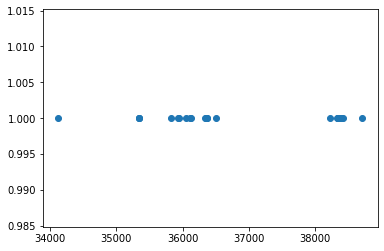

In [14]:
entries = sillok_people.groupby('spid')['rdate'].apply(list)
plt.scatter(entries[0], [1]*len(entries[0]))

In [15]:
# Drop one of the extra solardate rows
sillok_people = sillok_people.loc[:,~sillok_people.columns.duplicated()]


In [16]:
len(entries)

27317

In [17]:
entries.head()

spid
M_0000002    [36352, 38359, 35952, 36508, 38354, 38395, 384...
M_0000003    [27860, 27128, 27128, 26047, 23923, 24023, 299...
M_0000004                                       [43888, 44177]
M_0000005    [175810, 175409, 175460, 177738, 175181, 17501...
M_0000006    [122349, 122416, 121426, 122367, 121444, 12235...
Name: rdate, dtype: object

This is the number of times each person is mentioned in the sillok ... about half are only mentioned once


In [18]:
entries.apply(len).value_counts()

1      11713
2       3660
3       1989
4       1261
5        825
       ...  
775        1
559        1
343        1
263        1
439        1
Name: rdate, Length: 326, dtype: int64

Drop the ones that are only of length 1


In [19]:
entries_2 = entries[entries.apply(lambda x: len(x) > 1)]
entries_2.apply(len).value_counts()

2      3660
3      1989
4      1261
5       825
6       649
       ... 
235       1
211       1
399       1
415       1
895       1
Name: rdate, Length: 325, dtype: int64

In [ ]:
# entries_2.apply(len).value_counts().head(20)

In [ ]:
len(entries_2)

## IQR

In [20]:
entries_iqr = entries_2.apply(stats.iqr)
sorted_iqr = entries_iqr.sort_values()

In [23]:
# sorted_iqr.head(-10)

In [21]:
# First 20
# sorted_iqr[:20]

In [22]:
# Last 20
# sorted_iqr[-20:]

In [23]:
print(len(sorted_iqr.value_counts()))
sorted_iqr.value_counts()

9772


0.00        214
0.50         70
1.00         53
2.00         39
2.50         33
           ... 
3876.50       1
53834.00      1
83143.00      1
2787.75       1
6017.75       1
Name: rdate, Length: 9772, dtype: int64

In [24]:
statistics.mean(sorted_iqr.values), statistics.median(sorted_iqr.values)

(3225.289877595488, 1712.75)

In [28]:
# sorted_iqr.head()

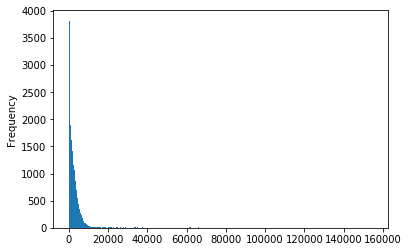

In [29]:
sorted_iqr.plot.hist(bins=300)

## Using Different Stats

In [30]:
entries_describe = entries_2.apply(stats.describe)

In [31]:
# returns: number of observations; min/max; mean; variance; skew; kurtosis
# entries_describe.head()

In [32]:
# from sklearn.preprocessing import MinMaxScaler

# scaler = MinMaxScaler() 
                                
# entries_norm = entries_2.apply(lambda x: scaler.fit_transform(np.array(x).reshape(-1,1)))

# entries_norm.head()

## Find Gwanjik `gid` that does not decrease with increasing `rdate`

In [33]:
last_50 = sorted_iqr[-50:]
last_100 = sorted_iqr[-100:]
last_200 = sorted_iqr[-200:]
last_500 = sorted_iqr[-500:]
last_1000 = sorted_iqr[-1000:]


In [25]:
# Returns the number of errors while descending
def getDescendingErrors(lst):
    errorCount = 0
    if len(lst) < 1: return errorCount
    prev = lst[0]
    for item in range(1, len(lst)):
        if prev < lst[item]:
            errorCount += 1
#             return False
        prev = lst[item]
    return errorCount

In [35]:
# spid_person = sillok_people[sillok_people['spid']=='M_0000221']
#     # Sort the 'gid' to be in order
# spid_person = spid_person.sort_values(['rdate','level'], ascending=[True, False])
# # 
# spid_person
# # print(gid_values)
# # gid_values = spid_person['gid'].values
# # print(isDescending(gid_values))
# # if not isDescending(gid_values):
# #     to_split.append(spid)



In [26]:
to_split = pd.DataFrame([])

for spid in sorted_iqr.index:
#     print(spid)
    
    spid_person = sillok_people[sillok_people['spid']==spid]
    spid_person = spid_person.sort_values(['rdate','level'], ascending=[True, False])
    level_values = spid_person['level'].values
    
    if len(level_values) < 1:
        print(spid, len(level_values))
        continue
    numErrors = getDescendingErrors(level_values)
    errorRate = numErrors/len(level_values)
#     print(numErrors, len(level_values), errorRate)
    
    if numErrors > 0:
        to_split = to_split.append(pd.DataFrame({
            'spid': spid, 
            'numErrors': numErrors, 
            'totalLength': len(level_values),
            'errorRate': [errorRate]}))


In [37]:
to_split.reset_index(inplace = True, drop=True)
print(len(to_split))
to_split[0:5]

8086


,spid,numErrors,totalLength,errorRate
0,M_0048165,1,2,0.50
1,M_0046738,1,2,0.50
2,M_0024723,1,4,0.25
3,M_0048299,1,2,0.50
4,M_0048179,1,2,0.50


In [38]:
# spid_person.sort_values(['rdate','gid'], ascending=[True, False])

In [39]:
sillok_people[sillok_people['spid']=='M_0048165']

,spid,officelevel,type,sid,scid,solardate,gid,lunardate,rdate,king,level
29464,M_0048165,의영고 주부(義盈庫主簿),현직,kma_10201013_001,sc284669,1547-02-03,1085.0,1547-01-13L0,56430,명종,12.0
250041,M_0048165,참봉(參奉),현직,kma_10201014_002,sc284670,1547-02-04,174.0,1547-01-14L0,56431,명종,18.0


In [40]:
to_split['errorRate'].sort_values()

1270    0.006061
3433    0.009434
716     0.009615
5793    0.011364
880     0.012987
          ...   
4089    0.666667
4700    0.666667
7081    0.666667
4290    0.666667
7900    0.666667
Name: errorRate, Length: 8086, dtype: float64

(array([2.120e+02, 9.110e+02, 1.174e+03, 1.211e+03, 1.233e+03, 9.160e+02,
        3.530e+02, 6.520e+02, 1.980e+02, 5.660e+02, 1.900e+01, 9.900e+01,
        9.000e+00, 4.000e+00, 4.990e+02, 0.000e+00, 1.000e+00, 3.000e+00,
        0.000e+00, 2.600e+01]),
 array([0.00606061, 0.03909091, 0.07212121, 0.10515152, 0.13818182,
        0.17121212, 0.20424242, 0.23727273, 0.27030303, 0.30333333,
        0.33636364, 0.36939394, 0.40242424, 0.43545455, 0.46848485,
        0.50151515, 0.53454545, 0.56757576, 0.60060606, 0.63363636,
        0.66666667]),
 <a list of 20 Patch objects>)

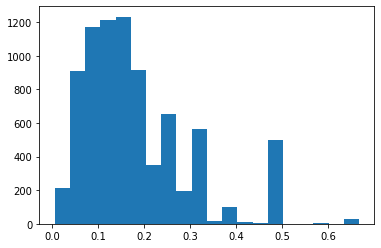

In [41]:
errorRates = to_split['errorRate'].values
plt.hist(errorRates, bins=20)


In [42]:
# See how many of these are 1/2

halfies = to_split[to_split['errorRate'] == 0.5]
print(len(halfies))

# the ones with 1 as numerator
halfies_one = halfies[halfies['numErrors'] == 1]
print(len(halfies_one))

# and the ones with 2 as denominator
print(len(halfies_one[halfies_one['totalLength'] == 2]))

499
460
460


In [43]:
halfies_one.head()['spid']

0    M_0048165
1    M_0046738
3    M_0048299
4    M_0048179
6    M_0029401
Name: spid, dtype: object

In [44]:
len(to_split)

8086

In [28]:
to_split.to_csv('/home/yenniejun/code/JoseonMunkwa/data/temp/to_split.csv')

## Find unique names for each `sid`


In [ ]:
# import Levenshtein as lev


In [64]:
# def is_same_name(n1, n2):
#     return lev.distance(n1,n2) <= 1 and lev.ratio(n1,n2) > 0.6

# ls = [a, b]
# fn = [item[:2] for item in ls]
# set(fn)

In [85]:
# # ref = 'M_0005395'

# unique_names_for_spid = pd.DataFrame(columns=['sid', 'spid', 'unique_names', 'names'], index=range(total_sid_values))

# i = 0
# for ref in to_split['spid'].values:
#     sid_values = sillok_career_full[sillok_career_full['spid'] == ref]['sid'].values

#     distinct_names = set()
#     for val in sid_values:
#         # Get that sillok entry
#         sillok[sillok['sid']==val]
#         names = get_names_from_sillok(val, ref)
        
#         if len(names) <= 1:
#             unique_names = names
#         else:
#             unique_names = merge_similar_names(names)
                         
#         row = {'sid':val, 'spid':ref, 'unique_names': unique_names, 'names': names}
#         unique_names_for_spid.loc[i] = row
#         i += 1
        
#         print(i, val, ref, len(unique_names), len(names))
b
        
# #         print(unique_names, names)
        
# #         if (len(names) > 2):
# #             print(len(names), ref, val, names)
# #         if (len(names) == 0):
# #             continue
# # #             print(len(names), ref, val)
# #         else:
# #             if not is_same_name(list(names)):
# #                 print(names)
# # #                 print(names, ref, val)
# # #                 distinct_names.add(list(names))

1 kma_10201013_001 M_0048165 1 1
2 kma_10201014_002 M_0048165 1 1
3 kma_10201013_001 M_0046738 1 1
4 kma_10201014_002 M_0046738 1 1
5 kwa_11112026_008 M_0024723 1 1
6 kwa_11112026_004 M_0024723 1 1
7 kwa_11112026_006 M_0024723 1 1
8 kwa_11112023_006 M_0024723 1 1
9 kia_12001005_002 M_0048299 1 2
10 kia_12001007_005 M_0048299 1 1
11 kna_13702001_004 M_0048179 1 1
12 kna_13701029_003 M_0048179 1 1
13 kua_10403026_009 M_0045917 1 1
14 kua_10403024_009 M_0045917 1 2
15 kua_10403027_011 M_0045917 1 1
16 kza_13112010_002 M_0029401 1 1
17 kza_13112007_002 M_0029401 1 1
18 kpa_12409013_001 M_0003607 1 1
19 kpa_12409009_002 M_0003607 1 1
20 kea_10012021_001 M_0056206 1 2
21 kea_10012017_008 M_0056206 1 2
22 kia_11805023_002 M_0049764 1 1
23 kia_11805024_002 M_0049764 1 2
24 kia_12307003_001 M_0049764 1 1
25 kia_11805026_003 M_0049764 1 1
26 kia_11805025_001 M_0049764 1 1
27 kka_10304015_002 M_0013815 1 2
28 kka_10304011_001 M_0013815 1 1
29 kua_10403024_009 M_0021978 1 1
30 kua_10403028_008 M_0

240 kwa_11201016_005 M_0025248 1 1
241 kwa_11201017_004 M_0025248 1 1
242 kwa_11112026_007 M_0025248 1 1
243 kwa_11201009_001 M_0025248 1 1
244 kzb_10104030_003 M_0025248 1 1
245 kwa_11112023_004 M_0025248 1 1
246 ksa_13808013_002 M_0002633 1 1
247 kta_10308010_001 M_0002633 1 1
248 kta_10211008_001 M_0002633 1 2
249 kta_10211011_002 M_0002633 1 1
250 kta_10301014_002 M_0002633 1 2
251 kta_10211009_001 M_0002633 1 1
252 ktb_10211023_001 M_0002633 0 0


/Users/yenniejun/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  # Remove the CWD from sys.path while we load stuff.


253 kta_10211023_002 M_0002633 1 1
254 kta_10211021_002 M_0002633 1 2
255 kta_10211023_001 M_0002633 1 1
256 kta_10211003_001 M_0002633 1 1
257 kta_10212001_001 M_0002633 1 1
258 kta_10308026_001 M_0002633 1 2
259 kta_10211004_001 M_0002633 1 2
260 kta_10211012_001 M_0002633 1 1
261 koa_10707006_001 M_0006172 1 2
262 koa_10609014_005 M_0006172 0 0
263 koa_10509001_004 M_0006172 1 1
264 koa_10609014_007 M_0006172 1 1
265 koa_10705007_001 M_0006172 1 2
266 koa_10609025_003 M_0006172 0 0
267 koa_10609025_004 M_0006172 1 1
268 koa_10610004_002 M_0006172 1 1
269 koa_10411024_006 M_0006172 1 1
270 koa_10610004_001 M_0006172 0 0
271 kia_12002019_006 M_0012838 1 2
272 kia_12001026_003 M_0012838 1 2
273 kja_10101003_001 M_0012838 1 1
274 kia_12001025_001 M_0012838 1 1
275 kia_12002005_001 M_0012838 1 1
276 kua_14411019_002 M_0023488 1 1
277 kua_14501003_002 M_0023488 1 1
278 kua_14411021_008 M_0023488 1 1
279 kca_11803010_005 M_0065611 1 1
280 kca_11801021_001 M_0065611 1 1
281 koa_10704028_001

489 kza_10105028_004 M_0067294 1 1
490 kpa_11910027_002 M_0005711 1 1
491 kpa_12001019_001 M_0005711 1 1
492 kua_10312028_001 M_0055426 1 1
493 kua_10403022_014 M_0055426 1 1
494 kga_11311002_001 M_0006519 2 2
495 kga_11311002_001 M_0006519 2 2
496 kga_11401027_003 M_0006519 1 1
497 kha_10012013_001 M_0046776 1 1
498 kha_10009019_005 M_0046776 1 1
499 kga_10301016_003 M_0068439 1 1
500 kga_10304013_004 M_0068439 1 2
501 kga_10303017_001 M_0068439 1 2
502 kta_10402005_003 M_0021697 1 1
503 kta_10401023_001 M_0021697 1 1
504 kta_10403019_001 M_0021697 1 1
505 kta_10402002_001 M_0021697 1 1
506 kta_10401025_001 M_0021697 1 1
507 kta_10401015_003 M_0021697 1 1
508 kta_10406014_001 M_0021697 1 1
509 kta_10404115_002 M_0021697 1 1
510 kta_10401024_001 M_0021697 1 1
511 kta_10401022_001 M_0021697 1 1
512 kza_13105009_002 M_0029053 1 1
513 kza_13103009_003 M_0029053 1 1
514 kza_13106009_003 M_0029053 1 1
515 kma_11802010_001 M_0003822 1 1
516 kma_11807017_002 M_0003822 1 1
517 kma_11808015_001

726 kpa_11805025_003 M_0000373 1 1
727 kpa_11707011_003 M_0000373 1 1
728 kpa_11707023_003 M_0000373 1 1
729 kpa_11709015_001 M_0000373 1 1
730 kpa_11605022_001 M_0000373 1 1
731 kna_13912001_006 M_0017173 1 1
732 kna_14001005_003 M_0017173 1 1
733 kna_13908026_003 M_0017173 1 1
734 kwa_11304002_001 M_0025557 1 1
735 kwa_11211023_001 M_0025557 1 1
736 kwa_11303014_002 M_0025557 1 1
737 kpa_11311021_001 M_0018832 1 1
738 kpa_11801020_003 M_0018832 1 1
739 kpa_11507002_001 M_0018832 1 1
740 kpa_11505013_001 M_0018832 1 1
741 kpa_11507014_002 M_0018832 1 1
742 kpa_11505003_001 M_0018832 1 1
743 kwa_12708016_005 M_0025897 1 1
744 kwa_12705005_001 M_0025897 1 1
745 kua_10301030_001 M_0021905 1 1
746 kua_10305011_001 M_0021905 1 1
747 kua_10302003_009 M_0021905 1 1
748 kza_12703016_001 M_0028947 1 1
749 kza_12607029_001 M_0028947 1 1
750 kza_12609004_001 M_0028947 1 1
751 kza_12609002_002 M_0028947 1 1
752 kda_11111013_003 M_0037830 1 2
753 kda_11203026_004 M_0037830 1 2
754 kya_10812011_001

961 kla_10106029_003 M_0000563 1 1
962 kla_10106027_008 M_0000563 1 1
963 kla_10104008_002 M_0000563 1 2
964 kla_10104011_001 M_0000563 1 1
965 kza_13106022_007 M_0004838 1 1
966 kza_14308030_001 M_0004838 1 1
967 kza_14309019_001 M_0004838 1 1
968 kza_13107020_001 M_0004838 1 1
969 kza_13002025_001 M_0004838 1 1
970 kza_13105001_005 M_0004838 1 1
971 kza_13107017_002 M_0004838 1 1
972 kza_13106025_007 M_0004838 1 1
973 kza_12101005_001 M_0004838 1 1
974 kea_10010025_001 M_0002017 1 1
975 kga_10112027_003 M_0002017 1 1
976 kea_10007003_001 M_0002017 1 2
977 kea_10009007_003 M_0002017 1 1
978 kea_10008007_003 M_0002017 1 1
979 kwa_10102023_001 M_0041059 1 1
980 kwa_10104025_001 M_0041059 1 1
981 kwa_10105026_001 M_0041059 1 1
982 kwa_10104025_004 M_0041059 1 1
983 kwa_10101012_001 M_0041059 1 1
984 kwa_10012026_002 M_0041059 1 1
985 kwa_10102016_005 M_0041059 1 1
986 kwa_10103010_001 M_0041059 1 1
987 kja_10309019_001 M_0047825 1 1
988 kea_10102025_002 M_0047825 1 1
989 kja_10307006_001

1191 kga_11309030_002 M_0001181 1 1
1192 kga_11309027_001 M_0001181 1 1
1193 kga_11309010_003 M_0001181 1 1
1194 kga_11312004_002 M_0001181 1 1
1195 kga_11310004_001 M_0001181 1 1
1196 kga_11312010_001 M_0001181 1 2
1197 kga_11308027_002 M_0001181 1 1
1198 kga_11307011_001 M_0001181 1 1
1199 kga_11312009_002 M_0001181 1 1
1200 kga_11401027_002 M_0001181 2 2
1201 kga_11310010_005 M_0001181 1 1
1202 kga_11201015_001 M_0001181 1 1
1203 kga_11307005_003 M_0001181 1 2
1204 kga_11310027_002 M_0001181 1 2
1205 kga_11310010_002 M_0001181 1 1
1206 kga_11311027_001 M_0001181 1 1
1207 kga_11304027_004 M_0001181 1 1
1208 kga_11404007_001 M_0001181 1 1
1209 kia_11011018_004 M_0001181 1 2
1210 kga_11310002_002 M_0001181 1 1
1211 kga_11310002_001 M_0001181 1 1
1212 kja_10302026_002 M_0000953 1 1
1213 kja_10212010_002 M_0000953 1 1
1214 kja_10301019_005 M_0000953 1 1
1215 kja_10302004_004 M_0000953 1 1
1216 kja_10211004_001 M_0000953 1 1
1217 kja_10211028_002 M_0000953 1 1
1218 kja_10301020_003 M_0000

1423 kia_12002004_001 M_0001670 1 2
1424 kia_11311015_002 M_0001670 1 1
1425 kpa_11501023_006 M_0017621 1 1
1426 kpa_11410008_001 M_0017621 1 1
1427 kpa_11502020_003 M_0017621 1 1
1428 kpa_11501024_003 M_0017621 1 1
1429 kpa_11501017_002 M_0017621 1 1
1430 kpa_11410004_002 M_0017621 1 1
1431 kpa_11403005_001 M_0017621 1 1
1432 kka_10304017_004 M_0003440 1 2
1433 kka_10909012_001 M_0003440 1 1
1434 kka_10911013_003 M_0003440 1 1
1435 kka_10910022_001 M_0003440 1 1
1436 kka_11707022_005 M_0003440 1 1
1437 kka_10912010_001 M_0003440 1 1
1438 kka_10804013_003 M_0003440 1 1
1439 kka_10908021_003 M_0003440 1 1
1440 kka_10912003_001 M_0003440 1 1
1441 kka_10912021_001 M_0003440 1 1
1442 kka_11003002_002 M_0003440 1 1
1443 kka_10208029_004 M_0003440 1 1
1444 kka_10909016_001 M_0003440 1 2
1445 kwa_13005012_003 M_0024887 1 1
1446 kwa_13011026_002 M_0024887 1 1
1447 kwa_13005009_006 M_0024887 1 1
1448 kwa_13009024_002 M_0024887 1 1
1449 kwa_12711021_001 M_0024887 1 1
1450 kwa_13006012_003 M_0024

1652 kwa_10511018_001 M_0054691 1 1
1653 kwa_11201006_004 M_0054691 1 1
1654 kwa_11309015_001 M_0054691 1 1
1655 kwa_11202007_001 M_0054691 1 1
1656 kwa_11112022_004 M_0054691 1 1
1657 kza_12205023_001 M_0004415 1 1
1658 kza_12203005_001 M_0004415 1 1
1659 kza_12112013_004 M_0004415 1 1
1660 kza_13011023_002 M_0004415 1 1
1661 kza_12110020_005 M_0004415 1 2
1662 kza_12006016_001 M_0004415 1 1
1663 kza_12201016_001 M_0004415 1 1
1664 kza_12111015_001 M_0004415 1 1
1665 kza_11908008_010 M_0004415 1 1
1666 kza_12112007_002 M_0004415 1 1
1667 kia_12405114_003 M_0062937 1 1
1668 kka_10205019_003 M_0062937 1 1
1669 kja_10407008_001 M_0062937 1 1
1670 kja_10511025_001 M_0062937 1 1
1671 kka_12405012_006 M_0062937 1 1
1672 kja_10507028_002 M_0062937 1 1
1673 kja_10512010_001 M_0062937 1 2
1674 kja_10511018_001 M_0062937 1 2
1675 kja_10511001_001 M_0062937 1 1
1676 kja_10510012_002 M_0062937 1 1
1677 kia_12302021_005 M_0062937 1 1
1678 kja_10509019_003 M_0062937 1 1
1679 kja_10509028_002 M_0062

1882 kia_12401005_001 M_0053857 1 2
1883 kia_12207027_003 M_0053857 1 1
1884 kia_12401006_004 M_0053857 1 2
1885 kia_12401006_001 M_0053857 1 1
1886 kfa_10007012_003 M_0010277 1 1
1887 kfa_10007021_002 M_0010277 1 1
1888 kga_10112027_003 M_0010277 1 1
1889 kga_10512017_004 M_0010277 1 2
1890 kea_10105004_001 M_0010277 1 1
1891 kfa_10207004_002 M_0010277 1 2
1892 kfa_10009124_001 M_0010277 1 2
1893 kfa_10009122_001 M_0010277 1 2
1894 kea_10203012_004 M_0010277 1 1
1895 kfa_10008001_004 M_0010277 1 1
1896 kfa_10011005_001 M_0010277 1 1
1897 kfa_10007017_001 M_0010277 1 1
1898 kfa_10007011_001 M_0010277 1 2
1899 kfa_10008023_008 M_0010277 1 1
1900 krb_10307027_002 M_0000390 1 1
1901 krb_10308023_002 M_0000390 1 1
1902 krb_10304001_001 M_0000390 1 1
1903 kra_10304001_001 M_0000390 0 0
1904 krb_10308013_001 M_0000390 1 1
1905 kua_13702007_003 M_0040713 1 1
1906 kua_13804013_001 M_0040713 1 1
1907 kua_14307013_004 M_0040713 1 1
1908 kua_13802025_003 M_0040713 1 1
1909 kua_13806009_001 M_0040

2114 kna_12802013_003 M_0003486 1 1
2115 kna_12704015_001 M_0003486 1 1
2116 kza_10105017_004 M_0027135 1 1
2117 kza_10206015_004 M_0027135 1 1
2118 kya_11411023_004 M_0027135 1 1
2119 kza_10105015_005 M_0027135 1 1
2120 kza_12810012_002 M_0000075 1 1
2121 kza_12712014_005 M_0000075 1 2
2122 kta_10404024_003 M_0021312 1 2
2123 kta_10211028_003 M_0021312 1 2
2124 kta_10206030_002 M_0021312 1 1
2125 kta_10207011_001 M_0021312 1 1
2126 kta_10208015_001 M_0021312 1 1
2127 kta_10208020_002 M_0021312 1 1
2128 kta_10211019_003 M_0021312 1 1
2129 kta_10404019_001 M_0021312 1 1
2130 kta_10211013_002 M_0021312 1 1
2131 kta_10211020_002 M_0021312 1 1
2132 kta_10211027_002 M_0021312 1 1
2133 kta_10206028_003 M_0021312 1 1
2134 kta_10204014_004 M_0021312 1 1
2135 kta_10211029_002 M_0021312 1 1
2136 kta_10206024_002 M_0021312 1 1
2137 kta_10212028_001 M_0021312 1 2
2138 kta_10404020_001 M_0021312 1 1
2139 kta_10208002_002 M_0021312 1 1
2140 kta_10208013_001 M_0021312 1 1
2141 kta_10209001_003 M_0021

2343 ksa_12807005_001 M_0020805 1 1
2344 ksa_13006021_001 M_0020805 1 2
2345 ksa_13001007_002 M_0020805 1 1
2346 ksa_13006030_002 M_0020805 1 2
2347 ksa_13006030_002 M_0020805 1 2
2348 ksa_12905029_002 M_0020805 1 1
2349 ksa_12907027_003 M_0020805 1 1
2350 ksa_13002014_002 M_0020805 1 1
2351 ksa_13005017_003 M_0020805 1 1
2352 ksa_13003020_001 M_0020805 1 1
2353 ksa_13001011_002 M_0020805 1 1
2354 ksa_13006020_002 M_0020805 1 2
2355 kma_10009001_001 M_0052845 1 2
2356 kma_10102030_004 M_0052845 1 1
2357 kma_10009027_003 M_0052845 1 2
2358 kma_10009016_004 M_0052845 1 1
2359 kma_10109005_002 M_0052845 1 1
2360 kza_13009019_003 M_0028482 1 1
2361 kza_12910021_002 M_0028482 1 1
2362 kza_13008006_002 M_0028482 1 1
2363 kka_11309016_004 M_0000169 1 1
2364 kka_11408015_001 M_0000169 1 1
2365 kga_10112027_003 M_0005814 1 1
2366 kga_11311002_001 M_0005814 1 1
2367 kga_11308008_003 M_0005814 1 1
2368 kga_11401027_003 M_0005814 1 1
2369 kga_11305018_002 M_0005814 1 1
2370 kwa_10008001_011 M_0004

2574 kna_13205029_001 M_0002284 1 1
2575 kna_13310010_009 M_0002284 1 1
2576 kna_13206014_002 M_0002284 1 1
2577 kna_13201022_002 M_0002284 1 1
2578 kna_13301017_001 M_0002284 1 1
2579 knb_13206001_001 M_0002284 1 2
2580 kna_13205004_001 M_0002284 1 1
2581 kna_13202007_005 M_0002284 1 1
2582 kna_13112023_002 M_0002284 1 1
2583 kna_13203010_006 M_0002284 1 1
2584 kna_13204015_002 M_0002284 1 1
2585 kna_13112015_002 M_0002284 1 1
2586 kna_13204113_005 M_0002284 1 1
2587 kna_13201019_002 M_0002284 1 1
2588 kna_13112009_004 M_0002284 1 1
2589 kza_12806014_001 M_0028928 1 1
2590 kza_12710016_004 M_0028928 1 1
2591 kza_12810012_002 M_0028928 1 1
2592 kza_13105009_002 M_0029353 1 1
2593 kza_12910021_002 M_0029353 1 1
2594 kza_13105001_005 M_0029353 1 1
2595 kza_13103009_004 M_0029353 1 1
2596 kua_10407016_001 M_0039569 1 2
2597 kua_10309026_005 M_0039569 1 1
2598 kta_10306001_002 M_0039569 1 1
2599 kua_10403012_003 M_0039569 1 1
2600 kua_10403025_004 M_0039569 1 2
2601 kra_10108028_002 M_0003

2805 kva_10712003_001 M_0023919 1 2
2806 kva_10810028_001 M_0023919 1 1
2807 kva_10802007_003 M_0023919 1 1
2808 kua_11203022_001 M_0004105 1 1
2809 kua_11110016_002 M_0004105 1 1
2810 kua_11109007_001 M_0004105 1 1
2811 kua_11209009_001 M_0004105 1 1
2812 kua_11711028_001 M_0004105 1 1
2813 kua_11203028_001 M_0004105 1 1
2814 kua_11203026_002 M_0004105 1 1
2815 kua_11002010_004 M_0004105 1 2
2816 kua_11109009_002 M_0004105 1 1
2817 kua_11202010_002 M_0004105 1 1
2818 kia_10301024_005 M_0001967 1 1
2819 kha_10101001_005 M_0001967 1 1
2820 kga_11402008_002 M_0001967 1 1
2821 kia_11508008_004 M_0001967 1 1
2822 kia_10909016_003 M_0001967 1 1
2823 kga_10906012_001 M_0001967 1 1
2824 kia_10906001_001 M_0001967 1 2
2825 kia_10909016_002 M_0001967 1 1
2826 kia_10909029_001 M_0001967 1 1
2827 kia_11507004_001 M_0001967 1 2
2828 kia_10907019_003 M_0001967 1 1
2829 kia_10905001_001 M_0001967 1 1
2830 kia_10909017_002 M_0001967 1 1
2831 kha_10111028_009 M_0001967 1 1
2832 kia_10909014_002 M_0001

3034 kja_10111014_001 M_0000454 1 2
3035 kia_12403014_005 M_0000454 1 2
3036 kja_10410007_003 M_0000454 1 1
3037 kja_10112003_001 M_0000454 1 1
3038 kja_10106029_003 M_0000454 1 1
3039 kja_10201013_005 M_0000454 1 1
3040 kja_10111030_001 M_0000454 1 1
3041 kia_12505006_002 M_0000454 1 2
3042 kja_10408006_001 M_0000454 1 1
3043 kza_12805001_004 M_0027990 1 1
3044 kza_12906007_003 M_0027990 1 1
3045 kza_12907025_004 M_0063806 1 1
3046 kza_13008021_008 M_0063806 1 1
3047 kza_13109023_003 M_0063806 1 1
3048 kza_13008026_005 M_0063806 1 1
3049 kua_10212012_002 M_0000989 1 1
3050 kua_10303124_001 M_0000989 1 1
3051 kua_10105011_008 M_0000989 1 1
3052 kua_12011027_002 M_0000989 1 1
3053 kua_10201028_001 M_0000989 1 1
3054 kua_10210028_002 M_0000989 1 1
3055 kua_11809026_002 M_0000989 1 1
3056 kua_10212014_001 M_0000989 1 1
3057 kua_11406023_004 M_0000989 1 1
3058 kua_10304026_001 M_0000989 1 1
3059 kua_10212026_002 M_0000989 1 1
3060 kua_10305011_001 M_0000989 1 1
3061 kua_10303107_001 M_0000

3263 kka_11408015_001 M_0005994 1 1
3264 kka_11410025_002 M_0005994 1 1
3265 kpa_11807014_002 M_0000541 1 1
3266 kpa_11804009_001 M_0000541 1 1
3267 kpa_11801012_002 M_0000541 1 1
3268 kpa_11908023_001 M_0000541 1 1
3269 kpa_11711027_003 M_0000541 1 1
3270 kua_10512028_001 M_0022089 1 1
3271 kua_10503022_001 M_0022089 1 1
3272 kua_10503023_001 M_0022089 1 1
3273 kua_10512002_002 M_0022089 1 1
3274 kua_10503027_002 M_0022089 1 1
3275 kua_10501009_006 M_0022089 1 1
3276 kua_10512025_003 M_0022089 1 1
3277 kua_10501014_001 M_0022089 1 1
3278 kua_10501010_002 M_0022089 1 1
3279 kua_10501007_002 M_0022089 1 1
3280 kua_10503025_003 M_0022089 1 2
3281 kga_10112027_003 M_0010632 1 1
3282 kia_11901125_002 M_0010632 1 1
3283 kia_11808006_005 M_0010632 1 2
3284 kia_12004012_002 M_0010632 1 1
3285 kia_11807023_002 M_0010632 1 2
3286 kia_12101009_002 M_0055302 1 1
3287 kia_12003029_001 M_0055302 1 1
3288 kia_12008013_001 M_0055302 1 1
3289 kia_12101014_002 M_0055302 1 1
3290 kia_12008009_002 M_0055

3491 koa_10506008_007 M_0002331 1 1
3492 kpa_10401016_004 M_0002331 1 1
3493 kpa_10408027_003 M_0002331 1 1
3494 kpa_10410002_001 M_0002331 1 1
3495 koa_10512006_005 M_0002331 1 1
3496 kpa_10407024_003 M_0002331 1 1
3497 kpa_10405018_006 M_0002331 1 1
3498 kpa_10409019_003 M_0002331 1 1
3499 kpa_10602008_003 M_0002331 1 1
3500 kpa_10406011_001 M_0002331 1 1
3501 kpa_10406130_002 M_0002331 1 1
3502 kpa_10407017_002 M_0002331 1 1
3503 kpa_10402011_005 M_0002331 1 1
3504 kpa_10501006_005 M_0002331 1 1
3505 krb_11301028_001 M_0004598 1 1
3506 kra_11307015_001 M_0004598 0 0
3507 kra_11301028_001 M_0004598 0 0
3508 krb_11307015_001 M_0004598 1 1
3509 krb_10908016_004 M_0004598 1 1
3510 kra_11208010_001 M_0004598 0 0
3511 krb_11208010_001 M_0004598 1 1
3512 krb_11306024_002 M_0004598 1 1
3513 kra_11306024_002 M_0004598 0 0
3514 ksa_10109003_001 M_0004598 1 1
3515 kra_11302030_001 M_0004598 0 0
3516 kra_11212020_001 M_0004598 0 0
3517 krb_11212020_001 M_0004598 1 2
3518 kra_11209010_001 M_0004

3720 kfa_10104010_001 M_0063020 1 1
3721 kda_12712009_001 M_0063020 1 1
3722 kga_10112027_003 M_0037734 1 1
3723 kga_10304013_004 M_0037734 1 2
3724 kna_13301010_010 M_0006371 1 1
3725 kna_13306002_001 M_0006371 1 1
3726 kna_13211026_002 M_0006371 1 1
3727 kna_13309027_002 M_0006371 1 1
3728 kna_13211025_005 M_0006371 1 1
3729 kna_13306007_001 M_0006371 1 1
3730 knb_13212001_001 M_0006371 1 1
3731 kna_13303029_001 M_0006371 1 1
3732 knb_11808001_004 M_0006371 1 1
3733 kna_12402010_002 M_0006371 1 1
3734 kna_13212011_002 M_0006371 1 1
3735 kna_13306004_001 M_0006371 1 1
3736 kna_13502121_001 M_0006371 1 1
3737 kna_13211023_005 M_0006371 1 1
3738 kna_12511004_002 M_0006371 1 2
3739 kna_13903003_003 M_0006371 1 1
3740 kna_13305022_001 M_0006371 1 1
3741 kna_13306012_003 M_0006371 1 1
3742 kna_13211030_004 M_0006371 1 1
3743 kna_13302008_002 M_0006371 1 1
3744 kna_13303010_004 M_0006371 1 1
3745 kna_13211030_001 M_0006371 1 1
3746 kna_13301029_002 M_0006371 1 1
3747 kna_12508028_002 M_0006

3949 kna_14007012_005 M_0006296 1 1
3950 knb_13210001_001 M_0006296 1 1
3951 kna_13203011_006 M_0006296 1 1
3952 kna_13210007_002 M_0006296 1 1
3953 kna_13302016_003 M_0006296 1 1
3954 kna_13202008_004 M_0006296 1 1
3955 kna_13208008_005 M_0006296 1 1
3956 kna_13204022_002 M_0006296 1 1
3957 kna_13204017_004 M_0006296 1 1
3958 kna_13206011_006 M_0006296 1 1
3959 kna_13210008_002 M_0006296 1 1
3960 kna_13202028_005 M_0006296 1 1
3961 kna_13006015_006 M_0006296 1 1
3962 kna_13207002_006 M_0006296 1 1
3963 kna_13207006_003 M_0006296 1 1
3964 kna_13002012_003 M_0006296 1 1
3965 kna_13302015_004 M_0006296 1 1
3966 kna_13209011_009 M_0006296 1 1
3967 kna_12812007_003 M_0006296 1 1
3968 kna_13204018_007 M_0006296 1 1
3969 kna_13202014_005 M_0006296 1 1
3970 kna_13207023_002 M_0006296 1 1
3971 kna_13208019_002 M_0006296 1 1
3972 koa_10208027_001 M_0006296 0 0
3973 koa_10208027_002 M_0006296 1 1
3974 kqa_10412026_001 M_0055689 1 1
3975 kqa_10503027_001 M_0055689 1 1
3976 kqa_10706023_001 M_0055

4177 kma_10507014_001 M_0040601 1 1
4178 kka_10609021_005 M_0013883 1 1
4179 kka_10505006_001 M_0013883 1 1
4180 ksa_11503112_002 M_0058634 1 1
4181 ksa_11502002_007 M_0058634 1 1
4182 ksa_11503111_001 M_0058634 1 1
4183 ksa_11504025_006 M_0058634 1 1
4184 ksa_10308019_002 M_0058634 1 1
4185 ksa_11606030_002 M_0058634 1 1
4186 ksa_11503123_001 M_0058634 1 1
4187 ksa_11504021_001 M_0058634 1 2
4188 ksa_11606020_002 M_0058634 1 1
4189 ksa_11510003_001 M_0058634 1 1
4190 ksa_11505006_002 M_0058634 1 1
4191 ksa_10512010_002 M_0058634 1 1
4192 ksa_11606017_003 M_0058634 1 1
4193 ksa_11907016_001 M_0058634 1 1
4194 ksa_11503120_002 M_0058634 1 1
4195 ksa_12004025_002 M_0058634 1 1
4196 ksa_11503019_001 M_0058634 1 1
4197 ksa_11503109_002 M_0058634 1 1
4198 ksa_11909018_002 M_0058634 1 1
4199 ksa_11508030_001 M_0058634 1 1
4200 ksa_11510027_002 M_0058634 1 1
4201 ksa_11502003_003 M_0058634 1 1
4202 ksa_10304019_001 M_0058634 1 1
4203 ksa_10305028_003 M_0058634 1 1
4204 ksa_11504023_004 M_0058

4406 kga_11407015_003 M_0036128 1 2
4407 kga_11404009_001 M_0036128 1 1
4408 kga_11405008_002 M_0036128 1 2
4409 kga_11405025_003 M_0036128 1 2
4410 kga_11405005_001 M_0036128 1 1
4411 kha_10009007_003 M_0036128 2 3
4412 kga_11405001_002 M_0036128 1 2
4413 kga_11309021_003 M_0036128 1 1
4414 kga_11308024_002 M_0036128 1 2
4415 kia_11010114_002 M_0036128 1 1
4416 kga_11406018_001 M_0036128 1 1
4417 kga_11307025_004 M_0036128 1 2
4418 kga_11309021_002 M_0036128 1 1
4419 kga_11309015_003 M_0036128 1 1
4420 kga_11407017_001 M_0036128 1 1
4421 kga_11310017_002 M_0036128 1 2
4422 kzb_10308020_002 M_0036128 2 2
4423 kga_11311002_001 M_0036128 2 3
4424 kga_11406006_002 M_0036128 1 1
4425 kga_11311002_001 M_0036128 2 3
4426 kga_11308027_001 M_0036128 1 1
4427 kga_11401027_003 M_0036128 1 1
4428 kga_11309010_003 M_0036128 1 1
4429 kga_11403023_002 M_0036128 1 1
4430 kga_11305018_002 M_0036128 1 1
4431 kga_11308028_001 M_0036128 1 1
4432 kga_11408023_003 M_0036128 1 1
4433 kga_11310010_001 M_0036

4634 kia_12108023_005 M_0005149 1 2
4635 kia_12202024_003 M_0005149 1 1
4636 kia_12110021_001 M_0005149 1 1
4637 kia_12111018_001 M_0005149 1 2
4638 kia_12503024_002 M_0005149 1 1
4639 kia_12008024_006 M_0005149 1 1
4640 kia_12110022_002 M_0005149 1 1
4641 kia_12011016_003 M_0005149 1 2
4642 kia_12504006_002 M_0005149 1 1
4643 kia_12110019_001 M_0005149 1 1
4644 kia_12012009_001 M_0005149 1 1
4645 kia_12103001_002 M_0005149 1 2
4646 kia_12110018_003 M_0005149 1 1
4647 kia_12109006_003 M_0005149 1 2
4648 kia_12108022_003 M_0005149 1 1
4649 kia_12110020_004 M_0005149 1 1
4650 kia_12112006_004 M_0005149 1 1
4651 kia_12109017_002 M_0005149 1 2
4652 kia_12011018_002 M_0005149 1 2
4653 kia_12012011_002 M_0005149 1 1
4654 kia_12109008_004 M_0005149 1 2
4655 kia_11912012_002 M_0005149 1 1
4656 kia_12109003_006 M_0005149 1 1
4657 kia_12108003_002 M_0005149 1 1
4658 kia_12406027_003 M_0005149 1 1
4659 kia_12501027_002 M_0005149 1 2
4660 kia_12505022_001 M_0005149 1 1
4661 kia_12110024_005 M_0005

4865 kia_12511002_002 M_0002142 1 2
4866 kia_12504018_001 M_0002142 1 2
4867 kia_12502023_002 M_0002142 1 2
4868 kia_12510015_002 M_0002142 1 2
4869 kia_12510013_001 M_0002142 1 2
4870 kia_12506022_003 M_0002142 1 1
4871 kia_12510012_002 M_0002142 1 1
4872 kia_12501005_001 M_0002142 1 1
4873 kia_12505017_001 M_0002142 1 2
4874 kia_12510020_001 M_0002142 1 2
4875 kia_12412024_003 M_0002142 1 1
4876 kia_12412027_002 M_0002142 1 2
4877 kia_12412027_002 M_0002142 1 2
4878 kia_12412025_003 M_0002142 1 1
4879 kia_12510028_002 M_0002142 1 2
4880 kia_12510029_001 M_0002142 1 2
4881 kra_11003014_001 M_0061081 0 0
4882 krb_11002028_002 M_0061081 1 1
4883 krb_11102117_001 M_0061081 1 1
4884 kra_11102117_001 M_0061081 0 0
4885 kra_11008016_001 M_0061081 0 0
4886 krb_11008016_001 M_0061081 1 1
4887 kra_11003012_003 M_0061081 0 0
4888 krb_11003012_001 M_0061081 1 1
4889 kra_11101015_003 M_0061081 0 0
4890 krb_11012006_001 M_0061081 1 1
4891 kra_11012006_001 M_0061081 0 0
4892 ksa_12805019_002 M_0061

5095 ksa_12107018_001 M_0063091 1 1
5096 ksa_12012020_002 M_0063091 1 1
5097 ksa_12110015_001 M_0063091 1 1
5098 ksa_12103013_002 M_0063091 1 1
5099 ksb_11102006_001 M_0063091 1 1
5100 ksa_11102004_002 M_0063091 1 1
5101 ksa_12102025_001 M_0063091 1 1
5102 ksa_12005130_001 M_0063091 1 1
5103 ksa_12412001_001 M_0063091 1 1
5104 ksa_12905028_002 M_0063091 1 1
5105 ksa_12106002_003 M_0063091 1 1
5106 ksa_11005003_001 M_0063091 1 1
5107 ksa_12107020_001 M_0063091 1 1
5108 ksa_12103017_002 M_0063091 1 1
5109 ksa_12104001_001 M_0063091 1 1
5110 ksa_12005012_002 M_0063091 1 1
5111 ksa_11404025_001 M_0063091 1 2
5112 ksa_12105028_001 M_0063091 1 1
5113 ksa_12105022_001 M_0063091 1 1
5114 ksa_12012027_001 M_0063091 1 1
5115 ksa_12109012_002 M_0063091 1 1
5116 ksa_12009013_001 M_0063091 1 1
5117 ksa_12103002_001 M_0063091 1 1
5118 ksa_12104017_002 M_0063091 1 1
5119 ksa_12904019_002 M_0063091 1 1
5120 ksa_12108014_001 M_0063091 1 1
5121 kna_14002011_001 M_0017103 1 2
5122 kna_13808002_010 M_0017

5325 koa_10401006_005 M_0002552 0 0
5326 kna_13908006_001 M_0002552 1 1
5327 kna_13908026_004 M_0002552 1 1
5328 kna_13905015_007 M_0002552 1 1
5329 kna_13903003_003 M_0002552 1 1
5330 kna_13807027_007 M_0002552 1 1
5331 kna_13807027_006 M_0002552 1 1
5332 kna_13906023_004 M_0002552 1 1
5333 kna_13907001_009 M_0002552 1 1
5334 kna_13806020_004 M_0002552 1 1
5335 kna_13811003_001 M_0002552 1 1
5336 kna_13908023_004 M_0002552 1 1
5337 kna_13906020_002 M_0002552 1 1
5338 kna_13906009_001 M_0002552 1 1
5339 kna_13708021_007 M_0002552 1 1
5340 koa_10308023_001 M_0002552 1 1
5341 koa_10403019_007 M_0002552 1 1
5342 kna_13906030_005 M_0002552 1 1
5343 ksa_12207022_001 M_0005071 1 2
5344 ksa_12204011_001 M_0005071 1 1
5345 ksa_12207011_001 M_0005071 1 1
5346 ksa_12208011_001 M_0005071 1 1
5347 ksa_12305012_004 M_0005071 1 1
5348 ksa_12206008_001 M_0005071 1 1
5349 ksa_12207006_001 M_0005071 1 1
5350 ksa_12601017_001 M_0005071 1 1
5351 ksa_12304019_002 M_0005071 1 1
5352 ksa_12210003_001 M_0005

5557 kma_11210028_002 M_0000506 1 1
5558 kma_11301017_002 M_0000506 1 1
5559 kma_11210006_004 M_0000506 1 1
5560 kma_11209004_002 M_0000506 1 2
5561 kza_12510023_001 M_0028751 1 1
5562 kza_12812009_002 M_0028751 1 1
5563 kza_12807025_005 M_0028751 1 1
5564 kza_12905003_002 M_0028751 1 1
5565 kza_12804029_003 M_0028751 1 1
5566 kza_12906018_006 M_0028751 1 1
5567 kza_13102009_003 M_0029215 1 1
5568 kza_13102009_001 M_0029215 1 1
5569 kza_12810012_002 M_0029215 1 1
5570 kza_13010010_003 M_0029215 1 1
5571 kya_10109028_002 M_0026464 1 1
5572 kya_10008020_006 M_0026464 1 1
5573 kya_10205017_003 M_0026464 1 1
5574 kya_10103006_001 M_0026464 1 1
5575 kza_10512016_001 M_0027676 1 1
5576 kza_10709005_004 M_0027676 1 1
5577 kva_11501025_003 M_0004997 1 2
5578 kwa_10601007_001 M_0004997 1 1
5579 kva_12401001_011 M_0004997 1 1
5580 kwa_10104025_004 M_0004997 1 1
5581 kwa_10105026_001 M_0004997 1 1
5582 kwa_10109006_004 M_0004997 1 1
5583 kwa_10106025_002 M_0004997 1 1
5584 kwa_10101019_003 M_0004

5787 kea_10104003_002 M_0002278 1 2
5788 kda_11807028_001 M_0002278 1 1
5789 kea_10108001_002 M_0002278 1 2
5790 kea_10109026_002 M_0002278 1 2
5791 kea_10110021_002 M_0002278 1 1
5792 kga_10705020_002 M_0002278 1 1
5793 kda_12911015_002 M_0002278 1 1
5794 kea_10202019_004 M_0002278 1 1
5795 kea_10111025_003 M_0002278 1 2
5796 kea_10108010_002 M_0002278 1 2
5797 kea_10108007_001 M_0002278 1 2
5798 kia_11403009_003 M_0012438 1 1
5799 kia_11207004_001 M_0012438 1 2
5800 kva_11511003_002 M_0023866 1 1
5801 kva_11608021_007 M_0023866 1 1
5802 kva_11608021_001 M_0023866 1 1
5803 kva_11803014_002 M_0023866 1 1
5804 kva_11403020_005 M_0023866 1 1
5805 kna_12508016_007 M_0042690 1 1
5806 kna_12704021_003 M_0042690 1 1
5807 kya_10206019_001 M_0026583 1 1
5808 kya_10104011_002 M_0026583 1 1
5809 kya_10212019_001 M_0026583 1 1
5810 kza_10207004_002 M_0058701 1 1
5811 kza_10207003_002 M_0058701 1 1
5812 kya_11410025_002 M_0058701 1 1
5813 kna_13309025_003 M_0004515 1 1
5814 kna_13405019_002 M_0004

6016 kia_10904001_002 M_0002942 1 1
6017 kia_10803025_005 M_0002942 1 1
6018 kia_10806017_003 M_0002942 1 1
6019 kia_10807017_004 M_0002942 1 1
6020 kia_10807021_005 M_0002942 1 1
6021 kia_10802116_002 M_0002942 1 1
6022 kia_10901015_005 M_0002942 1 1
6023 kia_11405026_002 M_0002942 1 2
6024 kia_10807017_002 M_0002942 1 1
6025 kia_11605006_002 M_0002942 1 1
6026 kia_10806022_002 M_0002942 1 1
6027 kia_10811021_005 M_0002942 1 1
6028 kia_10806018_001 M_0002942 1 2
6029 kia_10812012_005 M_0002942 1 2
6030 kia_10902004_001 M_0002942 1 1
6031 kia_10705012_005 M_0002942 1 1
6032 kia_10807023_003 M_0002942 1 1
6033 kia_10811009_004 M_0002942 1 1
6034 kia_10801021_007 M_0002942 1 2
6035 kia_10806005_002 M_0002942 1 1
6036 kia_10807020_004 M_0002942 1 1
6037 kia_10807019_004 M_0002942 1 1
6038 kia_10703010_001 M_0002942 1 2
6039 kia_11701026_001 M_0002942 1 2
6040 kia_10708001_004 M_0002942 1 2
6041 kia_10808012_001 M_0002942 1 2
6042 kia_10810012_003 M_0002942 1 1
6043 kia_10803007_002 M_0002

6246 kga_10605025_004 M_0001617 1 1
6247 kga_10112027_003 M_0001617 1 1
6248 kga_10204013_001 M_0001617 1 1
6249 kga_10204022_002 M_0001617 1 1
6250 kga_10301028_002 M_0001617 1 1
6251 kga_10205008_001 M_0001617 1 1
6252 kga_10302001_004 M_0001617 1 1
6253 kga_10804016_002 M_0001617 1 1
6254 kda_13101026_003 M_0001617 1 1
6255 kga_10205007_003 M_0001617 1 2
6256 kfa_10006026_001 M_0001617 1 1
6257 kua_12709024_002 M_0003341 1 1
6258 kua_12705110_002 M_0003341 1 1
6259 kua_13309020_002 M_0003341 1 1
6260 kua_12611004_004 M_0003341 1 1
6261 kua_13309019_002 M_0003341 1 1
6262 kua_12511005_001 M_0003341 1 1
6263 kua_12705019_002 M_0003341 1 1
6264 kua_12705025_003 M_0003341 1 1
6265 kua_11605025_003 M_0003341 1 2
6266 kua_12704028_002 M_0003341 1 1
6267 kua_14010009_002 M_0003341 1 1
6268 kua_12609020_005 M_0003341 1 1
6269 kua_12610002_001 M_0003341 1 1
6270 kua_12701004_002 M_0003341 1 1
6271 ksa_10012020_002 M_0002569 1 1
6272 ksa_10011002_001 M_0002569 1 1
6273 ksa_10012022_001 M_0002

6477 kka_11302022_001 M_0003673 1 1
6478 kka_11108007_002 M_0003673 1 1
6479 kka_11207022_013 M_0003673 1 1
6480 kka_11202010_002 M_0003673 1 1
6481 kka_11306007_001 M_0003673 1 1
6482 kka_11412009_001 M_0003673 1 2
6483 kka_13304012_003 M_0003673 1 1
6484 kka_11306003_001 M_0003673 1 1
6485 kka_11312010_001 M_0003673 1 1
6486 kka_11302005_001 M_0003673 1 1
6487 kka_11306016_001 M_0003673 1 1
6488 kka_11209015_003 M_0003673 1 1
6489 kka_11212104_001 M_0003673 1 2
6490 kka_11312010_002 M_0003673 1 1
6491 kka_11309015_001 M_0003673 1 1
6492 kka_11203016_002 M_0003673 1 1
6493 kka_11301022_002 M_0003673 1 1
6494 kka_11311017_007 M_0003673 1 1
6495 kka_11307011_009 M_0003673 1 1
6496 kua_10408023_003 M_0038630 1 1
6497 kua_10503028_001 M_0038630 1 1
6498 kua_10408003_002 M_0038630 1 1
6499 kua_10601014_002 M_0038630 1 1
6500 kua_10503023_001 M_0038630 1 1
6501 kua_10503027_002 M_0038630 1 1
6502 kua_10503027_004 M_0038630 1 1
6503 kua_10503025_003 M_0038630 1 1
6504 kua_10404004_007 M_0038

6705 kta_10404024_002 M_0000379 1 1
6706 kta_10210024_001 M_0000379 1 1
6707 kta_10306022_002 M_0000379 1 1
6708 kta_10311017_001 M_0000379 1 1
6709 kta_10304021_003 M_0000379 1 1
6710 kta_10209014_001 M_0000379 1 1
6711 kta_10308020_001 M_0000379 1 1
6712 kta_10307024_003 M_0000379 1 1
6713 kta_10310004_002 M_0000379 1 1
6714 kta_10304013_001 M_0000379 1 1
6715 kta_10312026_002 M_0000379 1 1
6716 kta_10303019_002 M_0000379 1 1
6717 kta_10309017_002 M_0000379 1 1
6718 kta_10205022_001 M_0000379 1 1
6719 kta_10407026_001 M_0000379 1 1
6720 kta_10209009_002 M_0000379 1 1
6721 kta_10206009_001 M_0000379 1 1
6722 kta_10303022_001 M_0000379 1 1
6723 kta_10207006_002 M_0000379 1 1
6724 ksa_14302025_001 M_0001988 1 1
6725 ksa_14309004_003 M_0001988 1 2
6726 ksa_14405027_001 M_0001988 1 1
6727 ksa_14408005_001 M_0001988 1 1
6728 ksa_14211024_002 M_0001988 1 1
6729 ksa_14309001_001 M_0001988 1 1
6730 ksa_14209002_002 M_0001988 1 1
6731 ksa_14410002_001 M_0001988 1 1
6732 ksa_14210011_001 M_0001

6934 kea_10012013_005 M_0036198 1 1
6935 kea_10103015_003 M_0036198 1 1
6936 kfa_10005018_009 M_0036198 1 1
6937 kea_10110027_002 M_0036198 1 1
6938 kea_10006011_001 M_0036198 1 1
6939 kea_10010010_018 M_0036198 1 1
6940 kea_10010010_013 M_0036198 1 1
6941 kea_10010010_024 M_0036198 1 1
6942 kea_10105006_004 M_0036198 1 1
6943 kea_10101026_002 M_0036198 1 2
6944 kfa_10006007_001 M_0036198 1 2
6945 kfa_10008025_002 M_0036198 1 2
6946 kia_12002008_002 M_0036198 2 2
6947 kfa_10007017_002 M_0036198 1 1
6948 kea_10106002_003 M_0036198 1 2
6949 kea_10101022_003 M_0036198 1 1
6950 kka_11108008_002 M_0036198 1 1
6951 kea_10202015_001 M_0036198 1 1
6952 kea_10008002_004 M_0036198 1 2
6953 kea_10110029_001 M_0036198 1 1
6954 kea_10108022_001 M_0036198 1 1
6955 kea_10012022_001 M_0036198 1 1
6956 kfa_10107010_001 M_0036198 1 1
6957 kea_10107022_001 M_0036198 1 1
6958 kea_10009026_002 M_0036198 1 1
6959 kea_10107029_001 M_0036198 1 1
6960 kia_12503018_001 M_0046160 1 1
6961 kia_12111020_003 M_0046

7165 kia_10808017_005 M_0034691 1 1
7166 kia_11211015_003 M_0034691 1 1
7167 kia_11105016_003 M_0034691 1 1
7168 kia_11105029_008 M_0034691 1 1
7169 kia_11105003_004 M_0034691 1 1
7170 kia_11104029_002 M_0034691 1 1
7171 kia_11112019_002 M_0034691 1 1
7172 kia_11107007_002 M_0034691 1 2
7173 kia_11807018_001 M_0034691 1 1
7174 kia_11106003_003 M_0034691 1 1
7175 kga_11011004_003 M_0034691 1 1
7176 kia_11104029_001 M_0034691 1 1
7177 kia_11904028_002 M_0034691 3 4
7178 kva_11406024_003 M_0063075 1 1
7179 kva_11401020_002 M_0063075 1 1
7180 kva_11402016_003 M_0063075 1 1
7181 kva_11511028_002 M_0063075 1 1
7182 kva_11310010_002 M_0063075 1 1
7183 kva_11404011_001 M_0063075 1 1
7184 kva_11201022_001 M_0063075 1 2
7185 kva_11404020_001 M_0063075 1 1
7186 kva_11411022_002 M_0063075 1 1
7187 kva_11402018_002 M_0063075 1 1
7188 kva_11605022_003 M_0063075 1 1
7189 kva_11310015_005 M_0063075 1 1
7190 kva_11604009_003 M_0063075 1 1
7191 kva_11412026_001 M_0063075 1 1
7192 kva_11310024_007 M_0063

7394 kua_10307025_004 M_0000006 1 1
7395 kua_10401011_003 M_0000006 1 1
7396 kua_10202022_004 M_0000006 1 1
7397 kua_10308005_001 M_0000006 1 1
7398 kua_10311002_001 M_0000006 1 1
7399 ksa_14203122_001 M_0000006 1 1
7400 kua_10311009_001 M_0000006 1 1
7401 kua_10311003_003 M_0000006 1 1
7402 kva_11707026_001 M_0023995 1 2
7403 kva_11908015_002 M_0023995 1 1
7404 ksa_11605014_002 M_0004811 1 1
7405 ksa_11903026_001 M_0004811 1 1
7406 ksa_11804029_001 M_0004811 1 1
7407 ksa_11609006_002 M_0004811 1 1
7408 ksa_11912026_002 M_0004811 1 1
7409 ksa_11906024_001 M_0004811 1 1
7410 ksa_11807008_001 M_0004811 1 1
7411 ksa_11810018_002 M_0004811 1 1
7412 ksa_11712006_001 M_0004811 1 1
7413 ksa_11903025_002 M_0004811 1 1
7414 ksa_14504019_003 M_0004811 1 1
7415 ksa_11902025_001 M_0004811 1 1
7416 ksa_11809017_001 M_0004811 1 1
7417 ksa_11902004_001 M_0004811 1 1
7418 ksa_12001006_001 M_0004811 1 1
7419 ksa_11909017_001 M_0004811 1 1
7420 kka_10903012_001 M_0063700 1 1
7421 kka_10903012_002 M_0063

7622 kna_14004008_003 M_0004003 1 1
7623 kna_14012026_005 M_0004003 1 1
7624 kna_13908001_003 M_0004003 1 1
7625 kna_13808020_002 M_0004003 1 1
7626 kna_13908006_001 M_0004003 1 1
7627 kna_14006012_002 M_0004003 1 1
7628 kna_13904014_004 M_0004003 1 1
7629 kna_13906002_001 M_0004003 1 1
7630 kna_12505012_004 M_0004003 1 1
7631 kna_13904002_001 M_0004003 1 1
7632 kna_13906019_006 M_0004003 1 1
7633 kna_14006121_004 M_0004003 1 1
7634 kna_13905005_006 M_0004003 1 1
7635 kna_13908025_004 M_0004003 1 1
7636 kna_13906012_002 M_0004003 1 1
7637 kna_12507013_004 M_0004003 1 1
7638 kna_13904023_003 M_0004003 1 2
7639 kna_12505007_003 M_0004003 1 1
7640 kna_13907001_009 M_0004003 1 1
7641 kna_13908017_005 M_0004003 1 1
7642 kna_14101027_002 M_0004003 1 1
7643 kna_14101004_004 M_0004003 1 1
7644 kna_12505009_002 M_0004003 1 1
7645 kna_13906030_004 M_0004003 1 1
7646 kna_14006029_006 M_0004003 1 1
7647 kna_12805020_004 M_0003821 1 1
7648 kna_12604018_003 M_0003821 1 2
7649 kka_11106003_002 M_0001

7850 kra_11306027_001 M_0006123 0 0
7851 krb_11306027_001 M_0006123 1 1
7852 krb_11207026_001 M_0006123 1 1
7853 krb_11310005_001 M_0006123 1 1
7854 krb_11309001_001 M_0006123 1 1
7855 kra_11309001_001 M_0006123 0 0
7856 kra_10901006_001 M_0006123 0 0
7857 krb_10901006_001 M_0006123 1 2
7858 kra_11310005_001 M_0006123 0 0
7859 krb_11402021_001 M_0006123 1 1
7860 kra_11307112_001 M_0006123 0 0
7861 krb_11306011_001 M_0006123 1 1
7862 krb_11307112_001 M_0006123 1 1
7863 kra_11402021_001 M_0006123 0 0
7864 krb_11307008_001 M_0006123 1 1
7865 kra_11206004_005 M_0006123 0 0
7866 krb_11308004_001 M_0006123 1 1
7867 kra_11308004_001 M_0006123 0 0
7868 kra_11206006_002 M_0006123 0 0
7869 kra_11307008_001 M_0006123 0 0
7870 krb_11307005_001 M_0006123 1 1
7871 kra_11211001_001 M_0006123 0 0
7872 kra_11304001_001 M_0006123 0 0
7873 krb_11211001_001 M_0006123 1 1
7874 krb_11206006_002 M_0006123 1 1
7875 krb_11211024_002 M_0006123 1 1
7876 kra_11404011_001 M_0006123 0 0
7877 kra_11211023_002 M_0006

8078 kna_13710026_002 M_0003647 1 1
8079 kna_13711028_003 M_0003647 1 1
8080 kna_13711028_004 M_0003647 1 1
8081 kna_13805006_001 M_0003647 1 1
8082 kna_14005023_002 M_0003647 1 1
8083 kna_13609021_001 M_0003647 1 1
8084 kna_13602016_002 M_0003647 1 1
8085 kna_13609010_003 M_0003647 1 1
8086 kna_13704002_003 M_0003647 1 1
8087 kna_13610003_002 M_0003647 1 1
8088 kna_13605025_007 M_0003647 1 1
8089 kna_13711002_002 M_0003647 1 1
8090 kna_13805007_001 M_0003647 1 1
8091 kna_13804006_001 M_0003647 1 1
8092 kna_13708027_007 M_0003647 1 1
8093 kna_13612010_001 M_0003647 1 1
8094 kna_13803004_002 M_0003647 1 1
8095 kna_13706006_007 M_0003647 1 1
8096 kna_13803014_004 M_0003647 1 1
8097 kna_13507006_001 M_0003647 1 1
8098 kya_11308009_001 M_0026894 1 1
8099 kza_10105023_003 M_0026894 1 1
8100 kza_10105023_004 M_0026894 1 1
8101 kza_10410029_004 M_0026894 1 1
8102 kya_11307025_004 M_0026894 1 1
8103 kza_10012013_014 M_0026894 1 1
8104 kza_10101021_003 M_0026894 1 1
8105 kca_10202005_002 M_0061

8306 kqa_10611011_002 M_0019298 1 1
8307 krb_10209001_001 M_0019298 1 1
8308 kra_10210016_001 M_0019298 0 0
8309 krb_10210016_001 M_0019298 1 1
8310 kra_10209001_001 M_0019298 0 0
8311 kqa_10602029_002 M_0019298 1 1
8312 kqa_10608017_001 M_0019298 1 1
8313 kra_10402011_001 M_0019298 0 0
8314 krb_10402011_001 M_0019298 1 1
8315 krb_10310011_001 M_0019298 1 1
8316 kra_10403017_001 M_0019298 0 0
8317 kra_10310011_002 M_0019298 0 0
8318 krb_10311007_001 M_0019298 1 1
8319 kqa_10602018_001 M_0019298 1 1
8320 kpa_12104022_001 M_0018907 1 1
8321 kpa_12105012_001 M_0018907 1 1
8322 kpa_12107006_003 M_0018907 1 1
8323 kpa_12206006_002 M_0018907 1 1
8324 kpa_12103028_001 M_0018907 1 1
8325 kpa_12207024_001 M_0018907 1 1
8326 kpa_12303011_001 M_0018907 1 2
8327 kpa_11712011_004 M_0018907 1 1
8328 kpa_11801009_001 M_0018907 1 1
8329 ksa_11607013_001 M_0067303 1 1
8330 ksa_14307003_001 M_0067303 1 1
8331 ksa_11510009_005 M_0067303 1 1
8332 ksa_11706004_001 M_0067303 1 1
8333 ksa_11510022_003 M_0067

8538 kta_10210014_002 M_0002662 1 1
8539 ksa_14206019_002 M_0002662 1 2
8540 kta_10210005_002 M_0002662 1 1
8541 kta_10210005_001 M_0002662 1 1
8542 ksa_13712027_001 M_0002662 1 1
8543 kta_10205025_001 M_0002662 1 2
8544 kta_10302023_001 M_0002662 1 1
8545 ksa_14601024_001 M_0002662 1 2
8546 kta_10203003_002 M_0002662 1 1
8547 ksa_14205002_001 M_0002662 1 1
8548 kua_10011013_003 M_0002662 1 1
8549 kta_10204029_004 M_0002662 1 2
8550 kua_10010016_004 M_0002662 1 2
8551 kta_10202029_001 M_0002662 1 2
8552 kta_10208013_001 M_0002662 1 1
8553 kua_10009029_002 M_0002662 1 2
8554 kta_10208002_001 M_0002662 1 1
8555 kua_10010025_002 M_0002662 1 1
8556 kta_10201010_002 M_0002662 1 1
8557 kta_10209009_003 M_0002662 1 1
8558 kta_10204005_001 M_0002662 1 1
8559 kta_10206018_001 M_0002662 1 1
8560 kta_10209018_003 M_0002662 1 1
8561 kta_10112012_002 M_0002662 1 2
8562 ksa_14207002_002 M_0002662 1 2
8563 kta_10204018_002 M_0002662 1 2
8564 ksa_14002022_001 M_0002662 1 1
8565 kzb_10104030_003 M_0002

8768 kca_10301026_004 M_0001855 2 3
8769 kaa_10506001_003 M_0001855 1 1
8770 kca_10811010_001 M_0008711 1 1
8771 kca_10706006_001 M_0008711 1 2
8772 kca_10903025_002 M_0008711 1 1
8773 kia_10201012_003 M_0008711 1 1
8774 kca_10908010_001 M_0008711 1 1
8775 kca_10706001_002 M_0008711 1 1
8776 kca_10805027_002 M_0008711 1 1
8777 kca_10804025_001 M_0008711 1 1
8778 kia_10212018_005 M_0055060 1 1
8779 kia_10209128_006 M_0055060 1 1
8780 kia_10401008_003 M_0055060 1 1
8781 kia_10301005_012 M_0055060 1 1
8782 kia_10401010_002 M_0055060 1 2
8783 kha_10102111_001 M_0055060 1 2
8784 kia_10210009_002 M_0055060 1 1
8785 kia_10212022_005 M_0055060 1 1
8786 kia_10412001_005 M_0055060 1 1
8787 kia_10401009_003 M_0055060 1 1
8788 kia_10210011_002 M_0055060 1 1
8789 kha_10107013_004 M_0055060 1 1
8790 kna_14009020_003 M_0002602 1 1
8791 kna_13804016_010 M_0002602 1 1
8792 kza_12511022_002 M_0043363 1 1
8793 kza_13012022_002 M_0043363 1 1
8794 kza_12601016_001 M_0043363 1 1
8795 kza_12701029_009 M_0043

9000 kia_10207001_003 M_0000097 1 1
9001 kha_10104014_001 M_0000097 1 1
9002 kia_10609006_002 M_0000097 1 1
9003 kga_11310010_004 M_0000097 1 1
9004 kia_10108012_005 M_0000097 1 1
9005 kga_10506018_007 M_0000097 1 1
9006 kha_10106017_001 M_0000097 1 2
9007 kia_10311016_005 M_0000097 1 1
9008 kia_11606008_002 M_0000097 2 2
9009 kia_10308015_004 M_0000097 1 1
9010 kga_11312026_005 M_0000097 1 1
9011 kga_11404001_004 M_0000097 1 1
9012 kga_11407010_002 M_0000097 1 2
9013 kha_10012006_001 M_0000097 1 1
9014 kha_10110010_001 M_0000097 1 1
9015 kha_10102120_001 M_0000097 1 1
9016 kia_10607011_003 M_0000097 1 1
9017 kha_10104007_001 M_0000097 1 1
9018 kia_11302021_002 M_0000097 2 2
9019 kga_11406020_001 M_0000097 1 1
9020 kha_10104020_001 M_0000097 1 2
9021 kha_10110002_004 M_0000097 1 1
9022 kha_10110004_004 M_0000097 1 1
9023 kia_10308009_002 M_0000097 1 1
9024 kha_10108010_002 M_0000097 1 1
9025 kha_10101029_001 M_0000097 1 1
9026 kia_10909024_006 M_0000097 1 1
9027 kga_11405015_001 M_0000

9228 kua_11403023_001 M_0003409 1 1
9229 kua_10704004_001 M_0003409 1 1
9230 kua_10801020_002 M_0003409 1 1
9231 kca_10709027_004 M_0008928 1 1
9232 kca_11003016_002 M_0008928 1 1
9233 kca_11010015_004 M_0008928 1 2
9234 kca_11101012_004 M_0008928 1 1
9235 kga_10502013_002 M_0039171 1 1
9236 kia_10609016_001 M_0039171 1 1
9237 kga_10605025_004 M_0039171 1 1
9238 kea_10111028_004 M_0039171 1 1
9239 kga_10601027_003 M_0039171 1 2
9240 kka_13106001_004 M_0014399 1 1
9241 kka_13111002_003 M_0014399 1 1
9242 kka_13106025_001 M_0014399 1 1
9243 kka_13312016_001 M_0014399 1 2
9244 kka_12410010_002 M_0014399 1 1
9245 kka_11911007_008 M_0014399 1 1
9246 kka_13206021_001 M_0014399 1 1
9247 kka_13409006_001 M_0014399 1 1
9248 kka_13209007_002 M_0014399 1 1
9249 kka_13108008_001 M_0014399 1 2
9250 kma_11504013_002 M_0003643 1 1
9251 kma_11301020_001 M_0003643 1 1
9252 kma_11203022_004 M_0003643 1 1
9253 kma_11609003_001 M_0003643 1 1
9254 kma_11404018_001 M_0003643 1 1
9255 kma_11304018_001 M_0003

9456 kka_13210021_002 M_0004682 1 1
9457 kna_13603015_001 M_0063005 1 1
9458 kna_13604025_003 M_0063005 1 1
9459 kna_13501021_004 M_0063005 1 1
9460 kna_13712025_006 M_0063005 1 1
9461 kna_13505004_003 M_0063005 1 1
9462 kna_13007027_004 M_0063005 1 1
9463 kna_13604009_001 M_0063005 1 1
9464 kna_13603011_003 M_0063005 1 1
9465 kna_12710026_003 M_0063005 1 1
9466 kwa_11206009_001 M_0042509 1 1
9467 kwa_11204028_003 M_0042509 1 1
9468 kwa_11406020_002 M_0042509 1 1
9469 kwa_11201021_004 M_0042509 1 1
9470 kwa_11204021_004 M_0042509 1 1
9471 kwa_11204021_009 M_0042509 1 1
9472 kwa_11202029_002 M_0042509 1 1
9473 kwa_11305014_002 M_0042509 1 1
9474 kwa_11202007_001 M_0042509 1 1
9475 kwa_11309015_001 M_0042509 1 1
9476 kwa_12203003_002 M_0042509 2 2
9477 kpa_10202008_005 M_0017233 1 1
9478 kpa_10110029_002 M_0017233 1 1
9479 kpa_10212022_006 M_0017233 1 2
9480 kpa_10211017_004 M_0017233 1 1
9481 kpa_10305019_001 M_0017233 1 1
9482 kpa_10205029_002 M_0017233 1 1
9483 kpa_10402008_001 M_0017

9684 kra_11205001_001 M_0019647 0 0
9685 krb_11301012_001 M_0019647 1 2
9686 kra_11203007_002 M_0019647 0 0
9687 krb_11203007_001 M_0019647 1 1
9688 krb_11209016_002 M_0019647 1 1
9689 krb_11207026_006 M_0019647 1 1
9690 kra_11105029_001 M_0019647 0 0
9691 kra_11009011_002 M_0019647 0 0
9692 krb_11009011_001 M_0019647 1 2
9693 kra_11209010_001 M_0019647 0 0
9694 krb_11001020_001 M_0019647 1 1
9695 kra_11104011_002 M_0019647 0 0
9696 krb_11203021_001 M_0019647 1 2
9697 krb_11111005_001 M_0019647 1 1
9698 krb_11007001_002 M_0019647 1 1
9699 krb_11103003_001 M_0019647 1 1
9700 kra_11203021_001 M_0019647 0 0
9701 krb_11207013_002 M_0019647 1 2
9702 kra_10806025_004 M_0019647 0 0
9703 krb_11212030_002 M_0019647 1 1
9704 krb_10806025_001 M_0019647 1 1
9705 kra_11005014_001 M_0019647 0 0
9706 kra_11002002_001 M_0019647 0 0
9707 kra_11105025_001 M_0019647 0 0
9708 kra_11104013_001 M_0019647 0 0
9709 krb_11107027_001 M_0019647 1 1
9710 krb_11203013_001 M_0019647 1 1
9711 krb_11005014_001 M_0019

9914 kja_10106029_003 M_0002915 1 1
9915 kja_10106026_003 M_0002915 1 1
9916 kja_10111030_001 M_0002915 1 1
9917 kja_10210001_001 M_0002915 1 1
9918 kka_12011029_004 M_0066468 1 1
9919 kka_13604005_001 M_0066468 1 1
9920 kka_13708010_002 M_0066468 1 1
9921 kka_13608029_002 M_0066468 1 2
9922 kka_13707017_002 M_0066468 1 2
9923 kna_13710002_006 M_0054501 1 1
9924 kna_13008029_002 M_0054501 1 1
9925 kna_13905004_006 M_0054501 1 1
9926 kpa_11904016_003 M_0054501 1 1
9927 kna_13903001_003 M_0054501 1 2
9928 kna_13907006_003 M_0054501 1 1
9929 kqa_10208015_003 M_0061473 1 1
9930 kqa_10207012_003 M_0061473 1 1
9931 kqa_10901026_001 M_0061473 1 1
9932 kqa_10203025_001 M_0061473 1 1
9933 kqa_10205002_001 M_0061473 1 1
9934 kqa_10903014_001 M_0061473 1 1
9935 kqa_10103004_002 M_0061473 1 1
9936 kqa_10204011_003 M_0061473 1 2
9937 kqa_10008028_001 M_0061473 1 1
9938 kqa_10104006_001 M_0061473 1 1
9939 kpa_12703021_003 M_0061473 1 1
9940 kqa_10110021_002 M_0061473 1 1
9941 kqa_10209006_004 M_0061

10141 kza_11508027_001 M_0027143 1 1
10142 kza_12009006_001 M_0027143 1 1
10143 kza_11908008_009 M_0027143 1 1
10144 kda_12310005_002 M_0047280 1 1
10145 kda_12101020_002 M_0047280 1 1
10146 kaa_10308011_001 M_0057963 1 1
10147 kaa_10604025_001 M_0057963 1 1
10148 kaa_10401008_001 M_0057963 1 1
10149 kma_11010019_002 M_0057684 1 1
10150 kma_10906017_003 M_0057684 1 2
10151 kma_10104006_005 M_0057684 1 1
10152 kma_11007019_001 M_0057684 1 1
10153 kma_10906009_001 M_0057684 1 1
10154 kma_10806012_001 M_0057684 1 1
10155 kma_10902027_002 M_0057684 1 1
10156 kma_11007021_003 M_0057684 1 2
10157 kma_11307128_002 M_0057684 1 1
10158 kpa_12101021_001 M_0064070 1 1
10159 kpa_11910006_001 M_0064070 1 1
10160 kpa_11901018_002 M_0064070 1 1
10161 kpa_11905006_002 M_0064070 1 1
10162 kpa_12205022_001 M_0064070 1 1
10163 kpa_11912020_002 M_0064070 1 1
10164 kua_13911020_004 M_0023298 1 1
10165 kua_13908011_005 M_0023298 1 1
10166 kua_14101030_002 M_0023298 1 1
10167 kua_14001021_002 M_0023298 1 1
1

10365 kka_11403015_006 M_0000659 1 1
10366 kka_11207029_006 M_0000659 0 0
10367 kka_10804002_001 M_0000659 1 1
10368 kka_11411002_002 M_0000659 1 1
10369 kka_11402029_003 M_0000659 1 1
10370 kka_11207021_005 M_0000659 1 1
10371 kka_11206016_001 M_0000659 1 1
10372 kka_11407001_001 M_0000659 1 1
10373 kka_11306016_001 M_0000659 1 2
10374 kka_11207004_004 M_0000659 1 1
10375 kka_10902010_005 M_0000659 1 1
10376 kka_11303002_002 M_0000659 1 1
10377 kka_11203014_001 M_0000659 1 1
10378 kka_10902013_001 M_0000659 1 1
10379 kka_11411012_003 M_0000659 1 1
10380 kka_10903002_002 M_0000659 1 1
10381 kka_10904001_002 M_0000659 1 1
10382 kka_11404021_001 M_0000659 1 1
10383 kka_11208004_006 M_0000659 1 1
10384 kka_11305007_005 M_0000659 1 1
10385 kka_10411008_007 M_0000659 1 1
10386 kka_10902006_005 M_0000659 1 1
10387 kka_11404018_002 M_0000659 1 2
10388 kka_11207004_002 M_0000659 1 1
10389 kka_11210024_001 M_0000659 1 1
10390 kka_11301017_004 M_0000659 1 1
10391 kka_11304004_002 M_0000659 1 1
1

10587 kna_13206011_006 M_0016520 1 1
10588 kna_13005027_006 M_0016520 1 1
10589 kna_13104028_005 M_0016520 1 1
10590 kza_11010027_003 M_0027844 1 1
10591 kza_11205025_002 M_0027844 1 1
10592 kza_11211029_001 M_0027844 1 1
10593 kza_11202023_001 M_0027844 1 1
10594 kza_11310030_002 M_0027844 1 1
10595 kza_11111030_006 M_0027844 1 1
10596 kza_11011004_007 M_0027844 1 1
10597 kza_11102024_001 M_0027844 1 1
10598 kwa_12704021_001 M_0025998 1 1
10599 kwa_12708015_002 M_0025998 1 1
10600 kwa_12906024_001 M_0025998 1 1
10601 kwa_12712007_001 M_0025998 1 2
10602 kwa_12706002_002 M_0025998 1 1
10603 kwa_12906023_001 M_0025998 1 1
10604 kwa_12806024_001 M_0025998 1 1
10605 ksa_11502002_001 M_0020365 1 1
10606 ksa_11401008_003 M_0020365 1 1
10607 ksa_11501004_001 M_0020365 1 1
10608 ksa_11312002_001 M_0020365 1 1
10609 ksa_11210005_002 M_0020365 1 1
10610 ksa_11312013_003 M_0020365 1 1
10611 ksa_11208007_001 M_0020365 1 1
10612 ksa_11404016_001 M_0020365 1 1
10613 ksa_11411025_001 M_0020365 1 1
1

10810 kna_13210023_002 M_0015602 1 1
10811 kna_13307004_005 M_0015602 1 1
10812 kna_13403023_002 M_0015602 1 1
10813 kna_13405011_010 M_0015602 1 1
10814 kna_13306023_002 M_0015602 1 1
10815 kna_13307015_003 M_0015602 1 1
10816 kna_13309019_001 M_0015602 1 1
10817 kna_13211023_005 M_0015602 1 1
10818 kna_13308029_006 M_0015602 1 1
10819 kna_13405025_005 M_0015602 1 1
10820 kna_13008027_005 M_0015602 1 1
10821 kna_13204009_005 M_0015602 1 1
10822 kna_13007018_002 M_0015602 1 1
10823 kna_13102024_005 M_0015602 1 1
10824 kna_14008013_003 M_0015602 1 1
10825 kna_13005007_002 M_0015602 1 1
10826 kna_13009005_008 M_0015602 1 1
10827 kna_13907011_004 M_0015602 1 1
10828 kna_13009026_004 M_0015602 1 1
10829 kna_13105025_002 M_0015602 1 1
10830 koa_10706018_005 M_0015602 1 1
10831 kna_13312026_002 M_0015602 1 1
10832 kna_13501010_002 M_0015602 1 1
10833 kna_13912020_002 M_0015602 1 1
10834 kna_13404024_004 M_0015602 1 1
10835 kna_13312029_002 M_0015602 1 1
10836 kna_12910020_001 M_0015602 1 1
1

11036 kza_10402009_004 M_0003767 1 1
11037 kza_10202025_002 M_0003767 1 1
11038 kza_10309029_002 M_0003767 1 1
11039 kza_10301008_001 M_0003767 1 1
11040 kza_10301012_001 M_0003767 1 1
11041 kza_10302015_003 M_0003767 1 1
11042 kza_10301012_002 M_0003767 1 1
11043 kza_10810009_001 M_0003767 1 2
11044 kza_10302016_006 M_0003767 1 1
11045 kza_10411017_001 M_0003767 1 1
11046 kza_10112004_001 M_0003767 1 1
11047 kza_10310030_002 M_0003767 1 1
11048 kza_10411027_001 M_0003767 1 2
11049 kza_10404029_001 M_0003767 1 1
11050 kza_10211001_004 M_0003767 1 1
11051 kya_11410002_001 M_0003767 1 1
11052 kza_10401002_002 M_0003767 1 2
11053 kza_10811011_003 M_0003767 1 1
11054 kza_10304009_001 M_0003767 1 1
11055 kza_10302027_001 M_0003767 1 1
11056 kza_10811025_001 M_0003767 1 2
11057 kza_10811011_001 M_0003767 1 2
11058 kza_10407015_002 M_0003767 1 1
11059 kza_10310020_001 M_0003767 1 1
11060 kwa_11307011_001 M_0024516 1 1
11061 kwa_11606013_003 M_0024516 1 1
11062 kda_10110024_006 M_0044590 1 1
1

11259 kia_10109016_007 M_0003781 1 1
11260 kia_10611019_006 M_0003781 1 1
11261 kha_10010006_004 M_0003781 1 1
11262 kia_10712017_002 M_0003781 1 2
11263 kia_10902010_003 M_0003781 1 1
11264 kia_10611006_004 M_0003781 1 1
11265 kia_10712017_005 M_0003781 1 1
11266 kia_10701010_003 M_0003781 1 1
11267 kia_10701014_002 M_0003781 1 2
11268 kia_10701014_008 M_0003781 1 1
11269 kia_10701013_010 M_0003781 1 1
11270 kia_10207023_004 M_0003781 1 1
11271 kia_10801013_006 M_0003781 1 1
11272 kia_10705015_007 M_0003781 1 1
11273 kia_10712010_002 M_0003781 1 1
11274 kia_10701020_003 M_0003781 1 2
11275 kia_10704023_004 M_0003781 1 1
11276 kia_10801013_005 M_0003781 1 1
11277 kga_11407004_002 M_0003781 1 2
11278 kha_10105017_003 M_0003781 1 1
11279 kha_10110004_004 M_0003781 1 1
11280 kia_11012021_005 M_0003781 1 1
11281 kia_10306017_006 M_0003781 1 1
11282 kia_10701014_006 M_0003781 1 1
11283 kia_10707006_005 M_0003781 1 1
11284 kia_10704023_001 M_0003781 1 1
11285 kia_10605014_002 M_0003781 1 1
1

11483 ksa_10512026_002 M_0019985 1 1
11484 ksa_10403008_001 M_0019985 1 1
11485 ksa_10601011_002 M_0019985 1 1
11486 ksa_10708028_001 M_0019985 1 1
11487 kua_12309011_002 M_0022720 1 1
11488 kua_12212024_002 M_0022720 1 1
11489 kua_12204020_002 M_0022720 1 1
11490 kua_11909001_002 M_0022720 1 1
11491 kza_11111008_002 M_0002296 1 1
11492 kza_11510015_002 M_0002296 1 1
11493 kza_11110019_001 M_0002296 1 1
11494 kya_11301010_002 M_0002296 1 1
11495 kza_11202014_001 M_0002296 1 1
11496 kza_11207028_002 M_0002296 1 1
11497 kza_11110001_001 M_0002296 1 1
11498 kza_10201021_001 M_0002296 1 1
11499 kza_11510007_001 M_0002296 1 1
11500 kza_11105014_001 M_0002296 1 1
11501 kza_10601006_005 M_0002296 1 1
11502 kza_11207024_001 M_0002296 1 1
11503 kza_11203002_003 M_0002296 1 1
11504 kza_10408017_003 M_0002296 1 1
11505 kza_11101019_002 M_0002296 1 1
11506 kza_11208003_001 M_0002296 1 1
11507 kza_11201028_002 M_0002296 1 1
11508 kza_11302027_001 M_0002296 1 1
11509 kza_11109030_001 M_0002296 1 1
1

11705 kna_13908023_004 M_0015608 1 1
11706 kna_13703022_004 M_0015608 1 1
11707 kna_14009003_003 M_0015608 1 1
11708 kna_13905025_004 M_0015608 1 1
11709 kna_13812029_005 M_0015608 1 1
11710 kna_14005013_008 M_0015608 1 1
11711 kna_13908028_003 M_0015608 1 1
11712 kna_14002027_004 M_0015608 1 1
11713 kna_14002022_001 M_0015608 1 1
11714 kna_13702011_004 M_0015608 1 1
11715 kna_13711016_004 M_0015608 1 1
11716 kna_14006127_003 M_0015608 1 1
11717 kra_11111006_002 M_0000763 0 0
11718 krb_11112020_002 M_0000763 1 2
11719 kra_11301028_001 M_0000763 0 0
11720 krb_11301028_001 M_0000763 1 2
11721 ksa_10012020_004 M_0000763 1 1
11722 krb_11106026_002 M_0000763 1 2
11723 krb_11011016_005 M_0000763 1 1
11724 krb_11112020_001 M_0000763 1 1
11725 krb_11111006_001 M_0000763 1 1
11726 kra_11011016_006 M_0000763 0 0
11727 kra_11112020_002 M_0000763 0 0
11728 krb_11101025_002 M_0000763 1 1
11729 kra_11012002_001 M_0000763 0 0
11730 krb_11102025_001 M_0000763 1 1
11731 krb_10311004_001 M_0000763 1 2
1

11928 ksa_10912002_001 M_0003074 1 1
11929 ksa_11301028_002 M_0003074 1 1
11930 ksa_11002005_003 M_0003074 1 1
11931 ksa_10909006_003 M_0003074 1 2
11932 ksa_11209021_002 M_0003074 1 2
11933 ksa_10907014_001 M_0003074 1 1
11934 ksa_10805013_001 M_0003074 1 2
11935 ksa_11207026_002 M_0003074 1 1
11936 ksa_11207020_001 M_0003074 1 1
11937 ksa_11008009_002 M_0003074 1 1
11938 ksa_11101011_002 M_0003074 1 1
11939 ksa_11106025_001 M_0003074 1 1
11940 ksa_11101028_001 M_0003074 1 1
11941 ksa_11008028_002 M_0003074 1 1
11942 ksa_11208028_001 M_0003074 1 1
11943 ksa_10906024_001 M_0003074 1 1
11944 ksa_11108025_001 M_0003074 1 1
11945 ksa_11010021_002 M_0003074 1 1
11946 ksa_10907004_004 M_0003074 1 2
11947 ksa_11207018_002 M_0003074 1 2
11948 ksa_11301019_001 M_0003074 1 1
11949 ksa_11008025_002 M_0003074 1 1
11950 ksa_11012011_002 M_0003074 1 1
11951 ksa_11103003_001 M_0003074 1 1
11952 ksa_11108005_001 M_0003074 1 1
11953 ksa_11109004_001 M_0003074 1 1
11954 kva_11608010_001 M_0024139 1 1
1

12152 kua_12103005_001 M_0022605 1 1
12153 kua_12709017_001 M_0022605 1 1
12154 kua_12111007_001 M_0022605 1 1
12155 kua_12201006_001 M_0022605 1 1
12156 kua_12211021_002 M_0022605 1 1
12157 kua_12011026_001 M_0022605 1 1
12158 kua_12108003_002 M_0022605 1 1
12159 kua_12202018_002 M_0022605 1 1
12160 kua_12206001_004 M_0022605 1 1
12161 kua_12010020_002 M_0022605 1 1
12162 kua_12503016_002 M_0022605 1 1
12163 kua_12407012_002 M_0022605 1 1
12164 kua_12302025_001 M_0022605 1 1
12165 kua_12106017_001 M_0022605 1 1
12166 kua_12904013_003 M_0022605 1 1
12167 kua_12205017_002 M_0022605 1 1
12168 kua_12105014_001 M_0022605 1 1
12169 kua_11708002_001 M_0022605 1 1
12170 kua_12203027_003 M_0022605 1 1
12171 kua_12211017_002 M_0022605 1 1
12172 kua_11704021_002 M_0022605 1 1
12173 kua_12810003_001 M_0022605 1 1
12174 kua_10406029_002 M_0001006 1 1
12175 kua_10308001_002 M_0001006 1 2
12176 kua_10406024_003 M_0001006 1 1
12177 kua_10409012_001 M_0001006 1 1
12178 kua_10409020_001 M_0001006 1 1
1

12375 ksa_11408006_002 M_0005408 1 2
12376 ksa_11503014_001 M_0005408 1 1
12377 ksa_11406029_001 M_0005408 1 1
12378 ksa_11604016_002 M_0005408 1 1
12379 ksa_11510018_001 M_0005408 1 1
12380 ksa_11407028_001 M_0005408 1 1
12381 ksa_11704025_001 M_0005408 1 1
12382 ksa_10904023_001 M_0005408 1 1
12383 ksa_11904005_002 M_0005408 1 1
12384 ksa_11503020_001 M_0005408 1 1
12385 ksa_11906010_001 M_0005408 1 1
12386 ksa_11602021_001 M_0005408 1 1
12387 ksa_11503012_002 M_0005408 1 1
12388 ksa_11504011_001 M_0005408 1 1
12389 ksa_11503113_003 M_0005408 1 1
12390 koa_11410020_005 M_0003482 1 2
12391 koa_11109002_003 M_0003482 1 1
12392 kca_10301017_003 M_0003989 1 2
12393 kca_10101015_002 M_0003989 1 1
12394 kba_10110017_002 M_0003989 1 1
12395 kba_10211013_002 M_0003989 1 1
12396 kca_10307016_001 M_0003989 1 1
12397 kba_10106027_004 M_0003989 1 1
12398 kba_10102001_007 M_0003989 1 1
12399 kca_10211017_003 M_0003989 1 1
12400 kba_10212001_001 M_0003989 1 1
12401 kca_10103028_001 M_0003989 1 2
1

12597 kta_10208011_002 M_0001827 1 1
12598 ktb_10208011_002 M_0001827 0 0
12599 ktb_10309017_002 M_0001827 0 0
12600 kta_10306001_004 M_0001827 1 1
12601 kta_10112018_002 M_0001827 1 1
12602 kta_10309001_002 M_0001827 1 2
12603 kta_10205007_001 M_0001827 1 1
12604 kta_10407011_001 M_0001827 1 1
12605 kua_10009001_007 M_0001827 1 2
12606 ktb_10201010_001 M_0001827 0 0
12607 kta_10209001_001 M_0001827 1 1
12608 ktb_10209001_001 M_0001827 0 0
12609 kta_10301014_003 M_0001827 1 2
12610 kta_10408025_002 M_0001827 1 1
12611 kta_10201022_001 M_0001827 2 4
12612 kta_10204022_002 M_0001827 1 2
12613 kta_10201010_002 M_0001827 1 2
12614 ksa_13201023_001 M_0001827 1 1
12615 ksa_13202021_001 M_0001827 1 2
12616 kta_10208013_001 M_0001827 1 2
12617 kta_10311008_002 M_0001827 1 1
12618 ktb_10204011_001 M_0001827 0 0
12619 kta_10204011_005 M_0001827 1 2
12620 kta_10112010_005 M_0001827 1 1
12621 kta_10203020_001 M_0001827 1 1
12622 ktb_10408007_001 M_0001827 0 0
12623 ktb_10209021_001 M_0001827 0 0
1

12821 kua_13211009_001 M_0023110 1 1
12822 kua_13403006_001 M_0023110 1 1
12823 kva_11604119_002 M_0005208 1 1
12824 kva_11407004_002 M_0005208 1 1
12825 kva_11604122_001 M_0005208 1 2
12826 kva_11605007_001 M_0005208 1 1
12827 kwa_11006024_004 M_0005208 1 1
12828 kva_11310024_007 M_0005208 1 1
12829 kva_11612009_001 M_0005208 1 1
12830 kva_11410011_002 M_0005208 1 1
12831 kva_11504030_002 M_0005208 1 2
12832 kva_10301029_004 M_0063066 1 1
12833 kva_10301028_002 M_0063066 1 1
12834 kva_10402013_002 M_0063066 1 1
12835 kva_10302008_003 M_0063066 1 1
12836 kva_10504005_004 M_0063066 1 1
12837 kva_10406024_002 M_0063066 1 1
12838 kva_10301016_001 M_0063066 1 2
12839 kva_10304028_001 M_0063066 1 1
12840 kva_10402027_001 M_0063066 1 1
12841 kva_10302021_003 M_0063066 1 1
12842 kva_10503018_002 M_0063066 1 1
12843 kva_10505002_001 M_0063066 1 1
12844 kva_10312013_001 M_0063066 1 1
12845 kva_10406001_005 M_0063066 1 1
12846 kva_10501028_002 M_0063066 1 1
12847 kma_11707014_001 M_0006006 1 1
1

13045 kna_13006007_002 M_0048867 1 1
13046 kna_13205025_009 M_0048867 1 1
13047 kna_13004028_001 M_0048867 1 1
13048 kna_13202012_001 M_0002537 1 1
13049 kna_13302018_001 M_0002537 1 1
13050 knb_13001023_001 M_0002537 1 1
13051 knb_13111001_001 M_0002537 1 2
13052 kna_14011019_004 M_0002537 1 1
13053 koa_10305017_005 M_0002537 1 1
13054 koa_10305017_003 M_0002537 0 0
13055 kna_13108005_003 M_0002537 1 1
13056 kna_13206013_005 M_0002537 1 2
13057 kna_13302016_003 M_0002537 1 1
13058 kna_13009003_004 M_0002537 1 1
13059 kna_13205012_001 M_0002537 1 1
13060 knb_13107001_004 M_0002537 1 2
13061 kna_13005029_001 M_0002537 1 1
13062 kna_13107018_003 M_0002537 1 1
13063 kna_13206011_003 M_0002537 1 1
13064 kna_13112006_002 M_0002537 1 1
13065 kna_13005009_003 M_0002537 1 1
13066 kna_13302015_004 M_0002537 1 1
13067 kna_13111004_005 M_0002537 1 1
13068 kna_13002012_005 M_0002537 1 1
13069 kna_13206014_002 M_0002537 1 1
13070 knb_13206001_001 M_0002537 1 2
13071 kna_13202007_005 M_0002537 1 1
1

13270 ksa_10106001_003 M_0004232 1 2
13271 ksa_10108023_001 M_0004232 1 1
13272 ksa_10504019_002 M_0004232 1 1
13273 ksa_10212026_001 M_0004232 1 1
13274 ksa_10109001_001 M_0004232 1 1
13275 ksa_10108007_002 M_0004232 1 1
13276 kja_11205004_003 M_0001628 1 1
13277 kja_11005006_009 M_0001628 1 1
13278 kka_10211001_002 M_0001628 1 1
13279 kka_10211001_002 M_0001628 1 1
13280 kka_10409011_002 M_0001628 1 1
13281 kka_10211002_002 M_0001628 1 2
13282 kka_10409029_006 M_0001628 1 1
13283 kda_10907023_001 M_0065513 1 1
13284 kda_10711002_004 M_0065513 1 1
13285 kda_10603014_003 M_0065513 1 1
13286 kca_11203007_006 M_0055676 1 1
13287 kca_11507017_001 M_0055676 1 1
13288 kna_12705026_001 M_0005723 1 2
13289 kna_12710014_006 M_0005723 1 1
13290 kna_12607020_006 M_0005723 1 1
13291 kna_12508020_001 M_0005723 1 2
13292 kna_12904011_004 M_0005723 1 1
13293 kna_12606015_004 M_0005723 1 1
13294 kna_12704028_007 M_0005723 1 1
13295 kza_12812024_001 M_0005723 2 2
13296 kna_12806010_002 M_0005723 1 1
1

13494 kpa_10303006_001 M_0050542 1 1
13495 kpa_10205026_004 M_0050542 1 1
13496 kpa_10303027_005 M_0050542 1 1
13497 kpa_10302017_001 M_0050542 1 1
13498 kpa_10302025_003 M_0050542 1 1
13499 kpa_10103016_005 M_0050542 1 2
13500 kpa_10505011_002 M_0050542 1 1
13501 kpa_10305023_002 M_0050542 1 1
13502 kpa_10406018_005 M_0050542 1 1
13503 kpa_10408027_003 M_0050542 1 1
13504 kpa_10409024_003 M_0050542 1 1
13505 kpa_10302004_001 M_0050542 1 1
13506 kpa_10211018_001 M_0050542 1 1
13507 koa_10502019_004 M_0050542 1 1
13508 kpa_10412013_001 M_0050542 1 1
13509 kpa_10212026_003 M_0050542 1 1
13510 kpa_10505020_006 M_0050542 1 1
13511 kpa_10510024_003 M_0050542 1 1
13512 koa_10502019_003 M_0050542 0 0
13513 kpa_10303014_004 M_0050542 1 1
13514 kpa_10210020_003 M_0050542 1 1
13515 kpa_10303011_002 M_0050542 1 1
13516 kpa_10409019_004 M_0050542 1 1
13517 kpa_10212015_001 M_0050542 1 1
13518 kpa_10505025_008 M_0050542 1 1
13519 kpa_10501023_001 M_0050542 1 1
13520 kpa_10302012_005 M_0050542 1 1
1

13719 kna_10607017_001 M_0038116 1 1
13720 kna_10606006_002 M_0038116 1 1
13721 kna_10307010_001 M_0038116 1 1
13722 kna_10107015_003 M_0038116 1 1
13723 kna_10602008_001 M_0038116 1 1
13724 kna_10509022_003 M_0038116 1 1
13725 kna_10307017_001 M_0038116 1 1
13726 kna_10604025_002 M_0038116 1 1
13727 kna_10510013_001 M_0038116 1 1
13728 kna_10602020_003 M_0038116 1 1
13729 kpa_11502011_001 M_0004374 1 1
13730 kpa_11212022_002 M_0004374 1 2
13731 kpa_11502025_001 M_0004374 1 1
13732 kpa_11404021_001 M_0004374 1 1
13733 kpa_11501004_001 M_0004374 1 1
13734 kpa_10211025_003 M_0004374 1 2
13735 kua_10605021_002 M_0006279 1 1
13736 kua_10012016_001 M_0006279 1 1
13737 kua_10511009_001 M_0006279 1 1
13738 kua_10401008_001 M_0006279 1 1
13739 kua_10401027_003 M_0006279 1 1
13740 kua_10508015_001 M_0006279 1 1
13741 kua_10011020_003 M_0006279 1 2
13742 kua_10504030_003 M_0006279 1 2
13743 kua_10412022_001 M_0006279 1 2
13744 kua_10508028_001 M_0006279 1 1
13745 kua_10605028_003 M_0006279 1 1
1

13942 kda_12401014_003 M_0058153 1 1
13943 kda_12309029_003 M_0058153 1 1
13944 kda_12512029_002 M_0058153 1 1
13945 kda_12401007_001 M_0058153 1 1
13946 kda_12306011_001 M_0058153 1 1
13947 kka_12609019_002 M_0014506 1 1
13948 kka_12703002_001 M_0014506 1 1
13949 kka_12604015_002 M_0014506 1 1
13950 kka_12611018_003 M_0014506 1 1
13951 kka_12501013_001 M_0014506 1 1
13952 kka_12501027_004 M_0014506 1 1
13953 kka_12611001_001 M_0014506 1 1
13954 kka_12702028_002 M_0014506 1 1
13955 kka_12601011_003 M_0014506 1 2
13956 kka_12702023_001 M_0014506 1 2
13957 kka_12607011_004 M_0014506 1 1
13958 kka_12503022_002 M_0014506 1 1
13959 kka_12610026_005 M_0014506 1 1
13960 kka_12501024_002 M_0014506 1 1
13961 kka_12604024_003 M_0014506 1 1
13962 kka_12301017_004 M_0014506 1 1
13963 kka_12411030_001 M_0014506 1 1
13964 kka_12602005_001 M_0014506 1 1
13965 kka_12610023_002 M_0014506 1 1
13966 kka_12502019_001 M_0014506 1 1
13967 kka_12610029_001 M_0014506 1 1
13968 kka_12712026_002 M_0014506 1 1
1

14166 kua_14310014_004 M_0023453 1 1
14167 kua_14603018_002 M_0023453 1 1
14168 kua_14610020_001 M_0023453 1 1
14169 kua_10403024_004 M_0021570 1 1
14170 kua_10406014_001 M_0021570 1 1
14171 kta_10107005_001 M_0021570 1 1
14172 kua_10801025_002 M_0021570 1 2
14173 kua_10406010_001 M_0021570 1 1
14174 kua_10503011_002 M_0021570 1 2
14175 kua_10102013_005 M_0021570 1 1
14176 kua_10403019_001 M_0021570 1 1
14177 kua_10909011_005 M_0021570 1 2
14178 kta_10107001_001 M_0021570 1 1
14179 kua_10405002_008 M_0021570 1 1
14180 kua_10403015_003 M_0021570 1 1
14181 kua_10404001_002 M_0021570 1 2
14182 kta_10402012_003 M_0021570 1 1
14183 kua_10403029_005 M_0021570 1 1
14184 ksa_11704029_001 M_0060224 1 1
14185 ksa_11802018_001 M_0060224 1 1
14186 ksa_11802019_001 M_0060224 1 1
14187 ksa_11503119_001 M_0060224 1 1
14188 ksa_10807003_001 M_0060224 1 1
14189 ksa_12904001_001 M_0060224 1 1
14190 ksa_11804012_001 M_0060224 1 2
14191 ksa_11712010_003 M_0060224 1 1
14192 ksa_11810023_001 M_0060224 1 1
1

14390 kka_11211008_006 M_0014172 1 2
14391 kka_11407014_003 M_0014172 1 1
14392 kka_11304005_003 M_0014172 1 1
14393 kka_11207010_002 M_0014172 1 1
14394 kka_11110008_011 M_0014172 1 1
14395 kka_11404028_002 M_0014172 1 1
14396 kka_11008022_004 M_0014172 1 1
14397 kka_11411015_003 M_0014172 1 1
14398 kka_11212113_006 M_0014172 1 1
14399 kka_11010023_001 M_0014172 1 1
14400 kka_11208005_002 M_0014172 1 2
14401 kka_11312003_001 M_0014172 1 1
14402 kka_11301012_002 M_0014172 1 1
14403 kka_11202022_003 M_0014172 1 1
14404 kka_11402024_001 M_0014172 1 2
14405 kka_11208008_001 M_0014172 1 1
14406 kka_11003027_001 M_0014172 1 1
14407 kka_11407018_004 M_0014172 1 1
14408 kka_11407002_002 M_0014172 1 2
14409 kka_11406028_001 M_0014172 1 1
14410 kka_11209021_001 M_0014172 1 1
14411 kka_11011028_005 M_0014172 1 1
14412 kka_11409028_001 M_0014172 1 2
14413 kka_11302002_001 M_0014172 1 1
14414 kka_11404017_005 M_0014172 1 1
14415 kka_11208002_001 M_0014172 1 1
14416 kka_11405011_001 M_0014172 1 2
1

14615 kia_12410011_002 M_0058186 1 1
14616 kia_12201019_003 M_0058186 1 2
14617 ksa_10702013_001 M_0001658 1 2
14618 ksa_12105016_004 M_0001658 1 1
14619 ksa_12201001_004 M_0001658 1 1
14620 ksa_12108002_003 M_0001658 1 1
14621 ksa_12402003_004 M_0001658 1 2
14622 ksa_11101005_001 M_0001658 1 2
14623 ksa_12204030_002 M_0001658 1 1
14624 ksa_12009027_002 M_0001658 1 1
14625 ksa_12111006_002 M_0001658 1 1
14626 ksa_12410029_002 M_0001658 1 1
14627 ksa_12301019_001 M_0001658 1 1
14628 ksa_12303103_004 M_0001658 1 1
14629 ksa_12007007_002 M_0001658 1 1
14630 ksa_12005015_004 M_0001658 1 1
14631 ksa_12203011_005 M_0001658 1 1
14632 ksa_10705001_004 M_0001658 1 1
14633 ksa_12311006_001 M_0001658 1 1
14634 ksa_12212012_001 M_0001658 1 1
14635 ksa_12210003_001 M_0001658 1 2
14636 ksa_12105021_001 M_0001658 1 1
14637 ksa_12010003_002 M_0001658 1 2
14638 ksa_12310001_001 M_0001658 1 1
14639 ksa_12202021_002 M_0001658 1 1
14640 ksa_12107024_001 M_0001658 1 1
14641 ksa_12007024_001 M_0001658 1 1
1

14840 kva_11509026_003 M_0002609 1 1
14841 kva_11406003_001 M_0002609 1 1
14842 kva_11610004_001 M_0002609 1 2
14843 kva_11503012_004 M_0002609 1 1
14844 kva_11409007_001 M_0002609 1 1
14845 kva_11609025_001 M_0002609 1 1
14846 kva_11505004_002 M_0002609 1 1
14847 kva_11603028_002 M_0002609 1 1
14848 kva_11604109_002 M_0002609 1 2
14849 kva_11606001_002 M_0002609 1 1
14850 kva_11809011_002 M_0002609 1 1
14851 kva_11609016_001 M_0002609 1 1
14852 kva_11710009_001 M_0002609 1 1
14853 kva_11606027_001 M_0002609 1 1
14854 kva_11708008_001 M_0002609 1 1
14855 kva_11603027_005 M_0002609 1 2
14856 kva_11712013_001 M_0002609 1 1
14857 kva_11609026_002 M_0002609 1 1
14858 kva_11409010_006 M_0002609 1 1
14859 kva_11808006_005 M_0002609 1 1
14860 kva_11610006_001 M_0002609 1 1
14861 kva_11608024_001 M_0002609 1 1
14862 kva_11608008_003 M_0002609 1 1
14863 kva_11602013_005 M_0002609 1 1
14864 kva_11604020_002 M_0002609 1 2
14865 kva_11310013_001 M_0002609 1 1
14866 kva_11806016_003 M_0002609 1 1
1

15062 kua_12807012_002 M_0002200 1 1
15063 kua_13009005_002 M_0002200 1 1
15064 kua_12804029_001 M_0002200 1 1
15065 kua_12903018_001 M_0002200 1 1
15066 kua_12710012_003 M_0002200 1 1
15067 kpa_12306106_001 M_0018343 1 2
15068 kpa_12308023_003 M_0018343 1 2
15069 kpa_12001008_002 M_0018343 1 1
15070 kma_10609023_002 M_0015041 1 2
15071 kma_10404029_003 M_0015041 1 1
15072 kma_10402027_003 M_0015041 1 1
15073 kma_10404003_003 M_0015041 1 1
15074 kma_10404018_001 M_0015041 1 2
15075 kma_10208005_001 M_0015041 1 1
15076 kma_10405023_002 M_0015041 1 1
15077 kma_10207021_002 M_0015041 1 1
15078 kma_10205019_002 M_0015041 1 1
15079 kma_10402010_002 M_0015041 1 1
15080 kma_10312022_001 M_0015041 1 1
15081 kma_10309010_003 M_0015041 1 1
15082 kma_10202026_001 M_0015041 1 1
15083 kma_11710012_001 M_0015041 1 1
15084 kma_10608009_002 M_0015041 1 1
15085 kma_10606016_003 M_0015041 1 1
15086 kma_10106009_004 M_0015041 1 1
15087 kma_10203005_001 M_0015041 1 1
15088 kua_13004103_002 M_0058189 1 1
1

15288 kzb_10209007_002 M_0004794 1 1
15289 kzb_10211025_003 M_0004794 1 1
15290 kzb_10212009_001 M_0004794 1 1
15291 kzb_10008010_001 M_0004794 1 1
15292 kzb_10207001_001 M_0004794 1 1
15293 kzb_10012020_001 M_0004794 1 1
15294 kzb_10211023_001 M_0004794 1 1
15295 kzb_10107012_005 M_0004794 1 1
15296 kzb_10108003_002 M_0004794 1 1
15297 kzb_10209016_001 M_0004794 1 1
15298 kza_12510011_002 M_0004794 1 1
15299 kza_13701013_002 M_0004794 1 1
15300 kzb_10107012_001 M_0004794 1 1
15301 kzb_10008006_001 M_0004794 1 1
15302 kzb_10109021_001 M_0004794 1 1
15303 kzb_10103002_001 M_0004794 1 1
15304 kzb_10210011_001 M_0004794 1 1
15305 kzb_10010015_003 M_0004794 1 1
15306 kza_12303024_004 M_0004794 1 1
15307 kza_12811016_002 M_0004794 1 1
15308 kzb_10303028_001 M_0004794 1 1
15309 kza_13605011_001 M_0004794 1 1
15310 kzb_10109014_002 M_0004794 1 1
15311 kzb_10212020_002 M_0004794 1 1
15312 kzb_10207013_001 M_0004794 1 1
15313 kza_12711006_003 M_0004794 1 1
15314 kzb_10011005_001 M_0004794 1 1
1

15512 kna_13306015_002 M_0004460 1 2
15513 kpa_10301017_005 M_0004460 1 1
15514 kna_13301012_007 M_0004460 1 1
15515 kpa_10304012_001 M_0004460 1 1
15516 kpa_10309003_001 M_0004460 1 1
15517 kpa_11101010_001 M_0004460 1 1
15518 kpa_10302024_002 M_0004460 1 1
15519 kna_13502012_001 M_0004460 1 1
15520 kpa_10205021_005 M_0004460 1 1
15521 kpa_10211006_002 M_0004460 1 1
15522 kna_13209025_001 M_0004460 1 1
15523 kpa_10209020_001 M_0004460 1 1
15524 kpa_10311005_001 M_0004460 1 1
15525 kpa_11012017_002 M_0004460 1 1
15526 kpa_11312013_002 M_0004460 1 1
15527 kpa_10307014_002 M_0004460 1 1
15528 kpa_10301009_001 M_0004460 1 2
15529 kpa_10307025_003 M_0004460 1 1
15530 koa_10701023_002 M_0004460 1 1
15531 kpa_10406108_001 M_0004460 1 1
15532 kpa_10202006_007 M_0004460 1 2
15533 kpa_10601015_001 M_0004460 1 1
15534 kpa_11306018_002 M_0004460 1 1
15535 knb_13502124_002 M_0004460 1 1
15536 kpa_10110121_002 M_0004460 1 1
15537 kpa_10202001_001 M_0004460 1 1
15538 kpa_10302012_002 M_0004460 1 1
1

15736 kua_14507023_002 M_0023238 1 1
15737 kua_14311008_002 M_0023238 1 1
15738 kua_14509026_002 M_0023238 1 1
15739 kua_14308004_001 M_0023238 1 1
15740 kua_14307019_001 M_0023238 1 1
15741 kna_13301006_006 M_0058794 1 1
15742 kna_12905025_001 M_0058794 1 1
15743 kna_13102019_008 M_0058794 1 1
15744 kna_13102018_002 M_0058794 1 1
15745 kna_13903007_004 M_0058794 1 1
15746 kha_10010030_008 M_0006447 2 2
15747 kga_10907106_001 M_0006447 1 1
15748 kha_10010030_008 M_0006447 2 2
15749 kia_10203024_009 M_0006447 1 1
15750 kia_12505007_006 M_0006447 1 1
15751 kia_10208008_005 M_0006447 1 1
15752 kha_10105020_001 M_0006447 1 2
15753 kha_10105020_001 M_0006447 1 2
15754 kia_10104006_010 M_0006447 1 1
15755 kia_10012001_008 M_0006447 2 2
15756 kha_10110013_001 M_0006447 2 2
15757 kia_10209012_001 M_0006447 1 1
15758 kha_10107026_001 M_0006447 2 2
15759 kha_10110014_003 M_0006447 2 2
15760 kia_10209107_002 M_0006447 1 1
15761 kha_10010006_004 M_0006447 2 3
15762 kha_10010006_004 M_0006447 2 3
1

15961 kua_14703027_002 M_0001411 1 1
15962 kua_14604027_002 M_0001411 1 1
15963 kua_14611018_002 M_0001411 1 1
15964 kua_14707012_008 M_0001411 1 1
15965 kua_14412006_005 M_0001411 1 1
15966 kua_14605104_002 M_0001411 1 1
15967 kua_14611010_003 M_0001411 1 1
15968 kca_10604018_001 M_0003591 1 2
15969 kva_11502021_002 M_0003591 1 1
15970 kca_10609006_002 M_0003591 1 2
15971 kca_10203013_001 M_0003591 1 2
15972 kca_10804029_004 M_0003591 1 2
15973 kca_10804024_002 M_0003591 1 2
15974 kia_12107017_003 M_0012797 1 1
15975 kia_12107003_003 M_0012797 1 1
15976 kia_11901109_003 M_0012797 1 1
15977 kia_12107021_002 M_0012797 1 1
15978 kia_12102003_002 M_0012797 1 2
15979 kia_11901105_001 M_0012797 1 1
15980 kua_11503014_003 M_0002956 1 1
15981 kua_11510030_003 M_0002956 1 1
15982 kua_11406009_001 M_0002956 1 1
15983 kua_11604004_002 M_0002956 1 1
15984 kua_11604016_002 M_0002956 1 1
15985 kua_11001015_002 M_0002956 1 1
15986 kua_11412006_002 M_0002956 1 1
15987 kua_10912010_002 M_0002956 1 1
1

16184 ksa_11809002_002 M_0003754 1 1
16185 kia_10801003_003 M_0060612 1 1
16186 kia_11101005_001 M_0060612 1 1
16187 kia_10312009_004 M_0060612 1 1
16188 kia_10801023_003 M_0060612 1 2
16189 kia_11012001_003 M_0060612 1 1
16190 kia_10511021_006 M_0060612 1 2
16191 kia_10712024_001 M_0060612 1 1
16192 kia_10809006_001 M_0060612 1 2
16193 kia_11101005_005 M_0060612 1 1
16194 kia_10701021_005 M_0060612 1 2
16195 kia_11011024_007 M_0060612 1 1
16196 kia_11003027_002 M_0060612 1 2
16197 kia_10508006_006 M_0060612 1 1
16198 kia_10607001_008 M_0060612 1 1
16199 kia_10808023_003 M_0060612 1 2
16200 kia_11109012_001 M_0060612 1 2
16201 kia_10212018_005 M_0060612 1 1
16202 kia_10707014_005 M_0060612 1 1
16203 kia_10809009_003 M_0060612 1 1
16204 kia_10706005_003 M_0060612 1 2
16205 kia_10805029_001 M_0060612 1 1
16206 kia_11010107_002 M_0060612 1 1
16207 kia_10510017_001 M_0060612 1 1
16208 kia_10602028_002 M_0060612 1 1
16209 kia_10702022_001 M_0060612 1 2
16210 kia_10704010_004 M_0060612 1 2
1

16407 kia_11011018_007 M_0060612 1 1
16408 kia_10607018_008 M_0060612 1 2
16409 kia_11104016_003 M_0060612 1 1
16410 kia_10908026_002 M_0060612 1 1
16411 kia_10807022_003 M_0060612 1 1
16412 kia_10405003_002 M_0060612 1 1
16413 kia_10410026_002 M_0060612 1 2
16414 kia_10807010_003 M_0060612 1 1
16415 kia_11010029_003 M_0060612 1 1
16416 ksa_12310020_001 M_0063081 1 1
16417 ksa_12204011_002 M_0063081 1 1
16418 ksa_12010021_002 M_0063081 1 1
16419 ksa_12307012_002 M_0063081 1 1
16420 ksb_12504025_001 M_0063081 1 2
16421 ksa_12312002_002 M_0063081 1 1
16422 ksa_12311006_001 M_0063081 1 1
16423 ksa_12204012_002 M_0063081 1 1
16424 ksa_12310028_002 M_0063081 1 1
16425 ksa_12109019_003 M_0063081 1 2
16426 ksa_12308027_001 M_0063081 1 1
16427 ksa_12307006_001 M_0063081 1 1
16428 ksa_12204009_001 M_0063081 1 1
16429 ksa_12311024_001 M_0063081 1 1
16430 ksa_12312017_002 M_0063081 1 1
16431 ksa_12107005_002 M_0063081 1 1
16432 ksa_12312027_003 M_0063081 1 2
16433 ksa_12109017_001 M_0063081 1 1
1

16632 kia_11406016_005 M_0000176 1 1
16633 kia_11901017_002 M_0000176 1 1
16634 kga_11407002_002 M_0000176 1 1
16635 kia_11902020_004 M_0000176 1 1
16636 kia_12211016_006 M_0000176 1 1
16637 kia_12011012_001 M_0000176 1 1
16638 kia_12011020_005 M_0000176 1 1
16639 kia_12012001_002 M_0000176 1 2
16640 kia_12101024_001 M_0000176 1 1
16641 kia_11902030_001 M_0000176 1 1
16642 kia_11309026_004 M_0000176 1 1
16643 kia_11905007_007 M_0000176 1 1
16644 kia_12410005_003 M_0000176 1 1
16645 kia_11902005_001 M_0000176 1 1
16646 kia_11306013_002 M_0000176 1 1
16647 kia_12011019_001 M_0000176 1 1
16648 kia_12101013_002 M_0000176 1 2
16649 kia_11310002_003 M_0000176 1 1
16650 kja_10202005_003 M_0000176 1 1
16651 kja_10301006_002 M_0000176 1 1
16652 kia_11510005_006 M_0000176 1 1
16653 kia_11904023_001 M_0000176 1 1
16654 kia_11911002_003 M_0000176 1 1
16655 kia_11902018_001 M_0000176 1 1
16656 kia_11902019_003 M_0000176 1 1
16657 kia_12011016_002 M_0000176 1 1
16658 kia_12011004_005 M_0000176 1 1
1

16858 ksa_13312025_001 M_0005236 1 1
16859 ksa_13411003_001 M_0005236 1 1
16860 kta_10301014_003 M_0005236 1 2
16861 kta_10303003_001 M_0005236 1 1
16862 kta_10303027_002 M_0005236 1 1
16863 kta_10310015_001 M_0005236 1 1
16864 kta_10201010_002 M_0005236 1 1
16865 kta_10201022_001 M_0005236 1 2
16866 kta_10203020_001 M_0005236 1 2
16867 ksb_14203025_002 M_0005236 1 1
16868 kta_10112012_002 M_0005236 1 2
16869 kta_10301018_003 M_0005236 1 1
16870 kta_10402012_003 M_0005236 1 1
16871 kua_10010006_002 M_0005236 1 1
16872 kta_10303005_002 M_0005236 1 1
16873 kta_10112023_002 M_0005236 1 1
16874 ksa_14204016_001 M_0005236 1 1
16875 kta_10206014_001 M_0005236 1 1
16876 kta_10201018_002 M_0005236 1 2
16877 kta_10211022_001 M_0005236 1 1
16878 kta_10312020_003 M_0005236 1 1
16879 ksa_13712003_004 M_0005236 1 1
16880 kzb_10104030_003 M_0005236 1 1
16881 ksa_14203122_002 M_0005236 1 1
16882 kta_10301003_001 M_0005236 1 2
16883 kta_10112007_004 M_0005236 1 1
16884 ktb_10301003_001 M_0005236 0 0
1

17081 kza_13711019_002 M_0003886 1 1
17082 kza_13911030_001 M_0003886 1 1
17083 kza_14007012_002 M_0003886 1 1
17084 kza_13807012_001 M_0003886 1 1
17085 kza_13009015_002 M_0003886 1 1
17086 kza_13812006_002 M_0003886 1 1
17087 kza_14006008_001 M_0003886 1 1
17088 kza_13703012_005 M_0003886 1 1
17089 kza_14007012_001 M_0003886 1 1
17090 kza_13406019_002 M_0003886 1 1
17091 kza_13809014_002 M_0003886 1 1
17092 kza_13612022_006 M_0003886 1 1
17093 kza_13908018_001 M_0003886 1 1
17094 kza_12907030_002 M_0003886 1 1
17095 kza_13706018_004 M_0003886 1 1
17096 kza_13809008_001 M_0003886 1 1
17097 kza_13608006_001 M_0003886 1 1
17098 kza_13712010_001 M_0003886 1 1
17099 kza_13508023_003 M_0003886 1 1
17100 kza_13811021_004 M_0003886 1 1
17101 kza_13709024_001 M_0003886 1 1
17102 kza_13811008_001 M_0003886 1 1
17103 kza_13707008_002 M_0003886 1 1
17104 kza_13809026_001 M_0003886 1 1
17105 kza_13610009_002 M_0003886 1 1
17106 kza_13804002_001 M_0003886 1 1
17107 kza_13612007_002 M_0003886 1 2
1

17304 kra_10312010_003 M_0003013 0 0
17305 kqa_10811030_001 M_0003013 1 1
17306 kra_10409007_001 M_0003013 0 0
17307 kra_10601016_002 M_0003013 0 0
17308 krb_10601016_003 M_0003013 1 1
17309 krb_10203019_001 M_0003013 1 2
17310 kra_10304012_001 M_0003013 0 0
17311 krb_10307015_001 M_0003013 1 1
17312 krb_10309005_002 M_0003013 1 1
17313 krb_10805002_001 M_0003013 1 1
17314 krb_10507004_001 M_0003013 1 1
17315 krb_10905019_001 M_0003013 1 1
17316 kra_10507004_001 M_0003013 0 0
17317 kra_10402018_002 M_0003013 0 0
17318 kra_10307015_001 M_0003013 0 0
17319 kra_10803005_001 M_0003013 0 0
17320 kqa_10512015_001 M_0003013 1 1
17321 kra_10405028_003 M_0003013 0 0
17322 krb_10407014_003 M_0003013 1 1
17323 krb_10803005_002 M_0003013 1 2
17324 kra_10510013_002 M_0003013 0 0
17325 kra_10405001_001 M_0003013 0 0
17326 krb_10409005_003 M_0003013 1 1
17327 krb_10511022_002 M_0003013 1 1
17328 kra_10307004_002 M_0003013 0 0
17329 krb_10502012_001 M_0003013 1 1
17330 krb_10503022_001 M_0003013 1 1
1

17527 kna_12701026_006 M_0005811 1 1
17528 kna_13207019_006 M_0005811 1 1
17529 kna_13201003_002 M_0005811 1 1
17530 kna_12802006_001 M_0005811 1 2
17531 kna_13208005_005 M_0005811 1 1
17532 kna_12912004_004 M_0005811 1 1
17533 kna_12804004_004 M_0005811 1 1
17534 kna_12701028_003 M_0005811 1 1
17535 kna_12803019_002 M_0005811 1 2
17536 kna_13202014_005 M_0005811 1 1
17537 kna_12904003_004 M_0005811 1 2
17538 kna_12806024_002 M_0005811 1 1
17539 kna_12811016_002 M_0005811 1 1
17540 kna_12804028_002 M_0005811 1 1
17541 kia_10104026_005 M_0004201 1 1
17542 kga_10712021_002 M_0004201 1 2
17543 kia_11405019_005 M_0004201 1 1
17544 kia_10609016_002 M_0004201 1 1
17545 kga_10405022_001 M_0004201 1 1
17546 kia_11407014_002 M_0004201 1 1
17547 kia_11301021_005 M_0004201 1 1
17548 kia_11404003_005 M_0004201 1 1
17549 kia_11110022_004 M_0004201 1 1
17550 kia_11111017_003 M_0004201 1 1
17551 kga_11312021_002 M_0004201 1 1
17552 kia_11406005_003 M_0004201 1 2
17553 kia_11012026_001 M_0004201 1 1
1

17751 kda_10307021_003 M_0005681 1 1
17752 kda_10107017_003 M_0005681 1 1
17753 kda_10011017_003 M_0005681 1 1
17754 kda_10012007_002 M_0005681 1 1
17755 kda_10210017_002 M_0005681 1 1
17756 kda_10104009_002 M_0005681 1 2
17757 kda_10310010_002 M_0005681 1 1
17758 kaa_10708029_002 M_0005681 1 1
17759 kda_10212019_002 M_0005681 1 1
17760 kca_11312021_004 M_0005681 1 1
17761 kda_10309009_005 M_0005681 1 2
17762 kya_11411015_001 M_0026778 1 1
17763 kza_10102007_008 M_0026778 1 1
17764 kya_11312007_002 M_0026778 1 1
17765 kza_10709016_001 M_0026778 1 1
17766 kza_10712013_006 M_0026778 1 1
17767 kza_10107018_009 M_0026778 1 1
17768 kya_11307015_002 M_0026778 1 1
17769 kya_10710016_001 M_0026778 1 1
17770 kza_10012013_017 M_0026778 1 1
17771 kya_11307026_003 M_0026778 1 1
17772 kza_11001013_002 M_0026778 1 1
17773 kya_10505004_002 M_0026778 1 1
17774 kya_10612015_005 M_0026778 1 1
17775 kpa_11402018_001 M_0044811 1 1
17776 kpa_10610028_004 M_0044811 1 1
17777 kpa_11202016_002 M_0044811 1 1
1

17976 kfa_10111026_002 M_0002884 1 1
17977 kga_10107004_002 M_0002884 1 1
17978 kga_10111003_001 M_0002884 1 1
17979 kfa_10104024_006 M_0002884 1 1
17980 kda_12908027_001 M_0002884 1 1
17981 kqa_10407002_002 M_0002884 1 1
17982 kea_10105016_001 M_0002884 1 2
17983 kga_10204010_001 M_0002884 1 1
17984 kga_10111026_002 M_0002884 1 1
17985 kfa_10301024_026 M_0002884 1 1
17986 kfa_10111028_002 M_0002884 1 1
17987 kfa_10111025_002 M_0002884 1 2
17988 kfa_10104010_001 M_0002884 1 1
17989 kga_10108005_002 M_0002884 1 1
17990 kga_10112017_001 M_0002884 1 1
17991 kfa_10105024_001 M_0002884 1 2
17992 kua_13402002_002 M_0006155 1 1
17993 kua_13209105_002 M_0006155 1 1
17994 kua_13112002_002 M_0006155 1 1
17995 kua_13107011_001 M_0006155 1 1
17996 kua_13007009_001 M_0006155 1 1
17997 kua_13008007_001 M_0006155 1 1
17998 kua_13007020_003 M_0006155 1 1
17999 kua_13103002_002 M_0006155 1 1
18000 kua_13307014_002 M_0006155 1 1
18001 kua_12711014_001 M_0006155 1 1
18002 kua_13008008_002 M_0006155 1 1
1

18201 ksa_13905011_003 M_0020988 1 2
18202 ktb_10212003_001 M_0020988 0 0
18203 ksa_14510002_004 M_0020988 1 1
18204 ksa_14409005_002 M_0020988 1 2
18205 ksa_14412017_002 M_0020988 1 1
18206 ksa_14502023_002 M_0020988 1 1
18207 kua_11710030_003 M_0020988 1 1
18208 ksa_14504030_003 M_0020988 1 1
18209 kta_10009020_002 M_0020988 1 1
18210 ksa_14510002_004 M_0020988 1 1
18211 ksa_13904021_002 M_0020988 1 1
18212 ksa_14409007_002 M_0020988 1 1
18213 kua_10302003_004 M_0020988 1 1
18214 kva_10312011_002 M_0020988 1 1
18215 kta_10009019_001 M_0020988 1 1
18216 ksa_14501015_001 M_0020988 1 1
18217 ksa_14501011_001 M_0020988 1 1
18218 kta_10007015_002 M_0020988 1 1
18219 ksa_14308007_001 M_0020988 1 1
18220 kta_10102004_002 M_0020988 1 1
18221 ksa_14507026_002 M_0020988 1 1
18222 kva_10511021_003 M_0020988 1 1
18223 ksa_14502002_003 M_0020988 1 1
18224 ksa_13903021_002 M_0020988 1 1
18225 ksa_14506015_001 M_0020988 1 1
18226 ksa_13810010_001 M_0020988 1 1
18227 ksa_14505025_002 M_0020988 1 1
1

18427 koa_10612007_002 M_0005570 1 1
18428 kpa_10103017_001 M_0005570 1 1
18429 koa_10607003_010 M_0005570 0 0
18430 koa_10607003_015 M_0005570 1 1
18431 koa_10201017_009 M_0005570 0 0
18432 koa_10201017_010 M_0005570 1 1
18433 koa_10502025_003 M_0005570 0 0
18434 koa_10502025_004 M_0005570 1 1
18435 koa_10204016_004 M_0005570 1 1
18436 koa_11304014_004 M_0005570 0 0
18437 koa_11304014_006 M_0005570 1 1
18438 koa_11307012_002 M_0005570 1 1
18439 kra_11201012_001 M_0000941 0 0
18440 krb_11201012_001 M_0000941 1 1
18441 krb_11203007_003 M_0000941 1 1
18442 krb_11202029_001 M_0000941 1 1
18443 kra_11202029_001 M_0000941 0 0
18444 kra_11203007_004 M_0000941 0 0
18445 ksa_10604017_001 M_0000941 1 1
18446 ksa_10010002_002 M_0000941 1 1
18447 krb_11204001_002 M_0000941 1 1
18448 krb_11307118_001 M_0000941 1 1
18449 kra_11307118_001 M_0000941 0 0
18450 kra_11204001_002 M_0000941 0 0
18451 ksa_10010007_001 M_0000941 1 1
18452 kra_11204003_002 M_0000941 0 0
18453 kra_11203021_001 M_0000941 0 0
1

18650 kza_11206020_003 M_0004599 1 1
18651 kza_11011009_008 M_0004599 1 1
18652 kza_11110021_002 M_0004599 1 1
18653 kza_11110007_003 M_0004599 1 1
18654 kza_11011004_006 M_0004599 1 1
18655 kza_13106025_006 M_0004599 1 1
18656 kza_11712015_002 M_0004599 1 1
18657 kza_11112003_001 M_0004599 1 1
18658 kua_10403024_002 M_0021148 1 1
18659 kua_10805117_001 M_0021148 1 1
18660 kua_10403019_014 M_0021148 1 1
18661 kda_12605004_002 M_0041672 1 2
18662 kda_12205013_003 M_0041672 1 1
18663 kda_12607110_005 M_0041672 1 2
18664 kua_10406014_003 M_0004307 1 1
18665 kta_10106016_005 M_0004307 1 1
18666 kta_10406004_001 M_0004307 1 1
18667 ksa_14307001_003 M_0004307 1 1
18668 kta_10210001_003 M_0004307 1 2
18669 kta_10406024_003 M_0004307 1 2
18670 kta_10208022_001 M_0004307 1 1
18671 kta_10302018_002 M_0004307 1 2
18672 kta_10302020_001 M_0004307 1 1
18673 kua_10010001_002 M_0004307 1 1
18674 kua_10012006_004 M_0004307 1 1
18675 kta_10403022_002 M_0004307 1 1
18676 kta_10208015_001 M_0004307 1 1
1

18875 kja_11110010_001 M_0000226 1 1
18876 kja_10605029_003 M_0000226 1 1
18877 kja_11007019_004 M_0000226 1 1
18878 kja_10904020_004 M_0000226 1 1
18879 kja_11201004_003 M_0000226 1 1
18880 kja_10806029_003 M_0000226 1 1
18881 kja_11005017_005 M_0000226 1 1
18882 kja_10911022_004 M_0000226 1 1
18883 kja_11102012_001 M_0000226 1 1
18884 kja_11110003_005 M_0000226 1 1
18885 kja_11001010_003 M_0000226 1 2
18886 kka_10209027_001 M_0000226 1 1
18887 kja_11001005_004 M_0000226 1 1
18888 kja_11011029_002 M_0000226 1 1
18889 kja_11004029_003 M_0000226 1 1
18890 kja_10905015_002 M_0000226 1 1
18891 kja_10812001_002 M_0000226 1 2
18892 kja_10902015_001 M_0000226 1 1
18893 kja_11003026_002 M_0000226 1 1
18894 kja_11111015_005 M_0000226 1 1
18895 kja_11110028_002 M_0000226 1 1
18896 kja_11005001_010 M_0000226 1 1
18897 kja_10907018_002 M_0000226 1 2
18898 kja_11003009_003 M_0000226 1 1
18899 kja_11010020_006 M_0000226 1 1
18900 kja_11007026_007 M_0000226 1 1
18901 kja_10904010_002 M_0000226 1 1
1

19101 kka_12608017_001 M_0014657 1 1
19102 kka_12608005_001 M_0014657 1 1
19103 kua_14810028_001 M_0014657 1 1
19104 kka_12904029_001 M_0014657 1 1
19105 kka_12911006_001 M_0014657 1 1
19106 kka_12907028_001 M_0014657 1 1
19107 kka_12705015_001 M_0014657 1 1
19108 kka_13409013_001 M_0014657 1 1
19109 kka_12807028_001 M_0014657 1 2
19110 kka_12811006_001 M_0014657 1 1
19111 kka_13007002_002 M_0014657 1 1
19112 kka_12612003_004 M_0014657 1 1
19113 kka_12607011_004 M_0014657 1 1
19114 kka_12909026_004 M_0014657 1 1
19115 kka_13404005_002 M_0014657 1 1
19116 kka_12812020_002 M_0014657 1 1
19117 kka_12805018_005 M_0014657 1 2
19118 kka_12904012_002 M_0014657 1 1
19119 kka_12902020_004 M_0014657 1 1
19120 kka_12910016_005 M_0014657 1 1
19121 kka_13009027_006 M_0014657 1 1
19122 kka_12801025_002 M_0014657 1 1
19123 knb_13803001_001 M_0002901 1 2
19124 kna_13205027_004 M_0002901 1 1
19125 kna_13804008_002 M_0002901 1 1
19126 kna_13806012_002 M_0002901 1 2
19127 kna_13805019_004 M_0002901 1 2
1

19324 kua_14604002_001 M_0023270 1 1
19325 kua_13908010_003 M_0023270 1 1
19326 kua_14707021_003 M_0023270 1 1
19327 kua_14508005_003 M_0023270 1 1
19328 kua_14508028_001 M_0023270 1 1
19329 kua_13705005_002 M_0023270 1 1
19330 kua_14710023_001 M_0023270 1 1
19331 kua_14510022_002 M_0023270 1 1
19332 kua_14307015_004 M_0023270 1 1
19333 kua_14512002_002 M_0023270 1 1
19334 kua_14609006_004 M_0023270 1 1
19335 kva_10310016_002 M_0023270 1 1
19336 kua_14603019_002 M_0023270 1 1
19337 kua_14506025_002 M_0023270 1 1
19338 kka_11306019_001 M_0005993 1 1
19339 kka_11403001_001 M_0005993 1 2
19340 kka_11304021_004 M_0005993 1 1
19341 kka_11011020_002 M_0005993 1 1
19342 kka_11305002_004 M_0005993 1 2
19343 kka_11201019_003 M_0005993 1 1
19344 kka_11306002_002 M_0005993 1 1
19345 kka_11208024_005 M_0005993 1 1
19346 kka_11108024_001 M_0005993 1 1
19347 kka_11211019_005 M_0005993 1 1
19348 kka_11911010_003 M_0005993 1 1
19349 kka_11103028_006 M_0005993 1 1
19350 kka_11106002_006 M_0005993 1 2
1

19547 kia_10502019_002 M_0001338 1 1
19548 kia_10306021_005 M_0001338 1 2
19549 kia_11006022_001 M_0001338 1 2
19550 kia_10201021_002 M_0001338 1 1
19551 kia_11006019_001 M_0001338 1 1
19552 kia_11001008_001 M_0001338 1 1
19553 kia_10506119_006 M_0001338 1 1
19554 kia_10809011_003 M_0001338 1 1
19555 kia_11112024_002 M_0001338 1 2
19556 kga_11108025_002 M_0001338 1 1
19557 kia_11010026_001 M_0001338 1 2
19558 kia_11007012_001 M_0001338 1 2
19559 kia_11009014_002 M_0001338 1 2
19560 kia_10912008_005 M_0001338 1 1
19561 kia_10911014_002 M_0001338 1 1
19562 kha_10102112_004 M_0001338 1 1
19563 kia_11101021_001 M_0001338 1 2
19564 kia_10912028_001 M_0001338 1 1
19565 kia_10202001_006 M_0001338 1 1
19566 kia_10303009_001 M_0001338 1 1
19567 kia_11104005_002 M_0001338 1 2
19568 kia_10201030_003 M_0001338 1 1
19569 kia_11110018_001 M_0001338 1 2
19570 kia_10907018_005 M_0001338 1 1
19571 kia_11101010_002 M_0001338 1 1
19572 kia_11012019_002 M_0001338 1 1
19573 kia_11011030_002 M_0001338 1 1
1

19769 kga_10306001_004 M_0000186 1 1
19770 kga_10309017_002 M_0000186 1 1
19771 kga_10508019_001 M_0000186 1 1
19772 kga_10409025_001 M_0000186 1 1
19773 kga_10504011_001 M_0000186 1 1
19774 kga_10308010_001 M_0000186 1 1
19775 kga_10402010_001 M_0000186 1 1
19776 kga_10611001_002 M_0000186 1 1
19777 kga_10309016_002 M_0000186 1 1
19778 kga_10708019_001 M_0000186 1 2
19779 kga_10302005_002 M_0000186 1 1
19780 kga_10507019_001 M_0000186 1 1
19781 kga_10410004_003 M_0000186 1 1
19782 kga_10310012_002 M_0000186 1 2
19783 kga_10309012_001 M_0000186 1 1
19784 kga_10604020_003 M_0000186 1 1
19785 kga_10303015_002 M_0000186 1 1
19786 kga_10305010_002 M_0000186 1 1
19787 kga_10610005_004 M_0000186 1 1
19788 kga_10305025_002 M_0000186 1 1
19789 kga_10809019_001 M_0000186 1 1
19790 kga_10303003_002 M_0000186 1 1
19791 kia_10303021_002 M_0000186 3 4
19792 kga_10702028_001 M_0000186 1 1
19793 kga_10512003_003 M_0000186 1 1
19794 kja_10307024_003 M_0013389 1 1
19795 kja_10308024_002 M_0013389 1 1
1

19994 ksa_12410029_001 M_0002355 1 1
19995 ksa_12310005_001 M_0002355 1 1
19996 ksa_12301005_001 M_0002355 1 2
19997 ksa_12107023_001 M_0002355 1 2
19998 ksa_12603016_002 M_0002355 2 3
19999 ksa_12204028_001 M_0002355 1 1
20000 ksa_12505005_001 M_0002355 1 1
20001 ksa_12402016_001 M_0002355 1 1
20002 ksa_12210003_001 M_0002355 1 1
20003 ksa_11410020_002 M_0002355 1 1
20004 ksa_12010003_003 M_0002355 1 1
20005 ksa_12309016_001 M_0002355 1 1
20006 ksa_12308023_001 M_0002355 1 1
20007 ksa_12209027_001 M_0002355 1 1
20008 ksa_12409001_001 M_0002355 1 1
20009 ksa_12303013_002 M_0002355 1 1
20010 ksa_12205002_002 M_0002355 1 1
20011 ksa_12310013_005 M_0002355 1 1
20012 ksa_12209002_003 M_0002355 1 2
20013 ksa_12411029_001 M_0002355 1 2
20014 ksa_12401022_004 M_0002355 1 1
20015 ksa_12403010_001 M_0002355 1 1
20016 ksa_12407024_002 M_0002355 1 1
20017 ksa_12409025_001 M_0002355 1 1
20018 ksa_11306019_002 M_0002355 1 1
20019 ksa_12307028_001 M_0002355 1 2
20020 ksa_12602006_001 M_0002355 1 1
2

20217 krb_11002002_002 M_0035069 1 1
20218 kra_10912030_002 M_0035069 0 0
20219 krb_10912030_002 M_0035069 1 1
20220 kra_10908002_001 M_0035069 0 0
20221 kra_10707024_001 M_0035069 0 0
20222 kra_10801015_001 M_0035069 0 0
20223 krb_11102013_004 M_0035069 1 1
20224 krb_10707024_001 M_0035069 1 1
20225 krb_10910025_002 M_0035069 1 1
20226 krb_10201009_003 M_0035069 1 1
20227 kra_10910025_002 M_0035069 0 0
20228 krb_11001028_001 M_0035069 1 1
20229 kra_11102013_003 M_0035069 0 0
20230 krb_11005006_005 M_0035069 1 1
20231 krb_10801015_001 M_0035069 1 1
20232 kra_11001010_001 M_0035069 0 0
20233 krb_11107016_003 M_0035069 1 2
20234 krb_11001010_001 M_0035069 1 1
20235 krb_11103005_001 M_0035069 1 2
20236 kra_10706030_001 M_0035069 0 0
20237 ksa_13302030_001 M_0061467 1 1
20238 ksa_13208027_001 M_0061467 2 2
20239 ksa_13001004_001 M_0061467 1 1
20240 ksa_13810018_002 M_0061467 1 1
20241 ksa_13105026_002 M_0061467 1 1
20242 ksa_12910018_002 M_0061467 1 1
20243 ksa_12904004_004 M_0061467 1 1
2

20442 kna_13704009_002 M_0016720 1 1
20443 kza_14203007_003 M_0047331 1 1
20444 kza_13709011_001 M_0047331 1 1
20445 kua_15006013_001 M_0023577 1 1
20446 kua_14710005_002 M_0023577 1 1
20447 kua_14706022_001 M_0023577 1 1
20448 kva_10004026_001 M_0023577 1 2
20449 kua_14707012_003 M_0023577 1 1
20450 kua_14707012_008 M_0023577 1 1
20451 ksa_10401023_001 M_0042357 1 2
20452 ksa_11605025_001 M_0042357 1 1
20453 ksa_11601017_002 M_0042357 1 1
20454 ksa_11606020_002 M_0042357 1 1
20455 ksa_11910016_002 M_0042357 1 1
20456 ksa_12004005_003 M_0042357 1 1
20457 ksa_11505006_003 M_0042357 1 1
20458 ksa_11606025_001 M_0042357 1 1
20459 ksa_11707020_002 M_0042357 1 2
20460 ksa_10606016_002 M_0042357 1 1
20461 ksa_11505021_001 M_0042357 1 1
20462 ksa_12004003_007 M_0042357 1 1
20463 ksa_10601029_001 M_0042357 1 1
20464 ksa_11705011_001 M_0042357 1 1
20465 ksa_11707122_001 M_0042357 1 1
20466 ksa_14303001_003 M_0042357 1 1
20467 ksa_11705015_001 M_0042357 1 1
20468 ksa_10301021_001 M_0042357 1 1
2

20665 kia_12012006_001 M_0001221 1 2
20666 kja_10106029_003 M_0001221 1 1
20667 kja_10106029_005 M_0001221 1 1
20668 kja_10106026_003 M_0001221 1 1
20669 kia_12411010_005 M_0001221 1 1
20670 kia_12504029_003 M_0001221 1 1
20671 kia_12405112_001 M_0001221 1 1
20672 kda_10106030_002 M_0051123 1 1
20673 kda_10105018_003 M_0051123 1 1
20674 kda_10308017_003 M_0051123 1 1
20675 kca_11608017_001 M_0051123 1 1
20676 kga_10302025_003 M_0051123 1 1
20677 kja_10608015_002 M_0006386 1 1
20678 kja_10402024_003 M_0006386 1 1
20679 kja_10609002_002 M_0006386 1 1
20680 kja_10607023_002 M_0006386 1 1
20681 kja_10607022_003 M_0006386 1 1
20682 kja_10405024_001 M_0006386 1 1
20683 kja_10907002_002 M_0006386 1 1
20684 kja_10609003_003 M_0006386 1 1
20685 kja_10405023_001 M_0006386 1 1
20686 kja_10404011_002 M_0006386 1 1
20687 kja_10608028_003 M_0006386 1 1
20688 kja_10608011_003 M_0006386 1 1
20689 kja_10607021_001 M_0006386 1 1
20690 kja_10607020_002 M_0006386 1 1
20691 kia_11511017_001 M_0006386 1 1
2

20887 kna_13207001_003 M_0016490 1 1
20888 kna_13210013_003 M_0016490 1 1
20889 kna_13308002_002 M_0016490 1 1
20890 kna_13210010_008 M_0016490 1 1
20891 kna_13706002_002 M_0016490 1 1
20892 kna_13208002_001 M_0016490 1 1
20893 kna_13306012_002 M_0016490 1 1
20894 kna_13402008_002 M_0016490 1 1
20895 kna_13210008_003 M_0016490 1 1
20896 kna_13710001_009 M_0016490 1 1
20897 kna_13710001_010 M_0016490 1 1
20898 kna_13206014_004 M_0016490 1 1
20899 knb_13608001_005 M_0016490 1 1
20900 kna_13206020_003 M_0016490 1 1
20901 kna_13212003_007 M_0016490 1 1
20902 kna_13206018_002 M_0016490 1 1
20903 kna_13207027_003 M_0016490 1 1
20904 kna_13206020_007 M_0016490 1 1
20905 kna_13207023_008 M_0016490 1 1
20906 kna_13402019_001 M_0016490 1 1
20907 kna_13608023_003 M_0016490 1 1
20908 kna_13203023_002 M_0016490 1 1
20909 kua_15005027_003 M_0004408 1 1
20910 kua_14209014_005 M_0004408 1 1
20911 kua_14310023_002 M_0004408 1 1
20912 kua_14708029_006 M_0004408 1 1
20913 kua_12211016_003 M_0004408 1 1
2

21113 kua_14403023_001 M_0023424 1 1
21114 kua_14312020_001 M_0023424 1 1
21115 kua_14508005_003 M_0023424 1 1
21116 kua_14501003_002 M_0023424 1 1
21117 kua_14607004_003 M_0023424 1 1
21118 kua_14210012_001 M_0023424 1 1
21119 kua_14710008_002 M_0023424 1 1
21120 kua_14605029_003 M_0023424 1 1
21121 kua_14411011_004 M_0023424 1 1
21122 kua_15003010_003 M_0023424 1 1
21123 kua_15003011_002 M_0023424 1 1
21124 kua_14311008_002 M_0023424 1 1
21125 kua_14408009_002 M_0023424 1 1
21126 kua_15004003_002 M_0023424 1 1
21127 kua_14610019_002 M_0023424 1 1
21128 kua_14605021_003 M_0023424 1 1
21129 kua_14301015_001 M_0023424 1 1
21130 kua_14502013_002 M_0023424 1 1
21131 kga_10112027_003 M_0038036 1 1
21132 kha_10010004_002 M_0038036 1 2
21133 kma_11904012_002 M_0038036 1 1
21134 kga_10711021_005 M_0038036 1 1
21135 kga_11211028_003 M_0038036 1 2
21136 kga_11305022_002 M_0038036 1 1
21137 kga_11010002_001 M_0038036 1 1
21138 kga_11307011_002 M_0038036 1 2
21139 kga_11308013_001 M_0038036 1 1
2

21339 kma_11403013_002 M_0009686 1 1
21340 kua_14312021_002 M_0023117 1 1
21341 kua_14302008_001 M_0023117 1 1
21342 kua_14510016_003 M_0023117 1 1
21343 kua_14701001_005 M_0023117 1 1
21344 kwa_11301003_004 M_0024300 1 1
21345 kwa_10805029_002 M_0024300 1 1
21346 kua_14312021_002 M_0000998 1 1
21347 kua_13805119_006 M_0000998 1 1
21348 kua_14401005_003 M_0000998 1 2
21349 kua_13805118_002 M_0000998 1 2
21350 kua_14102125_001 M_0000998 1 1
21351 kua_14401002_001 M_0000998 1 1
21352 kua_14310017_002 M_0000998 1 1
21353 kua_15101008_001 M_0000998 1 1
21354 kua_14111011_005 M_0000998 1 1
21355 kua_14311008_002 M_0000998 1 1
21356 kua_14111016_003 M_0000998 1 1
21357 kua_14209005_002 M_0000998 1 1
21358 kua_11504026_002 M_0067661 1 1
21359 kua_11207021_003 M_0067661 1 1
21360 kua_11308016_003 M_0067661 1 1
21361 kua_11611005_001 M_0067661 1 1
21362 kua_11505026_001 M_0067661 1 1
21363 kua_11607013_001 M_0067661 1 1
21364 kua_11411026_001 M_0067661 1 1
21365 kua_11603003_001 M_0067661 1 1
2

21561 kka_12411026_003 M_0003555 1 1
21562 kka_12206026_007 M_0003555 1 1
21563 kka_13007026_003 M_0003555 1 1
21564 kka_12606026_001 M_0003555 1 1
21565 kka_12402029_001 M_0003555 1 1
21566 kka_12408014_001 M_0003555 1 1
21567 kka_12304007_001 M_0003555 1 1
21568 kka_12406026_002 M_0003555 1 1
21569 kka_13701011_002 M_0003555 1 1
21570 kka_12310021_005 M_0003555 1 1
21571 kka_12406030_002 M_0003555 1 1
21572 kka_12409006_004 M_0003555 1 1
21573 kka_12306024_003 M_0003555 1 2
21574 kka_11602008_005 M_0003555 1 1
21575 kka_12310002_003 M_0003555 1 1
21576 kka_11704023_004 M_0003555 1 1
21577 kka_12112009_001 M_0003555 1 1
21578 kka_12411003_004 M_0003555 1 1
21579 kka_12411003_002 M_0003555 1 1
21580 kka_13408003_001 M_0003555 1 1
21581 kka_12301017_004 M_0003555 1 1
21582 kka_12108008_003 M_0003555 1 1
21583 kka_12307008_004 M_0003555 1 1
21584 kka_12512006_003 M_0003555 1 1
21585 kka_12510008_004 M_0003555 1 1
21586 kka_11602025_002 M_0003555 1 1
21587 kka_12501029_003 M_0003555 1 2
2

21783 koa_10501006_002 M_0002678 0 0
21784 koa_10311027_016 M_0002678 1 1
21785 koa_10703006_001 M_0002678 1 1
21786 koa_10610019_004 M_0002678 0 0
21787 koa_10706025_001 M_0002678 1 1
21788 koa_10607020_013 M_0002678 1 1
21789 koa_10607020_009 M_0002678 0 0
21790 koa_10610019_005 M_0002678 1 1
21791 koa_10707019_002 M_0002678 1 1
21792 koa_10702028_001 M_0002678 1 1
21793 kpa_10103013_001 M_0002678 1 2
21794 koa_10409022_005 M_0002678 0 0
21795 koa_10502025_004 M_0002678 1 1
21796 koa_10502025_003 M_0002678 0 0
21797 koa_10711009_005 M_0002678 1 1
21798 koa_10711009_002 M_0002678 0 0
21799 koa_10512013_002 M_0002678 1 1
21800 koa_10310012_002 M_0002678 0 0
21801 koa_10310012_003 M_0002678 1 1
21802 kzb_10104030_003 M_0002678 1 1
21803 koa_11307002_003 M_0002678 0 0
21804 koa_11307002_008 M_0002678 1 1
21805 koa_10508013_006 M_0002678 1 2
21806 koa_10309001_001 M_0002678 1 1
21807 kna_13809013_004 M_0016531 1 1
21808 kna_13401008_003 M_0016531 1 1
21809 kna_13809015_002 M_0016531 1 1
2

22007 kna_13711028_005 M_0004366 1 1
22008 kpa_10506025_002 M_0004366 1 1
22009 kna_13904023_003 M_0004366 1 1
22010 kna_13707022_005 M_0004366 1 1
22011 kna_13806020_004 M_0004366 1 1
22012 kna_13703023_005 M_0004366 1 1
22013 kna_13703030_004 M_0004366 1 1
22014 kna_13802030_002 M_0004366 1 1
22015 kna_13703030_002 M_0004366 1 2
22016 kna_13703029_003 M_0004366 1 1
22017 kna_13703016_004 M_0004366 1 1
22018 kpa_12205022_002 M_0004366 1 2
22019 kna_13805011_002 M_0004366 1 1
22020 kna_14006008_002 M_0004366 1 1
22021 kna_13706006_007 M_0004366 1 1
22022 kka_13901022_001 M_0014898 1 1
22023 kka_13501013_002 M_0014898 1 1
22024 kka_13911015_018 M_0014898 1 1
22025 ksa_14412012_002 M_0003846 1 1
22026 kta_10007013_002 M_0003846 1 1
22027 ksa_14308011_001 M_0003846 1 1
22028 ksa_14502028_002 M_0003846 1 1
22029 ksa_14602020_001 M_0003846 1 1
22030 ksa_14506009_002 M_0003846 1 2
22031 ksa_14504003_002 M_0003846 1 1
22032 ksa_14309018_001 M_0003846 1 1
22033 kua_10103010_005 M_0003846 1 1
2

22229 kna_13603015_001 M_0002290 1 1
22230 kna_13802007_005 M_0002290 1 1
22231 kna_13908006_001 M_0002290 1 1
22232 kna_13909016_008 M_0002290 1 1
22233 kna_13603014_001 M_0002290 1 1
22234 kna_13906019_007 M_0002290 1 1
22235 kna_13702012_005 M_0002290 1 1
22236 kna_13704022_003 M_0002290 1 1
22237 kna_13706022_005 M_0002290 1 1
22238 kna_13703008_003 M_0002290 1 1
22239 kna_13908026_004 M_0002290 1 1
22240 kna_14008030_005 M_0002290 1 1
22241 kna_13712002_005 M_0002290 1 1
22242 kna_13809030_002 M_0002290 1 1
22243 kna_13507002_004 M_0002290 1 1
22244 kna_13908030_001 M_0002290 1 1
22245 kna_13812018_002 M_0002290 1 1
22246 kna_13510003_002 M_0002290 1 1
22247 kna_13908017_002 M_0002290 1 1
22248 kna_13907001_009 M_0002290 1 1
22249 kna_13812022_004 M_0002290 1 1
22250 kna_13703016_004 M_0002290 1 1
22251 kna_13709120_004 M_0002290 1 1
22252 kna_14101002_002 M_0002290 1 1
22253 kna_13906024_002 M_0002290 1 1
22254 kna_13507009_003 M_0002290 1 1
22255 kna_13801004_004 M_0002290 1 1
2

22453 kpa_12201026_001 M_0001718 1 1
22454 kpa_12306010_004 M_0001718 1 1
22455 kpa_12010018_003 M_0001718 1 1
22456 kpa_12102010_002 M_0001718 1 1
22457 kpa_12309029_001 M_0001718 1 1
22458 kpa_12210005_001 M_0001718 1 1
22459 kpa_12104022_002 M_0001718 1 1
22460 kpa_12104016_001 M_0001718 1 1
22461 kpa_12310003_002 M_0001718 1 1
22462 kpa_12402005_006 M_0001718 1 1
22463 kpa_12402008_001 M_0001718 1 2
22464 kpa_12205015_001 M_0001718 1 1
22465 kpa_12107002_001 M_0001718 1 1
22466 kpa_12402002_003 M_0001718 1 1
22467 kpa_12211002_003 M_0001718 1 1
22468 kpa_11801111_002 M_0001718 1 1
22469 kpa_11908007_001 M_0001718 1 1
22470 kpa_12105016_002 M_0001718 1 1
22471 kpa_12401009_003 M_0001718 1 1
22472 kpa_12402006_005 M_0001718 1 2
22473 kpa_12403026_002 M_0001718 1 1
22474 kpa_12303019_002 M_0001718 1 1
22475 kpa_12203012_001 M_0001718 1 1
22476 kpa_12011101_002 M_0001718 1 1
22477 kpa_12308002_002 M_0001718 1 1
22478 kpa_12402018_001 M_0001718 1 2
22479 kpa_12309013_003 M_0001718 1 1
2

22676 kna_12907006_001 M_0002037 1 1
22677 kna_12910002_001 M_0002037 1 2
22678 kna_12909001_004 M_0002037 1 1
22679 kna_13012010_001 M_0002037 1 1
22680 knb_12212001_024 M_0002037 1 1
22681 kna_12809009_004 M_0002037 1 1
22682 kna_12212003_001 M_0002037 1 1
22683 kna_12909001_003 M_0002037 1 1
22684 kna_12809021_001 M_0002037 1 1
22685 kna_13109027_005 M_0002037 1 1
22686 kna_13109026_012 M_0002037 1 1
22687 kna_13002001_004 M_0002037 1 1
22688 kna_13003013_002 M_0002037 1 1
22689 kna_13002018_001 M_0002037 1 2
22690 kna_12908023_003 M_0002037 1 1
22691 kna_13112030_005 M_0002037 1 1
22692 kna_13003015_004 M_0002037 1 1
22693 kna_13011022_002 M_0002037 1 1
22694 kna_12908101_004 M_0002037 1 1
22695 kna_12810017_001 M_0002037 1 2
22696 kna_13201003_002 M_0002037 1 1
22697 kna_13809019_007 M_0002037 1 1
22698 kna_13109028_011 M_0002037 1 1
22699 kna_12903026_002 M_0002037 1 2
22700 kna_12507026_009 M_0002037 1 1
22701 kna_13001015_001 M_0002037 1 1
22702 kna_12809020_004 M_0002037 1 1
2

22902 kia_11412027_003 M_0011845 1 1
22903 kia_11008001_003 M_0011845 1 1
22904 kia_10604001_003 M_0011845 1 1
22905 kia_11201008_001 M_0011845 1 1
22906 kia_11808007_002 M_0011845 1 2
22907 kia_11204010_005 M_0011845 1 1
22908 kia_10705027_003 M_0011845 1 1
22909 kia_11201019_001 M_0011845 1 2
22910 kia_11108011_001 M_0011845 1 2
22911 kia_11109011_001 M_0011845 1 1
22912 kia_11312002_004 M_0011845 1 1
22913 kia_11312002_001 M_0011845 1 1
22914 kia_10504024_001 M_0011845 1 2
22915 kia_11309027_006 M_0011845 1 1
22916 kia_11103009_002 M_0011845 1 1
22917 kia_11111028_002 M_0011845 1 1
22918 kia_11107008_002 M_0011845 1 2
22919 kia_11106026_002 M_0011845 1 2
22920 kia_11112023_003 M_0011845 1 1
22921 kia_11105026_003 M_0011845 1 1
22922 kia_11306002_004 M_0011845 1 1
22923 kia_11406015_001 M_0011845 1 1
22924 kia_11308122_001 M_0011845 1 2
22925 kia_10501008_004 M_0011845 1 1
22926 kia_11112021_002 M_0011845 1 1
22927 kia_11110026_002 M_0011845 1 2
22928 kia_11201022_003 M_0011845 1 1
2

23125 ksa_11111026_002 M_0062215 1 1
23126 ksa_11404025_001 M_0062215 1 1
23127 ksa_11406029_001 M_0062215 1 1
23128 ksa_11304011_002 M_0062215 1 1
23129 ksa_11401018_001 M_0062215 1 1
23130 ksa_10907020_003 M_0062215 1 1
23131 ksa_11210010_001 M_0062215 1 1
23132 ksa_11402014_002 M_0062215 1 1
23133 kga_10308021_002 M_0006561 1 1
23134 kga_10307011_001 M_0006561 1 2
23135 kga_10604015_002 M_0006561 1 1
23136 kga_10407004_001 M_0006561 1 1
23137 kga_10508010_002 M_0006561 1 1
23138 kga_11312012_002 M_0006561 1 1
23139 kga_10311007_001 M_0006561 1 1
23140 kga_10402003_001 M_0006561 1 1
23141 kga_10402025_001 M_0006561 1 1
23142 kga_10106111_001 M_0006561 1 1
23143 kfa_10203022_001 M_0006561 1 1
23144 kga_10402009_001 M_0006561 1 1
23145 kga_10403002_001 M_0006561 1 1
23146 kga_11309024_001 M_0006561 2 2
23147 kga_10210010_001 M_0006561 1 1
23148 kga_10508009_001 M_0006561 1 1
23149 kfa_10111004_006 M_0006561 1 1
23150 kga_11404027_001 M_0006561 2 2
23151 kga_11404027_001 M_0006561 2 2
2

23348 kna_12507025_005 M_0015893 1 1
23349 knb_12509001_014 M_0015893 1 1
23350 kga_10112027_003 M_0010655 1 1
23351 kia_10603017_004 M_0010655 1 2
23352 kia_10512027_001 M_0010655 1 1
23353 kia_10605026_002 M_0010655 1 2
23354 kia_10212020_005 M_0010655 1 2
23355 kia_10602009_002 M_0010655 1 1
23356 kia_10212011_009 M_0010655 1 1
23357 kia_10510004_004 M_0010655 1 1
23358 kia_10607011_003 M_0010655 1 1
23359 kia_10512028_004 M_0010655 1 1
23360 kua_12509017_001 M_0005110 1 1
23361 kua_11801006_001 M_0005110 1 1
23362 kua_11708011_001 M_0005110 1 1
23363 kua_12504016_001 M_0005110 1 1
23364 kua_12609003_001 M_0005110 1 1
23365 kua_11803018_004 M_0005110 1 1
23366 kua_11708020_003 M_0005110 1 1
23367 kua_11810027_001 M_0005110 1 1
23368 kua_11702023_002 M_0005110 1 1
23369 kua_12008027_004 M_0005110 1 1
23370 kua_11805023_001 M_0005110 1 1
23371 kua_11811020_001 M_0005110 1 1
23372 kua_12607006_001 M_0005110 1 1
23373 kua_12002008_001 M_0005110 1 1
23374 kua_11810021_001 M_0005110 1 1
2

23571 kia_12501024_001 M_0005720 1 1
23572 kia_12101015_002 M_0005720 1 1
23573 kia_12201004_005 M_0005720 1 1
23574 kia_12307014_002 M_0005720 1 1
23575 kia_12305028_003 M_0005720 1 2
23576 kja_10311014_004 M_0005720 1 1
23577 kia_12204006_004 M_0005720 1 1
23578 kia_12506019_002 M_0005720 1 2
23579 kia_12101024_007 M_0005720 1 1
23580 kia_12311023_007 M_0005720 1 1
23581 kia_12307012_003 M_0005720 1 2
23582 kia_12112027_004 M_0005720 1 1
23583 kia_12207021_004 M_0005720 1 1
23584 kia_12205022_004 M_0005720 1 1
23585 kia_12010003_001 M_0005720 1 1
23586 kia_12208018_001 M_0005720 1 1
23587 kia_12303025_003 M_0005720 1 2
23588 kia_12203003_002 M_0005720 1 1
23589 kia_12506013_003 M_0005720 1 2
23590 kia_12301018_001 M_0005720 1 1
23591 kia_12506026_002 M_0005720 1 1
23592 kia_12312003_002 M_0005720 1 1
23593 kia_12207028_001 M_0005720 1 1
23594 kia_12211012_003 M_0005720 1 1
23595 kia_12305029_001 M_0005720 1 2
23596 kia_12505020_006 M_0005720 1 1
23597 kia_12308008_001 M_0005720 1 1
2

23796 kra_10804112_002 M_0000682 0 0
23797 krb_10903013_002 M_0000682 1 1
23798 krb_10304016_002 M_0000682 1 1
23799 kra_10712020_003 M_0000682 0 0
23800 krb_10506013_001 M_0000682 1 1
23801 kra_10304016_002 M_0000682 0 0
23802 krb_10601003_002 M_0000682 1 1
23803 krb_10804112_003 M_0000682 1 1
23804 kra_10510026_002 M_0000682 0 0
23805 kra_10702026_001 M_0000682 0 0
23806 kra_10502010_001 M_0000682 0 0
23807 kra_10601013_002 M_0000682 0 0
23808 krb_10509030_001 M_0000682 1 1
23809 kra_10612027_001 M_0000682 0 0
23810 krb_10702026_002 M_0000682 1 1
23811 krb_10808002_002 M_0000682 1 1
23812 krb_10508003_004 M_0000682 1 1
23813 krb_10411010_003 M_0000682 1 1
23814 krb_10708020_001 M_0000682 1 1
23815 krb_10601013_002 M_0000682 1 1
23816 kqa_10907013_002 M_0000682 1 1
23817 krb_10407005_002 M_0000682 1 1
23818 krb_10502010_001 M_0000682 1 1
23819 krb_10510025_002 M_0000682 1 1
23820 kra_10612012_001 M_0000682 0 0
23821 krb_10612012_001 M_0000682 1 1
23822 krb_10801010_001 M_0000682 1 1
2

24018 kia_11810002_001 M_0057548 1 1
24019 kia_11808003_001 M_0057548 1 1
24020 kia_12103008_002 M_0057548 1 1
24021 kia_11805019_002 M_0057548 1 1
24022 kia_11807005_002 M_0057548 1 1
24023 kia_11809017_002 M_0057548 1 1
24024 kia_11810001_001 M_0057548 1 2
24025 kia_11807023_002 M_0057548 1 1
24026 kia_12102005_005 M_0057548 1 1
24027 kma_11912006_001 M_0057548 1 1
24028 kja_11003013_009 M_0057548 1 1
24029 kja_11003017_008 M_0057548 1 1
24030 kia_11810003_001 M_0057548 1 1
24031 kia_11810019_002 M_0057548 1 1
24032 kia_11810024_001 M_0057548 1 2
24033 kia_10505003_002 M_0010327 1 1
24034 kia_10206030_001 M_0010327 1 1
24035 kia_10510014_002 M_0010327 1 2
24036 kia_10501005_003 M_0010327 1 1
24037 kia_10310028_002 M_0010327 1 1
24038 kia_10401015_002 M_0010327 1 1
24039 kga_10112027_003 M_0010327 1 1
24040 kia_10202016_001 M_0010327 1 1
24041 kia_10601025_011 M_0010327 1 1
24042 kia_10509012_001 M_0010327 1 1
24043 kia_10502023_002 M_0010327 1 1
24044 kia_10508006_006 M_0010327 1 1
2

24240 kva_12003017_001 M_0001405 1 1
24241 kva_12304003_008 M_0001405 1 1
24242 kva_12208028_007 M_0001405 1 1
24243 kwa_10312006_002 M_0001405 1 1
24244 kva_12104020_001 M_0001405 1 2
24245 kwa_10312009_002 M_0001405 1 1
24246 kva_12402006_005 M_0001405 1 1
24247 kwa_10102016_002 M_0001405 1 1
24248 kwa_10105025_003 M_0001405 1 1
24249 kwa_10312001_003 M_0001405 1 1
24250 kwa_10301018_002 M_0001405 1 1
24251 kva_12003006_007 M_0001405 1 1
24252 kwa_10007020_001 M_0001405 1 1
24253 kwa_10208001_003 M_0001405 1 1
24254 kva_12402002_005 M_0001405 1 1
24255 kga_11408021_002 M_0036145 1 1
24256 kga_11102009_001 M_0036145 1 1
24257 kia_10202020_002 M_0036145 1 1
24258 kia_10301016_004 M_0036145 1 1
24259 kia_10203012_002 M_0036145 1 1
24260 kga_10607017_001 M_0043772 1 2
24261 kga_10312004_001 M_0043772 1 1
24262 kga_10610004_002 M_0043772 1 1
24263 kga_10709002_001 M_0043772 1 1
24264 kga_10810027_001 M_0043772 1 1
24265 kga_10601028_002 M_0043772 1 1
24266 kga_10312003_003 M_0043772 1 1
2

24466 ksa_13604004_001 M_0005082 1 1
24467 ksa_13812007_001 M_0005082 1 2
24468 kpa_10301025_001 M_0018135 1 1
24469 kpa_10503023_003 M_0018135 1 1
24470 kpa_10603020_002 M_0018135 1 1
24471 kpa_10301005_002 M_0018135 1 1
24472 kpa_10202002_003 M_0018135 1 1
24473 kpa_10602011_002 M_0018135 1 1
24474 kpa_10205012_002 M_0018135 1 2
24475 kpa_10303007_001 M_0018135 1 1
24476 kpa_10103013_001 M_0018135 1 1
24477 kpa_10404011_001 M_0018135 1 2
24478 kpa_10601027_003 M_0018135 1 2
24479 kpa_10508006_003 M_0018135 1 1
24480 kpa_10603014_001 M_0018135 1 1
24481 kpa_10302020_005 M_0018135 1 1
24482 kpa_10303003_003 M_0018135 1 1
24483 kpa_10502016_009 M_0018135 1 1
24484 kpa_10301001_002 M_0018135 1 1
24485 kza_12601013_004 M_0001512 1 1
24486 kza_12702104_002 M_0001512 1 1
24487 kza_12401030_002 M_0001512 1 1
24488 kza_11903016_003 M_0001512 1 1
24489 kza_12706011_002 M_0001512 1 1
24490 kza_12011015_001 M_0001512 1 1
24491 kza_12506030_001 M_0001512 1 1
24492 kza_12411025_003 M_0001512 1 1
2

24689 kfa_10105009_001 M_0009814 1 1
24690 kga_10202025_002 M_0009814 1 2
24691 kda_12010026_002 M_0009814 1 1
24692 kfa_10106026_002 M_0009814 1 1
24693 kfa_10104003_001 M_0009814 1 1
24694 kga_10112007_001 M_0009814 1 1
24695 kda_12107029_002 M_0009814 1 2
24696 kfa_10105025_002 M_0009814 1 1
24697 kga_10205004_003 M_0009814 1 1
24698 kfa_10107007_002 M_0009814 1 1
24699 kfa_10103022_001 M_0009814 1 1
24700 kfa_10206001_003 M_0009814 1 1
24701 kga_10302001_003 M_0009814 1 1
24702 kfa_10008022_001 M_0009814 1 1
24703 kfa_10107006_002 M_0009814 1 1
24704 kfa_10105019_003 M_0009814 1 1
24705 kda_12104012_001 M_0009814 1 2
24706 kfa_10107028_001 M_0009814 1 1
24707 kga_10109020_001 M_0009814 1 1
24708 kga_10111001_001 M_0009814 1 1
24709 kfa_10110006_001 M_0009814 1 1
24710 kga_10108023_001 M_0009814 1 1
24711 kfa_10207018_004 M_0009814 1 1
24712 kda_12103004_003 M_0009814 1 1
24713 kda_12507024_003 M_0009814 1 1
24714 kfa_10110010_005 M_0009814 1 1
24715 kfa_10104024_003 M_0009814 1 1
2

24915 kza_10707015_001 M_0055666 1 1
24916 kza_10912001_002 M_0055666 1 1
24917 kza_10701010_005 M_0055666 1 1
24918 kza_10910019_002 M_0055666 1 1
24919 kza_10702007_002 M_0055666 1 1
24920 kza_10711021_001 M_0055666 1 1
24921 kza_10803008_002 M_0055666 1 1
24922 kza_11511001_003 M_0055666 1 1
24923 kla_10106017_002 M_0006414 1 1
24924 kma_10009015_005 M_0006414 1 1
24925 kma_10203012_004 M_0006414 1 2
24926 kma_10009002_001 M_0006414 1 1
24927 kma_10202020_003 M_0006414 1 1
24928 kka_13902026_002 M_0006414 1 1
24929 kma_10202011_002 M_0006414 1 1
24930 kka_13807019_001 M_0006414 1 1
24931 kma_10203008_001 M_0006414 1 1
24932 kka_13806024_002 M_0006414 1 1
24933 kxa_10807002_001 M_0025985 1 1
24934 kxa_11310008_002 M_0025985 1 1
24935 kza_10103013_001 M_0001427 1 1
24936 kza_10210016_003 M_0001427 1 1
24937 kza_10406027_001 M_0001427 1 1
24938 kza_10511005_002 M_0001427 1 1
24939 kza_10302011_001 M_0001427 1 1
24940 kza_10012026_001 M_0001427 1 1
24941 kza_10308018_002 M_0001427 1 1
2

25139 kna_14006029_006 M_0015604 1 1
25140 koa_10411024_006 M_0015604 1 1
25141 kna_13906005_001 M_0015604 1 1
25142 koa_10402028_005 M_0015604 1 1
25143 kna_13712026_006 M_0015604 1 1
25144 kna_13908013_004 M_0015604 1 1
25145 kna_13205027_004 M_0065803 1 1
25146 kna_13204008_003 M_0065803 1 1
25147 kna_13412002_004 M_0065803 1 1
25148 kna_14008020_002 M_0065803 1 1
25149 kna_12704020_001 M_0065803 1 1
25150 kua_10909004_002 M_0005393 1 1
25151 kua_10909006_002 M_0005393 1 1
25152 kua_11112030_001 M_0005393 1 1
25153 kua_11406002_001 M_0005393 1 1
25154 kua_10908023_002 M_0005393 1 1
25155 kua_11206022_001 M_0005393 1 1
25156 kua_11209024_001 M_0005393 1 1
25157 kua_11005027_001 M_0005393 1 1
25158 kua_11005026_002 M_0005393 1 1
25159 kua_10908029_002 M_0005393 1 1
25160 kua_11204029_003 M_0005393 1 1
25161 kua_11002019_002 M_0005393 1 1
25162 kua_11104101_001 M_0005393 1 1
25163 kna_13812003_002 M_0002868 1 1
25164 kna_14007005_002 M_0002868 1 1
25165 kna_13801014_004 M_0002868 1 1
2

25363 kia_10603025_003 M_0038023 1 1
25364 kia_10101007_001 M_0038023 1 1
25365 kia_10408029_002 M_0038023 1 1
25366 kia_10604016_001 M_0038023 1 2
25367 kia_10309025_001 M_0038023 1 1
25368 kia_10602007_003 M_0038023 1 1
25369 kia_10412001_005 M_0038023 1 1
25370 kia_10508010_005 M_0038023 1 1
25371 kia_10602001_002 M_0038023 1 1
25372 kia_10311016_005 M_0038023 1 1
25373 kia_10202020_002 M_0038023 1 1
25374 kia_10606009_003 M_0038023 1 2
25375 kia_10703022_002 M_0038023 1 2
25376 kia_10703022_002 M_0038023 1 2
25377 kia_10704003_003 M_0038023 1 1
25378 kia_10604012_001 M_0038023 1 1
25379 kia_10203012_002 M_0038023 1 1
25380 kia_10610013_005 M_0038023 1 1
25381 kia_10610027_003 M_0038023 1 1
25382 ksa_11705002_001 M_0001516 1 1
25383 ksa_11706024_002 M_0001516 1 1
25384 ksa_11705029_001 M_0001516 1 1
25385 ksa_11908006_002 M_0001516 1 2
25386 ksa_10602009_001 M_0001516 1 1
25387 ksa_10604027_005 M_0001516 1 1
25388 ksa_10603004_001 M_0001516 1 1
25389 ksa_11909005_001 M_0001516 1 1
2

25589 ksa_11702010_002 M_0005405 1 1
25590 ksa_11905018_001 M_0005405 1 1
25591 ksa_11607025_002 M_0005405 1 1
25592 ksa_11508027_004 M_0005405 1 2
25593 ksa_12003005_002 M_0005405 1 2
25594 ksa_11910028_002 M_0005405 1 1
25595 ksa_11505004_006 M_0005405 1 2
25596 ksa_11506007_002 M_0005405 1 1
25597 ksa_11903007_002 M_0005405 1 1
25598 ksa_11910013_001 M_0005405 1 2
25599 kzb_10104030_003 M_0005405 2 2
25600 ksa_11710011_002 M_0005405 1 1
25601 ksa_10301021_001 M_0005405 1 1
25602 ksa_11510005_002 M_0005405 1 2
25603 ksa_11505029_001 M_0005405 1 1
25604 ksa_11911023_001 M_0005405 1 1
25605 ksa_11611027_001 M_0005405 1 1
25606 ksa_11906020_001 M_0005405 1 1
25607 ksa_12003006_001 M_0005405 1 2
25608 ksa_11607003_002 M_0005405 1 2
25609 kua_14409002_003 M_0002152 1 1
25610 kua_14004029_002 M_0002152 1 1
25611 kua_13306023_002 M_0002152 1 1
25612 kua_14409010_003 M_0002152 1 1
25613 kua_14205019_001 M_0002152 1 1
25614 kua_14409004_001 M_0002152 1 1
25615 kua_14004030_002 M_0002152 1 1
2

25812 kca_11210011_006 M_0052028 1 1
25813 kca_10807020_001 M_0052028 1 1
25814 kca_10807020_001 M_0052028 1 1
25815 kka_10806009_003 M_0013806 1 1
25816 kka_10405013_002 M_0013806 1 1
25817 kka_10301016_002 M_0013806 1 1
25818 kda_10409023_002 M_0052415 1 1
25819 kda_10211017_002 M_0052415 1 2
25820 kda_11305014_002 M_0052415 1 1
25821 kda_10408013_005 M_0052415 1 1
25822 kva_10410010_001 M_0005907 1 1
25823 kva_10711029_004 M_0005907 1 1
25824 kva_10708016_004 M_0005907 1 1
25825 kva_10506009_001 M_0005907 1 1
25826 kva_10506009_006 M_0005907 1 1
25827 kva_10703008_007 M_0005907 1 1
25828 kva_10703008_005 M_0005907 1 1
25829 kva_10406022_001 M_0005907 1 1
25830 kva_10507002_002 M_0005907 1 1
25831 kva_10501022_002 M_0005907 1 1
25832 kva_10508011_003 M_0005907 1 1
25833 kva_10502007_001 M_0005907 1 1
25834 kva_10106023_001 M_0005907 1 2
25835 kva_10809018_002 M_0005907 1 1
25836 kva_10605005_001 M_0005907 1 2
25837 kva_10507018_001 M_0005907 1 1
25838 kva_10212024_001 M_0005907 1 1
2

26036 kza_12912024_003 M_0063609 1 1
26037 kza_12701003_005 M_0063609 1 1
26038 kza_12604029_001 M_0063609 1 1
26039 kza_12312003_002 M_0063609 1 1
26040 kza_13102007_001 M_0063609 1 1
26041 kza_12803028_001 M_0063609 1 1
26042 kza_12305002_002 M_0063609 1 1
26043 kza_12602007_001 M_0063609 1 1
26044 kza_12607003_001 M_0063609 1 1
26045 kza_12703012_002 M_0063609 1 1
26046 kza_11511027_004 M_0063609 1 1
26047 kza_12210026_001 M_0063609 1 1
26048 kza_12610004_002 M_0063609 1 1
26049 kza_13002001_002 M_0063609 1 1
26050 kza_12905014_003 M_0063609 1 1
26051 kza_12809019_002 M_0063609 1 1
26052 kza_12509028_003 M_0063609 1 1
26053 kza_12504019_004 M_0063609 1 1
26054 kza_12709006_003 M_0063609 1 1
26055 kza_12712010_003 M_0063609 1 1
26056 kza_12208022_001 M_0063609 1 1
26057 kza_12606006_001 M_0063609 1 1
26058 kza_11607006_001 M_0063609 1 1
26059 kza_12606020_001 M_0063609 1 1
26060 kza_12712018_005 M_0063609 1 1
26061 kza_12612010_004 M_0063609 1 1
26062 kza_12612023_002 M_0063609 1 2
2

26262 kma_10010010_006 M_0001227 1 1
26263 kma_10104026_003 M_0001227 1 1
26264 kka_12805018_005 M_0001227 1 1
26265 kma_10105026_001 M_0001227 1 1
26266 kma_10106023_002 M_0001227 1 1
26267 kka_13408006_001 M_0001227 1 1
26268 kka_13901024_002 M_0001227 1 1
26269 kma_10103015_001 M_0001227 1 1
26270 kka_13210011_001 M_0001227 1 1
26271 kma_11610026_001 M_0001227 1 1
26272 kma_10110016_002 M_0001227 1 1
26273 kma_10109005_002 M_0001227 1 1
26274 kma_10105024_002 M_0001227 1 1
26275 kma_10110021_001 M_0001227 1 1
26276 kma_10201015_001 M_0001227 1 1
26277 kma_10108005_006 M_0001227 1 1
26278 kfa_10109005_001 M_0004303 1 2
26279 kfa_10012011_001 M_0004303 1 2
26280 kda_12607025_003 M_0004303 1 1
26281 kfa_10105005_001 M_0004303 1 1
26282 kea_10004006_003 M_0004303 1 1
26283 kda_13201120_003 M_0004303 1 2
26284 kfa_10006013_004 M_0004303 1 1
26285 kfa_10107009_001 M_0004303 1 1
26286 kea_10205008_002 M_0004303 1 2
26287 kea_10103019_004 M_0004303 1 2
26288 kea_10009018_004 M_0062404 1 1
2

26484 kia_11703014_003 M_0059696 1 1
26485 kia_11703005_005 M_0059696 1 1
26486 kia_12002029_001 M_0059696 1 1
26487 kia_11607007_005 M_0059696 1 1
26488 kia_11703017_003 M_0059696 1 1
26489 kia_11611018_003 M_0059696 1 1
26490 kia_12004008_003 M_0059696 1 1
26491 kia_11606010_005 M_0059696 1 1
26492 kia_11702028_002 M_0059696 1 1
26493 kia_11605029_003 M_0059696 1 1
26494 kia_10503021_003 M_0059696 1 1
26495 kia_11702010_002 M_0059696 1 1
26496 kia_10804025_005 M_0059696 1 1
26497 kia_11703019_005 M_0059696 1 2
26498 kia_11412027_003 M_0059696 1 1
26499 kia_11705020_002 M_0059696 1 1
26500 kia_11703022_002 M_0059696 1 2
26501 kia_11703004_001 M_0059696 1 1
26502 kia_12011007_002 M_0059696 1 1
26503 kia_11703016_004 M_0059696 1 1
26504 kia_11103029_001 M_0059696 1 1
26505 kia_11703002_003 M_0059696 1 1
26506 kia_12009021_003 M_0059696 1 1
26507 kia_10506122_005 M_0059696 1 1
26508 kia_11605013_004 M_0059696 1 1
26509 kia_10506125_003 M_0059696 1 1
26510 kia_11703001_005 M_0059696 1 1
2

26706 kfa_10303007_001 M_0049202 1 1
26707 kea_10204019_002 M_0049202 1 1
26708 kfa_10303014_001 M_0049202 1 1
26709 kda_12711003_001 M_0049202 1 1
26710 kfa_10202006_003 M_0049202 1 1
26711 kfa_10212002_001 M_0049202 1 1
26712 kga_10201015_001 M_0049202 1 1
26713 kga_10203008_003 M_0049202 1 1
26714 kfa_10102018_003 M_0049202 1 1
26715 kfa_10101004_002 M_0049202 1 1
26716 kfa_10303003_002 M_0049202 1 1
26717 kda_12812001_002 M_0049202 1 1
26718 kfa_10205019_001 M_0049202 1 1
26719 kga_10106118_002 M_0049202 1 1
26720 kga_10111003_001 M_0049202 1 1
26721 kga_10111014_002 M_0049202 1 1
26722 kfa_10303029_002 M_0049202 1 1
26723 kfa_10101019_001 M_0049202 1 1
26724 kda_13107018_001 M_0049202 1 1
26725 kka_10303027_003 M_0051707 1 2
26726 kka_10810028_006 M_0051707 1 1
26727 kia_12506025_004 M_0046721 1 1
26728 kia_12301005_002 M_0046721 1 1
26729 kia_12301003_002 M_0046721 1 1
26730 kia_12504019_008 M_0046721 1 1
26731 kia_12007005_005 M_0046721 1 1
26732 kia_12010001_001 M_0046721 1 1
2

26932 kna_12807008_005 M_0063044 1 1
26933 knb_13002001_001 M_0063044 1 2
26934 kna_12607021_002 M_0063044 1 1
26935 kna_13301016_002 M_0063044 1 1
26936 kna_12705024_001 M_0063044 1 2
26937 kna_13003016_002 M_0063044 1 1
26938 kna_12901025_002 M_0063044 1 1
26939 kna_12909013_001 M_0063044 1 2
26940 kna_12803001_005 M_0063044 1 1
26941 kna_12904017_007 M_0063044 1 1
26942 kna_12804025_003 M_0063044 1 1
26943 kna_12701026_009 M_0063044 1 1
26944 kna_12911010_002 M_0063044 1 1
26945 kna_12602013_001 M_0063044 1 1
26946 kna_13002023_003 M_0063044 1 1
26947 kna_13004021_007 M_0063044 1 1
26948 knb_12504014_001 M_0063044 1 1
26949 kna_13705007_004 M_0063044 1 1
26950 kna_12606006_012 M_0063044 1 1
26951 kna_13709006_007 M_0063044 1 1
26952 koa_10307022_002 M_0063044 1 1
26953 kna_13811013_002 M_0063044 1 1
26954 kna_13003030_001 M_0063044 1 1
26955 kna_12906018_005 M_0063044 1 1
26956 kna_12711019_005 M_0063044 1 2
26957 kna_13008007_002 M_0063044 1 1
26958 kna_12807027_001 M_0063044 1 2
2

27154 koa_11208026_005 M_0004959 1 1
27155 koa_11010029_006 M_0004959 1 1
27156 koa_11302008_002 M_0004959 1 1
27157 koa_11302008_001 M_0004959 0 0
27158 koa_10911023_006 M_0004959 1 1
27159 koa_10910019_004 M_0004959 1 1
27160 koa_10710010_004 M_0004959 1 1
27161 koa_11105019_001 M_0004959 1 1
27162 koa_11210020_001 M_0004959 1 1
27163 koa_11305003_001 M_0004959 1 1
27164 kga_10602026_003 M_0034600 1 1
27165 kga_10112027_003 M_0034600 1 1
27166 kga_10712026_005 M_0034600 1 1
27167 kga_10711021_005 M_0034600 1 1
27168 kya_10911009_002 M_0004983 1 1
27169 kza_10201009_002 M_0004983 1 1
27170 kza_10404010_001 M_0004983 1 1
27171 kza_10104011_003 M_0004983 1 1
27172 kza_10103021_003 M_0004983 1 1
27173 kza_10607022_002 M_0004983 1 1
27174 kza_10401017_001 M_0004983 1 1
27175 kza_10112012_002 M_0004983 1 1
27176 kza_10310003_005 M_0004983 1 1
27177 kxa_11409007_001 M_0004983 1 1
27178 kya_10907003_002 M_0004983 1 1
27179 kza_10308025_003 M_0004983 1 1
27180 kza_10610023_002 M_0004983 1 1
2

27376 koa_11309010_002 M_0006483 1 1
27377 koa_11009028_008 M_0006483 1 1
27378 kga_10112027_003 M_0041992 1 1
27379 kga_10703011_003 M_0041992 1 1
27380 kea_10012008_001 M_0041992 1 2
27381 kfa_10109013_002 M_0041992 1 1
27382 kga_10405028_001 M_0041992 1 2
27383 kfa_10305001_002 M_0041992 1 1
27384 kfa_10107028_003 M_0041992 1 1
27385 kea_10012028_003 M_0041992 1 2
27386 kfa_10110022_001 M_0041992 1 1
27387 kfa_10206010_002 M_0041992 1 1
27388 kfa_10110024_002 M_0041992 1 2
27389 kfa_10110027_001 M_0041992 1 1
27390 kfa_10302001_001 M_0041992 1 1
27391 kga_10611024_001 M_0041992 1 1
27392 kga_10605010_003 M_0041992 1 2
27393 kfa_10305011_001 M_0041992 1 2
27394 kua_14401016_001 M_0001589 1 1
27395 kua_14206023_004 M_0001589 1 1
27396 kua_14704007_002 M_0001589 1 1
27397 kua_14607015_002 M_0001589 1 1
27398 kua_14207029_003 M_0001589 1 2
27399 kua_14310020_003 M_0001589 1 1
27400 kua_14205005_001 M_0001589 1 1
27401 kua_14611013_003 M_0001589 1 1
27402 kua_14303014_002 M_0001589 1 1
2

27600 ksa_12111012_001 M_0020244 1 1
27601 ksa_12311018_002 M_0020244 1 2
27602 ksa_12510004_001 M_0020244 1 1
27603 ksa_13002028_001 M_0020244 1 1
27604 ksa_12601016_001 M_0020244 1 1
27605 ksa_12507112_001 M_0020244 1 1
27606 ksa_12508014_001 M_0020244 1 1
27607 ksa_12507109_001 M_0020244 1 1
27608 ksa_12105022_002 M_0020244 1 1
27609 ksa_12505013_001 M_0020244 1 1
27610 ksa_12202027_001 M_0020244 1 1
27611 ksa_12310023_002 M_0020244 1 1
27612 ksa_12410024_003 M_0020244 1 1
27613 ksa_12610002_001 M_0020244 1 2
27614 ksa_12503010_003 M_0020244 1 1
27615 ksa_12505021_003 M_0020244 1 1
27616 ksa_12605016_001 M_0020244 1 1
27617 ksa_12604011_001 M_0020244 1 1
27618 ksa_12408024_001 M_0020244 1 1
27619 ksa_12404019_001 M_0020244 1 1
27620 ksa_12212021_004 M_0020244 1 1
27621 ksa_12305020_002 M_0020244 1 1
27622 ksa_12702003_001 M_0020244 1 1
27623 ksa_12106021_002 M_0020244 1 1
27624 ksa_12305015_001 M_0020244 1 1
27625 ksa_12403003_001 M_0020244 1 1
27626 ksa_12603003_002 M_0020244 1 1
2

27824 kua_10205029_001 M_0005734 1 1
27825 kua_10111015_002 M_0005734 1 1
27826 kua_10206016_001 M_0005734 1 1
27827 kua_10112006_006 M_0005734 1 1
27828 kua_10110003_003 M_0005734 1 1
27829 kua_10306029_001 M_0005734 1 1
27830 kua_10111025_001 M_0005734 1 1
27831 kma_12006015_002 M_0054285 1 1
27832 kma_12005008_001 M_0054285 1 1
27833 kma_12110003_002 M_0054285 1 1
27834 kna_10102018_002 M_0054285 1 1
27835 kna_10406020_001 M_0054285 1 1
27836 kma_11902017_002 M_0054285 1 1
27837 kma_12101026_002 M_0054285 1 1
27838 kna_10412003_001 M_0054285 1 1
27839 kma_12110124_001 M_0054285 1 1
27840 kma_11709023_001 M_0054285 1 1
27841 kma_11802014_001 M_0054285 1 1
27842 kna_10707021_003 M_0054285 1 1
27843 kma_11808019_003 M_0054285 1 1
27844 kma_12110021_002 M_0054285 1 1
27845 kma_12011018_003 M_0054285 1 1
27846 kma_12102012_001 M_0054285 1 1
27847 kna_10608001_001 M_0054285 1 1
27848 kma_11806024_001 M_0054285 1 1
27849 kma_11708006_002 M_0054285 1 1
27850 kma_12107025_001 M_0054285 1 2
2

28049 kza_10110012_003 M_0000005 1 1
28050 kza_12005027_001 M_0000005 1 1
28051 kza_10912016_004 M_0000005 1 1
28052 kza_10106013_003 M_0000005 1 1
28053 kza_11011011_001 M_0000005 1 1
28054 kza_10910024_002 M_0000005 1 1
28055 kza_10912016_003 M_0000005 1 2
28056 kza_11603020_003 M_0000005 1 1
28057 kza_10903003_002 M_0000005 1 1
28058 kza_10809015_001 M_0000005 1 1
28059 kza_10105001_006 M_0000005 1 1
28060 kza_10406027_001 M_0000005 1 1
28061 kya_10109028_002 M_0000005 1 1
28062 kza_10910021_002 M_0000005 1 1
28063 kza_10910012_001 M_0000005 1 1
28064 kza_11002011_003 M_0000005 1 1
28065 kza_11604028_001 M_0000005 1 1
28066 kza_11605005_002 M_0000005 1 1
28067 kza_11109017_001 M_0000005 1 1
28068 kza_11605005_001 M_0000005 1 1
28069 kza_11610015_002 M_0000005 1 1
28070 kza_11906012_010 M_0000005 1 2
28071 kza_11611006_001 M_0000005 1 2
28072 kza_10903011_008 M_0000005 1 1
28073 kza_11102010_002 M_0000005 1 1
28074 kza_10905016_007 M_0000005 1 1
28075 kza_10605021_003 M_0000005 1 1
2

28274 kva_10512013_001 M_0004768 1 1
28275 kva_10207021_003 M_0004768 1 1
28276 kva_10303008_001 M_0004768 1 1
28277 kva_10602005_002 M_0004768 1 2
28278 kva_10008022_002 M_0004768 1 1
28279 kva_10201005_001 M_0004768 1 1
28280 kva_10104005_001 M_0004768 1 2
28281 kva_10207021_001 M_0004768 1 1
28282 kva_10107011_001 M_0004768 1 1
28283 kva_10512011_001 M_0004768 1 1
28284 kva_10511005_002 M_0004768 1 1
28285 kva_10502013_003 M_0004768 1 1
28286 kva_10411020_002 M_0004768 1 1
28287 kva_10602003_005 M_0004768 1 1
28288 kva_10207018_003 M_0004768 1 1
28289 kva_10512003_003 M_0004768 1 1
28290 kva_10507030_003 M_0004768 1 1
28291 kva_10509019_002 M_0004768 1 1
28292 kva_10505010_003 M_0004768 1 1
28293 kva_10311023_004 M_0004768 1 1
28294 ksa_10310008_002 M_0000417 1 2
28295 ksa_10602020_002 M_0000417 1 1
28296 kra_10007011_001 M_0000417 0 0
28297 ksa_10301018_002 M_0000417 1 1
28298 ksa_10306008_001 M_0000417 1 1
28299 ksa_10107010_001 M_0000417 1 2
28300 ksa_10303003_001 M_0000417 1 1
2

28497 kga_10209007_004 M_0000124 1 1
28498 kga_10504001_001 M_0000124 1 2
28499 kga_10910018_001 M_0000124 1 1
28500 kga_10602007_004 M_0000124 1 1
28501 kga_10801015_001 M_0000124 1 1
28502 kga_10912013_001 M_0000124 1 1
28503 kga_10506003_002 M_0000124 1 1
28504 kga_11009016_001 M_0000124 1 2
28505 kga_10302001_003 M_0000124 1 1
28506 kga_10809027_001 M_0000124 1 1
28507 kga_10612003_001 M_0000124 1 1
28508 kga_10810014_005 M_0000124 1 1
28509 kga_10810019_001 M_0000124 1 1
28510 kga_10510025_001 M_0000124 1 1
28511 kga_11001018_001 M_0000124 2 2
28512 kga_10912001_002 M_0000124 1 1
28513 kga_10606017_001 M_0000124 1 1
28514 kga_10705016_001 M_0000124 2 2
28515 kga_10901021_001 M_0000124 1 1
28516 kga_10605023_002 M_0000124 1 2
28517 kga_10608006_001 M_0000124 1 1
28518 kga_11004002_002 M_0000124 2 2
28519 kga_10711030_002 M_0000124 1 1
28520 kga_10801017_002 M_0000124 1 1
28521 kga_10301017_001 M_0000124 1 1
28522 kga_10602017_001 M_0000124 1 1
28523 kga_10902007_002 M_0000124 1 1
2

28720 ksa_11811016_001 M_0020355 1 1
28721 ksa_11707109_001 M_0020355 1 1
28722 ksa_11707121_002 M_0020355 1 1
28723 ksa_11601009_003 M_0020355 1 1
28724 ksa_11601011_001 M_0020355 1 1
28725 ksa_11808019_002 M_0020355 1 1
28726 ksa_11703025_001 M_0020355 1 1
28727 ksa_11112001_002 M_0020355 1 1
28728 ksa_11712017_002 M_0020355 1 1
28729 ksa_11901006_001 M_0020355 1 1
28730 ksa_11210029_001 M_0020355 1 1
28731 ksa_11705002_001 M_0020355 1 1
28732 ksa_11812025_002 M_0020355 1 1
28733 ksa_13902014_001 M_0020355 1 1
28734 ksa_11901018_001 M_0020355 1 1
28735 ksa_11702003_001 M_0020355 1 1
28736 ksa_11601012_002 M_0020355 1 1
28737 ksa_11601004_001 M_0020355 1 1
28738 ksa_11209020_003 M_0020355 1 1
28739 ksa_11805001_002 M_0020355 1 1
28740 ksa_12510003_001 M_0020355 1 1
28741 ksa_11711002_002 M_0020355 1 1
28742 ksa_11511024_001 M_0020355 1 1
28743 ksa_11709019_001 M_0020355 1 1
28744 ksa_11901015_002 M_0020355 1 1
28745 ksa_11212017_002 M_0020355 1 1
28746 ksa_11806021_001 M_0020355 1 1
2

28946 kna_13502026_001 M_0004620 1 1
28947 kna_12602020_002 M_0004620 1 1
28948 kna_13712026_006 M_0004620 1 1
28949 kna_13611007_004 M_0004620 1 1
28950 kda_10907004_002 M_0041013 1 1
28951 kda_11001022_004 M_0041013 1 1
28952 kda_11202023_003 M_0041013 1 2
28953 kda_11210009_003 M_0041013 1 1
28954 kda_11008004_001 M_0041013 1 1
28955 kda_11109030_002 M_0041013 1 1
28956 kda_10907014_004 M_0041013 1 1
28957 kda_11006001_001 M_0041013 1 1
28958 kda_11905014_003 M_0041013 1 2
28959 kda_11905014_003 M_0041013 1 2
28960 kca_11011009_001 M_0041013 1 2
28961 kda_11704025_003 M_0041013 1 2
28962 kca_10706028_005 M_0041013 1 1
28963 kda_10501025_002 M_0041013 1 1
28964 kda_10811025_002 M_0041013 1 1
28965 kda_10910029_001 M_0041013 1 1
28966 kya_11306020_002 M_0026998 1 1
28967 kya_11010012_002 M_0026998 1 1
28968 kya_11308018_002 M_0026998 1 1
28969 kza_10801001_002 M_0026998 1 1
28970 ksa_11903026_001 M_0002185 1 1
28971 ksa_12203013_003 M_0002185 1 2
28972 ksa_12203010_002 M_0002185 1 1
2

29169 kva_10104008_001 M_0055901 1 1
29170 kva_10810023_003 M_0055901 1 1
29171 kva_10104008_002 M_0055901 1 1
29172 kva_10708020_001 M_0055901 1 1
29173 kva_10904023_001 M_0055901 1 1
29174 kva_10209024_002 M_0055901 1 1
29175 kva_10211002_003 M_0055901 1 1
29176 kva_10701019_003 M_0055901 1 1
29177 kva_10506019_002 M_0055901 1 1
29178 kva_10701007_003 M_0055901 1 1
29179 kva_10701007_002 M_0055901 1 1
29180 kva_10408004_001 M_0055901 1 1
29181 kva_10702019_009 M_0055901 1 1
29182 kva_10402018_002 M_0055901 1 1
29183 kva_10703011_004 M_0055901 1 1
29184 kva_10912009_001 M_0055901 1 1
29185 kka_11908029_005 M_0014390 1 2
29186 kka_11211012_003 M_0014390 1 1
29187 kka_11107022_003 M_0014390 1 1
29188 kka_11107024_003 M_0014390 1 1
29189 krb_10608023_001 M_0019441 1 1
29190 kra_10608023_001 M_0019441 0 0
29191 kra_11001003_002 M_0019441 0 0
29192 krb_11001003_003 M_0019441 1 1
29193 krb_10909019_001 M_0019441 1 1
29194 kra_10911008_001 M_0019441 0 0
29195 kra_10911011_003 M_0019441 0 0
2

29395 ksa_11505006_002 M_0020369 1 1
29396 ksa_11510009_004 M_0020369 1 1
29397 ksa_12004025_002 M_0020369 1 1
29398 ksa_11612014_001 M_0020369 1 1
29399 ksa_11909026_002 M_0020369 1 1
29400 ksa_11611018_002 M_0020369 1 1
29401 ksa_11510010_002 M_0020369 1 1
29402 ksa_11209001_001 M_0020369 1 1
29403 ksa_11909005_001 M_0020369 1 1
29404 ksa_11511005_001 M_0020369 1 1
29405 ksa_11509016_002 M_0020369 1 1
29406 ksa_11504023_004 M_0020369 1 1
29407 ksa_11602029_002 M_0020369 1 1
29408 ksa_11608010_002 M_0020369 1 1
29409 ksa_11806022_001 M_0020369 1 1
29410 kva_10104005_002 M_0020369 1 1
29411 ksa_11604026_001 M_0020369 1 1
29412 ksa_11908019_001 M_0020369 1 1
29413 ksa_11504024_003 M_0020369 1 1
29414 ksa_11504013_001 M_0020369 1 1
29415 ksa_11910013_003 M_0020369 1 1
29416 ksa_11805002_001 M_0020369 1 1
29417 kga_10308021_002 M_0003831 1 1
29418 kga_10209007_004 M_0003831 1 1
29419 kfa_10005014_001 M_0003831 2 2
29420 kea_10205014_002 M_0003831 2 2
29421 kga_10210029_001 M_0003831 1 1
2

29618 ksa_11508030_001 M_0020313 1 1
29619 ksa_11511026_001 M_0020313 1 1
29620 ksa_11808016_001 M_0020313 1 1
29621 ksa_11602003_004 M_0020313 1 1
29622 ksa_11806021_001 M_0020313 1 1
29623 kua_11809018_001 M_0020313 1 1
29624 kva_10811005_002 M_0020313 1 2
29625 ksa_11503113_002 M_0020313 1 1
29626 ksa_11506007_002 M_0020313 1 1
29627 ksa_14511008_002 M_0000800 1 1
29628 ksa_14005027_001 M_0000800 1 1
29629 ksa_14110022_001 M_0000800 1 1
29630 ksa_14111019_002 M_0000800 1 1
29631 ksa_14111007_002 M_0000800 1 1
29632 ksa_14110006_003 M_0000800 1 1
29633 ksa_14107022_002 M_0000800 1 1
29634 ksa_14311017_001 M_0000800 1 1
29635 ksa_14504003_002 M_0000800 1 1
29636 ksa_14010008_001 M_0000800 1 1
29637 ksb_14405028_001 M_0000800 1 2
29638 ksa_14212016_001 M_0000800 1 1
29639 ksa_14112002_001 M_0000800 1 1
29640 ksa_14501011_001 M_0000800 1 1
29641 ksa_14502018_003 M_0000800 1 1
29642 ksa_14309024_001 M_0000800 1 1
29643 ksa_14101026_001 M_0000800 1 1
29644 ksa_14408106_001 M_0000800 1 1
2

29843 kka_12211020_002 M_0005514 1 2
29844 kka_11806013_004 M_0005514 1 1
29845 kka_12503008_002 M_0005514 1 2
29846 kka_12111003_003 M_0005514 1 1
29847 kka_12207019_002 M_0005514 1 1
29848 kka_12205021_003 M_0005514 1 1
29849 kka_12211002_007 M_0005514 1 1
29850 kka_11904012_004 M_0005514 1 1
29851 kka_11905008_002 M_0005514 1 1
29852 kka_12106024_001 M_0005514 1 1
29853 kka_12403001_001 M_0005514 1 2
29854 kka_12006001_003 M_0005514 1 1
29855 kka_12010023_005 M_0005514 1 1
29856 kka_12002001_004 M_0005514 1 1
29857 kka_12201012_002 M_0005514 1 1
29858 kka_11908022_002 M_0005514 1 1
29859 kka_12503006_004 M_0005514 1 1
29860 kka_12010028_004 M_0005514 1 1
29861 kka_12209010_005 M_0005514 1 1
29862 kka_11906008_003 M_0005514 1 1
29863 kka_11906008_001 M_0005514 1 1
29864 kka_11812026_002 M_0005514 1 1
29865 kka_12204015_004 M_0005514 1 1
29866 kja_11004005_004 M_0013559 1 1
29867 kja_11106022_001 M_0013559 1 1
29868 kka_11003030_001 M_0013559 1 2
29869 kja_11102008_003 M_0013559 1 1
2

30065 kna_14002007_002 M_0003590 1 1
30066 kna_13909010_001 M_0003590 1 1
30067 kna_13911023_002 M_0003590 1 1
30068 kna_13908016_004 M_0003590 1 1
30069 koa_10202021_003 M_0003590 1 1
30070 kna_13012029_002 M_0003590 1 1
30071 kna_14009021_003 M_0003590 1 1
30072 kpa_10110001_002 M_0003590 1 1
30073 kna_13101020_002 M_0003590 1 1
30074 kna_13912023_001 M_0003590 1 1
30075 kna_13911002_002 M_0003590 1 1
30076 kna_13905025_004 M_0003590 1 1
30077 koa_11006008_011 M_0003590 0 0
30078 kna_13912014_004 M_0003590 1 1
30079 kna_13911018_002 M_0003590 1 1
30080 kna_13103004_004 M_0003590 1 1
30081 koa_11006008_012 M_0003590 1 1
30082 kna_12912022_002 M_0003590 1 1
30083 kna_13912020_001 M_0003590 1 1
30084 kna_13912020_004 M_0003590 1 1
30085 kba_10101019_010 M_0047195 1 1
30086 kca_10211029_001 M_0047195 1 2
30087 kca_10210009_001 M_0047195 1 1
30088 kaa_10409103_001 M_0047195 1 1
30089 kca_10211011_002 M_0047195 1 2
30090 kca_10211008_001 M_0047195 1 1
30091 kca_10204021_002 M_0047195 1 2
3

30291 kca_10903026_005 M_0000736 1 1
30292 kca_10304027_002 M_0000736 1 2
30293 kca_10405015_004 M_0000736 1 2
30294 kba_10211013_011 M_0000736 1 1
30295 kka_11807018_001 M_0000736 1 2
30296 kca_10209014_002 M_0000736 1 1
30297 kca_10307016_001 M_0000736 1 1
30298 kaa_10302029_004 M_0000736 1 2
30299 kba_10209019_006 M_0000736 1 1
30300 kaa_10303007_002 M_0000736 1 1
30301 kca_10309010_002 M_0000736 1 1
30302 kba_10210003_004 M_0000736 1 2
30303 kca_10210015_002 M_0000736 1 2
30304 kba_10103013_005 M_0000736 1 1
30305 kba_10101009_002 M_0000736 1 1
30306 kca_10311101_002 M_0000736 1 1
30307 kca_10103115_001 M_0000736 1 2
30308 kba_10105016_006 M_0000736 1 2
30309 kca_10311009_001 M_0000736 1 1
30310 kca_10203016_001 M_0000736 1 1
30311 kca_10311008_001 M_0000736 1 2
30312 kca_10308030_001 M_0000736 1 1
30313 kaa_10709007_003 M_0000736 1 1
30314 kca_10106015_001 M_0000736 1 1
30315 kca_10303017_001 M_0000736 1 1
30316 kca_10503030_002 M_0000736 4 5
30317 kca_10503030_002 M_0000736 4 5
3

30515 ksa_12502015_001 M_0020305 1 1
30516 ksa_12506013_002 M_0020305 1 1
30517 ksa_12607013_001 M_0020305 1 1
30518 ksa_12011003_003 M_0020305 1 1
30519 ksa_12801016_002 M_0020305 1 1
30520 ksa_12806029_001 M_0020305 1 1
30521 ksa_12710001_002 M_0020305 1 1
30522 ksa_12810002_001 M_0020305 1 1
30523 ksa_12401011_001 M_0020305 1 2
30524 ksa_12710010_008 M_0020305 1 1
30525 ksa_12807005_001 M_0020305 1 1
30526 ksa_12709027_003 M_0020305 1 1
30527 ksa_12811020_002 M_0020305 1 1
30528 ksa_12612022_002 M_0020305 1 1
30529 ksa_12712015_003 M_0020305 1 1
30530 ksa_13003012_001 M_0020305 1 1
30531 ksa_12810006_001 M_0020305 1 1
30532 ksa_12801015_002 M_0020305 1 1
30533 ksa_12702028_001 M_0020305 1 1
30534 ksa_13006017_002 M_0020305 1 1
30535 ksa_12507121_001 M_0020305 1 1
30536 ksa_11001024_002 M_0020305 1 1
30537 ksa_12808020_001 M_0020305 1 1
30538 ksa_12807029_001 M_0020305 1 1
30539 ksa_12407028_002 M_0020305 1 1
30540 ksa_12808009_001 M_0020305 1 1
30541 ksa_13006011_002 M_0020305 1 1
3

30738 kza_10401025_006 M_0004934 1 1
30739 kza_10108004_004 M_0004934 1 1
30740 kya_11112010_003 M_0004934 1 1
30741 kza_10106013_001 M_0004934 1 1
30742 kza_10504022_001 M_0004934 1 1
30743 kza_10511018_002 M_0004934 1 1
30744 kza_10207029_001 M_0004934 1 1
30745 kza_10401015_001 M_0004934 1 1
30746 kza_10104011_003 M_0004934 1 1
30747 kza_11711023_001 M_0004934 1 1
30748 kza_10208007_001 M_0004934 1 1
30749 kza_10208020_003 M_0004934 1 1
30750 kya_11201008_002 M_0004934 1 1
30751 kza_10212027_002 M_0004934 1 1
30752 kza_11702013_004 M_0004934 1 1
30753 kya_10804016_001 M_0004934 1 1
30754 kza_10401017_002 M_0004934 1 1
30755 kya_11303025_001 M_0004934 1 1
30756 kza_10405001_003 M_0004934 1 1
30757 kya_10802018_002 M_0004934 1 1
30758 kza_11508018_002 M_0004934 1 1
30759 kza_10107012_002 M_0004934 1 1
30760 kza_10304004_002 M_0004934 1 1
30761 kza_10108019_001 M_0004934 1 1
30762 kza_10301003_001 M_0004934 1 1
30763 kza_10107010_007 M_0004934 1 1
30764 kza_10201003_001 M_0004934 1 1
3

30960 kna_13005008_002 M_0001148 1 1
30961 kna_13004026_005 M_0001148 1 1
30962 kna_13003012_003 M_0001148 1 1
30963 kna_13810026_001 M_0001148 1 1
30964 kna_13807016_004 M_0001148 1 1
30965 kna_12901028_004 M_0001148 1 1
30966 kna_13004001_002 M_0001148 1 1
30967 kna_13006022_006 M_0001148 1 1
30968 kna_13005004_002 M_0001148 1 1
30969 kna_13209017_003 M_0001148 1 1
30970 kna_13808002_010 M_0001148 1 1
30971 kna_13306012_002 M_0001148 1 1
30972 kna_13307014_009 M_0001148 1 1
30973 kna_12812011_005 M_0001148 1 1
30974 kna_13307014_005 M_0001148 1 1
30975 kna_13710001_005 M_0001148 1 1
30976 kna_13307024_003 M_0001148 1 1
30977 kna_13211022_002 M_0001148 1 1
30978 kna_13006023_006 M_0001148 1 1
30979 kna_13210012_008 M_0001148 1 1
30980 kna_13207026_003 M_0001148 1 1
30981 kna_13003009_001 M_0001148 1 1
30982 kna_13710002_006 M_0016869 1 1
30983 kna_13708025_008 M_0016869 1 1
30984 kna_13409028_003 M_0016869 1 1
30985 kna_13409011_002 M_0016869 1 1
30986 kna_13710012_005 M_0016869 1 1
3

31182 koa_10003019_003 M_0002301 1 1
31183 kna_13812022_001 M_0002301 1 1
31184 koa_10202008_006 M_0002301 1 2
31185 koa_10107019_002 M_0002301 1 1
31186 koa_10106017_006 M_0002301 1 1
31187 koa_10106017_004 M_0002301 0 0
31188 koa_10010003_001 M_0002301 1 1
31189 kna_13712019_003 M_0002301 1 1
31190 kna_13906005_001 M_0002301 1 1
31191 kna_13702011_004 M_0002301 1 1
31192 kna_13801024_003 M_0002301 1 1
31193 kna_13711016_002 M_0002301 1 1
31194 kna_13506021_006 M_0002301 1 1
31195 kna_13603011_003 M_0002301 1 1
31196 kna_13906024_004 M_0002301 1 1
31197 kna_13711016_004 M_0002301 1 1
31198 kna_13810029_002 M_0002301 1 1
31199 koa_10007030_002 M_0002301 1 1
31200 kna_13404026_007 M_0016558 1 1
31201 kna_14006111_003 M_0016558 1 1
31202 kpa_10807013_001 M_0005364 1 1
31203 kpa_11001006_002 M_0005364 1 1
31204 kpa_10807007_001 M_0005364 1 1
31205 kpa_10811024_002 M_0005364 1 2
31206 kpa_10812001_001 M_0005364 1 2
31207 kpa_11201004_001 M_0005364 1 1
31208 kpa_11410015_001 M_0005364 1 1
3

31407 kva_10005006_001 M_0004868 1 1
31408 kva_11206020_003 M_0004868 0 0
31409 kva_10101010_001 M_0004868 1 1
31410 kva_11910017_003 M_0004868 1 1
31411 kva_11809011_005 M_0004868 1 1
31412 kva_10206001_004 M_0004868 1 1
31413 kva_11901017_010 M_0004868 1 1
31414 kwa_10704025_001 M_0004868 1 1
31415 kva_10005011_005 M_0004868 1 1
31416 kva_10310030_001 M_0004868 1 1
31417 kva_12104010_002 M_0004868 1 2
31418 kwa_11404020_003 M_0004868 1 2
31419 kua_15112021_006 M_0004868 1 2
31420 kva_10401025_001 M_0004868 1 1
31421 kva_10101002_003 M_0004868 1 1
31422 kva_10210018_002 M_0004868 1 1
31423 kva_10005017_001 M_0004868 1 1
31424 kva_10111024_002 M_0004868 1 1
31425 kva_10210019_001 M_0004868 1 1
31426 kva_10009012_002 M_0004868 1 1
31427 kva_10101027_001 M_0004868 1 1
31428 kva_12310028_005 M_0004868 1 1
31429 kva_10401010_004 M_0004868 1 1
31430 kma_11411024_001 M_0003716 1 1
31431 kma_11608020_001 M_0003716 1 1
31432 kma_11605021_002 M_0003716 1 1
31433 kma_11404023_001 M_0003716 1 1
3

31629 kka_10307008_001 M_0003641 1 1
31630 kka_10308016_001 M_0003641 1 2
31631 kka_10109002_001 M_0003641 1 1
31632 kja_11209002_001 M_0003641 1 2
31633 kja_11004005_004 M_0003641 1 1
31634 kja_10409014_002 M_0003641 1 1
31635 kka_10307006_003 M_0003641 1 1
31636 kka_10307018_002 M_0003641 1 1
31637 kka_10309006_002 M_0003641 1 1
31638 kka_10312002_002 M_0003641 1 1
31639 kka_10409129_001 M_0003641 1 1
31640 kka_10410018_012 M_0003641 1 1
31641 kka_10701017_005 M_0003641 1 1
31642 kka_10701027_007 M_0003641 1 2
31643 kka_10705101_001 M_0003641 1 1
31644 kka_10205001_002 M_0003641 1 1
31645 kka_10206017_001 M_0003641 1 1
31646 kka_10207021_002 M_0003641 1 1
31647 kka_10305017_001 M_0003641 1 1
31648 kka_10306016_005 M_0003641 1 1
31649 kka_10412020_001 M_0003641 1 1
31650 kja_10505006_002 M_0003641 1 1
31651 kka_10512018_002 M_0003641 1 1
31652 kja_11207024_001 M_0003641 1 1
31653 kka_10208009_001 M_0003641 1 1
31654 kka_10401019_001 M_0003641 1 1
31655 kka_10704023_003 M_0003641 1 1
3

31852 kca_10405026_001 M_0002499 1 1
31853 kca_10104006_002 M_0002499 1 1
31854 kca_10511001_001 M_0002499 1 1
31855 kca_10112009_006 M_0002499 1 1
31856 kca_10503003_001 M_0002499 1 1
31857 kca_10110012_001 M_0002499 1 2
31858 kia_12008027_003 M_0002499 1 1
31859 kca_10103013_001 M_0002499 1 1
31860 kca_10104025_001 M_0002499 1 1
31861 kca_10302013_001 M_0002499 1 1
31862 kca_10108022_001 M_0002499 1 2
31863 kia_10302003_002 M_0005427 1 1
31864 kga_10405022_001 M_0005427 1 1
31865 kia_10609016_001 M_0005427 1 1
31866 kia_10105012_004 M_0005427 1 1
31867 kia_10605027_002 M_0005427 1 1
31868 kia_10209003_003 M_0005427 1 1
31869 kia_11009013_004 M_0005427 1 1
31870 kia_10512007_004 M_0005427 1 1
31871 kia_11004001_003 M_0005427 1 2
31872 kia_10701015_005 M_0005427 1 1
31873 kia_11009013_005 M_0005427 1 1
31874 kia_10508006_006 M_0005427 1 1
31875 kia_10604007_003 M_0005427 1 1
31876 kia_10702014_002 M_0005427 1 1
31877 kga_10503005_001 M_0005427 1 1
31878 kia_10911017_004 M_0005427 1 1
3

32074 kua_13804004_002 M_0023166 1 1
32075 kua_14111021_001 M_0023166 1 1
32076 kua_14206021_001 M_0023166 1 1
32077 kua_14005019_002 M_0023166 1 1
32078 kua_14303010_002 M_0023166 1 1
32079 koa_11412028_006 M_0060074 1 1
32080 koa_11109011_001 M_0060074 1 1
32081 koa_11008016_005 M_0060074 1 1
32082 koa_11309016_005 M_0060074 1 1
32083 koa_11204005_002 M_0060074 0 0
32084 koa_11204005_004 M_0060074 1 1
32085 koa_11001025_008 M_0060074 1 1
32086 koa_11404017_006 M_0060074 1 1
32087 koa_11404017_005 M_0060074 0 0
32088 koa_10903026_004 M_0060074 1 1
32089 koa_11005011_002 M_0060074 1 1
32090 koa_10811027_007 M_0060074 1 1
32091 koa_11005011_001 M_0060074 0 0
32092 koa_11206006_002 M_0060074 1 1
32093 koa_11202002_005 M_0060074 1 1
32094 koa_11202002_004 M_0060074 0 0
32095 koa_10912012_009 M_0060074 1 1
32096 koa_11207011_006 M_0060074 1 1
32097 koa_11207011_004 M_0060074 0 0
32098 koa_11312006_004 M_0060074 1 1
32099 koa_11303018_005 M_0060074 1 1
32100 koa_11312006_003 M_0060074 0 0
3

32296 kia_12101004_002 M_0061423 1 1
32297 kia_12510012_002 M_0061423 1 1
32298 kia_12101017_003 M_0061423 1 1
32299 kia_12503010_001 M_0061423 1 1
32300 kja_10601021_004 M_0061423 1 2
32301 kia_12011024_002 M_0061423 1 2
32302 kja_10511023_005 M_0061423 1 1
32303 kja_10102002_002 M_0061423 1 1
32304 kia_12012018_001 M_0061423 1 1
32305 kja_10610003_002 M_0061423 1 1
32306 kja_10608002_002 M_0061423 1 1
32307 kja_10308016_002 M_0061423 1 1
32308 kia_12511020_003 M_0061423 1 1
32309 kja_10105009_007 M_0061423 1 1
32310 kja_10207003_003 M_0061423 1 1
32311 kta_10209019_002 M_0005799 1 1
32312 kua_10012028_001 M_0005799 1 2
32313 kua_10310003_001 M_0005799 1 1
32314 kua_10309009_002 M_0005799 1 1
32315 kua_10101008_007 M_0005799 1 2
32316 kua_13112008_002 M_0005799 1 1
32317 kua_10406005_001 M_0005799 1 2
32318 kua_10406029_003 M_0005799 1 1
32319 kua_10308015_002 M_0005799 1 1
32320 kta_10203029_001 M_0005799 1 1
32321 kua_10009030_003 M_0005799 1 1
32322 kua_10012011_003 M_0005799 1 1
3

32518 kia_12504013_001 M_0000053 1 1
32519 kia_12201010_001 M_0000053 1 1
32520 kia_12411003_001 M_0000053 1 2
32521 kia_12504018_001 M_0000053 1 1
32522 kia_12503023_001 M_0000053 1 2
32523 kia_12412023_002 M_0000053 1 1
32524 kja_10202027_001 M_0000053 1 1
32525 kia_12504016_003 M_0000053 1 1
32526 kia_12201012_004 M_0000053 1 2
32527 kia_12202013_002 M_0000053 1 1
32528 kia_12201017_001 M_0000053 1 1
32529 kia_12504017_003 M_0000053 1 1
32530 kia_12409004_004 M_0000053 1 1
32531 kia_12201013_002 M_0000053 1 1
32532 kia_12504011_002 M_0000053 1 1
32533 kia_12504021_004 M_0000053 1 1
32534 kia_12502001_003 M_0000053 1 2
32535 kja_10204023_001 M_0000053 1 1
32536 kja_10112011_001 M_0000053 1 1
32537 kja_11012002_003 M_0000053 1 1
32538 kia_12202016_003 M_0000053 1 1
32539 kia_12201009_004 M_0000053 1 1
32540 kia_12202005_002 M_0000053 1 1
32541 kja_10206018_001 M_0000053 1 2
32542 kia_12202005_002 M_0000053 1 1
32543 kpa_11005011_004 M_0018417 1 1
32544 kpa_10502016_009 M_0018417 1 1
3

32743 kua_10307007_002 M_0004396 1 1
32744 kua_10209022_001 M_0004396 1 1
32745 kua_10207022_002 M_0004396 1 1
32746 kua_10108007_003 M_0004396 1 1
32747 kua_10201006_002 M_0004396 1 1
32748 kua_10302006_001 M_0004396 1 2
32749 kua_14601012_004 M_0004396 1 1
32750 kua_10109008_001 M_0004396 1 1
32751 kua_10202023_002 M_0004396 1 2
32752 kwa_10512024_002 M_0004396 1 1
32753 kua_10107028_003 M_0004396 1 1
32754 kua_10111003_003 M_0004396 1 1
32755 kua_10203020_001 M_0004396 1 1
32756 kua_10905020_004 M_0004396 1 2
32757 kua_10111026_001 M_0004396 1 1
32758 kua_10208023_002 M_0004396 1 1
32759 kua_10112011_003 M_0004396 1 1
32760 kua_10110029_007 M_0004396 1 1
32761 kua_10302004_001 M_0004396 1 1
32762 kva_12004018_002 M_0004396 1 1
32763 kua_10111009_001 M_0004396 1 1
32764 kua_10104008_009 M_0004396 1 2
32765 kua_10102026_002 M_0004396 1 1
32766 kua_10410002_002 M_0004396 1 1
32767 kua_10606003_001 M_0004396 1 1
32768 kua_10409019_002 M_0004396 1 1
32769 kua_10201022_002 M_0004396 1 1
3

32968 kza_12301030_003 M_0027931 1 1
32969 kva_11510026_001 M_0024131 1 1
32970 kwa_10408013_004 M_0024131 1 1
32971 kwa_10408013_001 M_0024131 1 1
32972 kwa_10105019_005 M_0024131 1 1
32973 kwa_10012003_005 M_0024131 1 1
32974 kwa_10105026_001 M_0024131 1 1
32975 kwa_10105028_010 M_0024131 1 1
32976 kwa_10408011_001 M_0024131 1 1
32977 kva_12002018_002 M_0024131 1 1
32978 kwa_10106025_003 M_0024131 1 1
32979 kwa_10012026_005 M_0024131 1 1
32980 kwa_11503004_001 M_0024131 1 1
32981 kwa_10108012_004 M_0024131 1 1
32982 kwa_10408023_001 M_0024131 1 1
32983 kwa_10701029_001 M_0024131 1 1
32984 kwa_11404015_002 M_0024131 1 1
32985 kwa_10107013_002 M_0024131 1 1
32986 kwa_10806011_002 M_0024131 1 1
32987 kva_12004008_001 M_0024131 1 1
32988 kwa_10306012_002 M_0024131 1 1
32989 kwa_10408015_004 M_0024131 1 1
32990 kwa_10305030_001 M_0024131 1 1
32991 kwa_10605029_001 M_0025060 1 1
32992 kwa_10901030_001 M_0025060 1 1
32993 kwa_11103116_005 M_0025060 1 2
32994 kwa_10909007_001 M_0025060 1 1
3

33190 kia_11204029_001 M_0010976 1 2
33191 kia_11205007_002 M_0010976 1 2
33192 kia_10703013_004 M_0010976 1 1
33193 kia_11204017_002 M_0010976 1 1
33194 kha_10111003_001 M_0010976 1 1
33195 kia_10704007_002 M_0010976 1 2
33196 kia_11208012_001 M_0010976 1 1
33197 kia_10904007_002 M_0010976 1 2
33198 kia_11206029_001 M_0010976 1 2
33199 kia_11204003_001 M_0010976 1 2
33200 kia_10902023_001 M_0010976 1 2
33201 kia_10902019_001 M_0010976 1 1
33202 kia_10705027_001 M_0010976 1 1
33203 kia_10902010_003 M_0010976 1 1
33204 kia_11206002_001 M_0010976 1 2
33205 kia_11206013_001 M_0010976 1 1
33206 kia_11204009_002 M_0010976 1 1
33207 kia_11204020_002 M_0010976 1 1
33208 kia_10905008_001 M_0010976 1 2
33209 kia_11111028_002 M_0010976 1 1
33210 kia_11408008_003 M_0010976 1 1
33211 kia_11308026_003 M_0010976 1 2
33212 kia_10901014_001 M_0010976 1 2
33213 kia_10902028_001 M_0010976 1 2
33214 kia_10903016_001 M_0010976 1 1
33215 kia_10904016_001 M_0010976 1 1
33216 kia_10904016_002 M_0010976 1 1
3

33415 kga_10112027_003 M_0001890 1 1
33416 kia_10609016_001 M_0001890 1 1
33417 kga_10703011_003 M_0001890 1 1
33418 kga_10609004_001 M_0001890 1 1
33419 kga_10902018_001 M_0001890 1 1
33420 kga_10508025_003 M_0001890 1 1
33421 kga_10707006_002 M_0001890 1 1
33422 kga_10709026_001 M_0001890 1 1
33423 kga_10910018_001 M_0001890 1 1
33424 kga_10310015_003 M_0001890 1 1
33425 kga_10507003_002 M_0001890 1 1
33426 kia_10104016_007 M_0001890 1 1
33427 kga_10712021_001 M_0001890 1 1
33428 kha_10104017_003 M_0001890 1 1
33429 kga_11102030_002 M_0001890 1 1
33430 kfa_10110011_002 M_0001890 1 1
33431 kga_11106012_001 M_0001890 1 1
33432 kga_10810027_001 M_0001890 1 2
33433 kga_10707028_001 M_0001890 1 1
33434 kga_10506003_002 M_0001890 1 1
33435 kga_10711029_001 M_0001890 1 1
33436 kga_10707025_001 M_0001890 1 1
33437 kga_10711021_004 M_0001890 1 1
33438 kfa_10102022_002 M_0001890 1 1
33439 kga_10708017_001 M_0001890 1 1
33440 kda_12207021_003 M_0001890 1 1
33441 kha_10104030_002 M_0001890 1 1
3

33639 kna_13807030_003 M_0004501 1 1
33640 kna_13911017_001 M_0004501 1 1
33641 kna_13912027_002 M_0004501 1 1
33642 kna_14001001_004 M_0004501 1 1
33643 kna_14001016_001 M_0004501 1 1
33644 kna_13507015_003 M_0004501 1 1
33645 kna_13511029_001 M_0004501 1 2
33646 kna_13907011_007 M_0004501 1 1
33647 kna_13509014_004 M_0004501 1 2
33648 kna_13712010_006 M_0004501 1 1
33649 kna_13804016_010 M_0004501 1 1
33650 kna_13809021_004 M_0004501 1 1
33651 kna_13401026_001 M_0004501 1 1
33652 koa_11105007_003 M_0004501 1 1
33653 kna_13609006_002 M_0004501 1 1
33654 kna_13803004_002 M_0004501 1 1
33655 kna_14005013_006 M_0004501 1 1
33656 kna_13512026_004 M_0004501 1 1
33657 kna_13801004_004 M_0004501 1 1
33658 knb_13808001_001 M_0004501 1 1
33659 kna_13801024_005 M_0004501 1 1
33660 kna_13805016_002 M_0004501 1 1
33661 kna_13912020_003 M_0004501 1 1
33662 kna_14001014_001 M_0004501 1 1
33663 kna_13506021_006 M_0004501 1 1
33664 kna_13509016_003 M_0004501 1 1
33665 kna_13507009_003 M_0004501 1 1
3

33863 kia_12301018_001 M_0001151 1 1
33864 kia_12310003_001 M_0001151 1 2
33865 kja_10111014_001 M_0001151 1 1
33866 kka_10808016_002 M_0001151 1 1
33867 kia_12108002_002 M_0001151 1 1
33868 kia_12205022_004 M_0001151 1 1
33869 kia_12306026_004 M_0001151 1 1
33870 kia_12208018_001 M_0001151 1 1
33871 kia_12205001_005 M_0001151 1 2
33872 kia_11908004_001 M_0001151 1 1
33873 kia_12301028_002 M_0001151 1 1
33874 kia_12411001_003 M_0001151 1 1
33875 kia_12504018_004 M_0001151 1 1
33876 kia_12210017_008 M_0001151 1 2
33877 kia_11907024_001 M_0001151 1 2
33878 kia_11907003_002 M_0001151 1 2
33879 kia_12505010_005 M_0001151 1 1
33880 kja_10203125_002 M_0001151 1 1
33881 kia_11908026_002 M_0001151 1 1
33882 kia_11909003_003 M_0001151 1 2
33883 kia_12205026_002 M_0001151 1 1
33884 kja_10110003_001 M_0001151 1 1
33885 kia_12302015_005 M_0001151 1 1
33886 kia_12412002_002 M_0001151 1 1
33887 kia_12510015_001 M_0001151 1 1
33888 kia_11907004_004 M_0001151 1 1
33889 kja_10203114_002 M_0001151 1 1
3

34089 kka_13103001_001 M_0060505 1 2
34090 kka_13010018_002 M_0060505 1 1
34091 kka_12906014_001 M_0060505 1 1
34092 kka_12611001_001 M_0060505 1 1
34093 kka_12302008_008 M_0060505 1 1
34094 kka_13102028_002 M_0060505 1 1
34095 kka_13107016_008 M_0060505 1 1
34096 kka_13001009_001 M_0060505 1 1
34097 kka_12702028_004 M_0060505 1 1
34098 kka_12911002_002 M_0060505 1 1
34099 kka_12805001_001 M_0060505 1 1
34100 kka_12701023_001 M_0060505 1 1
34101 kka_12803008_001 M_0060505 1 1
34102 kka_12108001_001 M_0060505 1 1
34103 kka_12112023_001 M_0060505 1 1
34104 kka_12911027_003 M_0060505 1 1
34105 kka_12306017_001 M_0060505 1 1
34106 kka_12911027_007 M_0060505 1 1
34107 kka_13012005_001 M_0060505 1 1
34108 kka_13009015_006 M_0060505 1 1
34109 kka_12112015_002 M_0060505 1 1
34110 kka_12811004_007 M_0060505 1 1
34111 kka_12904023_001 M_0060505 1 1
34112 kka_12905013_001 M_0060505 1 1
34113 kka_12207018_001 M_0060505 1 2
34114 kka_13107008_002 M_0060505 1 1
34115 kka_13108005_002 M_0060505 1 1
3

34313 kna_14007006_003 M_0056479 1 1
34314 koa_10210030_004 M_0056479 0 0
34315 koa_10210030_005 M_0056479 1 1
34316 koa_10411107_006 M_0056479 0 0
34317 koa_10411107_008 M_0056479 1 1
34318 knb_13211001_002 M_0056479 1 1
34319 kna_13905005_005 M_0056479 1 1
34320 kna_13801028_003 M_0056479 1 1
34321 kna_13211021_003 M_0056479 1 1
34322 kna_13712006_004 M_0056479 1 1
34323 koa_10212026_012 M_0056479 0 0
34324 kna_14004026_003 M_0056479 1 1
34325 kna_14006121_004 M_0056479 1 1
34326 kna_13907020_008 M_0056479 1 1
34327 kna_13911025_002 M_0056479 1 1
34328 kna_13702004_002 M_0056479 1 1
34329 kna_14008030_005 M_0056479 1 1
34330 koa_10212026_018 M_0056479 1 1
34331 kna_14006015_003 M_0056479 1 1
34332 koa_10308026_001 M_0056479 1 1
34333 kna_13906023_014 M_0056479 1 1
34334 kna_13802028_002 M_0056479 1 1
34335 kna_13907001_009 M_0056479 1 1
34336 kna_14004013_005 M_0056479 1 1
34337 kna_14012009_005 M_0056479 1 1
34338 kna_14009003_003 M_0056479 1 1
34339 kna_13211022_005 M_0056479 1 1
3

34538 kua_10311002_001 M_0005098 1 1
34539 kua_10403027_004 M_0005098 1 2
34540 kza_14101011_002 M_0027780 1 1
34541 kza_14101003_004 M_0027780 1 1
34542 kza_14004030_001 M_0027780 1 1
34543 kza_14211027_002 M_0027780 1 1
34544 kza_13607011_003 M_0027780 1 1
34545 kza_14211024_001 M_0027780 1 2
34546 kza_13512004_001 M_0027780 1 1
34547 kza_14211027_001 M_0027780 1 1
34548 kza_12302028_001 M_0027780 1 1
34549 kza_14010019_001 M_0027780 1 1
34550 kza_14012022_003 M_0027780 1 1
34551 kza_14111005_001 M_0027780 1 1
34552 kza_14201007_004 M_0027780 1 1
34553 kza_14003023_001 M_0027780 1 1
34554 kza_14102020_001 M_0027780 1 2
34555 kza_14103002_003 M_0027780 1 1
34556 kzb_10011001_003 M_0027780 1 1
34557 kza_14009012_001 M_0027780 1 1
34558 kza_12908021_001 M_0027780 1 1
34559 kza_14009012_002 M_0027780 1 1
34560 kza_14101007_006 M_0027780 1 1
34561 kza_14101025_002 M_0027780 1 1
34562 kza_14101025_001 M_0027780 1 1
34563 kza_13102030_004 M_0027780 1 1
34564 kza_14011021_001 M_0027780 1 1
3

34760 ksa_11707016_001 M_0003308 1 1
34761 kra_11502013_001 M_0003308 0 0
34762 ksa_10310026_001 M_0003308 1 1
34763 ksa_10201024_002 M_0003308 1 1
34764 ksa_10112011_001 M_0003308 1 1
34765 ksa_10312004_002 M_0003308 1 1
34766 ksa_10312004_003 M_0003308 1 1
34767 ksa_10108019_001 M_0003308 1 1
34768 ksa_10210018_001 M_0003308 1 1
34769 ksa_11503006_001 M_0003308 1 1
34770 ksa_10506005_002 M_0003308 1 1
34771 ksa_10504001_003 M_0003308 1 2
34772 ksa_10203028_002 M_0003308 1 1
34773 ksa_10408020_001 M_0003308 1 1
34774 ksa_10506015_002 M_0003308 1 1
34775 ksa_10311005_001 M_0003308 1 1
34776 ksa_10607007_002 M_0003308 1 2
34777 ksa_10308002_002 M_0003308 1 1
34778 ksa_10109001_001 M_0003308 1 1
34779 ksa_11910023_002 M_0003308 1 1
34780 kwa_11304008_001 M_0025205 1 1
34781 kwa_12709020_001 M_0025205 1 1
34782 kwa_12504019_001 M_0025205 1 1
34783 kwa_12709007_001 M_0025205 1 1
34784 kwa_12304003_003 M_0025205 1 1
34785 kwa_12611005_002 M_0025205 1 1
34786 kwa_12407111_002 M_0025205 1 1
3

34982 kua_10609025_001 M_0006030 1 2
34983 kua_10609025_003 M_0006030 1 1
34984 kua_10610011_003 M_0006030 1 2
34985 kua_10610019_002 M_0006030 1 1
34986 kua_10703023_002 M_0006030 1 2
34987 kua_10710027_005 M_0006030 1 1
34988 kua_10805020_001 M_0006030 1 1
34989 kua_10507128_003 M_0006030 1 2
34990 kua_10312025_003 M_0006030 1 1
34991 kua_10401005_002 M_0006030 1 1
34992 kta_10105016_001 M_0006030 1 1
34993 kta_10103011_002 M_0006030 1 1
34994 kta_10107027_004 M_0006030 1 1
34995 kua_10111016_004 M_0006030 1 1
34996 kua_10510008_003 M_0006030 1 1
34997 kua_10307007_002 M_0006030 1 1
34998 kua_10502003_002 M_0006030 1 1
34999 kua_10502022_004 M_0006030 1 2
35000 kua_10506001_001 M_0006030 1 1
35001 kua_10404006_005 M_0006030 1 1
35002 kua_10102027_002 M_0006030 1 1
35003 kza_12711007_002 M_0006030 2 2
35004 kua_10201009_002 M_0006030 1 1
35005 kua_10705023_001 M_0006030 1 2
35006 kua_10711002_003 M_0006030 1 2
35007 kua_10806009_001 M_0006030 1 1
35008 kua_10806022_001 M_0006030 1 1
3

35208 kca_11605008_003 M_0051099 1 1
35209 kca_11202004_001 M_0051099 1 2
35210 kca_11308017_002 M_0051099 1 2
35211 kda_10109006_005 M_0051099 1 1
35212 kca_11701011_003 M_0051099 1 1
35213 krb_10810010_001 M_0004965 1 1
35214 krb_10505016_001 M_0004965 1 1
35215 kra_10505016_001 M_0004965 0 0
35216 kra_10512013_002 M_0004965 0 0
35217 krb_10511002_002 M_0004965 1 1
35218 kra_10511002_001 M_0004965 0 0
35219 krb_10512013_004 M_0004965 1 2
35220 krb_10503026_001 M_0004965 1 2
35221 kra_10503026_001 M_0004965 0 0
35222 kra_10902012_001 M_0004965 0 0
35223 krb_10207110_001 M_0004965 1 1
35224 kra_10207108_001 M_0004965 0 0
35225 krb_10511013_006 M_0004965 1 1
35226 krb_10201003_001 M_0004965 1 1
35227 krb_10207108_002 M_0004965 1 1
35228 krb_10902012_001 M_0004965 1 2
35229 kra_10410028_001 M_0004965 0 0
35230 krb_10410028_002 M_0004965 1 1
35231 krb_10204001_003 M_0004965 1 1
35232 kqa_10302014_003 M_0004965 1 1
35233 kqa_10612019_002 M_0004965 1 1
35234 krb_10502021_001 M_0004965 1 1
3

35430 kea_10002026_001 M_0004061 0 0
35431 kea_10002019_002 M_0004061 0 0
35432 kea_10002019_007 M_0004061 0 0
35433 kfa_10110011_005 M_0004061 1 1
35434 kfa_10110011_003 M_0004061 1 1
35435 kfa_10010001_003 M_0004061 1 1
35436 kga_10502010_002 M_0004061 1 1
35437 kea_10008022_004 M_0004061 1 1
35438 kea_10109005_007 M_0004061 1 2
35439 kea_10111026_001 M_0004061 1 2
35440 kfa_10207007_001 M_0004061 1 2
35441 kea_10007015_001 M_0004061 1 1
35442 kda_13005009_001 M_0004061 1 2
35443 kda_13010014_001 M_0004061 1 1
35444 kda_13101010_003 M_0004061 1 2
35445 kea_10105027_001 M_0004061 1 2
35446 kda_13006009_002 M_0004061 1 2
35447 kga_10111020_001 M_0004061 1 1
35448 kea_10111014_001 M_0004061 1 1
35449 kda_13007017_001 M_0004061 1 1
35450 kga_10108024_001 M_0004061 1 1
35451 kda_11706008_001 M_0004061 1 1
35452 kda_13003003_003 M_0004061 1 1
35453 kda_12810005_001 M_0004061 1 1
35454 kga_10202016_003 M_0004061 1 1
35455 kea_10110004_001 M_0004061 1 1
35456 kga_10111002_001 M_0004061 1 1
3

35656 kva_11409013_004 M_0003234 1 1
35657 kva_10506022_001 M_0003234 1 1
35658 kva_10202022_001 M_0003234 1 2
35659 kva_10505108_001 M_0003234 1 1
35660 kva_10503018_002 M_0003234 1 2
35661 kva_10207022_001 M_0003234 1 1
35662 kva_10507024_003 M_0003234 1 1
35663 kva_10509016_002 M_0003234 1 1
35664 kva_10408009_002 M_0003234 1 1
35665 kva_10410017_003 M_0003234 1 1
35666 kva_10502016_003 M_0003234 1 1
35667 kva_10505016_001 M_0003234 1 1
35668 kva_10207022_002 M_0003234 1 1
35669 kva_10207014_002 M_0003234 1 1
35670 kva_10505009_004 M_0003234 1 1
35671 kva_10605010_004 M_0003234 1 1
35672 kva_10611008_002 M_0003234 1 1
35673 kva_10105015_004 M_0003234 1 1
35674 kva_10206113_002 M_0003234 1 1
35675 kva_10408020_001 M_0003234 1 1
35676 kva_10711022_004 M_0003234 1 2
35677 kva_10509002_002 M_0003234 1 1
35678 kva_10602013_003 M_0003234 1 1
35679 kva_10507025_005 M_0003234 1 1
35680 kva_10512021_001 M_0003234 1 1
35681 kva_10302022_001 M_0003234 1 2
35682 kva_10501013_002 M_0003234 1 1
3

35881 kga_10907006_002 M_0041138 1 1
35882 kga_10701027_001 M_0041138 1 1
35883 kga_11108013_005 M_0041138 1 1
35884 kga_11105010_001 M_0041138 1 1
35885 kda_12104014_003 M_0041138 1 2
35886 kga_11209030_001 M_0041138 1 1
35887 kga_11307014_002 M_0041138 1 1
35888 kga_11006025_003 M_0041138 1 1
35889 kga_11201015_001 M_0041138 1 1
35890 kga_10605029_005 M_0041138 1 1
35891 kga_11109029_001 M_0041138 1 1
35892 kga_11002017_003 M_0041138 1 1
35893 kia_10103005_007 M_0006496 1 1
35894 kga_11303025_002 M_0006496 1 1
35895 kga_11210006_003 M_0006496 1 1
35896 kia_10107024_011 M_0006496 1 1
35897 kha_10108002_002 M_0006496 2 3
35898 kga_11308023_002 M_0006496 1 1
35899 kia_10312009_004 M_0006496 1 1
35900 kia_10201014_006 M_0006496 1 1
35901 kha_10102006_004 M_0006496 1 1
35902 kga_11303001_002 M_0006496 1 1
35903 kia_10201007_002 M_0006496 1 1
35904 kga_11307028_001 M_0006496 1 1
35905 kia_10209006_007 M_0006496 2 2
35906 kha_10107012_001 M_0006496 1 1
35907 kga_11307027_003 M_0006496 1 1
3

36103 kka_13508023_004 M_0001962 1 1
36104 kma_10102015_005 M_0001962 1 1
36105 kma_10101017_004 M_0001962 1 1
36106 kka_13811008_002 M_0001962 1 1
36107 kka_13705117_002 M_0001962 1 1
36108 kma_10203009_001 M_0001962 1 1
36109 kka_13805017_002 M_0001962 1 1
36110 kka_13911015_015 M_0001962 1 1
36111 kla_10105018_002 M_0001962 1 1
36112 kka_13406024_001 M_0001962 1 1
36113 kka_13611002_002 M_0001962 1 1
36114 kka_13701023_001 M_0001962 1 1
36115 kka_13704011_003 M_0001962 1 1
36116 kka_13801010_001 M_0001962 1 1
36117 kna_12106006_002 M_0015752 1 1
36118 kna_12106123_002 M_0015752 1 1
36119 knb_11808001_001 M_0015752 1 1
36120 kna_11806004_001 M_0015752 1 1
36121 knb_11606001_005 M_0015752 1 1
36122 knb_11806001_001 M_0015752 1 1
36123 knb_11806001_004 M_0015752 1 1
36124 kna_114080??_001 M_0015752 1 1
36125 knb_11408001_002 M_0015752 1 1
36126 knb_11408001_001 M_0015752 1 1
36127 kma_11708001_001 M_0012607 1 1
36128 kma_11812001_004 M_0012607 1 1
36129 kna_10206103_001 M_0012607 1 1
3

36328 krb_11106006_001 M_0006392 1 1
36329 krb_11103021_001 M_0006392 1 1
36330 ksa_10608111_001 M_0006392 1 1
36331 kra_11308029_001 M_0006392 0 0
36332 ksa_10607003_001 M_0006392 1 1
36333 kra_10912022_003 M_0006392 0 0
36334 kra_10606007_001 M_0006392 0 0
36335 ksa_10010021_001 M_0006392 1 1
36336 krb_10909009_002 M_0006392 1 1
36337 kra_10909009_002 M_0006392 0 0
36338 krb_10909011_001 M_0006392 1 1
36339 krb_11308029_001 M_0006392 1 1
36340 ksa_10605011_001 M_0006392 1 1
36341 krb_11507024_002 M_0006392 1 1
36342 krb_11412013_001 M_0006392 1 2
36343 kra_11404030_001 M_0006392 0 0
36344 kza_10503011_003 M_0027340 1 1
36345 kza_10306018_002 M_0027340 1 1
36346 kza_10406004_003 M_0027340 1 1
36347 kza_10911017_002 M_0027340 1 1
36348 kza_10807023_001 M_0027340 1 1
36349 kza_10506015_002 M_0027340 1 1
36350 kza_10506015_001 M_0027340 1 1
36351 kza_11004004_001 M_0027340 1 1
36352 kza_10801015_001 M_0027340 1 1
36353 kza_10909010_002 M_0027340 1 1
36354 kza_10801019_002 M_0027340 1 1
3

36554 ksa_13710030_002 M_0021224 1 1
36555 ksa_14409026_002 M_0021224 1 1
36556 kka_12302028_010 M_0014444 1 1
36557 kka_12602019_004 M_0014444 1 1
36558 kka_12606006_002 M_0014444 1 1
36559 kka_12903021_001 M_0014444 1 1
36560 kka_13012016_001 M_0014444 1 1
36561 kka_12911006_001 M_0014444 1 1
36562 kka_12611023_001 M_0014444 1 1
36563 kka_12611001_001 M_0014444 1 1
36564 kka_12902002_005 M_0014444 1 1
36565 kka_12807028_001 M_0014444 1 2
36566 kka_12206006_002 M_0014444 1 1
36567 kka_12007015_002 M_0014444 1 1
36568 kka_12206027_002 M_0014444 1 1
36569 kka_12702028_002 M_0014444 1 1
36570 kka_13203013_006 M_0014444 2 3
36571 kka_13203013_009 M_0014444 1 1
36572 kka_13002013_002 M_0014444 1 1
36573 kka_13208023_002 M_0014444 1 1
36574 kka_12102007_003 M_0014444 1 1
36575 kka_13010016_001 M_0014444 1 1
36576 kka_12812020_002 M_0014444 1 2
36577 kka_12904017_001 M_0014444 1 1
36578 kka_12601012_001 M_0014444 1 1
36579 kka_13207027_001 M_0014444 1 1
36580 kka_12902113_002 M_0014444 1 1
3

36777 kna_12103016_002 M_0006601 1 1
36778 knb_12906001_003 M_0006601 1 2
36779 kna_12707005_002 M_0006601 1 1
36780 kna_12707016_002 M_0006601 1 1
36781 knb_12606001_004 M_0006601 1 1
36782 kna_12706026_001 M_0006601 1 1
36783 kna_13207006_003 M_0006601 1 1
36784 kna_12606026_010 M_0006601 1 1
36785 kwa_11407030_002 M_0006601 1 1
36786 kna_12812022_001 M_0006601 1 1
36787 kna_12606026_001 M_0006601 1 1
36788 kna_12710019_003 M_0006601 1 1
36789 kna_12602010_012 M_0006601 1 1
36790 kna_12705028_005 M_0006601 1 1
36791 kna_13107011_001 M_0006601 1 2
36792 kna_12710003_002 M_0006601 1 1
36793 kna_12510016_002 M_0006601 1 1
36794 kqa_10306020_002 M_0061164 1 1
36795 kqa_10609025_001 M_0061164 1 1
36796 kqa_10806023_002 M_0061164 1 1
36797 kqa_10608020_001 M_0061164 1 1
36798 kqa_10712004_002 M_0061164 1 1
36799 kqa_10312004_003 M_0061164 1 1
36800 kqa_10704019_001 M_0061164 1 1
36801 kqa_10509030_001 M_0061164 1 1
36802 kqa_10509006_001 M_0061164 1 1
36803 kqa_10703018_001 M_0061164 1 2
3

36999 kza_10306023_001 M_0005411 1 1
37000 kza_10407021_001 M_0005411 1 1
37001 kza_10701022_003 M_0005411 1 1
37002 kza_10608027_002 M_0005411 1 1
37003 kza_10504012_002 M_0005411 1 1
37004 kza_10701017_003 M_0005411 1 1
37005 kya_10803003_004 M_0005411 1 1
37006 kxa_11403009_001 M_0005411 1 1
37007 kza_10409021_001 M_0005411 1 1
37008 kza_10305004_003 M_0005411 1 1
37009 kza_10805028_002 M_0005411 1 1
37010 kxa_11207011_002 M_0005411 1 1
37011 kya_10508012_001 M_0005411 1 1
37012 kza_10507002_001 M_0005411 1 1
37013 kza_10302018_001 M_0005411 1 1
37014 kja_11206014_006 M_0046350 1 1
37015 kja_10601021_001 M_0046350 1 1
37016 kja_10906025_002 M_0046350 1 1
37017 kja_10512023_002 M_0046350 1 1
37018 kja_10908007_003 M_0046350 1 1
37019 kja_10801004_003 M_0046350 1 1
37020 kia_10301016_003 M_0046350 1 1
37021 kga_10112027_003 M_0005365 1 1
37022 kga_10310007_001 M_0005365 1 1
37023 kga_10303009_002 M_0005365 1 1
37024 kfa_10103022_001 M_0005365 1 1
37025 kga_10111017_002 M_0005365 1 1
3

37224 kua_13806011_004 M_0000619 1 1
37225 kua_12903023_002 M_0000619 1 1
37226 kua_13003022_001 M_0000619 1 1
37227 kza_12306022_001 M_0003883 1 1
37228 kza_12511022_002 M_0003883 1 1
37229 kza_12304021_001 M_0003883 1 1
37230 kza_12404029_002 M_0003883 1 1
37231 kza_12208029_002 M_0003883 1 1
37232 kza_12612025_001 M_0003883 1 1
37233 kza_12702009_002 M_0003883 1 1
37234 kza_12509022_004 M_0003883 1 1
37235 kza_12405026_002 M_0003883 1 1
37236 kza_12306012_001 M_0003883 1 1
37237 kza_12810008_001 M_0003883 1 1
37238 kza_10603030_004 M_0003883 1 1
37239 kza_12412010_001 M_0003883 1 1
37240 kza_12208015_004 M_0003883 1 1
37241 kza_12208007_002 M_0003883 1 1
37242 kza_10604008_001 M_0003883 1 1
37243 kza_12809019_002 M_0003883 1 1
37244 kza_12203010_001 M_0003883 1 1
37245 kza_12702011_002 M_0003883 1 1
37246 kza_12806023_003 M_0003883 1 1
37247 kza_12404107_002 M_0003883 1 1
37248 kza_12211030_001 M_0003883 1 1
37249 kza_13002027_005 M_0003883 1 1
37250 kza_11908027_001 M_0003883 1 1
3

37449 kda_10010007_002 M_0034611 1 1
37450 kda_11010028_001 M_0034611 1 1
37451 kda_10906001_002 M_0034611 1 2
37452 kda_10807019_002 M_0034611 1 1
37453 kda_11002022_001 M_0034611 1 2
37454 kca_11708010_002 M_0034611 1 1
37455 kda_10603018_002 M_0034611 1 1
37456 kda_10907020_002 M_0034611 1 1
37457 kda_10909014_001 M_0034611 1 1
37458 kda_10610004_001 M_0034611 1 2
37459 kda_10906023_002 M_0034611 1 1
37460 kca_11208010_002 M_0034611 1 2
37461 kda_11010016_002 M_0034611 1 1
37462 kda_10903014_001 M_0034611 1 1
37463 kda_10809004_004 M_0034611 1 1
37464 kda_11011012_001 M_0034611 1 1
37465 kda_11002003_003 M_0034611 1 1
37466 kda_10712016_001 M_0034611 1 2
37467 kca_11608017_001 M_0034611 1 1
37468 kda_11006021_002 M_0034611 1 1
37469 kda_11101025_003 M_0034611 1 1
37470 kda_10908017_002 M_0034611 1 1
37471 kda_10701014_001 M_0034611 1 1
37472 kda_10412013_001 M_0034611 1 1
37473 kda_10707110_002 M_0034611 1 1
37474 kda_10707019_001 M_0034611 1 1
37475 kda_10907029_008 M_0034611 1 1
3

37673 kda_10104022_001 M_0048012 1 2
37674 kta_10007013_002 M_0000153 1 1
37675 ksa_14006021_001 M_0000153 1 1
37676 ksa_14111019_002 M_0000153 1 2
37677 ksa_14007016_002 M_0000153 1 2
37678 ksa_14202011_001 M_0000153 1 1
37679 kta_10007021_003 M_0000153 1 1
37680 ksa_13905121_001 M_0000153 1 1
37681 ksa_14202005_001 M_0000153 1 1
37682 ksa_14104005_001 M_0000153 1 1
37683 ksa_14108002_001 M_0000153 1 1
37684 ksa_14209009_001 M_0000153 1 1
37685 ksa_14202004_001 M_0000153 1 1
37686 ksa_13905026_002 M_0000153 1 1
37687 ksa_14407015_001 M_0000153 1 1
37688 ksa_13802007_003 M_0000153 1 1
37689 ksa_14410009_001 M_0000153 1 1
37690 ksa_13905105_001 M_0000153 1 2
37691 ksa_14305019_001 M_0000153 1 1
37692 kta_10008016_001 M_0000153 1 1
37693 ksa_14111016_004 M_0000153 1 1
37694 ksa_13901028_001 M_0000153 1 1
37695 kta_10009020_004 M_0000153 1 1
37696 ksa_13905018_001 M_0000153 1 1
37697 ksa_14307023_003 M_0000153 1 1
37698 ksa_14501015_001 M_0000153 1 1
37699 ksa_14304001_002 M_0000153 1 2
3

37896 kca_10805007_001 M_0008452 1 1
37897 kda_10807007_001 M_0005817 1 2
37898 kda_10106007_003 M_0005817 1 1
37899 kda_10106025_004 M_0005817 1 1
37900 kna_13002025_001 M_0002749 1 1
37901 knb_13701001_001 M_0002749 1 2
37902 kna_13308025_005 M_0002749 1 1
37903 knb_12701001_003 M_0002749 1 2
37904 kna_13206006_005 M_0002749 1 1
37905 kna_13303011_001 M_0002749 1 2
37906 kna_13510015_003 M_0002749 1 1
37907 kna_13404006_002 M_0002749 1 1
37908 kna_13312010_003 M_0002749 1 1
37909 kza_12803016_002 M_0002749 3 3
37910 kna_13508012_002 M_0002749 1 1
37911 kna_13701026_002 M_0002749 1 1
37912 kna_13702002_004 M_0002749 1 1
37913 kna_13305019_001 M_0002749 1 1
37914 kna_13005022_002 M_0002749 1 1
37915 kia_12008003_004 M_0046714 1 1
37916 kia_11306027_002 M_0046714 1 1
37917 kia_11510015_002 M_0001895 1 1
37918 kia_11608026_005 M_0001895 1 2
37919 kia_11408016_003 M_0001895 1 1
37920 kia_12007017_002 M_0001895 1 1
37921 kia_10212018_005 M_0001895 1 1
37922 kia_12002028_004 M_0001895 1 1
3

38118 kia_10411022_002 M_0050365 1 1
38119 kga_10602004_004 M_0050365 1 1
38120 kga_10307016_001 M_0050365 1 1
38121 kga_10402116_001 M_0050365 1 1
38122 kga_10508024_002 M_0050365 1 1
38123 kga_10601029_003 M_0050365 1 1
38124 kga_10308007_001 M_0050365 1 1
38125 kga_11110009_004 M_0050365 1 1
38126 kga_10307027_002 M_0050365 1 1
38127 kia_10506001_003 M_0050365 1 1
38128 kga_10607020_001 M_0050365 1 1
38129 kga_10708003_001 M_0050365 2 2
38130 kga_10609024_001 M_0050365 1 1
38131 kga_11105012_002 M_0050365 1 1
38132 kga_11008024_001 M_0050365 1 1
38133 kga_10309003_005 M_0050365 1 1
38134 kga_10311009_001 M_0050365 1 1
38135 kga_10402013_001 M_0050365 1 1
38136 kfa_10202006_003 M_0050365 1 1
38137 kga_10610030_003 M_0050365 1 1
38138 kfa_10111008_002 M_0050365 1 1
38139 kga_10809016_001 M_0050365 2 2
38140 kga_10607007_003 M_0050365 1 2
38141 kga_10603002_002 M_0050365 1 1
38142 kga_10604025_003 M_0050365 1 1
38143 kga_10612005_001 M_0050365 1 2
38144 kga_10508023_003 M_0050365 1 1
3

38344 ksa_13712030_002 M_0006444 1 1
38345 ksa_12506021_001 M_0006444 1 1
38346 ksa_13702005_002 M_0006444 1 2
38347 ksa_13209024_001 M_0006444 1 2
38348 ksa_13208015_001 M_0006444 1 1
38349 ksa_13208009_001 M_0006444 1 1
38350 ksa_13208027_001 M_0006444 1 1
38351 ksa_13510024_001 M_0006444 1 1
38352 ksa_13506004_001 M_0006444 1 1
38353 ksa_13401010_001 M_0006444 1 1
38354 ksa_13803009_001 M_0006444 1 1
38355 ksa_13207022_001 M_0006444 1 1
38356 ksa_13811013_001 M_0006444 1 1
38357 ksa_13208030_001 M_0006444 1 1
38358 ksa_13509004_001 M_0006444 1 1
38359 ksa_13802014_002 M_0006444 1 1
38360 ksa_13401027_001 M_0006444 1 1
38361 ksa_13401021_001 M_0006444 1 1
38362 ksa_13609027_001 M_0006444 1 1
38363 ksa_13207014_001 M_0006444 1 1
38364 ksa_13312004_001 M_0006444 1 1
38365 ksa_13207023_002 M_0006444 1 1
38366 ksa_13502013_001 M_0006444 1 1
38367 ksa_13703011_001 M_0006444 1 1
38368 ksa_13207021_001 M_0006444 1 2
38369 ksa_13402018_003 M_0006444 1 1
38370 ksa_13208019_001 M_0006444 1 1
3

38569 kra_10201026_003 M_0004273 0 0
38570 kqa_10304002_006 M_0004273 1 2
38571 krb_10207101_002 M_0004273 2 3
38572 kqa_11002009_001 M_0004273 1 1
38573 kqa_10907028_002 M_0004273 1 1
38574 kqa_10804018_001 M_0004273 1 2
38575 kqa_10712026_001 M_0004273 1 1
38576 krb_10008030_002 M_0004273 1 2
38577 kqa_10905025_001 M_0004273 1 1
38578 krb_10207101_002 M_0004273 2 3
38579 krb_10203009_001 M_0004273 1 1
38580 kra_10009013_001 M_0004273 0 0
38581 kra_10203008_002 M_0004273 0 0
38582 kqa_10909018_001 M_0004273 1 1
38583 kqa_10905017_001 M_0004273 1 1
38584 kqa_10910016_002 M_0004273 1 1
38585 krb_10111010_003 M_0004273 1 1
38586 kqa_10302014_001 M_0004273 1 1
38587 kqa_10412020_001 M_0004273 1 1
38588 kqa_10711020_001 M_0004273 1 1
38589 kqa_10412025_001 M_0004273 1 1
38590 kqa_11004004_003 M_0004273 1 1
38591 kqa_10801021_001 M_0004273 1 2
38592 kqa_10805026_003 M_0004273 1 1
38593 kqa_10912021_002 M_0004273 1 1
38594 kya_10403003_003 M_0026717 1 1
38595 kya_10604003_003 M_0026717 1 1
3

38793 ksa_12812030_001 M_0002396 1 1
38794 ksa_13002028_001 M_0002396 1 1
38795 ksa_12105026_001 M_0002396 1 1
38796 ksa_12511014_001 M_0002396 1 1
38797 ksa_12901026_001 M_0002396 1 1
38798 ksa_12511020_001 M_0002396 1 1
38799 ksa_12903005_001 M_0002396 1 2
38800 ksa_12904026_001 M_0002396 1 1
38801 kza_12712009_001 M_0020947 2 2
38802 ksa_13206019_002 M_0020947 1 1
38803 kua_10105011_006 M_0020947 1 1
38804 kua_10103025_007 M_0020947 1 1
38805 kua_10010003_001 M_0020947 1 1
38806 kta_10209017_001 M_0020947 1 1
38807 ksa_13704019_002 M_0020947 1 1
38808 kua_10103002_003 M_0020947 1 2
38809 kua_10507128_003 M_0020947 1 1
38810 kua_10310030_001 M_0020947 1 2
38811 kta_10110016_002 M_0020947 1 1
38812 ksa_14312002_003 M_0020947 1 1
38813 kua_13706029_001 M_0020947 2 2
38814 kta_10407004_001 M_0020947 1 2
38815 kua_10305019_001 M_0020947 1 1
38816 kua_10311004_001 M_0020947 1 2
38817 kua_10510009_003 M_0020947 1 1
38818 kua_10107025_003 M_0020947 1 1
38819 kua_10209010_004 M_0020947 1 1
3

39018 koa_10107019_002 M_0061171 1 1
39019 kka_11112027_003 M_0013854 1 1
39020 kka_10409102_004 M_0013854 1 1
39021 kua_11910020_001 M_0004767 1 1
39022 kua_12205025_001 M_0004767 1 2
39023 kua_11910018_001 M_0004767 1 1
39024 kua_12205014_001 M_0004767 1 1
39025 kua_11808007_001 M_0004767 1 2
39026 kua_12204011_001 M_0004767 1 1
39027 kua_11307027_002 M_0004767 1 1
39028 kua_12203012_003 M_0004767 1 1
39029 kua_12108022_001 M_0004767 1 1
39030 kua_11807023_002 M_0004767 1 2
39031 kua_12206001_004 M_0004767 1 1
39032 kua_11904117_001 M_0004767 1 2
39033 kua_11810019_001 M_0004767 1 1
39034 kua_12002008_001 M_0004767 1 1
39035 kua_11904126_002 M_0004767 1 2
39036 kua_11306012_003 M_0004767 1 1
39037 kua_11810024_001 M_0004767 1 1
39038 kua_12505002_002 M_0004767 1 1
39039 kua_11610023_002 M_0004767 1 1
39040 kua_11808002_001 M_0004767 1 2
39041 kua_11807004_001 M_0004767 1 2
39042 kua_11212012_004 M_0004767 1 1
39043 kua_11903025_001 M_0004767 1 1
39044 kua_12402014_003 M_0004767 1 1
3

39242 kua_14404009_003 M_0006559 1 1
39243 kua_14406017_001 M_0006559 1 1
39244 kua_14501012_002 M_0006559 1 1
39245 kua_14212015_001 M_0006559 1 1
39246 kua_14410014_002 M_0006559 1 1
39247 kua_14410023_002 M_0006559 1 1
39248 kva_10106019_001 M_0006559 1 1
39249 kua_14003003_003 M_0006559 1 1
39250 kua_14510005_003 M_0006559 1 1
39251 kua_14212017_002 M_0006559 1 1
39252 kua_14307025_001 M_0006559 1 1
39253 kua_14903106_002 M_0006559 1 2
39254 kua_13912026_003 M_0006559 1 1
39255 kua_14406015_002 M_0006559 1 1
39256 kua_14304014_003 M_0006559 1 1
39257 kua_14501025_002 M_0006559 1 1
39258 kua_14701020_001 M_0006559 1 1
39259 kua_14108005_001 M_0006559 1 1
39260 kua_13907013_004 M_0006559 1 2
39261 kua_13907013_005 M_0006559 1 1
39262 kua_14103023_001 M_0006559 1 1
39263 kua_15106020_001 M_0006559 1 1
39264 kua_13903016_003 M_0006559 1 1
39265 kua_13909019_003 M_0006559 1 1
39266 kua_14603018_002 M_0006559 1 1
39267 kua_14503012_002 M_0006559 1 1
39268 kua_13903003_008 M_0006559 1 1
3

39464 kya_11411017_002 M_0005628 1 1
39465 kza_10205028_003 M_0005628 1 1
39466 kya_11308106_001 M_0005628 1 1
39467 kza_10104016_002 M_0005628 1 1
39468 kya_10208014_001 M_0005628 1 1
39469 kva_10110026_005 M_0023581 1 1
39470 kva_10108020_001 M_0023581 1 1
39471 kva_10108019_001 M_0023581 1 1
39472 kva_10506006_001 M_0023581 1 1
39473 kva_10505108_001 M_0023581 1 1
39474 kva_10304028_001 M_0023581 1 1
39475 kva_10108027_002 M_0023581 1 1
39476 kva_10505002_001 M_0023581 1 1
39477 kva_10209020_001 M_0023581 1 1
39478 kva_10512022_001 M_0023581 1 1
39479 kva_10612010_004 M_0023581 1 2
39480 kva_10109002_004 M_0023581 1 1
39481 kva_10209009_001 M_0023581 1 1
39482 kva_10306018_003 M_0023581 1 1
39483 kga_10411006_001 M_0004154 1 1
39484 kea_10007006_001 M_0004154 1 1
39485 kga_10203009_002 M_0004154 1 1
39486 kga_10608013_004 M_0004154 1 2
39487 kga_10609004_001 M_0004154 1 2
39488 kga_10606002_003 M_0004154 1 2
39489 kga_10805025_001 M_0004154 2 2
39490 kga_10604018_001 M_0004154 1 1
3

39686 kia_11504020_004 M_0011840 1 1
39687 kia_11605013_003 M_0011840 1 2
39688 kia_11803020_002 M_0011840 1 1
39689 kia_11605008_001 M_0011840 1 2
39690 kna_12508022_004 M_0003810 1 1
39691 kna_13001027_003 M_0003810 1 2
39692 kna_13109024_011 M_0003810 1 1
39693 kma_12203020_001 M_0003810 1 1
39694 kna_12904014_006 M_0003810 1 1
39695 kna_13009013_006 M_0003810 1 1
39696 kna_13010009_008 M_0003810 1 1
39697 kna_10909023_001 M_0003810 1 1
39698 kna_13011009_001 M_0003810 1 1
39699 knb_12407001_001 M_0003810 1 2
39700 kma_11611005_001 M_0003810 1 1
39701 kna_12603015_002 M_0003810 1 2
39702 kna_12604015_004 M_0003810 1 1
39703 kna_12608008_002 M_0003810 1 1
39704 kna_12609020_001 M_0003810 1 1
39705 kna_12611109_003 M_0003810 1 1
39706 kna_12701002_002 M_0003810 1 1
39707 kna_12710017_011 M_0003810 1 1
39708 kna_13103001_004 M_0003810 1 2
39709 knb_12506001_010 M_0003810 1 2
39710 knb_13103001_001 M_0003810 1 2
39711 kna_12601012_003 M_0003810 1 2
39712 kna_12602019_011 M_0003810 1 1
3

39912 kga_10306001_002 M_0064785 1 1
39913 kga_10303023_004 M_0064785 1 1
39914 kga_10612021_002 M_0064785 1 1
39915 kga_10701016_003 M_0064785 1 1
39916 kga_10707001_001 M_0064785 1 2
39917 kga_10611111_003 M_0064785 1 1
39918 kga_10310012_002 M_0064785 1 2
39919 kga_10305010_002 M_0064785 1 1
39920 kga_10512003_003 M_0064785 1 1
39921 kka_11604004_001 M_0037740 1 1
39922 kka_11006009_001 M_0037740 1 1
39923 kka_10109016_002 M_0037740 1 1
39924 kka_11005015_001 M_0037740 1 1
39925 kna_12603010_004 M_0063046 1 1
39926 kna_12512005_003 M_0063046 1 1
39927 kna_12707013_001 M_0063046 1 1
39928 kna_13012002_004 M_0063046 1 1
39929 kna_12802023_003 M_0063046 1 1
39930 kna_13011028_001 M_0063046 1 1
39931 kja_10407028_007 M_0038934 1 1
39932 kia_11908020_003 M_0038934 1 1
39933 kja_10910008_003 M_0038934 1 1
39934 kia_12401003_004 M_0038934 1 2
39935 kia_12004005_006 M_0038934 1 1
39936 kia_11908026_002 M_0038934 1 1
39937 kia_12004012_008 M_0038934 1 1
39938 kia_12004016_002 M_0038934 1 1
3

40138 kua_11603025_003 M_0006702 1 1
40139 kua_11401009_001 M_0006702 1 1
40140 kua_11903018_003 M_0006702 1 1
40141 kua_11103002_001 M_0006702 1 1
40142 kua_11408001_003 M_0006702 1 1
40143 kua_11904118_001 M_0006702 1 1
40144 kua_11607028_001 M_0006702 1 1
40145 kua_10901004_003 M_0006702 1 1
40146 kua_11804010_001 M_0006702 1 1
40147 kua_11303026_001 M_0006702 1 1
40148 kua_11411005_001 M_0006702 1 1
40149 kua_11502020_001 M_0006702 1 1
40150 kua_11212002_005 M_0006702 1 1
40151 kua_11503022_004 M_0006702 1 1
40152 kua_11901026_003 M_0006702 1 1
40153 kua_11707020_001 M_0006702 1 1
40154 kua_11708027_001 M_0006702 1 1
40155 kua_11812010_003 M_0006702 1 1
40156 kua_11307020_003 M_0006702 1 1
40157 kua_11007020_003 M_0006702 1 1
40158 kua_11204016_001 M_0006702 1 1
40159 kua_11505023_001 M_0006702 1 1
40160 kua_11309007_001 M_0006702 1 1
40161 kua_11607026_002 M_0006702 1 1
40162 kua_11606129_001 M_0006702 1 1
40163 kua_10911005_002 M_0006702 1 1
40164 kua_10912001_003 M_0006702 1 1
4

40361 kpa_10209001_002 M_0004587 1 1
40362 kpa_10602006_001 M_0004587 1 1
40363 kpa_10401016_011 M_0004587 1 1
40364 kpa_10802022_001 M_0004587 1 2
40365 kpa_12011002_001 M_0004587 1 1
40366 kpa_12011115_001 M_0004587 1 1
40367 kpa_10612010_001 M_0004587 1 1
40368 kpa_10403025_001 M_0004587 1 2
40369 kpa_10505011_002 M_0004587 1 1
40370 kpa_10203025_007 M_0004587 1 2
40371 kpa_10608028_004 M_0004587 1 1
40372 kpa_10507012_001 M_0004587 1 1
40373 kpa_10409024_003 M_0004587 1 1
40374 kpa_10202026_002 M_0004587 1 1
40375 kpa_10302004_001 M_0004587 1 1
40376 kpa_10503001_006 M_0004587 1 1
40377 kpa_10201022_005 M_0004587 1 1
40378 kpa_10301027_002 M_0004587 1 1
40379 kpa_10608016_002 M_0004587 1 1
40380 kpa_12112022_001 M_0004587 1 1
40381 kpa_10305007_002 M_0004587 1 1
40382 kpa_12201006_001 M_0004587 1 1
40383 kpa_10506012_002 M_0004587 1 1
40384 kpa_12105025_002 M_0004587 1 1
40385 kpa_10611006_002 M_0004587 1 1
40386 kpa_10407016_001 M_0004587 1 1
40387 kpa_10310016_001 M_0004587 1 1
4

40586 kna_12611005_001 M_0004761 1 1
40587 kna_12808017_002 M_0004761 1 1
40588 kca_10605002_004 M_0027205 1 1
40589 kca_10101017_002 M_0027205 1 1
40590 kca_10105008_002 M_0027205 1 1
40591 kca_10202018_001 M_0027205 1 2
40592 kca_10106022_001 M_0027205 1 2
40593 kca_10103011_002 M_0027205 1 1
40594 kca_10410018_004 M_0027205 1 1
40595 kca_10104024_001 M_0027205 1 1
40596 kca_10309010_002 M_0027205 1 1
40597 kca_10104016_003 M_0027205 1 1
40598 kca_10103023_002 M_0027205 1 2
40599 kca_10303010_001 M_0027205 1 2
40600 kca_10503022_001 M_0027205 1 1
40601 kza_10108003_003 M_0027205 1 2
40602 kca_10110004_001 M_0027205 1 2
40603 kca_10207004_003 M_0027205 1 2
40604 kca_10503005_001 M_0027205 1 1
40605 kca_10103123_001 M_0027205 1 1
40606 kca_10910016_002 M_0027205 1 2
40607 kca_10506015_001 M_0027205 1 1
40608 kca_10403021_001 M_0027205 1 1
40609 kaa_10705129_002 M_0027205 1 1
40610 kma_11812010_007 M_0003183 1 1
40611 kna_10305015_001 M_0003183 1 1
40612 kna_10709027_004 M_0003183 1 1
4

40809 kna_13408028_005 M_0000017 1 1
40810 kna_12803022_001 M_0000017 1 1
40811 kna_12909020_004 M_0000017 1 1
40812 kna_13007029_001 M_0000017 1 1
40813 kna_13004001_002 M_0000017 1 1
40814 kna_13011022_002 M_0000017 1 1
40815 kna_12711005_004 M_0000017 1 1
40816 kna_13807016_004 M_0000017 1 1
40817 kna_11804029_004 M_0000017 1 1
40818 kna_12911024_003 M_0000017 1 1
40819 kna_13608022_002 M_0000017 1 1
40820 kna_13605018_001 M_0000017 1 1
40821 kna_13012008_002 M_0000017 1 1
40822 kna_13407017_002 M_0000017 1 1
40823 kna_12603024_009 M_0000017 1 1
40824 kna_13106017_001 M_0000017 1 1
40825 kna_13006015_006 M_0000017 1 1
40826 kna_12709002_002 M_0000017 1 1
40827 kna_12707016_002 M_0000017 1 1
40828 kna_12803029_003 M_0000017 1 1
40829 kna_12803012_004 M_0000017 1 1
40830 kna_13108014_004 M_0000017 1 1
40831 kna_12804001_003 M_0000017 1 1
40832 kna_13010006_009 M_0000017 1 1
40833 kna_12304008_004 M_0000017 1 1
40834 kna_12511016_001 M_0000017 1 1
40835 kna_11804016_005 M_0000017 1 1
4

41034 kza_10805028_002 M_0052750 1 1
41035 kza_11406013_002 M_0052750 1 1
41036 ksa_14011027_001 M_0052810 1 1
41037 ksa_13607021_001 M_0052810 1 1
41038 kta_10204023_004 M_0052810 1 1
41039 ksa_13910007_002 M_0052810 1 1
41040 kda_11301016_002 M_0035104 1 2
41041 kda_10808024_002 M_0035104 1 1
41042 kda_11304007_003 M_0035104 1 2
41043 kda_10907023_001 M_0035104 1 1
41044 kda_10809001_002 M_0035104 1 1
41045 kda_11112013_002 M_0035104 1 1
41046 kda_11001008_001 M_0035104 1 1
41047 kda_10908030_003 M_0035104 1 1
41048 kda_10310029_005 M_0035104 1 1
41049 kda_11211012_003 M_0035104 1 1
41050 kda_10603021_002 M_0035104 1 1
41051 kfa_10107009_004 M_0035104 1 1
41052 kda_11104003_001 M_0035104 1 1
41053 kda_11107007_002 M_0035104 1 1
41054 kda_10711010_003 M_0035104 1 1
41055 kda_11205006_002 M_0035104 1 1
41056 koa_10301010_006 M_0005436 1 1
41057 koa_10301010_005 M_0005436 0 0
41058 kna_13702020_003 M_0005436 1 1
41059 kna_14008006_003 M_0005436 1 1
41060 kna_13902019_001 M_0005436 1 1
4

41258 kia_12402007_001 M_0060487 1 1
41259 kia_12412008_001 M_0060487 1 1
41260 kja_10101027_004 M_0060487 1 1
41261 kia_12505004_001 M_0060487 1 1
41262 kia_12505007_006 M_0060487 1 1
41263 kja_11006004_003 M_0060487 1 1
41264 kja_11007009_003 M_0060487 1 1
41265 kia_12512001_001 M_0060487 1 1
41266 kia_11510026_004 M_0060487 1 1
41267 kia_12408007_002 M_0060487 1 2
41268 kia_12408021_004 M_0060487 1 1
41269 kia_12107007_001 M_0060487 1 1
41270 kia_12303010_010 M_0060487 1 2
41271 kia_12408007_003 M_0060487 1 1
41272 kia_12504023_004 M_0060487 1 1
41273 kja_10601005_002 M_0060487 1 1
41274 kia_12212020_002 M_0060487 1 2
41275 kja_10510004_002 M_0060487 1 1
41276 kia_12504024_002 M_0060487 1 1
41277 kia_12412006_002 M_0060487 1 1
41278 kia_12211003_003 M_0060487 1 1
41279 kia_12507008_001 M_0060487 1 1
41280 kia_12208028_004 M_0060487 1 2
41281 kia_12304003_003 M_0060487 1 1
41282 kia_12409004_002 M_0060487 1 2
41283 kia_12204007_001 M_0060487 1 1
41284 kja_10511023_002 M_0060487 1 1
4

41480 kua_10403020_004 M_0021641 1 1
41481 kta_10403027_002 M_0021641 1 1
41482 kta_10311026_001 M_0021641 1 2
41483 kua_10011008_001 M_0021641 1 1
41484 kua_10011020_007 M_0021641 1 1
41485 kua_10012019_002 M_0021641 1 1
41486 kta_10304024_001 M_0021641 1 1
41487 kta_10305025_001 M_0021641 1 2
41488 kta_10303025_002 M_0021641 1 1
41489 kua_10404015_002 M_0021641 1 1
41490 kua_10310002_001 M_0021641 1 1
41491 kta_10310011_001 M_0021641 1 1
41492 kua_10406022_002 M_0021641 1 1
41493 kua_10311005_002 M_0021641 1 1
41494 kua_10401015_001 M_0021641 1 2
41495 kua_10405020_002 M_0021641 1 1
41496 kua_10310010_002 M_0021641 1 1
41497 kta_10403025_001 M_0021641 1 1
41498 kua_10309002_009 M_0021641 1 2
41499 kua_10309002_008 M_0021641 1 1
41500 kta_10403007_003 M_0021641 1 1
41501 kua_10310021_004 M_0021641 1 1
41502 kua_10308003_003 M_0021641 1 1
41503 kta_10405012_002 M_0021641 1 1
41504 kua_10309012_001 M_0021641 1 1
41505 kta_10310020_002 M_0021641 1 1
41506 kua_10309014_003 M_0021641 1 1
4

41703 kga_10611112_001 M_0003467 1 1
41704 kga_11307025_003 M_0003467 1 1
41705 kia_10402007_005 M_0003467 2 2
41706 kga_11009006_001 M_0003467 1 1
41707 kga_10409002_001 M_0003467 1 1
41708 kia_10211002_004 M_0003467 1 1
41709 kga_11211011_002 M_0003467 1 1
41710 kga_11205023_005 M_0003467 1 1
41711 kha_10012023_002 M_0003467 1 1
41712 kga_10508023_003 M_0003467 1 1
41713 kia_10303007_006 M_0003467 1 2
41714 kia_10304002_004 M_0003467 2 2
41715 kia_10301014_003 M_0003467 1 2
41716 kia_10109008_007 M_0003467 1 2
41717 kga_10508003_002 M_0003467 1 1
41718 kga_10610016_003 M_0003467 1 1
41719 kga_11211013_002 M_0003467 1 1
41720 kia_10302029_005 M_0003467 1 1
41721 kha_10102026_001 M_0003467 1 1
41722 kga_11104004_002 M_0003467 1 2
41723 kga_11401015_001 M_0003467 1 1
41724 kga_10408008_004 M_0003467 1 2
41725 kga_11207008_004 M_0003467 1 1
41726 kha_10110014_003 M_0003467 1 2
41727 kha_10108004_001 M_0003467 1 1
41728 kia_10108026_006 M_0003467 1 2
41729 kia_10410014_002 M_0003467 5 6
4

41925 kqa_10006023_001 M_0000147 1 1
41926 kpa_12610013_001 M_0000147 1 2
41927 kqa_10711009_001 M_0000147 1 1
41928 krb_11301024_003 M_0000147 1 2
41929 krb_10104018_002 M_0000147 1 1
41930 kqa_10907017_001 M_0000147 1 2
41931 kua_10312007_003 M_0000147 1 1
41932 kqa_10705112_003 M_0000147 1 2
41933 krb_10912021_001 M_0000147 1 2
41934 krb_10006007_001 M_0000147 1 1
41935 kqa_10802020_001 M_0000147 1 1
41936 kqa_10807020_001 M_0000147 1 1
41937 kza_13711030_004 M_0000147 1 1
41938 kqa_10902014_001 M_0000147 1 1
41939 kqa_10708023_001 M_0000147 1 1
41940 kqa_10006008_008 M_0000147 1 2
41941 kqa_10203020_002 M_0000147 1 1
41942 ksa_10205011_002 M_0000147 1 2
41943 krb_10007003_003 M_0000147 1 1
41944 kqa_11003015_002 M_0000147 1 1
41945 kqa_10902007_001 M_0000147 1 1
41946 kqa_10701016_002 M_0000147 1 2
41947 kqa_10703025_001 M_0000147 1 1
41948 kra_10912022_003 M_0000147 0 0
41949 kra_10205005_003 M_0000147 0 0
41950 krb_10205005_003 M_0000147 1 1
41951 kda_10103009_004 M_0041948 1 1
4

42149 kia_11704026_001 M_0012618 1 1
42150 kia_12403017_002 M_0012618 1 1
42151 kza_12208026_005 M_0061274 1 1
42152 kza_11910020_003 M_0061274 1 1
42153 kza_12312025_004 M_0061274 1 1
42154 kza_12309012_001 M_0061274 1 1
42155 kza_11908008_007 M_0061274 1 1
42156 kna_14101011_005 M_0048061 1 1
42157 kna_12508006_007 M_0048061 1 1
42158 kna_13508006_003 M_0048061 1 1
42159 kna_13401006_004 M_0048061 1 1
42160 kna_13709120_004 M_0048061 1 1
42161 kna_13805030_002 M_0048061 1 1
42162 ksa_12702025_002 M_0003036 1 1
42163 ksa_13406024_001 M_0003036 1 1
42164 ksa_13311009_001 M_0003036 1 1
42165 ksa_13311023_001 M_0003036 1 1
42166 ksa_13501023_001 M_0003036 1 1
42167 ksa_13610002_002 M_0003036 1 1
42168 ksa_13405029_001 M_0003036 1 1
42169 ksa_13702005_001 M_0003036 1 1
42170 ksa_13505012_002 M_0003036 1 1
42171 ksa_13507027_001 M_0003036 1 1
42172 ksa_13812022_001 M_0003036 1 1
42173 ksa_13310020_001 M_0003036 1 1
42174 ksa_13608023_002 M_0003036 1 1
42175 ksa_13311021_001 M_0003036 1 1
4

42371 kza_10102015_006 M_0002542 1 1
42372 kza_10305027_002 M_0002542 1 1
42373 kya_11208025_001 M_0002542 1 1
42374 kxa_11410010_002 M_0002542 1 1
42375 kza_10509010_004 M_0002542 1 1
42376 kza_10212003_001 M_0002542 1 1
42377 kza_10309012_004 M_0002542 1 1
42378 kza_10601006_004 M_0002542 1 1
42379 kza_10601014_002 M_0002542 1 1
42380 kya_11209030_002 M_0002542 1 1
42381 kza_10209001_004 M_0002542 1 1
42382 kza_10504010_002 M_0002542 1 1
42383 kza_10503019_002 M_0002542 1 1
42384 kza_10309026_003 M_0002542 1 1
42385 kza_10601006_001 M_0002542 1 1
42386 kza_10206022_002 M_0002542 1 1
42387 kza_10312027_002 M_0002542 1 1
42388 kza_10205026_005 M_0002542 1 1
42389 kza_10209004_004 M_0002542 1 1
42390 kya_10707026_001 M_0002542 1 1
42391 kza_10512006_002 M_0002542 1 1
42392 kza_10103015_003 M_0002542 1 1
42393 kza_10508007_001 M_0002542 1 1
42394 kza_10304029_003 M_0002542 1 1
42395 kza_10501026_002 M_0002542 1 1
42396 kza_10104003_004 M_0002542 1 1
42397 kza_10306013_001 M_0002542 1 1
4

42594 ksa_10107011_003 M_0002025 1 1
42595 ksa_10107015_003 M_0002025 1 1
42596 ksa_10108003_001 M_0002025 1 2
42597 ksa_10105126_001 M_0002025 1 1
42598 kra_11311001_003 M_0002025 0 0
42599 ksa_10406021_003 M_0002025 1 1
42600 ksa_10106002_002 M_0002025 1 1
42601 ksa_11506010_002 M_0002025 1 1
42602 ksa_10209004_002 M_0002025 1 1
42603 ksa_10404009_001 M_0002025 1 1
42604 krb_11311001_004 M_0002025 1 2
42605 ksa_10505005_004 M_0002025 1 1
42606 ksa_11504024_001 M_0002025 1 1
42607 ksa_10407003_001 M_0002025 1 1
42608 ksa_10207007_002 M_0002025 1 1
42609 ksa_11602021_001 M_0002025 1 1
42610 kca_11005004_001 M_0056066 1 1
42611 kca_11509004_003 M_0056066 1 2
42612 kca_11011001_004 M_0056066 1 1
42613 kca_10301016_004 M_0056066 1 1
42614 kca_10812025_003 M_0056066 1 1
42615 kca_10910022_002 M_0056066 1 1
42616 kca_11309022_002 M_0056066 1 1
42617 kca_11305010_006 M_0056066 1 1
42618 kca_11701011_002 M_0056066 1 2
42619 kja_11204030_003 M_0045223 1 1
42620 kka_10902001_003 M_0045223 1 1
4

42820 kua_11103001_001 M_0002794 1 2
42821 kua_10805128_001 M_0002794 1 2
42822 kua_10810006_001 M_0002794 1 1
42823 kta_10107024_002 M_0002794 1 1
42824 kua_10606017_001 M_0002794 1 1
42825 kua_11503025_001 M_0002794 1 2
42826 kta_10106012_001 M_0002794 1 1
42827 kua_11005015_002 M_0002794 1 1
42828 kua_10901018_002 M_0002794 1 1
42829 kta_10112010_005 M_0002794 1 1
42830 kua_10601015_001 M_0002794 1 1
42831 kua_11102010_004 M_0002794 1 1
42832 kua_10901002_001 M_0002794 1 2
42833 kua_11306003_003 M_0002794 1 1
42834 kua_11001028_003 M_0002794 1 1
42835 kua_10407022_001 M_0002794 1 2
42836 kua_10104009_003 M_0002794 1 1
42837 kua_10612006_003 M_0002794 1 2
42838 kta_10201022_001 M_0002794 1 2
42839 kua_10307028_001 M_0002794 1 1
42840 kua_10912027_005 M_0002794 1 2
42841 ksa_13907015_001 M_0002794 1 1
42842 kua_10603004_002 M_0002794 1 1
42843 kua_10501017_002 M_0002794 1 1
42844 kta_10301014_002 M_0002794 1 1
42845 kta_10111005_001 M_0002794 1 1
42846 kua_10605011_001 M_0002794 1 1
4

43043 kra_10011001_001 M_0005931 0 0
43044 kpa_12109021_004 M_0005931 1 1
43045 kpa_11912025_002 M_0005931 1 1
43046 kpa_11702006_002 M_0005931 1 1
43047 kpa_11901018_002 M_0005931 1 1
43048 kpa_11703019_001 M_0005931 1 1
43049 kpa_12203016_001 M_0005931 1 1
43050 kpa_12111030_002 M_0005931 1 1
43051 kpa_11806001_001 M_0005931 1 1
43052 kpa_11610025_002 M_0005931 1 1
43053 kpa_12203012_001 M_0005931 1 1
43054 kpa_12205018_002 M_0005931 1 1
43055 kpa_11801012_002 M_0005931 1 1
43056 kpa_12204019_001 M_0005931 1 1
43057 kpa_12004001_001 M_0005931 1 1
43058 kpa_12404004_002 M_0005931 1 2
43059 kpa_11804013_001 M_0005931 1 1
43060 kpa_11712011_004 M_0005931 1 1
43061 kpa_12002018_002 M_0005931 1 1
43062 kpa_12003003_002 M_0005931 1 1
43063 kza_12806017_002 M_0067796 1 1
43064 kza_12008030_001 M_0067796 1 1
43065 kpa_12006023_001 M_0002608 1 1
43066 kpa_12104022_001 M_0002608 1 1
43067 kpa_11603021_001 M_0002608 1 1
43068 kpa_12008008_001 M_0002608 1 1
43069 kpa_11903021_001 M_0002608 1 1
4

43268 kda_11903022_002 M_0002064 1 1
43269 kda_11001021_003 M_0002064 1 1
43270 kca_11708003_004 M_0002064 1 1
43271 kda_10911011_002 M_0002064 1 1
43272 kda_10908020_003 M_0002064 1 1
43273 kda_11001016_002 M_0002064 1 2
43274 kda_11001016_007 M_0002064 1 1
43275 kda_11001022_004 M_0002064 1 1
43276 kda_11412008_001 M_0002064 1 1
43277 kda_11410012_002 M_0002064 1 1
43278 kda_11004101_003 M_0002064 1 1
43279 kda_10909004_005 M_0002064 1 1
43280 kda_11001017_002 M_0002064 1 2
43281 kda_11010003_003 M_0002064 1 1
43282 kda_10203016_002 M_0002064 1 1
43283 kda_11808021_001 M_0002064 1 1
43284 kda_11001013_001 M_0002064 1 1
43285 kda_11001020_004 M_0002064 1 1
43286 kda_11902016_003 M_0002064 1 1
43287 kca_11801016_001 M_0002064 1 1
43288 kia_12512023_005 M_0002064 1 1
43289 kda_11001023_002 M_0002064 1 1
43290 kda_10309007_003 M_0002064 1 1
43291 kda_10912029_002 M_0002064 1 1
43292 kca_11710024_001 M_0002064 1 1
43293 kca_11009007_001 M_0002064 1 2
43294 kda_11812026_003 M_0002064 1 1
4

43494 ksa_14511021_004 M_0021332 1 1
43495 ksa_14011003_001 M_0021332 1 2
43496 ksa_14510017_001 M_0021332 1 1
43497 ksa_14511021_003 M_0021332 1 1
43498 ksa_14510002_004 M_0021332 1 1
43499 kta_10009020_004 M_0021332 1 1
43500 ksa_14510002_004 M_0021332 1 1
43501 ksa_14504030_003 M_0021332 1 1
43502 ksa_14504019_002 M_0021332 1 1
43503 ksa_14203026_002 M_0021332 1 2
43504 ksa_14202008_001 M_0021332 1 1
43505 ksa_14009021_002 M_0021332 1 1
43506 ksa_14603027_001 M_0021332 1 1
43507 ksa_14203006_001 M_0021332 1 1
43508 kta_10008017_001 M_0021332 1 1
43509 ksa_14202003_002 M_0021332 1 1
43510 ksa_14506029_003 M_0021332 1 2
43511 ksa_14102001_001 M_0021332 1 1
43512 ksa_14202006_001 M_0021332 1 2
43513 ksa_14111022_001 M_0021332 1 1
43514 kta_10009026_002 M_0021332 1 1
43515 ksa_14506015_001 M_0021332 1 1
43516 kua_12209010_002 M_0022562 1 2
43517 kua_13509002_003 M_0022562 1 1
43518 kua_12109004_002 M_0022562 1 1
43519 kua_11406004_002 M_0022562 1 1
43520 kua_12503019_002 M_0022562 1 1
4

43718 kna_12803011_007 M_0003630 1 1
43719 knb_10312001_004 M_0003630 1 1
43720 knb_11603001_001 M_0003630 1 2
43721 kna_11601022_004 M_0003630 1 2
43722 kna_11604007_002 M_0003630 1 1
43723 kna_13002011_002 M_0003630 1 1
43724 kna_12802015_006 M_0003630 1 1
43725 kna_12602028_001 M_0003630 1 1
43726 kna_13007022_003 M_0003630 1 2
43727 kna_12601029_007 M_0003630 1 1
43728 kna_13006002_002 M_0003630 1 1
43729 kza_11906011_001 M_0028434 1 1
43730 kza_12704017_009 M_0028434 1 1
43731 ksa_11910011_001 M_0003690 1 1
43732 ksa_11907014_001 M_0003690 1 1
43733 ksa_12202020_004 M_0003690 1 1
43734 ksa_12903027_002 M_0003690 1 2
43735 ksa_12709014_003 M_0003690 1 1
43736 ksa_11711024_001 M_0003690 1 1
43737 ksa_11707020_001 M_0003690 1 1
43738 ksa_12311013_001 M_0003690 1 2
43739 ksa_12204012_002 M_0003690 1 1
43740 ksa_11909016_001 M_0003690 1 1
43741 ksa_12403025_002 M_0003690 1 1
43742 ksa_11812001_002 M_0003690 1 1
43743 ksa_11908029_001 M_0003690 1 1
43744 ksa_11908023_001 M_0003690 1 1
4

43942 kda_11105007_003 M_0063065 1 1
43943 kda_11709025_002 M_0063065 1 1
43944 kda_11001019_002 M_0063065 1 1
43945 kda_11002021_003 M_0063065 1 1
43946 kda_11709003_005 M_0063065 1 1
43947 kda_11502015_002 M_0063065 1 1
43948 kda_11201005_002 M_0063065 1 1
43949 kda_11312014_003 M_0063065 1 1
43950 kga_10108016_001 M_0006642 1 1
43951 kga_10112027_003 M_0006642 1 1
43952 kga_11210006_003 M_0006642 2 2
43953 kga_11210006_003 M_0006642 2 2
43954 kga_10206004_002 M_0006642 1 1
43955 kea_10012029_007 M_0006642 1 1
43956 kga_10410012_002 M_0006642 1 1
43957 kea_10101013_001 M_0006642 1 1
43958 kga_10302020_001 M_0006642 1 1
43959 kfa_10111008_002 M_0006642 1 1
43960 kga_11101003_001 M_0006642 1 1
43961 kga_10106128_002 M_0006642 1 1
43962 kga_10107003_003 M_0006642 1 1
43963 kga_10403019_004 M_0006642 1 1
43964 kda_11603030_003 M_0006642 1 2
43965 kda_12305012_001 M_0006642 1 1
43966 kfa_10205021_001 M_0006642 1 1
43967 kga_10403009_002 M_0006642 1 1
43968 kga_10302029_002 M_0006642 1 1
4

44168 kva_10005011_002 M_0002310 1 1
44169 kua_15101013_001 M_0002310 1 1
44170 kua_14703012_004 M_0002310 1 1
44171 kua_14707012_009 M_0002310 1 1
44172 kua_15201007_006 M_0002310 1 1
44173 kua_14807006_001 M_0002310 1 1
44174 kua_15106023_001 M_0002310 1 1
44175 kca_10304008_007 M_0034796 1 1
44176 kca_10907019_003 M_0034796 1 1
44177 kca_10405013_001 M_0034796 1 1
44178 kca_10311029_001 M_0034796 1 2
44179 kca_10702003_001 M_0034796 1 2
44180 kca_10804006_001 M_0034796 1 2
44181 kka_13107018_002 M_0042156 1 1
44182 kka_12308012_001 M_0042156 1 1
44183 kva_10811022_001 M_0004018 1 1
44184 kva_10906011_001 M_0004018 1 1
44185 kva_10005014_001 M_0004018 1 1
44186 kva_10404004_001 M_0004018 1 1
44187 kva_10706001_003 M_0004018 1 1
44188 kva_10706029_001 M_0004018 1 1
44189 kva_10408003_002 M_0004018 1 1
44190 kva_10706024_001 M_0004018 1 1
44191 kva_10904024_002 M_0004018 1 1
44192 kva_10810007_001 M_0004018 1 1
44193 kva_10906017_001 M_0004018 1 1
44194 kva_10604001_001 M_0004018 1 1
4

44392 ksa_10210010_001 M_0001163 1 1
44393 ksa_10503019_002 M_0001163 1 1
44394 ksa_11503117_002 M_0001163 1 1
44395 ksa_10304001_002 M_0001163 1 1
44396 ksa_10103001_002 M_0001163 1 2
44397 ksa_10303022_001 M_0001163 1 1
44398 ksa_10105025_006 M_0001163 1 1
44399 ksa_10506013_001 M_0001163 1 1
44400 ksa_10212027_001 M_0001163 1 1
44401 kra_11503028_001 M_0001163 0 0
44402 ksa_10110022_001 M_0001163 1 1
44403 ksa_10506004_005 M_0001163 1 1
44404 ksa_10312004_003 M_0001163 1 1
44405 ksa_10109029_002 M_0001163 1 1
44406 ksa_10209016_001 M_0001163 1 1
44407 ksa_10506008_002 M_0001163 1 1
44408 ksa_10312011_001 M_0001163 1 1
44409 kra_10109011_002 M_0001163 0 0
44410 ksa_11503101_003 M_0001163 1 2
44411 ksa_10309022_001 M_0001163 1 2
44412 ksa_10101018_005 M_0001163 1 1
44413 ksa_10102007_001 M_0001163 1 1
44414 ksa_10505025_002 M_0001163 1 1
44415 ksa_10504019_002 M_0001163 1 1
44416 ksa_11502003_003 M_0001163 1 1
44417 ksa_10105126_001 M_0001163 1 2
44418 ksa_10311005_001 M_0001163 1 1
4

44614 kua_13909015_004 M_0003814 1 1
44615 kva_11609011_006 M_0003814 1 2
44616 kua_14303010_002 M_0003814 1 1
44617 kua_14008007_003 M_0003814 1 1
44618 kua_13901011_003 M_0003814 1 1
44619 kna_11003027_001 M_0015349 1 1
44620 kma_11102027_002 M_0015349 1 1
44621 kna_10803003_002 M_0015349 1 1
44622 kna_10603014_001 M_0015349 1 1
44623 knb_12602001_010 M_0015349 1 1
44624 ksa_11707121_001 M_0001224 2 3
44625 knb_13001023_002 M_0001224 1 1
44626 kna_12602005_004 M_0001224 1 1
44627 kna_13006012_004 M_0001224 1 1
44628 knb_12508001_010 M_0001224 1 2
44629 kna_12611012_003 M_0001224 1 1
44630 kna_12607006_006 M_0001224 1 1
44631 kna_12803001_005 M_0001224 1 1
44632 kna_13202022_004 M_0001224 1 1
44633 kna_12901029_002 M_0001224 1 1
44634 kwa_11302025_001 M_0001224 1 2
44635 kna_12606006_010 M_0001224 1 1
44636 kna_13208028_005 M_0001224 1 1
44637 kna_13006010_002 M_0001224 1 1
44638 kna_12803029_007 M_0001224 1 1
44639 kna_13006013_004 M_0001224 1 1
44640 kna_12902015_001 M_0001224 1 1
4

44838 kja_10604011_002 M_0050160 1 1
44839 kia_11010022_002 M_0050160 1 1
44840 kia_11911022_002 M_0050160 1 1
44841 kia_12306014_005 M_0050160 1 1
44842 kia_11306028_003 M_0050160 1 1
44843 kia_12403017_002 M_0050160 1 2
44844 kia_11911011_003 M_0050160 1 1
44845 kia_12001008_001 M_0050160 1 1
44846 kia_10408023_002 M_0050160 1 1
44847 kia_11911017_002 M_0050160 1 1
44848 kja_10604017_001 M_0050160 1 1
44849 kia_12107010_002 M_0050160 1 1
44850 kia_12309029_002 M_0050160 1 1
44851 kia_12308020_001 M_0050160 1 1
44852 kia_12401009_002 M_0050160 1 1
44853 kia_11105029_007 M_0050160 1 1
44854 kia_12203004_005 M_0050160 1 1
44855 kja_10308029_004 M_0050160 1 1
44856 kia_11912003_001 M_0050160 1 2
44857 kia_12312005_005 M_0050160 1 1
44858 kia_12312001_003 M_0050160 1 1
44859 kja_10811005_004 M_0050160 1 1
44860 kia_12310025_002 M_0050160 1 1
44861 kia_12311025_002 M_0050160 1 2
44862 kia_12102005_005 M_0050160 1 1
44863 kia_12402020_001 M_0050160 1 1
44864 kja_10410030_003 M_0050160 1 1
4

45063 kza_13308005_003 M_0005750 1 1
45064 kza_12412026_002 M_0005750 1 1
45065 kza_13308027_002 M_0005750 1 1
45066 kza_12310027_001 M_0005750 1 1
45067 kza_12501030_001 M_0005750 1 1
45068 kza_11701027_001 M_0005750 1 1
45069 kqa_10208003_004 M_0019180 1 1
45070 kra_10112007_002 M_0019180 0 0
45071 krb_10112007_002 M_0019180 1 1
45072 krb_10511028_005 M_0019180 1 1
45073 kra_11009015_003 M_0019180 0 0
45074 kna_13002021_002 M_0004095 1 1
45075 kna_13508011_003 M_0004095 1 1
45076 kna_13509015_001 M_0004095 1 1
45077 kna_14004008_003 M_0004095 1 1
45078 kna_13603015_001 M_0004095 1 1
45079 koa_11108027_001 M_0004095 1 1
45080 koa_11112026_005 M_0004095 1 1
45081 kna_13603014_001 M_0004095 1 2
45082 koa_11208026_005 M_0004095 1 1
45083 koa_11208026_003 M_0004095 0 0
45084 koa_11205011_003 M_0004095 1 1
45085 kna_13709123_004 M_0004095 1 1
45086 kna_14006121_004 M_0004095 1 1
45087 kna_13702004_002 M_0004095 1 1
45088 kna_13704022_003 M_0004095 1 1
45089 kna_13812010_002 M_0004095 1 1
4

45287 kua_14605103_004 M_0005311 1 1
45288 kua_14403011_002 M_0005311 1 1
45289 kua_14304021_001 M_0005311 1 1
45290 kua_14402007_001 M_0005311 1 1
45291 kua_14702026_004 M_0005311 1 1
45292 kua_14702026_007 M_0005311 1 1
45293 kua_14206016_002 M_0005311 1 1
45294 kua_14403018_003 M_0005311 1 1
45295 kua_13903010_005 M_0005311 1 1
45296 kua_14702010_002 M_0005311 1 1
45297 kua_13812026_002 M_0005311 1 1
45298 kua_14303019_003 M_0005311 1 1
45299 kua_14605102_001 M_0005311 1 1
45300 kua_14004017_005 M_0005311 1 1
45301 kua_14802005_001 M_0005311 1 1
45302 kua_14504023_003 M_0005311 1 1
45303 kua_14003021_004 M_0005311 1 1
45304 kua_14510023_005 M_0005311 1 1
45305 kua_14701020_005 M_0005311 1 1
45306 kua_14211009_002 M_0005311 1 1
45307 kua_13901006_003 M_0005311 1 1
45308 kua_14403014_001 M_0005311 1 1
45309 kua_14604003_001 M_0005311 1 1
45310 kua_14701006_003 M_0005311 1 1
45311 kua_13906029_004 M_0005311 1 1
45312 kua_14910010_001 M_0005311 1 1
45313 kua_14706002_004 M_0005311 1 1
4

45509 kia_11910022_001 M_0055337 1 1
45510 kia_12403015_007 M_0055337 1 1
45511 kia_12404014_001 M_0055337 1 1
45512 kia_12412009_002 M_0055337 1 2
45513 kia_12403015_009 M_0055337 1 1
45514 kia_12408018_003 M_0055337 1 1
45515 kia_12008015_004 M_0055337 1 1
45516 kia_12409025_001 M_0055337 1 1
45517 kia_12309010_003 M_0055337 1 1
45518 kja_10602029_005 M_0055337 1 1
45519 kia_12408006_002 M_0055337 1 1
45520 kia_12408020_007 M_0055337 1 1
45521 kia_11512027_003 M_0055337 1 1
45522 kia_12001007_003 M_0055337 1 1
45523 kia_11308004_001 M_0055337 1 1
45524 kia_11512028_003 M_0055337 1 2
45525 knb_12308001_001 M_0005070 2 2
45526 kna_12708016_002 M_0005070 1 1
45527 knb_12402001_003 M_0005070 1 1
45528 kna_12805016_002 M_0005070 1 1
45529 kna_12003002_001 M_0005070 1 1
45530 kra_11108023_002 M_0005070 0 0
45531 krb_11108023_002 M_0005070 2 2
45532 kna_12401015_001 M_0005070 1 1
45533 kna_12708006_006 M_0005070 1 1
45534 kna_13502012_001 M_0005070 1 1
45535 kna_12709005_002 M_0005070 1 1
4

45734 kia_11204028_001 M_0055189 1 1
45735 kia_11807004_004 M_0055189 1 1
45736 kia_11207002_001 M_0055189 1 1
45737 kia_11207002_002 M_0055189 1 1
45738 kia_11207003_003 M_0055189 1 1
45739 kia_11301027_005 M_0055189 1 1
45740 kia_10603013_008 M_0055189 1 1
45741 kia_12104016_002 M_0055189 1 1
45742 kia_11208007_001 M_0055189 1 1
45743 kia_11211013_001 M_0055189 1 1
45744 kia_11206019_002 M_0055189 1 2
45745 kia_11810026_008 M_0055189 1 1
45746 kia_10204012_002 M_0055189 1 1
45747 kia_12109117_004 M_0055189 1 1
45748 kia_11208007_002 M_0055189 1 1
45749 kia_11010112_006 M_0055189 1 1
45750 kia_11207007_001 M_0055189 1 1
45751 kia_12404004_006 M_0055189 1 1
45752 kia_11103024_002 M_0055189 1 1
45753 kia_11207022_001 M_0055189 1 1
45754 kia_11207021_001 M_0055189 1 1
45755 kia_11204030_002 M_0055189 1 1
45756 kia_12205009_008 M_0055189 1 1
45757 kia_11207019_001 M_0055189 1 1
45758 kia_10604013_004 M_0055189 1 1
45759 kia_12511025_002 M_0055189 1 1
45760 kia_10402017_002 M_0055189 1 2
4

45958 ksa_13806003_001 M_0000758 1 1
45959 ksa_14212019_001 M_0000758 1 1
45960 ksa_13801026_002 M_0000758 1 2
45961 ksa_14411023_003 M_0000758 1 1
45962 ksa_14407013_002 M_0000758 1 1
45963 ksb_13607104_001 M_0000758 1 1
45964 ksa_14011017_001 M_0000758 1 1
45965 ksa_13607104_001 M_0000758 1 1
45966 ksa_13811017_001 M_0000758 1 1
45967 kta_10007028_001 M_0000758 1 1
45968 ksa_14006001_001 M_0000758 1 1
45969 ksa_14507012_002 M_0000758 1 1
45970 ksa_13406001_001 M_0000758 1 1
45971 ksa_14207004_001 M_0000758 1 1
45972 ksa_14209005_001 M_0000758 1 1
45973 ksa_13901011_004 M_0000758 1 1
45974 ksa_13907005_001 M_0000758 1 1
45975 ksa_13908027_002 M_0000758 1 1
45976 ksa_13607011_004 M_0000758 1 1
45977 ksa_13307018_002 M_0000758 1 1
45978 ksa_14206022_002 M_0000758 1 1
45979 kua_13412005_002 M_0000758 1 1
45980 kua_13412029_001 M_0000758 1 1
45981 ksa_13111009_003 M_0000758 1 1
45982 ksa_14509003_003 M_0000758 1 2
45983 ksa_14503011_001 M_0000758 1 1
45984 ksa_13207012_003 M_0000758 1 1
4

46181 kra_10909007_001 M_0006116 0 0
46182 krb_10909007_001 M_0006116 1 2
46183 kra_11307101_001 M_0006116 0 0
46184 kra_11002006_004 M_0006116 0 0
46185 krb_11312030_002 M_0006116 1 1
46186 krb_11307101_001 M_0006116 1 1
46187 kra_11312030_001 M_0006116 0 0
46188 krb_10504018_001 M_0006116 1 1
46189 kra_11310026_002 M_0006116 0 0
46190 krb_11312016_001 M_0006116 1 1
46191 krb_10504018_001 M_0006116 1 1
46192 krb_11002006_006 M_0006116 1 1
46193 kra_10504009_001 M_0006116 0 0
46194 krb_10504009_001 M_0006116 1 1
46195 kra_10805020_002 M_0006116 0 0
46196 kza_12401030_002 M_0027794 1 1
46197 kza_11511027_002 M_0027794 1 1
46198 kza_11906004_002 M_0027794 1 1
46199 kga_11209015_001 M_0006413 1 1
46200 kia_10301017_005 M_0006413 1 1
46201 kia_10212011_009 M_0006413 1 1
46202 kia_10302006_002 M_0006413 1 1
46203 kia_10302006_004 M_0006413 1 2
46204 kia_10806029_002 M_0006413 1 2
46205 kia_10302008_002 M_0006413 1 2
46206 kia_10806029_002 M_0006413 1 2
46207 kia_10806029_002 M_0006413 1 2
4

46404 kva_10008004_002 M_0005378 1 1
46405 kua_12901011_002 M_0005378 1 1
46406 kua_14307128_001 M_0005378 1 1
46407 kua_12904002_001 M_0005378 1 1
46408 kua_14310014_004 M_0005378 1 1
46409 kua_13908023_001 M_0005378 1 1
46410 kua_14007025_002 M_0005378 1 1
46411 kva_10810004_002 M_0005378 1 1
46412 kua_14010009_002 M_0005378 1 1
46413 kua_14005019_002 M_0005378 1 1
46414 kua_15111030_003 M_0005378 1 1
46415 kua_14307124_002 M_0005378 1 1
46416 kua_13907005_005 M_0005378 1 1
46417 kua_14206030_006 M_0005378 1 1
46418 kua_14004021_001 M_0005378 1 1
46419 kua_13907002_003 M_0005378 1 1
46420 kua_13208029_002 M_0005378 1 2
46421 kua_14108023_002 M_0005378 1 1
46422 kua_14011016_002 M_0005378 1 2
46423 kna_12612006_001 M_0000626 1 1
46424 kna_13702029_004 M_0000626 1 1
46425 kna_13610023_002 M_0000626 1 1
46426 kna_13305016_002 M_0000626 1 1
46427 kna_12209003_002 M_0000626 1 1
46428 kna_13305014_001 M_0000626 1 1
46429 kna_13403020_002 M_0000626 1 1
46430 kna_13302004_001 M_0000626 1 1
4

46627 kua_13611017_003 M_0006154 1 1
46628 kua_12607002_001 M_0006154 1 1
46629 kua_12611025_002 M_0006154 1 1
46630 kua_12810017_001 M_0006154 1 1
46631 kua_13004105_001 M_0006154 1 2
46632 kua_13011011_001 M_0006154 1 1
46633 kua_13106001_001 M_0006154 1 1
46634 kua_13111023_005 M_0006154 1 1
46635 kua_13203017_001 M_0006154 1 2
46636 kua_12103023_002 M_0006154 1 1
46637 kua_13505006_001 M_0006154 1 1
46638 kua_12509021_002 M_0006154 1 1
46639 kua_12702002_001 M_0006154 1 1
46640 kua_12901011_002 M_0006154 1 1
46641 kua_13001021_002 M_0006154 1 2
46642 kua_12808020_002 M_0006154 1 2
46643 kua_13004111_001 M_0006154 1 1
46644 kua_12912021_002 M_0006154 1 1
46645 kua_12605014_001 M_0006154 1 1
46646 kua_12211010_002 M_0006154 1 1
46647 kua_12806012_002 M_0006154 1 1
46648 kua_12605029_002 M_0006154 1 2
46649 kua_12503013_002 M_0006154 1 1
46650 kua_12503016_001 M_0006154 1 2
46651 kua_12908013_002 M_0006154 1 1
46652 kva_11402014_001 M_0006154 1 1
46653 kua_12908013_001 M_0006154 1 1
4

46851 kza_12406029_003 M_0006039 1 1
46852 kza_12311017_002 M_0006039 1 1
46853 kza_12709016_005 M_0006039 1 1
46854 kza_12702121_001 M_0006039 1 1
46855 kza_12710002_003 M_0006039 1 1
46856 kza_12902017_001 M_0006039 1 1
46857 kza_12411002_001 M_0006039 1 1
46858 kza_13106027_001 M_0006039 1 2
46859 kza_12311017_001 M_0006039 1 1
46860 kza_12404013_001 M_0006039 1 1
46861 kza_12203015_002 M_0006039 1 1
46862 kza_12611028_003 M_0006039 1 1
46863 kza_13510013_002 M_0006039 1 1
46864 kza_13511005_002 M_0006039 1 1
46865 kza_12708021_005 M_0006039 1 1
46866 kza_13511024_003 M_0006039 1 1
46867 kza_12912022_002 M_0006039 1 1
46868 kza_13712020_002 M_0006039 1 1
46869 kza_13004027_001 M_0006039 1 1
46870 kza_13105025_001 M_0006039 1 2
46871 kza_11211023_001 M_0006039 1 1
46872 kza_13105009_001 M_0006039 1 1
46873 kza_13010001_002 M_0006039 1 1
46874 kya_11203006_003 M_0006039 1 1
46875 kza_13511030_004 M_0006039 1 1
46876 kza_12703015_003 M_0006039 1 1
46877 kza_12603006_001 M_0006039 1 1
4

47074 kka_13211026_001 M_0047713 1 1
47075 kka_13203014_007 M_0047713 1 2
47076 kka_12702023_004 M_0047713 1 1
47077 kka_13203014_007 M_0047713 1 2
47078 kka_13209012_003 M_0047713 1 1
47079 kka_13208023_002 M_0047713 1 1
47080 kka_13005012_002 M_0047713 1 1
47081 kka_12210021_004 M_0047713 1 1
47082 kka_12601012_001 M_0047713 1 1
47083 kka_13107008_002 M_0047713 1 1
47084 kka_13102025_003 M_0047713 1 1
47085 kka_12709027_001 M_0047713 1 1
47086 kka_13004022_004 M_0047713 1 1
47087 kka_13001005_004 M_0047713 1 1
47088 kka_12802009_005 M_0047713 1 1
47089 kka_12805018_005 M_0047713 1 2
47090 kka_13003020_003 M_0047713 1 1
47091 kka_12902020_001 M_0047713 1 1
47092 kka_13205011_001 M_0047713 1 1
47093 kka_12706010_001 M_0047713 1 1
47094 kka_13009006_003 M_0047713 1 1
47095 kka_12610023_005 M_0047713 1 1
47096 kka_13206021_001 M_0047713 1 1
47097 kka_13209011_001 M_0047713 1 1
47098 kka_12611024_001 M_0047713 1 1
47099 kka_12804022_002 M_0047713 1 1
47100 kka_13009027_006 M_0047713 1 1
4

47300 kua_10709020_002 M_0005429 1 1
47301 kua_10403017_011 M_0005429 1 2
47302 kua_10903025_002 M_0005429 1 1
47303 kua_11502022_002 M_0005429 1 2
47304 ksa_14307009_002 M_0005429 1 1
47305 kua_10404022_004 M_0005429 1 1
47306 kua_10901013_001 M_0005429 1 1
47307 kua_10712027_003 M_0005429 1 1
47308 kua_10404004_009 M_0005429 1 1
47309 kua_10804020_001 M_0005429 1 1
47310 kua_10803012_008 M_0005429 1 1
47311 kua_10705008_002 M_0005429 1 2
47312 kua_10711017_007 M_0005429 1 1
47313 kua_11503003_004 M_0005429 1 1
47314 kua_11301028_002 M_0005429 1 1
47315 kua_10502010_001 M_0005429 1 1
47316 kua_14707014_004 M_0005649 1 1
47317 kva_11202011_004 M_0005649 1 1
47318 kua_14909002_001 M_0005649 1 1
47319 kua_14109009_002 M_0005649 1 1
47320 kva_11701022_001 M_0005649 1 1
47321 kua_14702019_002 M_0005649 1 1
47322 kua_14303022_001 M_0005649 1 1
47323 kva_10505108_001 M_0005649 1 1
47324 kua_14603030_001 M_0005649 1 1
47325 kua_15102001_010 M_0005649 1 1
47326 kva_10505007_004 M_0005649 1 1
4

47522 kua_12612019_002 M_0061893 1 1
47523 kua_10912010_003 M_0061893 1 1
47524 kua_12709002_002 M_0061893 1 1
47525 kua_10707003_004 M_0061893 1 1
47526 kua_10805006_006 M_0061893 1 1
47527 kua_12507024_002 M_0061893 1 1
47528 kua_10807008_002 M_0061893 1 1
47529 kua_10705023_002 M_0061893 1 1
47530 kta_10405018_001 M_0061893 1 2
47531 kua_12709017_002 M_0061893 1 1
47532 kua_11402023_001 M_0061893 1 1
47533 kua_10707009_001 M_0061893 1 1
47534 kua_11308007_003 M_0061893 1 1
47535 kua_10310020_009 M_0061893 1 1
47536 kua_10711030_002 M_0061893 1 1
47537 kua_12806009_001 M_0061893 1 1
47538 kta_10304006_002 M_0061893 1 1
47539 kta_10304009_003 M_0061893 1 1
47540 kua_10711006_002 M_0061893 1 1
47541 kua_10711029_001 M_0061893 1 2
47542 kua_12511005_002 M_0061893 1 1
47543 kua_10711018_003 M_0061893 1 1
47544 kua_10802010_001 M_0061893 1 1
47545 kua_11008010_005 M_0061893 1 1
47546 kua_10805113_007 M_0061893 1 1
47547 kua_10810027_001 M_0061893 1 1
47548 kua_10611005_003 M_0061893 1 1
4

47744 kna_13006002_001 M_0037762 1 1
47745 kna_14002013_003 M_0037762 1 1
47746 kna_12602020_003 M_0037762 1 1
47747 kna_12910020_001 M_0037762 1 1
47748 koa_10210017_001 M_0037762 0 0
47749 koa_10210017_003 M_0037762 1 1
47750 kna_13004024_001 M_0037762 1 1
47751 kna_13408008_003 M_0037762 1 1
47752 kna_12602021_005 M_0037762 1 1
47753 kna_13306020_002 M_0037762 1 1
47754 kna_13209007_006 M_0037762 1 1
47755 kka_13601019_005 M_0014750 1 1
47756 kka_13008003_003 M_0014750 1 1
47757 kka_13509014_001 M_0014750 1 1
47758 kka_12911023_005 M_0014750 1 1
47759 kka_12911024_006 M_0014750 1 2
47760 kka_13508006_001 M_0014750 1 1
47761 kka_13308019_005 M_0014750 1 1
47762 kka_13105021_002 M_0014750 1 1
47763 kka_13507019_001 M_0014750 1 1
47764 kka_13406008_001 M_0014750 1 1
47765 kka_13403005_002 M_0014750 1 1
47766 kka_13106021_002 M_0014750 1 1
47767 kka_13411009_003 M_0014750 1 1
47768 kka_13510020_001 M_0014750 1 1
47769 kka_13307016_003 M_0014750 1 1
47770 kza_11705006_001 M_0027867 1 1
4

47970 kka_12708013_001 M_0003232 1 1
47971 kka_12410026_001 M_0003232 1 1
47972 kka_12106024_001 M_0003232 1 1
47973 kka_13009016_005 M_0003232 1 1
47974 kka_12806002_001 M_0003232 1 2
47975 kka_12301008_001 M_0003232 1 1
47976 kka_12503014_004 M_0003232 1 1
47977 kka_11712015_004 M_0003232 1 1
47978 kka_12411030_001 M_0003232 1 1
47979 kka_12409008_002 M_0003232 1 1
47980 kka_12410024_003 M_0003232 1 1
47981 kka_12408011_003 M_0003232 1 1
47982 kka_12807005_001 M_0003232 1 1
47983 kka_12006019_002 M_0003232 1 1
47984 kka_12805025_005 M_0003232 1 1
47985 kka_12808012_001 M_0003232 1 2
47986 kka_13210026_003 M_0003232 1 1
47987 kka_12911009_003 M_0003232 1 1
47988 kka_12701013_002 M_0003232 1 1
47989 kka_12406023_004 M_0003232 1 1
47990 kna_13704002_003 M_0064494 1 1
47991 kna_10906026_002 M_0064494 1 1
47992 kna_13704009_002 M_0064494 1 1
47993 kna_13710001_005 M_0064494 1 1
47994 kna_13202016_001 M_0064494 1 1
47995 kna_13512028_001 M_0064494 1 1
47996 kna_13401006_004 M_0064494 1 1
4

48194 kna_13703027_004 M_0005437 1 2
48195 kna_13703027_005 M_0005437 1 1
48196 kna_13808004_002 M_0005437 1 2
48197 kna_13807015_002 M_0005437 1 1
48198 kpa_10109024_002 M_0005437 1 1
48199 kna_13908003_003 M_0005437 1 1
48200 kna_13112026_004 M_0005437 1 1
48201 kna_13709112_002 M_0005437 1 1
48202 kna_13712009_002 M_0005437 1 1
48203 koa_10002006_008 M_0005437 1 1
48204 kna_13908026_003 M_0005437 1 1
48205 kna_13207001_003 M_0005437 1 1
48206 kna_13204106_003 M_0005437 1 1
48207 kna_13206030_004 M_0005437 1 1
48208 kna_13507019_001 M_0005437 1 1
48209 kna_13210013_003 M_0005437 1 1
48210 kna_13805019_002 M_0005437 1 2
48211 kna_13703028_001 M_0005437 1 1
48212 kna_13712002_005 M_0005437 1 1
48213 kna_13807027_007 M_0005437 1 1
48214 kna_13209020_003 M_0005437 1 1
48215 kna_13807024_003 M_0005437 1 1
48216 kna_13211012_005 M_0005437 1 1
48217 kna_13204108_001 M_0005437 1 1
48218 kna_13205007_008 M_0005437 1 1
48219 kna_13906012_002 M_0005437 1 1
48220 kna_13703025_005 M_0005437 1 2
4

48419 kja_10412025_002 M_0003125 1 1
48420 kja_11008016_006 M_0003125 1 1
48421 kja_11010023_006 M_0003125 1 1
48422 kja_11101006_003 M_0003125 1 1
48423 kja_11109012_002 M_0003125 1 1
48424 kja_10801011_006 M_0003125 1 1
48425 kja_10801005_002 M_0003125 1 2
48426 kja_11109001_006 M_0003125 1 1
48427 kja_11106009_003 M_0003125 1 1
48428 kja_10608026_002 M_0003125 1 1
48429 kka_11710017_006 M_0014321 1 1
48430 kka_12305028_003 M_0014321 1 1
48431 kka_11711014_003 M_0014321 1 1
48432 kka_11711001_002 M_0014321 1 1
48433 kka_12401014_002 M_0014321 1 1
48434 kka_11710018_005 M_0014321 1 1
48435 kza_10503011_003 M_0052703 1 1
48436 kza_11309005_001 M_0052703 1 1
48437 kza_10710021_002 M_0052703 1 1
48438 kza_10409017_002 M_0052703 1 1
48439 kna_12611114_002 M_0016012 1 1
48440 kna_13701023_003 M_0016012 1 1
48441 kna_12702005_002 M_0016012 1 1
48442 kna_13411020_002 M_0016012 1 1
48443 kna_12610018_001 M_0016012 1 1
48444 kna_12505024_004 M_0016012 1 1
48445 kna_12703019_001 M_0016012 1 1
4

48645 kra_10211001_001 M_0002513 0 0
48646 kra_10510014_002 M_0002513 0 0
48647 kra_10601022_001 M_0002513 0 0
48648 krb_10204009_002 M_0002513 1 1
48649 kra_10509002_001 M_0002513 0 0
48650 kqa_10511024_001 M_0002513 1 1
48651 krb_10509002_001 M_0002513 1 1
48652 kra_10509021_002 M_0002513 0 0
48653 kqa_10608003_001 M_0002513 1 1
48654 krb_10104025_002 M_0002513 1 1
48655 krb_10702026_002 M_0002513 1 1
48656 krb_10601022_001 M_0002513 1 2
48657 krb_10112007_001 M_0002513 1 1
48658 krb_10512026_003 M_0002513 1 1
48659 kra_10112007_001 M_0002513 0 0
48660 krb_10104016_001 M_0002513 1 1
48661 krb_10106006_001 M_0002513 1 1
48662 kra_10106006_001 M_0002513 0 0
48663 krb_10111001_003 M_0002513 1 1
48664 kra_10211018_001 M_0002513 0 0
48665 kra_10512026_004 M_0002513 0 0
48666 kra_10104016_001 M_0002513 0 0
48667 krb_10512010_002 M_0002513 1 1
48668 krb_10209002_001 M_0002513 1 1
48669 kra_10108028_002 M_0002513 0 0
48670 krb_10105022_001 M_0002513 1 1
48671 kra_10303026_001 M_0002513 0 0
4

48868 kpa_10409018_001 M_0004763 1 1
48869 kpa_10811023_001 M_0004763 1 1
48870 kpa_10402004_002 M_0004763 1 2
48871 kpa_10302006_003 M_0004763 1 1
48872 kpa_10302006_004 M_0004763 1 1
48873 kpa_10908023_002 M_0004763 1 1
48874 kpa_10802019_001 M_0004763 1 2
48875 kpa_10601017_006 M_0004763 1 1
48876 kpa_10807001_002 M_0004763 1 1
48877 kpa_10501017_001 M_0004763 1 1
48878 kka_13707027_001 M_0000617 1 1
48879 kka_10508015_001 M_0000617 1 1
48880 kja_11001013_002 M_0000617 1 1
48881 kka_10411026_004 M_0000617 1 1
48882 kka_11211008_006 M_0000617 1 2
48883 kka_10901030_007 M_0000617 1 1
48884 kka_10504014_003 M_0000617 1 1
48885 kja_11204016_001 M_0000617 1 2
48886 kja_11003016_002 M_0000617 1 1
48887 kka_10109019_001 M_0000617 1 1
48888 kka_10409107_001 M_0000617 1 1
48889 kka_10110003_001 M_0000617 1 1
48890 kka_11107025_002 M_0000617 1 1
48891 kka_10501029_004 M_0000617 1 1
48892 kka_10507007_001 M_0000617 1 1
48893 kka_10901028_005 M_0000617 1 1
48894 kja_11209002_001 M_0000617 1 1
4

49093 kya_10903026_002 M_0005517 1 1
49094 kya_10311002_002 M_0005517 1 1
49095 kxa_11205017_001 M_0005517 1 1
49096 kya_10204006_001 M_0005517 1 1
49097 kza_10104012_003 M_0005517 1 1
49098 kya_10708022_001 M_0005517 1 1
49099 kya_10707028_001 M_0005517 1 1
49100 kya_10812005_001 M_0005517 1 1
49101 kza_10304024_004 M_0005517 1 1
49102 kya_10407008_002 M_0005517 1 1
49103 kya_10801021_002 M_0005517 1 1
49104 kxa_11001025_002 M_0005517 1 1
49105 kya_10608014_001 M_0005517 1 1
49106 kia_10609016_001 M_0067069 1 1
49107 kia_11101005_001 M_0067069 1 1
49108 kia_10802121_006 M_0067069 1 1
49109 kia_10607015_005 M_0067069 1 1
49110 kha_10102109_008 M_0067069 1 1
49111 kia_11010122_004 M_0067069 1 1
49112 kia_11104027_004 M_0067069 1 1
49113 kia_11305007_004 M_0067069 1 1
49114 kga_10605025_004 M_0067069 1 1
49115 kia_10807021_006 M_0067069 1 1
49116 kia_11105010_002 M_0067069 1 1
49117 kia_10910028_003 M_0067069 1 1
49118 kia_11604111_005 M_0067069 1 1
49119 kia_10909011_001 M_0067069 1 1
4

49316 kra_11307111_002 M_0004212 0 0
49317 kra_11307009_005 M_0004212 0 0
49318 krb_11502024_006 M_0004212 1 1
49319 ksa_10402010_001 M_0004212 1 1
49320 ksa_10107027_005 M_0004212 1 2
49321 krb_11307009_005 M_0004212 1 1
49322 ksa_10107015_005 M_0004212 1 1
49323 kra_11404008_001 M_0004212 0 0
49324 ksa_10312025_002 M_0004212 1 1
49325 ksa_10309004_001 M_0004212 1 1
49326 ksa_10207019_001 M_0004212 1 1
49327 kra_11311024_001 M_0004212 0 0
49328 ksa_10606028_002 M_0004212 1 2
49329 ksa_10308002_002 M_0004212 1 1
49330 ksa_10608114_001 M_0004212 1 1
49331 krb_10912022_001 M_0004212 1 2
49332 kra_11402012_002 M_0004212 0 0
49333 ksa_10607003_001 M_0004212 1 1
49334 ksa_10104004_002 M_0004212 1 1
49335 kwa_10202010_001 M_0004212 1 1
49336 ksa_10103011_001 M_0004212 1 1
49337 ksa_13712030_002 M_0002223 1 1
49338 ksa_13707016_001 M_0002223 1 1
49339 ksa_13411019_002 M_0002223 1 1
49340 ksa_13402030_002 M_0002223 1 1
49341 ksa_13903030_003 M_0002223 1 1
49342 ksa_13410027_001 M_0002223 1 1
4

49539 kia_12505030_007 M_0012089 1 2
49540 kia_12506007_003 M_0012089 1 1
49541 kja_10201022_005 M_0012089 1 1
49542 kia_12506021_002 M_0012089 1 1
49543 kia_12506009_002 M_0012089 1 2
49544 kia_12411006_006 M_0012089 1 1
49545 kja_10206014_002 M_0012089 1 1
49546 kia_12507005_003 M_0012089 1 1
49547 kia_12412019_001 M_0012089 1 2
49548 kja_10403007_001 M_0012089 1 1
49549 kja_10401020_001 M_0012089 1 1
49550 kia_10702004_002 M_0012089 1 2
49551 kia_10809004_005 M_0012089 1 1
49552 kia_12109003_001 M_0012089 1 2
49553 kja_10101025_001 M_0012089 1 1
49554 kia_12506004_001 M_0012089 1 1
49555 kia_12109104_002 M_0012089 1 1
49556 kia_12202006_002 M_0012089 1 1
49557 kia_12204011_001 M_0012089 1 1
49558 kja_10203018_001 M_0012089 1 1
49559 kia_10904028_003 M_0012089 1 1
49560 kia_10908010_001 M_0012089 1 1
49561 kja_10105009_006 M_0012089 1 1
49562 kia_10809028_001 M_0012089 1 2
49563 kia_12411008_002 M_0012089 1 1
49564 kia_12502019_001 M_0012089 1 2
49565 kia_12502013_004 M_0012089 1 1
4

49762 kzc_11302027_001 M_0029251 1 1
49763 kza_13002025_001 M_0029251 1 1
49764 kza_13610021_001 M_0029251 1 1
49765 kza_13107026_001 M_0029251 1 1
49766 kna_13702029_004 M_0016336 1 1
49767 kna_13512004_001 M_0016336 1 1
49768 koa_10203128_002 M_0016336 0 0
49769 koa_10203128_003 M_0016336 1 1
49770 kna_13309003_002 M_0016336 1 1
49771 kna_13907022_002 M_0016336 1 1
49772 kna_13309006_001 M_0016336 1 1
49773 kna_13409028_003 M_0016336 1 1
49774 kna_13011017_002 M_0016336 1 1
49775 kna_13112022_001 M_0016336 1 1
49776 kna_13106027_002 M_0016336 1 1
49777 kna_13108020_005 M_0016336 1 1
49778 kna_13403016_002 M_0016336 1 1
49779 kna_13410004_001 M_0016336 1 1
49780 kna_13401024_001 M_0016336 1 1
49781 kna_13112023_001 M_0016336 1 1
49782 kua_11604004_001 M_0004241 1 1
49783 kua_11108023_002 M_0004241 1 1
49784 kua_10312002_005 M_0004241 1 1
49785 kua_11702027_001 M_0004241 1 1
49786 kua_11508005_002 M_0004241 1 1
49787 kua_11704018_002 M_0004241 1 1
49788 kua_11402014_002 M_0004241 1 1
4

49988 kia_11412017_002 M_0012288 1 1
49989 kia_12411001_003 M_0012288 1 1
49990 kia_12501004_003 M_0012288 1 1
49991 kia_12505020_006 M_0012288 1 1
49992 kia_11912008_005 M_0012288 1 1
49993 kia_12403010_006 M_0012288 1 1
49994 kia_11301027_005 M_0012288 1 1
49995 kia_12405020_001 M_0012288 1 1
49996 kia_11912006_002 M_0012288 1 2
49997 kia_12510015_003 M_0012288 1 1
49998 kia_12207027_002 M_0012288 1 1
49999 kia_11302020_002 M_0012288 1 1
50000 kia_11911015_004 M_0012288 1 2
50001 kia_12511023_001 M_0012288 1 2
50002 kia_12510012_005 M_0012288 1 1
50003 kia_11911002_001 M_0012288 1 2
50004 kia_12108023_006 M_0012288 1 1
50005 kia_11912007_002 M_0012288 1 2
50006 kia_12510002_001 M_0012288 1 1
50007 kia_11911016_001 M_0012288 1 2
50008 kia_12210027_008 M_0012288 0 0
50009 kia_12310021_005 M_0012288 1 1
50010 kia_11005027_003 M_0012288 1 1
50011 kia_12412005_003 M_0012288 1 1
50012 kia_12507023_003 M_0012288 1 2
50013 kia_11103024_002 M_0012288 1 1
50014 kia_12209024_002 M_0012288 1 2
5

50213 kua_14009017_003 M_0023361 1 1
50214 kua_14301017_001 M_0023361 1 1
50215 kua_14010010_003 M_0023361 1 1
50216 kua_14611015_005 M_0023361 1 1
50217 kua_14701028_002 M_0023361 1 1
50218 kua_14510016_003 M_0023361 1 1
50219 kua_13911008_003 M_0023361 1 1
50220 kua_14006018_001 M_0023361 1 2
50221 kua_14506030_003 M_0023361 1 1
50222 kua_14708014_001 M_0023361 1 1
50223 kua_14202009_006 M_0023361 1 1
50224 kua_14609006_004 M_0023361 1 1
50225 kua_14205022_002 M_0023361 1 1
50226 kua_14512003_003 M_0023361 1 1
50227 kua_14506026_001 M_0023361 1 1
50228 kua_14006014_001 M_0023361 1 1
50229 kua_14504009_005 M_0023361 1 1
50230 kua_14710016_003 M_0023361 1 1
50231 kua_14503008_004 M_0023361 1 1
50232 kua_14501023_001 M_0023361 1 1
50233 kua_14209021_001 M_0023361 1 1
50234 kua_14811021_001 M_0023361 1 1
50235 kka_13912009_002 M_0014323 1 1
50236 kka_13311024_001 M_0014323 1 1
50237 kka_13104018_001 M_0014323 1 1
50238 kua_11403006_002 M_0003935 1 1
50239 kua_10605016_003 M_0003935 1 1
5

50439 kia_11304014_004 M_0035649 1 1
50440 kia_11310008_004 M_0035649 1 1
50441 kia_11304014_006 M_0035649 1 1
50442 kia_11105028_001 M_0035649 1 1
50443 kia_11304014_001 M_0035649 1 1
50444 kia_11103011_002 M_0035649 1 1
50445 kia_11106010_001 M_0035649 1 1
50446 kia_11307013_001 M_0035649 1 1
50447 kia_11606021_001 M_0035649 1 1
50448 kia_11702006_009 M_0035649 1 1
50449 kia_11103003_002 M_0035649 1 1
50450 kia_11308012_002 M_0035649 1 1
50451 kia_11411017_001 M_0035649 1 2
50452 kia_11605026_001 M_0035649 1 1
50453 kia_11607016_001 M_0035649 1 1
50454 kia_11610011_002 M_0035649 1 1
50455 kia_11707012_001 M_0035649 1 1
50456 kia_11302025_002 M_0035649 1 1
50457 kia_11102011_004 M_0035649 1 2
50458 kia_11510026_004 M_0035649 1 1
50459 kia_11409015_003 M_0035649 1 2
50460 kia_11410029_003 M_0035649 1 1
50461 kia_11701008_001 M_0035649 1 2
50462 kia_11108024_002 M_0035649 1 1
50463 kia_11209011_003 M_0035649 1 2
50464 kia_11411013_001 M_0035649 1 2
50465 kia_11309028_002 M_0035649 1 1
5

50663 kia_10907018_001 M_0004541 1 2
50664 kia_11306003_001 M_0004541 1 2
50665 kia_11106001_002 M_0004541 1 2
50666 kia_12008024_006 M_0004541 1 1
50667 kia_11102011_004 M_0004541 1 1
50668 kia_11305021_002 M_0004541 1 2
50669 kia_10904023_001 M_0004541 1 2
50670 kia_10904004_002 M_0004541 1 1
50671 kia_10905006_001 M_0004541 1 2
50672 kia_10904008_002 M_0004541 1 2
50673 kia_10701019_002 M_0004541 1 1
50674 kia_10902010_003 M_0004541 1 1
50675 kia_10905005_004 M_0004541 1 2
50676 kia_11803008_001 M_0004541 1 1
50677 kia_12012022_001 M_0004541 1 1
50678 kia_10908004_001 M_0004541 1 2
50679 kia_11010118_001 M_0004541 1 2
50680 kia_12006028_004 M_0004541 1 1
50681 kia_11303011_003 M_0004541 1 1
50682 kia_12012011_002 M_0004541 1 1
50683 kia_10701014_003 M_0004541 1 1
50684 kia_11305018_001 M_0004541 1 1
50685 kia_10902021_002 M_0004541 1 2
50686 kia_11305004_001 M_0004541 1 2
50687 kia_10704023_001 M_0004541 1 1
50688 kia_11304009_002 M_0004541 1 2
50689 kia_10705018_002 M_0004541 1 1
5

50888 kca_10109028_001 M_0006336 1 1
50889 kca_10609003_002 M_0006336 1 2
50890 kba_10101001_002 M_0006336 1 1
50891 kca_10212020_002 M_0006336 1 1
50892 kaa_10406006_002 M_0006336 1 2
50893 kaa_10703010_001 M_0006336 1 1
50894 kba_10212021_002 M_0006336 1 1
50895 kca_10112009_003 M_0006336 1 1
50896 kca_10302005_002 M_0006336 1 1
50897 kna_13612028_006 M_0006336 1 1
50898 kca_11306024_001 M_0006336 4 5
50899 kba_10201020_001 M_0006336 1 1
50900 kca_10402006_001 M_0006336 1 1
50901 kga_10112027_003 M_0044355 1 1
50902 kda_12904107_001 M_0044355 1 2
50903 kea_10008002_002 M_0044355 1 2
50904 ksa_12804016_004 M_0006213 1 2
50905 ksa_13202003_001 M_0006213 1 1
50906 ksa_13208009_001 M_0006213 1 1
50907 ksa_13208027_001 M_0006213 1 1
50908 ksa_13208009_002 M_0006213 1 1
50909 ksa_13208002_001 M_0006213 1 1
50910 ksa_12701010_001 M_0006213 1 1
50911 ksa_13111022_001 M_0006213 1 1
50912 ksa_12706006_001 M_0006213 1 1
50913 ksa_13104018_001 M_0006213 1 2
50914 ksa_13203022_001 M_0006213 1 1
5

51113 kka_11706024_001 M_0004571 1 1
51114 kka_11708001_002 M_0004571 1 1
51115 kka_11803017_002 M_0004571 1 1
51116 kka_11809006_002 M_0004571 1 1
51117 kka_10606012_002 M_0004571 1 1
51118 kka_11706015_003 M_0004571 1 1
51119 kka_12309002_003 M_0004571 1 1
51120 kka_11712014_002 M_0004571 1 1
51121 kka_11706016_002 M_0004571 1 1
51122 kka_12101017_008 M_0004571 1 1
51123 kka_12011022_004 M_0004571 1 1
51124 kka_10608004_003 M_0004571 1 1
51125 kja_10902003_004 M_0004571 1 1
51126 kka_11906017_006 M_0004571 1 1
51127 kka_11704007_001 M_0004571 1 1
51128 kka_11906011_003 M_0004571 1 1
51129 kka_10701022_006 M_0004571 1 1
51130 kka_10510004_002 M_0004571 1 1
51131 kka_11702006_003 M_0004571 1 1
51132 kka_10201011_004 M_0004571 1 1
51133 kka_11709028_005 M_0004571 1 1
51134 kka_12307004_005 M_0004571 1 1
51135 kka_11809003_001 M_0004571 1 2
51136 kka_12007005_002 M_0004571 1 2
51137 kka_11411005_002 M_0004571 1 1
51138 kka_12307022_005 M_0004571 1 1
51139 kka_11505015_004 M_0004571 1 1
5

51336 kna_12604009_002 M_0059890 1 1
51337 kna_12608001_009 M_0059890 1 1
51338 kna_12611118_009 M_0059890 1 1
51339 kna_11804021_002 M_0059890 1 1
51340 kna_12508027_001 M_0059890 1 1
51341 kna_11908024_001 M_0059890 1 1
51342 knb_12210001_005 M_0059890 1 1
51343 kna_12606017_005 M_0059890 1 1
51344 kna_12609010_002 M_0059890 1 1
51345 kna_12710029_003 M_0059890 1 2
51346 knb_12210001_005 M_0059890 1 1
51347 kna_11804018_002 M_0059890 1 1
51348 kna_12506021_003 M_0059890 1 2
51349 kna_12007024_001 M_0059890 1 1
51350 kna_12009007_002 M_0059890 1 1
51351 kna_11102028_001 M_0059890 1 1
51352 kna_12207003_003 M_0059890 1 1
51353 kna_12601013_007 M_0059890 1 1
51354 kna_12708028_003 M_0059890 1 1
51355 kna_12804001_003 M_0059890 1 1
51356 kna_12712002_002 M_0059890 1 1
51357 kna_12505023_006 M_0059890 1 1
51358 kna_10611002_002 M_0059890 1 1
51359 kna_12602010_006 M_0059890 1 1
51360 kna_12611116_008 M_0059890 1 1
51361 kna_12709019_002 M_0059890 1 1
51362 kna_13211014_006 M_0059890 1 1
5

51561 kza_13805017_001 M_0004807 1 1
51562 kza_12410015_003 M_0004807 1 1
51563 kza_13102015_004 M_0004807 1 2
51564 kza_14203023_002 M_0004807 1 1
51565 kza_14111005_011 M_0004807 1 1
51566 kza_13908026_001 M_0004807 1 1
51567 kza_13710014_003 M_0004807 1 1
51568 kza_12608014_001 M_0004807 1 1
51569 kza_12412021_003 M_0004807 1 1
51570 kza_14109021_003 M_0004807 1 1
51571 kza_13911027_001 M_0004807 1 1
51572 kza_13912015_004 M_0004807 1 1
51573 kza_14205003_002 M_0004807 1 1
51574 kza_12702026_002 M_0004807 1 1
51575 kza_13911030_001 M_0004807 1 1
51576 kza_13803019_003 M_0004807 1 1
51577 kza_13912020_002 M_0004807 1 1
51578 kza_14211012_002 M_0004807 1 1
51579 kza_14306029_001 M_0004807 1 1
51580 kza_13810022_001 M_0004807 1 1
51581 kza_14308021_001 M_0004807 1 1
51582 kza_14105018_001 M_0004807 1 1
51583 kza_14010022_001 M_0004807 1 1
51584 kza_14306019_001 M_0004807 1 1
51585 kza_14010018_003 M_0004807 1 1
51586 kza_14312004_001 M_0004807 1 1
51587 kza_14307004_004 M_0004807 1 1
5

51784 kga_10701002_001 M_0000710 1 1
51785 kga_11107025_001 M_0000710 1 2
51786 kga_10501021_002 M_0000710 1 1
51787 krb_11310005_001 M_0000956 1 1
51788 kra_11310005_001 M_0000956 0 0
51789 kra_11407018_001 M_0000956 0 0
51790 krb_11407018_001 M_0000956 1 1
51791 kra_10809027_001 M_0000956 0 0
51792 krb_10809027_001 M_0000956 1 1
51793 krb_11307008_001 M_0000956 1 2
51794 kra_11307008_001 M_0000956 0 0
51795 krb_11409010_002 M_0000956 1 2
51796 krb_10408023_002 M_0000956 1 1
51797 kaa_10212011_001 M_0001250 1 1
51798 kaa_10309009_002 M_0001250 1 2
51799 kca_10608021_002 M_0001250 1 1
51800 kaa_10704004_001 M_0001250 1 2
51801 kaa_10202010_001 M_0001250 1 1
51802 kaa_10306027_002 M_0001250 1 1
51803 kba_10103013_005 M_0001250 2 2
51804 kaa_10302014_003 M_0001250 1 1
51805 kaa_10209013_001 M_0001250 1 1
51806 kba_10103013_005 M_0001250 2 2
51807 kaa_10307012_001 M_0001250 1 1
51808 kaa_10705118_001 M_0001250 1 1
51809 kaa_10111027_003 M_0001250 1 1
51810 kaa_10409128_001 M_0001250 1 1
5

52010 kka_10704005_001 M_0002927 1 1
52011 kja_11003025_005 M_0002927 1 1
52012 kia_11912007_002 M_0002927 1 2
52013 kia_12503010_001 M_0002927 1 1
52014 kja_10505012_001 M_0002927 1 1
52015 kka_10205003_001 M_0002927 1 1
52016 kka_10302012_001 M_0002927 1 2
52017 kja_10106029_003 M_0002927 1 1
52018 kka_10804002_003 M_0002927 1 1
52019 kja_10112003_001 M_0002927 1 1
52020 kia_11910022_001 M_0002927 1 1
52021 kka_10504006_002 M_0002927 1 1
52022 kka_10506005_002 M_0002927 1 1
52023 kka_10701011_002 M_0002927 1 1
52024 kka_10704001_001 M_0002927 1 1
52025 kia_12407001_003 M_0002927 1 1
52026 kja_10112017_001 M_0002927 1 2
52027 kja_10611008_004 M_0002927 1 2
52028 kka_10705001_003 M_0002927 1 1
52029 kka_10501024_001 M_0002927 1 1
52030 kka_10202004_002 M_0002927 1 1
52031 kka_10204005_001 M_0002927 1 2
52032 kka_10303001_001 M_0002927 1 2
52033 kka_10305012_001 M_0002927 1 1
52034 kka_10705017_001 M_0002927 1 2
52035 kka_10207004_001 M_0002927 1 1
52036 kka_10204025_001 M_0002927 1 2
5

52232 kda_12203001_004 M_0000261 1 1
52233 kda_12101027_002 M_0000261 1 2
52234 kda_12104009_002 M_0000261 1 1
52235 kda_12006012_001 M_0000261 1 1
52236 kda_11804009_001 M_0000261 1 1
52237 kga_10112027_003 M_0000261 1 1
52238 kda_12201011_001 M_0000261 1 1
52239 kda_12207005_002 M_0000261 1 1
52240 kda_12006008_001 M_0000261 1 1
52241 kda_12107002_005 M_0000261 1 2
52242 kda_12111015_005 M_0000261 1 1
52243 kda_12304029_001 M_0000261 1 1
52244 kda_11904015_003 M_0000261 1 2
52245 kda_11712021_005 M_0000261 1 1
52246 kda_12202006_002 M_0000261 1 2
52247 kda_12112020_001 M_0000261 1 1
52248 kda_11706008_001 M_0000261 1 1
52249 kda_12206017_002 M_0000261 1 1
52250 kda_11310027_002 M_0000261 1 1
52251 kda_11711022_002 M_0000261 1 1
52252 kda_11703021_002 M_0000261 1 1
52253 kda_12104019_005 M_0000261 1 1
52254 kda_11206028_002 M_0000261 1 1
52255 kda_11103007_001 M_0000261 1 1
52256 kda_11003002_003 M_0000261 1 2
52257 kda_12102003_005 M_0000261 1 1
52258 kda_12102019_002 M_0000261 1 1
5

52456 kua_11001001_005 M_0051062 1 1
52457 kua_11104008_001 M_0051062 1 1
52458 kua_11112023_001 M_0051062 1 2
52459 kva_11612030_002 M_0051062 1 1
52460 kua_11403006_002 M_0051062 1 1
52461 kua_10908019_002 M_0051062 1 1
52462 kua_11007019_002 M_0051062 1 2
52463 kua_11505013_001 M_0051062 1 1
52464 kua_11603013_001 M_0051062 1 1
52465 kua_11408023_001 M_0051062 1 1
52466 kua_11205013_002 M_0051062 1 1
52467 kua_11401019_001 M_0051062 1 1
52468 kua_11406004_003 M_0051062 1 2
52469 kua_13705027_002 M_0051062 1 2
52470 kua_10807005_006 M_0051062 1 1
52471 kua_11108007_001 M_0051062 1 1
52472 kua_11406002_001 M_0051062 1 1
52473 kua_14710028_001 M_0051062 1 1
52474 kua_11001019_003 M_0051062 1 2
52475 kua_10912009_001 M_0051062 1 1
52476 kva_11712017_002 M_0051062 1 1
52477 kva_11712017_004 M_0051062 1 1
52478 kua_10906010_001 M_0051062 1 1
52479 kua_11001015_004 M_0051062 1 1
52480 kua_11012018_001 M_0051062 1 1
52481 kua_11604011_002 M_0051062 1 1
52482 kua_11210019_002 M_0051062 1 1
5

52680 kga_10303023_004 M_0000119 1 1
52681 kga_10409027_001 M_0000119 1 1
52682 kga_10410027_002 M_0000119 1 1
52683 kga_10601001_001 M_0000119 1 1
52684 kga_10310027_001 M_0000119 1 1
52685 kga_10301017_001 M_0000119 1 2
52686 kga_10511015_001 M_0000119 1 1
52687 kga_10107021_004 M_0000119 1 1
52688 kga_10204018_003 M_0000119 1 1
52689 kga_10907127_001 M_0000119 1 1
52690 kga_10202017_001 M_0000119 1 1
52691 kga_10208001_001 M_0000119 1 1
52692 kga_10411012_001 M_0000119 1 1
52693 kga_10510030_001 M_0000119 1 1
52694 kga_10110023_001 M_0000119 1 1
52695 kga_10410010_001 M_0000119 1 1
52696 kfa_10304018_003 M_0000119 1 1
52697 kga_10211025_001 M_0000119 1 1
52698 kfa_10007023_002 M_0000119 1 2
52699 kga_10501027_003 M_0000119 1 2
52700 kga_10503014_001 M_0000119 1 1
52701 kga_10503014_003 M_0000119 1 1
52702 kga_10506015_001 M_0000119 1 1
52703 kga_10507002_001 M_0000119 1 1
52704 kga_10309016_002 M_0000119 1 2
52705 kga_10607019_001 M_0000119 1 1
52706 kga_10711012_001 M_0000119 1 1
5

52905 kda_10011008_001 M_0060943 1 1
52906 kca_10910027_005 M_0060943 1 1
52907 kda_10509005_003 M_0060943 1 1
52908 kda_10210022_001 M_0060943 1 1
52909 kda_11003024_003 M_0060943 1 1
52910 kda_10304010_002 M_0060943 1 1
52911 kda_10305014_002 M_0060943 1 1
52912 kca_10810017_002 M_0034458 1 2
52913 kca_10604017_002 M_0034458 1 2
52914 kca_10903016_003 M_0034458 1 2
52915 kca_10907015_003 M_0034458 1 2
52916 kca_11408029_001 M_0034458 1 2
52917 kca_11704025_005 M_0034458 1 2
52918 kia_10610003_002 M_0006406 1 2
52919 kia_12312013_003 M_0006406 1 2
52920 kia_12007017_005 M_0006406 1 1
52921 kja_10112020_001 M_0006406 1 1
52922 kja_10303006_002 M_0006406 1 1
52923 kia_10904030_003 M_0006406 1 1
52924 kia_12408001_002 M_0006406 1 2
52925 kia_11607026_005 M_0006406 1 1
52926 kja_10202029_005 M_0006406 1 1
52927 kia_12006027_003 M_0006406 1 1
52928 kja_10204002_001 M_0006406 1 1
52929 kia_12408028_002 M_0006406 1 1
52930 kka_10111011_005 M_0006406 1 1
52931 kja_10105011_007 M_0006406 1 1
5

53128 kea_10204003_002 M_0000914 1 1
53129 kea_10109026_002 M_0000914 1 1
53130 kea_10105005_005 M_0000914 1 1
53131 kga_10404014_002 M_0000914 1 1
53132 kga_10603010_001 M_0000914 1 1
53133 kga_10408016_001 M_0000914 1 1
53134 kga_10508007_001 M_0000914 1 1
53135 kga_10207027_003 M_0000914 1 2
53136 kga_10206008_002 M_0000914 1 1
53137 kga_10207025_001 M_0000914 1 1
53138 kga_10302029_001 M_0000914 1 2
53139 kga_10505008_001 M_0000914 1 2
53140 kfa_10206027_001 M_0000914 1 1
53141 kga_10408027_001 M_0000914 1 1
53142 kga_10106123_003 M_0000914 1 1
53143 kga_10207005_001 M_0000914 1 1
53144 kga_10308001_001 M_0000914 1 1
53145 kga_10409011_002 M_0000914 1 1
53146 kfa_10106008_001 M_0000914 1 1
53147 kga_10303023_004 M_0000914 1 1
53148 kda_13001011_006 M_0000914 1 1
53149 kga_10511015_001 M_0000914 1 1
53150 kga_10602025_001 M_0000914 1 1
53151 kga_10211003_001 M_0000914 1 1
53152 kga_10107021_004 M_0000914 1 1
53153 kga_10601018_001 M_0000914 1 1
53154 kda_11606026_002 M_0000914 1 1
5

53352 kua_11606012_001 M_0005274 1 1
53353 kua_11904110_005 M_0005274 1 1
53354 kua_13008012_001 M_0005274 1 1
53355 kua_13011008_001 M_0005274 1 1
53356 kua_11806025_001 M_0005274 1 1
53357 kua_12910014_001 M_0005274 1 2
53358 kua_13212028_003 M_0005274 1 1
53359 kua_12910020_001 M_0005274 1 1
53360 kua_12910030_001 M_0005274 1 1
53361 kua_13311007_002 M_0005274 1 2
53362 kua_12910005_002 M_0005274 1 2
53363 kua_11804004_002 M_0005274 1 1
53364 kua_12002028_001 M_0005274 1 1
53365 kua_12602009_001 M_0005274 1 1
53366 kua_13408012_003 M_0005274 1 1
53367 kua_11608020_002 M_0005274 1 1
53368 kua_12302006_001 M_0005274 1 1
53369 kua_11702023_002 M_0005274 1 1
53370 kua_12807018_003 M_0005274 1 2
53371 kua_12902021_003 M_0005274 1 2
53372 kua_12903006_002 M_0005274 1 1
53373 kua_12905029_001 M_0005274 1 1
53374 kua_12906004_003 M_0005274 1 2
53375 kua_12912028_001 M_0005274 1 1
53376 kua_12907018_002 M_0005274 1 1
53377 kua_13106022_002 M_0005274 1 1
53378 kua_13111026_002 M_0005274 1 1
5

53577 kua_13005018_002 M_0005274 1 2
53578 kua_13109020_002 M_0005274 1 1
53579 kua_13109009_001 M_0005274 1 2
53580 kua_12306004_002 M_0005274 1 1
53581 kua_13110012_003 M_0005274 1 1
53582 kua_13207011_001 M_0005274 1 1
53583 kua_13110012_001 M_0005274 1 1
53584 kua_13402026_004 M_0005274 1 1
53585 kua_13010023_001 M_0005274 1 1
53586 kua_12509023_001 M_0005274 1 1
53587 kua_13009017_003 M_0005274 1 1
53588 kua_13011025_002 M_0005274 1 2
53589 kia_10501005_003 M_0004160 1 1
53590 kia_10804027_004 M_0004160 1 1
53591 kga_10112027_003 M_0004160 1 1
53592 kia_11402020_002 M_0004160 1 1
53593 kia_11206009_001 M_0004160 1 1
53594 kia_11511010_001 M_0004160 1 1
53595 kia_11203018_005 M_0004160 1 1
53596 kia_11004012_001 M_0004160 1 1
53597 kia_10202002_001 M_0004160 1 1
53598 kia_11204008_002 M_0004160 1 1
53599 kia_11311024_003 M_0004160 1 2
53600 kia_10602028_002 M_0004160 1 1
53601 kia_10508006_006 M_0004160 1 2
53602 kia_10601025_011 M_0004160 1 1
53603 kia_10802113_001 M_0004160 1 1
5

53799 kba_10107019_002 M_0001580 1 1
53800 kca_10201017_001 M_0001580 1 1
53801 kba_10101002_002 M_0001580 1 2
53802 kba_10111008_003 M_0001580 1 1
53803 kca_10209011_002 M_0001580 1 2
53804 kca_10106004_001 M_0001580 1 1
53805 kaa_10709001_005 M_0001580 2 2
53806 kaa_10709001_005 M_0001580 2 2
53807 kca_10204016_002 M_0001580 1 1
53808 kaa_10512003_001 M_0001580 1 2
53809 kaa_10602008_001 M_0001580 1 2
53810 kaa_10404009_001 M_0001580 1 1
53811 kia_11904028_002 M_0001580 1 1
53812 kca_10106014_003 M_0001580 1 1
53813 kaa_10701011_002 M_0001580 1 1
53814 kaa_10601028_003 M_0001580 1 1
53815 kaa_10409127_001 M_0001580 1 1
53816 kaa_10704026_002 M_0001580 1 1
53817 kaa_10709017_002 M_0001580 1 1
53818 kaa_10206022_001 M_0001580 1 1
53819 kca_10107023_001 M_0001580 1 2
53820 kca_10207009_001 M_0001580 1 1
53821 kca_10207011_003 M_0001580 1 1
53822 kca_10107023_001 M_0001580 1 2
53823 kca_10204019_001 M_0001580 1 1
53824 kca_11604002_001 M_0001580 1 2
53825 kca_10107013_003 M_0001580 1 1
5

54024 kva_11609015_004 M_0004308 1 1
54025 kva_12104010_001 M_0004308 1 2
54026 kva_11609008_003 M_0004308 1 1
54027 kva_11604114_005 M_0004308 1 1
54028 kva_12404101_001 M_0004308 1 2
54029 kva_12101017_003 M_0004308 1 1
54030 kva_12207012_003 M_0004308 1 1
54031 kva_12004008_001 M_0004308 1 1
54032 kka_11509015_002 M_0035033 1 1
54033 kka_12410009_002 M_0035033 1 1
54034 kka_10805012_004 M_0001663 1 1
54035 kka_10311023_003 M_0001663 1 1
54036 kka_11201020_005 M_0001663 1 2
54037 kka_10709022_002 M_0001663 1 1
54038 kka_10511016_001 M_0001663 1 1
54039 kka_10704013_009 M_0001663 1 1
54040 kka_11206023_001 M_0001663 1 1
54041 kka_10811019_002 M_0001663 1 1
54042 kka_10412025_001 M_0001663 1 1
54043 kka_10601012_001 M_0001663 1 1
54044 kka_10311014_003 M_0001663 1 1
54045 kka_10605024_002 M_0001663 1 1
54046 kka_11406020_003 M_0001663 1 1
54047 kka_11004020_002 M_0001663 1 1
54048 kka_10912019_001 M_0001663 1 1
54049 kka_11405002_001 M_0001663 1 2
54050 kka_10307017_002 M_0001663 1 1
5

54250 kda_12003018_002 M_0000201 1 1
54251 kda_11004023_005 M_0000201 1 2
54252 ksa_14110022_001 M_0005852 1 1
54253 kua_10504021_003 M_0005852 1 1
54254 kua_10112017_003 M_0005852 1 1
54255 kua_10403019_014 M_0005852 1 1
54256 ksa_14111013_001 M_0005852 1 1
54257 kua_10311002_001 M_0005852 1 1
54258 kua_10302009_004 M_0005852 1 2
54259 kua_10311006_002 M_0005852 1 1
54260 kna_13411002_001 M_0016780 1 1
54261 kna_13908027_003 M_0016780 1 1
54262 kna_13811004_002 M_0016780 1 1
54263 kna_13308029_004 M_0016780 1 1
54264 kxa_10808017_002 M_0026303 1 1
54265 kya_10208119_001 M_0026303 1 1
54266 kxa_11210025_001 M_0026303 1 1
54267 kna_12003028_003 M_0006671 1 1
54268 kna_11804025_001 M_0006671 1 1
54269 knb_12306001_005 M_0006671 1 1
54270 kna_11906020_001 M_0006671 1 1
54271 kna_12507004_007 M_0006671 1 1
54272 kna_11603005_001 M_0006671 1 1
54273 kna_11604001_002 M_0006671 1 1
54274 ksa_12903011_001 M_0004553 1 1
54275 ksa_12510001_002 M_0004553 1 1
54276 ksa_12510013_002 M_0004553 1 1
5

54477 kda_12903007_001 M_0000939 1 1
54478 kda_12405016_002 M_0000939 1 1
54479 kda_12501026_001 M_0000939 1 1
54480 kda_12502021_003 M_0000939 1 1
54481 kea_10110006_001 M_0000939 1 1
54482 kda_12607017_003 M_0000939 1 1
54483 kda_12905025_001 M_0000939 1 1
54484 kda_12501003_001 M_0000939 1 1
54485 kca_11610012_004 M_0000939 1 1
54486 kda_12612012_001 M_0000939 1 2
54487 kda_12408014_003 M_0000939 1 1
54488 kda_12311112_004 M_0000939 1 1
54489 kda_12501022_001 M_0000939 1 1
54490 kda_12307026_001 M_0000939 1 1
54491 kga_10412008_001 M_0000939 1 1
54492 kga_10412006_002 M_0000939 1 1
54493 kda_12902016_002 M_0000939 1 1
54494 kda_12812002_003 M_0000939 1 1
54495 kda_12405021_001 M_0000939 1 1
54496 kda_12412022_003 M_0000939 1 1
54497 kda_12503025_001 M_0000939 1 1
54498 kga_10509010_003 M_0000939 1 2
54499 kda_12507010_003 M_0000939 1 1
54500 kda_12206023_001 M_0000939 1 1
54501 kda_12808005_001 M_0000939 1 1
54502 kda_12106029_001 M_0000939 1 1
54503 kda_12704004_003 M_0000939 1 1
5

54699 kga_11210027_001 M_0006425 1 1
54700 kga_11306006_001 M_0006425 2 2
54701 kga_11008021_001 M_0006425 1 1
54702 kga_11105012_003 M_0006425 1 1
54703 kfa_10202006_003 M_0006425 1 1
54704 kga_10705024_001 M_0006425 1 1
54705 kga_11007021_001 M_0006425 1 1
54706 kga_10912011_001 M_0006425 1 1
54707 kga_11001022_002 M_0006425 2 2
54708 kga_11007012_001 M_0006425 1 1
54709 kga_11007014_001 M_0006425 1 1
54710 kha_10009007_003 M_0006425 1 2
54711 kga_11310030_004 M_0006425 1 1
54712 kga_10806015_001 M_0006425 1 1
54713 kga_10106119_006 M_0006425 1 1
54714 kga_11302023_001 M_0006425 1 1
54715 kga_10403019_004 M_0006425 1 1
54716 kga_11110021_001 M_0006425 1 1
54717 kga_11109027_001 M_0006425 1 1
54718 kga_10707002_003 M_0006425 1 1
54719 kga_10308002_001 M_0006425 1 1
54720 kea_10009027_001 M_0006425 1 1
54721 kga_10911011_001 M_0006425 1 1
54722 kha_10105020_001 M_0006425 2 3
54723 kga_10806024_001 M_0006425 1 1
54724 kga_11208019_001 M_0006425 1 1
54725 kga_11209014_001 M_0006425 1 1
5

54921 kia_11010122_004 M_0006423 1 1
54922 kha_10010030_008 M_0006423 2 2
54923 kia_10012029_004 M_0006423 1 1
54924 kia_10501005_004 M_0006423 1 1
54925 kia_11510004_002 M_0006423 1 1
54926 kha_10010028_003 M_0006423 1 1
54927 kia_10101013_005 M_0006423 1 1
54928 kia_10608018_006 M_0006423 1 1
54929 kha_10103011_003 M_0006423 1 1
54930 kia_10206001_004 M_0006423 1 1
54931 kha_10103011_001 M_0006423 1 1
54932 kha_10010020_004 M_0006423 1 1
54933 kia_10011028_001 M_0006423 1 1
54934 kia_11404001_002 M_0006423 2 2
54935 kia_10405025_010 M_0006423 1 1
54936 kga_11312016_001 M_0006423 1 2
54937 kga_11405025_001 M_0006423 1 1
54938 kha_10102123_002 M_0006423 1 1
54939 kha_10109016_006 M_0006423 1 1
54940 kha_10111028_001 M_0006423 1 1
54941 kha_10111028_004 M_0006423 1 1
54942 kha_10107019_001 M_0006423 1 1
54943 kia_10404021_004 M_0006423 1 1
54944 kia_10105005_001 M_0006423 1 1
54945 kia_10311004_006 M_0006423 1 1
54946 kha_10105020_001 M_0006423 2 3
54947 kia_11510005_006 M_0006423 2 2
5

55146 kma_10310014_001 M_0000773 1 1
55147 kma_10405021_003 M_0000773 1 1
55148 kka_13710020_002 M_0000773 1 1
55149 kka_13902022_005 M_0000773 1 1
55150 kka_13502018_001 M_0000773 1 1
55151 kka_13610008_002 M_0000773 1 1
55152 kka_13506021_002 M_0000773 1 1
55153 kka_13906028_002 M_0000773 1 1
55154 kka_13204024_002 M_0000773 1 1
55155 kma_10505019_002 M_0000773 1 1
55156 kva_10711017_006 M_0000773 1 1
55157 kka_13801004_003 M_0000773 1 1
55158 kka_13901018_001 M_0000773 1 1
55159 kva_10711017_005 M_0000773 1 2
55160 kka_13701009_001 M_0000773 1 1
55161 kla_10101008_002 M_0000773 1 1
55162 kma_10011012_001 M_0000773 1 1
55163 kma_10508003_003 M_0000773 1 2
55164 kka_12802009_005 M_0000773 1 1
55165 kma_10108008_002 M_0000773 1 1
55166 kla_10101008_003 M_0000773 1 1
55167 kma_10508006_004 M_0000773 1 2
55168 kka_13810017_001 M_0000773 1 1
55169 kka_13912029_002 M_0000773 1 1
55170 kma_10309010_003 M_0000773 1 1
55171 kka_13808010_004 M_0000773 1 1
55172 kka_13611029_005 M_0000773 1 1
5

55368 kna_12506028_001 M_0003889 1 1
55369 kna_12507002_009 M_0003889 1 1
55370 knb_12306001_007 M_0003889 1 2
55371 kna_12506021_003 M_0003889 1 1
55372 kna_10610006_003 M_0003889 1 1
55373 kna_12506029_004 M_0003889 1 1
55374 kna_12703014_001 M_0003889 1 1
55375 kna_12506016_004 M_0003889 1 1
55376 kna_12705002_004 M_0003889 1 1
55377 kna_12009020_002 M_0003889 1 1
55378 kna_12004019_001 M_0003889 1 1
55379 kna_10610013_001 M_0003889 1 1
55380 kna_12511008_003 M_0003889 1 1
55381 kna_12207028_001 M_0003889 1 1
55382 kna_11403006_002 M_0003889 1 1
55383 kna_12604028_004 M_0003889 1 1
55384 kua_14105002_002 M_0016544 1 1
55385 kua_14105002_004 M_0016544 1 1
55386 kua_14601010_004 M_0016544 1 1
55387 kva_10501006_005 M_0016544 1 1
55388 kua_14712021_001 M_0016544 1 1
55389 kua_14801023_002 M_0016544 1 1
55390 kua_14303017_004 M_0016544 1 1
55391 kua_14307013_004 M_0016544 1 1
55392 kua_14702017_005 M_0016544 1 1
55393 kua_14812007_001 M_0016544 1 1
55394 kua_14705021_001 M_0016544 1 1
5

55590 kma_11007014_003 M_0003184 1 1
55591 ksa_14308027_001 M_0003184 2 2
55592 kma_10909026_001 M_0003184 1 1
55593 kma_10305017_002 M_0003184 1 1
55594 kma_11401018_002 M_0003184 1 1
55595 kna_13010002_014 M_0016572 1 1
55596 kna_13912021_001 M_0016572 1 1
55597 kga_10112027_003 M_0000268 1 1
55598 kga_10404020_001 M_0000268 1 1
55599 kia_10802024_001 M_0000268 1 1
55600 kfa_10110015_004 M_0000268 1 1
55601 kga_10201025_003 M_0000268 1 1
55602 kga_10307009_001 M_0000268 1 2
55603 kga_10110022_002 M_0000268 1 1
55604 kga_10301025_001 M_0000268 1 1
55605 kga_10301018_004 M_0000268 1 1
55606 kga_10310007_001 M_0000268 1 2
55607 kga_11003021_001 M_0000268 1 1
55608 kga_10503005_001 M_0000268 1 1
55609 kda_11706008_001 M_0000268 1 1
55610 kga_10806015_001 M_0000268 1 1
55611 kea_10010012_003 M_0000268 1 1
55612 kga_10302007_003 M_0000268 1 1
55613 kga_10609010_001 M_0000268 1 1
55614 kga_10805007_001 M_0000268 1 2
55615 kga_10607026_001 M_0000268 1 1
55616 kda_11612018_004 M_0000268 1 1
5

55814 kia_11302006_002 M_0001704 1 1
55815 kia_12311012_004 M_0001704 1 1
55816 kia_12305008_002 M_0001704 1 2
55817 kia_11208003_001 M_0001704 1 1
55818 kia_10912008_005 M_0001704 1 1
55819 kia_11701013_002 M_0001704 1 1
55820 kia_10806018_001 M_0001704 1 2
55821 kia_10807015_001 M_0001704 1 2
55822 kia_11101007_003 M_0001704 1 1
55823 kia_11105007_005 M_0001704 1 1
55824 kia_11210025_001 M_0001704 1 1
55825 kia_10905001_004 M_0001704 1 1
55826 kia_11301008_002 M_0001704 1 2
55827 kia_12306008_002 M_0001704 1 1
55828 kia_10803008_002 M_0001704 1 2
55829 kia_11009018_003 M_0001704 1 1
55830 kia_10904024_005 M_0001704 1 1
55831 kia_10902007_001 M_0001704 1 1
55832 kia_11806013_002 M_0001704 1 1
55833 kia_11807008_004 M_0001704 1 1
55834 kia_11805023_002 M_0001704 1 1
55835 kia_10901027_005 M_0001704 1 2
55836 kia_11208023_004 M_0001704 1 1
55837 kia_11209004_002 M_0001704 1 1
55838 kia_10812016_002 M_0001704 1 2
55839 kia_11001007_002 M_0001704 1 1
55840 kia_11302002_002 M_0001704 1 2
5

56037 kva_11603020_002 M_0004357 1 2
56038 kva_11508009_001 M_0004357 1 2
56039 kva_11912030_001 M_0004357 1 1
56040 kva_11902025_002 M_0004357 1 1
56041 kva_12012028_002 M_0004357 1 1
56042 kva_12001001_008 M_0004357 1 1
56043 kua_14007025_001 M_0004357 1 1
56044 kva_12301006_001 M_0004357 1 2
56045 kva_11208026_003 M_0004357 1 2
56046 kva_11506022_002 M_0004357 1 1
56047 kva_11604103_004 M_0004357 1 1
56048 kva_11502001_002 M_0004357 1 1
56049 kva_11903007_002 M_0004357 1 1
56050 kva_11504002_001 M_0004357 1 1
56051 kwa_11409011_002 M_0004357 2 2
56052 kva_11602027_001 M_0004357 1 1
56053 kna_13605007_002 M_0004183 1 2
56054 koa_10109027_002 M_0004183 0 0
56055 koa_10109027_003 M_0004183 1 2
56056 kna_13802029_004 M_0004183 1 1
56057 koa_10003012_003 M_0004183 1 2
56058 koa_10011013_002 M_0004183 1 2
56059 koa_10103004_003 M_0004183 1 2
56060 kna_13708004_002 M_0004183 1 1
56061 kna_13503027_001 M_0004183 1 1
56062 kna_12508020_001 M_0003235 1 1
56063 kna_13007003_003 M_0003235 1 1
5

56261 kga_11001003_003 M_0000015 1 1
56262 kga_11305022_002 M_0000015 1 1
56263 kga_10203020_002 M_0000015 1 1
56264 kga_10910012_003 M_0000015 1 1
56265 kga_10908008_002 M_0000015 1 1
56266 kga_10904027_001 M_0000015 1 1
56267 kga_10701017_003 M_0000015 1 1
56268 kga_11311002_001 M_0000015 1 1
56269 kga_11311002_001 M_0000015 1 1
56270 kga_11012017_005 M_0000015 1 1
56271 kga_11108017_001 M_0000015 1 1
56272 kga_11308001_002 M_0000015 1 1
56273 kga_10901025_001 M_0000015 1 1
56274 kga_11204017_001 M_0000015 1 1
56275 kga_11305023_001 M_0000015 1 1
56276 kga_11005024_001 M_0000015 1 1
56277 kga_11103028_001 M_0000015 1 1
56278 kea_10106015_003 M_0000015 1 1
56279 kga_10407014_002 M_0000015 1 1
56280 kga_10203010_001 M_0000015 1 2
56281 kga_10701019_002 M_0000015 1 1
56282 kga_11112005_001 M_0000015 1 1
56283 kga_11205011_001 M_0000015 1 1
56284 kga_11307011_004 M_0000015 1 1
56285 kga_11203117_001 M_0000015 1 1
56286 kga_11209030_001 M_0000015 1 1
56287 kga_11004020_003 M_0000015 1 1
5

56484 kza_12408013_001 M_0027709 1 1
56485 kza_13101002_001 M_0027709 1 1
56486 kza_13106013_003 M_0027709 1 1
56487 kza_12510026_002 M_0027709 1 1
56488 kza_11806009_001 M_0027709 1 1
56489 kza_12411029_002 M_0027709 1 1
56490 kza_11312020_001 M_0027709 1 1
56491 kza_11711011_001 M_0027709 1 1
56492 kza_13106005_001 M_0027709 1 1
56493 kza_13012001_003 M_0027709 1 1
56494 kza_13006015_001 M_0027709 1 1
56495 kna_13510018_003 M_0000191 1 1
56496 kna_13112012_003 M_0000191 1 1
56497 kna_13707018_003 M_0000191 1 1
56498 koa_11412016_002 M_0000191 1 1
56499 kna_13712001_004 M_0000191 1 1
56500 kna_13112029_007 M_0000191 1 1
56501 kna_13202012_001 M_0000191 1 1
56502 kna_13009013_006 M_0000191 1 1
56503 kna_13603013_001 M_0000191 1 1
56504 kna_13711029_005 M_0000191 1 1
56505 kna_13304008_002 M_0000191 1 1
56506 kna_13709003_008 M_0000191 1 1
56507 knb_13210001_001 M_0000191 1 2
56508 kna_13510009_002 M_0000191 1 1
56509 kna_13711012_006 M_0000191 1 1
56510 kna_13301011_006 M_0000191 1 1
5

56706 ksa_12905020_002 M_0001606 1 1
56707 ksa_12710010_006 M_0001606 1 1
56708 ksa_12801020_001 M_0001606 1 1
56709 ksa_13009025_002 M_0001606 1 1
56710 ksa_13001004_001 M_0001606 1 1
56711 ksa_12801016_002 M_0001606 1 1
56712 ksa_12806029_001 M_0001606 1 1
56713 ksa_12812010_001 M_0001606 1 1
56714 ksa_12706020_001 M_0001606 1 2
56715 ksa_14311008_001 M_0001606 1 1
56716 ksa_13607003_001 M_0001606 1 1
56717 ksa_12512016_002 M_0001606 1 2
56718 ksa_13104101_001 M_0001606 1 1
56719 ksa_12607003_001 M_0001606 1 1
56720 ksa_13103002_001 M_0001606 1 1
56721 ksa_12809024_001 M_0001606 1 1
56722 ksa_12801015_002 M_0001606 1 2
56723 ksa_13101025_001 M_0001606 1 1
56724 ksa_12611024_001 M_0001606 1 1
56725 ksa_14410007_001 M_0001606 1 1
56726 ksa_12912004_003 M_0001606 1 1
56727 ksa_13007011_003 M_0001606 1 1
56728 ksa_12607012_002 M_0001606 1 2
56729 ksa_13010022_001 M_0001606 1 1
56730 ksa_14402030_001 M_0001606 1 1
56731 ksa_12905028_001 M_0001606 1 1
56732 ksa_13008005_001 M_0001606 1 1
5

56931 ksa_11308017_001 M_0003210 1 1
56932 ksa_11309014_001 M_0003210 1 1
56933 ksa_11312007_002 M_0003210 1 2
56934 ksa_11402014_002 M_0003210 1 1
56935 kma_11303017_001 M_0015314 1 1
56936 kma_11803015_001 M_0015314 1 1
56937 kma_10807006_001 M_0015314 1 1
56938 kma_11607026_001 M_0015314 1 1
56939 kma_11910023_001 M_0015314 1 1
56940 kna_10408024_001 M_0015314 1 1
56941 kma_11507007_001 M_0015314 1 1
56942 kza_10101015_005 M_0026771 1 1
56943 kza_10905004_004 M_0026771 1 1
56944 kya_11403003_002 M_0026771 1 1
56945 kya_10607023_001 M_0026771 1 1
56946 kya_11010028_001 M_0026771 1 1
56947 kza_10209012_004 M_0026771 1 1
56948 kda_10712029_002 M_0009292 1 1
56949 kca_11609016_003 M_0009292 1 1
56950 kca_10701005_001 M_0001834 1 1
56951 kca_10710002_001 M_0001834 1 1
56952 kca_11311014_004 M_0001834 1 1
56953 kaa_10605004_001 M_0001834 1 1
56954 kua_11911024_002 M_0055313 1 1
56955 kua_10408002_001 M_0055313 1 2
56956 kua_11301009_002 M_0055313 1 1
56957 kua_11206001_002 M_0055313 1 1
5

57155 kia_12003027_006 M_0011358 1 1
57156 kja_11109001_004 M_0011358 1 2
57157 kia_12411005_002 M_0011358 1 2
57158 kia_10107012_005 M_0011358 1 1
57159 kia_12411005_002 M_0011358 1 2
57160 kia_12302009_006 M_0011358 1 1
57161 kia_12401010_001 M_0011358 1 2
57162 kia_12003011_004 M_0011358 1 2
57163 kia_12312024_003 M_0011358 1 1
57164 kia_12312019_003 M_0011358 1 1
57165 kpa_10711004_001 M_0011358 1 1
57166 kia_10302013_003 M_0011358 1 1
57167 kea_10007006_001 M_0024274 1 1
57168 kga_10309019_001 M_0024274 1 1
57169 kea_10101019_004 M_0024274 1 1
57170 kfa_10110025_003 M_0024274 1 1
57171 kga_10107022_004 M_0024274 1 1
57172 kda_12810015_001 M_0024274 1 1
57173 kga_10107026_002 M_0024274 1 1
57174 kda_12509027_001 M_0024274 1 1
57175 kea_10104002_001 M_0024274 1 2
57176 kda_12907001_002 M_0024274 1 1
57177 kfa_10110011_003 M_0024274 1 1
57178 kda_13007025_004 M_0024274 1 1
57179 kea_10002026_001 M_0024274 0 0
57180 kfa_10204001_003 M_0024274 1 1
57181 kfa_10107016_002 M_0024274 1 1
5

57379 kua_14612020_001 M_0000640 1 1
57380 kua_15007016_002 M_0000640 1 2
57381 kua_14610020_002 M_0000640 1 1
57382 kma_11110024_003 M_0065130 1 2
57383 kma_11307127_001 M_0065130 1 1
57384 kma_10403029_001 M_0065130 1 1
57385 kua_10105011_008 M_0021810 1 1
57386 kua_10602013_001 M_0021810 1 1
57387 kua_11304017_001 M_0021810 1 1
57388 kua_10912020_002 M_0021810 1 1
57389 kua_11003026_003 M_0021810 1 1
57390 kua_11910008_002 M_0021810 1 1
57391 kua_11106020_002 M_0021810 1 1
57392 kua_10902001_001 M_0021810 1 1
57393 kua_10604009_001 M_0021810 1 1
57394 kua_11001010_005 M_0021810 1 2
57395 kua_11812008_002 M_0021810 1 1
57396 kua_10111002_002 M_0021810 1 1
57397 kua_11007003_001 M_0021810 1 1
57398 kua_11901015_002 M_0021810 1 1
57399 kua_11001020_004 M_0021810 1 1
57400 kua_11112007_003 M_0052382 1 1
57401 kua_10903021_001 M_0052382 1 1
57402 kua_11201011_002 M_0052382 1 1
57403 kua_11311021_002 M_0052382 1 1
57404 kua_11901028_002 M_0052382 1 1
57405 kua_11609019_001 M_0052382 1 1
5

57601 kna_13709030_005 M_0015844 1 1
57602 kma_12206024_003 M_0050751 1 1
57603 kna_10209025_002 M_0050751 1 1
57604 knb_10707001_005 M_0050751 2 3
57605 knb_10407001_002 M_0050751 1 1
57606 kma_12205014_002 M_0050751 1 1
57607 kna_10104008_001 M_0050751 1 1
57608 kma_12206015_004 M_0050751 1 1
57609 kna_10107026_001 M_0050751 1 1
57610 kma_12203004_001 M_0050751 1 1
57611 kna_10703019_001 M_0050751 1 1
57612 kva_11103015_005 M_0050751 1 1
57613 kma_12201005_001 M_0050751 1 1
57614 kua_10805108_002 M_0021738 1 1
57615 kua_11008020_003 M_0021738 1 1
57616 kua_11007002_002 M_0021738 1 1
57617 kta_10405017_001 M_0021738 1 1
57618 kua_10303030_005 M_0021738 1 1
57619 kua_11003012_002 M_0021738 1 1
57620 kua_11107011_002 M_0021738 1 1
57621 kda_10105010_006 M_0006064 1 1
57622 kia_12502003_002 M_0006064 1 1
57623 kda_10508008_003 M_0006064 1 1
57624 kda_10505018_006 M_0006064 1 2
57625 kda_10412007_001 M_0006064 1 1
57626 kda_10504018_003 M_0006064 1 1
57627 kda_10504027_001 M_0006064 1 1
5

57826 kta_10210024_001 M_0002879 1 1
57827 kua_10309018_005 M_0002879 1 1
57828 kua_10009026_001 M_0002879 1 1
57829 kta_10210029_005 M_0002879 1 1
57830 kta_10210027_003 M_0002879 1 1
57831 kua_10503002_001 M_0002879 1 1
57832 kta_10310011_001 M_0002879 1 1
57833 kua_10605028_003 M_0002879 1 1
57834 kua_10308022_002 M_0002879 1 1
57835 kua_10408011_001 M_0002879 1 1
57836 kua_10401028_001 M_0002879 1 1
57837 kua_10502025_001 M_0002879 1 1
57838 kua_10503027_001 M_0002879 1 1
57839 kua_10401011_003 M_0002879 1 1
57840 kta_10303019_002 M_0002879 1 1
57841 kua_10507008_001 M_0002879 1 1
57842 kta_10210025_001 M_0002879 1 1
57843 kua_10506010_001 M_0002879 1 1
57844 kua_10612005_001 M_0002879 1 1
57845 kua_10401024_003 M_0002879 1 1
57846 kua_10011022_001 M_0002879 1 1
57847 kua_11308014_003 M_0002879 1 1
57848 kua_10309012_001 M_0002879 1 1
57849 kua_10009029_002 M_0002879 1 1
57850 kua_10702001_002 M_0002879 1 1
57851 kua_10509026_002 M_0002879 1 1
57852 kua_10508003_001 M_0002879 1 1
5

58050 kga_10709020_002 M_0010692 1 1
58051 kha_10009021_002 M_0010692 1 1
58052 kma_10406028_001 M_0054436 1 1
58053 kma_10712008_001 M_0054436 1 1
58054 kma_11003010_001 M_0054436 1 1
58055 kma_11501017_002 M_0054436 1 1
58056 kma_10602024_001 M_0054436 1 2
58057 kma_10905019_001 M_0054436 1 1
58058 kma_10702026_002 M_0054436 1 1
58059 kma_10506014_002 M_0054436 1 1
58060 kma_11110014_001 M_0054436 1 1
58061 kma_10506024_003 M_0054436 1 1
58062 kma_10803114_003 M_0054436 1 1
58063 kma_10412022_001 M_0054436 1 1
58064 kma_10410002_001 M_0054436 1 1
58065 kma_10807017_001 M_0054436 1 1
58066 kma_10503019_003 M_0054436 1 1
58067 kma_10404003_003 M_0054436 1 1
58068 kma_10505015_006 M_0054436 1 1
58069 kma_10901017_001 M_0054436 1 1
58070 kma_10903016_001 M_0054436 1 2
58071 kma_10206026_002 M_0054436 1 1
58072 kma_10803102_004 M_0054436 1 1
58073 kma_11610011_006 M_0054436 1 1
58074 kma_10809011_002 M_0054436 1 1
58075 kma_10802003_002 M_0054436 1 1
58076 kma_11502011_002 M_0054436 1 1
5

58272 kka_11110010_003 M_0004758 1 2
58273 kka_11106017_003 M_0004758 1 1
58274 kka_10604011_006 M_0004758 1 1
58275 kka_11208005_002 M_0004758 1 2
58276 kka_10312026_004 M_0004758 1 1
58277 kka_10707004_002 M_0004758 1 1
58278 kka_11008022_004 M_0004758 1 2
58279 kka_11301016_004 M_0004758 1 1
58280 kka_11303018_006 M_0004758 1 1
58281 kka_10801018_001 M_0004758 1 1
58282 kka_11011028_009 M_0004758 1 2
58283 kka_10705118_004 M_0004758 1 1
58284 kka_11001026_005 M_0004758 1 1
58285 kka_10508029_001 M_0004758 1 1
58286 kka_10604018_001 M_0004758 1 1
58287 kka_11302022_005 M_0004758 1 2
58288 kka_10506003_001 M_0004758 1 1
58289 kka_10912003_001 M_0004758 1 1
58290 kka_10710029_001 M_0004758 1 1
58291 kka_11302022_005 M_0004758 1 2
58292 kka_10709006_001 M_0004758 1 1
58293 kka_10708020_001 M_0004758 1 1
58294 kka_11108026_002 M_0004758 1 1
58295 kka_11002002_001 M_0004758 1 1
58296 kka_10605016_001 M_0004758 1 1
58297 kka_10605002_001 M_0004758 1 1
58298 kka_11307016_001 M_0004758 1 1
5

58497 kva_12406029_001 M_0024130 1 1
58498 kwa_10602006_003 M_0024130 1 1
58499 kya_10302007_002 M_0004839 1 1
58500 kxa_11208021_001 M_0004839 1 1
58501 kya_10011025_003 M_0004839 1 1
58502 kxa_10812025_001 M_0004839 1 1
58503 kxa_11305009_001 M_0004839 1 2
58504 kya_10312028_001 M_0004839 1 1
58505 kxa_11309020_002 M_0004839 1 1
58506 kya_10208110_002 M_0004839 1 1
58507 kya_10410024_003 M_0004839 1 1
58508 kma_11901027_001 M_0061621 1 1
58509 kma_11410010_002 M_0061621 1 1
58510 kma_11505027_001 M_0061621 1 1
58511 kma_12110109_001 M_0061621 1 1
58512 kma_11708007_001 M_0061621 1 1
58513 kma_10705017_001 M_0061621 1 1
58514 kma_11201023_001 M_0061621 1 1
58515 kma_11305004_001 M_0061621 1 1
58516 kma_11506001_001 M_0061621 1 1
58517 kma_11802014_001 M_0061621 1 1
58518 kma_11905011_001 M_0061621 1 1
58519 kma_11902007_001 M_0061621 1 1
58520 kma_11408019_001 M_0061621 1 1
58521 knb_11102001_003 M_0061621 1 1
58522 kma_12108028_004 M_0061621 1 1
58523 knb_11009001_003 M_0061621 1 1
5

58721 kna_14008030_005 M_0003024 1 1
58722 kna_13105012_004 M_0003024 1 1
58723 kna_13807027_006 M_0003024 1 1
58724 kna_13206011_006 M_0003024 1 1
58725 kna_13112006_002 M_0003024 1 1
58726 kna_13208005_005 M_0003024 1 1
58727 kna_13104030_004 M_0003024 1 1
58728 kna_13206002_002 M_0003024 1 1
58729 kpa_10109002_001 M_0003024 1 1
58730 kna_13202028_005 M_0003024 1 1
58731 kna_13212006_003 M_0003024 1 1
58732 kna_13105001_003 M_0003024 1 1
58733 kna_13211022_005 M_0003024 1 1
58734 kna_13103021_006 M_0003024 1 1
58735 kna_13709001_008 M_0003024 1 1
58736 kna_13410025_001 M_0003024 1 1
58737 kna_13512001_003 M_0003024 1 1
58738 kna_13211022_001 M_0003024 1 1
58739 kna_13205011_002 M_0003024 1 1
58740 kna_13202013_006 M_0003024 1 1
58741 kna_13111014_002 M_0003024 1 1
58742 kna_13102004_005 M_0003024 1 1
58743 kna_13102019_002 M_0003024 1 1
58744 kna_13706019_003 M_0003024 1 1
58745 kna_13102005_002 M_0003024 1 1
58746 kna_13101025_004 M_0003024 1 1
58747 kna_13104014_004 M_0003024 1 1
5

58947 kda_10111005_001 M_0060590 1 1
58948 kda_10508026_002 M_0060590 1 1
58949 kda_10703021_004 M_0060590 1 1
58950 kda_10308017_003 M_0060590 1 1
58951 kda_10107015_002 M_0060590 1 1
58952 kca_10810011_003 M_0060590 1 1
58953 kda_10606012_003 M_0060590 1 1
58954 kda_10610006_003 M_0060590 1 1
58955 kda_10107021_004 M_0060590 1 1
58956 kda_10603013_003 M_0060590 1 1
58957 kca_11301027_002 M_0060590 1 1
58958 kua_12902014_002 M_0002857 1 1
58959 kua_12405006_001 M_0002857 1 1
58960 kua_12807028_002 M_0002857 1 1
58961 kua_12311013_002 M_0002857 1 1
58962 kua_12403010_003 M_0002857 1 1
58963 kua_12809021_001 M_0002857 1 1
58964 kua_12901011_002 M_0002857 1 1
58965 kua_12311028_005 M_0002857 1 1
58966 kua_12904014_001 M_0002857 1 1
58967 kua_12904002_001 M_0002857 1 1
58968 kua_12901021_001 M_0002857 1 1
58969 kua_12807023_001 M_0002857 1 1
58970 kua_12903018_001 M_0002857 1 1
58971 kna_13304006_006 M_0006737 1 1
58972 kna_13004023_004 M_0006737 1 1
58973 kna_13412019_002 M_0006737 1 1
5

59173 kda_10704003_004 M_0000491 1 1
59174 kda_10902019_006 M_0000491 1 1
59175 kca_11205003_002 M_0000491 1 1
59176 kda_10703005_001 M_0000491 1 1
59177 kda_10801023_001 M_0000491 1 1
59178 kda_10709022_001 M_0000491 1 1
59179 kda_10311025_002 M_0000491 1 1
59180 kda_10302014_002 M_0000491 1 1
59181 kda_10008012_008 M_0000491 1 1
59182 kda_10501026_001 M_0000491 1 1
59183 kda_10508001_005 M_0000491 1 1
59184 kda_10312007_002 M_0000491 1 1
59185 kda_10110004_001 M_0000491 1 1
59186 kda_10209010_001 M_0000491 1 1
59187 kca_11712009_002 M_0000491 1 1
59188 kca_11804017_002 M_0000491 1 1
59189 kda_10707009_004 M_0000491 1 1
59190 kca_10709011_002 M_0000491 1 1
59191 kda_10305014_002 M_0000491 1 1
59192 kda_10511016_003 M_0000491 1 2
59193 krb_10412007_002 M_0039035 1 1
59194 krb_10512013_003 M_0039035 1 1
59195 kra_10512013_001 M_0039035 0 0
59196 kra_10102029_001 M_0039035 0 0
59197 krb_10102029_002 M_0039035 1 2
59198 kda_12103019_004 M_0000177 1 1
59199 kda_12510022_001 M_0000177 1 1
5

59397 kka_11706015_003 M_0067246 1 1
59398 kka_10704021_003 M_0067246 1 1
59399 kka_12206027_001 M_0067246 1 1
59400 kka_11710019_006 M_0067246 1 1
59401 kka_11411015_004 M_0067246 1 1
59402 kka_11511030_002 M_0067246 1 1
59403 kka_11710010_002 M_0067246 1 1
59404 kka_11707019_005 M_0067246 1 1
59405 kka_10504010_005 M_0067246 1 1
59406 kka_12302011_002 M_0067246 1 1
59407 kka_12201018_002 M_0067246 1 1
59408 kka_11806009_004 M_0067246 1 1
59409 kka_10805008_001 M_0067246 1 1
59410 kka_12203023_003 M_0067246 1 1
59411 kka_11411015_003 M_0067246 1 1
59412 kka_11712017_003 M_0067246 1 1
59413 kka_11506015_002 M_0067246 1 1
59414 kka_10705101_001 M_0067246 1 1
59415 kka_11706016_002 M_0067246 1 1
59416 kka_10712029_001 M_0067246 1 1
59417 kka_11411017_004 M_0067246 1 1
59418 kka_11411017_001 M_0067246 1 1
59419 kka_11806001_001 M_0067246 1 1
59420 kka_12303022_002 M_0067246 1 1
59421 kka_10710023_001 M_0067246 1 1
59422 kka_11004119_003 M_0067246 1 1
59423 kka_10710030_001 M_0067246 1 1
5

59621 kza_12808026_001 M_0063614 1 1
59622 kza_12401013_003 M_0063614 1 1
59623 kza_12709013_003 M_0063614 1 1
59624 kza_13710028_001 M_0063614 1 1
59625 kza_12909007_001 M_0063614 1 1
59626 kza_12802028_002 M_0063614 1 1
59627 kza_12709013_004 M_0063614 1 1
59628 kza_13502010_001 M_0063614 1 2
59629 kza_13005029_001 M_0063614 1 1
59630 kua_10809016_003 M_0021672 1 1
59631 kta_10302004_002 M_0021672 1 1
59632 kna_13702022_004 M_0061897 1 1
59633 kna_14012014_002 M_0061897 1 1
59634 kna_13802024_006 M_0061897 1 1
59635 kna_13811004_002 M_0061897 1 1
59636 kna_13312017_002 M_0061897 1 1
59637 kna_13312018_001 M_0061897 1 1
59638 kna_13909023_002 M_0061897 1 1
59639 kna_13312014_005 M_0061897 1 1
59640 kna_13810009_003 M_0061897 1 1
59641 kna_13805011_001 M_0061897 1 1
59642 kna_13312019_002 M_0061897 1 1
59643 kna_11406021_003 M_0061897 1 1
59644 kna_12906012_005 M_0061897 1 1
59645 kwa_12708015_002 M_0024181 1 1
59646 kva_11606030_005 M_0024181 1 1
59647 kva_11411020_002 M_0024181 1 1
5

59843 kta_10404024_002 M_0001918 1 1
59844 kua_10011027_001 M_0001918 1 1
59845 kua_11507022_002 M_0001918 1 1
59846 kta_10301030_003 M_0001918 1 1
59847 kua_10310024_002 M_0001918 1 1
59848 kta_10212026_002 M_0001918 1 1
59849 kta_10211028_002 M_0001918 1 1
59850 kua_11101010_001 M_0001918 1 1
59851 kta_10304021_003 M_0001918 1 1
59852 kua_11312013_001 M_0001918 1 1
59853 kta_10208020_002 M_0001918 1 1
59854 kua_10403005_003 M_0001918 1 1
59855 kta_10212002_002 M_0001918 1 1
59856 kta_10310011_001 M_0001918 1 1
59857 kta_10211013_002 M_0001918 1 1
59858 kua_10310004_002 M_0001918 1 1
59859 kta_10211029_002 M_0001918 1 1
59860 kua_10402009_001 M_0001918 1 1
59861 kta_10206011_001 M_0001918 1 1
59862 kta_10302012_002 M_0001918 1 1
59863 kta_10312010_002 M_0001918 1 1
59864 kta_10405025_001 M_0001918 1 1
59865 kua_10011028_004 M_0001918 1 1
59866 kua_10401026_003 M_0001918 1 2
59867 kta_10208013_001 M_0001918 1 1
59868 kta_10212014_004 M_0001918 1 1
59869 kta_10208002_002 M_0001918 1 1
5

60067 kua_14606022_002 M_0006629 1 1
60068 kua_15012003_002 M_0006629 1 1
60069 kua_14205022_002 M_0006629 1 1
60070 kua_14512018_002 M_0006629 1 1
60071 kua_14503004_001 M_0006629 1 1
60072 kva_11806009_002 M_0006629 1 1
60073 kua_14411006_010 M_0006629 1 1
60074 kua_14411021_005 M_0006629 1 1
60075 kga_11203124_001 M_0011059 1 1
60076 kia_10701010_001 M_0011059 1 1
60077 kia_10506020_004 M_0011059 1 1
60078 koa_10404005_008 M_0001736 1 1
60079 kna_12910002_001 M_0001736 1 2
60080 koa_10404005_007 M_0001736 0 0
60081 kna_13702018_005 M_0001736 1 1
60082 kna_12909001_003 M_0001736 1 1
60083 kna_12908004_004 M_0001736 1 1
60084 kna_12908021_002 M_0001736 1 1
60085 kna_12909001_004 M_0001736 1 1
60086 kna_13312011_003 M_0001736 1 1
60087 kna_12910011_001 M_0001736 1 1
60088 knb_13001023_001 M_0001736 1 2
60089 kna_13308014_001 M_0001736 1 1
60090 kna_13812003_003 M_0001736 1 1
60091 kna_13005010_003 M_0001736 1 1
60092 kna_13508016_003 M_0001736 1 1
60093 kna_13310011_004 M_0001736 1 1
6

60291 kua_11303005_001 M_0005731 1 1
60292 kua_13011028_001 M_0005731 1 1
60293 kua_11302010_002 M_0005731 1 1
60294 kua_11501011_001 M_0005731 1 1
60295 kua_12007025_002 M_0005731 1 1
60296 kua_11705011_003 M_0005731 1 1
60297 kua_12303007_001 M_0005731 1 1
60298 kza_12503007_002 M_0050005 1 1
60299 kza_12007013_001 M_0050005 1 1
60300 kza_12502016_001 M_0050005 1 1
60301 kzb_10110021_001 M_0050005 2 2
60302 kza_12802016_003 M_0050005 1 1
60303 kza_12103028_002 M_0050005 1 1
60304 kza_12008001_006 M_0050005 1 1
60305 kza_12104012_002 M_0050005 1 1
60306 kva_11912023_001 M_0024302 1 2
60307 kva_12305002_001 M_0024302 1 1
60308 kva_11210003_002 M_0024302 1 1
60309 kva_12212019_001 M_0024302 1 1
60310 knb_12212001_001 M_0058378 1 2
60311 kpa_10205029_004 M_0058378 1 1
60312 kna_11611030_001 M_0058378 1 1
60313 kna_12710014_006 M_0058378 1 2
60314 kna_12711016_001 M_0058378 1 1
60315 knb_12407001_003 M_0058378 1 1
60316 knb_12212001_005 M_0058378 1 2
60317 kna_12705026_001 M_0058378 1 2
6

60514 kza_11601020_001 M_0005280 1 2
60515 kza_11811022_002 M_0005280 1 1
60516 kza_11202005_001 M_0005280 1 2
60517 kza_11812003_001 M_0005280 1 1
60518 kza_11206023_003 M_0005280 1 1
60519 kza_11811003_001 M_0005280 1 1
60520 kza_11507029_001 M_0005280 1 2
60521 kza_11510005_001 M_0005280 1 2
60522 kza_11310007_006 M_0005280 1 1
60523 kza_11705025_001 M_0005280 1 2
60524 kza_11201001_001 M_0005280 1 1
60525 kza_11209027_001 M_0005280 1 1
60526 kza_11406013_001 M_0005280 1 2
60527 kza_11410015_001 M_0005280 1 2
60528 kza_11709019_003 M_0005280 1 1
60529 kza_11803029_001 M_0005280 1 2
60530 kza_10903012_002 M_0005280 1 1
60531 kza_11704030_002 M_0005280 1 1
60532 kza_11709008_001 M_0005280 1 2
60533 kza_11712005_001 M_0005280 1 2
60534 kza_11505012_005 M_0005280 1 1
60535 kva_12012028_002 M_0044756 2 2
60536 kva_11102030_001 M_0044756 1 1
60537 kua_13008016_001 M_0004925 1 1
60538 kua_13010014_002 M_0004925 1 1
60539 kua_11801006_001 M_0004925 1 1
60540 kua_12802027_008 M_0004925 1 2
6

60740 kda_10603026_002 M_0051870 1 1
60741 kda_10409021_004 M_0051870 1 1
60742 kda_10709002_001 M_0051870 1 1
60743 kca_11101013_003 M_0051870 1 2
60744 kca_11209011_003 M_0051870 1 1
60745 kda_10411018_002 M_0051870 1 1
60746 kda_10411030_004 M_0051870 1 1
60747 kca_11411020_001 M_0051870 1 2
60748 kda_10108017_001 M_0051870 1 1
60749 kda_10008025_003 M_0051870 1 1
60750 kda_10011008_001 M_0051870 1 1
60751 kca_11709009_001 M_0051870 1 1
60752 kda_10106007_003 M_0051870 1 1
60753 kca_11708011_002 M_0051870 1 1
60754 kca_11708029_002 M_0051870 1 2
60755 kca_11808011_001 M_0051870 1 1
60756 kda_10008011_003 M_0051870 1 1
60757 kda_10405010_004 M_0051870 1 1
60758 kca_11706016_001 M_0051870 1 2
60759 kda_10308029_002 M_0051870 1 1
60760 kca_11604007_001 M_0051870 1 1
60761 kca_11808006_006 M_0051870 1 1
60762 kca_11712012_002 M_0051870 1 1
60763 kda_11905020_002 M_0051870 1 1
60764 kda_10209013_006 M_0051870 1 1
60765 kca_10903029_002 M_0051870 1 2
60766 kda_10707106_004 M_0051870 1 1
6

60965 kwa_11805029_004 M_0044359 1 1
60966 kwa_12707024_005 M_0044359 1 2
60967 kwa_12411016_002 M_0044359 1 1
60968 kwa_12107010_002 M_0044359 1 1
60969 kwa_10809007_001 M_0044359 1 1
60970 kwa_12105008_001 M_0044359 1 1
60971 kga_10112027_003 M_0000558 1 1
60972 kfa_10007021_003 M_0000558 1 1
60973 kea_10007006_001 M_0000558 1 1
60974 kea_10002026_001 M_0000558 0 0
60975 kfa_10012011_001 M_0000558 1 1
60976 kda_12903007_001 M_0000558 1 2
60977 kda_12903007_001 M_0000558 1 2
60978 kda_13107001_002 M_0000558 1 1
60979 kga_10506020_002 M_0000558 1 2
60980 kga_10111001_001 M_0000558 1 2
60981 kea_10007016_004 M_0000558 1 1
60982 kda_13112026_001 M_0000558 1 1
60983 kda_12001024_004 M_0000558 1 1
60984 kda_12105014_003 M_0000558 1 1
60985 kfa_10302013_002 M_0000558 1 1
60986 kea_10007010_002 M_0000558 1 1
60987 kda_12401006_001 M_0000558 1 1
60988 kea_10007009_001 M_0000558 1 2
60989 kea_10108020_002 M_0000558 1 1
60990 kda_11908028_001 M_0000558 1 1
60991 kda_13202022_001 M_0000558 1 1
6

61187 kea_10009007_003 M_0002225 1 1
61188 kda_13101026_003 M_0002225 1 1
61189 kga_10501017_003 M_0002225 1 1
61190 kga_10302029_002 M_0002225 1 1
61191 kga_10501030_002 M_0002225 1 1
61192 kfa_10206027_001 M_0002225 1 1
61193 kga_10704029_002 M_0002225 1 1
61194 kga_10705020_002 M_0002225 1 1
61195 kea_10010010_021 M_0002225 1 1
61196 kga_10812002_004 M_0002225 1 1
61197 kea_10009017_005 M_0002225 1 1
61198 kfa_10106008_001 M_0002225 1 1
61199 kfa_10104024_005 M_0002225 1 1
61200 kfa_10102012_001 M_0002225 1 1
61201 kga_10107021_004 M_0002225 1 1
61202 kga_10705025_002 M_0002225 1 1
61203 kga_10707029_002 M_0002225 1 1
61204 kga_10306001_002 M_0002225 1 1
61205 kfa_10203009_004 M_0002225 1 1
61206 kfa_10105008_005 M_0002225 1 2
61207 kga_10109012_001 M_0002225 1 1
61208 kea_10109029_002 M_0002225 1 1
61209 kga_10111014_002 M_0002225 1 2
61210 kga_10306005_003 M_0002225 1 1
61211 kga_10205003_003 M_0002225 1 1
61212 kfa_10201021_002 M_0002225 1 1
61213 kea_10110008_002 M_0002225 1 2
6

61410 kua_14612005_003 M_0023278 1 1
61411 kua_14503004_001 M_0023278 1 1
61412 kua_14605019_002 M_0023278 1 1
61413 kua_15201020_005 M_0023278 1 1
61414 kua_14609027_007 M_0023278 1 1
61415 kua_15201021_004 M_0023278 1 1
61416 kua_14009001_003 M_0023278 1 1
61417 kua_15201021_002 M_0023278 1 1
61418 kua_14502029_003 M_0023278 1 1
61419 kua_14503021_003 M_0023278 1 1
61420 kua_14607016_004 M_0023278 1 1
61421 kua_14605018_003 M_0023278 1 1
61422 kua_15106005_001 M_0023278 1 1
61423 kua_14811021_001 M_0023278 1 1
61424 kua_14009011_001 M_0023278 1 2
61425 kua_14504009_005 M_0023278 1 1
61426 kka_12001010_001 M_0005875 1 2
61427 kka_11506009_001 M_0005875 1 1
61428 kka_11701026_001 M_0005875 1 1
61429 kka_12208015_003 M_0005875 1 1
61430 kka_12008017_002 M_0005875 1 1
61431 kka_11508114_001 M_0005875 1 1
61432 kka_11906020_002 M_0005875 1 1
61433 kka_11506006_007 M_0005875 1 1
61434 kka_11808017_001 M_0005875 1 1
61435 kka_11910002_001 M_0005875 1 2
61436 kka_12107026_002 M_0005875 1 1
6

61632 ksa_10804027_001 M_0004438 1 1
61633 ksa_11110014_001 M_0004438 1 1
61634 ksa_11008005_002 M_0004438 1 2
61635 ksa_10701030_001 M_0004438 1 2
61636 ksa_10610030_003 M_0004438 1 1
61637 ksa_10608112_002 M_0004438 1 1
61638 ksa_10610030_001 M_0004438 1 1
61639 ksa_11204113_002 M_0004438 1 1
61640 ksa_11209002_001 M_0004438 1 1
61641 ksb_11209002_001 M_0004438 1 2
61642 ksa_10610009_003 M_0004438 1 1
61643 ksa_10906103_002 M_0004438 1 1
61644 ksa_11310023_003 M_0004438 1 2
61645 ksa_10608110_005 M_0004438 1 1
61646 ksa_10803003_002 M_0004438 1 1
61647 ksa_10609015_002 M_0004438 1 1
61648 ksb_10708014_001 M_0004438 1 2
61649 ksa_11111002_001 M_0004438 1 2
61650 ksa_11207013_001 M_0004438 1 1
61651 ksa_10608010_002 M_0004438 1 1
61652 ksa_10802017_002 M_0004438 1 1
61653 ksa_11109012_001 M_0004438 1 1
61654 ksa_10607015_002 M_0004438 1 2
61655 ksa_10607028_005 M_0004438 1 2
61656 ksa_10809009_002 M_0004438 1 1
61657 ksa_10606021_001 M_0004438 1 1
61658 ksa_10712015_005 M_0004438 1 1
6

61858 kba_10208021_003 M_0003990 2 2
61859 kda_10012004_004 M_0051607 1 1
61860 kca_11212011_003 M_0051607 1 1
61861 kca_11807024_002 M_0051607 1 1
61862 kca_10904120_002 M_0051607 1 2
61863 kca_10703008_001 M_0051607 1 1
61864 kca_11804011_001 M_0051607 1 2
61865 kda_10201024_003 M_0051607 1 1
61866 kca_11807002_010 M_0051607 1 1
61867 kca_11807002_011 M_0051607 1 1
61868 kaa_10701011_001 M_0051607 1 1
61869 kda_10110020_002 M_0051607 1 1
61870 kca_11408029_001 M_0051607 1 1
61871 kca_11706012_006 M_0051607 1 1
61872 kda_10601024_003 M_0051607 1 1
61873 kda_10008015_006 M_0051607 1 1
61874 kpa_11311021_001 M_0000356 1 1
61875 kpa_10201024_004 M_0000356 1 1
61876 kpa_10911012_004 M_0000356 1 1
61877 kpa_11004021_002 M_0000356 1 1
61878 kpa_11007023_001 M_0000356 1 1
61879 kpa_10708017_002 M_0000356 1 1
61880 kpa_10910011_003 M_0000356 1 2
61881 krb_10407013_005 M_0000356 1 1
61882 kna_13901023_002 M_0000356 1 1
61883 kpa_10504023_001 M_0000356 1 1
61884 kpa_11409013_001 M_0000356 1 1
6

62083 kpa_10402002_002 M_0000356 1 1
62084 kpa_10403026_003 M_0000356 1 1
62085 kpa_10405022_002 M_0000356 1 1
62086 kpa_10406002_003 M_0000356 1 1
62087 kpa_10501017_001 M_0000356 1 2
62088 krb_10506103_003 M_0000356 1 1
62089 kna_12709026_004 M_0000356 1 1
62090 kpa_10202009_010 M_0000356 1 1
62091 kpa_11208002_005 M_0000356 1 1
62092 kna_12707003_006 M_0000356 1 1
62093 kna_13803014_002 M_0000356 1 1
62094 kpa_11002007_001 M_0000356 1 1
62095 krb_10704020_002 M_0054318 1 1
62096 kra_10703029_005 M_0054318 0 0
62097 krb_10703029_005 M_0054318 1 1
62098 krb_10705005_002 M_0054318 1 1
62099 kra_10705005_002 M_0054318 0 0
62100 krb_11207023_001 M_0054318 1 1
62101 kra_11207023_001 M_0054318 0 0
62102 krb_10711026_001 M_0054318 1 1
62103 krb_11204026_001 M_0054318 1 1
62104 kra_11204026_001 M_0054318 0 0
62105 krb_10711030_001 M_0054318 1 1
62106 kra_11011024_001 M_0054318 0 0
62107 krb_11011024_001 M_0054318 1 1
62108 kka_10310003_003 M_0000883 1 1
62109 kva_11010028_002 M_0000883 1 2
6

62308 kza_11106013_001 M_0004884 1 2
62309 kza_10504112_004 M_0004884 1 1
62310 kza_10703015_002 M_0004884 1 2
62311 kza_11112024_005 M_0004884 1 1
62312 kza_11112023_002 M_0004884 1 1
62313 kya_11102007_002 M_0004884 1 1
62314 kza_11807114_001 M_0004884 1 1
62315 kza_10703019_004 M_0004884 1 1
62316 kza_11409015_001 M_0004884 1 1
62317 kza_11409028_001 M_0004884 1 2
62318 kza_10709008_001 M_0004884 1 1
62319 kza_10507004_001 M_0004884 1 1
62320 kza_11201017_001 M_0004884 1 1
62321 kza_11108020_001 M_0004884 1 2
62322 kza_11108011_002 M_0004884 1 2
62323 kza_11112024_001 M_0004884 1 1
62324 kza_11305124_003 M_0004884 1 1
62325 kza_10102028_005 M_0004884 1 1
62326 kza_10109014_003 M_0004884 1 1
62327 kya_10901020_002 M_0004884 1 1
62328 kza_11011014_001 M_0004884 1 1
62329 kza_11202021_001 M_0004884 1 1
62330 kya_10610012_003 M_0004884 1 1
62331 kza_11103007_001 M_0004884 1 2
62332 kza_11012001_001 M_0004884 1 2
62333 kza_12106013_002 M_0004884 1 1
62334 kza_12511007_003 M_0004884 2 2
6

62533 kga_10710019_001 M_0002772 1 1
62534 kfa_10210002_001 M_0002772 1 1
62535 kga_10402010_001 M_0002772 1 1
62536 kga_10211009_001 M_0002772 1 1
62537 kga_10303023_004 M_0002772 1 1
62538 kga_10107005_001 M_0002772 1 1
62539 kga_10709029_001 M_0002772 1 1
62540 kga_10306001_002 M_0002772 1 1
62541 kga_10611106_002 M_0002772 1 1
62542 kga_10310012_002 M_0002772 1 2
62543 kga_10905018_001 M_0002772 2 2
62544 kga_10908015_001 M_0002772 2 2
62545 kda_12406026_002 M_0002772 1 1
62546 kfa_10301024_019 M_0002772 1 1
62547 kga_10401017_001 M_0002772 1 1
62548 kda_11602012_001 M_0001240 1 1
62549 kda_12006030_001 M_0001240 1 2
62550 kda_11208010_005 M_0001240 1 1
62551 kga_10112027_003 M_0001240 1 1
62552 kda_11509030_001 M_0001240 1 1
62553 kda_12006026_005 M_0001240 1 2
62554 kda_12001005_001 M_0001240 1 1
62555 kda_12001011_003 M_0001240 1 1
62556 kda_11602013_001 M_0001240 1 1
62557 kda_12409004_001 M_0001240 1 1
62558 kda_12005026_002 M_0001240 1 1
62559 kda_12001004_001 M_0001240 1 1
6

62758 koa_10507021_003 M_0001942 1 1
62759 koa_11302008_002 M_0001942 1 1
62760 koa_10605023_004 M_0001942 1 1
62761 koa_11302008_001 M_0001942 0 0
62762 kna_13412029_004 M_0001942 1 1
62763 koa_10603007_004 M_0001942 1 1
62764 koa_10506003_018 M_0001942 1 2
62765 koa_10611003_003 M_0001942 1 1
62766 koa_10611003_001 M_0001942 0 0
62767 koa_10608017_003 M_0001942 1 1
62768 koa_11209001_002 M_0001942 1 1
62769 koa_10704025_001 M_0001942 1 1
62770 koa_10006023_006 M_0001942 1 1
62771 koa_10006023_004 M_0001942 0 0
62772 koa_10701029_002 M_0001942 1 1
62773 kna_13502021_003 M_0001942 1 1
62774 koa_11304011_012 M_0001942 1 1
62775 koa_11009028_008 M_0001942 1 1
62776 koa_11007005_012 M_0001942 0 0
62777 koa_11007005_013 M_0001942 1 1
62778 koa_11304011_008 M_0001942 0 0
62779 kya_10910023_002 M_0026819 1 1
62780 kya_10508021_001 M_0026819 1 1
62781 kza_10110008_004 M_0026819 1 1
62782 kya_10008020_006 M_0047436 1 1
62783 kya_10608030_002 M_0047436 1 1
62784 kxa_11310027_001 M_0047436 1 1
6

62980 krb_10105005_001 M_0003457 1 1
62981 kra_10801029_006 M_0003457 0 0
62982 kra_10410001_003 M_0003457 0 0
62983 ksa_10805001_002 M_0003457 1 1
62984 kqa_10107012_001 M_0003457 1 1
62985 kra_10605022_001 M_0003457 0 0
62986 krb_10507004_001 M_0003457 1 1
62987 kra_10507004_001 M_0003457 0 0
62988 krb_10403012_002 M_0003457 1 1
62989 krb_10711003_001 M_0003457 1 1
62990 kra_10711003_002 M_0003457 0 0
62991 ksa_11009010_002 M_0003457 1 1
62992 krb_10305011_002 M_0003457 1 1
62993 kra_10512007_001 M_0003457 0 0
62994 krb_10506016_001 M_0003457 1 1
62995 krb_10807015_001 M_0003457 1 1
62996 krb_10204013_002 M_0003457 1 1
62997 kqa_10802023_001 M_0003457 1 1
62998 krb_10605022_001 M_0003457 1 1
62999 kra_10805022_001 M_0003457 0 0
63000 kra_11212010_001 M_0003457 0 0
63001 kra_10408011_001 M_0003457 0 0
63002 kra_10711008_001 M_0003457 0 0
63003 kra_10105005_004 M_0003457 0 0
63004 krb_11212010_001 M_0003457 1 1
63005 krb_10303020_003 M_0003457 1 1
63006 krb_10801029_003 M_0003457 1 1
6

63206 kfa_10110027_003 M_0002622 1 1
63207 kga_10212009_002 M_0002622 1 1
63208 kga_10301007_001 M_0002622 1 1
63209 kea_10109026_002 M_0002622 1 1
63210 kga_10111001_001 M_0002622 1 2
63211 kga_10505008_001 M_0002622 1 1
63212 kda_13102003_001 M_0002622 1 2
63213 kga_10207025_001 M_0002622 1 1
63214 kfa_10109024_001 M_0002622 1 1
63215 kga_10905002_001 M_0002622 2 2
63216 kga_10206008_002 M_0002622 1 1
63217 kfa_10306026_001 M_0002622 1 1
63218 kga_10108023_001 M_0002622 1 1
63219 kga_11202023_001 M_0002622 2 2
63220 kga_11007023_002 M_0002622 2 2
63221 kga_10307017_001 M_0002622 1 1
63222 kfa_10110010_001 M_0002622 1 1
63223 kga_10504011_001 M_0002622 1 1
63224 kda_11810008_002 M_0002622 1 1
63225 kfa_10009106_003 M_0002622 1 2
63226 kfa_10102012_001 M_0002622 1 1
63227 kfa_10103028_003 M_0002622 1 2
63228 kfa_10103029_002 M_0002622 1 2
63229 kga_10303023_004 M_0002622 1 1
63230 kga_10306001_004 M_0002622 1 1
63231 kga_10409011_002 M_0002622 1 1
63232 kga_10309017_002 M_0002622 1 1
6

63432 kza_12611028_001 M_0028091 1 1
63433 kza_12303022_002 M_0028091 1 1
63434 kza_11806011_002 M_0028091 1 1
63435 kza_12803020_004 M_0028091 1 1
63436 kza_11501002_002 M_0028091 1 1
63437 kza_11604030_001 M_0028091 1 1
63438 kza_11608004_006 M_0028091 1 1
63439 kza_11804026_001 M_0028091 1 1
63440 kza_11806013_002 M_0028091 1 1
63441 kza_11809018_001 M_0028091 1 2
63442 kda_13105029_003 M_0041780 1 1
63443 kea_10103006_003 M_0041780 1 1
63444 kga_10304007_001 M_0041780 1 1
63445 kga_10412007_001 M_0041780 1 1
63446 kda_12707024_002 M_0041780 1 1
63447 kda_11306003_005 M_0041780 1 1
63448 kga_10503020_001 M_0041780 1 1
63449 kda_10912026_001 M_0041780 1 1
63450 kfa_10009024_002 M_0041780 1 1
63451 kga_10204002_002 M_0041780 1 1
63452 kga_10307005_005 M_0041780 1 1
63453 kea_10202028_002 M_0041780 1 1
63454 kfa_10212002_001 M_0041780 1 1
63455 kda_10106003_006 M_0041780 1 1
63456 kfa_10203002_002 M_0041780 1 1
63457 kga_10409002_005 M_0041780 1 1
63458 kea_10007016_004 M_0041780 1 1
6

63658 kva_10503018_003 M_0002825 1 1
63659 kwa_11911029_001 M_0002825 1 1
63660 kva_12302017_001 M_0002825 1 1
63661 kwa_11909010_001 M_0002825 1 2
63662 kva_11305012_001 M_0002825 1 1
63663 kva_12312024_004 M_0002825 1 1
63664 kva_11304009_003 M_0002825 1 1
63665 kva_11711029_003 M_0002825 1 1
63666 kva_10912007_001 M_0002825 1 1
63667 kwa_11908018_002 M_0002825 1 1
63668 kva_12402015_001 M_0002825 1 1
63669 kwa_10308006_002 M_0002825 1 1
63670 kwa_10312013_002 M_0002825 1 1
63671 kwa_10312028_001 M_0002825 1 2
63672 kwa_10401009_001 M_0002825 1 1
63673 kwa_10609022_004 M_0002825 1 1
63674 kva_12407006_001 M_0002825 1 1
63675 kwa_10012029_002 M_0002825 1 1
63676 kwa_10012029_005 M_0002825 1 1
63677 kwa_10108005_002 M_0002825 1 1
63678 kwa_10201028_001 M_0002825 1 1
63679 kwa_10203010_001 M_0002825 1 1
63680 kwa_10210027_003 M_0002825 1 1
63681 kwa_10301019_001 M_0002825 1 1
63682 kwa_11903007_002 M_0002825 1 1
63683 kva_11809011_005 M_0002825 1 1
63684 kwa_10501028_004 M_0002825 1 1
6

63882 kua_14503008_004 M_0023422 1 1
63883 kua_14410020_002 M_0023422 1 1
63884 kga_10112027_003 M_0010080 1 1
63885 kia_10703029_002 M_0010080 1 1
63886 kga_11009014_001 M_0010080 1 1
63887 kga_11009002_004 M_0010080 1 1
63888 kva_12401019_001 M_0024573 1 1
63889 kwa_10504011_001 M_0024573 1 1
63890 kwa_10708019_001 M_0024573 1 1
63891 kwa_10604020_002 M_0024573 1 1
63892 kwa_10601006_004 M_0024573 1 1
63893 kwa_10309024_002 M_0024573 1 1
63894 kva_11804012_010 M_0024573 1 1
63895 kwa_10102018_006 M_0024573 1 1
63896 kwa_10603011_003 M_0024573 1 1
63897 kza_12809011_001 M_0004316 1 1
63898 kza_13709017_003 M_0004316 1 1
63899 kza_12611028_001 M_0004316 1 1
63900 kza_12311017_001 M_0004316 1 1
63901 kza_12309019_001 M_0004316 1 1
63902 kza_12802017_006 M_0004316 1 1
63903 kza_13903013_003 M_0004316 1 1
63904 kza_12311017_002 M_0004316 1 1
63905 kza_12710021_003 M_0004316 1 1
63906 kza_12206021_001 M_0004316 1 1
63907 kza_12112028_002 M_0004316 1 1
63908 kza_12612028_002 M_0004316 1 1
6

64106 kfa_10105012_002 M_0055143 1 1
64107 kda_12311120_003 M_0055143 1 1
64108 kda_10212013_002 M_0055143 1 1
64109 kda_13104021_001 M_0055143 1 2
64110 kea_10002027_002 M_0055143 0 0
64111 kea_10203026_002 M_0055143 1 1
64112 kda_13104021_002 M_0055143 1 1
64113 kea_10007007_003 M_0055143 1 2
64114 kda_12904114_001 M_0055143 1 2
64115 kea_10105021_004 M_0055143 1 2
64116 kea_10103022_005 M_0055143 1 1
64117 kda_13108019_003 M_0055143 1 1
64118 kda_12905026_002 M_0055143 1 2
64119 kfa_10103013_001 M_0055143 1 1
64120 kea_10105009_005 M_0055143 1 1
64121 kva_11502021_001 M_0055143 1 1
64122 kda_10401010_002 M_0055143 1 1
64123 kea_10202012_005 M_0055143 1 1
64124 kea_10007006_001 M_0055143 1 2
64125 kea_10009018_004 M_0055143 1 1
64126 kea_10110001_005 M_0055143 1 1
64127 kea_10108005_003 M_0055143 1 2
64128 kda_12410016_004 M_0055143 1 1
64129 kda_12909003_002 M_0055143 1 1
64130 kfa_10103009_002 M_0055143 1 1
64131 kea_10012029_007 M_0055143 1 1
64132 kea_10011022_007 M_0055143 1 1
6

64330 kia_11004001_003 M_0001383 1 2
64331 kga_10808010_001 M_0001383 1 1
64332 kga_11210002_001 M_0001383 1 1
64333 kga_11203124_001 M_0001383 1 1
64334 kia_10906003_003 M_0001383 1 1
64335 kga_10407027_002 M_0001383 1 2
64336 kga_11301005_001 M_0001383 1 1
64337 kga_11309002_003 M_0001383 1 1
64338 kga_11409006_003 M_0001383 1 1
64339 kga_11312012_001 M_0001383 1 1
64340 kia_10708030_002 M_0001383 1 1
64341 kia_10801004_001 M_0001383 1 1
64342 kga_11308020_001 M_0001383 1 2
64343 kia_10906002_002 M_0001383 1 1
64344 kga_11309024_001 M_0001383 1 1
64345 kia_10703004_002 M_0001383 1 2
64346 kga_11408018_003 M_0001383 1 1
64347 kha_10103022_002 M_0001383 1 1
64348 kga_10404018_002 M_0001383 1 2
64349 kia_11104027_001 M_0001383 1 1
64350 kha_10101001_005 M_0001383 1 1
64351 kia_10906003_004 M_0001383 1 1
64352 kga_10703024_001 M_0001383 1 1
64353 kga_10401020_004 M_0001383 1 2
64354 kga_10609004_001 M_0001383 1 1
64355 kga_10406011_003 M_0001383 1 1
64356 kga_10907121_001 M_0001383 1 1
6

64556 kga_11308008_001 M_0001383 1 1
64557 kda_13004025_003 M_0001383 1 1
64558 kga_10901021_001 M_0001383 1 1
64559 kga_11309008_001 M_0001383 1 1
64560 kha_10009023_005 M_0001383 1 1
64561 kga_11305008_001 M_0001383 1 1
64562 kga_11108017_001 M_0001383 1 1
64563 kia_11001021_002 M_0001383 1 1
64564 kga_10901023_001 M_0001383 1 2
64565 kga_11211028_001 M_0001383 1 1
64566 kga_11003007_001 M_0001383 1 1
64567 kga_11310015_001 M_0001383 1 1
64568 kha_10009023_002 M_0001383 1 1
64569 kha_10108004_001 M_0001383 1 1
64570 kga_11202023_001 M_0001383 1 1
64571 kga_10911009_001 M_0001383 1 1
64572 kga_11104001_001 M_0001383 1 1
64573 kga_11004022_001 M_0001383 1 1
64574 kga_10809009_001 M_0001383 1 1
64575 kga_10909025_001 M_0001383 1 1
64576 kga_11210024_001 M_0001383 1 1
64577 kha_10101024_004 M_0001383 1 1
64578 kga_11403008_001 M_0001383 1 1
64579 kga_11203005_001 M_0001383 1 1
64580 kga_11305022_002 M_0001383 1 2
64581 kga_11305023_001 M_0001383 1 1
64582 kga_11010026_001 M_0001383 1 1
6

64782 kna_12702019_001 M_0002904 1 1
64783 kna_12605019_001 M_0002904 1 1
64784 kna_13108020_003 M_0002904 1 1
64785 kna_13611012_001 M_0002904 1 1
64786 kna_13707009_001 M_0002904 1 1
64787 kpa_12404010_003 M_0002904 1 2
64788 kpa_10507010_001 M_0002904 1 1
64789 kna_12601011_015 M_0002904 1 1
64790 kna_12703010_002 M_0002904 1 1
64791 kna_12710010_008 M_0002904 1 1
64792 kpa_10204013_005 M_0002904 1 2
64793 kna_13005012_008 M_0002904 1 1
64794 kna_14002013_003 M_0002904 1 1
64795 kna_13111028_003 M_0002904 1 1
64796 ksa_13707016_001 M_0054216 1 1
64797 ksa_13610002_002 M_0054216 1 1
64798 ksa_13710004_001 M_0054216 1 1
64799 ksb_12912021_001 M_0054216 1 1
64800 ksa_13406017_002 M_0054216 1 1
64801 ksa_13310020_001 M_0054216 1 1
64802 ksa_14203004_003 M_0054216 1 1
64803 ksb_14203016_001 M_0054216 1 1
64804 ksa_13309001_001 M_0054216 1 1
64805 ksa_13611010_003 M_0054216 1 1
64806 ksa_12912025_003 M_0054216 1 1
64807 ksa_13203020_002 M_0054216 1 1
64808 ksa_12905026_002 M_0054216 1 1
6

65007 ksa_11208014_003 M_0041397 1 1
65008 ksa_12407021_002 M_0041397 1 1
65009 ksa_12408020_001 M_0041397 1 1
65010 ksa_12503007_002 M_0041397 1 1
65011 ksa_12601008_001 M_0041397 1 1
65012 ksa_12604005_001 M_0041397 1 1
65013 ksa_12608002_002 M_0041397 1 1
65014 ksa_12609030_001 M_0041397 1 1
65015 ksa_12612003_001 M_0041397 1 1
65016 ksa_12706010_001 M_0041397 1 1
65017 ksa_12708007_001 M_0041397 1 1
65018 ksa_12709027_003 M_0041397 1 1
65019 ksa_12710001_002 M_0041397 1 1
65020 ksa_12710010_003 M_0041397 1 1
65021 ksa_12710010_010 M_0041397 1 1
65022 ksa_12602005_001 M_0041397 1 1
65023 ksa_12004010_006 M_0041397 1 1
65024 ksa_10709009_001 M_0041397 1 1
65025 ksa_12711003_003 M_0041397 1 1
65026 ksa_11001017_005 M_0041397 1 1
65027 ksa_12312020_002 M_0041397 1 1
65028 ksa_12312020_003 M_0041397 1 1
65029 ksa_12504010_001 M_0041397 1 1
65030 ksa_10801023_002 M_0041397 1 1
65031 ksa_12312030_004 M_0041397 1 1
65032 ksa_12303103_001 M_0041397 1 1
65033 ksa_12004004_003 M_0041397 1 1
6

65230 kwa_10102004_003 M_0003054 1 1
65231 kva_12011028_001 M_0003054 1 1
65232 kva_12102014_001 M_0003054 1 1
65233 kva_12404020_005 M_0003054 1 1
65234 kwa_10706006_002 M_0003054 1 1
65235 kva_12304019_003 M_0003054 1 1
65236 kva_12401015_002 M_0003054 1 1
65237 kva_11104002_002 M_0003054 1 1
65238 kva_11911015_002 M_0003054 1 1
65239 kwa_10701008_001 M_0003054 1 1
65240 kwa_10703011_001 M_0003054 1 1
65241 kva_12305005_005 M_0003054 1 1
65242 kva_12310022_002 M_0003054 1 1
65243 kva_12308027_003 M_0003054 1 1
65244 kva_12012001_002 M_0003054 1 1
65245 kva_12304007_006 M_0003054 1 1
65246 kwa_10010029_001 M_0003054 1 2
65247 kva_12007004_003 M_0003054 1 1
65248 kva_12101022_004 M_0003054 1 1
65249 kva_12110029_002 M_0003054 1 1
65250 kva_11901006_001 M_0003054 1 1
65251 kva_11908010_007 M_0003054 1 1
65252 kva_11105026_001 M_0003054 1 1
65253 kva_12108006_002 M_0003054 1 1
65254 kwa_11210030_003 M_0003054 1 1
65255 kwa_10011020_001 M_0003054 1 1
65256 kwa_10205028_001 M_0003054 1 1
6

65455 kka_11912011_002 M_0013833 1 1
65456 kka_10910001_001 M_0013833 1 1
65457 kka_11010004_001 M_0013833 1 2
65458 kka_11102006_006 M_0013833 1 1
65459 kka_11501004_005 M_0013833 1 1
65460 kka_11402010_001 M_0013833 1 2
65461 kka_10605025_003 M_0013833 1 1
65462 kka_10812010_001 M_0013833 1 1
65463 kca_11411005_001 M_0041912 1 1
65464 kda_10110024_006 M_0041912 1 1
65465 kca_11702017_002 M_0041912 1 2
65466 kca_11309001_005 M_0041912 1 1
65467 kda_10102020_004 M_0041912 1 1
65468 kca_10909026_002 M_0041912 1 1
65469 kca_11109020_002 M_0041912 1 1
65470 kca_11106007_004 M_0041912 1 2
65471 kca_11201010_002 M_0041912 1 1
65472 kca_11511005_003 M_0041912 1 2
65473 kca_11308014_002 M_0041912 1 1
65474 kca_11204024_001 M_0041912 1 1
65475 kca_11502013_002 M_0041912 1 1
65476 kca_11504020_001 M_0041912 1 1
65477 kca_11306005_001 M_0041912 1 1
65478 kca_11508029_002 M_0041912 1 1
65479 kca_11102025_002 M_0041912 1 2
65480 kca_11606024_001 M_0041912 1 1
65481 kca_11303012_004 M_0041912 1 1
6

65679 ksa_12106010_001 M_0004360 1 1
65680 ksa_12509013_003 M_0004360 1 1
65681 ksa_12705027_002 M_0004360 1 1
65682 ksa_12303128_001 M_0004360 1 1
65683 ksa_12705020_001 M_0004360 1 1
65684 ksa_12511029_001 M_0004360 1 1
65685 ksa_14305014_002 M_0004360 1 1
65686 ksa_12212018_001 M_0004360 1 1
65687 ksa_13503003_001 M_0004360 1 1
65688 ksa_12111017_001 M_0004360 1 1
65689 ksa_12205018_001 M_0004360 1 1
65690 ksa_12501003_002 M_0004360 1 1
65691 kua_10703010_001 M_0006278 1 2
65692 kxa_11101010_001 M_0006278 1 1
65693 kta_10404024_002 M_0006278 1 1
65694 kua_10611002_004 M_0006278 1 1
65695 kua_10112027_001 M_0006278 1 1
65696 kta_10205017_002 M_0006278 2 2
65697 kua_10305022_001 M_0006278 1 1
65698 kua_10303129_001 M_0006278 1 2
65699 kua_10305019_002 M_0006278 1 2
65700 kta_10109025_001 M_0006278 1 2
65701 kua_11710030_004 M_0006278 1 2
65702 kua_10305020_002 M_0006278 1 2
65703 kua_10102026_002 M_0006278 1 1
65704 kua_10303110_002 M_0006278 1 1
65705 kua_10305025_002 M_0006278 1 1
6

65901 kia_10707023_001 M_0010675 1 1
65902 kia_10602006_004 M_0010675 1 1
65903 kia_11209022_001 M_0010675 1 1
65904 kia_10706015_002 M_0010675 1 1
65905 kia_10611010_007 M_0010675 1 1
65906 kia_10703010_001 M_0010675 1 1
65907 kia_11506023_001 M_0010675 1 1
65908 kia_10702023_003 M_0010675 1 1
65909 kia_10708027_002 M_0010675 1 2
65910 kga_11305012_003 M_0010675 1 1
65911 kia_10506101_003 M_0010675 1 1
65912 kia_10612026_002 M_0010675 1 1
65913 kia_10705025_002 M_0010675 1 1
65914 kia_11010112_006 M_0010675 1 1
65915 kia_11204010_006 M_0010675 1 1
65916 kia_11205026_003 M_0010675 1 1
65917 kia_10705020_002 M_0010675 1 1
65918 kia_11209021_004 M_0010675 1 1
65919 kia_10703003_001 M_0010675 1 1
65920 kia_11205025_003 M_0010675 1 1
65921 kia_10707020_001 M_0010675 1 2
65922 kia_11205025_003 M_0010675 1 1
65923 kva_11002002_002 M_0042773 1 1
65924 kva_10808026_001 M_0042773 1 1
65925 kva_10601010_002 M_0042773 1 1
65926 kva_11610022_006 M_0042773 1 1
65927 kva_11403025_002 M_0042773 1 1
6

66124 kga_10702003_006 M_0001021 1 1
66125 kga_10804012_001 M_0001021 1 1
66126 kga_10804012_001 M_0001021 1 1
66127 kga_10903016_001 M_0001021 1 1
66128 kga_10705020_002 M_0001021 1 1
66129 kga_10701017_001 M_0001021 1 1
66130 kga_10603001_001 M_0001021 1 1
66131 kga_10506029_002 M_0001021 1 1
66132 kga_11301025_005 M_0001021 1 1
66133 kga_11004014_002 M_0001021 1 1
66134 kga_10705025_003 M_0001021 1 1
66135 kga_10511020_002 M_0001021 1 1
66136 kga_11304014_002 M_0001021 1 1
66137 kga_11203117_001 M_0001021 1 1
66138 kga_11204006_001 M_0001021 1 1
66139 kga_10511020_003 M_0001021 1 1
66140 kga_11212008_002 M_0001021 1 1
66141 kga_10507017_002 M_0001021 1 1
66142 kga_10703013_001 M_0001021 1 1
66143 kja_10301013_001 M_0001021 1 1
66144 kga_10603023_001 M_0001021 1 1
66145 kga_11212015_002 M_0001021 1 1
66146 kga_10610014_002 M_0001021 1 1
66147 kga_11204018_002 M_0001021 1 1
66148 kga_10701016_004 M_0001021 1 1
66149 kga_11305009_002 M_0001021 1 1
66150 kga_10702002_002 M_0001021 1 1
6

66346 kzc_11202008_001 M_0003802 1 1
66347 kzb_10207005_001 M_0003802 1 1
66348 kzb_10211004_001 M_0003802 1 1
66349 kzc_11403004_002 M_0003802 1 2
66350 kzb_10207006_001 M_0003802 1 1
66351 kzb_10207006_002 M_0003802 1 1
66352 kzb_10011001_001 M_0003802 1 1
66353 kza_13805005_001 M_0003802 1 1
66354 kzb_10201021_001 M_0003802 1 1
66355 kzb_10204005_001 M_0003802 1 1
66356 kzb_10210023_001 M_0003802 1 1
66357 kza_14107016_001 M_0003802 1 1
66358 kzc_11005009_003 M_0003802 1 1
66359 kza_13801026_001 M_0003802 1 1
66360 kzc_11906011_006 M_0003802 1 2
66361 kza_14103021_001 M_0003802 1 1
66362 kza_13803015_005 M_0003802 1 1
66363 kza_13803015_003 M_0003802 1 1
66364 kza_13904014_002 M_0003802 1 1
66365 kzc_11210023_002 M_0003802 1 1
66366 kzb_10201005_002 M_0003802 1 1
66367 kzb_10205025_001 M_0003802 1 1
66368 kzb_10207003_002 M_0003802 1 1
66369 kzb_10101031_002 M_0003802 1 1
66370 kzb_10106016_001 M_0003802 1 1
66371 kza_14104015_003 M_0003802 1 1
66372 kzb_10209025_002 M_0003802 1 1
6

66570 kna_13511029_001 M_0001132 1 2
66571 kna_13507015_003 M_0001132 1 1
66572 kna_13305029_001 M_0001132 1 1
66573 kna_13205011_002 M_0001132 1 1
66574 kna_13909025_002 M_0001132 1 1
66575 kna_13606026_003 M_0001132 1 1
66576 kna_13701024_007 M_0001132 1 1
66577 kna_13809021_004 M_0001132 1 1
66578 kna_13107003_003 M_0001132 1 1
66579 kna_13112014_001 M_0001132 1 1
66580 kna_13504028_001 M_0001132 1 2
66581 kna_13204021_002 M_0001132 1 1
66582 knb_13206001_001 M_0001132 1 2
66583 kna_13805011_002 M_0001132 1 1
66584 knb_13808001_001 M_0001132 1 1
66585 kna_13212025_003 M_0001132 1 1
66586 kna_13204015_003 M_0001132 1 1
66587 kna_13708012_006 M_0001132 1 1
66588 kna_13106029_004 M_0001132 1 1
66589 kna_13206009_001 M_0001132 1 1
66590 kna_13509016_003 M_0001132 1 1
66591 koa_10309001_001 M_0001132 1 1
66592 kna_13203010_006 M_0001132 1 1
66593 kna_13703015_005 M_0002554 1 1
66594 koa_10101022_002 M_0002554 1 1
66595 kna_13702018_005 M_0002554 1 1
66596 kna_14007023_003 M_0002554 1 1
6

66795 kzc_10808024_001 M_0006219 1 1
66796 kza_12408015_004 M_0006219 1 1
66797 kza_13705027_001 M_0006219 1 1
66798 kza_13607013_001 M_0006219 1 1
66799 kza_14202019_001 M_0006219 1 1
66800 kza_13508015_003 M_0006219 1 1
66801 kza_14103009_001 M_0006219 1 1
66802 kza_13704001_002 M_0006219 1 1
66803 kzc_10908010_001 M_0006219 1 1
66804 kza_13906028_001 M_0006219 1 1
66805 kza_13205029_001 M_0006219 1 1
66806 kza_13605011_001 M_0006219 1 1
66807 kza_13412020_003 M_0006219 1 1
66808 kza_14103003_002 M_0006219 1 1
66809 kza_13907005_001 M_0006219 1 1
66810 kzb_10011029_001 M_0006219 1 1
66811 kma_10604029_004 M_0015266 1 1
66812 kma_10803015_002 M_0015266 1 1
66813 kma_10706008_001 M_0015266 1 2
66814 kma_10702015_002 M_0015266 1 1
66815 kma_11301019_001 M_0015266 1 2
66816 kma_10803126_002 M_0015266 1 1
66817 kma_11202010_001 M_0015266 1 1
66818 kma_11206021_001 M_0015266 1 1
66819 kma_11202013_002 M_0015266 1 2
66820 kma_10606016_001 M_0015266 1 1
66821 kma_11205011_006 M_0015266 1 2
6

67021 kka_10210005_002 M_0001036 1 1
67022 kka_11208024_008 M_0001036 1 1
67023 kka_11007020_001 M_0001036 1 2
67024 kka_10601027_001 M_0001036 1 2
67025 kka_10901005_004 M_0001036 1 1
67026 kka_10212019_001 M_0001036 1 2
67027 kka_10203016_001 M_0001036 1 1
67028 kka_11002010_008 M_0001036 1 1
67029 kka_11301005_007 M_0001036 1 1
67030 kja_10907011_002 M_0001036 1 1
67031 kka_10209001_003 M_0001036 1 1
67032 kka_10209029_001 M_0001036 1 1
67033 kka_10801021_001 M_0001036 1 1
67034 kka_10605003_001 M_0001036 1 1
67035 kka_11303011_005 M_0001036 1 1
67036 kka_10110003_009 M_0001036 1 1
67037 kka_11002003_004 M_0001036 1 1
67038 kka_10208022_007 M_0001036 1 1
67039 kka_10212003_001 M_0001036 1 1
67040 kka_10212011_001 M_0001036 1 2
67041 kka_11108027_002 M_0001036 1 1
67042 kka_10702019_002 M_0001036 1 1
67043 kka_10711022_003 M_0001036 1 1
67044 kka_10409129_001 M_0001036 1 1
67045 kka_10610022_002 M_0001036 1 2
67046 kka_10702020_001 M_0001036 1 1
67047 kka_10109020_006 M_0001036 1 1
6

67245 kya_11312009_002 M_0004456 1 1
67246 kza_10803019_001 M_0004456 1 1
67247 kya_11401016_001 M_0004456 1 2
67248 kya_11108027_003 M_0004456 1 1
67249 kya_11108017_002 M_0004456 1 1
67250 kza_10202002_004 M_0004456 1 1
67251 kza_10409014_003 M_0004456 1 1
67252 kza_10409014_004 M_0004456 1 1
67253 kya_11304015_005 M_0004456 1 1
67254 kya_11306001_002 M_0004456 1 2
67255 kza_10709009_008 M_0004456 1 1
67256 kza_10311010_002 M_0004456 1 1
67257 kza_10206017_004 M_0004456 1 1
67258 kza_10207027_001 M_0004456 1 1
67259 kza_10402003_003 M_0004456 1 1
67260 kza_10403021_001 M_0004456 1 1
67261 kza_10811011_003 M_0004456 1 1
67262 kza_10612011_001 M_0004456 1 1
67263 kia_11004029_002 M_0003360 1 2
67264 kga_11308005_002 M_0003360 1 1
67265 kpa_11505015_001 M_0003360 1 1
67266 kga_10511022_001 M_0003360 1 1
67267 kga_10111010_006 M_0003360 1 1
67268 kia_10212018_005 M_0003360 1 1
67269 kga_11204015_003 M_0003360 1 2
67270 kia_10810004_001 M_0003360 1 2
67271 kia_11004029_002 M_0003360 1 2
6

67468 kga_10911017_001 M_0003360 1 1
67469 kga_11002017_003 M_0003360 1 1
67470 kga_11004011_001 M_0003360 1 1
67471 kga_10909013_001 M_0003360 1 1
67472 kga_11007025_001 M_0003360 1 1
67473 kia_10301016_004 M_0003360 1 1
67474 kga_11106001_006 M_0003360 1 1
67475 kda_12811008_001 M_0003360 1 1
67476 kga_11111025_001 M_0003360 1 1
67477 kga_11305001_001 M_0003360 1 1
67478 kja_11107019_001 M_0003360 1 1
67479 kga_10303015_003 M_0003360 1 1
67480 kia_10203012_002 M_0003360 1 1
67481 kga_11106001_003 M_0003360 1 1
67482 kia_10203027_001 M_0003360 1 1
67483 kha_10104025_003 M_0003360 1 1
67484 kga_11208006_002 M_0003360 1 1
67485 kga_11309006_003 M_0003360 1 1
67486 kia_10810010_003 M_0003360 1 1
67487 kia_11407008_003 M_0003360 1 1
67488 kga_10812007_002 M_0004775 1 1
67489 kea_10010008_002 M_0004775 1 1
67490 kga_10112027_003 M_0004775 1 1
67491 kea_10004009_003 M_0004775 1 2
67492 kea_10007006_001 M_0004775 1 1
67493 kea_10009018_002 M_0004775 1 1
67494 kea_10203028_002 M_0004775 1 1
6

67692 kva_12204021_001 M_0000165 1 1
67693 kwa_10111006_003 M_0000165 1 1
67694 kva_12211029_005 M_0000165 1 1
67695 kwa_10106002_001 M_0000165 1 1
67696 kva_12208022_002 M_0000165 1 1
67697 kva_10610016_006 M_0000165 1 1
67698 kva_11804012_011 M_0000165 1 1
67699 kva_11506022_003 M_0000165 1 1
67700 kva_11906023_003 M_0000165 1 1
67701 kva_11310013_001 M_0000165 1 1
67702 kwa_10106018_001 M_0000165 1 1
67703 kwa_10101028_004 M_0000165 1 1
67704 kva_11404010_002 M_0000165 1 1
67705 kva_11804028_007 M_0000165 1 1
67706 kva_10606021_002 M_0000165 1 1
67707 kva_11310005_001 M_0000165 1 1
67708 kva_12303001_001 M_0000165 1 1
67709 kva_12211026_001 M_0000165 1 1
67710 kwa_10104008_002 M_0000165 1 1
67711 kda_10606020_005 M_0042964 1 1
67712 kca_11408007_004 M_0042964 1 1
67713 kda_10103005_001 M_0042964 1 1
67714 kda_10601029_002 M_0042964 1 1
67715 kda_10702027_003 M_0042964 1 1
67716 kva_10007012_002 M_0004165 1 1
67717 kva_10005025_004 M_0004165 1 2
67718 kua_14309028_002 M_0004165 1 1
6

67917 kna_11702018_001 M_0015420 1 1
67918 kma_11706028_001 M_0015420 1 2
67919 kma_11910027_001 M_0015420 1 1
67920 kma_11408019_001 M_0015420 1 1
67921 kma_11501014_001 M_0015420 1 1
67922 kma_11606021_002 M_0015420 1 1
67923 kma_12108028_004 M_0015420 1 1
67924 kna_12008027_001 M_0015420 1 1
67925 kma_11407028_001 M_0015420 1 1
67926 kma_11505011_003 M_0015420 1 1
67927 kma_11605016_001 M_0015420 1 1
67928 kna_10612002_005 M_0015420 1 1
67929 kma_11908001_002 M_0015420 1 1
67930 kma_11503020_001 M_0015420 1 1
67931 kna_11908003_001 M_0015420 1 1
67932 kma_11910018_003 M_0015420 1 1
67933 kma_11605027_003 M_0015420 1 1
67934 kna_10612006_001 M_0015420 1 1
67935 kma_12006022_002 M_0015420 1 1
67936 kma_11406010_001 M_0015420 1 1
67937 kma_11408025_001 M_0015420 1 1
67938 kma_12204029_001 M_0015420 1 1
67939 kma_12206025_002 M_0015420 1 1
67940 kda_12207005_001 M_0004987 1 1
67941 kga_10407019_001 M_0004987 1 1
67942 kga_10309019_002 M_0004987 1 1
67943 kga_10106111_001 M_0004987 1 1
6

68141 kja_10512012_004 M_0001317 1 1
68142 kia_11307022_001 M_0001317 1 1
68143 kia_12205015_007 M_0001317 1 1
68144 kja_10104020_003 M_0001317 1 1
68145 kia_12205015_003 M_0001317 1 1
68146 kia_12004003_001 M_0001317 1 1
68147 kia_12205022_001 M_0001317 1 2
68148 kja_10511025_001 M_0001317 1 1
68149 kia_12004020_002 M_0001317 1 1
68150 kia_12009027_004 M_0001317 1 1
68151 kia_12004013_004 M_0001317 1 1
68152 kja_10511021_001 M_0001317 1 1
68153 kia_12004007_002 M_0001317 1 1
68154 kia_12004004_001 M_0001317 1 2
68155 kia_12203017_002 M_0001317 1 1
68156 kka_12310028_001 M_0001317 1 1
68157 kia_12205026_001 M_0001317 1 1
68158 kia_12004005_004 M_0001317 1 1
68159 kia_12203017_003 M_0001317 1 2
68160 kia_12204022_002 M_0001317 1 1
68161 kia_12005018_004 M_0001317 1 1
68162 kia_12007028_002 M_0001317 1 1
68163 kia_11902028_005 M_0001317 1 1
68164 kia_12203005_008 M_0001317 1 1
68165 kia_11308006_003 M_0001317 1 1
68166 kia_12205019_004 M_0001317 1 1
68167 kia_12104016_005 M_0001317 1 2
6

68365 kna_13612030_006 M_0004800 1 1
68366 kka_13601019_001 M_0059649 1 2
68367 kka_13407105_003 M_0059649 1 1
68368 kma_10009012_006 M_0059649 1 1
68369 kka_13310011_003 M_0059649 1 1
68370 kka_13607014_001 M_0059649 1 1
68371 kka_13711021_001 M_0059649 1 1
68372 kka_13211010_005 M_0059649 1 1
68373 kka_13210024_002 M_0059649 1 1
68374 kka_13405020_002 M_0059649 1 1
68375 kka_13305021_003 M_0059649 1 1
68376 kka_13308026_002 M_0059649 1 1
68377 kka_13904028_001 M_0059649 1 1
68378 kka_13112125_003 M_0059649 1 1
68379 kka_13901012_001 M_0059649 1 1
68380 kka_13801007_003 M_0059649 1 1
68381 kka_13801008_004 M_0059649 1 1
68382 kka_12902129_005 M_0059649 1 1
68383 kka_13209012_003 M_0059649 1 1
68384 kka_13912022_004 M_0059649 1 1
68385 kka_13309023_004 M_0059649 1 1
68386 kka_13611010_001 M_0059649 1 1
68387 kka_12907011_002 M_0059649 1 1
68388 kka_13505019_002 M_0059649 1 1
68389 kka_13801004_001 M_0059649 1 1
68390 kka_12812020_002 M_0059649 1 1
68391 kka_13605030_002 M_0059649 1 1
6

68589 kga_10808007_001 M_0005603 1 1
68590 kga_11301024_001 M_0005603 1 1
68591 kia_10804021_006 M_0005603 1 2
68592 kga_11206023_001 M_0005603 1 1
68593 kia_12204007_001 M_0005603 1 1
68594 kga_11303015_001 M_0005603 1 1
68595 kia_10902010_003 M_0005603 1 1
68596 kga_10510021_003 M_0005603 1 1
68597 kga_11211027_001 M_0005603 1 1
68598 kga_11203117_001 M_0005603 1 1
68599 kha_10104013_002 M_0005603 1 1
68600 kga_11301027_001 M_0005603 1 1
68601 kga_11003004_001 M_0005603 1 1
68602 kga_11302009_002 M_0005603 1 1
68603 kga_11007023_002 M_0005603 1 2
68604 kha_10104013_001 M_0005603 1 1
68605 kga_10909009_002 M_0005603 1 1
68606 kia_10902027_001 M_0005603 1 1
68607 kga_11403004_002 M_0005603 1 1
68608 kga_11406011_001 M_0005603 1 1
68609 kha_10010001_002 M_0005603 1 2
68610 kia_10012006_002 M_0005603 1 1
68611 kga_10712019_001 M_0005603 1 1
68612 kga_11302021_001 M_0005603 1 1
68613 kga_10812026_002 M_0005603 1 1
68614 kga_10707026_001 M_0005603 1 1
68615 kia_10812023_001 M_0005603 1 2
6

68814 kda_12105025_003 M_0005968 1 1
68815 kda_11811027_004 M_0005968 1 1
68816 kda_11507004_003 M_0005968 1 1
68817 kda_10803019_002 M_0005968 1 1
68818 kda_11206003_003 M_0005968 1 2
68819 kda_10609017_001 M_0005968 1 1
68820 kda_11106019_001 M_0005968 1 1
68821 kda_11812006_003 M_0005968 1 2
68822 kda_10608026_009 M_0005968 1 1
68823 kda_11501001_003 M_0005968 1 1
68824 kda_11103010_002 M_0005968 1 2
68825 kda_10910025_001 M_0005968 1 1
68826 kda_11105016_001 M_0005968 1 1
68827 kda_10509029_003 M_0005968 1 1
68828 kda_11009008_003 M_0005968 1 1
68829 kda_10702017_001 M_0005968 1 2
68830 kda_10603025_006 M_0005968 1 1
68831 kda_11403012_001 M_0005968 1 2
68832 kda_12206015_001 M_0005968 1 1
68833 kda_10904020_001 M_0005968 1 2
68834 kza_12501001_001 M_0005982 1 1
68835 kza_12112019_005 M_0005982 1 1
68836 kza_12611028_001 M_0005982 1 1
68837 kza_12002007_003 M_0005982 1 1
68838 kza_12104006_001 M_0005982 1 1
68839 kza_10303023_001 M_0005982 1 1
68840 kza_12212023_005 M_0005982 1 1
6

69037 koa_10509001_004 M_0038456 1 1
69038 koa_10703006_001 M_0038456 1 1
69039 koa_10401006_007 M_0038456 1 1
69040 koa_10512009_005 M_0038456 1 1
69041 koa_10708002_005 M_0038456 1 1
69042 koa_11305011_003 M_0038456 1 1
69043 kna_13212010_003 M_0038456 1 1
69044 koa_10706025_001 M_0038456 1 1
69045 koa_10608012_001 M_0038456 1 1
69046 koa_10302019_002 M_0038456 1 1
69047 kna_13311019_001 M_0038456 1 1
69048 kna_13209020_003 M_0038456 1 1
69049 kna_13301007_002 M_0038456 1 1
69050 koa_10102011_006 M_0038456 1 1
69051 koa_10106017_006 M_0038456 1 1
69052 koa_10106017_004 M_0038456 0 0
69053 koa_10611003_001 M_0038456 0 0
69054 koa_10211026_002 M_0038456 1 1
69055 koa_10809005_007 M_0038456 1 1
69056 koa_10203016_007 M_0038456 1 1
69057 koa_10611003_003 M_0038456 1 1
69058 koa_10305021_003 M_0038456 0 0
69059 koa_10702008_001 M_0038456 1 1
69060 koa_10708023_003 M_0038456 1 1
69061 koa_10305021_005 M_0038456 1 1
69062 kna_13305020_002 M_0038456 1 1
69063 kna_13307003_011 M_0000561 1 1
6

69260 kfa_10110026_002 M_0001145 1 1
69261 kga_10801022_001 M_0001145 1 1
69262 kha_10101022_001 M_0001145 1 1
69263 kga_10807026_002 M_0001145 1 1
69264 kga_10809003_002 M_0001145 1 1
69265 kga_11302015_001 M_0001145 2 2
69266 kfa_10306110_002 M_0001145 1 1
69267 kga_10302001_003 M_0001145 1 1
69268 kga_10902011_001 M_0001145 1 2
69269 kga_10812015_001 M_0001145 1 1
69270 kga_10610016_003 M_0001145 1 1
69271 kga_10611025_001 M_0001145 1 1
69272 kga_10309014_001 M_0001145 1 1
69273 kga_10706021_005 M_0001145 1 1
69274 kga_11110022_001 M_0001145 1 1
69275 kga_11111001_001 M_0001145 1 1
69276 kga_11111015_001 M_0001145 1 1
69277 kga_11112011_001 M_0001145 1 1
69278 kga_11211011_001 M_0001145 2 2
69279 kga_11006003_001 M_0001145 1 1
69280 kga_11007026_001 M_0001145 1 1
69281 kga_11006013_001 M_0001145 1 1
69282 kia_10106003_009 M_0001145 2 3
69283 kha_10102112_001 M_0001145 2 2
69284 kga_10204006_002 M_0001145 1 1
69285 kga_10809029_001 M_0001145 1 1
69286 kga_10804020_001 M_0001145 1 1
6

69486 kga_10302009_002 M_0001145 1 1
69487 kga_11012013_001 M_0001145 1 1
69488 kha_10108015_004 M_0001145 2 2
69489 kga_10803030_002 M_0001145 1 2
69490 kga_10607019_001 M_0001145 1 1
69491 kga_11101027_001 M_0001145 1 1
69492 kga_11102009_001 M_0001145 1 2
69493 kia_12010004_003 M_0001145 1 2
69494 kha_10105027_001 M_0001145 2 3
69495 kga_10802012_001 M_0001145 1 1
69496 kga_11204018_002 M_0001145 1 1
69497 kga_11211025_001 M_0001145 2 3
69498 kga_11001029_001 M_0001145 1 1
69499 kga_10505022_001 M_0001145 1 1
69500 kga_10908009_002 M_0001145 1 1
69501 kga_10908015_001 M_0001145 1 1
69502 kga_10611111_004 M_0001145 1 1
69503 kea_10111013_002 M_0001145 1 1
69504 kia_10107027_003 M_0001145 1 1
69505 kga_11102007_002 M_0001145 1 1
69506 kga_10711027_002 M_0001145 1 1
69507 kga_10905018_001 M_0001145 1 2
69508 kga_10302025_003 M_0001145 1 1
69509 kga_10901009_001 M_0001145 1 1
69510 kga_10609023_001 M_0001145 1 1
69511 kga_10910009_002 M_0001145 1 1
69512 kga_11003011_003 M_0001145 1 1
6

69709 kza_11204021_002 M_0004921 1 1
69710 kza_10401001_003 M_0004921 1 1
69711 kza_12003025_001 M_0004921 1 1
69712 kza_11908008_009 M_0004921 1 1
69713 kza_12001010_001 M_0004921 1 1
69714 kwa_11010028_002 M_0025059 1 1
69715 kwa_10810005_001 M_0025059 1 1
69716 kwa_10812006_001 M_0025059 1 1
69717 kwa_10603006_005 M_0025059 1 1
69718 kwa_10909023_002 M_0025059 1 1
69719 kwa_10707027_002 M_0025059 1 1
69720 kwa_10603006_003 M_0025059 1 1
69721 kwa_11301003_003 M_0025059 1 1
69722 kwa_11903015_004 M_0025059 1 1
69723 kwa_10708005_002 M_0025059 1 1
69724 kwa_11803018_001 M_0025059 1 1
69725 kwa_11211017_001 M_0025059 1 1
69726 kwa_11812010_001 M_0025059 1 1
69727 kwa_10707029_006 M_0025059 1 1
69728 kua_10805107_002 M_0063043 1 1
69729 kua_11206025_002 M_0063043 1 2
69730 kua_10307001_001 M_0063043 1 1
69731 kua_10304016_005 M_0063043 1 1
69732 kua_10303129_001 M_0063043 1 1
69733 kua_10303027_001 M_0063043 1 1
69734 kwa_12703014_001 M_0063043 1 1
69735 kua_10304024_002 M_0063043 1 1
6

69933 kua_10504010_002 M_0035658 1 2
69934 kua_10605011_001 M_0035658 1 1
69935 kua_10706020_003 M_0035658 1 1
69936 kua_10401024_003 M_0035658 1 1
69937 kua_11512027_002 M_0035658 1 1
69938 kua_11301009_001 M_0035658 1 1
69939 kga_10708027_001 M_0044498 1 1
69940 kga_10612003_001 M_0044498 1 1
69941 kga_10708026_001 M_0044498 1 1
69942 kda_12402026_003 M_0044498 1 2
69943 kga_11001027_002 M_0004903 1 2
69944 kga_10507029_001 M_0004903 1 2
69945 kga_10607017_001 M_0004903 1 2
69946 kga_10602007_004 M_0004903 1 1
69947 kga_10404002_004 M_0004903 1 1
69948 kga_10407026_001 M_0004903 1 1
69949 kga_10909007_001 M_0004903 1 1
69950 kga_10112027_003 M_0004903 1 1
69951 kga_10402025_001 M_0004903 1 1
69952 kga_10507003_002 M_0004903 1 1
69953 kga_11108022_001 M_0004903 1 1
69954 kga_10611016_001 M_0004903 1 1
69955 kga_11303001_002 M_0004903 1 1
69956 kga_10610004_002 M_0004903 1 1
69957 kga_10303009_002 M_0004903 1 1
69958 kga_11109007_004 M_0004903 1 1
69959 kga_10406019_001 M_0004903 1 1
6

70159 kna_13102018_002 M_0005444 1 1
70160 kna_13305007_002 M_0005444 1 1
70161 kna_13402029_001 M_0005444 1 1
70162 kna_13906020_007 M_0005444 1 1
70163 kna_13312001_006 M_0005444 1 1
70164 kna_13404009_009 M_0005444 1 1
70165 kna_12512004_006 M_0005444 1 2
70166 kna_13907014_001 M_0005444 1 1
70167 kna_13707001_003 M_0005444 1 1
70168 kna_14012020_006 M_0005444 1 1
70169 kna_13106018_002 M_0005444 1 1
70170 kna_13405008_002 M_0005444 1 1
70171 kna_13403019_002 M_0005444 1 2
70172 kna_13705001_009 M_0005444 1 2
70173 kna_13712019_002 M_0005444 1 1
70174 kna_13307022_006 M_0005444 1 1
70175 kna_13403021_004 M_0005444 1 1
70176 kua_11107016_001 M_0064705 1 1
70177 kua_12203120_001 M_0064705 1 1
70178 kua_11706022_001 M_0064705 1 1
70179 kua_11107004_004 M_0064705 1 1
70180 kua_11201021_002 M_0064705 1 1
70181 kua_12206019_001 M_0064705 1 1
70182 kua_12202025_001 M_0064705 1 1
70183 kua_11306012_003 M_0064705 1 1
70184 kua_11701009_002 M_0064705 1 1
70185 kua_11303029_002 M_0064705 1 1
7

70383 kia_12510012_003 M_0067038 1 2
70384 kia_11702005_001 M_0067038 1 1
70385 kia_11602015_002 M_0067038 1 1
70386 kia_11602028_002 M_0067038 1 1
70387 kia_12207024_002 M_0067038 1 1
70388 kia_12206028_004 M_0067038 1 1
70389 kia_11506001_002 M_0067038 1 1
70390 kia_12212016_007 M_0067038 1 1
70391 kia_11611008_006 M_0067038 1 1
70392 kia_11510026_002 M_0067038 1 1
70393 kia_11705014_002 M_0067038 1 1
70394 kia_12505018_001 M_0067038 1 1
70395 kia_10806012_004 M_0067038 1 1
70396 kia_12310005_003 M_0067038 1 1
70397 kia_10702010_001 M_0067038 1 1
70398 kia_11810002_002 M_0067038 1 1
70399 kia_12412009_003 M_0067038 1 1
70400 kia_11907018_001 M_0067038 1 1
70401 kia_11803004_002 M_0067038 1 1
70402 kia_12306014_005 M_0067038 1 1
70403 kia_11702010_004 M_0067038 1 1
70404 kia_11601017_002 M_0067038 1 1
70405 kia_11604123_002 M_0067038 1 1
70406 kia_11603001_002 M_0067038 1 1
70407 kia_11705020_002 M_0067038 1 1
70408 kia_12104027_003 M_0067038 1 1
70409 kia_12408016_002 M_0067038 1 1
7

70610 kua_12805017_002 M_0022611 1 1
70611 kua_12512029_004 M_0022611 1 1
70612 kua_12912010_004 M_0022611 1 1
70613 kua_12805022_002 M_0022611 1 1
70614 kua_12805027_002 M_0022611 1 1
70615 kua_13209108_002 M_0022611 1 1
70616 kua_12911016_001 M_0022611 1 1
70617 kua_13310023_004 M_0022611 1 1
70618 kua_13105026_002 M_0022611 1 1
70619 kua_13007011_003 M_0022611 1 1
70620 kua_13903003_008 M_0022611 1 1
70621 kua_13302021_003 M_0022611 1 1
70622 kua_12809018_001 M_0022611 1 1
70623 kua_13201023_003 M_0022611 1 1
70624 kua_13311017_001 M_0022611 1 2
70625 kua_13003022_001 M_0022611 1 1
70626 kua_14110003_002 M_0022611 1 1
70627 kua_13805129_001 M_0022611 1 1
70628 kua_12306004_002 M_0022611 1 1
70629 kua_13007007_001 M_0022611 1 1
70630 kua_12807002_001 M_0022611 1 1
70631 kua_12405026_001 M_0022611 1 1
70632 krb_10908016_004 M_0005821 1 1
70633 krb_11206009_002 M_0005821 1 1
70634 kra_11206009_003 M_0005821 0 0
70635 krb_10701001_001 M_0005821 1 1
70636 kra_10701001_001 M_0005821 0 0
7

70834 kia_10601013_004 M_0010674 1 1
70835 kia_10505029_001 M_0010674 1 1
70836 kia_10510028_004 M_0010674 1 1
70837 kia_10605014_002 M_0010674 1 2
70838 kha_10011005_004 M_0010674 1 1
70839 kga_11408023_003 M_0010674 1 1
70840 kia_10508030_002 M_0010674 1 2
70841 kia_10604003_003 M_0010674 1 1
70842 kia_10106015_004 M_0010674 1 1
70843 kia_10505017_004 M_0010674 1 1
70844 kia_10102026_002 M_0010674 1 1
70845 kia_10206015_008 M_0010674 1 2
70846 kia_10506121_003 M_0010674 1 1
70847 kga_11307024_003 M_0010674 1 1
70848 kia_10602029_005 M_0010674 1 1
70849 kga_11309020_005 M_0010674 2 2
70850 kga_10709005_002 M_0010674 1 2
70851 kga_11309020_005 M_0010674 2 2
70852 kha_10009025_003 M_0010674 1 1
70853 kia_10509016_003 M_0010674 1 1
70854 kia_10606028_002 M_0010674 1 1
70855 kia_10907006_006 M_0010674 1 1
70856 kia_10506124_001 M_0010674 1 1
70857 kia_10604009_002 M_0010674 1 1
70858 kga_11310029_001 M_0010674 1 1
70859 kia_10505018_002 M_0010674 1 1
70860 kia_10507029_002 M_0010674 1 2
7

71057 kga_10302021_002 M_0010147 1 2
71058 kga_11004025_002 M_0010147 1 2
71059 kda_13006003_001 M_0010147 1 2
71060 kua_14311021_001 M_0003813 1 1
71061 kua_14112024_002 M_0003813 1 1
71062 kua_14704007_002 M_0003813 1 1
71063 kua_13807025_002 M_0003813 1 1
71064 kua_14409010_003 M_0003813 1 1
71065 kva_10408009_001 M_0003813 1 1
71066 kua_14208010_001 M_0003813 1 1
71067 kua_13805126_002 M_0003813 1 1
71068 kua_13806020_002 M_0003813 1 1
71069 kua_14005003_002 M_0003813 1 1
71070 kua_14309004_002 M_0003813 1 1
71071 kua_14209002_002 M_0003813 1 1
71072 kua_14212009_002 M_0003813 1 1
71073 kua_13709024_002 M_0003813 1 1
71074 kva_10510028_001 M_0003813 1 1
71075 kva_10510028_002 M_0003813 1 1
71076 kza_12804017_003 M_0046635 1 1
71077 kza_13012022_002 M_0046635 1 1
71078 kza_12012014_001 M_0046635 1 1
71079 kza_12211002_003 M_0046635 1 1
71080 kza_12408019_001 M_0046635 1 1
71081 kca_10708011_005 M_0000931 1 1
71082 kca_10410023_002 M_0000931 1 1
71083 kca_10909019_001 M_0000931 1 2
7

71280 kya_10901001_003 M_0026629 1 1
71281 kya_10604003_002 M_0026629 1 1
71282 kya_10611007_001 M_0026629 1 1
71283 kya_10612015_005 M_0026629 1 1
71284 kna_12904020_003 M_0004511 1 2
71285 kna_13509022_002 M_0004511 1 1
71286 kna_13801025_004 M_0004511 1 1
71287 kna_13811004_002 M_0004511 1 1
71288 kna_12711019_001 M_0004511 1 1
71289 kna_13701023_009 M_0004511 1 1
71290 kna_13609004_003 M_0004511 1 1
71291 kna_13606029_001 M_0004511 1 1
71292 kpa_12411015_001 M_0004511 1 1
71293 kna_13002012_003 M_0004511 1 1
71294 kna_13401030_002 M_0004511 1 1
71295 kza_10403009_002 M_0004885 1 1
71296 kza_10406013_001 M_0004885 1 1
71297 kza_10508020_003 M_0004885 1 1
71298 kza_10101010_009 M_0004885 1 1
71299 kza_10602010_001 M_0004885 1 1
71300 kza_10512009_001 M_0004885 1 1
71301 kza_10012016_001 M_0004885 1 1
71302 kza_12803016_002 M_0004885 2 2
71303 kza_10506028_001 M_0004885 1 1
71304 kza_10512006_005 M_0004885 1 1
71305 kza_10505007_001 M_0004885 1 1
71306 kya_10409013_002 M_0004885 1 1
7

71505 kda_11302021_003 M_0002332 1 1
71506 kda_11110003_002 M_0002332 1 2
71507 kda_12003006_003 M_0002332 1 1
71508 kda_12010001_001 M_0002332 1 1
71509 kda_12202007_001 M_0002332 1 1
71510 kda_12309016_001 M_0002332 1 1
71511 kda_12104017_001 M_0002332 1 1
71512 kda_12005014_002 M_0002332 1 1
71513 kca_11703003_002 M_0002332 1 1
71514 kda_12210030_001 M_0002332 1 1
71515 kda_12307021_004 M_0002332 1 1
71516 kda_12302030_003 M_0002332 1 1
71517 kda_11804025_005 M_0002332 1 1
71518 kda_12601005_001 M_0002332 1 2
71519 kda_12112004_001 M_0002332 1 2
71520 kga_10112027_003 M_0047173 1 1
71521 kta_10311026_001 M_0047173 1 1
71522 kfa_10202002_002 M_0047173 1 1
71523 kga_10606017_001 M_0047173 1 1
71524 kga_10609017_001 M_0047173 1 2
71525 kga_10605024_002 M_0047173 1 1
71526 kfa_10201029_001 M_0047173 1 1
71527 kia_10611009_005 M_0058751 1 1
71528 kia_11105007_003 M_0058751 1 1
71529 kia_10607012_003 M_0058751 1 1
71530 kia_10910004_004 M_0058751 1 1
71531 kga_11311002_001 M_0058751 1 1
7

71728 kua_14501027_002 M_0005500 1 1
71729 kva_10810012_001 M_0005500 1 1
71730 kua_15203010_004 M_0005500 1 1
71731 kva_10107015_002 M_0005500 1 1
71732 kua_15103001_001 M_0005500 1 1
71733 kua_15101005_002 M_0005500 1 1
71734 kua_14601006_001 M_0005500 1 1
71735 kva_10207001_002 M_0005500 1 1
71736 kva_10103022_001 M_0005500 1 1
71737 kva_10306015_003 M_0005500 1 1
71738 kva_10008004_006 M_0005500 1 1
71739 kva_10206113_003 M_0005500 1 1
71740 kva_10501010_002 M_0005500 1 1
71741 kva_10504001_001 M_0005500 1 1
71742 kva_10509002_002 M_0005500 1 1
71743 kva_10209003_001 M_0005500 1 1
71744 kva_10308022_001 M_0005500 1 1
71745 kva_10206124_001 M_0005500 1 1
71746 kva_10704001_002 M_0005500 1 1
71747 kva_10107016_002 M_0005500 1 1
71748 kua_14409019_001 M_0005500 1 2
71749 kva_10107002_002 M_0005500 1 1
71750 kva_10007028_003 M_0005500 1 1
71751 kua_14703027_002 M_0005500 1 1
71752 kva_10309025_001 M_0005500 1 1
71753 kva_10202025_002 M_0005500 1 1
71754 kva_10907014_004 M_0005500 1 1
7

71953 kka_11712003_002 M_0056130 1 1
71954 kka_12909013_004 M_0056130 1 1
71955 kka_12306003_005 M_0056130 1 1
71956 kka_11810030_002 M_0056130 1 2
71957 kka_12402023_002 M_0056130 1 1
71958 kka_12302006_002 M_0056130 1 1
71959 kka_12302004_003 M_0056130 1 2
71960 kka_11901029_002 M_0056130 1 2
71961 kka_13904018_003 M_0056130 1 1
71962 kka_12304009_005 M_0056130 1 1
71963 kka_11908026_002 M_0056130 1 1
71964 kka_11908027_005 M_0056130 1 1
71965 kpa_10406115_002 M_0055904 1 2
71966 kva_10510005_002 M_0055904 1 1
71967 kva_10703008_007 M_0055904 1 1
71968 kva_10210024_002 M_0055904 1 1
71969 kva_10912027_001 M_0055904 1 1
71970 kva_11007019_003 M_0055904 1 1
71971 kva_10906024_001 M_0055904 1 1
71972 kva_10709020_002 M_0055904 1 1
71973 kva_11001004_001 M_0055904 1 1
71974 kva_10612017_002 M_0055904 1 1
71975 kva_10109014_002 M_0055904 1 1
71976 kva_10603024_002 M_0055904 1 1
71977 kva_11006010_004 M_0055904 1 1
71978 kva_10307025_001 M_0055904 1 1
71979 kva_10601014_002 M_0055904 1 1
7

72176 kpa_10305009_001 M_0001723 1 1
72177 kpa_10911123_003 M_0001723 1 1
72178 kpa_10712013_001 M_0001723 1 1
72179 kpa_10612030_001 M_0001723 1 1
72180 kpa_10610002_007 M_0001723 1 1
72181 kpa_10708027_002 M_0001723 1 1
72182 kpa_10906023_001 M_0001723 1 1
72183 kpa_11510017_002 M_0001723 1 1
72184 ksa_12903004_001 M_0001723 1 1
72185 kpa_10412011_002 M_0001723 1 1
72186 kpa_10805019_001 M_0001723 1 1
72187 kpa_10803009_001 M_0001723 1 1
72188 kpa_11005019_003 M_0001723 1 1
72189 kpa_10904002_001 M_0001723 1 1
72190 kpa_10912006_001 M_0001723 1 1
72191 kpa_11404020_002 M_0001723 1 1
72192 kpa_10401015_018 M_0001723 1 1
72193 kpa_10511030_004 M_0001723 1 1
72194 kpa_10401016_011 M_0001723 1 1
72195 kpa_10602028_002 M_0001723 1 1
72196 kpa_10406010_001 M_0001723 1 1
72197 kpa_11001015_004 M_0001723 1 2
72198 kpa_10810025_001 M_0001723 1 2
72199 kpa_11102006_002 M_0001723 1 1
72200 kpa_11101029_001 M_0001723 1 2
72201 kpa_10609002_001 M_0001723 1 1
72202 kpa_10710017_001 M_0001723 1 1
7

72399 kua_10504013_001 M_0002191 1 1
72400 kua_10910011_002 M_0002191 1 1
72401 kua_11005004_002 M_0002191 1 1
72402 kua_11104101_001 M_0002191 1 1
72403 kua_12101003_001 M_0002191 1 1
72404 kua_10509002_001 M_0002191 1 1
72405 kua_10810001_002 M_0002191 1 1
72406 kua_10504020_002 M_0002191 1 1
72407 kua_10505010_002 M_0002191 1 1
72408 kua_10511013_002 M_0002191 1 1
72409 kza_10511022_001 M_0027673 1 1
72410 kza_12006019_001 M_0027673 1 1
72411 kza_12203022_004 M_0027673 1 1
72412 kza_12209011_002 M_0027673 1 1
72413 kua_12405025_003 M_0063064 1 1
72414 kua_11408010_001 M_0063064 1 1
72415 kua_11711020_003 M_0063064 1 1
72416 kua_11809017_001 M_0063064 1 1
72417 kua_12707014_001 M_0063064 1 1
72418 kua_11503022_004 M_0063064 1 1
72419 kua_11608016_003 M_0063064 1 1
72420 kua_12203102_007 M_0063064 1 1
72421 kua_11806004_002 M_0063064 1 1
72422 kga_11402018_003 M_0036938 1 1
72423 kga_10605025_004 M_0036938 1 1
72424 kga_10801029_001 M_0036938 1 2
72425 kea_10101016_002 M_0036938 1 2
7

72624 kka_12204015_004 M_0051194 1 1
72625 kka_12802018_007 M_0051194 1 1
72626 kka_12505004_002 M_0051194 1 2
72627 kka_12408021_003 M_0051194 1 1
72628 kna_13210020_002 M_0001906 1 1
72629 kna_12905030_003 M_0001906 1 1
72630 kna_13804001_004 M_0001906 1 1
72631 kna_14011019_004 M_0001906 1 1
72632 kna_13704021_001 M_0001906 1 1
72633 kna_13209016_003 M_0001906 1 1
72634 kna_13310007_001 M_0001906 1 1
72635 kna_13306015_003 M_0001906 1 1
72636 kna_14002002_001 M_0001906 1 1
72637 kna_13805003_001 M_0001906 1 1
72638 kna_13210019_001 M_0001906 1 1
72639 kna_13809027_002 M_0001906 1 1
72640 kna_12508024_002 M_0001906 1 1
72641 kna_13005022_002 M_0001906 1 1
72642 ksa_11304014_001 M_0059610 1 1
72643 ksa_10202012_001 M_0059610 1 2
72644 ksa_10906128_004 M_0059610 1 1
72645 kva_10204026_001 M_0003242 1 1
72646 kva_10010023_001 M_0003242 1 2
72647 kva_10006030_003 M_0003242 1 1
72648 kva_10201006_001 M_0003242 1 2
72649 kva_10401015_002 M_0003242 1 1
72650 kva_10707006_002 M_0003242 1 1
7

72849 kpa_10710016_001 M_0000466 1 2
72850 kpa_11005011_004 M_0000466 1 1
72851 kpa_10211027_005 M_0000466 1 2
72852 kpa_10201019_002 M_0000466 1 1
72853 kna_13111004_005 M_0000466 1 1
72854 kpa_10709001_002 M_0000466 1 2
72855 koa_10301020_004 M_0000466 1 1
72856 kpa_10401024_003 M_0000466 1 1
72857 kpa_10805017_001 M_0000466 1 1
72858 kpa_10410012_003 M_0000466 1 1
72859 kpa_10705003_003 M_0000466 1 1
72860 kpa_10411021_001 M_0000466 1 1
72861 kpa_10601015_001 M_0000466 1 1
72862 kpa_10202012_006 M_0000466 1 1
72863 kpa_10201028_008 M_0000466 1 1
72864 kpa_10305020_001 M_0000466 1 1
72865 kpa_10410003_002 M_0000466 1 2
72866 kpa_10401022_003 M_0000466 1 1
72867 kpa_10201027_005 M_0000466 1 2
72868 kpa_10401024_002 M_0000466 1 1
72869 kpa_10601005_005 M_0000466 1 2
72870 kpa_10804028_002 M_0000466 1 2
72871 kpa_10207019_001 M_0000466 1 2
72872 kna_12604020_008 M_0000466 1 1
72873 kpa_11002026_004 M_0000466 1 2
72874 kda_10905004_004 M_0000466 1 1
72875 kpa_10107008_001 M_0000466 1 2
7

73073 kwa_10806030_002 M_0024997 1 1
73074 kwa_11211017_002 M_0024997 1 1
73075 kwa_11211013_001 M_0024997 1 1
73076 kwa_10305030_001 M_0024997 1 2
73077 kya_10103030_004 M_0057326 1 1
73078 kya_10103011_002 M_0057326 1 1
73079 kya_10810016_001 M_0057326 1 1
73080 kya_10910002_002 M_0057326 1 1
73081 kxa_11211005_002 M_0057326 1 1
73082 kwa_12911009_001 M_0057326 1 1
73083 kya_10106018_003 M_0057326 1 1
73084 kpa_10211028_002 M_0004182 1 1
73085 kna_12607020_014 M_0004182 1 1
73086 kna_14004008_003 M_0004182 1 1
73087 kpa_10301008_001 M_0004182 1 2
73088 kna_13705016_004 M_0004182 1 1
73089 kna_13607021_002 M_0004182 1 1
73090 kna_13410023_001 M_0004182 1 1
73091 kna_13707011_003 M_0004182 1 1
73092 koa_11110017_003 M_0004182 1 1
73093 kna_13811016_004 M_0004182 1 1
73094 kna_14101015_005 M_0004182 1 2
73095 kna_13610019_002 M_0004182 1 1
73096 kpa_10204016_003 M_0004182 1 1
73097 kna_13602027_003 M_0004182 1 1
73098 kna_13410028_003 M_0004182 1 1
73099 kpa_10104021_004 M_0004182 1 2
7

73298 kua_11307022_001 M_0003740 1 1
73299 kua_11308016_003 M_0003740 1 1
73300 kua_11103002_001 M_0003740 1 1
73301 kua_11407012_001 M_0003740 1 1
73302 kua_11006010_004 M_0003740 1 1
73303 kua_11602023_002 M_0003740 1 1
73304 kua_13603008_001 M_0003740 1 1
73305 kua_11604008_001 M_0003740 1 1
73306 kua_11604017_004 M_0003740 1 1
73307 kua_11304004_002 M_0003740 1 1
73308 kua_10303111_003 M_0003740 1 1
73309 kua_13403013_001 M_0003740 1 1
73310 kua_12411017_002 M_0003740 1 1
73311 kua_13211026_002 M_0003740 1 1
73312 kua_11702023_002 M_0003740 1 1
73313 kua_11610016_001 M_0003740 1 1
73314 kua_10508027_001 M_0003740 1 1
73315 kua_10508029_002 M_0003740 1 1
73316 kua_11610029_003 M_0003740 1 1
73317 kua_11004021_002 M_0003740 1 1
73318 kua_11104105_001 M_0003740 1 1
73319 kua_11605004_001 M_0003740 1 1
73320 kua_11512013_002 M_0003740 1 1
73321 kua_11603003_001 M_0003740 1 1
73322 kua_10907006_003 M_0003740 1 1
73323 kua_11004011_002 M_0003740 1 1
73324 kua_10911004_002 M_0003740 1 1
7

73521 kza_12312018_001 M_0064314 1 1
73522 kza_12101014_001 M_0064314 1 1
73523 kza_11908026_002 M_0064314 1 1
73524 kza_12104028_002 M_0064314 1 1
73525 kza_11011009_005 M_0064314 1 2
73526 kza_12302006_001 M_0064314 1 1
73527 kza_11903018_002 M_0064314 1 1
73528 kza_12112008_006 M_0064314 1 1
73529 kza_12701021_001 M_0064314 1 1
73530 kza_12305023_001 M_0064314 1 1
73531 kza_12911029_001 M_0064314 1 1
73532 kza_12110013_001 M_0064314 1 1
73533 kza_11903023_003 M_0064314 1 1
73534 kza_12310019_001 M_0064314 1 1
73535 kza_13007028_001 M_0064314 1 1
73536 kza_12411003_002 M_0064314 1 1
73537 kza_12306014_001 M_0064314 1 1
73538 kza_12209005_002 M_0064314 1 1
73539 kza_13008012_003 M_0064314 1 1
73540 kza_12402018_002 M_0064314 1 1
73541 kza_10608011_001 M_0064314 1 1
73542 kza_12704017_009 M_0064314 1 1
73543 kza_12102020_001 M_0064314 1 1
73544 kza_10412028_002 M_0064314 1 1
73545 kza_11208014_002 M_0064314 1 1
73546 kza_12201020_002 M_0064314 1 1
73547 kza_11904023_001 M_0064314 1 1
7

73746 kda_11707015_003 M_0048806 1 1
73747 kda_10905011_001 M_0048806 1 1
73748 kda_11203024_001 M_0048806 1 1
73749 kda_11210023_001 M_0048806 1 1
73750 kda_10707127_003 M_0048806 1 1
73751 kca_11805009_004 M_0048806 1 2
73752 kda_10908017_001 M_0048806 1 2
73753 kda_10810016_002 M_0048806 1 1
73754 kda_11211007_003 M_0048806 1 2
73755 kda_11109006_001 M_0048806 1 1
73756 kda_11208023_003 M_0048806 1 1
73757 kda_11112015_001 M_0048806 1 1
73758 kda_11010007_003 M_0048806 1 1
73759 kda_11302013_001 M_0048806 1 1
73760 kda_11009014_004 M_0048806 1 2
73761 kda_10612022_002 M_0048806 1 1
73762 kda_10809005_001 M_0048806 1 1
73763 kda_11301014_001 M_0048806 1 2
73764 kda_11302024_002 M_0048806 1 1
73765 kda_10208002_003 M_0048806 1 1
73766 kda_11103013_003 M_0048806 1 1
73767 kda_11112011_004 M_0048806 1 1
73768 kda_11403010_003 M_0048806 1 1
73769 kda_11404022_001 M_0048806 1 1
73770 kda_11510029_002 M_0048806 1 1
73771 kda_10802025_003 M_0048806 1 1
73772 kda_10810008_003 M_0048806 1 1
7

73969 kda_10108015_003 M_0036263 2 2
73970 kda_10703006_003 M_0036263 2 2
73971 kda_10803018_002 M_0036263 2 2
73972 kca_11806022_002 M_0036263 2 2
73973 kda_10603006_002 M_0036263 2 2
73974 kca_11602004_001 M_0036263 2 2
73975 kca_11602004_001 M_0036263 2 2
73976 kda_10508007_003 M_0036263 2 2
73977 kda_10305014_002 M_0036263 1 1
73978 ksa_13505012_002 M_0004320 1 1
73979 ksa_13812015_001 M_0004320 1 1
73980 ksa_13611001_002 M_0004320 1 1
73981 ksa_13202027_001 M_0004320 1 1
73982 ksa_14003018_001 M_0004320 1 1
73983 ksa_13509001_001 M_0004320 1 1
73984 ksa_13212021_002 M_0004320 1 1
73985 ksa_13707008_001 M_0004320 1 1
73986 ksa_13812025_002 M_0004320 1 2
73987 ksa_13710008_001 M_0004320 1 1
73988 ksa_13206011_002 M_0004320 1 1
73989 ksa_12706008_001 M_0004320 1 2
73990 ksa_13111020_002 M_0004320 1 1
73991 ksa_13109023_002 M_0004320 1 1
73992 ksa_13112006_001 M_0004320 1 1
73993 ksa_13008012_002 M_0004320 1 1
73994 ksa_13201016_002 M_0004320 1 1
73995 ksa_13504005_001 M_0004320 1 1
7

74195 kda_11812003_001 M_0002060 1 1
74196 kda_12911001_001 M_0002060 1 2
74197 kda_12605021_002 M_0002060 1 1
74198 kda_12610019_001 M_0002060 1 1
74199 kda_12408001_001 M_0002060 1 1
74200 kda_12510005_001 M_0002060 1 2
74201 kda_13005019_001 M_0002060 1 1
74202 kda_12607030_002 M_0002060 1 1
74203 kea_10204027_003 M_0002060 1 1
74204 kda_12910029_001 M_0002060 1 2
74205 kca_10706028_005 M_0002060 1 1
74206 kda_11604023_001 M_0002060 1 1
74207 kda_12411008_003 M_0002060 1 2
74208 kda_12509025_001 M_0002060 1 2
74209 kda_12412017_003 M_0002060 1 1
74210 kda_12312003_002 M_0002060 1 1
74211 kda_12703003_001 M_0002060 1 1
74212 kfa_10301024_006 M_0002060 2 2
74213 kda_12512001_002 M_0002060 1 2
74214 kea_10008019_003 M_0002060 1 1
74215 kda_12509029_003 M_0002060 1 1
74216 kfa_10111020_001 M_0002060 2 2
74217 kfa_10202013_004 M_0002060 1 1
74218 kda_11811006_001 M_0002060 1 1
74219 kda_12001007_001 M_0002060 1 1
74220 kca_11709021_003 M_0002060 1 1
74221 kda_12511008_004 M_0002060 1 1
7

74420 kha_10103020_005 M_0001399 1 1
74421 kia_12008018_002 M_0001399 1 2
74422 kia_11807018_001 M_0001399 1 1
74423 kia_11309016_002 M_0001399 1 1
74424 kia_11812016_004 M_0001399 1 1
74425 kia_12206021_005 M_0001399 1 1
74426 kia_12403020_002 M_0001399 1 2
74427 kha_10103012_001 M_0001399 1 2
74428 kia_12003018_001 M_0001399 1 2
74429 kia_11911021_003 M_0001399 1 1
74430 kga_10302002_002 M_0044969 1 2
74431 kga_10308012_002 M_0044969 1 1
74432 kea_10012029_008 M_0044969 1 1
74433 kea_10007027_001 M_0044969 1 1
74434 kga_10408024_004 M_0044969 1 2
74435 kga_10405002_001 M_0044969 1 1
74436 kea_10011010_004 M_0001052 1 1
74437 kda_12107017_001 M_0001052 1 1
74438 kea_10005013_001 M_0001052 1 1
74439 ksa_13208027_001 M_0005583 1 1
74440 ksa_13208009_001 M_0005583 1 1
74441 ksa_13309001_001 M_0005583 1 1
74442 kta_10112022_002 M_0005583 1 1
74443 ksa_13404016_002 M_0005583 1 1
74444 ksa_13705015_002 M_0005583 1 2
74445 ksa_12308011_001 M_0005583 1 1
74446 ksa_13209009_001 M_0005583 1 1
7

74643 kpa_10107021_004 M_0006127 1 1
74644 koa_10607020_013 M_0006127 1 1
74645 koa_11005011_002 M_0006127 1 1
74646 koa_11005011_001 M_0006127 0 0
74647 koa_10508029_012 M_0006127 1 1
74648 koa_10405011_009 M_0006127 1 1
74649 koa_10410011_007 M_0006127 0 0
74650 koa_10903009_006 M_0006127 0 0
74651 koa_10903009_009 M_0006127 1 1
74652 koa_10410011_009 M_0006127 1 1
74653 kua_14709016_002 M_0050023 1 1
74654 kua_13101020_007 M_0050023 1 1
74655 kva_10009020_001 M_0050023 1 1
74656 kva_10010019_002 M_0050023 1 2
74657 kua_14705012_002 M_0050023 1 1
74658 kua_14602009_002 M_0050023 1 1
74659 kua_14511010_001 M_0050023 1 1
74660 kua_14801009_007 M_0050023 1 1
74661 kua_14505025_002 M_0050023 1 1
74662 kva_10811005_003 M_0050023 1 1
74663 kna_13508011_003 M_0054953 1 1
74664 kna_13503029_004 M_0054953 1 1
74665 kna_13503029_003 M_0054953 1 1
74666 kna_13311010_001 M_0054953 1 1
74667 kna_13812028_002 M_0054953 1 1
74668 koa_10101026_002 M_0054953 1 1
74669 kna_13707018_003 M_0054953 1 1
7

74866 kza_11907001_004 M_0006045 1 1
74867 kza_10603019_001 M_0006045 1 1
74868 kza_11906026_002 M_0006045 1 1
74869 kza_11002013_002 M_0006045 1 1
74870 kza_10509011_008 M_0006045 1 1
74871 kza_10607029_002 M_0006045 1 1
74872 kza_10809016_001 M_0006045 1 1
74873 kza_10512029_002 M_0006045 1 1
74874 kza_10505025_001 M_0006045 1 1
74875 kza_10802014_003 M_0006045 1 1
74876 kza_11906019_003 M_0006045 1 1
74877 kza_10602005_003 M_0006045 1 1
74878 kha_10101002_003 M_0039845 1 1
74879 kga_10508025_003 M_0039845 1 1
74880 kga_10703011_003 M_0039845 1 1
74881 kfa_10110015_004 M_0039845 1 2
74882 kga_10112027_003 M_0039845 1 1
74883 kga_10603017_001 M_0039845 1 1
74884 kha_10101001_005 M_0039845 1 1
74885 kga_10609004_001 M_0039845 1 1
74886 kga_10506003_002 M_0039845 1 1
74887 kga_10704010_001 M_0039845 1 1
74888 kia_10103003_007 M_0039845 1 1
74889 kga_11110026_001 M_0039845 1 1
74890 kda_12408018_002 M_0039845 1 1
74891 kga_10704011_007 M_0039845 1 2
74892 kga_10504025_002 M_0039845 1 1
7

75091 kna_12611012_003 M_0002590 1 1
75092 kna_13011010_003 M_0002590 1 1
75093 kna_13204120_004 M_0002590 1 2
75094 kna_13102020_004 M_0002590 1 1
75095 kna_14005007_002 M_0002590 1 2
75096 kna_12607012_005 M_0002590 1 1
75097 kna_12605023_002 M_0002590 1 2
75098 kna_13204129_001 M_0002590 1 1
75099 koa_10008013_003 M_0002590 1 1
75100 kna_12710010_008 M_0002590 1 1
75101 kna_13011028_004 M_0002590 1 1
75102 kna_12607011_003 M_0002590 1 1
75103 kwa_10202016_003 M_0001447 1 1
75104 kwa_10207029_001 M_0001447 1 1
75105 kwa_10103026_005 M_0001447 1 1
75106 kwa_10401002_002 M_0001447 1 1
75107 kwa_10512007_002 M_0001447 1 1
75108 kwa_10104025_005 M_0001447 1 1
75109 kva_12108015_002 M_0001447 1 1
75110 kva_12106026_001 M_0001447 1 1
75111 kwa_10302008_001 M_0001447 1 1
75112 kva_12402003_006 M_0001447 1 1
75113 kva_11608021_001 M_0001447 1 1
75114 kwa_10407010_003 M_0001447 1 1
75115 kwa_10401006_001 M_0001447 1 1
75116 kwa_10403022_005 M_0001447 1 1
75117 kwa_10402013_001 M_0001447 1 1
7

75313 kia_12506008_005 M_0012104 1 1
75314 kia_12510023_001 M_0012104 1 2
75315 kia_12511008_001 M_0012104 1 1
75316 kia_12002023_001 M_0012104 1 1
75317 kia_10706012_004 M_0012104 1 1
75318 kia_12506022_001 M_0012104 1 1
75319 kia_12510012_005 M_0012104 1 1
75320 kia_12510030_001 M_0012104 1 2
75321 kia_12510020_002 M_0012104 1 1
75322 kja_10102002_002 M_0012104 1 1
75323 kia_11905008_005 M_0012104 1 1
75324 kia_11912030_001 M_0012104 1 1
75325 kia_11905021_001 M_0012104 1 2
75326 kia_12510029_002 M_0012104 1 1
75327 kia_12510028_001 M_0012104 1 2
75328 ksa_12711006_005 M_0004115 1 1
75329 ksa_12108023_003 M_0004115 1 1
75330 ksa_12104019_001 M_0004115 1 1
75331 ksa_12611004_001 M_0004115 1 1
75332 ksa_12012026_002 M_0004115 1 1
75333 ksa_12011012_001 M_0004115 1 1
75334 kva_11512008_002 M_0004115 1 1
75335 ksa_12208014_002 M_0004115 1 1
75336 ksa_12007017_002 M_0004115 1 1
75337 ksa_12010004_002 M_0004115 1 1
75338 ksa_12103026_002 M_0004115 1 1
75339 ksa_12212006_002 M_0004115 1 1
7

75537 kda_11201029_002 M_0005184 1 1
75538 kda_11705015_001 M_0005184 1 1
75539 kda_11410027_002 M_0005184 1 1
75540 kda_11702008_002 M_0005184 1 1
75541 kda_11302024_002 M_0005184 1 1
75542 kda_10105007_002 M_0005184 1 2
75543 kda_11212011_004 M_0005184 1 1
75544 kda_12102113_005 M_0005184 1 1
75545 kda_11212011_002 M_0005184 1 1
75546 kda_10501025_002 M_0005184 1 1
75547 kda_11410006_001 M_0005184 1 1
75548 kda_10108025_003 M_0005184 1 1
75549 kda_12802003_003 M_0005184 1 2
75550 kda_11109012_002 M_0005184 1 1
75551 knb_12407001_003 M_0000812 1 1
75552 knb_12407001_001 M_0000812 1 1
75553 kna_13405019_002 M_0000812 1 1
75554 kna_13401016_007 M_0000812 1 1
75555 kna_12407002_001 M_0000812 1 1
75556 kna_13403022_003 M_0000812 1 1
75557 kpa_11802009_001 M_0000812 1 1
75558 kna_12707006_004 M_0000812 1 1
75559 kna_13401008_005 M_0000812 1 1
75560 kna_13502012_001 M_0000812 1 1
75561 kna_13204115_003 M_0000812 1 1
75562 knb_13502124_002 M_0000812 1 1
75563 kna_13407006_003 M_0000812 1 1
7

75760 kna_13604026_006 M_0003869 1 1
75761 kna_13202024_004 M_0003869 1 1
75762 kna_13207029_006 M_0003869 1 1
75763 kna_13711016_002 M_0003869 1 1
75764 kna_13312015_003 M_0003869 1 1
75765 kua_14507005_002 M_0001982 1 1
75766 kua_14105002_002 M_0001982 1 1
75767 kua_14702017_005 M_0001982 1 1
75768 kua_14106011_002 M_0001982 1 1
75769 kua_14708017_003 M_0001982 1 1
75770 kua_14106012_002 M_0001982 1 1
75771 kua_14101005_002 M_0001982 1 1
75772 kua_14701028_002 M_0001982 1 1
75773 kua_15103030_001 M_0001982 1 1
75774 kua_13905010_002 M_0001982 1 1
75775 kua_13904014_005 M_0001982 1 1
75776 kua_14201010_001 M_0001982 1 1
75777 kua_13906018_003 M_0001982 1 1
75778 kua_14504008_001 M_0001982 1 1
75779 kua_14709030_002 M_0001982 1 1
75780 kua_13906016_002 M_0001982 1 1
75781 kua_14112028_002 M_0001982 1 1
75782 kua_14609003_003 M_0001982 1 1
75783 kua_14803007_001 M_0001982 1 1
75784 kua_14711018_006 M_0001982 1 1
75785 kua_14201014_001 M_0001982 1 1
75786 kua_14504017_003 M_0001982 1 1
7

75985 kwa_13409029_002 M_0002778 1 1
75986 kwa_13312022_001 M_0002778 1 1
75987 kwa_13206007_002 M_0002778 1 1
75988 kxa_10304010_002 M_0002778 1 1
75989 kwa_12901013_002 M_0002778 1 1
75990 kxa_10307030_001 M_0002778 1 1
75991 kua_10510024_002 M_0022090 1 1
75992 kua_11705011_003 M_0022090 1 1
75993 kua_10605022_001 M_0022090 1 1
75994 kka_11002010_008 M_0013115 1 1
75995 kka_11101014_004 M_0013115 1 1
75996 kka_10510012_001 M_0013115 1 2
75997 kka_11002023_004 M_0013115 1 1
75998 kka_11002016_002 M_0013115 1 1
75999 kka_10211009_001 M_0013115 1 1
76000 kka_10203006_007 M_0013115 1 2
76001 kca_10307016_001 M_0038252 1 2
76002 kca_10307016_001 M_0038252 1 2
76003 kca_10307029_001 M_0038252 1 1
76004 kca_10904118_001 M_0038252 1 1
76005 kca_11402014_001 M_0038252 1 2
76006 kca_10902006_001 M_0038252 1 2
76007 kca_10904016_001 M_0038252 1 1
76008 kua_14105002_002 M_0000155 1 1
76009 kua_14707014_004 M_0000155 1 1
76010 kua_14711008_004 M_0000155 1 1
76011 kua_14601014_004 M_0000155 1 1
7

76211 kma_10104007_002 M_0002163 1 1
76212 kma_10010029_001 M_0002163 1 2
76213 kla_10105025_002 M_0002163 1 1
76214 kma_10110003_001 M_0002163 1 1
76215 kma_10601022_007 M_0002163 1 1
76216 kia_11407014_002 M_0036176 1 1
76217 kia_10601025_010 M_0036176 1 1
76218 kia_11202016_001 M_0036176 1 1
76219 kia_11302009_002 M_0036176 1 2
76220 kia_10501027_006 M_0036176 1 2
76221 kia_10608007_004 M_0036176 1 1
76222 kia_10604029_002 M_0036176 1 1
76223 kia_10911022_001 M_0036176 1 1
76224 kia_10610010_005 M_0036176 1 1
76225 kna_13212010_002 M_0016428 1 1
76226 kna_14006126_003 M_0016428 1 1
76227 kna_12812021_002 M_0016428 1 1
76228 kva_10802015_001 M_0023684 1 1
76229 kva_11010027_001 M_0023684 1 1
76230 kva_10104024_002 M_0023684 1 1
76231 kva_10704027_002 M_0023684 1 1
76232 kva_11007026_002 M_0023684 1 1
76233 kva_10611006_003 M_0023684 1 1
76234 kva_10802020_001 M_0023684 1 1
76235 kua_15012002_001 M_0023684 1 2
76236 kua_15110024_001 M_0023684 1 1
76237 kva_10812027_001 M_0023684 1 1
7

76435 kma_10009027_003 M_0006305 2 2
76436 kka_13804016_001 M_0006305 1 1
76437 kka_13402022_001 M_0006305 1 1
76438 kka_13211009_001 M_0006305 1 1
76439 kma_10011018_002 M_0006305 1 2
76440 kma_10011018_006 M_0006305 2 3
76441 kka_13808004_002 M_0006305 1 1
76442 kka_13802004_002 M_0006305 1 1
76443 kma_10009016_007 M_0006305 2 2
76444 kka_13507016_003 M_0006305 1 1
76445 kma_10010010_001 M_0006305 1 2
76446 kka_13610025_003 M_0006305 1 1
76447 kka_13708013_001 M_0006305 1 1
76448 kka_13405008_002 M_0006305 1 1
76449 kka_13505022_003 M_0006305 1 1
76450 kma_10010028_007 M_0006305 2 2
76451 kka_13606026_001 M_0006305 1 1
76452 kma_10109009_003 M_0006305 1 1
76453 kka_13705011_002 M_0006305 1 1
76454 kka_13609011_002 M_0006305 1 1
76455 kma_10009029_001 M_0006305 1 1
76456 kka_13710013_002 M_0006305 1 1
76457 kka_13812027_001 M_0006305 1 1
76458 kka_13711024_001 M_0006305 1 1
76459 kka_12807014_001 M_0006305 1 1
76460 kka_13404007_007 M_0006305 1 1
76461 kma_10010005_001 M_0006305 1 2
7

76658 ksa_13905121_001 M_0005763 1 1
76659 ksa_14306023_001 M_0005763 1 1
76660 kua_14801007_002 M_0005763 1 1
76661 ksa_14311013_001 M_0005763 1 1
76662 ksa_14312025_004 M_0005763 1 1
76663 ksa_14011003_001 M_0005763 1 1
76664 ksa_13905019_001 M_0005763 1 1
76665 ksa_13905105_001 M_0005763 1 2
76666 ksa_14011007_002 M_0005763 1 1
76667 ksb_13901013_001 M_0005763 1 2
76668 kua_10107011_005 M_0005763 1 1
76669 kua_10011021_006 M_0005763 1 1
76670 ksa_13901013_001 M_0005763 1 1
76671 ksa_14511004_003 M_0005763 1 2
76672 ksa_14502009_001 M_0005763 1 1
76673 ksa_14503027_003 M_0005763 1 1
76674 ksa_13604029_002 M_0005763 1 1
76675 ksa_14409017_003 M_0005763 1 1
76676 ksa_13910010_002 M_0005763 1 1
76677 ksa_14503015_001 M_0005763 1 1
76678 ksa_13905110_001 M_0005763 1 2
76679 kva_11912026_002 M_0003499 1 2
76680 kva_12009007_002 M_0003499 1 1
76681 kva_12004005_001 M_0003499 1 2
76682 kwa_10105022_004 M_0003499 1 1
76683 kva_12210011_003 M_0003499 1 1
76684 kwa_10105022_003 M_0003499 1 1
7

76883 kza_10512015_001 M_0001557 1 2
76884 kza_11202009_010 M_0001557 1 1
76885 kza_11512006_001 M_0001557 1 1
76886 kza_10501025_002 M_0001557 1 2
76887 kza_10403009_003 M_0001557 1 1
76888 kya_10912026_001 M_0001557 1 1
76889 kya_10812024_002 M_0001557 1 1
76890 kza_10101025_004 M_0001557 1 1
76891 kza_10803015_002 M_0001557 1 2
76892 kya_10903004_002 M_0001557 1 1
76893 kza_10807030_001 M_0001557 1 1
76894 kya_10908005_001 M_0001557 1 1
76895 kza_10308005_003 M_0001557 1 1
76896 kza_11607016_001 M_0001557 1 1
76897 kza_10603002_002 M_0001557 1 1
76898 kza_11608029_006 M_0001557 1 1
76899 kza_10412017_003 M_0001557 1 2
76900 kza_10601022_003 M_0001557 1 2
76901 kya_10905016_002 M_0001557 1 1
76902 kza_10511008_001 M_0001557 1 1
76903 kza_10405010_001 M_0001557 1 1
76904 kza_10901025_001 M_0001557 1 2
76905 kza_11211025_001 M_0001557 1 2
76906 kza_10807020_001 M_0001557 1 2
76907 kza_10107016_002 M_0001557 1 1
76908 kza_10501002_004 M_0001557 1 1
76909 kza_10204003_005 M_0001557 1 1
7

77107 kza_10203016_003 M_0001557 1 1
77108 kza_11505012_006 M_0001557 1 1
77109 kza_11601006_001 M_0001557 1 1
77110 kza_10504106_005 M_0001557 1 1
77111 kza_10605029_001 M_0001557 1 2
77112 kna_14102001_006 M_0054659 1 1
77113 koa_11103018_009 M_0054659 1 1
77114 koa_10801029_006 M_0054659 1 1
77115 koa_10501016_001 M_0054659 1 2
77116 koa_11309016_005 M_0054659 1 1
77117 koa_10504025_004 M_0054659 1 1
77118 kna_13810028_003 M_0054659 1 1
77119 koa_11406003_001 M_0054659 1 1
77120 koa_10707009_002 M_0054659 1 1
77121 koa_10707009_001 M_0054659 0 0
77122 koa_10705028_001 M_0054659 1 1
77123 koa_10612018_002 M_0054659 1 1
77124 koa_10904025_007 M_0054659 1 1
77125 koa_10904025_005 M_0054659 0 0
77126 koa_10711012_003 M_0054659 1 1
77127 koa_10405028_019 M_0054659 1 1
77128 koa_10405028_017 M_0054659 0 0
77129 kpa_10110127_001 M_0054659 1 2
77130 koa_11101006_002 M_0054659 1 1
77131 koa_10912012_009 M_0054659 1 1
77132 koa_11312015_003 M_0054659 1 1
77133 koa_11105007_003 M_0054659 1 1
7

77331 kva_11404029_001 M_0003677 1 1
77332 kva_11604124_005 M_0003677 1 1
77333 kva_11405022_005 M_0003266 1 1
77334 kwa_10104027_002 M_0003266 1 2
77335 kwa_10106005_001 M_0003266 1 2
77336 kva_11912028_001 M_0003266 1 1
77337 kva_12110006_002 M_0003266 1 1
77338 kwa_10008001_004 M_0003266 1 1
77339 kva_10401008_004 M_0003266 1 2
77340 kva_12210019_014 M_0003266 1 1
77341 kva_12310015_002 M_0003266 1 1
77342 kva_12311005_002 M_0003266 1 2
77343 kva_12401001_004 M_0003266 1 1
77344 kva_12404025_001 M_0003266 1 1
77345 kwa_10008018_002 M_0003266 1 2
77346 kwa_10102003_002 M_0003266 1 1
77347 kva_11808012_003 M_0003266 1 1
77348 kwa_10102023_001 M_0003266 1 2
77349 kwa_10105019_003 M_0003266 1 2
77350 kwa_10208015_001 M_0003266 1 1
77351 kwa_10209015_001 M_0003266 1 1
77352 kva_12112020_005 M_0003266 1 1
77353 kva_11803010_002 M_0003266 1 1
77354 kwa_10007013_003 M_0003266 1 1
77355 kva_11707002_001 M_0003266 1 1
77356 kva_11512029_003 M_0003266 1 1
77357 kva_11601029_001 M_0003266 1 1
7

77555 kwa_10208020_002 M_0003266 1 1
77556 kva_12310028_002 M_0003266 1 1
77557 kva_12310028_006 M_0003266 1 1
77558 kva_12402002_004 M_0003266 1 1
77559 kva_12402022_002 M_0003266 1 1
77560 kva_12403005_001 M_0003266 1 2
77561 kva_12406012_004 M_0003266 1 1
77562 kva_12406029_001 M_0003266 1 2
77563 kwa_10009023_002 M_0003266 1 1
77564 kwa_10101006_001 M_0003266 1 2
77565 kwa_10102005_001 M_0003266 1 2
77566 kva_12309028_003 M_0003266 1 1
77567 kva_11104008_002 M_0003266 1 1
77568 kva_11310027_006 M_0003266 1 1
77569 kva_12004004_003 M_0003266 1 1
77570 kva_10104009_005 M_0003266 1 1
77571 kva_11609020_003 M_0003266 1 1
77572 kva_12110030_003 M_0003266 1 1
77573 kwa_10210019_002 M_0003266 1 1
77574 kua_14707012_001 M_0003266 1 1
77575 kva_11603015_002 M_0003266 1 1
77576 kva_10312018_001 M_0003266 1 1
77577 kva_12106005_001 M_0003266 1 2
77578 kwa_10110022_004 M_0003266 1 1
77579 kva_11808015_003 M_0003266 1 1
77580 kpa_10204025_001 M_0000552 1 1
77581 kpa_10212029_003 M_0000552 1 1
7

77779 kwa_10007004_005 M_0001421 1 1
77780 kwa_10501012_005 M_0001421 2 2
77781 kga_10112027_003 M_0009916 1 1
77782 kga_10204013_001 M_0009916 1 2
77783 kga_10108021_001 M_0009916 1 2
77784 kda_11809004_002 M_0009916 1 2
77785 kea_10004011_002 M_0009916 1 1
77786 kda_11905010_001 M_0009916 1 1
77787 kga_10204011_002 M_0009916 1 2
77788 kfa_10112003_003 M_0009916 1 1
77789 kga_10111017_002 M_0009916 1 1
77790 kga_10612003_001 M_0009916 1 1
77791 kga_11009006_003 M_0009916 1 1
77792 kfa_10304007_003 M_0009916 1 1
77793 kda_12004028_004 M_0009916 1 1
77794 kga_10708009_002 M_0009916 1 1
77795 kga_10202024_003 M_0009916 1 1
77796 kfa_10304008_001 M_0009916 1 1
77797 kda_11910017_002 M_0009916 1 2
77798 kda_11806024_001 M_0009916 1 1
77799 kea_10108021_003 M_0009916 1 1
77800 kga_10112002_001 M_0009916 1 1
77801 kga_10108019_003 M_0009916 1 1
77802 kua_10308006_004 M_0021166 1 1
77803 kua_10507020_002 M_0021166 1 1
77804 kua_12201003_001 M_0021166 1 2
77805 kua_11108007_001 M_0021166 1 1
7

78005 kma_12205011_001 M_0003321 1 1
78006 kma_11803026_001 M_0003321 1 1
78007 kna_10908023_001 M_0003321 1 1
78008 kma_11706006_001 M_0003321 1 1
78009 kma_11205026_002 M_0003321 1 1
78010 knb_11601001_001 M_0003321 1 1
78011 kaa_10409004_001 M_0054981 1 1
78012 kba_10212001_002 M_0054981 1 1
78013 kca_10103023_003 M_0054981 1 1
78014 kaa_10403024_001 M_0054981 1 1
78015 kca_10706021_003 M_0054981 1 1
78016 kba_10109010_005 M_0054981 1 2
78017 kca_10702005_001 M_0054981 1 1
78018 kma_10008026_004 M_0054981 1 1
78019 kca_10105026_001 M_0054981 1 1
78020 kca_10202004_004 M_0054981 1 1
78021 kia_10609016_001 M_0011000 1 1
78022 kga_11104017_002 M_0011000 1 2
78023 kia_11406015_001 M_0011000 1 1
78024 kia_10806016_004 M_0011000 1 1
78025 kua_13904027_002 M_0019725 1 1
78026 kua_14408020_002 M_0019725 1 1
78027 kua_14502022_001 M_0019725 1 1
78028 kua_14511021_002 M_0019725 1 1
78029 kua_13904019_004 M_0019725 1 1
78030 kra_11105022_002 M_0019725 0 0
78031 krb_11105013_003 M_0019725 1 1
7

78228 kia_11810026_004 M_0000433 1 1
78229 kia_12208013_001 M_0000433 1 2
78230 kja_10312021_001 M_0000433 1 1
78231 kia_12208013_002 M_0000433 1 1
78232 kia_11701008_004 M_0000433 1 1
78233 kia_12207019_006 M_0000433 1 1
78234 kia_11807007_002 M_0000433 1 1
78235 kja_10301004_003 M_0000433 1 1
78236 kia_12502026_003 M_0000433 1 2
78237 kia_12303005_002 M_0000433 1 2
78238 kia_12207030_004 M_0000433 1 2
78239 kia_12208020_002 M_0000433 1 1
78240 kia_12209020_003 M_0000433 1 2
78241 kja_10101019_001 M_0000433 1 1
78242 kia_11702028_001 M_0000433 1 1
78243 kia_12001008_001 M_0000433 1 1
78244 kia_12211015_002 M_0000433 1 1
78245 kja_10102004_001 M_0000433 1 2
78246 kia_11703001_005 M_0000433 1 2
78247 kia_11701029_005 M_0000433 1 1
78248 kia_12209027_003 M_0000433 1 2
78249 kia_11609028_002 M_0000433 1 1
78250 kia_12209028_001 M_0000433 1 1
78251 kia_12509014_002 M_0000433 1 2
78252 kia_12211022_002 M_0000433 1 1
78253 kka_10204025_001 M_0000433 1 1
78254 kia_12212019_002 M_0000433 1 1
7

78453 kza_10305010_005 M_0054694 1 1
78454 kya_11112001_001 M_0054694 1 1
78455 kza_11909002_004 M_0054694 1 1
78456 kya_11307025_008 M_0054694 1 1
78457 kza_10403008_001 M_0054694 1 1
78458 kza_10605029_001 M_0054694 1 1
78459 kga_10206004_002 M_0009811 1 1
78460 kga_10302020_001 M_0009811 1 1
78461 kda_13108006_002 M_0009811 1 1
78462 kfa_10304004_001 M_0009811 1 1
78463 kda_12006004_001 M_0009811 1 2
78464 kea_10011001_002 M_0009811 1 1
78465 kfa_10208026_001 M_0009811 1 1
78466 kga_10212003_001 M_0009811 1 1
78467 kga_10110008_001 M_0009811 1 1
78468 kfa_10306016_001 M_0009811 1 1
78469 kda_12609004_001 M_0009811 1 1
78470 kda_11412008_001 M_0059937 1 1
78471 kda_12107029_003 M_0059937 1 1
78472 kda_12207022_002 M_0059937 1 1
78473 kda_11511026_001 M_0059937 1 1
78474 kea_10107027_003 M_0059937 1 1
78475 kda_11710029_003 M_0059937 1 1
78476 kpa_11003013_002 M_0000864 1 1
78477 kpa_10904016_004 M_0000864 1 1
78478 kpa_10910018_001 M_0000864 1 1
78479 kpa_10704025_001 M_0000864 1 2
7

78676 koa_10711009_002 M_0039239 0 0
78677 koa_10711009_005 M_0039239 1 1
78678 koa_10702008_001 M_0039239 1 1
78679 kva_12101018_003 M_0064234 1 1
78680 kva_12104001_008 M_0064234 1 1
78681 kva_12107029_001 M_0064234 1 1
78682 kva_12104011_002 M_0064234 1 1
78683 kva_11604128_003 M_0064234 1 1
78684 kva_12006009_004 M_0064234 1 1
78685 kva_11206020_003 M_0064234 0 0
78686 kva_12304003_004 M_0064234 1 1
78687 kva_11508002_001 M_0064234 1 1
78688 kva_11212006_003 M_0064234 1 1
78689 kva_12104021_006 M_0064234 1 1
78690 kva_11408010_002 M_0064234 1 1
78691 kva_12104027_002 M_0064234 1 2
78692 kva_11908012_001 M_0064234 1 1
78693 kva_12008019_002 M_0064234 1 1
78694 kva_11212005_004 M_0064234 1 1
78695 kma_11410010_002 M_0005661 1 1
78696 kma_11811012_001 M_0005661 1 1
78697 kma_11406018_001 M_0005661 1 1
78698 kma_11907021_001 M_0005661 1 1
78699 kma_11401029_001 M_0005661 1 1
78700 kma_12111001_001 M_0005661 1 1
78701 kma_12110109_001 M_0005661 1 1
78702 kma_11902020_001 M_0005661 1 1
7

78899 ksa_12110012_001 M_0005523 1 1
78900 ksa_12511013_002 M_0005523 1 1
78901 ksa_12410024_003 M_0005523 1 1
78902 ksa_13306003_001 M_0005523 1 1
78903 ksa_13210021_001 M_0005523 1 1
78904 ksa_12909004_001 M_0005523 1 1
78905 ksa_12404004_001 M_0005523 1 1
78906 ksa_12312011_002 M_0005523 1 1
78907 ksa_12010024_002 M_0005523 1 2
78908 ksa_12104002_002 M_0005523 1 2
78909 ksa_12911021_001 M_0005523 1 1
78910 ksa_12406008_001 M_0005523 1 1
78911 ksa_12309023_001 M_0005523 1 1
78912 ksa_12503025_001 M_0005523 1 1
78913 ksa_12101022_001 M_0005523 1 2
78914 ksa_13008007_001 M_0005523 1 1
78915 kza_12611028_001 M_0006678 1 1
78916 kza_12304003_002 M_0006678 1 1
78917 kza_11909024_001 M_0006678 1 1
78918 kza_12406005_001 M_0006678 1 1
78919 kza_12310024_003 M_0006678 1 1
78920 kza_11909014_001 M_0006678 1 1
78921 kza_12404013_002 M_0006678 1 1
78922 kza_10508020_003 M_0006678 1 1
78923 kza_12405027_002 M_0006678 1 1
78924 kza_12106019_001 M_0006678 1 1
78925 kza_12404007_002 M_0006678 1 1
7

79122 kva_10903009_002 M_0002797 1 1
79123 kua_14401005_003 M_0002797 1 2
79124 kua_14309005_004 M_0002797 1 1
79125 kva_10003011_005 M_0002797 1 1
79126 kva_10006020_002 M_0002797 1 1
79127 kva_10501006_003 M_0002797 1 1
79128 kva_10508027_001 M_0002797 1 1
79129 kua_14808001_001 M_0002797 1 1
79130 kua_14006005_002 M_0002797 1 1
79131 kva_10004001_006 M_0002797 1 1
79132 kva_10004001_001 M_0002797 1 2
79133 kva_10006022_005 M_0002797 1 1
79134 kva_11007021_002 M_0002797 1 1
79135 kva_10810011_002 M_0002797 1 1
79136 kva_10901011_001 M_0002797 1 2
79137 kva_10510009_004 M_0002797 1 1
79138 kva_10603024_001 M_0002797 1 2
79139 kva_10811026_001 M_0002797 1 1
79140 kwa_10105026_001 M_0002797 1 1
79141 kva_10401021_003 M_0002797 1 1
79142 kua_15007022_001 M_0002797 1 2
79143 kua_15008006_001 M_0002797 1 1
79144 kva_10909001_001 M_0002797 1 2
79145 kva_10409020_002 M_0002797 1 1
79146 kva_11501005_002 M_0002797 1 1
79147 kva_10106009_002 M_0002797 1 1
79148 kva_10106010_001 M_0002797 1 1
7

79345 kua_15202025_001 M_0002797 1 1
79346 kva_11203008_001 M_0002797 1 2
79347 kva_11004025_002 M_0002797 1 1
79348 kua_14303012_002 M_0002797 1 1
79349 kva_10603010_002 M_0002797 1 1
79350 kua_14101027_004 M_0002797 1 1
79351 kua_15112013_006 M_0002797 1 1
79352 kva_10902001_004 M_0002797 1 2
79353 kua_14102128_003 M_0002797 1 1
79354 kva_10410018_002 M_0002797 1 1
79355 kva_11005004_001 M_0002797 1 1
79356 kva_10107025_002 M_0002797 1 1
79357 kva_10206117_001 M_0002797 1 1
79358 kva_10206117_002 M_0002797 1 1
79359 kva_10303008_001 M_0002797 1 1
79360 kva_10306027_002 M_0002797 1 1
79361 kva_10701005_001 M_0002797 1 1
79362 kva_10512015_001 M_0002797 1 1
79363 kva_10601022_002 M_0002797 1 2
79364 kva_11712003_001 M_0002797 1 1
79365 kva_10509001_005 M_0002797 1 1
79366 kua_14710009_001 M_0002797 1 1
79367 kva_10008013_001 M_0002797 1 1
79368 kva_10507010_001 M_0002797 1 1
79369 kua_15101012_002 M_0002797 1 1
79370 kva_11310011_006 M_0002797 1 1
79371 kva_11308012_001 M_0002797 1 1
7

79568 kca_11505026_002 M_0054300 1 2
79569 kca_11506007_001 M_0054300 1 1
79570 kca_11112009_006 M_0054300 1 1
79571 kca_11105019_002 M_0054300 1 1
79572 kda_10009016_003 M_0054300 1 1
79573 kda_10701026_005 M_0054300 1 2
79574 kca_11211020_002 M_0054300 1 2
79575 kca_10608019_001 M_0054300 1 1
79576 kda_10112007_003 M_0054300 1 1
79577 kca_11506019_004 M_0054300 1 1
79578 kca_11803021_005 M_0054300 1 1
79579 kda_10108025_003 M_0054300 1 1
79580 kda_10201007_003 M_0054300 1 1
79581 kca_11705111_003 M_0054300 1 1
79582 kpa_10906029_002 M_0064977 1 1
79583 kpa_10804010_002 M_0064977 1 1
79584 kpa_10911123_004 M_0064977 1 2
79585 kpa_10702024_004 M_0064977 1 1
79586 kpa_11103007_002 M_0064977 1 1
79587 kpa_11911010_001 M_0064977 1 2
79588 kpa_11308008_002 M_0064977 1 1
79589 kpa_11404010_001 M_0064977 1 2
79590 kpa_11011002_003 M_0064977 1 1
79591 kpa_11606018_001 M_0064977 1 1
79592 kpa_11011002_005 M_0064977 1 1
79593 kpa_11502005_003 M_0064977 1 1
79594 kpa_11612012_002 M_0064977 1 1
7

79794 kua_11002003_002 M_0021220 1 1
79795 kua_11711023_001 M_0021220 1 1
79796 kua_10912003_003 M_0021220 1 2
79797 kua_10804013_002 M_0021220 1 1
79798 kua_11004029_004 M_0021220 1 2
79799 kua_11505006_001 M_0021220 1 1
79800 kta_10101020_002 M_0021220 1 1
79801 kua_11005002_002 M_0021220 1 1
79802 kua_11105015_001 M_0021220 1 1
79803 kua_10802018_002 M_0021220 1 1
79804 kua_11607028_001 M_0021220 1 1
79805 kua_11303003_001 M_0021220 1 1
79806 kua_11212016_001 M_0021220 1 1
79807 kua_11009001_005 M_0021220 1 1
79808 kua_10605028_006 M_0021220 1 1
79809 kua_10604009_001 M_0021220 1 1
79810 kua_11303010_002 M_0021220 1 1
79811 kua_11007029_001 M_0021220 1 1
79812 kua_11212001_003 M_0021220 1 1
79813 kua_11306022_003 M_0021220 1 1
79814 kua_11309015_001 M_0021220 1 1
79815 kua_11301024_002 M_0021220 1 1
79816 kua_11705020_001 M_0021220 1 1
79817 kua_11110019_001 M_0021220 1 1
79818 kua_11204025_002 M_0021220 1 1
79819 kua_11212001_002 M_0021220 1 1
79820 kua_10512025_003 M_0021220 1 2
7

80020 kja_10105025_001 M_0004893 1 2
80021 kka_11310011_001 M_0004893 1 1
80022 kka_11905029_007 M_0004893 1 1
80023 kka_11412017_005 M_0004893 1 1
80024 kka_12109015_003 M_0004893 1 1
80025 kka_10303015_001 M_0004893 1 1
80026 kka_11303025_002 M_0004893 1 1
80027 kka_12303017_001 M_0004893 1 1
80028 kka_11504014_003 M_0004893 1 1
80029 kka_11307022_001 M_0004893 1 1
80030 kja_10401005_001 M_0004893 1 1
80031 kia_12204028_005 M_0004893 1 1
80032 kka_11410006_001 M_0004893 1 1
80033 kka_11411025_002 M_0004893 1 1
80034 kka_11302022_006 M_0004893 1 1
80035 kka_11909009_002 M_0004893 1 1
80036 kka_11705021_001 M_0004893 1 1
80037 kka_11705028_005 M_0004893 1 1
80038 kka_11708007_001 M_0004893 1 1
80039 kka_11709010_001 M_0004893 1 1
80040 kka_12004019_001 M_0004893 1 1
80041 kka_11502001_001 M_0004893 1 1
80042 kka_11506004_004 M_0004893 1 1
80043 kka_11508121_001 M_0004893 1 1
80044 kka_11701017_001 M_0004893 1 2
80045 kka_11702025_001 M_0004893 1 1
80046 kka_11702030_002 M_0004893 1 1
8

80247 ksa_12803018_004 M_0006369 1 1
80248 ksa_12311028_001 M_0006369 1 1
80249 ksa_13006011_002 M_0006369 1 1
80250 ksa_13802007_004 M_0006369 1 1
80251 ksa_12908029_001 M_0006369 1 1
80252 ksa_12209018_002 M_0006369 1 1
80253 ksa_13808010_001 M_0006369 1 1
80254 ksa_12310018_002 M_0006369 1 1
80255 ksa_12502011_001 M_0006369 1 1
80256 ksa_13204002_001 M_0006369 1 1
80257 ksa_12912001_001 M_0006369 1 1
80258 ksa_13412013_003 M_0006369 1 1
80259 ksa_13107006_002 M_0006369 1 1
80260 ksa_12806107_001 M_0006369 1 1
80261 ksa_13003026_001 M_0006369 1 1
80262 ksa_12907009_001 M_0006369 1 1
80263 ksa_12309006_003 M_0006369 1 1
80264 ksa_13102018_008 M_0006369 1 1
80265 ksa_12606021_002 M_0006369 1 2
80266 ksa_12501009_001 M_0006369 1 1
80267 ksa_14402025_003 M_0006369 1 1
80268 ksa_12706001_003 M_0006369 1 1
80269 ksa_13204005_001 M_0006369 1 1
80270 ksa_13403022_002 M_0006369 1 1
80271 ksa_13102021_002 M_0006369 1 1
80272 ksa_12809006_001 M_0006369 1 1
80273 ksa_12811003_001 M_0006369 1 1
8

80472 kca_11709005_005 M_0058543 1 2
80473 kna_13006012_005 M_0003899 1 1
80474 kna_12907006_001 M_0003899 1 1
80475 kna_13409006_001 M_0003899 1 1
80476 kna_13410030_001 M_0003899 1 1
80477 kna_13101027_004 M_0003899 1 1
80478 kna_13008002_002 M_0003899 1 1
80479 kpa_10111009_003 M_0003899 1 1
80480 kna_13712012_008 M_0003899 1 1
80481 kna_12807008_001 M_0003899 1 1
80482 kna_13502007_001 M_0003899 1 1
80483 kna_13809025_002 M_0003899 1 1
80484 kna_12803016_003 M_0003899 1 1
80485 kna_13408028_005 M_0003899 1 1
80486 kpa_10211029_002 M_0003899 1 1
80487 kna_12806010_002 M_0003899 1 1
80488 knb_13502101_001 M_0003899 1 1
80489 kna_12711005_004 M_0003899 1 1
80490 koa_10604029_002 M_0003899 1 1
80491 kna_13502008_002 M_0003899 1 1
80492 kna_13412002_004 M_0003899 1 1
80493 kna_13407026_001 M_0003899 1 1
80494 kna_12802006_001 M_0003899 1 1
80495 kna_12712025_005 M_0003899 1 1
80496 koa_10004025_005 M_0003899 0 0
80497 koa_10004025_007 M_0003899 1 1
80498 kna_12902023_003 M_0003899 1 1
8

80695 krb_10109016_002 M_0019104 1 1
80696 krb_11412019_001 M_0019104 1 1
80697 kka_12908017_004 M_0000399 1 1
80698 kka_12212015_003 M_0000399 1 1
80699 kka_12008008_001 M_0000399 1 1
80700 kka_11308030_008 M_0000399 1 1
80701 kka_12008008_005 M_0000399 1 1
80702 kua_10902008_003 M_0000399 1 1
80703 kka_12703013_001 M_0000399 1 1
80704 kka_12308029_003 M_0000399 1 1
80705 kka_11409015_001 M_0000399 1 1
80706 kka_12305013_003 M_0000399 1 1
80707 kka_12009011_003 M_0000399 1 1
80708 kka_12409017_001 M_0000399 1 1
80709 kka_12912002_001 M_0000399 1 1
80710 kka_10402007_011 M_0000399 1 1
80711 kka_12004019_001 M_0000399 1 1
80712 kka_12806005_004 M_0000399 1 1
80713 kka_11411025_002 M_0000399 1 1
80714 kka_12510008_004 M_0000399 1 1
80715 kka_12305014_002 M_0000399 1 1
80716 kka_12309003_007 M_0000399 1 1
80717 kka_12002014_003 M_0000399 1 1
80718 kka_12009027_007 M_0000399 1 1
80719 kka_12702005_002 M_0000399 1 1
80720 kua_12309016_001 M_0005144 1 1
80721 kua_12402027_002 M_0005144 1 1
8

80920 kpa_12603105_001 M_0016683 3 4
80921 kpa_10807013_003 M_0016683 1 1
80922 kna_13503018_003 M_0016683 1 1
80923 koa_10307030_002 M_0016683 0 0
80924 kpa_10104024_001 M_0016683 1 1
80925 kpa_10709030_003 M_0016683 1 1
80926 kna_13308014_001 M_0016683 1 2
80927 kpa_10406014_006 M_0016683 1 1
80928 kna_14009024_004 M_0016683 1 1
80929 kpa_10511021_001 M_0016683 1 1
80930 kpa_10210022_001 M_0016683 1 2
80931 kpa_10509004_004 M_0016683 1 1
80932 kpa_10608022_001 M_0016683 1 1
80933 kpa_10811013_001 M_0016683 1 1
80934 kna_13705016_004 M_0016683 1 1
80935 kpa_10408017_001 M_0016683 1 1
80936 kpa_10510022_001 M_0016683 1 1
80937 kpa_10406109_001 M_0016683 1 1
80938 kpa_10408009_003 M_0016683 1 2
80939 kpa_11507007_001 M_0016683 1 1
80940 kpa_10108016_004 M_0016683 1 1
80941 kna_13708025_008 M_0016683 1 1
80942 kpa_10104002_008 M_0016683 1 2
80943 kpa_10406006_002 M_0016683 1 1
80944 kna_13406018_002 M_0016683 1 1
80945 kpa_10210016_001 M_0016683 1 2
80946 koa_10706005_007 M_0016683 1 1
8

81145 kua_15002005_001 M_0063047 1 1
81146 kua_13911010_002 M_0063047 1 1
81147 kua_14003024_001 M_0063047 1 2
81148 kua_14007016_003 M_0063047 1 1
81149 kua_14607019_003 M_0063047 1 1
81150 kua_14312012_003 M_0063047 1 1
81151 kua_14411006_010 M_0063047 1 1
81152 kua_13611012_006 M_0063047 1 1
81153 kua_14307104_001 M_0063047 1 1
81154 kua_14512017_003 M_0063047 1 1
81155 kua_13407001_004 M_0063047 1 1
81156 kua_14503021_003 M_0063047 1 1
81157 kua_13905028_005 M_0063047 1 1
81158 kua_13905030_002 M_0063047 1 1
81159 kma_12110003_001 M_0005297 1 1
81160 kma_11807017_002 M_0005297 1 1
81161 kna_10606025_001 M_0005297 1 1
81162 kna_10903014_001 M_0005297 1 1
81163 kma_11708010_001 M_0005297 1 2
81164 kna_10603011_001 M_0005297 1 1
81165 kna_10412003_001 M_0005297 1 1
81166 kma_12110021_002 M_0005297 1 1
81167 kma_12011018_004 M_0005297 1 1
81168 kna_10304024_002 M_0005297 1 1
81169 knb_11005001_005 M_0005297 1 2
81170 kma_12003026_002 M_0005297 1 1
81171 kma_12012006_002 M_0005297 1 1
8

81369 kva_12304015_001 M_0067640 1 1
81370 kva_11003027_004 M_0067640 1 1
81371 kva_11602009_001 M_0067640 1 1
81372 kva_12308013_001 M_0067640 1 1
81373 kva_11409009_002 M_0067640 1 1
81374 kva_10505108_001 M_0067640 1 1
81375 kva_10112021_004 M_0067640 1 1
81376 kva_12101026_002 M_0067640 1 1
81377 kva_12102010_003 M_0067640 1 2
81378 kva_12303004_003 M_0067640 1 1
81379 kwa_11308004_001 M_0067640 1 1
81380 kva_12009019_005 M_0067640 1 1
81381 kwa_11407011_001 M_0067640 1 1
81382 kva_12303004_008 M_0067640 1 1
81383 kwa_10403004_001 M_0067640 1 1
81384 kva_12403019_001 M_0067640 1 1
81385 kva_12307003_001 M_0067640 1 1
81386 kva_11404026_006 M_0067640 1 1
81387 kva_12201013_001 M_0067640 1 1
81388 kwa_10008011_002 M_0067640 1 1
81389 kwa_11304005_002 M_0067640 1 1
81390 kwa_10304022_004 M_0067640 1 1
81391 kva_10206103_003 M_0067640 1 1
81392 kva_10207021_003 M_0067640 1 1
81393 kwa_11208029_003 M_0067640 1 1
81394 kva_12303007_001 M_0067640 1 2
81395 kwa_10305030_001 M_0067640 1 2
8

81594 kza_11003027_001 M_0063593 2 2
81595 kza_10310019_007 M_0063593 1 1
81596 kza_11111028_002 M_0063593 1 2
81597 kza_10311005_002 M_0063593 1 1
81598 kza_10902014_001 M_0063593 1 1
81599 kza_10309028_003 M_0063593 1 1
81600 kza_10207021_002 M_0063593 1 1
81601 kza_11112016_004 M_0063593 1 1
81602 kza_10810007_001 M_0063593 1 1
81603 kza_10308004_001 M_0063593 1 1
81604 kza_10110024_002 M_0063593 1 1
81605 kza_11001029_003 M_0063593 1 1
81606 kza_10501009_001 M_0063593 1 1
81607 kza_10403024_003 M_0063593 1 1
81608 kza_10911016_001 M_0063593 1 1
81609 kza_10309029_007 M_0063593 1 1
81610 kza_10312007_002 M_0063593 1 1
81611 kza_10302025_005 M_0063593 1 1
81612 kza_10201002_005 M_0063593 1 1
81613 kza_10902008_001 M_0063593 1 1
81614 kza_11009010_001 M_0063593 1 1
81615 kza_10203017_003 M_0063593 1 1
81616 kka_13610004_003 M_0014622 1 1
81617 kka_13206024_001 M_0014622 1 1
81618 kka_12501021_001 M_0014622 1 1
81619 kka_13206016_001 M_0014622 1 1
81620 kka_12502006_002 M_0014622 1 1
8

81817 kka_10404017_004 M_0013785 1 1
81818 kka_10604005_002 M_0013785 1 1
81819 kka_10404012_001 M_0013785 1 2
81820 kka_10810025_001 M_0013785 1 1
81821 kka_10512009_001 M_0013785 1 1
81822 kka_11109012_006 M_0013785 1 1
81823 kka_11504030_003 M_0013785 1 1
81824 kka_12901021_003 M_0013785 1 1
81825 kka_10401022_001 M_0013785 1 1
81826 kka_11109010_003 M_0013785 1 2
81827 kka_11411015_006 M_0013785 1 1
81828 kka_11506001_001 M_0013785 1 1
81829 kka_12706018_001 M_0013785 1 1
81830 kka_11504015_001 M_0013785 1 1
81831 kka_11701018_001 M_0013785 1 1
81832 kka_11110010_003 M_0013785 1 1
81833 kka_13012005_001 M_0013785 1 2
81834 kka_12902013_001 M_0013785 1 1
81835 kka_10806006_003 M_0013785 1 1
81836 kka_11112012_003 M_0013785 1 1
81837 kka_10211019_006 M_0013785 1 1
81838 kka_11301016_002 M_0013785 1 1
81839 kka_12206027_001 M_0013785 1 1
81840 kka_12309002_003 M_0013785 1 1
81841 kka_11605011_002 M_0013785 1 1
81842 kka_12310028_001 M_0013785 1 1
81843 kka_11411017_009 M_0013785 1 1
8

82041 kya_11403011_002 M_0001541 1 1
82042 kza_10507013_001 M_0001541 1 1
82043 kya_11309012_001 M_0001541 1 1
82044 kya_10910023_005 M_0001541 1 1
82045 kya_11210027_001 M_0001541 1 1
82046 kya_10801015_005 M_0001541 1 1
82047 kya_11101003_001 M_0001541 1 1
82048 kza_10104029_007 M_0001541 1 1
82049 kza_10806024_001 M_0001541 1 1
82050 kya_11102010_001 M_0001541 1 1
82051 kya_10802029_002 M_0001541 1 1
82052 kya_10904008_003 M_0001541 1 1
82053 kya_10907024_001 M_0001541 1 1
82054 kza_11101006_002 M_0001541 1 1
82055 kza_10704029_002 M_0001541 1 1
82056 kya_10406009_001 M_0001541 1 1
82057 kya_10711001_003 M_0001541 1 1
82058 krb_11011016_003 M_0004458 1 2
82059 kra_11011016_003 M_0004458 0 0
82060 krb_11502014_001 M_0004458 1 1
82061 kra_10712012_001 M_0004458 0 0
82062 krb_10712012_001 M_0004458 1 2
82063 kra_10608003_003 M_0004458 0 0
82064 krb_11312021_001 M_0004458 1 2
82065 krb_10608003_003 M_0004458 1 1
82066 kra_11312021_001 M_0004458 0 0
82067 krb_10503012_002 M_0004458 1 1
8

82266 kka_13701023_001 M_0004753 1 1
82267 kka_13807022_001 M_0004753 1 1
82268 kka_13708019_009 M_0004753 1 1
82269 kka_13410020_002 M_0004753 1 1
82270 kka_12401020_001 M_0004753 1 2
82271 kka_13701025_002 M_0004753 1 1
82272 kka_12206002_003 M_0004753 1 1
82273 kka_13302001_001 M_0004753 1 1
82274 kma_10008009_001 M_0004753 1 2
82275 kka_13905005_001 M_0004753 1 2
82276 kma_10107002_001 M_0004753 1 2
82277 kla_10104023_002 M_0004753 1 2
82278 kka_13905010_001 M_0004753 1 2
82279 kna_10304023_001 M_0004753 1 1
82280 kka_13609010_003 M_0004753 1 1
82281 kka_13512025_001 M_0004753 1 1
82282 kka_13701025_003 M_0004753 1 1
82283 kga_10507003_002 M_0067005 1 1
82284 kga_11008013_004 M_0067005 1 1
82285 kga_11110022_001 M_0067005 1 1
82286 kga_11305016_001 M_0067005 1 2
82287 kga_11305003_001 M_0067005 1 1
82288 kga_10706009_001 M_0067005 1 1
82289 kga_10912001_002 M_0067005 1 1
82290 kga_11010002_001 M_0067005 1 1
82291 kea_10101014_001 M_0067005 1 2
82292 kga_11110014_001 M_0067005 1 1
8

82491 kna_13904010_002 M_0003772 1 1
82492 kna_13502002_002 M_0003772 1 1
82493 koa_10308009_002 M_0003772 1 1
82494 kna_13405025_005 M_0003772 1 1
82495 kna_13502008_002 M_0003772 1 1
82496 kna_14008013_002 M_0003772 1 1
82497 kna_14101014_005 M_0003772 1 1
82498 koa_10311023_009 M_0003772 0 0
82499 kna_13210008_001 M_0003772 1 1
82500 kna_14011013_009 M_0003772 1 1
82501 kna_14006015_003 M_0003772 1 1
82502 kna_12702008_007 M_0003772 1 1
82503 kna_13807027_007 M_0003772 1 1
82504 kna_13706002_002 M_0003772 1 1
82505 kna_14006030_002 M_0003772 1 1
82506 kna_14004023_004 M_0003772 1 1
82507 kna_14008026_003 M_0003772 1 1
82508 kna_14101004_003 M_0003772 1 1
82509 kna_14009003_003 M_0003772 1 1
82510 koa_10007007_012 M_0003772 1 1
82511 kna_13903029_004 M_0003772 1 1
82512 kna_13211022_001 M_0003772 1 1
82513 koa_10211013_003 M_0003772 1 1
82514 knb_13206001_001 M_0003772 1 1
82515 kna_14101003_003 M_0003772 1 1
82516 koa_10202008_006 M_0003772 1 2
82517 kna_13709019_002 M_0003772 1 1
8

82716 kda_12901025_002 M_0000595 1 1
82717 kea_10111005_003 M_0000595 1 1
82718 kfa_10110003_001 M_0000595 1 1
82719 kua_12301002_002 M_0000595 1 1
82720 kda_12904115_001 M_0000595 1 1
82721 kda_13104002_003 M_0000595 1 1
82722 kfa_10106022_001 M_0000595 1 1
82723 kda_12609004_001 M_0000595 1 1
82724 kfa_10104001_001 M_0000595 1 1
82725 kea_10204014_002 M_0000595 1 1
82726 kpa_10908009_001 M_0035028 1 1
82727 kpa_12110010_003 M_0035028 1 2
82728 kpa_11001015_002 M_0035028 1 1
82729 kxa_11411018_001 M_0026203 1 1
82730 kya_11205015_001 M_0026203 1 1
82731 kya_11208005_002 M_0026203 1 1
82732 kza_10205115_004 M_0026203 1 1
82733 kya_10401015_003 M_0026203 1 1
82734 kya_10701006_002 M_0026203 1 1
82735 kya_10605022_001 M_0026203 1 1
82736 kya_10804006_001 M_0026203 1 1
82737 kya_11101021_002 M_0026203 1 1
82738 kya_10301011_004 M_0026203 1 1
82739 kya_10307011_003 M_0026203 1 1
82740 kya_10909028_002 M_0026203 1 1
82741 kya_10610009_002 M_0026203 1 1
82742 kya_11003001_001 M_0026203 1 1
8

82938 kua_10404001_008 M_0004084 1 2
82939 kua_10702004_002 M_0004084 1 1
82940 kua_10801020_003 M_0004084 1 1
82941 kua_10404007_004 M_0004084 1 1
82942 kua_10704019_003 M_0004084 1 1
82943 kua_11007014_004 M_0004084 1 1
82944 kua_10311021_002 M_0004084 1 2
82945 kua_10401003_001 M_0004084 1 1
82946 ksa_13102012_002 M_0006576 1 1
82947 ksb_11810030_001 M_0006576 1 2
82948 kva_11204011_002 M_0005782 1 1
82949 kva_10906011_001 M_0005782 1 1
82950 kva_11809020_002 M_0005782 1 1
82951 kva_11309003_001 M_0005782 1 1
82952 kva_11806003_007 M_0005782 1 1
82953 kva_11806004_001 M_0005782 1 2
82954 kua_14403011_001 M_0005782 1 1
82955 kva_11906005_001 M_0005782 1 1
82956 kwa_10109003_002 M_0005782 1 1
82957 kwa_13405030_004 M_0005782 2 2
82958 kva_11507019_002 M_0005782 1 2
82959 kva_11609007_003 M_0005782 1 1
82960 kva_10512002_008 M_0005782 1 1
82961 kva_11412002_001 M_0005782 1 1
82962 kva_11501008_001 M_0005782 1 1
82963 kva_11312002_002 M_0005782 1 1
82964 kva_11701022_001 M_0005782 1 1
8

83160 kna_14012021_005 M_0000564 1 1
83161 kna_13907020_008 M_0000564 1 1
83162 kna_13007025_006 M_0000564 1 1
83163 koa_10007012_009 M_0000564 1 1
83164 koa_10007012_008 M_0000564 0 0
83165 koa_10702028_001 M_0000564 1 1
83166 koa_10309007_002 M_0000564 1 1
83167 koa_10305004_007 M_0000564 1 1
83168 kna_13706002_002 M_0000564 1 1
83169 kna_13701023_009 M_0000564 1 1
83170 koa_10305004_006 M_0000564 0 0
83171 koa_10202021_003 M_0000564 1 1
83172 koa_10404016_006 M_0000564 1 1
83173 kna_13908017_004 M_0000564 1 1
83174 kna_14009027_003 M_0000564 1 1
83175 kna_13511018_002 M_0000564 1 1
83176 ksa_10701009_001 M_0000564 1 1
83177 koa_10611003_001 M_0000564 0 0
83178 koa_10611003_003 M_0000564 1 1
83179 koa_10608017_003 M_0000564 1 1
83180 kna_13304005_005 M_0000564 1 1
83181 kna_13301027_001 M_0000564 1 1
83182 kna_13301025_005 M_0000564 1 1
83183 koa_10605028_002 M_0000564 1 1
83184 koa_10206011_009 M_0000564 0 0
83185 koa_10206011_010 M_0000564 1 1
83186 kna_13007022_003 M_0000564 1 1
8

83384 ksa_11111012_001 M_0005455 1 1
83385 ksa_11206008_001 M_0005455 1 1
83386 ksa_10701019_002 M_0005455 1 1
83387 ksa_11203018_002 M_0005455 1 1
83388 ksa_12103021_003 M_0005455 1 1
83389 ksa_10706019_004 M_0005455 1 1
83390 ksa_10609006_002 M_0005455 1 1
83391 ksa_12004028_003 M_0005455 1 1
83392 ksa_10609016_001 M_0005455 1 1
83393 ksa_10705014_003 M_0005455 1 1
83394 ksa_12206014_001 M_0005455 1 1
83395 ksa_11111017_004 M_0005455 1 2
83396 ksa_10610029_002 M_0005455 1 1
83397 ksa_12110008_001 M_0005455 1 1
83398 ksa_12205013_002 M_0005455 1 1
83399 ksa_10701007_003 M_0005455 1 1
83400 ksa_11111017_002 M_0005455 1 1
83401 ksa_10610001_004 M_0005455 1 2
83402 ksa_11304002_001 M_0005455 1 1
83403 ksa_11305001_001 M_0005455 1 1
83404 ksa_11112026_001 M_0005455 1 1
83405 ksa_10704017_003 M_0005455 1 1
83406 ksa_11201023_001 M_0005455 1 2
83407 ksa_11202014_001 M_0005455 1 1
83408 ksa_11112016_001 M_0005455 1 1
83409 ksa_11303021_003 M_0005455 1 1
83410 ksa_10611027_001 M_0005455 1 1
8

83609 kia_12404008_003 M_0002760 1 2
83610 kia_12204029_004 M_0002760 1 1
83611 kia_10904004_003 M_0002760 1 1
83612 kia_12202004_004 M_0002760 1 1
83613 kia_12203005_003 M_0002760 1 2
83614 kia_12207004_002 M_0002760 1 1
83615 kia_11903029_002 M_0002760 1 1
83616 kia_11710008_005 M_0002760 1 1
83617 kia_10805002_003 M_0002760 1 2
83618 kja_10603018_002 M_0002760 3 4
83619 kia_12404014_004 M_0002760 1 1
83620 kia_12404014_006 M_0002760 1 1
83621 kia_12405106_004 M_0002760 1 1
83622 kja_10311027_002 M_0002760 1 1
83623 kia_12403015_009 M_0002760 1 1
83624 kia_11608001_003 M_0002760 1 2
83625 kia_12208024_004 M_0002760 1 1
83626 kia_11702010_004 M_0002760 1 2
83627 kja_10304003_002 M_0002760 1 1
83628 kia_12512010_004 M_0002760 1 1
83629 kia_11805010_002 M_0002760 1 1
83630 kia_12109025_001 M_0002760 1 1
83631 kia_12309001_001 M_0002760 1 1
83632 kia_10601028_007 M_0002760 1 1
83633 kia_10601028_001 M_0002760 1 2
83634 kja_10305029_006 M_0002760 1 1
83635 kia_12209011_005 M_0002760 1 1
8

83831 kpa_11502010_001 M_0005803 1 1
83832 kqa_10705118_001 M_0005803 1 1
83833 kqa_10804011_002 M_0005803 1 1
83834 kqa_10307023_001 M_0005803 1 1
83835 kpa_11904005_002 M_0005803 1 1
83836 ksa_11712013_001 M_0005803 1 1
83837 kqa_10007014_001 M_0005803 1 1
83838 kqa_10401025_002 M_0005803 1 1
83839 kqa_10305014_001 M_0005803 1 1
83840 kpa_11406014_001 M_0005803 1 1
83841 kqa_10011005_004 M_0005803 1 1
83842 kqa_10502012_001 M_0005803 1 1
83843 kqa_10310007_002 M_0005803 1 1
83844 kqa_10605002_001 M_0005803 1 1
83845 kpa_11501015_001 M_0005803 1 1
83846 kqa_10301007_002 M_0005803 1 2
83847 kpa_12508016_003 M_0005803 1 1
83848 kpa_12404005_008 M_0005803 1 1
83849 kqa_10410024_001 M_0005803 1 1
83850 kpa_12703007_003 M_0005803 1 1
83851 kqa_10309015_003 M_0005803 1 1
83852 kpa_12209005_001 M_0005803 1 1
83853 kva_11511020_003 M_0005803 1 1
83854 kpa_12512003_001 M_0005803 1 1
83855 kqa_10012025_002 M_0005803 1 1
83856 kpa_12507008_002 M_0005803 1 1
83857 kpa_12601015_002 M_0005803 1 1
8

84056 kva_11510023_001 M_0024103 1 1
84057 kia_10609016_001 M_0010311 1 1
84058 kea_10202012_002 M_0010311 1 2
84059 kga_10112027_003 M_0010311 1 1
84060 kga_10112027_003 M_0010311 1 1
84061 kga_10301018_006 M_0010311 1 1
84062 kha_10108025_002 M_0010311 1 1
84063 kia_10503018_009 M_0010311 1 1
84064 kga_11311028_002 M_0010311 1 1
84065 kia_10506011_004 M_0010311 1 1
84066 kia_10012011_002 M_0010311 1 1
84067 kga_11105028_003 M_0010311 1 1
84068 kga_11107004_002 M_0010311 1 2
84069 kia_10506117_003 M_0010311 1 1
84070 kga_10303001_001 M_0010311 1 2
84071 kha_10110014_004 M_0010311 1 1
84072 kga_11304010_001 M_0010311 1 1
84073 kga_11406006_002 M_0010311 1 1
84074 kha_10103005_001 M_0010311 1 1
84075 kga_10509010_002 M_0010311 1 1
84076 kga_11310008_001 M_0010311 1 1
84077 kga_11101018_002 M_0010311 1 1
84078 kga_11005003_002 M_0010311 1 1
84079 kia_10101003_003 M_0010311 1 1
84080 kia_10503029_003 M_0010311 1 2
84081 kha_10102124_004 M_0010311 1 1
84082 kia_10504001_001 M_0010311 1 2
8

84279 kda_11011006_003 M_0038562 1 1
84280 kda_10712015_002 M_0038562 1 1
84281 kda_10501028_009 M_0038562 1 1
84282 kda_11206019_002 M_0038562 1 1
84283 kca_11705014_001 M_0038562 1 1
84284 kda_11111029_002 M_0038562 1 1
84285 kda_10902025_002 M_0038562 1 1
84286 kda_11310022_002 M_0038562 1 1
84287 kda_10709027_001 M_0038562 1 1
84288 kca_11805013_003 M_0038562 1 1
84289 kda_10501012_007 M_0038562 1 1
84290 kda_10603010_001 M_0038562 1 1
84291 kda_10801005_002 M_0038562 1 1
84292 kda_10602017_004 M_0038562 1 1
84293 kda_10504020_002 M_0038562 1 1
84294 kda_11012011_002 M_0038562 1 1
84295 kga_11008008_002 M_0003046 1 2
84296 kga_11008001_001 M_0003046 1 1
84297 kga_11002004_003 M_0003046 1 1
84298 kha_10110001_002 M_0003046 1 1
84299 kga_10604015_003 M_0003046 1 1
84300 kga_10201025_003 M_0003046 1 1
84301 kga_10112027_003 M_0003046 1 1
84302 kga_10808006_001 M_0003046 1 1
84303 kia_10403024_003 M_0003046 1 1
84304 kga_10911008_001 M_0003046 1 1
84305 kga_10402009_001 M_0003046 1 1
8

84505 kwa_10304019_002 M_0003786 1 1
84506 kja_10307016_001 M_0000002 1 2
84507 kia_12112001_002 M_0000002 1 2
84508 kia_12301017_002 M_0000002 1 2
84509 kja_10309011_002 M_0000002 1 1
84510 kia_12306025_003 M_0000002 1 2
84511 kja_10307011_003 M_0000002 1 1
84512 kja_10308022_001 M_0000002 1 1
84513 kja_10407014_002 M_0000002 1 2
84514 kia_12205022_004 M_0000002 1 1
84515 kia_12111004_001 M_0000002 1 1
84516 kia_12004012_002 M_0000002 1 1
84517 kia_12004011_002 M_0000002 1 1
84518 kja_10307027_002 M_0000002 1 1
84519 kja_10308023_003 M_0000002 1 1
84520 kja_10308023_002 M_0000002 1 1
84521 kia_12004012_007 M_0000002 1 1
84522 kja_10306028_001 M_0000002 1 1
84523 kia_12108023_006 M_0000002 1 1
84524 kja_10307012_002 M_0000002 1 2
84525 kja_10306014_002 M_0000002 1 1
84526 kia_12203005_006 M_0000002 1 1
84527 kja_10307002_001 M_0000002 1 2
84528 kja_10308006_005 M_0000002 1 1
84529 kja_10307020_002 M_0000002 1 2
84530 kia_12301008_002 M_0000002 1 2
84531 kja_10308007_001 M_0000002 1 2
8

84728 kda_10008015_001 M_0058000 1 1
84729 kia_11102028_004 M_0002611 1 1
84730 kia_10304001_001 M_0002611 1 2
84731 kia_10303020_002 M_0002611 1 1
84732 kia_10306012_005 M_0002611 1 1
84733 kia_10907006_003 M_0002611 1 2
84734 kda_12401011_001 M_0003836 1 1
84735 kga_10212015_002 M_0003836 1 1
84736 kda_12401013_003 M_0003836 1 1
84737 kda_12401006_001 M_0003836 1 1
84738 kda_12401007_001 M_0003836 1 1
84739 kea_10005003_001 M_0003836 1 1
84740 kua_11807028_001 M_0004866 1 1
84741 kua_11703020_002 M_0004866 1 1
84742 kua_12309027_002 M_0004866 1 1
84743 kua_12305011_001 M_0004866 1 1
84744 kua_12310011_002 M_0004866 1 1
84745 kua_11908028_002 M_0004866 1 1
84746 kua_12012013_002 M_0004866 1 1
84747 kua_12403016_003 M_0004866 1 2
84748 kua_11110023_001 M_0004866 1 2
84749 kua_11701014_003 M_0004866 1 1
84750 kua_11702005_001 M_0004866 1 1
84751 kua_12101028_002 M_0004866 1 1
84752 kua_11001005_017 M_0004866 1 2
84753 kua_11701019_003 M_0004866 1 1
84754 kua_11909019_002 M_0004866 1 1
8

84951 ksa_10703016_002 M_0000823 1 1
84952 ksa_11203017_001 M_0000823 1 1
84953 kra_11212022_003 M_0000823 0 0
84954 kra_11306029_002 M_0000823 0 0
84955 krb_11306029_002 M_0000823 1 1
84956 krb_11308007_002 M_0000823 1 1
84957 krb_11311025_001 M_0000823 1 1
84958 krb_11311016_001 M_0000823 1 1
84959 kra_11311025_001 M_0000823 0 0
84960 kra_11308007_002 M_0000823 0 0
84961 kra_11311016_001 M_0000823 0 0
84962 ksa_10805013_003 M_0000823 1 1
84963 ksa_11209021_002 M_0000823 1 1
84964 kra_11307118_005 M_0000823 0 0
84965 krb_11212022_003 M_0000823 1 1
84966 ksa_10805026_002 M_0000823 1 1
84967 ksa_10604029_001 M_0000823 1 1
84968 kra_11306016_001 M_0000823 0 0
84969 krb_11306011_001 M_0000823 1 1
84970 ksb_10703019_001 M_0000823 1 1
84971 kra_11306011_001 M_0000823 0 0
84972 ksa_10703019_002 M_0000823 1 1
84973 kra_11307115_001 M_0000823 0 0
84974 krb_11307115_001 M_0000823 1 1
84975 ksa_10605012_006 M_0000823 1 1
84976 krb_11307003_001 M_0000823 1 1
84977 ksa_10302028_001 M_0000823 1 1
8

85175 kva_12004018_002 M_0002348 1 1
85176 kva_11806020_001 M_0002348 1 1
85177 kva_11905010_002 M_0002348 1 1
85178 kva_11807014_003 M_0002348 1 1
85179 kva_12106101_002 M_0002348 1 1
85180 kva_11902124_002 M_0002348 1 2
85181 kva_11806020_002 M_0002348 1 1
85182 kva_11412020_001 M_0002348 1 1
85183 kva_12112025_001 M_0002348 1 1
85184 kva_11703020_001 M_0002348 1 1
85185 kva_11901015_002 M_0002348 1 1
85186 kva_12201013_001 M_0002348 1 1
85187 kva_11607004_003 M_0002348 1 1
85188 kva_11809030_003 M_0002348 1 1
85189 kva_11812001_004 M_0002348 1 1
85190 kva_11805009_004 M_0002348 1 1
85191 kva_11610017_001 M_0002348 1 1
85192 kva_11505002_002 M_0002348 1 1
85193 kva_11812009_003 M_0002348 1 1
85194 kva_12006017_001 M_0002348 1 2
85195 kva_11506005_004 M_0002348 1 1
85196 kva_11301019_002 M_0002348 1 1
85197 kva_11908027_002 M_0002348 1 1
85198 kva_11804028_006 M_0002348 1 1
85199 kva_11410006_002 M_0002348 1 1
85200 kva_12006024_003 M_0002348 1 1
85201 kva_11106011_001 M_0002348 1 1
8

85398 ksa_13802022_002 M_0002478 1 1
85399 ksa_13710009_001 M_0002478 1 1
85400 ksa_13803006_001 M_0002478 1 1
85401 kca_10708029_001 M_0001336 1 1
85402 kca_11002029_002 M_0001336 1 2
85403 kca_10211016_003 M_0001336 1 2
85404 kca_10902018_001 M_0001336 1 1
85405 kca_10211010_002 M_0001336 1 1
85406 kca_10601027_002 M_0001336 1 2
85407 kca_10604004_005 M_0001336 1 1
85408 kca_10604011_007 M_0001336 1 1
85409 kca_10910027_005 M_0001336 1 1
85410 kca_10911028_001 M_0001336 1 1
85411 kca_10905017_003 M_0001336 1 2
85412 kca_10203001_002 M_0001336 1 1
85413 kca_10211024_001 M_0001336 1 1
85414 kca_10205003_002 M_0001336 1 1
85415 kca_10902001_002 M_0001336 1 2
85416 kca_10804025_002 M_0001336 1 2
85417 kua_12506017_002 M_0004148 1 1
85418 kua_12811002_002 M_0004148 1 1
85419 kua_12312018_003 M_0004148 1 2
85420 kua_12307025_004 M_0004148 1 1
85421 kua_13003004_002 M_0004148 1 1
85422 kua_12411005_006 M_0004148 1 1
85423 kua_12310017_001 M_0004148 1 2
85424 kua_14011012_001 M_0004148 1 1
8

85620 kxa_10407008_001 M_0025921 1 1
85621 kwa_12909030_002 M_0025921 1 1
85622 kxa_11010003_003 M_0025921 1 1
85623 kxa_10510025_001 M_0025921 1 1
85624 kxa_10605026_001 M_0025921 1 1
85625 kxa_11209025_002 M_0025921 1 1
85626 kxa_11208009_001 M_0025921 1 1
85627 kta_10102021_002 M_0057520 1 1
85628 kua_10103006_005 M_0057520 1 1
85629 kua_10309010_003 M_0057520 1 1
85630 kua_10405001_002 M_0057520 1 1
85631 kta_10105025_002 M_0057520 1 1
85632 kta_10211023_003 M_0057520 1 1
85633 kua_10012002_002 M_0057520 1 2
85634 kta_10106005_002 M_0057520 1 2
85635 kua_11006002_006 M_0057520 1 1
85636 kna_13207021_002 M_0004896 1 1
85637 kna_13002025_001 M_0004896 1 1
85638 kna_13709110_001 M_0004896 1 1
85639 kna_13510018_003 M_0004896 1 1
85640 kna_13509025_003 M_0004896 1 2
85641 kna_13110004_002 M_0004896 1 1
85642 kna_14003013_007 M_0004896 1 1
85643 kna_13604008_004 M_0004896 1 1
85644 kna_13905008_006 M_0004896 1 1
85645 kna_13510009_002 M_0004896 1 1
85646 kna_13105008_005 M_0004896 1 1
8

85846 ksa_12808018_001 M_0002804 1 1
85847 ksa_11112018_002 M_0002804 1 1
85848 ksa_12703002_001 M_0002804 1 1
85849 ksa_12406028_001 M_0002804 1 2
85850 ksa_13102006_001 M_0002804 1 1
85851 kua_11212002_004 M_0002804 2 2
85852 ksa_10812011_002 M_0002804 1 1
85853 ksa_11003017_002 M_0002804 1 2
85854 ksa_12508030_001 M_0002804 1 2
85855 ksa_12805003_001 M_0002804 1 1
85856 ksa_11003017_001 M_0002804 1 1
85857 ksa_12210005_001 M_0002804 1 1
85858 ksa_11410003_002 M_0002804 1 1
85859 ksa_12312009_003 M_0002804 1 1
85860 ksa_12310018_001 M_0002804 1 1
85861 ksa_13206021_005 M_0002804 1 1
85862 ksa_11008023_002 M_0002804 1 1
85863 ksa_12102012_002 M_0002804 1 1
85864 ksa_12008002_001 M_0002804 1 1
85865 ksa_13102030_002 M_0002804 1 1
85866 ksa_12512010_003 M_0002804 1 2
85867 ksa_12512030_003 M_0002804 1 1
85868 ksa_12706012_001 M_0002804 1 1
85869 ksa_12702001_002 M_0002804 1 1
85870 ksa_12209027_001 M_0002804 1 1
85871 ksa_13001010_001 M_0002804 1 1
85872 ksa_13204002_002 M_0002804 1 1
8

86071 kua_14101027_004 M_0005409 1 1
86072 kua_14512024_003 M_0005409 1 1
86073 kua_12905021_001 M_0005409 1 1
86074 kua_14402016_001 M_0005409 1 1
86075 kua_14502029_003 M_0005409 1 1
86076 kua_12511029_001 M_0005409 1 2
86077 kua_13905026_002 M_0005409 1 1
86078 ksa_14504022_001 M_0000264 1 1
86079 kua_10304016_007 M_0000264 1 1
86080 kua_10211003_002 M_0000264 1 1
86081 kua_10103002_003 M_0000264 1 2
86082 ksa_14507006_001 M_0000264 1 1
86083 ksa_14507003_001 M_0000264 1 1
86084 ksa_14312025_003 M_0000264 1 1
86085 kua_10211026_002 M_0000264 1 1
86086 ksa_14212002_001 M_0000264 1 1
86087 kua_10102008_001 M_0000264 1 1
86088 ksa_14312013_003 M_0000264 1 1
86089 ksa_14504030_002 M_0000264 1 1
86090 ksa_14503005_001 M_0000264 1 1
86091 ksa_14305019_001 M_0000264 1 1
86092 kua_10303121_002 M_0000264 1 1
86093 kta_10110029_002 M_0000264 1 1
86094 ksa_14311026_002 M_0000264 1 1
86095 kua_10305011_001 M_0000264 1 1
86096 kta_10211023_002 M_0000264 1 2
86097 kua_10103003_001 M_0000264 1 1
8

86295 ksa_12707016_001 M_0001978 1 1
86296 ksa_12601016_002 M_0001978 1 1
86297 ksa_12601005_003 M_0001978 1 1
86298 ksa_12401022_004 M_0001978 1 1
86299 ksa_13503023_001 M_0001978 1 1
86300 ksa_13007024_001 M_0001978 1 1
86301 ksa_12609003_001 M_0001978 1 2
86302 kta_10112027_003 M_0001978 1 1
86303 ksa_12608020_002 M_0001978 1 1
86304 ksa_12604018_001 M_0001978 1 1
86305 ksa_12301021_001 M_0001978 1 2
86306 ksa_12604003_001 M_0001978 1 1
86307 ksa_12602014_001 M_0001978 1 1
86308 ksa_12212018_001 M_0001978 1 1
86309 ksa_12406008_001 M_0001978 1 2
86310 ksa_12709026_001 M_0001978 1 1
86311 ksa_12502019_002 M_0001978 1 1
86312 ksa_12501003_002 M_0001978 1 1
86313 ksa_12502019_001 M_0001978 1 1
86314 kta_10207002_001 M_0001978 1 1
86315 ksa_12404004_001 M_0001978 1 1
86316 ksa_13402006_001 M_0001978 1 1
86317 kva_10110026_002 M_0003878 1 2
86318 kua_14909002_001 M_0003878 1 1
86319 kua_14402020_001 M_0003878 1 1
86320 kua_15112022_003 M_0003878 1 1
86321 kua_14402007_001 M_0003878 1 1
8

86519 krb_10904027_001 M_0004050 1 1
86520 kra_10106029_003 M_0004050 0 0
86521 kqa_10606010_003 M_0004050 1 1
86522 krb_10908012_002 M_0004050 1 1
86523 krb_10706024_001 M_0004050 1 1
86524 krb_10412030_002 M_0004050 1 1
86525 kra_10709009_001 M_0004050 0 0
86526 kra_10908029_002 M_0004050 0 0
86527 kra_10903008_001 M_0004050 0 0
86528 krb_10006015_002 M_0004050 1 1
86529 kqa_10902002_001 M_0004050 1 1
86530 kpa_12306113_001 M_0004050 1 1
86531 kqa_10910016_002 M_0004050 1 1
86532 kqa_10905017_001 M_0004050 1 1
86533 kra_10908012_002 M_0004050 0 0
86534 kra_10706024_001 M_0004050 0 0
86535 krb_10908029_002 M_0004050 1 1
86536 kra_10412030_002 M_0004050 0 0
86537 krb_10008014_002 M_0004050 1 1
86538 krb_10709009_001 M_0004050 1 1
86539 kqa_10806013_002 M_0004050 1 1
86540 kra_11001028_002 M_0004050 0 0
86541 krb_10903008_001 M_0004050 1 1
86542 kqa_10707003_001 M_0004050 1 1
86543 kpa_12502019_001 M_0004050 1 2
86544 kra_10008014_001 M_0004050 0 0
86545 kqa_10606010_001 M_0004050 1 1
8

86744 kwa_12904005_001 M_0006020 1 1
86745 kwa_12909005_001 M_0006020 1 1
86746 kwa_12512010_001 M_0006020 1 1
86747 kwa_12708016_007 M_0006020 1 1
86748 kxa_10107019_001 M_0006020 1 1
86749 kwa_11606010_001 M_0006020 1 1
86750 kwa_13306007_003 M_0006020 1 1
86751 kwa_12105008_001 M_0006020 1 1
86752 kwa_12506020_001 M_0006020 1 1
86753 kxa_10301010_002 M_0006020 1 1
86754 kwa_12503011_002 M_0006020 1 1
86755 kwa_13301029_001 M_0006020 1 1
86756 kwa_12011020_001 M_0006020 1 1
86757 kwa_11908011_002 M_0006020 1 1
86758 kwa_13109003_001 M_0006020 1 1
86759 kwa_13008017_002 M_0006020 1 1
86760 kxa_10703109_001 M_0006020 1 1
86761 kwa_12910029_002 M_0006020 1 1
86762 kwa_13008027_001 M_0006020 1 1
86763 kwa_13202026_003 M_0006020 1 1
86764 kwa_12511002_001 M_0006020 1 1
86765 kwa_13206029_004 M_0006020 1 1
86766 kwa_13209024_001 M_0006020 1 1
86767 kwa_12712004_002 M_0006020 1 1
86768 kwa_12912010_003 M_0006020 1 1
86769 kwa_13104028_002 M_0006020 1 1
86770 kwa_12101020_001 M_0006020 1 1
8

86966 kua_13305008_001 M_0003388 1 2
86967 kua_13405012_001 M_0003388 1 1
86968 kua_12405027_003 M_0003388 1 1
86969 kua_11703026_003 M_0003388 1 1
86970 kua_11810008_001 M_0003388 1 1
86971 kua_11611020_001 M_0003388 1 1
86972 kua_12608004_002 M_0003388 1 1
86973 kua_11812013_003 M_0003388 1 1
86974 kua_12510007_001 M_0003388 1 1
86975 kua_12501029_001 M_0003388 1 2
86976 kua_12311025_002 M_0003388 1 1
86977 kua_11707020_001 M_0003388 1 1
86978 kua_12412023_002 M_0003388 1 1
86979 kua_12606019_002 M_0003388 1 1
86980 kua_12412023_003 M_0003388 1 2
86981 kua_12607017_001 M_0003388 1 1
86982 kua_11902011_001 M_0003388 1 1
86983 kua_12010009_003 M_0003388 1 1
86984 kua_12311027_002 M_0003388 1 1
86985 kua_14412027_001 M_0003388 1 1
86986 kua_12502028_002 M_0003388 1 1
86987 kua_11612020_001 M_0003388 1 1
86988 kua_12501025_002 M_0003388 1 1
86989 kua_12308012_001 M_0003388 1 1
86990 kua_11702014_001 M_0003388 1 1
86991 kua_11709024_003 M_0003388 1 1
86992 kua_11709002_004 M_0003388 1 2
8

87189 kka_13605030_001 M_0000502 1 1
87190 kka_12109029_003 M_0000502 1 1
87191 kka_13911025_005 M_0000502 1 1
87192 kka_13507016_003 M_0000502 1 1
87193 kma_10008027_001 M_0000502 1 1
87194 kka_13404007_006 M_0000502 1 1
87195 kka_12203004_002 M_0000502 1 1
87196 kka_13712027_002 M_0000502 1 1
87197 kka_11911001_001 M_0000502 1 1
87198 kka_13510006_001 M_0000502 1 1
87199 kka_12205006_005 M_0000502 1 1
87200 kka_13204010_004 M_0000502 1 1
87201 kma_10007027_002 M_0000502 1 1
87202 kla_10104027_003 M_0000502 1 1
87203 kka_13907013_001 M_0000502 1 1
87204 kka_13801010_001 M_0000502 1 1
87205 kka_12603017_001 M_0000502 1 1
87206 kka_13205025_004 M_0000502 1 1
87207 kka_13311006_001 M_0000502 1 1
87208 kma_10008023_005 M_0000502 1 1
87209 kzb_10210005_002 M_0003083 1 1
87210 kza_14302012_002 M_0003083 1 1
87211 kzb_10007024_001 M_0003083 1 1
87212 kza_14405001_002 M_0003083 1 1
87213 kza_14104012_002 M_0003083 1 1
87214 kza_13812011_002 M_0003083 1 1
87215 kzb_10202015_001 M_0003083 1 1
8

87411 kwa_11710028_001 M_0005741 1 1
87412 kwa_13010011_001 M_0005741 1 1
87413 kwa_12612017_001 M_0005741 1 1
87414 kwa_12003021_001 M_0005741 1 1
87415 kwa_13301007_001 M_0005741 1 1
87416 kwa_12102020_003 M_0005741 1 1
87417 kwa_12807008_001 M_0005741 1 1
87418 kwa_12308002_001 M_0005741 1 1
87419 kwa_12701010_004 M_0005741 1 1
87420 kwa_12707027_002 M_0005741 1 1
87421 kwa_12812025_001 M_0005741 1 1
87422 kwa_13209122_002 M_0005741 1 1
87423 kwa_13411015_013 M_0005741 1 1
87424 kxa_10105002_001 M_0005741 1 1
87425 kwa_13005008_002 M_0005741 1 1
87426 kwa_13004029_001 M_0005741 1 1
87427 kwa_13410016_003 M_0005741 1 1
87428 kxa_10505006_001 M_0005741 1 1
87429 kwa_13311025_002 M_0005741 1 1
87430 kwa_13310019_001 M_0005741 1 1
87431 kwa_13102017_002 M_0005741 1 1
87432 kwa_12303011_002 M_0005741 1 1
87433 kxa_10404101_003 M_0005741 1 1
87434 kwa_12903018_002 M_0005741 1 1
87435 kwa_13103027_002 M_0005741 1 1
87436 kwa_13304011_001 M_0005741 1 1
87437 kxa_10406006_002 M_0005741 1 1
8

87635 kqa_10104006_001 M_0000663 1 1
87636 kpa_12309027_003 M_0000663 1 1
87637 kpa_12501025_001 M_0000663 1 1
87638 kqa_10711003_001 M_0000663 1 1
87639 kqa_10102008_001 M_0000663 1 1
87640 kqa_10606019_001 M_0000663 1 1
87641 kqa_10008025_004 M_0000663 1 1
87642 kqa_10604023_001 M_0000663 1 1
87643 kqa_10608009_001 M_0000663 1 1
87644 kqa_10709024_001 M_0000663 1 1
87645 kpa_12402013_002 M_0000663 1 1
87646 kqa_10809030_001 M_0000663 1 1
87647 kqa_10701016_002 M_0000663 1 1
87648 kpa_11908023_001 M_0000663 1 1
87649 kqa_10605025_003 M_0000663 1 1
87650 kqa_10509021_001 M_0000663 1 1
87651 kqa_10508016_001 M_0000663 1 1
87652 kua_14303023_001 M_0023184 1 1
87653 kua_14106003_003 M_0023184 1 1
87654 kua_13404016_001 M_0023184 1 1
87655 kua_14611015_005 M_0023184 1 1
87656 kua_13802003_002 M_0023184 1 1
87657 kua_14002013_001 M_0023184 1 1
87658 kua_13506111_002 M_0023184 1 1
87659 kua_14609026_002 M_0023184 1 1
87660 kua_14611015_006 M_0023184 1 1
87661 kua_14305007_001 M_0023184 1 1
8

87857 kja_10212020_001 M_0006115 1 1
87858 kka_11003018_001 M_0006115 1 1
87859 kka_10709010_001 M_0006115 1 1
87860 kja_10211013_002 M_0006115 1 1
87861 kka_12405026_004 M_0006115 1 1
87862 koa_10304003_003 M_0051120 0 0
87863 koa_10003004_002 M_0051120 1 1
87864 koa_10706008_001 M_0051120 1 1
87865 kna_13901023_002 M_0051120 1 1
87866 koa_10304003_005 M_0051120 1 1
87867 kna_13702020_003 M_0051120 1 1
87868 koa_10412021_006 M_0051120 1 1
87869 kna_13709003_009 M_0051120 1 1
87870 koa_10406005_010 M_0051120 1 1
87871 kna_13901010_003 M_0051120 1 1
87872 koa_10406005_008 M_0051120 0 0
87873 kna_13811022_004 M_0051120 1 1
87874 kna_14101028_004 M_0051120 1 1
87875 koa_10107026_003 M_0051120 1 1
87876 koa_10709006_005 M_0051120 1 1
87877 kna_13702004_002 M_0051120 1 1
87878 kna_13906023_014 M_0051120 1 1
87879 kna_13805029_002 M_0051120 1 1
87880 kna_13709103_003 M_0051120 1 1
87881 koa_10507021_003 M_0051120 1 1
87882 koa_10102016_004 M_0051120 0 0
87883 koa_10502019_003 M_0051120 0 0
8

88082 kia_10904028_003 M_0057294 1 2
88083 kia_11004026_004 M_0057294 1 1
88084 kia_11112020_002 M_0057294 1 1
88085 kia_11111009_002 M_0057294 1 1
88086 kia_11112023_002 M_0057294 1 1
88087 kia_10504005_001 M_0057294 1 2
88088 kia_11112011_002 M_0057294 1 1
88089 kia_10906010_001 M_0057294 1 1
88090 kca_11802007_004 M_0008448 2 2
88091 kda_10008027_001 M_0008448 1 1
88092 kca_11202006_002 M_0008448 1 1
88093 kca_11611013_004 M_0008448 1 1
88094 kca_10909004_001 M_0008448 1 2
88095 kda_10503004_002 M_0008448 1 1
88096 kca_11109004_002 M_0008448 1 2
88097 kca_11112101_003 M_0008448 1 1
88098 kda_10504024_002 M_0008448 1 1
88099 kca_11202026_001 M_0008448 1 1
88100 kca_11401001_001 M_0008448 1 2
88101 kca_10204005_001 M_0008448 1 1
88102 kca_11804002_002 M_0008448 1 1
88103 kca_10909001_003 M_0008448 1 1
88104 kca_11004028_002 M_0008448 1 1
88105 kca_11707027_002 M_0008448 1 1
88106 kca_11203007_004 M_0008448 1 1
88107 kca_11201004_001 M_0008448 1 1
88108 kda_10409025_001 M_0008448 1 1
8

88305 kwa_12705029_001 M_0026311 1 1
88306 kxa_10301010_002 M_0026311 1 1
88307 kwa_11205001_002 M_0026311 1 1
88308 kwa_13109003_001 M_0026311 1 1
88309 kwa_12704027_002 M_0026311 1 1
88310 kwa_12705102_001 M_0026311 1 1
88311 kwa_12009019_001 M_0026311 1 1
88312 kwa_13202021_003 M_0026311 1 1
88313 kwa_12301025_001 M_0026311 1 1
88314 kwa_12705024_001 M_0026311 1 1
88315 kwa_12608012_001 M_0026311 1 1
88316 kwa_12701011_001 M_0026311 1 1
88317 kwa_12802023_001 M_0026311 1 1
88318 kwa_12607029_001 M_0026311 1 1
88319 kwa_13112025_001 M_0026311 1 1
88320 kwa_13410019_001 M_0026311 1 1
88321 kwa_12706001_001 M_0026311 1 1
88322 kwa_12609009_003 M_0026311 1 1
88323 kwa_12002022_001 M_0026311 1 1
88324 kma_10411009_001 M_0001694 1 1
88325 kka_13106009_001 M_0001694 1 1
88326 kka_13507013_002 M_0001694 1 1
88327 kka_13909008_003 M_0001694 1 1
88328 kqa_10406007_002 M_0003559 1 1
88329 kqa_10611006_002 M_0003559 1 1
88330 krb_10504001_002 M_0003559 1 1
88331 krb_10502019_002 M_0003559 1 2
8

88528 krb_10803029_003 M_0064221 1 1
88529 kra_10302013_001 M_0064221 0 0
88530 kra_10502026_005 M_0064221 0 0
88531 krb_10901010_001 M_0064221 1 1
88532 kra_10901010_001 M_0064221 0 0
88533 kra_10507023_002 M_0064221 0 0
88534 kra_10701022_001 M_0064221 0 0
88535 kra_10607021_002 M_0064221 0 0
88536 kra_10803029_002 M_0064221 0 0
88537 krb_10402028_001 M_0064221 1 1
88538 krb_11003018_005 M_0064221 1 1
88539 krb_10207108_001 M_0064221 1 1
88540 kra_10806023_001 M_0064221 0 0
88541 ksa_11011029_001 M_0064221 1 1
88542 kra_10302022_003 M_0064221 0 0
88543 krb_10206017_003 M_0064221 1 1
88544 ksa_10909005_003 M_0064221 1 2
88545 krb_10502027_001 M_0064221 1 1
88546 kra_11105017_002 M_0064221 0 0
88547 krb_10012005_001 M_0064221 1 1
88548 krb_10308013_001 M_0064221 1 1
88549 kra_10506113_002 M_0064221 0 0
88550 krb_10507008_003 M_0064221 1 1
88551 krb_10506113_002 M_0064221 1 2
88552 krb_10804117_002 M_0064221 1 1
88553 kra_10804117_002 M_0064221 0 0
88554 kra_10804110_001 M_0064221 0 0
8

88750 kza_12209011_001 M_0002328 1 1
88751 kza_12206009_001 M_0002328 1 1
88752 kza_12501024_001 M_0002328 1 1
88753 kza_13705029_003 M_0002328 1 1
88754 kza_12212027_002 M_0002328 1 1
88755 kza_12107022_002 M_0002328 1 1
88756 kza_13001026_001 M_0002328 1 1
88757 kza_12103006_005 M_0002328 1 1
88758 kza_12107027_001 M_0002328 1 1
88759 kza_13708020_002 M_0002328 1 1
88760 kza_12503021_002 M_0002328 1 1
88761 kza_12206029_002 M_0002328 1 1
88762 kza_12504025_003 M_0002328 1 1
88763 kza_13710028_001 M_0002328 1 1
88764 kza_13804018_001 M_0002328 1 1
88765 kka_11609003_002 M_0005199 1 2
88766 kka_11107007_002 M_0005199 1 1
88767 kka_11902007_003 M_0005199 1 1
88768 kja_10901007_001 M_0005199 1 1
88769 kka_10402002_002 M_0005199 1 1
88770 kka_11306019_004 M_0005199 1 1
88771 kia_12211016_003 M_0005199 1 1
88772 kka_11811005_002 M_0005199 1 1
88773 kka_11909006_002 M_0005199 1 1
88774 kka_11812020_001 M_0005199 1 2
88775 kka_12302026_001 M_0005199 1 2
88776 kka_11901023_003 M_0005199 1 1
8

88974 kna_13008009_005 M_0005519 1 1
88975 kna_13401006_004 M_0005519 1 1
88976 kna_13209007_001 M_0005519 1 1
88977 kna_13211014_006 M_0005519 1 1
88978 kha_10110023_001 M_0010689 1 1
88979 kha_10011019_002 M_0010689 1 1
88980 kga_10112027_003 M_0010689 1 1
88981 kga_10707011_001 M_0010689 1 1
88982 kia_10311004_006 M_0010689 1 1
88983 kia_10112026_001 M_0010689 1 1
88984 kia_10305008_002 M_0010689 1 1
88985 kca_10909026_002 M_0000355 1 1
88986 kca_10101015_002 M_0000355 1 1
88987 kba_10211013_020 M_0000355 1 2
88988 kca_10112011_002 M_0000355 1 2
88989 kca_10805009_001 M_0000355 1 1
88990 kca_10409019_002 M_0000355 1 1
88991 kca_10104006_002 M_0000355 1 2
88992 kca_10104006_002 M_0000355 1 2
88993 kca_10710009_001 M_0000355 1 1
88994 kla_10105012_005 M_0054397 1 1
88995 kka_13906005_001 M_0054397 1 1
88996 kma_10009012_006 M_0054397 1 2
88997 kla_10104003_001 M_0054397 1 2
88998 kka_13905001_002 M_0054397 1 1
88999 kma_10008030_009 M_0054397 1 1
89000 kka_12301018_005 M_0054397 1 1
8

89196 kva_10808009_002 M_0004411 1 1
89197 kva_10809026_003 M_0004411 1 1
89198 kva_11010017_003 M_0004411 1 1
89199 kva_11502018_003 M_0004411 1 1
89200 kva_11505003_002 M_0004411 1 1
89201 kva_10406016_001 M_0004411 1 1
89202 kva_10507010_001 M_0004411 1 1
89203 kva_10601022_002 M_0004411 1 1
89204 kva_11512015_004 M_0004411 1 1
89205 kva_11602018_003 M_0004411 1 1
89206 kua_14304012_003 M_0004411 1 1
89207 kua_14904029_002 M_0004411 1 2
89208 kva_11407006_002 M_0004411 1 1
89209 kua_14809010_002 M_0004411 1 1
89210 kva_10507030_004 M_0004411 1 1
89211 kva_11402021_001 M_0004411 1 1
89212 kva_11308009_001 M_0004411 1 1
89213 kua_14409026_004 M_0004411 1 1
89214 kva_10411020_002 M_0004411 1 1
89215 kva_10605026_001 M_0004411 1 1
89216 kva_10704008_001 M_0004411 1 1
89217 kva_10808002_002 M_0004411 1 1
89218 kva_11101011_002 M_0004411 1 1
89219 kua_14411006_006 M_0004411 1 1
89220 kva_11202020_001 M_0004411 1 1
89221 kua_14008007_003 M_0004411 1 1
89222 kva_10611024_001 M_0004411 1 1
8

89418 kna_12601026_003 M_0005377 1 1
89419 kna_12608009_001 M_0005377 1 1
89420 kna_12611127_009 M_0005377 1 1
89421 kna_13006012_005 M_0005377 1 1
89422 kna_12904011_004 M_0005377 1 1
89423 kna_13105008_004 M_0005377 1 1
89424 kna_12607024_005 M_0005377 1 2
89425 kma_11406001_001 M_0005377 1 1
89426 kna_13110015_006 M_0005377 1 1
89427 kma_11902017_002 M_0005377 1 1
89428 kna_13308025_002 M_0005377 1 1
89429 kna_13308025_005 M_0005377 1 1
89430 kna_13402001_004 M_0005377 1 2
89431 kna_13402002_001 M_0005377 1 1
89432 kna_13404011_006 M_0005377 1 1
89433 kna_12505002_003 M_0005377 1 2
89434 kna_13105008_002 M_0005377 1 1
89435 kna_12106029_001 M_0005377 1 1
89436 knb_13304001_014 M_0005377 1 1
89437 kna_12806015_001 M_0005377 1 2
89438 knb_13211001_001 M_0005377 1 1
89439 kna_12509027_001 M_0005377 1 1
89440 kma_11101022_001 M_0005377 1 1
89441 kna_13304026_001 M_0005377 1 1
89442 knb_13304001_001 M_0005377 1 1
89443 kna_13104016_002 M_0005377 1 1
89444 kna_13008029_003 M_0005377 1 1
8

89641 kra_10310003_002 M_0002511 0 0
89642 kqa_10701005_002 M_0002511 1 1
89643 krb_11001021_001 M_0002511 1 1
89644 kqa_10708008_001 M_0002511 1 1
89645 kra_10912016_002 M_0002511 0 0
89646 ksa_10107005_004 M_0002511 1 1
89647 krb_11307112_001 M_0002511 1 1
89648 krb_11108014_003 M_0002511 1 1
89649 krb_10804022_002 M_0002511 1 1
89650 krb_11002002_001 M_0002511 1 1
89651 krb_11003026_002 M_0002511 1 1
89652 kra_10309023_006 M_0002511 0 0
89653 kra_11002002_001 M_0002511 0 0
89654 kra_11001011_004 M_0002511 0 0
89655 kra_10306005_001 M_0002511 0 0
89656 krb_10207020_001 M_0002511 1 1
89657 krb_11311020_001 M_0002511 1 1
89658 kra_10109011_002 M_0002511 0 0
89659 kqa_10610021_002 M_0002511 1 1
89660 kra_10308005_001 M_0002511 0 0
89661 krb_11001011_002 M_0002511 1 1
89662 krb_11009010_001 M_0002511 1 1
89663 krb_11004025_001 M_0002511 1 1
89664 kqa_10712007_001 M_0002511 1 1
89665 krb_10109010_004 M_0002511 1 1
89666 krb_10307022_001 M_0002511 1 1
89667 krb_11010003_003 M_0002511 1 2
8

89866 kya_10706025_003 M_0002134 1 1
89867 kya_10208119_001 M_0002134 1 1
89868 kya_11209015_003 M_0002134 1 1
89869 kya_11309012_001 M_0002134 1 1
89870 kza_10208004_001 M_0002134 1 1
89871 kya_10910013_005 M_0002134 1 1
89872 kza_10101021_006 M_0002134 1 1
89873 krb_10502006_001 M_0005772 1 1
89874 krb_10908016_004 M_0005772 1 1
89875 kra_10512030_001 M_0005772 0 0
89876 krb_10512030_001 M_0005772 1 1
89877 kqa_10811002_003 M_0005772 1 1
89878 kqa_10805020_001 M_0005772 1 1
89879 kqa_10810023_001 M_0005772 1 1
89880 krb_10203018_001 M_0005772 1 1
89881 krb_10502010_001 M_0005772 1 1
89882 kra_10602014_002 M_0005772 0 0
89883 krb_10610004_001 M_0005772 1 1
89884 krb_10402023_001 M_0005772 1 1
89885 kra_10402023_001 M_0005772 0 0
89886 krb_10101028_001 M_0005772 1 1
89887 kra_10612027_002 M_0005772 0 0
89888 kqa_10805016_001 M_0005772 1 1
89889 krb_10012010_002 M_0005772 1 1
89890 kra_10306020_001 M_0005772 0 0
89891 kqa_10907013_002 M_0005772 1 1
89892 kra_10502010_001 M_0005772 0 0
8

90092 kua_11302026_001 M_0021955 1 1
90093 kua_11005015_001 M_0021955 1 1
90094 kua_10711010_002 M_0021955 1 1
90095 kua_11402003_002 M_0021955 1 1
90096 kua_11311017_003 M_0021955 1 1
90097 kua_11005027_003 M_0021955 1 1
90098 kua_11311017_002 M_0021955 1 1
90099 kua_10608011_003 M_0021955 1 1
90100 kua_11308006_002 M_0021955 1 1
90101 kua_10402009_001 M_0021955 1 1
90102 kua_10802027_002 M_0021955 1 1
90103 kua_10805025_006 M_0021955 1 1
90104 kua_13910012_002 M_0021955 1 1
90105 kua_11501025_001 M_0021955 1 1
90106 kua_11203025_002 M_0021955 1 1
90107 kua_10807013_001 M_0021955 1 1
90108 kua_10903014_002 M_0021955 1 1
90109 kua_11505030_001 M_0021955 1 1
90110 kua_11602013_002 M_0021955 1 1
90111 kua_10712025_002 M_0021955 1 1
90112 kua_10708008_002 M_0021955 1 1
90113 kua_11401005_002 M_0021955 1 1
90114 kua_12205006_001 M_0021955 1 1
90115 kua_13007017_001 M_0021955 1 1
90116 kua_11409021_003 M_0021955 1 1
90117 kua_13007026_004 M_0021955 1 1
90118 kua_10905012_001 M_0021955 1 1
9

90314 kza_10911010_001 M_0063608 1 1
90315 kza_10910016_005 M_0063608 1 1
90316 kza_12110026_001 M_0063608 1 1
90317 kza_12110018_002 M_0063608 1 1
90318 kza_11904027_001 M_0063608 1 1
90319 kua_14410010_003 M_0000515 1 1
90320 kua_14504021_001 M_0000515 1 1
90321 kua_15112022_003 M_0000515 1 1
90322 kua_14708007_001 M_0000515 1 1
90323 kua_14508010_002 M_0000515 1 1
90324 kua_14708007_004 M_0000515 1 1
90325 kua_14708007_002 M_0000515 1 2
90326 kua_14810022_001 M_0000515 1 1
90327 kua_13710019_002 M_0000515 1 1
90328 kua_13505011_001 M_0000515 1 1
90329 kua_13311001_003 M_0000515 1 1
90330 kua_14305014_001 M_0000515 1 1
90331 kua_14312020_001 M_0000515 1 1
90332 kua_13506129_002 M_0000515 1 1
90333 kua_13705029_002 M_0000515 1 1
90334 kua_14102025_004 M_0000515 1 1
90335 kua_14510025_004 M_0000515 1 1
90336 kua_15102001_002 M_0000515 1 1
90337 kua_13807005_002 M_0000515 1 1
90338 kua_13609011_002 M_0000515 1 2
90339 kua_14303019_004 M_0000515 1 1
90340 kua_14112003_002 M_0000515 1 1
9

90538 ksa_11010023_002 M_0002546 1 2
90539 ksa_11006023_002 M_0002546 1 1
90540 ksa_10012026_001 M_0002546 1 1
90541 ksa_12107011_002 M_0002546 1 1
90542 ksa_10612029_001 M_0002546 1 1
90543 ksa_10105015_001 M_0002546 1 1
90544 ksa_10410017_002 M_0002546 1 1
90545 ksa_10901026_001 M_0002546 1 1
90546 ksa_10905015_002 M_0002546 1 1
90547 ksa_10903025_001 M_0002546 1 1
90548 ksb_11106023_001 M_0002546 1 2
90549 ksa_10902021_003 M_0002546 1 1
90550 ksa_11102008_002 M_0002546 1 1
90551 ksa_11304006_003 M_0002546 1 2
90552 ksa_10703006_001 M_0002546 1 1
90553 ksa_11111017_001 M_0002546 1 1
90554 ksa_10709005_002 M_0002546 1 1
90555 ksa_10103016_002 M_0002546 1 1
90556 ksa_11209021_002 M_0002546 1 2
90557 ksa_11110023_002 M_0002546 1 1
90558 kra_10310003_001 M_0002546 0 0
90559 ksa_11112026_002 M_0002546 1 1
90560 ksa_10611009_001 M_0002546 1 1
90561 krb_10310003_001 M_0002546 1 1
90562 ksa_10701027_001 M_0002546 1 1
90563 ksa_10105106_003 M_0002546 1 1
90564 ksa_11302011_001 M_0002546 1 1
9

90761 kka_11002005_003 M_0001400 1 1
90762 kka_12011026_010 M_0001400 1 1
90763 kka_12411015_002 M_0001400 1 2
90764 kka_12506027_004 M_0001400 1 1
90765 kka_13404001_001 M_0001400 1 1
90766 kka_13501013_003 M_0001400 1 1
90767 kka_12011026_009 M_0001400 1 1
90768 kka_12001022_002 M_0001400 1 1
90769 kka_11704006_001 M_0001400 1 1
90770 kka_13212015_004 M_0001400 1 1
90771 kka_11804018_005 M_0001400 1 1
90772 kka_11904005_005 M_0001400 1 1
90773 kja_11011029_002 M_0001400 1 1
90774 kka_12409005_001 M_0001400 1 1
90775 kka_12012006_006 M_0001400 1 1
90776 kka_12409025_001 M_0001400 1 2
90777 kka_12507022_002 M_0001400 1 1
90778 kka_11906013_001 M_0001400 1 1
90779 kka_11910013_002 M_0001400 1 1
90780 kka_12002004_006 M_0001400 1 1
90781 kka_11707020_003 M_0001400 1 1
90782 kka_12409006_003 M_0001400 1 1
90783 kja_11006013_005 M_0001400 1 1
90784 kka_11804122_008 M_0001400 1 1
90785 kka_12605024_003 M_0001400 1 2
90786 kka_11307002_002 M_0001400 1 1
90787 kka_12012002_004 M_0001400 1 1
9

90986 krb_10509012_001 M_0019291 1 1
90987 krb_10404027_002 M_0019291 1 1
90988 krb_10410003_002 M_0019291 1 1
90989 krb_10912027_001 M_0019291 1 1
90990 kra_10912027_001 M_0019291 0 0
90991 kra_11104009_006 M_0019291 0 0
90992 kra_11005025_001 M_0019291 0 0
90993 krb_11005025_001 M_0019291 1 1
90994 kra_11208030_002 M_0019291 0 0
90995 krb_10311019_001 M_0019291 1 1
90996 krb_11208030_002 M_0019291 1 1
90997 krb_11104009_002 M_0019291 1 1
90998 kra_11002008_003 M_0019291 0 0
90999 krb_11207024_001 M_0019291 1 1
91000 kra_11002013_001 M_0019291 0 0
91001 krb_10908011_002 M_0019291 1 1
91002 krb_10512021_002 M_0019291 1 1
91003 krb_11105010_002 M_0019291 1 1
91004 kra_11105010_002 M_0019291 0 0
91005 krb_11002013_002 M_0019291 1 2
91006 kra_11302018_001 M_0019291 0 0
91007 kqa_11004009_001 M_0019291 1 1
91008 krb_11002008_004 M_0019291 1 1
91009 kra_11207024_001 M_0019291 0 0
91010 kra_10302013_001 M_0019291 0 0
91011 krb_10405014_001 M_0019291 1 1
91012 kra_10405014_002 M_0019291 0 0
9

91209 kza_10806020_001 M_0006333 1 1
91210 kza_10302001_002 M_0006333 1 1
91211 kza_11004005_002 M_0006333 1 1
91212 kza_11004001_001 M_0006333 1 1
91213 kza_10309029_001 M_0006333 1 1
91214 kya_10306011_001 M_0006333 1 1
91215 kya_10204002_002 M_0006333 1 1
91216 kza_11011005_006 M_0006333 1 1
91217 kya_10205003_002 M_0006333 1 1
91218 kya_10710016_001 M_0006333 1 1
91219 kza_10801003_001 M_0006333 1 1
91220 kza_11204006_001 M_0006333 1 1
91221 kya_10709001_003 M_0006333 1 1
91222 kza_10304016_003 M_0006333 1 1
91223 kza_10710023_002 M_0006333 1 1
91224 kca_10111023_001 M_0062237 1 1
91225 kca_10708011_004 M_0062237 1 1
91226 kca_11401010_003 M_0062237 1 1
91227 kca_11001011_007 M_0062237 1 1
91228 kca_10508008_002 M_0062237 1 1
91229 kca_10107023_001 M_0062237 1 1
91230 kza_12712007_002 M_0004122 1 1
91231 kza_11406020_001 M_0004122 1 1
91232 kza_12808021_001 M_0004122 1 1
91233 kza_12112028_002 M_0004122 1 1
91234 kza_13108013_001 M_0004122 1 1
91235 kza_11410027_001 M_0004122 1 1
9

91431 kua_12203028_002 M_0002311 1 1
91432 kua_12308012_001 M_0002311 1 1
91433 kua_13410016_001 M_0002311 1 1
91434 kua_12306016_002 M_0002311 1 1
91435 kua_13606009_001 M_0002311 1 1
91436 kua_13607007_002 M_0002311 1 1
91437 kua_13608010_001 M_0002311 1 1
91438 kua_13608030_002 M_0002311 1 1
91439 kua_13610020_006 M_0002311 1 1
91440 kua_13611003_003 M_0002311 1 2
91441 kua_13611012_004 M_0002311 1 2
91442 kua_13611029_003 M_0002311 1 1
91443 kua_13612007_003 M_0002311 1 1
91444 kua_13612011_001 M_0002311 1 2
91445 kua_13510015_004 M_0002311 1 1
91446 kua_13003022_003 M_0002311 1 2
91447 kva_11012010_001 M_0023861 1 1
91448 kva_11012003_002 M_0023861 1 1
91449 kva_11011018_003 M_0023861 1 1
91450 kva_10310006_003 M_0023861 1 1
91451 kva_10904001_002 M_0023861 1 1
91452 kva_10310006_003 M_0023861 1 1
91453 kva_11305004_002 M_0023861 1 1
91454 kva_10506006_001 M_0023861 1 1
91455 kva_10904003_003 M_0023861 1 1
91456 kva_10401027_007 M_0023861 1 1
91457 kva_11209006_001 M_0023861 1 1
9

91656 kha_10104005_003 M_0001302 1 1
91657 kga_11304017_001 M_0001302 1 1
91658 kia_11607012_004 M_0001302 1 1
91659 kga_11103026_001 M_0001302 1 1
91660 kia_11703002_005 M_0001302 1 1
91661 kia_10209025_001 M_0001302 1 2
91662 kia_10209103_004 M_0001302 1 2
91663 kia_10607011_003 M_0001302 1 1
91664 kga_10711028_001 M_0001302 1 1
91665 kia_10202020_002 M_0001302 1 1
91666 kia_10101022_006 M_0001302 1 1
91667 kia_10108012_005 M_0001302 1 1
91668 kga_11207012_001 M_0001302 1 1
91669 kga_11203016_002 M_0001302 1 1
91670 kga_11111021_002 M_0001302 1 1
91671 kga_10512010_001 M_0001302 1 1
91672 kga_11204018_002 M_0001302 1 2
91673 kia_10209025_002 M_0001302 1 1
91674 kia_10809014_003 M_0001302 1 1
91675 kga_11403007_002 M_0001302 1 1
91676 kga_11212011_001 M_0001302 1 1
91677 kga_11109029_001 M_0001302 1 1
91678 kia_11306027_003 M_0001302 1 1
91679 kga_11303021_003 M_0001302 1 1
91680 kia_10212027_006 M_0001302 1 1
91681 kga_10703004_001 M_0001302 1 1
91682 kga_10605024_002 M_0001302 1 1
9

91878 kua_14404004_001 M_0056296 1 1
91879 kua_14808009_001 M_0056296 1 1
91880 kua_14305014_002 M_0056296 1 1
91881 kua_13804016_001 M_0056296 1 1
91882 kua_13907028_004 M_0056296 1 1
91883 kua_14409010_005 M_0056296 1 1
91884 kua_13610017_002 M_0056296 1 1
91885 kua_14409022_001 M_0056296 1 2
91886 kua_13704010_002 M_0056296 1 1
91887 kua_13712002_001 M_0056296 1 1
91888 kia_11606006_005 M_0010981 1 1
91889 kia_10302019_003 M_0010981 1 1
91890 kna_13503029_002 M_0004131 1 1
91891 kna_13504008_002 M_0004131 1 1
91892 kna_14009028_002 M_0004131 1 1
91893 kna_13306030_006 M_0004131 1 1
91894 kna_13307003_006 M_0004131 1 1
91895 kna_13503029_004 M_0004131 1 1
91896 kna_14009001_003 M_0004131 1 1
91897 kna_13305011_003 M_0004131 1 1
91898 kna_14004021_003 M_0004131 1 1
91899 kna_13608016_002 M_0004131 1 1
91900 kna_13608016_004 M_0004131 1 1
91901 kna_13306007_001 M_0004131 1 1
91902 kna_14011021_003 M_0004131 1 1
91903 kna_14101007_010 M_0004131 1 1
91904 kna_13212016_005 M_0004131 1 1
9

92100 kna_13906019_011 M_0015590 1 1
92101 kna_13006005_003 M_0015590 1 1
92102 knb_11608001_029 M_0015590 1 1
92103 kna_13709108_001 M_0015590 1 1
92104 kna_12902001_003 M_0015590 1 1
92105 kna_14007005_005 M_0015590 1 1
92106 kna_13904018_003 M_0015590 1 1
92107 kna_14008001_006 M_0015590 1 1
92108 kna_12801030_002 M_0015590 1 2
92109 kna_13309001_003 M_0015590 1 1
92110 kna_13006011_001 M_0015590 1 1
92111 kna_13011022_002 M_0015590 1 1
92112 kna_13505025_001 M_0015590 1 1
92113 kna_13007025_006 M_0015590 1 1
92114 kna_12705009_003 M_0015590 1 1
92115 kna_13402016_001 M_0015590 1 1
92116 kna_13709112_002 M_0015590 1 1
92117 kna_13104029_001 M_0015590 1 1
92118 kna_13905001_006 M_0015590 1 1
92119 kna_13209017_003 M_0015590 1 1
92120 kna_13212006_003 M_0015590 1 1
92121 kna_12801012_002 M_0015590 1 2
92122 kna_13006015_006 M_0015590 1 1
92123 kna_12812011_001 M_0015590 1 1
92124 kna_12810014_003 M_0015590 1 1
92125 kna_13812010_002 M_0015590 1 1
92126 kna_13209020_002 M_0015590 1 1
9

92324 kwa_10204023_002 M_0024031 1 1
92325 kwa_10105015_004 M_0024031 1 1
92326 kwa_10105004_002 M_0024031 1 1
92327 kwa_10601006_002 M_0024031 1 1
92328 kva_11712027_002 M_0024031 1 1
92329 kwa_10101018_002 M_0024031 1 1
92330 kva_11801008_001 M_0024031 1 1
92331 kva_11912021_002 M_0024031 1 1
92332 kva_12105012_001 M_0024031 1 1
92333 kva_11301004_004 M_0024031 1 1
92334 kva_10701005_007 M_0024031 1 1
92335 kwa_10508012_001 M_0024031 1 1
92336 kva_11804005_006 M_0024031 1 1
92337 kwa_10107008_003 M_0024031 1 1
92338 kva_11804005_001 M_0024031 1 2
92339 kva_11811019_005 M_0024031 1 1
92340 kwa_10312008_002 M_0024031 1 1
92341 kza_10501025_002 M_0006095 1 1
92342 kza_10402018_006 M_0006095 1 1
92343 kya_11307028_004 M_0006095 1 1
92344 kya_10303030_002 M_0006095 1 1
92345 kya_10901019_001 M_0006095 1 1
92346 kya_11201025_001 M_0006095 1 1
92347 kza_10303023_001 M_0006095 1 1
92348 kya_10410010_001 M_0006095 1 1
92349 kza_10311016_003 M_0006095 1 1
92350 kza_10303029_002 M_0006095 1 1
9

92547 kua_14205021_002 M_0003757 1 1
92548 kua_12406013_001 M_0003757 1 1
92549 kua_12106024_001 M_0003757 1 1
92550 kua_12801025_002 M_0003757 1 1
92551 kua_12104001_002 M_0003757 1 1
92552 kua_13110012_002 M_0003757 1 1
92553 kua_12106010_003 M_0003757 1 1
92554 kua_12107001_002 M_0003757 1 1
92555 kua_13503007_001 M_0003757 1 1
92556 kua_12403014_001 M_0003757 1 1
92557 koa_10908018_003 M_0016882 1 1
92558 kna_13708025_008 M_0016882 1 1
92559 koa_11204005_002 M_0016882 0 0
92560 koa_11204005_004 M_0016882 1 1
92561 koa_10904028_006 M_0016882 1 1
92562 kna_14007005_005 M_0016882 1 1
92563 koa_10903026_004 M_0016882 1 1
92564 koa_10808019_010 M_0016882 1 1
92565 koa_10711027_003 M_0016882 1 1
92566 koa_10708002_005 M_0016882 1 1
92567 kna_13410013_002 M_0016882 1 1
92568 kna_13506014_003 M_0016882 1 1
92569 koa_11012002_003 M_0016882 1 1
92570 koa_11302123_002 M_0016882 0 0
92571 koa_11302123_003 M_0016882 1 1
92572 koa_11303018_005 M_0016882 1 1
92573 kna_13902006_003 M_0057238 1 1
9

92769 kda_12003018_002 M_0060532 1 1
92770 kda_11309026_002 M_0060532 1 1
92771 kda_13009030_002 M_0060532 1 2
92772 kda_12004015_001 M_0060532 1 2
92773 kda_13006019_001 M_0060532 1 1
92774 kea_10107022_001 M_0060532 1 1
92775 kda_12603014_001 M_0060532 1 1
92776 kda_12904022_001 M_0060532 1 1
92777 kea_10012022_001 M_0060532 1 2
92778 kea_10008025_004 M_0060532 1 1
92779 kfa_10104010_001 M_0060532 1 1
92780 kfa_10010026_003 M_0060532 1 1
92781 kda_12909011_002 M_0060532 1 1
92782 kda_13110026_001 M_0060532 1 1
92783 kda_13007018_001 M_0060532 1 2
92784 kea_10008008_005 M_0060532 1 2
92785 kea_10012016_004 M_0060532 1 1
92786 kea_10108022_001 M_0060532 1 1
92787 kda_11301018_006 M_0060532 1 1
92788 kea_10110029_001 M_0060532 1 2
92789 kda_11304025_004 M_0060532 1 2
92790 kza_13009019_003 M_0004670 1 1
92791 kza_11711014_001 M_0004670 1 1
92792 kza_12808012_001 M_0004670 1 1
92793 kza_12611028_001 M_0004670 1 1
92794 kza_13001028_001 M_0004670 1 1
92795 kza_12409029_001 M_0004670 1 1
9

92995 kva_10504001_001 M_0005152 1 1
92996 kva_12101022_004 M_0005152 1 1
92997 kva_11101003_002 M_0005152 1 2
92998 kva_10905008_001 M_0005152 1 1
92999 kva_10304010_001 M_0005152 1 1
93000 kva_10811008_002 M_0005152 1 2
93001 kva_10503009_001 M_0005152 1 1
93002 kva_10409006_002 M_0005152 1 2
93003 kva_11404017_001 M_0005152 1 1
93004 kua_14205021_002 M_0005152 1 1
93005 kva_10412025_004 M_0005152 1 1
93006 kva_11309007_002 M_0005152 1 1
93007 kua_12311017_002 M_0005152 1 1
93008 kua_13506116_005 M_0005152 1 1
93009 kva_11201005_001 M_0005152 1 2
93010 kva_10712001_002 M_0005152 1 1
93011 kva_12003027_001 M_0005152 1 1
93012 kva_11408020_002 M_0005152 1 1
93013 kva_10311010_002 M_0005152 1 1
93014 kva_10712001_001 M_0005152 1 1
93015 kva_11305002_002 M_0005152 1 2
93016 kva_11012007_004 M_0005152 1 1
93017 kva_11205005_001 M_0005152 1 1
93018 kva_10405029_001 M_0005152 1 1
93019 kva_11306026_001 M_0005152 1 1
93020 kva_10609027_001 M_0005152 1 1
93021 kya_11006025_001 M_0026282 1 1
9

93220 kza_11006114_001 M_0002373 1 1
93221 kza_11812019_007 M_0002373 1 1
93222 kza_11902003_003 M_0002373 1 1
93223 kza_11212023_003 M_0002373 1 1
93224 kza_10704011_002 M_0002373 1 1
93225 kza_11812027_001 M_0002373 1 1
93226 kza_12008008_001 M_0002373 1 1
93227 kza_12008030_002 M_0002373 1 1
93228 kza_11901011_001 M_0002373 1 1
93229 kza_11901001_001 M_0002373 1 1
93230 kza_11901012_006 M_0002373 1 1
93231 kza_12110018_002 M_0002373 1 1
93232 kza_13802021_001 M_0002373 1 1
93233 kza_11812003_001 M_0002373 1 1
93234 kza_11702025_002 M_0002373 1 1
93235 kza_11709019_003 M_0002373 1 1
93236 kza_12110026_001 M_0002373 1 1
93237 kza_11709008_003 M_0002373 1 1
93238 kza_11809006_001 M_0002373 1 1
93239 kza_11703002_001 M_0002373 1 1
93240 kza_10409017_002 M_0002373 1 1
93241 kma_10811003_001 M_0014967 1 2
93242 kma_11511016_001 M_0014967 1 2
93243 kma_10010028_007 M_0014967 1 1
93244 kma_10101010_003 M_0014967 1 1
93245 kma_10702014_002 M_0014967 1 2
93246 kma_10905030_001 M_0014967 1 1
9

93445 kwa_12201022_001 M_0024980 1 1
93446 kwa_12502005_002 M_0024980 1 1
93447 kwa_11510002_001 M_0024980 1 1
93448 kwa_11310014_001 M_0024980 1 1
93449 kwa_11412028_001 M_0024980 1 1
93450 kwa_11506029_001 M_0024980 1 1
93451 kwa_12209029_001 M_0024980 1 1
93452 kwa_11509026_001 M_0024980 1 1
93453 kwa_12101029_001 M_0024980 1 1
93454 kwa_12109013_001 M_0024980 1 1
93455 kwa_11212021_001 M_0024980 1 1
93456 kwa_11606011_002 M_0024980 1 1
93457 kwa_12012008_002 M_0024980 1 1
93458 kwa_11910017_001 M_0024980 1 1
93459 kua_12310014_006 M_0004153 1 1
93460 kua_12404018_003 M_0004153 1 1
93461 kua_12104014_002 M_0004153 1 1
93462 kua_12906004_001 M_0004153 1 1
93463 kua_12009002_006 M_0004153 1 1
93464 kua_12709017_001 M_0004153 1 1
93465 kua_12712014_001 M_0004153 1 1
93466 kua_12809021_001 M_0004153 1 1
93467 kua_12110005_001 M_0004153 1 1
93468 kua_12107006_001 M_0004153 1 1
93469 kua_14502022_001 M_0004153 1 1
93470 kua_13201013_001 M_0004153 1 1
93471 kua_12706010_001 M_0004153 1 1
9

93670 kta_10008007_001 M_0059909 1 1
93671 ksa_13504011_001 M_0059909 1 1
93672 ksa_13705020_002 M_0059909 1 1
93673 kua_10905020_004 M_0059909 1 1
93674 ksa_14010011_001 M_0059909 1 1
93675 ksa_13910029_001 M_0059909 1 1
93676 ksa_14005020_002 M_0059909 1 1
93677 kta_10008030_002 M_0059909 1 2
93678 ksa_13303019_001 M_0059909 1 1
93679 kia_12301006_008 M_0003512 1 1
93680 kka_11006018_001 M_0003512 1 1
93681 kka_11512007_002 M_0003512 1 1
93682 kka_11510029_002 M_0003512 1 1
93683 kka_10911011_002 M_0003512 1 2
93684 kka_10701015_005 M_0003512 1 1
93685 kka_11611022_002 M_0003512 1 1
93686 kka_11412012_001 M_0003512 1 1
93687 kra_10404011_001 M_0004358 0 0
93688 kra_10204016_002 M_0004358 0 0
93689 kra_11003007_004 M_0004358 0 0
93690 kra_11003024_003 M_0004358 0 0
93691 kra_10303029_001 M_0004358 0 0
93692 kra_10208019_002 M_0004358 0 0
93693 kra_10306020_001 M_0004358 0 0
93694 kra_10406018_002 M_0004358 0 0
93695 kra_11008005_004 M_0004358 0 0
93696 kra_10401007_002 M_0004358 0 0
9

93894 kua_11311017_002 M_0003169 1 1
93895 kua_11312006_003 M_0003169 1 1
93896 kua_10712006_002 M_0003169 1 1
93897 kua_12508010_001 M_0003169 1 2
93898 kta_10311027_001 M_0003169 1 2
93899 kua_11011013_003 M_0003169 1 1
93900 kta_10405021_001 M_0003169 1 1
93901 kua_10412020_001 M_0003169 1 1
93902 kua_10310015_007 M_0003169 1 1
93903 kua_10508003_001 M_0003169 1 1
93904 kua_10308005_001 M_0003169 1 1
93905 kua_11110020_002 M_0003169 1 2
93906 kua_10308011_006 M_0003169 1 1
93907 kua_10502029_003 M_0003169 1 1
93908 kta_10404107_002 M_0003169 1 1
93909 kta_10312003_002 M_0003169 1 2
93910 kzb_10104030_003 M_0003169 1 1
93911 kua_10706009_003 M_0003169 1 1
93912 kua_10308025_002 M_0003169 1 1
93913 kua_10402002_002 M_0003169 1 1
93914 kta_10407009_001 M_0003169 1 1
93915 kua_10509030_001 M_0003169 1 1
93916 kta_10312020_002 M_0003169 1 1
93917 kia_10401006_004 M_0011784 1 1
93918 kia_10401004_004 M_0011784 1 2
93919 kia_10510025_003 M_0011784 1 1
93920 kia_10312009_004 M_0011784 1 1
9

94116 ksa_13306025_001 M_0004989 1 2
94117 ksa_13410020_001 M_0004989 1 1
94118 ksa_13207013_004 M_0004989 1 1
94119 ksa_13305013_001 M_0004989 1 2
94120 ksa_13103011_001 M_0004989 1 1
94121 ksa_13410014_001 M_0004989 1 1
94122 ksa_13004021_002 M_0004989 1 2
94123 ksa_13603005_002 M_0004989 1 2
94124 ksa_13305025_001 M_0004989 1 1
94125 ksa_13403027_001 M_0004989 1 2
94126 ksa_12609020_002 M_0004989 1 1
94127 ksa_13401025_001 M_0004989 1 1
94128 ksa_12611008_001 M_0004989 1 1
94129 ksa_11803014_002 M_0004989 1 2
94130 ksa_13208030_001 M_0004989 1 1
94131 ksa_12211013_001 M_0004989 1 1
94132 ksa_13504002_001 M_0004989 1 1
94133 ksa_11410027_002 M_0004989 1 1
94134 ksa_11804010_004 M_0004989 1 1
94135 ksa_12512030_003 M_0004989 1 1
94136 ksa_12702010_002 M_0004989 1 2
94137 ksa_13210018_001 M_0004989 1 1
94138 ksa_13606016_001 M_0004989 1 1
94139 ksa_13211003_002 M_0004989 1 1
94140 ksa_13301005_001 M_0004989 1 1
94141 ksa_12008002_001 M_0004989 1 1
94142 ksa_12008006_004 M_0004989 1 2
9

94339 kga_10711030_002 M_0002976 1 1
94340 kga_10509020_002 M_0002976 1 1
94341 kia_10012001_009 M_0002976 1 1
94342 kga_10402118_001 M_0002976 1 1
94343 kga_11010002_001 M_0002976 1 1
94344 kga_11108013_005 M_0002976 1 1
94345 kia_12309027_003 M_0002976 1 2
94346 kia_10104006_010 M_0002976 1 1
94347 kha_10102126_005 M_0002976 1 2
94348 kga_10901021_001 M_0002976 1 1
94349 kia_10012002_003 M_0002976 1 1
94350 kia_10109016_007 M_0002976 1 1
94351 kga_10710009_005 M_0002976 1 1
94352 kga_11311008_003 M_0002976 1 1
94353 kga_10509007_002 M_0002976 1 1
94354 kga_10308001_002 M_0002976 1 1
94355 kha_10105002_004 M_0002976 1 1
94356 kia_10108012_005 M_0002976 1 1
94357 kea_10108015_001 M_0002976 1 1
94358 kga_11102013_001 M_0002976 1 1
94359 kha_10102110_007 M_0002976 1 1
94360 kga_10903025_004 M_0002976 1 1
94361 kga_10302009_003 M_0002976 1 1
94362 kia_10106008_007 M_0002976 1 1
94363 kia_10305016_003 M_0002976 2 2
94364 kga_10808003_001 M_0002976 1 1
94365 kga_11012013_001 M_0002976 1 1
9

94563 kna_13210026_002 M_0035766 1 1
94564 kna_12804014_006 M_0035766 1 1
94565 kna_12611010_004 M_0035766 1 1
94566 kna_12807018_001 M_0035766 1 1
94567 kna_13401022_003 M_0035766 1 1
94568 kna_13610019_002 M_0035766 1 1
94569 kna_12611108_006 M_0035766 1 1
94570 kna_13810027_003 M_0035766 1 1
94571 kna_13110001_005 M_0035766 1 1
94572 kna_13105004_002 M_0035766 1 1
94573 kna_12710029_003 M_0035766 1 2
94574 kna_13108008_002 M_0035766 1 1
94575 kna_13209012_001 M_0035766 1 1
94576 kna_12903001_003 M_0035766 1 1
94577 kva_11808030_011 M_0035766 2 2
94578 kva_11808030_011 M_0035766 2 2
94579 kna_12612021_006 M_0035766 1 1
94580 kna_13109023_009 M_0035766 1 1
94581 kna_12607015_009 M_0035766 1 1
94582 kna_12607016_005 M_0035766 1 1
94583 kna_12711012_001 M_0035766 1 1
94584 kna_13501021_004 M_0035766 1 1
94585 kna_13105020_004 M_0035766 1 1
94586 kna_13104030_005 M_0035766 1 1
94587 kna_12706021_002 M_0035766 1 1
94588 kna_12703014_001 M_0035766 1 1
94589 kna_13603008_001 M_0035766 1 1
9

94786 kua_11311009_002 M_0004106 1 2
94787 kua_11310020_001 M_0004106 1 2
94788 kua_11401025_001 M_0004106 1 1
94789 kua_11402014_002 M_0004106 1 2
94790 ksa_13001004_001 M_0004106 1 1
94791 kua_10704002_003 M_0004106 1 2
94792 kua_10307019_002 M_0004106 1 1
94793 kua_10312025_005 M_0004106 1 1
94794 kua_11511013_002 M_0004106 1 1
94795 kua_10309018_004 M_0004106 1 2
94796 kua_10312008_001 M_0004106 1 1
94797 kua_10010021_001 M_0004106 1 1
94798 kua_12404030_001 M_0004106 1 1
94799 ksa_12810002_001 M_0004106 1 1
94800 kua_11501018_001 M_0004106 1 1
94801 ksa_12203018_001 M_0004106 1 1
94802 ksa_13704012_001 M_0004106 1 1
94803 kua_10010003_001 M_0004106 1 1
94804 kua_10011019_002 M_0004106 1 2
94805 kua_10011019_003 M_0004106 1 1
94806 kua_10309018_002 M_0004106 1 2
94807 kua_10411026_004 M_0004106 1 2
94808 ksa_13303017_001 M_0004106 1 1
94809 kua_11207015_004 M_0004106 1 2
94810 kua_11508002_001 M_0004106 1 1
94811 kua_10009021_003 M_0004106 1 2
94812 kua_10310024_003 M_0004106 1 1
9

95008 kua_10909010_002 M_0004106 1 1
95009 kua_10101012_001 M_0004106 1 1
95010 kta_10407023_001 M_0004106 1 2
95011 kua_10412020_002 M_0004106 1 1
95012 kua_10309012_004 M_0004106 1 1
95013 kua_10705011_001 M_0004106 1 2
95014 kta_10204011_005 M_0004106 1 2
95015 kua_10402021_001 M_0004106 1 1
95016 kua_10311025_002 M_0004106 1 1
95017 kua_11510004_003 M_0004106 1 1
95018 kta_10406001_002 M_0004106 1 2
95019 ksa_12212006_002 M_0004106 1 1
95020 kua_10410018_004 M_0004106 1 1
95021 kua_10403014_001 M_0004106 1 2
95022 ksa_13701012_001 M_0004106 1 1
95023 kua_10102002_002 M_0004106 1 1
95024 kua_10402012_002 M_0004106 1 2
95025 kta_10102004_001 M_0004106 1 1
95026 ksa_12812007_001 M_0004106 1 1
95027 kta_10402027_003 M_0004106 1 1
95028 kta_10403007_002 M_0004106 1 2
95029 kta_10403015_001 M_0004106 1 1
95030 kta_10405012_001 M_0004106 1 1
95031 kua_10404019_001 M_0004106 1 1
95032 kua_11309107_003 M_0004106 1 1
95033 kua_11310001_001 M_0004106 1 2
95034 kua_11404012_001 M_0004106 1 2
9

95234 kra_10501016_003 M_0000769 0 0
95235 krb_11206017_002 M_0000769 1 1
95236 kra_11502019_001 M_0000769 0 0
95237 ksa_10009029_001 M_0000769 1 1
95238 kra_11205001_001 M_0000769 0 0
95239 kra_11302023_002 M_0000769 0 0
95240 krb_10009006_001 M_0000769 1 2
95241 kra_10512021_001 M_0000769 0 0
95242 kra_10306013_001 M_0000769 0 0
95243 kra_10306004_001 M_0000769 0 0
95244 krb_11211012_001 M_0000769 1 2
95245 krb_10007002_001 M_0000769 1 1
95246 kra_11102005_001 M_0000769 0 0
95247 krb_11310024_001 M_0000769 1 1
95248 ksa_10012018_002 M_0000769 1 1
95249 kra_11302007_001 M_0000769 0 0
95250 krb_11410013_002 M_0000769 1 1
95251 krb_11206002_002 M_0000769 1 1
95252 kra_11206010_003 M_0000769 0 0
95253 kra_11410013_001 M_0000769 0 0
95254 kra_11206002_002 M_0000769 0 0
95255 kra_10512025_002 M_0000769 0 0
95256 krb_11102005_001 M_0000769 1 1
95257 kra_11204019_002 M_0000769 0 0
95258 kra_10005005_005 M_0000769 0 0
95259 krb_10007009_003 M_0000769 1 2
95260 krb_10905005_001 M_0000769 1 1
9

95460 ksa_10902021_003 M_0003905 1 1
95461 ksa_10903025_001 M_0003905 1 1
95462 ksa_11505011_001 M_0003905 1 1
95463 ksa_12002013_001 M_0003905 1 2
95464 ksa_11812012_001 M_0003905 1 1
95465 ksa_11505006_002 M_0003905 1 1
95466 ksa_12706011_001 M_0003905 1 2
95467 ksa_11810028_001 M_0003905 1 1
95468 ksa_11704004_001 M_0003905 1 2
95469 ksa_10803027_001 M_0003905 1 1
95470 ksa_11707128_002 M_0003905 1 1
95471 ksa_11810012_003 M_0003905 1 1
95472 ksa_11611016_002 M_0003905 1 1
95473 ksa_11904009_003 M_0003905 1 1
95474 ksa_11505001_003 M_0003905 1 1
95475 ksa_11602025_001 M_0003905 1 1
95476 ksa_10401015_001 M_0003905 1 1
95477 ksa_11506013_001 M_0003905 1 1
95478 ksa_10505025_002 M_0003905 1 1
95479 ksa_11201002_001 M_0003905 1 1
95480 ksa_10701016_004 M_0003905 1 1
95481 ksa_11601003_001 M_0003905 1 1
95482 ksa_11602003_003 M_0003905 1 1
95483 ksa_11903003_003 M_0003905 1 1
95484 ksa_11504023_002 M_0003905 1 1
95485 ksa_10701012_003 M_0003905 1 1
95486 ksa_11503128_001 M_0003905 1 1
9

95683 kca_11602002_002 M_0059849 1 1
95684 kda_10307004_002 M_0059849 1 1
95685 kca_11205003_002 M_0059849 2 2
95686 kda_10802026_003 M_0059849 1 1
95687 kca_11607009_002 M_0059849 1 1
95688 kda_10207015_002 M_0059849 1 1
95689 kda_10109025_004 M_0059849 1 1
95690 kda_10504025_002 M_0059849 1 1
95691 kda_10805028_004 M_0059849 1 1
95692 kda_10401009_002 M_0059849 1 1
95693 kca_10204019_002 M_0059849 1 1
95694 kda_10110025_003 M_0059849 1 1
95695 kda_11101027_004 M_0059849 1 1
95696 kda_10305014_002 M_0059849 1 1
95697 kda_10709025_001 M_0059849 1 1
95698 kya_11101015_003 M_0006553 1 1
95699 kxa_11009012_002 M_0006553 1 1
95700 kya_10410010_001 M_0006553 1 1
95701 kya_10507103_002 M_0006553 1 1
95702 kya_10201025_001 M_0006553 1 1
95703 kya_10805015_001 M_0006553 1 1
95704 kya_10112001_002 M_0006553 1 1
95705 kya_10911019_001 M_0006553 1 1
95706 kya_10109018_002 M_0006553 1 1
95707 kya_10911010_001 M_0006553 1 1
95708 kxa_11108026_001 M_0006553 1 1
95709 kya_10510015_002 M_0006553 1 1
9

95908 kza_11903016_003 M_0027662 1 1
95909 kza_12310023_001 M_0027662 1 1
95910 kza_12203004_003 M_0027662 1 1
95911 kza_12210022_001 M_0027662 1 1
95912 kza_10511008_005 M_0027662 1 1
95913 kza_12909024_001 M_0027662 1 1
95914 kza_12710008_004 M_0027662 1 1
95915 kza_11602008_006 M_0027662 1 1
95916 kza_12701005_004 M_0027662 1 1
95917 kza_10709007_002 M_0027662 1 1
95918 kza_13404009_001 M_0027662 1 1
95919 kza_12108019_002 M_0027662 1 1
95920 kza_13010005_001 M_0027662 1 1
95921 kza_11201013_001 M_0027662 1 1
95922 kza_12503013_001 M_0027662 1 1
95923 kza_12501010_001 M_0027662 1 1
95924 kza_13008023_001 M_0027662 1 1
95925 kza_12207026_003 M_0027662 1 1
95926 kza_12206015_001 M_0027662 1 1
95927 kza_12206024_001 M_0027662 1 1
95928 kza_12701029_005 M_0027662 1 1
95929 kza_12709010_003 M_0027662 1 1
95930 kza_12704006_001 M_0027662 1 1
95931 kza_12104013_002 M_0027662 1 1
95932 kza_12012025_001 M_0027662 1 1
95933 kza_12012028_001 M_0027662 1 1
95934 kza_12502028_001 M_0027662 1 1
9

96130 kna_13806004_002 M_0004319 1 1
96131 kpa_10110122_005 M_0004319 1 1
96132 kpa_10205026_002 M_0004319 1 1
96133 kpa_10110122_004 M_0004319 1 1
96134 kpa_10206010_002 M_0004319 1 2
96135 kpa_10610003_002 M_0004319 1 1
96136 kpa_10207003_005 M_0004319 1 1
96137 kpa_10104022_001 M_0004319 1 1
96138 kpa_10202013_004 M_0004319 1 1
96139 kpa_10702017_002 M_0004319 1 1
96140 kna_13805003_001 M_0004319 1 1
96141 kpa_10901010_002 M_0004319 1 2
96142 kna_13805016_002 M_0004319 1 1
96143 ksa_11309013_004 M_0004319 1 1
96144 krb_10502013_001 M_0004319 1 2
96145 kua_12111022_001 M_0022610 1 2
96146 kua_12607017_001 M_0022610 1 1
96147 kua_12108001_001 M_0022610 1 1
96148 kua_13502004_003 M_0022610 1 1
96149 kya_11101015_005 M_0001556 1 1
96150 kza_10310019_007 M_0001556 1 1
96151 kza_10307029_001 M_0001556 1 1
96152 kya_11406001_005 M_0001556 1 1
96153 kza_10508016_003 M_0001556 1 1
96154 kza_10309028_003 M_0001556 1 1
96155 kya_11207026_002 M_0001556 1 1
96156 kya_11302008_002 M_0001556 1 1
9

96353 kma_12005029_002 M_0006708 1 1
96354 kma_11206023_001 M_0006708 1 1
96355 kma_10902014_004 M_0006708 1 1
96356 kma_11504027_002 M_0006708 1 1
96357 kma_11504016_002 M_0006708 1 1
96358 kma_11207002_001 M_0006708 1 1
96359 kma_11001028_003 M_0006708 1 1
96360 kma_11012021_001 M_0006708 1 1
96361 kma_11607019_001 M_0006708 1 1
96362 kma_11005027_004 M_0006708 1 1
96363 kma_11710020_002 M_0006708 1 1
96364 kma_10908005_001 M_0006708 1 1
96365 kna_10609010_002 M_0006708 1 1
96366 kma_11108029_001 M_0006708 1 1
96367 kma_11806025_002 M_0006708 1 1
96368 kma_11403019_001 M_0006708 1 1
96369 kna_10511003_001 M_0006708 1 1
96370 kma_12012016_001 M_0006708 1 1
96371 kma_11411025_001 M_0006708 1 1
96372 kma_11301009_001 M_0006708 1 1
96373 kma_11812022_002 M_0006708 1 1
96374 kna_10607017_004 M_0006708 1 1
96375 kma_11510030_001 M_0006708 1 1
96376 kma_11904023_001 M_0006708 1 1
96377 kma_11407003_001 M_0006708 1 1
96378 kma_11004015_001 M_0006708 1 1
96379 kma_11012003_004 M_0006708 1 1
9

96579 kpa_10707012_002 M_0003485 1 1
96580 koa_11404017_005 M_0003485 0 0
96581 kna_13405011_010 M_0003485 1 1
96582 kpa_10104002_008 M_0003485 1 1
96583 kpa_10110122_004 M_0003485 1 2
96584 kpa_10302018_001 M_0003485 1 1
96585 kpa_10109001_001 M_0003485 1 2
96586 kpa_10206024_001 M_0003485 1 1
96587 kpa_10410008_002 M_0003485 1 1
96588 kpa_10411001_002 M_0003485 1 1
96589 kpa_10511002_003 M_0003485 1 1
96590 kpa_11111004_003 M_0003485 1 1
96591 kpa_11304017_003 M_0003485 1 2
96592 kpa_11001011_002 M_0003485 1 1
96593 kna_13504025_003 M_0003485 1 1
96594 koa_11404017_006 M_0003485 1 1
96595 kpa_10707013_003 M_0003485 1 2
96596 kpa_10103016_005 M_0003485 1 2
96597 kpa_10308020_001 M_0003485 1 1
96598 kpa_11009007_001 M_0003485 1 1
96599 kpa_10204019_001 M_0003485 1 1
96600 kpa_10903013_003 M_0003485 1 1
96601 kpa_10712003_002 M_0003485 1 2
96602 kpa_10307020_001 M_0003485 1 2
96603 krb_10402007_004 M_0003485 1 1
96604 kpa_10904025_002 M_0003485 1 1
96605 kna_13401008_005 M_0003485 1 1
9

96804 kua_12401025_004 M_0003552 1 1
96805 kua_12212027_002 M_0003552 1 1
96806 kua_11903018_001 M_0003552 1 1
96807 kua_11606011_002 M_0003552 1 2
96808 kua_12606005_001 M_0003552 1 1
96809 kua_11712024_001 M_0003552 1 1
96810 kua_12809022_003 M_0003552 1 1
96811 kua_12202003_002 M_0003552 1 2
96812 kua_12210023_003 M_0003552 1 1
96813 kua_12908005_001 M_0003552 1 2
96814 kua_12203103_001 M_0003552 1 1
96815 kua_12711016_003 M_0003552 1 1
96816 kua_12708021_002 M_0003552 1 2
96817 kua_12104021_003 M_0003552 1 1
96818 kua_11608020_002 M_0003552 1 1
96819 kua_12509012_001 M_0003552 1 2
96820 kua_12108030_003 M_0003552 1 1
96821 kua_12611004_005 M_0003552 1 2
96822 kua_11905026_002 M_0003552 1 1
96823 kua_11809012_002 M_0003552 1 1
96824 kua_12411017_006 M_0003552 1 2
96825 kua_12011009_003 M_0003552 1 1
96826 kua_12702005_001 M_0003552 1 1
96827 kua_13004107_005 M_0003552 1 1
96828 kua_12609007_002 M_0003552 1 1
96829 kua_11509012_002 M_0003552 1 1
96830 kua_12103026_001 M_0003552 1 1
9

97029 kna_14101020_006 M_0005209 1 1
97030 kza_10909023_002 M_0026641 1 1
97031 kya_11006012_001 M_0026641 1 1
97032 kya_10604018_004 M_0026641 1 1
97033 kya_11003006_002 M_0026641 1 1
97034 kya_10102005_003 M_0026641 1 1
97035 kya_10305001_001 M_0026641 1 1
97036 kya_10301030_005 M_0026641 1 1
97037 kya_10308013_003 M_0026641 1 1
97038 kka_12005021_001 M_0003661 1 1
97039 kka_13302002_001 M_0003661 1 1
97040 kka_12106025_009 M_0003661 1 1
97041 kka_11507008_002 M_0003661 1 1
97042 kka_11506021_002 M_0003661 1 1
97043 kka_11701010_002 M_0003661 1 1
97044 kka_12002028_007 M_0003661 1 2
97045 kka_12002026_001 M_0003661 1 1
97046 kka_10109027_005 M_0003661 1 1
97047 kka_11411016_007 M_0003661 1 1
97048 kka_11702007_002 M_0003661 1 1
97049 kka_11710017_006 M_0003661 1 1
97050 kka_12502021_001 M_0003661 1 1
97051 kka_12510003_001 M_0003661 1 1
97052 kka_12208025_001 M_0003661 1 2
97053 kka_12305011_003 M_0003661 1 2
97054 kka_11505014_001 M_0003661 1 1
97055 kka_11910027_004 M_0003661 1 1
9

97252 kua_10206011_002 M_0048752 1 1
97253 kua_10104012_001 M_0048752 1 1
97254 kua_10302025_002 M_0048752 1 1
97255 kua_11105022_001 M_0048752 1 1
97256 kta_10012015_002 M_0048752 1 1
97257 kua_10109017_002 M_0048752 1 1
97258 kua_10202008_002 M_0048752 1 1
97259 kua_10106004_002 M_0048752 1 1
97260 kua_11011013_003 M_0048752 1 2
97261 kua_10808012_001 M_0048752 1 1
97262 kua_11102010_004 M_0048752 1 1
97263 kua_10612006_001 M_0048752 1 1
97264 kta_10011028_001 M_0048752 1 1
97265 kta_10110029_002 M_0048752 1 1
97266 kua_11109022_001 M_0048752 1 1
97267 kua_10708026_001 M_0048752 1 1
97268 kua_10108020_001 M_0048752 1 1
97269 kua_10102026_002 M_0048752 1 1
97270 ksa_14504010_002 M_0048752 1 1
97271 kua_10301020_001 M_0048752 1 1
97272 kua_10901026_001 M_0048752 1 1
97273 kta_10105025_001 M_0048752 1 1
97274 kua_10109011_004 M_0048752 1 2
97275 kua_10303001_001 M_0048752 1 1
97276 kua_11107025_001 M_0048752 1 1
97277 kua_10810012_002 M_0048752 1 1
97278 kta_10103008_002 M_0048752 1 1
9

97476 kya_10104018_002 M_0025990 1 1
97477 kxa_11003018_001 M_0025990 1 1
97478 kza_14308008_001 M_0029421 1 1
97479 kza_13509030_003 M_0029421 1 1
97480 kza_13008021_006 M_0029421 1 1
97481 kza_13008022_003 M_0029421 1 1
97482 kpa_11909015_002 M_0005368 1 1
97483 kpa_12109010_003 M_0005368 1 1
97484 kpa_12309029_001 M_0005368 1 1
97485 kpa_12310018_002 M_0005368 1 1
97486 kpa_12607011_004 M_0005368 1 1
97487 kpa_12212026_001 M_0005368 1 1
97488 kpa_12306121_002 M_0005368 1 1
97489 kpa_11707011_003 M_0005368 1 1
97490 kpa_11606022_001 M_0005368 1 1
97491 kpa_11710025_002 M_0005368 1 1
97492 kpa_12109016_001 M_0005368 1 1
97493 kpa_11307028_001 M_0005368 1 2
97494 kpa_12310003_002 M_0005368 1 1
97495 kpa_12603117_004 M_0005368 1 1
97496 kpa_11807006_001 M_0005368 1 1
97497 kpa_12205005_001 M_0005368 1 1
97498 kpa_12205005_002 M_0005368 1 1
97499 kpa_12704023_001 M_0005368 1 1
97500 kpa_11212020_001 M_0005368 1 1
97501 kpa_11808003_003 M_0005368 1 1
97502 kqa_10006009_003 M_0005368 1 1
9

97699 kua_10011008_005 M_0001483 1 2
97700 kua_10308023_001 M_0001483 1 1
97701 kua_10606005_001 M_0001483 1 1
97702 kua_10412025_003 M_0001483 1 1
97703 kta_10201008_001 M_0001483 1 1
97704 kta_10210007_001 M_0001483 1 1
97705 kta_10304004_003 M_0001483 1 2
97706 ktb_10304004_001 M_0001483 0 0
97707 kua_10711018_001 M_0001483 1 1
97708 kua_10704008_002 M_0001483 1 1
97709 kta_10310011_001 M_0001483 1 1
97710 kua_10712021_004 M_0001483 1 1
97711 kua_10808007_003 M_0001483 1 1
97712 kta_10407016_001 M_0001483 1 1
97713 kua_10710010_001 M_0001483 1 1
97714 ksa_13504011_001 M_0001483 1 1
97715 ksb_13801003_001 M_0001483 1 1
97716 ksa_13712025_003 M_0001483 1 1
97717 ksa_13311013_001 M_0001483 1 1
97718 kua_10508018_002 M_0001483 1 1
97719 kua_10505015_001 M_0001483 1 1
97720 kua_10510026_003 M_0001483 1 2
97721 ksa_13312022_003 M_0001483 1 1
97722 ksa_14603010_001 M_0001483 1 1
97723 kua_10403021_013 M_0001483 1 1
97724 kua_11111029_001 M_0001483 1 1
97725 kua_10311005_002 M_0001483 1 1
9

97923 kza_12908004_002 M_0002370 2 2
97924 kxa_11003018_001 M_0002370 1 1
97925 kxa_10908024_003 M_0002370 1 1
97926 kxa_11312023_001 M_0002370 1 1
97927 krb_10907020_003 M_0060466 1 2
97928 kra_10907020_002 M_0060466 0 0
97929 krb_10511024_003 M_0060466 1 1
97930 kra_10511024_002 M_0060466 0 0
97931 krb_11212020_001 M_0060466 1 1
97932 kra_11212020_001 M_0060466 0 0
97933 ksa_10102025_002 M_0060466 1 2
97934 kra_10512022_002 M_0060466 0 0
97935 krb_10512022_002 M_0060466 1 2
97936 ksa_10411013_002 M_0060466 1 1
97937 krb_11209013_001 M_0060466 1 1
97938 kra_10307013_003 M_0060466 0 0
97939 ksa_10108013_001 M_0060466 1 2
97940 kra_11209013_001 M_0060466 0 0
97941 krb_10307013_003 M_0060466 1 1
97942 kka_10412027_001 M_0013298 1 1
97943 kka_11112025_002 M_0013298 1 1
97944 kka_10601016_001 M_0013298 1 1
97945 kka_10708023_005 M_0013298 1 1
97946 kka_11304008_001 M_0013298 1 1
97947 kka_10812011_002 M_0013298 1 1
97948 kka_10405010_001 M_0013298 1 1
97949 kka_11205012_002 M_0013298 1 1
9

98148 kza_12510001_002 M_0003228 1 1
98149 kza_13409018_001 M_0003228 1 1
98150 kza_12610017_003 M_0003228 1 1
98151 kza_13411019_003 M_0003228 1 1
98152 kza_12610017_002 M_0003228 1 1
98153 kza_12802008_001 M_0003228 1 2
98154 kza_13002004_003 M_0003228 1 1
98155 kza_12110022_004 M_0003228 1 1
98156 kza_14111030_002 M_0003228 1 1
98157 kza_12311027_004 M_0003228 1 1
98158 kza_12308003_001 M_0003228 1 1
98159 kza_12407018_001 M_0003228 1 1
98160 kza_12209023_005 M_0003228 1 2
98161 kya_11303013_002 M_0003228 1 1
98162 kza_11908022_002 M_0003228 1 1
98163 kza_12504005_003 M_0003228 1 1
98164 kza_12504005_002 M_0003228 1 1
98165 kza_12802014_002 M_0003228 1 1
98166 kza_12901018_004 M_0003228 1 1
98167 kza_13104004_001 M_0003228 1 2
98168 kza_13009022_001 M_0003228 1 1
98169 kza_12904017_005 M_0003228 1 1
98170 kza_12311027_001 M_0003228 1 1
98171 kza_13703014_004 M_0003228 1 1
98172 kza_13909008_001 M_0003228 1 1
98173 kza_13912003_001 M_0003228 1 1
98174 kza_12202019_001 M_0003228 1 2
9

98372 kza_12610008_001 M_0003228 1 1
98373 kza_12708016_001 M_0003228 1 2
98374 kza_13103002_001 M_0003228 1 1
98375 kza_13105002_001 M_0003228 1 2
98376 kza_10410006_003 M_0003228 1 1
98377 kza_13411030_002 M_0003228 1 1
98378 kza_12403028_003 M_0003228 1 1
98379 kza_12508011_003 M_0003228 1 1
98380 kza_12510018_003 M_0003228 1 2
98381 kza_13002002_004 M_0003228 1 1
98382 kza_12808026_001 M_0003228 1 1
98383 kza_12308008_001 M_0003228 1 1
98384 kza_13509012_001 M_0003228 1 1
98385 kza_12708023_002 M_0003228 1 2
98386 kza_11603029_001 M_0003228 1 1
98387 kza_11502016_001 M_0003228 1 1
98388 kya_11201013_001 M_0003228 1 1
98389 kza_12610012_003 M_0003228 1 1
98390 kza_12610012_002 M_0003228 1 1
98391 kza_12712003_002 M_0003228 1 1
98392 kza_13003020_001 M_0003228 1 2
98393 kza_11207029_002 M_0003228 1 1
98394 kza_12108020_001 M_0003228 1 1
98395 kza_12108027_001 M_0003228 1 1
98396 kza_12110021_004 M_0003228 1 1
98397 kza_12211012_002 M_0003228 1 1
98398 kza_12211016_001 M_0003228 1 2
9

98595 kza_12008008_003 M_0006051 1 1
98596 kza_13109015_001 M_0006051 1 1
98597 kza_12705017_002 M_0006051 1 1
98598 kza_11907012_001 M_0006051 1 1
98599 kza_13609029_004 M_0006051 1 1
98600 kzb_10304013_001 M_0006051 1 1
98601 kza_11609023_001 M_0006051 1 1
98602 kza_12903020_002 M_0006051 1 1
98603 kza_13003026_001 M_0006051 1 1
98604 kza_10709009_006 M_0006051 1 1
98605 kza_14201021_001 M_0006051 1 1
98606 kza_14306010_001 M_0006051 1 1
98607 kza_13108017_001 M_0006051 1 1
98608 kza_13108026_001 M_0006051 1 1
98609 kza_13104011_001 M_0006051 1 1
98610 kua_10605017_001 M_0003658 1 1
98611 kta_10210001_002 M_0003658 1 1
98612 kua_10101008_002 M_0003658 1 1
98613 kta_10406017_001 M_0003658 1 1
98614 kta_10210006_002 M_0003658 1 1
98615 kua_10802005_001 M_0003658 1 2
98616 kta_10210004_003 M_0003658 1 1
98617 kta_10210005_002 M_0003658 1 1
98618 kua_11202026_001 M_0003658 1 1
98619 kua_10709001_002 M_0003658 1 1
98620 kua_10804013_005 M_0003658 1 1
98621 kua_10805120_002 M_0003658 1 1
9

98817 kva_12106027_001 M_0046654 1 1
98818 kva_11812010_002 M_0046654 1 1
98819 kwa_10301025_002 M_0046654 1 1
98820 kwa_10109006_001 M_0046654 1 1
98821 kva_11902127_004 M_0046654 1 1
98822 kva_11509009_003 M_0046654 1 1
98823 kwa_10101009_002 M_0046654 1 1
98824 kwa_10501020_003 M_0046654 1 1
98825 kva_10502029_001 M_0046654 1 1
98826 kwa_10405026_004 M_0046654 1 1
98827 kwa_10612001_002 M_0046654 1 1
98828 kwa_10208012_002 M_0046654 1 2
98829 kva_12308008_002 M_0046654 1 1
98830 kva_12308007_002 M_0046654 1 1
98831 kva_12401010_003 M_0046654 1 1
98832 kwa_10302119_003 M_0046654 1 1
98833 kva_12407006_001 M_0046654 1 1
98834 kva_12404124_001 M_0046654 1 1
98835 kva_11612027_004 M_0046654 1 1
98836 kva_11808030_007 M_0046654 1 1
98837 kva_11206022_007 M_0046654 1 1
98838 kva_12202018_001 M_0046654 1 1
98839 kva_11404003_001 M_0046654 1 1
98840 kwa_10307013_001 M_0046654 1 1
98841 kwa_10011008_001 M_0046654 1 2
98842 kva_12009019_008 M_0046654 1 1
98843 kva_11612018_001 M_0046654 1 1
9

99041 kda_11604012_002 M_0066984 1 2
99042 kda_11002018_001 M_0066984 1 2
99043 kda_10901022_001 M_0066984 1 1
99044 kda_11401004_001 M_0066984 1 2
99045 kda_11404012_006 M_0066984 1 1
99046 kda_11610030_003 M_0066984 1 1
99047 kda_11612002_001 M_0066984 1 1
99048 kda_10812008_005 M_0066984 1 1
99049 kda_11606026_002 M_0066984 1 1
99050 kda_10711029_005 M_0066984 1 1
99051 kda_11009025_001 M_0066984 1 1
99052 kda_10310026_002 M_0066984 1 1
99053 kda_11311004_001 M_0066984 1 2
99054 kda_10812010_001 M_0066984 1 1
99055 kda_11211023_001 M_0066984 1 2
99056 kda_11105026_001 M_0066984 1 1
99057 kka_11011008_002 M_0013765 1 1
99058 kka_11907027_002 M_0013765 1 2
99059 kka_11906027_002 M_0013765 1 1
99060 kka_11702010_004 M_0013765 1 1
99061 kka_11703015_002 M_0013765 1 1
99062 kka_11104017_002 M_0013765 1 2
99063 kka_11102007_005 M_0013765 1 1
99064 kka_11205030_003 M_0013765 1 2
99065 kka_11502014_005 M_0013765 1 1
99066 kka_10907016_004 M_0013765 1 1
99067 kka_11801022_004 M_0013765 1 2
9

99265 kka_11705026_004 M_0060239 1 1
99266 kka_12501025_002 M_0060239 1 1
99267 kka_12101017_009 M_0060239 1 1
99268 kka_12607006_003 M_0060239 1 1
99269 kka_11508112_001 M_0060239 1 1
99270 kka_12001013_003 M_0060239 1 1
99271 kka_11907026_003 M_0060239 1 1
99272 kka_13502026_001 M_0060239 1 1
99273 kka_13010004_002 M_0060239 1 1
99274 kka_11509006_002 M_0060239 1 1
99275 kka_12006012_002 M_0060239 1 1
99276 kka_11911001_003 M_0060239 1 1
99277 kka_12309024_010 M_0060239 1 1
99278 kka_11509024_001 M_0060239 1 1
99279 kka_11606004_004 M_0060239 1 1
99280 kka_12006001_003 M_0060239 1 1
99281 kka_12010028_004 M_0060239 1 1
99282 kka_12308006_001 M_0060239 1 1
99283 kka_11607013_002 M_0060239 1 1
99284 kka_11610020_003 M_0060239 1 1
99285 kka_12610023_004 M_0060239 1 1
99286 kka_11603027_002 M_0060239 1 1
99287 kka_13311025_001 M_0060239 1 2
99288 kka_11508015_002 M_0060239 1 1
99289 kka_11511018_001 M_0060239 1 1
99290 kka_12703003_002 M_0060239 1 1
99291 kja_10502015_001 M_0043280 1 2
9

99490 kta_10203021_001 M_0058531 1 1
99491 kua_10508019_001 M_0058531 1 1
99492 kta_10203027_001 M_0058531 1 1
99493 kua_10506030_001 M_0058531 1 1
99494 kua_10705023_001 M_0058531 1 1
99495 kta_10404108_001 M_0058531 1 2
99496 kua_10009026_001 M_0058531 1 1
99497 kua_10603025_001 M_0058531 1 1
99498 kta_10208020_002 M_0058531 1 1
99499 kta_10207021_001 M_0058531 1 1
99500 kta_10405002_001 M_0058531 1 1
99501 kta_10205005_006 M_0058531 1 1
99502 kua_11303010_004 M_0058531 1 1
99503 kua_10403019_001 M_0058531 1 1
99504 kta_10206011_001 M_0058531 1 1
99505 kua_10405021_003 M_0058531 1 1
99506 kta_10305024_001 M_0058531 1 1
99507 kua_10510013_002 M_0058531 1 1
99508 kua_10901020_001 M_0058531 1 1
99509 kua_10609004_001 M_0058531 1 1
99510 kua_10807025_001 M_0058531 1 2
99511 kta_10208011_005 M_0058531 1 1
99512 kua_10503025_001 M_0058531 1 1
99513 kua_10805025_006 M_0058531 1 1
99514 kua_10506021_002 M_0058531 1 2
99515 kua_10310021_003 M_0058531 1 2
99516 kua_10309012_005 M_0058531 1 1
9

99712 kua_10906002_002 M_0022341 1 2
99713 kua_11608009_002 M_0022341 1 1
99714 kpa_11608013_003 M_0058929 1 1
99715 kpa_12101022_002 M_0058929 1 2
99716 kpa_11606022_001 M_0058929 1 1
99717 kpa_11705016_001 M_0058929 1 1
99718 kpa_11909009_001 M_0058929 1 1
99719 kpa_11204012_003 M_0058929 1 1
99720 kpa_12006023_001 M_0058929 1 1
99721 kpa_11112016_001 M_0058929 1 1
99722 kpa_11201025_001 M_0058929 1 1
99723 kpa_11207015_001 M_0058929 1 1
99724 kpa_11701009_004 M_0058929 1 1
99725 kpa_11908007_001 M_0058929 1 1
99726 kpa_11703019_002 M_0058929 1 1
99727 kpa_11112003_002 M_0058929 1 1
99728 kpa_11208005_002 M_0058929 1 1
99729 kpa_11705022_001 M_0058929 1 1
99730 kpa_11611013_001 M_0058929 1 1
99731 kpa_11909024_001 M_0058929 1 1
99732 kpa_11704022_001 M_0058929 1 1
99733 kpa_12012027_002 M_0058929 1 1
99734 kca_11803010_001 M_0000625 1 1
99735 kca_11108002_002 M_0000625 1 2
99736 kca_11808008_002 M_0000625 1 1
99737 kca_11709007_001 M_0000625 1 1
99738 kca_10612008_001 M_0000625 1 1
9

99934 kva_10006021_001 M_0022862 1 2
99935 kua_14508018_001 M_0022862 1 2
99936 kva_10206004_001 M_0022862 1 1
99937 kua_12409003_001 M_0022862 1 1
99938 kva_10703023_003 M_0022862 1 1
99939 kva_10604010_002 M_0022862 1 1
99940 kva_10507011_001 M_0022862 1 1
99941 kva_10904001_005 M_0022862 1 1
99942 kva_10209030_003 M_0022862 1 1
99943 kva_10610005_003 M_0022862 1 1
99944 kva_10710028_003 M_0022862 1 1
99945 kva_10303015_005 M_0022862 1 1
99946 kva_10106024_002 M_0022862 1 2
99947 kva_10010011_001 M_0022862 1 1
99948 kva_10106023_002 M_0022862 1 1
99949 kua_14506020_002 M_0022862 1 1
99950 kua_14509001_001 M_0022862 1 1
99951 kva_10811025_002 M_0022862 1 2
99952 kva_10102026_003 M_0022862 1 1
99953 kva_10106012_004 M_0022862 1 2
99954 kva_10812003_002 M_0022862 1 1
99955 kva_10504009_001 M_0022862 1 1
99956 kva_11001008_001 M_0022862 1 1
99957 kva_10407016_001 M_0022862 1 1
99958 kva_10904008_003 M_0022862 1 1
99959 kva_10810021_001 M_0022862 1 1
99960 kva_10605024_002 M_0022862 1 1
9

100155 ksa_13804002_003 M_0004946 0 0
100156 ksb_13901005_001 M_0004946 1 1
100157 ksa_10911022_002 M_0004946 1 1
100158 ksa_14402014_002 M_0004946 1 1
100159 kta_10109028_002 M_0004946 1 1
100160 ksa_10909003_002 M_0004946 1 1
100161 kza_12606008_001 M_0004946 2 2
100162 ksa_14508013_002 M_0004946 1 2
100163 ksa_14305026_002 M_0004946 1 1
100164 kta_10006015_001 M_0004946 1 1
100165 ksa_13707027_001 M_0004946 1 1
100166 ksa_10901024_002 M_0004946 1 1
100167 ksa_14112011_001 M_0004946 1 1
100168 ksa_12107012_001 M_0004946 1 1
100169 ksa_10903017_002 M_0004946 1 1
100170 ksa_11210027_001 M_0004946 1 1
100171 ksa_13702024_001 M_0004946 1 1
100172 ksa_14509025_001 M_0004946 1 1
100173 ksa_14108019_001 M_0004946 1 1
100174 ksa_14402023_001 M_0004946 1 1
100175 ksa_11204120_001 M_0004946 1 1
100176 ksa_11206030_003 M_0004946 1 1
100177 ksa_14111012_002 M_0004946 1 1
100178 ksa_14112013_001 M_0004946 1 1
100179 ksa_14312019_001 M_0004946 1 2
100180 ksa_14406001_001 M_0004946 1 1
100181 ksa_1

100371 kpa_10912011_001 M_0000086 1 1
100372 kpa_10802004_002 M_0000086 1 1
100373 kna_13707018_001 M_0057486 1 1
100374 koa_10008023_010 M_0057486 1 1
100375 kna_13411008_001 M_0057486 1 1
100376 kna_13708025_008 M_0057486 1 1
100377 kna_14011019_004 M_0057486 1 1
100378 koa_10103013_003 M_0057486 1 1
100379 kpa_10103015_009 M_0057486 1 2
100380 koa_10307006_002 M_0057486 1 1
100381 kna_13404030_003 M_0057486 1 1
100382 kna_13501021_004 M_0057486 1 1
100383 kna_13403004_003 M_0057486 1 1
100384 kna_13312030_005 M_0057486 1 1
100385 kna_13701023_009 M_0057486 1 1
100386 kpa_10107006_002 M_0057486 1 2
100387 kna_12910019_001 M_0057486 1 1
100388 kna_13408013_004 M_0057486 1 1
100389 kna_13410026_001 M_0057486 1 1
100390 kna_13409010_001 M_0057486 1 1
100391 krb_10712026_001 M_0057486 1 2
100392 kra_10712026_001 M_0057486 0 0
100393 kna_13307010_003 M_0057486 1 1
100394 kna_13306014_003 M_0057486 1 1
100395 kna_13405004_008 M_0057486 1 1
100396 kna_12606012_007 M_0057486 1 1
100397 kna_1

100590 kga_11104004_002 M_0004786 1 2
100591 kga_10506016_001 M_0004786 1 2
100592 kga_10705020_002 M_0004786 1 1
100593 kga_10802029_001 M_0004786 1 1
100594 kha_10101024_002 M_0004786 1 1
100595 kga_10507012_001 M_0004786 1 1
100596 kga_10509020_001 M_0004786 1 1
100597 kha_10104024_001 M_0004786 1 2
100598 kga_10804016_004 M_0004786 1 1
100599 kha_10010011_003 M_0004786 1 1
100600 kha_10107008_002 M_0004786 1 1
100601 kga_10804008_002 M_0004786 1 2
100602 kia_10209105_003 M_0004786 1 1
100603 kga_10506029_003 M_0004786 1 1
100604 kga_11010008_003 M_0004786 1 1
100605 kga_11408013_005 M_0004786 1 1
100606 kga_11203117_001 M_0004786 1 1
100607 kga_10805017_001 M_0004786 1 1
100608 kga_11105010_002 M_0004786 1 1
100609 kia_10101022_006 M_0004786 1 1
100610 kha_10102024_005 M_0004786 1 1
100611 kga_10905016_001 M_0004786 1 1
100612 kga_10302009_003 M_0004786 1 1
100613 kia_10108012_005 M_0004786 1 1
100614 kia_10209025_001 M_0004786 1 2
100615 kia_10810010_003 M_0004786 1 1
100616 kga_1

100806 kna_13411017_002 M_0005354 1 1
100807 kna_13407019_003 M_0005354 1 1
100808 kna_13407007_002 M_0005354 1 1
100809 kna_13106023_002 M_0005354 1 2
100810 kna_11908024_001 M_0005354 1 1
100811 kna_13704018_005 M_0005354 1 1
100812 kna_13403001_003 M_0005354 1 1
100813 kna_13008011_002 M_0005354 1 1
100814 kna_13405001_011 M_0005354 1 1
100815 kna_12904023_001 M_0005354 1 2
100816 kna_12709006_003 M_0005354 1 2
100817 kna_12808028_003 M_0005354 1 1
100818 kna_12611011_001 M_0005354 1 1
100819 kna_13007029_001 M_0005354 1 2
100820 kna_12602017_011 M_0005354 1 2
100821 kna_12602017_002 M_0005354 1 1
100822 kna_13110003_007 M_0005354 1 1
100823 kna_13406018_001 M_0005354 1 1
100824 kna_13405011_006 M_0005354 1 1
100825 kna_13406008_002 M_0005354 1 1
100826 kna_13407020_001 M_0005354 1 2
100827 kna_12610022_001 M_0005354 1 2
100828 kna_12611028_003 M_0005354 1 2
100829 kna_12512014_001 M_0005354 1 1
100830 kna_12710004_004 M_0005354 1 1
100831 kna_12908023_003 M_0005354 1 1
100832 kna_1

101025 kza_12310012_004 M_0003913 1 1
101026 kza_12403003_001 M_0003913 1 1
101027 kza_11911019_002 M_0003913 1 1
101028 kya_10107010_004 M_0003913 1 1
101029 kza_11002005_004 M_0003913 1 1
101030 kza_12708022_004 M_0003913 1 1
101031 kza_10912020_008 M_0003913 1 1
101032 kza_10304015_002 M_0003913 1 1
101033 kza_11601025_001 M_0003913 1 1
101034 kza_11912007_003 M_0003913 1 1
101035 kza_11409022_002 M_0003913 1 1
101036 kza_11508028_001 M_0003913 1 1
101037 kza_11511028_002 M_0003913 1 1
101038 kza_12303015_003 M_0003913 1 1
101039 kza_12307022_001 M_0003913 1 1
101040 kza_11907016_002 M_0003913 1 1
101041 kza_12607026_001 M_0003913 1 1
101042 kza_11705025_002 M_0003913 1 1
101043 kza_10905009_001 M_0003913 1 1
101044 kza_12110021_005 M_0003913 1 1
101045 kza_11809006_003 M_0003913 1 1
101046 kza_11406013_001 M_0003913 1 1
101047 kya_10308013_003 M_0003913 1 1
101048 kza_11610001_003 M_0003913 1 1
101049 kza_12908004_002 M_0003913 2 2
101050 kza_11804012_002 M_0003913 1 1
101051 kza_1

101242 kpa_10209004_001 M_0000862 1 1
101243 kpa_10602001_001 M_0000862 1 1
101244 kpa_10810006_001 M_0000862 1 1
101245 kpa_10710005_001 M_0000862 1 1
101246 kpa_10511009_001 M_0000862 1 1
101247 kpa_11207003_001 M_0000862 1 1
101248 kpa_11012022_003 M_0000862 1 1
101249 kpa_11412019_004 M_0000862 1 1
101250 kpa_10908002_001 M_0000862 1 1
101251 kpa_10511007_006 M_0000862 1 1
101252 kpa_10510006_002 M_0000862 1 1
101253 kpa_10507022_002 M_0000862 1 1
101254 kpa_10511003_003 M_0000862 1 1
101255 kpa_11310008_001 M_0000862 1 1
101256 kpa_11403009_002 M_0000862 1 1
101257 kpa_10809024_001 M_0000862 1 2
101258 kpa_10909006_001 M_0000862 1 1
101259 kpa_11202010_001 M_0000862 1 1
101260 kpa_12104023_002 M_0000862 1 2
101261 kpa_11501022_008 M_0000862 1 2
101262 kpa_10808007_001 M_0000862 1 1
101263 kpa_11112007_001 M_0000862 1 1
101264 kpa_11111013_001 M_0000862 1 1
101265 kla_10107004_001 M_0003062 1 1
101266 kka_12804028_001 M_0003062 1 1
101267 kka_13212018_002 M_0003062 1 1
101268 kka_1

101458 ksa_14209002_002 M_0006102 1 1
101459 ksa_14509018_001 M_0006102 1 1
101460 kua_10106016_003 M_0006102 1 2
101461 ksa_14212002_001 M_0006102 1 1
101462 ksa_14501019_001 M_0006102 1 1
101463 kua_10307025_006 M_0006102 1 1
101464 kua_10302011_002 M_0006102 1 1
101465 ksa_14403024_001 M_0006102 1 1
101466 kua_10305021_004 M_0006102 1 1
101467 ksa_14306027_001 M_0006102 1 1
101468 kta_10007005_001 M_0006102 1 1
101469 ksa_14506007_001 M_0006102 1 1
101470 ksa_14511004_001 M_0006102 1 1
101471 ksa_14301009_002 M_0006102 1 2
101472 ksa_14506008_001 M_0006102 1 1
101473 ksa_14603027_001 M_0006102 1 1
101474 kua_10102028_004 M_0006102 1 1
101475 kta_10108008_001 M_0006102 1 1
101476 kua_10104029_001 M_0006102 1 1
101477 kua_10210027_001 M_0006102 1 1
101478 kua_10503016_004 M_0006102 1 1
101479 kua_10205029_003 M_0006102 1 1
101480 kua_10303028_003 M_0006102 1 1
101481 ksa_14210014_003 M_0006102 1 1
101482 ksa_14508002_001 M_0006102 1 1
101483 kca_11312006_001 M_0000404 1 1
101484 kca_1

101675 kja_11011009_008 M_0004052 1 1
101676 kia_12111003_001 M_0004052 1 1
101677 kia_12112024_005 M_0004052 1 1
101678 kja_11106012_003 M_0004052 1 1
101679 kia_12110014_002 M_0004052 1 2
101680 kia_12102004_003 M_0004052 1 1
101681 kja_10306015_002 M_0004052 1 1
101682 kia_12206010_001 M_0004052 1 1
101683 kia_12208018_001 M_0004052 1 2
101684 kia_12110008_003 M_0004052 1 1
101685 kia_12011025_003 M_0004052 1 1
101686 kia_12110023_002 M_0004052 1 2
101687 kia_12301028_002 M_0004052 1 2
101688 kia_12111004_002 M_0004052 1 2
101689 kia_12205001_004 M_0004052 1 1
101690 kia_12205001_008 M_0004052 1 1
101691 kia_12109019_002 M_0004052 1 1
101692 kia_12109019_001 M_0004052 1 1
101693 kia_12204009_001 M_0004052 1 2
101694 kia_11805023_002 M_0004052 1 1
101695 kia_11702021_004 M_0004052 1 1
101696 kja_11011029_002 M_0004052 1 1
101697 kia_12110026_001 M_0004052 1 1
101698 kia_12201010_002 M_0004052 1 1
101699 kia_12205001_002 M_0004052 1 2
101700 kia_12110015_003 M_0004052 1 1
101701 kia_1

101891 kca_11105013_001 M_0006453 1 1
101892 kca_11505008_002 M_0006453 1 1
101893 kca_11204022_004 M_0006453 1 2
101894 kca_11105019_002 M_0006453 1 1
101895 kca_11504009_002 M_0006453 1 2
101896 kka_12706021_002 M_0001751 1 1
101897 kka_11005011_002 M_0001751 1 1
101898 kka_11806023_003 M_0001751 1 1
101899 kka_12403028_002 M_0001751 1 2
101900 kka_11702010_004 M_0001751 1 1
101901 kka_11903020_001 M_0001751 1 2
101902 kka_12404002_001 M_0001751 1 1
101903 kka_12011029_004 M_0001751 1 1
101904 kka_11901023_003 M_0001751 1 1
101905 kka_12703009_001 M_0001751 1 1
101906 kka_13210028_006 M_0001751 1 2
101907 kka_11709021_005 M_0001751 1 1
101908 kka_11703006_007 M_0001751 1 1
101909 kka_11806009_004 M_0001751 1 1
101910 kka_12404003_004 M_0001751 1 1
101911 kka_11711002_006 M_0001751 1 1
101912 kka_11704003_001 M_0001751 1 1
101913 kka_12504005_006 M_0001751 1 1
101914 kka_11611009_004 M_0001751 1 1
101915 kka_10908021_003 M_0001751 1 1
101916 kka_11906017_006 M_0001751 1 1
101917 kka_1

102107 kka_11410025_002 M_0002527 1 1
102108 kka_11211002_001 M_0002527 1 1
102109 kza_11007010_003 M_0054751 1 1
102110 kza_11205002_001 M_0054751 1 1
102111 kza_11206010_003 M_0054751 1 1
102112 kza_11906022_007 M_0054751 1 1
102113 kza_11906022_006 M_0054751 1 1
102114 kxa_10903015_001 M_0006697 1 1
102115 kya_10206009_001 M_0006697 1 1
102116 kxa_10904013_002 M_0006697 1 1
102117 kxa_11106025_002 M_0006697 1 1
102118 kxa_10708005_003 M_0006697 1 1
102119 kxa_10901016_001 M_0006697 1 1
102120 kya_10008021_001 M_0006697 1 1
102121 kxa_10708006_003 M_0006697 1 1
102122 kya_10006016_001 M_0006697 1 1
102123 kya_10206024_001 M_0006697 1 1
102124 kya_10210013_001 M_0006697 1 1
102125 kya_10301015_006 M_0006697 1 1
102126 kya_10307018_002 M_0006697 2 3
102127 kya_10008009_003 M_0006697 1 1
102128 kya_10306012_002 M_0006697 1 1
102129 kxa_10412004_001 M_0006697 1 1
102130 kxa_11008014_002 M_0006697 1 1
102131 kya_10209030_001 M_0006697 1 1
102132 kya_10305001_002 M_0006697 1 1
102133 kya_1

102324 kda_10008012_008 M_0058912 1 1
102325 kca_11110004_002 M_0058912 1 2
102326 kca_10911028_003 M_0058912 1 1
102327 kca_11201012_001 M_0058912 1 2
102328 kca_11806007_004 M_0058912 1 1
102329 kga_10209007_004 M_0000101 1 1
102330 kfa_10111004_006 M_0000101 1 1
102331 kga_10108016_001 M_0000101 1 1
102332 kia_10808020_003 M_0000101 1 1
102333 kia_10808019_003 M_0000101 1 1
102334 kga_10810026_003 M_0000101 1 1
102335 kga_11212026_001 M_0000101 1 1
102336 kga_11402027_001 M_0000101 1 1
102337 kia_11003004_002 M_0000101 1 1
102338 kga_10302001_003 M_0000101 1 1
102339 kga_10809027_001 M_0000101 1 1
102340 kga_11110022_001 M_0000101 1 1
102341 kga_10611010_001 M_0000101 1 1
102342 kfa_10110018_004 M_0000101 1 1
102343 kga_10710010_001 M_0000101 1 1
102344 kia_10902012_003 M_0000101 1 1
102345 kga_11010002_001 M_0000101 2 2
102346 kga_10901021_001 M_0000101 1 1
102347 kga_11311015_002 M_0000101 1 1
102348 kga_11310014_002 M_0000101 1 1
102349 kga_10701027_001 M_0000101 1 1
102350 kga_1

102542 kza_14310025_001 M_0005211 1 1
102543 kza_14401027_003 M_0005211 1 1
102544 kza_13905004_001 M_0005211 1 1
102545 kzb_10305005_001 M_0005211 1 1
102546 kza_13902006_003 M_0005211 1 1
102547 kza_13905027_001 M_0005211 1 2
102548 kzb_10201027_003 M_0005211 1 1
102549 kza_13806026_004 M_0005211 1 1
102550 kzb_10308021_001 M_0005211 2 2
102551 kua_14712022_001 M_0042687 1 1
102552 kua_13905027_007 M_0042687 1 2
102553 kva_10107027_001 M_0042687 1 2
102554 kva_10707009_002 M_0042687 1 1
102555 kva_11808030_008 M_0042687 1 2
102556 kua_14706021_003 M_0042687 1 2
102557 kua_15010002_001 M_0042687 1 1
102558 kua_14901025_003 M_0042687 1 1
102559 kna_14005026_007 M_0016384 1 1
102560 kna_13912003_002 M_0016384 1 1
102561 kpa_10201017_001 M_0016384 1 2
102562 kna_13901017_005 M_0016384 1 1
102563 kna_13008005_004 M_0016384 1 1
102564 kna_12806006_004 M_0016384 1 1
102565 kna_13612028_003 M_0016384 1 1
102566 kna_13302025_002 M_0016384 1 1
102567 koa_10010019_004 M_0016384 1 1
102568 krb_1

102759 kra_10902009_002 M_0006687 0 0
102760 kra_10611001_001 M_0006687 0 0
102761 krb_10907025_003 M_0006687 1 1
102762 krb_10206021_001 M_0006687 1 1
102763 kqa_10604017_001 M_0006687 1 1
102764 kra_10605006_003 M_0006687 0 0
102765 krb_10103018_002 M_0006687 1 1
102766 krb_10104023_001 M_0006687 1 1
102767 kra_10104023_001 M_0006687 0 0
102768 krb_11201005_003 M_0006687 1 1
102769 krb_11201008_001 M_0006687 1 1
102770 kra_11105028_004 M_0006687 0 0
102771 kra_11201005_001 M_0006687 0 0
102772 kra_11201008_002 M_0006687 0 0
102773 kra_10310011_002 M_0006687 0 0
102774 krb_10310011_001 M_0006687 1 1
102775 kra_11007023_002 M_0006687 0 0
102776 kra_10907025_002 M_0006687 0 0
102777 krb_10011024_001 M_0006687 1 1
102778 kra_11011025_002 M_0006687 0 0
102779 kra_10509003_001 M_0006687 0 0
102780 krb_10611001_001 M_0006687 1 2
102781 kqa_10806006_001 M_0006687 1 1
102782 kqa_10809025_001 M_0006687 1 1
102783 kxa_11308017_001 M_0026308 1 1
102784 kya_10211012_001 M_0026308 1 1
102785 kya_1

102979 kna_13206014_004 M_0000061 1 1
102980 kna_13907001_009 M_0000061 1 1
102981 kna_13205025_009 M_0000061 1 1
102982 kna_13203028_003 M_0000061 1 1
102983 kna_13202013_008 M_0000061 1 1
102984 kna_13205011_002 M_0000061 1 1
102985 kna_13105025_002 M_0000061 1 1
102986 kna_13207027_004 M_0000061 1 1
102987 kna_13202007_004 M_0000061 1 1
102988 kna_13104028_003 M_0000061 1 1
102989 kna_13205004_002 M_0000061 1 1
102990 kna_13206010_002 M_0000061 1 1
102991 kna_13905025_004 M_0000061 1 1
102992 koa_10307025_003 M_0000061 1 1
102993 kna_12701020_001 M_0000061 1 1
102994 kna_13403021_004 M_0000061 1 1
102995 kna_13911004_002 M_0000061 1 1
102996 kna_13204015_003 M_0000061 1 1
102997 kma_10402004_001 M_0000377 1 1
102998 kma_10604029_004 M_0000377 1 1
102999 kma_12005008_001 M_0000377 1 1
103000 kma_12101025_005 M_0000377 1 1
103001 kma_10304019_007 M_0000377 1 1
103002 kma_10505030_002 M_0000377 1 1
103003 kma_10207005_005 M_0000377 1 1
103004 kma_11011017_002 M_0000377 1 1
103005 kma_1

103195 kka_12610023_005 M_0014375 1 1
103196 kka_12511017_002 M_0014375 1 1
103197 kka_13705103_001 M_0014375 1 1
103198 kka_13303020_002 M_0014375 1 1
103199 kka_13902017_001 M_0014375 1 1
103200 kka_13810023_001 M_0014375 1 1
103201 kka_13605029_001 M_0014375 1 2
103202 kka_13510020_001 M_0014375 1 1
103203 kka_13505008_002 M_0014375 1 1
103204 kma_10111026_002 M_0014375 1 1
103205 kma_10205004_002 M_0014375 1 2
103206 kka_13808014_004 M_0014375 1 1
103207 kla_10104027_003 M_0014375 1 1
103208 kka_11406023_003 M_0013047 1 1
103209 kka_11802026_005 M_0013047 1 1
103210 kka_11303003_003 M_0013047 1 1
103211 kka_11907008_001 M_0013047 1 1
103212 kka_11811009_001 M_0013047 1 2
103213 kka_10604013_006 M_0013047 1 1
103214 kka_11812020_002 M_0013047 1 1
103215 kka_11607006_001 M_0013047 1 1
103216 kka_11002010_008 M_0013047 1 1
103217 kka_12005011_004 M_0013047 1 1
103218 kka_11303018_006 M_0013047 1 1
103219 kka_11907025_003 M_0013047 1 1
103220 kka_11304025_004 M_0013047 1 1
103221 kka_1

103413 kda_12504017_001 M_0003152 1 2
103414 kda_12411019_001 M_0003152 1 1
103415 kda_12006008_001 M_0003152 1 2
103416 kda_11809004_002 M_0003152 1 1
103417 kda_11708009_004 M_0003152 1 1
103418 kda_11711005_001 M_0003152 1 1
103419 kda_12110026_002 M_0003152 1 1
103420 kda_11706001_001 M_0003152 1 1
103421 kda_11704026_003 M_0003152 1 1
103422 kda_11706008_001 M_0003152 1 1
103423 kda_10803023_001 M_0003152 1 1
103424 kda_12706018_001 M_0003152 1 1
103425 kda_12106021_003 M_0003152 1 1
103426 kda_12107003_003 M_0003152 1 1
103427 kda_12108006_003 M_0003152 1 1
103428 kda_11705020_002 M_0003152 1 2
103429 kda_12404022_001 M_0003152 1 1
103430 kda_11707025_001 M_0003152 1 1
103431 kda_11711024_003 M_0003152 1 1
103432 kda_11804007_001 M_0003152 1 1
103433 kda_11407002_001 M_0003152 1 1
103434 kda_12601006_001 M_0003152 1 2
103435 kda_11704026_001 M_0003152 1 1
103436 kda_11705027_001 M_0003152 1 1
103437 kda_11809027_001 M_0003152 1 2
103438 kda_11705005_001 M_0003152 1 1
103439 kda_1

103629 kga_10302029_002 M_0003574 1 1
103630 kfa_10207018_003 M_0003574 1 1
103631 kga_11203005_001 M_0003574 1 1
103632 kga_10106123_003 M_0003574 1 1
103633 kfa_10112028_004 M_0003574 1 1
103634 kga_10804011_001 M_0003574 2 2
103635 kfa_10009106_003 M_0003574 1 2
103636 kga_11206013_003 M_0003574 5 6
103637 kfa_10210020_001 M_0003574 1 1
103638 kfa_10210019_001 M_0003574 1 1
103639 kga_10301005_002 M_0003574 1 2
103640 kga_11108006_001 M_0003574 1 1
103641 kga_11010026_001 M_0003574 1 1
103642 kfa_10011017_002 M_0003574 1 2
103643 kfa_10007017_001 M_0003574 1 1
103644 kfa_10010006_002 M_0003574 1 2
103645 kga_11102013_001 M_0003574 1 1
103646 kga_11110028_001 M_0003574 1 1
103647 kga_11005003_002 M_0003574 1 1
103648 kga_10708016_001 M_0003574 2 2
103649 kga_10505022_001 M_0003574 1 1
103650 kga_10506018_008 M_0003574 1 1
103651 kfa_10008019_005 M_0003574 1 2
103652 kga_10607011_001 M_0003574 1 1
103653 kga_10405024_001 M_0003574 1 1
103654 kga_11010001_003 M_0003574 1 1
103655 kga_1

103847 kta_10312029_001 M_0003044 1 1
103848 kta_10404024_002 M_0003044 1 1
103849 kua_10307001_020 M_0003044 1 1
103850 kua_11004030_001 M_0003044 1 1
103851 kta_10404024_002 M_0003044 1 1
103852 kua_11205013_002 M_0003044 1 1
103853 kua_10403023_003 M_0003044 1 2
103854 ktb_10404024_002 M_0003044 0 0
103855 kua_10601021_001 M_0003044 1 1
103856 kua_11402012_001 M_0003044 1 1
103857 kua_10509020_004 M_0003044 1 1
103858 kua_10910017_001 M_0003044 1 1
103859 kua_10905011_011 M_0003044 1 2
103860 kua_10605016_003 M_0003044 1 1
103861 kua_11011030_002 M_0003044 1 1
103862 kua_10605017_003 M_0003044 1 1
103863 kua_11406004_001 M_0003044 1 1
103864 ksa_14203004_003 M_0003044 1 1
103865 kua_10608005_005 M_0003044 1 1
103866 kua_11303006_003 M_0003044 1 1
103867 kua_11112007_003 M_0003044 1 1
103868 kua_10309009_002 M_0003044 1 1
103869 kua_11108023_002 M_0003044 1 1
103870 kta_10401027_002 M_0003044 1 1
103871 kta_10310017_004 M_0003044 1 1
103872 kua_11012023_001 M_0003044 1 1
103873 kua_1

104063 kca_10405015_002 M_0059733 1 1
104064 kca_11801017_002 M_0059733 1 1
104065 kda_10104008_002 M_0059733 1 1
104066 kca_11112107_001 M_0059733 1 1
104067 kca_11407008_003 M_0059733 1 1
104068 kca_10912015_003 M_0059733 1 1
104069 kca_10709007_004 M_0059733 1 2
104070 kda_10211007_003 M_0059733 1 1
104071 kda_10105027_003 M_0059733 1 2
104072 kca_11206009_002 M_0059733 1 1
104073 kca_10703008_001 M_0059733 1 1
104074 kca_11007008_002 M_0059733 1 1
104075 kda_10011004_003 M_0059733 1 1
104076 kca_10608012_001 M_0059733 1 1
104077 kca_10708003_001 M_0059733 1 1
104078 kca_11803001_001 M_0059733 1 1
104079 kca_11406006_005 M_0059733 1 1
104080 kca_10805020_003 M_0059733 1 2
104081 kca_10805011_005 M_0059733 1 1
104082 kca_10905017_003 M_0059733 1 1
104083 kca_10801002_001 M_0059733 1 1
104084 kca_10405001_001 M_0059733 1 2
104085 kca_11412006_001 M_0059733 1 1
104086 kca_10607112_001 M_0059733 1 2
104087 kda_10105003_002 M_0059733 1 1
104088 kca_10805017_002 M_0059733 1 1
104089 kca_1

104279 kna_10608024_002 M_0044568 1 1
104280 kma_11511024_001 M_0044568 1 2
104281 kma_11711024_002 M_0044568 1 1
104282 kma_11706006_001 M_0044568 1 1
104283 kma_11602013_001 M_0044568 1 2
104284 kra_10207029_005 M_0060269 0 0
104285 krb_10207029_002 M_0060269 1 2
104286 kqa_10506005_003 M_0060269 1 2
104287 krb_10112007_001 M_0060269 1 1
104288 kra_10112007_001 M_0060269 0 0
104289 kqa_10711014_001 M_0060269 1 1
104290 kpa_11812020_003 M_0060269 1 1
104291 kqa_10701012_001 M_0060269 1 1
104292 kqa_10108009_003 M_0060269 1 1
104293 kqa_10906024_001 M_0060269 1 1
104294 kqa_10310027_003 M_0060269 1 1
104295 kra_10505014_002 M_0000801 0 0
104296 kpa_12702013_001 M_0000801 1 2
104297 kqa_10511002_001 M_0000801 1 1
104298 krb_10505014_001 M_0000801 1 1
104299 kqa_10208003_001 M_0000801 1 1
104300 kra_10107017_002 M_0000801 0 0
104301 kra_10311012_003 M_0000801 0 0
104302 kqa_10612022_002 M_0000801 1 1
104303 kra_10005014_001 M_0000801 0 0
104304 krb_10401003_001 M_0000801 1 1
104305 kra_1

104495 kka_11408010_001 M_0005018 1 2
104496 kka_11404029_001 M_0005018 1 1
104497 kka_10910013_003 M_0005018 1 1
104498 kka_11304027_002 M_0005018 1 1
104499 kka_11110016_002 M_0005018 1 1
104500 kka_11205004_003 M_0005018 1 1
104501 kka_10303014_001 M_0005018 1 1
104502 kka_11011028_009 M_0005018 1 2
104503 kka_11409002_004 M_0005018 1 2
104504 kka_10702004_001 M_0005018 1 1
104505 kka_12907011_001 M_0005018 1 1
104506 kka_10906004_001 M_0005018 1 1
104507 kka_11404017_001 M_0005018 1 1
104508 kka_11402024_003 M_0005018 1 1
104509 kka_10507013_002 M_0005018 1 1
104510 kka_10706012_001 M_0005018 1 1
104511 kka_10902005_003 M_0005018 1 1
104512 kka_10310008_003 M_0005018 1 1
104513 kka_11410024_001 M_0005018 1 2
104514 kka_11307002_002 M_0005018 1 1
104515 kka_12101026_001 M_0005018 1 1
104516 kka_10405002_005 M_0005018 1 1
104517 kka_11402013_002 M_0005018 1 1
104518 kka_10810021_003 M_0005018 1 1
104519 kka_10302013_001 M_0005018 1 2
104520 kka_11011024_002 M_0005018 1 1
104521 kka_1

104711 knb_11410001_003 M_0004342 1 1
104712 kma_11111002_001 M_0004342 1 1
104713 knb_11307001_001 M_0004342 1 2
104714 kma_11605027_003 M_0004342 1 1
104715 kna_10510019_001 M_0004342 1 1
104716 kma_11602008_001 M_0004342 1 1
104717 kma_11406010_001 M_0004342 1 1
104718 kma_12001001_003 M_0004342 1 1
104719 kma_11406023_002 M_0004342 1 1
104720 kma_10211026_003 M_0004342 1 1
104721 kma_12104028_002 M_0004342 1 1
104722 kna_11410016_001 M_0004342 1 1
104723 kma_11510023_001 M_0004342 1 2
104724 knb_11205001_005 M_0004342 1 2
104725 kma_10209025_002 M_0004342 1 1
104726 kma_11407012_001 M_0004342 1 1
104727 kma_11701025_001 M_0004342 1 2
104728 kma_11308018_001 M_0004342 1 1
104729 kma_11208027_003 M_0004342 1 2
104730 kma_12110008_002 M_0004342 1 1
104731 kua_13312026_001 M_0041892 1 1
104732 kua_14506019_001 M_0041892 1 1
104733 kua_13704026_001 M_0041892 1 1
104734 kua_13709009_001 M_0041892 1 2
104735 kua_13703028_003 M_0041892 1 1
104736 kua_13310002_001 M_0041892 1 1
104737 kua_1

104927 ksa_10709024_002 M_0000836 1 1
104928 ksa_11405025_001 M_0000836 1 1
104929 ksa_11409027_003 M_0000836 1 1
104930 ksb_12110013_001 M_0000836 1 1
104931 ksa_10609021_001 M_0000836 1 1
104932 ksa_12009013_001 M_0000836 1 1
104933 ksa_10702009_001 M_0000836 1 1
104934 ksa_10707024_003 M_0000836 1 1
104935 ksa_12004003_002 M_0000836 1 1
104936 ksa_10808014_005 M_0000836 1 1
104937 ksa_10811030_003 M_0000836 1 2
104938 ksa_14405013_003 M_0000836 1 1
104939 ksa_10705009_001 M_0000836 1 1
104940 kka_13905022_001 M_0014382 1 1
104941 kma_10606025_001 M_0014382 1 1
104942 kka_13102006_001 M_0014382 1 2
104943 kka_12507019_001 M_0014382 1 1
104944 kka_13403006_001 M_0014382 1 1
104945 kka_13007015_007 M_0014382 1 1
104946 kka_13009015_006 M_0014382 1 1
104947 kka_13108023_001 M_0014382 1 1
104948 kka_13010015_004 M_0014382 1 1
104949 kka_13708006_001 M_0014382 1 1
104950 kka_12002024_004 M_0014382 1 1
104951 kka_13109020_002 M_0014382 1 1
104952 kka_13710013_002 M_0014382 1 1
104953 kka_1

105143 kza_11607019_003 M_0003247 1 1
105144 kza_11604010_001 M_0003247 1 1
105145 kza_12402018_002 M_0003247 1 1
105146 kza_12705020_008 M_0003247 1 1
105147 kza_11710010_001 M_0003247 1 1
105148 kza_12310027_002 M_0003247 1 1
105149 kza_12302019_001 M_0003247 1 1
105150 kza_11710005_005 M_0003247 1 1
105151 kza_12406015_002 M_0003247 1 1
105152 kza_11304028_001 M_0003247 1 1
105153 kza_12401024_001 M_0003247 1 1
105154 kza_11911006_001 M_0003247 1 1
105155 kza_12306025_002 M_0003247 1 1
105156 kza_12404117_001 M_0003247 1 1
105157 kza_10103003_002 M_0003247 1 1
105158 krb_11307123_001 M_0005605 1 2
105159 krb_10501026_002 M_0005605 1 2
105160 kqa_10409021_001 M_0005605 1 1
105161 kra_10501025_001 M_0005605 0 0
105162 krb_10501025_001 M_0005605 1 1
105163 kqa_10911021_001 M_0005605 1 2
105164 krb_11306003_001 M_0005605 1 1
105165 kra_11303019_001 M_0005605 0 0
105166 krb_11205029_001 M_0005605 1 1
105167 kra_11303009_001 M_0005605 0 0
105168 kra_11104025_001 M_0005605 0 0
105169 krb_1

105360 kpa_12309006_001 M_0061465 1 1
105361 kpa_11409015_002 M_0061465 1 1
105362 kpa_12308006_003 M_0061465 1 1
105363 kpa_12207028_003 M_0061465 1 1
105364 kqa_10211013_001 M_0061465 1 2
105365 ksa_13304001_004 M_0005606 1 1
105366 ksa_12702025_002 M_0005606 1 1
105367 ksa_12806129_001 M_0005606 1 1
105368 ksa_13010004_001 M_0005606 1 1
105369 ksa_12403024_001 M_0005606 1 1
105370 ksa_12402003_002 M_0005606 1 1
105371 ksa_13103009_001 M_0005606 1 1
105372 ksa_12311012_001 M_0005606 1 1
105373 ksa_13101008_002 M_0005606 1 1
105374 ksa_11705022_002 M_0005606 1 1
105375 ksb_13807022_001 M_0005606 1 1
105376 ksa_13207024_001 M_0005606 1 1
105377 ksa_12905011_001 M_0005606 1 1
105378 ksa_13211021_002 M_0005606 1 1
105379 ksb_13607104_001 M_0005606 1 1
105380 ksa_12305002_002 M_0005606 1 1
105381 ksa_13303022_001 M_0005606 1 1
105382 ksa_12607006_001 M_0005606 1 1
105383 ksa_13104114_001 M_0005606 1 1
105384 ksa_12312010_001 M_0005606 1 2
105385 ksa_12303005_001 M_0005606 1 1
105386 ksa_1

105578 kua_11511014_002 M_0005833 1 1
105579 kna_10602005_001 M_0005865 1 1
105580 kua_10408023_004 M_0005865 1 1
105581 kna_10511029_001 M_0005865 1 1
105582 kna_10605023_001 M_0005865 1 1
105583 kma_12009012_004 M_0005865 1 1
105584 kma_12110124_001 M_0005865 1 1
105585 kma_11802029_001 M_0005865 1 1
105586 kma_12011018_004 M_0005865 1 1
105587 kma_11801004_002 M_0005865 1 1
105588 knb_10511001_003 M_0005865 1 1
105589 kna_10611020_001 M_0005865 1 1
105590 kua_10210001_002 M_0005865 1 1
105591 kma_12206022_001 M_0005865 1 1
105592 kna_10411009_001 M_0005865 1 1
105593 kna_10602004_002 M_0005865 1 1
105594 kma_11803003_002 M_0005865 1 2
105595 kia_11309030_003 M_0010937 1 1
105596 kia_10302024_004 M_0010937 1 2
105597 kga_11401027_003 M_0010937 1 1
105598 krb_10803007_002 M_0003849 1 1
105599 krb_10209030_003 M_0003849 1 2
105600 kqa_10901024_001 M_0003849 1 1
105601 kqa_11001015_001 M_0003849 1 1
105602 krb_10009010_002 M_0003849 1 1
105603 kqa_10402014_001 M_0003849 1 1
105604 krb_1

105795 kua_12007004_002 M_0022323 1 2
105796 kua_12106005_003 M_0022323 1 1
105797 kua_11109024_002 M_0022323 1 1
105798 kua_12406020_003 M_0022323 1 1
105799 kua_12109010_002 M_0022323 1 1
105800 kua_11512013_003 M_0022323 1 2
105801 kua_11205025_001 M_0022323 1 1
105802 kua_11904119_002 M_0022323 1 1
105803 kua_11205025_004 M_0022323 1 1
105804 kua_12206012_002 M_0022323 1 1
105805 kua_12302029_004 M_0022323 1 1
105806 kua_11807012_001 M_0022323 1 1
105807 kua_11811005_001 M_0022323 1 1
105808 kwa_12103022_003 M_0006021 1 1
105809 kwa_11304020_003 M_0006021 1 1
105810 kwa_11709018_002 M_0006021 1 1
105811 kwa_10601009_002 M_0006021 1 1
105812 kwa_12204014_001 M_0006021 1 1
105813 kwa_12106012_002 M_0006021 1 1
105814 kwa_11707028_001 M_0006021 1 1
105815 kwa_12106030_002 M_0006021 1 1
105816 kwa_11510001_004 M_0006021 1 1
105817 kwa_11711023_002 M_0006021 1 1
105818 kwa_11904021_005 M_0006021 1 1
105819 kwa_11503007_001 M_0006021 1 1
105820 kwa_11212027_002 M_0006021 1 1
105821 kva_1

106015 kna_13605028_002 M_0000588 1 1
106016 kna_13606009_003 M_0000588 1 1
106017 kna_13906023_014 M_0000588 1 1
106018 kpa_10308016_002 M_0000588 1 1
106019 kna_13701028_005 M_0000588 1 1
106020 kna_13505020_001 M_0000588 1 1
106021 knb_13105001_001 M_0000588 1 2
106022 kna_12910025_008 M_0000588 1 1
106023 kna_13510003_002 M_0000588 1 1
106024 kna_13009017_001 M_0000588 1 1
106025 kna_13802028_002 M_0000588 1 1
106026 kna_13507015_003 M_0000588 1 1
106027 koa_10412003_005 M_0000588 1 1
106028 kna_13008010_003 M_0000588 1 1
106029 kna_13901025_003 M_0000588 1 1
106030 kna_12908025_003 M_0000588 1 1
106031 kna_13402019_001 M_0000588 1 1
106032 kna_12907013_002 M_0000588 1 1
106033 kna_13805023_001 M_0000588 1 1
106034 kna_12908028_004 M_0000588 1 1
106035 kna_13603028_003 M_0000588 1 1
106036 kna_12906027_004 M_0000588 1 1
106037 kna_13506021_006 M_0000588 1 1
106038 kia_11810014_004 M_0010805 1 2
106039 kia_10107009_001 M_0010805 1 1
106040 kia_10103005_007 M_0010805 1 1
106041 kia_1

106231 kza_12605021_002 M_0001507 1 1
106232 kza_13412010_005 M_0001507 1 1
106233 kza_13408014_002 M_0001507 1 1
106234 kzb_10308026_003 M_0001507 2 2
106235 kza_12907021_003 M_0001507 1 1
106236 kza_12705017_001 M_0001507 1 1
106237 kza_13207015_002 M_0001507 1 1
106238 kza_13105010_003 M_0001507 1 1
106239 kza_13408006_001 M_0001507 1 1
106240 kza_12304007_001 M_0001507 1 1
106241 kza_12705030_002 M_0001507 1 1
106242 kza_12206008_002 M_0001507 1 1
106243 kza_12206014_001 M_0001507 1 1
106244 kka_13906011_001 M_0061575 1 1
106245 kka_12208006_003 M_0061575 1 1
106246 kka_12208015_002 M_0061575 1 1
106247 kka_12808028_003 M_0061575 1 1
106248 kka_12011027_001 M_0061575 1 1
106249 kka_12301006_003 M_0061575 1 1
106250 kka_12011026_001 M_0061575 1 1
106251 kka_12007011_003 M_0061575 1 1
106252 kka_11711011_002 M_0061575 1 1
106253 kka_13906002_001 M_0061575 1 1
106254 kka_12305019_001 M_0061575 1 1
106255 kka_11804004_002 M_0061575 1 1
106256 kka_12109024_003 M_0061575 1 1
106257 kka_1

106450 ksa_11706004_002 M_0005864 1 2
106451 krb_11210005_002 M_0005864 1 1
106452 ksa_10408027_001 M_0005864 1 1
106453 ksa_10604011_003 M_0005864 1 1
106454 krb_11103003_001 M_0005864 1 2
106455 krb_11501017_002 M_0005864 1 1
106456 ksa_10511007_001 M_0005864 1 1
106457 ksa_11509027_003 M_0005864 1 2
106458 krb_11502018_003 M_0005864 1 1
106459 krb_11210003_001 M_0005864 1 1
106460 ksa_10608003_001 M_0005864 1 1
106461 krb_11203021_002 M_0005864 1 1
106462 kra_11103003_002 M_0005864 0 0
106463 krb_11410015_001 M_0005864 1 1
106464 kra_11501017_002 M_0005864 0 0
106465 kra_10008022_001 M_0005864 0 0
106466 ksa_10407022_003 M_0005864 1 1
106467 krb_11210008_001 M_0005864 1 1
106468 kra_11210026_001 M_0005864 0 0
106469 krb_11210026_001 M_0005864 1 1
106470 krb_11212006_001 M_0005864 1 1
106471 kra_11212006_002 M_0005864 0 0
106472 krb_11307008_003 M_0005864 1 2
106473 kra_11307008_003 M_0005864 0 0
106474 krb_11507017_002 M_0005864 1 1
106475 ksa_10503010_003 M_0005864 1 2
106476 ksa_1

106666 kra_10812021_002 M_0004362 0 0
106667 krb_10210011_001 M_0004362 1 1
106668 krb_10711002_003 M_0004362 1 1
106669 kra_10304003_001 M_0004362 0 0
106670 kra_10406020_003 M_0004362 0 0
106671 krb_10406020_003 M_0004362 1 1
106672 kua_10104026_004 M_0004362 1 1
106673 kra_10211018_001 M_0004362 0 0
106674 kqa_10801012_004 M_0004362 1 1
106675 krb_10110012_002 M_0004362 1 1
106676 krb_11002013_001 M_0004362 1 1
106677 kra_10110012_004 M_0004362 0 0
106678 kra_10701012_001 M_0004362 0 0
106679 kra_10311011_001 M_0004362 0 0
106680 kqa_10802012_001 M_0004362 1 1
106681 krb_10211019_001 M_0004362 1 2
106682 krb_11009021_002 M_0004362 1 1
106683 kra_11302006_003 M_0004362 0 0
106684 krb_10311003_001 M_0004362 1 1
106685 kra_10208004_001 M_0004362 0 0
106686 krb_10208004_001 M_0004362 1 1
106687 krb_10209009_001 M_0004362 1 1
106688 kra_11009020_003 M_0004362 0 0
106689 krb_10701012_001 M_0004362 1 1
106690 kra_11003010_005 M_0004362 0 0
106691 krb_10205029_005 M_0004362 1 1
106692 krb_1

106885 kga_10608013_003 M_0003129 1 1
106886 kga_10710012_001 M_0003129 1 1
106887 kga_10711025_001 M_0003129 1 2
106888 kga_10806001_001 M_0003129 1 1
106889 kga_11012020_001 M_0003129 1 1
106890 kga_11010028_001 M_0003129 1 1
106891 kga_11106002_002 M_0003129 1 1
106892 kga_11110030_001 M_0003129 1 1
106893 kga_11202003_001 M_0003129 1 2
106894 kia_10411012_001 M_0003129 1 1
106895 kia_10602028_002 M_0003129 1 1
106896 kga_10512017_001 M_0003129 1 1
106897 kga_10511022_001 M_0003129 1 1
106898 kga_10511029_002 M_0003129 1 1
106899 kga_11310024_004 M_0003129 1 2
106900 kga_10609004_001 M_0003129 1 2
106901 kha_10109005_001 M_0003129 1 2
106902 kia_10510018_002 M_0003129 1 1
106903 kfa_10211001_001 M_0003129 1 1
106904 kga_10903010_001 M_0003129 1 2
106905 kia_10510015_002 M_0003129 1 2
106906 kga_10808010_001 M_0003129 1 1
106907 kga_11007029_001 M_0003129 1 1
106908 kga_10709026_002 M_0003129 1 1
106909 kga_10602024_004 M_0003129 1 1
106910 kia_10103005_003 M_0003129 1 1
106911 kea_1

107101 kga_10602003_001 M_0003129 1 1
107102 kga_11109021_001 M_0003129 1 1
107103 kga_10307005_005 M_0003129 1 1
107104 kga_10603006_001 M_0003129 1 1
107105 kga_10712012_001 M_0003129 1 1
107106 kia_10309004_003 M_0003129 1 2
107107 kga_10206002_002 M_0003129 1 2
107108 kia_10509019_002 M_0003129 1 2
107109 kga_11008024_001 M_0003129 1 1
107110 kia_10308013_004 M_0003129 1 1
107111 kga_10705008_001 M_0003129 1 2
107112 kga_10802004_002 M_0003129 1 2
107113 kfa_10211012_002 M_0003129 1 1
107114 kga_11006013_001 M_0003129 1 1
107115 kga_10504017_002 M_0003129 1 1
107116 kia_10602013_003 M_0003129 1 1
107117 kda_12902016_002 M_0003129 1 1
107118 kia_10604018_001 M_0003129 1 1
107119 kea_10010027_001 M_0003129 1 1
107120 kga_10803025_001 M_0003129 1 1
107121 kia_10301014_006 M_0003129 1 1
107122 kda_12510013_002 M_0003129 1 1
107123 kga_10809027_001 M_0003129 1 1
107124 kga_11005020_003 M_0003129 1 1
107125 kga_10411030_004 M_0003129 1 1
107126 kga_10507022_001 M_0003129 1 1
107127 kga_1

107322 kga_10905008_001 M_0003129 1 2
107323 kga_11001015_001 M_0003129 1 1
107324 kga_10601001_001 M_0003129 1 1
107325 kia_10410015_002 M_0003129 1 1
107326 kia_10602012_001 M_0003129 1 1
107327 kga_10305029_001 M_0003129 1 1
107328 kga_11003009_001 M_0003129 1 1
107329 kga_11004020_001 M_0003129 1 2
107330 kia_10512023_002 M_0003129 1 1
107331 kga_11103011_001 M_0003129 1 2
107332 kia_10508013_005 M_0003129 1 1
107333 kga_10602025_002 M_0003129 1 1
107334 kga_10511015_001 M_0003129 1 1
107335 kga_10308010_001 M_0003129 1 2
107336 kga_10303023_004 M_0003129 1 1
107337 kfa_10111018_003 M_0003129 1 1
107338 kfa_10103004_001 M_0003129 1 1
107339 kfa_10111026_001 M_0003129 1 1
107340 kfa_10106008_001 M_0003129 1 1
107341 kfa_10103029_002 M_0003129 1 2
107342 kga_10107004_002 M_0003129 1 1
107343 kga_10401002_001 M_0003129 1 1
107344 kga_10312019_001 M_0003129 1 1
107345 kga_10311017_001 M_0003129 1 1
107346 kga_11310003_001 M_0003129 2 2
107347 kha_10111027_002 M_0003129 1 1
107348 kia_1

107539 kga_10612019_002 M_0003129 1 1
107540 kga_10801030_001 M_0003129 1 2
107541 kia_10410017_002 M_0003129 1 2
107542 kga_10201023_002 M_0003129 1 2
107543 kga_10801016_001 M_0003129 1 1
107544 kia_10301012_002 M_0003129 1 1
107545 kga_10303015_002 M_0003129 1 2
107546 kga_10303003_003 M_0003129 1 1
107547 kea_10006006_003 M_0003129 1 2
107548 kfa_10008023_003 M_0003129 1 1
107549 kga_11309006_004 M_0003129 2 2
107550 kia_11609015_001 M_0003129 1 1
107551 kfa_10005021_003 M_0003129 1 1
107552 kia_10205029_003 M_0003129 1 1
107553 kia_10305009_002 M_0003129 1 1
107554 kga_10803020_001 M_0003129 1 1
107555 kga_10805010_001 M_0003129 1 2
107556 kga_10412009_003 M_0003129 1 1
107557 kga_10412012_002 M_0003129 1 1
107558 kga_10710008_001 M_0003129 1 2
107559 kga_11012009_001 M_0003129 1 1
107560 kga_11106001_003 M_0003129 1 1
107561 kga_11108001_001 M_0003129 1 1
107562 kga_11106018_001 M_0003129 1 1
107563 kga_11111025_001 M_0003129 1 1
107564 kga_11111011_001 M_0003129 1 1
107565 kga_1

107757 kda_10903014_001 M_0054815 1 1
107758 kca_10705022_001 M_0054815 1 1
107759 kda_11008014_005 M_0054815 1 1
107760 kda_11103022_007 M_0054815 1 1
107761 kda_10512011_003 M_0054815 1 1
107762 kda_12011013_003 M_0054815 1 1
107763 kda_11302029_005 M_0054815 1 1
107764 kda_10503015_003 M_0054815 1 1
107765 kda_11510024_002 M_0054815 1 1
107766 kda_11204009_005 M_0054815 1 1
107767 kda_11104027_002 M_0054815 1 2
107768 kda_11404012_006 M_0054815 1 1
107769 kda_11412010_005 M_0054815 1 1
107770 kda_11508111_003 M_0054815 1 2
107771 kda_11212124_001 M_0054815 1 2
107772 kda_11003014_004 M_0054815 1 1
107773 kda_11301011_003 M_0054815 1 1
107774 kda_10412013_001 M_0054815 1 1
107775 kda_11009014_004 M_0054815 1 2
107776 kda_11502024_002 M_0054815 1 1
107777 kda_10801024_005 M_0054815 1 1
107778 kca_10704022_001 M_0054815 1 2
107779 kda_10008011_003 M_0054815 1 1
107780 kda_10512021_002 M_0054815 1 1
107781 kda_11211007_003 M_0054815 1 2
107782 kda_11103017_002 M_0054815 1 1
107783 kda_1

107975 kka_13103010_001 M_0000157 1 1
107976 kka_12106030_004 M_0000157 1 1
107977 kka_12406030_002 M_0000157 1 1
107978 kka_12904023_001 M_0000157 1 1
107979 kka_12807025_004 M_0000157 1 2
107980 kka_11411017_004 M_0000157 2 2
107981 kka_12601012_002 M_0000157 1 1
107982 kka_12611019_004 M_0000157 1 1
107983 kka_12410005_001 M_0000157 1 1
107984 kka_11602008_005 M_0000157 1 1
107985 kka_13206008_001 M_0000157 1 1
107986 kka_13205029_001 M_0000157 1 1
107987 kka_13202021_001 M_0000157 1 1
107988 kka_12411020_001 M_0000157 1 1
107989 kka_11710021_001 M_0000157 1 1
107990 kka_11706027_002 M_0000157 1 1
107991 kka_13004019_002 M_0000157 1 1
107992 kka_13105028_004 M_0000157 1 1
107993 kka_12411020_002 M_0000157 1 1
107994 kka_11401029_003 M_0000157 1 1
107995 kka_12112009_001 M_0000157 1 1
107996 kka_12911021_005 M_0000157 1 1
107997 kka_12610022_002 M_0000157 1 1
107998 kka_12707008_001 M_0000157 1 1
107999 kka_12805003_006 M_0000157 1 1
108000 kka_12412026_005 M_0000157 1 1
108001 kka_1

108192 kia_11801019_002 M_0002944 1 1
108193 kia_11408021_002 M_0002944 1 2
108194 kia_12012006_001 M_0002944 2 3
108195 kia_11104002_001 M_0002944 1 1
108196 kia_11605016_001 M_0002944 1 1
108197 kia_11109016_003 M_0002944 1 1
108198 kia_11506023_001 M_0002944 1 1
108199 kia_10609029_002 M_0002944 1 1
108200 kia_12108023_001 M_0002944 1 1
108201 kia_11205004_001 M_0002944 1 2
108202 kja_10303021_005 M_0002944 3 4
108203 kia_11311029_003 M_0002944 1 2
108204 kia_11901015_002 M_0002944 1 2
108205 kia_10905004_002 M_0002944 1 1
108206 kia_12312027_002 M_0002944 1 1
108207 kia_11407027_001 M_0002944 1 2
108208 kia_10109016_007 M_0002944 1 1
108209 kia_11203011_001 M_0002944 1 1
108210 kia_11603007_004 M_0002944 1 1
108211 kia_10708016_003 M_0002944 1 1
108212 kia_10204001_003 M_0002944 1 1
108213 kia_10908004_002 M_0002944 1 1
108214 kga_10805017_001 M_0002944 1 1
108215 kia_11010108_001 M_0002944 1 1
108216 kia_11902017_002 M_0002944 1 1
108217 kia_11910022_001 M_0002944 1 1
108218 kia_1

108412 kka_10510013_001 M_0006736 1 1
108413 kka_11901003_001 M_0006736 1 1
108414 kka_11110010_007 M_0006736 1 2
108415 kka_10604003_003 M_0006736 1 1
108416 kka_10501005_001 M_0006736 1 1
108417 kka_10505008_001 M_0006736 1 1
108418 kka_10910020_003 M_0006736 1 1
108419 kka_11404002_002 M_0006736 1 1
108420 kka_12806010_002 M_0006736 1 1
108421 kka_10502022_003 M_0006736 1 2
108422 kka_12107013_002 M_0006736 1 1
108423 kka_12804002_001 M_0006736 1 2
108424 kka_10611025_002 M_0006736 1 1
108425 kka_10411007_001 M_0006736 1 1
108426 kpa_10511027_003 M_0000439 1 1
108427 kpa_11308023_002 M_0000439 1 1
108428 kpa_10510004_003 M_0000439 1 1
108429 kpa_11308008_003 M_0000439 1 1
108430 kpa_10911123_002 M_0000439 1 1
108431 kpa_10502028_002 M_0000439 1 1
108432 kpa_11208104_002 M_0000439 1 1
108433 kpa_10601024_004 M_0000439 1 1
108434 kpa_11604013_001 M_0000439 1 2
108435 kpa_10406023_001 M_0000439 1 1
108436 kpa_10208019_001 M_0000439 1 1
108437 kpa_10401026_003 M_0000439 1 1
108438 kpa_1

108628 kua_11312002_002 M_0002485 1 1
108629 kua_10504024_002 M_0002485 1 1
108630 kua_11210023_002 M_0002485 1 1
108631 kua_11108014_001 M_0002485 1 1
108632 kua_11002030_002 M_0002485 1 1
108633 kua_11407023_002 M_0002485 1 1
108634 kua_11408001_005 M_0002485 1 1
108635 kua_10710013_001 M_0002485 1 1
108636 kua_11201015_002 M_0002485 1 1
108637 kua_10504022_003 M_0002485 1 1
108638 kua_10508019_001 M_0002485 1 1
108639 kua_11411007_001 M_0002485 1 1
108640 kua_10903020_001 M_0002485 1 1
108641 kua_11310028_001 M_0002485 1 1
108642 kua_10503015_005 M_0002485 1 1
108643 kua_10809016_001 M_0002485 1 1
108644 kua_11310004_001 M_0002485 1 1
108645 kua_11307027_004 M_0002485 1 1
108646 kua_10602010_003 M_0002485 1 2
108647 kua_10708013_001 M_0002485 1 1
108648 kua_10701021_001 M_0002485 1 1
108649 kua_11106011_002 M_0002485 1 1
108650 kua_10908002_002 M_0002485 1 1
108651 kua_10704005_002 M_0002485 1 1
108652 kua_10512004_003 M_0002485 1 1
108653 kua_11505030_001 M_0002485 1 1
108654 kua_1

108847 kwa_10103003_003 M_0003688 1 1
108848 kva_10807010_002 M_0003688 1 1
108849 kva_10211012_004 M_0003688 1 1
108850 kua_14702017_005 M_0003688 1 1
108851 kua_15107009_002 M_0003688 1 1
108852 kwa_11006024_004 M_0003688 1 1
108853 kua_14510005_003 M_0003688 1 1
108854 kva_10508020_001 M_0003688 1 1
108855 kva_10802017_004 M_0003688 1 1
108856 kva_10703024_001 M_0003688 1 1
108857 kva_10707006_002 M_0003688 1 1
108858 kua_15112023_007 M_0003688 1 1
108859 kva_10809010_003 M_0003688 1 1
108860 kua_14112016_003 M_0003688 1 1
108861 kva_10212023_002 M_0003688 1 2
108862 kva_10107021_001 M_0003688 1 1
108863 kva_10709009_003 M_0003688 1 2
108864 kva_10702019_005 M_0003688 1 1
108865 kva_10006014_004 M_0003688 1 2
108866 kua_14605012_003 M_0003688 1 1
108867 kva_10508007_002 M_0003688 1 2
108868 kva_10804019_001 M_0003688 1 1
108869 kua_14701006_003 M_0003688 1 1
108870 kva_10704025_003 M_0003688 1 1
108871 kua_14103006_002 M_0003688 1 1
108872 kua_15107010_001 M_0003688 1 1
108873 kza_1

109065 kqa_10108004_001 M_0002850 1 1
109066 kqa_10308021_001 M_0002850 1 1
109067 krb_10510018_001 M_0002850 1 1
109068 kqa_10606004_001 M_0002850 1 1
109069 kqa_10908010_001 M_0002850 1 1
109070 kra_10510018_001 M_0002850 0 0
109071 kra_10702023_001 M_0002850 0 0
109072 kra_11301024_001 M_0002850 0 0
109073 kra_10912005_003 M_0002850 0 0
109074 kqa_10606018_003 M_0002850 1 1
109075 kra_10406020_004 M_0002850 0 0
109076 kqa_10705118_001 M_0002850 1 1
109077 krb_11301024_002 M_0002850 1 1
109078 kqa_10207021_002 M_0002850 1 1
109079 kqa_10507029_002 M_0002850 1 2
109080 krb_11104001_002 M_0002850 1 2
109081 krb_10908011_002 M_0002850 1 2
109082 kqa_10607015_001 M_0002850 1 1
109083 kqa_11003127_002 M_0002850 1 1
109084 kra_10305012_001 M_0002850 0 0
109085 krb_10912005_005 M_0002850 1 2
109086 kra_10306007_001 M_0002850 0 0
109087 krb_10305012_001 M_0002850 1 1
109088 kqa_10810016_002 M_0002850 1 1
109089 kra_10908011_002 M_0002850 0 0
109090 kra_11008021_003 M_0002850 0 0
109091 kra_1

109281 kka_11301005_007 M_0003898 1 1
109282 kka_11506017_001 M_0003898 1 1
109283 kka_12703009_001 M_0003898 1 1
109284 kka_10906019_003 M_0003898 1 1
109285 kka_12504003_003 M_0003898 1 1
109286 kka_10805029_001 M_0003898 1 1
109287 kka_11704012_004 M_0003898 1 2
109288 kka_10810025_004 M_0003898 1 1
109289 kka_10810011_001 M_0003898 1 1
109290 kka_10304029_001 M_0003898 1 1
109291 kka_10808007_001 M_0003898 1 2
109292 kka_11404007_002 M_0003898 1 1
109293 kka_11306009_001 M_0003898 1 1
109294 kka_12508013_003 M_0003898 1 1
109295 kka_11505021_003 M_0003898 1 1
109296 kka_11503011_002 M_0003898 1 2
109297 kka_11404028_007 M_0003898 1 1
109298 kka_11303008_001 M_0003898 1 1
109299 kka_11506001_001 M_0003898 1 1
109300 kka_10307004_003 M_0003898 1 1
109301 kka_12401013_006 M_0003898 1 1
109302 kka_11504005_003 M_0003898 1 1
109303 kka_12802007_001 M_0003898 1 1
109304 kka_11501017_001 M_0003898 1 1
109305 kka_11404029_001 M_0003898 1 2
109306 kka_10711022_001 M_0003898 1 1
109307 kka_1

109497 kia_10307019_007 M_0060488 1 1
109498 kia_11411003_007 M_0060488 1 2
109499 kua_11609024_001 M_0022520 1 1
109500 kua_11611011_001 M_0022520 1 1
109501 kua_12207004_004 M_0022520 1 1
109502 kua_11909015_002 M_0022520 1 1
109503 kua_12203103_001 M_0022520 1 1
109504 kua_11407023_002 M_0022520 1 1
109505 kua_11407012_001 M_0022520 1 1
109506 kua_11110027_002 M_0022520 1 1
109507 kua_12202008_002 M_0022520 1 1
109508 kua_12205014_003 M_0022520 1 1
109509 kua_11703029_001 M_0022520 1 1
109510 kua_11303003_003 M_0022520 1 1
109511 kua_11606015_001 M_0022520 1 1
109512 kua_11611006_001 M_0022520 1 1
109513 kua_11302014_005 M_0022520 1 1
109514 kua_12204024_003 M_0022520 1 1
109515 kua_11302030_001 M_0022520 1 1
109516 kpa_11003006_001 M_0002093 1 2
109517 kpa_11303023_001 M_0002093 1 1
109518 kpa_10212022_006 M_0002093 1 2
109519 kpa_11002020_005 M_0002093 1 1
109520 kpa_10303019_004 M_0002093 1 1
109521 kpa_10307003_001 M_0002093 1 1
109522 kpa_11106004_002 M_0002093 1 1
109523 kpa_1

109713 kda_10804028_002 M_0055481 1 1
109714 kda_13004009_002 M_0055481 1 1
109715 kda_11604025_001 M_0055481 1 1
109716 kda_10810004_001 M_0055481 1 1
109717 kda_10910007_001 M_0055481 1 1
109718 kda_11305022_002 M_0055481 1 1
109719 kda_11510002_003 M_0055481 1 1
109720 kda_11602015_002 M_0055481 1 1
109721 kda_10510017_002 M_0055481 1 1
109722 kda_11612017_001 M_0055481 1 1
109723 kda_10707116_001 M_0055481 1 1
109724 kda_10402028_001 M_0055481 1 2
109725 kda_11502015_002 M_0055481 1 1
109726 kda_11608017_002 M_0055481 1 1
109727 kda_10801005_002 M_0055481 1 1
109728 kda_10805017_002 M_0055481 1 1
109729 kna_13006008_004 M_0001459 1 1
109730 kna_13710028_007 M_0001459 1 1
109731 kpa_10211018_001 M_0001459 1 1
109732 kna_13104028_005 M_0001459 1 1
109733 kna_12702015_001 M_0001459 1 1
109734 kna_13805022_002 M_0001459 1 1
109735 kna_13805016_002 M_0001459 1 1
109736 kna_13006012_005 M_0006370 1 1
109737 kna_13203027_007 M_0006370 1 1
109738 kna_14102001_010 M_0006370 1 1
109739 kna_1

109932 kna_14010027_002 M_0039116 1 1
109933 kva_12008009_004 M_0039116 1 2
109934 kna_14009019_004 M_0039116 1 2
109935 kna_13301019_002 M_0039116 1 1
109936 kna_13306025_005 M_0039116 1 1
109937 kna_13805003_001 M_0039116 1 2
109938 kna_14009003_004 M_0039116 1 1
109939 kva_12010016_004 M_0039116 1 1
109940 kna_13411009_003 M_0039116 1 1
109941 koa_10008002_007 M_0039116 0 0
109942 koa_10008002_009 M_0039116 1 1
109943 kva_12011003_002 M_0039116 1 1
109944 kna_13811014_002 M_0039116 1 1
109945 kna_13912026_001 M_0039116 1 1
109946 kna_13212009_003 M_0039116 1 1
109947 kna_13401006_004 M_0039116 1 1
109948 kda_11212017_004 M_0063595 1 2
109949 kga_10605025_004 M_0063595 1 1
109950 kca_10410023_002 M_0063595 1 1
109951 kda_11012021_001 M_0063595 1 1
109952 kda_11208010_005 M_0063595 1 1
109953 kda_11608007_001 M_0063595 1 1
109954 kda_10504026_003 M_0063595 1 1
109955 kca_10803001_002 M_0063595 1 2
109956 kda_10709028_001 M_0063595 1 1
109957 kda_11002007_003 M_0063595 1 1
109958 kda_1

110150 kua_10104013_002 M_0002354 1 2
110151 kua_10104018_003 M_0002354 1 1
110152 kua_10107004_008 M_0002354 1 2
110153 kua_10110007_001 M_0002354 1 2
110154 kua_10110026_001 M_0002354 1 2
110155 kua_10112001_003 M_0002354 1 1
110156 kua_10112003_003 M_0002354 1 1
110157 kua_10112007_002 M_0002354 1 1
110158 kua_10112013_001 M_0002354 1 1
110159 kua_10112014_001 M_0002354 1 1
110160 ksa_14306015_002 M_0002354 1 1
110161 kua_10206006_001 M_0002354 1 1
110162 kua_10207005_002 M_0002354 1 2
110163 kua_10905011_003 M_0002354 1 1
110164 kua_11002020_005 M_0002354 1 2
110165 kua_10103008_002 M_0002354 1 2
110166 kua_10105013_005 M_0002354 1 1
110167 ksa_13412003_001 M_0002354 1 2
110168 ksa_13001023_001 M_0002354 1 1
110169 ksa_14203004_002 M_0002354 1 1
110170 ksa_14108025_001 M_0002354 1 1
110171 kua_10210013_001 M_0002354 1 1
110172 kua_10105013_012 M_0002354 1 1
110173 kua_10106009_004 M_0002354 1 1
110174 ksa_13904013_001 M_0002354 1 2
110175 ksa_13005018_001 M_0002354 1 1
110176 ksa_1

110367 kua_10210012_002 M_0002354 1 2
110368 kua_10107006_001 M_0002354 1 1
110369 kua_10108016_001 M_0002354 1 2
110370 kua_10110028_005 M_0002354 1 2
110371 ksa_14603009_001 M_0002354 1 1
110372 ksa_13501028_002 M_0002354 1 2
110373 ksa_13102028_001 M_0002354 1 1
110374 ksa_14409005_002 M_0002354 1 1
110375 ksa_14012023_001 M_0002354 1 1
110376 ksa_14412028_001 M_0002354 1 1
110377 kua_10808017_001 M_0002354 1 1
110378 ksa_14502015_001 M_0002354 1 2
110379 ksa_13809018_001 M_0002354 1 1
110380 kua_10307025_006 M_0002354 1 1
110381 kua_11104130_001 M_0002354 1 2
110382 ksa_12708014_011 M_0002354 1 1
110383 ksa_14510002_004 M_0002354 1 1
110384 ksa_12311013_001 M_0002354 1 1
110385 ksa_14502023_001 M_0002354 1 1
110386 kta_10112010_004 M_0002354 1 1
110387 kua_10703016_001 M_0002354 1 2
110388 ktb_10105021_001 M_0002354 0 0
110389 kua_10305011_004 M_0002354 1 2
110390 ksa_14602028_001 M_0002354 1 1
110391 kva_10202025_002 M_0002354 1 1
110392 ksa_13801004_002 M_0002354 1 2
110393 ksa_1

110586 ksa_11503113_002 M_0020183 1 1
110587 ksa_12011017_001 M_0020183 1 2
110588 ksa_11304009_001 M_0020183 1 1
110589 ksa_12010024_001 M_0020183 1 1
110590 kpa_12703009_002 M_0004098 1 1
110591 kqa_10401028_001 M_0004098 1 1
110592 kpa_12609030_002 M_0004098 1 1
110593 kqa_10406023_002 M_0004098 1 1
110594 kqa_10407104_003 M_0004098 1 2
110595 krb_10107007_002 M_0004098 1 1
110596 kra_10107007_002 M_0004098 0 0
110597 kqa_10312012_002 M_0004098 1 1
110598 krb_10204018_002 M_0004098 1 1
110599 kra_10204019_002 M_0004098 0 0
110600 kqa_10407105_001 M_0004098 1 2
110601 kpa_12608019_002 M_0004098 1 1
110602 kqa_10401003_001 M_0004098 1 1
110603 kra_10106019_001 M_0004098 0 0
110604 kua_15012009_001 M_0023187 1 1
110605 kva_11007017_001 M_0023187 1 1
110606 kva_10408023_002 M_0023187 1 2
110607 kva_10806010_003 M_0023187 1 1
110608 kua_15106026_002 M_0023187 1 1
110609 kva_10004010_004 M_0023187 1 2
110610 kva_10605026_003 M_0023187 1 1
110611 kka_10201125_003 M_0044838 1 1
110612 kka_1

110803 kma_10312028_001 M_0003233 1 2
110804 kma_10202013_001 M_0003233 1 1
110805 kma_11008030_001 M_0003233 1 1
110806 kma_11203010_002 M_0003233 1 1
110807 kma_11009015_002 M_0003233 1 1
110808 kka_13610012_001 M_0003233 1 1
110809 kma_10406019_002 M_0003233 1 1
110810 kma_10209114_004 M_0003233 1 1
110811 kma_10705030_002 M_0003233 1 2
110812 kma_10705018_001 M_0003233 1 2
110813 kka_12603017_002 M_0003233 1 1
110814 kma_10302009_003 M_0038385 1 1
110815 kma_10109012_002 M_0038385 1 1
110816 kma_12108005_001 M_0038385 1 2
110817 kna_12611023_003 M_0038385 1 1
110818 kma_10508004_001 M_0038385 1 2
110819 kma_11111002_001 M_0038385 1 1
110820 kma_10408020_004 M_0038385 1 1
110821 kma_11203009_003 M_0038385 1 1
110822 kma_11203010_003 M_0038385 1 1
110823 kpa_11201018_003 M_0001370 1 1
110824 kpa_12211025_002 M_0001370 1 1
110825 kpa_11002006_003 M_0001370 1 1
110826 kpa_11011022_001 M_0001370 1 1
110827 kpa_11107006_003 M_0001370 1 1
110828 kpa_10507011_005 M_0001370 1 1
110829 kpa_1

111023 kfa_10101010_002 M_0001681 1 1
111024 kda_12906005_002 M_0001681 1 2
111025 kga_11008025_001 M_0001681 1 1
111026 kga_11005028_001 M_0001681 1 1
111027 kha_10109008_001 M_0001681 1 2
111028 kga_11010003_001 M_0001681 1 1
111029 kda_12710027_002 M_0001681 1 1
111030 kga_11405005_001 M_0001681 1 1
111031 kga_11008021_001 M_0001681 1 1
111032 kga_10310011_001 M_0001681 1 1
111033 kga_10308002_003 M_0001681 1 1
111034 kga_11007021_001 M_0001681 1 1
111035 kga_10601027_003 M_0001681 1 2
111036 kga_10308009_002 M_0001681 1 1
111037 kga_10302020_001 M_0001681 1 1
111038 kga_10503025_003 M_0001681 1 1
111039 kga_10403004_003 M_0001681 1 1
111040 kia_10303010_009 M_0001681 1 1
111041 kia_10707019_004 M_0001681 1 1
111042 kga_10409012_005 M_0001681 1 1
111043 kia_10611026_004 M_0001681 1 1
111044 kga_11107001_001 M_0001681 1 1
111045 kga_11103009_002 M_0001681 1 1
111046 kha_10106005_001 M_0001681 1 2
111047 kga_11211002_001 M_0001681 1 1
111048 kda_13102025_002 M_0001681 1 2
111049 kga_1

111241 kra_10908022_002 M_0003818 0 0
111242 kra_10611002_001 M_0003818 0 0
111243 krb_10207110_001 M_0003818 1 1
111244 krb_10611002_001 M_0003818 1 1
111245 kqa_10807005_002 M_0003818 1 1
111246 krb_10011001_002 M_0003818 1 2
111247 kra_10011001_002 M_0003818 0 0
111248 kra_11003018_012 M_0003818 0 0
111249 kqa_10708006_001 M_0003818 1 1
111250 krb_10908022_002 M_0003818 1 1
111251 krb_11003018_005 M_0003818 1 1
111252 kra_10207110_001 M_0003818 0 0
111253 kra_10801008_001 M_0003818 0 0
111254 kqa_10701005_002 M_0003818 1 1
111255 krb_11402013_001 M_0003818 1 2
111256 krb_10304027_003 M_0003818 1 1
111257 krb_10902002_003 M_0003818 1 1
111258 krb_10012005_001 M_0003818 1 1
111259 krb_10801008_001 M_0003818 1 1
111260 krb_10407024_002 M_0003818 1 1
111261 kra_10801001_001 M_0003818 0 0
111262 kra_11007028_004 M_0003818 0 0
111263 krb_11007028_004 M_0003818 1 1
111264 kqa_10311009_002 M_0003818 1 1
111265 krb_10012006_002 M_0003818 1 1
111266 krb_11004014_004 M_0003818 1 1
111267 krb_1

111457 ksa_10408014_002 M_0047525 1 1
111458 kra_11401020_001 M_0047525 0 0
111459 ksa_10309022_002 M_0047525 1 1
111460 krb_11401020_001 M_0047525 1 1
111461 ksa_10402010_001 M_0047525 1 1
111462 ksa_10211016_001 M_0047525 1 1
111463 ksa_10712007_007 M_0047525 1 1
111464 ksa_10209016_001 M_0047525 1 1
111465 ksa_10208009_001 M_0047525 1 1
111466 kra_10306005_001 M_0047525 0 0
111467 kra_10306001_001 M_0047525 0 0
111468 kra_10306010_002 M_0047525 0 0
111469 krb_10306001_002 M_0047525 1 1
111470 kra_10802023_002 M_0047525 0 0
111471 kra_11409018_001 M_0047525 0 0
111472 ksa_10708026_001 M_0047525 1 1
111473 ksa_10805019_001 M_0047525 1 1
111474 kca_11001028_007 M_0047525 1 2
111475 ksa_10205010_001 M_0047525 1 1
111476 krb_11409018_002 M_0047525 1 1
111477 krb_10607022_001 M_0047525 1 1
111478 ksa_10704009_005 M_0047525 1 1
111479 kza_11109014_001 M_0040275 1 1
111480 kza_10912016_001 M_0040275 1 1
111481 kza_10712008_002 M_0040275 1 1
111482 kza_11112018_002 M_0040275 1 1
111483 kza_1

111674 kua_10604017_005 M_0003968 1 1
111675 kta_10207026_001 M_0003968 1 1
111676 kua_10410028_001 M_0003968 1 1
111677 kua_11306011_001 M_0003968 1 1
111678 kua_10804025_002 M_0003968 1 1
111679 kua_11309011_001 M_0003968 1 1
111680 kua_10606013_004 M_0003968 1 1
111681 kua_11505015_003 M_0003968 1 1
111682 kua_11510015_001 M_0003968 1 1
111683 kua_10811011_001 M_0003968 1 1
111684 kua_10811021_004 M_0003968 1 1
111685 kua_10708004_004 M_0003968 1 1
111686 kua_10906005_002 M_0003968 1 1
111687 kua_11305027_002 M_0003968 1 1
111688 kta_10312020_002 M_0003968 1 1
111689 kua_10402002_002 M_0003968 1 1
111690 kua_10605005_001 M_0003968 1 1
111691 kva_11705024_001 M_0024594 1 1
111692 kwa_10808006_004 M_0024594 1 1
111693 kra_10305027_001 M_0019379 0 0
111694 krb_10205011_001 M_0019379 1 1
111695 kra_10009001_002 M_0019379 0 0
111696 ksa_11503013_003 M_0019379 1 1
111697 krb_10205020_001 M_0019379 1 2
111698 kra_10205011_001 M_0019379 0 0
111699 krb_10603017_001 M_0019379 1 1
111700 krb_1

111890 kua_10310018_001 M_0003221 1 1
111891 kua_11009010_002 M_0003221 1 1
111892 kua_11003025_003 M_0003221 1 1
111893 kua_11811012_002 M_0003221 1 1
111894 kua_12008030_001 M_0003221 1 1
111895 kua_10906026_001 M_0003221 1 1
111896 kua_11706003_002 M_0003221 1 2
111897 kua_10310022_001 M_0003221 1 1
111898 kua_10910015_002 M_0003221 1 1
111899 kua_10911013_002 M_0003221 1 1
111900 kua_10907009_006 M_0003221 1 2
111901 kua_11604027_001 M_0003221 1 1
111902 kua_11902011_001 M_0003221 1 1
111903 kua_11607026_001 M_0003221 1 1
111904 kua_11607008_003 M_0003221 1 2
111905 kua_10908016_001 M_0003221 1 1
111906 kua_10907014_003 M_0003221 1 1
111907 kua_10706018_001 M_0003221 1 1
111908 kua_10910003_002 M_0003221 1 1
111909 kua_12208002_002 M_0003221 1 1
111910 kua_10810001_002 M_0003221 1 1
111911 kua_11705001_001 M_0003221 1 1
111912 kua_14506025_001 M_0003221 1 1
111913 kua_12301011_002 M_0003221 1 1
111914 kda_10807008_002 M_0009075 1 1
111915 kca_11104020_002 M_0009075 1 2
111916 kua_1

112108 kra_10703029_006 M_0004019 0 0
112109 kra_10806023_001 M_0004019 0 0
112110 kra_10511003_002 M_0004019 0 0
112111 krb_11101022_003 M_0004019 1 1
112112 kra_10901012_004 M_0004019 0 0
112113 krb_10110026_001 M_0004019 1 1
112114 kra_10409007_002 M_0004019 0 0
112115 krb_11012027_002 M_0004019 1 1
112116 kra_10702014_003 M_0004019 0 0
112117 kqa_10101009_001 M_0004019 1 1
112118 krb_10412021_001 M_0004019 1 1
112119 kra_10412021_001 M_0004019 0 0
112120 kra_10511006_003 M_0004019 0 0
112121 krb_10601016_003 M_0004019 1 1
112122 krb_11401003_001 M_0004019 1 1
112123 krb_10201005_001 M_0004019 1 1
112124 kra_10601016_002 M_0004019 0 0
112125 krb_10110017_001 M_0004019 1 1
112126 krb_10705013_001 M_0004019 1 1
112127 kra_10801001_001 M_0004019 0 0
112128 krb_11111016_001 M_0004019 1 1
112129 krb_10007021_001 M_0004019 1 1
112130 kra_10007021_002 M_0004019 0 0
112131 kra_11203019_001 M_0004019 0 0
112132 krb_11203019_001 M_0004019 1 1
112133 krb_11011001_001 M_0004019 1 1
112134 kqa_1

112326 kga_11205028_001 M_0058307 1 1
112327 kga_10608019_001 M_0058307 1 1
112328 kga_10108016_001 M_0058307 1 1
112329 kda_13201006_001 M_0058307 1 1
112330 kga_10604015_002 M_0058307 1 1
112331 kia_10212018_005 M_0058307 1 1
112332 kga_11204028_001 M_0058307 1 1
112333 kga_11308023_001 M_0058307 1 1
112334 kga_11312012_001 M_0058307 1 1
112335 kia_10504030_002 M_0058307 1 1
112336 kga_10404020_001 M_0058307 1 1
112337 kga_10706003_003 M_0058307 1 1
112338 kga_10308021_002 M_0058307 1 1
112339 kfa_10110025_003 M_0058307 1 1
112340 kga_10704014_001 M_0058307 1 1
112341 kfa_10110011_003 M_0058307 1 1
112342 kda_13005009_001 M_0058307 1 1
112343 kga_10410015_001 M_0058307 1 1
112344 kga_10912019_001 M_0058307 1 1
112345 kia_10210023_002 M_0058307 1 1
112346 kia_10504020_001 M_0058307 1 1
112347 kea_10012029_006 M_0058307 1 1
112348 kga_11303005_001 M_0058307 1 1
112349 kga_10704014_002 M_0058307 1 1
112350 kfa_10007004_003 M_0058307 1 2
112351 kga_11009001_001 M_0058307 1 1
112352 kga_1

112544 kga_11007023_003 M_0058307 1 1
112545 kga_11007023_001 M_0058307 1 1
112546 kga_11007023_002 M_0058307 1 2
112547 kga_11107015_001 M_0058307 1 1
112548 kfa_10110010_001 M_0058307 1 2
112549 kfa_10103004_001 M_0058307 1 1
112550 kfa_10106008_001 M_0058307 1 1
112551 kga_10707026_001 M_0058307 1 1
112552 kia_10502007_001 M_0058307 1 1
112553 kha_10104027_001 M_0058307 2 3
112554 kha_10102001_003 M_0058307 2 2
112555 kga_10107021_004 M_0058307 1 1
112556 kfa_10303006_004 M_0058307 1 1
112557 kha_10104013_002 M_0058307 1 2
112558 kga_11205008_001 M_0058307 1 1
112559 kga_11001015_001 M_0058307 1 1
112560 kga_11209030_001 M_0058307 1 1
112561 kga_11204006_001 M_0058307 1 1
112562 kga_11211008_001 M_0058307 1 1
112563 kga_10710009_005 M_0058307 1 1
112564 kga_11310006_002 M_0058307 1 1
112565 kea_10107013_002 M_0058307 1 1
112566 kga_11010026_001 M_0058307 1 1
112567 kga_11203117_001 M_0058307 1 1
112568 kga_11301029_001 M_0058307 1 2
112569 kga_11211027_001 M_0058307 1 1
112570 kga_1

112760 kwa_11204021_002 M_0005359 1 1
112761 kwa_11204021_013 M_0005359 1 1
112762 kwa_11909010_001 M_0005359 1 1
112763 kwa_11306002_001 M_0005359 1 2
112764 kwa_11201016_001 M_0005359 1 1
112765 kwa_12108024_002 M_0005359 1 1
112766 kwa_11506020_001 M_0005359 1 1
112767 kwa_11208004_003 M_0005359 1 2
112768 kwa_11211025_001 M_0005359 1 1
112769 kwa_11105013_002 M_0005359 1 1
112770 kwa_12105023_001 M_0005359 1 1
112771 kva_12001018_003 M_0005359 1 1
112772 kwa_11112026_007 M_0005359 1 1
112773 kwa_12105002_001 M_0005359 1 1
112774 kwa_11207022_001 M_0005359 1 1
112775 kwa_12601012_002 M_0005359 1 1
112776 kwa_13008009_004 M_0005359 1 1
112777 kwa_11112020_002 M_0005359 1 1
112778 kwa_11211016_001 M_0005359 1 1
112779 kza_11805019_001 M_0038974 1 1
112780 kza_10712012_001 M_0038974 1 1
112781 kza_12304014_001 M_0038974 1 1
112782 kza_13312020_001 M_0001412 1 1
112783 kza_12112013_004 M_0001412 1 1
112784 kza_11012013_004 M_0001412 1 1
112785 kza_11012018_007 M_0001412 1 1
112786 kza_1

112976 kva_11508016_002 M_0003494 1 1
112977 kva_11609012_003 M_0003494 1 1
112978 kva_11609014_002 M_0003494 1 1
112979 kva_11002017_004 M_0003494 1 1
112980 kva_11311029_001 M_0003494 1 1
112981 kva_11407003_001 M_0003494 1 2
112982 kva_10006020_001 M_0003494 1 1
112983 kva_10910021_002 M_0003494 1 1
112984 kva_11602016_001 M_0003494 1 1
112985 kva_11303020_002 M_0003494 1 1
112986 kva_11311003_002 M_0003494 1 1
112987 kva_11501007_007 M_0003494 1 1
112988 kva_11712017_002 M_0003494 1 1
112989 kva_10912012_002 M_0003494 1 1
112990 kua_14901003_002 M_0003494 1 1
112991 kva_11204017_001 M_0003494 1 1
112992 kva_11401030_002 M_0003494 1 1
112993 kva_11712017_004 M_0003494 1 1
112994 kva_11501030_001 M_0003494 1 1
112995 kva_10212015_001 M_0003494 1 1
112996 kva_11402006_001 M_0003494 1 1
112997 kva_11512003_001 M_0003494 1 1
112998 kva_11604102_001 M_0003494 1 1
112999 kva_11109026_002 M_0003494 1 1
113000 kva_11504029_002 M_0003494 1 1
113001 kva_10206111_001 M_0003494 1 1
113002 kva_1

113192 kfa_10101004_002 M_0001344 1 1
113193 kfa_10110028_002 M_0001344 1 1
113194 kga_10304024_002 M_0001344 1 1
113195 kga_10808020_002 M_0001344 1 1
113196 kfa_10102006_001 M_0001344 1 1
113197 kfa_10102007_001 M_0001344 1 1
113198 kga_10804021_001 M_0001344 1 1
113199 kga_10608006_001 M_0001344 1 1
113200 kga_10302010_002 M_0001344 1 1
113201 kga_10708020_002 M_0001344 1 1
113202 kga_10810013_002 M_0001344 1 1
113203 kga_10607011_001 M_0001344 1 1
113204 kga_10702028_001 M_0001344 1 1
113205 kea_10008008_002 M_0001344 1 1
113206 kca_11306003_001 M_0008865 1 2
113207 kca_11610002_001 M_0008865 1 1
113208 kca_10803008_002 M_0008865 1 2
113209 kca_11705006_001 M_0008865 1 2
113210 kca_11705003_001 M_0008865 1 2
113211 kca_11803002_001 M_0008865 1 1
113212 kca_10805015_002 M_0008865 1 1
113213 kca_10805017_002 M_0008865 1 1
113214 kca_11704016_002 M_0008865 1 2
113215 kda_10101017_003 M_0008865 1 1
113216 kua_11308029_001 M_0021431 1 1
113217 kua_11312027_001 M_0021431 1 1
113218 kua_1

113411 kua_10909025_003 M_0002666 1 1
113412 kaa_10608020_002 M_0068280 1 2
113413 kca_10205007_002 M_0068280 1 1
113414 kda_10104017_005 M_0068280 1 1
113415 kda_10008027_001 M_0068280 1 1
113416 kca_11304005_002 M_0068280 1 2
113417 kda_10104019_005 M_0068280 1 1
113418 kda_10010012_003 M_0068280 1 1
113419 kda_10603011_007 M_0068280 1 1
113420 kda_10009003_003 M_0068280 1 1
113421 kca_10512028_003 M_0068280 1 1
113422 kda_10312007_002 M_0068280 1 1
113423 kda_10412013_001 M_0068280 1 1
113424 kda_10009014_003 M_0068280 1 1
113425 kda_10009014_006 M_0068280 1 1
113426 kca_10607103_004 M_0068280 1 2
113427 kda_10104004_006 M_0068280 1 1
113428 kka_10407004_001 M_0001854 1 1
113429 kka_10506007_002 M_0001854 2 3
113430 kka_11608018_003 M_0001854 1 1
113431 kka_11612029_001 M_0001854 1 1
113432 kka_10512013_001 M_0001854 1 1
113433 kka_10204014_001 M_0001854 1 1
113434 kka_10304011_001 M_0001854 1 1
113435 kka_11510004_001 M_0001854 1 1
113436 kka_10512005_001 M_0001854 1 1
113437 kja_1

113631 kua_11303010_002 M_0038545 1 1
113632 kua_12110005_002 M_0038545 1 1
113633 kua_10909012_003 M_0038545 1 2
113634 kua_10503023_001 M_0038545 1 1
113635 kua_12303010_003 M_0038545 1 1
113636 kta_10402002_001 M_0038545 1 2
113637 kua_10908023_003 M_0038545 1 2
113638 kua_10508018_002 M_0038545 1 2
113639 kua_10912022_003 M_0038545 1 2
113640 kua_10602002_001 M_0038545 1 1
113641 kua_12002006_001 M_0038545 1 2
113642 kua_10412003_003 M_0038545 1 1
113643 kua_12512029_004 M_0038545 1 1
113644 kua_11004011_005 M_0038545 1 1
113645 kua_10606016_001 M_0038545 1 1
113646 kua_10503018_001 M_0038545 1 1
113647 kua_11904107_004 M_0038545 1 1
113648 kua_10608010_002 M_0038545 1 2
113649 kua_12507007_001 M_0038545 1 1
113650 kua_10503027_002 M_0038545 1 1
113651 kua_10912008_002 M_0038545 1 1
113652 kua_10312029_004 M_0038545 1 1
113653 kua_11212021_002 M_0038545 1 1
113654 kua_12101021_002 M_0038545 1 1
113655 kua_10310027_001 M_0038545 1 1
113656 kta_10401008_001 M_0038545 1 1
113657 kua_1

113849 koa_10708114_010 M_0006725 1 1
113850 kza_12606028_004 M_0028062 1 1
113851 kza_11602009_003 M_0028062 1 1
113852 kza_13107001_001 M_0028062 1 1
113853 kfa_10007002_003 M_0002620 1 1
113854 kda_12311119_001 M_0002620 1 2
113855 kea_10102025_003 M_0002620 1 1
113856 kea_10006019_004 M_0002620 1 1
113857 kda_12706015_001 M_0002620 1 1
113858 kda_13108002_001 M_0002620 1 1
113859 kda_12311120_002 M_0002620 1 2
113860 kca_10605004_001 M_0002620 1 2
113861 kfa_10005025_002 M_0002620 1 1
113862 kda_12812007_002 M_0002620 1 2
113863 kva_11502021_002 M_0002620 2 2
113864 kfa_10110015_004 M_0002620 1 1
113865 kda_13109002_001 M_0002620 1 1
113866 kfa_10012011_001 M_0002620 1 1
113867 kfa_10109027_001 M_0002620 1 1
113868 kea_10003020_001 M_0002620 1 1
113869 kfa_10009112_003 M_0002620 1 1
113870 kfa_10109013_003 M_0002620 1 1
113871 kda_12810009_004 M_0002620 1 1
113872 kda_12311002_001 M_0002620 1 1
113873 kfa_10110011_003 M_0002620 1 1
113874 kda_12311126_002 M_0002620 1 1
113875 kva_1

114066 kga_10712021_003 M_0002502 1 1
114067 kia_11703011_008 M_0002502 1 1
114068 kia_11705024_003 M_0002502 1 1
114069 kga_10112027_003 M_0002502 1 1
114070 kia_11902016_001 M_0002502 1 1
114071 kia_10708030_005 M_0002502 1 1
114072 kia_10803028_002 M_0002502 1 2
114073 kia_11808024_002 M_0002502 1 1
114074 kia_11311011_003 M_0002502 1 1
114075 kia_11311026_003 M_0002502 1 2
114076 kia_10905023_001 M_0002502 1 1
114077 kia_10709009_004 M_0002502 1 1
114078 kia_12104029_004 M_0002502 1 1
114079 kia_10709003_005 M_0002502 1 1
114080 kia_11311011_003 M_0002502 1 1
114081 kia_11308128_003 M_0002502 1 1
114082 kia_11601005_002 M_0002502 1 1
114083 kia_10710007_005 M_0002502 1 1
114084 kia_10709014_003 M_0002502 1 1
114085 kia_10510003_004 M_0002502 1 1
114086 kia_10809011_004 M_0002502 1 1
114087 kia_11511014_003 M_0002502 1 1
114088 kia_11308018_003 M_0002502 1 1
114089 kia_12004004_007 M_0002502 1 1
114090 kia_10604011_003 M_0002502 1 1
114091 kia_10710015_001 M_0002502 1 1
114092 kia_1

114282 kua_10303128_003 M_0005076 1 1
114283 kua_10305017_002 M_0005076 1 1
114284 kta_10103016_002 M_0005076 1 1
114285 kta_10105018_002 M_0005076 1 1
114286 kta_10110029_002 M_0005076 1 1
114287 kta_10012027_001 M_0005076 1 1
114288 kua_10302003_010 M_0005076 1 1
114289 kta_10106019_001 M_0005076 1 1
114290 kua_10503007_001 M_0005076 1 1
114291 kta_10106001_002 M_0005076 1 1
114292 kta_10106002_004 M_0005076 1 2
114293 kua_10804025_002 M_0005076 1 1
114294 kua_10503012_003 M_0005076 1 1
114295 kua_10810012_002 M_0005076 1 1
114296 kta_10106005_002 M_0005076 1 1
114297 kua_10510003_005 M_0005076 1 1
114298 kua_10801020_003 M_0005076 1 1
114299 kva_10808029_001 M_0005076 2 2
114300 kia_10112019_004 M_0035249 1 1
114301 kia_10706012_004 M_0035249 1 1
114302 kga_11108027_003 M_0035249 1 1
114303 kga_11109005_002 M_0035249 1 1
114304 kga_10701025_003 M_0035249 1 1
114305 kga_10912010_001 M_0035249 1 1
114306 kia_10206012_003 M_0035249 1 1
114307 kga_10705027_001 M_0035249 1 1
114308 kxa_1

114502 kka_11805028_002 M_0013580 1 1
114503 kka_13011009_001 M_0013580 1 1
114504 kka_12807018_001 M_0013580 1 1
114505 kka_12804007_001 M_0013580 1 1
114506 kka_12310009_006 M_0013580 1 1
114507 kka_13006029_005 M_0013580 1 1
114508 kka_13611005_004 M_0013580 1 1
114509 kka_12310118_001 M_0013580 1 1
114510 kka_12108023_002 M_0013580 1 1
114511 kka_12109021_001 M_0013580 1 2
114512 kka_13006024_005 M_0013580 1 1
114513 kya_10807013_001 M_0025996 1 1
114514 kya_10311020_001 M_0025996 1 1
114515 kya_10309025_003 M_0025996 1 1
114516 kya_10703002_004 M_0025996 1 1
114517 kya_11009028_001 M_0025996 1 1
114518 kxa_11410022_001 M_0025996 1 1
114519 kxa_11109011_001 M_0025996 1 1
114520 kxa_10912026_002 M_0025996 1 1
114521 kxa_11304013_002 M_0025996 1 1
114522 kwa_13309014_005 M_0025996 1 1
114523 kxa_11202001_002 M_0025996 1 1
114524 kxa_11303025_001 M_0025996 1 1
114525 kga_10408024_004 M_0068320 1 2
114526 kda_12502029_001 M_0068320 1 2
114527 kqa_10611003_001 M_0048892 1 1
114528 kpa_1

114718 kva_11712016_001 M_0023853 1 1
114719 kva_11912020_005 M_0023853 1 1
114720 kva_10911011_003 M_0023853 1 1
114721 kva_11409009_003 M_0023853 1 1
114722 kva_12305004_002 M_0023853 1 1
114723 kva_11408013_001 M_0023853 1 1
114724 kva_11410002_002 M_0023853 1 1
114725 kva_11610015_004 M_0023853 1 1
114726 kva_12303005_002 M_0023853 1 1
114727 kva_11808023_001 M_0023853 1 1
114728 kva_12306021_002 M_0023853 1 1
114729 kva_11505004_003 M_0023853 1 1
114730 kva_12001006_002 M_0023853 1 2
114731 kva_11309009_001 M_0023853 1 1
114732 kva_11410016_002 M_0023853 1 1
114733 kva_11804018_001 M_0023853 1 1
114734 kva_11604111_002 M_0023853 1 1
114735 kva_11610012_004 M_0023853 1 1
114736 kva_11808025_001 M_0023853 1 1
114737 kva_11007112_004 M_0023853 1 1
114738 kva_11007115_002 M_0023853 1 1
114739 kva_10206117_001 M_0023853 1 1
114740 kva_10210018_002 M_0023853 1 1
114741 kva_11907027_001 M_0023853 1 1
114742 kva_11604117_003 M_0023853 1 1
114743 kva_10402018_002 M_0023853 1 1
114744 krb_1

114934 kua_11411026_001 M_0002659 1 1
114935 kua_11208009_002 M_0002659 1 1
114936 kua_13407024_002 M_0002659 1 1
114937 kua_10905016_001 M_0002659 1 1
114938 kua_11711014_001 M_0002659 1 2
114939 kua_10512025_002 M_0002659 1 1
114940 kua_11708015_001 M_0002659 1 1
114941 kua_11005015_001 M_0002659 1 1
114942 kua_11006021_002 M_0002659 1 1
114943 kua_11302026_001 M_0002659 1 1
114944 kua_11607022_001 M_0002659 1 1
114945 kua_11608016_003 M_0002659 1 1
114946 kua_11103018_001 M_0002659 1 1
114947 kua_10904004_001 M_0002659 1 1
114948 kua_10512004_003 M_0002659 1 1
114949 kua_11001018_004 M_0002659 1 1
114950 kua_13004003_001 M_0002659 1 1
114951 kua_11409021_003 M_0002659 1 1
114952 kua_10905012_001 M_0002659 1 1
114953 kua_11002010_004 M_0002659 1 1
114954 kua_11302014_005 M_0002659 1 1
114955 kua_13003022_001 M_0002659 1 1
114956 kwa_10501007_005 M_0002659 2 2
114957 kua_10608019_002 M_0002659 1 1
114958 kua_11403023_001 M_0002659 1 1
114959 kua_11001022_003 M_0002659 1 2
114960 kua_1

115154 kda_10710016_009 M_0060328 1 1
115155 kda_10710009_003 M_0060328 1 1
115156 kda_10212001_004 M_0060328 1 1
115157 kda_11204018_002 M_0060328 1 1
115158 kda_10806018_003 M_0060328 1 1
115159 kda_11702017_002 M_0060328 1 1
115160 kda_10712004_003 M_0060328 1 1
115161 kda_11204012_003 M_0060328 1 1
115162 kda_11108010_001 M_0060328 1 1
115163 kda_12111022_002 M_0060328 1 1
115164 kda_11802023_002 M_0060328 1 1
115165 kda_11701029_002 M_0060328 1 2
115166 kda_12212003_002 M_0060328 1 1
115167 kda_10709007_001 M_0060328 1 1
115168 kda_12205003_002 M_0060328 1 1
115169 kda_11104009_001 M_0060328 1 1
115170 kda_11208020_003 M_0060328 1 1
115171 kda_11109030_002 M_0060328 1 1
115172 kda_11203007_001 M_0060328 1 2
115173 kda_11107018_005 M_0060328 1 1
115174 kda_11103020_001 M_0060328 1 2
115175 kda_11811022_001 M_0060328 1 1
115176 kda_11205018_002 M_0060328 1 1
115177 kda_10906001_002 M_0060328 1 2
115178 kda_10801016_001 M_0060328 1 1
115179 kda_11512006_003 M_0060328 1 1
115180 kda_1

115371 kga_10809027_001 M_0005610 1 1
115372 kia_10608022_006 M_0005610 1 1
115373 kha_10102115_002 M_0005610 1 1
115374 kga_10302001_003 M_0005610 1 1
115375 kia_11506023_001 M_0005610 2 2
115376 kga_10304025_002 M_0005610 1 1
115377 kia_10508027_003 M_0005610 1 1
115378 kia_11412027_003 M_0005610 2 2
115379 kfa_10112005_003 M_0005610 1 1
115380 kga_11206023_001 M_0005610 2 2
115381 kia_10508009_004 M_0005610 1 1
115382 kga_11308013_001 M_0005610 1 1
115383 kga_11206023_001 M_0005610 2 2
115384 kia_10408023_003 M_0005610 2 2
115385 kha_10106022_001 M_0005610 1 1
115386 kga_11203016_002 M_0005610 2 2
115387 kga_11111025_001 M_0005610 1 1
115388 kga_10809019_001 M_0005610 1 1
115389 kza_13612005_001 M_0005851 1 1
115390 kza_12206027_002 M_0005851 1 1
115391 kza_13803014_002 M_0005851 1 1
115392 kza_12605028_002 M_0005851 1 1
115393 kza_12702011_002 M_0005851 1 1
115394 kza_13706005_003 M_0005851 1 1
115395 kza_14012005_004 M_0005851 1 1
115396 kza_13705029_004 M_0005851 1 1
115397 kza_1

115589 koa_10509001_004 M_0046756 1 2
115590 kna_13502122_001 M_0046756 1 1
115591 koa_10405022_014 M_0046756 0 0
115592 koa_10707009_001 M_0046756 0 0
115593 koa_10707009_002 M_0046756 1 1
115594 kna_14012021_005 M_0046756 1 1
115595 koa_10706005_007 M_0046756 1 1
115596 koa_10801020_003 M_0046756 1 1
115597 kna_13502125_002 M_0046756 1 1
115598 koa_10711027_003 M_0046756 1 1
115599 kna_13904003_006 M_0046756 1 1
115600 koa_10607003_015 M_0046756 1 1
115601 koa_10607003_010 M_0046756 0 0
115602 koa_10011013_002 M_0046756 1 1
115603 koa_10610019_004 M_0046756 0 0
115604 koa_10610019_005 M_0046756 1 1
115605 kna_13611018_003 M_0046756 1 1
115606 kna_13604017_005 M_0046756 1 1
115607 koa_10704021_004 M_0046756 1 1
115608 koa_10107015_002 M_0046756 1 1
115609 koa_10601026_005 M_0046756 0 0
115610 koa_10601026_007 M_0046756 1 1
115611 koa_10008003_004 M_0046756 1 1
115612 koa_10402012_004 M_0046756 1 1
115613 koa_10002008_004 M_0046756 1 1
115614 kna_13206014_004 M_0046756 1 1
115615 koa_1

115807 kna_13301025_005 M_0000540 1 1
115808 koa_10110016_008 M_0000540 0 0
115809 kna_13303025_001 M_0000540 1 1
115810 koa_10005023_004 M_0000540 1 1
115811 koa_10110016_010 M_0000540 1 1
115812 kna_13603028_003 M_0000540 1 1
115813 kra_11011016_004 M_0004315 0 0
115814 krb_11011016_004 M_0004315 1 1
115815 kra_11010017_004 M_0004315 0 0
115816 krb_11010017_001 M_0004315 1 1
115817 kra_11508002_003 M_0004315 0 0
115818 kqa_10210007_001 M_0004315 1 2
115819 krb_11508002_002 M_0004315 1 1
115820 ksa_10105113_001 M_0004315 1 1
115821 ksa_10207016_001 M_0004315 1 1
115822 kqa_10111122_001 M_0004315 1 1
115823 ksa_10207028_003 M_0004315 1 1
115824 kra_10901017_001 M_0004315 0 0
115825 kra_11011020_001 M_0004315 0 0
115826 krb_11011020_001 M_0004315 1 1
115827 ksa_10307024_001 M_0004315 1 1
115828 kra_10709011_002 M_0004315 0 0
115829 ksa_10302011_004 M_0004315 1 1
115830 krb_10901017_001 M_0004315 1 1
115831 kqa_10811022_002 M_0004315 1 1
115832 ksa_10204016_002 M_0004315 1 1
115833 ksa_1

116025 kaa_10109011_002 M_0002079 1 1
116026 kca_10606004_001 M_0002079 1 1
116027 kca_10601027_002 M_0002079 1 1
116028 kca_10611015_002 M_0002079 1 1
116029 kaa_10603008_001 M_0002079 1 1
116030 kca_10712008_001 M_0002079 1 1
116031 kca_10707015_008 M_0002079 1 1
116032 kca_10708003_001 M_0002079 1 1
116033 kca_10512028_002 M_0002079 1 1
116034 kca_10407001_001 M_0002079 1 1
116035 kca_10706008_001 M_0002079 1 1
116036 kaa_10412015_001 M_0002079 1 1
116037 kca_10205011_001 M_0002079 1 1
116038 kca_10406023_001 M_0002079 1 1
116039 kaa_10706005_001 M_0002079 1 1
116040 kca_10207022_001 M_0002079 1 1
116041 kca_10706013_001 M_0002079 1 1
116042 kca_10409019_002 M_0002079 1 1
116043 kaa_10510003_001 M_0002079 1 1
116044 kca_10802019_001 M_0002079 2 2
116045 kaa_10201029_005 M_0002079 1 1
116046 kaa_10405015_001 M_0002079 1 1
116047 kca_10709008_001 M_0002079 1 2
116048 kia_11803014_003 M_0004004 1 1
116049 kia_11611014_002 M_0004004 1 2
116050 kia_11702027_002 M_0004004 1 1
116051 kia_1

116244 kia_10809028_005 M_0004004 1 1
116245 kia_10909006_003 M_0004004 1 1
116246 kia_11805027_005 M_0004004 1 1
116247 kia_10203012_002 M_0004004 1 1
116248 kia_11611001_001 M_0004004 1 2
116249 kia_10812015_003 M_0004004 1 1
116250 kia_11209020_001 M_0004004 1 1
116251 kia_10906010_001 M_0004004 1 2
116252 kia_11611001_005 M_0004004 1 1
116253 kia_10301016_003 M_0004004 1 1
116254 kga_11205016_001 M_0004004 1 2
116255 kia_11010029_002 M_0004004 1 1
116256 kia_11707022_001 M_0004004 1 1
116257 kia_11707020_004 M_0004004 1 1
116258 kia_10510011_002 M_0004004 1 1
116259 kia_10905015_003 M_0004004 1 1
116260 kia_11912002_003 M_0004004 1 1
116261 kia_10904016_002 M_0004004 1 2
116262 kia_10808018_001 M_0004004 1 2
116263 kia_12008027_001 M_0004004 1 1
116264 kia_10903019_003 M_0004004 1 1
116265 kia_11607017_003 M_0004004 1 1
116266 kia_11610029_002 M_0004004 1 1
116267 kia_11901018_002 M_0004004 1 1
116268 kia_11701018_001 M_0004004 1 1
116269 ksa_13708020_001 M_0004576 1 1
116270 ksa_1

116462 kza_12304012_001 M_0027191 1 1
116463 kza_11412021_003 M_0027191 1 1
116464 kza_12210018_001 M_0027191 1 1
116465 kua_14206018_002 M_0004618 1 1
116466 kua_14711002_003 M_0004618 1 1
116467 kua_14711017_002 M_0004618 1 1
116468 kua_13810015_001 M_0004618 1 1
116469 kua_14306023_001 M_0004618 1 1
116470 kua_13310002_001 M_0004618 1 1
116471 kua_14404020_001 M_0004618 1 1
116472 kua_14301003_001 M_0004618 1 1
116473 kua_14406008_002 M_0004618 1 1
116474 kua_13402027_006 M_0004618 1 1
116475 kua_13402027_006 M_0004618 1 1
116476 kua_14305017_001 M_0004618 1 1
116477 kua_14405025_002 M_0004618 1 1
116478 kua_14402016_001 M_0004618 1 1
116479 kua_13212011_001 M_0004618 1 1
116480 kua_13905019_002 M_0004618 1 1
116481 kua_14903013_003 M_0004618 1 1
116482 kua_14008007_003 M_0004618 1 1
116483 kua_13210003_003 M_0004618 1 1
116484 kva_11406017_001 M_0005266 1 1
116485 kva_11106023_001 M_0005266 1 1
116486 kva_11307010_002 M_0005266 1 1
116487 kva_10111028_001 M_0005266 1 1
116488 kva_1

116680 kna_13302028_002 M_0006485 1 1
116681 kna_12908125_007 M_0006485 1 1
116682 kna_13701018_003 M_0006485 1 1
116683 kna_13801017_006 M_0006485 1 1
116684 knb_12210001_003 M_0006485 1 1
116685 kna_12907022_005 M_0006485 1 1
116686 kna_13801017_003 M_0006485 1 1
116687 koa_11308024_005 M_0006485 1 2
116688 kna_13603014_002 M_0006485 1 1
116689 kna_13006008_005 M_0006485 1 1
116690 kna_13405014_002 M_0006485 1 1
116691 kna_12911016_003 M_0006485 1 1
116692 kna_13010024_001 M_0006485 1 1
116693 kna_13012005_001 M_0006485 1 1
116694 kna_13009003_003 M_0006485 1 1
116695 kna_13809001_003 M_0006485 1 1
116696 koa_11308024_003 M_0006485 0 0
116697 kna_13909018_003 M_0006485 1 1
116698 kna_13909016_003 M_0006485 1 1
116699 kpa_10103016_005 M_0006485 1 2
116700 kna_13907020_008 M_0006485 1 1
116701 kna_13102021_003 M_0006485 1 1
116702 kna_13808016_002 M_0006485 1 1
116703 kna_13407018_002 M_0006485 1 1
116704 kna_13307027_005 M_0006485 1 1
116705 kna_14006005_004 M_0006485 1 1
116706 kna_1

116899 ksa_13709021_004 M_0004251 1 1
116900 ksa_13806029_001 M_0004251 1 1
116901 ksa_13007018_002 M_0004251 1 1
116902 ksa_13507017_001 M_0004251 1 1
116903 ksa_13901027_002 M_0004251 1 1
116904 ksa_13801011_002 M_0004251 1 1
116905 ksa_13810018_002 M_0004251 1 1
116906 ksa_13605006_003 M_0004251 1 2
116907 ksa_13101020_001 M_0004251 1 1
116908 ksa_13808003_001 M_0004251 1 1
116909 ksa_13501010_001 M_0004251 1 1
116910 ksa_13903010_001 M_0004251 1 1
116911 ksa_13901011_004 M_0004251 1 1
116912 ksa_13102018_003 M_0004251 1 1
116913 ksa_13701029_001 M_0004251 1 1
116914 ksa_13111002_006 M_0004251 1 1
116915 ksa_13511011_001 M_0004251 1 1
116916 ksa_13807029_001 M_0004251 1 1
116917 ksa_13904010_002 M_0004251 1 1
116918 ksa_13903026_002 M_0004251 1 1
116919 ksa_14304020_001 M_0004251 1 1
116920 ksa_12801011_001 M_0004251 1 1
116921 ksa_14201029_001 M_0004251 1 1
116922 ksa_13806025_002 M_0004251 1 1
116923 ksa_13905012_001 M_0004251 1 2
116924 ksa_13111009_002 M_0004251 1 1
116925 ksa_1

117118 ksa_13109006_002 M_0049026 2 2
117119 ksa_10608013_001 M_0049026 1 1
117120 ksa_10701019_002 M_0049026 1 1
117121 ksa_12304013_001 M_0049026 1 2
117122 ksa_13012018_002 M_0049026 1 1
117123 ksa_12502018_002 M_0049026 1 1
117124 ksa_11310017_003 M_0049026 1 2
117125 ksa_10609016_001 M_0049026 1 1
117126 ksa_12407020_002 M_0049026 1 1
117127 ksa_12712020_001 M_0049026 1 1
117128 ksa_12912012_003 M_0049026 1 2
117129 ksa_12904002_003 M_0049026 1 1
117130 ksa_12909015_002 M_0049026 1 2
117131 ksa_12504013_001 M_0049026 1 1
117132 ksa_12612022_003 M_0049026 1 2
117133 ksa_12801015_002 M_0049026 1 1
117134 ksa_12806007_002 M_0049026 1 1
117135 ksa_12806025_001 M_0049026 1 1
117136 ksa_12906005_001 M_0049026 1 1
117137 ksa_12906007_002 M_0049026 1 1
117138 ksa_12907008_003 M_0049026 1 1
117139 ksb_12906005_001 M_0049026 1 1
117140 ksa_12808011_003 M_0049026 1 1
117141 ksa_10609002_002 M_0049026 1 1
117142 ksa_13011014_002 M_0049026 1 1
117143 ksa_11211029_002 M_0049026 1 1
117144 ksa_1

117338 kda_11712003_001 M_0000559 1 1
117339 kda_12212003_002 M_0000559 1 1
117340 kda_12404022_001 M_0000559 1 1
117341 kda_12111011_004 M_0000559 1 2
117342 kda_12406019_001 M_0000559 1 1
117343 kda_12901029_001 M_0000559 1 1
117344 kda_12610006_004 M_0000559 1 2
117345 kda_11805006_002 M_0000559 1 1
117346 kda_11404018_002 M_0000559 1 1
117347 kda_11502026_001 M_0000559 1 1
117348 kda_12605004_001 M_0000559 1 2
117349 kda_12610006_003 M_0000559 1 1
117350 kda_11806008_001 M_0000559 1 1
117351 kda_12105004_007 M_0000559 1 1
117352 kda_12311127_002 M_0000559 1 1
117353 kda_12509012_001 M_0000559 1 1
117354 kda_12309029_005 M_0000559 1 2
117355 kda_11101004_003 M_0000559 1 1
117356 kda_11901026_003 M_0000559 1 1
117357 kda_12102129_002 M_0000559 1 1
117358 kda_12110004_002 M_0000559 1 1
117359 kda_11806003_001 M_0000559 1 1
117360 kda_12209011_004 M_0000559 1 1
117361 kda_11612002_001 M_0000559 1 1
117362 kda_11610030_003 M_0000559 1 1
117363 kda_12003006_003 M_0000559 1 1
117364 kda_1

117556 kia_10706014_005 M_0003761 1 1
117557 kia_12403016_002 M_0003761 1 1
117558 kia_12412022_004 M_0003761 1 2
117559 kia_12103002_006 M_0003761 1 2
117560 kia_11801018_001 M_0003761 1 1
117561 kia_11608013_001 M_0003761 1 1
117562 kia_11603003_002 M_0003761 1 1
117563 kia_12502013_007 M_0003761 1 2
117564 kia_12504008_002 M_0003761 1 2
117565 kia_11701004_004 M_0003761 1 1
117566 kya_10105023_003 M_0026657 1 1
117567 kza_10304004_002 M_0026657 1 1
117568 kja_10407028_007 M_0000902 1 1
117569 kia_12506016_002 M_0000902 1 1
117570 kja_10806004_001 M_0000902 1 1
117571 kja_10406001_001 M_0000902 1 2
117572 kja_11105029_005 M_0000902 1 1
117573 kja_10301020_001 M_0000902 1 1
117574 kia_11305008_002 M_0000902 1 2
117575 kia_11303001_002 M_0000902 1 1
117576 kia_11302012_002 M_0000902 1 2
117577 kja_11107008_001 M_0000902 1 1
117578 kja_11001013_002 M_0000902 1 1
117579 kja_10301021_003 M_0000902 1 1
117580 kja_10306012_005 M_0000902 1 1
117581 kja_10105024_001 M_0000902 1 1
117582 kja_1

117775 kka_10801014_004 M_0034733 1 1
117776 kka_11105008_002 M_0034733 1 2
117777 kka_11501002_001 M_0034733 1 1
117778 kka_11607017_002 M_0034733 1 1
117779 kka_10409003_001 M_0034733 1 1
117780 kka_11503009_004 M_0034733 1 1
117781 kka_11504016_002 M_0034733 1 1
117782 kka_10811019_002 M_0034733 1 1
117783 kka_11101013_003 M_0034733 1 1
117784 kka_11002022_002 M_0034733 1 1
117785 kka_11010021_002 M_0034733 1 1
117786 kka_11508007_001 M_0034733 1 1
117787 kka_11607006_001 M_0034733 1 1
117788 kka_11508123_003 M_0034733 1 2
117789 kka_13703005_002 M_0034733 1 1
117790 kka_13302007_002 M_0034733 1 1
117791 kka_10409110_001 M_0034733 1 1
117792 kka_11111013_001 M_0034733 1 1
117793 kka_11010009_005 M_0034733 1 1
117794 kka_11411018_003 M_0034733 1 1
117795 kka_11108028_003 M_0034733 1 1
117796 kka_11104001_002 M_0034733 1 1
117797 kka_10810025_002 M_0034733 1 1
117798 kka_11704020_001 M_0034733 1 2
117799 kka_11610001_001 M_0034733 1 1
117800 kka_11510029_001 M_0034733 1 1
117801 kka_1

117994 kwa_10205015_003 M_0004264 1 1
117995 kwa_10410012_002 M_0004264 1 1
117996 kwa_10605007_002 M_0004264 1 1
117997 kwa_10110015_002 M_0004264 1 1
117998 kva_12406028_005 M_0004264 1 2
117999 kwa_10106011_002 M_0004264 1 1
118000 kva_12207019_002 M_0004264 1 1
118001 kwa_11007014_001 M_0004264 1 1
118002 kwa_10110007_003 M_0004264 1 1
118003 kwa_11104009_003 M_0004264 1 1
118004 kva_12405009_001 M_0004264 1 1
118005 kwa_11902006_002 M_0004264 1 1
118006 kwa_11612029_002 M_0004264 1 1
118007 kva_11411028_002 M_0004264 1 1
118008 kva_12004029_002 M_0004264 1 1
118009 kwa_10203012_001 M_0004264 1 1
118010 kwa_10112010_001 M_0004264 1 1
118011 kva_12108017_001 M_0004264 1 1
118012 kwa_10408002_001 M_0004264 1 1
118013 kva_12008026_002 M_0004264 1 1
118014 kwa_10208011_003 M_0004264 1 1
118015 kwa_10410009_004 M_0004264 1 1
118016 kwa_10302026_001 M_0004264 1 1
118017 kwa_11209022_001 M_0004264 1 1
118018 kwa_11603014_002 M_0004264 1 1
118019 kwa_10110006_002 M_0004264 1 1
118020 kwa_1

118212 kka_11303026_007 M_0006322 1 1
118213 kka_12402002_005 M_0006322 1 1
118214 kka_11702010_004 M_0006322 1 1
118215 kka_12805026_004 M_0006322 1 1
118216 kka_12204017_002 M_0006322 1 1
118217 kka_11702009_001 M_0006322 1 1
118218 kka_11811002_001 M_0006322 1 1
118219 kka_12304022_003 M_0006322 1 1
118220 kka_12905017_001 M_0006322 1 2
118221 kka_11607001_001 M_0006322 1 1
118222 kka_11205015_006 M_0006322 1 1
118223 kka_12111029_005 M_0006322 1 1
118224 kka_11804012_001 M_0006322 1 2
118225 kka_12702028_004 M_0006322 1 1
118226 kka_11603013_003 M_0006322 1 1
118227 kka_11605011_002 M_0006322 1 1
118228 kka_11708018_002 M_0006322 1 1
118229 kka_11710019_001 M_0006322 1 1
118230 kka_12309002_003 M_0006322 1 1
118231 kka_11702023_001 M_0006322 1 1
118232 kka_12805001_001 M_0006322 1 1
118233 kka_12510019_001 M_0006322 1 1
118234 kka_11511004_001 M_0006322 1 1
118235 kka_11609004_001 M_0006322 1 1
118236 kka_11611009_004 M_0006322 1 1
118237 kka_11703007_002 M_0006322 1 2
118238 kka_1

118428 kka_10902005_003 M_0035883 1 1
118429 kka_11110017_001 M_0035883 1 2
118430 kka_11306029_001 M_0035883 1 1
118431 kka_11909028_001 M_0035883 1 1
118432 kka_11903006_003 M_0035883 1 1
118433 kka_11901018_002 M_0035883 1 1
118434 kka_11903003_002 M_0035883 1 2
118435 kka_11905018_002 M_0035883 1 1
118436 kja_10302015_004 M_0035883 1 2
118437 kka_10508029_002 M_0035883 1 1
118438 kka_11904028_003 M_0035883 1 1
118439 kja_10302014_005 M_0035883 1 1
118440 kka_10211028_001 M_0035883 1 1
118441 kja_10211018_001 M_0035883 1 1
118442 kja_10103005_001 M_0035883 1 1
118443 kka_10712028_004 M_0035883 1 1
118444 kka_10801022_001 M_0035883 1 1
118445 kka_10712021_001 M_0035883 1 1
118446 kka_11306008_001 M_0035883 1 1
118447 kka_11307002_002 M_0035883 1 1
118448 kka_11706016_001 M_0035883 1 1
118449 kka_12406002_004 M_0035883 1 2
118450 kka_11501017_001 M_0035883 1 2
118451 kka_11508127_001 M_0035883 1 1
118452 kka_10902012_001 M_0035883 1 1
118453 kka_11908024_003 M_0035883 1 1
118454 kka_1

118647 kda_10806029_005 M_0038572 1 1
118648 kda_10112007_002 M_0038572 1 1
118649 kda_11001018_001 M_0038572 1 1
118650 kda_10902007_003 M_0038572 1 1
118651 kda_10101022_002 M_0038572 1 1
118652 kza_14201020_002 M_0005033 1 1
118653 kza_11906011_001 M_0005033 1 1
118654 kzc_11402011_002 M_0005033 1 1
118655 kzc_11403004_002 M_0005033 1 2
118656 kza_13610014_003 M_0005033 1 1
118657 kza_14101005_002 M_0005033 1 1
118658 kza_14310024_001 M_0005033 1 1
118659 kza_13609019_003 M_0005033 1 1
118660 kzc_11210020_001 M_0005033 1 1
118661 kza_13910027_001 M_0005033 1 1
118662 kza_13512008_001 M_0005033 1 1
118663 kza_14010025_001 M_0005033 1 1
118664 kzb_10008017_001 M_0005033 1 1
118665 kza_14310025_001 M_0005033 1 1
118666 kza_14103012_001 M_0005033 1 1
118667 kza_13608029_004 M_0005033 1 1
118668 kza_14309006_002 M_0005033 1 1
118669 kzb_10201013_003 M_0005033 1 1
118670 kzc_11210031_001 M_0005033 1 1
118671 kzc_11401001_003 M_0005033 1 1
118672 kza_14307027_002 M_0005033 1 1
118673 kza_1

118863 kia_11112017_002 M_0004984 1 2
118864 kia_11102013_001 M_0004984 1 2
118865 kia_11202020_001 M_0004984 1 1
118866 kia_10502003_004 M_0004984 1 1
118867 kia_11107008_002 M_0004984 1 2
118868 kia_10309002_002 M_0004984 1 2
118869 kia_10309001_001 M_0004984 1 2
118870 kia_11110021_002 M_0004984 1 1
118871 kia_10810009_002 M_0004984 1 2
118872 kia_11108006_002 M_0004984 1 1
118873 kia_11111028_002 M_0004984 1 1
118874 kia_11203010_001 M_0004984 1 2
118875 kia_11102009_001 M_0004984 1 1
118876 kia_11106026_002 M_0004984 1 1
118877 kia_10301016_002 M_0004984 1 1
118878 kia_10307006_001 M_0004984 1 1
118879 kia_11109005_005 M_0004984 1 1
118880 kia_11104029_001 M_0004984 1 1
118881 kia_10709028_002 M_0004984 1 1
118882 kia_11108008_001 M_0004984 1 2
118883 kia_10911016_004 M_0004984 1 1
118884 kta_10112022_005 M_0004980 1 1
118885 ksa_14506012_002 M_0004980 1 2
118886 kta_10112020_002 M_0004980 1 1
118887 kta_10008025_001 M_0004980 1 1
118888 kta_10408029_003 M_0004980 1 1
118889 kta_1

119082 kua_10908026_002 M_0000369 1 2
119083 kua_11307022_001 M_0000369 1 1
119084 kua_11208016_003 M_0000369 1 1
119085 kua_11503020_001 M_0000369 1 1
119086 kta_10203021_001 M_0000369 1 1
119087 kua_11103025_002 M_0000369 1 1
119088 kua_10506030_001 M_0000369 1 1
119089 kua_10310001_001 M_0000369 1 1
119090 kua_11508020_001 M_0000369 1 1
119091 kua_10804013_005 M_0000369 1 1
119092 kua_10405025_001 M_0000369 1 1
119093 kua_10907016_004 M_0000369 1 1
119094 kua_10510004_001 M_0000369 1 1
119095 kua_10010027_002 M_0000369 1 1
119096 kua_10711012_002 M_0000369 1 1
119097 kua_10606028_001 M_0000369 1 1
119098 kua_10011023_001 M_0000369 1 1
119099 kua_10912003_003 M_0000369 1 2
119100 kua_10507123_002 M_0000369 1 1
119101 kua_11102027_002 M_0000369 1 2
119102 kua_11302029_001 M_0000369 1 1
119103 kua_10611017_002 M_0000369 1 1
119104 kua_10012027_001 M_0000369 1 1
119105 kua_11505010_001 M_0000369 1 1
119106 kua_11309024_002 M_0000369 1 1
119107 kua_10404011_004 M_0000369 1 2
119108 kua_1

119299 kua_12904013_005 M_0055432 1 1
119300 kua_13012010_001 M_0055432 1 1
119301 kua_12711004_001 M_0055432 1 1
119302 kua_11411028_002 M_0055432 1 1
119303 kua_12903004_006 M_0055432 1 1
119304 kqa_10812021_002 M_0004915 1 1
119305 kra_10909012_001 M_0004915 0 0
119306 krb_11507013_006 M_0004915 1 1
119307 kra_10212011_001 M_0004915 0 0
119308 kqa_10806023_003 M_0004915 1 2
119309 krb_10703020_001 M_0004915 1 1
119310 kra_10403026_001 M_0004915 0 0
119311 krb_10909012_001 M_0004915 1 2
119312 krb_11207007_001 M_0004915 1 1
119313 kqa_11003113_001 M_0004915 1 1
119314 ksa_10407002_004 M_0004915 2 3
119315 kra_11207007_001 M_0004915 0 0
119316 kra_10302008_001 M_0004915 0 0
119317 kqa_10306020_002 M_0004915 1 1
119318 krb_10810010_001 M_0004915 1 1
119319 kra_11212011_002 M_0004915 0 0
119320 krb_11212011_002 M_0004915 1 1
119321 krb_10803025_003 M_0004915 1 1
119322 krb_11203028_001 M_0004915 1 1
119323 kqa_10811006_001 M_0004915 1 1
119324 kra_10810010_001 M_0004915 0 0
119325 krb_1

119515 ksa_10908005_001 M_0004607 1 1
119516 ksa_10609012_001 M_0004607 1 1
119517 ksa_10608024_001 M_0004607 1 1
119518 ksa_10605013_002 M_0004607 1 1
119519 ksa_12206022_002 M_0004607 1 1
119520 ksa_11401010_004 M_0004607 1 2
119521 ksa_10712001_002 M_0004607 1 1
119522 ksa_10711011_002 M_0004607 1 1
119523 ksa_11411013_007 M_0004607 1 1
119524 ksa_12007002_002 M_0004607 1 1
119525 ksa_11408011_001 M_0004607 1 2
119526 ksa_11111025_001 M_0004607 1 1
119527 kra_11111006_002 M_0004607 0 0
119528 ksa_12005026_002 M_0004607 1 1
119529 ksa_10604013_003 M_0004607 1 1
119530 ksa_10609006_006 M_0004607 1 1
119531 ksa_11410013_002 M_0004607 1 1
119532 ksa_11003021_001 M_0004607 1 1
119533 ksa_10909003_002 M_0004607 1 1
119534 ksa_10609004_001 M_0004607 1 1
119535 ksa_11112001_002 M_0004607 1 1
119536 ksa_10706019_004 M_0004607 1 1
119537 ksa_10811011_003 M_0004607 1 1
119538 ksa_10701019_002 M_0004607 1 1
119539 ksa_12111006_002 M_0004607 1 1
119540 ksa_12205017_001 M_0004607 1 2
119541 ksa_1

119733 kca_10707004_002 M_0002885 1 1
119734 kca_10311115_002 M_0002885 1 1
119735 kca_11301007_001 M_0002885 1 2
119736 kca_11112119_001 M_0002885 1 1
119737 kca_11109026_001 M_0002885 1 1
119738 kca_11510028_001 M_0002885 1 1
119739 kaa_10308012_003 M_0002885 1 1
119740 kca_10908025_001 M_0002885 1 1
119741 kca_10710003_003 M_0002885 1 2
119742 kca_10802011_001 M_0002885 1 1
119743 kca_10709012_001 M_0002885 1 1
119744 kaa_10705118_001 M_0002885 1 1
119745 kca_10706008_001 M_0002885 1 2
119746 kca_11003014_001 M_0002885 1 1
119747 kba_10112001_009 M_0002885 1 1
119748 kca_11112020_001 M_0002885 1 1
119749 kaa_10307012_001 M_0002885 1 1
119750 kba_10112001_007 M_0002885 1 1
119751 kca_11107002_002 M_0002885 1 2
119752 kca_10811001_004 M_0002885 1 2
119753 kba_10204006_010 M_0002885 1 2
119754 kca_10912002_001 M_0002885 1 1
119755 kca_11611022_001 M_0002885 1 1
119756 kca_10801003_002 M_0002885 1 1
119757 kca_11108023_003 M_0002885 1 1
119758 kba_10101001_002 M_0002885 1 1
119759 kca_1

119953 krb_11407013_002 M_0003405 1 1
119954 krb_11505016_001 M_0003405 1 1
119955 ksa_10901028_001 M_0003405 1 1
119956 ksa_10905026_001 M_0003405 1 1
119957 ksa_10810022_002 M_0003405 1 1
119958 kra_10712027_006 M_0003405 0 0
119959 krb_11007013_002 M_0003405 1 1
119960 kra_10703025_003 M_0003405 0 0
119961 kra_11403013_003 M_0003405 0 0
119962 kra_11007013_001 M_0003405 0 0
119963 kra_10612015_001 M_0003405 0 0
119964 ksa_10801018_001 M_0003405 1 1
119965 krb_11403014_003 M_0003405 1 1
119966 kra_11501003_001 M_0003405 0 0
119967 kra_11009003_006 M_0003405 0 0
119968 kra_11304022_002 M_0003405 0 0
119969 ksa_10807002_001 M_0003405 1 1
119970 ksa_10105025_006 M_0003405 1 1
119971 krb_11009003_004 M_0003405 1 1
119972 krb_11501003_003 M_0003405 1 1
119973 ksa_10901005_005 M_0003405 1 1
119974 kra_11407016_002 M_0003405 0 0
119975 krb_11307005_001 M_0003405 1 1
119976 ksa_10901006_001 M_0003405 1 1
119977 kra_11407026_002 M_0003405 0 0
119978 kra_11307008_003 M_0003405 0 0
119979 krb_1

120170 kia_11302008_006 M_0000530 1 1
120171 kia_11211013_001 M_0000530 1 2
120172 kia_12005020_008 M_0000530 1 1
120173 kia_11208007_002 M_0000530 1 1
120174 kia_11810026_008 M_0000530 1 1
120175 kia_12011024_004 M_0000530 1 1
120176 kia_11807020_004 M_0000530 1 1
120177 kga_11308027_004 M_0000530 1 1
120178 kia_12309018_005 M_0000530 1 1
120179 kia_12311029_002 M_0000530 1 1
120180 kia_10012006_001 M_0000530 1 1
120181 kia_12206017_001 M_0000530 1 2
120182 kia_12002017_002 M_0000530 1 1
120183 kia_11211019_005 M_0000530 1 1
120184 kia_12010018_002 M_0000530 1 1
120185 kga_11304027_004 M_0000530 1 1
120186 kia_10802106_002 M_0000530 1 1
120187 kia_10504022_001 M_0000530 1 1
120188 kha_10109022_005 M_0000530 1 1
120189 kia_11606008_002 M_0000530 1 1
120190 kia_12402023_001 M_0000530 1 1
120191 kia_11208028_004 M_0000530 1 1
120192 kia_11503016_004 M_0000530 1 1
120193 kia_12204018_003 M_0000530 1 1
120194 kia_12003001_001 M_0000530 1 1
120195 kia_11611030_004 M_0000530 1 1
120196 kia_1

120387 kua_11212012_004 M_0022561 1 1
120388 kra_10908010_001 M_0005252 0 0
120389 krb_10908010_002 M_0005252 1 1
120390 ksa_10302011_004 M_0005252 1 2
120391 ksa_10208009_001 M_0005252 1 1
120392 ksa_10208027_001 M_0005252 1 1
120393 krb_10206005_003 M_0005252 1 1
120394 kna_12212003_001 M_0006621 1 2
120395 knb_12212001_004 M_0006621 1 2
120396 kpa_10205029_004 M_0006621 1 1
120397 kpa_10205029_004 M_0006621 1 1
120398 knb_13301001_003 M_0006621 1 2
120399 kna_12406023_003 M_0006621 1 1
120400 kna_13303011_001 M_0006621 1 2
120401 kna_13511013_001 M_0006621 1 1
120402 kna_13206013_008 M_0006621 1 2
120403 kna_13206013_001 M_0006621 1 2
120404 knb_13804001_003 M_0006621 1 2
120405 kna_13804001_004 M_0006621 1 1
120406 kna_12906023_003 M_0006621 1 1
120407 kna_12811014_001 M_0006621 1 1
120408 kna_12212006_001 M_0006621 1 1
120409 kna_12810002_003 M_0006621 1 1
120410 knb_11608001_014 M_0006621 1 1
120411 knb_11608001_025 M_0006621 2 2
120412 kna_13609021_001 M_0006621 1 1
120413 kna_1

120606 kna_13005027_006 M_0005924 1 1
120607 kna_13107013_003 M_0005924 1 1
120608 kna_13211022_005 M_0005924 1 1
120609 kna_13205025_005 M_0005924 1 1
120610 kna_13106024_002 M_0005924 1 1
120611 kna_13303018_003 M_0005924 1 1
120612 kna_13112003_003 M_0005924 1 1
120613 kna_13010012_004 M_0005924 1 1
120614 kpa_10302020_001 M_0005924 1 1
120615 kna_13806020_004 M_0005924 1 1
120616 kna_13202016_004 M_0005924 1 2
120617 kna_13104014_004 M_0005924 1 1
120618 kna_13006016_001 M_0005924 1 1
120619 kna_13112014_001 M_0005924 1 1
120620 kna_13301025_001 M_0005924 1 1
120621 kna_13409010_001 M_0005924 1 1
120622 kna_13607006_002 M_0005924 1 1
120623 kna_12605029_005 M_0005924 1 2
120624 kna_12510006_007 M_0005924 1 1
120625 kna_13103004_004 M_0005924 1 1
120626 kna_13210029_003 M_0005924 1 1
120627 koa_10512013_002 M_0005924 1 1
120628 kna_13301027_001 M_0005924 1 1
120629 kna_13202024_004 M_0005924 1 1
120630 kna_13201019_004 M_0005924 1 1
120631 kna_13202025_004 M_0005924 1 1
120632 kpa_1

120826 kia_11011010_004 M_0000099 1 1
120827 kia_11308113_003 M_0000099 1 1
120828 kia_11302021_001 M_0000099 1 1
120829 kia_11510009_001 M_0000099 1 1
120830 kia_11602004_002 M_0000099 1 1
120831 kia_11901014_005 M_0000099 1 2
120832 kia_11401010_002 M_0000099 1 1
120833 kia_11411002_001 M_0000099 1 1
120834 kia_11506025_002 M_0000099 1 1
120835 kja_10602028_001 M_0000099 1 1
120836 kia_11611009_007 M_0000099 1 2
120837 kia_12005017_002 M_0000099 1 1
120838 kia_12210016_002 M_0000099 1 1
120839 kia_11411003_007 M_0000099 1 2
120840 kja_10602029_001 M_0000099 1 1
120841 kia_11605013_006 M_0000099 1 1
120842 kia_12306018_004 M_0000099 1 1
120843 kia_11607018_001 M_0000099 1 1
120844 kia_12107010_002 M_0000099 1 1
120845 kia_12102003_003 M_0000099 1 1
120846 kia_11701011_003 M_0000099 1 1
120847 kia_12510007_002 M_0000099 1 1
120848 kia_11808012_003 M_0000099 1 1
120849 kia_11603030_001 M_0000099 1 1
120850 kia_11701028_004 M_0000099 1 1
120851 kia_11603016_001 M_0000099 1 1
120852 kia_1

121044 kza_12508025_002 M_0001637 1 1
121045 kza_12904003_001 M_0001637 1 1
121046 kza_11510028_002 M_0001637 1 1
121047 kza_12907025_006 M_0001637 1 1
121048 kza_13002013_006 M_0001637 1 1
121049 kza_13007008_001 M_0001637 1 1
121050 kza_12202012_001 M_0001637 1 1
121051 kza_12506007_001 M_0001637 1 1
121052 kza_11610015_001 M_0001637 1 1
121053 kza_12103014_001 M_0001637 1 1
121054 kza_13802006_002 M_0001637 1 1
121055 kza_13105009_003 M_0001637 1 1
121056 kza_13802005_002 M_0001637 1 1
121057 kza_10610025_005 M_0001637 1 1
121058 kza_12812009_002 M_0001637 1 1
121059 kza_12505015_002 M_0001637 1 1
121060 kza_12611025_002 M_0001637 1 1
121061 kza_14111024_001 M_0001637 1 1
121062 kza_12211018_001 M_0001637 1 1
121063 kza_13911009_001 M_0001637 1 1
121064 kza_12909011_003 M_0001637 1 1
121065 kza_13803015_002 M_0001637 1 1
121066 kza_12104007_005 M_0001637 1 1
121067 kza_12108008_002 M_0001637 1 1
121068 kza_13611025_002 M_0001637 1 1
121069 kza_13002028_002 M_0001637 1 1
121070 kza_1

121262 kra_11010003_004 M_0002625 0 0
121263 kra_11005020_001 M_0002625 0 0
121264 kqa_10909018_001 M_0002625 1 1
121265 kqa_10510007_001 M_0002625 1 1
121266 krb_11005020_001 M_0002625 1 1
121267 kra_10112019_001 M_0002625 0 0
121268 kra_10205005_004 M_0002625 0 0
121269 krb_11307021_001 M_0002625 1 1
121270 krb_10204002_001 M_0002625 1 1
121271 krb_10205005_004 M_0002625 1 1
121272 kra_11009015_003 M_0002625 0 0
121273 krb_10112019_001 M_0002625 1 1
121274 kqa_10702002_002 M_0002625 1 1
121275 kza_11202017_002 M_0001652 1 1
121276 kza_11003005_001 M_0001652 1 1
121277 kza_10302006_002 M_0001652 1 1
121278 kza_10501025_002 M_0001652 1 1
121279 kza_10703025_002 M_0001652 1 1
121280 kza_10404018_004 M_0001652 1 1
121281 kza_10807007_001 M_0001652 1 1
121282 kza_10809015_001 M_0001652 1 1
121283 kza_11412012_001 M_0001652 1 2
121284 kza_11010028_002 M_0001652 1 1
121285 kza_11103020_001 M_0001652 1 2
121286 kza_10702024_004 M_0001652 1 1
121287 kza_10912022_002 M_0001652 1 1
121288 kza_1

121480 kfa_10008010_006 M_0000744 1 2
121481 kea_10204023_002 M_0000744 1 1
121482 kfa_10009010_004 M_0000744 1 1
121483 kda_12404017_001 M_0000744 1 1
121484 kda_12612018_001 M_0000744 1 2
121485 kfa_10109011_002 M_0000744 1 1
121486 kka_12808014_001 M_0050756 1 1
121487 kka_11506029_002 M_0050756 1 1
121488 kka_11511017_002 M_0050756 1 1
121489 kka_11710017_006 M_0050756 1 1
121490 kka_11411016_021 M_0050756 1 1
121491 kka_13104002_001 M_0050756 1 1
121492 kka_12805023_011 M_0050756 1 1
121493 kka_13005017_003 M_0050756 1 1
121494 kka_12604015_003 M_0050756 1 1
121495 kka_12305011_002 M_0050756 1 1
121496 kka_12302013_003 M_0050756 1 1
121497 kka_13202029_002 M_0050756 1 1
121498 kka_13204025_002 M_0050756 1 1
121499 kka_13006027_003 M_0050756 1 1
121500 kka_12705025_002 M_0050756 1 1
121501 kka_11606029_002 M_0050756 1 1
121502 kka_12909030_003 M_0050756 1 1
121503 kka_12905019_004 M_0050756 1 1
121504 kka_11411018_003 M_0050756 1 1
121505 kka_13104007_003 M_0050756 1 1
121506 kka_1

121696 kka_10704029_001 M_0035812 1 1
121697 kka_12102023_004 M_0035812 1 1
121698 kka_11311017_007 M_0035812 1 1
121699 kka_12008014_003 M_0035812 1 1
121700 kja_11108011_003 M_0035812 1 1
121701 kva_10801019_001 M_0005556 1 1
121702 kva_10801011_003 M_0005556 1 1
121703 kva_11306030_001 M_0005556 1 1
121704 kva_11303005_002 M_0005556 1 1
121705 kva_10801017_001 M_0005556 1 1
121706 kva_10711017_003 M_0005556 1 1
121707 kva_10707006_002 M_0005556 1 1
121708 kva_11901017_006 M_0005556 1 1
121709 kva_11510013_001 M_0005556 1 1
121710 kva_10206001_004 M_0005556 1 1
121711 kva_10310011_001 M_0005556 1 1
121712 kva_10209004_002 M_0005556 1 1
121713 kva_11612009_004 M_0005556 1 1
121714 kva_11611009_001 M_0005556 1 1
121715 kva_11804008_001 M_0005556 1 2
121716 kva_11508029_003 M_0005556 1 1
121717 kva_12007019_007 M_0005556 1 1
121718 kva_10811014_001 M_0005556 1 1
121719 kva_11510016_001 M_0005556 1 1
121720 kva_10802007_003 M_0005556 1 1
121721 kka_11705028_004 M_0057690 1 1
121722 kka_1

121916 knb_12705001_003 M_0002539 1 1
121917 knb_13801001_001 M_0002539 1 1
121918 kna_13206009_001 M_0002539 1 1
121919 kna_12705030_005 M_0002539 1 1
121920 kna_13705001_005 M_0002539 1 1
121921 kna_13206009_002 M_0002539 1 1
121922 kna_12801022_002 M_0002539 1 1
121923 koa_11005018_003 M_0002539 1 1
121924 kna_13810029_002 M_0002539 1 1
121925 koa_10401015_006 M_0002539 1 2
121926 kna_12608018_006 M_0002539 1 1
121927 koa_10908016_004 M_0002539 1 1
121928 kna_13202027_003 M_0002539 1 1
121929 kna_13405003_002 M_0002539 1 1
121930 kna_13711024_002 M_0002539 1 1
121931 kna_13604026_003 M_0002539 1 1
121932 kna_12707009_002 M_0002539 1 1
121933 koa_10411024_006 M_0002539 1 1
121934 kna_14101020_006 M_0002539 1 1
121935 kna_12712022_006 M_0002539 1 1
121936 kua_13104021_002 M_0022760 1 1
121937 kua_12111013_001 M_0022760 1 1
121938 kua_12111001_002 M_0022760 1 1
121939 kua_13104023_005 M_0022760 1 1
121940 kua_12902021_002 M_0022760 1 1
121941 kua_12910003_001 M_0022760 1 1
121942 kua_1

122133 kpa_11602018_002 M_0003203 1 1
122134 kpa_10512015_001 M_0003203 1 1
122135 kpa_10602006_002 M_0003203 1 1
122136 kpa_10807018_001 M_0003203 1 1
122137 kpa_11201005_002 M_0003203 1 1
122138 kpa_11510004_001 M_0003203 1 1
122139 kpa_11510025_001 M_0003203 1 1
122140 kpa_10603005_002 M_0003203 1 1
122141 kpa_10510019_004 M_0003203 1 1
122142 kpa_11607002_001 M_0003203 1 1
122143 kpa_11607002_002 M_0003203 1 2
122144 kpa_11509017_002 M_0003203 1 1
122145 kpa_12202029_001 M_0003203 1 1
122146 kpa_12109019_003 M_0003203 1 1
122147 kpa_11605001_002 M_0003203 1 1
122148 kpa_11509003_003 M_0003203 1 1
122149 kpa_11506002_001 M_0003203 1 1
122150 kpa_12012027_002 M_0003203 1 1
122151 kpa_10807015_002 M_0003203 1 1
122152 kda_10511009_003 M_0064199 1 2
122153 kca_10403013_002 M_0064199 1 1
122154 kca_11806003_001 M_0064199 1 1
122155 kca_11204011_001 M_0064199 1 1
122156 kca_11302006_002 M_0064199 1 1
122157 kca_11002014_002 M_0064199 1 1
122158 kca_11309020_002 M_0064199 1 1
122159 kda_1

122349 kxa_10011018_003 M_0005539 1 1
122350 kxa_10607010_004 M_0005539 1 1
122351 kxa_10507016_001 M_0005539 1 1
122352 kwa_12509010_001 M_0005539 1 2
122353 kxa_10103022_003 M_0005539 1 1
122354 kxa_10406025_001 M_0005539 1 1
122355 kwa_13310002_003 M_0005539 1 2
122356 kxa_10104024_001 M_0005539 1 1
122357 kwa_13001015_001 M_0005539 1 1
122358 kxa_10410020_001 M_0005539 1 1
122359 kxa_10610020_002 M_0005539 1 1
122360 kxa_10301012_001 M_0005539 1 1
122361 kxa_10607021_001 M_0005539 1 1
122362 kxa_10701023_001 M_0005539 1 1
122363 kxa_10308002_002 M_0005539 1 1
122364 kxa_10304010_002 M_0005539 1 1
122365 kxa_10706024_001 M_0005539 1 1
122366 kwa_13101010_001 M_0005539 1 1
122367 kwa_11802027_001 M_0005539 1 1
122368 kia_10605028_002 M_0060323 1 2
122369 kia_10212018_005 M_0060323 1 1
122370 kha_10107004_002 M_0060323 1 2
122371 kga_10608029_002 M_0060323 1 1
122372 kga_11211009_001 M_0060323 1 1
122373 kha_10108007_001 M_0060323 1 1
122374 kga_10802004_002 M_0060323 1 1
122375 kha_1

122568 kua_11210009_001 M_0004187 1 1
122569 kua_10101012_006 M_0004187 1 1
122570 kua_10211022_002 M_0004187 1 1
122571 kua_10106024_005 M_0004187 1 1
122572 ksa_14207009_004 M_0004187 1 1
122573 kua_11412021_002 M_0004187 1 1
122574 ksa_14301009_002 M_0004187 1 2
122575 kua_10111009_003 M_0004187 1 1
122576 ksa_14511013_002 M_0004187 1 1
122577 kua_11501011_001 M_0004187 1 1
122578 kua_10201008_004 M_0004187 1 1
122579 kta_10110010_001 M_0004187 1 2
122580 ksa_14208002_001 M_0004187 1 1
122581 kua_10011011_010 M_0004187 1 1
122582 ksa_14307024_006 M_0004187 1 1
122583 ksa_14308027_001 M_0004187 1 1
122584 ksa_14307019_003 M_0004187 1 2
122585 kua_10106010_002 M_0004187 1 2
122586 kua_10108015_001 M_0004187 1 1
122587 kca_11708012_004 M_0043314 1 1
122588 kda_10412111_004 M_0043314 1 2
122589 kda_11111013_002 M_0043314 1 2
122590 kca_11508001_001 M_0043314 1 2
122591 kda_12806018_001 M_0043314 1 1
122592 kda_10712019_003 M_0043314 1 1
122593 kca_11710024_001 M_0043314 1 2
122594 kda_1

122784 kka_10901029_002 M_0003394 1 1
122785 kka_11704004_005 M_0003394 1 2
122786 kka_11807021_002 M_0003394 1 1
122787 kka_11704004_001 M_0003394 1 2
122788 kka_11308017_002 M_0003394 1 1
122789 kka_11702027_001 M_0003394 1 2
122790 kka_11905023_002 M_0003394 1 1
122791 kka_12408011_003 M_0003394 1 1
122792 kka_12701013_002 M_0003394 1 2
122793 kka_11701012_001 M_0003394 1 2
122794 kka_10811002_001 M_0003394 1 1
122795 kka_11307011_009 M_0003394 1 1
122796 kka_10208024_001 M_0003394 1 1
122797 kka_10812010_001 M_0003394 1 1
122798 kwa_11304021_001 M_0000995 1 1
122799 kwa_10105029_009 M_0000995 1 1
122800 kwa_10702012_003 M_0000995 1 1
122801 kwa_10105028_010 M_0000995 1 1
122802 kwa_10012011_002 M_0000995 1 1
122803 kwa_10701019_001 M_0000995 1 2
122804 kwa_10307016_001 M_0000995 1 1
122805 kva_12402009_001 M_0000995 1 1
122806 kwa_11703018_002 M_0000995 1 1
122807 kwa_11006007_004 M_0000995 1 1
122808 kwa_10007020_004 M_0000995 1 1
122809 kwa_10105025_007 M_0000995 1 1
122810 kwa_1

123001 kna_13110005_001 M_0003629 1 1
123002 kna_13202002_003 M_0003629 1 1
123003 koa_10005014_001 M_0003629 1 1
123004 kna_14002029_004 M_0003629 1 1
123005 kia_11411012_002 M_0050292 1 1
123006 kia_12301005_002 M_0050292 1 1
123007 kia_12212009_007 M_0050292 1 1
123008 kia_11407022_002 M_0050292 1 1
123009 kia_11409014_002 M_0050292 1 1
123010 kia_11407026_002 M_0050292 1 1
123011 kia_12212026_002 M_0050292 1 1
123012 kia_12207014_004 M_0050292 1 1
123013 kia_12210022_002 M_0050292 1 1
123014 kia_12209019_002 M_0050292 1 1
123015 kia_11408014_001 M_0050292 1 1
123016 kia_11409016_001 M_0050292 1 1
123017 kia_11408006_002 M_0050292 1 1
123018 kia_11408030_001 M_0050292 1 1
123019 kia_11510005_001 M_0050292 1 1
123020 kia_12208023_002 M_0050292 1 1
123021 kia_11106021_002 M_0050292 1 1
123022 kia_11408027_002 M_0050292 1 2
123023 kia_11507007_001 M_0050292 1 1
123024 kia_12212025_001 M_0050292 1 1
123025 kia_11409005_005 M_0050292 1 1
123026 kia_12207012_002 M_0050292 1 1
123027 kia_1

123219 kka_13204003_003 M_0048514 1 1
123220 kka_13601017_002 M_0048514 1 1
123221 kka_12502019_004 M_0048514 1 1
123222 kya_10809006_004 M_0003950 1 1
123223 kxa_11101015_001 M_0003950 1 1
123224 kya_10804006_002 M_0003950 1 1
123225 kya_10807013_001 M_0003950 1 1
123226 kya_10105019_002 M_0003950 1 1
123227 kza_10803016_004 M_0003950 2 2
123228 kya_11403012_001 M_0003950 1 1
123229 kxa_10303024_002 M_0003950 1 1
123230 kza_10107003_002 M_0003950 1 1
123231 kya_10601010_001 M_0003950 1 1
123232 kya_10703002_004 M_0003950 1 1
123233 kya_11205011_001 M_0003950 1 1
123234 kya_11106018_002 M_0003950 1 1
123235 kza_10205008_004 M_0003950 1 1
123236 kza_10104029_005 M_0003950 1 1
123237 kza_10109021_004 M_0003950 1 1
123238 kza_10012013_009 M_0003950 1 1
123239 kza_10012013_008 M_0003950 1 1
123240 kza_10107009_001 M_0003950 1 1
123241 kxa_11310027_001 M_0003950 1 1
123242 kya_10202015_003 M_0003950 1 1
123243 kza_10202002_004 M_0003950 1 1
123244 kya_11204007_001 M_0003950 1 1
123245 kya_1

123435 knb_11207001_001 M_0001167 1 2
123436 kna_10707021_006 M_0001167 1 1
123437 kna_10603022_001 M_0001167 1 1
123438 kna_11206028_002 M_0001167 1 1
123439 kna_10110004_002 M_0001167 1 1
123440 kma_11802014_001 M_0001167 1 1
123441 kma_11811011_002 M_0001167 1 1
123442 kma_11903012_001 M_0001167 1 1
123443 kma_12201028_002 M_0001167 1 1
123444 kna_10105002_002 M_0001167 1 1
123445 kna_11802020_001 M_0001167 1 1
123446 kma_12105024_001 M_0001167 1 1
123447 kna_11607022_003 M_0001167 1 1
123448 kna_10703021_002 M_0001167 1 1
123449 knb_12204001_001 M_0001167 1 1
123450 kna_10105011_004 M_0001167 1 1
123451 kma_12206025_002 M_0001167 1 1
123452 kja_10901015_003 M_0002698 1 1
123453 kja_10901017_003 M_0002698 1 1
123454 kka_11810025_001 M_0002698 1 1
123455 kka_11908029_001 M_0002698 1 1
123456 kka_10902021_003 M_0002698 1 1
123457 kka_11203007_005 M_0002698 1 1
123458 kka_11807005_007 M_0002698 1 1
123459 kka_11812013_001 M_0002698 1 1
123460 kka_11706024_001 M_0002698 1 1
123461 kka_1

123652 kha_10104017_003 M_0063745 1 1
123653 kia_10912019_003 M_0063745 1 2
123654 kia_10406026_004 M_0063745 1 2
123655 kga_11010012_002 M_0063745 1 1
123656 kia_11001001_004 M_0063745 1 1
123657 kha_10104015_005 M_0063745 1 1
123658 kua_12405025_002 M_0006319 1 1
123659 kua_11409016_001 M_0006319 1 1
123660 kua_13004103_005 M_0006319 1 1
123661 kua_12405019_001 M_0006319 1 1
123662 kua_11608023_001 M_0006319 1 1
123663 kua_11607024_002 M_0006319 1 1
123664 kua_12110005_001 M_0006319 1 1
123665 kua_12010020_002 M_0006319 1 1
123666 kua_13004018_001 M_0006319 1 1
123667 kua_13705012_001 M_0006319 1 1
123668 kua_12911007_002 M_0006319 1 1
123669 kua_13007011_004 M_0006319 1 1
123670 kva_12004018_002 M_0006319 1 1
123671 kua_12503025_001 M_0006319 1 1
123672 kua_12508010_001 M_0006319 1 1
123673 kua_13001011_002 M_0006319 1 1
123674 kua_12906027_001 M_0006319 1 1
123675 kua_12907001_002 M_0006319 1 1
123676 kua_12307023_002 M_0006319 1 1
123677 kua_11409030_001 M_0006319 1 1
123678 kua_1

123871 kna_12601008_003 M_0004102 1 1
123872 kna_13503025_005 M_0004102 1 1
123873 kna_12608021_003 M_0004102 1 1
123874 kna_12508023_004 M_0004102 1 1
123875 kna_13202002_003 M_0004102 1 1
123876 kna_12705008_001 M_0004102 1 1
123877 kna_13005025_010 M_0004102 1 1
123878 kna_13507005_002 M_0004102 1 2
123879 kna_12602016_008 M_0004102 1 1
123880 kna_12610018_002 M_0004102 1 1
123881 kna_12906004_003 M_0004102 1 2
123882 kna_13608024_001 M_0004102 1 2
123883 kna_12701004_002 M_0004102 1 1
123884 kna_12610018_001 M_0004102 1 1
123885 kna_12811024_003 M_0004102 1 1
123886 kna_13507005_001 M_0004102 1 2
123887 kna_12811021_002 M_0004102 1 1
123888 kna_12612029_007 M_0004102 1 1
123889 kna_13509028_001 M_0004102 1 1
123890 kpa_10210012_002 M_0004102 1 1
123891 kna_13204015_004 M_0004102 1 2
123892 kna_12907024_007 M_0004102 1 1
123893 kna_12908001_004 M_0004102 1 2
123894 kna_13507023_002 M_0004102 1 1
123895 kna_12709019_002 M_0004102 1 1
123896 kpa_10103014_009 M_0004102 1 2
123897 kga_1

124087 kka_11202001_003 M_0000313 1 1
124088 kka_11210012_003 M_0000313 1 1
124089 kka_11301014_002 M_0000313 1 2
124090 kka_11305015_006 M_0000313 1 1
124091 kka_11302028_001 M_0000313 1 1
124092 kka_10310010_001 M_0000313 1 1
124093 kka_11204024_001 M_0000313 1 1
124094 kka_11305015_001 M_0000313 1 1
124095 kka_12503016_002 M_0000313 1 1
124096 kka_10302012_001 M_0000313 1 1
124097 kka_11208025_001 M_0000313 1 1
124098 kka_11304017_002 M_0000313 1 1
124099 kka_10303019_004 M_0000313 1 1
124100 kka_11206015_002 M_0000313 1 1
124101 kka_11207029_006 M_0000313 0 0
124102 kka_10306005_001 M_0000313 1 1
124103 kka_11208001_004 M_0000313 1 1
124104 kka_11208004_001 M_0000313 1 1
124105 kka_11310029_001 M_0000313 1 1
124106 kka_11306016_001 M_0000313 1 1
124107 kka_10305007_001 M_0000313 1 1
124108 kka_11304019_001 M_0000313 1 1
124109 kka_11301015_002 M_0000313 1 2
124110 kka_10301028_004 M_0000313 1 1
124111 ksa_14303008_004 M_0000313 1 1
124112 kka_11006027_004 M_0000313 1 1
124113 kka_1

124304 kna_13001027_003 M_0004237 1 2
124305 kna_13001027_001 M_0004237 1 2
124306 knb_12506001_009 M_0004237 1 1
124307 knb_13109001_003 M_0004237 1 1
124308 knb_13001023_001 M_0004237 1 1
124309 kna_13702020_002 M_0004237 1 1
124310 kna_13504020_002 M_0004237 1 1
124311 kna_12608003_006 M_0004237 1 1
124312 kna_12812014_001 M_0004237 1 1
124313 kna_12908014_001 M_0004237 1 1
124314 kna_12602019_012 M_0004237 1 2
124315 kna_12605014_002 M_0004237 1 1
124316 kna_14102001_011 M_0004237 1 1
124317 kna_13105015_002 M_0004237 1 1
124318 kna_12812005_001 M_0004237 1 1
124319 kna_12812005_002 M_0004237 1 2
124320 kna_13210016_001 M_0004237 1 1
124321 kna_12704029_001 M_0004237 1 1
124322 kna_13912009_005 M_0004237 1 1
124323 kpa_12011119_001 M_0004237 1 1
124324 kna_12607020_006 M_0004237 1 1
124325 kna_12207012_002 M_0004237 1 1
124326 kna_12508022_004 M_0004237 1 1
124327 kna_13501017_003 M_0004237 1 1
124328 kna_12512011_001 M_0004237 1 1
124329 kna_12701027_005 M_0004237 1 1
124330 kna_1

124523 kna_13210022_004 M_0004237 1 1
124524 kna_13606025_003 M_0004237 1 1
124525 kna_12810026_002 M_0004237 1 1
124526 knb_12907001_001 M_0004237 1 1
124527 kna_12809006_003 M_0004237 1 1
124528 kna_12906012_004 M_0004237 1 1
124529 kna_12612029_002 M_0004237 1 1
124530 kna_12607025_015 M_0004237 1 1
124531 kna_13412026_006 M_0004237 1 1
124532 kna_12703009_001 M_0004237 1 2
124533 kna_13010023_003 M_0004237 1 1
124534 kna_13604026_006 M_0004237 1 1
124535 kna_12602020_002 M_0004237 1 2
124536 kna_12206030_001 M_0004237 1 1
124537 kna_13006006_003 M_0004237 1 1
124538 kma_10106022_003 M_0001676 1 1
124539 kma_11401009_001 M_0001676 1 1
124540 kma_12006010_003 M_0001676 1 1
124541 kma_11001011_001 M_0001676 1 1
124542 kma_11008010_001 M_0001676 1 2
124543 kma_10104006_005 M_0001676 1 1
124544 kma_11806011_001 M_0001676 1 1
124545 kma_11404002_001 M_0001676 1 1
124546 kma_11807017_002 M_0001676 1 1
124547 kma_11907020_001 M_0001676 1 1
124548 kma_11308028_003 M_0001676 1 1
124549 kma_1

124740 kna_12505003_006 M_0000287 1 1
124741 kna_11610012_001 M_0000287 1 1
124742 kna_13002012_003 M_0000287 1 2
124743 kna_14001018_002 M_0000287 1 1
124744 kna_12804001_003 M_0000287 1 1
124745 kna_12802030_006 M_0000287 1 2
124746 kna_13312025_004 M_0000287 1 1
124747 kna_13002012_005 M_0000287 1 2
124748 kna_13408013_001 M_0000287 1 1
124749 kna_12706026_001 M_0000287 1 2
124750 kna_11602012_002 M_0000287 1 1
124751 kna_11608011_002 M_0000287 1 2
124752 kna_12712006_001 M_0000287 1 1
124753 knb_12405001_001 M_0000287 1 2
124754 kna_13306001_002 M_0000287 1 1
124755 kna_12710003_004 M_0000287 1 1
124756 knb_12505001_024 M_0000287 1 1
124757 kna_12805015_001 M_0000287 1 2
124758 kna_12601011_011 M_0000287 1 1
124759 knb_12505001_022 M_0000287 1 1
124760 kna_10801022_001 M_0000287 1 1
124761 kna_13507023_002 M_0000287 1 1
124762 kna_14002013_003 M_0000287 1 1
124763 knb_12410001_002 M_0000287 1 1
124764 kna_13102010_004 M_0000287 1 1
124765 knb_11903001_001 M_0000287 1 1
124766 kna_1

124956 kia_11810028_001 M_0005801 1 1
124957 kia_10907014_005 M_0005801 1 2
124958 kia_11508009_002 M_0005801 1 2
124959 kia_11611028_004 M_0005801 1 2
124960 kia_12212005_003 M_0005801 1 2
124961 kia_11001020_003 M_0005801 1 2
124962 kia_11604113_001 M_0005801 1 2
124963 kia_11703019_002 M_0005801 1 2
124964 kia_12310024_004 M_0005801 1 2
124965 kia_12212001_006 M_0005801 1 2
124966 kia_11007017_002 M_0005801 1 2
124967 kia_11601020_004 M_0005801 1 2
124968 kia_12403015_005 M_0005801 1 1
124969 kja_10307008_002 M_0005801 1 1
124970 kia_11005004_002 M_0005801 1 2
124971 kia_11408010_003 M_0005801 1 1
124972 kia_11611020_001 M_0005801 1 1
124973 kia_11306028_002 M_0005801 1 2
124974 kia_12403007_001 M_0005801 1 1
124975 kia_11311018_001 M_0005801 1 1
124976 kia_12303016_003 M_0005801 1 2
124977 kia_12011011_001 M_0005801 1 1
124978 kia_11301019_004 M_0005801 1 1
124979 kia_11003021_002 M_0005801 1 1
124980 kia_12311008_005 M_0005801 1 2
124981 kia_12312019_003 M_0005801 1 1
124982 kia_1

125176 kka_11404013_001 M_0000290 1 1
125177 kka_11406022_001 M_0000290 1 2
125178 kka_10409101_002 M_0000290 1 2
125179 kka_11407013_006 M_0000290 1 1
125180 kka_11211022_001 M_0000290 1 2
125181 kka_11308017_002 M_0000290 1 1
125182 krb_11303027_002 M_0000290 1 2
125183 kka_10602002_001 M_0000290 1 1
125184 kka_11212003_004 M_0000290 1 1
125185 kka_11305012_002 M_0000290 1 2
125186 kka_11309016_005 M_0000290 1 1
125187 kka_10409118_001 M_0000290 1 1
125188 kka_11312026_001 M_0000290 1 1
125189 kka_11403025_001 M_0000290 1 2
125190 kka_11306016_001 M_0000290 1 1
125191 kga_11005003_001 M_0000290 1 2
125192 kka_11312019_003 M_0000290 1 1
125193 kka_11411012_002 M_0000290 1 1
125194 kka_10409027_001 M_0000290 1 1
125195 kka_10302029_001 M_0000290 1 1
125196 kka_11307017_002 M_0000290 1 1
125197 kka_10303011_001 M_0000290 1 1
125198 kka_10501022_001 M_0000290 1 1
125199 kka_11406008_002 M_0000290 1 2
125200 kka_11207028_001 M_0000290 0 0
125201 kya_10204012_001 M_0026254 1 1
125202 kwa_1

125392 ksa_14311016_001 M_0003397 1 1
125393 ksa_14111016_002 M_0003397 1 1
125394 ksa_13905011_006 M_0003397 1 2
125395 ksa_14210001_001 M_0003397 1 1
125396 ksa_13905023_001 M_0003397 1 1
125397 kta_10108005_002 M_0003397 2 2
125398 ksa_13905105_003 M_0003397 1 1
125399 ksa_13903026_002 M_0003397 1 1
125400 ksa_14301027_001 M_0003397 1 1
125401 ksa_13909003_003 M_0003397 1 1
125402 kua_10308007_003 M_0003397 1 1
125403 ksa_13811021_002 M_0003397 1 1
125404 kua_10605011_001 M_0003397 1 1
125405 ksa_14211005_002 M_0003397 1 1
125406 ksa_14309024_001 M_0003397 1 1
125407 ksa_14111013_001 M_0003397 1 1
125408 ksa_14308007_003 M_0003397 1 1
125409 ksa_14010018_002 M_0003397 1 1
125410 ksa_13909024_002 M_0003397 1 1
125411 ksa_14408112_001 M_0003397 1 1
125412 ksa_14007002_001 M_0003397 1 1
125413 ksa_14303022_003 M_0003397 1 1
125414 ksa_13710010_001 M_0003397 1 1
125415 ksa_14601025_002 M_0003397 1 1
125416 ksa_14305016_002 M_0003397 1 1
125417 ktb_10211017_001 M_0003397 0 0
125418 ksa_1

125611 kka_11101015_002 M_0013468 1 1
125612 kja_11009022_002 M_0013468 1 1
125613 kka_11105017_001 M_0013468 1 1
125614 kka_10312028_001 M_0013468 1 1
125615 kja_11201022_003 M_0013468 1 1
125616 kja_11010005_001 M_0013468 1 1
125617 kja_10801002_004 M_0013468 1 1
125618 kja_10801003_004 M_0013468 1 1
125619 kka_10312028_001 M_0013468 1 1
125620 kka_10906021_002 M_0013468 1 1
125621 kja_11112030_002 M_0013468 1 1
125622 kja_11201023_002 M_0013468 1 1
125623 kka_11003003_002 M_0013468 1 1
125624 kka_10901026_002 M_0013468 1 1
125625 kja_11010025_002 M_0013468 1 1
125626 kka_10810027_002 M_0013468 1 1
125627 kka_10202028_001 M_0013468 1 1
125628 kka_11710005_004 M_0013468 1 2
125629 kja_11204002_002 M_0013468 1 1
125630 kka_10507014_001 M_0013468 1 1
125631 kja_11010025_009 M_0013468 1 1
125632 kja_11103002_001 M_0013468 1 2
125633 kka_10904013_001 M_0013468 1 1
125634 kka_10403022_001 M_0013468 1 1
125635 kja_11202012_001 M_0013468 1 1
125636 kka_11104011_002 M_0013468 1 1
125637 kka_1

125827 kua_14805030_003 M_0004432 1 1
125828 kua_12903026_001 M_0004432 1 1
125829 kua_14808002_001 M_0004432 1 1
125830 kua_15010007_002 M_0004432 1 1
125831 kua_15011009_001 M_0004432 1 2
125832 kua_12801011_006 M_0004432 1 1
125833 kua_14403014_001 M_0004432 1 1
125834 kua_13304011_001 M_0004432 1 1
125835 kua_14903115_001 M_0004432 1 1
125836 kua_15006028_004 M_0004432 1 1
125837 kua_15006029_001 M_0004432 1 1
125838 kua_15010017_004 M_0004432 1 2
125839 kua_15107001_003 M_0004432 1 1
125840 kua_15112008_004 M_0004432 1 2
125841 kua_15111030_003 M_0004432 1 1
125842 kua_14801011_005 M_0004432 1 1
125843 kua_13603016_001 M_0004432 1 1
125844 kua_14212009_002 M_0004432 1 1
125845 kua_14105025_003 M_0004432 1 1
125846 kua_14901027_005 M_0004432 1 1
125847 kua_15112015_002 M_0004432 1 1
125848 kua_15112017_001 M_0004432 1 1
125849 kwa_10501007_005 M_0004432 2 2
125850 kua_15201007_004 M_0004432 1 2
125851 kua_12302027_003 M_0004432 1 1
125852 kua_12810027_003 M_0004432 1 1
125853 kua_1

126046 kwa_10502013_002 M_0002792 1 1
126047 kwa_10502021_003 M_0002792 1 1
126048 kva_12301023_003 M_0002792 1 1
126049 kwa_10601024_002 M_0002792 1 1
126050 kwa_10512011_002 M_0002792 1 1
126051 kva_11607026_001 M_0002792 1 1
126052 kwa_11307011_002 M_0002792 1 2
126053 kva_11901025_004 M_0002792 1 1
126054 kwa_10512007_002 M_0002792 1 1
126055 kwa_10602010_001 M_0002792 1 1
126056 kva_11902024_002 M_0002792 1 1
126057 kva_11608022_001 M_0002792 1 1
126058 kva_11609012_002 M_0002792 1 1
126059 kwa_10601019_005 M_0002792 1 1
126060 kva_12109017_001 M_0002792 1 1
126061 kva_12104025_003 M_0002792 1 1
126062 kva_11808027_001 M_0002792 1 1
126063 kva_11608007_003 M_0002792 1 1
126064 kva_12312020_004 M_0002792 1 1
126065 kwa_10403011_003 M_0002792 1 1
126066 kwa_10401030_002 M_0002792 1 1
126067 kwa_10408010_001 M_0002792 1 2
126068 kwa_10410009_001 M_0002792 1 1
126069 kwa_10410009_004 M_0002792 1 1
126070 kwa_10412010_002 M_0002792 1 1
126071 kwa_10412010_003 M_0002792 1 1
126072 kwa_1

126262 kua_10712007_001 M_0006712 1 1
126263 kua_10610019_002 M_0006712 1 1
126264 kua_10203019_002 M_0006712 1 1
126265 kua_10801006_001 M_0006712 1 1
126266 kua_10412006_001 M_0006712 1 2
126267 kua_10012001_004 M_0006712 1 1
126268 kua_10512010_001 M_0006712 1 1
126269 ksa_13702019_001 M_0006712 1 1
126270 kta_10403011_001 M_0006712 1 1
126271 kta_10012010_001 M_0006712 1 1
126272 kua_10707016_002 M_0006712 1 2
126273 kua_10412004_001 M_0006712 1 1
126274 kua_10205008_001 M_0006712 1 1
126275 ksa_13709014_001 M_0006712 1 1
126276 ksa_14412006_003 M_0006712 1 1
126277 ksa_14311025_001 M_0006712 1 1
126278 kta_10112006_006 M_0006712 1 1
126279 kua_10102025_001 M_0006712 1 1
126280 kta_10007021_003 M_0006712 1 1
126281 ksa_14302008_002 M_0006712 1 1
126282 kua_10211003_002 M_0006712 1 2
126283 kua_10211024_002 M_0006712 1 1
126284 kua_10212002_003 M_0006712 1 1
126285 kua_10212005_001 M_0006712 1 1
126286 kua_10302016_003 M_0006712 1 1
126287 kua_10302019_003 M_0006712 1 1
126288 kua_1

126482 kua_10709009_003 M_0006712 1 1
126483 kua_10803017_002 M_0006712 1 1
126484 kua_10411017_009 M_0006712 1 1
126485 ksa_14502002_003 M_0006712 1 1
126486 kua_10410002_001 M_0006712 1 1
126487 ksa_13801017_002 M_0006712 1 1
126488 ksa_14406014_001 M_0006712 1 1
126489 kua_10307012_004 M_0006712 1 1
126490 ksa_13909011_002 M_0006712 1 1
126491 kta_10402020_004 M_0006712 1 1
126492 kua_10706004_013 M_0006712 1 1
126493 kua_10803007_002 M_0006712 1 1
126494 kua_10501020_001 M_0006712 1 1
126495 ksa_14501029_001 M_0006712 1 2
126496 kua_10509001_004 M_0006712 1 2
126497 kua_10702004_004 M_0006712 1 1
126498 kua_10303101_004 M_0006712 1 1
126499 kua_10705008_002 M_0006712 1 1
126500 kua_10306010_005 M_0006712 1 1
126501 ksa_13902022_003 M_0006712 1 2
126502 kua_10511005_003 M_0006712 1 1
126503 kta_10106105_002 M_0006712 1 1
126504 kua_10801016_006 M_0006712 1 1
126505 ksa_13703010_002 M_0006712 1 1
126506 ksa_14404018_002 M_0006712 1 1
126507 kua_10306029_005 M_0006712 1 2
126508 kua_1

126700 kua_12511025_002 M_0004948 1 1
126701 kua_12804023_002 M_0004948 1 2
126702 kua_13112022_004 M_0004948 1 2
126703 kua_12708019_002 M_0004948 1 2
126704 kua_13108008_001 M_0004948 1 2
126705 kua_13505007_004 M_0004948 1 1
126706 kua_12706002_004 M_0004948 1 1
126707 kua_12510006_001 M_0004948 1 1
126708 kua_12804010_001 M_0004948 1 1
126709 kua_13507001_001 M_0004948 1 1
126710 kua_13004126_001 M_0004948 1 1
126711 kua_13611019_002 M_0004948 1 1
126712 kua_12609010_003 M_0004948 1 1
126713 kua_12504018_003 M_0004948 1 2
126714 kua_12311013_002 M_0004948 1 1
126715 kua_12309003_001 M_0004948 1 1
126716 kua_12408005_002 M_0004948 1 1
126717 kua_12704019_002 M_0004948 1 1
126718 kua_12505016_003 M_0004948 1 1
126719 kua_13310002_003 M_0004948 1 1
126720 kua_12405019_002 M_0004948 1 1
126721 kua_13802025_004 M_0004948 1 1
126722 kua_12402028_001 M_0004948 1 1
126723 kva_11310007_004 M_0004948 1 1
126724 kua_12708020_001 M_0004948 1 1
126725 kva_11310007_004 M_0004948 1 1
126726 kua_1

126918 kca_11507002_001 M_0032081 1 2
126919 kca_10810001_007 M_0032081 1 2
126920 kda_10011007_006 M_0032081 1 2
126921 kca_11606009_001 M_0032081 1 1
126922 kca_11705112_003 M_0032081 1 2
126923 kca_11706001_003 M_0032081 1 2
126924 kca_11508010_004 M_0032081 1 1
126925 kca_10604004_005 M_0032081 1 1
126926 kca_11108018_002 M_0032081 1 1
126927 kca_11512015_001 M_0032081 1 2
126928 kca_10810001_003 M_0032081 1 1
126929 kca_11611028_002 M_0032081 1 1
126930 kca_11108018_004 M_0032081 1 1
126931 kca_10810001_007 M_0032081 1 2
126932 kca_11112119_001 M_0032081 1 1
126933 kia_12001021_001 M_0032081 1 1
126934 kca_10604011_007 M_0032081 1 1
126935 kca_10812015_002 M_0032081 1 1
126936 kca_11603016_001 M_0032081 1 1
126937 kca_11009008_001 M_0032081 1 1
126938 kca_10810012_001 M_0032081 1 1
126939 kca_10810012_001 M_0032081 1 1
126940 kca_11606004_005 M_0032081 1 2
126941 kca_11804015_006 M_0032081 1 2
126942 kca_11805015_004 M_0032081 1 2
126943 kca_10811001_002 M_0032081 1 2
126944 kca_1

127137 kna_12901027_003 M_0015694 1 1
127138 kna_12511008_003 M_0015694 1 1
127139 kna_12206022_001 M_0015694 1 1
127140 kna_13305019_001 M_0015694 1 1
127141 kna_10812022_001 M_0015694 1 1
127142 kna_10802009_004 M_0015694 1 1
127143 kna_12604028_004 M_0015694 1 1
127144 kna_13807023_004 M_0015694 1 1
127145 kna_12709019_002 M_0015694 1 1
127146 kza_11702017_002 M_0002984 1 1
127147 kza_12303022_002 M_0002984 1 1
127148 kza_13311012_002 M_0002984 1 1
127149 kza_11810015_001 M_0002984 1 1
127150 kza_11702011_001 M_0002984 1 1
127151 kza_12105026_001 M_0002984 1 1
127152 kza_12208009_007 M_0002984 1 1
127153 kza_12001020_001 M_0002984 1 1
127154 kza_12306010_003 M_0002984 1 1
127155 kza_14101005_002 M_0002984 1 1
127156 kza_12105123_001 M_0002984 1 1
127157 kza_11711001_002 M_0002984 1 1
127158 kza_11709012_001 M_0002984 1 1
127159 kza_12301024_001 M_0002984 1 1
127160 kza_11410007_006 M_0002984 1 1
127161 kza_12203024_001 M_0002984 1 1
127162 kza_12304024_001 M_0002984 1 1
127163 kza_1

127354 kga_10702027_001 M_0006644 1 1
127355 kga_11306030_001 M_0006644 1 1
127356 kga_11008021_001 M_0006644 2 2
127357 kga_10303008_002 M_0006644 1 1
127358 kia_10503018_002 M_0006644 1 1
127359 kga_10306016_001 M_0006644 1 1
127360 kga_11308016_001 M_0006644 1 1
127361 kga_10602003_001 M_0006644 1 2
127362 kga_11301021_002 M_0006644 1 1
127363 kha_10108001_001 M_0006644 1 1
127364 kga_10106128_002 M_0006644 1 1
127365 kha_10111028_004 M_0006644 1 2
127366 kga_10603003_005 M_0006644 1 2
127367 kga_10802003_001 M_0006644 1 1
127368 kga_10402116_001 M_0006644 1 1
127369 kga_11308014_001 M_0006644 1 1
127370 kga_10603013_004 M_0006644 1 2
127371 kga_10710010_001 M_0006644 1 1
127372 kga_10610018_003 M_0006644 1 1
127373 kga_10510023_001 M_0006644 1 1
127374 kha_10106027_008 M_0006644 1 2
127375 kia_10101018_005 M_0006644 1 2
127376 kha_10109025_001 M_0006644 1 1
127377 kga_10904015_001 M_0006644 2 2
127378 kga_10302001_003 M_0006644 1 1
127379 kga_10503027_002 M_0006644 1 1
127380 kga_1

127570 kha_10109012_002 M_0006644 1 1
127571 kfa_10301024_022 M_0006644 1 1
127572 kga_10407003_002 M_0006644 1 1
127573 kga_10305010_002 M_0006644 1 2
127574 kga_10401017_001 M_0006644 1 2
127575 kha_10011004_002 M_0006644 2 2
127576 kga_10311002_003 M_0006644 1 1
127577 kia_10410001_003 M_0006644 1 1
127578 kha_10102101_002 M_0006644 2 2
127579 kia_10203012_002 M_0006644 2 2
127580 kga_10605024_002 M_0006644 1 1
127581 kga_10607012_002 M_0006644 1 2
127582 kga_10607016_001 M_0006644 1 2
127583 kha_10107022_001 M_0006644 1 1
127584 kga_11310012_002 M_0006644 2 2
127585 kga_10209008_001 M_0006644 1 1
127586 kia_10203027_001 M_0006644 2 2
127587 kga_10802020_002 M_0006644 1 1
127588 kga_11308029_002 M_0006644 1 1
127589 kga_10801016_005 M_0006644 1 1
127590 kga_11306005_001 M_0006644 1 1
127591 kga_10803020_001 M_0006644 1 1
127592 kga_10702028_001 M_0006644 1 1
127593 kga_10511017_001 M_0006644 1 1
127594 kia_10506110_002 M_0006644 1 2
127595 kia_10607006_001 M_0006644 1 1
127596 kga_1

127788 kva_11112019_002 M_0004306 1 1
127789 kva_10603016_002 M_0004306 1 1
127790 kva_11003023_001 M_0004306 1 1
127791 kva_12404119_001 M_0004306 1 1
127792 kva_11508013_003 M_0004306 1 1
127793 kva_10909008_001 M_0004306 1 1
127794 kva_11311027_002 M_0004306 1 1
127795 kva_10812003_003 M_0004306 1 1
127796 kva_10409026_002 M_0004306 1 1
127797 kva_10809005_002 M_0004306 1 1
127798 kua_14905022_002 M_0004306 1 1
127799 kua_13310014_002 M_0004306 1 1
127800 kva_10012022_001 M_0004306 1 1
127801 kva_10602004_002 M_0004306 1 1
127802 kva_11201009_005 M_0004306 1 1
127803 kua_12903019_001 M_0004306 1 2
127804 kva_11706020_001 M_0004306 1 1
127805 kva_10606020_001 M_0004306 1 1
127806 kva_10601006_002 M_0004306 1 1
127807 kva_11009020_001 M_0004306 1 2
127808 kva_10505108_001 M_0004306 1 1
127809 kva_10810005_003 M_0004306 1 1
127810 kva_12008027_002 M_0004306 1 1
127811 kua_13905023_003 M_0004306 1 1
127812 kua_14605015_003 M_0004306 1 1
127813 kva_11011017_002 M_0004306 1 1
127814 kva_1

128005 kca_10710011_001 M_0000791 1 1
128006 kga_10805024_001 M_0000791 1 1
128007 kca_10707015_006 M_0000791 1 1
128008 kba_10106001_002 M_0000791 2 2
128009 kaa_10709001_005 M_0000791 2 2
128010 kaa_10709001_005 M_0000791 2 2
128011 kba_10112001_007 M_0000791 1 1
128012 kaa_10203018_001 M_0000791 2 2
128013 kca_10707010_002 M_0000791 1 1
128014 kba_10204006_010 M_0000791 1 1
128015 kca_10709012_001 M_0000791 1 1
128016 kca_10801003_003 M_0000791 1 1
128017 kma_11902128_001 M_0060331 1 1
128018 kna_10701021_001 M_0060331 1 1
128019 kna_10708003_004 M_0060331 1 1
128020 kma_12202029_001 M_0060331 1 1
128021 kma_12112002_002 M_0060331 1 1
128022 kna_10702004_002 M_0060331 1 1
128023 kma_11706006_001 M_0060331 1 1
128024 kna_12904014_006 M_0054866 1 1
128025 kna_13312013_008 M_0054866 1 1
128026 kna_13205030_003 M_0054866 1 1
128027 kna_13605007_002 M_0054866 1 1
128028 kna_12601015_007 M_0054866 1 1
128029 kma_12110004_004 M_0054866 1 1
128030 kna_12805013_001 M_0054866 1 1
128031 kna_1

128224 kua_12806021_004 M_0006743 1 1
128225 kua_13010014_002 M_0006743 1 1
128226 kua_13810004_002 M_0006743 1 1
128227 kua_13611009_001 M_0006743 1 1
128228 kua_13612002_001 M_0006743 1 1
128229 kua_13904016_003 M_0006743 1 1
128230 kua_14104005_001 M_0006743 1 1
128231 kua_13912011_007 M_0006743 1 2
128232 kua_13505007_004 M_0006743 1 1
128233 kua_14106023_001 M_0006743 1 1
128234 kua_13407017_002 M_0006743 1 1
128235 kua_13506103_001 M_0006743 1 1
128236 kua_14102113_003 M_0006743 1 1
128237 kua_13607012_001 M_0006743 1 1
128238 kua_13809014_004 M_0006743 1 1
128239 kua_13910020_002 M_0006743 1 1
128240 kua_14101021_001 M_0006743 1 1
128241 kua_12512004_002 M_0006743 1 1
128242 kua_13007025_001 M_0006743 1 1
128243 kua_12807013_001 M_0006743 1 1
128244 kua_13001021_004 M_0006743 1 1
128245 kua_13102012_004 M_0006743 1 1
128246 kua_13808003_002 M_0006743 1 1
128247 kua_13512015_001 M_0006743 1 1
128248 kua_14108005_005 M_0006743 1 1
128249 kua_12901021_001 M_0006743 1 1
128250 kua_1

128443 kka_11506015_002 M_0000772 1 2
128444 kka_11412012_002 M_0000772 1 1
128445 kka_12105012_005 M_0000772 1 1
128446 kka_12303015_003 M_0000772 1 1
128447 kka_11911019_001 M_0000772 1 1
128448 kka_12512009_001 M_0000772 1 1
128449 kka_11802009_003 M_0000772 1 1
128450 kka_11507003_001 M_0000772 1 2
128451 krb_11309001_001 M_0000772 1 1
128452 kka_11509029_001 M_0000772 1 1
128453 kka_12002027_001 M_0000772 1 1
128454 kka_11802003_001 M_0000772 1 1
128455 kka_11706001_003 M_0000772 1 1
128456 kka_11908024_003 M_0000772 1 1
128457 kka_11308006_005 M_0000772 1 1
128458 kka_11908016_001 M_0000772 1 1
128459 kka_11506019_001 M_0000772 1 2
128460 kra_11309001_001 M_0000772 0 0
128461 kpa_10511030_004 M_0000772 1 1
128462 kka_11511005_001 M_0000772 1 2
128463 kka_11811026_003 M_0000772 1 1
128464 kka_12001014_006 M_0000772 1 1
128465 kka_10803002_002 M_0000772 1 1
128466 kka_12312019_001 M_0000772 1 1
128467 kka_11804107_001 M_0000772 1 1
128468 kka_11412014_002 M_0000772 1 2
128469 kka_1

128659 kwa_10605013_001 M_0064351 1 1
128660 kwa_10502018_002 M_0064351 1 1
128661 kwa_11304016_001 M_0064351 1 1
128662 kwa_10502028_002 M_0064351 1 1
128663 kwa_10507003_002 M_0064351 1 1
128664 kwa_11212027_002 M_0064351 1 1
128665 kwa_11501004_001 M_0064351 1 1
128666 kwa_11512010_001 M_0064351 1 1
128667 kwa_11104029_005 M_0064351 1 1
128668 kwa_11104024_004 M_0064351 1 1
128669 kwa_11207007_002 M_0064351 1 1
128670 kwa_10912026_002 M_0064351 1 1
128671 kwa_11410012_002 M_0064351 1 1
128672 kwa_11108008_001 M_0064351 1 1
128673 kwa_11108003_002 M_0064351 1 1
128674 kwa_10503016_001 M_0064351 1 1
128675 kwa_11605010_001 M_0064351 1 1
128676 kwa_10910010_001 M_0064351 1 1
128677 kwa_11211010_001 M_0064351 1 1
128678 kwa_11712001_002 M_0064351 1 1
128679 kwa_11702019_001 M_0064351 1 1
128680 kwa_10504015_002 M_0064351 1 1
128681 kwa_11510017_002 M_0064351 1 1
128682 kwa_11108015_001 M_0064351 1 1
128683 kwa_10601006_004 M_0064351 1 1
128684 kwa_10309024_002 M_0064351 1 1
128685 kwa_1

128878 kga_10112027_003 M_0064459 1 1
128879 kga_11006002_001 M_0064459 1 1
128880 kga_11310021_002 M_0064459 1 1
128881 kga_10504016_002 M_0064459 1 1
128882 kfa_10305002_003 M_0064459 1 1
128883 kfa_10210004_002 M_0064459 1 1
128884 kga_10402111_002 M_0064459 1 1
128885 kga_10603007_001 M_0064459 1 1
128886 kga_10108008_001 M_0064459 1 1
128887 kga_11204010_001 M_0064459 1 1
128888 kga_11306029_006 M_0064459 1 1
128889 kua_14309018_002 M_0005430 1 1
128890 kua_14109020_004 M_0005430 1 1
128891 kua_14206003_001 M_0005430 1 1
128892 kua_14204019_003 M_0005430 1 1
128893 kva_10104016_004 M_0005430 1 1
128894 kua_14609026_002 M_0005430 1 1
128895 kva_10105016_004 M_0005430 1 1
128896 kua_14910005_001 M_0005430 1 1
128897 kua_14609029_002 M_0005430 1 1
128898 kua_14502022_001 M_0005430 1 1
128899 kza_13706012_001 M_0005430 1 1
128900 kua_15008024_002 M_0005430 1 1
128901 kua_14604010_002 M_0005430 1 1
128902 kva_10203020_001 M_0005430 1 2
128903 kxa_10811006_001 M_0002033 2 3
128904 kwa_1

129094 kda_11505009_001 M_0004636 1 1
129095 kda_11901026_003 M_0004636 1 2
129096 kda_12606006_001 M_0004636 1 1
129097 kda_12102120_001 M_0004636 1 1
129098 kda_12505014_004 M_0004636 1 1
129099 kda_12507022_002 M_0004636 1 1
129100 kda_10412122_003 M_0004636 1 1
129101 kda_11612002_001 M_0004636 1 1
129102 kda_10310011_001 M_0004636 1 1
129103 kda_11811013_001 M_0004636 1 1
129104 kda_11901005_003 M_0004636 1 2
129105 kda_12501013_003 M_0004636 1 2
129106 kda_10606016_007 M_0004636 1 1
129107 kda_12408001_001 M_0004636 1 1
129108 kda_12502028_002 M_0004636 1 2
129109 kda_10502001_003 M_0004636 1 1
129110 kda_12206023_001 M_0004636 1 1
129111 kda_12503025_001 M_0004636 1 2
129112 kda_10302013_001 M_0004636 1 1
129113 kda_11904011_002 M_0004636 1 1
129114 kda_12610011_001 M_0004636 1 1
129115 kda_12703008_002 M_0004636 1 1
129116 kda_11612017_001 M_0004636 1 1
129117 kda_10910024_004 M_0004636 1 1
129118 kda_12411008_003 M_0004636 1 1
129119 kda_12607030_001 M_0004636 1 1
129120 kda_1

129311 kna_13805029_002 M_0003663 1 2
129312 kna_12912004_004 M_0003663 1 1
129313 kna_13808002_003 M_0003663 1 1
129314 kna_13211022_001 M_0003663 1 1
129315 kna_13911020_002 M_0003663 1 1
129316 kna_12607007_008 M_0003663 1 1
129317 kna_12609012_001 M_0003663 1 1
129318 kna_11607018_001 M_0003663 1 2
129319 kna_12506016_004 M_0003663 1 1
129320 kna_13606024_001 M_0003663 1 1
129321 kna_13710007_003 M_0003663 1 1
129322 kna_13811003_001 M_0003663 1 1
129323 kna_13301003_007 M_0003663 1 1
129324 kna_12704017_004 M_0003663 1 1
129325 kna_12712002_002 M_0003663 1 1
129326 kna_13907001_005 M_0003663 1 1
129327 kna_13909002_005 M_0003663 1 1
129328 kna_13506014_002 M_0003663 1 1
129329 kna_13710010_006 M_0003663 1 1
129330 kna_12701030_002 M_0003663 1 1
129331 kna_12507024_007 M_0003663 1 1
129332 kna_12606026_003 M_0003663 1 1
129333 kna_12705005_005 M_0003663 1 1
129334 kna_12806013_010 M_0003663 1 1
129335 kna_14008023_005 M_0003663 1 1
129336 kna_13204021_006 M_0003663 1 1
129337 kna_1

129528 kua_11912011_003 M_0003030 1 1
129529 kua_12001009_001 M_0003030 1 1
129530 kua_12008004_001 M_0003030 1 1
129531 kua_11308028_001 M_0003030 1 1
129532 kua_11310013_002 M_0003030 1 1
129533 kua_11401004_001 M_0003030 1 2
129534 kua_11404024_002 M_0003030 1 1
129535 kua_11405022_001 M_0003030 1 2
129536 kua_11406004_001 M_0003030 1 2
129537 kua_11407004_002 M_0003030 1 2
129538 kua_11508005_001 M_0003030 1 2
129539 kua_11508010_002 M_0003030 1 1
129540 kua_11508026_001 M_0003030 1 1
129541 kua_11605028_001 M_0003030 1 2
129542 kua_11608005_001 M_0003030 1 1
129543 kua_11701012_004 M_0003030 1 2
129544 kua_11708011_003 M_0003030 1 1
129545 kua_11104120_001 M_0003030 1 1
129546 kua_11206020_001 M_0003030 1 2
129547 kua_10902020_004 M_0003030 1 1
129548 kua_11005009_001 M_0003030 1 1
129549 kua_11509017_003 M_0003030 1 1
129550 kua_11003011_006 M_0003030 1 1
129551 kua_10405016_009 M_0003030 1 1
129552 kua_10912020_002 M_0003030 1 2
129553 kua_10307003_007 M_0003030 1 2
129554 kua_1

129745 kua_10401001_002 M_0003030 1 1
129746 kua_10106016_005 M_0003030 1 1
129747 kua_10507116_002 M_0003030 1 2
129748 kua_11011002_002 M_0003030 1 2
129749 kua_10310013_003 M_0003030 1 2
129750 kua_10312019_005 M_0003030 1 1
129751 kua_10403021_009 M_0003030 1 2
129752 kua_10307011_002 M_0003030 1 1
129753 kua_11011010_001 M_0003030 1 1
129754 kua_11009021_003 M_0003030 1 1
129755 kua_10407025_002 M_0003030 1 1
129756 kua_10710010_002 M_0003030 1 1
129757 kua_11101028_001 M_0003030 1 1
129758 kua_10802010_002 M_0003030 1 1
129759 kua_11712009_001 M_0003030 1 2
129760 kua_11801029_001 M_0003030 1 2
129761 kua_11803017_001 M_0003030 1 1
129762 kua_11806014_001 M_0003030 1 2
129763 kua_11807017_001 M_0003030 1 1
129764 kua_11808023_001 M_0003030 1 1
129765 kua_11808023_003 M_0003030 1 1
129766 kua_11904014_002 M_0003030 1 2
129767 kua_11112003_002 M_0003030 1 1
129768 kua_11204010_001 M_0003030 1 1
129769 kua_11211029_001 M_0003030 1 1
129770 kua_11301005_005 M_0003030 1 2
129771 kua_1

129964 kua_11309120_001 M_0003030 1 1
129965 kua_11311004_003 M_0003030 1 1
129966 kua_11405003_002 M_0003030 1 2
129967 kua_11405019_003 M_0003030 1 1
129968 kua_11406020_004 M_0003030 1 1
129969 kua_11410029_001 M_0003030 1 2
129970 kua_11606109_001 M_0003030 1 2
129971 kua_11607029_001 M_0003030 1 1
129972 kua_11702005_002 M_0003030 1 1
129973 kua_11702005_004 M_0003030 1 2
129974 kua_11704025_003 M_0003030 1 1
129975 kua_11704029_005 M_0003030 1 1
129976 kua_11705023_001 M_0003030 1 1
129977 kua_11706011_002 M_0003030 1 1
129978 kua_11105021_001 M_0003030 1 1
129979 kua_10503006_005 M_0003030 1 2
129980 kta_10201015_002 M_0003030 1 2
129981 kua_11202015_002 M_0003030 1 1
129982 kua_10403016_003 M_0003030 1 2
129983 kua_10605026_002 M_0003030 1 1
129984 kua_11102010_004 M_0003030 1 2
129985 kua_11308009_003 M_0003030 1 1
129986 kua_10104009_003 M_0003030 1 1
129987 kua_11501029_002 M_0003030 1 1
129988 kua_10503025_003 M_0003030 1 2
129989 kua_11004002_002 M_0003030 1 1
129990 kua_1

130181 kwa_10811007_001 M_0004704 1 1
130182 kva_12211030_003 M_0004704 1 1
130183 kwa_10604020_002 M_0004704 1 1
130184 kwa_10602008_001 M_0004704 1 1
130185 kwa_10604026_002 M_0004704 1 1
130186 kva_12004008_002 M_0004704 1 1
130187 kva_11904002_003 M_0004704 1 1
130188 kva_12012027_010 M_0004704 1 1
130189 kva_12210014_001 M_0004704 1 1
130190 kva_12210016_002 M_0004704 1 1
130191 kva_12012027_011 M_0004704 1 1
130192 kwa_10705029_001 M_0004704 1 2
130193 kwa_10711021_002 M_0004704 1 2
130194 kwa_10610009_002 M_0004704 1 1
130195 kva_12008020_002 M_0004704 1 1
130196 kwa_10812026_001 M_0004704 1 1
130197 kva_11908024_002 M_0004704 1 1
130198 kva_11812025_002 M_0004704 1 1
130199 kwa_10706022_001 M_0004704 1 1
130200 kwa_10810013_001 M_0004704 1 1
130201 kwa_10507010_002 M_0004704 1 1
130202 kia_11303010_004 M_0010978 1 1
130203 kga_11101018_002 M_0010978 1 1
130204 kka_10204011_005 M_0002889 1 1
130205 kja_10407028_007 M_0002889 1 1
130206 kja_11005028_009 M_0002889 1 1
130207 kja_1

130398 kpa_11311018_001 M_0000413 1 1
130399 kna_13706022_005 M_0000413 1 1
130400 kpa_11312002_001 M_0000413 1 1
130401 kpa_10911010_001 M_0000413 1 2
130402 kpa_10811015_002 M_0000413 1 1
130403 kpa_10201022_005 M_0000413 1 1
130404 kpa_10109021_001 M_0000413 1 1
130405 kpa_11407024_002 M_0000413 1 1
130406 kpa_10804018_001 M_0000413 1 2
130407 kpa_10809019_003 M_0000413 1 2
130408 kpa_10605009_001 M_0000413 1 1
130409 kpa_11408020_002 M_0000413 1 1
130410 kpa_10609027_003 M_0000413 1 1
130411 kna_13408009_004 M_0000413 1 1
130412 kpa_11402008_001 M_0000413 1 2
130413 kna_13704009_002 M_0000413 1 1
130414 kpa_11401025_001 M_0000413 1 1
130415 kna_13202002_003 M_0000413 1 1
130416 kpa_10505021_004 M_0000413 1 2
130417 kna_13411020_002 M_0000413 1 1
130418 kpa_10501023_001 M_0000413 1 1
130419 kpa_11408002_002 M_0000413 1 1
130420 kna_13409024_002 M_0000413 1 1
130421 kpa_10803021_001 M_0000413 1 1
130422 kna_13405003_002 M_0000413 1 1
130423 ksa_13706016_001 M_0000413 2 2
130424 kna_1

130616 kua_13206016_001 M_0001588 1 1
130617 kua_13211008_002 M_0001588 1 1
130618 kua_13305023_001 M_0001588 1 1
130619 kua_13306023_003 M_0001588 1 2
130620 kua_13307005_001 M_0001588 1 1
130621 kua_13310001_002 M_0001588 1 2
130622 kua_13401001_002 M_0001588 1 1
130623 kua_13401011_005 M_0001588 1 1
130624 kua_13403029_002 M_0001588 1 1
130625 kua_13404016_002 M_0001588 1 2
130626 kua_13504013_005 M_0001588 1 1
130627 kua_13504013_006 M_0001588 1 1
130628 kua_13504029_002 M_0001588 1 2
130629 kua_12907023_007 M_0001588 1 1
130630 kua_12409006_001 M_0001588 1 1
130631 kua_13703028_003 M_0001588 1 1
130632 kua_12101010_001 M_0001588 1 1
130633 kua_11312013_001 M_0001588 1 1
130634 kua_12409011_004 M_0001588 1 1
130635 kua_12501027_003 M_0001588 1 1
130636 kua_11302011_003 M_0001588 1 1
130637 kua_12103026_001 M_0001588 1 1
130638 kua_12303015_002 M_0001588 1 1
130639 kua_11606104_002 M_0001588 1 1
130640 kua_13606002_003 M_0001588 1 2
130641 kua_12407106_001 M_0001588 1 1
130642 kua_1

130834 kua_11102026_002 M_0001588 1 1
130835 kua_13511013_001 M_0001588 1 1
130836 kua_11904002_001 M_0001588 1 1
130837 kua_12001025_001 M_0001588 1 1
130838 kua_13508015_002 M_0001588 1 1
130839 kua_13607007_002 M_0001588 1 2
130840 kua_11701017_001 M_0001588 1 2
130841 kua_13507023_003 M_0001588 1 1
130842 kua_13608030_002 M_0001588 1 2
130843 kua_11302005_004 M_0001588 1 1
130844 kua_13506029_001 M_0001588 1 2
130845 kua_11305027_002 M_0001588 1 1
130846 kua_11605019_002 M_0001588 1 1
130847 kua_12501028_001 M_0001588 1 2
130848 kua_13506107_001 M_0001588 1 2
130849 kua_12612024_001 M_0001588 1 2
130850 kua_11305012_001 M_0001588 1 1
130851 kua_12201013_003 M_0001588 1 2
130852 kua_12512017_001 M_0001588 1 2
130853 kua_13203002_002 M_0001588 1 1
130854 kua_13805021_002 M_0001588 1 1
130855 kua_12810002_003 M_0001588 1 1
130856 kua_12901005_001 M_0001588 1 2
130857 kua_12906025_003 M_0001588 1 1
130858 kua_12906025_004 M_0001588 1 1
130859 kua_13007006_001 M_0001588 1 1
130860 kua_1

131051 ksa_10403127_001 M_0000091 1 1
131052 ksa_10502017_001 M_0000091 1 1
131053 kra_11111016_001 M_0000091 0 0
131054 ksa_10502006_001 M_0000091 1 1
131055 kra_11009001_004 M_0000091 0 0
131056 ksa_10407022_003 M_0000091 1 1
131057 ksa_10707006_002 M_0000091 1 2
131058 ksa_10506015_001 M_0000091 1 1
131059 ksa_10410005_002 M_0000091 1 1
131060 ksa_10512006_001 M_0000091 1 1
131061 kpa_10709026_003 M_0005692 1 1
131062 kpa_11003013_008 M_0005692 1 1
131063 kpa_10310006_001 M_0005692 1 1
131064 kpa_11110019_002 M_0005692 1 1
131065 kpa_11010020_002 M_0005692 1 1
131066 kpa_11406023_001 M_0005692 1 1
131067 kpa_10207017_004 M_0005692 1 1
131068 kna_13802029_004 M_0005692 1 1
131069 kna_12807002_006 M_0005692 1 1
131070 kpa_10208028_002 M_0005692 1 1
131071 kpa_10203021_004 M_0005692 1 1
131072 kpa_10309005_002 M_0005692 1 1
131073 kpa_10404019_002 M_0005692 1 2
131074 kpa_10107028_002 M_0005692 2 3
131075 kpa_10405002_001 M_0005692 1 1
131076 kpa_10405005_003 M_0005692 1 1
131077 kpa_1

131267 kia_12308028_001 M_0002571 1 2
131268 kka_10201011_004 M_0002571 1 1
131269 kka_10209016_001 M_0002571 1 2
131270 kka_10211010_002 M_0002571 1 1
131271 kka_10302009_003 M_0002571 1 1
131272 kka_10305016_001 M_0002571 1 1
131273 kka_10309010_003 M_0002571 1 1
131274 kka_10211025_002 M_0002571 1 2
131275 kka_10204007_001 M_0002571 1 1
131276 kja_10912025_001 M_0002571 1 2
131277 kia_12308017_001 M_0002571 1 2
131278 kka_10202003_003 M_0002571 1 1
131279 kka_10207008_002 M_0002571 1 1
131280 kka_10301005_006 M_0002571 1 2
131281 kka_10301005_006 M_0002571 1 2
131282 kka_10302028_001 M_0002571 1 2
131283 kka_10311026_001 M_0002571 1 2
131284 kka_10401007_008 M_0002571 1 1
131285 kia_12309010_003 M_0002571 1 2
131286 kka_10411008_001 M_0002571 1 2
131287 kja_10902006_001 M_0002571 1 1
131288 kka_10209006_004 M_0002571 2 2
131289 kia_12402023_001 M_0002571 1 1
131290 kka_10409127_003 M_0002571 1 1
131291 kka_10412012_003 M_0002571 1 2
131292 kka_10201116_001 M_0002571 1 1
131293 kia_1

131485 ksa_14307023_004 M_0006204 1 1
131486 kua_11007003_002 M_0006204 1 1
131487 kua_10010012_002 M_0006204 1 1
131488 kua_10011028_006 M_0006204 1 1
131489 kua_10012012_002 M_0006204 1 1
131490 kua_11003022_005 M_0006204 1 2
131491 kua_10010006_001 M_0006204 1 1
131492 kua_10609012_002 M_0006204 1 1
131493 kua_10309011_001 M_0006204 1 1
131494 kua_10905012_001 M_0006204 1 1
131495 ksa_14309006_002 M_0006204 1 1
131496 ksa_14308030_002 M_0006204 1 1
131497 kua_11003013_002 M_0006204 1 2
131498 kua_10912001_003 M_0006204 1 1
131499 kua_10411009_001 M_0006204 1 1
131500 kua_10508005_002 M_0006204 1 2
131501 kua_10812017_001 M_0006204 1 1
131502 kua_10311002_001 M_0006204 1 1
131503 kua_10906012_001 M_0006204 1 1
131504 kua_10402002_002 M_0006204 1 1
131505 kua_11504004_002 M_0006204 1 1
131506 kxa_10607016_002 M_0055884 1 1
131507 kya_10103006_001 M_0055884 1 1
131508 kza_10212029_002 M_0055884 1 1
131509 kya_10402021_002 M_0055884 1 1
131510 kna_12906029_001 M_0005100 1 1
131511 kna_1

131701 kza_10504027_008 M_0002789 1 1
131702 kza_11412028_001 M_0002789 1 1
131703 kza_11812022_004 M_0002789 1 1
131704 kza_11106023_002 M_0002789 1 1
131705 kza_11712006_001 M_0002789 1 1
131706 kza_11010028_002 M_0002789 1 1
131707 kza_11812020_001 M_0002789 1 1
131708 kza_11812021_002 M_0002789 1 1
131709 kza_11506030_001 M_0002789 1 1
131710 kza_12006020_002 M_0002789 1 1
131711 kza_11901014_001 M_0002789 1 1
131712 kza_11906015_007 M_0002789 1 1
131713 kza_10801013_004 M_0002789 1 1
131714 kza_11902027_001 M_0002789 1 1
131715 kza_11906017_015 M_0002789 1 1
131716 kza_11906017_019 M_0002789 1 1
131717 kya_10206019_001 M_0002789 1 1
131718 kza_11806011_003 M_0002789 1 1
131719 kza_11303002_004 M_0002789 1 1
131720 kza_11101023_001 M_0002789 1 1
131721 kza_11512028_002 M_0002789 1 1
131722 kza_11010027_006 M_0002789 1 1
131723 kza_11906017_008 M_0002789 1 1
131724 kza_11902030_001 M_0002789 1 1
131725 kza_11906017_014 M_0002789 1 1
131726 kza_11307013_001 M_0002789 1 1
131727 kya_1

131920 kaa_10108011_002 M_0055614 1 1
131921 kaa_10205018_001 M_0055614 1 2
131922 kba_10101007_002 M_0055614 1 2
131923 kba_10102001_006 M_0055614 1 1
131924 kba_10101019_003 M_0055614 1 1
131925 kba_10101019_015 M_0055614 1 1
131926 kma_10206026_002 M_0055614 1 1
131927 kaa_10204020_001 M_0055614 1 1
131928 kpa_10408028_002 M_0055614 1 2
131929 kca_10609006_002 M_0055614 1 2
131930 kca_10608017_004 M_0055614 1 1
131931 kca_10806025_002 M_0055614 1 1
131932 kaa_10710001_001 M_0055614 1 1
131933 kaa_10202002_001 M_0055614 1 1
131934 kba_10103013_005 M_0055614 1 1
131935 kma_10008022_001 M_0055614 1 1
131936 kaa_10408007_002 M_0055614 1 1
131937 kba_10103013_002 M_0055614 1 1
131938 kba_10103005_002 M_0055614 1 1
131939 kba_10103013_005 M_0055614 1 1
131940 kaa_10709001_005 M_0055614 1 1
131941 kca_10210015_002 M_0055614 1 2
131942 kba_10105001_004 M_0055614 1 1
131943 kaa_10711011_002 M_0055614 1 1
131944 kca_10303010_003 M_0055614 1 1
131945 kaa_10201001_001 M_0055614 1 1
131946 kca_1

132136 kka_10510002_001 M_0063591 1 1
132137 kka_11303002_004 M_0063591 1 1
132138 kka_11906029_001 M_0063591 1 1
132139 kka_12308004_001 M_0063591 1 1
132140 kka_11310010_002 M_0063591 1 1
132141 kka_11303005_002 M_0063591 1 1
132142 kka_11306016_001 M_0063591 1 1
132143 kka_11904006_001 M_0063591 1 1
132144 kka_11503006_001 M_0063591 1 2
132145 kka_10308021_001 M_0063591 1 1
132146 kka_12307022_003 M_0063591 1 1
132147 kka_10612006_001 M_0063591 1 2
132148 kka_10312009_004 M_0063591 1 1
132149 kka_11011029_001 M_0063591 1 1
132150 kka_10308009_001 M_0063591 1 1
132151 kka_10411013_001 M_0063591 1 1
132152 kka_11009022_001 M_0063591 1 1
132153 kka_11303012_001 M_0063591 1 2
132154 kka_10909016_004 M_0063591 1 1
132155 kka_11502025_002 M_0063591 1 2
132156 kka_11906008_001 M_0063591 1 2
132157 kka_10910001_001 M_0063591 1 1
132158 kka_10409029_001 M_0063591 1 1
132159 kka_10411003_003 M_0063591 1 1
132160 kka_11212121_001 M_0063591 1 1
132161 kka_11301022_002 M_0063591 1 1
132162 kja_1

132355 kza_10102004_005 M_0006017 1 1
132356 kza_10502009_001 M_0002368 1 1
132357 kza_11401025_001 M_0002368 1 1
132358 kza_11504028_001 M_0002368 1 1
132359 kza_11306008_002 M_0002368 1 1
132360 kza_10409025_007 M_0002368 1 1
132361 kza_10405013_008 M_0002368 1 1
132362 kza_11412026_001 M_0002368 1 1
132363 kza_11003005_001 M_0002368 1 1
132364 kza_11305127_002 M_0002368 1 1
132365 kza_10904004_002 M_0002368 1 1
132366 kza_10611012_002 M_0002368 1 1
132367 kza_10101010_003 M_0002368 1 1
132368 kza_10910012_001 M_0002368 1 1
132369 kza_11707001_002 M_0002368 1 1
132370 kza_11207016_002 M_0002368 1 1
132371 kza_11111007_002 M_0002368 1 1
132372 kza_10910004_003 M_0002368 1 1
132373 kya_10702021_002 M_0002368 1 1
132374 kza_10707019_002 M_0002368 1 1
132375 kza_10404021_003 M_0002368 1 1
132376 kza_11304001_002 M_0002368 1 1
132377 kza_10709005_004 M_0002368 1 1
132378 kza_10711009_002 M_0002368 1 1
132379 kza_11311006_003 M_0002368 1 1
132380 kza_11008026_001 M_0002368 1 1
132381 kza_1

132571 kia_10311026_002 M_0067286 1 1
132572 kia_12001018_002 M_0067286 1 1
132573 kga_11012005_003 M_0067286 1 1
132574 kga_10410012_002 M_0067286 1 2
132575 kga_10506003_002 M_0067286 1 1
132576 kga_11202001_001 M_0067286 1 1
132577 kga_11301003_001 M_0067286 1 1
132578 kga_10902001_001 M_0067286 1 1
132579 kga_11105021_001 M_0067286 1 1
132580 kha_10009019_005 M_0067286 1 1
132581 kga_10609020_001 M_0067286 1 1
132582 kga_10505016_002 M_0067286 1 1
132583 kia_10705012_004 M_0067286 1 1
132584 kga_10308002_003 M_0067286 1 1
132585 kga_10602004_001 M_0067286 1 1
132586 kga_10301008_001 M_0067286 1 1
132587 kga_10603006_004 M_0067286 1 1
132588 kga_10702015_002 M_0067286 1 1
132589 kga_10702027_001 M_0067286 1 1
132590 kia_11312008_008 M_0067286 1 1
132591 kga_10902021_001 M_0067286 1 1
132592 kga_10910005_001 M_0067286 1 1
132593 kga_11012002_004 M_0067286 1 1
132594 kga_10703006_001 M_0067286 1 1
132595 kia_11505015_004 M_0067286 1 1
132596 kga_11211005_001 M_0067286 1 1
132597 kia_1

132787 kza_12004015_001 M_0005749 1 1
132788 kza_12807020_002 M_0005749 1 1
132789 kza_12107026_001 M_0005749 1 1
132790 kza_10609021_001 M_0005749 1 1
132791 kza_12602019_001 M_0005749 1 1
132792 kza_13103019_002 M_0005749 1 1
132793 kza_11810012_002 M_0005749 1 1
132794 kza_12604026_001 M_0005749 1 1
132795 kza_12211019_001 M_0005749 1 1
132796 kya_11403003_002 M_0005749 1 1
132797 kza_12109001_002 M_0005749 1 1
132798 kza_10510021_001 M_0005749 1 1
132799 kza_13211001_002 M_0005749 1 1
132800 kza_10303001_004 M_0005749 1 1
132801 kza_12404025_001 M_0005749 1 1
132802 kza_12611004_001 M_0005749 1 1
132803 kza_10603022_001 M_0005749 1 1
132804 kza_13210015_004 M_0005749 1 1
132805 kza_11911012_006 M_0005749 1 1
132806 kza_12808019_004 M_0005749 1 1
132807 kza_12211004_002 M_0005749 1 1
132808 kza_10108003_003 M_0005749 1 1
132809 kza_12810027_001 M_0005749 1 1
132810 kza_12310007_004 M_0005749 1 1
132811 kza_13005023_002 M_0005749 1 1
132812 kza_12910017_002 M_0005749 1 1
132813 kza_1

133005 kxa_10701010_005 M_0004732 1 1
133006 kxa_10704026_001 M_0004732 1 1
133007 kwa_12610012_001 M_0004732 1 1
133008 kxa_11002024_001 M_0004732 1 1
133009 kxa_10111021_001 M_0004732 1 1
133010 kxa_11006021_001 M_0004732 1 1
133011 kya_10006017_001 M_0004732 1 2
133012 kxa_10701012_001 M_0004732 1 1
133013 kxa_10506017_001 M_0004732 1 1
133014 kxa_10612013_001 M_0004732 1 1
133015 kxa_11412022_001 M_0004732 1 1
133016 kya_10008005_005 M_0004732 1 1
133017 kxa_10804017_001 M_0004732 1 2
133018 kya_10103027_002 M_0004732 1 1
133019 kxa_11309013_001 M_0004732 1 1
133020 kxa_10910008_003 M_0004732 1 1
133021 kya_10011011_002 M_0004732 1 1
133022 kua_11304017_001 M_0005936 1 1
133023 kua_11010013_001 M_0005936 1 1
133024 kua_11007011_001 M_0005936 1 1
133025 kua_12404018_004 M_0005936 1 1
133026 kua_11111016_004 M_0005936 1 1
133027 kua_11409011_001 M_0005936 1 1
133028 kua_11103002_001 M_0005936 1 1
133029 kua_11712024_001 M_0005936 1 1
133030 kua_11909015_002 M_0005936 1 1
133031 kua_1

133224 kda_12106012_002 M_0005714 1 1
133225 kda_12909011_002 M_0005714 1 1
133226 kda_12803028_001 M_0005714 1 1
133227 kea_10107010_004 M_0005714 1 1
133228 kda_11712007_001 M_0005714 1 1
133229 kea_10011004_001 M_0005714 1 2
133230 kia_11604105_002 M_0001071 1 1
133231 kia_12309012_002 M_0001071 1 1
133232 kia_11410025_002 M_0001071 1 1
133233 kia_11505026_002 M_0001071 1 2
133234 kia_12412013_001 M_0001071 1 2
133235 kia_12306014_002 M_0001071 1 2
133236 kia_11412023_003 M_0001071 1 1
133237 kia_12411008_002 M_0001071 1 2
133238 kga_10308012_002 M_0061667 1 1
133239 kda_11107008_006 M_0061667 1 2
133240 kda_11302020_001 M_0061667 1 1
133241 kda_10910013_002 M_0061667 1 1
133242 knb_12212001_008 M_0004038 1 2
133243 knb_12212001_007 M_0004038 1 2
133244 kna_12212008_002 M_0004038 1 1
133245 kna_11403007_001 M_0004038 1 1
133246 kna_11703001_001 M_0004038 1 1
133247 kwa_10109017_002 M_0004038 1 1
133248 knb_10808001_001 M_0004038 1 1
133249 knb_11403001_002 M_0004038 1 2
133250 kka_1

133440 kga_10203012_001 M_0002572 1 1
133441 kga_10111002_001 M_0002572 1 1
133442 kha_10012020_002 M_0002572 1 1
133443 kha_10105020_001 M_0002572 2 3
133444 kfa_10110018_002 M_0002572 1 1
133445 kfa_10205021_001 M_0002572 1 1
133446 kga_11010024_003 M_0002572 1 1
133447 kda_12507019_003 M_0002572 1 1
133448 kga_10303028_001 M_0002572 1 2
133449 kga_10608015_001 M_0002572 1 1
133450 kga_11006003_001 M_0002572 1 1
133451 kga_11110022_001 M_0002572 1 1
133452 kga_11111015_001 M_0002572 1 1
133453 kga_10507022_001 M_0002572 1 1
133454 kga_10302001_003 M_0002572 1 1
133455 kga_11103009_002 M_0002572 1 2
133456 kga_10811020_001 M_0002572 1 1
133457 kga_10205028_001 M_0002572 1 2
133458 kga_10503015_002 M_0002572 1 1
133459 kga_10610016_003 M_0002572 1 1
133460 kga_10304024_003 M_0002572 1 1
133461 kha_10012023_002 M_0002572 1 1
133462 kha_10101005_005 M_0002572 1 1
133463 kha_10009017_002 M_0002572 1 1
133464 kga_10603013_002 M_0002572 1 1
133465 kga_10112019_002 M_0002572 1 1
133466 kga_1

133658 kpa_11602002_001 M_0006344 1 1
133659 kpa_10204013_001 M_0006344 1 1
133660 kpa_11906016_001 M_0006344 1 1
133661 kpa_10809012_001 M_0006344 1 1
133662 kpa_11908023_001 M_0006344 1 1
133663 kda_12707024_002 M_0009870 1 1
133664 kga_10112027_003 M_0009870 1 1
133665 kda_12204020_002 M_0009870 1 2
133666 kea_10101005_001 M_0009870 1 1
133667 kda_12108006_003 M_0009870 1 2
133668 kda_12610017_002 M_0009870 1 1
133669 kda_12710025_002 M_0009870 1 1
133670 kea_10005001_001 M_0009870 1 1
133671 kda_12804012_002 M_0009870 1 1
133672 kea_10107002_002 M_0009870 1 1
133673 kda_12204007_001 M_0009870 1 2
133674 kda_12806027_002 M_0009870 1 1
133675 kda_12401006_001 M_0009870 1 1
133676 kda_11608002_002 M_0009870 1 2
133677 kea_10003010_005 M_0009870 1 1
133678 kda_12608005_002 M_0009870 1 2
133679 kda_13003011_001 M_0009870 1 1
133680 kda_12209002_002 M_0009870 1 2
133681 kga_11110011_001 M_0052162 1 1
133682 kha_10107024_001 M_0052162 1 1
133683 kga_11207023_001 M_0052162 1 1
133684 kia_1

133874 kwa_10501007_005 M_0002975 2 2
133875 kua_13612007_002 M_0002975 1 1
133876 kva_10311023_002 M_0002975 1 1
133877 kia_12508014_001 M_0048516 1 1
133878 kia_11610008_003 M_0048516 1 1
133879 kia_11611013_002 M_0048516 1 1
133880 kia_12508027_003 M_0048516 1 2
133881 kia_12509004_001 M_0048516 1 1
133882 kia_12403022_003 M_0048516 1 2
133883 kia_12509003_003 M_0048516 1 1
133884 kia_11610016_002 M_0048516 1 1
133885 kia_12508016_001 M_0048516 1 2
133886 kia_12509011_002 M_0048516 1 2
133887 kia_11503006_001 M_0048516 1 2
133888 kia_11412005_002 M_0048516 1 1
133889 kia_11701019_002 M_0048516 1 1
133890 kia_12202025_006 M_0048516 1 1
133891 kia_12102024_001 M_0048516 1 1
133892 kia_12403014_004 M_0048516 1 2
133893 kia_11609011_001 M_0048516 1 1
133894 kia_11701003_004 M_0048516 1 1
133895 kia_12508012_003 M_0048516 1 2
133896 kia_12403016_003 M_0048516 1 2
133897 kia_12510009_002 M_0048516 1 1
133898 kia_11612030_001 M_0048516 1 1
133899 kia_11612029_001 M_0048516 1 1
133900 kia_1

134090 kga_10909023_001 M_0057933 1 1
134091 kda_11302023_001 M_0057933 1 1
134092 kda_11603017_001 M_0057933 1 2
134093 kda_11803022_001 M_0057933 1 1
134094 kda_11804025_006 M_0057933 1 1
134095 kca_11005022_003 M_0057933 1 1
134096 kda_10707005_002 M_0057933 1 1
134097 kda_11807009_001 M_0057933 1 1
134098 kca_11707015_001 M_0057933 1 1
134099 kia_10802103_003 M_0010951 1 1
134100 kia_10806014_002 M_0010951 1 2
134101 kia_10806014_002 M_0010951 1 2
134102 kia_12101024_010 M_0010951 1 1
134103 kia_11510004_002 M_0010951 1 1
134104 kia_11701002_003 M_0010951 1 1
134105 kga_11205004_002 M_0010951 1 1
134106 kga_11008004_004 M_0010951 1 2
134107 kia_11504026_002 M_0010951 1 2
134108 kia_11503021_001 M_0010951 1 1
134109 kha_10011018_002 M_0010951 1 2
134110 kia_12001013_004 M_0010951 1 1
134111 kia_10803026_004 M_0010951 1 1
134112 kia_10806013_001 M_0010951 1 2
134113 kia_10806013_001 M_0010951 1 2
134114 kia_11612030_001 M_0010951 1 1
134115 kia_12103001_003 M_0010951 1 1
134116 kia_1

134310 kza_13010001_002 M_0005783 1 1
134311 kza_12806017_001 M_0005783 1 1
134312 kza_11907014_006 M_0005783 1 1
134313 kza_11911028_002 M_0005783 1 1
134314 kza_12004017_002 M_0005783 1 1
134315 kza_11906017_023 M_0005783 1 1
134316 kza_11909022_002 M_0005783 1 1
134317 kza_12509022_004 M_0005783 1 1
134318 kza_11211025_006 M_0005783 1 1
134319 kza_12101017_002 M_0005783 1 1
134320 kza_13005028_001 M_0005783 1 1
134321 kza_11906010_016 M_0005783 1 1
134322 kza_13008024_001 M_0005783 1 1
134323 kza_12906129_001 M_0005783 1 1
134324 kza_11212026_002 M_0005783 1 1
134325 kza_12909024_001 M_0005783 1 1
134326 kza_12911027_002 M_0005783 1 1
134327 kza_13105009_001 M_0005783 1 1
134328 kza_12906122_001 M_0005783 1 1
134329 kza_11307027_001 M_0005783 1 1
134330 kza_12003019_003 M_0005783 1 1
134331 kza_12901022_001 M_0005783 1 1
134332 kza_13009013_002 M_0005783 1 1
134333 kza_12402002_001 M_0005783 1 1
134334 kza_11712022_002 M_0005783 1 1
134335 kza_12810006_001 M_0005783 1 1
134336 kza_1

134528 kka_13112001_005 M_0002411 1 1
134529 kma_10008002_005 M_0002411 1 1
134530 kka_13112005_001 M_0002411 1 1
134531 kka_12809024_005 M_0002411 1 1
134532 kma_10008022_003 M_0002411 1 1
134533 kla_10105015_001 M_0002411 1 1
134534 kka_12510006_001 M_0002411 1 1
134535 kka_13903004_003 M_0002411 1 1
134536 kma_10009009_001 M_0002411 1 2
134537 kka_13811006_003 M_0002411 1 1
134538 kma_10008024_003 M_0002411 1 1
134539 kka_13708028_001 M_0002411 1 1
134540 kka_12307012_007 M_0002411 1 2
134541 kla_10106015_003 M_0002411 1 1
134542 kma_10008003_003 M_0002411 1 2
134543 krb_11102117_001 M_0063004 1 1
134544 krb_10311012_001 M_0063004 1 1
134545 kqa_10808013_001 M_0063004 1 1
134546 krb_11507013_006 M_0063004 1 1
134547 kra_10401003_002 M_0063004 0 0
134548 krb_11204002_002 M_0063004 1 1
134549 ksa_10605013_007 M_0063004 1 1
134550 krb_10803007_002 M_0063004 1 1
134551 kra_11102025_002 M_0063004 0 0
134552 krb_10202025_002 M_0063004 1 1
134553 krb_11006016_001 M_0063004 1 1
134554 krb_1

134744 kpa_11412019_004 M_0004354 1 1
134745 kpa_10302029_003 M_0004354 1 1
134746 kpa_11310010_001 M_0004354 1 1
134747 kpa_10405011_008 M_0004354 1 1
134748 koa_10605028_002 M_0004354 1 1
134749 kpa_10202030_002 M_0004354 1 1
134750 kpa_10909015_002 M_0004354 1 1
134751 kpa_11003026_005 M_0004354 1 1
134752 kpa_10911129_001 M_0004354 1 1
134753 kpa_11307014_005 M_0004354 1 2
134754 kpa_10401022_003 M_0004354 1 2
134755 kpa_10202001_001 M_0004354 1 1
134756 kpa_10603025_001 M_0004354 1 2
134757 kpa_11101028_001 M_0004354 1 1
134758 kpa_10912011_001 M_0004354 1 1
134759 kpa_11407020_001 M_0004354 1 1
134760 kqa_10806001_001 M_0004354 1 1
134761 kua_13905027_006 M_0061513 1 1
134762 kua_14611021_001 M_0061513 1 1
134763 kua_14305027_001 M_0061513 1 1
134764 kua_14601011_004 M_0061513 1 1
134765 kua_14409010_003 M_0061513 1 1
134766 kua_14001021_002 M_0061513 1 1
134767 kua_14212026_001 M_0061513 1 1
134768 kua_14002003_001 M_0061513 1 1
134769 kua_13805126_002 M_0061513 1 1
134770 kua_1

134961 kma_10009001_003 M_0014154 1 2
134962 kma_10012003_001 M_0014154 1 1
134963 kka_13808015_003 M_0014154 1 1
134964 kma_10801024_001 M_0014154 1 1
134965 kma_10011003_001 M_0014154 1 1
134966 kma_10409015_001 M_0014154 1 2
134967 kka_13808012_002 M_0014154 1 1
134968 kma_12011017_001 M_0014154 1 1
134969 kma_10102027_005 M_0014154 1 1
134970 kka_12308023_003 M_0014154 1 1
134971 kka_13908022_001 M_0014154 1 1
134972 kma_10505019_002 M_0014154 1 1
134973 kma_10503005_002 M_0014154 1 1
134974 kma_10409006_002 M_0014154 1 1
134975 kma_10009016_003 M_0014154 1 1
134976 kka_13910017_004 M_0014154 1 2
134977 kma_10501012_001 M_0014154 1 1
134978 kma_10810007_001 M_0014154 1 1
134979 kka_12407016_003 M_0014154 1 1
134980 kma_10311019_001 M_0014154 1 1
134981 kma_11104019_003 M_0014154 1 1
134982 kma_10401027_001 M_0014154 1 1
134983 kma_11201015_001 M_0014154 1 1
134984 kka_13801003_002 M_0014154 1 1
134985 kma_12012002_001 M_0014154 1 1
134986 kma_10308013_004 M_0014154 2 2
134987 kka_1

135179 kua_15201013_007 M_0002829 1 2
135180 kva_10703010_003 M_0002829 1 1
135181 kva_11103020_003 M_0002829 1 1
135182 kva_10209009_001 M_0002829 1 1
135183 kva_10806006_002 M_0002829 1 1
135184 kva_10009002_004 M_0002829 1 1
135185 kva_12209008_006 M_0002829 1 1
135186 kva_10106021_001 M_0002829 1 1
135187 kva_10507030_003 M_0002829 1 1
135188 kua_14511004_003 M_0002829 1 1
135189 kva_11005011_004 M_0002829 1 1
135190 kva_11204002_002 M_0002829 1 1
135191 kva_10708025_001 M_0002829 1 1
135192 kva_11103015_002 M_0002829 1 1
135193 kua_14407004_003 M_0002829 1 1
135194 kva_10602007_001 M_0002829 1 1
135195 kva_12406029_001 M_0002829 1 1
135196 kva_10912011_001 M_0002829 1 1
135197 kua_15110011_001 M_0002829 1 1
135198 kva_11103021_003 M_0002829 1 1
135199 kva_10009012_002 M_0002829 1 1
135200 kva_11308009_001 M_0002829 1 1
135201 kva_10207018_001 M_0002829 1 1
135202 kua_15203009_004 M_0002829 1 1
135203 kva_11302011_001 M_0002829 1 2
135204 kua_14508021_002 M_0002829 1 1
135205 kza_1

135395 kka_12006027_002 M_0064802 1 1
135396 kka_11605011_002 M_0064802 1 1
135397 kka_12607011_004 M_0064802 1 1
135398 kka_11407008_003 M_0064802 1 2
135399 kka_11707014_001 M_0064802 1 1
135400 kka_11302024_001 M_0064802 1 1
135401 kka_11902026_004 M_0064802 1 1
135402 kka_12206026_007 M_0064802 1 1
135403 kka_11308018_001 M_0064802 1 1
135404 kka_12712015_001 M_0064802 1 1
135405 kka_11907025_003 M_0064802 1 1
135406 kka_12408013_001 M_0064802 1 1
135407 kka_11612008_001 M_0064802 1 1
135408 kka_12603006_002 M_0064802 1 1
135409 kka_11211025_001 M_0064802 1 2
135410 kka_12102007_001 M_0064802 1 1
135411 kka_12406026_003 M_0064802 1 1
135412 kka_12308013_004 M_0064802 1 1
135413 kka_11401021_002 M_0064802 1 1
135414 kka_11506019_001 M_0064802 1 1
135415 kka_11402003_001 M_0064802 1 1
135416 kka_11211027_001 M_0064802 1 1
135417 kka_11804122_009 M_0064802 1 1
135418 kka_11506011_001 M_0064802 1 1
135419 kka_12310102_004 M_0064802 1 1
135420 kka_12303026_010 M_0064802 1 1
135421 kka_1

135612 kra_10312026_001 M_0004205 0 0
135613 kqa_10905017_001 M_0004205 1 1
135614 kra_10511022_002 M_0004205 0 0
135615 krb_11010003_003 M_0004205 1 2
135616 kqa_10605021_001 M_0004205 1 1
135617 kqa_10607021_002 M_0004205 1 1
135618 krb_10108005_001 M_0004205 1 1
135619 kqa_10408004_001 M_0004205 1 1
135620 ksb_12110013_001 M_0004205 1 1
135621 krb_10312026_002 M_0004205 1 1
135622 kra_10910025_002 M_0004205 0 0
135623 kra_10502012_001 M_0004205 0 0
135624 kqa_10905020_001 M_0004205 1 1
135625 kqa_10207020_001 M_0004205 1 1
135626 kra_10105002_002 M_0004205 0 0
135627 krb_10105002_003 M_0004205 1 1
135628 krb_10102024_001 M_0004205 1 1
135629 kqa_10407112_001 M_0004205 1 2
135630 kra_10911021_003 M_0004205 0 0
135631 krb_10512011_003 M_0004205 1 2
135632 krb_11002005_004 M_0004205 1 2
135633 kua_12103028_001 M_0004205 1 2
135634 kqa_10805026_003 M_0004205 1 1
135635 kua_10912030_001 M_0004205 1 2
135636 krb_11002020_001 M_0004205 1 1
135637 kra_11002020_003 M_0004205 0 0
135638 kqa_1

135832 kqa_10503001_002 M_0019220 1 1
135833 kra_11212008_002 M_0019220 0 0
135834 kqa_10306003_001 M_0019220 1 1
135835 kra_10310018_001 M_0019220 0 0
135836 kda_11510004_001 M_0067205 1 1
135837 kva_11502021_002 M_0067205 2 2
135838 kga_10107022_005 M_0067205 1 1
135839 ksa_11803025_002 M_0067205 1 2
135840 kda_12912028_002 M_0067205 1 1
135841 kfa_10111008_002 M_0067205 1 1
135842 kda_12207022_002 M_0067205 1 1
135843 kga_10109020_001 M_0067205 1 1
135844 kga_10205002_001 M_0067205 1 1
135845 kga_10203008_003 M_0067205 1 1
135846 kda_12809029_001 M_0067205 1 1
135847 kda_12004028_004 M_0067205 1 1
135848 kda_12907027_001 M_0067205 1 1
135849 kva_11502025_001 M_0067205 2 2
135850 kea_10102029_001 M_0067205 1 1
135851 kda_12407006_005 M_0067205 1 1
135852 kda_12909002_002 M_0067205 1 1
135853 kfa_10008014_003 M_0067205 1 2
135854 kga_10107008_002 M_0067205 1 1
135855 kpa_11801117_002 M_0018863 1 1
135856 kpa_11804004_001 M_0018863 1 1
135857 kpa_11803019_002 M_0018863 1 1
135858 kpa_1

136052 krb_10504018_001 M_0003967 1 1
136053 krb_10502013_003 M_0003967 1 1
136054 kra_10502013_002 M_0003967 0 0
136055 kra_10506103_006 M_0003967 0 0
136056 kra_10502024_003 M_0003967 0 0
136057 kua_11206025_001 M_0021770 1 2
136058 kua_11503014_003 M_0021770 1 1
136059 kua_11308016_003 M_0021770 1 1
136060 kua_11309021_001 M_0021770 1 1
136061 kua_11502003_002 M_0021770 1 1
136062 kua_11206002_001 M_0021770 1 1
136063 kua_10502028_001 M_0021770 1 2
136064 kua_11502002_004 M_0021770 1 1
136065 kua_11311007_001 M_0021770 1 1
136066 kua_11309117_002 M_0021770 1 1
136067 kua_10306009_003 M_0021770 1 1
136068 kua_11309015_001 M_0021770 1 1
136069 kua_11401024_002 M_0021770 1 1
136070 kua_11311008_001 M_0021770 1 1
136071 kua_10305025_001 M_0021770 1 2
136072 kua_10306001_004 M_0021770 1 1
136073 kua_13406023_001 M_0021770 1 3
136074 kua_11106013_002 M_0021770 1 2
136075 kua_10502005_002 M_0021770 1 1
136076 kua_10304023_002 M_0021770 1 1
136077 krb_11201012_001 M_0046567 1 1
136078 ksa_1

136272 kya_10406012_001 M_0026110 1 1
136273 kya_11203006_002 M_0026110 1 1
136274 kya_10607003_001 M_0026110 1 1
136275 kxa_11410010_002 M_0026110 1 1
136276 kya_10608030_002 M_0026110 1 1
136277 kya_10611030_001 M_0026110 1 1
136278 kya_10504014_002 M_0026110 1 1
136279 kxa_11203027_003 M_0026110 1 1
136280 kya_10512001_001 M_0026110 1 1
136281 kya_10908029_002 M_0026110 1 1
136282 kxa_11401019_004 M_0026110 1 1
136283 kya_10511029_002 M_0026110 1 1
136284 kya_11301011_001 M_0026110 1 1
136285 kwa_13011026_001 M_0026110 1 1
136286 kya_11003017_001 M_0026110 1 1
136287 kya_11111007_001 M_0026110 1 1
136288 kya_11401008_001 M_0026110 1 1
136289 kya_11112014_002 M_0026110 1 1
136290 kya_11211007_001 M_0026110 1 1
136291 kxa_11212011_001 M_0026110 1 1
136292 kya_11307017_001 M_0026110 1 1
136293 kya_11301030_001 M_0026110 1 1
136294 kya_11306023_003 M_0026110 1 1
136295 kxa_10805012_002 M_0026110 1 1
136296 kya_10507115_001 M_0026110 1 1
136297 kya_11202026_001 M_0026110 1 1
136298 kya_1

136488 kca_11005021_001 M_0006408 1 1
136489 kna_13807027_006 M_0006408 1 1
136490 kda_10008012_008 M_0006408 1 1
136491 kda_11512012_006 M_0006408 1 1
136492 kda_10701011_002 M_0006408 1 1
136493 kca_11705014_001 M_0006408 1 2
136494 kda_10903020_001 M_0006408 1 1
136495 kda_11510029_002 M_0006408 1 1
136496 kca_11103030_003 M_0006408 1 2
136497 kca_11805009_002 M_0006408 1 1
136498 kda_11212030_003 M_0006408 1 1
136499 kda_11111024_003 M_0006408 1 1
136500 kda_11409005_001 M_0006408 1 1
136501 kca_11806024_001 M_0006408 1 1
136502 kda_11509013_001 M_0006408 1 1
136503 kda_10107004_003 M_0006408 1 1
136504 kda_11604008_004 M_0006408 1 1
136505 kda_11212011_006 M_0006408 1 2
136506 kda_11507004_003 M_0006408 1 1
136507 kda_11709008_003 M_0006408 1 1
136508 kca_11101012_004 M_0006408 1 1
136509 kda_10801001_004 M_0006408 1 2
136510 kca_11707015_001 M_0006408 1 1
136511 kda_11502015_002 M_0006408 1 1
136512 kca_10709025_001 M_0006408 1 1
136513 kda_10609027_001 M_0006408 1 1
136514 kda_1

136704 kxa_10104003_001 M_0006218 1 1
136705 kya_10208020_002 M_0006218 1 1
136706 kya_10007006_001 M_0006218 1 2
136707 kxa_11105003_002 M_0006218 1 1
136708 kxa_10901003_001 M_0006218 1 1
136709 kya_10008004_004 M_0006218 1 1
136710 kxa_11407005_001 M_0006218 1 1
136711 kya_10011011_002 M_0006218 1 1
136712 kxa_10108009_001 M_0006218 1 1
136713 kka_13605001_002 M_0006711 1 1
136714 kka_13702004_002 M_0006711 1 1
136715 kka_13505004_001 M_0006711 1 1
136716 kka_13710001_002 M_0006711 1 2
136717 kka_13401010_004 M_0006711 1 1
136718 kka_12503018_005 M_0006711 1 1
136719 kka_13103009_001 M_0006711 1 1
136720 kma_10010003_001 M_0006711 1 1
136721 kka_12807028_001 M_0006711 1 2
136722 kka_13610008_001 M_0006711 1 1
136723 kka_12602024_001 M_0006711 1 1
136724 kka_12805001_001 M_0006711 1 1
136725 kma_10203018_003 M_0006711 1 1
136726 kka_13512021_002 M_0006711 1 2
136727 kka_13908007_002 M_0006711 1 1
136728 kka_12805003_006 M_0006711 1 1
136729 kka_12805018_005 M_0006711 1 2
136730 kka_1

136920 kna_13902014_002 M_0001283 1 1
136921 kna_13904023_002 M_0001283 1 1
136922 koa_10704021_004 M_0001283 1 1
136923 kna_13407026_001 M_0001283 1 1
136924 kna_13312017_003 M_0001283 1 1
136925 knb_13412001_001 M_0001283 1 2
136926 kna_12601013_007 M_0001283 1 1
136927 kna_13909002_005 M_0001283 1 1
136928 kna_12508028_002 M_0001283 1 1
136929 kna_12911008_006 M_0001283 1 1
136930 kna_12806001_006 M_0001283 1 1
136931 kna_12902015_003 M_0001283 1 1
136932 kna_13703010_002 M_0001283 1 1
136933 kna_12507004_014 M_0001283 1 1
136934 kna_12804008_003 M_0001283 1 1
136935 kna_12909028_002 M_0001283 1 1
136936 kna_12911026_001 M_0001283 1 1
136937 kna_12507004_012 M_0001283 1 1
136938 kna_12507003_005 M_0001283 1 1
136939 kna_13710007_003 M_0001283 1 1
136940 kna_13805007_002 M_0001283 1 1
136941 kna_13906009_002 M_0001283 1 1
136942 kna_13907001_005 M_0001283 1 1
136943 kna_12804008_005 M_0001283 1 1
136944 kna_12801024_005 M_0001283 1 1
136945 kna_13412029_004 M_0001283 1 1
136946 kna_1

137139 kza_12704022_005 M_0001552 1 1
137140 kza_11609021_001 M_0001552 1 1
137141 kza_10101028_005 M_0001552 1 1
137142 kza_13811013_001 M_0001552 1 1
137143 kza_13411029_004 M_0001552 1 1
137144 kza_12005024_001 M_0001552 1 1
137145 kza_12802014_005 M_0001552 1 1
137146 kza_12807020_002 M_0001552 1 1
137147 kza_11408013_001 M_0001552 1 1
137148 kza_10012008_004 M_0001552 1 1
137149 kza_12803016_001 M_0001552 1 1
137150 kza_13406012_001 M_0001552 1 1
137151 kza_12807003_003 M_0001552 1 1
137152 kza_14401027_003 M_0001552 1 1
137153 kza_12702011_002 M_0001552 1 1
137154 kza_12705022_001 M_0001552 1 1
137155 kza_12903014_003 M_0001552 1 1
137156 kza_14307004_004 M_0001552 1 1
137157 kza_12802011_002 M_0001552 1 1
137158 kzc_11410003_001 M_0001552 1 1
137159 kza_13902002_002 M_0001552 1 1
137160 kza_12706022_002 M_0001552 1 1
137161 kza_12704017_009 M_0001552 1 1
137162 kza_12912017_002 M_0001552 1 1
137163 kza_12704017_001 M_0001552 1 1
137164 kza_12907028_002 M_0001552 1 1
137165 kza_1

137355 kra_10711006_001 M_0003182 0 0
137356 krb_10711006_001 M_0003182 1 1
137357 kra_11411016_001 M_0003182 0 0
137358 kra_11304017_002 M_0003182 0 0
137359 ksa_11605013_002 M_0003182 1 2
137360 krb_11411016_001 M_0003182 1 1
137361 kra_10404027_001 M_0003182 0 0
137362 krb_10810025_001 M_0003182 1 1
137363 krb_10404011_001 M_0003182 1 1
137364 kra_10404011_001 M_0003182 0 0
137365 ksa_10807022_002 M_0003182 1 1
137366 krb_10404027_002 M_0003182 1 1
137367 ksa_10308010_002 M_0003182 1 1
137368 ksa_10010008_002 M_0003182 1 1
137369 kra_10506012_001 M_0003182 0 0
137370 krb_11206003_001 M_0003182 1 2
137371 ksa_11505002_003 M_0003182 1 1
137372 kra_11207015_001 M_0003182 0 0
137373 kra_11108016_001 M_0003182 0 0
137374 kra_10505022_003 M_0003182 0 0
137375 krb_11312007_002 M_0003182 1 1
137376 kra_11104009_003 M_0003182 0 0
137377 krb_10505022_002 M_0003182 1 1
137378 kra_10506112_001 M_0003182 0 0
137379 krb_11108016_001 M_0003182 1 1
137380 krb_11302008_003 M_0003182 1 2
137381 ksa_1

137575 kza_10905014_003 M_0002421 1 1
137576 kza_11011005_006 M_0002421 1 1
137577 kza_10403008_001 M_0002421 1 1
137578 kza_11209003_002 M_0002421 1 1
137579 kza_10308020_003 M_0002421 1 1
137580 kza_10403011_003 M_0002421 1 1
137581 kza_10409028_003 M_0002421 1 1
137582 kza_11108011_002 M_0002421 1 1
137583 kya_10207002_002 M_0002421 1 1
137584 kza_10208004_001 M_0002421 1 1
137585 kya_10301030_005 M_0002421 1 1
137586 kza_11012002_002 M_0002421 1 1
137587 kza_11305124_003 M_0002421 1 1
137588 kza_10307030_002 M_0002421 1 1
137589 kza_10205112_003 M_0002421 1 1
137590 kza_10503030_001 M_0002421 1 1
137591 kza_11112003_003 M_0002421 1 1
137592 kza_10504008_003 M_0002421 1 1
137593 kya_11405010_003 M_0002421 1 1
137594 kza_10506029_001 M_0002421 1 1
137595 kza_10508021_002 M_0002421 1 1
137596 kya_11305022_003 M_0002421 1 1
137597 kza_10203016_004 M_0002421 1 1
137598 kza_11511001_003 M_0002421 1 1
137599 kza_11005010_005 M_0002421 1 1
137600 kya_11305022_004 M_0002421 1 1
137601 kza_1

137793 kga_11010002_001 M_0066950 1 1
137794 kga_11307004_006 M_0066950 1 1
137795 kga_11304012_003 M_0066950 1 1
137796 kga_10804012_001 M_0066950 1 1
137797 kia_10304019_006 M_0066950 1 1
137798 kga_10602017_002 M_0066950 1 1
137799 kia_10210003_007 M_0066950 1 2
137800 kia_10210003_005 M_0066950 1 1
137801 kia_10206028_002 M_0066950 1 1
137802 kga_10602017_003 M_0066950 1 1
137803 kga_11004003_004 M_0066950 1 1
137804 kga_10605010_003 M_0066950 1 1
137805 kia_10810019_002 M_0066950 1 1
137806 kia_10301008_005 M_0066950 1 1
137807 kga_11307003_005 M_0066950 1 1
137808 kia_10306012_004 M_0066950 1 1
137809 kga_11001008_002 M_0066950 1 1
137810 kga_10606004_002 M_0066950 1 1
137811 kia_10307006_003 M_0066950 1 1
137812 kga_11309020_005 M_0066950 2 2
137813 kia_10306008_004 M_0066950 1 1
137814 kga_10602015_001 M_0066950 1 1
137815 kga_11309020_005 M_0066950 2 2
137816 kga_11307001_002 M_0066950 1 1
137817 kga_11206010_002 M_0066950 1 1
137818 kca_10903026_001 M_0000267 1 1
137819 kga_1

138009 kma_11902128_001 M_0005202 1 1
138010 kma_11405015_001 M_0005202 1 1
138011 kma_11905006_001 M_0005202 1 1
138012 kma_11301019_002 M_0005202 1 1
138013 kma_11307003_001 M_0005202 1 1
138014 kma_11211019_003 M_0005202 1 1
138015 kma_11306006_002 M_0005202 1 1
138016 kma_12203012_002 M_0005202 1 1
138017 kma_11406023_002 M_0005202 1 1
138018 kma_10606016_003 M_0005202 1 1
138019 kma_10510020_001 M_0005202 1 1
138020 kma_10705025_004 M_0005202 1 1
138021 kma_10901013_001 M_0005202 1 1
138022 kma_12206024_001 M_0057158 1 1
138023 kma_10912003_002 M_0057158 1 1
138024 kma_12108016_001 M_0057158 1 1
138025 kma_10803101_007 M_0057158 1 1
138026 kma_11110006_001 M_0057158 1 1
138027 kma_11807017_002 M_0057158 1 1
138028 kma_12011007_001 M_0057158 1 1
138029 kma_11310009_003 M_0057158 1 1
138030 kma_10705017_001 M_0057158 1 1
138031 kma_11006012_002 M_0057158 1 1
138032 kma_12203025_001 M_0057158 1 1
138033 kma_11910016_002 M_0057158 1 1
138034 kma_11504016_002 M_0057158 1 1
138035 kma_1

138225 kja_11005016_010 M_0047476 1 1
138226 kja_11006019_004 M_0047476 1 1
138227 kka_10809005_001 M_0047476 1 1
138228 kka_10411003_003 M_0047476 1 1
138229 kja_10710006_003 M_0047476 1 1
138230 kja_10903007_001 M_0047476 1 1
138231 kka_10504012_005 M_0047476 1 1
138232 kja_11201021_008 M_0047476 1 1
138233 kka_11008013_003 M_0047476 1 1
138234 kka_10810010_001 M_0047476 1 1
138235 kja_11007022_005 M_0047476 1 1
138236 kka_11212126_002 M_0047476 1 2
138237 kga_11106002_002 M_0051489 1 2
138238 kga_10901010_003 M_0051489 1 1
138239 kga_11301003_001 M_0051489 1 2
138240 kga_10509019_002 M_0051489 1 2
138241 kia_10801001_004 M_0051489 1 1
138242 kga_11105024_001 M_0051489 1 1
138243 kia_11606010_006 M_0051489 2 3
138244 kga_10903004_003 M_0051489 1 1
138245 kga_11201003_001 M_0051489 1 2
138246 kia_10311008_002 M_0051489 1 1
138247 kia_10708010_001 M_0051489 1 1
138248 kia_10207029_002 M_0051489 1 1
138249 kca_10111021_001 M_0008589 1 2
138250 kba_10106015_002 M_0008589 1 1
138251 kca_1

138443 kna_13006012_005 M_0004467 1 1
138444 kna_13008002_002 M_0004467 1 1
138445 koa_10212030_002 M_0004467 1 2
138446 kna_13002025_007 M_0004467 1 1
138447 kna_13201026_002 M_0004467 1 1
138448 kna_13109024_003 M_0004467 1 1
138449 kna_13504022_003 M_0004467 1 1
138450 kna_12705014_006 M_0004467 1 1
138451 kna_12406023_003 M_0004467 1 1
138452 kna_13603015_001 M_0004467 1 1
138453 kna_14007012_005 M_0004467 1 1
138454 kna_12611114_006 M_0004467 1 1
138455 kna_13005001_003 M_0004467 1 1
138456 kna_13005003_003 M_0004467 1 1
138457 kna_13512029_002 M_0004467 1 1
138458 kna_13607021_002 M_0004467 1 1
138459 kna_13006025_009 M_0004467 1 1
138460 kna_13310027_003 M_0004467 1 1
138461 kna_13909021_002 M_0004467 1 1
138462 kna_13308018_001 M_0004467 1 1
138463 kua_14105029_001 M_0004467 1 1
138464 kna_13003012_003 M_0004467 1 1
138465 kna_13006008_001 M_0004467 1 2
138466 kna_13201024_003 M_0004467 1 1
138467 kna_12705027_005 M_0004467 1 1
138468 koa_10707009_002 M_0004467 1 1
138469 koa_1

138661 kra_10502014_002 M_0002168 0 0
138662 krb_11008004_003 M_0002168 1 1
138663 ksa_10904026_004 M_0002168 1 1
138664 krb_11009025_003 M_0002168 1 1
138665 krb_11111013_003 M_0002168 1 1
138666 krb_11111010_001 M_0002168 1 1
138667 ksa_10803027_001 M_0002168 1 1
138668 ksa_10708006_002 M_0002168 1 1
138669 ksa_10606014_002 M_0002168 1 1
138670 ksa_10604029_001 M_0002168 1 1
138671 kra_11009025_003 M_0002168 0 0
138672 kra_11006007_001 M_0002168 0 0
138673 kra_10504021_003 M_0002168 0 0
138674 krb_10504021_004 M_0002168 1 1
138675 kra_11003006_003 M_0002168 0 0
138676 kra_10505026_001 M_0002168 0 0
138677 krb_10506029_001 M_0002168 1 1
138678 kra_10703013_001 M_0002168 0 0
138679 kra_10912007_001 M_0002168 0 0
138680 ksa_10605021_001 M_0002168 1 1
138681 krb_11111014_002 M_0002168 1 1
138682 kra_10601016_002 M_0002168 0 0
138683 krb_10806014_001 M_0002168 1 1
138684 krb_10601016_003 M_0002168 1 1
138685 kra_10806014_001 M_0002168 0 0
138686 ksa_10605023_003 M_0002168 1 1
138687 krb_1

138878 kna_13407005_004 M_0006507 1 1
138879 kna_13608011_002 M_0006507 1 1
138880 kna_13411023_003 M_0006507 1 1
138881 kna_13004004_002 M_0006507 1 1
138882 kna_13706022_005 M_0006507 1 1
138883 kna_12709013_004 M_0006507 1 1
138884 kna_12104022_001 M_0006507 1 1
138885 kna_13209025_001 M_0006507 1 1
138886 kna_12712025_002 M_0006507 1 1
138887 kna_13805015_003 M_0006507 1 1
138888 koa_10707003_007 M_0006507 1 1
138889 kna_12609006_009 M_0006507 1 1
138890 kna_13808002_010 M_0006507 1 1
138891 kna_12703023_004 M_0006507 1 1
138892 kna_12803029_003 M_0006507 1 1
138893 kna_13612027_005 M_0006507 1 1
138894 kna_13602028_002 M_0006507 1 1
138895 kna_13611018_003 M_0006507 1 1
138896 koa_10705022_001 M_0006507 1 1
138897 kna_12607016_005 M_0006507 1 1
138898 kna_13006026_005 M_0006507 1 1
138899 kna_13102023_004 M_0006507 1 1
138900 kna_14004013_005 M_0006507 1 1
138901 kna_12607012_005 M_0006507 1 1
138902 kna_13107013_002 M_0006507 1 1
138903 kna_12712002_002 M_0006507 1 1
138904 kna_1

139095 kka_11002012_001 M_0002080 1 1
139096 kka_11807013_004 M_0002080 1 1
139097 kka_11508123_002 M_0002080 1 2
139098 kka_10904022_001 M_0002080 1 1
139099 kka_11811009_001 M_0002080 1 1
139100 kka_11311019_007 M_0002080 1 1
139101 kka_10903009_001 M_0002080 1 1
139102 kka_12003007_002 M_0002080 1 1
139103 kka_10710018_001 M_0002080 1 1
139104 kka_10711016_001 M_0002080 1 1
139105 kka_10710024_001 M_0002080 1 1
139106 kka_11504015_002 M_0002080 1 2
139107 kka_10509027_001 M_0002080 1 2
139108 kka_11002003_004 M_0002080 1 1
139109 kka_11803016_005 M_0002080 1 1
139110 kka_10511026_004 M_0002080 1 1
139111 kka_12109024_003 M_0002080 1 1
139112 kka_11903008_001 M_0002080 1 1
139113 kka_11307004_005 M_0002080 1 1
139114 kka_12012126_003 M_0002080 1 1
139115 kka_11201026_005 M_0002080 1 1
139116 kka_11307026_001 M_0002080 1 2
139117 kka_10801021_001 M_0002080 1 1
139118 kka_12001022_001 M_0002080 1 1
139119 kka_11711002_006 M_0002080 1 1
139120 kka_11605011_002 M_0002080 1 2
139121 kka_1

139311 kra_10304029_001 M_0006052 0 0
139312 krb_10304029_001 M_0006052 1 1
139313 kqa_10901003_003 M_0006052 1 1
139314 kra_10506001_002 M_0006052 0 0
139315 kqa_10902024_001 M_0006052 1 1
139316 krb_11009026_004 M_0006052 1 1
139317 kqa_10108026_001 M_0006052 1 1
139318 kra_11003012_003 M_0006052 0 0
139319 kra_11009026_004 M_0006052 0 0
139320 kpa_12203006_004 M_0006052 1 1
139321 krb_11003009_001 M_0006052 1 1
139322 kqa_10203021_003 M_0006052 1 2
139323 kqa_10407104_003 M_0006052 1 1
139324 krb_10303018_003 M_0006052 1 1
139325 kra_10907027_002 M_0006052 0 0
139326 kra_10105011_001 M_0006052 0 0
139327 krb_10805011_007 M_0006052 1 1
139328 kua_10910008_001 M_0006052 1 1
139329 kqa_10106006_001 M_0006052 1 2
139330 krb_10312001_001 M_0006052 1 1
139331 krb_10703025_002 M_0006052 1 2
139332 kua_12103023_003 M_0006052 1 1
139333 kqa_10403006_001 M_0006052 1 1
139334 krb_10505010_002 M_0006052 1 1
139335 kqa_10904016_001 M_0006052 1 1
139336 kra_10703029_002 M_0006052 0 0
139337 kra_1

139527 kva_11807011_002 M_0005426 1 1
139528 kua_14112014_001 M_0005426 1 1
139529 kva_11612027_005 M_0005426 1 2
139530 kva_11705012_003 M_0005426 1 1
139531 kva_11910010_001 M_0005426 1 1
139532 kva_10207001_002 M_0005426 1 1
139533 kva_11911006_002 M_0005426 1 1
139534 kva_12105011_001 M_0005426 1 1
139535 kva_11512017_001 M_0005426 1 1
139536 kva_11611010_002 M_0005426 1 1
139537 kva_12111029_002 M_0005426 1 1
139538 kva_11506009_003 M_0005426 1 1
139539 kva_11812001_009 M_0005426 1 1
139540 kva_12204027_001 M_0005426 1 1
139541 kua_14802011_002 M_0005426 1 1
139542 kva_11906004_005 M_0005426 1 1
139543 kva_10111024_002 M_0005426 1 1
139544 kva_12109027_003 M_0005426 1 1
139545 kva_10411018_001 M_0005426 1 1
139546 kva_11302019_003 M_0005426 1 1
139547 kva_12003006_008 M_0005426 1 2
139548 kva_11101025_005 M_0005426 1 1
139549 kva_11805004_003 M_0005426 1 1
139550 kva_12004011_001 M_0005426 1 1
139551 kva_11907002_004 M_0005426 1 1
139552 kna_12910011_001 M_0001452 1 1
139553 kna_1

139743 kwa_12707024_004 M_0001871 1 1
139744 kxa_10205019_001 M_0001871 1 1
139745 kya_10710010_003 M_0001871 1 2
139746 kxa_10211008_001 M_0001871 1 1
139747 kwa_12606025_001 M_0001871 1 1
139748 kwa_12704001_005 M_0001871 1 1
139749 kxa_10204006_001 M_0001871 1 1
139750 kwa_13202026_002 M_0001871 1 1
139751 kwa_12705017_001 M_0001871 1 1
139752 kua_12105006_001 M_0037924 1 1
139753 kua_12602025_004 M_0037924 1 1
139754 kua_11507024_002 M_0037924 1 1
139755 kua_11508005_001 M_0037924 1 1
139756 kua_11511028_001 M_0037924 1 1
139757 kua_12703013_001 M_0037924 1 1
139758 kua_11810014_001 M_0037924 1 1
139759 kua_12005026_001 M_0037924 1 1
139760 kua_13004019_001 M_0037924 1 1
139761 kua_12702004_001 M_0037924 1 1
139762 kua_12705123_001 M_0037924 1 1
139763 kua_12011027_002 M_0037924 1 1
139764 kua_12706002_003 M_0037924 1 1
139765 kua_11507005_002 M_0037924 1 1
139766 kua_11810017_001 M_0037924 1 1
139767 kua_12707021_003 M_0037924 1 1
139768 kua_11507013_001 M_0037924 1 1
139769 kua_1

139959 kka_11407013_005 M_0049493 1 2
139960 kka_10201012_007 M_0049493 1 1
139961 kka_12405021_001 M_0049493 1 1
139962 kka_11708023_004 M_0049493 1 1
139963 kka_11411029_001 M_0049493 1 2
139964 kka_12503016_002 M_0049493 1 1
139965 kka_11208025_002 M_0049493 1 1
139966 kka_10406001_001 M_0049493 1 2
139967 kka_11104020_001 M_0049493 1 1
139968 kka_12103002_001 M_0049493 1 1
139969 kka_11408002_001 M_0049493 1 2
139970 kka_11402029_003 M_0049493 1 1
139971 kka_11411002_004 M_0049493 1 1
139972 kka_10412016_004 M_0049493 1 1
139973 kja_11004014_003 M_0049493 1 2
139974 kka_11709013_006 M_0049493 1 1
139975 kka_11412025_001 M_0049493 1 2
139976 kka_11503006_001 M_0049493 1 2
139977 kka_10810022_006 M_0049493 1 1
139978 kka_10705108_001 M_0049493 1 1
139979 kka_12008002_007 M_0049493 1 1
139980 kka_11404018_003 M_0049493 1 2
139981 kka_10808006_001 M_0049493 1 1
139982 kka_10306003_001 M_0049493 1 1
139983 kka_12110022_003 M_0049493 1 2
139984 kka_10708002_001 M_0049493 1 1
139985 kka_1

140175 kwa_10402008_003 M_0004033 1 1
140176 kva_11603017_001 M_0004033 1 1
140177 kwa_10408025_002 M_0004033 1 1
140178 kwa_10501028_004 M_0004033 1 1
140179 kwa_10502002_002 M_0004033 1 1
140180 kwa_10504012_002 M_0004033 1 1
140181 kwa_10504019_002 M_0004033 1 1
140182 kwa_12003026_002 M_0004033 1 1
140183 kva_11611010_002 M_0004033 1 1
140184 kva_11402015_004 M_0004033 1 1
140185 kva_12106001_004 M_0004033 1 1
140186 kwa_10201020_002 M_0004033 1 1
140187 kwa_10503009_001 M_0004033 1 1
140188 kwa_10506119_001 M_0004033 1 1
140189 kwa_10506128_001 M_0004033 1 1
140190 kva_11302021_001 M_0004033 1 1
140191 kwa_11601002_001 M_0004033 1 1
140192 kva_12004018_002 M_0004033 1 1
140193 kva_11603018_002 M_0004033 1 1
140194 kva_11312006_001 M_0004033 1 1
140195 kwa_10506029_002 M_0004033 1 1
140196 kva_11804028_003 M_0004033 1 1
140197 kwa_10105023_003 M_0004033 1 1
140198 kwa_10105025_003 M_0004033 1 1
140199 kwa_10407013_001 M_0004033 1 1
140200 kwa_10407013_004 M_0004033 1 1
140201 kwa_1

140394 kia_12109106_002 M_0000761 1 1
140395 kia_12204013_002 M_0000761 1 2
140396 kha_10110021_002 M_0000761 1 1
140397 kia_12103025_002 M_0000761 1 1
140398 kia_12105016_001 M_0000761 1 1
140399 kia_11207017_002 M_0000761 1 2
140400 kia_11207017_003 M_0000761 1 2
140401 kha_10103012_004 M_0000761 1 1
140402 kia_11204018_002 M_0000761 1 1
140403 kia_10903028_002 M_0003400 1 2
140404 kia_10601006_003 M_0003400 1 1
140405 kha_10101002_003 M_0003400 1 1
140406 kia_10602028_003 M_0003400 1 1
140407 kia_11208026_003 M_0003400 1 1
140408 kga_11207011_001 M_0003400 1 1
140409 kia_10902003_003 M_0003400 1 1
140410 kia_10411003_002 M_0003400 1 1
140411 kia_10501007_007 M_0003400 1 1
140412 kia_11011024_003 M_0003400 1 1
140413 kia_11011024_004 M_0003400 1 1
140414 kia_10909004_003 M_0003400 1 1
140415 kia_10612009_004 M_0003400 1 1
140416 kha_10010030_003 M_0003400 2 2
140417 kia_10308027_005 M_0003400 2 2
140418 kia_10906002_002 M_0003400 1 1
140419 kia_11209009_003 M_0003400 1 1
140420 kia_1

140612 kpa_11201004_001 M_0001682 1 1
140613 kpa_11304028_002 M_0001682 1 1
140614 kpa_12107002_001 M_0001682 1 1
140615 kpa_11206015_001 M_0001682 1 1
140616 kpa_11410015_001 M_0001682 1 1
140617 kpa_12203006_004 M_0001682 1 1
140618 kqa_10210006_001 M_0001682 1 2
140619 kpa_11003005_001 M_0001682 1 1
140620 kpa_11208119_001 M_0001682 1 1
140621 kqa_10204027_002 M_0001682 1 2
140622 kpa_12110026_001 M_0001682 1 1
140623 kpa_11305029_001 M_0001682 1 1
140624 kpa_12105016_002 M_0001682 1 1
140625 kpa_12111030_002 M_0001682 1 1
140626 kpa_11101010_001 M_0001682 1 1
140627 kpa_11408030_001 M_0001682 1 1
140628 kpa_12408030_001 M_0001682 1 1
140629 kpa_12206021_001 M_0001682 1 1
140630 kpa_11312006_001 M_0001682 1 1
140631 kpa_12205018_001 M_0001682 1 1
140632 kpa_12705008_001 M_0001682 1 1
140633 kpa_12207012_005 M_0001682 1 1
140634 kpa_11207028_003 M_0001682 1 1
140635 kpa_12312011_003 M_0001682 1 1
140636 kpa_12212007_002 M_0001682 1 1
140637 kpa_11401028_003 M_0001682 1 1
140638 kpa_1

140828 ksa_14602005_001 M_0001954 1 2
140829 kta_10006013_003 M_0001954 1 2
140830 ksa_14209013_001 M_0001954 1 2
140831 ktb_10104028_001 M_0001954 0 0
140832 ksa_13209010_001 M_0001954 1 1
140833 ksa_14302012_004 M_0001954 1 2
140834 ksa_13601004_001 M_0001954 1 1
140835 kta_10107010_001 M_0001954 1 1
140836 kta_10007024_002 M_0001954 1 1
140837 ksa_14209020_002 M_0001954 1 1
140838 ksa_13708010_003 M_0001954 1 1
140839 ksa_14309005_002 M_0001954 1 1
140840 kta_10106110_002 M_0001954 1 2
140841 ksa_14510007_002 M_0001954 1 1
140842 ksa_14202029_001 M_0001954 1 2
140843 ksa_13609016_003 M_0001954 1 2
140844 ksa_14311010_004 M_0001954 1 2
140845 ksa_14606008_003 M_0001954 1 1
140846 ksa_12707027_001 M_0001954 1 1
140847 ksa_13306014_001 M_0001954 1 2
140848 ksa_14404010_001 M_0001954 1 1
140849 ktb_10011022_001 M_0001954 0 0
140850 ksa_14309020_003 M_0001954 1 2
140851 ksa_12411016_002 M_0001954 1 1
140852 ksa_13108019_003 M_0001954 1 2
140853 ksa_13703025_001 M_0001954 1 2
140854 ksa_1

141046 ksa_14402019_001 M_0001954 1 1
141047 ksa_14603011_001 M_0001954 1 1
141048 kta_10007015_001 M_0001954 1 1
141049 kta_10111005_002 M_0001954 1 1
141050 kta_10107020_002 M_0001954 1 2
141051 ksa_14510029_001 M_0001954 1 2
141052 ktb_10105005_001 M_0001954 0 0
141053 kta_10105005_001 M_0001954 1 1
141054 ksa_13704030_002 M_0001954 1 1
141055 ksa_14501022_003 M_0001954 1 2
141056 ksa_14512020_001 M_0001954 1 1
141057 ksa_11108025_001 M_0001954 1 1
141058 ktb_10011027_001 M_0001954 0 0
141059 ktb_10011027_003 M_0001954 0 0
141060 ktb_10105008_002 M_0001954 0 0
141061 ksa_13109014_003 M_0001954 1 1
141062 kta_10011025_001 M_0001954 1 2
141063 kta_10103025_002 M_0001954 1 1
141064 ksa_14310027_002 M_0001954 1 1
141065 ksa_13610023_001 M_0001954 1 2
141066 ksa_14308030_002 M_0001954 1 2
141067 ksa_12411004_003 M_0001954 1 1
141068 ksa_13801017_001 M_0001954 1 1
141069 ksa_14601005_002 M_0001954 1 2
141070 kta_10011027_001 M_0001954 1 2
141071 ksa_13702004_001 M_0001954 1 1
141072 ksa_1

141265 kpa_11611005_001 M_0003412 1 1
141266 kpa_12606016_002 M_0003412 1 1
141267 kpa_11506023_001 M_0003412 1 1
141268 kpa_11610013_001 M_0003412 1 1
141269 kqa_10008026_006 M_0003412 1 1
141270 kqa_10201016_001 M_0003412 1 1
141271 kpa_11901018_002 M_0003412 1 1
141272 kpa_12608019_002 M_0003412 1 1
141273 kpa_11902011_001 M_0003412 1 1
141274 kpa_11503013_003 M_0003412 1 1
141275 kpa_12503004_003 M_0003412 1 1
141276 kpa_12406010_002 M_0003412 1 1
141277 kpa_12412030_001 M_0003412 1 1
141278 kpa_12402022_003 M_0003412 1 1
141279 kpa_12506014_002 M_0003412 1 1
141280 kpa_12403012_001 M_0003412 1 1
141281 kpa_11311011_001 M_0003412 1 1
141282 kqa_10203020_007 M_0003412 1 1
141283 krb_10903008_001 M_0003412 1 1
141284 kpa_11907023_001 M_0003412 1 1
141285 kpa_12601007_002 M_0003412 1 1
141286 kpa_12508018_003 M_0003412 1 1
141287 kpa_12704019_001 M_0003412 1 1
141288 kpa_11811020_003 M_0003412 1 1
141289 kqa_10006019_001 M_0003412 1 1
141290 kpa_12512010_002 M_0003412 1 1
141291 kpa_1

141482 kva_11004027_001 M_0003659 1 1
141483 kva_10503011_001 M_0003659 1 1
141484 kva_12004010_002 M_0003659 1 1
141485 kva_11103025_002 M_0003659 1 1
141486 kva_11103027_001 M_0003659 1 1
141487 kva_11202008_002 M_0003659 1 1
141488 kva_11903017_002 M_0003659 1 1
141489 kva_11906004_003 M_0003659 1 1
141490 kva_11906004_004 M_0003659 1 2
141491 kva_11909001_002 M_0003659 1 1
141492 kva_11909021_001 M_0003659 1 1
141493 kva_11106027_001 M_0003659 1 1
141494 kva_10309027_003 M_0003659 1 1
141495 kva_10704008_001 M_0003659 1 1
141496 kva_11010011_002 M_0003659 1 2
141497 kva_10306018_003 M_0003659 1 1
141498 kva_10309028_001 M_0003659 1 2
141499 kva_10405029_001 M_0003659 1 1
141500 kva_11106014_002 M_0003659 1 1
141501 kva_11107026_003 M_0003659 1 2
141502 kva_11901028_003 M_0003659 1 1
141503 kva_11907002_001 M_0003659 1 2
141504 kua_14301015_001 M_0003659 1 1
141505 kva_10406006_004 M_0003659 1 1
141506 kva_10510014_002 M_0003659 1 1
141507 kva_10105028_002 M_0003659 1 1
141508 kua_1

141698 kka_12109025_004 M_0013746 1 2
141699 kka_11110017_006 M_0013746 1 1
141700 kka_10808009_007 M_0013746 1 1
141701 kka_13011021_001 M_0013746 1 1
141702 kka_11708015_012 M_0013746 1 1
141703 kka_11912027_002 M_0013746 1 1
141704 kka_11705007_007 M_0013746 1 1
141705 kka_12904019_001 M_0013746 1 1
141706 kka_11607007_002 M_0013746 1 2
141707 kka_11105030_004 M_0013746 1 2
141708 kka_10506005_004 M_0013746 1 1
141709 kka_12111013_001 M_0013746 1 2
141710 kka_11110023_004 M_0013746 1 2
141711 kka_12707021_001 M_0013746 1 1
141712 kka_10505024_004 M_0013746 1 1
141713 kka_11410016_003 M_0013746 1 1
141714 kka_11706008_004 M_0013746 1 1
141715 kka_11212011_001 M_0013746 1 1
141716 kka_11304022_002 M_0013746 1 2
141717 kka_11107009_001 M_0013746 1 1
141718 kka_13006024_001 M_0013746 1 1
141719 kka_11212006_003 M_0013746 1 2
141720 kna_12505002_002 M_0006657 1 2
141721 kna_11609012_001 M_0006657 1 1
141722 kna_12108025_001 M_0006657 1 1
141723 kna_12606003_001 M_0006657 1 1
141724 kna_1

141917 kua_11403010_005 M_0021901 1 1
141918 kua_10605022_001 M_0021901 1 1
141919 kua_11309016_001 M_0021901 1 1
141920 kua_12410023_002 M_0021901 1 1
141921 kua_12908002_001 M_0021901 1 1
141922 kua_10703025_001 M_0021901 1 2
141923 kua_12412028_004 M_0021901 1 2
141924 kua_10511019_003 M_0021901 1 1
141925 kua_10408010_001 M_0021901 1 1
141926 kua_10508008_002 M_0021901 1 2
141927 kua_11412028_001 M_0021901 1 1
141928 kua_11707016_001 M_0021901 1 2
141929 kua_12306010_003 M_0021901 1 1
141930 kua_12109015_002 M_0021901 1 1
141931 kua_13103010_004 M_0021901 1 1
141932 kua_11410025_001 M_0021901 1 1
141933 krb_10505012_001 M_0046530 1 2
141934 kra_10407013_004 M_0046530 0 0
141935 krb_10311012_001 M_0046530 1 1
141936 krb_11307015_001 M_0046530 1 1
141937 kra_10508010_003 M_0046530 0 0
141938 kra_10212015_001 M_0046530 0 0
141939 kqa_10710006_001 M_0046530 1 1
141940 krb_10504023_001 M_0046530 1 1
141941 krb_10909013_003 M_0046530 1 1
141942 kra_10909013_002 M_0046530 0 0
141943 krb_1

142134 kra_11106009_001 M_0046530 0 0
142135 krb_10006002_001 M_0046530 1 1
142136 kra_10811028_001 M_0046530 0 0
142137 ksa_10609021_002 M_0046530 1 2
142138 kra_10411009_009 M_0046530 0 0
142139 kra_10411029_001 M_0046530 0 0
142140 kra_10411019_001 M_0046530 0 0
142141 kra_10709009_001 M_0046530 0 0
142142 krb_10709009_001 M_0046530 1 1
142143 kra_10801004_001 M_0046530 0 0
142144 ksa_10704001_003 M_0046530 2 2
142145 krb_11310001_001 M_0046530 1 1
142146 kra_11210024_003 M_0046530 0 0
142147 krb_10906004_001 M_0046530 1 1
142148 krb_11010020_003 M_0046530 1 1
142149 ksa_10608008_001 M_0046530 1 1
142150 kra_10006002_001 M_0046530 0 0
142151 kra_11307128_002 M_0046530 0 0
142152 ksa_10703026_003 M_0046530 2 2
142153 kra_11010020_004 M_0046530 0 0
142154 krb_11307119_002 M_0046530 1 1
142155 ksa_10701023_002 M_0046530 1 1
142156 ksa_10703026_001 M_0046530 1 1
142157 kra_10906004_001 M_0046530 0 0
142158 kra_11106028_001 M_0046530 0 0
142159 krb_10312027_001 M_0046530 1 1
142160 ksa_1

142351 kia_12012001_004 M_0005276 1 1
142352 kia_12202014_003 M_0005276 1 1
142353 kia_11207001_001 M_0005276 1 1
142354 kja_10102011_003 M_0005276 1 1
142355 kia_11311028_003 M_0005276 1 1
142356 kha_10108020_003 M_0005276 1 1
142357 kia_11809007_001 M_0005276 1 2
142358 kia_11712019_001 M_0005276 1 1
142359 kia_12003017_005 M_0005276 1 1
142360 kia_12201020_005 M_0005276 1 1
142361 kia_11006002_006 M_0005276 1 1
142362 kia_11401023_002 M_0005276 1 2
142363 kha_10108007_002 M_0005276 1 2
142364 kia_11402015_004 M_0005276 1 1
142365 kia_11311027_002 M_0005276 1 1
142366 kia_12009028_001 M_0005276 1 2
142367 kia_11312027_003 M_0005276 1 1
142368 kga_11406019_002 M_0005276 1 1
142369 kia_11312013_002 M_0005276 1 1
142370 kia_11406027_006 M_0005276 1 2
142371 kia_11903007_002 M_0005276 1 1
142372 kia_11010006_002 M_0005276 1 1
142373 kia_11112028_002 M_0005276 1 1
142374 kia_11806013_001 M_0005276 1 1
142375 kka_10412026_003 M_0005276 1 1
142376 kia_12011008_002 M_0005276 1 1
142377 kia_1

142567 kza_12204010_001 M_0003914 1 1
142568 kza_12301008_001 M_0003914 1 1
142569 kza_12202022_001 M_0003914 1 1
142570 kza_11712029_001 M_0003914 1 1
142571 kza_11301005_001 M_0003914 1 1
142572 kza_12112015_004 M_0003914 1 1
142573 kza_11105006_002 M_0003914 1 1
142574 kza_11911005_004 M_0003914 1 1
142575 kza_12004005_001 M_0003914 1 1
142576 kza_12010018_002 M_0003914 1 1
142577 kza_11305010_002 M_0003914 1 1
142578 kza_11307006_001 M_0003914 1 1
142579 kza_11011008_006 M_0003914 1 1
142580 kza_11307016_001 M_0003914 1 1
142581 kza_11807115_001 M_0003914 1 1
142582 kza_12112029_001 M_0003914 1 1
142583 kza_10012020_002 M_0003914 1 1
142584 kza_12205027_001 M_0003914 1 1
142585 kza_12011027_001 M_0003914 1 1
142586 kza_12112029_007 M_0003914 1 1
142587 kza_10406016_001 M_0003914 1 1
142588 kza_12106030_002 M_0003914 1 1
142589 kza_11802015_001 M_0003914 1 1
142590 kza_12205014_001 M_0003914 1 1
142591 kza_11606025_001 M_0003914 1 1
142592 kza_11706009_001 M_0003914 1 1
142593 kza_1

142784 kza_10506001_001 M_0002852 1 1
142785 kya_11011017_001 M_0002852 1 1
142786 kya_11010020_002 M_0002852 1 1
142787 kya_11003014_001 M_0002852 1 1
142788 kza_10204002_008 M_0002852 1 1
142789 kca_10802004_004 M_0002392 1 2
142790 kca_11203007_003 M_0002392 1 2
142791 kca_10810016_001 M_0002392 1 1
142792 kda_10611011_004 M_0002392 1 1
142793 kca_10904123_002 M_0002392 1 1
142794 kca_11802029_002 M_0002392 1 2
142795 kca_11802029_003 M_0002392 1 2
142796 kca_11801012_001 M_0002392 1 2
142797 kca_11705104_001 M_0002392 1 2
142798 kca_10502006_001 M_0002392 1 2
142799 kwa_12507020_001 M_0001192 1 1
142800 kwa_11708002_001 M_0001192 1 1
142801 kwa_12206010_004 M_0001192 1 1
142802 kwa_12301002_006 M_0001192 1 1
142803 kwa_10909001_001 M_0001192 1 1
142804 kwa_10606015_005 M_0001192 1 1
142805 kwa_12103022_003 M_0001192 1 1
142806 kwa_11510001_004 M_0001192 1 1
142807 kwa_12106030_002 M_0001192 1 1
142808 kwa_13006021_001 M_0001192 1 1
142809 kwa_10605017_001 M_0001192 1 1
142810 kwa_1

143000 kga_10611126_001 M_0035788 1 2
143001 kga_10903014_001 M_0035788 1 1
143002 kga_11112005_001 M_0035788 1 2
143003 kha_10105028_001 M_0035788 2 3
143004 kga_10306007_001 M_0035788 1 2
143005 kga_10408022_002 M_0035788 1 1
143006 kga_10408027_002 M_0035788 1 1
143007 kga_10501017_002 M_0035788 1 1
143008 kga_10401030_001 M_0035788 1 1
143009 kia_10408008_002 M_0035788 1 1
143010 kia_10403005_002 M_0035788 1 2
143011 kia_11101023_004 M_0035788 1 2
143012 kga_10401029_001 M_0035788 1 1
143013 kha_10009013_004 M_0035788 1 1
143014 kha_10009022_002 M_0035788 1 1
143015 kia_10608028_001 M_0035788 1 2
143016 kia_10808026_002 M_0035788 1 1
143017 kga_10705016_001 M_0035788 1 1
143018 kga_10808020_002 M_0035788 1 1
143019 kia_10605021_002 M_0035788 1 1
143020 kga_10502026_002 M_0035788 1 1
143021 kia_10602022_001 M_0035788 1 1
143022 kha_10012010_002 M_0035788 1 1
143023 kga_11004024_002 M_0035788 1 1
143024 kga_10212003_001 M_0035788 1 1
143025 kga_10212014_001 M_0035788 1 1
143026 kga_1

143219 krb_11010024_003 M_0019369 1 2
143220 krb_10406016_001 M_0019369 1 1
143221 kqa_11001008_001 M_0019369 1 1
143222 krb_10901028_003 M_0019369 1 2
143223 kna_10603027_003 M_0003244 1 1
143224 knb_10206001_003 M_0003244 1 2
143225 kma_11903024_001 M_0003244 1 1
143226 kma_12012021_002 M_0003244 1 1
143227 kma_12110109_001 M_0003244 1 1
143228 kma_11902017_002 M_0003244 1 1
143229 kna_10608024_003 M_0003244 1 1
143230 kna_11401020_001 M_0003244 1 1
143231 kma_11809029_002 M_0003244 1 1
143232 kma_12009012_004 M_0003244 1 1
143233 kma_11802014_001 M_0003244 1 1
143234 knb_11009001_004 M_0003244 1 1
143235 kma_11807016_001 M_0003244 1 1
143236 kma_12108028_004 M_0003244 1 1
143237 knb_10810001_001 M_0003244 1 2
143238 kma_11802029_001 M_0003244 1 1
143239 kna_10702028_001 M_0003244 1 1
143240 kma_11801004_002 M_0003244 1 1
143241 kma_12011018_004 M_0003244 1 1
143242 knb_10209001_009 M_0003244 1 1
143243 kma_11903004_001 M_0003244 1 1
143244 kma_12002019_001 M_0003244 1 1
143245 kma_1

143436 kka_12404021_003 M_0003231 1 2
143437 kka_12503014_004 M_0003231 1 1
143438 kka_12801023_002 M_0003231 1 1
143439 kka_12012014_005 M_0003231 1 1
143440 kka_12701028_001 M_0003231 1 1
143441 kka_13210010_002 M_0003231 1 1
143442 kka_12610023_002 M_0003231 1 1
143443 kka_12902012_003 M_0003231 1 1
143444 kka_12011016_002 M_0003231 1 1
143445 kka_12003004_007 M_0003231 1 1
143446 kka_12703003_004 M_0003231 1 1
143447 kka_12003018_002 M_0003231 1 1
143448 kka_12401020_001 M_0003231 1 1
143449 kka_12101004_003 M_0003231 1 1
143450 kka_12102009_002 M_0003231 1 1
143451 kka_12909004_002 M_0003231 1 1
143452 kka_12806006_006 M_0003231 1 1
143453 kka_12802020_005 M_0003231 1 1
143454 kka_11906008_003 M_0003231 1 1
143455 kva_11210007_001 M_0023733 1 1
143456 kva_10005005_003 M_0023733 1 2
143457 kva_10303027_002 M_0023733 1 1
143458 kva_10303012_001 M_0023733 1 1
143459 kva_10212018_002 M_0023733 1 1
143460 kva_11404011_002 M_0023733 1 1
143461 kva_10005006_005 M_0023733 1 2
143462 kva_1

143654 kna_13004013_002 M_0003479 1 1
143655 knb_12403001_006 M_0003479 1 2
143656 kna_13102006_004 M_0003479 1 1
143657 kna_13407015_001 M_0003479 1 2
143658 kna_12708003_006 M_0003479 1 1
143659 kna_12804028_002 M_0003479 1 1
143660 kna_12907020_001 M_0003479 1 1
143661 kna_12508002_003 M_0003479 1 1
143662 kna_12508024_001 M_0003479 1 1
143663 kna_13004013_001 M_0003479 1 1
143664 koa_11011011_001 M_0003479 1 2
143665 knb_11506001_002 M_0003479 1 1
143666 koa_10607011_010 M_0003479 0 0
143667 kna_13004011_001 M_0003479 1 2
143668 kna_12905017_002 M_0003479 1 1
143669 koa_10202008_006 M_0003479 1 1
143670 kna_12711018_005 M_0003479 1 1
143671 kna_12908001_004 M_0003479 1 1
143672 koa_10305021_005 M_0003479 1 1
143673 kna_13001005_002 M_0003479 1 1
143674 kna_13408008_003 M_0003479 1 1
143675 kna_14005015_003 M_0003479 1 1
143676 kna_14006127_003 M_0003479 1 1
143677 kna_11912026_001 M_0003479 1 1
143678 kna_13312029_003 M_0003479 1 1
143679 kna_13403019_005 M_0003479 1 1
143680 kna_1

143873 kqa_10106001_001 M_0005608 1 1
143874 kqa_10801022_002 M_0005608 1 1
143875 kqa_10202028_001 M_0005608 1 1
143876 kqa_10601029_005 M_0005608 1 2
143877 kqa_10605028_003 M_0005608 1 1
143878 krb_10507014_001 M_0005608 1 2
143879 kra_10706003_002 M_0005608 0 0
143880 krb_10104013_002 M_0005608 1 1
143881 krb_10401017_001 M_0005608 1 1
143882 kra_10309005_002 M_0005608 0 0
143883 kqa_10710013_001 M_0005608 1 1
143884 krb_10309005_002 M_0005608 1 1
143885 kra_10401017_001 M_0005608 0 0
143886 krb_10706001_004 M_0005608 1 1
143887 kqa_10008025_005 M_0005608 1 1
143888 kra_10309015_002 M_0005608 0 0
143889 krb_10605030_002 M_0005608 1 2
143890 kqa_10311001_002 M_0005608 1 1
143891 kra_10506125_003 M_0005608 0 0
143892 kra_10207113_001 M_0005608 0 0
143893 kra_10605030_002 M_0005608 0 0
143894 kqa_10303026_003 M_0005608 1 2
143895 krb_10207113_002 M_0005608 1 1
143896 kqa_10604023_001 M_0005608 1 1
143897 krb_10506125_003 M_0005608 1 1
143898 kra_10604002_004 M_0005608 0 0
143899 krb_1

144093 kca_10711008_002 M_0008879 1 1
144094 kca_10801022_002 M_0008879 1 1
144095 kua_14811028_002 M_0058924 1 2
144096 kua_14711003_002 M_0058924 1 1
144097 kua_14403011_001 M_0058924 1 1
144098 kua_14211003_005 M_0058924 1 1
144099 kua_14307121_002 M_0058924 1 1
144100 kua_12612003_001 M_0058924 1 1
144101 kua_14810022_002 M_0058924 1 1
144102 kua_14206023_003 M_0058924 1 1
144103 kua_14508011_003 M_0058924 1 2
144104 kua_12112020_001 M_0058924 1 1
144105 kua_13904021_003 M_0058924 1 1
144106 kua_14611004_001 M_0058924 1 1
144107 kua_14302013_001 M_0058924 1 1
144108 kua_14111027_001 M_0058924 1 1
144109 kua_14206023_002 M_0058924 1 1
144110 kua_14112024_001 M_0058924 1 1
144111 kua_13606006_001 M_0058924 1 1
144112 kua_13310020_001 M_0058924 1 1
144113 kua_14404020_002 M_0058924 1 1
144114 kua_13507027_003 M_0058924 1 1
144115 kua_14106023_001 M_0058924 1 1
144116 kua_12112021_001 M_0058924 1 2
144117 kua_14107011_002 M_0058924 1 1
144118 kua_14806028_002 M_0058924 1 1
144119 kua_1

144312 kza_11101002_003 M_0001244 1 1
144313 kza_10408001_002 M_0001244 1 1
144314 kza_11011004_007 M_0001244 1 1
144315 kza_11309012_003 M_0001244 1 1
144316 kza_10709009_007 M_0001244 1 1
144317 kza_11406010_003 M_0001244 1 1
144318 kza_11406010_002 M_0001244 1 1
144319 kqa_10506014_002 M_0036035 1 2
144320 kpa_10807013_001 M_0036035 1 1
144321 kpa_12603120_002 M_0036035 1 1
144322 kqa_10509015_001 M_0036035 1 1
144323 kqa_10107001_002 M_0036035 1 1
144324 kqa_10106013_002 M_0036035 1 1
144325 kqa_10107013_001 M_0036035 1 1
144326 kpa_12208005_002 M_0036035 1 1
144327 kpa_11911004_001 M_0036035 1 1
144328 kpa_11304019_001 M_0036035 1 2
144329 kqa_10407123_002 M_0036035 1 1
144330 kpa_12404024_001 M_0036035 1 1
144331 kpa_10806022_001 M_0036035 1 1
144332 kpa_10806006_003 M_0036035 1 1
144333 kpa_12309028_001 M_0036035 1 1
144334 kpa_12006023_001 M_0036035 1 1
144335 kqa_10107020_002 M_0036035 1 1
144336 kqa_10102020_001 M_0036035 1 2
144337 kqa_10101023_001 M_0036035 1 1
144338 kpa_1

144529 kda_12507004_001 M_0068526 1 1
144530 kda_13108006_002 M_0068526 1 1
144531 kfa_10008021_003 M_0068526 1 2
144532 kfa_10304004_001 M_0068526 1 1
144533 kfa_10110002_001 M_0068526 1 1
144534 kda_12705028_002 M_0068526 1 1
144535 kda_13107029_002 M_0068526 1 1
144536 kda_11908026_003 M_0068526 1 1
144537 kda_12602022_001 M_0068526 1 1
144538 kfa_10008026_001 M_0068526 1 1
144539 kpa_12310023_001 M_0000613 1 1
144540 krb_10908016_004 M_0000613 1 1
144541 kqa_11003104_003 M_0000613 1 1
144542 krb_10512030_001 M_0000613 1 2
144543 krb_11205022_001 M_0000613 1 1
144544 kra_10606003_001 M_0000613 0 0
144545 kra_10105023_002 M_0000613 0 0
144546 kra_10511011_001 M_0000613 0 0
144547 krb_10511011_002 M_0000613 1 1
144548 krb_10504001_003 M_0000613 1 1
144549 kqa_10308003_001 M_0000613 1 2
144550 kra_10504001_002 M_0000613 0 0
144551 krb_10005013_001 M_0000613 1 1
144552 kra_10906017_002 M_0000613 0 0
144553 kqa_10212013_001 M_0000613 1 1
144554 krb_11007022_004 M_0000613 1 1
144555 krb_1

144745 kia_11403025_002 M_0046837 1 1
144746 kia_11402027_001 M_0046837 1 2
144747 kia_11407025_002 M_0046837 1 1
144748 kga_11211010_003 M_0046837 1 1
144749 kia_11407007_002 M_0046837 1 1
144750 kia_11409014_005 M_0046837 1 1
144751 kia_11403006_002 M_0046837 1 1
144752 kia_11409013_004 M_0046837 1 1
144753 kia_11409003_005 M_0046837 1 1
144754 kia_10012025_002 M_0046837 1 1
144755 kia_10512016_003 M_0046837 1 1
144756 kia_11409010_002 M_0046837 1 1
144757 kga_10708003_001 M_0046837 1 1
144758 kia_11409011_001 M_0046837 1 2
144759 kia_11409005_004 M_0046837 1 1
144760 kia_11411025_001 M_0046837 1 1
144761 kia_10502005_002 M_0046837 1 1
144762 kia_11409020_002 M_0046837 1 2
144763 kga_10704011_002 M_0046837 1 1
144764 kia_10608016_002 M_0046837 1 1
144765 kia_11409015_004 M_0046837 1 1
144766 kia_11407004_001 M_0046837 1 1
144767 kia_11407027_002 M_0046837 1 2
144768 kia_11403028_001 M_0046837 1 1
144769 kia_11407012_001 M_0046837 1 1
144770 kia_10901011_003 M_0046837 1 1
144771 kia_1

144961 ksa_11904025_001 M_0005590 1 1
144962 ksa_12510002_002 M_0005590 1 2
144963 kta_10211020_005 M_0005590 1 1
144964 ksa_12808019_001 M_0005590 1 1
144965 ksa_13604016_002 M_0005590 1 1
144966 ksa_13709001_002 M_0005590 1 1
144967 ksa_12807023_001 M_0005590 1 1
144968 ksa_12602003_001 M_0005590 1 1
144969 kta_10212024_002 M_0005590 1 1
144970 ksa_12908016_001 M_0005590 1 1
144971 ksa_13503009_002 M_0005590 1 1
144972 ksa_12609024_002 M_0005590 1 2
144973 ksa_12509026_001 M_0005590 1 1
144974 ksa_13603020_001 M_0005590 1 1
144975 ksa_12706001_003 M_0005590 1 1
144976 kta_10208013_001 M_0005590 1 1
144977 ksa_11809005_001 M_0005590 1 1
144978 ksa_13002012_001 M_0005590 1 1
144979 ksa_13207012_003 M_0005590 1 1
144980 ksa_11904026_001 M_0005590 1 1
144981 ksa_11807012_002 M_0005590 1 1
144982 ksa_13409022_001 M_0005590 1 1
144983 kna_11705003_001 M_0006475 1 1
144984 kna_13306011_002 M_0006475 1 1
144985 kna_13910010_002 M_0006475 1 1
144986 kna_13912009_005 M_0006475 1 1
144987 kna_1

145180 kza_11309010_002 M_0006068 1 1
145181 kza_10308002_001 M_0006068 1 1
145182 kza_11308011_002 M_0006068 1 1
145183 kza_10603004_002 M_0006068 1 1
145184 kza_10302026_002 M_0006068 1 1
145185 kya_10110006_003 M_0006068 1 1
145186 kza_11403005_003 M_0006068 1 1
145187 kza_10109021_004 M_0006068 1 1
145188 kza_10408018_004 M_0006068 1 1
145189 kza_11409010_002 M_0006068 1 1
145190 kza_10806027_001 M_0006068 1 1
145191 kza_10107009_002 M_0006068 1 1
145192 kza_10202007_003 M_0006068 1 1
145193 kza_11407006_001 M_0006068 1 1
145194 kza_11404022_005 M_0006068 1 1
145195 kza_10511019_002 M_0006068 1 1
145196 kza_10104029_005 M_0006068 1 1
145197 kza_10411005_002 M_0006068 1 1
145198 kza_11305010_002 M_0006068 1 1
145199 kza_10312020_003 M_0006068 1 1
145200 kza_11412018_001 M_0006068 1 1
145201 kza_10507012_001 M_0006068 1 1
145202 kza_11301022_004 M_0006068 1 1
145203 kza_10406003_006 M_0006068 1 1
145204 kza_10712019_002 M_0006068 1 1
145205 kza_11502016_001 M_0006068 1 1
145206 kza_1

145400 kia_11602001_001 M_0000569 1 1
145401 kia_10810015_001 M_0000569 1 1
145402 kja_10304024_001 M_0000569 1 1
145403 kka_10509027_001 M_0000569 1 1
145404 kka_10810024_006 M_0000569 1 1
145405 kka_10308012_001 M_0000569 1 1
145406 kka_10811005_003 M_0000569 1 1
145407 kka_10307004_003 M_0000569 1 1
145408 kka_10711001_003 M_0000569 1 1
145409 kia_11001006_002 M_0000569 1 1
145410 kka_10402006_001 M_0000569 1 1
145411 kka_10511003_001 M_0000569 1 1
145412 kka_10808020_004 M_0000569 1 1
145413 kka_10112024_001 M_0000569 1 1
145414 kka_10511026_006 M_0000569 1 1
145415 kka_10208001_002 M_0000569 1 1
145416 kka_10609005_002 M_0000569 1 1
145417 kka_10701015_009 M_0000569 1 1
145418 kka_10203001_002 M_0000569 1 1
145419 kka_10505021_002 M_0000569 1 1
145420 kka_10901025_003 M_0000569 1 1
145421 kka_10705101_001 M_0000569 1 1
145422 kja_11008016_006 M_0000569 1 1
145423 kka_10301002_002 M_0000569 1 1
145424 kja_10803012_002 M_0000569 1 1
145425 kka_10905010_001 M_0000569 1 1
145426 kka_1

145617 kpa_11801015_003 M_0002329 1 1
145618 kqa_10606016_001 M_0002329 1 1
145619 kpa_11210011_001 M_0002329 1 1
145620 kpa_12308011_001 M_0002329 1 1
145621 krb_10203027_002 M_0002329 1 1
145622 kqa_10010013_002 M_0002329 1 1
145623 kpa_12408028_003 M_0002329 1 1
145624 kpa_11502005_003 M_0002329 1 1
145625 kqa_10311010_003 M_0002329 1 2
145626 kqa_10502010_001 M_0002329 1 1
145627 kpa_12610004_003 M_0002329 1 1
145628 kqa_10905028_001 M_0002329 1 1
145629 kqa_10607007_001 M_0002329 1 1
145630 kqa_10211004_001 M_0002329 1 1
145631 kpa_11611025_001 M_0002329 1 1
145632 kpa_11710009_002 M_0002329 1 1
145633 kpa_11702006_005 M_0002329 1 2
145634 kqa_10206012_001 M_0002329 1 1
145635 kqa_10210028_001 M_0002329 1 1
145636 kpa_11703019_002 M_0002329 1 1
145637 kqa_10911016_003 M_0002329 1 2
145638 kpa_11809016_001 M_0002329 1 1
145639 kqa_10109001_003 M_0002329 1 1
145640 kpa_12403012_001 M_0002329 1 1
145641 kqa_10109016_001 M_0002329 1 1
145642 kqa_10907028_002 M_0002329 1 1
145643 kpa_1

145837 kua_10706013_005 M_0001586 1 1
145838 kua_10307026_002 M_0001586 1 1
145839 kua_11010015_001 M_0001586 1 1
145840 kua_10711017_002 M_0001586 1 1
145841 kia_10211003_003 M_0003832 1 1
145842 kga_10508025_003 M_0003832 1 1
145843 kia_10609016_001 M_0003832 1 1
145844 kga_10201024_001 M_0003832 1 1
145845 kia_11003017_001 M_0003832 1 1
145846 kia_11010117_002 M_0003832 1 1
145847 kia_10104026_005 M_0003832 1 1
145848 kha_10010030_006 M_0003832 1 1
145849 kga_11309024_001 M_0003832 1 1
145850 kga_10607017_001 M_0003832 1 2
145851 kga_11112028_001 M_0003832 1 2
145852 kia_10704005_002 M_0003832 1 1
145853 kga_11112028_001 M_0003832 1 2
145854 kga_10607017_001 M_0003832 1 2
145855 kga_10112027_003 M_0003832 1 2
145856 kga_10111010_001 M_0003832 1 1
145857 kga_10609004_001 M_0003832 1 1
145858 kga_11408018_003 M_0003832 1 1
145859 kga_10801005_001 M_0003832 1 1
145860 kga_11312012_001 M_0003832 1 2
145861 kga_11312012_001 M_0003832 1 2
145862 kia_10904003_001 M_0003832 2 2
145863 kia_1

146054 kna_12703003_002 M_0038043 1 1
146055 kna_12601026_007 M_0038043 1 1
146056 kna_13904017_006 M_0038043 1 1
146057 kna_13909020_002 M_0038043 1 1
146058 kna_13507011_001 M_0038043 1 1
146059 kna_12710009_009 M_0038043 1 1
146060 kna_13310005_003 M_0038043 1 1
146061 kna_13405019_005 M_0038043 1 1
146062 kna_13408020_003 M_0038043 1 1
146063 kna_14011022_006 M_0038043 1 1
146064 kna_12611120_007 M_0038043 1 1
146065 kna_13804008_004 M_0038043 1 1
146066 knb_12407001_001 M_0038043 1 1
146067 knb_10711001_004 M_0038043 1 1
146068 kna_13803020_007 M_0038043 1 1
146069 kna_13405029_002 M_0038043 1 1
146070 kna_12601012_003 M_0038043 1 1
146071 kna_12904018_002 M_0038043 1 1
146072 kna_12604002_004 M_0038043 1 1
146073 knb_12701001_008 M_0038043 1 2
146074 kna_13107007_004 M_0038043 1 1
146075 kna_12601028_002 M_0038043 1 1
146076 kna_12611118_006 M_0038043 1 1
146077 kna_13710016_003 M_0038043 1 1
146078 kna_13608030_001 M_0038043 1 1
146079 kna_12601030_006 M_0038043 1 2
146080 kna_1

146274 ksa_10105125_001 M_0005451 1 1
146275 kra_11203021_002 M_0005451 0 0
146276 kra_11311002_005 M_0005451 0 0
146277 kqa_11001016_003 M_0005451 1 1
146278 krb_11203021_003 M_0005451 1 1
146279 krb_10311013_001 M_0005451 1 1
146280 ksa_10611009_001 M_0005451 1 1
146281 kqa_10304026_001 M_0005451 1 1
146282 krb_10107022_001 M_0005451 1 1
146283 kra_11210023_003 M_0005451 0 0
146284 kra_10512022_001 M_0005451 0 0
146285 kra_11503029_001 M_0005451 0 0
146286 krb_11109015_001 M_0005451 1 2
146287 kra_11211001_001 M_0005451 0 0
146288 krb_11211001_001 M_0005451 1 1
146289 kqa_10106009_001 M_0005451 1 1
146290 krb_11503029_002 M_0005451 1 1
146291 krb_11206006_002 M_0005451 1 1
146292 kqa_10110021_002 M_0005451 1 1
146293 kqa_10102008_001 M_0005451 1 1
146294 krb_11001011_001 M_0005451 1 1
146295 ksa_10106021_002 M_0005451 1 1
146296 krb_11002002_002 M_0005451 1 1
146297 kpa_12601015_001 M_0005451 1 1
146298 kra_10506014_003 M_0005451 0 0
146299 kra_11406007_001 M_0005451 0 0
146300 kra_1

146491 kja_10812010_004 M_0061017 1 1
146492 kka_11805028_002 M_0061017 1 1
146493 kka_11711012_003 M_0061017 1 1
146494 kka_11001006_004 M_0061017 1 1
146495 kka_10405029_004 M_0061017 1 1
146496 kka_10605011_003 M_0061017 1 1
146497 kka_12703002_001 M_0061017 1 1
146498 kka_12112020_001 M_0061017 1 1
146499 kka_10610014_001 M_0061017 1 1
146500 kka_11905016_001 M_0061017 1 1
146501 kka_11706024_001 M_0061017 1 1
146502 kka_10508015_001 M_0061017 1 1
146503 kka_10211023_001 M_0061017 1 1
146504 kka_10302015_001 M_0061017 1 1
146505 kka_10302008_003 M_0061017 1 1
146506 kka_11411016_021 M_0061017 1 1
146507 kka_11808014_004 M_0061017 1 1
146508 kka_11607017_001 M_0061017 1 2
146509 kka_11508023_001 M_0061017 1 1
146510 kka_11702010_001 M_0061017 1 1
146511 kja_10901017_003 M_0061017 1 1
146512 kka_12301020_006 M_0061017 1 1
146513 kka_12102012_001 M_0061017 1 1
146514 kka_10210006_003 M_0061017 1 1
146515 kka_11208028_003 M_0061017 1 1
146516 kka_12208027_001 M_0061017 1 1
146517 kka_1

146709 kka_12110022_002 M_0061017 1 1
146710 kka_12112002_001 M_0061017 1 1
146711 kka_11705017_003 M_0061017 1 1
146712 kka_12304010_001 M_0061017 1 1
146713 kka_12304010_006 M_0061017 1 1
146714 kka_10307011_001 M_0061017 1 1
146715 kja_10801005_005 M_0061017 1 1
146716 kka_11507014_002 M_0061017 1 1
146717 kka_11412025_001 M_0061017 1 2
146718 kka_11809003_001 M_0061017 1 2
146719 kka_12204021_002 M_0061017 1 1
146720 kka_12205006_005 M_0061017 1 1
146721 kka_11510018_001 M_0061017 1 1
146722 kja_10902024_004 M_0061017 1 1
146723 kka_11103005_003 M_0061017 1 1
146724 kka_11702003_001 M_0061017 1 1
146725 kka_12408006_001 M_0061017 1 2
146726 kka_11606002_004 M_0061017 1 1
146727 kka_11606008_001 M_0061017 1 1
146728 kka_10606004_010 M_0061017 1 1
146729 kka_12302003_008 M_0061017 1 1
146730 kka_11803005_001 M_0061017 1 1
146731 kka_11901020_003 M_0061017 1 1
146732 kja_10901014_003 M_0061017 1 1
146733 kka_12606102_001 M_0061017 1 1
146734 kja_10902024_002 M_0061017 1 1
146735 kka_1

146925 kia_10602012_006 M_0000875 1 1
146926 kia_11310019_001 M_0000875 1 1
146927 kia_12412027_001 M_0000875 1 1
146928 kia_12212005_002 M_0000875 1 1
146929 kia_10602012_005 M_0000875 1 1
146930 kia_11105020_002 M_0000875 1 2
146931 kga_11101016_004 M_0000875 1 1
146932 kia_11110028_001 M_0000875 1 2
146933 kia_11105025_002 M_0000875 1 1
146934 kia_10209126_003 M_0000875 1 1
146935 kia_10701019_003 M_0000875 1 1
146936 kia_11109014_002 M_0000875 1 2
146937 kia_10512006_001 M_0000875 1 1
146938 kia_12404004_002 M_0000875 1 1
146939 kia_12207017_001 M_0000875 1 1
146940 kia_11701021_001 M_0000875 1 1
146941 kia_10601010_002 M_0000875 1 1
146942 kia_11201003_003 M_0000875 1 1
146943 kia_10604001_005 M_0000875 1 1
146944 kia_11108005_002 M_0000875 1 1
146945 kia_12009026_002 M_0000875 1 1
146946 kia_10508022_005 M_0000875 1 1
146947 kia_10511010_003 M_0000875 1 1
146948 kia_11607007_006 M_0000875 1 1
146949 kia_12208020_001 M_0000875 1 1
146950 kia_11201005_002 M_0000875 1 2
146951 kia_1

147143 kza_10603005_002 M_0005716 1 1
147144 kza_10103001_008 M_0005716 1 1
147145 kza_11408029_001 M_0005716 1 1
147146 kza_10110017_004 M_0005716 1 1
147147 kza_11212018_003 M_0005716 1 1
147148 kza_11809005_002 M_0005716 1 1
147149 kza_11801003_001 M_0005716 1 1
147150 kza_10108030_002 M_0005716 1 1
147151 kza_11309012_001 M_0005716 1 1
147152 kza_10102003_005 M_0005716 1 1
147153 kza_10504106_003 M_0005716 1 1
147154 kza_11701030_002 M_0005716 1 1
147155 kza_10204002_004 M_0005716 1 1
147156 kza_10504020_003 M_0005716 1 1
147157 kza_11308005_001 M_0005716 1 1
147158 kya_10202013_001 M_0005716 1 1
147159 kya_10202013_002 M_0005716 1 1
147160 kqa_10010022_001 M_0003585 1 1
147161 kpa_11909011_001 M_0003585 1 2
147162 kpa_11602012_001 M_0003585 1 1
147163 kpa_11308008_003 M_0003585 1 1
147164 kpa_11807006_001 M_0003585 1 1
147165 kpa_11207029_003 M_0003585 1 1
147166 kpa_11307017_001 M_0003585 1 1
147167 kpa_10711022_001 M_0003585 1 1
147168 kpa_10811011_001 M_0003585 1 1
147169 kpa_1

147363 ksa_14011011_001 M_0021273 1 1
147364 ksa_14501015_001 M_0021273 1 1
147365 kua_10101012_006 M_0021273 1 1
147366 ksa_14307023_004 M_0021273 1 2
147367 kua_10206017_002 M_0021273 1 1
147368 ksa_14110009_002 M_0021273 1 1
147369 ksa_14011025_001 M_0021273 1 1
147370 ksa_14502030_001 M_0021273 1 1
147371 kua_10104029_001 M_0021273 1 1
147372 ksa_14310022_001 M_0021273 1 1
147373 ksa_14306029_001 M_0021273 1 1
147374 ksa_13905005_005 M_0021273 1 1
147375 ksa_14302020_003 M_0021273 1 1
147376 ksa_14411017_001 M_0021273 1 1
147377 kua_10110017_002 M_0021273 1 1
147378 kua_11707014_005 M_0021273 1 1
147379 knb_12506001_017 M_0003666 1 1
147380 kna_12508001_007 M_0003666 1 1
147381 kna_11611030_001 M_0003666 1 1
147382 knb_12212001_016 M_0003666 1 1
147383 kna_12702016_002 M_0003666 1 1
147384 kna_10904015_001 M_0003666 1 1
147385 kna_12212014_001 M_0003666 1 1
147386 kna_11404017_001 M_0003666 1 1
147387 knb_13802001_001 M_0003666 1 1
147388 kna_12804010_002 M_0003666 1 1
147389 kna_1

147579 kpa_12005014_001 M_0004509 1 1
147580 kpa_11403005_001 M_0004509 1 1
147581 kpa_11208005_002 M_0004509 1 1
147582 kpa_10103019_010 M_0004509 1 1
147583 kpa_10603025_004 M_0004509 1 1
147584 kpa_11811002_001 M_0004509 1 1
147585 kpa_11501029_002 M_0004509 1 2
147586 kpa_11503020_001 M_0004509 1 2
147587 kpa_11411024_001 M_0004509 1 1
147588 kpa_11910010_002 M_0004509 1 1
147589 kpa_11911012_001 M_0004509 1 1
147590 koa_10504022_002 M_0004509 1 1
147591 kpa_10103014_009 M_0004509 1 2
147592 kpa_11304025_002 M_0004509 1 1
147593 koa_10411115_003 M_0004509 1 1
147594 koa_10201026_004 M_0004509 0 0
147595 kpa_11612021_003 M_0004509 1 1
147596 kpa_11812006_001 M_0004509 1 1
147597 kpa_11801127_004 M_0004509 1 1
147598 kpa_12003003_001 M_0004509 1 2
147599 kpa_10212023_003 M_0004509 1 1
147600 koa_10207003_002 M_0004509 0 0
147601 koa_10412013_005 M_0004509 1 1
147602 koa_10207003_005 M_0004509 1 1
147603 kpa_11210016_001 M_0004509 1 1
147604 kpa_11208116_005 M_0004509 1 1
147605 koa_1

147796 kpa_11504129_002 M_0000393 1 1
147797 kpa_10812007_002 M_0000393 1 1
147798 krb_10008030_002 M_0000393 1 1
147799 kpa_10204026_002 M_0000393 1 1
147800 kpa_11303004_001 M_0000393 1 1
147801 kpa_10602008_004 M_0000393 1 1
147802 kpa_10204008_001 M_0000393 1 1
147803 kpa_10911122_002 M_0000393 1 1
147804 kpa_10410012_003 M_0000393 1 1
147805 kpa_11402011_001 M_0000393 1 1
147806 kpa_10808001_003 M_0000393 1 1
147807 kpa_11607008_002 M_0000393 1 1
147808 kpa_10304005_001 M_0000393 1 1
147809 kpa_10306016_003 M_0000393 1 1
147810 kpa_10808007_001 M_0000393 1 1
147811 kpa_10610016_002 M_0000393 1 1
147812 kpa_10212007_001 M_0000393 1 1
147813 kca_11212011_002 M_0035747 1 2
147814 kca_10509014_001 M_0035747 1 1
147815 kca_10210027_003 M_0035747 1 1
147816 kaa_10408015_001 M_0035747 1 1
147817 kca_11106016_002 M_0035747 1 1
147818 kca_10509030_003 M_0035747 1 2
147819 kna_13710001_009 M_0035747 1 1
147820 kba_10206020_006 M_0035747 1 2
147821 kba_10206020_006 M_0035747 1 2
147822 kca_1

148015 kpa_11907020_002 M_0000503 1 1
148016 kpa_11411008_001 M_0000503 1 1
148017 kpa_11801015_003 M_0000503 1 1
148018 kpa_12609030_004 M_0000503 1 1
148019 kpa_12603110_002 M_0000503 1 2
148020 kpa_12612004_001 M_0000503 1 1
148021 kqa_10610011_001 M_0000503 1 1
148022 kqa_10202003_002 M_0000503 1 1
148023 kqa_10206004_001 M_0000503 1 1
148024 kqa_10502012_001 M_0000503 1 1
148025 kqa_10610007_002 M_0000503 1 1
148026 kqa_10102010_001 M_0000503 1 1
148027 kpa_12502028_001 M_0000503 1 2
148028 kpa_12606017_002 M_0000503 1 1
148029 kpa_12308027_004 M_0000503 1 1
148030 kqa_11004028_002 M_0000503 1 1
148031 kpa_11005025_001 M_0000503 1 1
148032 kqa_10102002_001 M_0000503 1 1
148033 kpa_12211021_002 M_0000503 1 2
148034 kpa_12703007_001 M_0000503 1 1
148035 krb_10209007_001 M_0000503 1 2
148036 kra_10209007_001 M_0000503 0 0
148037 kpa_11902011_001 M_0000503 1 1
148038 kpa_12309021_003 M_0000503 1 1
148039 kpa_12210014_001 M_0000503 1 1
148040 kqa_10508024_004 M_0000503 1 1
148041 kpa_1

148232 krb_10701003_001 M_0001901 1 2
148233 kra_10308004_001 M_0001901 0 0
148234 kra_10304027_002 M_0001901 0 0
148235 ksa_13806007_002 M_0001901 1 1
148236 krb_10507008_003 M_0001901 1 1
148237 kqa_10302011_007 M_0001901 1 1
148238 kqa_10201011_005 M_0001901 1 2
148239 krb_10405021_005 M_0001901 1 1
148240 kqa_10102021_001 M_0001901 1 1
148241 kra_10211009_001 M_0001901 0 0
148242 kra_10604011_001 M_0001901 0 0
148243 krb_10708024_001 M_0001901 1 1
148244 kqa_10703008_001 M_0001901 1 1
148245 kra_10710008_001 M_0001901 0 0
148246 kqa_10409012_001 M_0001901 1 1
148247 kra_11002003_001 M_0001901 0 0
148248 krb_10306023_003 M_0001901 1 1
148249 krb_11001004_001 M_0001901 1 1
148250 krb_10309015_001 M_0001901 1 2
148251 krb_10309005_002 M_0001901 1 1
148252 kpa_12507008_002 M_0001901 1 1
148253 ksa_10909022_001 M_0001901 1 1
148254 kqa_10209005_001 M_0001901 1 1
148255 kqa_10612017_001 M_0001901 1 1
148256 krb_10211022_003 M_0001901 1 2
148257 kra_10711003_002 M_0001901 0 0
148258 krb_1

148452 kva_11104003_001 M_0001986 1 1
148453 kva_11108029_002 M_0001986 1 2
148454 kua_14409016_001 M_0001986 1 1
148455 kva_11012011_006 M_0001986 1 2
148456 kua_14405029_002 M_0001986 1 1
148457 kua_14710011_002 M_0001986 1 1
148458 kva_11102021_001 M_0001986 1 1
148459 kva_11108003_001 M_0001986 1 1
148460 kva_11108005_001 M_0001986 1 1
148461 kua_14801024_001 M_0001986 1 1
148462 kua_14408018_003 M_0001986 1 2
148463 kua_14712003_002 M_0001986 1 1
148464 kva_11108029_004 M_0001986 1 1
148465 kua_14409002_002 M_0001986 1 1
148466 kua_14801014_002 M_0001986 1 2
148467 kva_11101015_005 M_0001986 1 2
148468 kua_12403025_002 M_0001986 1 1
148469 kua_14410014_003 M_0001986 1 1
148470 kva_11110025_001 M_0001986 1 1
148471 kua_14406014_001 M_0001986 1 1
148472 kua_12810024_001 M_0001986 1 1
148473 kua_14702006_003 M_0001986 1 1
148474 kua_12702004_001 M_0001986 1 1
148475 kua_14201020_001 M_0001986 1 1
148476 kua_14203006_001 M_0001986 1 1
148477 kva_11110003_001 M_0001986 1 2
148478 kua_1

148671 kua_14602026_001 M_0001986 1 1
148672 kua_14707025_001 M_0001986 1 2
148673 kua_12806005_002 M_0001986 1 2
148674 kua_14706004_001 M_0001986 1 1
148675 kua_14405025_002 M_0001986 1 2
148676 kua_14705003_003 M_0001986 1 1
148677 kua_14406027_001 M_0001986 1 1
148678 kua_14410024_001 M_0001986 1 1
148679 kva_11102016_002 M_0001986 1 1
148680 kva_11108011_002 M_0001986 1 1
148681 kua_14307015_002 M_0001986 1 1
148682 kua_14705012_001 M_0001986 1 1
148683 kua_12406013_004 M_0001986 1 1
148684 kua_12612026_001 M_0001986 1 1
148685 kua_14802014_003 M_0001986 1 1
148686 kua_14403027_001 M_0001986 1 1
148687 kua_14706006_001 M_0001986 1 1
148688 kua_14407003_005 M_0001986 1 1
148689 kua_14407003_002 M_0001986 1 2
148690 kua_12706010_001 M_0001986 1 1
148691 kua_14403014_001 M_0001986 1 2
148692 kva_11110014_002 M_0001986 1 1
148693 kua_14702022_003 M_0001986 1 1
148694 kva_11110019_001 M_0001986 1 2
148695 kva_10103029_002 M_0001986 1 2
148696 kua_14712024_001 M_0001986 1 1
148697 kua_1

148887 kda_10211005_003 M_0050383 1 1
148888 kda_10505028_002 M_0050383 1 1
148889 kka_10409110_001 M_0004582 1 1
148890 kka_11501016_002 M_0004582 1 1
148891 kja_10905014_001 M_0004582 1 2
148892 kka_11304020_001 M_0004582 1 1
148893 kka_10405026_004 M_0004582 1 1
148894 kka_11405018_004 M_0004582 1 1
148895 kga_10302014_001 M_0006318 1 1
148896 kea_10007006_001 M_0006318 1 1
148897 kga_10907108_002 M_0006318 1 1
148898 kga_10908028_001 M_0006318 1 1
148899 kga_10906003_001 M_0006318 1 1
148900 kga_10410015_001 M_0006318 1 1
148901 kfa_10207007_001 M_0006318 1 1
148902 kga_11110016_001 M_0006318 1 1
148903 kga_11105028_003 M_0006318 1 1
148904 kga_11011008_003 M_0006318 1 1
148905 kfa_10112003_003 M_0006318 1 1
148906 kea_10009007_003 M_0006318 1 1
148907 kga_10503004_001 M_0006318 1 1
148908 kfa_10011005_001 M_0006318 1 1
148909 kfa_10201028_003 M_0006318 1 1
148910 kea_10009017_005 M_0006318 1 1
148911 kga_11005003_002 M_0006318 1 1
148912 kfa_10201011_002 M_0006318 1 2
148913 kfa_1

149105 kga_11203104_002 M_0041143 1 1
149106 kia_11607006_003 M_0041143 1 1
149107 ksa_11507003_002 M_0019655 1 2
149108 ksa_12005026_003 M_0019655 1 1
149109 ksa_10608124_003 M_0019655 1 1
149110 ksa_10511016_002 M_0019655 1 1
149111 kra_11107002_002 M_0019655 0 0
149112 kua_13105023_002 M_0005261 1 2
149113 kua_13003004_002 M_0005261 1 1
149114 kua_14707027_002 M_0005261 1 1
149115 kua_14812017_001 M_0005261 1 1
149116 kua_14702011_003 M_0005261 1 1
149117 kua_14611021_001 M_0005261 1 1
149118 kua_14803027_006 M_0005261 1 1
149119 kua_14702026_005 M_0005261 1 1
149120 kua_14512021_004 M_0005261 1 1
149121 kua_14905017_001 M_0005261 1 1
149122 kua_13703027_002 M_0005261 1 2
149123 kua_14001021_002 M_0005261 1 1
149124 kua_13008020_001 M_0005261 1 1
149125 kua_14612017_002 M_0005261 1 1
149126 kua_14710023_001 M_0005261 1 1
149127 kua_14706022_001 M_0005261 1 1
149128 kua_14706022_001 M_0005261 1 1
149129 kua_14805030_002 M_0005261 1 1
149130 kva_10004026_001 M_0005261 1 2
149131 kua_1

149323 krb_10109017_001 M_0006580 1 2
149324 kra_10207106_001 M_0006580 0 0
149325 kqa_10504018_002 M_0006580 1 1
149326 kqa_10805005_002 M_0006580 1 1
149327 krb_10804109_002 M_0006580 1 1
149328 kqa_10702004_001 M_0006580 1 1
149329 kra_10703009_001 M_0006580 0 0
149330 krb_10404013_001 M_0006580 1 2
149331 kra_10206003_001 M_0006580 0 0
149332 kqa_10703006_001 M_0006580 1 1
149333 kra_10711026_003 M_0006580 0 0
149334 kra_10108001_001 M_0006580 0 0
149335 krb_10108001_001 M_0006580 1 1
149336 kqa_10301018_003 M_0006580 1 1
149337 kqa_10401022_001 M_0006580 1 1
149338 kqa_10301024_001 M_0006580 1 2
149339 kqa_11001016_003 M_0006580 1 1
149340 kqa_11003013_004 M_0006580 1 1
149341 kqa_10910022_002 M_0006580 1 1
149342 kqa_11003103_002 M_0006580 1 1
149343 krb_10201005_002 M_0006580 1 2
149344 krb_10201016_001 M_0006580 1 1
149345 krb_10108007_001 M_0006580 1 2
149346 krb_10107025_004 M_0006580 1 1
149347 kra_10410028_005 M_0006580 0 0
149348 kra_10411002_002 M_0006580 0 0
149349 kra_1

149542 ksa_10104001_001 M_0003756 1 1
149543 ksa_10902010_001 M_0003756 1 1
149544 krb_11212018_002 M_0003756 1 1
149545 kra_10309012_001 M_0003756 0 0
149546 ksa_10103014_002 M_0003756 1 2
149547 kra_11202021_001 M_0003756 0 0
149548 ksa_10503012_004 M_0003756 1 1
149549 ksa_10409007_001 M_0003756 1 2
149550 kra_10511023_001 M_0003756 0 0
149551 krb_10807026_005 M_0003756 1 2
149552 krb_10201011_001 M_0003756 1 2
149553 krb_10610004_004 M_0003756 1 2
149554 kra_10610004_004 M_0003756 0 0
149555 krb_10604012_002 M_0003756 1 2
149556 krb_10412022_003 M_0003756 1 1
149557 ksa_10103026_001 M_0003756 1 1
149558 krb_10510015_002 M_0003756 1 1
149559 kra_11012026_004 M_0003756 0 0
149560 kra_10906019_002 M_0003756 0 0
149561 kra_10604012_002 M_0003756 0 0
149562 ksa_11507018_002 M_0003756 1 1
149563 kra_11005013_003 M_0003756 0 0
149564 kra_11412030_006 M_0003756 0 0
149565 krb_11005013_003 M_0003756 1 1
149566 krb_10207027_002 M_0003756 1 1
149567 ksa_10105001_003 M_0003756 1 2
149568 ksa_1

149761 kva_11311004_002 M_0001889 1 1
149762 kva_11403022_001 M_0001889 1 1
149763 kva_11404023_001 M_0001889 1 1
149764 kva_11609010_001 M_0001889 1 1
149765 kva_10808020_001 M_0001889 1 2
149766 kva_10406022_001 M_0001889 1 1
149767 kva_10204020_004 M_0001889 1 1
149768 kva_11307011_006 M_0001889 1 1
149769 kva_11102012_002 M_0001889 1 1
149770 kva_10407023_001 M_0001889 1 1
149771 kva_10712013_002 M_0001889 1 1
149772 kva_10111012_003 M_0001889 1 1
149773 kva_10707027_002 M_0001889 1 1
149774 kva_10402005_001 M_0001889 1 1
149775 kva_11001002_001 M_0001889 1 2
149776 kva_10912012_002 M_0001889 1 1
149777 kva_10311007_001 M_0001889 1 1
149778 kva_11802002_002 M_0001889 1 2
149779 kwa_10012003_004 M_0001889 1 1
149780 kva_10201030_001 M_0001889 1 1
149781 kva_10809017_003 M_0001889 1 1
149782 kva_10809017_007 M_0001889 1 1
149783 kva_10705002_001 M_0001889 1 2
149784 kva_11112020_001 M_0001889 1 2
149785 kva_11403012_002 M_0001889 1 1
149786 kva_10008008_003 M_0001889 1 1
149787 kva_1

149980 kva_10405029_001 M_0001889 1 1
149981 kva_10111011_002 M_0001889 1 1
149982 kva_10701001_004 M_0001889 1 1
149983 kva_11102005_001 M_0001889 1 1
149984 kva_10206118_002 M_0001889 1 2
149985 kva_10503015_003 M_0001889 1 1
149986 kua_14508021_002 M_0001889 1 1
149987 kua_15201007_002 M_0001889 1 1
149988 kya_10311018_003 M_0001413 1 1
149989 kya_10903006_001 M_0001413 1 1
149990 kwa_13306012_001 M_0001413 1 1
149991 kxa_10704012_003 M_0001413 1 1
149992 kya_10411002_002 M_0001413 1 1
149993 kxa_11407003_001 M_0001413 1 1
149994 kxa_11406027_001 M_0001413 1 1
149995 kya_10106026_001 M_0001413 1 1
149996 kza_10108012_001 M_0001413 1 1
149997 kxa_11410010_001 M_0001413 1 1
149998 kza_10106015_006 M_0001413 1 1
149999 kya_10901026_001 M_0001413 1 1
150000 kxa_10105002_001 M_0001413 1 1
150001 kya_10104022_002 M_0001413 1 1
150002 kya_10901005_001 M_0001413 1 1
150003 kya_10703022_001 M_0001413 1 1
150004 kya_10102013_001 M_0001413 1 2
150005 kya_10601022_003 M_0001413 1 1
150006 kya_1

150199 kua_12507030_002 M_0021903 1 1
150200 kua_10303112_003 M_0021903 1 1
150201 kua_10303116_002 M_0021903 1 1
150202 kua_12411015_001 M_0021903 1 1
150203 kua_10303126_004 M_0021903 1 1
150204 kua_10302011_003 M_0021903 1 1
150205 kua_11302006_001 M_0021903 1 1
150206 kua_10302021_001 M_0021903 1 1
150207 kua_10302010_001 M_0021903 1 1
150208 kua_10302010_002 M_0021903 1 1
150209 kua_10302020_002 M_0021903 1 1
150210 kua_10303119_002 M_0021903 1 1
150211 kua_10304023_002 M_0021903 1 1
150212 kua_11112005_005 M_0021903 1 1
150213 ksa_10811029_003 M_0001819 1 1
150214 ksa_10507014_003 M_0001819 1 1
150215 ksa_10807012_002 M_0001819 1 1
150216 krb_10807023_001 M_0001819 1 2
150217 ksa_10705021_001 M_0001819 1 1
150218 ksb_10709027_001 M_0001819 1 2
150219 ksa_10303008_002 M_0001819 1 2
150220 krb_11210007_001 M_0001819 1 1
150221 ksa_10810027_004 M_0001819 1 1
150222 kra_11210007_001 M_0001819 0 0
150223 kra_10103025_003 M_0001819 0 0
150224 krb_11402010_003 M_0001819 1 1
150225 krb_1

150416 kua_14108023_002 M_0000642 1 1
150417 kua_14605021_005 M_0000642 1 1
150418 kpa_10212022_006 M_0000273 1 1
150419 kpa_11507002_001 M_0000273 1 1
150420 kpa_10609026_005 M_0000273 1 1
150421 kpa_11412027_002 M_0000273 1 1
150422 kpa_11606022_001 M_0000273 1 1
150423 kpa_10808009_003 M_0000273 1 1
150424 kpa_11608003_003 M_0000273 1 1
150425 kpa_11804005_002 M_0000273 1 2
150426 kpa_10301020_003 M_0000273 1 1
150427 kpa_10609020_004 M_0000273 1 1
150428 kpa_11403022_002 M_0000273 1 1
150429 kpa_11411013_002 M_0000273 1 1
150430 kpa_10806006_003 M_0000273 1 1
150431 kpa_10601028_002 M_0000273 1 1
150432 kpa_10811024_002 M_0000273 1 1
150433 kpa_10310028_002 M_0000273 1 1
150434 kpa_10711021_001 M_0000273 1 1
150435 kpa_11707014_001 M_0000273 1 1
150436 kpa_11610018_001 M_0000273 1 1
150437 kpa_11208121_001 M_0000273 1 1
150438 kpa_11504106_002 M_0000273 1 1
150439 kpa_11412004_002 M_0000273 1 1
150440 kpa_11510015_001 M_0000273 1 1
150441 kpa_10408028_001 M_0000273 1 1
150442 kpa_1

150635 kja_10311023_002 M_0000704 1 1
150636 kja_10307023_001 M_0000704 1 1
150637 kja_10108009_004 M_0000704 1 1
150638 kja_10901004_004 M_0000704 1 1
150639 kja_10801005_005 M_0000704 1 2
150640 kja_10112011_001 M_0000704 1 1
150641 kja_10911014_003 M_0000704 1 1
150642 kia_11707022_001 M_0000704 1 1
150643 kja_10306029_001 M_0000704 1 2
150644 kia_11610022_006 M_0000704 1 1
150645 kia_11606027_001 M_0000704 1 1
150646 kia_12401017_002 M_0000704 1 1
150647 kia_10709028_002 M_0000704 1 1
150648 kia_11707020_002 M_0000704 1 1
150649 kia_12112004_003 M_0000704 1 1
150650 kka_10408016_002 M_0000704 1 1
150651 kka_10301022_005 M_0000704 1 1
150652 kia_11609008_003 M_0000704 1 1
150653 kja_10811005_004 M_0000704 1 1
150654 kka_10312005_001 M_0000704 1 1
150655 kia_11906024_002 M_0000704 1 1
150656 kia_12007011_002 M_0000704 1 1
150657 kia_12312019_003 M_0000704 1 1
150658 kia_12105016_003 M_0000704 1 1
150659 kya_11307001_002 M_0026406 1 1
150660 kza_10104018_004 M_0026406 1 1
150661 kxa_1

150854 kza_12111026_002 M_0001548 1 1
150855 kza_13311023_002 M_0001548 1 1
150856 kza_13404014_002 M_0001548 1 1
150857 kza_12308007_001 M_0001548 1 1
150858 kza_12308009_002 M_0001548 1 1
150859 kza_11901015_002 M_0001548 1 1
150860 kza_12111026_001 M_0001548 1 1
150861 kza_12010014_003 M_0001548 1 1
150862 kza_12504015_001 M_0001548 1 1
150863 kza_11902021_002 M_0001548 1 1
150864 kza_12802008_001 M_0001548 1 1
150865 kza_12101021_002 M_0001548 1 1
150866 kza_13403002_004 M_0001548 1 1
150867 kza_12311027_001 M_0001548 1 1
150868 kza_12011029_002 M_0001548 1 1
150869 kza_12802014_004 M_0001548 1 1
150870 kza_11710029_002 M_0001548 1 1
150871 kza_12308011_001 M_0001548 1 1
150872 kza_10309029_007 M_0001548 1 1
150873 kza_11308011_002 M_0001548 1 1
150874 kza_12503008_002 M_0001548 1 2
150875 kza_12112002_001 M_0001548 1 1
150876 kza_12804013_002 M_0001548 1 1
150877 kza_13003024_001 M_0001548 1 1
150878 kza_13507027_001 M_0001548 1 1
150879 kza_12304012_003 M_0001548 1 1
150880 kza_1

151073 kma_11406006_002 M_0058421 1 1
151074 kma_11402010_001 M_0058421 1 1
151075 kma_12107011_003 M_0058421 1 1
151076 kka_13509018_002 M_0058421 1 1
151077 kda_11402015_001 M_0002872 1 1
151078 kda_11610024_005 M_0002872 1 2
151079 kda_11210019_002 M_0002872 1 1
151080 kda_12103019_004 M_0002872 1 1
151081 kda_12002022_002 M_0002872 1 1
151082 kda_10508008_004 M_0002872 1 1
151083 kda_10612004_001 M_0002872 1 1
151084 kda_10406021_003 M_0002872 1 1
151085 kda_10707011_004 M_0002872 1 2
151086 kda_12002019_003 M_0002872 1 1
151087 kda_10709007_001 M_0002872 1 1
151088 kda_10911018_003 M_0002872 1 1
151089 kda_11004105_002 M_0002872 1 1
151090 kda_12606018_003 M_0002872 1 1
151091 kda_10009013_005 M_0002872 1 2
151092 kca_11705018_002 M_0002872 1 2
151093 kda_12203011_001 M_0002872 1 1
151094 kda_12212003_002 M_0002872 1 1
151095 kda_12504017_001 M_0002872 1 2
151096 kda_10011020_002 M_0002872 1 1
151097 kda_11602014_003 M_0002872 1 1
151098 kda_11008022_002 M_0002872 1 1
151099 kda_1

151292 kpa_11208112_001 M_0004041 1 1
151293 koa_10401004_005 M_0004041 1 1
151294 koa_10901017_003 M_0004041 1 1
151295 kpa_10408027_003 M_0004041 1 1
151296 kpa_10804023_001 M_0004041 1 1
151297 koa_10710010_004 M_0004041 1 1
151298 kpa_10408020_002 M_0004041 1 1
151299 kpa_10207004_002 M_0004041 1 1
151300 kpa_10610012_002 M_0004041 1 1
151301 kpa_11208019_003 M_0004041 1 1
151302 kpa_10702015_003 M_0004041 1 2
151303 kpa_10507007_001 M_0004041 1 1
151304 koa_10607015_013 M_0004041 0 0
151305 koa_10607015_017 M_0004041 1 1
151306 kpa_10201025_004 M_0004041 1 1
151307 kpa_10905003_006 M_0004041 1 1
151308 kpa_10601030_001 M_0004041 1 1
151309 kpa_11802002_005 M_0004041 1 1
151310 kpa_10410010_001 M_0004041 1 1
151311 kpa_10911011_001 M_0004041 1 1
151312 kpa_11208111_004 M_0004041 1 1
151313 kpa_10601015_001 M_0004041 1 1
151314 kpa_10705014_001 M_0004041 1 2
151315 kpa_10503028_007 M_0004041 1 1
151316 kpa_11501021_002 M_0004041 1 1
151317 kpa_11004018_002 M_0004041 1 1
151318 kpa_1

151510 kpa_10506015_001 M_0000938 1 1
151511 kpa_12103022_002 M_0000938 1 1
151512 kpa_11604017_002 M_0000938 1 1
151513 kpa_10807007_002 M_0000938 1 2
151514 kpa_11801120_004 M_0000938 1 1
151515 kpa_11806012_004 M_0000938 1 1
151516 kpa_11604008_004 M_0000938 1 1
151517 kpa_10410017_002 M_0000938 1 1
151518 kpa_10405020_005 M_0000938 1 1
151519 kpa_10406023_001 M_0000938 1 1
151520 kpa_10206024_002 M_0000938 1 1
151521 kpa_10411001_003 M_0000938 1 1
151522 kpa_11207012_001 M_0000938 1 1
151523 kpa_11405002_001 M_0000938 1 1
151524 kpa_10110025_002 M_0000938 1 1
151525 kpa_10607005_002 M_0000938 1 1
151526 kpa_11807003_001 M_0000938 1 1
151527 kpa_11903009_001 M_0000938 1 1
151528 kpa_11907003_002 M_0000938 1 2
151529 kpa_11910013_001 M_0000938 1 2
151530 kpa_11207027_001 M_0000938 1 1
151531 kpa_11510028_004 M_0000938 1 1
151532 kpa_11502005_004 M_0000938 1 1
151533 kpa_10302018_006 M_0000938 1 1
151534 kpa_11002015_003 M_0000938 1 1
151535 kpa_10505011_002 M_0000938 1 1
151536 kpa_1

151727 kzb_10008027_001 M_0002015 1 1
151728 kza_13106022_007 M_0002015 1 1
151729 kza_14111005_009 M_0002015 1 1
151730 kza_12205018_001 M_0002015 1 1
151731 kza_13109022_002 M_0002015 1 1
151732 kza_13102020_003 M_0002015 1 1
151733 kza_14101005_002 M_0002015 1 1
151734 kza_14008012_002 M_0002015 1 1
151735 kza_13107018_004 M_0002015 1 1
151736 kza_13612003_001 M_0002015 1 1
151737 kza_13108002_002 M_0002015 1 1
151738 kza_13902004_001 M_0002015 1 1
151739 kza_13609025_002 M_0002015 1 1
151740 kzb_10201005_002 M_0002015 1 1
151741 kzb_10008020_002 M_0002015 1 1
151742 kzb_10008026_003 M_0002015 1 1
151743 kza_13903015_001 M_0002015 1 1
151744 kza_14312025_001 M_0002015 1 1
151745 kza_13805003_001 M_0002015 1 1
151746 kza_12802024_001 M_0002015 1 1
151747 kza_14404016_001 M_0002015 1 1
151748 kza_13905012_003 M_0002015 1 2
151749 kza_13706025_004 M_0002015 1 1
151750 kza_13103011_002 M_0002015 1 1
151751 kza_13108014_002 M_0002015 1 1
151752 kza_13109017_003 M_0002015 1 1
151753 kza_1

151945 kpa_10906019_001 M_0058723 1 1
151946 kpa_12112022_002 M_0058723 1 1
151947 kpa_11903003_001 M_0058723 1 1
151948 kpa_11901011_001 M_0058723 1 1
151949 kpa_12202013_002 M_0058723 1 1
151950 kpa_11505021_002 M_0058723 1 1
151951 kpa_10809010_002 M_0058723 1 1
151952 kpa_11705013_002 M_0058723 1 1
151953 kpa_10907009_001 M_0058723 1 1
151954 kpa_11005022_002 M_0058723 1 1
151955 kpa_11009028_002 M_0058723 1 2
151956 kpa_12003010_001 M_0058723 1 1
151957 kpa_11002012_003 M_0058723 1 1
151958 kpa_11909008_001 M_0058723 1 1
151959 kpa_12403003_001 M_0058723 1 2
151960 kpa_12308001_001 M_0058723 1 1
151961 kpa_12004001_002 M_0058723 1 2
151962 kpa_12206015_001 M_0058723 1 1
151963 kpa_12010012_001 M_0058723 1 1
151964 kpa_11002010_001 M_0058723 1 1
151965 kpa_11908018_001 M_0058723 1 1
151966 kpa_11912020_002 M_0058723 1 1
151967 kpa_11005021_001 M_0058723 1 1
151968 kpa_11006001_002 M_0058723 1 1
151969 kpa_10807015_002 M_0058723 1 1
151970 kwa_12902028_001 M_0004291 1 1
151971 kwa_1

152165 kma_10101003_001 M_0001814 1 1
152166 kka_11701020_003 M_0001814 1 2
152167 kma_10109009_004 M_0001814 1 1
152168 kma_10102006_001 M_0001814 1 1
152169 kma_10105023_001 M_0001814 1 1
152170 kma_10912017_001 M_0001814 1 2
152171 kma_10008024_007 M_0001814 1 1
152172 kma_10109003_004 M_0001814 1 1
152173 kma_10612003_004 M_0001814 1 1
152174 kka_12009024_001 M_0001814 1 2
152175 kka_12011016_002 M_0001814 1 1
152176 kma_10007027_002 M_0001814 1 1
152177 kma_10102029_006 M_0001814 1 1
152178 kma_10109003_005 M_0001814 1 1
152179 kma_10305029_001 M_0001814 1 1
152180 kka_13806010_002 M_0001814 1 1
152181 kla_10104027_003 M_0001814 1 1
152182 kma_10201007_004 M_0001814 1 1
152183 kka_12012106_001 M_0001814 1 1
152184 kma_10410007_001 M_0001814 1 1
152185 kza_14002024_001 M_0004889 1 1
152186 kza_12902020_001 M_0004889 1 1
152187 kza_12710014_003 M_0004889 1 1
152188 kza_12804028_003 M_0004889 1 1
152189 kza_14002013_001 M_0004889 1 1
152190 kza_12502016_001 M_0004889 1 1
152191 kza_1

152384 kma_12108018_001 M_0052029 1 1
152385 kma_12102015_001 M_0052029 1 1
152386 kma_11602022_002 M_0052029 1 2
152387 kma_10806027_002 M_0052029 1 1
152388 kma_11001022_001 M_0052029 1 1
152389 kma_10608028_002 M_0052029 1 1
152390 kma_10505023_001 M_0052029 1 1
152391 kma_10510020_001 M_0052029 1 1
152392 kma_10612003_003 M_0052029 1 1
152393 kma_10211016_005 M_0052029 1 1
152394 kma_11007030_001 M_0052029 1 1
152395 kma_11208027_002 M_0052029 1 1
152396 kma_12101005_002 M_0052029 1 2
152397 kma_10408026_004 M_0052029 1 2
152398 kla_10101118_006 M_0052029 1 1
152399 kma_11310030_001 M_0052029 1 1
152400 kka_11807005_001 M_0050921 1 1
152401 kka_10401022_003 M_0050921 1 1
152402 kka_11504010_002 M_0050921 1 1
152403 kka_11408028_001 M_0050921 1 1
152404 kka_11706011_001 M_0050921 1 1
152405 kka_10702020_002 M_0050921 1 2
152406 kka_11302010_001 M_0050921 1 2
152407 kka_10707025_004 M_0050921 1 1
152408 kka_11601014_004 M_0050921 1 1
152409 kka_10709004_005 M_0050921 1 1
152410 kka_1

152600 kfa_10207018_004 M_0034798 1 1
152601 kga_10110011_001 M_0034798 5 6
152602 kda_12609020_001 M_0034798 1 2
152603 kda_13004022_005 M_0034798 1 1
152604 kea_10105017_001 M_0034798 1 1
152605 kda_13007003_002 M_0034798 1 1
152606 kfa_10102008_001 M_0034798 1 1
152607 kda_12503025_001 M_0034798 1 2
152608 kda_12812014_001 M_0034798 1 1
152609 kda_12607127_002 M_0034798 1 2
152610 kda_12403024_003 M_0034798 1 1
152611 kfa_10111015_001 M_0034798 1 1
152612 kfa_10201006_002 M_0034798 1 1
152613 kfa_10201021_002 M_0034798 1 1
152614 kda_12502024_001 M_0034798 1 1
152615 kea_10102006_003 M_0034798 1 1
152616 kfa_10306011_001 M_0034798 1 1
152617 kda_12602014_002 M_0034798 1 1
152618 kda_12607004_002 M_0034798 1 1
152619 kda_12307021_002 M_0034798 1 1
152620 kda_12312003_001 M_0034798 1 1
152621 kea_10105023_001 M_0034798 1 1
152622 kda_12403012_002 M_0034798 1 2
152623 kfa_10008023_003 M_0034798 1 1
152624 kda_12502013_001 M_0034798 1 1
152625 kwa_10312017_001 M_0004696 1 1
152626 kva_1

152817 kva_12305007_002 M_0004696 1 1
152818 kva_12308019_003 M_0004696 1 1
152819 kva_12312014_001 M_0004696 1 1
152820 kwa_10206005_002 M_0004696 1 1
152821 kwa_10210005_003 M_0004696 1 1
152822 kwa_10406023_001 M_0004696 1 2
152823 kwa_10406028_002 M_0004696 1 1
152824 kwa_10701005_001 M_0004696 1 2
152825 kwa_10702024_001 M_0004696 1 2
152826 kwa_10704025_001 M_0004696 1 1
152827 kwa_10801001_001 M_0004696 1 2
152828 kwa_10803023_001 M_0004696 1 1
152829 kwa_10804006_001 M_0004696 1 1
152830 kwa_10011008_001 M_0004696 1 1
152831 kwa_10212002_002 M_0004696 1 1
152832 kwa_10211017_003 M_0004696 1 2
152833 kwa_10501028_004 M_0004696 1 1
152834 kwa_12203012_003 M_0004696 1 1
152835 kva_10504001_001 M_0004696 1 1
152836 kva_10704001_002 M_0004696 1 1
152837 kva_11310023_003 M_0004696 1 1
152838 kva_11210022_001 M_0004696 1 1
152839 kwa_10910029_002 M_0004696 1 1
152840 kva_12102010_006 M_0004696 1 1
152841 kva_11207027_001 M_0004696 1 1
152842 kwa_10403004_001 M_0004696 1 1
152843 kva_1

153036 kka_10511016_001 M_0012858 1 1
153037 kka_10705107_001 M_0012858 1 1
153038 kka_11710017_006 M_0012858 1 1
153039 kka_11705001_005 M_0012858 1 1
153040 kka_10707027_001 M_0012858 1 1
153041 kka_11706015_005 M_0012858 1 1
153042 kka_10710024_001 M_0012858 1 1
153043 kka_11707004_001 M_0012858 1 1
153044 kka_10606030_003 M_0012858 1 1
153045 kka_11408007_002 M_0012858 1 1
153046 kka_11802012_002 M_0012858 1 1
153047 kka_12611011_002 M_0012858 1 1
153048 kka_10705101_001 M_0012858 1 1
153049 kka_11706007_001 M_0012858 1 2
153050 kka_11307006_001 M_0012858 1 2
153051 kka_11307029_005 M_0012858 1 2
153052 kka_10709005_001 M_0012858 1 1
153053 kka_10606016_001 M_0012858 1 1
153054 kka_10705019_001 M_0012858 1 2
153055 kka_10707006_001 M_0012858 1 1
153056 kka_12311008_002 M_0012858 1 1
153057 kka_10707023_001 M_0012858 1 1
153058 kka_11802013_002 M_0012858 1 1
153059 kka_10708018_001 M_0012858 1 2
153060 kka_10710016_001 M_0012858 1 1
153061 kka_11704004_010 M_0012858 1 1
153062 kka_1

153253 kva_11603027_003 M_0024140 1 1
153254 kwa_10301020_002 M_0024140 1 1
153255 kva_12012027_010 M_0024140 1 1
153256 kva_12012025_008 M_0024140 1 1
153257 kva_12012027_013 M_0024140 1 1
153258 kva_11602013_006 M_0024140 1 1
153259 kva_11603019_002 M_0024140 1 1
153260 kwa_10007004_012 M_0024140 1 1
153261 kva_12406029_001 M_0024140 1 1
153262 kma_11004008_002 M_0040170 1 1
153263 kma_11810010_001 M_0040170 1 2
153264 kna_10812007_001 M_0040170 1 1
153265 kna_10509018_001 M_0040170 1 1
153266 knb_10508001_003 M_0040170 1 2
153267 kma_12111030_001 M_0040170 1 1
153268 kna_10909013_001 M_0040170 1 1
153269 kma_11906009_001 M_0040170 1 1
153270 kna_10803003_002 M_0040170 1 1
153271 kma_11008005_002 M_0040170 1 1
153272 kna_10510003_001 M_0040170 1 1
153273 kia_11810014_001 M_0003652 1 2
153274 kia_10910007_001 M_0003652 1 2
153275 kia_10507024_004 M_0003652 1 1
153276 kia_11808005_002 M_0003652 1 2
153277 kia_10910013_001 M_0003652 1 2
153278 kia_11801029_001 M_0003652 1 2
153279 kia_1

153469 kna_13410001_002 M_0063618 1 1
153470 kna_13411022_003 M_0063618 1 1
153471 kna_12802002_003 M_0063618 1 1
153472 koa_10501006_003 M_0063618 1 1
153473 koa_10501006_002 M_0063618 0 0
153474 kna_13412024_002 M_0063618 1 1
153475 kna_12710029_004 M_0063618 1 1
153476 kna_13409018_004 M_0063618 1 1
153477 kna_13501005_001 M_0063618 1 1
153478 kna_12806015_002 M_0063618 1 1
153479 kna_13502112_002 M_0063618 1 1
153480 kna_13406027_004 M_0063618 1 1
153481 kna_13411023_003 M_0063618 1 1
153482 koa_10412020_006 M_0063618 1 1
153483 kpa_10202015_010 M_0063618 1 1
153484 kna_12802006_001 M_0063618 1 1
153485 knb_13412001_001 M_0063618 1 1
153486 kna_13410026_001 M_0063618 1 1
153487 kna_13406022_001 M_0063618 1 1
153488 kna_13412026_005 M_0063618 1 1
153489 koa_10305021_003 M_0063618 0 0
153490 koa_10312019_005 M_0063618 1 1
153491 koa_10305021_005 M_0063618 1 1
153492 koa_10312019_004 M_0063618 0 0
153493 kna_13404020_007 M_0063618 1 1
153494 koa_10210012_004 M_0063618 0 0
153495 kma_1

153686 kka_12310102_002 M_0058804 1 1
153687 kka_11210019_003 M_0058804 1 1
153688 kka_12007003_003 M_0058804 1 1
153689 kka_11602008_002 M_0058804 1 1
153690 kka_12006008_001 M_0058804 1 1
153691 kka_11706026_002 M_0058804 1 1
153692 kka_10806027_001 M_0058804 1 1
153693 kka_10911002_001 M_0058804 1 1
153694 kka_12304004_004 M_0058804 1 1
153695 kka_12409005_001 M_0058804 1 1
153696 kka_12409005_004 M_0058804 1 1
153697 kka_12401012_003 M_0058804 1 1
153698 kka_12005004_007 M_0058804 1 1
153699 kka_12007021_004 M_0058804 1 1
153700 kka_12201020_001 M_0058804 1 2
153701 kka_11502010_003 M_0058804 1 1
153702 kka_12010017_001 M_0058804 1 1
153703 kka_12302001_006 M_0058804 1 1
153704 kka_12007013_001 M_0058804 1 1
153705 kja_10911009_004 M_0058804 1 1
153706 kka_10508029_002 M_0058804 1 1
153707 kka_10208007_001 M_0058804 1 1
153708 kka_12203009_001 M_0058804 1 1
153709 kka_11312013_003 M_0058804 1 2
153710 kka_11712029_002 M_0058804 1 1
153711 kka_10708001_001 M_0058804 1 1
153712 kka_1

153904 kpa_11211010_004 M_0006300 1 1
153905 kpa_10606005_002 M_0006300 1 1
153906 kpa_11202002_003 M_0006300 1 1
153907 kpa_11301026_001 M_0006300 1 1
153908 kpa_10609027_001 M_0006300 1 1
153909 kpa_10302021_005 M_0006300 1 1
153910 kpa_11712023_001 M_0006300 1 1
153911 kpa_10505007_007 M_0006300 1 1
153912 kpa_11709006_003 M_0006300 1 1
153913 kpa_11004030_003 M_0006300 1 1
153914 kpa_10810006_002 M_0006300 1 2
153915 kpa_11003015_002 M_0006300 1 2
153916 kpa_10111002_005 M_0006300 1 2
153917 kpa_10603008_004 M_0006300 1 1
153918 kpa_11710004_003 M_0006300 1 1
153919 kpa_11005011_004 M_0006300 1 1
153920 kpa_11207025_001 M_0006300 1 1
153921 kpa_10808008_001 M_0006300 1 2
153922 kpa_10201019_002 M_0006300 1 1
153923 kpa_11012017_002 M_0006300 1 1
153924 kpa_11107012_001 M_0006300 1 2
153925 kpa_11212021_001 M_0006300 1 2
153926 kpa_11407002_001 M_0006300 1 1
153927 kpa_11303019_001 M_0006300 1 1
153928 kpa_10803016_002 M_0006300 1 1
153929 kpa_10303014_006 M_0006300 1 1
153930 kpa_1

154122 kca_10201008_002 M_0059127 1 1
154123 kca_11408007_001 M_0059127 1 1
154124 kca_11606020_003 M_0059127 1 2
154125 kda_12106016_004 M_0059127 1 1
154126 kca_11307020_002 M_0059127 1 1
154127 kca_10807001_003 M_0059127 1 2
154128 kca_11204014_002 M_0059127 1 2
154129 kca_10608018_002 M_0059127 1 2
154130 kca_11002029_001 M_0059127 1 2
154131 kca_11111019_003 M_0059127 1 1
154132 kca_11505017_002 M_0059127 2 3
154133 kca_10510020_002 M_0059127 1 1
154134 kca_11106011_001 M_0059127 1 2
154135 kba_10203008_005 M_0059127 1 2
154136 kca_11205026_003 M_0059127 1 1
154137 kca_10201017_001 M_0059127 1 2
154138 kca_11206025_002 M_0059127 1 1
154139 kca_10402018_001 M_0059127 1 1
154140 kba_10210011_004 M_0059127 1 2
154141 kca_10504001_001 M_0059127 1 1
154142 kca_10811019_003 M_0059127 1 3
154143 kca_11008025_001 M_0059127 1 2
154144 kca_10206015_001 M_0059127 1 2
154145 kca_10609026_004 M_0059127 1 1
154146 kca_10402018_002 M_0059127 1 1
154147 kca_10304003_001 M_0059127 1 1
154148 kca_1

154338 kca_10908028_003 M_0059127 2 3
154339 kca_10805007_001 M_0059127 1 1
154340 kua_12005011_001 M_0005292 1 1
154341 kua_10704020_003 M_0005292 1 1
154342 kua_11203029_001 M_0005292 1 1
154343 kua_10408023_003 M_0005292 1 1
154344 kua_10408015_005 M_0005292 1 1
154345 kua_10604007_001 M_0005292 1 1
154346 kua_12111017_001 M_0005292 1 1
154347 ktb_10404024_002 M_0005292 0 0
154348 kua_10401008_003 M_0005292 1 1
154349 kua_10308006_002 M_0005292 1 1
154350 kta_10404024_002 M_0005292 1 1
154351 kua_10406014_002 M_0005292 1 1
154352 kua_12005011_003 M_0005292 1 1
154353 kua_12105015_003 M_0005292 1 1
154354 kua_10406024_003 M_0005292 1 1
154355 kua_12111018_001 M_0005292 1 1
154356 kua_10510022_001 M_0005292 1 1
154357 kua_11202004_005 M_0005292 1 1
154358 kua_11112004_001 M_0005292 1 1
154359 kua_10905018_004 M_0005292 1 1
154360 kua_10612017_001 M_0005292 1 1
154361 kua_11308016_003 M_0005292 1 1
154362 kua_10705017_005 M_0005292 1 1
154363 kua_10503022_003 M_0005292 1 2
154364 kua_1

154554 kca_11708022_001 M_0061701 1 1
154555 kca_11708022_002 M_0061701 1 2
154556 kda_10905027_001 M_0061701 1 1
154557 kda_10908024_004 M_0061701 1 1
154558 kda_10011020_002 M_0061701 1 1
154559 kda_10809024_001 M_0061701 1 1
154560 kda_10906003_001 M_0061701 1 1
154561 kda_10102011_008 M_0061701 1 1
154562 kda_10103027_010 M_0061701 1 1
154563 kca_11409007_002 M_0061701 1 2
154564 kda_10908010_002 M_0061701 1 2
154565 kca_10102002_002 M_0061701 1 1
154566 kca_11405016_001 M_0061701 1 2
154567 kda_12403009_002 M_0061701 1 1
154568 kca_11409012_003 M_0061701 1 2
154569 kda_11010005_002 M_0061701 1 2
154570 kda_11003004_002 M_0061701 1 1
154571 kca_11303005_001 M_0061701 1 2
154572 kda_11010016_005 M_0061701 1 2
154573 kda_10905011_001 M_0061701 1 2
154574 kda_10506008_004 M_0061701 1 1
154575 kda_10402016_002 M_0061701 1 1
154576 kda_10810003_002 M_0061701 1 1
154577 kda_10604007_002 M_0061701 1 1
154578 kda_10412013_001 M_0061701 1 1
154579 kda_10903020_001 M_0061701 1 1
154580 kda_1

154770 kta_10211007_002 M_0052100 1 1
154771 kua_10405002_009 M_0052100 1 1
154772 ksa_13812003_001 M_0052100 1 1
154773 ksa_14105006_001 M_0052100 1 1
154774 ksa_13910012_001 M_0052100 1 1
154775 kua_10104025_004 M_0052100 1 2
154776 ksa_14208002_001 M_0052100 1 1
154777 ksa_14502002_003 M_0052100 1 1
154778 ksa_14502030_003 M_0052100 1 1
154779 kua_10803019_003 M_0052100 1 1
154780 kua_11004026_002 M_0052100 1 2
154781 ksa_14511010_001 M_0052100 1 1
154782 ksa_13904024_002 M_0052100 1 1
154783 kua_10111027_003 M_0052100 1 1
154784 ksa_14207025_002 M_0052100 1 1
154785 kua_10210027_002 M_0052100 1 1
154786 kua_10403027_015 M_0052100 1 1
154787 kta_10110012_001 M_0052100 1 1
154788 kua_10403027_005 M_0052100 1 1
154789 ksa_14508024_002 M_0052100 1 2
154790 kua_10212017_002 M_0052100 1 1
154791 ksa_14506015_003 M_0052100 1 2
154792 ksa_14502012_002 M_0052100 1 1
154793 ksa_14505025_002 M_0052100 1 1
154794 knb_11602001_007 M_0000646 1 2
154795 kna_10607014_001 M_0000646 1 1
154796 knb_1

154987 kva_11103015_007 M_0035686 1 1
154988 kva_11608019_005 M_0035686 1 1
154989 kva_11205005_004 M_0035686 1 1
154990 kva_11012015_004 M_0035686 1 1
154991 kva_11712007_002 M_0035686 1 1
154992 kva_11801030_004 M_0035686 1 1
154993 kva_10604002_001 M_0035686 1 1
154994 kva_10203020_001 M_0035686 1 1
154995 kva_11207026_002 M_0035686 1 1
154996 kva_11101021_005 M_0035686 1 1
154997 kna_13812003_003 M_0003875 1 1
154998 kna_13606010_004 M_0003875 1 2
154999 kna_13311010_001 M_0003875 1 1
155000 kna_13606010_004 M_0003875 1 2
155001 kna_12805008_005 M_0003875 1 1
155002 knb_13912001_001 M_0003875 1 2
155003 kna_12506026_009 M_0003875 1 1
155004 kna_13008017_004 M_0003875 1 1
155005 kna_12911011_002 M_0003875 1 1
155006 kna_12506023_003 M_0003875 1 1
155007 kna_13404013_006 M_0003875 1 1
155008 kna_12510014_001 M_0003875 1 2
155009 kna_13212001_003 M_0003875 1 1
155010 kna_13409018_004 M_0003875 1 1
155011 kna_12602026_001 M_0003875 1 1
155012 kna_13311011_003 M_0003875 1 1
155013 kna_1

155205 kia_10612025_003 M_0000410 1 1
155206 kia_11010005_002 M_0000410 1 1
155207 kia_10802111_003 M_0000410 1 1
155208 kia_10911017_005 M_0000410 1 2
155209 kia_10701017_005 M_0000410 1 1
155210 kia_11311011_002 M_0000410 1 2
155211 kia_11307022_001 M_0000410 1 1
155212 kia_12406030_003 M_0000410 2 2
155213 kia_12504021_005 M_0000410 1 1
155214 kia_12504022_002 M_0000410 1 2
155215 kia_12205016_001 M_0000410 1 1
155216 kia_12010019_001 M_0000410 1 1
155217 kia_12505026_001 M_0000410 1 1
155218 kja_10104019_001 M_0000410 1 1
155219 kia_11911029_001 M_0000410 1 2
155220 kia_12405113_001 M_0000410 1 1
155221 kja_10111001_002 M_0000410 1 1
155222 kia_12003017_005 M_0000410 1 1
155223 kia_12203022_003 M_0000410 1 1
155224 kia_11401023_002 M_0000410 1 1
155225 kia_12211025_002 M_0000410 1 1
155226 kia_11212018_002 M_0000410 1 1
155227 kia_11412012_004 M_0000410 1 1
155228 kia_11508022_001 M_0000410 1 1
155229 kia_11404012_002 M_0000410 1 1
155230 kia_11404001_002 M_0000410 1 1
155231 kia_1

155421 kwa_10202025_002 M_0002828 1 1
155422 kwa_10105029_007 M_0002828 1 1
155423 kva_12309019_001 M_0002828 1 1
155424 kva_10808016_001 M_0002828 1 1
155425 kua_14408018_003 M_0002828 1 1
155426 kva_10708017_001 M_0002828 1 1
155427 kva_11603013_001 M_0002828 1 1
155428 kva_11412027_004 M_0002828 1 1
155429 kva_11702005_008 M_0002828 1 1
155430 kva_11208002_002 M_0002828 1 1
155431 kva_10610007_002 M_0002828 1 1
155432 kwa_10111012_001 M_0002828 1 1
155433 kva_11802026_003 M_0002828 1 1
155434 kva_11608021_001 M_0002828 1 1
155435 kva_11203002_005 M_0002828 1 1
155436 kva_11505022_005 M_0002828 1 1
155437 kva_10904027_003 M_0002828 1 1
155438 kva_11811022_001 M_0002828 1 1
155439 kwa_10012018_001 M_0002828 1 1
155440 kva_10504005_001 M_0002828 1 1
155441 kva_10810021_001 M_0002828 1 1
155442 kva_12105022_005 M_0002828 1 1
155443 kva_10806029_002 M_0002828 1 1
155444 kva_10712023_002 M_0002828 1 1
155445 kva_11006011_002 M_0002828 1 1
155446 kua_14408029_003 M_0002828 1 1
155447 kva_1

155639 kfa_10210019_001 M_0006661 1 1
155640 kga_10607011_001 M_0006661 1 1
155641 kea_10007004_001 M_0006661 1 1
155642 kea_10007009_002 M_0006661 1 2
155643 kea_10008013_004 M_0006661 1 1
155644 kea_10005027_001 M_0006661 1 1
155645 kfa_10206022_001 M_0006661 1 1
155646 kea_10005013_001 M_0006661 1 1
155647 kga_10809019_001 M_0006661 1 1
155648 ksa_11605014_002 M_0000111 1 1
155649 ksa_11707109_001 M_0000111 1 1
155650 ksa_11505014_001 M_0000111 1 1
155651 ksa_10012019_002 M_0000111 1 1
155652 ksa_11707001_003 M_0000111 1 1
155653 ksa_11510001_001 M_0000111 1 1
155654 ksa_11507027_001 M_0000111 1 1
155655 ksa_11702022_002 M_0000111 1 1
155656 ksa_11909001_004 M_0000111 1 1
155657 ksa_10010014_001 M_0000111 1 1
155658 ksa_11707106_001 M_0000111 1 1
155659 ksa_11701015_001 M_0000111 1 1
155660 ksa_10702002_002 M_0000111 1 1
155661 kra_11212027_001 M_0000111 0 0
155662 ksa_11611009_001 M_0000111 1 1
155663 krb_11212027_001 M_0000111 1 1
155664 ksa_11507011_003 M_0000111 1 1
155665 kva_1

155855 kua_15005025_004 M_0001131 1 1
155856 kua_14406017_001 M_0001131 1 1
155857 kua_15201009_002 M_0001131 1 1
155858 kua_14903122_003 M_0001131 1 1
155859 kua_15110020_001 M_0001131 1 1
155860 kua_14006005_001 M_0001131 1 1
155861 kva_10204018_001 M_0001131 1 1
155862 kua_14104010_001 M_0001131 1 1
155863 kva_10006020_001 M_0001131 1 1
155864 kva_11509003_002 M_0001131 1 1
155865 kva_11205028_001 M_0001131 1 1
155866 kva_10402010_002 M_0001131 1 1
155867 kua_14707005_003 M_0001131 1 1
155868 kua_14901013_003 M_0001131 1 1
155869 kva_10102026_004 M_0001131 1 1
155870 kva_10301020_005 M_0001131 1 1
155871 kva_10009022_001 M_0001131 1 2
155872 kva_10010003_002 M_0001131 1 1
155873 kua_14507011_001 M_0001131 1 1
155874 kua_13506117_001 M_0001131 1 2
155875 kua_14505020_002 M_0001131 1 1
155876 kva_10202008_001 M_0001131 1 1
155877 kua_14610005_004 M_0001131 1 1
155878 kva_10301024_001 M_0001131 1 1
155879 kua_15010009_001 M_0001131 1 1
155880 kua_13506023_003 M_0001131 1 1
155881 kva_1

156074 kda_13106017_001 M_0006730 1 1
156075 kda_13110001_002 M_0006730 1 1
156076 kea_10106003_003 M_0006730 1 1
156077 kda_11907018_005 M_0006730 1 1
156078 kda_12607010_001 M_0006730 1 1
156079 kda_12607015_003 M_0006730 1 1
156080 kda_12102019_002 M_0006730 1 1
156081 kda_12511024_001 M_0006730 1 1
156082 kda_12605013_006 M_0006730 1 1
156083 kda_11212119_001 M_0006730 1 1
156084 kda_12301029_002 M_0006730 1 1
156085 kda_12905018_002 M_0006730 1 1
156086 kda_11107004_003 M_0006730 1 1
156087 kea_10004006_002 M_0006730 1 1
156088 kea_10005001_001 M_0006730 1 1
156089 kda_12403009_002 M_0006730 1 1
156090 kda_11207023_001 M_0006730 1 1
156091 kda_11410015_002 M_0006730 1 1
156092 kda_11511005_002 M_0006730 1 1
156093 kea_10103015_003 M_0006730 1 1
156094 kda_11210002_004 M_0006730 1 1
156095 kda_11407029_001 M_0006730 1 1
156096 kda_13201013_001 M_0006730 1 1
156097 kda_12512022_002 M_0006730 1 1
156098 kda_12209003_003 M_0006730 1 1
156099 kda_11705014_003 M_0006730 1 1
156100 kea_1

156292 kna_13507023_002 M_0003529 1 1
156293 kna_13705020_004 M_0003529 1 1
156294 kua_13305021_002 M_0001592 1 1
156295 kua_11010012_001 M_0001592 1 1
156296 kua_13305007_001 M_0001592 1 1
156297 kua_10804003_003 M_0001592 1 1
156298 kua_10207012_005 M_0001592 1 1
156299 kua_10101029_003 M_0001592 1 1
156300 kua_10906003_002 M_0001592 1 1
156301 kua_10406024_002 M_0001592 1 1
156302 kua_13010014_002 M_0001592 1 1
156303 kua_10707015_002 M_0001592 1 1
156304 kua_11701016_002 M_0001592 1 1
156305 kua_11905017_001 M_0001592 1 1
156306 kua_10211003_001 M_0001592 1 1
156307 kua_10107007_001 M_0001592 1 1
156308 kua_10102004_001 M_0001592 1 2
156309 kva_11204006_003 M_0001592 1 1
156310 kua_10805006_002 M_0001592 1 1
156311 kua_11503020_001 M_0001592 1 1
156312 kua_11002003_002 M_0001592 1 1
156313 kua_11302029_001 M_0001592 1 1
156314 kua_10806009_003 M_0001592 1 1
156315 kua_10101027_002 M_0001592 1 2
156316 kua_10102003_001 M_0001592 1 2
156317 kua_10109012_003 M_0001592 1 1
156318 kua_1

156510 kna_12906003_030 M_0006650 1 1
156511 kna_13612009_002 M_0006650 1 1
156512 kpa_10810012_001 M_0006650 1 1
156513 kna_12711019_005 M_0006650 1 1
156514 kna_13103013_004 M_0006650 1 1
156515 kna_13502008_002 M_0006650 1 1
156516 kna_13804009_002 M_0006650 1 2
156517 kna_13206011_006 M_0006650 1 1
156518 koa_10012009_001 M_0006650 1 1
156519 kna_12703014_001 M_0006650 1 1
156520 kna_12505006_004 M_0006650 1 2
156521 kna_12711017_005 M_0006650 1 1
156522 kna_13112022_003 M_0006650 1 1
156523 kna_13805002_002 M_0006650 1 1
156524 kna_13707022_002 M_0006650 1 1
156525 koa_10104001_005 M_0006650 1 1
156526 kna_13012020_001 M_0006650 1 1
156527 kna_12802004_004 M_0006650 1 1
156528 kva_11302012_001 M_0006650 1 1
156529 kna_12809012_001 M_0006650 1 1
156530 kna_13012029_004 M_0006650 1 1
156531 kna_13006013_005 M_0006650 1 1
156532 koa_10102011_006 M_0006650 1 1
156533 kva_11712015_002 M_0006650 1 2
156534 kna_13703029_002 M_0006650 1 1
156535 kna_12805006_006 M_0006650 1 2
156536 knb_1

156728 kha_10109025_001 M_0003916 1 1
156729 kga_10206017_002 M_0003916 1 1
156730 kga_10408024_001 M_0003916 1 2
156731 kga_11112011_001 M_0003916 1 1
156732 kha_10101005_004 M_0003916 2 2
156733 kga_10805008_001 M_0003916 1 1
156734 kga_11006003_001 M_0003916 1 1
156735 kga_10205027_002 M_0003916 1 1
156736 kga_11212010_001 M_0003916 1 2
156737 kga_10806003_001 M_0003916 1 1
156738 kga_10405030_002 M_0003916 1 1
156739 kga_10603013_001 M_0003916 1 1
156740 kga_10611010_001 M_0003916 1 1
156741 kga_10503015_003 M_0003916 1 2
156742 kga_11304006_001 M_0003916 1 1
156743 kga_11305011_001 M_0003916 1 2
156744 kia_10701008_003 M_0003916 1 1
156745 kia_10611026_002 M_0003916 1 2
156746 kia_10605011_002 M_0003916 1 1
156747 kia_10812006_005 M_0003916 1 1
156748 kia_10102009_003 M_0003916 1 1
156749 kga_10803025_001 M_0003916 1 1
156750 kga_10810014_005 M_0003916 1 1
156751 kga_10302001_003 M_0003916 1 1
156752 kga_11309021_007 M_0003916 2 2
156753 kia_10801012_004 M_0003916 1 1
156754 kia_1

156945 kia_10810029_001 M_0003916 1 2
156946 kga_10601012_001 M_0003916 1 1
156947 kga_10601011_002 M_0003916 1 1
156948 kga_11403001_005 M_0003916 1 1
156949 kga_11305001_001 M_0003916 1 1
156950 kia_10610010_005 M_0003916 1 2
156951 kia_10701022_002 M_0003916 1 2
156952 kia_10610013_003 M_0003916 1 1
156953 kga_11310002_002 M_0003916 2 3
156954 kga_11310002_002 M_0003916 2 3
156955 kha_10106004_001 M_0003916 1 2
156956 kha_10106021_001 M_0003916 1 1
156957 kia_10012004_002 M_0003916 1 2
156958 kia_10211013_001 M_0003916 1 2
156959 kga_10802020_002 M_0003916 1 1
156960 kga_10804024_002 M_0003916 1 1
156961 kga_10803020_001 M_0003916 1 1
156962 kga_10804026_001 M_0003916 1 1
156963 kga_10305010_002 M_0003916 1 1
156964 kga_11106001_003 M_0003916 1 1
156965 kga_10909008_001 M_0003916 1 1
156966 kha_10012028_001 M_0003916 2 3
156967 kga_10201023_002 M_0003916 1 1
156968 kga_11206010_002 M_0003916 1 1
156969 kga_10303003_003 M_0003916 1 1
156970 kia_10711014_006 M_0003916 1 1
156971 kia_1

157162 kca_11602005_001 M_0042621 1 1
157163 kca_11310011_001 M_0042621 1 1
157164 kca_10809025_001 M_0042621 1 1
157165 kaa_10511017_002 M_0042621 1 1
157166 kca_11406011_004 M_0042621 1 1
157167 kca_11504012_002 M_0042621 1 1
157168 kda_12702023_002 M_0042621 1 2
157169 kaa_10602009_001 M_0042621 1 1
157170 kaa_10601003_002 M_0042621 1 2
157171 kca_11610027_003 M_0042621 1 2
157172 kaa_10701026_002 M_0042621 1 1
157173 kca_10901028_001 M_0042621 1 1
157174 kca_11602012_002 M_0042621 1 1
157175 kca_11606021_003 M_0042621 1 1
157176 kca_11502004_004 M_0042621 1 1
157177 kca_11402017_001 M_0042621 1 1
157178 kca_11604002_001 M_0042621 1 1
157179 kca_11505001_002 M_0042621 1 1
157180 kca_11802028_001 M_0042621 1 2
157181 kaa_10601028_003 M_0042621 1 1
157182 kca_11403011_002 M_0042621 1 2
157183 kca_11412006_001 M_0042621 1 2
157184 kca_11405018_004 M_0042621 1 2
157185 kda_10707011_010 M_0000421 1 2
157186 kda_10708003_001 M_0000421 1 1
157187 kda_11004019_002 M_0000421 1 1
157188 kda_1

157381 kra_10306012_001 M_0052233 0 0
157382 kqa_10407007_001 M_0052233 1 1
157383 kqa_10705028_002 M_0052233 1 1
157384 kqa_10703013_001 M_0052233 1 1
157385 kqa_10807007_001 M_0052233 1 1
157386 kra_10404022_002 M_0052233 0 0
157387 kqa_10511009_001 M_0052233 1 1
157388 krb_10503005_002 M_0052233 1 1
157389 ksa_10605002_001 M_0052233 1 1
157390 kia_10612006_002 M_0004665 1 1
157391 kia_11103008_002 M_0004665 1 2
157392 kia_10108027_003 M_0004665 1 1
157393 kia_11204019_005 M_0004665 1 1
157394 kia_11109006_001 M_0004665 1 1
157395 kia_10510018_003 M_0004665 1 1
157396 kia_11308003_003 M_0004665 1 1
157397 kia_10910007_001 M_0004665 1 2
157398 kia_11405010_005 M_0004665 1 1
157399 kia_11109027_001 M_0004665 1 2
157400 kga_10508025_003 M_0004665 1 1
157401 kia_10901017_001 M_0004665 1 2
157402 kga_10505007_002 M_0004665 1 1
157403 kia_10112019_004 M_0004665 1 1
157404 kia_11005026_001 M_0004665 1 1
157405 kia_10902003_003 M_0004665 1 1
157406 kga_11008001_001 M_0004665 1 1
157407 kha_1

157600 kia_11204030_002 M_0004665 1 1
157601 kia_10206010_003 M_0004665 1 2
157602 kia_10809014_001 M_0004665 1 2
157603 kia_10608015_004 M_0004665 1 1
157604 kia_10608015_002 M_0004665 1 1
157605 kia_11001013_003 M_0004665 1 1
157606 kia_11006026_001 M_0004665 1 1
157607 kga_11009007_002 M_0004665 1 1
157608 kga_10503014_001 M_0004665 1 1
157609 kga_10406006_001 M_0004665 1 1
157610 kia_10202020_002 M_0004665 1 1
157611 kia_10108012_005 M_0004665 1 1
157612 kia_10101022_006 M_0004665 1 1
157613 kia_10705001_008 M_0004665 1 1
157614 kia_10710011_001 M_0004665 1 1
157615 kia_10901022_001 M_0004665 1 1
157616 kia_11011010_004 M_0004665 1 1
157617 kia_11111028_002 M_0004665 1 1
157618 kia_11102019_002 M_0004665 1 1
157619 kia_11109019_001 M_0004665 1 1
157620 kia_11209021_004 M_0004665 1 1
157621 kia_11210023_002 M_0004665 1 1
157622 kia_10104004_005 M_0004665 1 1
157623 kia_10911013_001 M_0004665 1 2
157624 kia_10712019_001 M_0004665 1 2
157625 kia_11306004_001 M_0004665 1 1
157626 kia_1

157818 kra_10606013_001 M_0004895 0 0
157819 kna_13906029_002 M_0015656 1 1
157820 kna_13506016_002 M_0015656 1 1
157821 knb_12212001_016 M_0015656 1 1
157822 kna_13102013_009 M_0015656 1 1
157823 kna_12605022_005 M_0015656 1 1
157824 kna_13012017_003 M_0015656 1 1
157825 kna_13809025_002 M_0015656 1 1
157826 kna_13809022_002 M_0015656 1 1
157827 kna_13901021_002 M_0015656 1 1
157828 kna_12506028_004 M_0015656 1 1
157829 kna_12506028_013 M_0015656 1 1
157830 kna_13711026_004 M_0015656 1 1
157831 kna_12212014_001 M_0015656 1 1
157832 kna_14005011_003 M_0015656 1 1
157833 kna_13710006_002 M_0015656 1 1
157834 kna_13809021_004 M_0015656 1 1
157835 kna_13705001_006 M_0015656 1 1
157836 kna_13710012_003 M_0015656 1 1
157837 kna_13805023_001 M_0015656 1 1
157838 krb_10508010_001 M_0005921 1 1
157839 krb_10507027_002 M_0005921 1 2
157840 ksa_10202002_001 M_0005921 1 1
157841 kra_10601003_002 M_0005921 0 0
157842 kra_10411004_003 M_0005921 0 0
157843 kra_10507027_001 M_0005921 0 0
157844 krb_1

158034 kva_12102017_001 M_0039243 1 2
158035 kva_10604020_002 M_0039243 1 1
158036 kva_11805003_001 M_0039243 1 1
158037 kva_11610011_005 M_0039243 1 1
158038 kva_11704022_005 M_0039243 1 1
158039 kva_11201030_001 M_0039243 1 1
158040 kva_11609006_002 M_0039243 1 1
158041 kva_12103016_004 M_0039243 1 1
158042 kua_14312012_001 M_0039243 1 2
158043 kva_10912005_001 M_0039243 1 1
158044 kva_11610008_005 M_0039243 1 1
158045 kia_11408015_005 M_0010381 1 1
158046 kka_12403028_002 M_0010381 1 1
158047 kia_10012004_001 M_0010381 1 1
158048 kia_10012003_005 M_0010381 1 2
158049 kia_10706012_007 M_0010381 1 1
158050 kia_10608022_003 M_0010381 1 1
158051 kia_10103027_004 M_0010381 1 1
158052 kia_10311017_005 M_0010381 1 1
158053 kha_10103016_002 M_0010381 1 1
158054 kka_13108008_002 M_0010381 1 1
158055 kga_11404024_001 M_0010381 1 1
158056 kza_10205115_002 M_0004705 1 1
158057 kza_10309021_002 M_0004705 1 1
158058 kya_10104026_001 M_0004705 1 1
158059 kza_10309021_004 M_0004705 1 1
158060 kya_1

158251 kka_12510008_004 M_0066663 1 1
158252 kka_13110012_002 M_0066663 1 1
158253 kka_11502024_001 M_0066663 1 1
158254 kka_11504029_001 M_0066663 1 2
158255 kka_12601002_003 M_0066663 1 1
158256 kka_11507002_004 M_0066663 1 2
158257 kka_11706008_008 M_0066663 1 1
158258 kka_12902026_003 M_0066663 1 1
158259 kka_11503006_001 M_0066663 1 2
158260 kka_10602018_001 M_0066663 1 2
158261 kka_12707021_002 M_0066663 1 1
158262 kka_11710024_003 M_0066663 1 1
158263 kka_12411008_005 M_0066663 1 1
158264 kka_10311008_001 M_0066663 1 1
158265 kka_11712026_002 M_0066663 1 1
158266 kka_12001028_002 M_0066663 1 1
158267 kka_11509017_002 M_0066663 1 1
158268 kka_10309012_002 M_0066663 1 1
158269 kka_10310014_001 M_0066663 1 1
158270 kka_12004020_003 M_0066663 1 1
158271 kka_11501004_005 M_0066663 1 1
158272 kka_11502025_002 M_0066663 1 1
158273 ksa_11109023_003 M_0051317 2 3
158274 ksa_11109023_003 M_0051317 2 3
158275 kpa_10509012_004 M_0051317 1 1
158276 kpa_10607016_001 M_0051317 1 2
158277 kpa_1

158467 ksa_14111001_002 M_0006597 1 1
158468 ksa_13904005_002 M_0006597 1 1
158469 ksa_14002004_003 M_0006597 1 1
158470 kua_10106016_001 M_0006597 1 1
158471 kua_10212015_002 M_0006597 1 1
158472 ksa_14101017_001 M_0006597 1 1
158473 kua_10206011_002 M_0006597 1 1
158474 kua_10108010_001 M_0006597 1 1
158475 ksa_14106012_001 M_0006597 1 1
158476 kua_10306005_007 M_0006597 1 1
158477 ksa_14402025_003 M_0006597 1 1
158478 ksa_14208006_001 M_0006597 1 1
158479 kua_10104020_001 M_0006597 1 1
158480 ksa_13909025_002 M_0006597 1 2
158481 ksa_14201023_001 M_0006597 1 1
158482 kta_10111005_001 M_0006597 1 1
158483 kta_10007026_001 M_0006597 1 1
158484 kua_10106007_003 M_0006597 1 1
158485 ksa_13904018_002 M_0006597 1 1
158486 ksa_14509003_002 M_0006597 1 1
158487 kua_10309012_008 M_0006597 1 1
158488 kua_10106023_006 M_0006597 1 1
158489 kta_10103003_001 M_0006597 1 1
158490 kta_10103008_002 M_0006597 1 1
158491 kua_10107003_001 M_0006597 1 1
158492 ksa_14410024_002 M_0006597 1 1
158493 ksa_1

158685 kra_10407012_004 M_0005862 0 0
158686 krb_10311003_002 M_0005862 1 1
158687 kqa_10108001_002 M_0005862 1 1
158688 kqa_10807023_002 M_0005862 1 1
158689 kqa_10902009_001 M_0005862 1 1
158690 krb_10503001_001 M_0005862 1 1
158691 kqa_10809020_001 M_0005862 1 2
158692 kpa_12006013_001 M_0005862 1 1
158693 kqa_10506003_002 M_0005862 1 2
158694 kra_10301005_001 M_0005862 0 0
158695 kqa_10202018_003 M_0005862 1 1
158696 kqa_10103009_001 M_0005862 1 1
158697 kqa_10910023_002 M_0005862 1 1
158698 kqa_10912019_002 M_0005862 1 1
158699 kqa_10312006_001 M_0005862 1 1
158700 kra_10304008_003 M_0005862 0 0
158701 kqa_10312005_003 M_0005862 1 1
158702 kqa_10607014_002 M_0005862 1 1
158703 kqa_10304018_004 M_0005862 1 1
158704 kqa_10502010_001 M_0005862 1 1
158705 kpa_12606016_002 M_0005862 1 1
158706 kpa_12508029_001 M_0005862 1 1
158707 kra_10402012_002 M_0005862 0 0
158708 kra_10310002_001 M_0005862 0 0
158709 kra_10312025_002 M_0005862 0 0
158710 kra_10408005_003 M_0005862 0 0
158711 krb_1

158905 kja_10305010_002 M_0004657 1 1
158906 kia_12001025_001 M_0004657 1 1
158907 kja_10208021_004 M_0004657 1 1
158908 kia_12404007_003 M_0004657 1 2
158909 kja_10305025_001 M_0004657 1 2
158910 kja_10303021_003 M_0004657 1 1
158911 kia_12104006_001 M_0004657 1 1
158912 kia_11910022_001 M_0004657 1 1
158913 kja_10306013_002 M_0004657 1 1
158914 kja_10303004_001 M_0004657 1 1
158915 kja_10303011_002 M_0004657 1 1
158916 kja_10101028_007 M_0004657 1 1
158917 kia_12408003_005 M_0004657 1 1
158918 kja_10302027_002 M_0004657 1 1
158919 kia_12404004_003 M_0004657 1 1
158920 kja_10806022_004 M_0004657 1 1
158921 kja_10304018_002 M_0004657 1 1
158922 kia_11607007_002 M_0004657 1 1
158923 kja_10806022_006 M_0004657 1 1
158924 kja_10307020_001 M_0004657 1 1
158925 kja_10704017_001 M_0004657 1 1
158926 kia_12507029_002 M_0004657 1 1
158927 kia_12107010_004 M_0004657 1 1
158928 kja_10303025_003 M_0004657 1 1
158929 kja_10304015_002 M_0004657 1 1
158930 kia_11803001_001 M_0004657 1 2
158931 kia_1

159122 kza_10912001_002 M_0003118 1 1
159123 kya_10706030_001 M_0003118 1 1
159124 kza_10308002_001 M_0003118 1 1
159125 kza_10406020_001 M_0003118 1 1
159126 kya_10107010_003 M_0003118 1 1
159127 kya_10902020_002 M_0003118 1 1
159128 kya_10507127_002 M_0003118 1 1
159129 kza_10709017_001 M_0003118 1 1
159130 kya_11004004_001 M_0003118 1 1
159131 kya_11310019_003 M_0003118 1 1
159132 kza_10710015_001 M_0003118 1 1
159133 kya_11202019_003 M_0003118 1 1
159134 kza_10905014_004 M_0003118 1 1
159135 kza_10411016_001 M_0003118 1 1
159136 kya_10302003_002 M_0003118 1 1
159137 kza_10401001_001 M_0003118 1 1
159138 kya_10301030_005 M_0003118 1 1
159139 kya_11102008_001 M_0003118 1 1
159140 kya_10812029_004 M_0003118 1 1
159141 kza_10308003_001 M_0003118 1 1
159142 kya_10810029_002 M_0003118 1 1
159143 kza_11002029_003 M_0003118 1 1
159144 kza_10801003_001 M_0003118 1 1
159145 kza_10312020_003 M_0003118 1 1
159146 kza_10704006_001 M_0003118 1 1
159147 kza_10504106_006 M_0003118 1 1
159148 kya_1

159338 kra_11303016_001 M_0006571 0 0
159339 ksa_13502021_004 M_0006571 1 2
159340 krb_10503017_001 M_0006571 1 1
159341 kra_10608026_002 M_0006571 0 0
159342 krb_10412022_003 M_0006571 1 1
159343 kra_10412022_001 M_0006571 0 0
159344 krb_10501003_003 M_0006571 1 1
159345 kra_10501003_003 M_0006571 0 0
159346 krb_10512021_002 M_0006571 1 1
159347 kra_10512021_001 M_0006571 0 0
159348 ksa_10806012_002 M_0006571 1 2
159349 krb_10805015_003 M_0006571 1 1
159350 kra_10805015_001 M_0006571 0 0
159351 ksa_11102008_004 M_0006571 1 1
159352 kra_11206021_001 M_0006571 0 0
159353 ksa_10610013_002 M_0006571 1 1
159354 krb_11206021_001 M_0006571 1 1
159355 ksa_10901028_001 M_0006571 1 1
159356 ksa_11406010_002 M_0006571 1 1
159357 kra_11306027_001 M_0006571 0 0
159358 ksa_11406019_001 M_0006571 1 1
159359 krb_10803011_001 M_0006571 1 1
159360 krb_11003009_004 M_0006571 1 1
159361 kra_10506021_001 M_0006571 0 0
159362 krb_11303016_001 M_0006571 1 1
159363 ksa_11806006_001 M_0006571 2 3
159364 kra_1

159555 krb_11007007_001 M_0019643 1 1
159556 krb_11201002_001 M_0019643 1 1
159557 krb_11412026_002 M_0019643 1 1
159558 kra_11406025_003 M_0019643 0 0
159559 krb_11011005_002 M_0019643 1 1
159560 kra_11409018_001 M_0019643 0 0
159561 kra_11011005_001 M_0019643 0 0
159562 ksa_11004002_002 M_0019643 1 1
159563 ksa_10702009_001 M_0019643 1 1
159564 kra_11108029_002 M_0019643 0 0
159565 kra_11201002_001 M_0019643 0 0
159566 ksa_10112026_002 M_0019643 1 1
159567 kra_11201020_002 M_0019643 0 0
159568 kra_11504013_003 M_0019643 0 0
159569 kra_11402012_001 M_0019643 0 0
159570 krb_11507024_002 M_0019643 1 1
159571 ksa_10907016_002 M_0019643 1 1
159572 ksa_10906015_002 M_0019643 1 1
159573 ksa_10607014_001 M_0019643 1 1
159574 kua_13410004_003 M_0019643 1 1
159575 krb_11108011_001 M_0019643 1 1
159576 kra_11108011_001 M_0019643 0 0
159577 krb_11201007_003 M_0019643 1 1
159578 krb_11312016_002 M_0019643 1 1
159579 kra_11312016_002 M_0019643 0 0
159580 kza_12106004_001 M_0001546 1 1
159581 kza_1

159772 kka_11205017_003 M_0001093 1 2
159773 kia_12502020_001 M_0001093 1 1
159774 kka_10702019_004 M_0001093 1 1
159775 kka_11706026_002 M_0001093 1 1
159776 kka_10409002_001 M_0001093 1 2
159777 kka_10505021_006 M_0001093 1 1
159778 kka_10507005_002 M_0001093 1 1
159779 kka_11110017_001 M_0001093 1 2
159780 kka_12310028_001 M_0001093 1 1
159781 kka_11512001_001 M_0001093 1 2
159782 kka_12202002_001 M_0001093 1 1
159783 kia_12502020_001 M_0001093 1 1
159784 kka_10910013_003 M_0001093 1 1
159785 kka_11305019_001 M_0001093 1 1
159786 kka_11305019_009 M_0001093 1 1
159787 kka_11705007_001 M_0001093 1 2
159788 kka_11701017_002 M_0001093 1 2
159789 kka_11208003_001 M_0001093 1 1
159790 kka_10408003_003 M_0001093 1 1
159791 kka_11505026_001 M_0001093 1 2
159792 kka_11508121_001 M_0001093 1 2
159793 kka_11302022_002 M_0001093 1 2
159794 kka_13407011_001 M_0001093 1 1
159795 kka_11105027_001 M_0001093 1 2
159796 kka_10705123_001 M_0001093 1 1
159797 kka_11011006_002 M_0001093 1 1
159798 kka_1

159991 kxa_10907009_001 M_0004104 1 1
159992 kia_10506008_003 M_0064879 1 1
159993 kga_11211010_003 M_0064879 1 1
159994 kga_10112027_003 M_0064879 1 1
159995 kga_10906012_001 M_0064879 1 1
159996 kia_10510006_006 M_0064879 1 1
159997 kga_11007001_001 M_0064879 1 1
159998 kga_11102022_003 M_0064879 1 1
159999 kia_10112028_003 M_0064879 1 1
160000 kia_10501029_003 M_0064879 1 2
160001 kga_11004002_003 M_0064879 1 1
160002 kga_11004014_001 M_0064879 1 1
160003 kia_10510016_006 M_0064879 1 2
160004 kia_10802022_002 M_0064879 1 2
160005 kia_10907006_006 M_0064879 1 1
160006 kia_10501014_003 M_0064879 1 1
160007 kza_10102001_006 M_0006641 1 1
160008 kza_10102001_005 M_0006641 1 1
160009 kya_10612026_001 M_0006641 1 1
160010 kya_11308001_002 M_0006641 1 1
160011 kza_10908022_002 M_0006641 1 1
160012 kya_10206026_001 M_0006641 1 1
160013 kya_11308001_001 M_0006641 1 1
160014 kza_10701022_003 M_0006641 1 1
160015 kya_10701025_002 M_0006641 1 1
160016 kza_11112025_001 M_0006641 1 1
160017 kya_1

160209 kua_11705014_001 M_0003473 1 1
160210 kua_11508011_002 M_0003473 1 1
160211 kua_11411023_001 M_0003473 1 1
160212 kua_11412022_001 M_0003473 1 1
160213 kua_11603007_002 M_0003473 1 1
160214 kua_13511024_001 M_0003473 1 1
160215 kua_13012028_001 M_0003473 1 1
160216 kua_12403029_002 M_0003473 1 1
160217 kua_11311008_001 M_0003473 1 1
160218 kua_11803003_001 M_0003473 1 1
160219 kua_11403005_001 M_0003473 1 1
160220 kua_11711012_001 M_0003473 1 1
160221 kua_11709025_001 M_0003473 1 1
160222 kua_12503028_001 M_0003473 1 2
160223 kua_12409030_001 M_0003473 1 1
160224 kua_12810029_008 M_0003473 1 1
160225 kua_12808008_001 M_0003473 1 1
160226 kua_11505030_002 M_0003473 1 1
160227 kua_12909001_002 M_0003473 1 1
160228 kua_11405012_001 M_0003473 1 1
160229 kua_11306012_003 M_0003473 1 1
160230 kua_13004114_001 M_0003473 1 1
160231 kua_11405005_001 M_0003473 1 1
160232 kua_11504018_003 M_0003473 1 1
160233 kua_12906027_001 M_0003473 1 1
160234 kua_11509011_001 M_0003473 1 1
160235 kua_1

160426 kpa_11907003_002 M_0054335 1 1
160427 kpa_10405005_004 M_0054335 1 1
160428 kpa_10405002_003 M_0054335 1 1
160429 ksa_12001025_001 M_0054335 2 2
160430 kpa_10401015_012 M_0054335 1 1
160431 kpa_10508028_003 M_0054335 1 1
160432 kpa_10308011_001 M_0054335 1 1
160433 kpa_10110122_004 M_0054335 1 2
160434 kpa_10103016_005 M_0054335 1 2
160435 kpa_11501030_001 M_0054335 1 1
160436 kpa_10203025_005 M_0054335 1 1
160437 kpa_10212002_001 M_0054335 1 2
160438 kqa_10107003_002 M_0054335 1 1
160439 kpa_10105027_001 M_0054335 1 1
160440 koa_10510001_005 M_0054335 1 2
160441 kva_10108028_004 M_0054335 1 1
160442 kpa_10607029_002 M_0054335 1 1
160443 kpa_11402024_001 M_0054335 1 1
160444 kpa_10304029_001 M_0054335 1 1
160445 kpa_10401017_009 M_0054335 1 1
160446 kpa_11301026_002 M_0054335 1 1
160447 kpa_11308011_001 M_0054335 1 2
160448 kqa_10311013_002 M_0054335 1 1
160449 kpa_11403002_002 M_0054335 1 1
160450 kqa_10810006_002 M_0054335 1 1
160451 kpa_10210020_003 M_0054335 1 1
160452 kpa_1

160644 krb_10908016_004 M_0000884 1 1
160645 kra_10401003_002 M_0000884 0 0
160646 krb_10901008_001 M_0000884 1 1
160647 kra_10311012_003 M_0000884 0 0
160648 ksa_10105029_002 M_0000884 1 1
160649 krb_10903015_003 M_0000884 1 2
160650 kra_10901020_001 M_0000884 0 0
160651 ksa_10201028_003 M_0000884 1 1
160652 krb_11411016_001 M_0000884 1 1
160653 krb_10906024_002 M_0000884 1 1
160654 kra_10906024_001 M_0000884 0 0
160655 ksa_10012026_001 M_0000884 1 1
160656 kra_11306019_001 M_0000884 0 0
160657 kra_10104025_001 M_0000884 0 0
160658 kqa_10409021_001 M_0000884 1 1
160659 kqa_10907008_001 M_0000884 1 1
160660 kra_10403009_001 M_0000884 0 0
160661 krb_10403009_002 M_0000884 1 1
160662 ksa_10010028_002 M_0000884 1 1
160663 ksa_10101027_002 M_0000884 1 1
160664 kra_10008002_003 M_0000884 0 0
160665 ksa_10302009_002 M_0000884 1 1
160666 krb_11302008_003 M_0000884 1 2
160667 krb_11306019_001 M_0000884 1 1
160668 krb_10912014_001 M_0000884 1 1
160669 kqa_10412015_001 M_0000884 1 1
160670 kra_1

160864 kva_11909001_002 M_0006070 1 1
160865 kpa_11812001_003 M_0006070 1 1
160866 kqa_10203019_003 M_0006070 1 2
160867 kqa_10203020_004 M_0006070 1 1
160868 kqa_10206026_001 M_0006070 1 1
160869 kpa_11305008_002 M_0006070 1 1
160870 kpa_11209011_001 M_0006070 1 1
160871 kpa_12308002_002 M_0006070 1 1
160872 kpa_12202029_001 M_0006070 1 1
160873 kpa_12211016_001 M_0006070 1 2
160874 kpa_11812025_001 M_0006070 1 2
160875 kqa_10202011_002 M_0006070 1 1
160876 ksa_11110015_002 M_0006070 1 1
160877 kpa_12301009_002 M_0006070 1 1
160878 kqa_10408018_001 M_0006070 1 1
160879 kpa_11305021_002 M_0006070 1 1
160880 kqa_10106005_001 M_0006070 1 1
160881 kpa_11301029_001 M_0006070 1 1
160882 kpa_10809020_001 M_0006070 1 2
160883 kqa_10206001_002 M_0006070 1 1
160884 kqa_10204012_002 M_0006070 1 1
160885 kqa_10202027_001 M_0006070 1 1
160886 kpa_12409029_001 M_0006070 1 1
160887 kpa_11211001_002 M_0006070 1 1
160888 kpa_11811020_003 M_0006070 1 1
160889 kpa_12306127_001 M_0006070 1 1
160890 kpa_1

161080 kga_11107011_001 M_0006422 2 2
161081 kga_11307003_005 M_0006422 1 1
161082 kia_10106001_004 M_0006422 1 1
161083 kga_10805001_002 M_0006422 1 1
161084 kga_10303015_002 M_0006422 1 2
161085 kga_11408006_003 M_0006422 1 1
161086 kga_11002017_003 M_0006422 2 2
161087 kga_11307001_002 M_0006422 1 1
161088 kga_11307023_007 M_0006422 1 1
161089 kga_10305025_002 M_0006422 1 1
161090 kha_10111016_002 M_0006422 1 1
161091 kga_11309020_005 M_0006422 1 1
161092 kha_10102124_001 M_0006422 1 1
161093 kha_10104025_001 M_0006422 1 1
161094 kga_11403003_002 M_0006422 1 1
161095 kga_11212018_001 M_0006422 1 1
161096 kga_10309025_001 M_0006422 1 1
161097 kga_10907107_001 M_0006422 2 2
161098 kga_10805016_001 M_0006422 1 1
161099 kga_10308018_001 M_0006422 1 1
161100 kga_10212004_001 M_0006422 1 1
161101 ksa_11504025_003 M_0002713 1 1
161102 ksa_10505012_001 M_0002713 1 1
161103 ksa_10408016_001 M_0002713 1 1
161104 ksa_10703029_002 M_0002713 1 1
161105 ksa_10410017_003 M_0002713 1 1
161106 ksa_1

161299 kva_11210003_007 M_0042324 1 1
161300 kwa_10103015_003 M_0042324 1 1
161301 kza_12409005_001 M_0001523 1 1
161302 kza_11710001_003 M_0001523 1 1
161303 kza_12903030_001 M_0001523 1 1
161304 kza_12609007_002 M_0001523 1 1
161305 kza_11705006_002 M_0001523 1 1
161306 kza_12811010_001 M_0001523 1 1
161307 kza_12906029_004 M_0001523 1 1
161308 kza_12906029_004 M_0001523 1 1
161309 kza_11709019_007 M_0001523 1 1
161310 kza_13010010_001 M_0001523 1 1
161311 kza_12006025_001 M_0001523 1 1
161312 kga_10112027_003 M_0050120 1 1
161313 kia_10109009_005 M_0050120 1 2
161314 kia_10108030_007 M_0050120 1 1
161315 kga_10301018_002 M_0050120 1 1
161316 kia_10112026_001 M_0050120 1 2
161317 kia_10108022_004 M_0050120 1 1
161318 kra_10910018_002 M_0001870 0 0
161319 krb_10910018_002 M_0001870 1 1
161320 ksa_10501007_003 M_0001870 1 1
161321 ksa_11503118_001 M_0001870 1 1
161322 ksa_10502003_001 M_0001870 1 2
161323 kra_10911011_002 M_0001870 0 0
161324 krb_10911011_003 M_0001870 1 2
161325 ksa_1

161519 kia_11902028_005 M_0006349 1 1
161520 kja_11101006_003 M_0006349 1 1
161521 kja_10301024_001 M_0006349 1 2
161522 kja_10608011_001 M_0006349 1 1
161523 kia_12005009_002 M_0006349 1 1
161524 kja_10106029_006 M_0006349 1 1
161525 kia_11902004_002 M_0006349 1 1
161526 kia_11508029_002 M_0006349 1 2
161527 kja_10611008_002 M_0006349 1 1
161528 kja_11101004_005 M_0006349 1 1
161529 kia_11909018_003 M_0006349 1 1
161530 kia_11605013_006 M_0006349 1 1
161531 kja_10610011_002 M_0006349 1 1
161532 kja_10306027_002 M_0006349 1 2
161533 kja_10107006_001 M_0006349 1 1
161534 kja_10107023_001 M_0006349 1 2
161535 kja_10106030_002 M_0006349 1 1
161536 kia_11807018_001 M_0006349 1 1
161537 kia_11705029_003 M_0006349 1 2
161538 kfa_10204009_001 M_0056561 1 1
161539 kfa_10012002_003 M_0056561 1 1
161540 kfa_10102015_002 M_0056561 1 1
161541 kga_10112027_003 M_0056561 1 1
161542 kda_11410021_002 M_0056561 1 1
161543 kea_10007008_001 M_0056561 1 1
161544 kda_12707001_001 M_0056561 1 1
161545 kga_1

161738 krb_10401011_001 M_0000925 1 1
161739 krb_11311020_001 M_0000925 1 1
161740 krb_10709015_001 M_0000925 1 1
161741 krb_11105012_001 M_0000925 1 1
161742 krb_10905019_001 M_0000925 1 1
161743 kpa_12104003_001 M_0000925 1 1
161744 kva_10705009_001 M_0000925 1 2
161745 kpa_12510025_002 M_0000925 1 1
161746 kra_11009029_001 M_0000925 0 0
161747 kpa_11811006_001 M_0000925 1 1
161748 krb_11507015_003 M_0000925 1 1
161749 kra_10905019_001 M_0000925 0 0
161750 kra_10711019_001 M_0000925 0 0
161751 krb_11004030_002 M_0000925 1 1
161752 kra_11105012_001 M_0000925 0 0
161753 krb_11308004_001 M_0000925 1 1
161754 kpa_12403012_001 M_0000925 1 1
161755 kra_11406006_001 M_0000925 0 0
161756 kra_11311020_001 M_0000925 0 0
161757 krb_10012019_002 M_0000925 1 2
161758 krb_10711019_001 M_0000925 1 2
161759 kpa_12106016_001 M_0000925 1 1
161760 kra_11308004_001 M_0000925 0 0
161761 kra_11004030_002 M_0000925 0 0
161762 kra_10101003_003 M_0000925 0 0
161763 kra_11312019_001 M_0000925 0 0
161764 krb_1

161958 kna_11206008_002 M_0002521 1 1
161959 kma_12206028_001 M_0002521 1 1
161960 kma_11903004_001 M_0002521 1 1
161961 kma_11801020_001 M_0002521 1 1
161962 kma_11708006_002 M_0002521 1 1
161963 kma_12206028_006 M_0002521 1 1
161964 kma_12001006_001 M_0002521 1 1
161965 kma_11911005_002 M_0002521 1 1
161966 kma_12203004_001 M_0002521 1 1
161967 kma_11509029_002 M_0002521 1 1
161968 kna_10608029_004 M_0002521 1 1
161969 kna_10812022_001 M_0002521 1 1
161970 kna_10802008_004 M_0002521 1 1
161971 kma_11912006_001 M_0002521 1 1
161972 kma_11504017_001 M_0002521 1 1
161973 kna_10401022_001 M_0002521 1 1
161974 ksa_12401014_001 M_0005249 1 1
161975 ksa_12402007_002 M_0005249 1 1
161976 ksa_11208025_002 M_0005249 1 1
161977 ksa_12006023_002 M_0005249 1 1
161978 ksa_11412010_001 M_0005249 1 1
161979 ksa_12408007_002 M_0005249 1 1
161980 ksa_12104010_001 M_0005249 1 1
161981 ksa_11204104_001 M_0005249 1 1
161982 ksa_12402005_001 M_0005249 1 1
161983 ksa_12006011_001 M_0005249 1 1
161984 ksa_1

162174 kua_13209104_001 M_0003870 1 1
162175 kua_15109005_002 M_0003870 1 1
162176 kva_11103013_003 M_0003870 1 2
162177 kua_14206011_001 M_0003870 1 1
162178 kva_11004025_001 M_0003870 1 1
162179 kva_11910030_001 M_0003870 1 1
162180 kva_11404029_003 M_0003870 1 1
162181 kva_11408010_002 M_0003870 1 1
162182 kva_11910011_001 M_0003870 1 1
162183 kva_11906004_007 M_0003870 1 1
162184 kua_14305004_002 M_0003870 1 1
162185 kva_11005004_002 M_0003870 1 1
162186 kva_11211020_002 M_0003870 1 1
162187 kva_11906004_002 M_0003870 1 1
162188 kva_11906004_004 M_0003870 1 1
162189 kva_11906004_003 M_0003870 1 1
162190 kva_12010014_001 M_0003870 1 1
162191 kva_12011009_003 M_0003870 1 1
162192 kva_12102004_002 M_0003870 1 2
162193 kua_14307006_003 M_0003870 1 1
162194 kua_14605012_003 M_0003870 1 1
162195 kva_11612008_001 M_0003870 1 2
162196 kva_10904011_001 M_0003870 1 1
162197 kva_11304026_002 M_0003870 1 1
162198 kua_14308004_001 M_0003870 1 1
162199 kva_11911020_003 M_0003870 1 1
162200 kva_1

162393 kwa_12702002_001 M_0005119 1 1
162394 kwa_12109013_001 M_0005119 1 1
162395 kwa_12906011_001 M_0005119 1 1
162396 kva_12108016_001 M_0005119 1 1
162397 kwa_12404025_001 M_0005119 1 1
162398 kva_12406029_001 M_0005119 1 1
162399 kwa_12705129_002 M_0005119 1 1
162400 kwa_12906025_001 M_0005119 1 1
162401 kwa_11602025_001 M_0005119 1 1
162402 kwa_11711020_001 M_0005119 1 1
162403 kwa_11606106_001 M_0005119 1 1
162404 kwa_10904017_003 M_0005119 1 1
162405 kna_12606011_002 M_0061607 1 1
162406 kna_12605027_002 M_0061607 1 1
162407 kna_13908027_002 M_0061607 1 1
162408 kna_13702021_004 M_0061607 1 1
162409 kna_14001005_003 M_0061607 1 1
162410 kna_12605012_002 M_0061607 1 1
162411 kna_12605025_003 M_0061607 1 1
162412 kna_12608007_003 M_0061607 1 1
162413 kna_14004012_002 M_0061607 1 1
162414 kna_13412029_004 M_0061607 1 1
162415 kna_12602016_001 M_0061607 1 1
162416 kna_13503027_001 M_0061607 1 1
162417 kna_12603021_002 M_0061607 1 1
162418 kna_12604020_004 M_0061607 1 1
162419 kua_1

162609 kva_10102013_002 M_0021759 1 1
162610 kva_10103015_001 M_0021759 1 1
162611 kva_10105010_001 M_0021759 1 2
162612 kva_10305003_001 M_0021759 1 1
162613 kva_10209005_001 M_0021759 1 1
162614 kua_15203005_001 M_0021759 1 1
162615 kva_10302017_003 M_0021759 1 1
162616 kua_12205014_003 M_0021759 1 1
162617 kua_14411004_007 M_0021759 1 1
162618 kva_10712003_003 M_0021759 1 1
162619 kua_14010007_001 M_0021759 1 1
162620 kua_15203010_003 M_0021759 1 2
162621 kua_12108003_002 M_0021759 1 1
162622 kva_10211018_001 M_0021759 1 2
162623 kva_10807002_006 M_0021759 1 1
162624 kva_10807016_002 M_0021759 1 1
162625 kva_11008001_003 M_0021759 1 1
162626 kua_15203006_004 M_0021759 1 1
162627 kva_10003010_002 M_0021759 1 1
162628 kua_12810001_001 M_0021759 1 1
162629 kva_10906006_001 M_0021759 1 1
162630 kua_14502009_001 M_0021759 1 1
162631 kva_10206124_001 M_0021759 1 1
162632 kua_13709001_002 M_0021759 1 1
162633 kva_10203019_001 M_0021759 1 1
162634 kua_15201001_005 M_0021759 1 1
162635 kva_1

162825 kua_15202023_002 M_0021759 1 1
162826 kva_10207019_002 M_0021759 1 1
162827 kva_10105028_005 M_0021759 1 1
162828 kva_10405029_001 M_0021759 1 1
162829 kva_10003013_003 M_0021759 1 1
162830 kua_13712023_001 M_0021759 1 1
162831 kua_12508020_002 M_0021759 1 1
162832 kua_13805021_001 M_0021759 1 1
162833 kva_11603012_001 M_0001229 1 1
162834 kva_10607024_003 M_0001229 1 1
162835 kva_11202011_004 M_0001229 1 1
162836 kva_11010006_001 M_0001229 1 1
162837 kva_11404028_002 M_0001229 1 1
162838 kua_15012027_002 M_0001229 1 1
162839 kva_10308007_002 M_0001229 1 1
162840 kua_14106011_002 M_0001229 1 1
162841 kva_10912001_002 M_0001229 1 1
162842 kva_11505025_001 M_0001229 1 1
162843 kva_11602005_001 M_0001229 1 1
162844 kva_10909006_002 M_0001229 1 1
162845 kva_10506006_001 M_0001229 1 1
162846 kva_10505108_001 M_0001229 1 1
162847 kva_10802013_001 M_0001229 1 1
162848 kva_10503018_002 M_0001229 1 1
162849 kva_11507020_002 M_0001229 1 1
162850 kva_11601004_001 M_0001229 1 1
162851 kva_1

163042 kua_14212006_002 M_0005555 1 1
163043 kva_10702009_002 M_0005555 1 2
163044 kua_14510030_002 M_0005555 1 1
163045 kna_12809009_004 M_0061761 1 1
163046 kna_13709003_005 M_0061761 1 1
163047 kna_13708029_005 M_0061761 1 1
163048 kna_13903030_003 M_0061761 1 1
163049 kna_12903007_003 M_0061761 1 1
163050 kna_13906021_001 M_0061761 1 1
163051 kna_13709004_005 M_0061761 1 1
163052 kna_13710002_006 M_0061761 1 1
163053 kna_12807008_001 M_0061761 1 1
163054 kpa_10707007_002 M_0061761 1 1
163055 kna_13904019_010 M_0061761 1 1
163056 kna_13710022_002 M_0061761 1 1
163057 kna_13811022_004 M_0061761 1 1
163058 kna_12705027_006 M_0061761 1 1
163059 kna_14012021_005 M_0061761 1 1
163060 kna_12802022_002 M_0061761 1 1
163061 kna_13906013_002 M_0061761 1 1
163062 kna_13905001_003 M_0061761 1 1
163063 kna_12706012_003 M_0061761 1 1
163064 kna_12706003_003 M_0061761 1 1
163065 kna_13706022_005 M_0061761 1 1
163066 kna_13904029_004 M_0061761 1 1
163067 kna_13812021_004 M_0061761 1 1
163068 kna_1

163258 kua_12501027_003 M_0005155 1 1
163259 kua_12103023_003 M_0005155 1 1
163260 kua_12002027_002 M_0005155 1 2
163261 kua_12301020_003 M_0005155 1 1
163262 kua_11206014_002 M_0005155 1 2
163263 kua_10805113_003 M_0005155 1 2
163264 kua_10310013_001 M_0005155 1 1
163265 kua_11703029_001 M_0005155 1 1
163266 kua_11112029_001 M_0005155 1 1
163267 kua_12204009_002 M_0005155 1 1
163268 kua_10809016_003 M_0005155 1 1
163269 kua_10901021_002 M_0005155 1 1
163270 kua_10401011_003 M_0005155 1 1
163271 kua_11110019_004 M_0005155 1 1
163272 kua_12003014_003 M_0005155 1 1
163273 kua_11404005_002 M_0005155 1 1
163274 kua_10711026_001 M_0005155 1 1
163275 kua_11812030_002 M_0005155 1 1
163276 kua_10611005_002 M_0005155 1 1
163277 kua_11907009_002 M_0005155 1 1
163278 kua_12312012_006 M_0005155 1 1
163279 kua_11203019_004 M_0005155 1 1
163280 kua_10809003_002 M_0005155 1 1
163281 kua_12107024_001 M_0005155 1 1
163282 kua_11310004_001 M_0005155 1 1
163283 kua_10905020_002 M_0005155 1 1
163284 kua_1

163475 krb_10403023_001 M_0002155 1 1
163476 kra_10411003_001 M_0002155 0 0
163477 krb_10507002_003 M_0002155 1 1
163478 kra_10507002_004 M_0002155 0 0
163479 kra_10501025_001 M_0002155 0 0
163480 kra_11207001_001 M_0002155 0 0
163481 kqa_10804013_002 M_0002155 1 1
163482 kra_10403023_003 M_0002155 0 0
163483 krb_11502025_001 M_0002155 1 1
163484 krb_10406018_003 M_0002155 1 1
163485 ksa_11302003_001 M_0002155 1 2
163486 kqa_10104013_001 M_0002155 1 1
163487 kra_11503016_002 M_0002155 0 0
163488 kra_10406019_001 M_0002155 0 0
163489 krb_10109013_001 M_0002155 1 1
163490 krb_11404005_001 M_0002155 1 1
163491 kqa_10604020_001 M_0002155 1 1
163492 krb_11207001_001 M_0002155 1 1
163493 ksa_10909003_002 M_0002155 1 1
163494 ksa_10810016_002 M_0002155 1 1
163495 ksa_10811011_004 M_0002155 1 1
163496 ksa_11407023_001 M_0002155 1 1
163497 ksa_10904027_001 M_0002155 1 1
163498 ksa_11007012_001 M_0002155 1 1
163499 kqa_10312004_003 M_0002155 1 1
163500 krb_10501025_001 M_0002155 1 1
163501 krb_1

163692 krb_10507013_001 M_0002155 1 1
163693 krb_10601017_003 M_0002155 1 1
163694 ksa_11802002_001 M_0002155 3 4
163695 kqa_10312001_004 M_0002155 1 1
163696 ksa_10708025_003 M_0002155 1 1
163697 kqa_10412027_002 M_0002155 1 1
163698 kra_10911001_002 M_0002155 0 0
163699 krb_10504018_002 M_0002155 1 2
163700 kra_10602018_001 M_0002155 0 0
163701 kra_10308008_001 M_0002155 0 0
163702 krb_10411005_001 M_0002155 1 1
163703 kra_10306021_001 M_0002155 0 0
163704 ksa_11007016_001 M_0002155 1 1
163705 kra_10611006_001 M_0002155 0 0
163706 krb_10911001_002 M_0002155 1 1
163707 ksa_11309012_003 M_0002155 1 1
163708 ksa_10903023_002 M_0002155 1 1
163709 krb_11206019_001 M_0002155 1 1
163710 kra_11206019_002 M_0002155 0 0
163711 krb_10108008_003 M_0002155 1 2
163712 krb_10806021_002 M_0002155 1 1
163713 kqa_10306003_001 M_0002155 1 1
163714 kra_10503018_001 M_0002155 0 0
163715 kra_10307013_001 M_0002155 0 0
163716 krb_10611006_001 M_0002155 1 1
163717 kra_10912001_001 M_0002155 0 0
163718 ksa_1

163908 kxa_10401003_002 M_0006016 1 1
163909 kza_10703030_003 M_0006016 1 1
163910 kza_10211004_002 M_0006016 1 1
163911 kza_10205024_002 M_0006016 1 1
163912 kwa_13411015_013 M_0006016 1 1
163913 kza_10311006_003 M_0006016 1 1
163914 kza_10311006_004 M_0006016 1 1
163915 kza_10507025_001 M_0006016 1 1
163916 kza_10507003_001 M_0006016 1 2
163917 kya_10410022_003 M_0006016 1 1
163918 kya_10805118_002 M_0006016 1 1
163919 kya_10806020_001 M_0006016 1 1
163920 kya_10806020_002 M_0006016 1 1
163921 kya_10808007_002 M_0006016 1 1
163922 kya_10809010_002 M_0006016 1 1
163923 kya_10905020_001 M_0006016 1 1
163924 kya_11103101_004 M_0006016 1 1
163925 kya_11104029_001 M_0006016 1 1
163926 kya_11210009_002 M_0006016 1 1
163927 kya_11210018_001 M_0006016 1 1
163928 kya_11307015_001 M_0006016 1 1
163929 kya_11401008_002 M_0006016 1 1
163930 kza_10303006_002 M_0006016 1 1
163931 kya_11211007_001 M_0006016 1 1
163932 kxa_10507030_002 M_0006016 1 1
163933 kza_10303006_003 M_0006016 1 1
163934 kya_1

164127 kwa_11302026_002 M_0002606 1 1
164128 kwa_10502002_002 M_0002606 1 1
164129 kwa_10810027_001 M_0002606 1 1
164130 kwa_12009012_001 M_0002606 1 1
164131 kwa_10909016_001 M_0002606 1 1
164132 kwa_11201024_003 M_0002606 1 1
164133 kva_11411018_001 M_0002606 1 1
164134 kwa_11012027_001 M_0002606 1 1
164135 kwa_12106010_002 M_0002606 1 1
164136 kwa_11809025_003 M_0002606 1 1
164137 kwa_11710011_005 M_0002606 1 1
164138 kwa_13101016_001 M_0002606 1 1
164139 kwa_11207022_001 M_0002606 1 1
164140 kwa_11707012_001 M_0002606 1 1
164141 kwa_11403009_001 M_0002606 1 1
164142 kwa_11003017_002 M_0002606 1 2
164143 kva_11809005_005 M_0002606 1 1
164144 kwa_10411021_003 M_0002606 1 1
164145 kwa_11601021_004 M_0002606 1 1
164146 kwa_11602007_001 M_0002606 1 2
164147 kwa_10610015_001 M_0002606 1 1
164148 kwa_10512028_001 M_0002606 1 1
164149 kwa_11406024_001 M_0002606 1 1
164150 kwa_10402028_004 M_0002606 1 2
164151 kwa_11002022_004 M_0002606 1 1
164152 kwa_10302028_002 M_0002606 1 1
164153 kwa_1

164344 kga_10109002_001 M_0001027 1 1
164345 kfa_10204017_004 M_0001027 1 2
164346 kfa_10207007_001 M_0001027 1 1
164347 kda_13103010_002 M_0001027 1 2
164348 kga_10403019_004 M_0001027 1 1
164349 kga_10908029_002 M_0001027 1 1
164350 kda_12805027_002 M_0001027 1 1
164351 kda_13201024_001 M_0001027 1 1
164352 kga_10402016_002 M_0001027 1 1
164353 kga_10804021_001 M_0001027 1 1
164354 kga_10409007_002 M_0001027 1 1
164355 kga_10808020_002 M_0001027 1 1
164356 kda_12809029_004 M_0001027 1 1
164357 kda_12909007_002 M_0001027 1 1
164358 kga_11002023_004 M_0001027 1 1
164359 kga_10212003_001 M_0001027 1 1
164360 kga_11010027_004 M_0001027 1 1
164361 kfa_10304009_001 M_0001027 1 2
164362 kga_10909009_002 M_0001027 1 1
164363 kga_10410004_003 M_0001027 1 1
164364 kga_10406006_001 M_0001027 1 1
164365 kda_12602016_001 M_0001027 1 1
164366 kga_10907104_001 M_0001027 1 1
164367 kga_10401017_001 M_0001027 1 1
164368 kga_11002017_003 M_0001027 1 1
164369 kga_11010009_002 M_0001027 2 3
164370 kda_1

164560 kua_13009028_001 M_0002198 1 1
164561 kua_12609007_001 M_0002198 1 1
164562 kua_13107013_002 M_0002198 1 1
164563 kua_13305010_001 M_0002198 1 1
164564 kua_12809021_001 M_0002198 1 1
164565 kua_13102025_003 M_0002198 1 1
164566 kua_12307015_001 M_0002198 1 1
164567 kua_13410023_001 M_0002198 1 1
164568 kua_14402009_001 M_0002198 1 1
164569 kua_14309011_002 M_0002198 1 1
164570 kua_14502022_001 M_0002198 1 1
164571 kua_12505023_002 M_0002198 1 1
164572 kua_14004026_001 M_0002198 1 2
164573 kua_14307125_001 M_0002198 1 1
164574 kua_13102012_004 M_0002198 1 1
164575 kua_12404005_002 M_0002198 1 1
164576 kua_13906026_001 M_0002198 1 1
164577 kua_13805127_001 M_0002198 1 1
164578 kua_14402003_003 M_0002198 1 1
164579 kua_13001015_002 M_0002198 1 1
164580 kua_13103002_002 M_0002198 1 1
164581 kua_13004125_001 M_0002198 1 1
164582 kua_13105027_001 M_0002198 1 1
164583 kua_13809004_002 M_0002198 1 1
164584 kua_13104004_005 M_0002198 1 2
164585 kua_13806021_001 M_0002198 1 1
164586 kua_1

164778 kva_11203006_002 M_0004392 1 1
164779 kva_11605002_002 M_0004392 1 1
164780 kva_11906028_001 M_0004392 1 1
164781 kva_11507026_001 M_0004392 1 1
164782 kwa_10209006_001 M_0004392 1 1
164783 kva_12311006_003 M_0004392 1 1
164784 kva_12107008_002 M_0004392 1 2
164785 kva_11507028_002 M_0004392 1 1
164786 kva_11109026_002 M_0004392 1 1
164787 kva_11903013_001 M_0004392 1 1
164788 kwa_10103027_001 M_0004392 1 2
164789 kwa_11006024_003 M_0004392 1 1
164790 kva_12105022_002 M_0004392 1 2
164791 kva_12106004_002 M_0004392 1 1
164792 kva_12106025_001 M_0004392 1 1
164793 kva_12106107_001 M_0004392 1 1
164794 kva_12110004_001 M_0004392 1 1
164795 kva_12111004_002 M_0004392 1 1
164796 kva_12201004_002 M_0004392 1 1
164797 kva_12208012_001 M_0004392 1 1
164798 kva_12210006_001 M_0004392 1 1
164799 kva_12210009_002 M_0004392 1 1
164800 kva_12305004_001 M_0004392 1 1
164801 kva_11805002_001 M_0004392 1 1
164802 kva_11805012_003 M_0004392 1 1
164803 kva_11901026_001 M_0004392 1 1
164804 kva_1

164994 kva_12303007_001 M_0004392 1 2
164995 kva_11901016_001 M_0004392 1 1
164996 kwa_10603029_001 M_0004392 1 2
164997 kwa_10603029_003 M_0004392 1 2
164998 kwa_10604005_001 M_0004392 1 2
164999 kva_11906004_004 M_0004392 1 1
165000 kwa_10403016_006 M_0004392 1 1
165001 kva_11909021_001 M_0004392 1 1
165002 kwa_10303026_002 M_0004392 1 2
165003 kva_11002012_001 M_0004392 1 1
165004 kva_11402003_001 M_0004392 1 1
165005 kva_12402008_001 M_0004392 1 2
165006 kva_10005022_002 M_0004392 1 1
165007 kva_11501011_003 M_0004392 1 1
165008 kva_11909001_002 M_0004392 1 1
165009 kva_12311001_001 M_0004392 1 1
165010 kva_10909017_001 M_0004392 1 2
165011 kva_11403020_006 M_0004392 1 1
165012 kwa_10502024_001 M_0004392 1 1
165013 kwa_10601011_002 M_0004392 1 2
165014 kwa_10304012_002 M_0004392 1 1
165015 kva_11702018_001 M_0004392 1 1
165016 kwa_10602003_001 M_0004392 1 1
165017 kva_10203025_003 M_0004392 1 1
165018 kva_10209024_002 M_0004392 1 1
165019 kwa_10502008_001 M_0004392 1 1
165020 kva_1

165211 kga_10805008_001 M_0002776 1 2
165212 kga_11203001_001 M_0002776 1 1
165213 kia_10509027_001 M_0002776 1 1
165214 kga_11304006_001 M_0002776 1 1
165215 kia_10804017_002 M_0002776 1 1
165216 kia_10602027_001 M_0002776 1 1
165217 kia_10611026_004 M_0002776 1 1
165218 kia_10603005_001 M_0002776 1 1
165219 kia_11211017_005 M_0002776 1 1
165220 kia_10101018_005 M_0002776 1 2
165221 kga_11211002_001 M_0002776 1 1
165222 kha_10106005_001 M_0002776 1 2
165223 kia_10411019_004 M_0002776 1 1
165224 kga_10911015_001 M_0002776 1 1
165225 kga_11306026_001 M_0002776 1 1
165226 kia_10412014_002 M_0002776 1 1
165227 kga_10611010_001 M_0002776 1 1
165228 kia_11011006_002 M_0002776 1 1
165229 kia_10704020_005 M_0002776 1 2
165230 kga_10508023_004 M_0002776 1 1
165231 kia_10110020_005 M_0002776 1 1
165232 kga_11305020_001 M_0002776 1 1
165233 kia_11301004_001 M_0002776 1 2
165234 kia_11409015_001 M_0002776 1 2
165235 kia_11408020_003 M_0002776 1 1
165236 kia_10902011_002 M_0002776 1 1
165237 kga_1

165431 kua_13701010_001 M_0022563 1 1
165432 kua_11411005_001 M_0022563 1 1
165433 kua_13105021_007 M_0022563 1 1
165434 kua_11706024_001 M_0022563 1 1
165435 kua_11502013_003 M_0022563 1 1
165436 kua_12510007_001 M_0022563 1 1
165437 kua_11703026_003 M_0022563 1 1
165438 kua_13107003_003 M_0022563 1 1
165439 kua_11502012_004 M_0022563 1 1
165440 kua_12109027_002 M_0022563 1 1
165441 kua_12706018_001 M_0022563 1 1
165442 kua_11503022_002 M_0022563 1 2
165443 kua_11708008_001 M_0022563 1 2
165444 kua_11702029_003 M_0022563 1 1
165445 kua_12305028_001 M_0022563 1 1
165446 kua_13511024_002 M_0022563 1 1
165447 kua_11212028_003 M_0022563 1 1
165448 kua_11706004_001 M_0022563 1 1
165449 kua_11602029_001 M_0022563 1 1
165450 kua_12109008_003 M_0022563 1 1
165451 kua_11905002_001 M_0022563 1 1
165452 kua_12711007_003 M_0022563 1 1
165453 kua_11701009_002 M_0022563 1 1
165454 kua_12701024_001 M_0022563 1 1
165455 kua_12805014_002 M_0022563 1 1
165456 kua_11610023_002 M_0022563 1 1
165457 kua_1

165651 ksa_13808001_005 M_0020352 1 2
165652 ksa_12308002_001 M_0020352 1 1
165653 ksa_13302013_002 M_0020352 1 1
165654 ksa_12309001_001 M_0020352 1 1
165655 ksa_12304004_001 M_0020352 1 1
165656 ksa_13209020_001 M_0020352 1 1
165657 ksa_12012006_001 M_0020352 1 1
165658 ksb_13807026_003 M_0020352 1 1
165659 ksa_12212006_002 M_0020352 1 1
165660 ksa_14308002_002 M_0020352 1 1
165661 ksa_12304024_002 M_0020352 1 1
165662 ksa_13807008_001 M_0020352 1 1
165663 ksa_12305020_002 M_0020352 1 1
165664 ksa_12204026_001 M_0020352 1 1
165665 ksa_12312026_003 M_0020352 1 1
165666 ksa_14203019_002 M_0020352 1 1
165667 ksa_13005017_001 M_0020352 1 1
165668 ksa_12307016_001 M_0020352 1 1
165669 ksa_13802027_003 M_0020352 1 1
165670 ksa_12010024_002 M_0020352 1 2
165671 ksa_12306016_001 M_0020352 1 1
165672 ksa_13309024_001 M_0020352 1 1
165673 ksb_13805013_001 M_0020352 1 1
165674 kia_12101009_003 M_0044569 1 1
165675 kia_11408007_001 M_0044569 1 1
165676 kia_11010027_005 M_0044569 1 1
165677 kia_1

165868 kva_10004029_002 M_0006588 1 2
165869 kua_12910015_001 M_0006588 1 2
165870 kua_12911022_001 M_0006588 1 2
165871 kua_13711022_001 M_0006588 1 1
165872 kua_14005027_001 M_0006588 1 1
165873 kua_14505008_001 M_0006588 1 1
165874 kua_14507005_001 M_0006588 1 2
165875 kua_13602023_001 M_0006588 1 1
165876 kua_13112008_003 M_0006588 1 1
165877 kua_14411024_002 M_0006588 1 2
165878 kua_14509001_001 M_0006588 1 1
165879 kua_14509021_003 M_0006588 1 1
165880 kua_13104023_003 M_0006588 1 2
165881 kua_14003029_001 M_0006588 1 1
165882 kua_14502021_002 M_0006588 1 2
165883 kua_13311001_001 M_0006588 1 2
165884 kua_14101020_003 M_0006588 1 1
165885 kua_12601028_001 M_0006588 1 1
165886 kua_14204019_001 M_0006588 1 1
165887 kua_14512012_001 M_0006588 1 2
165888 kua_13101020_006 M_0006588 1 2
165889 kua_14206009_001 M_0006588 1 1
165890 kua_13909012_002 M_0006588 1 1
165891 kua_14203023_001 M_0006588 1 1
165892 kua_12909007_001 M_0006588 1 1
165893 kua_14508018_001 M_0006588 1 1
165894 kua_1

166085 kua_12803003_001 M_0006588 1 1
166086 kua_13703014_001 M_0006588 1 1
166087 kua_12903014_002 M_0006588 1 1
166088 kua_13111010_002 M_0006588 1 2
166089 kua_14209012_002 M_0006588 1 1
166090 kua_14603014_003 M_0006588 1 1
166091 kua_13705007_001 M_0006588 1 2
166092 kua_13705012_002 M_0006588 1 2
166093 kua_13809006_002 M_0006588 1 1
166094 kua_13811009_004 M_0006588 1 1
166095 kua_13811010_001 M_0006588 1 1
166096 kua_13901007_001 M_0006588 1 1
166097 kua_13904009_005 M_0006588 1 1
166098 kua_13904014_004 M_0006588 1 1
166099 kua_14511026_001 M_0006588 1 1
166100 kua_12805016_002 M_0006588 1 1
166101 kua_14412014_002 M_0006588 1 2
166102 kua_14505021_001 M_0006588 1 1
166103 kua_13804004_004 M_0006588 1 1
166104 kua_14502025_001 M_0006588 1 1
166105 kua_14507002_001 M_0006588 1 1
166106 kua_14902026_003 M_0006588 1 2
166107 kua_14207019_001 M_0006588 1 1
166108 kua_12602014_004 M_0006588 1 2
166109 kua_14004014_002 M_0006588 1 1
166110 kua_14201010_001 M_0006588 1 1
166111 kua_1

166301 kua_14103010_003 M_0006588 1 2
166302 kua_14412018_001 M_0006588 1 1
166303 kua_14506025_001 M_0006588 1 1
166304 kua_12906009_002 M_0006588 1 1
166305 kua_14502028_004 M_0006588 1 2
166306 kua_14102117_005 M_0006588 1 1
166307 kua_12912027_005 M_0006588 1 1
166308 kua_14103005_001 M_0006588 1 1
166309 kua_14501021_001 M_0006588 1 1
166310 kua_14504009_003 M_0006588 1 1
166311 kua_13911006_002 M_0006588 1 1
166312 kua_13912012_003 M_0006588 1 1
166313 kua_14105021_001 M_0006588 1 2
166314 kua_14204015_002 M_0006588 1 1
166315 kua_14207014_003 M_0006588 1 1
166316 kua_14503021_002 M_0006588 1 1
166317 kua_12902013_006 M_0006588 1 1
166318 ksa_12007026_002 M_0005521 1 1
166319 ksa_11210029_001 M_0005521 1 1
166320 ksa_11003027_001 M_0005521 1 1
166321 ksa_12106023_002 M_0005521 1 1
166322 ksa_12206007_003 M_0005521 1 1
166323 ksa_11001012_002 M_0005521 1 1
166324 ksa_11005011_001 M_0005521 1 1
166325 ksa_10601008_002 M_0005521 1 2
166326 ksa_11004002_004 M_0005521 1 1
166327 ksa_1

166517 kva_10706020_002 M_0006583 1 1
166518 kwa_10010006_003 M_0006583 1 1
166519 kwa_11201016_004 M_0006583 1 1
166520 kwa_11107030_002 M_0006583 1 1
166521 kva_10910013_002 M_0006583 1 1
166522 kva_12005012_003 M_0006583 1 1
166523 kwa_10901013_005 M_0006583 1 1
166524 kva_11812020_001 M_0006583 1 1
166525 kva_11602012_005 M_0006583 1 1
166526 kva_12106013_002 M_0006583 1 1
166527 kva_10108021_001 M_0006583 1 1
166528 kva_10108023_002 M_0006583 1 1
166529 kva_11712027_005 M_0006583 1 1
166530 kva_12304003_004 M_0006583 1 1
166531 kva_12304003_006 M_0006583 1 2
166532 kva_10206124_001 M_0006583 1 1
166533 kwa_10810014_001 M_0006583 1 1
166534 kva_12008009_007 M_0006583 1 1
166535 kva_12009019_008 M_0006583 1 1
166536 kva_11501003_003 M_0006583 1 1
166537 kva_10612016_005 M_0006583 1 1
166538 kva_10705022_002 M_0006583 1 1
166539 kva_11412020_001 M_0006583 1 1
166540 kva_12101019_001 M_0006583 1 1
166541 kva_12009015_009 M_0006583 1 1
166542 kwa_11002013_001 M_0006583 1 1
166543 kva_1

166733 kza_11208029_001 M_0001542 1 1
166734 kza_12106002_002 M_0001542 1 1
166735 kza_11306004_001 M_0001542 1 1
166736 kza_11702017_001 M_0001542 1 1
166737 kza_11809007_003 M_0001542 1 1
166738 kza_11805019_002 M_0001542 1 1
166739 kza_10909001_004 M_0001542 1 1
166740 kza_11211027_001 M_0001542 1 1
166741 kza_11809012_005 M_0001542 1 1
166742 kza_11906017_005 M_0001542 1 1
166743 kza_11206021_002 M_0001542 1 1
166744 kya_10206019_001 M_0001542 1 1
166745 kza_12112028_001 M_0001542 1 1
166746 kza_12106021_001 M_0001542 1 2
166747 kya_10902011_002 M_0001542 1 1
166748 kza_10108027_001 M_0001542 1 1
166749 kza_11906015_003 M_0001542 1 1
166750 kza_10204003_005 M_0001542 1 1
166751 kza_14101005_002 M_0001542 1 1
166752 kza_12104007_001 M_0001542 1 2
166753 kya_11010018_001 M_0001542 1 1
166754 kza_11906017_016 M_0001542 1 1
166755 kza_11906010_004 M_0001542 2 2
166756 kza_11801024_001 M_0001542 1 1
166757 kza_12007023_001 M_0001542 1 1
166758 kya_10909028_002 M_0001542 1 1
166759 kza_1

166953 kza_12909011_003 M_0003800 1 1
166954 kza_14205031_004 M_0003800 1 1
166955 kza_13001001_006 M_0003800 1 1
166956 kza_13001001_007 M_0003800 1 1
166957 kza_13008022_002 M_0003800 1 1
166958 kza_14110019_001 M_0003800 1 1
166959 kza_13107020_001 M_0003800 1 1
166960 kzc_10902003_001 M_0003800 1 1
166961 kza_12805009_004 M_0003800 1 1
166962 kza_13703029_002 M_0003800 1 1
166963 kqa_10104002_001 M_0002042 1 1
166964 kpa_12607011_004 M_0002042 1 1
166965 ksa_14403028_003 M_0002042 1 2
166966 kpa_12401015_003 M_0002042 1 1
166967 kqa_10310015_001 M_0002042 1 1
166968 ksa_14404014_002 M_0002042 1 1
166969 kpa_12604012_001 M_0002042 1 1
166970 kpa_12612006_001 M_0002042 1 1
166971 ksa_14404014_003 M_0002042 1 1
166972 kpa_11507016_001 M_0002042 1 1
166973 kqa_10101023_001 M_0002042 1 1
166974 kqa_10106022_001 M_0002042 1 1
166975 kpa_12005021_001 M_0002042 1 1
166976 kpa_11607023_001 M_0002042 1 2
166977 kpa_11512006_001 M_0002042 1 1
166978 kpa_11806013_002 M_0002042 1 1
166979 kpa_1

167171 kwa_10103010_001 M_0023916 1 1
167172 kva_12309017_001 M_0023916 1 1
167173 kva_10911021_002 M_0023916 1 1
167174 kva_10906021_002 M_0023916 1 1
167175 kva_10911009_002 M_0023916 1 1
167176 kga_11211010_003 M_0041513 1 1
167177 kga_10112027_003 M_0041513 1 1
167178 kia_11707028_003 M_0041513 1 1
167179 kia_10106022_003 M_0041513 1 1
167180 kha_10111028_009 M_0041513 1 1
167181 kga_11211002_002 M_0041513 1 1
167182 kia_10805021_001 M_0041513 1 1
167183 kha_10009009_003 M_0041513 1 1
167184 kia_11108010_001 M_0041513 1 1
167185 kca_11612025_002 M_0009245 1 1
167186 kda_10907011_002 M_0009245 1 1
167187 kka_11005008_001 M_0009245 1 1
167188 kda_10604023_005 M_0009245 1 1
167189 kca_11506007_001 M_0009245 1 1
167190 kza_13412011_001 M_0063613 1 1
167191 kza_11701010_001 M_0063613 1 1
167192 kza_12304026_002 M_0063613 1 1
167193 kza_12601010_001 M_0063613 1 1
167194 kza_12108026_003 M_0063613 1 1
167195 kza_12602006_003 M_0063613 1 1
167196 kza_11507001_003 M_0063613 1 1
167197 kzc_1

167389 kxa_10703007_002 M_0003275 1 1
167390 kxa_10401005_001 M_0003275 1 1
167391 kwa_13005010_001 M_0003275 1 1
167392 kwa_13309013_002 M_0003275 1 1
167393 kwa_13009011_001 M_0003275 1 1
167394 kxa_10808029_003 M_0003275 1 1
167395 kwa_12706001_001 M_0003275 1 1
167396 kna_12510013_005 M_0060327 1 1
167397 kna_13002014_003 M_0060327 1 1
167398 knb_12506001_020 M_0060327 1 1
167399 kna_13803020_007 M_0060327 1 1
167400 kna_12303006_001 M_0060327 1 1
167401 kna_13601007_002 M_0060327 1 1
167402 kna_13101027_004 M_0060327 1 1
167403 kna_13101018_004 M_0060327 1 1
167404 kna_12508006_005 M_0060327 1 1
167405 kna_12402006_004 M_0060327 1 1
167406 kna_12505027_003 M_0060327 1 1
167407 kna_13002001_004 M_0060327 1 1
167408 kna_13106023_002 M_0060327 1 1
167409 kna_13607019_001 M_0060327 1 1
167410 kna_13703007_002 M_0060327 1 1
167411 knb_12303001_001 M_0060327 1 1
167412 kna_13710017_003 M_0060327 1 1
167413 kna_13811024_003 M_0060327 1 1
167414 kna_13802024_006 M_0060327 1 1
167415 kna_1

167607 kpa_12211006_002 M_0003817 1 1
167608 kpa_12304025_001 M_0003817 1 1
167609 kpa_11410011_002 M_0003817 1 1
167610 kpa_11512020_002 M_0003817 1 1
167611 kpa_12310020_002 M_0003817 1 1
167612 kpa_11207027_003 M_0003817 1 1
167613 kpa_11207027_001 M_0003817 1 1
167614 kpa_12404001_007 M_0003817 1 1
167615 kpa_12212027_001 M_0003817 1 1
167616 kpa_12207023_002 M_0003817 1 1
167617 kpa_11207015_001 M_0003817 1 1
167618 kpa_12404001_006 M_0003817 1 1
167619 kpa_12210014_001 M_0003817 1 1
167620 kpa_11101010_001 M_0003817 1 1
167621 kpa_10909027_004 M_0003817 1 1
167622 kpa_11101021_001 M_0003817 1 1
167623 kpa_11506024_001 M_0003817 1 1
167624 kpa_11207028_003 M_0003817 1 1
167625 kpa_10908020_002 M_0003817 1 1
167626 kpa_10910001_002 M_0003817 1 1
167627 kpa_11203006_001 M_0003817 1 1
167628 kpa_12306105_001 M_0003817 1 1
167629 kpa_12404004_003 M_0003817 1 1
167630 kpa_11101023_003 M_0003817 1 1
167631 kpa_12212007_002 M_0003817 1 1
167632 kpa_11208002_004 M_0003817 1 1
167633 kpa_1

167824 kga_11112013_001 M_0010673 1 1
167825 kia_10704003_003 M_0010673 1 1
167826 kia_10510011_002 M_0010673 1 2
167827 kga_11101008_002 M_0010673 1 1
167828 kua_13306011_004 M_0022534 1 1
167829 kua_11507011_001 M_0022534 1 1
167830 kua_11203011_003 M_0022534 1 1
167831 kga_10112027_003 M_0056051 1 1
167832 kda_12010010_001 M_0056051 1 1
167833 kda_11301026_004 M_0056051 1 1
167834 kda_12607129_002 M_0056051 1 1
167835 kna_12103009_002 M_0003015 1 1
167836 knb_12506001_011 M_0003015 1 1
167837 kna_12601015_007 M_0003015 1 2
167838 kna_13702018_005 M_0003015 1 1
167839 kna_13601007_002 M_0003015 1 1
167840 kna_12508001_006 M_0003015 1 1
167841 kna_13504014_002 M_0003015 1 1
167842 kna_13203027_007 M_0003015 1 1
167843 knb_12506001_016 M_0003015 1 1
167844 kna_12212003_001 M_0003015 1 1
167845 kva_11712017_002 M_0003015 1 1
167846 kna_13504022_003 M_0003015 1 1
167847 kna_13804010_002 M_0003015 1 1
167848 kna_13608026_001 M_0003015 1 2
167849 kna_13503006_001 M_0003015 1 1
167850 kna_1

168042 kqa_11001001_001 M_0006273 1 1
168043 kqa_10912007_001 M_0006273 1 2
168044 kpa_10711024_001 M_0006273 1 2
168045 kpa_10711022_001 M_0006273 1 2
168046 kra_10303021_001 M_0006273 0 0
168047 kqa_10801003_002 M_0006273 1 1
168048 kqa_10311023_001 M_0006273 1 1
168049 kqa_10406003_001 M_0006273 1 1
168050 kqa_10306024_003 M_0006273 1 1
168051 kpa_10904026_004 M_0006273 1 1
168052 krb_10103010_001 M_0006273 1 1
168053 kqa_10409013_001 M_0006273 1 1
168054 kqa_10503025_001 M_0006273 1 1
168055 kpa_10904025_006 M_0006273 1 1
168056 kqa_10305011_002 M_0006273 1 1
168057 kpa_12405025_001 M_0006273 1 1
168058 kqa_10306001_002 M_0006273 1 1
168059 krb_10007019_001 M_0006273 1 1
168060 kqa_10408001_001 M_0006273 1 1
168061 kqa_10610008_001 M_0006273 1 2
168062 kqa_11003102_003 M_0006273 1 1
168063 kqa_10402006_001 M_0006273 1 1
168064 kqa_10903019_001 M_0006273 1 1
168065 krb_10112016_002 M_0006273 1 1
168066 kpa_11501009_003 M_0006273 1 1
168067 kqa_10205019_001 M_0006273 1 1
168068 kpa_1

168259 kfa_10201026_005 M_0054670 1 2
168260 ksa_10509011_001 M_0003945 1 1
168261 krb_10502019_002 M_0003945 1 1
168262 krb_11008005_005 M_0003945 1 1
168263 kra_11008005_005 M_0003945 0 0
168264 kra_10309012_001 M_0003945 0 0
168265 kqa_10503014_001 M_0003945 1 1
168266 kra_10502019_001 M_0003945 0 0
168267 kra_11012003_001 M_0003945 0 0
168268 krb_11012003_001 M_0003945 1 2
168269 kqa_10811022_001 M_0003945 1 1
168270 ksa_10604011_004 M_0003945 1 1
168271 kqa_10503005_001 M_0003945 1 1
168272 kqa_11003108_002 M_0003945 1 1
168273 kva_10401008_001 M_0004941 1 1
168274 kva_10311004_003 M_0004941 1 2
168275 kva_10312012_001 M_0004941 1 1
168276 kwa_10302116_003 M_0004941 1 1
168277 kwa_10601024_003 M_0004941 1 1
168278 kva_10110027_002 M_0004941 1 1
168279 kwa_10010026_003 M_0004941 1 1
168280 kwa_10507018_001 M_0004941 1 1
168281 kva_10310015_002 M_0004941 1 1
168282 kva_12310015_003 M_0004941 1 1
168283 kva_12309019_001 M_0004941 1 1
168284 kva_11801001_004 M_0004941 1 1
168285 kwa_1

168475 ksa_13311013_002 M_0006316 1 2
168476 ksa_13601013_001 M_0006316 1 1
168477 ksa_10608004_002 M_0006316 1 1
168478 ksa_13104108_001 M_0006316 1 1
168479 ksa_11501007_001 M_0006316 1 2
168480 ksa_12709010_001 M_0006316 1 2
168481 ksa_13308010_001 M_0006316 1 2
168482 ksa_12303113_001 M_0006316 1 2
168483 ksa_12204028_001 M_0006316 1 1
168484 ksa_11007025_005 M_0006316 1 2
168485 ksa_13904027_003 M_0006316 1 1
168486 ksa_12303123_001 M_0006316 1 1
168487 ksa_12402025_002 M_0006316 1 2
168488 ksa_13104117_001 M_0006316 1 1
168489 ksa_13208030_001 M_0006316 1 2
168490 ksa_13401025_001 M_0006316 1 2
168491 ksa_12204027_001 M_0006316 1 1
168492 ksa_13408020_002 M_0006316 1 2
168493 ksa_13409017_002 M_0006316 1 1
168494 ksa_12301005_001 M_0006316 1 2
168495 ksb_14008013_001 M_0006316 1 1
168496 ksa_13403112_001 M_0006316 1 1
168497 ksa_13209018_001 M_0006316 1 2
168498 kua_12401003_004 M_0006316 1 2
168499 ksa_13911002_001 M_0006316 1 1
168500 ksa_13302025_001 M_0006316 1 1
168501 ksa_1

168692 ksa_12412003_001 M_0006316 1 1
168693 ksa_12709020_001 M_0006316 1 2
168694 ksa_13204030_002 M_0006316 1 1
168695 ksa_12506020_004 M_0006316 1 1
168696 ksa_13210019_004 M_0006316 1 1
168697 ksa_13409029_002 M_0006316 1 1
168698 ksa_12705021_003 M_0006316 1 2
168699 ksa_13705027_001 M_0006316 1 1
168700 ksa_13204024_001 M_0006316 1 1
168701 ksa_13308019_001 M_0006316 1 2
168702 ksa_13410003_001 M_0006316 1 2
168703 ksa_12506020_002 M_0006316 1 2
168704 ksa_12210009_001 M_0006316 1 1
168705 ksa_13502014_002 M_0006316 1 1
168706 ktb_10205006_002 M_0006316 0 0
168707 ksa_10605009_001 M_0006316 1 1
168708 kva_12001029_001 M_0005613 1 1
168709 kva_11808009_002 M_0005613 1 1
168710 kva_11708028_002 M_0005613 1 1
168711 kva_11809004_001 M_0005613 1 2
168712 kva_10801011_003 M_0005613 1 1
168713 kva_12104001_005 M_0005613 1 1
168714 kva_10206108_002 M_0005613 1 2
168715 kva_11810007_006 M_0005613 1 1
168716 kva_10804003_001 M_0005613 1 1
168717 kva_12007008_004 M_0005613 1 1
168718 kva_1

168912 kpa_12011119_001 M_0001921 1 1
168913 kna_12908004_004 M_0001921 1 1
168914 koa_10502029_002 M_0001921 1 1
168915 kna_13412012_002 M_0001921 1 1
168916 kna_13410001_002 M_0001921 1 1
168917 koa_10107020_001 M_0001921 0 0
168918 koa_10010020_001 M_0001921 1 1
168919 kpa_10211001_005 M_0001921 1 1
168920 koa_10107020_004 M_0001921 1 1
168921 koa_10804002_004 M_0001921 1 1
168922 koa_10406022_007 M_0001921 1 1
168923 koa_11309016_005 M_0001921 1 1
168924 koa_10110028_005 M_0001921 1 1
168925 kna_13412024_003 M_0001921 1 1
168926 koa_10504025_004 M_0001921 1 1
168927 koa_10406022_005 M_0001921 0 0
168928 koa_10606005_003 M_0001921 1 1
168929 kna_13409018_004 M_0001921 1 1
168930 kna_13302016_001 M_0001921 1 1
168931 kna_13904014_004 M_0001921 1 1
168932 kna_13205003_006 M_0001921 1 1
168933 koa_10506008_007 M_0001921 1 1
168934 kpa_10301016_003 M_0001921 1 2
168935 kna_13912011_003 M_0001921 1 1
168936 kna_13206004_003 M_0001921 1 1
168937 koa_10202011_009 M_0001921 1 1
168938 koa_1

169129 ksa_13112025_001 M_0006210 1 1
169130 ksa_13209010_003 M_0006210 1 2
169131 ksa_13612011_001 M_0006210 1 1
169132 ksa_13406014_001 M_0006210 1 1
169133 ksa_12605020_001 M_0006210 1 1
169134 ksa_13304004_001 M_0006210 1 1
169135 ksa_13103011_001 M_0006210 1 1
169136 ksb_13812010_001 M_0006210 1 2
169137 ksa_12211024_002 M_0006210 1 1
169138 ksa_13709029_002 M_0006210 1 1
169139 ksa_12303127_001 M_0006210 1 1
169140 ksa_12304029_002 M_0006210 1 1
169141 ksa_13202010_001 M_0006210 1 1
169142 ksa_12406011_003 M_0006210 1 1
169143 ksa_12406011_003 M_0006210 1 1
169144 ksa_12808009_001 M_0006210 1 1
169145 ksa_13404010_001 M_0006210 1 1
169146 ksa_13311002_001 M_0006210 1 1
169147 ksa_12304009_001 M_0006210 1 1
169148 ksa_12208025_001 M_0006210 1 1
169149 ksa_12910028_001 M_0006210 1 1
169150 ksa_12208029_001 M_0006210 1 1
169151 ksa_13306023_001 M_0006210 1 1
169152 ksa_13112003_001 M_0006210 1 1
169153 ksa_13009030_001 M_0006210 1 2
169154 ksa_12303008_002 M_0006210 1 1
169155 ksa_1

169347 kna_13401013_007 M_0002448 1 1
169348 kna_13806001_002 M_0002448 1 1
169349 kna_12908002_002 M_0002448 1 1
169350 kna_14006115_002 M_0002448 1 1
169351 kna_13409029_002 M_0002448 1 1
169352 kna_13609010_003 M_0002448 1 1
169353 kna_13804004_002 M_0002448 1 1
169354 kna_14005006_003 M_0002448 1 1
169355 kna_12609019_005 M_0002448 1 1
169356 kna_12509005_002 M_0002448 1 1
169357 kna_12711013_006 M_0002448 1 1
169358 kna_13106003_002 M_0002448 1 1
169359 kna_13608007_001 M_0002448 1 1
169360 kna_13808002_010 M_0002448 1 1
169361 kna_12506029_010 M_0002448 1 1
169362 kna_12712025_002 M_0002448 1 1
169363 knb_13607001_001 M_0002448 1 2
169364 kna_12507013_005 M_0002448 1 1
169365 kna_13604017_004 M_0002448 1 1
169366 kna_12708028_003 M_0002448 1 1
169367 kna_13806020_004 M_0002448 1 1
169368 kna_14005018_002 M_0002448 1 1
169369 kna_12705017_006 M_0002448 1 1
169370 kna_13101021_007 M_0002448 1 1
169371 kna_12611021_006 M_0002448 1 1
169372 kna_12507004_014 M_0002448 1 1
169373 kna_1

169565 kza_11910005_003 M_0006607 1 1
169566 kzb_10308005_001 M_0006607 2 2
169567 kza_11912014_002 M_0006607 1 1
169568 kza_10101017_006 M_0006607 1 1
169569 kza_11508017_001 M_0006607 1 1
169570 kza_12106003_002 M_0006607 1 1
169571 kza_11910021_003 M_0006607 1 1
169572 kza_10805017_001 M_0006607 1 2
169573 kza_11608015_004 M_0006607 1 1
169574 kza_10208001_004 M_0006607 1 1
169575 kza_11911019_004 M_0006607 1 1
169576 kza_10606015_003 M_0006607 1 1
169577 kza_10608020_002 M_0006607 1 1
169578 kza_11001020_001 M_0006607 1 2
169579 kza_11910021_001 M_0006607 1 1
169580 kza_10105008_003 M_0006607 1 1
169581 kza_11012030_002 M_0006607 1 1
169582 kza_11910010_001 M_0006607 1 1
169583 kza_10306025_001 M_0006607 1 1
169584 kza_10905018_001 M_0006607 1 2
169585 kza_11911005_002 M_0006607 1 1
169586 kza_10305006_004 M_0006607 1 1
169587 kza_12107024_001 M_0006607 1 1
169588 kza_11011005_003 M_0006607 1 1
169589 kza_11011010_001 M_0006607 1 1
169590 kza_11909029_003 M_0006607 1 1
169591 kza_1

169784 kia_10305028_001 M_0000786 1 1
169785 kia_10304013_003 M_0000786 1 1
169786 kia_10303010_001 M_0000786 1 1
169787 kia_10305005_005 M_0000786 1 1
169788 kia_11007026_004 M_0000786 1 2
169789 kia_11403028_001 M_0000786 1 1
169790 kia_11406001_003 M_0000786 1 1
169791 kia_11402024_002 M_0000786 1 1
169792 kia_10305002_003 M_0000786 1 1
169793 kia_10304009_003 M_0000786 1 1
169794 kda_10110019_001 M_0000726 1 1
169795 kda_10505027_001 M_0000726 1 1
169796 kca_11806003_001 M_0000726 1 1
169797 kda_10302025_002 M_0000726 1 1
169798 kea_10203028_004 M_0000726 1 1
169799 kda_11710018_003 M_0000726 1 1
169800 kca_11802011_003 M_0000726 1 1
169801 kda_10404010_002 M_0000726 1 1
169802 kda_10512019_002 M_0000726 1 1
169803 kda_10907019_002 M_0000726 1 1
169804 kca_11409130_001 M_0000726 1 1
169805 kca_11205003_002 M_0000726 1 1
169806 kda_10512011_003 M_0000726 1 1
169807 kda_10709022_001 M_0000726 1 1
169808 kda_10401018_001 M_0000726 1 1
169809 kda_10008012_008 M_0000726 1 1
169810 kda_1

170002 kka_12410021_001 M_0000777 1 1
170003 kka_11905029_001 M_0000777 1 1
170004 kka_11010003_004 M_0000777 1 1
170005 kka_10208023_008 M_0000777 1 1
170006 kka_11905029_007 M_0000777 1 1
170007 kka_11004123_001 M_0000777 1 1
170008 kka_11601013_004 M_0000777 1 1
170009 kka_11811026_003 M_0000777 1 1
170010 kka_11906017_001 M_0000777 1 2
170011 kka_11412017_005 M_0000777 1 1
170012 kka_12410027_002 M_0000777 1 1
170013 kka_12606023_002 M_0000777 1 1
170014 kka_12610022_001 M_0000777 1 1
170015 kka_12302014_005 M_0000777 1 1
170016 kka_12305022_001 M_0000777 1 2
170017 kka_12307003_005 M_0000777 1 1
170018 kka_12409016_001 M_0000777 1 1
170019 kka_12409026_001 M_0000777 1 1
170020 kka_12302014_001 M_0000777 1 1
170021 kka_11402018_003 M_0000777 1 1
170022 kka_11611024_003 M_0000777 1 1
170023 kka_12202015_002 M_0000777 1 1
170024 kka_11105027_005 M_0000777 1 1
170025 kka_12305016_001 M_0000777 1 1
170026 kka_11906017_006 M_0000777 1 1
170027 kka_12610025_001 M_0000777 1 2
170028 kka_1

170218 kza_10403018_002 M_0006424 1 1
170219 kza_10206028_003 M_0006424 1 1
170220 kza_10604003_002 M_0006424 1 1
170221 kza_11102012_001 M_0006424 1 1
170222 kza_11812015_001 M_0006424 1 1
170223 kza_11903003_001 M_0006424 1 1
170224 kza_10310001_003 M_0006424 1 1
170225 kza_10503005_001 M_0006424 1 1
170226 kza_11803025_002 M_0006424 1 1
170227 kza_10504111_006 M_0006424 1 1
170228 kza_11704030_002 M_0006424 1 1
170229 kza_11803029_001 M_0006424 1 1
170230 kqa_10606017_002 M_0003557 1 1
170231 krb_10209030_001 M_0003557 1 1
170232 kqa_10607009_001 M_0003557 1 1
170233 kpa_12109016_001 M_0003557 1 1
170234 krb_11507013_006 M_0003557 1 1
170235 kqa_10006004_001 M_0003557 1 1
170236 kqa_10604025_003 M_0003557 1 1
170237 kqa_10409020_001 M_0003557 1 2
170238 kqa_10307015_002 M_0003557 1 1
170239 kqa_10210019_001 M_0003557 1 1
170240 kqa_10108027_001 M_0003557 1 2
170241 kqa_10407008_002 M_0003557 1 1
170242 kpa_10609026_001 M_0003557 1 1
170243 kqa_11004008_001 M_0003557 1 1
170244 kra_1

170437 kqa_10411023_002 M_0003557 1 2
170438 kpa_11708006_002 M_0003557 1 1
170439 kra_10207122_001 M_0003557 0 0
170440 kra_10308008_001 M_0003557 0 0
170441 kra_10309017_002 M_0003557 0 0
170442 kra_10411027_001 M_0003557 0 0
170443 kra_10412026_002 M_0003557 0 0
170444 kra_10505001_003 M_0003557 0 0
170445 krb_10201027_001 M_0003557 1 1
170446 krb_10309013_001 M_0003557 1 2
170447 krb_10505015_001 M_0003557 1 1
170448 krb_10601028_010 M_0003557 1 1
170449 krb_10412026_002 M_0003557 1 2
170450 kra_10506009_001 M_0003557 0 0
170451 kqa_10104020_001 M_0003557 1 1
170452 kpa_12610003_001 M_0003557 1 2
170453 kqa_10702002_003 M_0003557 1 1
170454 kda_11107020_008 M_0009097 1 2
170455 kga_10811009_002 M_0009097 1 1
170456 ksa_12504013_001 M_0009097 1 1
170457 kda_10902019_008 M_0009097 1 1
170458 kda_10907019_004 M_0009097 1 1
170459 kda_10902008_001 M_0009097 1 2
170460 kda_10903020_001 M_0009097 1 1
170461 kca_11112012_002 M_0009097 1 1
170462 kza_12211009_004 M_0027025 1 1
170463 kza_1

170656 kza_12202027_002 M_0028134 1 1
170657 kza_12302028_001 M_0028134 1 1
170658 kza_13504007_001 M_0028134 1 1
170659 kza_13006025_001 M_0028134 1 1
170660 kza_12304011_003 M_0028134 1 1
170661 kza_13402021_002 M_0028134 1 1
170662 kza_12905006_001 M_0028134 1 1
170663 kza_13707025_003 M_0028134 1 1
170664 kza_11506015_004 M_0028134 1 1
170665 kza_13607020_001 M_0028134 1 1
170666 kza_12810002_007 M_0028134 1 1
170667 kza_11808029_003 M_0028134 1 1
170668 kza_12405029_004 M_0028134 1 1
170669 kza_12501020_002 M_0028134 1 1
170670 kza_13008007_001 M_0028134 1 1
170671 kza_14003019_003 M_0028134 1 2
170672 kza_12901029_006 M_0028134 1 1
170673 kxa_10207025_001 M_0002847 1 1
170674 kya_10601006_002 M_0002847 1 1
170675 kwa_12103022_003 M_0002847 1 1
170676 kwa_12811016_002 M_0002847 1 2
170677 kwa_13406025_002 M_0002847 1 1
170678 kwa_13105024_001 M_0002847 1 1
170679 kwa_12912025_001 M_0002847 1 1
170680 kwa_11812027_001 M_0002847 1 1
170681 kwa_12212020_001 M_0002847 1 1
170682 kwa_1

170875 kua_11812018_001 M_0055213 1 1
170876 kua_13911025_006 M_0055213 1 1
170877 kua_13910009_003 M_0055213 1 1
170878 kua_11702003_002 M_0055213 1 1
170879 kua_12303015_004 M_0055213 1 1
170880 kua_12109024_002 M_0055213 1 1
170881 kua_11807013_002 M_0055213 1 2
170882 kua_13101012_001 M_0055213 1 1
170883 kua_11911011_002 M_0055213 1 1
170884 kua_11607019_002 M_0055213 1 1
170885 kua_11812010_003 M_0055213 1 1
170886 kua_13909019_003 M_0055213 1 1
170887 kua_13911011_004 M_0055213 1 1
170888 kua_12111009_001 M_0055213 1 1
170889 kua_13105016_003 M_0055213 1 1
170890 kua_11808025_001 M_0055213 1 1
170891 kua_11807012_001 M_0055213 1 1
170892 kua_13004016_002 M_0055213 1 1
170893 kka_10109006_005 M_0000639 1 1
170894 kja_10205013_002 M_0000639 1 2
170895 kia_12003003_003 M_0000639 1 1
170896 kka_10204018_001 M_0000639 1 1
170897 kka_10204015_003 M_0000639 1 1
170898 kia_11901125_002 M_0000639 1 1
170899 kka_10204022_006 M_0000639 1 1
170900 kka_10110003_009 M_0000639 1 1
170901 kka_1

171092 kua_11712023_002 M_0006226 1 1
171093 kua_11801004_001 M_0006226 1 2
171094 kua_11802013_002 M_0006226 1 1
171095 kua_11803018_001 M_0006226 1 1
171096 kua_12605019_001 M_0006226 1 2
171097 kua_10312025_002 M_0006226 1 1
171098 kua_10507128_002 M_0006226 1 1
171099 kua_11207018_001 M_0006226 1 1
171100 kua_11511008_002 M_0006226 1 1
171101 kua_11101004_001 M_0006226 1 1
171102 kua_11609022_004 M_0006226 1 2
171103 kua_10602019_002 M_0006226 1 1
171104 kua_11703019_002 M_0006226 1 1
171105 kua_10508016_002 M_0006226 1 1
171106 kua_10411005_001 M_0006226 1 1
171107 kua_11012023_001 M_0006226 1 1
171108 kua_11605026_001 M_0006226 1 1
171109 kua_10707011_007 M_0006226 1 1
171110 kua_11406025_001 M_0006226 1 2
171111 kua_12601028_004 M_0006226 1 2
171112 kua_11211023_001 M_0006226 1 1
171113 kua_11502010_001 M_0006226 1 2
171114 kua_11507005_002 M_0006226 1 1
171115 kua_10503003_001 M_0006226 2 3
171116 kua_10511004_003 M_0006226 1 1
171117 kua_10307018_001 M_0006226 1 1
171118 kua_1

171309 kua_10906013_002 M_0006226 1 1
171310 kua_12303029_003 M_0006226 1 2
171311 kua_10402025_001 M_0006226 1 1
171312 kua_11212022_002 M_0006226 1 1
171313 kua_12602003_005 M_0006226 1 1
171314 kua_12307022_001 M_0006226 1 2
171315 kua_10402024_001 M_0006226 1 2
171316 kua_11504007_001 M_0006226 1 1
171317 kua_10805129_005 M_0006226 1 1
171318 kua_12801029_004 M_0006226 1 1
171319 kua_11502020_001 M_0006226 1 1
171320 kua_10904020_001 M_0006226 1 1
171321 kua_12801004_003 M_0006226 1 2
171322 kua_11505007_002 M_0006226 1 1
171323 kua_12803009_002 M_0006226 1 1
171324 kua_10510005_002 M_0006226 1 1
171325 kua_11206018_001 M_0006226 1 1
171326 kua_10510020_004 M_0006226 1 2
171327 kua_10908006_001 M_0006226 1 1
171328 kua_10402016_004 M_0006226 1 1
171329 kua_10401029_001 M_0006226 1 1
171330 kua_10504010_004 M_0006226 1 1
171331 kua_11009026_004 M_0006226 1 2
171332 kua_10510001_002 M_0006226 1 1
171333 kua_10907029_001 M_0006226 1 1
171334 kua_10801026_002 M_0006226 1 1
171335 kua_1

171528 kma_10510027_001 M_0002734 1 1
171529 kka_13701024_002 M_0002734 1 1
171530 kka_13701023_001 M_0002734 1 1
171531 kka_13904022_002 M_0002734 1 1
171532 kma_11005016_006 M_0002734 1 1
171533 kma_11007014_003 M_0002734 1 1
171534 kma_11011019_001 M_0002734 1 1
171535 kka_13909029_007 M_0002734 1 1
171536 kka_13808014_004 M_0002734 1 1
171537 kma_10906020_004 M_0002734 1 1
171538 kda_12706015_001 M_0068442 1 1
171539 kda_11606004_003 M_0068442 1 1
171540 kda_11211003_001 M_0068442 1 2
171541 kda_11208010_005 M_0068442 1 1
171542 kea_10007006_001 M_0068442 1 1
171543 kda_10807006_001 M_0068442 1 1
171544 kda_11412008_001 M_0068442 1 1
171545 kda_11609002_002 M_0068442 1 1
171546 kda_11407002_001 M_0068442 1 1
171547 kda_11303002_007 M_0068442 1 1
171548 kda_12406019_001 M_0068442 1 1
171549 kda_11408002_005 M_0068442 1 1
171550 kda_12807007_003 M_0068442 1 1
171551 kda_11103022_007 M_0068442 1 1
171552 kda_11603030_005 M_0068442 1 1
171553 kda_11902018_001 M_0068442 1 1
171554 kda_1

171747 kma_12206028_001 M_0002583 1 1
171748 kma_11201029_001 M_0002583 1 2
171749 kma_11206021_001 M_0002583 1 1
171750 kna_10410014_001 M_0002583 1 1
171751 kma_12106007_001 M_0002583 1 1
171752 kma_11010002_002 M_0002583 1 1
171753 kua_10803026_001 M_0002583 2 2
171754 kua_10803026_001 M_0002583 2 2
171755 kma_11202013_002 M_0002583 1 1
171756 kma_11906001_001 M_0002583 1 1
171757 kma_11108025_002 M_0002583 1 1
171758 kma_11210028_002 M_0002583 1 1
171759 knb_10205001_001 M_0002583 1 1
171760 kma_11009003_001 M_0002583 1 1
171761 kma_12107019_001 M_0002583 1 1
171762 kua_15103018_001 M_0001894 1 1
171763 kua_14702020_001 M_0001894 1 1
171764 kua_14307016_001 M_0001894 1 1
171765 kwa_13405030_004 M_0001894 2 2
171766 kua_13312026_001 M_0001894 1 1
171767 kua_13905014_001 M_0001894 1 1
171768 kva_11012029_002 M_0001894 1 1
171769 kua_14202005_001 M_0001894 1 2
171770 kua_14702025_002 M_0001894 1 1
171771 kua_13710013_001 M_0001894 1 1
171772 kua_14011030_002 M_0001894 1 2
171773 kua_1

171963 kua_11007014_003 M_0022253 1 1
171964 kua_11407007_001 M_0022253 1 1
171965 kua_12701004_002 M_0022253 1 1
171966 kua_11109012_001 M_0022253 1 1
171967 kua_11104022_002 M_0022253 1 1
171968 kua_10704004_001 M_0022253 1 1
171969 kua_11101021_004 M_0022253 1 1
171970 kua_10910003_002 M_0022253 1 1
171971 kua_11403023_001 M_0022253 1 1
171972 kua_11010003_001 M_0022253 1 1
171973 kua_12604006_001 M_0022253 1 1
171974 kua_11205019_001 M_0022253 1 1
171975 kua_11605021_002 M_0022253 1 1
171976 ksa_14007004_002 M_0001935 1 1
171977 ksa_14011027_002 M_0001935 1 1
171978 kua_10309010_004 M_0001935 1 2
171979 kua_11610025_001 M_0001935 1 2
171980 kua_10107011_005 M_0001935 1 1
171981 ksa_14405015_001 M_0001935 1 2
171982 kua_10304001_001 M_0001935 1 2
171983 kda_10908030_003 M_0048679 1 1
171984 kda_11506027_001 M_0048679 1 2
171985 kda_10407021_002 M_0048679 1 1
171986 kda_12101002_001 M_0048679 1 1
171987 kda_10408013_005 M_0048679 1 2
171988 kma_10604029_004 M_0060825 1 1
171989 kma_1

172183 ksa_12007005_001 M_0003613 1 1
172184 ksa_13012016_001 M_0003613 1 1
172185 ksa_13710002_004 M_0003613 1 1
172186 ksa_12212021_004 M_0003613 1 1
172187 ksa_13204028_002 M_0003613 1 1
172188 ksa_13106010_001 M_0003613 1 2
172189 ksa_13604020_001 M_0003613 1 1
172190 ksa_10811030_002 M_0003613 1 1
172191 ksa_12908008_001 M_0003613 1 2
172192 ksa_13607022_003 M_0003613 1 2
172193 ksa_11303007_001 M_0003613 1 1
172194 ksa_13311007_002 M_0003613 1 1
172195 ksa_13005017_001 M_0003613 1 1
172196 ksa_12904028_007 M_0003613 1 2
172197 ksa_11207022_001 M_0003613 1 1
172198 ksa_12202010_001 M_0003613 1 1
172199 ksa_12205005_001 M_0003613 1 1
172200 ksa_13101001_002 M_0003613 1 1
172201 ksa_12404021_001 M_0003613 1 1
172202 ksa_12901026_002 M_0003613 1 2
172203 ksa_12006003_003 M_0003613 1 1
172204 ksa_12903025_001 M_0003613 1 2
172205 kna_10406020_001 M_0000554 1 1
172206 ksb_14207017_001 M_0000554 1 1
172207 kma_11208014_004 M_0000554 1 1
172208 kma_11707014_001 M_0000554 1 1
172209 kna_1

172399 krb_10305028_002 M_0001731 1 1
172400 krb_10411007_001 M_0001731 1 2
172401 krb_10410014_001 M_0001731 1 1
172402 kra_10607005_002 M_0001731 0 0
172403 krb_10403012_002 M_0001731 1 1
172404 kra_10410014_001 M_0001731 0 0
172405 kqa_10405012_002 M_0001731 1 1
172406 kra_10305028_001 M_0001731 0 0
172407 krb_10510012_005 M_0001731 1 2
172408 kra_10506016_001 M_0001731 0 0
172409 kra_10411007_001 M_0001731 0 0
172410 kqa_10102018_002 M_0001731 1 1
172411 kqa_10302011_007 M_0001731 1 1
172412 krb_10502015_001 M_0001731 1 1
172413 kra_10411011_001 M_0001731 0 0
172414 kpa_12501012_002 M_0001731 1 1
172415 krb_10506016_001 M_0001731 1 1
172416 kra_10510012_003 M_0001731 0 0
172417 krb_10410008_004 M_0001731 1 1
172418 krb_10605030_001 M_0001731 1 1
172419 krb_10510021_003 M_0001731 1 1
172420 krb_10510009_002 M_0001731 1 1
172421 kra_10403013_003 M_0001731 0 0
172422 kqa_10304004_003 M_0001731 1 1
172423 kqa_10909018_001 M_0001731 1 1
172424 krb_10409005_001 M_0001731 1 1
172425 kra_1

172615 kja_10208010_001 M_0046698 1 1
172616 kja_10812012_001 M_0046698 1 2
172617 kia_12408011_006 M_0046698 1 1
172618 kja_10902029_001 M_0046698 1 1
172619 kia_12408001_006 M_0046698 1 1
172620 kja_10811012_001 M_0046698 1 1
172621 kia_12304025_001 M_0046698 1 2
172622 kja_10905022_003 M_0046698 1 1
172623 kja_10905016_001 M_0046698 1 1
172624 kia_12302016_001 M_0046698 1 1
172625 kja_10907003_002 M_0046698 1 1
172626 kja_10907004_001 M_0046698 1 1
172627 kja_10810003_004 M_0046698 1 2
172628 kja_10810011_002 M_0046698 1 1
172629 kja_10907011_003 M_0046698 1 1
172630 kia_12303008_001 M_0046698 1 2
172631 kja_10707120_002 M_0046698 1 1
172632 kja_10801007_004 M_0046698 1 1
172633 kja_10812009_001 M_0046698 1 1
172634 kia_12302008_005 M_0046698 1 1
172635 kja_10903006_001 M_0046698 1 1
172636 kja_10907002_001 M_0046698 1 1
172637 kia_12303025_003 M_0046698 1 2
172638 kia_12301018_004 M_0046698 1 1
172639 kja_10811003_001 M_0046698 1 1
172640 kja_10909007_002 M_0046698 1 1
172641 kja_1

172836 ksa_10104019_003 M_0004956 1 2
172837 ksa_10608023_002 M_0004956 1 1
172838 krb_11507016_006 M_0004956 1 1
172839 ksa_11004027_001 M_0004956 1 1
172840 krb_10803003_003 M_0004956 1 1
172841 kra_10606003_001 M_0004956 0 0
172842 krb_10803025_003 M_0004956 1 1
172843 krb_10711024_001 M_0004956 1 1
172844 kra_11201027_002 M_0004956 0 0
172845 krb_11201027_002 M_0004956 1 1
172846 kqa_11001007_002 M_0004956 1 1
172847 krb_10305019_001 M_0004956 1 1
172848 ksa_10807022_002 M_0004956 1 1
172849 kra_11309018_001 M_0004956 0 0
172850 krb_11209030_003 M_0004956 1 1
172851 kra_11507016_005 M_0004956 0 0
172852 ksa_10608006_001 M_0004956 1 1
172853 kra_11209030_003 M_0004956 0 0
172854 kra_10809023_003 M_0004956 0 0
172855 ksa_10804028_002 M_0004956 1 1
172856 kra_10803025_001 M_0004956 0 0
172857 krb_10601003_002 M_0004956 1 1
172858 kra_10803003_002 M_0004956 0 0
172859 ksa_10707027_002 M_0004956 1 1
172860 ksa_11101001_001 M_0004956 1 1
172861 krb_11309018_001 M_0004956 1 1
172862 kra_1

173056 kga_11112027_003 M_0005680 1 1
173057 kia_11406029_001 M_0005680 1 2
173058 kia_11010028_006 M_0005680 1 1
173059 kga_11004020_002 M_0005680 1 1
173060 kia_11111026_008 M_0005680 1 1
173061 kia_10408026_006 M_0005680 1 1
173062 kia_10602002_008 M_0005680 1 1
173063 kia_12007026_001 M_0005680 1 2
173064 kia_11111009_001 M_0005680 1 1
173065 kwa_13009001_003 M_0003516 1 1
173066 kwa_11904103_002 M_0003516 1 1
173067 kwa_13005014_002 M_0003516 1 1
173068 kwa_12601030_001 M_0003516 1 1
173069 kwa_12004027_002 M_0003516 1 1
173070 kxa_10701010_006 M_0003516 1 2
173071 kwa_13004120_001 M_0003516 1 1
173072 kva_12401013_007 M_0003516 1 1
173073 kwa_11902019_002 M_0003516 1 1
173074 kwa_11810016_002 M_0003516 1 1
173075 kwa_11811006_005 M_0003516 1 1
173076 kwa_12310012_001 M_0003516 1 1
173077 kwa_12911027_005 M_0003516 1 1
173078 kwa_12602003_002 M_0003516 1 1
173079 kwa_12703018_002 M_0003516 1 1
173080 kza_12001020_004 M_0002570 1 1
173081 kza_10511010_002 M_0002570 1 1
173082 kza_1

173273 kua_10205019_001 M_0005366 1 1
173274 kua_11502028_002 M_0005366 1 1
173275 kua_10403019_009 M_0005366 1 1
173276 kua_11212002_005 M_0005366 1 1
173277 kua_10403019_014 M_0005366 1 2
173278 kua_11812019_003 M_0005366 1 1
173279 kua_11704013_001 M_0005366 1 1
173280 kma_11201012_001 M_0001273 1 2
173281 kma_11011010_002 M_0001273 1 1
173282 kma_11601004_001 M_0001273 1 1
173283 kma_10503014_003 M_0001273 1 1
173284 kma_11704025_001 M_0001273 1 2
173285 kma_10504029_003 M_0001273 1 1
173286 kma_11612021_001 M_0001273 1 1
173287 kma_11112021_002 M_0001273 1 2
173288 kma_10501027_002 M_0001273 1 1
173289 kma_11907004_001 M_0001273 1 1
173290 kma_10407030_002 M_0001273 1 1
173291 kma_10806010_001 M_0001273 1 1
173292 kma_11201021_002 M_0001273 1 1
173293 kma_10803015_002 M_0001273 1 1
173294 kma_11802014_001 M_0001273 1 2
173295 kma_11607019_001 M_0001273 1 1
173296 kma_10505022_002 M_0001273 1 1
173297 kma_11006021_002 M_0001273 1 1
173298 kma_11011023_002 M_0001273 1 1
173299 kma_1

173489 kua_11103002_001 M_0021902 1 1
173490 kua_11010023_001 M_0021902 1 1
173491 kua_12110005_001 M_0021902 1 1
173492 kua_11004021_002 M_0021902 1 1
173493 kua_11005011_007 M_0021902 1 2
173494 kua_10303116_003 M_0021902 1 1
173495 kua_10303004_001 M_0021902 1 1
173496 kua_11702003_002 M_0021902 1 1
173497 kua_11607028_001 M_0021902 1 1
173498 kua_10807009_001 M_0021902 1 1
173499 kua_10601020_001 M_0021902 1 1
173500 kua_10306005_007 M_0021902 1 1
173501 kua_10303121_001 M_0021902 1 1
173502 kua_10212025_001 M_0021902 1 1
173503 kua_11606009_001 M_0021902 1 1
173504 kua_11005006_002 M_0021902 1 1
173505 kua_10902029_005 M_0021902 1 1
173506 kua_11309007_001 M_0021902 1 1
173507 kua_11311004_002 M_0021902 1 1
173508 kua_11701014_003 M_0021902 1 1
173509 kua_12308023_002 M_0021902 1 1
173510 kua_11809014_005 M_0021902 1 1
173511 kua_13012018_001 M_0021902 1 1
173512 kua_10509009_001 M_0021902 1 1
173513 kua_10303030_002 M_0021902 1 1
173514 kua_10301005_001 M_0021902 1 2
173515 kua_1

173706 kka_10705030_002 M_0003135 1 1
173707 kka_10308008_001 M_0003135 1 1
173708 kja_11005011_010 M_0003135 1 1
173709 kka_11404007_003 M_0003135 1 1
173710 kja_11003024_004 M_0003135 1 1
173711 kka_10812011_002 M_0003135 1 1
173712 kka_10702015_002 M_0003135 1 1
173713 kja_10512014_003 M_0003135 1 2
173714 kka_10204017_001 M_0003135 1 2
173715 kka_10502024_001 M_0003135 1 1
173716 kka_11208018_001 M_0003135 1 2
173717 kia_12507010_002 M_0003135 1 1
173718 kia_12111004_001 M_0003135 1 1
173719 kja_10703023_001 M_0003135 1 1
173720 kka_11208005_002 M_0003135 1 2
173721 kia_12105020_002 M_0003135 1 1
173722 kka_10401018_007 M_0003135 1 1
173723 kka_10603014_002 M_0003135 1 1
173724 kka_10202017_001 M_0003135 1 1
173725 kia_12507006_001 M_0003135 1 2
173726 kka_11008012_003 M_0003135 1 1
173727 kka_10804003_004 M_0003135 1 1
173728 kqa_10605027_002 M_0003135 1 2
173729 kia_12407006_001 M_0003135 1 1
173730 kka_11008016_002 M_0003135 1 2
173731 kka_11112008_001 M_0003135 1 1
173732 kka_1

173926 kma_10408019_004 M_0038471 1 1
173927 kma_11311001_001 M_0038471 1 1
173928 kma_12002024_001 M_0038471 1 1
173929 kma_11406023_002 M_0038471 1 1
173930 kma_12001001_003 M_0038471 1 1
173931 kma_11803006_001 M_0038471 1 1
173932 kma_11307021_002 M_0038471 1 1
173933 kma_11804016_001 M_0038471 1 1
173934 kma_10909026_001 M_0038471 1 1
173935 ksa_10403027_001 M_0060087 1 1
173936 ksa_10406015_001 M_0060087 1 1
173937 ksa_11506018_002 M_0060087 1 1
173938 ksa_11506021_003 M_0060087 1 1
173939 ksa_10903020_002 M_0060087 1 1
173940 ksa_11506016_001 M_0060087 1 1
173941 ksa_10510014_001 M_0060087 1 1
173942 ksa_10406001_002 M_0060087 1 1
173943 ksa_10510006_002 M_0060087 1 1
173944 kia_10708003_003 M_0012135 1 1
173945 kia_11807008_002 M_0012135 1 1
173946 kia_11807004_004 M_0012135 1 1
173947 kja_10301004_003 M_0012135 1 1
173948 kia_11305021_002 M_0012135 1 2
173949 kja_10301004_008 M_0012135 1 1
173950 kia_12205025_001 M_0004573 1 1
173951 kia_10804026_005 M_0004573 1 1
173952 kia_1

174145 kia_12204028_002 M_0004573 1 1
174146 kia_12502026_006 M_0004573 1 1
174147 kia_12505017_007 M_0004573 1 1
174148 kia_11407003_001 M_0004573 1 2
174149 kia_12011024_007 M_0004573 1 1
174150 kia_12304017_002 M_0004573 1 1
174151 kia_11404015_005 M_0004573 1 1
174152 kia_11407002_002 M_0004573 1 1
174153 kia_11012024_004 M_0004573 1 1
174154 kia_11605016_001 M_0004573 1 1
174155 kia_12402018_002 M_0004573 1 2
174156 kia_11408020_007 M_0004573 1 2
174157 kia_11410015_003 M_0004573 1 1
174158 kia_11106001_003 M_0004573 1 1
174159 kia_11406014_002 M_0004573 1 1
174160 kja_10805012_001 M_0004573 1 1
174161 kia_11303018_002 M_0004573 1 1
174162 kja_10101001_009 M_0004573 1 1
174163 kia_12512024_005 M_0004573 2 2
174164 kia_11606009_005 M_0004573 1 1
174165 kia_11606015_002 M_0004573 1 1
174166 kia_12309006_004 M_0004573 1 2
174167 kia_12202024_003 M_0004573 1 1
174168 kia_12405107_005 M_0004573 1 1
174169 kia_11311029_003 M_0004573 1 2
174170 kia_11311002_003 M_0004573 1 1
174171 kja_1

174364 ksa_11006019_001 M_0035561 1 1
174365 ksa_12811025_001 M_0035561 1 1
174366 ksa_11108016_006 M_0035561 1 1
174367 kca_11804027_001 M_0049905 1 2
174368 kda_10010013_005 M_0049905 1 2
174369 kca_10211005_002 M_0049905 1 1
174370 kca_10601027_002 M_0049905 1 1
174371 kca_11304026_003 M_0049905 1 1
174372 kca_10603007_002 M_0049905 1 1
174373 kma_10304004_002 M_0002164 1 1
174374 kma_10304019_005 M_0002164 1 2
174375 kma_10912003_002 M_0002164 1 1
174376 kna_10801014_002 M_0002164 1 1
174377 kma_11204008_001 M_0002164 1 1
174378 kka_13304019_003 M_0002164 1 1
174379 kma_10704028_002 M_0002164 1 2
174380 kka_13306019_002 M_0002164 1 1
174381 kka_13210024_003 M_0002164 1 1
174382 kma_12109027_002 M_0002164 1 1
174383 kma_11911026_001 M_0002164 1 1
174384 kma_10202005_001 M_0002164 1 1
174385 kma_11204003_003 M_0002164 1 1
174386 kma_11910027_001 M_0002164 1 1
174387 kma_10305002_006 M_0002164 1 1
174388 kma_10304024_001 M_0002164 1 2
174389 kma_10609012_002 M_0002164 1 1
174390 kma_1

174583 ksa_11603003_001 M_0002403 1 1
174584 ksa_10411012_003 M_0002403 1 2
174585 ksa_10506006_001 M_0002403 1 1
174586 ksa_10805006_001 M_0002403 1 1
174587 ksa_10811019_003 M_0002403 1 1
174588 ksa_10411025_001 M_0002403 1 1
174589 ksa_11707002_001 M_0002403 1 1
174590 kza_11702023_001 M_0026287 1 1
174591 kya_10709010_001 M_0026287 1 1
174592 kya_10711009_001 M_0026287 1 1
174593 kxa_10609009_001 M_0026287 1 1
174594 kya_10007025_001 M_0026287 1 1
174595 kya_11204023_001 M_0026287 1 1
174596 kya_10510025_001 M_0026287 1 1
174597 kya_10606018_002 M_0026287 1 1
174598 kya_10412029_001 M_0026287 1 1
174599 kxa_11010025_002 M_0026287 1 1
174600 kxa_11311022_002 M_0026287 1 1
174601 kya_10905009_001 M_0026287 1 1
174602 kza_10104020_006 M_0026287 1 1
174603 kza_11206011_001 M_0026287 1 1
174604 kza_10504110_004 M_0026287 1 1
174605 krb_10006003_003 M_0004622 1 1
174606 kqa_10410002_001 M_0004622 1 1
174607 kqa_10506014_002 M_0004622 1 1
174608 krb_10510014_002 M_0004622 1 2
174609 kpa_1

174799 kwa_11912003_003 M_0025097 1 1
174800 kwa_13303011_004 M_0025097 1 1
174801 kwa_12002017_002 M_0025097 1 1
174802 kwa_13210010_001 M_0025097 1 1
174803 kwa_12001012_001 M_0025097 1 1
174804 kwa_12703010_001 M_0025097 1 1
174805 kwa_11810004_001 M_0025097 1 2
174806 kzb_10308026_003 M_0025097 2 2
174807 kwa_12801026_001 M_0025097 1 1
174808 kwa_13112025_001 M_0025097 1 1
174809 kwa_12404025_001 M_0025097 1 1
174810 kwa_13212020_001 M_0025097 1 1
174811 kwa_13004101_001 M_0025097 1 1
174812 kwa_12701022_001 M_0025097 1 1
174813 kwa_13306016_001 M_0026220 1 1
174814 kya_10603021_001 M_0026220 1 1
174815 kya_10607022_001 M_0026220 1 1
174816 kwa_10909001_001 M_0025056 1 1
174817 kwa_12309009_001 M_0025056 1 1
174818 kwa_10601024_006 M_0025056 1 1
174819 kwa_12305011_001 M_0025056 1 1
174820 kwa_12301003_002 M_0025056 1 1
174821 kwa_10601022_003 M_0025056 1 1
174822 kwa_12308020_003 M_0025056 1 1
174823 kwa_11204019_001 M_0025056 1 1
174824 kwa_12201009_002 M_0025056 1 1
174825 kwa_1

175016 krb_10202027_001 M_0005004 1 1
175017 kqa_10707014_001 M_0005004 1 1
175018 kpa_11301011_001 M_0005004 1 1
175019 kra_10303021_001 M_0005004 0 0
175020 kqa_10305012_001 M_0005004 1 2
175021 kqa_10801012_004 M_0005004 1 1
175022 kqa_10305027_001 M_0005004 1 1
175023 kra_10506003_004 M_0005004 0 0
175024 kra_10106011_003 M_0005004 0 0
175025 kqa_10603012_001 M_0005004 1 1
175026 kqa_10105002_003 M_0005004 1 2
175027 kqa_10401001_002 M_0005004 1 2
175028 kza_10107004_001 M_0005004 2 2
175029 kpa_11402027_001 M_0005004 1 1
175030 krb_10206022_001 M_0005004 1 1
175031 kqa_10212015_001 M_0005004 1 1
175032 krb_10307017_002 M_0005004 1 1
175033 krb_10202006_001 M_0005004 1 1
175034 kqa_10008007_001 M_0005004 1 1
175035 kqa_10510029_002 M_0005004 1 1
175036 krb_10207108_002 M_0005004 1 1
175037 kqa_10603001_002 M_0005004 1 1
175038 kqa_10703003_002 M_0005004 1 1
175039 krb_10207110_001 M_0005004 1 1
175040 kra_10207110_001 M_0005004 0 0
175041 kqa_10404012_001 M_0005004 1 1
175042 kra_1

175233 kqa_10407124_002 M_0000307 1 1
175234 kqa_10408008_002 M_0000307 1 1
175235 kqa_10601026_002 M_0000307 1 1
175236 kqa_10208003_002 M_0000307 1 1
175237 kpa_11011018_002 M_0000307 1 1
175238 kpa_12306102_001 M_0000307 1 2
175239 kqa_10606011_002 M_0000307 1 2
175240 kpa_12312018_002 M_0000307 1 2
175241 kqa_10607025_002 M_0000307 1 1
175242 kpa_12112004_001 M_0000307 1 1
175243 kqa_10511013_001 M_0000307 1 2
175244 kqa_10605015_004 M_0000307 1 1
175245 kqa_10407001_001 M_0000307 1 1
175246 kpa_11701023_002 M_0000307 1 1
175247 kpa_10403019_003 M_0000307 1 1
175248 kqa_10301003_001 M_0000307 1 1
175249 kpa_12111020_001 M_0000307 1 1
175250 kqa_10612004_004 M_0000307 1 1
175251 kpa_12204010_001 M_0000307 1 1
175252 kqa_10207026_002 M_0000307 1 1
175253 kpa_11606025_001 M_0000307 1 1
175254 kpa_10307003_001 M_0000307 1 1
175255 kpa_11806013_005 M_0000307 1 1
175256 kqa_10810025_001 M_0000307 1 1
175257 kqa_10709018_003 M_0000307 1 1
175258 kpa_10601024_004 M_0000307 1 1
175259 kqa_1

175452 kqa_10310027_002 M_0000307 1 2
175453 kqa_10311024_003 M_0000307 1 2
175454 kqa_10408029_001 M_0000307 1 1
175455 kqa_10410003_001 M_0000307 1 2
175456 kqa_10906011_001 M_0000307 1 1
175457 kqa_10209016_001 M_0000307 1 1
175458 kpa_12003003_002 M_0000307 1 1
175459 kpa_10704108_003 M_0000307 1 1
175460 kpa_11912020_002 M_0000307 1 1
175461 kpa_12212007_002 M_0000307 1 1
175462 kqa_10702002_003 M_0000307 1 2
175463 kqa_10505021_002 M_0000307 1 1
175464 kqa_10111004_003 M_0000307 1 1
175465 ksa_12804016_002 M_0000599 1 2
175466 ksa_13104020_001 M_0000599 1 1
175467 ksa_12810003_004 M_0000599 1 1
175468 ksa_13611010_004 M_0000599 1 1
175469 ksa_13612025_002 M_0000599 1 1
175470 ksa_12711006_005 M_0000599 1 2
175471 ksa_13903016_003 M_0000599 1 2
175472 ksa_13009016_002 M_0000599 1 2
175473 ksa_13909005_002 M_0000599 1 2
175474 ksa_13903006_001 M_0000599 1 1
175475 ksa_13604025_001 M_0000599 1 1
175476 ksa_12704012_001 M_0000599 1 2
175477 ksa_12612016_002 M_0000599 1 2
175478 ksa_1

175672 ksa_12303027_002 M_0000599 1 2
175673 ksa_12405013_001 M_0000599 1 1
175674 ksa_13904026_001 M_0000599 1 2
175675 ksa_13103018_002 M_0000599 1 1
175676 ksb_13303002_001 M_0000599 1 1
175677 ksa_11303017_001 M_0000599 1 1
175678 ksa_13909002_002 M_0000599 1 1
175679 ksa_12006008_001 M_0000599 1 1
175680 ksa_13206004_002 M_0000599 1 1
175681 ksa_12611016_001 M_0000599 1 2
175682 ksa_12612002_001 M_0000599 1 1
175683 ksa_12804009_001 M_0000599 1 2
175684 ksa_10811016_001 M_0000599 1 1
175685 ksb_13005030_001 M_0000599 1 1
175686 ksa_12911023_003 M_0000599 1 1
175687 ksa_13005030_002 M_0000599 1 2
175688 ksa_12706001_001 M_0000599 1 1
175689 ksa_11008028_002 M_0000599 1 1
175690 ksa_13103005_001 M_0000599 1 1
175691 ksa_12111019_001 M_0000599 1 2
175692 ksa_12710017_002 M_0000599 1 2
175693 ksa_11402002_002 M_0000599 1 1
175694 ksa_12405007_001 M_0000599 1 1
175695 ksa_12711028_001 M_0000599 1 1
175696 ksa_14201026_001 M_0000599 1 1
175697 ksa_13708022_001 M_0000599 1 2
175698 ksa_1

175890 kpa_10310016_001 M_0005955 1 1
175891 kpa_10604025_002 M_0005955 1 1
175892 kqa_10011019_001 M_0005955 1 1
175893 kpa_10510024_003 M_0005955 1 1
175894 kpa_10212003_001 M_0005955 1 1
175895 kpa_10210007_003 M_0005955 1 1
175896 kpa_11005011_004 M_0005955 1 1
175897 kpa_10109027_003 M_0005955 1 1
175898 kpa_11012027_002 M_0005955 1 1
175899 kpa_10511007_001 M_0005955 1 1
175900 kpa_11012018_001 M_0005955 1 1
175901 kpa_10609005_001 M_0005955 1 1
175902 kpa_12403003_002 M_0005955 1 1
175903 kpa_11907023_001 M_0005955 1 1
175904 kpa_10202012_007 M_0005955 1 1
175905 kpa_10408029_003 M_0005955 1 1
175906 kpa_11601022_003 M_0005955 1 1
175907 kpa_11002017_001 M_0005955 1 1
175908 kpa_10507003_002 M_0005955 1 1
175909 kpa_10602004_005 M_0005955 1 1
175910 kpa_10412030_001 M_0005955 1 1
175911 kpa_10603026_007 M_0005955 1 1
175912 kqa_10110001_002 M_0005955 1 2
175913 ksa_13706016_001 M_0005955 2 2
175914 kpa_10212007_001 M_0005955 1 1
175915 kpa_10210017_001 M_0005955 1 1
175916 kpa_1

176107 ksa_13904027_003 M_0001930 1 2
176108 ksa_13811010_002 M_0001930 1 1
176109 ksa_13903009_008 M_0001930 1 1
176110 ksa_12710020_001 M_0001930 1 1
176111 ksa_13903009_007 M_0001930 1 1
176112 ksa_12806016_001 M_0001930 1 1
176113 ksa_12502027_001 M_0001930 1 1
176114 ksa_13712027_005 M_0001930 1 1
176115 ksa_13903009_005 M_0001930 1 1
176116 ksa_13703025_001 M_0001930 1 1
176117 ksa_12609009_002 M_0001930 1 1
176118 ksa_12006013_001 M_0001930 1 1
176119 ksa_13808001_009 M_0001930 1 1
176120 ksa_12902026_001 M_0001930 1 2
176121 ksa_14210020_002 M_0001930 1 1
176122 ksa_12210013_001 M_0001930 1 1
176123 ksa_14504030_003 M_0001930 1 2
176124 ksa_12501009_001 M_0001930 1 1
176125 ksa_12104001_001 M_0001930 1 1
176126 ksa_12907009_002 M_0001930 1 2
176127 ksa_13111002_006 M_0001930 1 2
176128 ksa_13809030_002 M_0001930 1 1
176129 ksa_13701006_001 M_0001930 1 1
176130 ksa_11404025_001 M_0001930 1 1
176131 ksa_13009002_001 M_0001930 1 1
176132 ksa_13904010_002 M_0001930 1 1
176133 ksa_1

176323 kca_11505002_001 M_0063085 1 1
176324 kda_10512011_003 M_0063085 1 1
176325 kca_11805023_007 M_0063085 1 2
176326 kca_11512015_001 M_0063085 1 1
176327 kca_11404006_001 M_0063085 1 1
176328 kca_11705017_006 M_0063085 1 1
176329 kda_11011007_002 M_0063085 1 1
176330 kca_11508014_003 M_0063085 1 1
176331 kca_11409103_001 M_0063085 1 1
176332 kca_11706011_002 M_0063085 1 1
176333 kca_11505013_002 M_0063085 1 2
176334 kda_10709022_001 M_0063085 1 1
176335 kca_11101007_002 M_0063085 1 1
176336 kca_11208007_002 M_0063085 1 1
176337 kca_11306027_001 M_0063085 1 1
176338 kda_12206020_003 M_0063085 1 2
176339 kca_11104002_001 M_0063085 1 1
176340 kda_11410024_004 M_0063085 1 1
176341 kca_10511011_001 M_0063085 1 2
176342 kda_10903020_001 M_0063085 1 1
176343 kca_11506004_001 M_0063085 1 1
176344 kca_11405007_001 M_0063085 1 1
176345 kda_12109002_001 M_0063085 1 1
176346 kca_10704022_001 M_0063085 1 2
176347 kca_10805020_002 M_0063085 1 1
176348 kda_10305011_002 M_0063085 1 1
176349 kda_1

176540 ksa_10306010_005 M_0060292 1 1
176541 ksa_10106023_002 M_0060292 1 2
176542 ksa_10107007_001 M_0060292 1 2
176543 ksa_10309027_002 M_0060292 1 1
176544 ksa_10402012_001 M_0060292 1 1
176545 krb_10103020_001 M_0060292 1 1
176546 ksa_10110029_002 M_0060292 1 1
176547 kra_10407029_002 M_0060292 0 0
176548 ksa_10208011_002 M_0060292 1 1
176549 krb_10407029_002 M_0060292 2 3
176550 ksa_10204010_001 M_0060292 1 2
176551 krb_10104010_002 M_0060292 1 1
176552 ksa_10304001_002 M_0060292 1 2
176553 ksa_10307013_004 M_0060292 1 1
176554 ksa_10111012_002 M_0060292 1 1
176555 ksa_10108012_002 M_0060292 1 1
176556 ksa_10108005_001 M_0060292 1 2
176557 ksa_10108025_002 M_0060292 1 2
176558 kqa_11002027_003 M_0060292 1 1
176559 ksa_10101002_003 M_0060292 1 2
176560 ksa_10307004_001 M_0060292 1 1
176561 krb_10109024_002 M_0060292 1 2
176562 ksa_10310022_002 M_0060292 1 2
176563 kra_10109024_002 M_0060292 0 0
176564 ksa_10204016_004 M_0060292 1 1
176565 krb_10103013_001 M_0060292 1 1
176566 krb_1

176756 krb_11409021_001 M_0005001 1 1
176757 kra_11412018_001 M_0005001 0 0
176758 ksa_10609012_001 M_0005001 1 1
176759 ksa_11010012_001 M_0005001 1 1
176760 kra_11301016_001 M_0005001 0 0
176761 ksa_10710015_001 M_0005001 1 1
176762 ksa_10104010_006 M_0005001 1 1
176763 ksa_11411006_005 M_0005001 1 1
176764 kra_11409016_003 M_0005001 0 0
176765 krb_11409017_003 M_0005001 1 1
176766 ksa_11102008_004 M_0005001 1 1
176767 kra_11412001_001 M_0005001 0 0
176768 krb_10902023_001 M_0005001 1 1
176769 ksa_10611012_002 M_0005001 1 1
176770 ksa_12404020_002 M_0005001 1 1
176771 ksa_10702025_001 M_0005001 1 1
176772 ksa_10202022_001 M_0005001 1 1
176773 krb_11409014_003 M_0005001 1 1
176774 kra_11409014_003 M_0005001 0 0
176775 ksa_12304019_002 M_0005001 1 1
176776 ksa_10012018_006 M_0005001 1 1
176777 ksa_10708006_003 M_0005001 1 2
176778 ksa_11005015_001 M_0005001 1 1
176779 krb_11302007_001 M_0005001 1 1
176780 kra_11302007_001 M_0005001 0 0
176781 ksa_10604005_001 M_0005001 1 1
176782 krb_1

176974 kga_10109002_001 M_0009839 1 1
176975 kga_11207001_001 M_0009839 1 1
176976 kda_12412010_002 M_0009839 1 1
176977 kga_10301018_004 M_0009839 1 1
176978 kha_10109018_004 M_0009839 1 2
176979 kda_12710027_002 M_0009839 1 1
176980 kga_10707002_003 M_0009839 1 1
176981 kga_10708027_001 M_0009839 1 1
176982 kga_10911012_002 M_0009839 1 2
176983 kga_11210020_001 M_0009839 1 1
176984 kga_11312001_001 M_0009839 1 1
176985 kga_10611010_001 M_0009839 1 1
176986 kga_11111001_001 M_0009839 1 1
176987 kga_10611119_001 M_0009839 1 1
176988 kda_12902016_002 M_0009839 1 1
176989 kga_11312002_005 M_0009839 1 1
176990 kda_12105004_004 M_0009839 1 2
176991 kha_10106005_001 M_0009839 1 2
176992 kga_11107001_001 M_0009839 1 1
176993 kha_10012023_002 M_0009839 1 1
176994 kga_11203001_001 M_0009839 1 1
176995 kga_11202012_001 M_0009839 1 1
176996 kga_11210019_003 M_0009839 1 1
176997 kga_10605011_001 M_0009839 1 1
176998 kga_11405027_001 M_0009839 1 1
176999 kga_11211002_001 M_0009839 1 1
177000 kga_1

177191 kua_14402017_001 M_0022864 1 1
177192 kva_10109010_006 M_0022864 1 1
177193 kva_10109010_005 M_0022864 1 1
177194 kua_13311001_001 M_0022864 1 1
177195 kua_14305014_002 M_0022864 1 1
177196 kua_13710029_002 M_0022864 1 1
177197 kua_13807021_004 M_0022864 1 1
177198 kua_14812003_001 M_0022864 1 1
177199 kva_10102011_001 M_0022864 1 1
177200 kua_12904028_001 M_0022864 1 1
177201 kua_13401011_001 M_0022864 1 1
177202 kua_12806004_002 M_0022864 1 1
177203 kva_10009022_001 M_0022864 1 2
177204 kua_14905022_003 M_0022864 1 1
177205 kua_14102022_004 M_0022864 1 1
177206 kua_15105029_002 M_0022864 1 1
177207 kua_12806009_001 M_0022864 1 1
177208 kua_14405002_006 M_0022864 1 1
177209 kua_14306027_002 M_0022864 1 1
177210 kua_12709009_002 M_0022864 1 1
177211 kua_14304007_001 M_0022864 1 1
177212 kva_10101010_002 M_0022864 1 1
177213 kva_10003019_005 M_0022864 1 1
177214 kva_10011021_002 M_0022864 1 1
177215 kua_14204007_002 M_0022864 1 1
177216 kua_13703018_001 M_0022864 1 1
177217 kua_1

177408 kpa_10302018_009 M_0001611 1 1
177409 kqa_10208024_003 M_0001611 1 2
177410 knb_13502126_002 M_0001611 1 2
177411 kpa_11405021_002 M_0001611 1 1
177412 kpa_10302009_001 M_0001611 1 2
177413 kpa_10211012_002 M_0001611 1 1
177414 kpa_10405028_001 M_0001611 1 1
177415 kpa_10807012_001 M_0001611 1 1
177416 kqa_10603011_001 M_0001611 1 1
177417 kpa_11412017_004 M_0001611 1 1
177418 kpa_10605026_001 M_0001611 1 1
177419 knb_13401001_002 M_0001611 1 2
177420 kpa_10405028_006 M_0001611 1 1
177421 kpa_10911017_001 M_0001611 1 1
177422 kpa_10910016_002 M_0001611 1 2
177423 kpa_10911030_001 M_0001611 1 2
177424 kqa_10107008_001 M_0001611 1 1
177425 kua_14305007_004 M_0001611 2 2
177426 kqa_10107003_002 M_0001611 1 1
177427 koa_10212026_018 M_0001611 1 2
177428 koa_10212026_012 M_0001611 0 0
177429 kpa_10505006_001 M_0001611 1 1
177430 kpa_12608003_001 M_0001611 1 2
177431 kpa_10712003_002 M_0001611 1 1
177432 kpa_10211020_002 M_0001611 1 1
177433 kpa_10603005_002 M_0001611 1 1
177434 kpa_1

177626 kua_13105004_002 M_0003804 1 1
177627 kua_13209105_002 M_0003804 1 1
177628 kua_12409007_003 M_0003804 1 1
177629 kua_12701015_001 M_0003804 1 1
177630 kua_12612003_001 M_0003804 1 1
177631 kua_13706002_002 M_0003804 1 1
177632 kua_12405010_003 M_0003804 1 1
177633 kua_14410023_004 M_0003804 1 1
177634 kua_14406014_001 M_0003804 1 1
177635 kua_13808010_003 M_0003804 1 1
177636 kua_14411003_002 M_0003804 1 1
177637 kua_13711002_001 M_0003804 1 1
177638 kua_12911010_001 M_0003804 1 1
177639 kua_12512013_002 M_0003804 1 1
177640 kua_14204019_001 M_0003804 1 1
177641 kua_14212005_001 M_0003804 1 2
177642 kua_13701030_001 M_0003804 1 1
177643 kua_14201024_002 M_0003804 1 2
177644 kua_13206012_002 M_0003804 1 1
177645 kua_14203015_001 M_0003804 1 1
177646 kua_14211004_001 M_0003804 1 1
177647 kua_12407113_002 M_0003804 1 1
177648 kua_13803020_002 M_0003804 1 1
177649 kua_14005017_004 M_0003804 1 1
177650 kua_14408020_004 M_0003804 1 1
177651 kua_14411015_002 M_0003804 1 1
177652 kua_1

177844 kga_10108019_010 M_0009854 1 1
177845 kza_10102001_004 M_0006748 1 1
177846 kza_10102001_006 M_0006748 1 1
177847 kza_11202009_008 M_0006748 1 1
177848 kza_11208002_002 M_0006748 1 1
177849 kza_10101028_004 M_0006748 1 1
177850 kza_11205010_002 M_0006748 1 1
177851 kza_10012020_003 M_0006748 1 1
177852 kza_10408001_002 M_0006748 1 1
177853 kza_11208006_002 M_0006748 1 1
177854 kza_11203004_002 M_0006748 1 1
177855 ksa_11802019_001 M_0003475 1 1
177856 ksa_10505012_002 M_0003475 1 1
177857 ksa_11608017_001 M_0003475 1 1
177858 ksa_11705005_002 M_0003475 1 2
177859 ksa_11704024_001 M_0003475 1 1
177860 ksa_10503012_001 M_0003475 1 1
177861 ksa_10511001_001 M_0003475 1 1
177862 ksa_10505027_001 M_0003475 1 1
177863 ksa_10601012_001 M_0003475 1 1
177864 ksa_11604023_001 M_0003475 1 1
177865 ksa_10603010_001 M_0003475 1 1
177866 ksa_11607014_001 M_0003475 1 1
177867 ksa_10504004_002 M_0003475 1 1
177868 ksa_11707118_001 M_0003475 1 1
177869 ksa_10603004_001 M_0003475 1 1
177870 ksa_1

178060 kpa_11707014_001 M_0004039 1 1
178061 kpa_10809027_004 M_0004039 1 1
178062 kpa_12112025_002 M_0004039 1 1
178063 kpa_10501024_003 M_0004039 1 1
178064 kpa_11005025_001 M_0004039 1 1
178065 kpa_10603027_004 M_0004039 1 1
178066 kpa_11507009_001 M_0004039 1 1
178067 kpa_12207025_002 M_0004039 1 2
178068 kpa_10603007_002 M_0004039 1 1
178069 kpa_10602003_003 M_0004039 1 1
178070 kpa_10807012_002 M_0004039 1 1
178071 kpa_12204008_001 M_0004039 1 1
178072 kpa_10411019_002 M_0004039 1 1
178073 kpa_10406009_001 M_0004039 1 1
178074 kpa_11906018_002 M_0004039 1 2
178075 kpa_11501026_003 M_0004039 1 1
178076 kpa_11501009_003 M_0004039 1 1
178077 kpa_10611004_001 M_0004039 1 1
178078 kpa_11604014_003 M_0004039 1 2
178079 kpa_10904025_006 M_0004039 1 1
178080 kpa_11704020_001 M_0004039 1 1
178081 kpa_11412014_003 M_0004039 1 2
178082 kpa_11901010_002 M_0004039 1 1
178083 kpa_10403004_002 M_0004039 1 1
178084 kpa_10903006_002 M_0004039 1 1
178085 kpa_12209005_002 M_0004039 1 1
178086 kpa_1

178280 kia_11010108_002 M_0000237 1 1
178281 kia_11109008_003 M_0000237 1 1
178282 kha_10102001_002 M_0000237 1 1
178283 kga_11408013_006 M_0000237 1 1
178284 kga_10304011_001 M_0000237 1 2
178285 kia_11109002_003 M_0000237 1 1
178286 kia_11012020_009 M_0000237 1 1
178287 kha_10011005_004 M_0000237 1 1
178288 kja_10101013_002 M_0000237 1 1
178289 kia_11108011_005 M_0000237 1 1
178290 kha_10105021_002 M_0000237 1 2
178291 kga_11406016_001 M_0000237 1 2
178292 kia_11101009_002 M_0000237 1 1
178293 kha_10105021_002 M_0000237 1 2
178294 kia_11010101_009 M_0000237 1 1
178295 kia_11109010_001 M_0000237 1 1
178296 kia_11110015_001 M_0000237 1 1
178297 kha_10010016_004 M_0000237 1 1
178298 kia_11109011_005 M_0000237 1 1
178299 kia_10601028_007 M_0000237 1 1
178300 kia_10012018_003 M_0000237 1 2
178301 kia_11112019_006 M_0000237 5 6
178302 kia_11105001_001 M_0000237 1 1
178303 kga_11309020_005 M_0000237 2 2
178304 kga_11309020_005 M_0000237 2 2
178305 kia_11011018_001 M_0000237 1 1
178306 kha_1

178498 kza_14204004_001 M_0002871 1 1
178499 kza_13907015_001 M_0002871 1 1
178500 kza_13912011_001 M_0002871 1 1
178501 kza_13711013_001 M_0002871 1 1
178502 kza_13707016_003 M_0002871 1 1
178503 kza_12610012_005 M_0002871 1 1
178504 kka_10504011_008 M_0047693 1 1
178505 kka_11706022_004 M_0047693 1 1
178506 kka_11612029_001 M_0047693 1 1
178507 kka_11102021_005 M_0047693 1 1
178508 kka_10402007_001 M_0047693 1 1
178509 kka_13904020_001 M_0047693 1 1
178510 kka_11108007_003 M_0047693 1 1
178511 kka_10506030_001 M_0047693 1 1
178512 kka_10401020_003 M_0047693 1 1
178513 kja_10603027_002 M_0047693 1 1
178514 kca_11307013_001 M_0004634 1 2
178515 kca_10501015_002 M_0004634 1 1
178516 kca_10202026_002 M_0004634 2 3
178517 kca_10101015_002 M_0004634 1 1
178518 kca_10202010_002 M_0004634 1 2
178519 kca_10510024_008 M_0004634 1 1
178520 kca_10202026_002 M_0004634 2 3
178521 kca_10410023_002 M_0004634 1 1
178522 kca_11408007_001 M_0004634 1 1
178523 kca_11306030_003 M_0004634 2 3
178524 kca_1

178716 kda_10610008_001 M_0060439 1 1
178717 kda_10909004_002 M_0060439 1 1
178718 kda_11411004_003 M_0060439 1 1
178719 kda_11212016_003 M_0060439 1 2
178720 kda_11212127_001 M_0060439 1 1
178721 kda_10504014_001 M_0060439 1 1
178722 kca_11607017_004 M_0060439 1 1
178723 kda_11102025_005 M_0060439 1 1
178724 kda_11904015_003 M_0060439 1 1
178725 kda_12010026_003 M_0060439 1 1
178726 kda_12111018_003 M_0060439 1 2
178727 kca_10101025_002 M_0060439 1 2
178728 kea_10011022_007 M_0060439 1 1
178729 kda_11507011_004 M_0060439 1 1
178730 kda_10603026_002 M_0060439 1 1
178731 kda_10710009_005 M_0060439 1 1
178732 kda_11303019_006 M_0060439 1 2
178733 kda_11107018_007 M_0060439 1 2
178734 kda_11802009_002 M_0060439 1 1
178735 kda_10908010_001 M_0060439 1 2
178736 kda_11007013_001 M_0060439 1 2
178737 kca_11801009_001 M_0060439 1 2
178738 kda_10409012_002 M_0060439 1 1
178739 kda_11011003_001 M_0060439 1 1
178740 kda_11909003_001 M_0060439 1 2
178741 kda_11701014_008 M_0060439 1 1
178742 kda_1

178934 ksa_14512003_001 M_0003826 1 1
178935 ksa_14408115_001 M_0003826 1 1
178936 kza_13705019_002 M_0003826 1 1
178937 ksa_14302026_002 M_0003826 1 1
178938 ksa_14212027_001 M_0003826 1 1
178939 ksa_13910024_001 M_0003826 1 1
178940 ksa_13906023_001 M_0003826 1 1
178941 ksa_14404011_003 M_0003826 1 1
178942 kua_12706002_004 M_0003826 1 1
178943 ksa_14301020_001 M_0003826 1 1
178944 ksa_13606020_001 M_0003826 1 1
178945 ksa_14302008_002 M_0003826 1 1
178946 ksa_13903015_001 M_0003826 1 1
178947 ksa_14507003_001 M_0003826 1 2
178948 ksa_14408002_001 M_0003826 1 1
178949 ksa_13605012_002 M_0003826 1 1
178950 ksa_13902019_001 M_0003826 1 1
178951 kua_10105016_006 M_0003826 1 1
178952 ksa_14003019_001 M_0003826 1 1
178953 ksa_13904001_001 M_0003826 1 1
178954 ksa_14302022_003 M_0003826 1 1
178955 ksa_14307021_001 M_0003826 1 1
178956 kua_11707020_001 M_0003826 1 1
178957 ksa_13909010_002 M_0003826 1 1
178958 ksa_14506030_002 M_0003826 1 1
178959 kua_10202028_001 M_0003826 1 1
178960 ksa_1

179154 kqa_10508016_001 M_0006584 1 1
179155 kpa_12005013_001 M_0006584 1 1
179156 kqa_10503004_001 M_0006584 1 1
179157 kqa_10307029_002 M_0006584 1 2
179158 ksa_14308019_002 M_0006584 2 2
179159 kqa_10310027_002 M_0006584 1 2
179160 kpa_11801025_001 M_0006584 1 1
179161 kpa_12211003_002 M_0006584 1 1
179162 kpa_12012027_002 M_0006584 1 1
179163 kpa_12106003_001 M_0006584 1 2
179164 kpa_12006029_001 M_0006584 1 1
179165 kna_13509020_002 M_0005269 1 1
179166 kna_14011019_004 M_0005269 1 1
179167 koa_11204005_004 M_0005269 1 1
179168 koa_11204005_002 M_0005269 0 0
179169 koa_10806015_003 M_0005269 1 1
179170 koa_10411023_001 M_0005269 1 1
179171 koa_10901026_010 M_0005269 1 1
179172 koa_10808019_010 M_0005269 1 1
179173 kna_13404006_002 M_0005269 1 1
179174 koa_10904028_006 M_0005269 1 1
179175 kna_13810019_002 M_0005269 1 1
179176 koa_11202026_003 M_0005269 1 1
179177 kna_13906012_002 M_0005269 1 1
179178 koa_11202026_002 M_0005269 0 0
179179 koa_10409022_005 M_0005269 0 0
179180 koa_1

179373 kra_10601015_002 M_0001494 0 0
179374 krb_11409029_003 M_0001494 1 1
179375 krb_10108023_002 M_0001494 1 2
179376 ksa_10008023_001 M_0001494 1 1
179377 krb_11212010_001 M_0001494 1 1
179378 ksa_10705012_003 M_0001494 1 1
179379 krb_10309005_002 M_0001494 1 2
179380 krb_10105015_003 M_0001494 1 1
179381 kra_10611003_001 M_0001494 0 0
179382 krb_11210008_001 M_0001494 1 1
179383 krb_11206001_004 M_0001494 1 1
179384 krb_11110003_002 M_0001494 1 1
179385 kra_10605022_001 M_0001494 0 0
179386 krb_11406019_002 M_0001494 1 1
179387 krb_10405028_001 M_0001494 1 1
179388 krb_10406005_004 M_0001494 1 1
179389 kra_10405028_001 M_0001494 0 0
179390 kra_10701020_002 M_0001494 0 0
179391 kra_11307111_002 M_0001494 0 0
179392 kra_10803005_002 M_0001494 0 0
179393 kra_11409029_001 M_0001494 0 0
179394 krb_11507015_003 M_0001494 1 1
179395 krb_10605022_001 M_0001494 1 1
179396 krb_10106029_001 M_0001494 1 1
179397 kra_10106029_002 M_0001494 0 0
179398 krb_10511029_003 M_0001494 1 1
179399 krb_1

179589 kma_10612006_008 M_0004299 1 1
179590 kka_13402003_006 M_0004299 1 1
179591 kka_13606018_001 M_0004299 1 1
179592 kka_12805011_002 M_0004299 1 1
179593 kka_13410028_002 M_0004299 1 1
179594 kma_10207001_002 M_0004299 1 1
179595 kma_10905019_003 M_0004299 1 1
179596 kka_13211026_001 M_0004299 1 1
179597 kma_10612006_002 M_0004299 1 1
179598 kma_11308015_003 M_0004299 1 1
179599 kka_12602024_001 M_0004299 1 1
179600 kka_13604003_001 M_0004299 1 1
179601 kka_13506021_002 M_0004299 1 1
179602 kma_10609029_005 M_0004299 1 1
179603 kma_10809015_001 M_0004299 1 1
179604 kma_10209018_002 M_0004299 1 2
179605 kma_11007022_002 M_0004299 1 1
179606 kma_10602025_002 M_0004299 1 2
179607 kma_10208005_001 M_0004299 1 1
179608 kma_10410004_002 M_0004299 1 1
179609 kma_10604022_002 M_0004299 1 1
179610 kma_10704025_002 M_0004299 1 1
179611 kma_11208019_002 M_0004299 1 1
179612 kka_12509025_003 M_0004299 1 1
179613 kka_13705015_004 M_0004299 1 1
179614 kka_13409020_002 M_0004299 1 2
179615 kma_1

179805 kja_10402005_001 M_0058175 1 1
179806 kja_10505012_003 M_0058175 1 1
179807 kja_10508019_001 M_0058175 1 2
179808 kja_10306014_002 M_0058175 1 1
179809 kja_10510012_001 M_0058175 1 1
179810 kia_12106016_003 M_0058175 1 1
179811 kja_10509012_002 M_0058175 1 1
179812 kka_10412028_001 M_0058175 1 2
179813 kia_11605013_007 M_0058175 1 1
179814 kja_10307008_001 M_0058175 1 2
179815 kja_10708014_001 M_0058175 1 1
179816 kja_10504022_001 M_0058175 1 2
179817 kja_10811005_004 M_0058175 1 1
179818 kja_10307004_001 M_0058175 1 1
179819 kwa_10808001_002 M_0041852 1 1
179820 kva_10712010_001 M_0041852 1 1
179821 kwa_11205004_002 M_0041852 1 1
179822 kwa_11802010_001 M_0041852 1 1
179823 kia_11311024_004 M_0004729 1 1
179824 kia_10802024_002 M_0004729 1 1
179825 kia_11901020_002 M_0004729 1 1
179826 kga_11209015_002 M_0004729 1 1
179827 kia_12004021_004 M_0004729 1 1
179828 kia_10802121_006 M_0004729 1 1
179829 kia_10802111_003 M_0004729 1 1
179830 kia_12110006_003 M_0004729 1 1
179831 kia_1

180023 kka_10502007_001 M_0060556 1 1
180024 kka_12307027_001 M_0060556 1 1
180025 kka_11908023_002 M_0060556 1 2
180026 kka_12301017_004 M_0060556 1 1
180027 kka_12308019_002 M_0060556 1 1
180028 kka_12004022_006 M_0060556 1 1
180029 kka_10908010_001 M_0060556 1 1
180030 kka_12104011_001 M_0060556 1 1
180031 kka_12304010_004 M_0060556 1 1
180032 kka_11205018_003 M_0060556 1 1
180033 kka_10212012_001 M_0060556 1 1
180034 kka_13204017_002 M_0060556 1 1
180035 kka_12310022_007 M_0060556 1 1
180036 kka_11303005_005 M_0060556 1 1
180037 kka_11003009_001 M_0060556 1 1
180038 kka_11510018_001 M_0060556 1 1
180039 kka_12204021_002 M_0060556 1 1
180040 kka_12710007_001 M_0060556 1 1
180041 kka_12009014_001 M_0060556 1 1
180042 kka_10511030_001 M_0060556 1 1
180043 kka_12408028_001 M_0060556 1 1
180044 kka_11210024_004 M_0060556 1 1
180045 kka_12112002_001 M_0060556 1 1
180046 kka_10812014_002 M_0060556 1 1
180047 kka_11210024_001 M_0060556 1 1
180048 kka_12009024_008 M_0060556 1 1
180049 kka_1

180242 kna_12511030_005 M_0003268 1 2
180243 kna_13401006_003 M_0003268 1 1
180244 kna_13212026_002 M_0003268 1 1
180245 kna_13202027_001 M_0003268 1 1
180246 kna_13402025_006 M_0003268 1 2
180247 kna_12711018_005 M_0003268 1 1
180248 kna_12603023_004 M_0003268 1 2
180249 kna_12507020_004 M_0003268 1 2
180250 kna_12407005_001 M_0003268 1 1
180251 kna_12709026_002 M_0003268 1 1
180252 kna_14006116_002 M_0003268 1 1
180253 knb_12301001_003 M_0003268 1 1
180254 kna_13808001_002 M_0003268 1 2
180255 knb_13808001_001 M_0003268 1 1
180256 knb_13906001_001 M_0003268 1 2
180257 kna_13611013_001 M_0003268 1 1
180258 kna_13502010_004 M_0003268 1 1
180259 kna_12702027_001 M_0003268 1 1
180260 koa_10307025_003 M_0003268 1 1
180261 kna_13001008_001 M_0003268 1 1
180262 kna_13202027_003 M_0003268 1 1
180263 kna_13402006_002 M_0003268 1 1
180264 kba_10207002_019 M_0000778 1 1
180265 kda_11409002_001 M_0000778 1 1
180266 kca_10505013_001 M_0000778 1 1
180267 kda_11410020_009 M_0000778 1 1
180268 kca_1

180460 kqa_10901016_001 M_0003477 1 1
180461 ksa_10405005_002 M_0003477 1 1
180462 krb_11211012_005 M_0003477 1 2
180463 kra_10501016_003 M_0003477 0 0
180464 krb_10501016_002 M_0003477 1 1
180465 ksa_10303028_002 M_0003477 1 2
180466 kra_10203015_001 M_0003477 0 0
180467 krb_10412022_003 M_0003477 1 1
180468 kqa_10904013_001 M_0003477 1 1
180469 krb_11102015_001 M_0003477 1 1
180470 kra_11308024_001 M_0003477 0 0
180471 ksa_10407021_002 M_0003477 1 1
180472 krb_10109001_001 M_0003477 1 1
180473 kra_10212005_001 M_0003477 0 0
180474 krb_10203015_001 M_0003477 1 1
180475 kra_11302029_001 M_0003477 0 0
180476 krb_11202029_002 M_0003477 1 1
180477 kra_11202029_003 M_0003477 0 0
180478 kra_11102015_001 M_0003477 0 0
180479 kra_10201025_002 M_0003477 0 0
180480 kra_11211012_004 M_0003477 0 0
180481 ksa_10302004_003 M_0003477 1 1
180482 ksa_10301023_002 M_0003477 1 2
180483 kra_10412022_001 M_0003477 0 0
180484 ksa_10605006_002 M_0003477 1 1
180485 kra_10211018_001 M_0003477 0 0
180486 ksa_1

180678 kpa_10601017_006 M_0003623 1 1
180679 kpa_11208028_001 M_0003623 1 1
180680 kpa_10303011_004 M_0003623 1 1
180681 kpa_10301009_006 M_0003623 1 1
180682 kpa_10103027_005 M_0003623 1 1
180683 kpa_10301019_002 M_0003623 1 2
180684 kpa_10212026_003 M_0003623 1 1
180685 kpa_11101009_004 M_0003623 1 1
180686 kpa_12303019_002 M_0003623 1 1
180687 kpa_10210007_003 M_0003623 1 1
180688 kpa_10302020_002 M_0003623 1 2
180689 kpa_11407002_001 M_0003623 1 2
180690 kpa_10305007_002 M_0003623 1 2
180691 kpa_12202029_001 M_0003623 1 1
180692 kpa_12101004_001 M_0003623 1 1
180693 kpa_10609007_001 M_0003623 1 2
180694 kpa_11208005_002 M_0003623 1 1
180695 kpa_12103006_002 M_0003623 1 1
180696 kpa_10206014_001 M_0003623 1 1
180697 kpa_11306018_002 M_0003623 1 1
180698 kpa_10502016_009 M_0003623 1 1
180699 kpa_11208111_002 M_0003623 1 1
180700 kpa_11512007_002 M_0003623 1 1
180701 kpa_11303004_001 M_0003623 1 1
180702 kpa_10612025_003 M_0003623 1 2
180703 kpa_11501004_004 M_0003623 2 3
180704 kpa_1

180896 kka_10704010_003 M_0006540 1 2
180897 kka_10709010_002 M_0006540 1 1
180898 kka_10302023_001 M_0006540 1 1
180899 kka_10910001_001 M_0006540 1 1
180900 kka_11504022_002 M_0006540 1 1
180901 kka_10409127_003 M_0006540 1 1
180902 kka_10808021_003 M_0006540 2 2
180903 kka_10209009_002 M_0006540 1 1
180904 kka_10605012_003 M_0006540 1 1
180905 kka_10408015_001 M_0006540 1 1
180906 kka_11508011_002 M_0006540 1 1
180907 kka_10504012_005 M_0006540 1 1
180908 kka_10402021_001 M_0006540 1 2
180909 kka_11508011_003 M_0006540 1 1
180910 kda_10608011_003 M_0000414 1 2
180911 kda_11106009_001 M_0000414 1 1
180912 kda_10110024_008 M_0000414 1 1
180913 kca_10708025_002 M_0000414 1 1
180914 kda_10008027_001 M_0000414 1 1
180915 kda_11304012_006 M_0000414 1 1
180916 kca_10104009_001 M_0000414 1 1
180917 kda_11108004_001 M_0000414 1 2
180918 kda_10102003_003 M_0000414 1 1
180919 kda_10907004_002 M_0000414 1 1
180920 kda_11212103_003 M_0000414 1 1
180921 kda_11307002_003 M_0000414 1 1
180922 kda_1

181115 kda_12509003_001 M_0048512 1 1
181116 kda_12510006_001 M_0048512 1 1
181117 kda_12606006_001 M_0048512 1 1
181118 kda_12611016_002 M_0048512 1 2
181119 kda_12712011_001 M_0048512 1 1
181120 kda_12108005_003 M_0048512 1 2
181121 kda_12302019_001 M_0048512 1 2
181122 kda_12312019_001 M_0048512 1 1
181123 kca_10206023_003 M_0048512 1 1
181124 kca_11004014_001 M_0048512 1 1
181125 kda_12001024_005 M_0048512 1 1
181126 kda_12004028_004 M_0048512 1 1
181127 kda_12006016_001 M_0048512 1 1
181128 kca_11603009_005 M_0048512 1 1
181129 kca_11003026_002 M_0048512 1 2
181130 kda_12402014_001 M_0048512 1 1
181131 kda_12602002_002 M_0048512 1 1
181132 kda_12009013_003 M_0048512 1 1
181133 kda_11407004_001 M_0048512 1 2
181134 kda_11412011_002 M_0048512 1 1
181135 kda_10903020_001 M_0048512 1 1
181136 kda_10710024_001 M_0048512 1 1
181137 kda_12408001_001 M_0048512 1 1
181138 kda_12410011_002 M_0048512 1 2
181139 kda_12502028_002 M_0048512 1 2
181140 kda_12507022_002 M_0048512 1 1
181141 kda_1

181334 kwa_12007006_001 M_0067751 1 1
181335 kwa_13402009_001 M_0067751 1 1
181336 kwa_13211023_003 M_0067751 1 1
181337 kwa_13307027_003 M_0067751 1 1
181338 kva_10602017_001 M_0067751 1 1
181339 kwa_11101010_002 M_0067751 1 1
181340 kwa_13210010_001 M_0067751 1 1
181341 kwa_12702028_002 M_0067751 1 1
181342 kwa_13403020_002 M_0067751 1 1
181343 kwa_13307019_002 M_0067751 1 1
181344 kna_13308014_001 M_0048132 1 2
181345 kna_13201026_002 M_0048132 1 1
181346 knb_13111001_001 M_0048132 1 1
181347 kna_12711016_001 M_0048132 1 1
181348 kna_12710024_003 M_0048132 1 1
181349 koa_10201013_005 M_0048132 1 1
181350 koa_10201013_004 M_0048132 0 0
181351 kna_12510013_005 M_0048132 1 1
181352 kna_13408025_002 M_0048132 1 1
181353 kna_13510018_001 M_0048132 1 1
181354 kna_13511015_001 M_0048132 1 1
181355 kna_13509018_002 M_0048132 1 1
181356 kna_13207025_005 M_0048132 1 2
181357 kna_13008014_002 M_0048132 1 1
181358 koa_10204020_003 M_0048132 0 0
181359 koa_10204020_004 M_0048132 1 1
181360 kna_1

181550 kra_11312005_002 M_0003043 0 0
181551 kqa_10012007_001 M_0003043 1 1
181552 kra_10908026_004 M_0003043 0 0
181553 kqa_10101007_003 M_0003043 1 1
181554 kpa_11406023_001 M_0003043 1 1
181555 kpa_12101021_001 M_0003043 1 1
181556 kqa_11002016_001 M_0003043 1 1
181557 kqa_10805014_003 M_0003043 1 1
181558 ksa_12805026_001 M_0003043 1 1
181559 kra_11111006_002 M_0003043 0 0
181560 kqa_10011008_001 M_0003043 1 1
181561 ksa_10104001_004 M_0003043 1 2
181562 ksa_10712017_005 M_0003043 2 2
181563 kqa_10408014_002 M_0003043 1 1
181564 krb_10804104_002 M_0003043 1 1
181565 kra_11209020_001 M_0003043 0 0
181566 kpa_12305020_003 M_0003043 1 1
181567 krb_10208026_002 M_0003043 1 1
181568 ksa_12711023_002 M_0003043 2 2
181569 krb_10912014_001 M_0003043 1 2
181570 ksa_11109030_002 M_0003043 1 1
181571 krb_11108018_002 M_0003043 1 1
181572 kra_11108018_001 M_0003043 0 0
181573 ksa_10704011_002 M_0003043 1 1
181574 krb_10412014_003 M_0003043 1 1
181575 kra_10412014_002 M_0003043 0 0
181576 kqa_1

181766 kna_10602008_002 M_0015486 1 1
181767 kua_13602004_004 M_0015486 1 1
181768 kna_10602008_001 M_0015486 1 1
181769 kma_12205011_001 M_0015486 1 1
181770 kna_10610015_002 M_0015486 1 1
181771 kna_10307010_001 M_0015486 1 1
181772 kma_12109003_001 M_0015486 1 1
181773 kma_12105024_001 M_0015486 1 1
181774 kna_10612021_001 M_0015486 1 1
181775 kna_11410016_001 M_0015486 1 1
181776 kna_10606015_001 M_0015486 1 1
181777 kma_11801030_002 M_0015486 1 1
181778 knb_11605001_004 M_0015486 1 1
181779 kna_11806023_001 M_0015486 1 1
181780 kua_12009012_003 M_0021386 1 1
181781 kua_12009022_003 M_0021386 1 1
181782 kua_10904023_001 M_0021386 1 1
181783 kua_12010008_001 M_0021386 1 1
181784 kua_12010017_001 M_0021386 1 2
181785 kua_12010014_004 M_0021386 1 1
181786 kua_10309012_013 M_0021386 1 2
181787 kua_12010011_004 M_0021386 1 2
181788 kua_10303101_002 M_0021386 1 1
181789 kua_10706024_004 M_0004907 1 1
181790 kua_11304028_002 M_0004907 1 1
181791 kua_12202027_001 M_0004907 1 1
181792 kua_1

181984 kza_11301030_001 M_0004668 1 1
181985 kza_10610025_007 M_0004668 1 1
181986 kza_10201022_001 M_0004668 1 1
181987 kza_11012022_001 M_0004668 1 1
181988 kza_11405014_001 M_0004668 1 1
181989 kya_11301001_002 M_0004668 1 1
181990 kxa_11310008_001 M_0004668 1 2
181991 kza_10212022_001 M_0004668 1 1
181992 kza_11609020_001 M_0004668 1 1
181993 kza_11201028_002 M_0004668 1 1
181994 kza_11602016_001 M_0004668 1 1
181995 kza_10610001_002 M_0004668 1 1
181996 kya_10205023_002 M_0004668 1 1
181997 kza_11803007_002 M_0004668 1 1
181998 kza_11103019_002 M_0004668 1 1
181999 kza_11406010_003 M_0004668 1 1
182000 kza_11406010_002 M_0004668 1 1
182001 kza_10505003_001 M_0004668 1 1
182002 kga_10112027_003 M_0061116 1 1
182003 kia_10510020_005 M_0061116 1 1
182004 kia_10807021_006 M_0061116 1 1
182005 kia_10802029_003 M_0061116 1 1
182006 kga_11202024_005 M_0061116 1 1
182007 kia_10107015_006 M_0061116 1 1
182008 kga_10709020_002 M_0061116 1 1
182009 kia_11201015_003 M_0061116 1 1
182010 kia_1

182200 kva_10605012_002 M_0023375 1 1
182201 kva_10809017_003 M_0023375 1 1
182202 kva_11001017_002 M_0023375 1 1
182203 kva_10706002_003 M_0023375 1 1
182204 kva_11001021_002 M_0023375 1 1
182205 kva_10110020_002 M_0023375 1 1
182206 kva_10504005_004 M_0023375 1 1
182207 kva_11107020_001 M_0023375 1 1
182208 kva_11907007_005 M_0023375 1 1
182209 kva_10604026_003 M_0023375 1 1
182210 kva_11709027_001 M_0023375 1 1
182211 kva_11709027_002 M_0023375 1 1
182212 kva_11801024_001 M_0023375 1 2
182213 kva_11808011_004 M_0023375 1 1
182214 kva_11901002_002 M_0023375 1 1
182215 kva_11901026_001 M_0023375 1 1
182216 kva_11901026_010 M_0023375 1 1
182217 kva_12103014_001 M_0023375 1 2
182218 kva_10406024_003 M_0023375 1 1
182219 kva_10911011_003 M_0023375 1 1
182220 kva_11906028_001 M_0023375 1 1
182221 kva_12107023_001 M_0023375 1 1
182222 kva_12102022_002 M_0023375 1 1
182223 kva_10904028_001 M_0023375 1 1
182224 kva_10811017_001 M_0023375 1 1
182225 kva_11610010_003 M_0023375 1 1
182226 kva_1

182416 kka_12502009_002 M_0005735 1 1
182417 kka_10306025_005 M_0005735 1 1
182418 kka_12204026_003 M_0005735 1 2
182419 kka_12807020_004 M_0005735 1 1
182420 kka_12308010_002 M_0005735 1 1
182421 kka_12404028_001 M_0005735 1 2
182422 kka_10707014_001 M_0005735 1 1
182423 kka_12003006_004 M_0005735 1 1
182424 kka_13409024_002 M_0005735 1 1
182425 kka_13308023_001 M_0005735 1 2
182426 kka_11212001_001 M_0005735 1 1
182427 kja_10708010_001 M_0005735 1 1
182428 kka_11504010_002 M_0005735 1 1
182429 kka_11707014_001 M_0005735 1 1
182430 kka_11712014_002 M_0005735 1 2
182431 kka_11501021_004 M_0005735 1 2
182432 kka_11904005_003 M_0005735 1 2
182433 kka_11107025_002 M_0005735 1 2
182434 kka_12905007_001 M_0005735 1 1
182435 kka_10309013_002 M_0005735 1 2
182436 kka_10502015_003 M_0005735 1 1
182437 kka_11212123_001 M_0005735 1 2
182438 kka_11107001_001 M_0005735 1 2
182439 kka_11503018_002 M_0005735 1 1
182440 kka_11504020_003 M_0005735 1 1
182441 kka_11208006_001 M_0005735 1 1
182442 kqa_1

182634 kka_11208001_001 M_0005735 1 1
182635 kka_11207006_001 M_0005735 1 2
182636 kka_10706017_003 M_0005735 1 1
182637 kka_11610020_003 M_0005735 1 1
182638 kka_12310022_005 M_0005735 1 1
182639 kka_11402002_001 M_0005735 1 1
182640 kka_11307013_001 M_0005735 1 2
182641 kka_10810008_001 M_0005735 1 1
182642 kka_10810022_001 M_0005735 1 1
182643 kka_10810022_002 M_0005735 1 1
182644 kka_10810022_007 M_0005735 1 2
182645 kka_10810027_002 M_0005735 1 1
182646 kka_10906025_001 M_0005735 1 1
182647 kka_12307020_001 M_0005735 1 2
182648 kja_10209024_001 M_0005735 1 2
182649 kja_10210025_001 M_0005735 1 1
182650 kka_11809003_001 M_0005735 1 2
182651 kka_12204021_002 M_0005735 1 1
182652 kka_10902028_001 M_0005735 1 2
182653 kka_12408010_001 M_0005735 1 1
182654 kka_12501028_003 M_0005735 1 1
182655 kka_12204007_001 M_0005735 1 2
182656 kka_13308025_001 M_0005735 1 2
182657 kka_12610027_009 M_0005735 1 1
182658 kka_11702003_001 M_0005735 1 1
182659 kka_10702017_001 M_0005735 1 1
182660 kka_1

182851 kua_12201011_004 M_0022084 1 1
182852 kua_11111008_002 M_0022084 1 1
182853 kua_10605006_005 M_0022084 1 1
182854 kua_11207003_001 M_0022084 1 1
182855 kua_11008029_001 M_0022084 1 1
182856 kua_12401010_003 M_0022084 1 1
182857 kua_11102026_001 M_0022084 1 1
182858 kua_11609016_001 M_0022084 1 1
182859 kua_12205017_002 M_0022084 1 1
182860 kua_11407015_002 M_0022084 1 1
182861 kua_11405005_001 M_0022084 1 1
182862 kua_13004114_001 M_0022084 1 1
182863 kua_10608009_001 M_0022084 1 1
182864 kua_11809019_002 M_0022084 1 1
182865 kua_14005019_002 M_0022084 1 1
182866 kua_13609021_002 M_0022084 1 1
182867 kua_12306004_002 M_0022084 1 1
182868 kua_11305020_002 M_0022084 1 1
182869 kua_11201001_003 M_0022084 1 1
182870 kua_12201018_002 M_0022084 1 1
182871 kua_10605004_006 M_0022084 1 1
182872 kua_11407007_001 M_0022084 1 1
182873 kua_11305027_002 M_0022084 1 1
182874 kua_13905009_008 M_0022084 1 2
182875 kua_13312011_001 M_0022084 1 1
182876 kua_11503006_002 M_0022084 1 1
182877 kua_1

183071 kva_10908020_001 M_0049210 1 1
183072 krb_10805030_001 M_0049210 1 1
183073 ksa_11010022_001 M_0049210 1 1
183074 ksa_10503016_001 M_0049210 1 1
183075 kra_11410028_002 M_0049210 0 0
183076 kra_11209010_001 M_0049210 0 0
183077 ksa_10604017_001 M_0049210 1 1
183078 krb_11212020_002 M_0049210 1 1
183079 kra_10805030_001 M_0049210 0 0
183080 krb_11410028_001 M_0049210 1 1
183081 krb_11011003_001 M_0049210 1 1
183082 kra_11501017_002 M_0049210 0 0
183083 kra_11011003_001 M_0049210 0 0
183084 krb_10912016_001 M_0049210 1 1
183085 kra_11208003_002 M_0049210 0 0
183086 ksa_10906012_001 M_0049210 1 1
183087 kra_11103003_002 M_0049210 0 0
183088 ksa_11112018_002 M_0049210 1 1
183089 krb_11201009_001 M_0049210 1 1
183090 kra_11011013_001 M_0049210 0 0
183091 krb_11005018_001 M_0049210 1 1
183092 kra_11406017_002 M_0049210 0 0
183093 kra_10912016_002 M_0049210 0 0
183094 krb_11402009_001 M_0049210 1 2
183095 krb_11407011_001 M_0049210 1 1
183096 krb_11205013_001 M_0049210 1 1
183097 ksa_1

183290 kua_13705023_002 M_0003246 1 1
183291 kua_14805007_001 M_0003246 1 1
183292 kua_14204016_002 M_0003246 1 1
183293 kua_14510023_005 M_0003246 1 1
183294 kua_14708014_001 M_0003246 1 1
183295 kua_14708028_003 M_0003246 1 1
183296 kua_14406020_004 M_0003246 1 1
183297 kva_10006025_005 M_0003246 1 1
183298 kva_10006025_004 M_0003246 1 1
183299 kua_13607020_002 M_0003246 1 1
183300 kua_13612010_002 M_0003246 1 1
183301 kva_10012020_002 M_0003246 1 1
183302 kwa_10209028_003 M_0003246 1 1
183303 kua_13911017_002 M_0003246 1 1
183304 kua_14409026_004 M_0003246 1 1
183305 kua_14207027_002 M_0003246 1 1
183306 kva_10011014_001 M_0003246 1 1
183307 kua_13908002_005 M_0003246 1 1
183308 kua_14904022_001 M_0003246 1 1
183309 kua_13610020_005 M_0003246 1 1
183310 kua_14910012_001 M_0003246 1 1
183311 kua_13612007_005 M_0003246 1 2
183312 kga_10112027_003 M_0048102 1 1
183313 kga_10112027_003 M_0048102 1 1
183314 kia_11409014_001 M_0048102 1 2
183315 kga_11307021_006 M_0048102 1 2
183316 kga_1

183506 kma_10207003_004 M_0000730 1 1
183507 kka_12602020_005 M_0000730 1 2
183508 kka_13308012_002 M_0000730 1 1
183509 kka_12302019_002 M_0000730 1 1
183510 kka_13304019_003 M_0000730 1 1
183511 kka_12512002_002 M_0000730 1 1
183512 kka_13506020_005 M_0000730 1 1
183513 kka_13603016_003 M_0000730 1 1
183514 kka_13506009_003 M_0000730 1 1
183515 kma_10908027_002 M_0000730 1 1
183516 kka_12208016_002 M_0000730 1 1
183517 kka_12208025_001 M_0000730 1 1
183518 kka_13306024_002 M_0000730 1 1
183519 kka_13609012_002 M_0000730 1 1
183520 kka_12009012_003 M_0000730 1 1
183521 kka_13401028_004 M_0000730 1 1
183522 kka_12508013_003 M_0000730 1 1
183523 kka_12510016_002 M_0000730 1 1
183524 kka_13305017_001 M_0000730 1 2
183525 kka_13505012_009 M_0000730 1 1
183526 kka_13301019_001 M_0000730 1 1
183527 kma_10311002_002 M_0000730 1 1
183528 kka_12303007_001 M_0000730 1 2
183529 kka_13304020_005 M_0000730 1 1
183530 kka_13704004_001 M_0000730 1 1
183531 kma_10304017_004 M_0000730 1 1
183532 kma_1

183726 kua_12811002_008 M_0001714 1 1
183727 kua_14801024_002 M_0001714 1 1
183728 kua_14511008_001 M_0001714 1 1
183729 kua_13904021_002 M_0001714 1 1
183730 kua_13710029_002 M_0001714 1 1
183731 kua_13505007_004 M_0001714 1 1
183732 kua_14310019_001 M_0001714 1 1
183733 kua_13009028_001 M_0001714 1 1
183734 kua_14710017_001 M_0001714 1 1
183735 kua_14301021_002 M_0001714 1 1
183736 kua_13804015_001 M_0001714 1 1
183737 kua_14412011_002 M_0001714 1 1
183738 kua_13905023_003 M_0001714 1 1
183739 kua_13612015_001 M_0001714 1 1
183740 kua_13701010_003 M_0001714 1 1
183741 kua_14501027_002 M_0001714 1 1
183742 kua_13707022_001 M_0001714 1 1
183743 kua_14712018_002 M_0001714 1 1
183744 kua_12801022_005 M_0001714 1 1
183745 kua_13701013_001 M_0001714 1 1
183746 kva_10004007_003 M_0001714 2 2
183747 kua_13202014_001 M_0001714 1 1
183748 kua_14705029_002 M_0001714 1 1
183749 kua_13012025_004 M_0001714 1 1
183750 kua_14311008_002 M_0001714 1 1
183751 kua_14603023_002 M_0001714 1 1
183752 kua_1

183944 kua_13112022_004 M_0002024 1 1
183945 kua_11810014_001 M_0002024 1 1
183946 kua_11004020_004 M_0002024 1 1
183947 kua_11009028_003 M_0002024 1 1
183948 kua_13201030_003 M_0002024 1 1
183949 kua_12405006_001 M_0002024 1 1
183950 kua_11704023_001 M_0002024 1 1
183951 kua_11706020_004 M_0002024 1 1
183952 kua_11311021_001 M_0002024 1 1
183953 kua_11309111_001 M_0002024 1 1
183954 kua_11903016_001 M_0002024 1 1
183955 kua_11308016_003 M_0002024 1 1
183956 kua_12310014_006 M_0002024 1 1
183957 kua_11209025_002 M_0002024 1 1
183958 kua_11210023_002 M_0002024 1 1
183959 kua_11309113_001 M_0002024 1 1
183960 kua_11804004_001 M_0002024 1 1
183961 kua_10910005_001 M_0002024 1 1
183962 kua_11807006_001 M_0002024 1 1
183963 kua_11004018_004 M_0002024 1 1
183964 kua_12411017_002 M_0002024 1 1
183965 kua_12404006_002 M_0002024 1 1
183966 kua_13301029_005 M_0002024 1 1
183967 kua_11608023_001 M_0002024 1 1
183968 kua_11208027_002 M_0002024 1 2
183969 kua_11310018_003 M_0002024 1 1
183970 kua_1

184160 kda_12512017_002 M_0005882 1 2
184161 kga_10109020_001 M_0005882 2 2
184162 kfa_10110028_001 M_0005882 1 1
184163 kfa_10112015_003 M_0005882 1 1
184164 kga_10106117_003 M_0005882 1 1
184165 kda_12511004_001 M_0005882 1 1
184166 kda_11807021_002 M_0005882 1 1
184167 kda_12307024_001 M_0005882 1 1
184168 kga_10107023_001 M_0005882 1 1
184169 kea_10003003_003 M_0005882 1 1
184170 kea_10005001_001 M_0005882 1 1
184171 kea_10003003_001 M_0005882 1 2
184172 kda_12804028_003 M_0005882 1 1
184173 kda_12801022_005 M_0005882 1 1
184174 kda_13004024_003 M_0005882 1 1
184175 kfa_10006006_001 M_0005882 1 2
184176 kga_10301015_001 M_0005882 1 1
184177 kia_10302001_009 M_0005882 1 1
184178 kha_10105020_001 M_0005882 2 3
184179 kda_12501022_001 M_0005882 1 1
184180 kda_11703021_002 M_0005882 1 1
184181 kga_10302001_003 M_0005882 1 1
184182 kha_10105020_001 M_0005882 2 3
184183 kda_10908030_003 M_0005882 1 1
184184 kda_12402024_002 M_0005882 1 1
184185 kea_10101004_001 M_0005882 1 1
184186 kia_1

184380 kua_13905025_005 M_0004955 1 1
184381 kua_12704028_004 M_0004955 1 1
184382 kua_13307014_002 M_0004955 1 1
184383 kua_11902004_002 M_0004955 1 1
184384 kua_11704029_005 M_0004955 1 1
184385 kua_11709005_005 M_0004955 1 2
184386 kua_12705116_001 M_0004955 1 2
184387 kua_12806016_001 M_0004955 1 1
184388 kua_12903005_005 M_0004955 1 1
184389 kua_13211009_001 M_0004955 1 1
184390 kua_12907007_001 M_0004955 1 1
184391 kua_13011028_002 M_0004955 1 1
184392 kua_13708011_002 M_0004955 1 1
184393 kua_13612005_001 M_0004955 1 1
184394 kua_12801025_002 M_0004955 1 1
184395 kua_13201005_001 M_0004955 1 2
184396 kua_12401024_001 M_0004955 1 1
184397 kua_13612007_003 M_0004955 1 1
184398 kua_12807025_001 M_0004955 1 1
184399 kua_11704005_002 M_0004955 1 2
184400 kua_12305029_002 M_0004955 1 1
184401 kua_12906025_004 M_0004955 1 1
184402 kua_13610012_002 M_0004955 1 1
184403 kua_12311023_002 M_0004955 1 1
184404 kpa_12611019_001 M_0018825 1 1
184405 kqa_10007002_001 M_0018825 1 1
184406 kqa_1

184598 kza_11901011_003 M_0002960 1 1
184599 kza_14010017_002 M_0002960 2 2
184600 kza_11411013_001 M_0002960 1 1
184601 kza_11201001_006 M_0002960 1 1
184602 kza_11104007_002 M_0002960 1 1
184603 kza_11903029_001 M_0002960 1 1
184604 kza_10310013_002 M_0002960 1 1
184605 kza_11612007_001 M_0002960 1 1
184606 kza_11907024_001 M_0002960 1 1
184607 kza_11104018_001 M_0002960 1 1
184608 kza_12912018_002 M_0002960 1 1
184609 kza_11105027_004 M_0002960 1 1
184610 kza_12003017_003 M_0002960 1 1
184611 kza_10103005_001 M_0002960 1 1
184612 ksa_11102019_002 M_0002356 1 1
184613 ksa_11210008_001 M_0002356 1 1
184614 ksa_11111025_003 M_0002356 1 1
184615 ksa_12005107_004 M_0002356 1 1
184616 ksa_12005019_001 M_0002356 1 1
184617 ksa_12507107_001 M_0002356 1 1
184618 ksa_12504009_001 M_0002356 1 1
184619 ksa_12210017_001 M_0002356 1 1
184620 ksa_12203013_001 M_0002356 1 1
184621 ksa_12311016_003 M_0002356 1 1
184622 ksa_11305021_001 M_0002356 1 2
184623 ksa_12206019_001 M_0002356 1 1
184624 ksa_1

184816 kua_11309122_001 M_0005398 1 1
184817 ksa_11707121_001 M_0015695 2 3
184818 kva_10902010_002 M_0015695 1 1
184819 kna_10806008_001 M_0015695 1 2
184820 kna_12611106_002 M_0015695 1 1
184821 kna_12705026_001 M_0015695 1 2
184822 kna_12707017_002 M_0015695 1 1
184823 kna_12710008_004 M_0015695 1 1
184824 kna_12710006_004 M_0015695 1 1
184825 kna_12710014_004 M_0015695 1 1
184826 kna_10801002_003 M_0015695 1 1
184827 knb_10609001_003 M_0015695 1 2
184828 knb_12212001_020 M_0015695 1 2
184829 kna_13203027_006 M_0015695 1 1
184830 kna_11506013_002 M_0015695 1 1
184831 knb_11207001_001 M_0015695 1 2
184832 kna_10608026_001 M_0015695 1 1
184833 kna_13504022_004 M_0015695 1 2
184834 kna_12705014_001 M_0015695 1 1
184835 kna_10612001_001 M_0015695 1 2
184836 kna_12804019_005 M_0015695 1 1
184837 kna_12902016_002 M_0015695 1 2
184838 kna_12611114_006 M_0015695 1 1
184839 knb_11801001_004 M_0015695 1 2
184840 kna_10610012_001 M_0015695 1 1
184841 knb_11608001_029 M_0015695 1 1
184842 kna_1

185033 kda_11310014_005 M_0004402 1 1
185034 kga_10112027_003 M_0004402 1 1
185035 kfa_10303007_003 M_0004402 1 1
185036 kda_12206004_004 M_0004402 1 1
185037 kfa_10107001_003 M_0004402 1 1
185038 kga_10106117_003 M_0004402 1 1
185039 kga_10202004_001 M_0004402 1 1
185040 kea_10004006_003 M_0004402 1 1
185041 kda_12302014_002 M_0004402 1 1
185042 kfa_10208005_003 M_0004402 1 1
185043 kea_10006010_003 M_0004402 1 1
185044 kfa_10206027_001 M_0004402 1 1
185045 kga_10202012_001 M_0004402 1 1
185046 kfa_10201021_002 M_0004402 1 1
185047 kea_10009013_003 M_0004402 1 1
185048 kda_10802029_003 M_0004402 1 1
185049 kea_10005013_001 M_0004402 1 1
185050 kda_11301018_005 M_0004402 1 1
185051 kua_11807028_001 M_0001896 1 1
185052 kua_11005025_003 M_0001896 1 2
185053 kua_12603029_002 M_0001896 1 1
185054 kua_11908023_001 M_0001896 1 1
185055 kua_11207008_002 M_0001896 1 1
185056 kua_11205013_002 M_0001896 1 1
185057 kua_12403021_001 M_0001896 1 1
185058 kua_12310014_006 M_0001896 1 1
185059 kua_1

185250 kva_11808001_002 M_0060864 1 1
185251 kva_11011020_002 M_0060864 1 1
185252 kva_10610022_001 M_0060864 1 1
185253 kva_10707013_002 M_0060864 1 1
185254 kva_11402024_005 M_0060864 1 1
185255 kva_12209002_002 M_0060864 1 1
185256 kva_10811009_001 M_0060864 1 1
185257 kva_11806016_003 M_0060864 1 1
185258 kva_10702027_001 M_0060864 1 2
185259 kva_11502018_004 M_0060864 1 1
185260 kwa_10008003_001 M_0060864 1 1
185261 kwa_10010016_003 M_0060864 1 1
185262 kva_11101016_004 M_0060864 1 1
185263 kva_11802029_004 M_0060864 1 1
185264 kva_12303007_001 M_0060864 1 1
185265 kva_12305006_001 M_0060864 1 1
185266 kwa_10105023_003 M_0060864 1 1
185267 kwa_10112024_002 M_0060864 1 1
185268 kwa_10201011_003 M_0060864 1 1
185269 kva_11709014_002 M_0060864 1 1
185270 kva_11701002_002 M_0060864 1 1
185271 kva_11804028_006 M_0060864 1 1
185272 kva_11708004_004 M_0060864 1 1
185273 kva_11810002_002 M_0060864 1 1
185274 kva_11802007_003 M_0060864 1 1
185275 kva_10707018_002 M_0060864 1 1
185276 kva_1

185466 kua_12603025_004 M_0001842 1 1
185467 kua_10403023_012 M_0001842 1 1
185468 ksa_14308011_002 M_0001842 1 1
185469 kua_12710011_001 M_0001842 1 1
185470 kua_12802017_001 M_0001842 1 1
185471 kua_13705027_002 M_0001842 1 1
185472 ksa_14010016_001 M_0001842 1 1
185473 kua_10710020_001 M_0001842 1 1
185474 kua_13209005_002 M_0001842 1 1
185475 kua_11805027_001 M_0001842 1 2
185476 kua_11806016_002 M_0001842 1 2
185477 kua_12307019_001 M_0001842 1 1
185478 kua_12307025_002 M_0001842 1 2
185479 kua_12308028_003 M_0001842 1 1
185480 ksa_13611010_003 M_0001842 1 1
185481 kua_10105010_001 M_0001842 1 1
185482 kua_11204019_001 M_0001842 1 1
185483 kua_11207009_001 M_0001842 1 2
185484 kua_11208019_002 M_0001842 1 2
185485 kua_11301018_003 M_0001842 1 1
185486 kua_11305019_003 M_0001842 1 2
185487 kua_11306001_003 M_0001842 1 2
185488 kua_11306014_001 M_0001842 1 2
185489 kua_11312027_003 M_0001842 1 1
185490 kua_11509010_002 M_0001842 1 2
185491 kua_11509016_003 M_0001842 1 2
185492 kua_1

185686 kua_12201006_004 M_0001842 1 1
185687 kua_12507024_003 M_0001842 1 1
185688 kua_12508024_002 M_0001842 1 2
185689 kua_11111018_001 M_0001842 1 1
185690 kua_10405007_003 M_0001842 1 1
185691 kua_11804004_003 M_0001842 1 2
185692 kua_11907020_001 M_0001842 1 1
185693 kua_12403001_002 M_0001842 1 1
185694 kua_12802005_003 M_0001842 1 2
185695 kua_11804023_003 M_0001842 1 2
185696 kua_12305005_001 M_0001842 1 1
185697 kua_12710028_002 M_0001842 1 1
185698 kua_11205029_004 M_0001842 1 2
185699 kua_10504030_001 M_0001842 1 1
185700 kua_12301025_002 M_0001842 1 1
185701 kua_12501009_003 M_0001842 1 1
185702 kua_12705006_001 M_0001842 1 1
185703 ksa_14302021_003 M_0001842 1 1
185704 ksa_14506022_003 M_0001842 1 1
185705 kua_10911023_002 M_0001842 1 2
185706 kua_11104119_003 M_0001842 1 1
185707 kua_11207004_004 M_0001842 1 1
185708 kua_11209017_001 M_0001842 1 2
185709 kua_11302008_002 M_0001842 1 1
185710 kua_11306002_001 M_0001842 1 2
185711 kua_11306015_001 M_0001842 1 1
185712 kua_1

185902 kua_12912021_001 M_0001842 1 1
185903 kua_11305018_003 M_0001842 1 1
185904 kua_11603005_004 M_0001842 1 2
185905 kua_12805023_001 M_0001842 1 1
185906 ktb_10112025_001 M_0001842 0 0
185907 kua_11807013_002 M_0001842 1 1
185908 kua_10608011_003 M_0001842 1 1
185909 kua_12008016_001 M_0001842 1 1
185910 kua_12306022_001 M_0001842 1 2
185911 kua_12801004_003 M_0001842 1 2
185912 kua_10103007_003 M_0001842 1 1
185913 kua_11812008_001 M_0001842 1 1
185914 kua_11005015_002 M_0001842 1 1
185915 kua_13207018_003 M_0001842 1 1
185916 kua_12009015_001 M_0001842 1 2
185917 kua_12704026_002 M_0001842 1 1
185918 ksa_14302018_002 M_0001842 1 1
185919 kua_10801010_004 M_0001842 1 2
185920 kua_11203002_002 M_0001842 1 1
185921 ksa_13705016_001 M_0001842 1 2
185922 kua_10406009_003 M_0001842 1 1
185923 kua_10703017_001 M_0001842 1 1
185924 kua_11706016_004 M_0001842 1 1
185925 kua_11902008_001 M_0001842 1 1
185926 kua_11910029_001 M_0001842 1 1
185927 kua_13103017_004 M_0001842 1 2
185928 kua_1

186122 kua_10405010_004 M_0001842 1 1
186123 kua_12809004_004 M_0001842 1 1
186124 kua_10102026_002 M_0001842 1 1
186125 kua_10712027_002 M_0001842 1 1
186126 kua_11912029_002 M_0001842 1 1
186127 kua_11605012_002 M_0001842 1 2
186128 kua_10803017_004 M_0001842 1 1
186129 kua_12712030_002 M_0001842 1 1
186130 kua_12801011_005 M_0001842 1 1
186131 kua_11203017_002 M_0001842 1 1
186132 kua_11003018_002 M_0001842 1 1
186133 kua_12301002_002 M_0001842 1 1
186134 kua_11203028_002 M_0001842 1 1
186135 kua_13002011_002 M_0001842 1 1
186136 kua_10608030_001 M_0001842 1 2
186137 kua_11704008_007 M_0001842 1 1
186138 kua_11804013_001 M_0001842 1 1
186139 kua_12403011_004 M_0001842 1 2
186140 kua_11205021_001 M_0001842 1 2
186141 ksa_14504029_001 M_0001842 1 1
186142 kua_11211012_001 M_0001842 1 1
186143 kua_11401008_001 M_0001842 1 1
186144 kua_11401005_002 M_0001842 1 1
186145 kua_13312008_001 M_0001842 1 1
186146 kua_13305027_003 M_0001842 1 1
186147 kua_10102026_002 M_0001842 1 1
186148 kua_1

186340 kua_11908003_004 M_0021554 1 1
186341 kua_10106020_003 M_0021554 1 1
186342 kua_11302025_001 M_0021554 1 2
186343 kua_10902014_001 M_0021554 1 1
186344 kua_11410017_002 M_0021554 1 1
186345 kua_11803018_004 M_0021554 1 1
186346 kta_10106108_001 M_0021554 1 1
186347 kua_10305002_002 M_0021554 1 1
186348 kua_10111008_002 M_0021554 1 1
186349 kta_10101007_001 M_0021554 1 1
186350 kua_11202011_001 M_0021554 1 1
186351 kua_11608023_001 M_0021554 1 1
186352 kua_10107001_004 M_0021554 1 1
186353 kua_11605002_007 M_0021554 1 1
186354 kua_10112016_002 M_0021554 1 1
186355 kua_11804004_001 M_0021554 1 1
186356 kua_10011025_002 M_0021554 1 1
186357 kta_10106110_003 M_0021554 1 2
186358 kua_10106018_003 M_0021554 1 1
186359 kta_10111002_001 M_0021554 1 1
186360 kua_11904004_003 M_0021554 1 1
186361 kua_10109004_002 M_0021554 1 1
186362 kua_10110022_001 M_0021554 1 1
186363 kua_10805108_002 M_0021554 1 1
186364 kta_10101017_002 M_0021554 1 1
186365 kua_10105006_002 M_0021554 1 1
186366 kua_1

186558 kya_11206024_001 M_0004034 1 1
186559 kxa_11310030_001 M_0004034 1 1
186560 kya_10608009_003 M_0004034 1 1
186561 kya_10404027_002 M_0004034 1 1
186562 kya_10701025_002 M_0004034 1 1
186563 kxa_10812003_001 M_0004034 1 1
186564 kza_10108027_001 M_0004034 1 1
186565 kya_10608028_001 M_0004034 1 1
186566 kza_10207019_001 M_0004034 1 1
186567 kya_10608030_004 M_0004034 1 1
186568 kxa_10807026_001 M_0004034 1 1
186569 kza_10612021_004 M_0004034 1 1
186570 kya_10603024_002 M_0004034 1 1
186571 kxa_11111023_001 M_0004034 1 1
186572 kya_10608028_002 M_0004034 1 1
186573 kza_10709016_001 M_0004034 1 1
186574 kya_11207026_002 M_0004034 1 1
186575 kxa_11111004_001 M_0004034 1 1
186576 kya_10604020_002 M_0004034 1 1
186577 kza_10208001_006 M_0004034 1 1
186578 kya_10906022_002 M_0004034 1 1
186579 kya_10503017_002 M_0004034 1 1
186580 kya_10007012_007 M_0004034 1 1
186581 kya_10712011_001 M_0004034 1 1
186582 kxa_10903019_006 M_0004034 1 1
186583 kxa_11310024_002 M_0004034 1 1
186584 kya_1

186775 kga_10901010_002 M_0010630 1 1
186776 kga_10112027_003 M_0010630 1 1
186777 kia_11105010_002 M_0010630 1 1
186778 kga_10707024_001 M_0010630 1 1
186779 kia_12104021_003 M_0010630 1 2
186780 kia_10310013_001 M_0010630 1 1
186781 kga_10907006_002 M_0010630 1 1
186782 kga_10705020_002 M_0010630 1 1
186783 kga_11104026_002 M_0010630 1 1
186784 kga_10701027_001 M_0010630 1 1
186785 kia_11105015_001 M_0010630 1 2
186786 kga_11007022_003 M_0010630 1 1
186787 kia_10404005_005 M_0010630 1 1
186788 kga_10112004_001 M_0010630 1 1
186789 kwa_10804013_001 M_0024094 1 1
186790 kva_11804006_003 M_0024094 1 1
186791 kva_12205001_002 M_0024094 1 1
186792 kva_11407020_001 M_0024094 1 2
186793 kwa_10601019_002 M_0024094 1 1
186794 kwa_10109006_007 M_0024094 1 1
186795 kwa_10104025_003 M_0024094 1 1
186796 kwa_10712019_002 M_0024094 1 1
186797 kwa_10506009_001 M_0024094 1 1
186798 kwa_10402013_001 M_0024094 1 1
186799 kwa_10904016_001 M_0024094 1 1
186800 kva_11610010_001 M_0024094 1 1
186801 kwa_1

186992 kua_11210013_001 M_0038129 1 1
186993 kua_12106024_001 M_0038129 1 1
186994 kua_10106012_002 M_0038129 1 1
186995 kia_11101005_005 M_0050938 1 1
186996 kga_10902001_002 M_0050938 1 2
186997 kia_11304010_007 M_0050938 1 1
186998 kia_10907003_001 M_0050938 1 1
186999 kia_11411027_003 M_0050938 1 1
187000 kia_11001021_004 M_0050938 1 1
187001 kia_11010028_007 M_0050938 1 1
187002 kga_10904004_001 M_0050938 1 1
187003 kga_11405016_005 M_0050938 1 1
187004 kva_11312008_001 M_0023390 1 1
187005 kva_11307014_001 M_0023390 1 1
187006 kva_10103006_001 M_0023390 1 1
187007 kva_10209020_003 M_0023390 1 1
187008 kva_10209020_001 M_0023390 1 1
187009 kva_10803012_005 M_0023390 1 1
187010 kva_11404017_004 M_0023390 1 1
187011 kva_11510010_001 M_0023390 1 1
187012 kva_11004025_001 M_0023390 1 1
187013 kva_10202001_002 M_0023390 1 1
187014 kva_10104009_001 M_0023390 1 1
187015 kva_10109029_002 M_0023390 1 1
187016 kha_10010010_001 M_0055843 1 2
187017 kga_10112027_003 M_0055843 1 1
187018 kga_1

187210 kza_12605009_004 M_0027720 1 1
187211 kzb_10307026_001 M_0027720 2 2
187212 kza_12907020_002 M_0027720 1 1
187213 kza_13710028_001 M_0027720 1 1
187214 kza_13708025_002 M_0027720 1 1
187215 kza_13809030_002 M_0027720 1 1
187216 kza_13502001_001 M_0027720 1 1
187217 kza_13909020_004 M_0027720 1 1
187218 kza_13003004_002 M_0027720 1 1
187219 kza_12803021_003 M_0027720 1 1
187220 kwa_11510030_001 M_0004348 1 1
187221 kwa_12708006_002 M_0004348 1 1
187222 kwa_12103022_003 M_0004348 1 1
187223 kva_12110006_002 M_0004348 1 1
187224 kva_11609017_003 M_0004348 1 1
187225 kwa_12606014_001 M_0004348 1 1
187226 kwa_10104025_003 M_0004348 1 1
187227 kwa_10805008_001 M_0004348 1 1
187228 kwa_12212009_001 M_0004348 1 1
187229 kva_12202029_002 M_0004348 1 1
187230 kwa_10402024_005 M_0004348 1 1
187231 kwa_10604030_001 M_0004348 1 1
187232 kva_11612005_002 M_0004348 1 1
187233 kwa_10609020_002 M_0004348 1 2
187234 kwa_11004008_001 M_0004348 1 1
187235 kwa_10406010_001 M_0004348 1 1
187236 kwa_1

187430 kta_10201022_001 M_0005312 1 1
187431 ksa_13403102_001 M_0005312 1 1
187432 kua_10510005_004 M_0005312 1 1
187433 kua_10511006_001 M_0005312 1 1
187434 kua_10502020_003 M_0005312 1 2
187435 kua_10502024_002 M_0005312 1 1
187436 kua_10503025_003 M_0005312 1 2
187437 kua_10503026_001 M_0005312 1 1
187438 kua_10504010_002 M_0005312 1 1
187439 kua_10506019_001 M_0005312 1 1
187440 kua_10506021_002 M_0005312 1 2
187441 kua_11308009_008 M_0005312 1 2
187442 kua_10309012_010 M_0005312 1 1
187443 kua_10602021_001 M_0005312 1 2
187444 kua_10309012_009 M_0005312 1 2
187445 kua_10403014_001 M_0005312 1 2
187446 kua_10311026_003 M_0005312 1 1
187447 ksa_13407020_001 M_0005312 1 1
187448 kua_10901002_002 M_0005312 1 1
187449 kua_11203026_001 M_0005312 1 2
187450 ktb_10306004_001 M_0005312 0 0
187451 ksa_14206009_002 M_0005312 1 1
187452 kua_10501020_001 M_0005312 1 1
187453 kua_11208011_002 M_0005312 1 1
187454 kta_10309010_005 M_0005312 1 1
187455 kua_11203028_003 M_0005312 1 1
187456 kta_1

187649 kca_11308011_001 M_0003712 1 2
187650 kda_10610030_003 M_0003712 1 1
187651 kca_11404017_003 M_0003712 1 1
187652 kda_10706023_006 M_0003712 1 1
187653 kda_10605007_001 M_0003712 1 1
187654 kca_11501026_002 M_0003712 1 1
187655 kda_10610027_002 M_0003712 1 2
187656 kca_11406020_013 M_0003712 1 1
187657 kda_11409001_009 M_0003712 1 2
187658 kfa_10105001_003 M_0003712 1 1
187659 kia_10405006_001 M_0003712 1 1
187660 kca_11405028_003 M_0003712 1 2
187661 kda_10605012_004 M_0003712 1 1
187662 kca_11706012_006 M_0003712 1 1
187663 kca_10805022_004 M_0003712 1 1
187664 kca_11112112_001 M_0003712 1 1
187665 kca_10710009_002 M_0003712 1 1
187666 kca_11112009_006 M_0003712 1 1
187667 kca_11111010_001 M_0003712 1 1
187668 kca_11505008_002 M_0003712 1 2
187669 kda_10701021_002 M_0003712 1 1
187670 kda_10101017_006 M_0003712 1 1
187671 kda_10410013_001 M_0003712 1 2
187672 kca_11112009_003 M_0003712 1 2
187673 kca_10903010_003 M_0003712 1 1
187674 kda_10412001_004 M_0003712 1 1
187675 kca_1

187869 kia_12209013_002 M_0005257 1 1
187870 kia_12411018_001 M_0005257 1 2
187871 kja_10911022_004 M_0005257 1 1
187872 kja_10710011_001 M_0005257 1 1
187873 kia_10812012_005 M_0005257 1 1
187874 kia_11012012_008 M_0005257 1 1
187875 kia_11302028_001 M_0005257 1 1
187876 kia_10602010_002 M_0005257 1 2
187877 kia_11202024_003 M_0005257 1 2
187878 kia_11607016_001 M_0005257 1 1
187879 kia_11609016_001 M_0005257 1 1
187880 kia_12002011_002 M_0005257 1 2
187881 kia_11005012_001 M_0005257 1 1
187882 kja_10408012_001 M_0005257 1 2
187883 kia_12211019_002 M_0005257 1 2
187884 kia_11304028_003 M_0005257 1 1
187885 kia_11905015_002 M_0005257 1 1
187886 kia_11903017_001 M_0005257 1 1
187887 kia_11907023_001 M_0005257 1 1
187888 kja_10806007_001 M_0005257 1 1
187889 kja_10807001_002 M_0005257 1 1
187890 kia_11104001_001 M_0005257 1 2
187891 kia_11110019_003 M_0005257 1 1
187892 kia_11212009_002 M_0005257 1 1
187893 kia_11312003_001 M_0005257 1 1
187894 kia_11308012_002 M_0005257 1 1
187895 kia_1

188087 ksa_12606023_001 M_0003903 1 1
188088 ksa_12503011_001 M_0003903 1 2
188089 ksa_11205015_001 M_0003903 1 1
188090 ksa_12210015_003 M_0003903 1 1
188091 ksa_11012013_001 M_0003903 1 1
188092 kma_11611005_001 M_0043099 1 1
188093 kna_10106012_002 M_0043099 1 1
188094 kna_10605002_001 M_0043099 1 1
188095 kna_10707027_002 M_0043099 1 1
188096 kma_11605118_001 M_0043099 1 1
188097 kma_11612009_001 M_0043099 1 1
188098 kna_12510004_006 M_0043099 1 1
188099 kma_11312007_001 M_0043099 1 1
188100 kma_12202003_002 M_0043099 1 1
188101 kna_10608002_001 M_0043099 1 1
188102 kma_11811007_003 M_0043099 1 1
188103 kma_12202029_001 M_0043099 1 1
188104 kma_12108020_001 M_0043099 1 1
188105 kna_12012001_001 M_0043099 1 1
188106 kna_10703015_003 M_0043099 1 2
188107 kma_10805014_001 M_0043099 1 1
188108 kza_12105014_004 M_0003891 1 1
188109 kza_12107021_003 M_0003891 1 1
188110 kza_12105014_003 M_0003891 1 1
188111 kza_12105110_004 M_0003891 1 1
188112 kza_12105009_001 M_0003891 1 1
188113 kza_1

188306 kka_13901011_002 M_0003727 1 2
188307 kma_11501024_001 M_0003727 1 1
188308 kma_11012003_004 M_0003727 1 1
188309 kma_10603015_005 M_0003727 1 1
188310 kma_10506004_003 M_0003727 1 1
188311 kma_11208027_002 M_0003727 1 1
188312 kma_10303014_004 M_0003727 1 1
188313 kua_10011016_006 M_0003645 1 1
188314 kua_10011017_003 M_0003645 1 1
188315 kua_11301019_002 M_0003645 1 1
188316 kua_11301018_002 M_0003645 1 1
188317 kua_10604007_001 M_0003645 1 1
188318 kta_10302020_001 M_0003645 1 1
188319 kua_10009024_004 M_0003645 1 1
188320 kua_10011012_003 M_0003645 1 1
188321 kta_10408003_001 M_0003645 1 1
188322 kua_11308007_003 M_0003645 1 1
188323 kua_10008030_003 M_0003645 1 1
188324 kta_10307024_003 M_0003645 1 1
188325 kua_11303018_002 M_0003645 1 1
188326 kua_10604020_005 M_0003645 1 1
188327 kua_11303022_001 M_0003645 1 1
188328 kta_10304001_003 M_0003645 1 1
188329 kta_10405025_001 M_0003645 1 1
188330 kua_11208015_004 M_0003645 1 1
188331 kua_11206001_002 M_0003645 1 1
188332 kua_1

188523 kia_12405122_001 M_0006082 1 1
188524 kia_12207004_002 M_0006082 1 1
188525 kia_10908025_005 M_0006082 1 1
188526 kja_10206022_002 M_0006082 1 1
188527 kia_11710019_003 M_0006082 1 1
188528 kja_10212013_002 M_0006082 1 1
188529 kja_10708005_002 M_0006082 1 2
188530 kia_11504021_003 M_0006082 1 1
188531 kia_11510028_001 M_0006082 1 2
188532 kia_10911006_003 M_0006082 1 1
188533 kia_12505019_002 M_0006082 1 2
188534 kia_11510029_003 M_0006082 1 1
188535 kja_10802020_004 M_0006082 1 1
188536 kia_11412004_001 M_0006082 1 2
188537 kia_12006005_001 M_0006082 1 1
188538 kia_11207017_002 M_0006082 1 2
188539 kia_12011005_004 M_0006082 1 1
188540 kja_10205022_001 M_0006082 1 1
188541 kia_11010029_002 M_0006082 1 1
188542 kja_10903012_001 M_0006082 1 1
188543 kva_11302028_003 M_0003838 1 1
188544 kva_10109023_001 M_0003838 1 1
188545 kva_11305122_002 M_0003838 1 1
188546 kva_10005005_003 M_0003838 1 1
188547 kva_11307010_002 M_0003838 1 1
188548 kva_10607022_005 M_0003838 1 1
188549 kva_1

188741 kna_13408015_007 M_0004699 1 1
188742 kna_13805004_003 M_0004699 1 1
188743 kna_13405025_005 M_0004699 1 1
188744 kpa_10110114_002 M_0004699 1 2
188745 kna_12510022_002 M_0004699 1 1
188746 kna_12605004_002 M_0004699 1 1
188747 kna_13707022_002 M_0004699 1 1
188748 kna_13908002_001 M_0004699 1 1
188749 kna_12605025_003 M_0004699 1 1
188750 kpa_10201015_004 M_0004699 1 2
188751 kna_13807025_001 M_0004699 1 1
188752 koa_10002029_003 M_0004699 1 1
188753 koa_10002029_002 M_0004699 0 0
188754 kna_13408013_003 M_0004699 1 1
188755 kna_13410024_001 M_0004699 1 1
188756 kna_14004013_005 M_0004699 1 1
188757 koa_10107003_002 M_0004699 1 1
188758 kna_13505020_002 M_0004699 1 1
188759 kna_13703029_002 M_0004699 1 1
188760 kna_12603026_006 M_0004699 1 1
188761 kna_12607007_002 M_0004699 1 1
188762 koa_10403016_013 M_0004699 1 1
188763 kna_13708004_002 M_0004699 1 1
188764 kna_12510019_001 M_0004699 1 1
188765 koa_10403016_011 M_0004699 0 0
188766 kna_12512017_002 M_0004699 1 2
188767 kna_1

188959 kua_13202014_001 M_0003807 1 1
188960 kua_13407023_002 M_0003807 1 1
188961 kua_14707025_001 M_0003807 1 1
188962 kua_13904013_001 M_0003807 1 1
188963 kua_14609003_001 M_0003807 1 1
188964 kua_14807008_001 M_0003807 1 1
188965 kua_14603023_002 M_0003807 1 1
188966 kua_13805101_002 M_0003807 1 1
188967 kua_13211009_001 M_0003807 1 1
188968 kua_13312001_003 M_0003807 1 1
188969 kua_14712014_003 M_0003807 1 1
188970 kua_14507019_002 M_0003807 1 1
188971 kua_13301016_003 M_0003807 1 1
188972 kua_13310022_001 M_0003807 1 1
188973 kua_13204018_002 M_0003807 1 1
188974 kua_14509026_002 M_0003807 1 1
188975 kua_14508021_002 M_0003807 1 1
188976 kua_13406024_001 M_0003807 1 1
188977 kva_12404030_001 M_0003807 1 1
188978 kua_14512006_003 M_0003807 1 1
188979 kua_13411016_002 M_0003807 1 1
188980 kua_14607019_003 M_0003807 1 1
188981 kxa_10402014_002 M_0004087 1 1
188982 kwa_11905013_004 M_0004087 1 1
188983 kwa_13206025_002 M_0004087 1 1
188984 kwa_12808015_001 M_0004087 1 1
188985 kwa_1

189177 kia_11103003_002 M_0001026 1 1
189178 kga_11302015_001 M_0001026 1 1
189179 kia_10908014_001 M_0001026 1 1
189180 kia_10908014_002 M_0001026 1 1
189181 kga_11203027_001 M_0001026 1 1
189182 kga_11307018_001 M_0001026 1 1
189183 kga_11110006_001 M_0001026 1 1
189184 kia_10505020_002 M_0001026 1 1
189185 kha_10102107_001 M_0001026 1 1
189186 kia_10101005_005 M_0001026 1 1
189187 kga_11304006_001 M_0001026 1 1
189188 kia_10901030_002 M_0001026 1 2
189189 kia_11201027_001 M_0001026 1 2
189190 kga_11103009_002 M_0001026 2 2
189191 kga_11112011_001 M_0001026 1 1
189192 kia_10912028_002 M_0001026 1 1
189193 kia_11201011_002 M_0001026 1 2
189194 kia_11007007_005 M_0001026 1 1
189195 kha_10110017_001 M_0001026 1 1
189196 kia_10910004_004 M_0001026 1 1
189197 kia_10402007_005 M_0001026 1 1
189198 kia_11303003_001 M_0001026 1 1
189199 kga_11208019_003 M_0001026 1 1
189200 kia_10901005_002 M_0001026 1 1
189201 kga_10906009_001 M_0001026 1 1
189202 kia_10506117_003 M_0001026 1 1
189203 kga_1

189395 kza_12705019_002 M_0006432 1 1
189396 kza_13304030_001 M_0006432 1 1
189397 kza_11804002_002 M_0006432 1 1
189398 kza_13205029_001 M_0006432 1 1
189399 kza_12608009_002 M_0006432 1 1
189400 kza_11803025_005 M_0006432 1 1
189401 kza_13004017_002 M_0006432 1 1
189402 kna_12209021_001 M_0005834 1 1
189403 knb_11602001_001 M_0005834 1 1
189404 kna_12111008_001 M_0005834 1 2
189405 kna_11611030_001 M_0005834 1 1
189406 kna_11705017_001 M_0005834 1 1
189407 knb_11612001_002 M_0005834 1 1
189408 kna_11607023_002 M_0005834 1 1
189409 kna_10910002_002 M_0005834 1 1
189410 kna_10011005_001 M_0005834 1 1
189411 kna_10512013_001 M_0005834 1 1
189412 kna_13301026_004 M_0005834 1 1
189413 kna_11602007_001 M_0005834 1 1
189414 kna_10408022_001 M_0005834 1 1
189415 kna_11102028_001 M_0005834 1 1
189416 knb_12202001_002 M_0005834 1 1
189417 kna_12012009_001 M_0005834 1 1
189418 kna_12106129_001 M_0005834 1 1
189419 kna_12010004_001 M_0005834 1 1
189420 kna_10604025_002 M_0005834 1 1
189421 kna_1

189613 kra_11408023_001 M_0001495 0 0
189614 krb_11202009_001 M_0001495 1 2
189615 kra_11202009_002 M_0001495 0 0
189616 kra_11311001_001 M_0001495 0 0
189617 krb_11208017_002 M_0001495 1 1
189618 kra_10910007_004 M_0001495 0 0
189619 kra_10911004_003 M_0001495 0 0
189620 krb_11105019_001 M_0001495 1 1
189621 kra_11105019_002 M_0001495 0 0
189622 ksa_10811024_002 M_0001495 1 2
189623 ksb_10712022_001 M_0001495 1 2
189624 ksa_10604019_001 M_0001495 1 1
189625 krb_11409013_002 M_0001495 1 2
189626 kra_11201008_001 M_0001495 0 0
189627 kra_11005011_001 M_0001495 0 0
189628 krb_11005011_001 M_0001495 1 1
189629 ksa_10801009_002 M_0001495 1 1
189630 krb_10912026_001 M_0001495 1 1
189631 kra_10912026_001 M_0001495 0 0
189632 krb_10910007_003 M_0001495 1 1
189633 ksa_10701012_003 M_0001495 1 1
189634 krb_10911004_001 M_0001495 1 1
189635 krb_11201008_002 M_0001495 1 1
189636 kra_11208017_001 M_0001495 0 0
189637 ksa_10904002_003 M_0001495 1 1
189638 ksa_10010010_001 M_0001495 1 1
189639 ksa_1

189830 kua_11507002_002 M_0039807 1 1
189831 kua_11405021_001 M_0039807 1 1
189832 kua_11902025_001 M_0039807 1 1
189833 kua_12001013_002 M_0039807 1 1
189834 kua_10704005_002 M_0039807 1 1
189835 kua_11603015_001 M_0039807 1 1
189836 kua_10704010_002 M_0039807 1 2
189837 kua_10207007_001 M_0039807 1 2
189838 kua_10301025_001 M_0039807 1 1
189839 kua_11305013_001 M_0039807 1 2
189840 kua_10306022_001 M_0039807 1 1
189841 kua_11107025_001 M_0039807 1 1
189842 kua_11509001_002 M_0039807 1 2
189843 kua_11302018_002 M_0039807 1 1
189844 kua_10609012_002 M_0039807 1 1
189845 kua_10203003_003 M_0039807 1 1
189846 kua_11301026_003 M_0039807 1 1
189847 kua_11508030_007 M_0039807 1 1
189848 kua_11911008_002 M_0039807 1 1
189849 kua_10703011_004 M_0039807 1 1
189850 kua_10303015_001 M_0039807 1 1
189851 kua_10206016_001 M_0039807 1 1
189852 kua_10205016_002 M_0039807 1 1
189853 kua_10304023_002 M_0039807 1 1
189854 kua_10206013_001 M_0039807 1 1
189855 kua_13004029_004 M_0039807 1 1
189856 kua_1

190048 kka_11907017_001 M_0062996 1 1
190049 kka_12001010_001 M_0062996 1 1
190050 kka_10511016_001 M_0062996 1 1
190051 kka_11503004_001 M_0062996 1 1
190052 kka_11710013_004 M_0062996 1 1
190053 kka_12501005_001 M_0062996 1 2
190054 kka_12301020_006 M_0062996 1 1
190055 kka_10412021_001 M_0062996 1 2
190056 kka_10903012_003 M_0062996 1 1
190057 kka_11503009_004 M_0062996 1 1
190058 kka_10305029_007 M_0062996 1 1
190059 kka_10601028_002 M_0062996 1 1
190060 kka_10211024_001 M_0062996 1 1
190061 kka_12304022_003 M_0062996 1 1
190062 kka_12002029_007 M_0062996 1 1
190063 kka_11904010_001 M_0062996 1 1
190064 kka_11209026_001 M_0062996 1 1
190065 kka_10911021_003 M_0062996 1 1
190066 kka_12012015_001 M_0062996 1 1
190067 kka_12503005_002 M_0062996 1 1
190068 kka_11004020_001 M_0062996 1 1
190069 kka_11811009_001 M_0062996 1 2
190070 kka_12006013_003 M_0062996 1 1
190071 kka_11311019_006 M_0062996 1 1
190072 kka_10304005_001 M_0062996 1 1
190073 kka_10805017_005 M_0062996 1 2
190074 kka_1

190268 kza_10408011_004 M_0039530 1 1
190269 kya_10509010_002 M_0039530 1 1
190270 kya_11309012_001 M_0039530 1 1
190271 kwa_12808009_002 M_0039530 1 2
190272 kya_11108014_002 M_0039530 1 1
190273 kxa_11106015_002 M_0039530 1 1
190274 kya_10810029_001 M_0039530 1 1
190275 kza_10104021_004 M_0039530 1 1
190276 kya_11411017_001 M_0039530 1 1
190277 kya_10304027_001 M_0039530 1 1
190278 kya_10405011_002 M_0039530 1 1
190279 kia_11807012_001 M_0054155 1 1
190280 kia_10604010_002 M_0054155 1 2
190281 kia_10212026_003 M_0054155 1 1
190282 kia_12205025_006 M_0054155 1 1
190283 kja_10510014_005 M_0054155 1 1
190284 kja_10607005_003 M_0054155 1 2
190285 kja_10911022_009 M_0054155 1 1
190286 kia_12406005_002 M_0054155 1 2
190287 kja_10511025_002 M_0054155 1 1
190288 kja_10912011_003 M_0054155 1 1
190289 kia_12403010_006 M_0054155 1 1
190290 kja_10409014_002 M_0054155 1 1
190291 kia_11807004_003 M_0054155 1 1
190292 kja_10402005_001 M_0054155 1 1
190293 kia_12312010_003 M_0054155 1 1
190294 kja_1

190485 kna_13812026_001 M_0000022 1 1
190486 kna_12507029_003 M_0000022 1 1
190487 kna_13211004_005 M_0000022 1 1
190488 kna_13906019_015 M_0000022 1 1
190489 kna_12508007_001 M_0000022 1 1
190490 kna_12508005_002 M_0000022 1 1
190491 kna_12509005_002 M_0000022 1 1
190492 kna_13811013_002 M_0000022 1 1
190493 kna_13406016_003 M_0000022 1 1
190494 koa_11006016_003 M_0000022 1 1
190495 kna_13808010_002 M_0000022 1 1
190496 kna_12507024_004 M_0000022 1 1
190497 kna_12508028_001 M_0000022 1 1
190498 kna_12508002_001 M_0000022 1 1
190499 kna_12508024_001 M_0000022 1 1
190500 kna_12508010_001 M_0000022 1 1
190501 kna_12508008_001 M_0000022 1 1
190502 kfa_10107015_003 M_0006497 1 2
190503 kga_10112027_003 M_0006497 1 1
190504 kga_10801023_002 M_0006497 1 1
190505 kha_10104028_002 M_0006497 2 3
190506 kga_10502013_002 M_0006497 1 2
190507 kia_10312009_004 M_0006497 1 1
190508 kha_10103011_002 M_0006497 1 1
190509 kha_10109010_001 M_0006497 1 1
190510 kfa_10107022_002 M_0006497 1 2
190511 kia_1

190703 kka_12109005_001 M_0006504 1 1
190704 kka_11904005_003 M_0006504 1 1
190705 kja_11002017_002 M_0006504 1 2
190706 kka_13109006_001 M_0006504 1 2
190707 kja_10512028_001 M_0006504 1 1
190708 kka_12309002_003 M_0006504 1 1
190709 kja_10905015_002 M_0006504 1 1
190710 kka_11710010_003 M_0006504 1 1
190711 kka_11910008_002 M_0006504 1 1
190712 kka_11707014_001 M_0006504 1 1
190713 kka_12305019_001 M_0006504 1 2
190714 kka_11606003_001 M_0006504 1 1
190715 kka_12211011_001 M_0006504 1 1
190716 kka_11605011_004 M_0006504 1 1
190717 kka_11105002_003 M_0006504 1 1
190718 kka_11706022_001 M_0006504 1 1
190719 kja_10711011_002 M_0006504 1 1
190720 kka_11902026_004 M_0006504 1 1
190721 kka_11208022_004 M_0006504 1 1
190722 kka_12009006_001 M_0006504 1 1
190723 kka_12109025_002 M_0006504 1 1
190724 kja_10911022_004 M_0006504 1 2
190725 kka_10703022_003 M_0006504 1 1
190726 kka_11504010_002 M_0006504 1 1
190727 kka_11509029_001 M_0006504 1 1
190728 kja_10508021_003 M_0006504 1 1
190729 kka_1

190919 kpa_12105021_002 M_0004854 1 1
190920 kra_10510009_001 M_0004854 0 0
190921 kpa_11206017_002 M_0004854 1 1
190922 kpa_12507017_002 M_0004854 1 1
190923 krb_10510009_002 M_0004854 1 1
190924 kqa_10507002_002 M_0004854 1 1
190925 kqa_10503006_002 M_0004854 1 1
190926 kpa_12107013_002 M_0004854 1 1
190927 kpa_11208002_007 M_0004854 1 1
190928 kpa_11208116_005 M_0004854 1 1
190929 kpa_11002010_001 M_0004854 1 1
190930 kpa_12211003_002 M_0004854 1 1
190931 kpa_12112005_002 M_0004854 1 1
190932 krb_10308008_001 M_0004854 1 1
190933 kpa_11108030_001 M_0004854 1 1
190934 kra_10308008_001 M_0004854 0 0
190935 kpa_12305010_003 M_0004854 1 1
190936 ksa_12605014_002 M_0003462 1 1
190937 ksa_13201018_001 M_0003462 1 2
190938 ksa_12706015_001 M_0003462 1 1
190939 ksa_12806006_001 M_0003462 1 1
190940 ksa_13112011_003 M_0003462 1 1
190941 ksa_14207029_002 M_0003462 1 1
190942 kta_10312005_001 M_0003462 1 1
190943 ksa_12110005_002 M_0003462 1 1
190944 ksa_12806129_001 M_0003462 1 1
190945 ksa_1

191137 kpa_12311010_002 M_0001135 1 1
191138 kpa_10612021_002 M_0001135 1 2
191139 kpa_12011003_001 M_0001135 1 2
191140 kpa_12603110_002 M_0001135 1 2
191141 kqa_10509006_001 M_0001135 1 1
191142 kpa_10502006_011 M_0001135 1 2
191143 krb_10411014_002 M_0001135 2 2
191144 kqa_10912003_001 M_0001135 2 3
191145 kpa_11501026_001 M_0001135 1 1
191146 kqa_10603017_001 M_0001135 1 1
191147 kpa_10503013_003 M_0001135 1 1
191148 kqa_10407020_002 M_0001135 1 1
191149 kqa_10301028_001 M_0001135 1 1
191150 kqa_10211023_003 M_0001135 1 1
191151 kqa_10206019_002 M_0001135 1 2
191152 kqa_10108029_001 M_0001135 1 1
191153 kqa_10703027_001 M_0001135 1 1
191154 kpa_12511026_003 M_0001135 1 1
191155 kpa_12308024_002 M_0001135 1 1
191156 kqa_10210028_001 M_0001135 1 1
191157 kpa_12310002_002 M_0001135 1 2
191158 kpa_10201011_002 M_0001135 1 1
191159 kpa_10610005_002 M_0001135 1 1
191160 kpa_12403027_001 M_0001135 1 1
191161 kqa_10410022_001 M_0001135 1 1
191162 kqa_10512015_002 M_0001135 1 1
191163 kqa_1

191354 kua_12403002_001 M_0049430 1 1
191355 kua_14309016_002 M_0049430 1 2
191356 kua_15101003_002 M_0049430 1 1
191357 kua_14504023_006 M_0049430 1 1
191358 kua_14507010_001 M_0049430 1 1
191359 kua_14308006_001 M_0049430 1 1
191360 kua_12712028_001 M_0049430 1 1
191361 kua_14301020_001 M_0049430 1 1
191362 kua_14406029_001 M_0049430 1 1
191363 kua_13203018_005 M_0049430 1 1
191364 kua_14706024_001 M_0049430 1 1
191365 kua_15010007_002 M_0049430 1 2
191366 kua_13406026_001 M_0049430 1 1
191367 kua_14407003_002 M_0049430 1 1
191368 kua_13103008_002 M_0049430 1 2
191369 kua_14406020_003 M_0049430 1 1
191370 kua_13802008_001 M_0049430 1 1
191371 kua_15106019_002 M_0049430 1 2
191372 kua_15107001_006 M_0049430 1 2
191373 kua_15007014_003 M_0049430 1 1
191374 kua_15107001_001 M_0049430 1 2
191375 kua_14005004_003 M_0049430 1 1
191376 kua_12506014_002 M_0049430 1 1
191377 kua_13301016_003 M_0049430 1 1
191378 kua_14601013_002 M_0049430 1 1
191379 kua_15006028_004 M_0049430 1 1
191380 kua_1

191570 kua_11911011_002 M_0021922 1 1
191571 kua_11810019_001 M_0021922 1 1
191572 kua_12712017_001 M_0021922 1 1
191573 kua_11812014_003 M_0021922 1 1
191574 kua_12808008_001 M_0021922 1 1
191575 kua_12904029_001 M_0021922 1 1
191576 kua_11610006_003 M_0021922 1 1
191577 kua_11902011_001 M_0021922 1 1
191578 kua_11811005_005 M_0021922 1 1
191579 kua_11606122_001 M_0021922 1 1
191580 kua_11606123_001 M_0021922 1 1
191581 kua_11605021_002 M_0021922 1 1
191582 kua_11606128_001 M_0021922 1 1
191583 kua_12911025_001 M_0021922 1 1
191584 ksa_14306015_001 M_0020541 1 1
191585 ksa_14408105_005 M_0020541 1 1
191586 ksa_14305018_002 M_0020541 1 1
191587 ksa_12804016_003 M_0020541 1 1
191588 ksa_13207019_002 M_0020541 1 2
191589 kua_10101003_007 M_0020541 1 1
191590 kua_10103006_005 M_0020541 1 1
191591 ksa_14212027_001 M_0020541 1 1
191592 ksa_14503008_002 M_0020541 1 1
191593 ksa_13106027_001 M_0020541 1 1
191594 ksa_13012024_001 M_0020541 1 1
191595 kua_10101019_002 M_0020541 1 1
191596 ksa_1

191789 kua_10308003_003 M_0006065 1 1
191790 ksa_13407015_001 M_0006065 1 1
191791 ksb_14007022_001 M_0006065 1 1
191792 kua_11501028_001 M_0006065 1 1
191793 ksa_14002001_001 M_0006065 1 1
191794 kua_10701021_001 M_0006065 1 1
191795 ksa_14007022_002 M_0006065 1 2
191796 kua_10503012_001 M_0006065 1 1
191797 kua_11407015_001 M_0006065 1 1
191798 ksa_13711001_001 M_0006065 1 1
191799 kua_10605006_001 M_0006065 1 1
191800 ksa_13704009_001 M_0006065 1 1
191801 kua_11212019_001 M_0006065 1 1
191802 kua_10805027_002 M_0006065 1 1
191803 kua_10410028_002 M_0006065 1 1
191804 kua_11610018_001 M_0006065 1 1
191805 kua_11706015_001 M_0006065 1 1
191806 kua_11808005_001 M_0006065 1 1
191807 kta_10402029_001 M_0006065 1 1
191808 kua_10703013_001 M_0006065 1 1
191809 kua_12903018_001 M_0006065 1 1
191810 kua_12904003_001 M_0006065 1 1
191811 kua_11705011_003 M_0006065 1 1
191812 kua_11010003_001 M_0006065 1 1
191813 kwa_12508020_001 M_0024269 1 1
191814 kwa_11306005_001 M_0024269 1 1
191815 kwa_1

192009 kxa_10510018_001 M_0006149 1 1
192010 kwa_13004019_001 M_0006149 1 1
192011 kxa_10705029_001 M_0006149 1 1
192012 kxa_11106029_001 M_0006149 1 1
192013 kwa_13304017_001 M_0006149 1 1
192014 kwa_12804022_002 M_0006149 1 1
192015 kxa_10511010_001 M_0006149 1 1
192016 kwa_12704019_001 M_0006149 1 1
192017 kxa_10301012_001 M_0006149 1 1
192018 kwa_13306007_003 M_0006149 1 1
192019 kwa_12209030_002 M_0006149 1 1
192020 kwa_12605002_002 M_0006149 1 1
192021 kxa_11210029_005 M_0006149 1 2
192022 kwa_13203018_002 M_0006149 1 1
192023 kwa_13101011_001 M_0006149 1 1
192024 kxa_10603020_001 M_0006149 1 2
192025 kxa_10604020_001 M_0006149 1 2
192026 kxa_10610007_003 M_0006149 1 1
192027 kxa_10610020_001 M_0006149 1 1
192028 kxa_10701010_004 M_0006149 1 1
192029 kxa_10701010_006 M_0006149 1 1
192030 kxa_10701010_009 M_0006149 1 1
192031 kwa_13304011_001 M_0006149 1 1
192032 kxa_10802018_002 M_0006149 1 1
192033 kxa_11201026_002 M_0006149 1 1
192034 kxa_10807009_003 M_0006149 1 1
192035 kxa_1

192228 kpa_10310001_001 M_0006294 1 1
192229 kpa_10601015_001 M_0006294 1 1
192230 kpa_10201027_005 M_0006294 1 1
192231 kpa_11208111_004 M_0006294 1 1
192232 ksa_11601022_002 M_0046461 1 1
192233 ksa_10602022_002 M_0046461 1 2
192234 ksa_11503112_003 M_0046461 1 2
192235 ksa_11611028_001 M_0046461 1 2
192236 ksa_11609027_002 M_0046461 1 1
192237 ksa_10604002_002 M_0046461 1 1
192238 ksa_11506018_001 M_0046461 1 2
192239 krb_11309026_001 M_0046461 1 1
192240 ksa_11507025_002 M_0046461 1 1
192241 ksa_11601009_003 M_0046461 1 1
192242 ksa_11504025_010 M_0046461 1 2
192243 ksa_11507022_001 M_0046461 1 2
192244 ksa_11504025_010 M_0046461 1 2
192245 ksa_11706023_001 M_0046461 1 2
192246 ksa_11609003_002 M_0046461 1 1
192247 ksa_11606016_002 M_0046461 1 1
192248 ksa_11603022_002 M_0046461 1 1
192249 ksa_11705005_003 M_0046461 1 2
192250 ksa_10105015_001 M_0046461 1 1
192251 ksa_11603028_002 M_0046461 1 1
192252 ksa_10506014_005 M_0046461 1 2
192253 ksa_11807013_001 M_0046461 1 2
192254 ksa_1

192447 kma_10111021_003 M_0004330 1 1
192448 kma_10009016_007 M_0004330 1 1
192449 kma_10307025_003 M_0004330 1 1
192450 kma_11806019_003 M_0004330 1 1
192451 kma_11211019_002 M_0004330 1 1
192452 kka_12710010_006 M_0004330 1 1
192453 kma_10109019_002 M_0004330 1 1
192454 kka_13911015_015 M_0004330 1 1
192455 kma_10505011_002 M_0004330 1 1
192456 kka_12610028_009 M_0004330 1 1
192457 kma_10306021_001 M_0004330 1 1
192458 kma_11803006_001 M_0004330 1 1
192459 kma_11007024_004 M_0004330 1 1
192460 kka_13611013_002 M_0004330 1 1
192461 kma_11406010_001 M_0004330 1 1
192462 kka_13410018_004 M_0004330 1 1
192463 kma_11008025_001 M_0004330 1 1
192464 kma_11408018_001 M_0004330 1 1
192465 kma_10207025_002 M_0004330 1 1
192466 kma_10810023_001 M_0004330 1 1
192467 kma_11011122_004 M_0004330 1 1
192468 kya_11404020_002 M_0006672 1 1
192469 kya_11012030_001 M_0006672 1 1
192470 kya_10912010_002 M_0006672 1 1
192471 kya_10803020_001 M_0006672 1 1
192472 kya_10210005_002 M_0006672 1 1
192473 kza_1

192666 kpa_10910004_006 M_0001655 1 1
192667 kpa_10905011_006 M_0001655 1 1
192668 kpa_11406019_002 M_0001655 1 1
192669 kpa_10911121_001 M_0001655 1 1
192670 kpa_10107014_002 M_0001655 1 1
192671 kpa_10501005_004 M_0001655 1 1
192672 kpa_10902005_001 M_0001655 1 1
192673 kpa_12310010_001 M_0001655 1 1
192674 kpa_12007025_001 M_0001655 1 1
192675 kpa_10412010_003 M_0001655 1 1
192676 kpa_12202002_002 M_0001655 1 1
192677 kpa_10204016_005 M_0001655 1 1
192678 kpa_10904025_004 M_0001655 1 1
192679 ksa_10110012_001 M_0001655 2 2
192680 kpa_12201019_001 M_0001655 1 1
192681 kpa_10109011_003 M_0001655 1 1
192682 kpa_11701028_001 M_0001655 1 2
192683 koa_10911013_002 M_0001655 1 1
192684 kpa_12203019_001 M_0001655 1 1
192685 kpa_11503013_003 M_0001655 1 1
192686 kpa_10810003_001 M_0001655 1 1
192687 kpa_10911117_001 M_0001655 1 1
192688 kpa_11503009_005 M_0001655 1 1
192689 kpa_10812008_001 M_0001655 1 1
192690 kpa_11504103_001 M_0001655 1 1
192691 kpa_10804024_002 M_0001655 1 2
192692 kpa_1

192882 kwa_12911019_001 M_0006050 1 1
192883 kxa_11005004_001 M_0006050 1 1
192884 kwa_13010010_001 M_0006050 1 1
192885 kwa_13202028_004 M_0006050 1 1
192886 kxa_10606029_002 M_0006050 1 1
192887 kxa_11305016_001 M_0006050 1 1
192888 kxa_11204014_001 M_0006050 1 1
192889 kza_13911018_004 M_0006050 1 1
192890 kxa_10806029_001 M_0006050 1 1
192891 kwa_13207010_002 M_0006050 1 1
192892 kxa_10702014_001 M_0006050 1 1
192893 kxa_11108005_002 M_0006050 1 2
192894 kwa_13010028_002 M_0006050 1 1
192895 kxa_11207014_002 M_0006050 1 1
192896 kwa_13304012_001 M_0006050 1 1
192897 kza_12808020_001 M_0004145 1 2
192898 kza_11909024_004 M_0004145 1 1
192899 kza_13102003_002 M_0004145 1 1
192900 kza_12006022_002 M_0004145 1 1
192901 kza_11907028_001 M_0004145 1 1
192902 kza_12001021_001 M_0004145 1 1
192903 kza_12203024_003 M_0004145 1 1
192904 kza_13109019_001 M_0004145 1 1
192905 kza_13107027_004 M_0004145 1 1
192906 kza_13302028_001 M_0004145 1 1
192907 kza_11906005_004 M_0004145 1 2
192908 kza_1

193102 kca_11801017_002 M_0001886 1 1
193103 kda_11807018_003 M_0001886 1 2
193104 kda_12611001_003 M_0001886 1 1
193105 kea_10108005_003 M_0001886 1 2
193106 kda_12905026_002 M_0001886 1 2
193107 kda_12702028_002 M_0001886 1 1
193108 kda_10602012_002 M_0001886 1 1
193109 kea_10101005_003 M_0001886 1 1
193110 kda_12601019_001 M_0001886 1 1
193111 kea_10011022_007 M_0001886 1 1
193112 kda_13001018_001 M_0001886 1 1
193113 kda_11207010_001 M_0001886 1 1
193114 kda_12212003_002 M_0001886 1 1
193115 kda_13102005_003 M_0001886 1 2
193116 kda_12907001_004 M_0001886 1 1
193117 kda_11805012_001 M_0001886 1 2
193118 kda_11703027_002 M_0001886 1 1
193119 kda_11710012_003 M_0001886 1 1
193120 kda_12107002_001 M_0001886 1 1
193121 kda_12109027_001 M_0001886 1 1
193122 kea_10010019_001 M_0001886 1 1
193123 kda_11603010_002 M_0001886 1 1
193124 kda_11303023_003 M_0001886 1 1
193125 kfa_10105007_003 M_0001886 1 2
193126 kea_10101013_002 M_0001886 1 2
193127 kda_12607120_001 M_0001886 1 1
193128 kda_1

193319 kda_11302020_001 M_0001886 1 1
193320 kda_12602002_002 M_0001886 1 1
193321 kda_13103026_002 M_0001886 1 2
193322 kfa_10006007_001 M_0001886 1 2
193323 kda_12302011_002 M_0001886 1 2
193324 kea_10008007_006 M_0001886 1 1
193325 kea_10006011_001 M_0001886 1 1
193326 kea_10004020_001 M_0001886 1 1
193327 kda_12401003_002 M_0001886 1 1
193328 kda_12502028_002 M_0001886 1 2
193329 kda_12305011_001 M_0001886 1 1
193330 kda_10011029_003 M_0001886 1 1
193331 kda_12704004_003 M_0001886 1 1
193332 kda_12905001_001 M_0001886 1 1
193333 kda_12107021_003 M_0001886 1 1
193334 kka_13408028_002 M_0001886 1 2
193335 kda_11210008_002 M_0001886 1 1
193336 kda_11510013_004 M_0001886 1 2
193337 kea_10010010_024 M_0001886 1 1
193338 kea_10009019_001 M_0001886 1 1
193339 kea_10108025_001 M_0001886 1 2
193340 kea_10105006_004 M_0001886 1 1
193341 kda_12804030_007 M_0001886 1 1
193342 kda_12803014_001 M_0001886 1 1
193343 kda_11110022_001 M_0001886 1 1
193344 kea_10012026_004 M_0001886 1 1
193345 kda_1

193536 kua_14411027_004 M_0023060 1 1
193537 kua_13309005_002 M_0023060 1 2
193538 kua_13906004_004 M_0023060 1 1
193539 kua_13101026_002 M_0023060 1 1
193540 kua_13204018_001 M_0023060 1 1
193541 kua_13101029_001 M_0023060 1 2
193542 kua_13901020_001 M_0023060 1 1
193543 kua_14502013_002 M_0023060 1 1
193544 kia_10801007_003 M_0068278 1 1
193545 kfa_10007008_001 M_0068278 1 2
193546 kua_13903020_007 M_0008174 1 1
193547 kua_11409020_002 M_0008174 1 1
193548 kua_13612021_001 M_0008174 1 1
193549 kza_10802007_003 M_0052600 1 1
193550 kza_10905030_002 M_0052600 1 1
193551 kza_12108016_001 M_0052600 1 1
193552 kza_11201024_001 M_0052600 1 1
193553 kza_10305016_004 M_0052600 1 1
193554 kza_12111001_002 M_0052600 1 1
193555 kza_11712016_002 M_0052600 1 1
193556 kza_10906001_003 M_0052600 1 1
193557 kza_12401028_001 M_0052600 1 1
193558 kka_13308012_002 M_0004898 1 1
193559 kka_13805013_001 M_0004898 1 1
193560 kka_13505021_003 M_0004898 1 1
193561 kka_13201018_002 M_0004898 1 1
193562 kka_1

193756 kna_13305008_005 M_0003584 1 1
193757 koa_10008002_009 M_0003584 1 1
193758 koa_10008002_007 M_0003584 0 0
193759 koa_10609025_004 M_0003584 1 1
193760 koa_10609025_003 M_0003584 0 0
193761 kna_13207027_003 M_0003584 1 1
193762 kna_13301009_005 M_0003584 1 1
193763 kna_12909024_001 M_0003584 1 1
193764 koa_10202008_006 M_0003584 1 2
193765 koa_11105007_003 M_0003584 1 1
193766 kna_14004004_003 M_0003584 1 1
193767 kna_14011012_003 M_0003584 1 1
193768 kna_13206009_001 M_0003584 1 1
193769 koa_10411024_006 M_0003584 1 1
193770 kua_12506017_002 M_0022700 1 1
193771 kva_10008003_004 M_0022700 1 1
193772 kua_15112022_003 M_0022700 1 2
193773 kua_12605017_002 M_0022700 1 1
193774 kua_12603025_003 M_0022700 1 1
193775 kua_12601011_001 M_0022700 1 1
193776 kua_14211003_001 M_0022700 1 2
193777 kua_14212007_001 M_0022700 1 1
193778 kua_14306019_001 M_0022700 1 1
193779 kua_14308030_001 M_0022700 1 2
193780 kua_14507001_002 M_0022700 1 1
193781 kua_14901022_001 M_0022700 1 1
193782 kua_1

193975 kqa_10905030_001 M_0001775 1 1
193976 kqa_10907008_001 M_0001775 1 1
193977 kra_10506012_001 M_0001775 0 0
193978 kra_10506001_002 M_0001775 0 0
193979 kra_11409015_002 M_0001775 0 0
193980 krb_10209009_001 M_0001775 1 1
193981 krb_11409015_003 M_0001775 1 1
193982 kra_10209009_001 M_0001775 0 0
193983 krb_10506001_001 M_0001775 1 1
193984 ksa_10801015_001 M_0001775 1 1
193985 krb_10203020_001 M_0001775 1 1
193986 kqa_10510016_002 M_0001775 1 1
193987 kra_10610030_002 M_0001775 0 0
193988 kqa_10904013_001 M_0001775 1 1
193989 kra_10702011_002 M_0001775 0 0
193990 krb_10009006_001 M_0001775 1 2
193991 ksa_10105026_002 M_0001775 1 1
193992 ksa_10901026_001 M_0001775 1 1
193993 kra_10205001_002 M_0001775 0 0
193994 kra_10506117_001 M_0001775 0 0
193995 kra_10202006_001 M_0001775 0 0
193996 ksa_10901009_001 M_0001775 1 1
193997 krb_10506119_003 M_0001775 1 1
193998 ksa_10801018_003 M_0001775 1 1
193999 kqa_10904020_002 M_0001775 1 1
194000 kka_13403006_001 M_0001775 1 1
194001 kqa_1

194191 ksa_13802030_001 M_0006060 1 2
194192 ksa_13905001_002 M_0006060 1 1
194193 ksa_12710009_003 M_0006060 1 1
194194 ksa_12711023_001 M_0006060 1 1
194195 ksa_12011025_001 M_0006060 1 1
194196 ksb_13704024_001 M_0006060 1 1
194197 ksa_13306025_001 M_0006060 1 1
194198 ksa_13403104_002 M_0006060 1 1
194199 ksa_13209010_003 M_0006060 1 2
194200 ksa_13711005_003 M_0006060 1 1
194201 ksa_14005024_001 M_0006060 1 2
194202 ksa_13103010_001 M_0006060 1 1
194203 ksa_11204128_002 M_0006060 1 1
194204 ksa_13612011_001 M_0006060 1 1
194205 ksa_12409017_001 M_0006060 1 1
194206 ksa_12601017_001 M_0006060 1 1
194207 ksa_13712019_002 M_0006060 1 1
194208 ksa_13206020_002 M_0006060 1 1
194209 ksa_13410014_001 M_0006060 1 1
194210 ksa_13801020_003 M_0006060 1 1
194211 ksa_12701025_002 M_0006060 1 1
194212 ksa_12105027_005 M_0006060 1 1
194213 ksa_13203001_001 M_0006060 1 1
194214 ksa_13410020_001 M_0006060 1 1
194215 ksa_11008020_004 M_0006060 1 1
194216 ksa_13201016_002 M_0006060 1 1
194217 ksa_1

194407 kpa_11604026_004 M_0003850 1 2
194408 kqa_10304002_008 M_0003850 1 2
194409 kqa_10311007_001 M_0003850 1 1
194410 kpa_11002012_002 M_0003850 1 1
194411 ksa_10408025_001 M_0003850 1 1
194412 ksa_10102026_005 M_0003850 1 2
194413 kpa_11001019_002 M_0003850 1 2
194414 kqa_10010015_003 M_0003850 1 1
194415 kqa_10308011_001 M_0003850 1 1
194416 kra_10404019_001 M_0003850 0 0
194417 kpa_11002026_001 M_0003850 1 1
194418 krb_10404019_001 M_0003850 1 2
194419 krb_10602021_007 M_0003850 1 2
194420 kpa_11311001_001 M_0003850 1 1
194421 kra_11208023_002 M_0006313 0 0
194422 krb_11208022_001 M_0006313 1 1
194423 ksa_12311009_002 M_0006313 1 1
194424 ksa_12503016_001 M_0006313 1 1
194425 ksa_12105027_002 M_0006313 1 1
194426 ksa_10708023_002 M_0006313 1 2
194427 ksa_12401003_001 M_0006313 1 1
194428 kra_11209021_001 M_0006313 0 0
194429 ksa_10705021_005 M_0006313 1 1
194430 krb_11209021_002 M_0006313 1 1
194431 krb_11209025_002 M_0006313 1 1
194432 krb_10404001_001 M_0006313 1 1
194433 kra_1

194623 kza_12203005_001 M_0005438 1 1
194624 kza_12102005_001 M_0005438 1 1
194625 kza_12904009_002 M_0005438 1 1
194626 kza_11906010_004 M_0005438 1 1
194627 kza_11010024_001 M_0005438 1 1
194628 kza_12811013_001 M_0005438 1 1
194629 kza_12804017_003 M_0005438 1 1
194630 kza_11007019_002 M_0005438 1 1
194631 kza_11607026_001 M_0005438 1 1
194632 kza_12312025_004 M_0005438 1 1
194633 kza_13402021_002 M_0005438 1 1
194634 kza_12804018_002 M_0005438 1 1
194635 kza_13411029_004 M_0005438 1 1
194636 kza_13412007_002 M_0005438 1 1
194637 kza_12911009_001 M_0005438 1 1
194638 kza_12705019_002 M_0005438 1 1
194639 kza_13411009_003 M_0005438 1 1
194640 kza_10805030_001 M_0005438 1 1
194641 kza_13505009_003 M_0005438 1 1
194642 kza_12905015_003 M_0005438 1 1
194643 kza_12904007_002 M_0005438 1 1
194644 kza_11110007_002 M_0005438 1 1
194645 kza_12807029_001 M_0005438 1 1
194646 kza_12805010_001 M_0005438 1 1
194647 kza_13511006_003 M_0005438 1 1
194648 kza_12909007_002 M_0005438 1 1
194649 kza_1

194840 kza_11001020_001 M_0002177 1 1
194841 kza_12302002_003 M_0002177 1 1
194842 kza_11005012_003 M_0002177 1 1
194843 kza_10910020_002 M_0002177 1 1
194844 kza_11012007_001 M_0002177 1 1
194845 kza_12604014_001 M_0002177 1 1
194846 kza_11012004_003 M_0002177 1 1
194847 kza_10507008_002 M_0002177 1 1
194848 kza_13105017_002 M_0002177 1 1
194849 kza_12304028_003 M_0002177 1 1
194850 kza_11006109_001 M_0002177 1 1
194851 kza_11909029_004 M_0002177 1 1
194852 kza_11911007_002 M_0002177 1 1
194853 kza_12407029_003 M_0002177 1 1
194854 kza_13107017_002 M_0002177 1 1
194855 kza_11909007_002 M_0002177 1 1
194856 kza_11210029_001 M_0002177 1 1
194857 kza_13011005_002 M_0002177 1 1
194858 kza_11706008_001 M_0002177 1 1
194859 kwa_12103022_003 M_0053290 1 1
194860 kwa_12109011_002 M_0053290 1 1
194861 kva_12004029_002 M_0053290 1 2
194862 kwa_12004019_002 M_0053290 1 1
194863 kwa_10812017_002 M_0053290 1 1
194864 kwa_12105008_001 M_0053290 1 1
194865 kwa_10807004_001 M_0053290 1 1
194866 kwa_1

195059 kwa_10107027_001 M_0005633 1 1
195060 kwa_10811007_001 M_0005633 1 1
195061 kwa_11609024_001 M_0005633 1 1
195062 kwa_11904024_003 M_0005633 1 1
195063 kwa_12710015_001 M_0005633 1 2
195064 kwa_12106010_004 M_0005633 1 1
195065 kwa_12301014_001 M_0005633 1 1
195066 kwa_10702002_001 M_0005633 1 1
195067 kwa_11304005_002 M_0005633 1 1
195068 kwa_11502025_001 M_0005633 1 1
195069 kwa_11809003_001 M_0005633 1 1
195070 kwa_12107004_002 M_0005633 1 1
195071 kwa_12205025_002 M_0005633 1 1
195072 kwa_12302025_005 M_0005633 1 1
195073 kwa_12008003_001 M_0005633 1 1
195074 kwa_11808018_003 M_0005633 1 1
195075 kva_12111013_001 M_0005633 1 1
195076 kwa_11906002_005 M_0005633 1 1
195077 kwa_10111009_002 M_0005633 1 1
195078 kwa_10408024_003 M_0005633 1 1
195079 kwa_12708011_003 M_0005633 1 1
195080 kwa_10303020_006 M_0005633 1 1
195081 kwa_12109013_001 M_0005633 1 1
195082 kwa_12303030_001 M_0005633 1 1
195083 kwa_10305030_002 M_0005633 1 1
195084 kwa_11402106_001 M_0005633 1 1
195085 kwa_1

195275 kia_11910022_001 M_0000335 1 1
195276 kia_10804018_005 M_0000335 1 1
195277 kia_11603028_002 M_0000335 1 1
195278 kia_10904006_001 M_0000335 1 1
195279 kia_12405028_001 M_0000335 1 1
195280 kia_10606021_002 M_0000335 1 1
195281 kia_10607011_003 M_0000335 1 1
195282 kia_10701013_005 M_0000335 1 2
195283 kga_11201003_003 M_0000335 1 1
195284 kia_10311027_002 M_0000335 1 1
195285 kia_12207006_003 M_0000335 1 1
195286 kia_10308028_005 M_0000335 1 2
195287 kia_10701010_002 M_0000335 1 2
195288 kia_11005025_005 M_0000335 1 1
195289 kia_12104004_002 M_0000335 1 1
195290 kia_11111028_002 M_0000335 1 1
195291 kia_11904011_002 M_0000335 1 1
195292 kia_11911014_002 M_0000335 1 1
195293 kia_10106008_002 M_0000335 1 2
195294 kia_10311016_005 M_0000335 1 1
195295 kia_10702021_001 M_0000335 1 1
195296 kia_10205027_003 M_0000335 1 1
195297 kia_11109019_001 M_0000335 1 1
195298 kia_11305010_002 M_0000335 1 1
195299 kia_10904005_003 M_0000335 1 1
195300 kia_10904013_001 M_0000335 1 1
195301 kia_1

195491 kva_11906004_004 M_0048631 1 1
195492 kva_11104008_001 M_0048631 1 1
195493 kva_12404030_003 M_0048631 1 1
195494 kwa_10008002_007 M_0048631 1 1
195495 kwa_10007004_005 M_0048631 1 1
195496 kza_11506030_001 M_0026610 1 1
195497 kya_10812011_001 M_0026610 1 1
195498 kya_10109027_004 M_0026610 1 1
195499 kza_10806020_001 M_0026610 1 1
195500 kza_10107011_006 M_0026610 1 1
195501 kza_10107010_004 M_0026610 1 1
195502 kza_10411016_002 M_0026610 1 1
195503 kya_10207002_002 M_0026610 1 1
195504 kva_10703008_003 M_0005779 1 1
195505 kva_12301022_005 M_0005779 1 1
195506 kva_10008017_003 M_0005779 1 1
195507 kva_12301022_004 M_0005779 1 1
195508 kva_10703008_005 M_0005779 1 1
195509 kva_12401001_004 M_0005779 1 1
195510 kva_11103016_001 M_0005779 1 1
195511 kva_11406024_001 M_0005779 1 1
195512 kva_10406022_001 M_0005779 1 1
195513 kva_12010012_001 M_0005779 1 1
195514 kva_10508009_001 M_0005779 1 2
195515 kwa_10107022_002 M_0005779 1 1
195516 kva_10212003_002 M_0005779 1 1
195517 kva_1

195709 kva_12312013_006 M_0002205 1 1
195710 kwa_11301003_004 M_0002205 1 1
195711 kva_12303028_003 M_0002205 1 1
195712 kva_12303004_008 M_0002205 1 1
195713 kwa_11110003_005 M_0002205 1 1
195714 kva_12402009_001 M_0002205 1 1
195715 kwa_11211017_002 M_0002205 1 1
195716 kwa_10007020_004 M_0002205 1 1
195717 kva_12303007_002 M_0002205 1 1
195718 kwa_11211013_001 M_0002205 1 1
195719 ksa_13008016_003 M_0020122 1 1
195720 ksa_10509020_002 M_0020122 1 1
195721 ksa_12006023_002 M_0005600 1 1
195722 ksa_12009019_002 M_0005600 1 2
195723 ksa_12103025_002 M_0005600 1 2
195724 ksa_10801022_003 M_0005600 1 1
195725 ksa_10801018_001 M_0005600 1 1
195726 ksa_10802015_003 M_0005600 1 1
195727 ksa_11107023_002 M_0005600 1 2
195728 ksa_12008002_001 M_0005600 1 1
195729 ksa_11107012_001 M_0005600 1 1
195730 ksa_12103030_003 M_0005600 1 1
195731 ksa_11105025_001 M_0005600 1 1
195732 ksa_12009024_001 M_0005600 1 1
195733 ksa_10802019_001 M_0005600 1 1
195734 ksa_12104002_001 M_0005600 1 1
195735 ksa_1

195926 kka_11010003_004 M_0001187 1 1
195927 kka_10608004_003 M_0001187 1 2
195928 kka_10706008_004 M_0001187 1 1
195929 kka_11005018_001 M_0001187 1 1
195930 kka_10612005_001 M_0001187 1 1
195931 kka_10705007_001 M_0001187 1 1
195932 kka_10410004_002 M_0001187 1 1
195933 kka_10802030_004 M_0001187 1 1
195934 kja_10309013_004 M_0001187 1 1
195935 kka_11008019_003 M_0001187 1 1
195936 kja_10106029_003 M_0001187 1 1
195937 kja_10112003_001 M_0001187 1 1
195938 kja_10111010_001 M_0001187 1 1
195939 kka_10706021_004 M_0001187 1 1
195940 kja_10107011_002 M_0001187 1 1
195941 kja_10308008_002 M_0001187 1 1
195942 kja_10308029_004 M_0001187 1 1
195943 kka_11003019_001 M_0001187 1 1
195944 kka_11101025_008 M_0001187 1 1
195945 kja_10307005_001 M_0001187 1 1
195946 kja_10209029_001 M_0001187 1 1
195947 kka_10706023_003 M_0001187 1 2
195948 kka_10706010_002 M_0001187 1 1
195949 kka_10706015_002 M_0001187 1 1
195950 kja_10308008_001 M_0001187 1 1
195951 kka_10706017_005 M_0001187 1 1
195952 kka_1

196143 kda_10112007_002 M_0002242 1 1
196144 kca_10804016_003 M_0002242 1 1
196145 kda_10902024_001 M_0002242 1 2
196146 kda_10905004_007 M_0002242 1 2
196147 kda_10908004_005 M_0002242 1 1
196148 kda_10908026_002 M_0002242 1 1
196149 kda_11004006_003 M_0002242 1 2
196150 kda_11008016_003 M_0002242 1 1
196151 kda_11101003_004 M_0002242 1 1
196152 kda_11105026_001 M_0002242 1 1
196153 kda_11106024_004 M_0002242 1 2
196154 kda_11112009_001 M_0002242 1 1
196155 kda_11302023_001 M_0002242 1 2
196156 kda_11303006_001 M_0002242 1 1
196157 kca_10709025_001 M_0002242 1 1
196158 kba_10208004_003 M_0002242 1 1
196159 kya_11112010_003 M_0026016 1 1
196160 kza_10307015_004 M_0026016 1 1
196161 kxa_10201016_002 M_0026016 1 1
196162 kya_10312011_002 M_0026016 1 1
196163 kza_10207028_001 M_0026016 1 1
196164 kza_10702010_003 M_0026016 1 1
196165 kya_10405020_001 M_0026016 1 1
196166 kza_10206022_001 M_0026016 1 1
196167 kya_10206022_001 M_0026016 1 1
196168 kya_11209022_002 M_0026016 1 1
196169 kva_1

196361 ksa_11103015_001 M_0000361 1 1
196362 ksa_11501030_001 M_0000361 1 1
196363 kta_10311028_002 M_0000361 1 1
196364 kta_10308006_002 M_0000361 1 1
196365 ksa_11107028_001 M_0000361 1 1
196366 ksa_10906120_002 M_0000361 1 2
196367 kqa_10112011_003 M_0000361 1 1
196368 ksa_11001013_001 M_0000361 1 1
196369 ksa_11103025_002 M_0000361 1 1
196370 ksa_11202022_001 M_0000361 1 1
196371 ksa_11104019_002 M_0000361 1 1
196372 ksa_11211025_002 M_0000361 1 1
196373 ksa_10910019_001 M_0000361 1 1
196374 kta_10312010_001 M_0000361 1 1
196375 ksa_11102012_001 M_0000361 1 1
196376 ksa_11502001_001 M_0000361 1 2
196377 ksa_11002014_002 M_0000361 1 1
196378 kua_10104016_001 M_0000361 1 1
196379 ksa_10906024_001 M_0000361 1 1
196380 ksa_10908001_002 M_0000361 1 1
196381 ksa_11105025_001 M_0000361 1 1
196382 ksa_11104025_001 M_0000361 1 1
196383 ksa_11108016_004 M_0000361 1 2
196384 kta_10312003_002 M_0000361 1 1
196385 kka_11804003_002 M_0066754 1 1
196386 kka_10604019_002 M_0066754 1 1
196387 kja_1

196579 kga_10310021_001 M_0006733 1 1
196580 kda_12604002_002 M_0006733 1 1
196581 kga_10712021_001 M_0006733 1 1
196582 kga_11106002_002 M_0006733 1 1
196583 kga_10308021_002 M_0006733 1 1
196584 kga_10402009_001 M_0006733 1 1
196585 kga_10407026_001 M_0006733 1 2
196586 kga_10711019_001 M_0006733 1 1
196587 kda_11503028_002 M_0006733 1 1
196588 kda_12909003_001 M_0006733 1 2
196589 kga_10506026_001 M_0006733 1 1
196590 kda_12809025_001 M_0006733 1 1
196591 kda_12904114_001 M_0006733 1 1
196592 kga_10807012_001 M_0006733 1 1
196593 kea_10006028_004 M_0006733 1 1
196594 kga_10111010_005 M_0006733 1 1
196595 kga_10111013_001 M_0006733 1 1
196596 kga_10107022_001 M_0006733 1 2
196597 kga_11010028_001 M_0006733 1 1
196598 kga_11202003_001 M_0006733 1 1
196599 kga_11204015_001 M_0006733 1 1
196600 kga_11204028_001 M_0006733 1 1
196601 kga_11205028_001 M_0006733 1 2
196602 kga_11207024_001 M_0006733 1 1
196603 kga_11209015_001 M_0006733 1 1
196604 kga_11212012_001 M_0006733 1 1
196605 kga_1

196795 kfa_10008013_003 M_0006733 1 2
196796 kga_10706026_001 M_0006733 1 2
196797 kga_10712006_002 M_0006733 1 1
196798 kga_10710001_001 M_0006733 1 1
196799 kha_10110026_002 M_0006733 1 2
196800 kga_10707026_001 M_0006733 1 1
196801 kda_12709028_003 M_0006733 1 1
196802 kga_10309008_001 M_0006733 1 1
196803 kga_10409027_001 M_0006733 1 1
196804 kga_10702029_001 M_0006733 1 1
196805 kda_12507010_003 M_0006733 1 1
196806 kda_12607029_005 M_0006733 1 2
196807 kga_10703025_001 M_0006733 1 1
196808 kga_10211003_001 M_0006733 1 1
196809 kga_10611107_001 M_0006733 1 1
196810 kda_12803024_004 M_0006733 1 1
196811 kea_10106009_001 M_0006733 1 1
196812 kda_11504021_002 M_0006733 1 1
196813 kga_10705013_001 M_0006733 1 2
196814 kga_10706013_001 M_0006733 1 1
196815 kga_11105026_001 M_0006733 1 1
196816 kda_12109002_001 M_0006733 1 1
196817 kga_10808015_001 M_0006733 1 1
196818 kea_10009019_005 M_0006733 1 1
196819 kga_11010026_001 M_0006733 1 1
196820 kga_11103011_001 M_0006733 1 1
196821 kga_1

197013 krb_11006025_001 M_0005062 1 1
197014 kra_10008014_001 M_0005062 0 0
197015 kqa_10704003_001 M_0005062 1 1
197016 kra_11101010_003 M_0005062 0 0
197017 krb_10205021_001 M_0005062 1 1
197018 krb_11204010_002 M_0005062 2 3
197019 kra_10107013_001 M_0005062 0 0
197020 kqa_10304028_002 M_0005062 1 1
197021 krb_11102125_001 M_0005062 1 1
197022 kqa_10304016_001 M_0005062 1 1
197023 kqa_10811004_002 M_0005062 1 1
197024 kra_11204010_002 M_0005062 0 0
197025 kra_10105002_002 M_0005062 0 0
197026 kqa_10808023_004 M_0005062 1 1
197027 kqa_11001005_001 M_0005062 1 1
197028 krb_11105019_001 M_0005062 1 1
197029 krb_11203030_003 M_0005062 1 1
197030 kfa_10106021_002 M_0010035 1 2
197031 kga_10808002_001 M_0010035 1 1
197032 kga_10703011_003 M_0010035 1 1
197033 kga_10912013_001 M_0010035 1 1
197034 kga_11002020_007 M_0010035 1 1
197035 kga_10805008_001 M_0010035 1 1
197036 kga_10912001_002 M_0010035 1 1
197037 kda_12501012_001 M_0010035 1 2
197038 kfa_10009022_001 M_0010035 1 1
197039 kga_1

197230 ksa_11707114_003 M_0000211 1 1
197231 kia_10012029_004 M_0001839 1 1
197232 kga_10112027_003 M_0001839 1 1
197233 kia_10901017_002 M_0001839 1 1
197234 kia_10901017_001 M_0001839 1 2
197235 kda_13108005_001 M_0001839 1 2
197236 kga_10812007_002 M_0001839 1 1
197237 kia_10703018_001 M_0001839 1 1
197238 kia_10509001_002 M_0001839 1 1
197239 kia_10703013_004 M_0001839 1 1
197240 kga_10306021_002 M_0001839 1 1
197241 kia_10407007_004 M_0001839 1 1
197242 kia_11204027_003 M_0001839 1 1
197243 kia_10501017_002 M_0001839 1 1
197244 kda_13107001_002 M_0001839 1 1
197245 kia_10703015_002 M_0001839 1 2
197246 kga_11004002_001 M_0001839 1 2
197247 kia_10510022_006 M_0001839 1 1
197248 kga_10708009_002 M_0001839 1 1
197249 kga_11101012_001 M_0001839 1 2
197250 kia_11201005_007 M_0001839 1 1
197251 kga_10304009_004 M_0001839 1 1
197252 kia_10505011_001 M_0001839 1 1
197253 kia_10306029_001 M_0001839 1 1
197254 kia_10506122_006 M_0001839 1 1
197255 kia_11111026_005 M_0001839 1 1
197256 kia_1

197446 kqa_10406010_003 M_0005631 1 1
197447 kpa_12111016_003 M_0005631 1 1
197448 kqa_10008025_004 M_0005631 1 1
197449 kpa_12403006_001 M_0005631 1 1
197450 kpa_12303013_001 M_0005631 1 1
197451 kpa_12104003_001 M_0005631 1 1
197452 kra_10006013_001 M_0005631 0 0
197453 krb_10205018_001 M_0005631 1 1
197454 kpa_12312007_001 M_0005631 1 1
197455 kra_10205018_001 M_0005631 0 0
197456 krb_10105021_001 M_0005631 1 1
197457 kra_10206021_001 M_0005631 0 0
197458 kra_10306021_001 M_0005631 0 0
197459 kra_10411027_001 M_0005631 0 0
197460 ksa_12606004_002 M_0005631 1 1
197461 kga_10112027_003 M_0001645 1 1
197462 kka_10601030_001 M_0001645 1 1
197463 kga_10804017_002 M_0001645 1 1
197464 kga_10603014_003 M_0001645 1 1
197465 kga_10405022_001 M_0001645 1 1
197466 kia_10212018_005 M_0001645 1 1
197467 kga_11107024_001 M_0001645 1 2
197468 kia_10406011_002 M_0001645 1 1
197469 kpa_11801029_001 M_0001686 1 1
197470 kpa_12306102_001 M_0001686 1 2
197471 kpa_11606022_001 M_0001686 1 1
197472 koa_1

197662 kua_13006017_001 M_0022773 1 1
197663 kua_14411027_004 M_0022773 1 1
197664 kua_12310013_002 M_0022773 1 1
197665 kua_12906027_001 M_0022773 1 1
197666 kua_14502001_001 M_0022773 1 1
197667 kua_14303012_001 M_0022773 1 1
197668 kua_12504029_001 M_0022773 1 1
197669 kua_13004029_002 M_0022773 1 1
197670 kua_12801028_002 M_0022773 1 1
197671 kua_13707013_003 M_0022773 1 1
197672 kua_14303010_001 M_0022773 1 1
197673 kua_14303016_001 M_0022773 1 1
197674 kua_13612007_001 M_0022773 1 1
197675 kua_14108023_002 M_0022773 1 1
197676 kga_10112027_003 M_0043541 1 1
197677 kda_11602026_003 M_0043541 1 1
197678 kda_12409015_003 M_0043541 1 1
197679 kda_12601006_001 M_0043541 1 1
197680 kda_12310005_001 M_0043541 1 1
197681 kga_10511008_001 M_0043541 1 1
197682 kda_11604005_002 M_0043541 1 2
197683 kga_10404024_001 M_0043541 1 2
197684 kda_11605004_001 M_0043541 1 2
197685 kda_12601004_001 M_0043541 1 1
197686 kda_11606028_002 M_0043541 1 2
197687 kda_11108011_003 M_0043541 1 2
197688 kwa_1

197878 krb_11507011_003 M_0004693 2 2
197879 kpa_11702012_001 M_0004693 1 1
197880 kpa_11609028_003 M_0004693 1 1
197881 kpa_11511027_001 M_0004693 1 1
197882 kpa_12404001_001 M_0004693 1 2
197883 kqa_10107008_001 M_0004693 1 1
197884 kqa_10701009_001 M_0004693 1 1
197885 kqa_10207014_001 M_0004693 1 1
197886 kqa_10303013_001 M_0004693 1 2
197887 kqa_10409005_005 M_0004693 1 1
197888 kqa_10409013_002 M_0004693 1 1
197889 kqa_10511003_001 M_0004693 1 1
197890 kqa_10603017_001 M_0004693 1 1
197891 kqa_10311028_002 M_0004693 1 1
197892 kpa_12502011_001 M_0004693 1 1
197893 kqa_10009006_001 M_0004693 1 1
197894 kpa_12102004_002 M_0004693 1 1
197895 kpa_12404005_004 M_0004693 1 1
197896 kpa_11507021_001 M_0004693 1 2
197897 kpa_12703026_002 M_0004693 1 1
197898 kqa_10108029_001 M_0004693 1 1
197899 kqa_10203012_002 M_0004693 1 1
197900 kqa_10212001_004 M_0004693 1 1
197901 kqa_10301010_002 M_0004693 1 1
197902 kqa_10307017_002 M_0004693 1 1
197903 kqa_10402027_004 M_0004693 1 1
197904 kqa_1

198094 kia_11206019_001 M_0006494 1 1
198095 kia_11912027_001 M_0006494 1 1
198096 kia_11911002_003 M_0006494 1 1
198097 kga_11204017_001 M_0006494 1 1
198098 kia_10412013_006 M_0006494 1 1
198099 kia_11010028_006 M_0006494 1 1
198100 kia_11009021_001 M_0006494 1 1
198101 kia_10901012_001 M_0006494 1 2
198102 kga_11205002_001 M_0006494 1 1
198103 kia_11909016_002 M_0006494 1 1
198104 kga_11408013_005 M_0006494 1 1
198105 kia_11910022_001 M_0006494 1 1
198106 kia_11912026_001 M_0006494 1 1
198107 kia_11008001_002 M_0006494 1 2
198108 kga_11203117_001 M_0006494 1 1
198109 kia_11009021_003 M_0006494 1 1
198110 kia_12309010_003 M_0006494 1 1
198111 kia_11204024_004 M_0006494 1 1
198112 kja_10308016_002 M_0006494 1 1
198113 kia_12202022_004 M_0006494 1 1
198114 kja_10307005_005 M_0006494 1 1
198115 kia_11304029_003 M_0006494 1 1
198116 kga_11201015_001 M_0006494 1 1
198117 kia_12509030_001 M_0006494 1 1
198118 kia_11209021_004 M_0006494 1 1
198119 kia_11603028_002 M_0006494 1 1
198120 kga_1

198310 kma_10011020_001 M_0049003 1 1
198311 kka_13505012_002 M_0049003 1 1
198312 kma_10108004_005 M_0049003 1 1
198313 kma_10703021_004 M_0049003 1 1
198314 kka_12908023_002 M_0049003 1 1
198315 kma_10206024_003 M_0049003 1 1
198316 kma_10205012_001 M_0049003 1 1
198317 kka_13102004_001 M_0049003 1 1
198318 kma_10202009_002 M_0049003 1 1
198319 kka_13304027_001 M_0049003 1 1
198320 kma_10809018_001 M_0049003 1 2
198321 kka_12907012_001 M_0049003 1 1
198322 kka_13704023_002 M_0049003 1 1
198323 kka_13806021_001 M_0049003 1 1
198324 kma_10810007_001 M_0049003 1 1
198325 kka_13010015_004 M_0049003 1 1
198326 kka_13202021_001 M_0049003 1 1
198327 kka_13105028_004 M_0049003 1 1
198328 kka_13004019_002 M_0049003 1 1
198329 kla_10103006_002 M_0049003 1 1
198330 kma_10603016_002 M_0049003 1 1
198331 kka_13909028_003 M_0049003 1 1
198332 kka_13210017_001 M_0049003 1 1
198333 kka_13501018_001 M_0049003 1 2
198334 kka_13010010_002 M_0049003 1 1
198335 kma_10201016_003 M_0049003 1 1
198336 kma_1

198529 kka_13108025_001 M_0003978 1 1
198530 kka_12301028_010 M_0003978 1 1
198531 kka_10706014_004 M_0003978 1 1
198532 kka_10707009_002 M_0003978 1 1
198533 kka_13402023_001 M_0003978 1 1
198534 kka_11305029_001 M_0003978 1 1
198535 kia_10808020_005 M_0003006 1 2
198536 kga_10112027_003 M_0003006 1 1
198537 kia_12004013_002 M_0003006 1 1
198538 kha_10111013_002 M_0003006 1 1
198539 kia_12004012_007 M_0003006 1 1
198540 kha_10110030_001 M_0003006 1 1
198541 kga_10711004_002 M_0003006 1 2
198542 kia_10506020_004 M_0003006 1 1
198543 kva_11705024_003 M_0042629 1 1
198544 kwa_10104027_005 M_0042629 1 1
198545 kua_15003027_003 M_0042629 1 1
198546 kwa_10104026_003 M_0042629 1 1
198547 kga_10706011_001 M_0038305 1 2
198548 kia_10012029_004 M_0038305 2 2
198549 kga_10209007_004 M_0038305 1 1
198550 kia_10108027_006 M_0038305 2 2
198551 kga_10610023_005 M_0038305 1 1
198552 kga_10108016_001 M_0038305 1 1
198553 kga_10308021_002 M_0038305 1 1
198554 kga_10706011_002 M_0038305 1 1
198555 kga_1

198745 kia_12404028_004 M_0011111 1 1
198746 kia_11805019_006 M_0011111 1 1
198747 kia_12405102_004 M_0011111 1 1
198748 kia_12405024_003 M_0011111 1 1
198749 kia_12407004_002 M_0011111 1 1
198750 kia_11904006_001 M_0011111 1 1
198751 kia_10610010_005 M_0011111 1 1
198752 kia_12406012_002 M_0011111 1 1
198753 kia_11105021_001 M_0011111 1 2
198754 kia_11404020_001 M_0011111 1 1
198755 kia_12407023_002 M_0011111 1 1
198756 kia_11601027_005 M_0011111 1 1
198757 kia_11810003_001 M_0011111 1 2
198758 kia_11805027_003 M_0011111 1 1
198759 kia_11806003_001 M_0011111 1 2
198760 kia_12406029_003 M_0011111 1 1
198761 kia_11807018_001 M_0011111 1 1
198762 kia_11104016_001 M_0011111 1 1
198763 kia_11104023_001 M_0011111 1 1
198764 kza_13010015_004 M_0006013 1 1
198765 kzb_10009009_003 M_0006013 1 1
198766 kza_12603006_001 M_0006013 1 1
198767 kza_13803015_003 M_0006013 1 1
198768 kza_12703027_004 M_0006013 1 1
198769 kza_12704022_011 M_0006013 1 1
198770 kza_12701013_002 M_0006013 1 1
198771 kzb_1

198963 kva_10812026_001 M_0003195 1 1
198964 kva_10403019_002 M_0003195 1 1
198965 kva_10505122_002 M_0003195 1 1
198966 kva_10402026_003 M_0003195 1 1
198967 kva_11807012_003 M_0003195 1 1
198968 kva_10403007_003 M_0003195 1 2
198969 kwa_10103013_005 M_0003195 1 1
198970 kva_11711011_001 M_0003195 1 1
198971 kva_11803008_002 M_0003195 1 1
198972 kva_11809011_002 M_0003195 1 1
198973 kva_11104005_001 M_0003195 1 1
198974 kva_10310030_003 M_0003195 1 1
198975 kva_10606029_002 M_0003195 1 1
198976 kva_11803014_001 M_0003195 1 1
198977 kva_11809017_002 M_0003195 1 1
198978 kva_11804019_002 M_0003195 1 1
198979 kva_10811009_003 M_0003195 1 1
198980 kva_11803002_002 M_0003195 1 2
198981 kva_11010011_008 M_0003195 1 1
198982 kva_10402018_002 M_0003195 1 1
198983 kva_11005022_006 M_0003195 1 1
198984 kva_10410014_002 M_0003195 1 1
198985 kka_13408024_002 M_0000473 1 2
198986 kka_13607005_002 M_0000473 1 1
198987 kka_12012011_002 M_0000473 1 1
198988 kka_10504018_002 M_0000473 1 1
198989 kka_1

199179 kua_14803020_008 M_0005256 1 1
199180 kua_14401016_001 M_0005256 1 1
199181 kua_13903018_002 M_0005256 1 1
199182 kua_12501018_003 M_0005256 1 1
199183 kua_14506019_001 M_0005256 1 1
199184 kua_13901027_004 M_0005256 1 1
199185 kua_14807022_001 M_0005256 1 1
199186 kua_14708025_001 M_0005256 1 1
199187 kua_12107002_001 M_0005256 1 1
199188 kua_13509029_001 M_0005256 1 1
199189 kua_14209007_001 M_0005256 1 1
199190 kua_13401008_007 M_0005256 1 1
199191 kua_14306013_001 M_0005256 1 2
199192 kva_10203003_002 M_0005256 2 2
199193 kua_13109018_003 M_0005256 1 1
199194 kua_14506020_003 M_0005256 1 1
199195 kua_14305024_001 M_0005256 1 1
199196 kua_14711023_001 M_0005256 1 1
199197 kua_12407124_001 M_0005256 1 1
199198 kua_12112020_001 M_0005256 1 1
199199 kua_14206015_001 M_0005256 1 1
199200 kua_12011027_002 M_0005256 1 1
199201 kua_13603028_001 M_0005256 1 1
199202 kua_15111023_001 M_0005256 1 1
199203 kua_14404020_001 M_0005256 1 1
199204 kua_14109016_003 M_0005256 1 1
199205 kua_1

199398 kqa_10205012_003 M_0005362 1 1
199399 kpa_12202013_002 M_0005362 1 1
199400 kpa_12406014_002 M_0005362 1 1
199401 kpa_12704003_001 M_0005362 1 1
199402 kqa_10210024_002 M_0005362 1 1
199403 kpa_11212009_002 M_0005362 1 1
199404 kqa_10210012_001 M_0005362 1 1
199405 kqa_10209029_001 M_0005362 1 1
199406 kpa_12704019_001 M_0005362 1 1
199407 kpa_12505015_002 M_0005362 1 1
199408 kqa_10208027_001 M_0005362 1 1
199409 kqa_10206009_001 M_0005362 1 1
199410 kqa_10204012_002 M_0005362 1 1
199411 kqa_10210009_002 M_0005362 1 1
199412 kqa_10205003_001 M_0005362 1 1
199413 kpa_12606009_001 M_0005362 1 1
199414 kqa_10009013_001 M_0005362 1 1
199415 kpa_12405016_001 M_0005362 1 1
199416 kka_13407108_002 M_0004126 1 1
199417 kka_12008008_004 M_0004126 1 1
199418 kka_13406027_001 M_0004126 1 1
199419 kka_13407024_001 M_0004126 1 1
199420 kka_13304002_001 M_0004126 1 1
199421 kka_13507025_003 M_0004126 1 1
199422 kka_11606006_007 M_0004126 1 1
199423 kka_13010028_002 M_0004126 1 2
199424 kka_1

199614 kia_10511013_005 M_0000235 1 1
199615 kga_11205013_001 M_0000235 1 1
199616 kna_10607022_004 M_0000235 1 1
199617 kia_10602005_005 M_0000235 1 1
199618 kia_10511011_005 M_0000235 1 1
199619 kia_11510006_001 M_0000235 1 1
199620 kia_10205027_003 M_0000235 1 1
199621 kia_10506122_006 M_0000235 1 1
199622 kna_11511016_002 M_0000235 1 1
199623 kna_10509022_003 M_0000235 1 1
199624 kna_10510013_001 M_0000235 1 1
199625 kga_10707018_004 M_0000235 1 1
199626 kga_11010001_001 M_0000235 1 1
199627 kha_10009011_003 M_0000235 1 1
199628 kia_10409030_005 M_0000235 1 1
199629 kga_11005016_003 M_0000235 1 1
199630 kia_11008024_003 M_0000235 2 2
199631 kia_10602007_004 M_0000235 1 1
199632 kea_10108021_004 M_0000235 2 3
199633 kia_10205028_005 M_0000235 1 1
199634 kga_11307024_003 M_0000235 1 1
199635 kia_10604003_005 M_0000235 1 1
199636 kga_11308029_002 M_0000235 1 2
199637 kza_11909024_001 M_0026992 1 1
199638 kza_11401025_001 M_0026992 1 1
199639 kza_11312013_001 M_0026992 1 1
199640 kza_1

199831 kpa_11602008_001 M_0000872 1 1
199832 kpa_11602011_001 M_0000872 1 1
199833 kpa_12002018_004 M_0000872 1 1
199834 kpa_11602002_001 M_0000872 1 1
199835 kpa_10307021_002 M_0000872 1 1
199836 kpa_10207023_003 M_0000872 1 1
199837 kia_12110010_004 M_0041803 1 2
199838 kia_10607001_008 M_0041803 1 1
199839 kia_12110010_004 M_0041803 1 2
199840 kia_12110006_003 M_0041803 1 1
199841 kia_12110008_002 M_0041803 1 2
199842 kia_12110008_002 M_0041803 1 2
199843 kia_12110008_002 M_0041803 1 2
199844 kia_11807004_004 M_0041803 1 1
199845 kia_12110011_002 M_0041803 1 1
199846 kia_11205021_002 M_0041803 1 1
199847 kga_11105024_003 M_0041803 1 2
199848 kga_11110015_002 M_0041803 1 2
199849 kia_10712021_007 M_0041803 1 1
199850 kia_11201004_003 M_0041803 1 1
199851 kia_11012001_002 M_0011819 1 1
199852 kja_10301020_001 M_0011819 1 1
199853 kia_11012014_001 M_0011819 1 1
199854 kia_11010122_004 M_0011819 1 1
199855 kia_11208026_001 M_0011819 1 2
199856 kia_12501023_002 M_0011819 1 1
199857 kia_1

200047 kwa_12602020_002 M_0001849 1 1
200048 kwa_12101013_001 M_0001849 1 1
200049 kva_12406029_001 M_0001849 1 1
200050 kwa_12408001_002 M_0001849 1 1
200051 kwa_12605007_001 M_0001849 1 1
200052 kwa_11510002_001 M_0001849 1 1
200053 kwa_12701025_001 M_0001849 1 1
200054 kwa_10305030_001 M_0001849 1 1
200055 kwa_12406025_001 M_0001849 1 1
200056 kxa_10903019_004 M_0001849 1 1
200057 kwa_10007004_005 M_0001849 1 1
200058 kwa_10501012_005 M_0001849 1 1
200059 kwa_10104028_004 M_0001849 1 2
200060 kwa_12708013_001 M_0001849 1 1
200061 kwa_11811003_002 M_0001849 1 1
200062 kwa_12705108_002 M_0001849 1 1
200063 kwa_11707025_002 M_0001849 1 1
200064 kwa_13308002_001 M_0001849 1 1
200065 ksa_11904003_003 M_0003205 1 1
200066 ksa_12004001_002 M_0003205 1 1
200067 ksa_13206011_002 M_0003205 1 1
200068 ksa_11908003_002 M_0003205 1 1
200069 ksa_13203013_002 M_0003205 1 1
200070 ksa_11903016_001 M_0003205 1 1
200071 ksa_12003027_004 M_0003205 1 1
200072 ksa_13403113_001 M_0003205 1 1
200073 ksa_1

200263 kka_13908007_002 M_0050153 1 1
200264 kka_13408029_003 M_0050153 1 1
200265 kma_10602025_002 M_0050153 1 1
200266 kma_10604022_002 M_0050153 1 1
200267 kma_10110002_004 M_0050153 1 1
200268 kma_11308014_001 M_0050153 1 1
200269 kka_13412006_002 M_0050153 1 1
200270 kma_11408016_001 M_0050153 1 2
200271 kma_11409018_001 M_0050153 1 1
200272 kma_10902019_001 M_0050153 1 1
200273 kma_10612004_003 M_0050153 1 1
200274 kka_12804024_001 M_0050153 1 1
200275 kma_10205015_002 M_0050153 1 1
200276 kka_12911021_005 M_0050153 1 1
200277 kka_12912004_001 M_0050153 1 1
200278 kma_10012012_003 M_0050153 1 1
200279 kma_10810007_001 M_0050153 1 1
200280 kma_11407008_002 M_0050153 1 1
200281 kma_11310024_002 M_0050153 1 1
200282 kma_10106023_003 M_0050153 1 1
200283 kma_10205019_002 M_0050153 1 1
200284 kma_10209023_003 M_0050153 1 1
200285 kka_13904026_002 M_0050153 1 1
200286 kma_11403006_001 M_0050153 1 1
200287 kka_13011007_001 M_0050153 1 1
200288 kma_10703018_001 M_0050153 1 2
200289 kma_1

200481 kka_10308020_001 M_0001674 1 1
200482 kka_10604002_002 M_0001674 1 2
200483 kja_10210019_002 M_0001674 1 1
200484 kja_11002004_002 M_0001674 1 1
200485 kka_10702021_001 M_0001674 1 2
200486 kja_10106028_003 M_0001674 1 2
200487 kja_10106029_003 M_0001674 1 2
200488 kka_10703011_002 M_0001674 1 2
200489 kja_10106026_003 M_0001674 1 1
200490 kja_10106029_003 M_0001674 1 2
200491 kja_11105001_004 M_0001674 1 1
200492 kja_10901002_003 M_0001674 1 2
200493 kia_12412024_001 M_0001674 1 1
200494 kja_10509004_001 M_0001674 1 1
200495 kia_12502029_004 M_0001674 1 2
200496 kia_11704012_003 M_0001674 1 2
200497 kka_10701011_002 M_0001674 1 1
200498 kja_10801002_001 M_0001674 1 1
200499 kja_11101005_006 M_0001674 1 1
200500 kia_11703016_002 M_0001674 1 2
200501 kja_11112007_001 M_0001674 1 1
200502 kja_11201023_002 M_0001674 1 1
200503 kja_11111007_002 M_0001674 1 1
200504 kja_11204006_001 M_0001674 1 1
200505 kka_10109005_002 M_0001674 1 1
200506 kka_10305016_001 M_0001674 1 1
200507 kia_1

200697 ksa_13706008_001 M_0006208 1 1
200698 ksa_13604016_002 M_0006208 1 1
200699 kta_10204009_002 M_0006208 1 2
200700 ksa_13107029_002 M_0006208 1 1
200701 ksa_13101019_001 M_0006208 1 2
200702 ksb_14501028_001 M_0006208 1 1
200703 ksa_12208014_001 M_0006208 1 1
200704 ksa_14311013_001 M_0006208 1 1
200705 kta_10204026_001 M_0006208 1 1
200706 ksa_14409001_002 M_0006208 1 1
200707 ksa_12501029_001 M_0006208 1 1
200708 kta_10211020_005 M_0006208 1 1
200709 ksa_12705015_001 M_0006208 1 1
200710 kta_10011003_002 M_0006208 1 1
200711 ktb_10012001_003 M_0006208 0 0
200712 kua_10102008_007 M_0006208 1 1
200713 ksa_13802014_001 M_0006208 1 2
200714 ksa_13802004_001 M_0006208 1 1
200715 ksa_14606012_004 M_0006208 1 1
200716 kta_10007018_003 M_0006208 1 1
200717 ksa_14502029_003 M_0006208 1 1
200718 kta_10204014_003 M_0006208 1 1
200719 kta_10205025_001 M_0006208 1 1
200720 ktb_10007018_003 M_0006208 0 0
200721 ksa_13908010_001 M_0006208 1 1
200722 ksa_13808001_005 M_0006208 1 2
200723 ksa_1

200913 kda_11511010_002 M_0067214 1 1
200914 kda_11201012_005 M_0067214 1 1
200915 kca_11412022_003 M_0067214 1 1
200916 kda_11807028_001 M_0067214 1 1
200917 kda_12108006_003 M_0067214 1 1
200918 kda_10210013_001 M_0067214 1 1
200919 kda_11205027_002 M_0067214 1 1
200920 kda_13005003_001 M_0067214 1 2
200921 kda_12607001_002 M_0067214 1 1
200922 kda_11202002_003 M_0067214 1 1
200923 kda_13005003_001 M_0067214 1 2
200924 kca_11712006_001 M_0067214 1 1
200925 kda_11407002_001 M_0067214 1 1
200926 kda_11603024_002 M_0067214 1 1
200927 kda_10208024_002 M_0067214 1 1
200928 kda_10901025_003 M_0067214 1 1
200929 kda_10904004_003 M_0067214 1 1
200930 kda_10607025_002 M_0067214 1 1
200931 kda_12108005_003 M_0067214 1 1
200932 kda_12806027_002 M_0067214 1 1
200933 kda_11611013_005 M_0067214 1 1
200934 kca_11811008_006 M_0067214 1 1
200935 kda_10312007_002 M_0067214 1 1
200936 kda_10305011_002 M_0067214 1 1
200937 kca_11805009_003 M_0067214 1 1
200938 kda_11706029_002 M_0067214 1 1
200939 kda_1

201130 kka_12310029_004 M_0003032 1 1
201131 kka_12703021_001 M_0003032 1 1
201132 kka_12507014_009 M_0003032 1 1
201133 kka_12404007_004 M_0003032 1 1
201134 kka_13305011_002 M_0003032 1 1
201135 ksa_11502001_001 M_0003032 1 1
201136 ksa_12008019_005 M_0003032 1 1
201137 kka_12809002_001 M_0003032 1 1
201138 kka_11809003_001 M_0003032 1 1
201139 kka_12611021_003 M_0003032 1 1
201140 kra_10401029_001 M_0003032 0 0
201141 kma_10007027_002 M_0003032 1 1
201142 kka_12104011_001 M_0003032 1 1
201143 kka_13708019_005 M_0003032 1 2
201144 kka_13402025_002 M_0003032 1 1
201145 krb_10401029_001 M_0003032 2 2
201146 kka_12310130_001 M_0003032 1 2
201147 ksa_14303008_004 M_0003032 1 1
201148 kka_12406023_004 M_0003032 1 1
201149 kka_12102014_001 M_0003032 1 1
201150 kka_12002030_004 M_0003032 1 1
201151 kla_10104027_003 M_0003032 1 1
201152 kka_12101004_003 M_0003032 1 1
201153 kka_12712026_002 M_0003032 1 2
201154 kka_11906008_001 M_0003032 1 1
201155 kka_12004001_003 M_0003032 1 1
201156 kla_1

201347 kka_11706020_005 M_0001627 1 1
201348 kka_11010013_001 M_0001627 1 1
201349 kka_10406009_003 M_0001627 1 1
201350 kka_11506004_004 M_0001627 1 2
201351 kka_10506028_001 M_0001627 1 1
201352 kka_11501015_003 M_0001627 1 1
201353 kka_11301006_004 M_0001627 1 1
201354 kka_11007007_001 M_0001627 1 1
201355 kka_10504015_011 M_0001627 1 1
201356 kka_10907012_001 M_0001627 1 1
201357 kka_12312022_001 M_0001627 1 1
201358 kka_11505012_001 M_0001627 1 1
201359 kka_11105030_004 M_0001627 1 2
201360 kka_10506001_002 M_0001627 1 1
201361 kka_12510008_004 M_0001627 1 1
201362 kka_10504008_003 M_0001627 1 1
201363 kka_10312009_006 M_0001627 1 1
201364 kka_11203020_004 M_0001627 1 1
201365 kka_11003017_005 M_0001627 1 1
201366 kka_11001025_003 M_0001627 1 1
201367 kka_12309003_007 M_0001627 1 1
201368 kka_10504025_005 M_0001627 1 1
201369 kka_11805018_002 M_0001627 1 1
201370 kka_10811004_009 M_0001627 1 1
201371 kka_12310022_005 M_0001627 1 1
201372 kka_12401006_005 M_0001627 1 1
201373 kka_1

201565 ksa_12109024_003 M_0063090 1 1
201566 kra_11412018_001 M_0063090 0 0
201567 ksa_12512018_001 M_0063090 1 1
201568 ksa_13208026_001 M_0063090 1 2
201569 ktb_10208015_001 M_0063090 0 0
201570 ksa_10801022_003 M_0063090 1 1
201571 ksa_11111018_001 M_0063090 1 2
201572 ksa_12204030_004 M_0063090 1 1
201573 ksa_12510007_001 M_0063090 1 1
201574 ksa_12004001_005 M_0063090 1 1
201575 ksa_11105013_001 M_0063090 1 2
201576 ksa_12011028_002 M_0063090 1 2
201577 ksa_13104124_001 M_0063090 1 1
201578 ksa_12305013_001 M_0063090 1 2
201579 ksa_12107003_001 M_0063090 1 2
201580 ksa_12708019_003 M_0063090 1 1
201581 ksa_12104029_001 M_0063090 1 2
201582 ksa_12106023_002 M_0063090 1 2
201583 ksb_12104029_001 M_0063090 1 1
201584 ksa_12108019_004 M_0063090 1 1
201585 ksa_12510013_002 M_0063090 1 1
201586 ksa_12507115_001 M_0063090 1 2
201587 ksa_12508015_002 M_0063090 1 1
201588 ksa_12206019_002 M_0063090 1 1
201589 ksa_12108003_001 M_0063090 1 2
201590 ksa_12304013_001 M_0063090 1 2
201591 ksa_1

201783 ksa_12507015_002 M_0063090 1 1
201784 ksa_12412019_001 M_0063090 1 1
201785 ksa_12410006_001 M_0063090 1 1
201786 ksa_12503006_001 M_0063090 1 1
201787 ksa_12004020_002 M_0063090 1 2
201788 ksa_12210009_001 M_0063090 1 1
201789 ksa_10605002_001 M_0063090 1 1
201790 ksa_12201014_002 M_0063090 1 1
201791 ksa_12510016_002 M_0063090 1 1
201792 kra_11412012_001 M_0063090 0 0
201793 ksa_10310006_001 M_0063090 1 2
201794 ksa_11108005_001 M_0063090 1 2
201795 ksb_11108005_001 M_0063090 1 2
201796 ksa_12103027_001 M_0063090 1 1
201797 ksa_12105014_001 M_0063090 1 2
201798 ksa_12106010_001 M_0063090 1 1
201799 ksa_12108014_003 M_0063090 1 1
201800 ksa_12507108_001 M_0063090 1 1
201801 ksa_12501004_001 M_0063090 1 1
201802 ksa_12206011_002 M_0063090 1 1
201803 ksa_12405002_002 M_0063090 1 2
201804 ksa_12110004_001 M_0063090 1 1
201805 ksa_12711009_004 M_0063090 1 1
201806 ksa_12412003_001 M_0063090 1 1
201807 krb_11412012_002 M_0063090 1 1
201808 ksa_12711005_003 M_0063090 1 1
201809 ksa_1

202000 kza_11705021_001 M_0006107 1 1
202001 kza_11302026_001 M_0006107 1 1
202002 kza_10310019_007 M_0006107 1 1
202003 kza_11105021_003 M_0006107 1 1
202004 kza_11906011_001 M_0006107 1 1
202005 kza_10302006_003 M_0006107 1 1
202006 kza_11909014_001 M_0006107 1 1
202007 kza_11908019_003 M_0006107 1 1
202008 kza_11107004_001 M_0006107 1 1
202009 kza_10402019_003 M_0006107 1 1
202010 kza_10204003_005 M_0006107 1 1
202011 kza_11906017_023 M_0006107 1 1
202012 kza_11910017_002 M_0006107 1 1
202013 kza_11507021_001 M_0006107 1 1
202014 kza_11702010_002 M_0006107 1 1
202015 kza_12302008_002 M_0006107 1 1
202016 kza_10606024_001 M_0006107 1 1
202017 kza_11907025_001 M_0006107 1 1
202018 kza_10704002_002 M_0006107 1 1
202019 kza_11712022_002 M_0006107 1 1
202020 kza_11806026_002 M_0006107 1 1
202021 kza_11410007_001 M_0006107 1 1
202022 kza_11909017_001 M_0006107 1 1
202023 kza_11511029_009 M_0006107 1 1
202024 kza_12008022_001 M_0006107 1 1
202025 kza_11905023_004 M_0006107 1 1
202026 kza_1

202216 kua_14510008_003 M_0002429 1 1
202217 kua_13105027_001 M_0002429 1 1
202218 kua_12902026_002 M_0002429 1 1
202219 kua_12612028_002 M_0002429 1 1
202220 kua_14907012_001 M_0002429 1 1
202221 kua_13302021_003 M_0002429 1 1
202222 kua_14512003_003 M_0002429 1 1
202223 kua_12612029_001 M_0002429 1 1
202224 kua_14811029_001 M_0002429 1 1
202225 kga_10808006_001 M_0000606 1 1
202226 kia_10809009_001 M_0000606 1 1
202227 kia_10503019_002 M_0000606 1 1
202228 kga_10604015_003 M_0000606 1 1
202229 kia_10503003_001 M_0000606 1 2
202230 kia_10211008_005 M_0000606 1 1
202231 kia_10904003_001 M_0000606 1 1
202232 kia_10509030_002 M_0000606 1 1
202233 kga_10305026_001 M_0000606 1 2
202234 kea_10011023_002 M_0000606 1 2
202235 kga_11205014_001 M_0000606 1 1
202236 kia_10502014_002 M_0000606 1 1
202237 kia_10503019_005 M_0000606 1 1
202238 kga_10112027_003 M_0000606 1 1
202239 kga_10602007_004 M_0000606 1 1
202240 kga_10508025_003 M_0000606 1 1
202241 kea_10105025_001 M_0000606 1 1
202242 kga_1

202433 krb_10405012_002 M_0058799 1 1
202434 kra_11105017_002 M_0058799 0 0
202435 kra_10601023_011 M_0058799 0 0
202436 kra_10603008_001 M_0058799 0 0
202437 ksa_10410023_002 M_0058799 1 2
202438 ksa_11107003_003 M_0058799 1 1
202439 krb_10601025_002 M_0058799 1 1
202440 krb_11105017_002 M_0058799 1 1
202441 krb_10811016_001 M_0058799 1 1
202442 krb_10804110_009 M_0058799 1 1
202443 kra_10804110_002 M_0058799 0 0
202444 krb_10804107_003 M_0058799 1 2
202445 ksa_10403006_005 M_0058799 1 1
202446 krb_10802018_003 M_0058799 1 2
202447 ksa_11703001_001 M_0058799 1 2
202448 ksa_12005126_002 M_0058799 1 1
202449 kra_10811016_001 M_0058799 0 0
202450 kra_10802018_001 M_0058799 0 0
202451 ksa_11306019_002 M_0058799 1 1
202452 kra_11105025_001 M_0058799 0 0
202453 ksa_10407020_002 M_0058799 1 1
202454 ksa_11507029_002 M_0058799 1 1
202455 kra_10609015_002 M_0058799 0 0
202456 krb_10409020_001 M_0058799 1 1
202457 kra_10409020_001 M_0058799 0 0
202458 kra_11108009_002 M_0058799 0 0
202459 ksa_1

202650 kya_10507102_001 M_0006666 1 1
202651 kxa_10603017_002 M_0006666 1 1
202652 kxa_10707012_001 M_0006666 1 1
202653 kya_10008002_001 M_0006666 1 1
202654 kya_10207005_001 M_0006666 1 1
202655 kya_10802006_003 M_0006666 1 1
202656 kxa_10607018_001 M_0006666 1 1
202657 kxa_11412022_001 M_0006666 1 1
202658 kza_10101021_005 M_0006666 1 1
202659 kxa_10808029_003 M_0006666 1 1
202660 kya_10011011_002 M_0006666 1 1
202661 kya_10602014_001 M_0006666 1 1
202662 kya_10701003_002 M_0006666 1 1
202663 kya_10602026_001 M_0006666 1 1
202664 kya_11312010_001 M_0006666 1 1
202665 kya_10811017_001 M_0006666 1 1
202666 kxa_10802015_001 M_0006666 1 1
202667 ksa_14501025_002 M_0020800 1 1
202668 ksa_13309001_001 M_0020800 1 1
202669 ksa_12908025_001 M_0020800 1 1
202670 ksa_12507107_002 M_0020800 1 1
202671 ksa_13209024_002 M_0020800 1 1
202672 ksa_13208015_001 M_0020800 1 1
202673 ksa_12710002_006 M_0020800 1 2
202674 ksa_13208027_001 M_0020800 1 1
202675 kta_10009016_001 M_0020800 1 1
202676 ksa_1

202866 kua_11411016_001 M_0002841 1 1
202867 kua_10406013_004 M_0002841 1 1
202868 kua_10507029_003 M_0002841 1 2
202869 kua_10509002_001 M_0002841 1 1
202870 kua_10912030_002 M_0002841 1 1
202871 kua_10907023_002 M_0002841 1 1
202872 kua_11103005_002 M_0002841 1 1
202873 kua_12004011_001 M_0002841 1 1
202874 kua_11901015_002 M_0002841 1 1
202875 kua_12003002_001 M_0002841 1 1
202876 kua_10912012_003 M_0002841 1 1
202877 kua_10805105_001 M_0002841 1 1
202878 kua_11501008_001 M_0002841 1 1
202879 kua_11205019_001 M_0002841 1 1
202880 kua_10509003_003 M_0002841 1 1
202881 kua_11912003_002 M_0002841 1 1
202882 kua_10408001_003 M_0002841 1 1
202883 kua_11006020_004 M_0002841 1 1
202884 kua_12001027_001 M_0002841 1 1
202885 kua_11102002_002 M_0002841 1 1
202886 kua_11502026_001 M_0002841 1 1
202887 kua_10809021_002 M_0002841 1 2
202888 kua_10909025_003 M_0002841 1 1
202889 kua_11405025_001 M_0002841 1 1
202890 kua_11811005_004 M_0002841 1 1
202891 kva_11511017_001 M_0001820 1 1
202892 kva_1

203085 kva_11006029_001 M_0005045 1 1
203086 kva_11812014_001 M_0005045 1 1
203087 kva_12306019_001 M_0005045 1 1
203088 kva_10101002_003 M_0005045 1 1
203089 kva_11302003_002 M_0005045 1 1
203090 kva_10510012_002 M_0005045 1 1
203091 kva_10107023_001 M_0005045 1 1
203092 kva_12303004_011 M_0005045 1 1
203093 kwa_10011008_001 M_0005045 1 2
203094 kva_11202012_003 M_0005045 1 2
203095 kva_10903026_002 M_0005045 1 1
203096 kva_11512017_001 M_0005045 1 1
203097 kva_12112024_001 M_0005045 1 1
203098 kva_11612018_001 M_0005045 1 1
203099 kva_10602017_002 M_0005045 1 1
203100 kva_12105018_002 M_0005045 1 1
203101 kva_10710020_003 M_0005045 1 2
203102 kva_10512021_001 M_0005045 1 1
203103 kva_12105018_001 M_0005045 1 1
203104 kva_10101016_002 M_0005045 1 1
203105 kva_11710022_001 M_0005045 1 1
203106 kva_12207012_002 M_0005045 1 1
203107 kva_11807023_002 M_0005045 1 1
203108 kva_11808006_006 M_0005045 1 1
203109 kva_12012027_014 M_0005045 1 1
203110 kva_11809021_001 M_0005045 1 1
203111 kva_1

203302 ksa_13012021_003 M_0002358 1 2
203303 ksa_13012020_001 M_0002358 1 1
203304 ksa_13704026_002 M_0002358 1 1
203305 ksa_13012023_002 M_0002358 1 1
203306 ksa_13012021_003 M_0002358 1 2
203307 ksa_14008001_001 M_0002358 1 1
203308 ksa_14207011_006 M_0002358 1 1
203309 ksa_14208008_002 M_0002358 1 1
203310 ksa_12110008_001 M_0002358 1 1
203311 kua_11508013_001 M_0002358 1 1
203312 ksa_13507021_003 M_0002358 1 1
203313 ksa_14605013_002 M_0002358 2 3
203314 ksa_13602022_003 M_0002358 1 1
203315 ksa_14302022_002 M_0002358 1 1
203316 ksa_14303023_001 M_0002358 1 2
203317 ksa_14305007_001 M_0002358 1 1
203318 ksa_13810018_002 M_0002358 1 1
203319 ksa_13703021_001 M_0002358 1 1
203320 ksa_14504011_006 M_0002358 1 1
203321 ksa_14301024_001 M_0002358 1 2
203322 ksa_12010018_001 M_0002358 1 1
203323 ksa_13212005_001 M_0002358 1 1
203324 ksa_13109010_003 M_0002358 1 1
203325 ksa_13812013_001 M_0002358 1 1
203326 kua_14411012_003 M_0002358 1 1
203327 ksa_13110002_003 M_0002358 1 1
203328 ksa_1

203518 ksa_13006026_003 M_0002358 1 1
203519 ksa_12903005_001 M_0002358 1 1
203520 ksa_14402013_003 M_0002358 1 1
203521 ksa_14503015_001 M_0002358 1 1
203522 ksb_12105014_001 M_0002358 1 2
203523 ksa_14110027_003 M_0002358 1 1
203524 ksa_14207006_015 M_0002358 1 1
203525 ksa_13312026_003 M_0002358 1 1
203526 ksa_13812007_003 M_0002358 1 1
203527 ksa_14405013_004 M_0002358 1 2
203528 ksa_13704021_001 M_0002358 1 1
203529 ksa_14211027_001 M_0002358 1 1
203530 ksb_14203016_001 M_0001201 1 2
203531 ksa_12508020_001 M_0001201 1 1
203532 ksa_12907002_002 M_0001201 1 1
203533 ksa_13311009_002 M_0001201 1 1
203534 ksa_14309029_001 M_0001201 1 1
203535 ksa_13808020_001 M_0001201 1 1
203536 kta_10106016_004 M_0001201 1 1
203537 ksa_14201024_002 M_0001201 1 1
203538 ksb_14203016_001 M_0001201 1 2
203539 ksa_14203016_002 M_0001201 1 2
203540 ksa_14308003_002 M_0001201 1 1
203541 ksa_12908012_001 M_0001201 1 1
203542 ksa_13803025_002 M_0001201 1 1
203543 ksa_14009015_001 M_0001201 1 1
203544 ksa_1

203734 kwa_11904020_003 M_0002615 1 1
203735 kwa_12303006_001 M_0002615 1 2
203736 kwa_12806005_001 M_0002615 1 1
203737 kwa_12705119_002 M_0002615 1 1
203738 kwa_12704019_001 M_0002615 1 1
203739 kwa_12708020_003 M_0002615 1 1
203740 kwa_12707011_005 M_0002615 1 1
203741 kwa_13407011_002 M_0002615 1 1
203742 kwa_13408015_002 M_0002615 1 1
203743 kwa_13410020_002 M_0002615 1 1
203744 kwa_11301003_003 M_0002615 1 1
203745 kxa_10402027_001 M_0002615 1 1
203746 kwa_12302005_001 M_0002615 1 1
203747 kwa_13107005_001 M_0002615 1 1
203748 kwa_13411015_013 M_0002615 1 1
203749 kwa_13108016_001 M_0002615 1 1
203750 kwa_12003018_001 M_0002615 1 1
203751 kwa_13304011_001 M_0002615 1 1
203752 kwa_12606025_002 M_0002615 1 1
203753 kwa_13306007_003 M_0002615 1 1
203754 kwa_12503006_001 M_0002615 1 1
203755 kwa_10809012_002 M_0002615 1 1
203756 kwa_12212008_001 M_0002615 1 1
203757 kwa_13407009_001 M_0002615 1 1
203758 kwa_13410016_002 M_0002615 1 1
203759 kwa_13411014_003 M_0002615 1 1
203760 kxa_1

203950 kua_10803005_004 M_0048713 1 1
203951 kua_10711018_003 M_0048713 1 1
203952 kua_11607012_001 M_0048713 1 1
203953 kua_13206005_003 M_0048713 1 1
203954 kua_13212026_001 M_0048713 1 1
203955 kua_13301021_001 M_0048713 1 1
203956 kua_13309003_001 M_0048713 1 1
203957 kua_13309016_002 M_0048713 1 2
203958 kua_13402028_003 M_0048713 1 1
203959 kua_13406025_002 M_0048713 1 1
203960 kua_13407012_001 M_0048713 1 1
203961 kua_13407012_002 M_0048713 1 2
203962 kua_13410019_003 M_0048713 1 1
203963 kua_13502001_004 M_0048713 1 2
203964 kua_13907010_005 M_0048713 1 1
203965 kua_11502014_002 M_0048713 1 1
203966 kua_11706024_001 M_0048713 1 1
203967 kua_12607004_002 M_0048713 1 1
203968 kua_13905024_003 M_0048713 1 1
203969 kua_12301020_003 M_0048713 1 1
203970 kua_13901004_004 M_0048713 1 1
203971 kua_14103030_004 M_0048713 1 2
203972 kua_13812001_002 M_0048713 1 1
203973 kua_12205014_003 M_0048713 1 1
203974 kua_12607011_001 M_0048713 1 1
203975 kua_13805026_003 M_0048713 1 1
203976 kua_1

204167 kua_14005002_002 M_0003144 1 1
204168 kua_15112024_002 M_0003144 1 1
204169 kva_10703003_003 M_0003144 1 2
204170 kva_11611021_002 M_0003144 1 1
204171 kva_11612020_001 M_0003144 1 1
204172 kva_10611019_001 M_0003144 1 1
204173 kua_13310002_001 M_0003144 1 1
204174 kva_10207020_002 M_0003144 1 1
204175 kva_10504005_001 M_0003144 1 1
204176 kva_10010006_001 M_0003144 1 1
204177 kva_10611020_001 M_0003144 1 1
204178 kua_15102013_001 M_0003144 1 1
204179 kua_13905018_002 M_0003144 1 1
204180 kua_15112024_003 M_0003144 1 1
204181 kva_10602025_002 M_0003144 1 1
204182 kva_10512028_004 M_0003144 1 1
204183 kua_14007006_002 M_0003144 1 1
204184 kua_14609026_002 M_0003144 1 1
204185 kva_10510019_004 M_0003144 1 1
204186 kva_10107016_003 M_0003144 1 2
204187 kua_14605029_003 M_0003144 1 1
204188 kua_14705029_002 M_0003144 1 1
204189 kva_10007006_007 M_0003144 1 1
204190 kua_14612025_001 M_0003144 1 1
204191 kva_11401029_003 M_0003144 1 1
204192 kua_14801026_001 M_0003144 1 2
204193 kua_1

204383 kza_13112027_002 M_0005186 1 1
204384 kza_13112027_003 M_0005186 1 1
204385 kza_13105001_004 M_0005186 1 1
204386 kza_13701013_002 M_0005186 1 1
204387 kza_12711005_002 M_0005186 1 1
204388 kza_12906007_003 M_0005186 1 1
204389 kza_13608022_002 M_0005186 1 2
204390 kza_12705017_001 M_0005186 1 1
204391 kzb_10008007_001 M_0005186 1 1
204392 kzb_10307020_003 M_0005186 1 1
204393 kza_12204014_002 M_0005186 1 1
204394 kzb_10010010_003 M_0005186 1 1
204395 kza_13109015_001 M_0005186 1 1
204396 kza_13205029_001 M_0005186 1 1
204397 kza_13107026_003 M_0005186 1 1
204398 kza_13003001_001 M_0005186 1 1
204399 kza_12207030_001 M_0005186 1 1
204400 kzb_10011030_001 M_0005186 1 1
204401 kza_12907018_004 M_0005186 1 1
204402 ksa_11704029_001 M_0006692 1 1
204403 ksa_11907027_001 M_0006692 1 1
204404 ksa_11906023_001 M_0006692 1 1
204405 ksa_11904013_001 M_0006692 1 1
204406 ksa_11811016_001 M_0006692 1 1
204407 ksa_12002023_003 M_0006692 1 2
204408 ksa_13009003_002 M_0006692 1 1
204409 ksa_1

204601 kna_13903021_006 M_0005401 1 1
204602 kpa_11608001_003 M_0005401 1 1
204603 kpa_11508005_002 M_0005401 1 1
204604 kna_13208005_005 M_0005401 1 1
204605 kpa_11907010_003 M_0005401 1 1
204606 kpa_10108004_001 M_0005401 1 2
204607 kpa_11404021_002 M_0005401 1 1
204608 kpa_11902011_001 M_0005401 1 1
204609 kpa_10408011_001 M_0005401 1 1
204610 kpa_11703019_001 M_0005401 1 1
204611 kpa_11907010_001 M_0005401 1 1
204612 koa_10203122_006 M_0005401 1 1
204613 kpa_10305026_001 M_0005401 1 1
204614 kna_13307014_005 M_0005401 1 1
204615 kna_13312030_005 M_0005401 1 1
204616 kpa_10710014_001 M_0005401 1 1
204617 kpa_11208127_001 M_0005401 1 1
204618 kpa_11810024_002 M_0005401 1 2
204619 kpa_10911125_001 M_0005401 1 2
204620 kpa_11908005_001 M_0005401 1 1
204621 kpa_11901010_002 M_0005401 1 1
204622 kpa_10610003_002 M_0005401 1 1
204623 knb_13312022_002 M_0005401 1 2
204624 kpa_10402004_002 M_0005401 1 1
204625 kpa_11803003_003 M_0005401 1 1
204626 kpa_10507007_001 M_0005401 1 1
204627 koa_1

204819 kua_14404020_007 M_0058927 1 1
204820 kua_12312017_001 M_0058927 1 1
204821 kua_13005023_002 M_0058927 1 2
204822 kua_12403010_001 M_0058927 1 1
204823 kua_14801007_002 M_0058927 1 1
204824 kua_14210027_001 M_0058927 1 1
204825 kua_13209016_002 M_0058927 1 1
204826 kua_14405018_003 M_0058927 1 1
204827 kua_13111014_001 M_0058927 1 1
204828 kua_14903014_001 M_0058927 1 1
204829 kua_13712019_003 M_0058927 1 1
204830 kua_14101004_002 M_0058927 1 1
204831 kua_12601017_003 M_0058927 1 1
204832 kua_13003017_001 M_0058927 1 1
204833 kua_14606020_001 M_0058927 1 1
204834 kua_14307005_002 M_0058927 1 1
204835 kua_14405020_002 M_0058927 1 1
204836 kua_13012028_001 M_0058927 1 1
204837 kua_14801011_004 M_0058927 1 1
204838 kua_13301016_003 M_0058927 1 1
204839 kua_14709025_003 M_0058927 1 1
204840 ktb_10209021_002 M_0058927 0 0
204841 kua_13212011_001 M_0058927 1 1
204842 kua_13306004_002 M_0058927 1 1
204843 kua_13305020_001 M_0058927 1 1
204844 kua_14606021_001 M_0058927 1 1
204845 kda_1

205037 ksa_10409015_003 M_0004852 1 1
205038 krb_10411024_002 M_0004852 1 1
205039 krb_10710008_001 M_0004852 1 1
205040 kra_10710008_001 M_0004852 0 0
205041 kra_10203025_001 M_0004852 0 0
205042 krb_11007028_004 M_0004852 1 1
205043 ksa_10408003_001 M_0004852 1 1
205044 kra_11007028_004 M_0004852 0 0
205045 ksa_10409013_001 M_0004852 1 2
205046 krb_11101004_002 M_0004852 1 1
205047 ksa_10407004_002 M_0004852 1 1
205048 ksa_10512005_002 M_0004852 1 1
205049 ksa_10408013_001 M_0004852 1 2
205050 ksa_10512028_002 M_0004852 1 2
205051 krb_10101020_001 M_0004852 1 1
205052 ksa_10601008_002 M_0004852 1 1
205053 kra_10810009_003 M_0004852 0 0
205054 ksa_10305019_002 M_0004852 1 1
205055 ksa_10307020_001 M_0004852 1 1
205056 ksa_10404002_002 M_0004852 1 2
205057 ksa_10504019_002 M_0004852 1 1
205058 ksa_10505025_003 M_0004852 1 1
205059 kra_11409018_001 M_0004852 0 0
205060 ksa_10602003_002 M_0004852 1 1
205061 krb_11409018_002 M_0004852 1 1
205062 ksa_10308023_005 M_0004852 1 2
205063 kra_1

205253 kia_12108027_005 M_0005872 1 1
205254 kka_10808021_003 M_0005872 1 1
205255 kza_12611028_001 M_0004125 1 1
205256 kza_12110012_002 M_0004125 1 1
205257 kza_11809015_002 M_0004125 1 1
205258 kza_10902002_004 M_0004125 1 1
205259 kza_10904030_006 M_0004125 1 1
205260 kza_12901027_002 M_0004125 1 1
205261 kya_11404003_003 M_0004125 1 1
205262 kza_12206015_001 M_0004125 1 1
205263 kza_12206024_001 M_0004125 1 1
205264 kza_10604023_001 M_0004125 1 1
205265 kza_11604018_001 M_0004125 1 1
205266 kza_10603004_002 M_0004125 1 1
205267 kza_11302011_001 M_0004125 1 1
205268 kza_12207007_004 M_0004125 1 1
205269 kza_12712027_003 M_0004125 1 1
205270 kza_11712017_003 M_0004125 1 1
205271 kzc_11403004_002 M_0063603 1 2
205272 kza_14309005_002 M_0063603 1 1
205273 kza_13511024_002 M_0063603 1 1
205274 kza_13003022_003 M_0063603 1 1
205275 kzb_10009015_001 M_0063603 1 2
205276 kzb_10009015_004 M_0063603 1 1
205277 kza_13801026_001 M_0063603 1 1
205278 kza_14306029_001 M_0063603 1 1
205279 kza_1

205471 kua_14706002_002 M_0003389 1 1
205472 kua_14505013_002 M_0003389 1 1
205473 kva_10202001_002 M_0003389 1 1
205474 kva_11104016_003 M_0003984 1 1
205475 kva_11609018_001 M_0003984 1 2
205476 kva_10202014_002 M_0003984 2 4
205477 kva_10910021_002 M_0003984 1 1
205478 kva_10202012_001 M_0003984 1 1
205479 kva_10508011_004 M_0003984 1 1
205480 kva_12104025_007 M_0003984 1 2
205481 kva_12108002_001 M_0003984 1 1
205482 kva_11812007_006 M_0003984 1 1
205483 kva_11901017_005 M_0003984 1 1
205484 kva_11812009_003 M_0003984 1 1
205485 kva_10507017_003 M_0003984 1 1
205486 kva_10508007_002 M_0003984 1 2
205487 kva_11709014_002 M_0003984 1 1
205488 kva_10407019_001 M_0003984 1 1
205489 kva_11701024_002 M_0003984 1 2
205490 kda_11301030_002 M_0004302 1 1
205491 kca_11707011_001 M_0004302 1 2
205492 kda_12006002_001 M_0004302 1 1
205493 kda_10605015_002 M_0004302 1 1
205494 kda_11303001_004 M_0004302 1 2
205495 kca_11108011_003 M_0004302 1 1
205496 kca_10606005_002 M_0004302 1 1
205497 kca_1

205687 kua_14702017_002 M_0003568 1 1
205688 kua_14702026_004 M_0003568 1 1
205689 kua_14311014_002 M_0003568 1 1
205690 kua_14702026_007 M_0003568 1 2
205691 kua_14111002_001 M_0003568 1 1
205692 kua_14106011_002 M_0003568 1 1
205693 kua_14705011_002 M_0003568 1 1
205694 kua_13101014_001 M_0003568 1 2
205695 kua_13501027_002 M_0003568 1 1
205696 kua_13504013_006 M_0003568 1 1
205697 kua_14701012_004 M_0003568 1 1
205698 kua_14901028_001 M_0003568 1 1
205699 kua_14903113_001 M_0003568 1 1
205700 kua_14903113_002 M_0003568 1 1
205701 kwa_10207026_003 M_0003568 2 2
205702 kua_13206027_004 M_0003568 1 1
205703 kua_13202024_002 M_0003568 1 2
205704 kua_14709010_002 M_0003568 1 2
205705 kua_14303024_001 M_0003568 1 1
205706 kua_14709010_003 M_0003568 1 1
205707 kua_13012030_001 M_0003568 1 2
205708 kua_14708027_002 M_0003568 1 1
205709 kua_13202001_009 M_0003568 1 1
205710 kua_14604004_002 M_0003568 1 1
205711 kua_13609002_002 M_0003568 1 2
205712 kua_15010023_001 M_0003568 1 2
205713 kua_1

205905 kia_10612010_005 M_0062995 1 1
205906 kia_10708003_004 M_0062995 1 2
205907 kia_10811019_004 M_0062995 1 1
205908 kia_11606004_002 M_0062995 1 2
205909 kia_11806006_001 M_0062995 1 1
205910 kia_10312006_003 M_0062995 1 1
205911 kja_10103009_001 M_0062995 1 1
205912 kia_11906022_003 M_0062995 1 1
205913 kia_12001015_001 M_0062995 1 2
205914 kia_10105024_003 M_0062995 1 2
205915 kja_10103006_003 M_0062995 1 1
205916 kia_10705015_005 M_0062995 1 1
205917 kia_12402023_001 M_0062995 1 1
205918 kja_10111030_001 M_0062995 1 1
205919 kia_10708018_002 M_0062995 1 1
205920 kia_10807024_004 M_0062995 1 1
205921 kia_12302009_006 M_0062995 1 1
205922 kia_11906021_001 M_0062995 1 1
205923 kja_10108015_001 M_0062995 1 1
205924 kja_10102028_003 M_0062995 1 1
205925 kia_11712027_004 M_0062995 1 1
205926 kia_12103009_004 M_0038609 1 1
205927 kga_10907103_001 M_0038609 1 1
205928 kia_11309008_003 M_0038609 1 1
205929 kga_11205014_001 M_0010198 1 1
205930 kga_10812007_002 M_0010198 1 1
205931 kea_1

206124 kka_10110003_001 M_0003642 1 2
206125 kka_12501009_001 M_0003642 1 1
206126 kia_12409030_007 M_0003642 1 2
206127 kia_12408024_003 M_0003642 1 1
206128 kka_12310028_001 M_0003642 1 1
206129 kia_12409018_001 M_0003642 1 1
206130 kia_12409028_002 M_0003642 1 1
206131 kka_10701017_003 M_0003642 1 1
206132 kva_10707012_006 M_0003642 1 1
206133 kia_12409029_003 M_0003642 1 1
206134 kia_12411003_001 M_0003642 1 2
206135 kka_10209019_003 M_0003642 1 1
206136 kka_10112014_001 M_0003642 1 2
206137 kka_10603012_002 M_0003642 1 2
206138 kka_10607020_001 M_0003642 1 1
206139 kqa_10310029_001 M_0003642 1 1
206140 kka_10606005_001 M_0003642 1 1
206141 kia_12401022_003 M_0003642 1 1
206142 kia_12401023_003 M_0003642 1 1
206143 kja_10908011_002 M_0003642 1 2
206144 kia_12409016_004 M_0003642 1 1
206145 kia_12410006_002 M_0003642 1 2
206146 kka_11101015_002 M_0003642 1 1
206147 kka_13107027_001 M_0003642 1 1
206148 kia_12410017_003 M_0003642 1 1
206149 kia_12410001_002 M_0003642 1 1
206150 kia_1

206341 ksa_11009003_002 M_0000556 1 1
206342 ksa_10905022_001 M_0000556 1 1
206343 ksa_10801009_002 M_0000556 1 1
206344 krb_10507013_001 M_0000556 1 1
206345 ksa_11108005_001 M_0000556 1 1
206346 ksa_11301007_003 M_0000556 1 1
206347 ksa_11301007_004 M_0000556 1 2
206348 ksa_11301003_001 M_0000556 1 1
206349 kva_11302016_002 M_0000556 1 1
206350 krb_10606007_001 M_0000556 1 1
206351 kra_10606007_001 M_0000556 0 0
206352 krb_10912026_001 M_0000556 1 1
206353 krb_11501002_001 M_0000556 1 2
206354 ksa_11206021_002 M_0000556 1 1
206355 kga_10112027_003 M_0010098 1 1
206356 kna_12604015_011 M_0010098 1 1
206357 knb_11602001_014 M_0010098 1 1
206358 kda_12702028_003 M_0010098 1 2
206359 kka_10404017_002 M_0010098 1 1
206360 kka_11706021_001 M_0010098 1 1
206361 kna_12608004_003 M_0010098 1 2
206362 kka_11706017_001 M_0010098 1 1
206363 kka_11708026_004 M_0010098 1 1
206364 kka_11004013_001 M_0010098 1 1
206365 kka_10404003_003 M_0010098 1 1
206366 kka_11108009_002 M_0010098 1 1
206367 kka_1

206560 knb_11606001_008 M_0047524 1 1
206561 knb_11801001_001 M_0047524 1 1
206562 knb_10107001_003 M_0047524 1 1
206563 knb_11606001_003 M_0047524 1 1
206564 kma_11807026_002 M_0047524 1 2
206565 kna_10812021_001 M_0047524 1 1
206566 knb_11607001_008 M_0047524 1 2
206567 kma_12001005_002 M_0047524 1 1
206568 kma_11905006_001 M_0047524 1 1
206569 kma_11910013_002 M_0047524 1 1
206570 kma_12011018_004 M_0047524 1 1
206571 kna_10604020_001 M_0047524 1 1
206572 kma_12011018_001 M_0047524 1 1
206573 kna_11804018_002 M_0047524 1 1
206574 knb_10108001_001 M_0047524 1 2
206575 kma_12009008_002 M_0047524 1 1
206576 kna_11401026_004 M_0047524 1 1
206577 kma_11501014_001 M_0047524 1 1
206578 knb_11405001_001 M_0047524 1 2
206579 kma_11612022_002 M_0047524 1 1
206580 kna_11310008_001 M_0047524 1 1
206581 kma_11605020_001 M_0047524 1 1
206582 kna_10206009_005 M_0047524 1 1
206583 kna_10902015_001 M_0047524 1 2
206584 kma_12203014_002 M_0047524 1 1
206585 knb_10703001_005 M_0047524 1 1
206586 knb_1

206777 kka_12305030_005 M_0048131 1 1
206778 kka_12404007_004 M_0048131 1 1
206779 kka_13303015_002 M_0048131 1 1
206780 kka_13404009_005 M_0048131 1 1
206781 kna_10107026_001 M_0048131 1 1
206782 kka_12206011_001 M_0048131 1 1
206783 kma_10301014_002 M_0048131 1 1
206784 kka_12312010_001 M_0048131 1 1
206785 kka_12807002_001 M_0048131 1 1
206786 kka_12112026_002 M_0048131 1 1
206787 kka_12507013_004 M_0048131 1 1
206788 kka_12305030_002 M_0048131 1 1
206789 knb_10211001_002 M_0048131 1 1
206790 kka_12101012_006 M_0048131 1 1
206791 kma_11004003_004 M_0048131 1 2
206792 kka_12210007_004 M_0048131 1 1
206793 kka_12805005_004 M_0048131 1 1
206794 kka_11605012_001 M_0048131 1 1
206795 kka_12607026_004 M_0048131 1 1
206796 kka_13703025_001 M_0048131 1 2
206797 kka_13607025_001 M_0048131 1 1
206798 kka_12305006_001 M_0048131 1 1
206799 kka_12209010_001 M_0048131 1 1
206800 kka_13705113_001 M_0048131 1 1
206801 kka_13311014_003 M_0048131 1 1
206802 kka_11606002_001 M_0048131 1 1
206803 kka_1

206993 kma_10301014_002 M_0002890 1 1
206994 kma_12011005_002 M_0002890 1 1
206995 kma_11201006_001 M_0002890 1 1
206996 kma_10908029_002 M_0002890 1 1
206997 kma_10212021_003 M_0002890 1 1
206998 kma_10209105_005 M_0002890 1 1
206999 kma_10211016_005 M_0002890 1 1
207000 kma_12111028_002 M_0002890 1 1
207001 kma_10505011_002 M_0002890 1 1
207002 kma_10702004_002 M_0002890 1 1
207003 kma_10706022_001 M_0002890 1 1
207004 kma_10909029_002 M_0002890 1 1
207005 kma_10411020_003 M_0002890 1 1
207006 kma_10010029_006 M_0002890 1 1
207007 kma_10212030_001 M_0002890 1 1
207008 kma_11307027_003 M_0002890 1 1
207009 kna_10604001_001 M_0002890 1 1
207010 kma_10507014_001 M_0002890 1 1
207011 kma_11407020_001 M_0002890 1 1
207012 kma_11801027_002 M_0002890 1 1
207013 kma_10703028_002 M_0002890 1 1
207014 kka_13909029_007 M_0002890 1 1
207015 kma_10008026_004 M_0002890 1 1
207016 kla_10101007_002 M_0002890 1 1
207017 kna_10609005_001 M_0002890 1 1
207018 kua_12606012_001 M_0002848 1 1
207019 kua_1

207212 kga_10910026_002 M_0054489 1 1
207213 kia_10301014_003 M_0054489 1 1
207214 kia_10211002_004 M_0054489 1 2
207215 kia_10911014_002 M_0054489 1 1
207216 kia_10412013_006 M_0054489 1 1
207217 kia_10911015_001 M_0054489 1 2
207218 kga_11306027_001 M_0054489 1 1
207219 kia_10902009_004 M_0054489 1 1
207220 kia_11010018_001 M_0054489 1 1
207221 kia_11010024_003 M_0054489 1 1
207222 kia_11010018_002 M_0054489 1 2
207223 kia_10902008_003 M_0054489 1 1
207224 kha_10102001_003 M_0054489 1 1
207225 kia_11010022_001 M_0054489 1 2
207226 kha_10108015_004 M_0054489 1 1
207227 kia_11009025_001 M_0054489 1 2
207228 kga_10306026_003 M_0054489 1 1
207229 kia_11009024_003 M_0054489 1 1
207230 kga_11105020_001 M_0054489 1 1
207231 kia_11009025_001 M_0054489 1 2
207232 kia_10409030_003 M_0054489 1 1
207233 kia_11010029_006 M_0054489 1 1
207234 kia_11010029_007 M_0054489 1 1
207235 kga_10303024_002 M_0054489 1 1
207236 kga_10212006_001 M_0054489 1 1
207237 kya_10911009_006 M_0063009 1 1
207238 kza_1

207429 kza_12304012_001 M_0002814 1 1
207430 kza_12211023_003 M_0002814 1 1
207431 kza_12307029_002 M_0002814 1 1
207432 kza_12204020_002 M_0002814 1 1
207433 kza_12202025_002 M_0002814 1 1
207434 kzb_10110021_001 M_0002814 2 2
207435 kza_12708002_001 M_0002814 1 1
207436 kza_14009030_001 M_0002814 1 1
207437 kza_12303024_004 M_0002814 1 1
207438 kza_12503011_001 M_0002814 1 1
207439 kpa_11912021_001 M_0018173 1 1
207440 kpa_10202014_004 M_0018173 1 1
207441 kpa_10202002_007 M_0018173 1 1
207442 kpa_12112025_002 M_0018173 2 2
207443 kpa_10108001_002 M_0018173 1 1
207444 kpa_10206004_002 M_0018173 1 2
207445 kpa_10111010_001 M_0018173 1 1
207446 kpa_10203023_007 M_0018173 1 1
207447 kpa_10205010_001 M_0018173 1 1
207448 krb_10812020_003 M_0018173 1 1
207449 kqa_10107001_002 M_0006703 1 1
207450 kqa_10104008_002 M_0006703 1 1
207451 kqa_10301016_004 M_0006703 1 2
207452 kqa_10304011_006 M_0006703 1 1
207453 kqa_10505029_002 M_0006703 1 1
207454 kpa_12002026_001 M_0006703 1 1
207455 ksa_1

207648 kra_11306024_002 M_0006056 0 0
207649 krb_11008005_002 M_0006056 1 1
207650 ksa_10612013_001 M_0006056 1 1
207651 ksa_10302009_002 M_0006056 1 1
207652 krb_11505019_001 M_0006056 1 1
207653 ksb_11912024_001 M_0006056 1 2
207654 ksa_11305026_001 M_0006056 1 2
207655 ksa_11410022_001 M_0006056 1 1
207656 ksa_10804013_001 M_0006056 1 1
207657 ksa_11306021_004 M_0006056 1 1
207658 krb_11411009_001 M_0006056 1 1
207659 ksa_11505011_001 M_0006056 1 1
207660 ksa_10906029_001 M_0006056 1 1
207661 ksa_10111020_001 M_0006056 1 2
207662 kra_11303016_001 M_0006056 0 0
207663 ksa_11104014_001 M_0006056 1 2
207664 ksa_11505012_001 M_0006056 1 1
207665 ksa_10703022_004 M_0006056 1 2
207666 ksa_11006015_001 M_0006056 1 1
207667 ksa_10708023_002 M_0006056 1 1
207668 ksa_11401022_003 M_0006056 1 2
207669 ksb_11401022_001 M_0006056 1 1
207670 ksa_11410011_002 M_0006056 1 1
207671 kra_11411009_002 M_0006056 0 0
207672 krb_11303016_001 M_0006056 1 1
207673 ksa_11211029_002 M_0006056 1 1
207674 ksa_1

207864 kna_10102020_001 M_0001965 1 1
207865 kna_10802002_001 M_0001965 1 1
207866 kma_12203020_001 M_0001965 1 1
207867 knb_11302001_002 M_0001965 1 2
207868 kma_11605002_001 M_0001965 1 1
207869 kma_12112021_002 M_0001965 1 1
207870 kna_10601004_001 M_0001965 1 1
207871 kma_12106017_001 M_0001965 1 1
207872 kna_10708003_004 M_0001965 1 1
207873 kma_11605021_002 M_0001965 1 1
207874 kna_10801016_003 M_0001965 1 1
207875 knb_12210001_007 M_0001965 1 2
207876 knb_11306001_003 M_0001965 1 2
207877 kma_10702015_002 M_0001965 1 1
207878 kna_10706026_002 M_0001965 1 1
207879 kma_12201014_006 M_0001965 1 1
207880 kma_12108028_004 M_0001965 1 1
207881 kma_12102003_001 M_0001965 1 1
207882 kma_12112017_001 M_0001965 1 1
207883 kma_12012016_001 M_0001965 1 1
207884 kna_10010017_001 M_0001965 1 1
207885 kma_11407008_001 M_0001965 1 1
207886 kma_11109024_003 M_0001965 1 1
207887 kua_10505017_002 M_0001965 1 1
207888 kma_11205028_001 M_0001965 1 2
207889 kma_11111030_001 M_0001965 1 1
207890 kma_1

208082 kka_11412011_001 M_0002208 1 2
208083 kka_10905022_001 M_0002208 1 1
208084 kka_12902106_003 M_0002208 1 1
208085 kka_11501011_001 M_0002208 1 2
208086 kka_12307022_005 M_0002208 1 1
208087 kka_10902028_001 M_0002208 1 1
208088 kka_12309003_004 M_0002208 1 1
208089 kka_13302006_001 M_0002208 1 1
208090 kka_13912020_004 M_0002208 1 1
208091 kka_12411030_001 M_0002208 1 1
208092 kka_13609010_003 M_0002208 1 1
208093 kka_11212124_003 M_0002208 1 1
208094 kla_10101004_004 M_0002208 1 1
208095 kka_11610021_001 M_0002208 1 1
208096 kka_12306026_001 M_0002208 1 1
208097 kka_13509004_001 M_0002208 1 1
208098 kka_12703003_002 M_0002208 1 1
208099 kga_10112027_003 M_0058195 1 1
208100 kia_11311024_004 M_0058195 1 1
208101 kga_10804017_002 M_0058195 1 1
208102 kia_10208008_005 M_0058195 1 1
208103 kha_10106011_004 M_0058195 1 2
208104 kga_10111025_002 M_0058195 1 1
208105 kga_10202027_004 M_0058195 1 2
208106 kia_12102023_002 M_0058195 1 1
208107 kha_10107009_005 M_0058195 1 2
208108 kga_1

208299 ksa_13103010_001 M_0002843 1 1
208300 ksa_14009019_001 M_0002843 1 1
208301 ksa_12407020_005 M_0002843 1 1
208302 ksa_12708004_002 M_0002843 1 1
208303 ksa_13301010_001 M_0002843 1 1
208304 ksb_14502021_001 M_0002843 3 4
208305 ksa_12406024_001 M_0002843 1 1
208306 ksa_13205002_001 M_0002843 1 1
208307 ksa_14208005_001 M_0002843 1 2
208308 ksa_10807026_004 M_0002843 1 1
208309 ksa_14202029_001 M_0002843 1 1
208310 ksa_13708010_003 M_0002843 1 2
208311 ksa_13612006_001 M_0002843 1 1
208312 ksa_13209010_003 M_0002843 1 1
208313 ksa_14010006_001 M_0002843 1 1
208314 ksa_12011012_001 M_0002843 1 1
208315 ksa_11204128_001 M_0002843 1 1
208316 ksa_13301010_001 M_0002843 1 1
208317 ksa_13004022_003 M_0002843 1 1
208318 ksa_10903025_001 M_0002843 1 2
208319 ksa_14504009_002 M_0002843 1 1
208320 ksa_13206001_003 M_0002843 1 1
208321 ksa_13707002_001 M_0002843 1 1
208322 ksa_13104106_001 M_0002843 1 1
208323 ksa_14409015_001 M_0002843 1 1
208324 ksa_11204020_002 M_0002843 1 1
208325 ksa_1

208517 ksa_13610019_003 M_0002843 1 1
208518 ksa_13711011_001 M_0002843 1 1
208519 ksa_13012028_002 M_0002843 1 1
208520 ksa_13902027_001 M_0002843 1 1
208521 ksa_12009013_001 M_0002843 1 1
208522 ksa_11201002_001 M_0002843 1 1
208523 ksa_13207021_001 M_0002843 1 2
208524 ksa_13312020_002 M_0002843 1 2
208525 ksa_13401015_001 M_0002843 1 1
208526 ksa_13505005_002 M_0002843 1 1
208527 ksa_13511023_003 M_0002843 1 1
208528 ksa_13606005_001 M_0002843 1 1
208529 ksa_13810005_001 M_0002843 1 1
208530 ksa_13810006_001 M_0002843 1 1
208531 ksa_13810025_004 M_0002843 1 1
208532 ksa_12411004_003 M_0002843 1 1
208533 ksa_12503010_003 M_0002843 1 1
208534 ksa_12409015_001 M_0002843 1 1
208535 ksa_14210006_002 M_0002843 1 2
208536 ksa_13208019_002 M_0002843 1 1
208537 ksa_13011029_003 M_0002843 1 1
208538 ksa_10906024_001 M_0002843 1 1
208539 ksa_10907004_001 M_0002843 1 1
208540 ksa_13709007_002 M_0002843 1 1
208541 ksa_12101011_003 M_0002843 1 1
208542 ksa_12805013_003 M_0002843 1 1
208543 ksa_1

208734 ksa_11504025_010 M_0063069 1 1
208735 ksa_11605018_002 M_0063069 1 1
208736 ksa_10306023_001 M_0063069 1 1
208737 ksa_11705005_003 M_0063069 1 1
208738 ksa_10103027_001 M_0063069 1 1
208739 ksa_10203003_001 M_0063069 1 1
208740 ksa_10306005_002 M_0063069 1 1
208741 ksa_10306020_007 M_0063069 1 1
208742 ksa_12002022_001 M_0063069 1 1
208743 ksa_11911013_001 M_0063069 1 2
208744 ksa_12004001_002 M_0063069 1 1
208745 ksa_11705029_001 M_0063069 1 1
208746 ksa_11910027_002 M_0063069 1 1
208747 ksa_10104010_001 M_0063069 1 1
208748 ksa_10302015_001 M_0063069 1 1
208749 ksa_10208001_001 M_0063069 1 1
208750 ksa_10307022_002 M_0063069 1 1
208751 ksa_11510003_001 M_0063069 1 1
208752 ksa_10405017_001 M_0063069 1 1
208753 ksa_10109003_001 M_0063069 1 1
208754 ksa_11811006_001 M_0063069 1 1
208755 ksa_11504026_002 M_0063069 1 1
208756 ksa_11802017_003 M_0063069 1 1
208757 ksa_10112007_001 M_0063069 1 1
208758 ksa_10210025_002 M_0063069 1 1
208759 ksa_11809014_002 M_0063069 1 1
208760 ksa_1

208952 kda_11901006_004 M_0050078 1 1
208953 kda_12803003_001 M_0050078 1 1
208954 kda_12106024_001 M_0050078 1 1
208955 kda_11405026_003 M_0050078 1 2
208956 kda_12701024_001 M_0050078 1 1
208957 kda_11711024_003 M_0050078 1 1
208958 kda_11301019_005 M_0050078 1 1
208959 kda_12708016_001 M_0050078 1 1
208960 kda_12812002_003 M_0050078 1 1
208961 kda_10808004_001 M_0050078 1 1
208962 kda_10808009_001 M_0050078 1 1
208963 kia_11202016_001 M_0001015 1 1
208964 kja_10512014_009 M_0001015 1 1
208965 kia_12007001_010 M_0001015 1 1
208966 kia_11306005_002 M_0001015 1 2
208967 kia_12104016_005 M_0001015 1 2
208968 kia_12104016_005 M_0001015 1 2
208969 kka_10205008_003 M_0001015 1 1
208970 kja_11107004_001 M_0001015 1 2
208971 kka_12706021_002 M_0061964 1 1
208972 kka_13104002_001 M_0061964 1 1
208973 kka_11808004_004 M_0061964 1 1
208974 kka_12102015_007 M_0061964 1 1
208975 kka_13403028_002 M_0061964 1 1
208976 kka_12703018_001 M_0061964 1 1
208977 kka_11211013_002 M_0061964 1 1
208978 kka_1

209169 krb_10902007_001 M_0005919 1 1
209170 krb_10506117_001 M_0005919 1 1
209171 kqa_10904020_002 M_0005919 1 1
209172 kra_10301009_001 M_0005919 0 0
209173 krb_10804001_003 M_0005919 1 1
209174 krb_10110022_003 M_0005919 1 1
209175 ksa_11202022_002 M_0005919 1 1
209176 kpa_11802028_002 M_0005919 1 1
209177 kpa_11904011_003 M_0005919 1 1
209178 kqa_10503003_003 M_0005919 1 1
209179 krb_11001020_001 M_0005919 1 1
209180 kra_10804001_002 M_0005919 0 0
209181 ksa_10711001_005 M_0005919 1 1
209182 kra_10110022_002 M_0005919 0 0
209183 ksa_10503019_005 M_0005919 1 1
209184 ksa_10503016_001 M_0005919 1 2
209185 ksa_10105101_002 M_0005919 1 1
209186 krb_10512010_002 M_0005919 1 1
209187 ksa_11005018_001 M_0005919 1 1
209188 ksa_11102028_002 M_0005919 1 1
209189 ksa_11008009_001 M_0005919 1 1
209190 kqa_10403014_001 M_0005919 1 1
209191 kra_10902007_001 M_0005919 0 0
209192 kqa_10611025_002 M_0005919 1 1
209193 kpa_11906022_002 M_0005919 1 1
209194 kra_11001020_004 M_0005919 0 0
209195 kpa_1

209386 kma_11102002_001 M_0042421 1 1
209387 kma_11407014_003 M_0042421 1 2
209388 kla_10104015_002 M_0042421 1 1
209389 koa_10109016_006 M_0057454 1 1
209390 kna_12909001_004 M_0057454 1 1
209391 kna_12710015_008 M_0057454 1 1
209392 koa_10109016_004 M_0057454 0 0
209393 kpa_10602018_007 M_0057454 1 1
209394 kna_12904009_003 M_0057454 1 1
209395 kna_13109024_003 M_0057454 1 1
209396 kna_13105006_003 M_0057454 1 1
209397 kna_14002006_004 M_0057454 1 1
209398 kna_12907007_002 M_0057454 1 1
209399 kna_12711016_001 M_0057454 1 1
209400 kna_12909001_003 M_0057454 1 1
209401 koa_10406005_008 M_0057454 0 0
209402 kna_12611030_008 M_0057454 1 1
209403 kna_12901025_001 M_0057454 1 1
209404 kna_12710013_005 M_0057454 1 1
209405 kpa_10203029_002 M_0057454 1 1
209406 koa_10406005_010 M_0057454 1 1
209407 kna_13105008_005 M_0057454 1 1
209408 kna_13105008_004 M_0057454 1 1
209409 kna_12706018_001 M_0057454 1 2
209410 kna_12710029_004 M_0057454 1 1
209411 kna_12909020_001 M_0057454 1 1
209412 kna_1

209602 kga_10510023_001 M_0000523 1 1
209603 kga_10205027_002 M_0000523 1 1
209604 kga_11108015_003 M_0000523 1 1
209605 kga_10712023_001 M_0000523 1 1
209606 kia_11110019_003 M_0000523 1 1
209607 kia_10303010_009 M_0000523 1 1
209608 kga_11005023_001 M_0000523 1 1
209609 kga_10407014_002 M_0000523 1 1
209610 kga_10502026_005 M_0000523 1 1
209611 kga_10106113_005 M_0000523 1 1
209612 kea_10107002_002 M_0000523 1 1
209613 kda_11412026_004 M_0000523 1 1
209614 kda_11602006_007 M_0000523 1 2
209615 kda_13105022_001 M_0000523 1 1
209616 kga_11301024_003 M_0000523 1 2
209617 kga_11009003_001 M_0000523 1 1
209618 kfa_10201015_001 M_0000523 1 1
209619 kga_10106123_003 M_0000523 1 1
209620 kga_11203005_001 M_0000523 1 1
209621 kga_10812008_002 M_0000523 1 1
209622 kda_13201120_001 M_0000523 1 2
209623 kda_12405004_001 M_0000523 1 1
209624 kga_11210010_001 M_0000523 1 1
209625 kfa_10302027_002 M_0000523 1 1
209626 kga_10411014_001 M_0000523 1 1
209627 kga_10504011_001 M_0000523 1 1
209628 kea_1

209820 ksa_11312027_002 M_0002803 1 1
209821 ksa_13007025_003 M_0002803 1 1
209822 ksa_13105003_001 M_0002803 1 1
209823 ksa_11211009_001 M_0002803 1 1
209824 ksa_12112019_001 M_0002803 1 1
209825 ksa_11212021_001 M_0002803 1 1
209826 ksa_11211009_003 M_0002803 1 1
209827 ksa_11301027_002 M_0002803 1 1
209828 ksa_11302013_002 M_0002803 1 1
209829 ksa_11401015_001 M_0002803 1 1
209830 ksa_12303114_001 M_0002803 1 1
209831 ksa_13205020_001 M_0002803 1 1
209832 ksa_13207024_002 M_0002803 1 2
209833 ksa_12010027_003 M_0002803 1 1
209834 ksa_12406015_001 M_0002803 1 1
209835 ksa_13204023_001 M_0002803 1 1
209836 ksa_11203027_001 M_0002803 1 1
209837 ksa_11111017_001 M_0002803 1 1
209838 ksa_11212014_006 M_0002803 1 1
209839 ksa_12203011_005 M_0002803 1 1
209840 ksa_12208014_001 M_0002803 1 1
209841 ksa_12307023_001 M_0002803 1 1
209842 ksa_11307016_001 M_0002803 1 1
209843 ksa_12810029_001 M_0002803 1 1
209844 ksa_12412026_001 M_0002803 1 1
209845 ksa_12010018_001 M_0002803 1 1
209846 ksa_1

210036 kca_11806004_001 M_0056037 1 1
210037 kda_12810015_001 M_0048609 1 1
210038 kga_10112027_003 M_0048609 1 1
210039 kca_11508005_001 M_0048609 1 2
210040 kda_12707001_001 M_0048609 1 1
210041 kda_10807012_001 M_0048609 1 1
210042 kda_12504019_001 M_0048609 1 1
210043 kda_10906021_003 M_0048609 1 1
210044 kda_10801018_003 M_0048609 1 1
210045 kda_11706008_001 M_0048609 1 1
210046 kda_12601006_001 M_0048609 1 1
210047 kda_12310005_001 M_0048609 1 1
210048 kda_12507025_003 M_0048609 1 1
210049 kda_12510027_001 M_0048609 1 2
210050 kda_12501022_002 M_0048609 1 1
210051 kda_13112026_001 M_0048609 1 1
210052 kda_11712009_003 M_0048609 1 1
210053 kda_12808005_001 M_0048609 1 1
210054 kda_12504022_001 M_0048609 1 1
210055 kda_12907008_001 M_0048609 1 1
210056 kda_10802012_001 M_0048609 1 1
210057 kda_12412007_001 M_0048609 1 1
210058 kda_12611017_002 M_0048609 1 1
210059 kda_10402028_001 M_0048609 1 1
210060 kza_13910008_002 M_0006614 1 1
210061 kza_11706022_003 M_0006614 1 1
210062 kza_1

210256 kwa_13112015_002 M_0002561 1 1
210257 kya_10106028_001 M_0002561 1 1
210258 kxa_10912010_001 M_0002561 1 1
210259 kxa_11405020_001 M_0002561 1 1
210260 kxa_10610022_001 M_0002561 1 1
210261 kxa_10907011_001 M_0002561 1 1
210262 kya_10203004_001 M_0002561 1 1
210263 kya_10304026_003 M_0002561 1 1
210264 kya_10105009_001 M_0002561 1 1
210265 kwa_12302028_001 M_0002561 1 1
210266 kxa_10205019_001 M_0002561 1 1
210267 kxa_10205005_001 M_0002561 1 1
210268 kya_10202002_002 M_0002561 1 1
210269 kxa_10105021_005 M_0002561 1 1
210270 kxa_11301019_001 M_0002561 1 1
210271 kxa_11410010_002 M_0002561 1 1
210272 kxa_10801002_001 M_0002561 1 1
210273 kxa_11407016_002 M_0002561 1 1
210274 kxa_10811010_002 M_0002561 1 1
210275 kya_10110025_003 M_0002561 1 1
210276 kya_10201021_001 M_0002561 1 1
210277 kwa_13411015_013 M_0002561 1 1
210278 kya_10410022_003 M_0002561 1 1
210279 kwa_12908010_001 M_0002561 1 1
210280 kwa_12206018_001 M_0002561 1 1
210281 kxa_10201013_001 M_0002561 1 1
210282 kya_1

210474 kua_11801029_001 M_0004575 1 1
210475 ksa_13905027_001 M_0004575 1 1
210476 kua_12502020_001 M_0004575 1 1
210477 kua_10401021_001 M_0004575 1 1
210478 kua_10704022_001 M_0004575 1 1
210479 kua_11608016_003 M_0004575 1 1
210480 kua_11811010_001 M_0004575 1 1
210481 kua_11904010_001 M_0004575 1 1
210482 kua_10412011_001 M_0004575 1 1
210483 kua_11512018_002 M_0004575 1 2
210484 kua_10509026_002 M_0004575 1 1
210485 kua_10406002_002 M_0004575 1 1
210486 kua_11804013_001 M_0004575 1 1
210487 kua_10208027_005 M_0004575 1 1
210488 kua_10808027_003 M_0004575 1 1
210489 kua_10509027_003 M_0004575 1 2
210490 kua_10402005_001 M_0004575 1 1
210491 kua_10509001_003 M_0004575 1 1
210492 ksa_13903016_004 M_0020386 1 1
210493 ksa_13002009_002 M_0020386 1 1
210494 ksa_14207019_001 M_0020386 1 1
210495 ksa_14203108_001 M_0020386 1 1
210496 ksb_12307007_001 M_0020386 1 2
210497 ksa_13911009_001 M_0020386 1 1
210498 ksa_13006017_002 M_0020386 1 1
210499 ksa_12601004_001 M_0020386 1 2
210500 ksa_1

210692 ksa_13902005_001 M_0004261 1 2
210693 ksa_12909028_002 M_0004261 1 1
210694 ksa_12701005_002 M_0004261 1 1
210695 ksa_12301025_002 M_0004261 1 1
210696 ksa_12812026_001 M_0004261 1 1
210697 ksb_12810003_001 M_0004261 1 2
210698 ksa_12908012_001 M_0004261 1 1
210699 kta_10007013_001 M_0004261 1 1
210700 kua_10104024_002 M_0004261 1 2
210701 ksa_12712021_002 M_0004261 1 1
210702 ksa_13210010_004 M_0004261 1 1
210703 ksa_12610008_002 M_0004261 1 2
210704 ksa_12504009_001 M_0004261 1 1
210705 ksa_12912007_001 M_0004261 1 2
210706 ksa_13707004_003 M_0004261 1 2
210707 ksa_12801024_001 M_0004261 1 1
210708 ksa_14508001_001 M_0004261 1 1
210709 kta_10112006_006 M_0004261 1 1
210710 ksa_12701010_001 M_0004261 1 1
210711 ksa_12905020_002 M_0004261 1 1
210712 ksa_13809023_001 M_0004261 1 2
210713 ksa_12705016_002 M_0004261 1 1
210714 ksa_13901005_002 M_0004261 1 1
210715 ksa_13809028_001 M_0004261 1 2
210716 kua_10902006_002 M_0004261 1 1
210717 kta_10108020_003 M_0004261 1 1
210718 kua_1

210909 kta_10402030_003 M_0005226 1 1
210910 kua_10010008_004 M_0005226 1 1
210911 kta_10303021_003 M_0005226 1 1
210912 kta_10212009_001 M_0005226 1 1
210913 kta_10404024_002 M_0005226 1 1
210914 ksa_13111001_004 M_0005226 1 1
210915 kta_10309014_001 M_0005226 1 1
210916 ksa_13401017_001 M_0005226 1 2
210917 ksa_13707028_002 M_0005226 1 1
210918 ksa_13411029_003 M_0005226 1 1
210919 kua_10009021_002 M_0005226 1 1
210920 ksa_13103009_001 M_0005226 1 1
210921 ksa_13110004_001 M_0005226 1 1
210922 kua_10101011_002 M_0005226 1 1
210923 ksa_13701017_001 M_0005226 1 1
210924 kta_10305011_002 M_0005226 1 1
210925 ksa_13702028_001 M_0005226 1 1
210926 kua_10012027_001 M_0005226 1 1
210927 ksa_13701027_002 M_0005226 1 1
210928 ksa_13407005_001 M_0005226 1 1
210929 ksa_13612011_001 M_0005226 1 1
210930 kta_10309020_001 M_0005226 1 2
210931 kta_10101004_001 M_0005226 1 2
210932 ksa_13904001_002 M_0005226 1 2
210933 kua_10101005_001 M_0005226 1 1
210934 ksa_13601010_003 M_0005226 1 1
210935 kta_1

211128 kwa_11402111_001 M_0038349 1 1
211129 kwa_11511004_001 M_0038349 1 1
211130 kwa_13203024_002 M_0038349 1 1
211131 kwa_12408008_002 M_0038349 1 1
211132 kwa_10705025_003 M_0038349 1 1
211133 kwa_11307028_001 M_0038349 1 1
211134 kwa_12708016_005 M_0038349 1 1
211135 kwa_13102015_004 M_0038349 1 1
211136 kwa_13202021_003 M_0038349 1 1
211137 kva_11802028_002 M_0038349 1 1
211138 kwa_13008015_001 M_0038349 1 1
211139 kwa_12807020_002 M_0038349 1 1
211140 kwa_13006016_001 M_0038349 1 2
211141 kwa_12311010_002 M_0038349 1 1
211142 kwa_13112004_001 M_0038349 1 1
211143 kwa_10904017_003 M_0038349 1 1
211144 kwa_12708011_005 M_0038349 1 1
211145 kwa_12704020_002 M_0038349 1 1
211146 kwa_13203008_001 M_0038349 1 1
211147 kwa_11404025_002 M_0038349 1 1
211148 kua_12309011_001 M_0059445 1 2
211149 kua_12007018_001 M_0059445 1 2
211150 kva_12005009_001 M_0059445 1 1
211151 kua_12910027_003 M_0059445 1 1
211152 kua_12412011_001 M_0059445 1 1
211153 kua_13310028_002 M_0059445 1 2
211154 kwa_1

211347 kwa_10208015_001 M_0005118 1 1
211348 kwa_11705007_001 M_0005118 1 1
211349 kwa_10610028_002 M_0005118 1 1
211350 kwa_12009025_001 M_0005118 1 1
211351 kwa_11606115_003 M_0005118 1 1
211352 kwa_12003021_001 M_0005118 1 1
211353 kwa_11205026_002 M_0005118 1 1
211354 kwa_11712020_002 M_0005118 1 1
211355 kwa_12507016_001 M_0005118 1 1
211356 kwa_12101007_001 M_0005118 1 1
211357 kwa_10105028_007 M_0005118 1 1
211358 kwa_10210022_001 M_0005118 1 2
211359 kwa_10211026_002 M_0005118 1 1
211360 kwa_11903025_005 M_0005118 1 1
211361 kwa_10104025_003 M_0005118 1 1
211362 kwa_10104025_001 M_0005118 1 1
211363 kva_12104025_002 M_0005118 1 2
211364 kwa_11510001_004 M_0005118 1 1
211365 kwa_11603014_002 M_0005118 1 2
211366 kwa_12005015_001 M_0005118 1 1
211367 kwa_11502030_002 M_0005118 1 1
211368 kwa_12002007_002 M_0005118 1 1
211369 kwa_12203106_001 M_0005118 1 1
211370 kwa_12106012_002 M_0005118 1 1
211371 kwa_10603017_001 M_0005118 1 1
211372 kwa_12206025_001 M_0005118 1 1
211373 kwa_1

211563 kwa_12412010_001 M_0004482 1 1
211564 kwa_12501010_001 M_0004482 1 1
211565 kwa_12502025_001 M_0004482 1 1
211566 kwa_12509003_001 M_0004482 1 1
211567 kwa_12604002_001 M_0004482 1 1
211568 kwa_12708020_003 M_0004482 1 1
211569 kwa_12709018_001 M_0004482 1 1
211570 kva_11803006_002 M_0004482 1 1
211571 kva_11802012_006 M_0004482 1 1
211572 kwa_12907019_001 M_0004482 1 1
211573 kwa_12401027_001 M_0004482 1 1
211574 kwa_12302026_001 M_0004482 1 1
211575 kwa_13306020_002 M_0004482 1 1
211576 kva_11808030_003 M_0004482 1 1
211577 kwa_13310017_002 M_0004482 1 1
211578 kwa_11205008_001 M_0004482 1 1
211579 kwa_10410005_006 M_0004482 1 1
211580 kwa_12910023_001 M_0004482 1 1
211581 kwa_12103009_007 M_0004482 1 2
211582 kva_11901017_010 M_0004482 1 1
211583 kxa_10701010_001 M_0004482 1 1
211584 kwa_12910011_001 M_0004482 1 1
211585 kwa_13102015_005 M_0004482 1 1
211586 kwa_11708010_001 M_0004482 1 1
211587 kwa_11803003_001 M_0004482 1 1
211588 kwa_13306007_003 M_0004482 1 1
211589 kwa_1

211782 kua_12911009_001 M_0006097 1 1
211783 kua_12105015_002 M_0006097 1 2
211784 kua_12809019_001 M_0006097 1 1
211785 kua_12903025_002 M_0006097 1 1
211786 kua_11408010_001 M_0006097 1 1
211787 kua_12910027_003 M_0006097 1 1
211788 kua_11309113_001 M_0006097 1 1
211789 kua_11605026_004 M_0006097 1 1
211790 kua_12712010_001 M_0006097 1 1
211791 kua_12211027_001 M_0006097 1 1
211792 kua_11112004_001 M_0006097 1 1
211793 kua_12909007_002 M_0006097 1 1
211794 kua_11304003_001 M_0006097 1 1
211795 kua_12708025_001 M_0006097 1 1
211796 kua_11307022_001 M_0006097 1 1
211797 kua_11410017_002 M_0006097 1 1
211798 kua_11803018_001 M_0006097 1 1
211799 kua_12005026_001 M_0006097 1 1
211800 kua_12604022_001 M_0006097 1 1
211801 kua_11410010_001 M_0006097 1 1
211802 kua_11806025_001 M_0006097 1 1
211803 kua_12702004_001 M_0006097 1 1
211804 kua_11407012_001 M_0006097 1 1
211805 kua_13205007_002 M_0006097 1 1
211806 kua_12712014_001 M_0006097 1 1
211807 kua_12011009_003 M_0006097 1 1
211808 kua_1

211999 kpa_12111013_001 M_0064840 1 1
212000 kpa_11710008_002 M_0064840 1 1
212001 kpa_11712025_002 M_0064840 1 1
212002 kpa_11901028_002 M_0064840 1 2
212003 kpa_10505013_005 M_0064840 1 1
212004 kpa_11109013_001 M_0064840 1 1
212005 kpa_10405020_005 M_0064840 1 1
212006 kpa_11403015_002 M_0064840 1 1
212007 kpa_11401016_001 M_0064840 1 2
212008 kpa_10410017_002 M_0064840 1 1
212009 kpa_10307003_001 M_0064840 1 1
212010 kpa_11807006_001 M_0064840 1 1
212011 kpa_11707008_003 M_0064840 1 1
212012 kpa_11202009_002 M_0064840 1 1
212013 kpa_11807003_001 M_0064840 1 1
212014 kpa_11009022_003 M_0064840 1 1
212015 kpa_11502005_003 M_0064840 1 1
212016 kpa_10406103_003 M_0064840 1 1
212017 kpa_11901020_001 M_0064840 1 2
212018 kpa_12112025_002 M_0064840 1 1
212019 kpa_11208001_004 M_0064840 1 1
212020 kpa_10406009_003 M_0064840 1 1
212021 kpa_11208119_001 M_0064840 1 1
212022 kpa_11208122_001 M_0064840 1 1
212023 kpa_10402028_004 M_0064840 1 1
212024 kpa_10502014_003 M_0064840 1 1
212025 kpa_1

212218 kua_13005030_001 M_0001646 1 1
212219 kua_11709023_002 M_0001646 1 2
212220 kua_12502018_001 M_0001646 1 1
212221 kua_12604012_003 M_0001646 1 2
212222 kva_10907017_002 M_0001646 1 1
212223 kua_13105025_003 M_0001646 1 1
212224 kua_11503006_002 M_0001646 1 1
212225 kua_13306002_003 M_0001646 1 1
212226 kua_12912027_005 M_0001646 1 1
212227 kua_11202013_002 M_0001646 1 1
212228 kua_13109022_004 M_0001646 1 2
212229 kua_11506016_002 M_0001646 1 1
212230 kua_11708002_001 M_0001646 1 1
212231 kua_12003016_003 M_0001646 1 2
212232 kua_11808025_001 M_0001646 1 1
212233 kua_13811019_003 M_0001646 1 1
212234 kua_11309016_001 M_0001646 1 1
212235 kua_11109009_002 M_0001646 1 1
212236 kua_13410004_002 M_0001646 1 1
212237 kua_13202023_001 M_0001646 1 1
212238 ksa_12705014_002 M_0000690 1 1
212239 ksa_13208027_001 M_0000690 1 1
212240 kta_10204025_003 M_0000690 1 1
212241 ktb_10404024_002 M_0000690 0 0
212242 kua_10309009_002 M_0000690 1 1
212243 ksa_13409021_001 M_0000690 1 1
212244 kta_1

212438 kga_11210027_001 M_0058896 1 1
212439 kga_11306006_001 M_0058896 1 1
212440 kga_11306030_001 M_0058896 1 1
212441 kia_10802004_001 M_0058896 1 1
212442 kga_10203019_001 M_0058896 1 1
212443 kga_11307021_001 M_0058896 1 1
212444 kga_10307005_005 M_0058896 1 1
212445 kia_11302006_004 M_0058896 2 2
212446 kia_11805015_002 M_0058896 1 1
212447 kga_11307025_001 M_0058896 1 1
212448 kia_11007007_005 M_0058896 1 1
212449 kga_11405021_002 M_0058896 1 1
212450 kia_10708004_001 M_0058896 2 2
212451 kia_11206029_001 M_0058896 1 1
212452 kga_11204003_001 M_0058896 1 1
212453 kia_11904023_001 M_0058896 1 1
212454 kia_10810022_002 M_0058896 1 1
212455 kia_12003004_001 M_0058896 1 1
212456 kia_11303010_002 M_0058896 1 1
212457 kga_10303028_001 M_0058896 1 2
212458 kia_12105027_002 M_0058896 1 2
212459 kga_10902013_002 M_0058896 1 1
212460 kga_10601022_002 M_0058896 1 1
212461 kia_10708022_003 M_0058896 1 1
212462 kga_11309021_001 M_0058896 1 2
212463 kha_10105020_001 M_0058896 2 3
212464 kia_1

212654 kwa_13210010_001 M_0025431 1 1
212655 kxa_10703011_001 M_0025431 1 1
212656 kxa_11205118_002 M_0025431 1 1
212657 kwa_13008028_002 M_0025431 1 1
212658 kxa_10903019_005 M_0025431 1 1
212659 koa_10404022_005 M_0006244 1 1
212660 kpa_11003028_003 M_0006244 1 1
212661 kpa_10612026_002 M_0006244 1 2
212662 kpa_10104011_001 M_0006244 1 2
212663 koa_10108020_002 M_0006244 1 1
212664 koa_10402015_009 M_0006244 1 1
212665 kpa_10310028_002 M_0006244 1 1
212666 koa_10108020_001 M_0006244 0 0
212667 koa_10402015_004 M_0006244 0 0
212668 kua_10405012_004 M_0006244 1 1
212669 kpa_10107014_002 M_0006244 1 1
212670 koa_10410021_004 M_0006244 1 1
212671 kpa_10901017_002 M_0006244 1 2
212672 kpa_10103015_012 M_0006244 1 2
212673 kpa_10401015_009 M_0006244 1 1
212674 kpa_10406010_001 M_0006244 1 1
212675 kpa_10403025_005 M_0006244 1 1
212676 kna_13809017_002 M_0006244 1 1
212677 kpa_10105027_001 M_0006244 1 1
212678 koa_10308009_002 M_0006244 1 1
212679 kpa_10104003_002 M_0006244 1 2
212680 koa_1

212870 kga_11002017_003 M_0062379 1 1
212871 kja_10710016_001 M_0062379 1 1
212872 kga_10702028_001 M_0062379 1 1
212873 kia_10504015_003 M_0062379 1 1
212874 kga_10711024_001 M_0062379 1 1
212875 kga_10401017_001 M_0062379 1 1
212876 kja_10904007_002 M_0062379 1 1
212877 kia_10806016_003 M_0062379 1 2
212878 kia_11511025_004 M_0062379 3 4
212879 kga_10803020_001 M_0062379 1 1
212880 kha_10009009_003 M_0062379 1 1
212881 kga_11309022_003 M_0062379 1 1
212882 kga_10511006_001 M_0062379 1 1
212883 kua_13903028_006 M_0005458 1 1
212884 kua_12308016_005 M_0005458 1 2
212885 kua_12203105_002 M_0005458 1 1
212886 kua_14110002_003 M_0005458 1 1
212887 kua_12712010_001 M_0005458 1 1
212888 kua_12712012_001 M_0005458 1 1
212889 kua_14504014_004 M_0005458 1 1
212890 kua_13906012_003 M_0005458 1 1
212891 kua_13509010_001 M_0005458 1 1
212892 kua_13608022_002 M_0005458 1 1
212893 kua_14312009_002 M_0005458 1 1
212894 kua_12904025_001 M_0005458 1 2
212895 kua_11902002_001 M_0005458 1 1
212896 kua_1

213089 kca_11512021_002 M_0066445 1 1
213090 kca_10510024_003 M_0066445 1 2
213091 kda_11208010_005 M_0066445 1 1
213092 kda_10906021_003 M_0066445 1 2
213093 kca_11706004_005 M_0066445 1 1
213094 kda_10111003_002 M_0066445 1 1
213095 kca_10510002_001 M_0066445 1 1
213096 kca_10307016_001 M_0066445 1 1
213097 kca_10509013_002 M_0066445 1 1
213098 ksa_10107009_002 M_0066445 1 1
213099 kca_11410014_001 M_0066445 1 1
213100 kda_11403018_003 M_0066445 1 1
213101 kda_10205007_001 M_0066445 1 2
213102 kca_10810016_001 M_0066445 1 1
213103 kca_11501016_002 M_0066445 1 1
213104 kca_11401024_001 M_0066445 1 1
213105 kca_11702021_001 M_0066445 1 1
213106 kda_10112011_005 M_0066445 1 1
213107 kca_10810013_001 M_0066445 1 1
213108 kca_10812009_001 M_0066445 1 2
213109 kda_11109030_002 M_0066445 1 1
213110 kda_10009012_004 M_0066445 1 1
213111 kda_10602006_003 M_0066445 1 1
213112 kda_11204027_005 M_0066445 1 1
213113 kca_11504011_005 M_0066445 1 1
213114 kca_11706008_001 M_0066445 1 2
213115 kca_1

213306 kxa_11207012_001 M_0026011 1 1
213307 kxa_10704010_003 M_0026011 1 1
213308 kwa_12808020_001 M_0026011 1 1
213309 kpa_11303024_001 M_0001312 1 1
213310 kqa_10011010_001 M_0001312 1 1
213311 kpa_12109010_003 M_0001312 1 1
213312 kpa_12603120_004 M_0001312 1 1
213313 kpa_11302019_001 M_0001312 1 1
213314 kpa_11311024_001 M_0001312 1 1
213315 kpa_11212020_001 M_0001312 1 1
213316 kpa_11501023_006 M_0001312 1 1
213317 kqa_10006009_003 M_0001312 1 1
213318 kpa_11411030_002 M_0001312 1 1
213319 kpa_11308003_001 M_0001312 1 1
213320 kqa_10007014_001 M_0001312 1 1
213321 kpa_12307019_002 M_0001312 1 1
213322 kpa_11502014_002 M_0001312 1 1
213323 kpa_11304028_001 M_0001312 1 1
213324 kpa_11508026_001 M_0001312 1 1
213325 kpa_12304006_002 M_0001312 1 1
213326 kqa_10106020_003 M_0001312 1 1
213327 kqa_10008028_001 M_0001312 1 1
213328 kpa_11101026_001 M_0001312 1 1
213329 kqa_10010026_001 M_0001312 1 1
213330 kqa_10405016_001 M_0001312 1 2
213331 kpa_11208020_004 M_0001312 1 1
213332 kpa_1

213526 kua_12711014_002 M_0021753 1 2
213527 kua_12809010_001 M_0021753 1 2
213528 kua_11209015_002 M_0021753 1 1
213529 kua_11209005_001 M_0021753 1 1
213530 kua_12008026_002 M_0021753 1 1
213531 kua_11104001_002 M_0021753 1 1
213532 kua_12609017_002 M_0021753 1 2
213533 kua_11902004_003 M_0021753 1 1
213534 kua_11210009_003 M_0021753 1 1
213535 kua_12203022_002 M_0021753 1 1
213536 kua_12101028_002 M_0021753 1 1
213537 kua_11812010_002 M_0021753 1 1
213538 kua_12502005_001 M_0021753 1 1
213539 kua_11002021_004 M_0021753 1 2
213540 kua_12311027_003 M_0021753 1 1
213541 kua_11202025_004 M_0021753 1 2
213542 kua_11709023_002 M_0021753 1 2
213543 kua_12401010_001 M_0021753 1 1
213544 kua_11804013_001 M_0021753 1 1
213545 kua_12212011_001 M_0021753 1 1
213546 kua_12803006_002 M_0021753 1 1
213547 kua_11102028_005 M_0021753 1 2
213548 kua_12509014_001 M_0021753 1 2
213549 kua_12512010_003 M_0021753 1 1
213550 kua_12512023_003 M_0021753 1 1
213551 kua_12702011_003 M_0021753 1 2
213552 kua_1

213742 kua_14105002_006 M_0004656 1 1
213743 kva_11212010_001 M_0004656 1 1
213744 kva_10701012_003 M_0004656 1 1
213745 kva_11002009_005 M_0004656 1 1
213746 kua_15005020_001 M_0004656 1 1
213747 kva_10703008_007 M_0004656 1 1
213748 kva_10606014_002 M_0004656 1 1
213749 kva_10406022_001 M_0004656 1 1
213750 kva_10410010_001 M_0004656 1 1
213751 kva_11002009_006 M_0004656 1 1
213752 kva_11303027_001 M_0004656 1 1
213753 kva_11001009_002 M_0004656 1 1
213754 kva_10706029_001 M_0004656 1 1
213755 kva_11012016_007 M_0004656 1 1
213756 kva_11006026_001 M_0004656 1 1
213757 kva_10502007_004 M_0004656 1 1
213758 kua_14508018_003 M_0004656 1 1
213759 kua_14110007_001 M_0004656 1 1
213760 kua_14702024_001 M_0004656 1 1
213761 kva_10409020_004 M_0004656 1 1
213762 kva_11201009_003 M_0004656 1 1
213763 kva_10811017_001 M_0004656 1 1
213764 kva_10502029_006 M_0004656 1 1
213765 kua_13912020_004 M_0004656 1 2
213766 kua_15105011_001 M_0004656 1 1
213767 kua_14102002_004 M_0004656 1 1
213768 kva_1

213958 kua_13012026_001 M_0004530 1 1
213959 kva_10211020_001 M_0004530 1 1
213960 kua_11205016_001 M_0004530 1 1
213961 kua_12612003_001 M_0004530 1 1
213962 kua_12910027_003 M_0004530 1 1
213963 kua_11810017_002 M_0004530 1 1
213964 kva_11204006_003 M_0004530 1 1
213965 kua_13205007_003 M_0004530 1 1
213966 kua_13102027_002 M_0004530 1 1
213967 kua_11209014_002 M_0004530 1 1
213968 kua_11308007_003 M_0004530 1 1
213969 kua_13102004_002 M_0004530 1 1
213970 kua_12608005_002 M_0004530 1 1
213971 kua_11312010_001 M_0004530 1 1
213972 kua_11806003_001 M_0004530 1 1
213973 kua_13402005_002 M_0004530 1 2
213974 kua_13501027_004 M_0004530 1 1
213975 kua_13102023_003 M_0004530 1 1
213976 kua_12907018_002 M_0004530 1 1
213977 kua_12907023_002 M_0004530 1 1
213978 kua_12906004_001 M_0004530 1 1
213979 kua_12109010_002 M_0004530 1 1
213980 kua_13204004_005 M_0004530 1 1
213981 kua_12006019_003 M_0004530 1 1
213982 kua_12907019_001 M_0004530 1 1
213983 kua_12108003_002 M_0004530 1 1
213984 kua_1

214178 kua_15010028_001 M_0000638 1 1
214179 kua_14508029_002 M_0000638 1 1
214180 kua_14412019_003 M_0000638 1 1
214181 kua_14506012_001 M_0000638 1 1
214182 kua_14101005_001 M_0000638 1 1
214183 kua_14408020_002 M_0000638 1 1
214184 kua_12507024_002 M_0000638 1 1
214185 kua_13102023_005 M_0000638 1 1
214186 kua_15105029_002 M_0000638 1 1
214187 kua_14009017_003 M_0000638 1 1
214188 kua_14505005_001 M_0000638 1 1
214189 kua_12903026_002 M_0000638 1 1
214190 kua_12903023_002 M_0000638 1 1
214191 kua_12510027_002 M_0000638 1 1
214192 kua_14402003_003 M_0000638 1 1
214193 kua_13003017_001 M_0000638 1 1
214194 kua_14103023_003 M_0000638 1 1
214195 kua_14107021_002 M_0000638 1 1
214196 kua_14103027_001 M_0000638 1 1
214197 kua_14208005_002 M_0000638 1 1
214198 kua_14506009_001 M_0000638 1 1
214199 kua_12808008_001 M_0000638 1 1
214200 kua_14010028_001 M_0000638 1 1
214201 kua_14306030_003 M_0000638 1 1
214202 kua_14212009_002 M_0000638 1 1
214203 kua_14506005_001 M_0000638 1 1
214204 kua_1

214398 kda_10906009_002 M_0002061 1 1
214399 kca_11706016_001 M_0002061 1 2
214400 kda_10909008_002 M_0002061 1 1
214401 kca_11304026_004 M_0002061 1 1
214402 kda_10908018_001 M_0002061 1 1
214403 kda_11103014_004 M_0002061 1 1
214404 kda_11010019_002 M_0002061 1 1
214405 kda_11111018_003 M_0002061 1 1
214406 kda_11003012_001 M_0002061 1 1
214407 kda_11011022_001 M_0002061 1 1
214408 kda_11109017_002 M_0002061 1 1
214409 kca_11506029_002 M_0002061 1 2
214410 kda_10008015_002 M_0002061 1 2
214411 kda_11111004_001 M_0002061 1 1
214412 kca_11707015_001 M_0002061 1 1
214413 kua_14506019_001 M_0002447 1 2
214414 kua_13205017_001 M_0002447 1 1
214415 kua_13511008_001 M_0002447 1 1
214416 kua_12907020_002 M_0002447 1 1
214417 kua_13301008_001 M_0002447 1 1
214418 kua_12902028_001 M_0002447 1 1
214419 kua_12902021_002 M_0002447 1 1
214420 kua_15110129_002 M_0002447 1 1
214421 kua_13802003_002 M_0002447 1 1
214422 kua_13805121_001 M_0002447 1 1
214423 kua_15110101_002 M_0002447 1 1
214424 kua_1

214616 kia_11908001_004 M_0035737 1 1
214617 kia_11912002_002 M_0035737 1 1
214618 kka_10502017_001 M_0035737 1 1
214619 kja_10905023_002 M_0035737 1 1
214620 kja_11201021_008 M_0035737 1 1
214621 kva_11102028_004 M_0005923 1 1
214622 kva_11802025_004 M_0005923 1 1
214623 kva_10801026_003 M_0005923 1 1
214624 kva_11201008_002 M_0005923 1 2
214625 kva_11806004_003 M_0005923 1 1
214626 kua_14506019_001 M_0005923 1 1
214627 kva_11012010_009 M_0005923 1 1
214628 kva_11001019_003 M_0005923 1 1
214629 kua_14010002_002 M_0005923 1 1
214630 kva_10709010_001 M_0005923 1 1
214631 kva_11709016_004 M_0005923 1 1
214632 kva_11510009_003 M_0005923 1 1
214633 kua_14508007_002 M_0005923 1 1
214634 kua_14811022_005 M_0005923 1 1
214635 kva_10107018_002 M_0005923 1 1
214636 kva_11506024_002 M_0005923 1 1
214637 kva_11612030_003 M_0005923 1 1
214638 kva_10703008_007 M_0005923 1 1
214639 kva_11009007_004 M_0005923 1 1
214640 kva_11012029_002 M_0005923 1 1
214641 kva_11709018_001 M_0005923 1 1
214642 kva_1

214835 kma_10302018_001 M_0061993 1 1
214836 kka_13212002_001 M_0061993 1 1
214837 kka_13301021_001 M_0061993 1 1
214838 kka_13705003_001 M_0061993 1 1
214839 kka_12805017_001 M_0061993 1 1
214840 kka_12102007_003 M_0061993 1 1
214841 kka_13309023_004 M_0061993 1 1
214842 kka_13203014_004 M_0061993 1 2
214843 kka_12601011_002 M_0061993 1 1
214844 kka_13202030_001 M_0061993 1 1
214845 kka_12607011_004 M_0061993 1 1
214846 kka_13409028_001 M_0061993 1 1
214847 kka_13203013_009 M_0061993 1 1
214848 kka_12006016_006 M_0061993 1 1
214849 kka_12209018_001 M_0061993 1 1
214850 kma_10210005_005 M_0061993 1 1
214851 kka_12008018_002 M_0061993 1 2
214852 kka_12105016_001 M_0061993 1 1
214853 kka_12207029_001 M_0061993 1 1
214854 kka_12509025_003 M_0061993 1 1
214855 kka_13701009_003 M_0061993 1 1
214856 kka_12501024_002 M_0061993 1 1
214857 kka_12211020_002 M_0061993 1 1
214858 kka_12306010_001 M_0061993 1 1
214859 kka_12802001_002 M_0061993 1 1
214860 kka_12606018_002 M_0061993 1 1
214861 kka_1

215051 kua_10805008_001 M_0005009 1 1
215052 kua_12505002_001 M_0005009 1 2
215053 kua_10703004_001 M_0005009 1 1
215054 kua_11308017_002 M_0005009 1 1
215055 kua_12203106_001 M_0005009 1 2
215056 kua_10404007_007 M_0005009 1 1
215057 kua_10805009_002 M_0005009 1 1
215058 kua_11006020_005 M_0005009 1 1
215059 kua_11105026_001 M_0005009 1 1
215060 kia_10101004_001 M_0004168 1 1
215061 kia_10012029_004 M_0004168 1 1
215062 kia_10105001_002 M_0004168 1 1
215063 kha_10107029_003 M_0004168 1 1
215064 kia_11408016_001 M_0004168 1 1
215065 kia_11911009_001 M_0004168 1 2
215066 kia_11210003_001 M_0004168 1 1
215067 kia_11701007_001 M_0004168 1 1
215068 kia_10204018_004 M_0004168 1 1
215069 kia_10107007_003 M_0004168 1 2
215070 kia_12212012_002 M_0004168 1 2
215071 kia_10101028_002 M_0004168 1 1
215072 kia_10103005_002 M_0004168 1 2
215073 kia_10609001_002 M_0004168 1 1
215074 kia_11611021_002 M_0004168 1 2
215075 kia_11312025_004 M_0004168 2 2
215076 kka_13401019_003 M_0004168 1 1
215077 kia_1

215267 kia_12204029_001 M_0004168 1 2
215268 kia_10102018_004 M_0004168 1 1
215269 kia_11304005_001 M_0004168 1 2
215270 kia_11506001_002 M_0004168 1 1
215271 kia_11602005_005 M_0004168 2 2
215272 kia_11901023_002 M_0004168 1 1
215273 kia_11302013_002 M_0004168 1 1
215274 kha_10010006_004 M_0004168 1 1
215275 kia_12405005_004 M_0004168 1 1
215276 kia_11207004_001 M_0004168 1 1
215277 kia_10804018_005 M_0004168 2 2
215278 kha_10010023_002 M_0004168 1 1
215279 kia_10101007_001 M_0004168 1 1
215280 kia_10105018_001 M_0004168 1 2
215281 kia_11008001_004 M_0004168 1 1
215282 kia_11204010_002 M_0004168 1 2
215283 kia_11205026_001 M_0004168 1 1
215284 kia_10105006_003 M_0004168 1 1
215285 kia_10412017_002 M_0004168 1 2
215286 kia_11203005_002 M_0004168 1 1
215287 kia_11808007_001 M_0004168 1 1
215288 kia_10804018_002 M_0004168 1 2
215289 kia_11211019_001 M_0004168 1 1
215290 kia_11711020_001 M_0004168 1 1
215291 kia_10109016_007 M_0004168 1 1
215292 kia_10608013_004 M_0004168 1 1
215293 kia_1

215486 ksa_10411018_002 M_0002260 1 1
215487 ksa_11611009_001 M_0002260 1 1
215488 krb_11310017_001 M_0002260 1 1
215489 ksa_11812007_001 M_0002260 1 1
215490 ksa_10109001_001 M_0002260 1 1
215491 ksa_11502005_001 M_0002260 1 1
215492 ksa_10206016_001 M_0002260 1 1
215493 ksa_10303013_002 M_0002260 1 1
215494 ksa_11808008_001 M_0002260 1 1
215495 ksa_10105121_001 M_0002260 1 1
215496 ksa_10306017_002 M_0002260 1 1
215497 ksa_11512020_002 M_0002260 1 1
215498 ksa_10011023_004 M_0002260 1 1
215499 ksa_11504024_003 M_0002260 1 2
215500 ksa_11803005_001 M_0002260 1 1
215501 ksa_12003026_004 M_0002260 1 1
215502 ksa_11502006_001 M_0002260 1 1
215503 kwa_10812025_001 M_0042013 1 1
215504 kwa_11902006_002 M_0042013 1 1
215505 kwa_11901026_001 M_0042013 1 1
215506 kwa_11209022_001 M_0042013 1 1
215507 kwa_10011026_002 M_0042013 1 1
215508 kva_11907007_005 M_0042013 1 2
215509 kva_10704004_002 M_0042013 1 1
215510 kwa_11712015_002 M_0042013 1 1
215511 kwa_10206028_002 M_0042013 1 1
215512 kwa_1

215703 kqa_10101019_001 M_0006081 1 1
215704 kqa_10406010_001 M_0006081 1 1
215705 kra_10412016_001 M_0006081 0 0
215706 krb_10111018_002 M_0006081 1 1
215707 kra_10409013_002 M_0006081 0 0
215708 kqa_10412014_001 M_0006081 1 1
215709 kqa_10705025_001 M_0006081 1 2
215710 kqa_10201019_001 M_0006081 1 1
215711 kpa_11208111_004 M_0006081 1 1
215712 kqa_10009025_002 M_0006081 1 1
215713 kqa_10705028_002 M_0006081 1 1
215714 kqa_10703015_001 M_0006081 1 1
215715 kra_10503022_001 M_0006081 0 0
215716 kpa_11703008_001 M_0006081 1 1
215717 kpa_11310008_003 M_0006081 1 1
215718 kpa_12211016_001 M_0006081 1 1
215719 krb_10205017_001 M_0006081 1 1
215720 kra_10502021_001 M_0006081 0 0
215721 krb_10506004_002 M_0006081 1 1
215722 krb_10503022_001 M_0006081 1 1
215723 kpa_12509008_001 M_0006081 1 1
215724 krb_10502021_001 M_0006081 1 1
215725 kqa_10809006_002 M_0006081 1 1
215726 ksa_10309013_001 M_0006081 1 1
215727 krb_10205005_003 M_0006081 1 1
215728 krb_10011017_001 M_0006081 1 1
215729 kra_1

215922 ksa_12909004_001 M_0049166 1 1
215923 ksa_13005020_001 M_0049166 1 1
215924 ksa_13002005_002 M_0049166 1 1
215925 ksa_14305004_001 M_0049166 1 1
215926 kga_10112027_003 M_0057296 1 1
215927 kia_11505003_003 M_0057296 1 1
215928 kia_11303030_003 M_0057296 1 1
215929 kia_11504024_002 M_0057296 1 2
215930 kga_10312003_002 M_0057296 1 1
215931 kia_11304007_002 M_0057296 1 1
215932 kia_11510024_003 M_0057296 1 2
215933 kua_11310013_001 M_0005800 1 1
215934 kua_11801006_001 M_0005800 1 1
215935 kua_11509017_001 M_0005800 1 1
215936 kua_12009022_001 M_0005800 1 1
215937 kua_11310013_002 M_0005800 1 1
215938 kta_10209011_002 M_0005800 1 1
215939 kta_10209019_003 M_0005800 1 1
215940 kua_11406009_001 M_0005800 1 1
215941 kua_12212015_004 M_0005800 1 1
215942 kua_12303021_002 M_0005800 1 1
215943 kua_11708011_001 M_0005800 1 1
215944 kua_12410028_001 M_0005800 1 1
215945 kua_10307001_010 M_0005800 1 1
215946 kua_11903017_001 M_0005800 1 1
215947 kua_12105015_004 M_0005800 1 1
215948 kua_1

216140 kqa_10605004_002 M_0060422 1 1
216141 ksa_10105020_003 M_0060422 1 2
216142 ksa_10202018_002 M_0060422 1 2
216143 ksa_10204002_001 M_0060422 1 1
216144 krb_10106016_003 M_0060422 1 1
216145 ksb_10512013_001 M_0060422 1 2
216146 kra_10501009_002 M_0060422 0 0
216147 ksa_10103014_001 M_0060422 1 2
216148 kqa_10704019_001 M_0060422 1 1
216149 ksa_10010015_001 M_0060422 1 2
216150 ksa_10210021_002 M_0060422 1 1
216151 kra_11206003_001 M_0060422 0 0
216152 kqa_10111117_001 M_0060422 1 1
216153 kra_10302026_001 M_0060422 0 0
216154 krb_10803022_002 M_0060422 1 1
216155 kra_10511023_001 M_0060422 0 0
216156 krb_11203025_002 M_0060422 1 2
216157 kra_10604007_003 M_0060422 0 0
216158 kra_11108021_001 M_0060422 0 0
216159 kra_11202021_001 M_0060422 0 0
216160 kra_11203025_001 M_0060422 0 0
216161 krb_10912009_001 M_0060422 1 1
216162 ksa_10009017_003 M_0060422 1 1
216163 ksa_10301010_001 M_0060422 1 2
216164 ksa_10301015_001 M_0060422 1 2
216165 ksa_10302019_003 M_0060422 1 1
216166 kra_1

216360 ksa_10206023_002 M_0060422 1 2
216361 krb_10111018_004 M_0060422 1 1
216362 krb_10411024_002 M_0060422 1 1
216363 kqa_10412003_001 M_0060422 1 1
216364 krb_10507004_001 M_0060422 1 1
216365 krb_11402024_002 M_0060422 1 1
216366 kra_11210008_004 M_0060422 0 0
216367 krb_11210008_003 M_0060422 1 1
216368 kqa_11004013_003 M_0060422 1 1
216369 kra_10609003_001 M_0060422 0 0
216370 kra_11002002_003 M_0060422 0 0
216371 kra_11002003_001 M_0060422 0 0
216372 kra_11009001_001 M_0060422 0 0
216373 kra_11104003_001 M_0060422 0 0
216374 kra_11301002_001 M_0060422 0 0
216375 krb_10609003_002 M_0060422 1 2
216376 ksa_10010003_001 M_0060422 1 2
216377 ksa_10110021_001 M_0060422 1 2
216378 ksa_10110027_004 M_0060422 1 1
216379 ksa_10201006_002 M_0060422 1 1
216380 ksa_10302023_002 M_0060422 1 2
216381 ksa_10310002_003 M_0060422 1 2
216382 kpa_12509005_001 M_0060422 1 2
216383 kqa_10712030_001 M_0060422 1 1
216384 ksa_10206024_001 M_0060422 1 1
216385 kpa_11703011_002 M_0060422 1 1
216386 kra_1

216579 kqa_10506008_002 M_0004715 1 1
216580 kqa_10505001_003 M_0004715 1 1
216581 kpa_11712011_004 M_0004715 1 1
216582 kqa_10311006_003 M_0004715 1 1
216583 kpa_12311023_003 M_0004715 1 1
216584 kqa_10203014_001 M_0004715 1 1
216585 kqa_10311024_002 M_0004715 1 1
216586 kqa_10403004_003 M_0004715 1 1
216587 kqa_10605025_003 M_0004715 1 2
216588 kqa_10009013_001 M_0004715 1 1
216589 kpa_11208002_007 M_0004715 1 1
216590 kza_10609002_002 M_0003505 1 1
216591 kxa_10912016_001 M_0003505 1 1
216592 kya_10801016_001 M_0003505 1 1
216593 kya_10210005_001 M_0003505 1 1
216594 kya_10710014_001 M_0003505 1 1
216595 kza_10112017_002 M_0003505 1 1
216596 kya_10908013_002 M_0003505 1 1
216597 kza_10511030_001 M_0003505 1 1
216598 kya_10801026_002 M_0003505 1 1
216599 kza_10104011_003 M_0003505 1 1
216600 kza_11212004_002 M_0003505 1 1
216601 kza_10212013_002 M_0003505 1 1
216602 kya_10403011_004 M_0003505 1 1
216603 kza_10310007_003 M_0003505 1 1
216604 kza_10712013_005 M_0003505 1 1
216605 kya_1

216797 kma_11005015_002 M_0003264 1 2
216798 kma_11903018_001 M_0003264 1 1
216799 kma_10509013_003 M_0003264 1 1
216800 kma_11305027_002 M_0003264 1 1
216801 kma_11701013_002 M_0003264 1 2
216802 kma_12012002_001 M_0003264 1 2
216803 kma_10607012_002 M_0003264 1 1
216804 kma_10710002_002 M_0003264 1 1
216805 kma_11707012_001 M_0003264 1 2
216806 knb_10009001_001 M_0003264 1 2
216807 kma_10608009_002 M_0003264 1 1
216808 kma_11508029_001 M_0003264 1 2
216809 kma_11904017_001 M_0003264 1 2
216810 kma_12004022_001 M_0003264 1 1
216811 kma_12007013_001 M_0003264 1 1
216812 kma_12010010_002 M_0003264 1 1
216813 kma_11108011_001 M_0003264 1 2
216814 kma_10503028_001 M_0003264 1 1
216815 kma_10305015_002 M_0003264 1 1
216816 kma_10401010_002 M_0003264 1 1
216817 kka_13802006_002 M_0003264 1 1
216818 kma_10303014_004 M_0003264 1 1
216819 kma_11605014_001 M_0003264 1 1
216820 kma_12008009_001 M_0003264 1 1
216821 kma_10209115_001 M_0003264 1 1
216822 kwa_10109003_003 M_0006018 1 2
216823 kva_1

217016 kqa_10108024_002 M_0064966 1 1
217017 kpa_11903003_001 M_0064966 1 1
217018 kqa_10105005_001 M_0064966 1 1
217019 kpa_12503004_003 M_0064966 1 1
217020 kqa_10108029_003 M_0064966 1 1
217021 kqa_10209006_003 M_0064966 1 1
217022 kqa_10304017_002 M_0064966 1 2
217023 kpa_11404008_003 M_0064966 1 1
217024 kpa_12603102_002 M_0064966 1 1
217025 kpa_12105021_003 M_0064966 1 1
217026 kpa_11907023_001 M_0064966 1 1
217027 kpa_11505003_001 M_0064966 1 1
217028 kpa_12011101_001 M_0064966 1 1
217029 kpa_11312017_001 M_0064966 1 1
217030 kqa_10207011_001 M_0064966 1 1
217031 kqa_10207013_003 M_0064966 1 1
217032 kpa_12510005_002 M_0064966 1 1
217033 kpa_11306018_002 M_0064966 1 1
217034 kpa_11305006_001 M_0064966 1 1
217035 kpa_11409015_002 M_0064966 1 1
217036 kqa_10105011_001 M_0064966 1 1
217037 kpa_12001012_001 M_0064966 1 1
217038 kqa_10206001_002 M_0064966 1 1
217039 kqa_10206009_001 M_0064966 1 1
217040 kra_10912003_002 M_0005980 0 0
217041 krb_10512016_003 M_0005980 1 1
217042 ksa_1

217232 kma_10203030_003 M_0002962 2 2
217233 kma_10011010_006 M_0002962 1 1
217234 kla_10101009_003 M_0002962 1 1
217235 kka_13410015_001 M_0002962 1 1
217236 kka_12702028_004 M_0002962 1 1
217237 kma_10007009_006 M_0002962 1 1
217238 kma_10007021_004 M_0002962 1 1
217239 kma_10009027_003 M_0002962 2 2
217240 kma_11102017_001 M_0002962 1 1
217241 kma_10009027_003 M_0002962 2 2
217242 kma_11311017_001 M_0002962 1 1
217243 kla_10105002_004 M_0002962 1 1
217244 kka_13608025_003 M_0002962 1 1
217245 kma_10008022_001 M_0002962 1 1
217246 kna_11401025_001 M_0002962 1 1
217247 kma_11802029_001 M_0002962 1 1
217248 kma_10009016_007 M_0002962 2 2
217249 knb_10308001_004 M_0002962 1 2
217250 kma_11501004_001 M_0002962 1 1
217251 kma_11005015_002 M_0002962 1 1
217252 kma_12101018_001 M_0002962 1 1
217253 kla_10105015_001 M_0002962 1 1
217254 kma_10008028_001 M_0002962 1 1
217255 kka_13901024_002 M_0002962 1 1
217256 kma_10008015_002 M_0002962 1 1
217257 kma_10009016_007 M_0002962 2 2
217258 kma_1

217450 kma_10609029_005 M_0000338 1 2
217451 kka_11912026_005 M_0000338 1 1
217452 kka_11303011_006 M_0000338 1 1
217453 kma_10102027_005 M_0000338 1 1
217454 kka_13610022_001 M_0000338 1 1
217455 kma_10602025_002 M_0000338 1 2
217456 kka_13410026_001 M_0000338 1 1
217457 kka_12310002_003 M_0000338 1 1
217458 kka_12710003_004 M_0000338 1 1
217459 kka_11305016_005 M_0000338 1 1
217460 kma_11206008_002 M_0000338 1 1
217461 kka_11309001_004 M_0000338 1 1
217462 kka_11411017_002 M_0000338 1 1
217463 kma_10604022_002 M_0000338 1 1
217464 kka_13710028_001 M_0000338 1 2
217465 kma_10104023_005 M_0000338 1 1
217466 kka_13804006_001 M_0000338 1 1
217467 kma_10008028_001 M_0000338 1 1
217468 kka_11411020_003 M_0000338 1 1
217469 kma_11005012_001 M_0000338 1 2
217470 kka_13406015_003 M_0000338 1 1
217471 kka_13610025_003 M_0000338 1 1
217472 kma_10703018_001 M_0000338 1 1
217473 kka_13307021_002 M_0000338 1 1
217474 kma_11208009_001 M_0000338 1 1
217475 kma_10409006_002 M_0000338 1 1
217476 kma_1

217666 kia_12306018_002 M_0001876 1 1
217667 kia_10401003_004 M_0001876 1 2
217668 kia_12308020_001 M_0001876 1 1
217669 kia_12205009_001 M_0001876 1 1
217670 kia_10810011_003 M_0001876 1 2
217671 kia_12308026_002 M_0001876 1 2
217672 kia_10906016_001 M_0001876 1 2
217673 kia_10310014_002 M_0001876 1 1
217674 kja_11004128_004 M_0001876 1 2
217675 kja_10210030_001 M_0001876 1 2
217676 kia_12403020_002 M_0001876 1 2
217677 kia_11004026_001 M_0001876 1 1
217678 kia_12403011_005 M_0001876 1 1
217679 kia_10906010_001 M_0001876 1 1
217680 kia_10401023_001 M_0001876 1 1
217681 kia_10301016_002 M_0001876 1 1
217682 kja_10209015_001 M_0001876 1 1
217683 kja_10209028_001 M_0001876 1 2
217684 kia_12511001_003 M_0001876 1 1
217685 kia_12511001_005 M_0001876 1 1
217686 kia_12206009_003 M_0001876 1 2
217687 kia_11708001_002 M_0001876 1 1
217688 kia_10811017_002 M_0001876 1 2
217689 kwa_13405030_002 M_0025142 1 2
217690 kwa_12901028_001 M_0025142 1 1
217691 kxa_11001006_001 M_0025142 1 1
217692 kxa_1

217886 kua_13808020_001 M_0005736 1 1
217887 kua_15101015_002 M_0005736 1 1
217888 kua_14002013_005 M_0005736 1 1
217889 kua_13512021_002 M_0005736 1 1
217890 kua_13610017_002 M_0005736 1 1
217891 kua_13510028_003 M_0005736 1 1
217892 kua_13411004_002 M_0005736 1 1
217893 kua_14404023_002 M_0005736 1 1
217894 kua_13806011_004 M_0005736 1 1
217895 kva_10206124_001 M_0005736 1 1
217896 kua_14808011_005 M_0005736 1 1
217897 kua_13202014_001 M_0005736 1 1
217898 kva_10109008_003 M_0005736 1 1
217899 kva_10110004_002 M_0005736 1 1
217900 kua_13105027_003 M_0005736 1 1
217901 kua_13803017_001 M_0005736 1 1
217902 kua_13809018_001 M_0005736 1 1
217903 kva_10307003_001 M_0005736 1 1
217904 kva_10309025_001 M_0005736 1 1
217905 kua_14908002_001 M_0005736 1 1
217906 kva_10303008_001 M_0005736 1 1
217907 kua_13609014_007 M_0005736 1 1
217908 kva_10109011_005 M_0005736 1 1
217909 kva_10209024_002 M_0005736 1 1
217910 kua_13105015_002 M_0005736 1 1
217911 kua_14611022_003 M_0005736 1 2
217912 kua_1

218102 ksa_13111022_001 M_0005094 1 1
218103 ksa_13010004_001 M_0005094 1 1
218104 ksa_13206007_002 M_0005094 1 1
218105 kua_10504025_002 M_0005094 1 1
218106 kua_10611003_003 M_0005094 1 1
218107 ksa_13406007_001 M_0005094 1 1
218108 ksa_13112006_002 M_0005094 1 1
218109 kta_10207018_001 M_0005094 1 1
218110 kta_10303025_002 M_0005094 1 1
218111 kua_10409001_001 M_0005094 1 2
218112 kta_10406005_002 M_0005094 1 2
218113 kua_10404002_005 M_0005094 1 1
218114 ksb_14206019_001 M_0005094 1 1
218115 ksa_13305006_001 M_0005094 1 1
218116 kua_10506001_002 M_0005094 1 1
218117 kta_10305011_002 M_0005094 1 1
218118 kua_10502003_003 M_0005094 1 1
218119 kua_10307007_001 M_0005094 1 1
218120 ksa_14203109_002 M_0005094 1 1
218121 kta_10203021_001 M_0005094 1 1
218122 kta_10405018_003 M_0005094 1 1
218123 ksa_14207003_001 M_0005094 1 1
218124 kua_10810024_001 M_0005094 1 1
218125 kua_11204018_001 M_0005094 1 1
218126 kua_10507123_001 M_0005094 1 1
218127 kua_10705023_001 M_0005094 1 1
218128 kua_1

218319 ksa_12004027_002 M_0003148 1 1
218320 ksa_10611012_002 M_0003148 1 1
218321 ksa_10608020_001 M_0003148 1 1
218322 ksa_12011008_001 M_0003148 1 1
218323 ksa_11004018_005 M_0003148 1 1
218324 ksa_12011012_001 M_0003148 1 1
218325 krb_10711027_002 M_0003148 1 1
218326 ksa_10702025_001 M_0003148 1 1
218327 ksa_10210022_001 M_0003148 1 1
218328 ksa_12008009_002 M_0003148 1 1
218329 ksa_10609013_001 M_0003148 1 1
218330 ksa_10811012_001 M_0003148 1 1
218331 ksa_11208002_001 M_0003148 1 1
218332 ksa_11312006_001 M_0003148 1 1
218333 ksa_10112016_001 M_0003148 1 1
218334 ksa_12206025_001 M_0003148 1 1
218335 kra_11302030_001 M_0003148 0 0
218336 ksa_10902029_001 M_0003148 1 1
218337 ksa_10905006_003 M_0003148 1 1
218338 ksa_11109018_002 M_0003148 1 1
218339 ksa_12304015_001 M_0003148 1 1
218340 ksa_12107023_001 M_0003148 1 2
218341 ksa_12206002_002 M_0003148 1 1
218342 krb_11407011_001 M_0003148 1 1
218343 kra_10711026_003 M_0003148 0 0
218344 krb_11104025_001 M_0003148 1 1
218345 ksa_1

218537 ksa_10203004_001 M_0006635 1 1
218538 ksa_10411011_003 M_0006635 1 1
218539 kpa_12603120_003 M_0006635 1 1
218540 ksa_10305001_002 M_0006635 1 1
218541 ksa_10301022_002 M_0006635 1 2
218542 ksa_10504015_001 M_0006635 1 1
218543 ksa_10309010_001 M_0006635 1 1
218544 kra_10305019_001 M_0006635 0 0
218545 ksa_10104027_002 M_0006635 1 1
218546 krb_10305019_001 M_0006635 1 1
218547 ksa_10409002_002 M_0006635 1 1
218548 ksa_10201028_003 M_0006635 1 1
218549 kqa_10210007_001 M_0006635 1 1
218550 ksa_10505028_001 M_0006635 1 2
218551 kqa_10505026_001 M_0006635 1 1
218552 kqa_10506023_003 M_0006635 1 2
218553 kqa_10504024_001 M_0006635 1 1
218554 ksa_10203019_001 M_0006635 1 1
218555 ksa_10210021_002 M_0006635 1 1
218556 ksa_10104001_001 M_0006635 1 2
218557 ksa_10103009_003 M_0006635 1 1
218558 ksa_10411021_002 M_0006635 1 1
218559 ksa_10110010_004 M_0006635 1 1
218560 ksa_10109003_001 M_0006635 1 1
218561 ksa_10302027_001 M_0006635 1 1
218562 ksa_10111027_002 M_0006635 1 1
218563 ksa_1

218756 kja_10203012_001 M_0005815 1 1
218757 kja_10204006_002 M_0005815 1 2
218758 kda_11208010_005 M_0061604 1 1
218759 kca_10803014_003 M_0061604 1 1
218760 kda_11810015_002 M_0061604 1 1
218761 kda_11802013_002 M_0061604 1 1
218762 kca_11206005_002 M_0061604 1 2
218763 kda_10801012_002 M_0061604 1 1
218764 kda_10705008_006 M_0061604 1 2
218765 kua_15012005_001 M_0022987 1 1
218766 kva_10008017_002 M_0022987 1 1
218767 kva_10307029_002 M_0022987 1 1
218768 kua_13203016_001 M_0022987 1 1
218769 kua_13807025_004 M_0022987 1 1
218770 kva_10009022_001 M_0022987 1 2
218771 kua_13611011_002 M_0022987 1 1
218772 kua_14308023_004 M_0022987 1 1
218773 kua_15201029_005 M_0022987 1 1
218774 kua_15005003_001 M_0022987 1 1
218775 kua_12903023_001 M_0022987 1 1
218776 kua_13411028_003 M_0022987 1 1
218777 kua_14005009_001 M_0022987 1 1
218778 kua_14904015_002 M_0022987 1 1
218779 kua_13502006_005 M_0022987 1 1
218780 kua_14002023_001 M_0022987 1 1
218781 kua_15112013_003 M_0022987 1 1
218782 kua_1

218973 kka_10401025_002 M_0036233 1 1
218974 kka_13104002_001 M_0011193 1 1
218975 kka_11511016_004 M_0011193 1 1
218976 kka_11612028_001 M_0011193 1 1
218977 kka_12401027_002 M_0011193 1 1
218978 kka_11012005_001 M_0011193 1 1
218979 kka_10401005_002 M_0011193 1 2
218980 kka_12703002_001 M_0011193 1 1
218981 kka_12903021_001 M_0011193 1 1
218982 kja_11001013_002 M_0011193 1 1
218983 kka_12108007_002 M_0011193 1 1
218984 kka_12805026_004 M_0011193 1 1
218985 kka_12708014_002 M_0011193 1 1
218986 kka_12702002_001 M_0011193 1 1
218987 kka_11411016_021 M_0011193 1 2
218988 kka_11201001_005 M_0011193 2 2
218989 kka_11706024_001 M_0011193 1 1
218990 kka_12904014_007 M_0011193 1 1
218991 kka_13003019_001 M_0011193 1 2
218992 kka_13203010_003 M_0011193 1 1
218993 kka_10504021_003 M_0011193 1 1
218994 kka_11406014_002 M_0011193 1 1
218995 kka_11101012_001 M_0011193 1 2
218996 kka_12805026_003 M_0011193 1 1
218997 kka_10210028_001 M_0011193 1 1
218998 kka_11411016_016 M_0011193 1 1
218999 kka_1

219190 kga_10802028_004 M_0004059 1 1
219191 kfa_10111008_004 M_0004059 1 2
219192 kga_10708027_001 M_0004059 1 1
219193 kga_11210021_002 M_0004059 1 1
219194 kga_11012008_002 M_0004059 1 1
219195 kia_10811019_004 M_0004059 1 1
219196 kga_10806019_001 M_0004059 1 1
219197 kia_10801010_004 M_0004059 1 1
219198 kia_11302023_002 M_0004059 1 1
219199 kia_10707001_005 M_0004059 1 1
219200 kia_10901027_002 M_0004059 1 2
219201 kga_10811001_005 M_0004059 1 1
219202 kia_10902004_002 M_0004059 1 1
219203 kia_11306013_002 M_0004059 1 1
219204 kga_11209005_002 M_0004059 1 1
219205 kia_10907020_002 M_0004059 1 1
219206 kia_11308119_001 M_0004059 1 1
219207 kga_10906007_001 M_0004059 1 2
219208 kga_11108015_002 M_0004059 1 1
219209 kfa_10110026_002 M_0004059 1 1
219210 kga_10809027_001 M_0004059 1 1
219211 kga_11007026_001 M_0004059 1 2
219212 kga_10608015_001 M_0004059 1 2
219213 kga_11302015_001 M_0004059 1 1
219214 kia_11401029_003 M_0004059 1 1
219215 kia_10302010_002 M_0004059 1 1
219216 kia_1

219406 ksb_13908019_001 M_0046894 1 1
219407 ksa_12305018_001 M_0046894 1 1
219408 ksa_14104028_001 M_0046894 1 1
219409 ksa_12007024_001 M_0046894 1 2
219410 ksa_12107002_002 M_0046894 1 1
219411 ksa_12201021_001 M_0046894 1 1
219412 ksa_12201018_001 M_0046894 1 1
219413 ksa_12105028_001 M_0046894 1 1
219414 ksa_12303102_002 M_0046894 1 1
219415 ksa_13312025_001 M_0046894 1 1
219416 ksa_12810023_001 M_0046894 1 1
219417 ksa_12204012_002 M_0046894 1 1
219418 ksa_12303013_002 M_0046894 1 1
219419 ksa_13208029_001 M_0046894 1 1
219420 ksa_12109019_001 M_0046894 1 1
219421 ksa_12312015_001 M_0046894 1 1
219422 ksa_12210004_002 M_0046894 1 1
219423 ksa_13905123_002 M_0046894 1 1
219424 ksa_12304024_002 M_0046894 1 1
219425 ksa_12009029_002 M_0046894 1 1
219426 ksa_12904018_003 M_0046894 1 1
219427 ksa_13905123_001 M_0046894 1 1
219428 ksa_13106014_001 M_0046894 1 1
219429 kja_10309013_004 M_0046894 1 1
219430 ksa_12209002_002 M_0046894 1 1
219431 ksa_13405002_001 M_0046894 1 1
219432 ksa_1

219622 kua_13902020_005 M_0055421 1 1
219623 kva_11109002_001 M_0055421 1 2
219624 kva_11106009_001 M_0055421 1 1
219625 kua_13902019_002 M_0055421 1 1
219626 kua_13807018_001 M_0055421 1 1
219627 kua_13907026_003 M_0055421 1 2
219628 kua_14311026_001 M_0055421 1 1
219629 kua_13912020_002 M_0055421 1 1
219630 kua_12512029_005 M_0055421 1 1
219631 kua_12509021_002 M_0055421 1 1
219632 kua_12801029_004 M_0055421 1 1
219633 kua_12705025_004 M_0055421 1 1
219634 kua_11809020_001 M_0055421 1 1
219635 kua_13801027_002 M_0055421 1 2
219636 kua_14402003_003 M_0055421 1 1
219637 kua_12509027_001 M_0055421 1 1
219638 kva_11308004_002 M_0055421 1 1
219639 kua_12802013_001 M_0055421 1 1
219640 kva_12311017_006 M_0055421 1 1
219641 kua_12101028_002 M_0055421 1 1
219642 kua_13702023_002 M_0055421 1 1
219643 kua_12108009_001 M_0055421 1 1
219644 kva_11310013_001 M_0055421 1 1
219645 kua_14005019_002 M_0055421 1 1
219646 kua_12703025_002 M_0055421 1 1
219647 kua_12703012_002 M_0055421 1 1
219648 kua_1

219841 kga_10501003_002 M_0006441 1 1
219842 kga_10812029_002 M_0006441 1 1
219843 kia_11402003_001 M_0006441 1 1
219844 kga_10809020_002 M_0006441 1 1
219845 kia_10812022_002 M_0006441 1 1
219846 kga_10607017_001 M_0006441 1 2
219847 kha_10106001_003 M_0006441 1 1
219848 kga_10512017_001 M_0006441 1 1
219849 kga_11001019_001 M_0006441 1 1
219850 kga_10307021_002 M_0006441 1 2
219851 kia_10907026_001 M_0006441 1 2
219852 kia_10510018_003 M_0006441 1 2
219853 kga_11205028_001 M_0006441 2 2
219854 kga_10908021_001 M_0006441 1 1
219855 kga_11202003_001 M_0006441 1 1
219856 kia_11609005_002 M_0006441 1 2
219857 kha_10102028_004 M_0006441 1 2
219858 kga_10605020_002 M_0006441 1 1
219859 kga_10209007_004 M_0006441 1 1
219860 kia_10807021_001 M_0006441 1 2
219861 kga_10912008_001 M_0006441 1 1
219862 kia_11002023_001 M_0006441 1 1
219863 kia_11509018_001 M_0006441 1 2
219864 kga_10511007_001 M_0006441 1 1
219865 kga_10606025_001 M_0006441 1 1
219866 kia_10502019_002 M_0006441 1 2
219867 kia_1

220062 kha_10105022_001 M_0006441 1 2
220063 kha_10107001_001 M_0006441 1 1
220064 kia_10605012_004 M_0006441 1 2
220065 kga_10107010_001 M_0006441 1 1
220066 kga_10409012_005 M_0006441 1 1
220067 kga_10610010_001 M_0006441 1 2
220068 kia_10704024_001 M_0006441 1 1
220069 kga_10502011_002 M_0006441 1 1
220070 kha_10106005_001 M_0006441 1 2
220071 kga_10708011_001 M_0006441 1 1
220072 kga_10807027_001 M_0006441 1 1
220073 kga_11202012_004 M_0006441 1 1
220074 kga_10205027_002 M_0006441 1 2
220075 kga_10604024_001 M_0006441 1 1
220076 kga_10809003_003 M_0006441 1 1
220077 kga_10802019_004 M_0006441 1 1
220078 kga_10508003_002 M_0006441 1 1
220079 kga_11211011_001 M_0006441 1 1
220080 kia_11112015_003 M_0006441 1 1
220081 kga_10803029_002 M_0006441 1 1
220082 kha_10105006_001 M_0006441 1 2
220083 kga_10205005_002 M_0006441 1 1
220084 kga_11003007_002 M_0006441 1 1
220085 kga_10808020_002 M_0006441 1 1
220086 kia_11102022_002 M_0006441 1 2
220087 kga_10211016_001 M_0006441 1 1
220088 kga_1

220280 kia_10602006_007 M_0006441 1 2
220281 kia_10701014_005 M_0006441 1 1
220282 kia_10701014_008 M_0006441 1 1
220283 kga_10805022_001 M_0006441 1 2
220284 kga_10806005_001 M_0006441 1 2
220285 kga_10806007_001 M_0006441 1 1
220286 kga_10904002_002 M_0006441 1 1
220287 kga_10905005_001 M_0006441 1 1
220288 kga_11212021_001 M_0006441 1 1
220289 kha_10104005_001 M_0006441 1 1
220290 kha_10108015_004 M_0006441 1 1
220291 kia_11302021_002 M_0006441 2 2
220292 kia_10704003_003 M_0006441 2 2
220293 kga_10710016_003 M_0006441 1 1
220294 kga_11203110_002 M_0006441 1 1
220295 kga_11203014_001 M_0006441 1 1
220296 kga_10607019_001 M_0006441 1 1
220297 kga_10611111_004 M_0006441 1 1
220298 kia_11007015_001 M_0006441 1 2
220299 kia_11204030_001 M_0006441 1 2
220300 kia_10810011_002 M_0006441 1 2
220301 kha_10105009_001 M_0006441 1 1
220302 kha_10105017_003 M_0006441 1 2
220303 kga_10910009_002 M_0006441 1 2
220304 kha_10104014_001 M_0006441 1 2
220305 kha_10103004_001 M_0006441 1 1
220306 kha_1

220500 knb_11606001_004 M_0000475 1 1
220501 knb_11608001_021 M_0000475 1 1
220502 kna_13103007_002 M_0000475 1 1
220503 kna_12910012_002 M_0000475 1 1
220504 kna_13007029_001 M_0000475 1 1
220505 kna_12807018_003 M_0000475 1 1
220506 kna_12705027_004 M_0000475 1 1
220507 kma_11811013_002 M_0000475 1 1
220508 kma_12107014_004 M_0000475 1 1
220509 kna_12705027_006 M_0000475 1 1
220510 kna_13109006_002 M_0000475 1 1
220511 kma_12205005_001 M_0000475 1 1
220512 kna_13108024_006 M_0000475 1 1
220513 kma_11409013_001 M_0000475 1 1
220514 knb_11606001_006 M_0000475 1 1
220515 knb_11608001_014 M_0000475 1 1
220516 kna_13007025_006 M_0000475 1 1
220517 kna_12908101_004 M_0000475 1 1
220518 kma_11902010_001 M_0000475 1 1
220519 kma_11807026_002 M_0000475 1 1
220520 kna_12908012_005 M_0000475 1 1
220521 kma_11505012_003 M_0000475 1 1
220522 knb_12504014_023 M_0000475 1 2
220523 kna_13011022_002 M_0000475 1 1
220524 kva_11305111_001 M_0000475 1 1
220525 kna_13007018_002 M_0000475 1 1
220526 kna_1

220718 kja_10309012_004 M_0062935 2 2
220719 kia_11602018_004 M_0062935 1 1
220720 kja_10902015_001 M_0062935 1 1
220721 kia_12012002_002 M_0062935 1 2
220722 kia_12408010_003 M_0062935 1 2
220723 kia_10611026_004 M_0062935 1 1
220724 kia_11103003_002 M_0062935 1 1
220725 kia_11411025_001 M_0062935 1 1
220726 kia_11008003_001 M_0062935 1 1
220727 kia_12407029_004 M_0062935 1 1
220728 kia_12504025_002 M_0062935 1 1
220729 kja_10609026_001 M_0062935 1 1
220730 kia_11007004_001 M_0062935 1 2
220731 kia_11004014_001 M_0062935 1 1
220732 kia_11903003_002 M_0062935 1 1
220733 kia_11405023_002 M_0062935 1 1
220734 kia_12407007_002 M_0062935 1 1
220735 kia_10502020_002 M_0062935 1 1
220736 kia_11409029_003 M_0062935 1 1
220737 kja_10204004_003 M_0062935 1 2
220738 kia_11004017_007 M_0062935 1 1
220739 kia_11004017_003 M_0062935 1 1
220740 kia_11008017_002 M_0062935 1 1
220741 kia_10911030_002 M_0062935 1 1
220742 kja_10206013_003 M_0062935 1 2
220743 kia_11009005_004 M_0062935 1 1
220744 kja_1

220936 krb_11410012_001 M_0003011 1 1
220937 kqa_10108004_002 M_0003011 1 1
220938 ksa_10902010_003 M_0003011 1 1
220939 ksa_11105002_002 M_0003011 1 1
220940 ksa_10810016_001 M_0003011 1 1
220941 kpa_12506009_001 M_0003011 1 1
220942 ksa_10701013_001 M_0003011 1 1
220943 ksa_10009017_002 M_0003011 1 1
220944 kra_10902024_001 M_0003011 0 0
220945 kra_11307020_001 M_0003011 0 0
220946 krb_10902024_001 M_0003011 1 2
220947 ksa_11211018_001 M_0003011 1 1
220948 ksb_11407023_001 M_0003011 1 1
220949 kqa_10204018_002 M_0003011 1 1
220950 ksa_11105028_003 M_0003011 1 2
220951 ksa_11109030_002 M_0003011 1 1
220952 ksa_10901021_002 M_0003011 1 2
220953 kqa_10811005_001 M_0003011 1 1
220954 ksa_11001025_002 M_0003011 1 1
220955 ksa_10902013_004 M_0003011 1 1
220956 ksa_10810002_002 M_0003011 1 1
220957 ksa_10810015_001 M_0003011 1 2
220958 kra_11201029_003 M_0003011 0 0
220959 ksa_10905015_001 M_0003011 1 1
220960 kqa_10208024_001 M_0003011 1 1
220961 kra_10409011_003 M_0003011 0 0
220962 kpa_1

221152 ksa_10905028_003 M_0003011 1 1
221153 ksb_11005011_001 M_0003011 1 2
221154 ksa_10707005_002 M_0003011 1 1
221155 ksa_10901019_002 M_0003011 1 2
221156 ksa_11107006_003 M_0003011 1 2
221157 ksa_10709024_001 M_0003011 1 2
221158 ksa_12004021_003 M_0003011 1 1
221159 kqa_10903025_001 M_0003011 1 1
221160 ksa_10012025_003 M_0003011 1 2
221161 kqa_11004024_001 M_0003011 1 1
221162 kqa_10302003_005 M_0003011 1 1
221163 ksa_10703005_002 M_0003011 1 1
221164 kra_11201019_003 M_0003011 0 0
221165 krb_10903028_002 M_0003011 1 1
221166 kra_10903028_003 M_0003011 0 0
221167 kqa_10806030_002 M_0003011 1 1
221168 ksa_10701016_004 M_0003011 1 2
221169 kra_11207008_001 M_0003011 0 0
221170 krb_10911026_001 M_0003011 1 2
221171 krb_11207008_001 M_0003011 1 1
221172 ksa_10710002_002 M_0003011 1 2
221173 krb_11409010_001 M_0003011 1 1
221174 ksa_10710024_004 M_0003011 1 1
221175 ksa_10709018_002 M_0003011 1 1
221176 ksa_10911010_003 M_0003011 1 2
221177 ksa_10612009_001 M_0003011 1 2
221178 krb_1

221368 ksa_12008005_002 M_0006604 1 1
221369 ksa_12904023_002 M_0006604 1 1
221370 ksa_12903004_001 M_0006604 1 1
221371 ksa_11105026_001 M_0006604 1 2
221372 ksa_12508028_003 M_0006604 1 1
221373 ksa_12701021_001 M_0006604 1 1
221374 ksa_12904008_002 M_0006604 1 1
221375 ksa_12304019_002 M_0006604 1 1
221376 ksa_11010022_001 M_0006604 1 1
221377 ksa_12704025_001 M_0006604 1 1
221378 ksa_12609006_001 M_0006604 1 1
221379 ksa_11104003_001 M_0006604 1 1
221380 ksa_12903015_001 M_0006604 1 2
221381 ksa_11008001_001 M_0006604 1 2
221382 ksa_12203015_003 M_0006604 1 1
221383 ksa_12902025_001 M_0006604 1 1
221384 ksa_12609024_003 M_0006604 1 1
221385 ksa_12203027_001 M_0006604 1 1
221386 ksa_12605016_001 M_0006604 1 1
221387 ksa_12005110_001 M_0006604 1 1
221388 ksa_11110008_002 M_0006604 1 2
221389 ksa_12906029_002 M_0006604 1 1
221390 ksa_12809003_001 M_0006604 1 1
221391 ksb_11103026_001 M_0006604 1 1
221392 ksa_11103022_001 M_0006604 1 1
221393 ksa_12606013_004 M_0006604 1 1
221394 ksa_1

221588 kua_10402018_003 M_0005134 1 1
221589 kua_10602013_001 M_0005134 1 1
221590 kua_10503017_003 M_0005134 1 1
221591 kua_11203012_005 M_0005134 1 1
221592 kua_11009020_003 M_0005134 1 1
221593 kua_12102009_004 M_0005134 1 1
221594 kua_12101024_002 M_0005134 1 1
221595 kua_11402015_002 M_0005134 1 1
221596 kua_11503014_003 M_0005134 1 1
221597 kua_10507011_005 M_0005134 1 1
221598 kua_11005025_001 M_0005134 1 1
221599 kua_10412028_001 M_0005134 1 1
221600 kua_12003013_001 M_0005134 1 1
221601 kua_10712002_001 M_0005134 1 2
221602 kua_10705020_003 M_0005134 1 2
221603 kua_10707015_001 M_0005134 1 1
221604 kua_10511023_003 M_0005134 1 2
221605 kua_10804003_001 M_0005134 1 1
221606 kua_12308028_004 M_0005134 1 1
221607 kua_11408023_001 M_0005134 1 1
221608 kua_12310024_001 M_0005134 1 1
221609 kua_13112008_003 M_0005134 1 2
221610 kua_10402011_001 M_0005134 1 1
221611 kua_11203022_001 M_0005134 1 1
221612 kua_12905025_002 M_0005134 1 1
221613 kua_11309022_001 M_0005134 1 1
221614 kua_1

221807 kua_10706016_001 M_0005134 1 2
221808 kua_11502022_001 M_0005134 1 1
221809 kua_10502019_002 M_0005134 1 1
221810 kua_11006013_004 M_0005134 1 1
221811 kua_11008015_003 M_0005134 1 1
221812 kua_12808026_003 M_0005134 1 1
221813 kua_10506019_001 M_0005134 1 1
221814 kua_12901014_003 M_0005134 1 1
221815 kua_12901021_002 M_0005134 1 1
221816 kua_10403015_005 M_0005134 1 2
221817 kua_11307012_002 M_0005134 1 1
221818 kua_12008026_001 M_0005134 1 2
221819 kua_11102010_004 M_0005134 1 1
221820 kua_12001023_003 M_0005134 1 1
221821 kua_14506030_003 M_0005134 2 2
221822 kua_10804010_001 M_0005134 1 1
221823 kua_11307012_002 M_0005134 1 1
221824 kua_11212029_002 M_0005134 1 1
221825 kua_10404014_008 M_0005134 1 2
221826 kua_12209007_002 M_0005134 1 1
221827 kua_10801012_007 M_0005134 1 1
221828 kua_12606027_001 M_0005134 1 1
221829 kua_13204019_002 M_0005134 1 2
221830 kva_11107021_002 M_0005134 1 1
221831 kza_13705016_003 M_0005134 2 2
221832 kua_11002010_004 M_0005134 1 1
221833 kua_1

222026 ksa_11205023_001 M_0005890 1 1
222027 krb_10503012_003 M_0005890 1 1
222028 krb_10502001_001 M_0005890 1 1
222029 kra_10502026_005 M_0005890 0 0
222030 krb_10808025_002 M_0005890 1 1
222031 ksa_10208011_002 M_0005890 1 1
222032 ksa_11107003_003 M_0005890 1 1
222033 ksa_10907013_001 M_0005890 1 1
222034 ksa_10207018_001 M_0005890 1 1
222035 kra_10908014_002 M_0005890 0 0
222036 ksa_10906010_002 M_0005890 1 1
222037 ksa_11105018_002 M_0005890 1 2
222038 ksa_11111013_003 M_0005890 1 1
222039 ksa_10612010_002 M_0005890 1 2
222040 ksa_11111020_001 M_0005890 1 1
222041 ksa_10804027_001 M_0005890 1 1
222042 ksa_10607001_001 M_0005890 1 1
222043 ksa_11107023_001 M_0005890 1 2
222044 kra_10712014_001 M_0005890 0 0
222045 krb_10712014_001 M_0005890 1 1
222046 ksa_10608113_001 M_0005890 1 1
222047 krb_10908014_001 M_0005890 1 1
222048 krb_10502027_001 M_0005890 1 1
222049 ksa_10611009_001 M_0005890 1 1
222050 ksa_10802015_002 M_0005890 1 2
222051 ksa_11112018_002 M_0005890 1 2
222052 ksa_1

222245 kqa_10209009_002 M_0003500 1 1
222246 kqa_10707008_001 M_0003500 1 1
222247 krb_10901012_001 M_0003500 1 1
222248 krb_10404001_001 M_0003500 1 1
222249 ksa_10202008_002 M_0003500 1 2
222250 ksa_10403116_003 M_0003500 1 1
222251 ksa_10402007_001 M_0003500 1 1
222252 kra_10301009_002 M_0003500 0 0
222253 krb_10212013_001 M_0003500 1 1
222254 kra_10212013_001 M_0003500 0 0
222255 krb_10907011_001 M_0003500 1 1
222256 krb_10709021_002 M_0003500 1 1
222257 kpa_12609029_001 M_0003500 1 1
222258 kpa_12608029_003 M_0003500 1 1
222259 kqa_10011022_001 M_0003500 1 1
222260 kqa_10305014_001 M_0003500 1 1
222261 kra_10608015_001 M_0003500 0 0
222262 kra_10901012_001 M_0003500 0 0
222263 krb_10207108_002 M_0003500 1 1
222264 krb_10608015_001 M_0003500 1 1
222265 ksa_10601009_003 M_0003500 1 1
222266 kqa_10302027_001 M_0003500 1 1
222267 kra_10907011_003 M_0003500 0 0
222268 kqa_10311030_002 M_0003500 1 2
222269 kqa_10409005_001 M_0003500 1 1
222270 kqa_10408001_001 M_0003500 1 1
222271 kqa_1

222463 kra_10803011_002 M_0058741 0 0
222464 ksa_10012014_001 M_0058741 1 1
222465 krb_11204023_001 M_0058741 1 1
222466 krb_11110006_001 M_0058741 1 1
222467 kra_11110006_001 M_0058741 0 0
222468 kra_10901017_001 M_0058741 0 0
222469 ksa_10806024_001 M_0058741 1 2
222470 krb_10901017_001 M_0058741 1 1
222471 krb_10803011_001 M_0058741 1 1
222472 ksa_10901016_002 M_0058741 1 1
222473 kra_10901006_001 M_0058741 0 0
222474 krb_10808025_003 M_0058741 1 1
222475 krb_10901006_001 M_0058741 1 2
222476 ksa_11008002_002 M_0058741 1 1
222477 kra_11104016_002 M_0058741 0 0
222478 ksa_10012018_003 M_0058741 1 1
222479 krb_11204001_002 M_0058741 1 1
222480 kra_11204001_002 M_0058741 0 0
222481 krb_10809019_003 M_0058741 1 1
222482 krb_11104016_002 M_0058741 1 1
222483 ksa_11204119_001 M_0058741 1 1
222484 ksa_10812004_001 M_0058741 1 1
222485 ksa_11306002_001 M_0058741 1 1
222486 ksa_10012015_002 M_0058741 1 1
222487 kra_11203021_001 M_0058741 0 0
222488 krb_11203021_001 M_0058741 1 1
222489 kra_1

222679 kua_11807012_001 M_0005967 1 1
222680 kua_13112009_001 M_0005967 1 1
222681 kua_13008009_002 M_0005967 1 2
222682 kua_11801025_002 M_0063104 1 1
222683 ktb_10302018_001 M_0063104 0 0
222684 kua_11310024_003 M_0063104 1 1
222685 ktb_10302023_003 M_0063104 0 0
222686 kua_11301008_001 M_0063104 1 1
222687 kta_10302019_001 M_0063104 1 2
222688 kta_10212024_001 M_0063104 1 1
222689 kua_11311004_002 M_0063104 1 1
222690 kua_10407008_001 M_0063104 1 1
222691 ktb_10307008_001 M_0063104 0 0
222692 kzb_10104030_003 M_0063104 1 1
222693 kta_10307008_002 M_0063104 1 1
222694 kua_11902022_009 M_0021987 1 1
222695 kua_12110010_004 M_0021987 1 2
222696 kua_11104115_003 M_0021987 1 2
222697 kua_10504030_003 M_0021987 1 1
222698 kua_12611025_002 M_0021987 1 1
222699 kua_11603021_002 M_0021987 1 1
222700 kua_10404001_010 M_0021987 1 1
222701 kua_10403027_004 M_0021987 1 1
222702 kna_10702023_002 M_0003022 1 1
222703 kna_10611005_003 M_0003022 1 2
222704 kna_10305015_001 M_0003022 1 1
222705 kna_1

222895 kia_10912024_002 M_0003391 1 1
222896 kia_11106011_005 M_0003391 1 1
222897 kia_10812006_001 M_0003391 1 1
222898 kia_11401006_001 M_0003391 1 2
222899 kga_10503005_001 M_0003391 1 1
222900 kia_10205025_008 M_0003391 1 1
222901 kga_11107014_002 M_0003391 1 1
222902 kga_10806010_001 M_0003391 1 1
222903 kga_11305021_003 M_0003391 1 1
222904 krb_10511025_003 M_0003391 1 1
222905 kia_11401012_002 M_0003391 1 1
222906 kga_11407009_002 M_0003391 1 1
222907 kua_10608027_002 M_0003391 2 2
222908 kia_10807017_002 M_0003391 1 1
222909 kga_11306015_003 M_0003391 1 1
222910 kia_11305025_002 M_0003391 1 2
222911 kia_11006002_006 M_0003391 1 1
222912 kga_11105021_001 M_0003391 1 1
222913 kia_11112028_002 M_0003391 1 1
222914 kia_10206027_003 M_0003391 1 1
222915 kga_11304021_002 M_0003391 1 1
222916 kga_11304029_002 M_0003391 1 1
222917 kga_11307028_003 M_0003391 1 1
222918 kia_11404001_002 M_0003391 1 1
222919 kia_10504028_004 M_0003391 1 2
222920 kia_11010026_001 M_0003391 1 1
222921 kha_1

223114 kda_11806022_002 M_0001788 1 1
223115 kfa_10202026_002 M_0001788 1 1
223116 kea_10101008_002 M_0001788 1 1
223117 kda_11709018_003 M_0001788 1 2
223118 kea_10104020_002 M_0001788 1 1
223119 kda_12903010_001 M_0001788 1 1
223120 kda_11806125_003 M_0001788 1 1
223121 kea_10102013_003 M_0001788 1 1
223122 kea_10106014_001 M_0001788 1 1
223123 kda_12407012_002 M_0001788 1 1
223124 kda_12910029_002 M_0001788 1 1
223125 kea_10008011_006 M_0001788 1 1
223126 kda_12407012_006 M_0001788 1 2
223127 kfa_10204023_002 M_0001788 1 2
223128 kda_13201125_001 M_0001788 1 1
223129 kda_12502013_007 M_0001788 1 1
223130 kfa_10110008_003 M_0001788 1 1
223131 kda_13106019_005 M_0001788 1 1
223132 kga_10112002_001 M_0001788 1 1
223133 kda_12910025_001 M_0001788 1 1
223134 kua_12003013_001 M_0022726 1 1
223135 kua_14411002_005 M_0022726 1 1
223136 kua_14703010_001 M_0022726 1 1
223137 kva_10902006_002 M_0022726 1 2
223138 kua_13907010_003 M_0022726 1 1
223139 kua_14411011_004 M_0022726 1 1
223140 kua_1

223332 ksa_12601022_002 M_0004942 1 1
223333 kua_10203003_004 M_0004942 1 1
223334 kua_11102028_002 M_0004942 1 1
223335 kua_12010007_001 M_0004942 1 1
223336 kua_11709023_002 M_0004942 1 2
223337 ksa_12302011_002 M_0004942 1 1
223338 ksa_13201010_001 M_0004942 1 1
223339 ksa_14207006_014 M_0004942 1 2
223340 kta_10009029_001 M_0004942 1 1
223341 kua_10106019_002 M_0004942 1 1
223342 ksa_13706016_001 M_0004942 1 1
223343 kua_10109022_001 M_0004942 1 1
223344 ksa_14305004_001 M_0004942 1 1
223345 kua_10106021_008 M_0004942 1 1
223346 kua_10812017_001 M_0004942 1 1
223347 ksa_14207005_001 M_0004942 1 1
223348 ksa_13106007_001 M_0004942 1 1
223349 ksa_13902022_003 M_0004942 1 2
223350 ksa_12608029_002 M_0004942 1 1
223351 kua_10605004_002 M_0004942 1 1
223352 ksa_12705020_001 M_0004942 1 1
223353 kta_10109009_002 M_0004942 1 1
223354 ksa_14006014_001 M_0004942 1 1
223355 kua_10106010_004 M_0004942 1 1
223356 kua_10102005_001 M_0004942 1 1
223357 kua_11309122_002 M_0004942 1 2
223358 kua_1

223548 ksa_13802028_003 M_0001199 1 1
223549 ksa_13905105_003 M_0001199 1 1
223550 kta_10012008_001 M_0001199 1 1
223551 ksa_14504030_003 M_0001199 1 1
223552 kta_10111020_001 M_0001199 1 1
223553 ksa_12301016_001 M_0001199 1 1
223554 ksa_12809025_002 M_0001199 1 2
223555 ksa_12401010_003 M_0001199 1 1
223556 ksa_12904005_001 M_0001199 1 1
223557 ksa_12806020_003 M_0001199 1 1
223558 ksa_13209028_004 M_0001199 1 1
223559 ksa_13008006_002 M_0001199 1 1
223560 ksa_14010028_001 M_0001199 1 1
223561 ksa_13508024_001 M_0001199 1 1
223562 ksa_12407024_002 M_0001199 1 1
223563 ksa_13308028_001 M_0001199 1 1
223564 ksa_13611008_003 M_0001199 1 1
223565 ksa_14001003_002 M_0001199 1 1
223566 ksa_14307010_002 M_0001199 1 2
223567 kta_10112010_004 M_0001199 1 1
223568 ksa_14511016_002 M_0001199 1 1
223569 ksa_12208023_001 M_0001199 1 1
223570 ksa_12708011_001 M_0001199 1 1
223571 ksa_13801005_001 M_0001199 1 1
223572 ksa_12801007_001 M_0001199 1 1
223573 ksa_12806125_002 M_0001199 1 1
223574 ksa_1

223767 kra_11401002_002 M_0005213 0 0
223768 kqa_10806013_002 M_0005213 1 1
223769 ksa_11412027_002 M_0005213 1 1
223770 krb_11407012_001 M_0005213 1 1
223771 kra_11102128_002 M_0005213 0 0
223772 ksa_11110027_002 M_0005213 1 2
223773 krb_11406029_002 M_0005213 1 1
223774 krb_10410009_003 M_0005213 1 1
223775 kqa_10412027_002 M_0005213 1 1
223776 kra_11011014_001 M_0005213 0 0
223777 ksa_11503113_004 M_0005213 1 1
223778 krb_10605017_004 M_0005213 1 1
223779 kra_11406029_001 M_0005213 0 0
223780 ksa_11602011_001 M_0005213 1 1
223781 kra_11305002_001 M_0005213 0 0
223782 ksa_10010021_001 M_0005213 1 1
223783 krb_11011014_001 M_0005213 1 1
223784 ksa_10711012_001 M_0005213 1 2
223785 kja_10202003_002 M_0002634 1 2
223786 kja_10106005_002 M_0002634 1 1
223787 kja_10112007_001 M_0002634 1 1
223788 kia_11203018_002 M_0002634 1 2
223789 kia_10610003_002 M_0002634 1 2
223790 kia_11201017_002 M_0002634 1 1
223791 kja_10204002_001 M_0002634 1 1
223792 kja_10107014_002 M_0002634 1 1
223793 kja_1

223987 ksa_14408011_001 M_0006317 1 1
223988 ktb_10110017_001 M_0006317 0 0
223989 ksa_12504004_002 M_0006317 1 1
223990 ksa_13403122_001 M_0006317 1 1
223991 ksa_13305006_001 M_0006317 1 1
223992 ksa_13410027_001 M_0006317 1 1
223993 ksa_14008005_001 M_0006317 1 1
223994 kta_10106122_001 M_0006317 1 1
223995 kta_10107015_002 M_0006317 1 2
223996 ksa_14102019_001 M_0006317 1 1
223997 ksa_14005026_001 M_0006317 1 1
223998 ksa_11002012_001 M_0006317 1 1
223999 ksa_13701011_002 M_0006317 1 1
224000 ksa_14201030_001 M_0006317 1 1
224001 ksa_13903027_003 M_0006317 1 2
224002 kta_10110016_006 M_0006317 1 1
224003 ksa_14406001_003 M_0006317 1 1
224004 kta_10305025_001 M_0006317 1 2
224005 kta_10305028_003 M_0006317 1 1
224006 ktb_10210005_001 M_0006317 0 0
224007 kua_10011012_003 M_0006317 1 1
224008 kta_10305011_004 M_0006317 1 1
224009 ksa_14404024_001 M_0006317 1 1
224010 kta_10209010_001 M_0006317 1 2
224011 kta_10302022_001 M_0006317 1 1
224012 kta_10106029_002 M_0006317 1 1
224013 kta_1

224203 kpa_10610025_002 M_0017412 1 1
224204 kpa_10610015_002 M_0017412 1 2
224205 koa_10607003_010 M_0017412 0 0
224206 koa_10612018_002 M_0017412 1 1
224207 koa_10607003_015 M_0017412 1 1
224208 koa_10412008_005 M_0017412 1 1
224209 koa_10412008_004 M_0017412 0 0
224210 koa_10503007_002 M_0017412 1 1
224211 kpa_10606004_001 M_0017412 1 1
224212 kpa_10602013_001 M_0017412 1 1
224213 koa_10602018_007 M_0017412 1 1
224214 kpa_10201027_003 M_0017412 1 2
224215 kpa_10610018_001 M_0017412 1 2
224216 kpa_10610016_002 M_0017412 1 1
224217 koa_10503029_002 M_0017412 1 1
224218 kqa_10705106_001 M_0000396 1 1
224219 kqa_10208003_001 M_0000396 1 1
224220 kqa_10804017_002 M_0000396 1 1
224221 krb_10507027_003 M_0000396 1 1
224222 krb_10908016_004 M_0000396 1 1
224223 krb_10901002_003 M_0000396 1 1
224224 kqa_10607025_002 M_0000396 1 1
224225 kra_10108017_002 M_0000396 0 0
224226 kpa_12306121_002 M_0000396 1 1
224227 kqa_10604009_001 M_0000396 1 1
224228 kqa_10011010_001 M_0000396 1 1
224229 kqa_1

224423 kqa_10805029_001 M_0055119 1 1
224424 krb_10810003_002 M_0055119 1 1
224425 kra_10401017_001 M_0055119 0 0
224426 kra_11203013_001 M_0055119 0 0
224427 krb_10401017_001 M_0055119 1 1
224428 kra_11406006_001 M_0055119 0 0
224429 ksa_10402010_001 M_0055119 1 1
224430 kqa_11002024_002 M_0055119 1 1
224431 krb_11009012_002 M_0055119 1 1
224432 kra_11307008_001 M_0055119 0 0
224433 krb_11409029_003 M_0055119 1 1
224434 kra_11409029_001 M_0055119 0 0
224435 kra_11103010_001 M_0055119 0 0
224436 kqa_11003118_001 M_0055119 1 1
224437 kra_11009012_002 M_0055119 0 0
224438 krb_11307008_001 M_0055119 1 1
224439 krb_11103010_001 M_0055119 1 1
224440 kqa_10411026_001 M_0055119 1 1
224441 krb_10906006_001 M_0055119 1 1
224442 ksa_10509006_001 M_0055119 1 1
224443 kqa_10807013_001 M_0055119 1 1
224444 ksa_10906019_004 M_0055119 1 2
224445 ksa_10505025_002 M_0055119 1 1
224446 ksa_11711025_002 M_0055119 1 2
224447 kpa_12002003_002 M_0055119 1 1
224448 krb_11106020_002 M_0055119 1 1
224449 krb_1

224639 koa_11005008_002 M_0035241 0 0
224640 kna_13305016_003 M_0035241 1 1
224641 koa_10605029_003 M_0035241 1 1
224642 koa_10508011_011 M_0035241 1 1
224643 kna_13305011_003 M_0035241 1 1
224644 koa_11008005_008 M_0035241 0 0
224645 kna_13304024_003 M_0035241 1 1
224646 kpa_10303022_001 M_0035241 1 1
224647 koa_10602015_002 M_0035241 1 1
224648 koa_10405022_017 M_0035241 1 1
224649 koa_10405022_014 M_0035241 0 0
224650 kpa_10103015_012 M_0035241 1 2
224651 koa_11008005_009 M_0035241 1 1
224652 koa_11007008_008 M_0035241 1 1
224653 kna_13208008_005 M_0035241 1 1
224654 koa_11005011_002 M_0035241 1 1
224655 kna_13304021_002 M_0035241 1 1
224656 kpa_10103020_006 M_0035241 1 2
224657 koa_11005011_001 M_0035241 0 0
224658 kna_13303016_003 M_0035241 1 1
224659 koa_11010024_010 M_0035241 1 1
224660 koa_11009012_015 M_0035241 1 1
224661 koa_10004022_010 M_0035241 1 1
224662 koa_10004022_009 M_0035241 0 0
224663 kna_13303028_002 M_0035241 1 1
224664 kna_13311019_001 M_0035241 1 1
224665 koa_1

224856 ksa_12610002_001 M_0000240 1 2
224857 ksa_12610029_002 M_0000240 1 1
224858 ksa_12610017_003 M_0000240 1 1
224859 ksa_12910006_002 M_0000240 1 1
224860 ksa_12910010_001 M_0000240 1 1
224861 ksa_12910026_001 M_0000240 1 1
224862 ksa_12911008_001 M_0000240 1 2
224863 ksa_12405001_001 M_0000240 1 2
224864 ksa_11503115_002 M_0000240 1 2
224865 ksa_12905022_001 M_0000240 1 1
224866 ksa_11304024_003 M_0000240 1 1
224867 ksa_12606005_002 M_0000240 1 1
224868 ksa_12804010_001 M_0000240 1 1
224869 ksb_12603025_001 M_0000240 1 1
224870 ksa_12803022_001 M_0000240 1 1
224871 ksa_11001003_002 M_0000240 1 1
224872 ksa_12803015_001 M_0000240 1 2
224873 ksa_12105010_002 M_0000240 1 1
224874 ksa_10812019_002 M_0000240 1 1
224875 ksa_12806120_001 M_0000240 1 1
224876 ksa_11212010_002 M_0000240 1 1
224877 ksa_10910017_002 M_0000240 1 1
224878 ksa_12702005_002 M_0000240 1 1
224879 ksa_11501006_002 M_0000240 1 1
224880 ksa_10901002_001 M_0000240 1 1
224881 ksa_11307025_003 M_0000240 1 1
224882 ksa_1

225073 kwa_10101014_001 M_0006470 1 1
225074 kva_12312028_002 M_0006470 1 1
225075 kva_11908017_001 M_0006470 1 1
225076 kwa_12708011_004 M_0006470 1 1
225077 kwa_10103010_001 M_0006470 1 2
225078 kwa_12708011_003 M_0006470 1 1
225079 kva_12306014_001 M_0006470 1 1
225080 kwa_11203029_001 M_0006470 1 1
225081 kwa_11510002_001 M_0006470 1 1
225082 kua_11101029_001 M_0022358 1 1
225083 kua_11108011_001 M_0022358 1 1
225084 kua_11302029_001 M_0022358 1 1
225085 kua_11101028_003 M_0022358 1 1
225086 kua_12712009_002 M_0022358 1 1
225087 kua_12812017_010 M_0022358 1 1
225088 kua_10806006_005 M_0022358 1 1
225089 kua_11910012_001 M_0022358 1 1
225090 kua_11005020_004 M_0022358 1 2
225091 kua_12802019_003 M_0022358 1 1
225092 kka_11903014_001 M_0006366 1 1
225093 kka_12803009_003 M_0006366 1 1
225094 kka_11201020_005 M_0006366 1 2
225095 kka_12709028_002 M_0006366 1 1
225096 kka_10508019_004 M_0006366 1 1
225097 kka_12703013_001 M_0006366 1 1
225098 kka_10604005_002 M_0006366 1 2
225099 kja_1

225289 kia_11812021_003 M_0050128 1 1
225290 kia_11510024_003 M_0050128 1 1
225291 kja_10601014_003 M_0050128 1 1
225292 kia_12312001_006 M_0050128 1 1
225293 kia_11104016_001 M_0050128 1 1
225294 kja_10410030_003 M_0050128 1 1
225295 kja_11009002_002 M_0050128 1 1
225296 kja_10212014_001 M_0050128 1 2
225297 kja_10110004_002 M_0050128 1 1
225298 kia_10306004_001 M_0050128 1 1
225299 kia_12302018_002 M_0050128 1 1
225300 kia_11607023_001 M_0050128 1 1
225301 kka_10501022_001 M_0050128 1 1
225302 kia_11802028_006 M_0050128 1 1
225303 kia_12312005_003 M_0050128 1 2
225304 ksa_10102006_001 M_0004820 1 1
225305 ksa_11607013_001 M_0004820 1 2
225306 ksa_11705025_002 M_0004820 1 1
225307 ksa_11609027_002 M_0004820 1 1
225308 ksa_11704012_003 M_0004820 1 1
225309 ksa_10102029_002 M_0004820 1 2
225310 ksa_10105020_003 M_0004820 1 1
225311 ksa_10010008_003 M_0004820 1 2
225312 ksa_10103027_002 M_0004820 1 2
225313 krb_11407015_002 M_0004820 1 1
225314 ksa_10010028_002 M_0004820 1 1
225315 ksa_1

225508 ksa_10610010_003 M_0004208 1 1
225509 kra_10804005_003 M_0004208 0 0
225510 kra_10506022_001 M_0004208 0 0
225511 ksa_10611019_001 M_0004208 1 1
225512 ksa_11002021_001 M_0004208 1 1
225513 kra_11307123_001 M_0004208 0 0
225514 krb_11307123_001 M_0004208 1 1
225515 kra_11208013_003 M_0004208 0 0
225516 ksa_11005020_001 M_0004208 1 1
225517 ksa_10702013_001 M_0004208 1 1
225518 ksa_10703029_004 M_0004208 1 1
225519 krb_11505022_001 M_0004208 1 1
225520 ksa_11212013_001 M_0004208 1 2
225521 ksa_11212016_001 M_0004208 1 1
225522 ksa_11302027_002 M_0004208 1 1
225523 ksa_10701004_002 M_0004208 1 1
225524 kra_11103026_002 M_0004208 0 0
225525 kra_10608023_001 M_0004208 0 0
225526 krb_10906008_002 M_0004208 1 1
225527 krb_10803007_002 M_0004208 1 1
225528 krb_10506022_001 M_0004208 1 1
225529 krb_11103026_002 M_0004208 1 1
225530 ksa_11102003_001 M_0004208 1 1
225531 ksa_10708008_002 M_0004208 1 2
225532 ksa_11503030_002 M_0004208 2 3
225533 ksa_11003012_002 M_0004208 1 1
225534 ksa_1

225724 ksa_11409006_001 M_0004208 1 2
225725 krb_11307102_001 M_0004208 1 1
225726 krb_10904013_005 M_0004208 1 1
225727 ktb_10107029_001 M_0004208 0 0
225728 ksa_11002018_002 M_0004208 1 1
225729 ksa_10010025_001 M_0004208 1 1
225730 ksa_10804009_002 M_0004208 1 1
225731 ksa_10812029_001 M_0004208 1 1
225732 ksa_10912013_001 M_0004208 1 1
225733 krb_11502027_001 M_0004208 1 1
225734 krb_11507005_001 M_0004208 1 1
225735 kra_10906021_002 M_0004208 0 0
225736 krb_11508003_001 M_0004208 1 2
225737 ksa_10607023_005 M_0004208 1 1
225738 ksa_10712020_002 M_0004208 1 2
225739 ksa_11004012_003 M_0004208 1 1
225740 ksa_11307026_001 M_0004208 1 1
225741 ksa_11305013_003 M_0004208 1 2
225742 krb_10906021_001 M_0004208 1 1
225743 kra_10312026_003 M_0004208 0 0
225744 krb_11101023_001 M_0004208 1 1
225745 kra_10904013_003 M_0004208 0 0
225746 kra_11102018_002 M_0004208 0 0
225747 ksa_10709006_001 M_0004208 1 1
225748 kra_10905025_004 M_0004208 0 0
225749 krb_11102018_002 M_0004208 1 1
225750 krb_1

225944 kga_10307022_001 M_0004666 1 2
225945 kda_12604012_001 M_0004666 1 2
225946 kda_12703018_002 M_0004666 1 2
225947 kga_10903006_002 M_0004666 1 1
225948 kda_12705001_004 M_0004666 1 1
225949 kga_11102006_002 M_0004666 1 1
225950 kda_12701001_004 M_0004666 1 1
225951 kda_12501003_001 M_0004666 1 1
225952 kga_10511008_001 M_0004666 1 1
225953 kga_10908029_002 M_0004666 1 1
225954 kga_10310009_001 M_0004666 1 1
225955 kga_10408001_002 M_0004666 1 1
225956 kda_12003012_004 M_0004666 1 1
225957 kga_10408026_004 M_0004666 1 1
225958 kda_12206029_002 M_0004666 1 1
225959 kda_13008014_001 M_0004666 1 1
225960 kda_12903007_001 M_0004666 1 2
225961 kga_10405021_001 M_0004666 1 1
225962 kga_10712012_001 M_0004666 1 1
225963 kda_12903007_001 M_0004666 1 2
225964 kda_12607010_001 M_0004666 1 1
225965 kia_11912024_003 M_0004666 1 2
225966 kga_10503025_003 M_0004666 1 1
225967 kga_10604023_001 M_0004666 1 1
225968 kga_10608015_001 M_0004666 1 1
225969 kda_12601020_003 M_0004666 1 1
225970 kga_1

226160 kza_11512015_002 M_0001555 1 1
226161 kza_11705025_001 M_0001555 1 1
226162 kza_10409029_002 M_0001555 1 1
226163 kza_11708029_002 M_0001555 1 1
226164 kza_11807029_001 M_0001555 1 1
226165 kza_11505012_006 M_0001555 1 1
226166 ksa_10406015_001 M_0005918 1 1
226167 ksa_10306012_004 M_0005918 1 1
226168 krb_10011003_001 M_0005918 1 1
226169 kpa_11708023_002 M_0005918 1 1
226170 ksa_10306012_002 M_0005918 1 1
226171 kpa_11608003_003 M_0005918 1 1
226172 ksa_10306005_002 M_0005918 1 1
226173 kra_10512013_001 M_0005918 0 0
226174 ksa_10203006_003 M_0005918 1 1
226175 kpa_11608011_003 M_0005918 1 1
226176 ksa_10203003_001 M_0005918 1 1
226177 krb_10512013_003 M_0005918 1 1
226178 ksa_10201011_001 M_0005918 1 1
226179 kpa_11512015_002 M_0005918 1 1
226180 ksa_10312026_001 M_0005918 1 1
226181 kqa_10506005_003 M_0005918 1 2
226182 ksa_10109003_001 M_0005918 1 1
226183 ksa_10809021_004 M_0005918 1 2
226184 ksa_10405025_002 M_0005918 1 1
226185 kpa_11611001_001 M_0005918 1 1
226186 ksa_1

226380 kua_10508001_001 M_0053272 1 1
226381 kua_12804021_005 M_0053272 1 1
226382 kua_12804017_002 M_0053272 1 2
226383 kua_12702020_002 M_0053272 1 1
226384 kua_10512013_001 M_0053272 1 1
226385 kua_11411029_002 M_0053272 1 1
226386 kua_12007017_001 M_0053272 1 1
226387 kua_11102022_002 M_0053272 1 1
226388 kua_12801029_004 M_0053272 1 1
226389 kua_10608011_003 M_0053272 1 1
226390 kua_11311023_001 M_0053272 1 1
226391 kua_10503007_001 M_0053272 1 1
226392 kua_11305029_002 M_0053272 1 1
226393 kua_10508003_001 M_0053272 1 1
226394 kua_10803017_004 M_0053272 1 1
226395 kua_10604029_001 M_0053272 1 1
226396 kua_10911030_001 M_0053272 1 1
226397 kua_12308012_001 M_0053272 1 1
226398 ksa_10904004_001 M_0003456 1 1
226399 ksa_12201001_002 M_0003456 1 1
226400 ksa_10901003_003 M_0003456 1 2
226401 ksa_10902002_002 M_0003456 1 1
226402 ksa_12012012_001 M_0003456 1 1
226403 ksa_10607005_001 M_0003456 1 1
226404 ksa_10708005_001 M_0003456 1 1
226405 ksa_10712013_001 M_0003456 1 1
226406 ksa_1

226600 kka_12511002_001 M_0006033 1 1
226601 kka_12102006_001 M_0006033 1 2
226602 kka_12105012_001 M_0006033 1 1
226603 kka_11508021_001 M_0006033 1 1
226604 kka_12105006_001 M_0006033 1 1
226605 kka_10908014_001 M_0006033 1 1
226606 kka_11307002_002 M_0006033 1 1
226607 kka_12108027_001 M_0006033 1 1
226608 kka_12106027_003 M_0006033 1 1
226609 kka_10409117_001 M_0006033 1 2
226610 kka_10408025_001 M_0006033 1 1
226611 kka_10409125_001 M_0006033 1 1
226612 kka_10906004_001 M_0006033 1 1
226613 kka_10506022_002 M_0006033 1 1
226614 kka_10203001_002 M_0006033 1 1
226615 kka_12101017_010 M_0006033 1 1
226616 kka_12308025_001 M_0006033 1 1
226617 kka_11511014_001 M_0006033 1 2
226618 kka_10504015_004 M_0006033 1 1
226619 kka_10204006_001 M_0006033 1 1
226620 kka_10906009_001 M_0006033 1 1
226621 kka_11509030_001 M_0006033 1 1
226622 kka_11906017_002 M_0006033 1 1
226623 kka_11601018_001 M_0006033 1 1
226624 kka_11212119_003 M_0006033 1 2
226625 kka_11710008_002 M_0006033 1 2
226626 kka_1

226819 kia_11812023_004 M_0049260 1 1
226820 kia_10305019_008 M_0049260 1 1
226821 kia_12003002_002 M_0049260 1 2
226822 kia_11206001_002 M_0049260 1 1
226823 kia_11003004_002 M_0049260 1 1
226824 kja_10807001_002 M_0049260 1 1
226825 kia_12111025_002 M_0049260 1 1
226826 kia_11605018_005 M_0049260 1 1
226827 kga_10711013_001 M_0049260 1 1
226828 kga_11307004_005 M_0049260 1 1
226829 kja_10601005_002 M_0049260 1 1
226830 kja_10810015_002 M_0049260 1 2
226831 kia_11311002_005 M_0049260 1 1
226832 kia_12207004_002 M_0049260 1 1
226833 kga_11305024_005 M_0049260 1 1
226834 kia_11210016_004 M_0049260 1 1
226835 kia_11205021_002 M_0049260 1 1
226836 kia_11910019_001 M_0049260 1 1
226837 kja_10801011_006 M_0049260 1 1
226838 kia_10304019_004 M_0049260 1 1
226839 kia_10711001_005 M_0049260 1 1
226840 kia_12404004_006 M_0049260 1 1
226841 kia_10305013_001 M_0049260 1 1
226842 kia_11311020_003 M_0049260 1 1
226843 kga_11306029_002 M_0049260 1 1
226844 kia_12405117_005 M_0049260 1 1
226845 kia_1

227037 kka_12606110_001 M_0000256 1 1
227038 kka_11308006_005 M_0000256 1 1
227039 kka_11001026_005 M_0000256 1 1
227040 kma_10507007_001 M_0000256 2 2
227041 kka_12701007_002 M_0000256 1 2
227042 kka_12105006_003 M_0000256 1 1
227043 kka_11502010_004 M_0000256 1 1
227044 kka_11803018_001 M_0000256 1 1
227045 kka_12101011_005 M_0000256 1 1
227046 kka_11110018_001 M_0000256 1 1
227047 kka_11111004_001 M_0000256 1 1
227048 kka_12506025_001 M_0000256 1 1
227049 kka_12307003_005 M_0000256 1 1
227050 kka_12611007_003 M_0000256 1 1
227051 kka_12106021_001 M_0000256 1 1
227052 kka_10406006_001 M_0000256 1 1
227053 kka_11401023_003 M_0000256 1 2
227054 kka_10407014_002 M_0000256 1 1
227055 kka_11705007_009 M_0000256 1 1
227056 kka_10207025_001 M_0000256 1 1
227057 kka_11609012_002 M_0000256 1 1
227058 kka_11002019_002 M_0000256 1 2
227059 kka_10912002_006 M_0000256 1 1
227060 kka_10506009_001 M_0000256 1 1
227061 kka_11110001_001 M_0000256 1 1
227062 kka_11204022_001 M_0000256 1 1
227063 kka_1

227254 kka_11508123_003 M_0004055 1 1
227255 kka_11106027_006 M_0004055 1 1
227256 kka_11102005_001 M_0004055 1 2
227257 kka_11506017_001 M_0004055 1 2
227258 kka_11706019_003 M_0004055 1 2
227259 kka_11405002_001 M_0004055 1 2
227260 kka_11306028_002 M_0004055 1 1
227261 kka_10511026_003 M_0004055 1 2
227262 kka_11710019_002 M_0004055 1 1
227263 kka_10601021_004 M_0004055 1 1
227264 kka_11008022_001 M_0004055 1 1
227265 kka_11402008_003 M_0004055 1 1
227266 kja_11004015_004 M_0004055 1 1
227267 kka_11312006_001 M_0004055 1 1
227268 kka_11208005_008 M_0004055 1 1
227269 kka_11706022_001 M_0004055 1 1
227270 kja_11004120_002 M_0004055 1 1
227271 kka_11706015_001 M_0004055 1 1
227272 kka_11107025_002 M_0004055 1 2
227273 kka_11712014_002 M_0004055 1 1
227274 kka_11305026_002 M_0004055 1 1
227275 kja_11003016_003 M_0004055 1 1
227276 kka_11303011_006 M_0004055 1 1
227277 kka_11508022_001 M_0004055 1 1
227278 kka_11701024_002 M_0004055 1 2
227279 kka_11501021_001 M_0004055 1 1
227280 kka_1

227474 kma_10308002_003 M_0002141 1 1
227475 kka_12611021_003 M_0002141 1 1
227476 kma_10211023_001 M_0002141 1 1
227477 kma_10409004_006 M_0002141 1 1
227478 kka_13103021_001 M_0002141 1 1
227479 kka_12310014_001 M_0002141 1 1
227480 kma_10507013_002 M_0002141 1 1
227481 kka_12511017_002 M_0002141 1 1
227482 kka_12502023_003 M_0002141 1 1
227483 kma_10612003_004 M_0002141 1 1
227484 kka_12610023_005 M_0002141 1 1
227485 kka_12607017_002 M_0002141 1 1
227486 kka_12901011_001 M_0002141 1 2
227487 kka_12806006_006 M_0002141 1 1
227488 kma_10706012_004 M_0002141 1 2
227489 kka_13712002_003 M_0002141 1 1
227490 kma_10503028_001 M_0002141 1 1
227491 kka_13108002_001 M_0002141 1 1
227492 kma_10209115_001 M_0002141 1 1
227493 kka_12703022_001 M_0002141 1 1
227494 kwa_11010009_004 M_0001339 1 1
227495 kwa_11410004_001 M_0001339 1 1
227496 kwa_10910022_001 M_0001339 1 2
227497 kwa_12605001_003 M_0001339 1 1
227498 kwa_10710024_001 M_0001339 1 2
227499 kwa_12705006_002 M_0001339 1 1
227500 kwa_1

227694 kka_13302011_001 M_0054305 1 1
227695 kda_11601012_003 M_0054305 1 1
227696 kda_12510023_002 M_0054305 1 2
227697 kda_12307008_002 M_0054305 1 1
227698 kda_12606006_001 M_0054305 1 1
227699 kda_12302019_001 M_0054305 1 1
227700 kda_10604025_003 M_0054305 1 1
227701 kda_11002003_003 M_0054305 1 1
227702 kda_11103026_001 M_0054305 1 1
227703 kda_11703012_002 M_0054305 1 1
227704 kda_12601027_003 M_0054305 1 2
227705 kda_10203028_003 M_0054305 1 2
227706 kda_12506028_002 M_0054305 1 1
227707 kda_12507022_002 M_0054305 1 1
227708 kda_12503025_001 M_0054305 1 2
227709 kda_11112011_004 M_0054305 1 1
227710 kda_12503004_001 M_0054305 1 1
227711 kda_11808022_003 M_0054305 1 1
227712 kda_10808016_009 M_0054305 1 1
227713 kda_10711029_007 M_0054305 1 2
227714 kda_10712014_001 M_0054305 1 2
227715 kda_12701004_003 M_0054305 1 2
227716 kda_11101025_007 M_0054305 1 1
227717 kda_10109006_001 M_0054305 1 1
227718 kca_11412005_001 M_0054305 1 1
227719 kda_12602002_002 M_0054305 1 1
227720 kda_1

227910 kua_12303015_004 M_0001732 1 1
227911 kua_12712002_001 M_0001732 1 1
227912 kwa_10609024_002 M_0001732 2 2
227913 kua_13004013_004 M_0001732 1 1
227914 kua_13010021_001 M_0001732 1 1
227915 kua_13003017_001 M_0001732 1 1
227916 kua_12001023_007 M_0001732 1 1
227917 kza_13705011_003 M_0001732 2 2
227918 kua_11910023_001 M_0001732 1 1
227919 kua_13007011_002 M_0001732 1 1
227920 kua_11309120_001 M_0001732 1 1
227921 kua_11605023_001 M_0001732 1 2
227922 kua_12304025_002 M_0001732 1 1
227923 kua_12305015_002 M_0001732 1 1
227924 kua_13707016_005 M_0001732 1 1
227925 kza_13705016_003 M_0001732 2 2
227926 kua_13004023_001 M_0001732 1 1
227927 kua_11908004_002 M_0001732 1 1
227928 kua_13105016_002 M_0001732 1 1
227929 kua_12802015_002 M_0001732 1 1
227930 kua_12306016_002 M_0001732 1 1
227931 kua_11903025_001 M_0001732 1 1
227932 kua_13206021_001 M_0001732 1 1
227933 kua_11605021_002 M_0001732 1 1
227934 ksa_11010007_002 M_0000634 1 1
227935 ksa_13707015_001 M_0000634 1 2
227936 ksa_1

228126 ksa_13901027_001 M_0000634 1 1
228127 ksa_12308016_001 M_0000634 1 1
228128 ksa_13906016_003 M_0000634 1 1
228129 kra_11401026_001 M_0000634 0 0
228130 ksa_13812013_001 M_0000634 1 2
228131 ksa_13403004_003 M_0000634 1 1
228132 ksa_13403101_001 M_0000634 1 1
228133 ksa_12504001_001 M_0000634 1 1
228134 ksa_12211013_001 M_0000634 1 1
228135 ksa_12503008_001 M_0000634 1 1
228136 kra_11310006_001 M_0000634 0 0
228137 ksa_13811010_001 M_0000634 1 2
228138 ksa_12911005_001 M_0000634 1 1
228139 ksa_14107025_001 M_0000634 1 1
228140 ksa_12901020_002 M_0000634 1 2
228141 ksa_12906019_003 M_0000634 1 1
228142 ksa_13902021_001 M_0000634 1 1
228143 ksa_13809029_001 M_0000634 1 1
228144 ksa_14502013_004 M_0000634 1 2
228145 ksa_13609028_001 M_0000634 1 1
228146 kra_11309020_001 M_0000634 0 0
228147 ksa_14301027_001 M_0000634 1 1
228148 ksa_12504012_004 M_0000634 1 1
228149 krb_11507025_001 M_0000634 1 1
228150 ksa_13403125_001 M_0000634 1 2
228151 ksa_13407026_001 M_0000634 1 2
228152 ksa_1

228345 kwa_10607029_001 M_0001522 1 1
228346 kva_12305009_001 M_0001522 1 1
228347 kva_10507020_001 M_0001522 1 1
228348 kva_10712022_002 M_0001522 1 1
228349 kva_11912028_001 M_0001522 1 1
228350 kwa_10604009_001 M_0001522 1 1
228351 kva_11501014_002 M_0001522 1 1
228352 kva_12109004_001 M_0001522 1 1
228353 kwa_10405029_001 M_0001522 1 1
228354 kwa_10111012_001 M_0001522 1 1
228355 kva_12004029_002 M_0001522 1 2
228356 kva_11608021_001 M_0001522 1 1
228357 kva_11704006_001 M_0001522 1 1
228358 kva_12212002_002 M_0001522 1 1
228359 kva_11106005_003 M_0001522 1 1
228360 kva_12311029_002 M_0001522 1 1
228361 kva_10808021_003 M_0001522 1 1
228362 kva_10712017_003 M_0001522 1 1
228363 kva_10804030_005 M_0001522 1 1
228364 kva_10304019_001 M_0001522 1 1
228365 kva_10710016_002 M_0001522 1 1
228366 kva_10711016_003 M_0001522 1 1
228367 kva_11502012_001 M_0001522 1 1
228368 kva_10807012_002 M_0001522 1 1
228369 kwa_10310026_003 M_0001522 1 1
228370 kwa_11108001_002 M_0001522 1 1
228371 kva_1

228562 kka_10301006_003 M_0038303 1 1
228563 kja_10212008_001 M_0038303 1 2
228564 kja_10402013_002 M_0038303 1 1
228565 kka_10306029_002 M_0038303 1 1
228566 kia_12401003_004 M_0038303 1 1
228567 kia_12208018_002 M_0038303 1 2
228568 kia_12109028_001 M_0038303 1 1
228569 kka_10301019_003 M_0038303 1 1
228570 kia_12109004_002 M_0038303 1 1
228571 kka_10301013_002 M_0038303 1 1
228572 kka_10209019_003 M_0038303 1 1
228573 kka_10201030_002 M_0038303 1 1
228574 kja_11004005_004 M_0038303 1 1
228575 kka_10910013_003 M_0038303 1 1
228576 kja_10211011_002 M_0038303 1 1
228577 kia_12107021_003 M_0038303 1 1
228578 kia_12002011_004 M_0038303 1 1
228579 kja_10807001_001 M_0038303 1 1
228580 kia_12507017_002 M_0038303 1 2
228581 kja_10912011_003 M_0038303 1 1
228582 kia_12108015_002 M_0038303 1 1
228583 kia_12108006_004 M_0038303 1 1
228584 kia_12507002_002 M_0038303 1 1
228585 kja_10401005_002 M_0038303 1 1
228586 kja_10301004_003 M_0038303 1 1
228587 kka_10311001_002 M_0038303 1 1
228588 kka_1

228778 kma_10312022_001 M_0000752 1 1
228779 kna_10509005_001 M_0000752 1 1
228780 kma_12012006_002 M_0000752 1 2
228781 kma_10702012_001 M_0000752 1 1
228782 kma_11906009_001 M_0000752 1 1
228783 kma_11202013_002 M_0000752 1 1
228784 kma_11910018_003 M_0000752 1 1
228785 kma_12005020_001 M_0000752 1 1
228786 knb_10807001_006 M_0000752 1 1
228787 kma_11305019_002 M_0000752 1 1
228788 knb_10405001_003 M_0000752 1 2
228789 knb_10007017_001 M_0000752 1 2
228790 knb_10506001_004 M_0000752 2 3
228791 kma_12001011_002 M_0000752 1 1
228792 kma_11210028_002 M_0000752 1 1
228793 kma_10306029_001 M_0000752 1 1
228794 kma_11611010_001 M_0000752 1 1
228795 kna_10412001_001 M_0000752 1 1
228796 kma_10405015_001 M_0000752 1 1
228797 kma_12201018_001 M_0000752 1 1
228798 knb_10301001_001 M_0000752 1 2
228799 kma_11402006_001 M_0000752 1 1
228800 knb_10611001_007 M_0000752 1 2
228801 knb_10701001_005 M_0000752 1 2
228802 kma_11011105_002 M_0000752 1 1
228803 kma_12003010_002 M_0000752 1 1
228804 kma_1

228995 kha_10102123_001 M_0004651 1 1
228996 kia_11007012_001 M_0004651 1 1
228997 kia_11604007_005 M_0004651 1 1
228998 kia_11403021_002 M_0004651 1 1
228999 kha_10104022_001 M_0004651 1 2
229000 kia_11404008_003 M_0004651 1 1
229001 kia_10806018_003 M_0004651 1 1
229002 kia_10104021_002 M_0004651 1 2
229003 kia_10404001_001 M_0004651 1 2
229004 kia_10810014_001 M_0004651 1 1
229005 kia_10809011_003 M_0004651 1 1
229006 kia_11902008_003 M_0004651 1 1
229007 kia_11304017_002 M_0004651 1 1
229008 kia_11006019_001 M_0004651 1 2
229009 kha_10009008_007 M_0004651 1 1
229010 kia_11308119_001 M_0004651 1 1
229011 kia_10011028_001 M_0004651 1 1
229012 kia_11607015_003 M_0004651 1 2
229013 kia_12205022_001 M_0004651 1 2
229014 kia_11801005_002 M_0004651 1 1
229015 kia_12109105_002 M_0004651 1 1
229016 kia_11606025_003 M_0004651 1 1
229017 kia_12301009_001 M_0004651 1 2
229018 kia_11612010_003 M_0004651 1 1
229019 kia_10201003_002 M_0004651 1 1
229020 kia_11312019_004 M_0004651 1 1
229021 kia_1

229211 kra_11102117_001 M_0002958 0 0
229212 kqa_10805020_001 M_0002958 1 1
229213 kra_11402028_002 M_0002958 0 0
229214 kra_11002028_002 M_0002958 0 0
229215 krb_11002028_002 M_0002958 1 1
229216 kra_11111006_002 M_0002958 0 0
229217 ksa_11004027_001 M_0002958 1 1
229218 krb_11102117_001 M_0002958 1 1
229219 ksa_11002010_001 M_0002958 1 1
229220 ksa_11110004_001 M_0002958 1 1
229221 ksa_12011003_003 M_0002958 1 1
229222 ksa_11003012_002 M_0002958 1 1
229223 ksa_12004010_002 M_0002958 1 1
229224 kra_10803022_001 M_0002958 0 0
229225 ksa_10306023_002 M_0002958 1 1
229226 ksa_10907021_001 M_0002958 1 1
229227 krb_10303009_001 M_0002958 1 1
229228 ksa_11008016_001 M_0002958 1 1
229229 ksa_11103005_001 M_0002958 1 1
229230 ksa_10703016_002 M_0002958 1 1
229231 ksa_12811020_001 M_0002958 1 1
229232 krb_11407013_002 M_0002958 1 1
229233 ksa_11101005_001 M_0002958 1 1
229234 krb_10803022_002 M_0002958 1 1
229235 ksa_12512024_001 M_0002958 1 1
229236 ksa_11309009_001 M_0002958 1 1
229237 ksa_1

229431 ksa_12206006_001 M_0003359 1 1
229432 kua_10504019_001 M_0003359 1 1
229433 ksa_13306021_001 M_0003359 1 1
229434 ksa_13308005_003 M_0003359 1 1
229435 ksa_13505017_001 M_0003359 1 1
229436 ksa_12011010_004 M_0003359 1 1
229437 ksa_12110005_002 M_0003359 1 1
229438 ksa_13710004_001 M_0003359 1 2
229439 ksa_12208024_003 M_0003359 1 1
229440 ksa_12212020_002 M_0003359 1 1
229441 ksa_11501017_005 M_0003359 1 1
229442 ksa_13506030_002 M_0003359 1 1
229443 ksa_13612017_001 M_0003359 1 1
229444 ktb_10112006_003 M_0003359 0 0
229445 kta_10112006_005 M_0003359 1 1
229446 ksa_13911003_001 M_0003359 1 1
229447 ksa_12006029_001 M_0003359 1 1
229448 ksa_12211001_002 M_0003359 1 1
229449 ksa_12307025_002 M_0003359 1 1
229450 ksa_13411025_001 M_0003359 1 1
229451 ksa_13306022_002 M_0003359 1 1
229452 ksa_13412016_001 M_0003359 1 1
229453 ksa_13609016_001 M_0003359 1 1
229454 ksa_12212016_004 M_0003359 1 1
229455 ksa_12107021_001 M_0003359 1 2
229456 ksa_13802003_002 M_0003359 1 1
229457 ksa_1

229650 kka_10710013_001 M_0006533 1 2
229651 kka_10711009_001 M_0006533 1 1
229652 kka_12205026_002 M_0006533 1 1
229653 kka_12307004_005 M_0006533 1 1
229654 kka_10809015_001 M_0006533 1 1
229655 kka_10708024_001 M_0006533 1 1
229656 kka_11303005_005 M_0006533 1 1
229657 kka_12205006_001 M_0006533 1 1
229658 kka_13408005_004 M_0006533 1 1
229659 kka_12310022_005 M_0006533 1 1
229660 kka_12010028_001 M_0006533 1 1
229661 kka_10707021_001 M_0006533 1 1
229662 kka_10705112_001 M_0006533 1 1
229663 kka_12307022_005 M_0006533 1 1
229664 kka_12506024_001 M_0006533 1 1
229665 kka_11502025_002 M_0006533 1 1
229666 kka_10809008_001 M_0006533 1 1
229667 kka_12502011_002 M_0006533 1 1
229668 kka_10812010_001 M_0006533 1 1
229669 kka_13606010_001 M_0006533 1 1
229670 kka_10707030_001 M_0006533 1 1
229671 kka_12008001_004 M_0006533 1 1
229672 kka_12102023_004 M_0006533 1 1
229673 kwa_13303024_001 M_0024869 1 1
229674 kwa_13105006_002 M_0024869 1 1
229675 kwa_13402009_001 M_0024869 1 1
229676 kwa_1

229868 kda_11703008_003 M_0005250 1 1
229869 kda_11012011_002 M_0005250 1 1
229870 kea_10108009_001 M_0005250 1 1
229871 kea_10111003_004 M_0005250 1 1
229872 kda_11811027_001 M_0005250 1 2
229873 kea_10110019_001 M_0005250 1 1
229874 kda_12609004_001 M_0005250 1 1
229875 kda_12603016_003 M_0005250 1 2
229876 kda_12603014_002 M_0005250 1 1
229877 kea_10009010_001 M_0005250 1 1
229878 kia_12411008_002 M_0005250 1 1
229879 kfa_10110013_005 M_0005250 1 1
229880 kda_11805016_003 M_0005250 1 2
229881 kzb_10104030_003 M_0005250 1 1
229882 kda_11809015_002 M_0005250 1 1
229883 kia_11108019_002 M_0049263 1 1
229884 kia_11407019_005 M_0049263 2 2
229885 kia_11404003_005 M_0049263 1 1
229886 kia_11205001_002 M_0049263 1 1
229887 kia_11807012_001 M_0049263 1 1
229888 kia_10810005_002 M_0049263 1 1
229889 kia_11702027_005 M_0049263 1 1
229890 kka_10112013_001 M_0049263 1 1
229891 kia_10110025_004 M_0049263 1 1
229892 kia_11407014_002 M_0049263 1 1
229893 kia_11102015_004 M_0049263 2 2
229894 kia_1

230087 kwa_11111027_001 M_0004295 1 1
230088 kva_11708021_001 M_0004295 1 1
230089 kwa_11012003_001 M_0004295 1 1
230090 kwa_10906018_001 M_0004295 1 1
230091 kwa_10611020_004 M_0004295 1 1
230092 kva_11912028_001 M_0004295 1 1
230093 kva_12401001_004 M_0004295 1 1
230094 kwa_11011006_002 M_0004295 1 1
230095 kwa_11207023_001 M_0004295 1 1
230096 kva_11801001_006 M_0004295 1 1
230097 kva_11701009_001 M_0004295 1 1
230098 kwa_10810005_004 M_0004295 1 2
230099 kva_12003019_003 M_0004295 1 1
230100 kva_11708003_002 M_0004295 1 1
230101 kwa_10802009_002 M_0004295 1 1
230102 kva_11801013_002 M_0004295 1 1
230103 kva_11509016_001 M_0004295 1 1
230104 kva_11702006_001 M_0004295 1 1
230105 kwa_10906026_001 M_0004295 1 1
230106 kva_12102006_001 M_0004295 1 1
230107 kva_11810005_004 M_0004295 1 1
230108 kva_11703025_001 M_0004295 1 1
230109 kva_11702020_004 M_0004295 1 1
230110 kva_12009010_002 M_0004295 1 1
230111 kwa_11201016_004 M_0004295 1 1
230112 kwa_11104015_001 M_0004295 1 1
230113 kwa_1

230304 kua_10104028_001 M_0003873 1 1
230305 kua_11908009_003 M_0003873 1 1
230306 kua_10912018_002 M_0003873 1 1
230307 kua_11708009_001 M_0003873 1 1
230308 kua_13006003_004 M_0003873 1 2
230309 kua_10208027_006 M_0003873 1 1
230310 kua_11309002_001 M_0003873 1 1
230311 kua_10209002_001 M_0003873 1 1
230312 kua_11605029_001 M_0003873 1 1
230313 kua_11105001_003 M_0003873 1 1
230314 kua_12011013_002 M_0003873 1 1
230315 kua_11711008_001 M_0003873 1 1
230316 kua_10604029_001 M_0003873 1 1
230317 kua_12308012_001 M_0003873 1 1
230318 kua_12005027_001 M_0003873 1 2
230319 kua_10609021_001 M_0003873 1 1
230320 kua_10707020_003 M_0003873 1 1
230321 kua_11302030_001 M_0003873 1 1
230322 kua_10208019_005 M_0003873 1 1
230323 knb_10206001_003 M_0037842 1 1
230324 knb_11106001_003 M_0037842 1 2
230325 kna_10607006_001 M_0037842 1 1
230326 kma_11507003_001 M_0037842 1 2
230327 kma_11304009_001 M_0037842 1 1
230328 kma_11206023_001 M_0037842 1 1
230329 kma_11902128_001 M_0037842 1 1
230330 knb_1

230524 ksa_12204008_001 M_0001213 1 1
230525 ksa_10606013_001 M_0001213 1 1
230526 ksa_13207012_003 M_0001213 1 1
230527 ksa_11307007_001 M_0001213 1 1
230528 ksa_11305013_001 M_0001213 1 1
230529 ksa_12411004_003 M_0001213 1 1
230530 ksa_11409002_004 M_0001213 1 1
230531 ksa_11312022_002 M_0001213 1 1
230532 ksa_10808029_002 M_0001213 1 1
230533 ksa_12209028_002 M_0001213 1 2
230534 ksa_10604003_004 M_0001213 1 1
230535 ksa_12205029_001 M_0001213 1 1
230536 ksa_12210009_001 M_0001213 1 1
230537 kya_10908016_002 M_0026392 1 1
230538 kxa_11309024_003 M_0026392 1 1
230539 kxa_11309024_002 M_0026392 1 2
230540 kza_10111026_002 M_0026392 1 1
230541 kya_11208025_001 M_0026392 1 1
230542 kya_10910002_002 M_0026392 1 1
230543 kza_10204014_001 M_0026392 1 1
230544 kxa_11401008_001 M_0026392 1 1
230545 kya_10106018_001 M_0026392 1 1
230546 kza_10204019_003 M_0026392 1 1
230547 kua_10110026_003 M_0003109 1 1
230548 kua_10307001_006 M_0003109 1 1
230549 ksa_14111007_001 M_0003109 1 1
230550 kua_1

230742 kua_14508019_004 M_0001357 1 1
230743 kva_11206021_004 M_0001357 1 1
230744 kua_14909026_001 M_0001357 1 1
230745 kca_10812011_001 M_0008793 1 1
230746 kda_10106002_006 M_0008793 1 1
230747 kca_10910003_001 M_0008793 1 1
230748 kda_10804024_002 M_0008793 1 1
230749 kca_10304021_004 M_0008793 1 2
230750 kda_10804026_005 M_0008793 1 1
230751 kda_11608005_005 M_0046744 1 2
230752 kda_10211003_004 M_0046744 1 2
230753 kca_11310016_002 M_0046744 1 2
230754 kda_12305012_001 M_0046744 1 1
230755 kda_11212114_003 M_0046744 1 1
230756 kda_12204011_002 M_0046744 1 1
230757 kka_10504013_009 M_0003588 1 1
230758 kka_11109025_004 M_0003588 1 1
230759 kka_11711026_004 M_0003588 1 1
230760 kka_10509024_008 M_0003588 1 1
230761 kka_10311017_005 M_0003588 1 1
230762 kja_10407027_002 M_0003588 1 1
230763 kna_13911016_004 M_0003588 1 1
230764 kka_11002005_003 M_0003588 1 1
230765 kka_10504022_006 M_0003588 1 1
230766 kja_10901012_001 M_0003588 1 1
230767 kka_12302001_006 M_0003588 1 1
230768 kka_1

230958 kma_11408026_001 M_0003736 1 1
230959 kla_10105015_001 M_0003736 1 1
230960 kma_11711020_001 M_0003736 1 1
230961 kma_10008024_007 M_0003736 1 1
230962 kma_10507002_001 M_0003736 1 1
230963 kka_13911015_018 M_0003736 1 1
230964 kma_10010029_006 M_0003736 1 1
230965 kma_10505011_002 M_0003736 1 1
230966 kma_10409004_006 M_0003736 1 1
230967 kma_10202019_004 M_0003736 1 1
230968 kua_14106005_001 M_0002495 1 1
230969 kua_14601010_002 M_0002495 1 1
230970 kua_12702003_006 M_0002495 1 1
230971 kua_12811002_007 M_0002495 1 1
230972 kua_14303023_002 M_0002495 1 1
230973 kua_12708006_001 M_0002495 1 1
230974 kua_13209105_002 M_0002495 1 1
230975 kua_13203012_001 M_0002495 1 1
230976 kua_14102020_001 M_0002495 1 2
230977 kua_14711011_001 M_0002495 1 1
230978 kva_10004001_003 M_0002495 1 1
230979 kva_10004014_002 M_0002495 1 2
230980 kua_14206023_003 M_0002495 1 1
230981 kua_13912003_002 M_0002495 1 1
230982 kua_14901013_002 M_0002495 1 1
230983 kua_13507027_003 M_0002495 1 1
230984 kua_1

231177 kia_11507009_002 M_0005751 1 1
231178 kia_11604120_001 M_0005751 1 2
231179 kia_11709029_002 M_0005751 1 1
231180 kia_10806009_001 M_0005751 1 1
231181 kia_11912026_001 M_0005751 1 1
231182 kia_11709029_002 M_0005751 1 1
231183 kia_11610017_002 M_0005751 1 2
231184 kia_10704003_003 M_0005751 2 2
231185 kga_11211016_003 M_0005751 1 1
231186 kia_10704003_002 M_0005751 1 1
231187 kga_11205027_001 M_0005751 1 1
231188 kia_10101022_006 M_0005751 1 1
231189 kha_10106022_001 M_0005751 1 1
231190 kia_11904018_002 M_0005751 1 1
231191 kia_11209021_004 M_0005751 1 1
231192 kia_10310029_001 M_0005751 1 1
231193 kia_10601028_007 M_0005751 2 2
231194 kia_10808013_001 M_0005751 1 1
231195 kia_10312016_005 M_0005751 1 1
231196 kga_11209011_002 M_0005751 1 1
231197 kia_11703012_002 M_0005751 1 1
231198 kia_11503016_001 M_0005751 1 1
231199 kia_11511012_004 M_0005751 1 1
231200 kia_10110004_004 M_0005751 2 2
231201 kga_11305025_001 M_0005751 1 1
231202 kia_11201019_006 M_0005751 1 1
231203 kia_1

231395 kza_13704007_001 M_0002315 1 1
231396 kza_13011013_002 M_0002315 1 1
231397 kzb_10207006_001 M_0002315 1 1
231398 kza_11910008_004 M_0002315 1 1
231399 kzb_10007024_001 M_0002315 1 1
231400 kza_13810012_001 M_0002315 1 1
231401 kza_12801018_001 M_0002315 1 1
231402 kzc_11403004_002 M_0002315 1 2
231403 kza_14207010_001 M_0002315 1 1
231404 kza_13902024_001 M_0002315 1 1
231405 kzc_10707018_001 M_0002315 1 1
231406 kzb_10110016_001 M_0002315 1 1
231407 kza_13607011_003 M_0002315 1 1
231408 kzb_10201021_001 M_0002315 1 1
231409 kzb_10207005_001 M_0002315 1 1
231410 kza_13312011_002 M_0002315 1 1
231411 kzb_10207006_002 M_0002315 1 1
231412 kza_13310004_001 M_0002315 1 1
231413 kzc_10402001_001 M_0002315 1 1
231414 kzc_10803002_001 M_0002315 1 1
231415 kzb_10204005_001 M_0002315 1 1
231416 kzc_10904007_001 M_0002315 1 1
231417 kzb_10202008_002 M_0002315 1 1
231418 kza_11803001_004 M_0002315 1 1
231419 kza_13904008_001 M_0002315 1 1
231420 kza_14209011_001 M_0002315 1 2
231421 kzb_1

231613 kva_11106014_001 M_0005593 1 1
231614 kva_10203020_001 M_0005593 1 1
231615 kva_10202001_002 M_0005593 1 1
231616 kva_11802027_005 M_0005593 1 1
231617 kva_11810028_006 M_0005593 1 1
231618 kva_12104026_002 M_0005593 1 2
231619 kva_10201022_002 M_0005593 1 1
231620 kva_11809023_001 M_0005593 1 1
231621 ksa_13108003_002 M_0020681 1 1
231622 ksa_12110018_003 M_0020681 1 1
231623 kua_10301013_001 M_0020681 1 1
231624 kna_14102001_015 M_0001724 1 1
231625 kpa_10110029_002 M_0001724 1 1
231626 kna_14010002_003 M_0001724 1 1
231627 kpa_10109012_001 M_0001724 1 1
231628 kpa_10103025_007 M_0001724 1 2
231629 kna_14101007_010 M_0001724 1 1
231630 kpa_10109004_001 M_0001724 1 1
231631 kpa_10109011_003 M_0001724 1 1
231632 kpa_10201003_001 M_0001724 1 1
231633 kna_13903021_002 M_0001724 1 1
231634 kna_14012003_003 M_0001724 1 1
231635 kpa_10201018_002 M_0001724 1 1
231636 kpa_10108006_001 M_0001724 1 1
231637 kpa_10107020_004 M_0001724 1 1
231638 kza_12409010_002 M_0005043 1 1
231639 kza_1

231832 kua_14201024_001 M_0005893 1 1
231833 kua_13302019_003 M_0005893 1 1
231834 kva_10910021_002 M_0005893 1 1
231835 kva_10801001_002 M_0005893 1 1
231836 kua_14404020_001 M_0005893 1 1
231837 kva_10810005_001 M_0005893 1 1
231838 kva_10706002_002 M_0005893 1 1
231839 kua_13907028_004 M_0005893 1 1
231840 kva_10711005_001 M_0005893 1 1
231841 kva_11007128_005 M_0005893 1 1
231842 kua_14310001_002 M_0005893 1 1
231843 kua_14601027_004 M_0005893 1 1
231844 kva_10505108_001 M_0005893 1 1
231845 kva_10007021_001 M_0005893 1 1
231846 kva_10104011_003 M_0005893 1 1
231847 kva_10201010_001 M_0005893 1 1
231848 kua_13902020_001 M_0005893 1 1
231849 kva_10710018_001 M_0005893 1 1
231850 kua_13203020_002 M_0005893 1 1
231851 kva_10907010_001 M_0005893 1 1
231852 kva_10904008_002 M_0005893 1 1
231853 kva_10807007_002 M_0005893 1 1
231854 kva_10106013_001 M_0005893 1 1
231855 kua_13911025_002 M_0005893 1 1
231856 kua_14211024_002 M_0005893 1 1
231857 kua_14202003_003 M_0005893 1 1
231858 kva_1

232048 kna_13206009_003 M_0054803 1 2
232049 kna_11601022_003 M_0054803 1 1
232050 knb_11601001_003 M_0054803 1 1
232051 kpa_12009026_002 M_0054803 1 1
232052 kna_12605005_009 M_0054803 1 1
232053 kza_11506022_001 M_0060428 1 1
232054 kza_12301007_001 M_0060428 1 1
232055 kza_10306018_002 M_0060428 1 1
232056 kza_11006110_003 M_0060428 1 1
232057 kza_11010027_001 M_0060428 1 1
232058 kya_10204010_001 M_0060428 1 1
232059 kza_11006111_003 M_0060428 1 1
232060 kya_10411025_006 M_0060428 1 1
232061 kza_11203002_003 M_0060428 1 1
232062 kza_12301013_001 M_0060428 1 1
232063 kza_10407018_002 M_0060428 1 1
232064 kza_11210001_002 M_0060428 1 1
232065 kya_10601022_003 M_0060428 1 1
232066 kza_12302009_002 M_0060428 1 1
232067 kza_12110016_001 M_0060428 1 1
232068 kza_12003025_001 M_0060428 1 1
232069 kza_11811012_001 M_0060428 1 1
232070 kza_11511025_001 M_0060428 1 1
232071 kza_11010030_002 M_0060428 1 1
232072 kza_12104020_003 M_0060428 1 1
232073 kza_10710118_003 M_0060428 1 1
232074 kza_1

232266 kua_13808023_002 M_0003806 1 1
232267 kua_13906022_002 M_0003806 1 1
232268 kva_11310013_001 M_0003806 1 1
232269 kua_13604004_001 M_0003806 1 1
232270 kua_14702022_004 M_0003806 1 2
232271 kva_11410006_002 M_0003806 1 1
232272 kua_14711020_003 M_0003806 1 1
232273 kua_13904012_005 M_0003806 1 1
232274 kua_14605019_002 M_0003806 1 1
232275 kua_14801011_003 M_0003806 1 1
232276 kua_13109005_004 M_0003806 1 1
232277 kua_13109005_003 M_0003806 1 1
232278 kua_14002012_003 M_0003806 1 1
232279 kua_14002026_001 M_0003806 1 1
232280 kua_14509007_002 M_0003806 1 1
232281 kua_14704010_005 M_0003806 1 1
232282 kva_10309028_008 M_0003806 1 1
232283 kua_13611012_001 M_0003806 1 1
232284 kva_10202001_002 M_0003806 1 1
232285 kza_12201029_004 M_0027052 1 1
232286 kza_11603109_001 M_0027052 1 1
232287 kza_12809009_003 M_0027052 1 1
232288 kza_12208004_001 M_0027052 1 1
232289 kya_11204012_002 M_0027052 1 1
232290 kza_12411025_002 M_0027052 1 1
232291 kza_10505007_001 M_0027052 1 1
232292 kza_1

232485 kua_11308007_003 M_0001605 1 1
232486 kua_11310018_003 M_0001605 1 1
232487 kua_11710008_003 M_0001605 1 1
232488 kua_14412011_002 M_0001605 1 1
232489 kua_11312010_001 M_0001605 1 1
232490 kua_12109019_003 M_0001605 1 1
232491 kua_11310011_003 M_0001605 1 1
232492 kua_13201015_002 M_0001605 1 1
232493 kua_14010018_002 M_0001605 1 1
232494 kua_11406023_002 M_0001605 1 1
232495 kua_12110005_001 M_0001605 1 1
232496 kua_12710027_001 M_0001605 1 1
232497 kua_11502002_004 M_0001605 1 1
232498 kua_11004011_002 M_0001605 1 1
232499 kua_11406012_001 M_0001605 1 1
232500 kua_13812003_002 M_0001605 1 1
232501 kua_13703027_001 M_0001605 1 1
232502 kua_11411005_002 M_0001605 1 1
232503 kua_11503022_004 M_0001605 1 1
232504 kua_11707028_002 M_0001605 1 1
232505 kua_12201029_002 M_0001605 1 1
232506 kua_12911005_002 M_0001605 1 2
232507 kua_12311025_001 M_0001605 1 1
232508 kua_11306022_003 M_0001605 1 1
232509 kua_12903026_001 M_0001605 1 1
232510 kua_14003013_003 M_0001605 1 1
232511 kua_1

232704 kwa_13310002_003 M_0005103 1 1
232705 kwa_11204021_004 M_0005103 1 1
232706 kwa_11202027_003 M_0005103 1 1
232707 kwa_11202027_002 M_0005103 1 1
232708 kwa_12611005_002 M_0005103 1 1
232709 kxa_10301012_002 M_0005103 1 1
232710 kwa_13104003_002 M_0005103 1 1
232711 kxa_10808026_002 M_0005103 1 1
232712 kwa_11202007_001 M_0005103 1 1
232713 kia_11709006_001 M_0011093 1 1
232714 kia_11407014_002 M_0011093 1 1
232715 kga_11210006_004 M_0011093 1 1
232716 kia_10806017_002 M_0011093 1 2
232717 kia_11805026_002 M_0011093 1 1
232718 kga_11404030_002 M_0011093 1 1
232719 kia_11407018_002 M_0011093 1 1
232720 kha_10009009_003 M_0011093 1 1
232721 kma_10905011_001 M_0066220 1 1
232722 kka_13905022_003 M_0066220 1 1
232723 kka_13702004_002 M_0066220 1 1
232724 kma_11307007_002 M_0066220 1 1
232725 kma_10502026_004 M_0066220 1 1
232726 kka_12310004_001 M_0066220 1 1
232727 kma_10009008_005 M_0066220 1 1
232728 kka_13611023_001 M_0066220 1 1
232729 kka_13609027_002 M_0066220 1 2
232730 kma_1

232924 kka_12304011_003 M_0066220 1 1
232925 kka_12805025_005 M_0066220 1 1
232926 kka_13307016_003 M_0066220 1 1
232927 kka_13311018_001 M_0066220 1 1
232928 kma_10506021_001 M_0066220 1 1
232929 kma_10601022_003 M_0066220 1 1
232930 kma_11002006_002 M_0066220 1 1
232931 kma_11009015_002 M_0066220 1 1
232932 kma_11111013_001 M_0066220 1 1
232933 kma_11203010_002 M_0066220 1 1
232934 kma_11204016_001 M_0066220 1 1
232935 kma_11207024_002 M_0066220 1 2
232936 kma_10609028_001 M_0066220 1 1
232937 kma_10605011_001 M_0066220 1 1
232938 kma_10209115_001 M_0066220 1 1
232939 kka_12204015_004 M_0066220 1 1
232940 kma_10310020_002 M_0066220 1 2
232941 kma_11304019_001 M_0066220 1 1
232942 kra_10304019_001 M_0004525 0 0
232943 krb_10304019_002 M_0004525 1 1
232944 kpa_11004020_001 M_0004525 1 1
232945 kpa_12407014_003 M_0004525 1 1
232946 kpa_12510008_003 M_0004525 1 2
232947 kia_11706006_001 M_0041425 1 1
232948 kha_10009015_006 M_0041425 1 1
232949 kha_10108020_001 M_0041425 1 1
232950 kia_1

233142 kia_11507024_002 M_0000759 1 1
233143 kia_10106003_002 M_0000759 1 1
233144 kia_11206029_001 M_0000759 1 1
233145 kia_11403008_002 M_0000759 1 1
233146 kia_11208017_001 M_0000759 1 2
233147 kia_11410014_001 M_0000759 1 1
233148 kga_11302015_001 M_0000759 1 1
233149 kia_11605018_002 M_0000759 1 1
233150 kia_11604102_002 M_0000759 1 1
233151 kia_11012006_001 M_0000759 1 1
233152 kga_11005023_001 M_0000759 1 1
233153 kga_11211002_001 M_0000759 1 1
233154 kia_11302008_002 M_0000759 1 1
233155 kga_11004022_001 M_0000759 1 2
233156 kia_10704011_005 M_0000759 1 1
233157 kia_10903022_004 M_0000759 1 1
233158 kia_11311029_003 M_0000759 1 2
233159 kga_11203005_001 M_0000759 1 1
233160 kia_11303025_002 M_0000759 1 1
233161 kia_11408021_004 M_0000759 1 1
233162 kia_11301011_003 M_0000759 1 1
233163 kia_11306017_001 M_0000759 1 1
233164 kia_11311002_003 M_0000759 1 1
233165 kia_11607005_001 M_0000759 1 1
233166 kia_11605016_001 M_0000759 1 1
233167 kia_11607005_002 M_0000759 1 1
233168 kga_1

233361 kma_11612020_002 M_0061104 1 1
233362 kna_10609019_002 M_0061104 1 2
233363 kma_11811001_002 M_0061104 1 2
233364 kna_10608027_002 M_0061104 1 1
233365 kma_11006021_002 M_0061104 1 1
233366 kna_11602022_002 M_0061104 1 1
233367 kma_10703004_002 M_0061104 1 1
233368 kma_12103027_002 M_0061104 1 1
233369 kma_10702001_002 M_0061104 1 1
233370 kna_11908029_001 M_0061104 1 1
233371 kma_11004015_001 M_0061104 1 1
233372 kna_11507016_001 M_0061104 1 1
233373 kma_11210028_002 M_0061104 1 1
233374 kma_11305029_002 M_0061104 1 1
233375 kna_10206105_002 M_0061104 1 1
233376 kna_10407008_003 M_0061104 1 1
233377 ksa_11507022_001 M_0000013 1 1
233378 ksa_13208027_001 M_0000013 1 1
233379 ksa_13007005_002 M_0000013 1 1
233380 ksa_13505001_001 M_0000013 1 1
233381 ksa_11903010_001 M_0000013 1 1
233382 ksa_11503119_001 M_0000013 1 1
233383 ksa_13212025_001 M_0000013 1 1
233384 ksa_13102029_001 M_0000013 1 1
233385 ksa_11508003_001 M_0000013 1 1
233386 ksa_13412027_002 M_0000013 1 1
233387 ksa_1

233579 kua_10307013_002 M_0003463 1 1
233580 kua_10403027_006 M_0003463 1 1
233581 ksa_13607115_001 M_0003463 1 1
233582 kua_10011011_005 M_0003463 1 1
233583 kwa_11112024_001 M_0003463 1 1
233584 ksa_13410029_001 M_0003463 1 1
233585 ksa_13803006_001 M_0003463 1 1
233586 kua_10011011_003 M_0003463 1 1
233587 kja_10108008_003 M_0012912 1 1
233588 kka_10110002_003 M_0012912 1 1
233589 kia_12110006_003 M_0012912 1 1
233590 kka_10506007_002 M_0012912 1 1
233591 kja_10907011_001 M_0012912 1 2
233592 kia_12104019_007 M_0012912 1 1
233593 kia_12110026_002 M_0012912 1 2
233594 kia_12110028_001 M_0012912 1 2
233595 kka_11208029_006 M_0012912 1 1
233596 kja_10106029_006 M_0012912 1 1
233597 kja_10107013_002 M_0012912 1 1
233598 kka_11304020_001 M_0012912 1 1
233599 kja_10107006_001 M_0012912 1 1
233600 ksa_12808013_001 M_0020896 1 1
233601 ksa_14505005_003 M_0020896 1 1
233602 ksa_12806112_001 M_0020896 1 1
233603 ksa_12804016_003 M_0020896 1 1
233604 kta_10404024_002 M_0020896 1 1
233605 kua_1

233795 kwa_10709015_003 M_0001848 1 2
233796 kwa_10805112_002 M_0001848 1 2
233797 kwa_10805125_003 M_0001848 1 1
233798 kwa_10806030_001 M_0001848 1 1
233799 kwa_10810010_002 M_0001848 1 1
233800 kwa_10811020_001 M_0001848 1 1
233801 kwa_10901025_002 M_0001848 1 1
233802 kwa_10903006_001 M_0001848 1 1
233803 kwa_10905002_003 M_0001848 1 1
233804 kwa_10909023_001 M_0001848 1 1
233805 kwa_10910010_001 M_0001848 1 1
233806 kwa_11103116_004 M_0001848 1 1
233807 kwa_11103122_001 M_0001848 1 1
233808 kwa_11111010_001 M_0001848 1 1
233809 kwa_11203015_001 M_0001848 1 1
233810 kwa_11407015_002 M_0001848 1 1
233811 kwa_12303006_001 M_0001848 1 1
233812 kwa_10703011_001 M_0001848 1 1
233813 kwa_10503016_001 M_0001848 1 1
233814 kwa_11210010_001 M_0001848 1 1
233815 kva_11808023_001 M_0001848 1 1
233816 kwa_11512024_002 M_0001848 1 1
233817 kva_11011011_004 M_0001848 1 1
233818 kwa_11205002_001 M_0001848 1 2
233819 kwa_11504020_001 M_0001848 1 1
233820 kwa_11605003_002 M_0001848 1 1
233821 kva_1

234015 kua_13006025_003 M_0002799 1 1
234016 kua_15111017_001 M_0002799 1 1
234017 kva_10312010_003 M_0002799 1 1
234018 kua_14708007_006 M_0002799 1 1
234019 kua_13708017_002 M_0002799 1 2
234020 kua_15111017_002 M_0002799 1 1
234021 kva_10308011_002 M_0002799 1 1
234022 kua_13702005_001 M_0002799 1 1
234023 kua_14104023_002 M_0002799 1 1
234024 kua_13507025_002 M_0002799 1 1
234025 kua_13704012_001 M_0002799 1 1
234026 kua_14312016_002 M_0002799 1 1
234027 kua_13110014_001 M_0002799 1 1
234028 kua_13205017_001 M_0002799 1 1
234029 kua_14702020_001 M_0002799 1 1
234030 kva_10308007_003 M_0002799 1 2
234031 kva_10512009_002 M_0002799 1 1
234032 kua_14603029_002 M_0002799 1 1
234033 kua_14810028_002 M_0002799 1 1
234034 kva_10401008_006 M_0002799 1 2
234035 kua_13905014_001 M_0002799 1 1
234036 kua_14707027_002 M_0002799 1 1
234037 kva_10208006_004 M_0002799 1 2
234038 kua_14104007_001 M_0002799 1 1
234039 kua_14103020_001 M_0002799 1 1
234040 kua_14302013_001 M_0002799 1 1
234041 kua_1

234231 kja_10604001_001 M_0004159 1 1
234232 kia_11610019_005 M_0004159 1 2
234233 kia_11610008_003 M_0004159 1 1
234234 kia_12205025_009 M_0004159 1 2
234235 kja_10307030_001 M_0004159 1 2
234236 kja_10806017_002 M_0004159 1 1
234237 kia_11703011_008 M_0004159 1 1
234238 kja_10711022_002 M_0004159 1 1
234239 kja_10808014_001 M_0004159 1 1
234240 kja_10901018_004 M_0004159 1 2
234241 kja_10903028_001 M_0004159 1 1
234242 kja_10905008_003 M_0004159 1 1
234243 kja_10909009_003 M_0004159 1 1
234244 kja_10909009_005 M_0004159 1 1
234245 kja_11001019_002 M_0004159 1 1
234246 kia_10908020_004 M_0004159 1 1
234247 kia_12408004_002 M_0004159 1 1
234248 kia_11709006_001 M_0004159 1 1
234249 kia_11901017_003 M_0004159 1 1
234250 kja_10605009_002 M_0004159 1 1
234251 kia_12205024_003 M_0004159 1 1
234252 kia_12503021_002 M_0004159 1 1
234253 kja_10111018_001 M_0004159 1 1
234254 kia_11305029_001 M_0004159 1 1
234255 kia_11003022_003 M_0004159 1 1
234256 kia_11406016_003 M_0004159 1 1
234257 kia_1

234449 kia_11408002_004 M_0004159 1 1
234450 kja_10602009_002 M_0004159 1 2
234451 kja_10811008_001 M_0004159 1 1
234452 kja_10509023_007 M_0004159 1 1
234453 kia_12505017_001 M_0004159 1 2
234454 kga_11405003_001 M_0004159 1 1
234455 kja_10507020_001 M_0004159 1 2
234456 kia_12208012_004 M_0004159 1 1
234457 kga_10705020_002 M_0004159 1 1
234458 kia_11704021_002 M_0004159 1 1
234459 kia_11608023_003 M_0004159 1 1
234460 kia_11609019_001 M_0004159 1 1
234461 kia_12301025_002 M_0004159 1 1
234462 kja_10212009_002 M_0004159 1 1
234463 kja_10306028_001 M_0004159 1 1
234464 kja_10207002_006 M_0004159 1 1
234465 kja_10708011_001 M_0004159 1 2
234466 kja_10803025_003 M_0004159 1 1
234467 kja_10806003_001 M_0004159 1 1
234468 kja_10807006_001 M_0004159 1 1
234469 kja_10809022_001 M_0004159 1 2
234470 kja_11003028_001 M_0004159 1 2
234471 kja_10610022_002 M_0004159 1 1
234472 kia_12206028_004 M_0004159 1 1
234473 kia_12312017_002 M_0004159 1 1
234474 kia_12505018_003 M_0004159 1 1
234475 kia_1

234667 kka_11012006_001 M_0005604 1 1
234668 kka_10604019_002 M_0005604 1 1
234669 kka_10501012_006 M_0005604 1 1
234670 kka_12204024_002 M_0005604 2 3
234671 kka_10401005_002 M_0005604 1 1
234672 kka_10109027_002 M_0005604 1 1
234673 kka_10306001_004 M_0005604 1 1
234674 kka_11808021_001 M_0005604 1 1
234675 kja_10108008_003 M_0005604 1 1
234676 kka_11706024_001 M_0005604 1 1
234677 kja_11005028_009 M_0005604 1 1
234678 kja_10407028_007 M_0005604 1 1
234679 kka_10510009_004 M_0005604 1 2
234680 kja_10103010_004 M_0005604 1 1
234681 kja_11108021_003 M_0005604 1 1
234682 kja_10204002_001 M_0005604 1 1
234683 kka_10306011_007 M_0005604 1 1
234684 kka_11904005_003 M_0005604 1 1
234685 kja_11101003_005 M_0005604 1 1
234686 kka_12001002_001 M_0005604 1 2
234687 kja_11105020_001 M_0005604 1 1
234688 kka_11605011_004 M_0005604 1 1
234689 kka_11402022_001 M_0005604 1 1
234690 kka_13204023_006 M_0005604 1 1
234691 kka_11008003_003 M_0005604 1 1
234692 kka_11004001_001 M_0005604 1 1
234693 kka_1

234887 kpa_10209026_002 M_0005733 1 1
234888 kna_13010023_004 M_0005733 1 1
234889 kna_11910022_004 M_0005733 1 1
234890 kpa_10110112_001 M_0005733 1 1
234891 kna_13211014_006 M_0005733 1 1
234892 kna_13007022_003 M_0005733 1 2
234893 kua_14704025_003 M_0004961 1 1
234894 kua_14105008_001 M_0004961 1 1
234895 kua_13207001_002 M_0004961 1 1
234896 kua_14707005_001 M_0004961 1 1
234897 kua_15007001_003 M_0004961 1 1
234898 kua_13209105_002 M_0004961 1 1
234899 kua_13207006_003 M_0004961 1 2
234900 kua_12406021_001 M_0004961 1 1
234901 kua_14008009_002 M_0004961 1 1
234902 kua_12501009_001 M_0004961 1 1
234903 kua_14702001_002 M_0004961 1 2
234904 kua_13805006_007 M_0004961 1 1
234905 kua_12310001_002 M_0004961 1 1
234906 kua_12610020_001 M_0004961 1 1
234907 kua_13710020_004 M_0004961 1 1
234908 kua_14905013_001 M_0004961 1 1
234909 kua_12610019_002 M_0004961 1 1
234910 kua_14903110_001 M_0004961 1 1
234911 kva_11310007_004 M_0004961 1 1
234912 kua_14706023_001 M_0004961 1 1
234913 kua_1

235106 krb_10309014_001 M_0003586 1 1
235107 kra_10206002_001 M_0003586 0 0
235108 kpa_12211025_002 M_0003586 1 1
235109 kqa_10101007_002 M_0003586 1 1
235110 krb_10310029_003 M_0003586 1 2
235111 kqa_10111117_001 M_0003586 1 1
235112 kqa_10507013_001 M_0003586 1 2
235113 kpa_12603117_004 M_0003586 1 1
235114 kqa_10406022_001 M_0003586 1 1
235115 kpa_12310003_002 M_0003586 1 1
235116 kra_10310029_003 M_0003586 0 0
235117 ksa_12107011_002 M_0003586 1 1
235118 krb_10910011_002 M_0003586 1 2
235119 kpa_11510015_001 M_0003586 1 1
235120 kpa_12402008_001 M_0003586 1 1
235121 kqa_10302002_003 M_0003586 1 1
235122 kpa_12205015_001 M_0003586 1 1
235123 kpa_12304028_006 M_0003586 1 1
235124 kra_10209009_001 M_0003586 0 0
235125 kpa_12107006_003 M_0003586 1 1
235126 krb_10209009_001 M_0003586 1 1
235127 krb_10306007_001 M_0003586 1 1
235128 krb_10303018_002 M_0003586 1 1
235129 kpa_12511005_002 M_0003586 1 1
235130 kqa_10407104_002 M_0003586 1 1
235131 kra_10910011_002 M_0003586 0 0
235132 kqa_1

235324 kza_11701027_001 M_0003823 1 1
235325 kya_11205005_001 M_0003823 1 1
235326 kza_11711024_001 M_0003823 1 1
235327 kza_11702020_001 M_0003823 1 1
235328 kza_10310001_003 M_0003823 1 1
235329 kza_12908004_002 M_0003823 2 2
235330 kza_11910023_001 M_0003823 1 1
235331 kya_10410011_004 M_0003823 1 1
235332 kna_12602014_004 M_0039136 1 1
235333 kka_10207011_005 M_0039136 1 1
235334 kka_12606128_002 M_0039136 1 1
235335 kua_11502014_001 M_0039136 1 1
235336 kka_12106007_001 M_0039136 1 1
235337 kka_11902004_004 M_0039136 1 1
235338 kka_12606127_001 M_0039136 1 1
235339 kka_10611022_002 M_0039136 1 2
235340 kka_13310013_002 M_0039136 1 1
235341 kka_11806017_004 M_0039136 1 1
235342 kka_12702018_002 M_0039136 1 1
235343 kka_10211011_001 M_0039136 1 1
235344 kka_13506011_001 M_0039136 1 1
235345 kka_11901019_003 M_0039136 1 1
235346 kka_13501010_003 M_0039136 1 1
235347 kka_13501010_003 M_0039136 1 1
235348 kka_11901029_003 M_0039136 1 1
235349 kka_13510014_006 M_0050939 1 1
235350 kma_1

235543 kea_10106014_001 M_0000733 1 1
235544 kda_11908020_001 M_0000733 1 2
235545 kda_11412018_002 M_0000733 1 1
235546 kda_10905013_001 M_0000733 1 1
235547 kda_11508126_002 M_0000733 1 1
235548 kda_11209014_002 M_0000733 1 2
235549 kda_10402026_001 M_0000733 1 2
235550 kda_11109017_004 M_0000733 1 1
235551 kda_12611017_002 M_0000733 1 1
235552 kda_11508017_005 M_0000733 1 1
235553 kea_10008019_006 M_0000733 1 1
235554 kda_10805017_002 M_0000733 1 1
235555 kda_11508011_004 M_0000733 1 1
235556 kda_11308026_003 M_0000733 1 1
235557 kha_10103013_003 M_0000733 1 1
235558 kda_12807005_002 M_0000733 1 2
235559 kda_10608025_002 M_0000733 1 1
235560 kda_10911010_001 M_0000733 1 1
235561 kga_10112027_003 M_0009608 1 1
235562 kda_12904107_001 M_0009608 1 1
235563 kda_11109030_002 M_0009608 1 1
235564 kda_10804013_003 M_0009608 1 1
235565 kda_11410026_002 M_0009608 1 1
235566 kda_11202019_001 M_0009608 1 1
235567 kea_10105016_002 M_0009608 1 2
235568 kda_11012004_002 M_0009608 1 1
235569 kda_1

235759 kva_10709010_004 M_0023013 1 1
235760 kua_14506029_003 M_0023013 1 1
235761 kua_13008003_001 M_0023013 1 1
235762 kua_14204020_003 M_0023013 1 1
235763 kua_14106011_002 M_0023013 1 1
235764 kua_14401005_001 M_0023013 1 1
235765 kua_14106011_004 M_0023013 1 1
235766 kua_14212005_001 M_0023013 1 2
235767 kua_14302002_001 M_0023013 1 1
235768 kva_10109014_002 M_0023013 1 1
235769 kua_13109028_001 M_0023013 1 1
235770 kva_10503006_003 M_0023013 1 1
235771 kua_13202019_001 M_0023013 1 1
235772 kva_10307015_001 M_0023013 1 1
235773 kva_10706022_001 M_0023013 1 1
235774 kva_10608027_001 M_0023013 1 1
235775 kua_14901013_002 M_0023013 1 1
235776 kva_10108027_004 M_0023013 1 1
235777 kua_13104002_003 M_0023013 1 1
235778 kua_14301021_001 M_0023013 1 1
235779 kua_13310002_001 M_0023013 1 1
235780 kva_10009022_001 M_0023013 1 2
235781 kua_14101018_001 M_0023013 1 1
235782 kva_10505108_001 M_0023013 1 1
235783 kva_10307008_004 M_0023013 1 1
235784 kva_10308003_001 M_0023013 1 2
235785 kva_1

235976 kca_10205004_004 M_0055207 1 2
235977 kka_10711018_003 M_0005987 1 1
235978 kka_12004024_005 M_0005987 1 2
235979 kka_13602017_001 M_0005987 1 1
235980 kka_10711014_001 M_0005987 1 1
235981 kka_10508015_001 M_0005987 2 2
235982 kka_13211010_008 M_0005987 1 1
235983 kka_13407108_002 M_0005987 1 1
235984 kka_12101018_002 M_0005987 1 2
235985 kka_11107005_002 M_0005987 1 1
235986 kka_13305024_001 M_0005987 1 1
235987 kka_10204011_005 M_0005987 1 1
235988 kka_11510025_001 M_0005987 1 1
235989 kka_11511016_004 M_0005987 1 1
235990 kka_11706024_001 M_0005987 1 1
235991 kka_11611007_001 M_0005987 1 1
235992 kka_10505007_001 M_0005987 1 1
235993 kka_11305017_003 M_0005987 1 2
235994 kka_10608020_003 M_0005987 1 1
235995 kka_11612028_002 M_0005987 1 2
235996 kka_13507020_001 M_0005987 1 1
235997 kka_10202029_002 M_0005987 1 1
235998 kka_11711026_004 M_0005987 1 2
235999 kka_11006028_002 M_0005987 1 2
236000 kka_10906019_003 M_0005987 1 1
236001 kka_11610001_001 M_0005987 1 2
236002 kka_1

236195 kxa_10012028_001 M_0002974 1 1
236196 kxa_10512027_001 M_0002974 1 1
236197 kwa_11012027_001 M_0002974 1 1
236198 kwa_11108015_001 M_0002974 1 1
236199 kwa_12805009_001 M_0002974 1 1
236200 kwa_12106002_005 M_0002974 1 1
236201 kxa_10502030_001 M_0002974 1 1
236202 kwa_10809002_002 M_0002974 1 1
236203 kwa_11012021_001 M_0002974 1 1
236204 kwa_13209024_001 M_0002974 1 1
236205 kwa_12707014_001 M_0002974 1 1
236206 kwa_12511018_001 M_0002974 1 1
236207 kwa_11002022_003 M_0002974 1 1
236208 kxa_10704026_001 M_0002974 1 1
236209 kxa_10712025_001 M_0002974 1 1
236210 kwa_13410025_001 M_0002974 1 1
236211 kwa_10808019_003 M_0002974 1 2
236212 kxa_10811020_001 M_0002974 1 1
236213 kwa_12907024_002 M_0002974 1 1
236214 kwa_12503009_001 M_0002974 1 1
236215 kwa_10411028_002 M_0002974 1 1
236216 kwa_11801020_001 M_0002974 1 1
236217 kwa_12406025_001 M_0002974 1 1
236218 kwa_12802026_002 M_0002974 1 1
236219 kwa_13404006_001 M_0002974 1 1
236220 kxa_10903019_003 M_0002974 1 1
236221 kwa_1

236413 ksa_10301023_001 M_0002248 1 2
236414 krb_11308024_001 M_0002248 1 1
236415 ksa_10105122_001 M_0002248 1 2
236416 ksa_11504026_002 M_0002248 1 1
236417 ksa_10903025_001 M_0002248 1 1
236418 kqa_10507028_001 M_0002248 1 1
236419 ksa_11504026_003 M_0002248 1 1
236420 ksa_11712013_001 M_0002248 1 1
236421 ksa_11505025_002 M_0002248 1 1
236422 ksa_11706013_001 M_0002248 1 2
236423 ksa_11506006_002 M_0002248 1 1
236424 ksa_10110018_003 M_0002248 1 1
236425 kra_11002011_001 M_0002248 0 0
236426 ksa_11612003_002 M_0002248 1 1
236427 ksa_10906123_001 M_0002248 1 1
236428 ksa_10410003_003 M_0002248 1 1
236429 ksa_11505006_001 M_0002248 1 1
236430 ksa_11604023_002 M_0002248 1 1
236431 ksa_11705028_002 M_0002248 1 1
236432 ksa_11708008_002 M_0002248 1 2
236433 ksa_10304001_002 M_0002248 1 1
236434 ksa_11703019_001 M_0002248 1 1
236435 kra_10104022_002 M_0002248 0 0
236436 krb_10104022_002 M_0002248 1 2
236437 ksa_10105019_001 M_0002248 1 1
236438 kra_11302024_001 M_0002248 0 0
236439 kqa_1

236629 kma_10703004_002 M_0005159 1 1
236630 kma_10710016_003 M_0005159 1 1
236631 kwa_10101026_002 M_0005159 1 1
236632 kma_11503009_004 M_0005159 1 1
236633 kma_11808019_002 M_0005159 1 1
236634 kma_11904011_001 M_0005159 1 2
236635 kma_10209002_001 M_0005159 1 1
236636 kka_13606021_008 M_0005159 1 1
236637 kka_13705020_001 M_0005159 1 1
236638 kma_12108029_001 M_0005159 1 1
236639 kma_11207025_003 M_0005159 1 2
236640 kma_12112009_001 M_0005159 1 1
236641 kma_11007010_001 M_0005159 1 1
236642 kma_10710013_003 M_0005159 1 1
236643 kma_10208024_004 M_0005159 1 1
236644 kma_10707015_001 M_0005159 1 2
236645 kma_11401023_001 M_0005159 1 2
236646 kka_13705002_003 M_0005159 1 1
236647 kma_11407008_002 M_0005159 1 1
236648 kma_11705006_002 M_0005159 1 2
236649 kma_11802005_001 M_0005159 1 1
236650 kka_12805018_005 M_0005159 1 2
236651 kka_13703026_002 M_0005159 1 1
236652 kka_13911020_003 M_0005159 1 2
236653 kma_11005026_003 M_0005159 1 1
236654 kna_10011022_001 M_0005159 1 1
236655 kka_1

236848 kia_10512011_007 M_0005562 1 1
236849 kka_10711025_002 M_0005562 1 1
236850 kia_10703018_001 M_0005562 1 1
236851 kia_10804008_004 M_0005562 1 2
236852 kia_10810002_003 M_0005562 1 2
236853 kia_10803014_003 M_0005562 1 1
236854 kia_10807021_004 M_0005562 1 2
236855 kja_11007021_006 M_0005562 1 1
236856 kia_10711007_001 M_0005562 1 1
236857 kja_11007019_003 M_0005562 1 1
236858 kia_10805025_002 M_0005562 1 1
236859 kia_10102011_003 M_0005562 1 2
236860 kia_10802119_002 M_0005562 1 1
236861 kja_11110010_001 M_0005562 1 1
236862 kia_10810002_004 M_0005562 1 1
236863 kja_11007019_005 M_0005562 1 1
236864 kja_11005006_010 M_0005562 2 2
236865 kia_10612025_002 M_0005562 1 1
236866 kia_10802116_002 M_0005562 1 1
236867 kia_10309027_002 M_0005562 1 1
236868 kia_10701006_005 M_0005562 1 2
236869 kia_10612025_010 M_0005562 1 1
236870 kja_11008027_003 M_0005562 1 1
236871 kia_10701006_001 M_0005562 1 1
236872 kia_10705028_002 M_0005562 1 1
236873 kia_10703013_004 M_0005562 1 1
236874 kia_1

237067 kya_11302006_001 M_0004035 1 1
237068 kza_10308018_005 M_0004035 1 1
237069 kza_10304023_003 M_0004035 1 1
237070 kza_10304024_005 M_0004035 1 1
237071 kza_10304027_003 M_0004035 1 1
237072 kxa_11301030_002 M_0004035 1 1
237073 kwa_13408020_001 M_0004035 1 1
237074 kya_11402014_001 M_0004035 1 1
237075 kya_10904021_001 M_0004035 1 1
237076 kza_10211001_004 M_0004035 1 1
237077 kza_10302028_002 M_0004035 1 1
237078 kxa_10111028_002 M_0004035 1 1
237079 kwa_13304018_001 M_0004035 1 1
237080 kxa_10506017_001 M_0004035 1 1
237081 kya_11309010_001 M_0004035 1 1
237082 kza_10304029_005 M_0004035 1 1
237083 kya_11208029_001 M_0004035 1 1
237084 kza_10304022_003 M_0004035 1 1
237085 kxa_11301015_001 M_0004035 1 1
237086 kya_10608007_004 M_0004035 1 1
237087 kya_11007020_001 M_0004035 1 1
237088 kza_10211013_003 M_0004035 1 1
237089 kza_10302027_001 M_0004035 1 1
237090 kya_11203007_007 M_0004035 1 1
237091 kya_11208020_003 M_0004035 1 1
237092 kya_10107025_001 M_0004035 1 1
237093 kza_1

237284 kka_10711002_001 M_0005012 1 1
237285 kka_10711023_003 M_0005012 1 1
237286 kja_11002009_004 M_0005012 1 1
237287 kja_10112002_002 M_0005012 1 1
237288 kja_10208021_004 M_0005012 1 1
237289 kka_11102030_001 M_0005012 1 1
237290 kja_10110001_002 M_0005012 1 1
237291 kja_10412015_002 M_0005012 1 1
237292 kka_10710001_001 M_0005012 1 1
237293 kja_10303013_002 M_0005012 1 1
237294 kia_12204020_004 M_0005012 1 1
237295 kka_10608004_003 M_0005012 1 1
237296 kja_10910019_004 M_0005012 1 2
237297 kja_10211002_002 M_0005012 1 1
237298 kja_10301004_003 M_0005012 1 1
237299 kia_12202002_002 M_0005012 1 1
237300 kja_10806010_001 M_0005012 1 1
237301 kka_10410004_001 M_0005012 1 1
237302 kja_10109006_001 M_0005012 1 2
237303 kja_10904029_003 M_0005012 1 1
237304 kka_11307007_002 M_0005012 1 2
237305 kja_10808010_004 M_0005012 1 1
237306 kja_10211006_001 M_0005012 1 2
237307 kia_12202013_001 M_0005012 1 2
237308 kka_10704023_003 M_0005012 1 1
237309 kja_10807013_001 M_0005012 1 1
237310 kka_1

237500 kka_12911024_001 M_0006509 1 1
237501 kka_10604011_005 M_0006509 1 1
237502 kka_11110008_011 M_0006509 1 1
237503 kka_12805017_005 M_0006509 1 1
237504 kka_12806021_001 M_0006509 1 1
237505 kka_12904005_001 M_0006509 1 1
237506 kka_13001001_001 M_0006509 1 2
237507 kka_11608022_001 M_0006509 1 1
237508 kka_11501021_001 M_0006509 1 2
237509 kka_10703010_001 M_0006509 1 1
237510 kka_10410024_001 M_0006509 1 2
237511 kka_11105002_002 M_0006509 1 2
237512 kka_11403018_001 M_0006509 1 1
237513 kka_12103007_002 M_0006509 1 1
237514 kka_11409001_001 M_0006509 1 1
237515 kka_12911027_005 M_0006509 1 1
237516 kka_12507019_003 M_0006509 1 1
237517 kka_10211019_006 M_0006509 1 1
237518 kka_10504010_003 M_0006509 1 1
237519 kka_12303020_002 M_0006509 1 1
237520 kka_12911023_003 M_0006509 1 1
237521 kka_12905007_001 M_0006509 1 1
237522 kka_10705101_001 M_0006509 1 1
237523 kka_11911013_003 M_0006509 1 1
237524 kka_12304004_001 M_0006509 1 1
237525 kka_13701011_002 M_0006509 1 1
237526 kka_1

237717 kza_11402025_001 M_0006040 1 1
237718 kza_11408006_001 M_0006040 1 1
237719 kza_14001030_003 M_0006040 1 1
237720 kza_13711007_001 M_0006040 1 1
237721 kza_13107015_002 M_0006040 1 1
237722 kza_12812023_001 M_0006040 1 1
237723 kza_10401025_007 M_0006040 1 1
237724 kza_11503023_001 M_0006040 1 1
237725 kza_11506023_002 M_0006040 1 1
237726 kza_13510006_002 M_0006040 1 1
237727 kza_12812018_001 M_0006040 1 1
237728 kza_11107028_002 M_0006040 1 1
237729 kza_14106028_002 M_0006040 1 1
237730 kza_12804028_003 M_0006040 1 1
237731 kza_12912021_003 M_0006040 1 1
237732 kza_13003019_001 M_0006040 1 1
237733 kza_12810022_001 M_0006040 1 1
237734 kza_12912009_003 M_0006040 1 1
237735 kza_14107025_002 M_0006040 1 1
237736 kza_14209027_002 M_0006040 1 1
237737 kza_11109020_001 M_0006040 1 1
237738 kza_14211012_002 M_0006040 1 1
237739 kza_12506030_001 M_0006040 1 1
237740 kza_12508013_001 M_0006040 1 1
237741 kza_12206010_001 M_0006040 1 1
237742 kza_11312022_003 M_0006040 1 1
237743 kza_1

237937 kua_13201013_001 M_0004578 1 1
237938 kua_14805026_001 M_0004578 1 1
237939 kva_10008004_005 M_0004578 1 2
237940 kua_13907004_010 M_0004578 1 1
237941 kua_13001011_002 M_0004578 1 1
237942 kua_13110017_001 M_0004578 1 1
237943 kua_13011027_003 M_0004578 1 2
237944 kua_13907006_003 M_0004578 1 2
237945 kva_10007023_004 M_0004578 1 1
237946 kua_13204023_001 M_0004578 1 1
237947 kua_13302021_003 M_0004578 1 1
237948 kua_14903104_002 M_0004578 1 1
237949 kua_13206021_001 M_0004578 1 1
237950 kua_13807026_002 M_0004578 1 1
237951 kua_13202023_001 M_0004578 1 1
237952 ksa_12910020_001 M_0005400 1 2
237953 ksa_11709024_005 M_0005400 1 2
237954 ksa_11601009_003 M_0005400 1 2
237955 ksa_10810015_001 M_0005400 1 2
237956 ksa_10808013_001 M_0005400 1 1
237957 ksa_10603012_001 M_0005400 1 1
237958 ksa_14008029_001 M_0005400 1 1
237959 ksa_10701019_002 M_0005400 1 1
237960 ksa_12401023_002 M_0005400 1 1
237961 ksa_10911017_001 M_0005400 1 1
237962 ksa_11407014_003 M_0005400 1 1
237963 ksa_1

238153 kka_12012105_002 M_0005847 1 1
238154 kka_12001017_006 M_0005847 1 1
238155 kka_12005030_001 M_0005847 1 1
238156 kma_10009016_007 M_0005847 2 2
238157 kka_11406022_001 M_0005847 1 1
238158 kma_10008028_001 M_0005847 1 2
238159 kka_12012005_003 M_0005847 1 1
238160 kma_10010028_007 M_0005847 1 1
238161 kka_12803021_002 M_0005847 1 1
238162 kka_13912019_003 M_0005847 1 1
238163 kka_13407030_001 M_0005847 1 1
238164 kka_11310003_003 M_0005847 1 1
238165 kka_11907026_001 M_0005847 1 1
238166 kka_13507016_003 M_0005847 1 1
238167 kka_11706027_002 M_0005847 1 1
238168 kka_12805018_005 M_0005847 1 2
238169 kka_13512028_002 M_0005847 1 1
238170 kka_11108026_002 M_0005847 1 1
238171 kka_12811005_002 M_0005847 1 1
238172 kka_12010008_001 M_0005847 1 1
238173 kka_11407001_001 M_0005847 1 2
238174 kka_11405003_001 M_0005847 1 1
238175 kla_10107005_003 M_0005847 1 1
238176 kka_11309016_005 M_0005847 1 1
238177 kka_13308019_005 M_0005847 1 1
238178 kka_12108028_002 M_0005847 1 1
238179 kla_1

238369 kia_11807004_001 M_0006550 1 1
238370 kia_10912028_001 M_0006550 1 1
238371 kia_11007007_003 M_0006550 1 1
238372 kia_11009005_002 M_0006550 1 2
238373 kia_11009005_001 M_0006550 1 2
238374 kia_11005019_001 M_0006550 1 1
238375 kia_10801012_004 M_0006550 1 1
238376 kia_11110019_006 M_0006550 1 1
238377 kia_10911014_002 M_0006550 1 1
238378 kia_11007026_002 M_0006550 1 1
238379 kia_10301014_009 M_0006550 1 2
238380 kia_10905021_004 M_0006550 1 1
238381 kia_12308030_004 M_0006550 1 1
238382 kia_10706021_003 M_0006550 1 1
238383 kia_11210010_002 M_0006550 1 2
238384 kja_10509016_001 M_0006550 1 2
238385 kja_10308009_001 M_0006550 1 1
238386 kqa_10407003_001 M_0006550 1 1
238387 kia_12310021_001 M_0006550 1 2
238388 kja_10602010_001 M_0006550 1 1
238389 kja_10605020_002 M_0006550 1 1
238390 kia_12304016_002 M_0006550 1 2
238391 kia_12501007_003 M_0006550 1 1
238392 kia_11008016_001 M_0006550 1 1
238393 kia_10207028_007 M_0006550 1 1
238394 kja_10904004_001 M_0006550 1 2
238395 kja_1

238587 kka_13712001_003 M_0050757 1 1
238588 kma_10806016_002 M_0050757 1 1
238589 kma_12001021_002 M_0050757 1 1
238590 kna_10106009_001 M_0050757 1 1
238591 kma_11808007_001 M_0050757 1 1
238592 kma_11201015_001 M_0050757 1 1
238593 knb_10405001_002 M_0050757 1 2
238594 kma_10506115_001 M_0050757 1 1
238595 kma_11606012_001 M_0050757 1 1
238596 kma_11203009_003 M_0050757 1 1
238597 kma_10203008_003 M_0050757 1 1
238598 kma_11205020_002 M_0050757 1 1
238599 kma_11901022_002 M_0050757 1 1
238600 kma_11901022_001 M_0050757 1 1
238601 kma_11207024_001 M_0050757 1 1
238602 kma_11204016_001 M_0050757 1 1
238603 kka_12305003_002 M_0050757 1 1
238604 kma_10203006_002 M_0050757 1 1
238605 kna_10105011_002 M_0050757 1 1
238606 kma_11403021_002 M_0050757 1 2
238607 kza_11612028_008 M_0060820 1 1
238608 kza_12808004_002 M_0060820 1 1
238609 kza_13106002_003 M_0060820 1 1
238610 kza_13104010_003 M_0060820 1 1
238611 kza_10805019_003 M_0060820 1 1
238612 kza_12404111_003 M_0060820 1 1
238613 kza_1

238804 kua_11709027_004 M_0002793 1 1
238805 kua_12108019_001 M_0002793 1 1
238806 kua_11801029_001 M_0002793 1 1
238807 kua_11706023_002 M_0002793 1 1
238808 kua_12107006_001 M_0002793 1 1
238809 kua_10805121_002 M_0002793 1 1
238810 kua_12212024_002 M_0002793 1 1
238811 kua_11709029_002 M_0002793 1 1
238812 kua_10406018_002 M_0002793 1 1
238813 kua_11510022_003 M_0002793 1 1
238814 kua_12801029_004 M_0002793 1 1
238815 kua_10704012_002 M_0002793 1 1
238816 kua_12401011_001 M_0002793 1 1
238817 kta_10405016_001 M_0002793 1 1
238818 kua_12601002_001 M_0002793 1 1
238819 kua_10103014_001 M_0002793 1 1
238820 kua_10611005_002 M_0002793 1 1
238821 kua_10707008_004 M_0002793 1 1
238822 kua_13006017_004 M_0002793 1 1
238823 kua_10708010_004 M_0002793 1 1
238824 kua_11704029_004 M_0002793 1 1
238825 kua_12406010_001 M_0002793 1 1
238826 kua_10105008_001 M_0002793 1 1
238827 kua_13005028_001 M_0002793 1 1
238828 kua_12703012_002 M_0002793 1 1
238829 kua_13005014_003 M_0002793 1 1
238830 kua_1

239023 kqa_11003127_003 M_0005933 1 2
239024 kra_11307007_001 M_0005933 0 0
239025 kqa_10301015_002 M_0005933 1 1
239026 kpa_12603025_002 M_0005933 1 1
239027 kpa_11504106_002 M_0005933 1 1
239028 kpa_11502009_004 M_0005933 1 1
239029 krb_10711027_002 M_0005933 1 1
239030 kpa_12402011_001 M_0005933 1 1
239031 kpa_12408001_002 M_0005933 1 1
239032 kva_11502023_001 M_0005933 1 1
239033 kpa_10711024_001 M_0005933 1 1
239034 kpa_10711022_001 M_0005933 1 1
239035 kpa_11907003_001 M_0005933 1 1
239036 kra_10501003_002 M_0005933 0 0
239037 kpa_12702019_003 M_0005933 1 1
239038 kqa_10407119_001 M_0005933 1 2
239039 krb_10206013_001 M_0005933 1 1
239040 krb_10201025_004 M_0005933 1 2
239041 krb_10407003_004 M_0005933 1 1
239042 kva_11402012_002 M_0005933 1 1
239043 kpa_11707013_001 M_0005933 1 1
239044 kpa_11210011_001 M_0005933 1 1
239045 kra_10704001_002 M_0005933 0 0
239046 kqa_10408023_002 M_0005933 1 2
239047 krb_11306023_001 M_0005933 1 1
239048 kqa_10302002_003 M_0005933 1 1
239049 krb_1

239243 kqa_11003111_002 M_0005933 1 2
239244 kqa_10405021_001 M_0005933 1 1
239245 kqa_10709016_002 M_0005933 1 1
239246 krb_10303028_002 M_0005933 1 1
239247 kqa_11005004_005 M_0005933 1 1
239248 kra_10203008_001 M_0005933 0 0
239249 kra_10703023_003 M_0005933 0 0
239250 kqa_10310027_002 M_0005933 1 2
239251 kqa_10709024_002 M_0005933 1 1
239252 krb_10503005_005 M_0005933 1 1
239253 kpa_12212003_001 M_0005933 1 1
239254 kpa_12610003_001 M_0005933 1 2
239255 krb_11412013_001 M_0005933 1 1
239256 krb_10701023_004 M_0005933 1 1
239257 kqa_10306003_004 M_0005933 1 1
239258 kpa_11312025_003 M_0005933 1 1
239259 kqa_10709007_002 M_0005933 1 1
239260 kra_10505001_001 M_0005933 0 0
239261 krb_10109028_001 M_0005933 1 2
239262 kpa_11908023_002 M_0005933 1 1
239263 kra_10411027_001 M_0005933 0 0
239264 kra_10604003_003 M_0005933 0 0
239265 kra_10306021_005 M_0005933 0 0
239266 kpa_11403017_001 M_0005933 1 2
239267 kra_10412026_002 M_0005933 0 0
239268 kpa_12012027_002 M_0005933 1 1
239269 kpa_1

239460 kia_12403028_002 M_0002214 1 1
239461 kka_10201102_001 M_0002214 1 2
239462 kka_10508015_001 M_0002214 2 2
239463 kka_10909029_001 M_0002214 2 2
239464 kka_11001003_001 M_0002214 2 2
239465 kka_11104017_005 M_0002214 2 2
239466 kia_10609016_002 M_0002214 1 1
239467 kia_12502003_001 M_0002214 1 1
239468 kia_11610008_003 M_0002214 1 1
239469 kka_10601017_001 M_0002214 1 2
239470 kia_10902003_003 M_0002214 1 1
239471 kja_10907003_004 M_0002214 1 2
239472 kia_11807012_001 M_0002214 1 1
239473 kia_11311024_003 M_0002214 1 1
239474 kia_12204012_002 M_0002214 1 1
239475 kja_10805024_002 M_0002214 1 1
239476 kja_10307011_001 M_0002214 1 2
239477 kia_10807021_005 M_0002214 1 1
239478 kia_12204012_001 M_0002214 1 1
239479 kia_11207028_003 M_0002214 1 1
239480 kia_11010109_004 M_0002214 1 1
239481 kia_11101001_005 M_0002214 1 1
239482 kia_11303022_004 M_0002214 1 2
239483 kja_10104020_003 M_0002214 1 1
239484 kia_10403001_002 M_0002214 1 1
239485 kka_10211029_001 M_0002214 1 2
239486 kia_1

239679 ktb_10110014_003 M_0002992 0 0
239680 ktb_10011026_002 M_0002992 0 0
239681 ksa_14305018_002 M_0002992 1 1
239682 kta_10007013_001 M_0002992 1 1
239683 ksa_14403028_003 M_0002992 1 1
239684 ksa_14405011_002 M_0002992 1 1
239685 ksa_13901015_002 M_0002992 1 1
239686 ksa_12004002_002 M_0002992 1 1
239687 ksa_13012006_001 M_0002992 1 1
239688 ksa_13009016_002 M_0002992 1 2
239689 ksa_14104011_001 M_0002992 1 1
239690 ksa_13002026_001 M_0002992 1 1
239691 ksa_14209008_001 M_0002992 1 1
239692 kta_10011023_003 M_0002992 1 1
239693 ksa_12612010_001 M_0002992 1 1
239694 ksa_12204022_001 M_0002992 1 1
239695 ksa_12009009_001 M_0002992 1 1
239696 ksa_13910006_001 M_0002992 1 1
239697 ksa_12510007_002 M_0002992 1 1
239698 ksa_14007024_001 M_0002992 1 2
239699 ksa_11501030_001 M_0002992 1 1
239700 ksa_12309019_002 M_0002992 1 1
239701 ksa_11411006_005 M_0002992 1 1
239702 ksa_12303129_001 M_0002992 1 1
239703 kta_10110017_002 M_0002992 1 1
239704 ksa_14403013_001 M_0002992 1 1
239705 ksa_1

239896 kwa_12012022_001 M_0005769 1 1
239897 kwa_11201028_002 M_0005769 1 1
239898 kwa_11603014_002 M_0005769 1 2
239899 kwa_12307008_001 M_0005769 1 1
239900 kwa_11201021_004 M_0005769 1 1
239901 kwa_11402026_001 M_0005769 1 1
239902 kwa_11408007_001 M_0005769 1 1
239903 kwa_13001013_001 M_0005769 1 1
239904 kwa_13005007_002 M_0005769 1 1
239905 kva_12210013_001 M_0005769 1 1
239906 kwa_12306007_001 M_0005769 1 1
239907 kwa_13006027_001 M_0005769 1 1
239908 kwa_10104025_004 M_0005769 1 1
239909 kwa_10104025_001 M_0005769 1 1
239910 kva_11905028_004 M_0005769 1 1
239911 kwa_11703012_003 M_0005769 1 1
239912 kwa_12312002_001 M_0005769 1 1
239913 kwa_10904016_001 M_0005769 1 1
239914 kwa_12105010_003 M_0005769 1 1
239915 kwa_12708017_004 M_0005769 1 1
239916 kwa_11903008_002 M_0005769 1 1
239917 kwa_13205013_001 M_0005769 1 1
239918 kwa_12805029_001 M_0005769 1 1
239919 kwa_11507001_002 M_0005769 1 2
239920 kwa_13006006_003 M_0005769 1 1
239921 kwa_13007028_001 M_0005769 1 1
239922 kwa_1

240113 kja_10205020_001 M_0004051 1 1
240114 kia_11705020_002 M_0004051 1 1
240115 kja_11111007_002 M_0004051 1 1
240116 kja_10511023_002 M_0004051 1 1
240117 kia_11905026_006 M_0004051 1 2
240118 kja_11112007_001 M_0004051 1 1
240119 kka_10201011_004 M_0004051 1 1
240120 kja_10608021_002 M_0004051 1 1
240121 kia_12004022_001 M_0004051 1 1
240122 kia_11911014_003 M_0004051 1 2
240123 kja_11008010_001 M_0004051 1 1
240124 kia_11812013_003 M_0004051 1 2
240125 kka_10209006_004 M_0004051 1 1
240126 kka_10702017_001 M_0004051 1 1
240127 kka_10703002_001 M_0004051 2 3
240128 kja_10205007_002 M_0004051 1 1
240129 kka_10212018_002 M_0004051 1 1
240130 kka_10611019_004 M_0004051 1 1
240131 kja_11004115_002 M_0004051 1 1
240132 kia_11002002_002 M_0004051 1 1
240133 kia_12507005_001 M_0004051 1 1
240134 kia_12404028_002 M_0004051 1 1
240135 kka_10308021_001 M_0004051 1 1
240136 kia_11904011_002 M_0004051 1 1
240137 kia_11712022_003 M_0004051 1 1
240138 kia_11805019_002 M_0004051 1 2
240139 kja_1

240332 kga_10306027_001 M_0009288 1 1
240333 kga_10302001_003 M_0009288 1 1
240334 kda_10308017_003 M_0009288 1 1
240335 kda_10512011_003 M_0009288 1 1
240336 kda_10305004_001 M_0009288 1 2
240337 kga_10109020_001 M_0009288 1 1
240338 kda_11408008_001 M_0009288 1 1
240339 kga_10201015_001 M_0009288 1 1
240340 kga_10507022_001 M_0009288 2 2
240341 kda_10801023_001 M_0009288 1 1
240342 kca_11608017_001 M_0009288 1 1
240343 kea_10012013_005 M_0009288 1 1
240344 kda_12204002_003 M_0009288 1 1
240345 kda_13108024_002 M_0009288 1 1
240346 kga_10402010_001 M_0009288 2 2
240347 kga_10312019_001 M_0009288 1 1
240348 kea_10010010_025 M_0009288 1 1
240349 kda_12602002_001 M_0009288 1 1
240350 kda_11610030_003 M_0009288 1 1
240351 kga_10509010_002 M_0009288 1 1
240352 kga_10307002_001 M_0009288 1 1
240353 kga_10506015_001 M_0009288 2 2
240354 kfa_10204004_003 M_0009288 1 1
240355 kda_12005029_001 M_0009288 1 1
240356 kda_11604008_002 M_0009288 1 1
240357 kfa_10006015_002 M_0009288 1 1
240358 kda_1

240551 kva_11608008_004 M_0001572 1 1
240552 kva_11606003_003 M_0001572 1 1
240553 kwa_10506013_001 M_0001572 1 1
240554 kwa_10602016_001 M_0001572 1 1
240555 kva_11501011_003 M_0001572 1 1
240556 kva_10210018_002 M_0001572 1 2
240557 kva_11604020_002 M_0001572 1 2
240558 kwa_10510015_003 M_0001572 1 1
240559 kwa_12708011_003 M_0001572 1 1
240560 kwa_10705008_001 M_0001572 1 1
240561 kwa_10611002_001 M_0001572 1 1
240562 kua_15011027_001 M_0001572 1 1
240563 kva_12310028_004 M_0001572 1 1
240564 kwa_10906005_001 M_0001572 1 2
240565 kwa_10910015_001 M_0001572 1 1
240566 kwa_11107008_001 M_0001572 1 2
240567 kwa_11203029_001 M_0001572 1 1
240568 kwa_11701020_001 M_0001572 1 1
240569 kwa_11906002_001 M_0001572 1 1
240570 kwa_11906002_005 M_0001572 1 1
240571 kwa_11911008_002 M_0001572 1 1
240572 kva_11811019_002 M_0001572 1 1
240573 kva_12012003_003 M_0001572 1 1
240574 kva_11409002_004 M_0001572 1 1
240575 kwa_12911017_001 M_0001572 1 1
240576 kwa_12911017_001 M_0001572 1 1
240577 kwa_1

240767 kza_12008011_004 M_0063014 1 1
240768 kza_12006015_001 M_0063014 1 1
240769 kza_11801017_001 M_0063014 1 2
240770 kza_11403005_004 M_0063014 1 1
240771 kza_10302025_004 M_0063014 1 1
240772 kza_10310030_003 M_0063014 1 1
240773 kza_12309004_001 M_0063014 1 1
240774 kza_11911009_001 M_0063014 1 1
240775 kza_10507008_002 M_0063014 1 1
240776 kza_12309006_001 M_0063014 1 1
240777 kza_12309006_003 M_0063014 1 1
240778 kza_11708028_004 M_0063014 1 1
240779 kza_11511028_002 M_0063014 1 1
240780 kza_11601018_001 M_0063014 1 1
240781 kza_11910001_002 M_0063014 1 1
240782 kza_10111017_004 M_0063014 1 1
240783 kza_12206009_002 M_0063014 1 1
240784 kza_10804024_002 M_0063014 1 1
240785 kza_12309003_001 M_0063014 1 1
240786 kza_11308010_001 M_0063014 1 2
240787 kza_12110006_001 M_0063014 1 1
240788 kza_12310027_001 M_0063014 1 1
240789 kza_12308019_001 M_0063014 1 1
240790 kza_12309009_002 M_0063014 1 1
240791 kza_11409028_003 M_0063014 1 1
240792 kza_12003017_003 M_0063014 1 1
240793 kza_1

240983 kka_12010014_001 M_0038291 1 1
240984 kka_12406006_001 M_0038291 1 1
240985 kka_11907028_001 M_0038291 1 1
240986 kka_12904002_003 M_0038291 1 1
240987 kka_11011028_004 M_0038291 1 1
240988 kka_12310028_001 M_0038291 1 1
240989 kka_13206008_001 M_0038291 1 1
240990 kka_13705120_001 M_0038291 1 1
240991 kka_13908009_001 M_0038291 1 1
240992 kka_10906004_001 M_0038291 1 1
240993 kka_11209021_001 M_0038291 1 1
240994 kka_10404022_001 M_0038291 1 1
240995 kka_13112015_002 M_0038291 1 1
240996 kka_10406005_001 M_0038291 1 1
240997 kka_10304011_001 M_0038291 1 1
240998 kka_11109003_005 M_0038291 1 2
240999 kka_12406005_002 M_0038291 1 1
241000 kka_12811008_002 M_0038291 1 1
241001 kka_11011027_001 M_0038291 1 2
241002 kka_12312022_002 M_0038291 1 1
241003 kka_10904029_001 M_0038291 1 1
241004 kka_11411020_003 M_0038291 1 1
241005 kka_13602020_002 M_0038291 1 2
241006 kka_10406010_001 M_0038291 1 1
241007 kka_11002016_001 M_0038291 1 1
241008 kka_10904023_001 M_0038291 1 1
241009 kka_1

241199 ksa_13110024_002 M_0003734 1 1
241200 kta_10206022_001 M_0003734 1 1
241201 ksa_13704021_001 M_0003734 1 1
241202 ksa_12904019_002 M_0003734 1 1
241203 ksa_13110024_003 M_0003734 1 2
241204 ksa_11303006_001 M_0003734 1 1
241205 ksa_12909004_001 M_0003734 1 1
241206 ksa_12004011_007 M_0003734 1 1
241207 kta_10105013_001 M_0003734 1 2
241208 kpa_11405029_001 M_0046534 1 1
241209 kqa_10903010_001 M_0046534 1 1
241210 kpa_12010020_001 M_0046534 1 1
241211 kra_11008008_004 M_0046534 0 0
241212 krb_10106006_002 M_0046534 1 2
241213 kpa_12108018_003 M_0046534 1 2
241214 kpa_12207012_004 M_0046534 1 1
241215 kqa_11004004_002 M_0046534 1 1
241216 kra_11007023_001 M_0046534 0 0
241217 kva_11012010_001 M_0023715 1 1
241218 kva_10701021_004 M_0023715 1 1
241219 kua_15112003_002 M_0023715 1 1
241220 kva_11011018_003 M_0023715 1 1
241221 kva_11011024_001 M_0023715 1 1
241222 kwa_10706009_002 M_0023715 1 1
241223 kva_12402023_001 M_0023715 1 1
241224 kwa_10009009_002 M_0023715 1 1
241225 kva_1

241419 kka_10201011_004 M_0048219 1 1
241420 kka_10612007_001 M_0048219 1 1
241421 kka_10802029_002 M_0048219 1 1
241422 kka_10804002_003 M_0048219 1 1
241423 kka_10810019_003 M_0048219 1 1
241424 kja_10911003_001 M_0048219 1 1
241425 kja_10203028_002 M_0048219 1 1
241426 kja_10806022_004 M_0048219 1 1
241427 kia_11302022_001 M_0048219 1 1
241428 kja_10202012_001 M_0048219 1 1
241429 kja_10203024_004 M_0048219 1 2
241430 kja_10203014_003 M_0048219 1 1
241431 kja_10502004_004 M_0048219 1 1
241432 kja_10107003_001 M_0048219 1 1
241433 kja_10709029_003 M_0048219 1 1
241434 kja_10301007_006 M_0048219 1 1
241435 kja_10108009_001 M_0048219 1 1
241436 kja_10801005_005 M_0048219 1 1
241437 kia_12502018_002 M_0048219 1 1
241438 kka_10810027_011 M_0048219 1 1
241439 kja_10302020_003 M_0048219 1 1
241440 kka_10312006_007 M_0048219 2 2
241441 kia_11611004_001 M_0048219 1 1
241442 kja_10201021_002 M_0048219 1 1
241443 kja_10901004_004 M_0048219 1 1
241444 kja_10302020_006 M_0048219 1 1
241445 kja_1

241637 kwa_10905012_003 M_0004289 1 1
241638 kwa_11103013_002 M_0004289 1 1
241639 kwa_10901013_001 M_0004289 1 1
241640 kwa_11106020_003 M_0004289 1 1
241641 kwa_11207015_001 M_0004289 1 1
241642 kwa_11108008_001 M_0004289 1 1
241643 kwa_10812001_002 M_0004289 1 1
241644 kva_11501019_002 M_0004289 1 1
241645 kva_12111002_002 M_0004289 1 1
241646 kwa_10704020_002 M_0004289 1 1
241647 kwa_10308006_002 M_0004289 1 1
241648 kva_11512014_005 M_0004289 1 1
241649 kwa_11110003_005 M_0004289 1 1
241650 kwa_10501027_003 M_0004289 1 1
241651 kva_11503007_001 M_0004289 1 1
241652 kva_11710009_002 M_0004289 1 1
241653 kva_12303004_005 M_0004289 1 1
241654 kwa_11006004_001 M_0004289 1 1
241655 kwa_11012027_001 M_0004289 1 1
241656 kva_11306002_001 M_0004289 1 1
241657 kva_11212008_001 M_0004289 1 1
241658 kwa_10511018_001 M_0004289 1 1
241659 kwa_10810027_001 M_0004289 1 1
241660 kva_11401019_001 M_0004289 1 1
241661 kwa_10409016_003 M_0004289 1 1
241662 kwa_11208005_002 M_0004289 1 1
241663 kwa_1

241855 kga_11404008_002 M_0004163 1 1
241856 kga_10508025_003 M_0004163 2 2
241857 kga_10508025_003 M_0004163 2 2
241858 kha_10101002_003 M_0004163 1 1
241859 kia_11007025_002 M_0004163 1 1
241860 kia_10811027_002 M_0004163 1 1
241861 kga_11303025_001 M_0004163 1 1
241862 kia_11408016_001 M_0004163 1 1
241863 kia_11606012_001 M_0004163 1 1
241864 kga_11306018_001 M_0004163 1 1
241865 kia_10202013_001 M_0004163 1 1
241866 kia_10203024_004 M_0004163 1 1
241867 kia_11910028_001 M_0004163 1 2
241868 kia_10110023_002 M_0004163 1 1
241869 kia_11307022_001 M_0004163 1 1
241870 kia_11905007_003 M_0004163 1 2
241871 kia_11204017_002 M_0004163 1 1
241872 kia_11012011_001 M_0004163 1 1
241873 kia_11809016_001 M_0004163 1 1
241874 kia_12312002_001 M_0004163 1 1
241875 kia_10112011_005 M_0004163 1 2
241876 kha_10108011_001 M_0004163 1 1
241877 kia_10809017_001 M_0004163 1 2
241878 kia_11702015_002 M_0004163 1 2
241879 kia_10611023_001 M_0004163 1 1
241880 kia_10908011_001 M_0004163 1 1
241881 kfa_1

242075 kia_10610001_001 M_0004163 1 2
242076 kia_10701025_001 M_0004163 1 1
242077 kia_10811010_005 M_0004163 1 1
242078 kia_10801002_001 M_0004163 1 1
242079 kia_11610025_001 M_0004163 1 2
242080 kia_11701008_001 M_0004163 1 2
242081 kga_11310011_003 M_0004163 1 1
242082 kia_10707007_001 M_0004163 1 1
242083 kga_10603010_001 M_0004163 1 1
242084 kia_11607005_002 M_0004163 1 1
242085 kia_11807014_003 M_0004163 1 1
242086 kia_10811008_005 M_0004163 1 1
242087 kia_11303005_002 M_0004163 1 2
242088 kia_11912007_002 M_0004163 1 2
242089 kia_12210005_001 M_0004163 1 1
242090 kia_12212008_001 M_0004163 1 1
242091 kia_11809028_004 M_0004163 2 2
242092 kga_10704011_003 M_0004163 1 2
242093 kia_11202007_001 M_0004163 1 1
242094 kia_10901019_002 M_0004163 1 1
242095 kia_10509029_004 M_0004163 1 1
242096 kha_10107026_002 M_0004163 1 1
242097 kia_10509017_002 M_0004163 1 1
242098 kia_10610019_003 M_0004163 1 1
242099 kia_10811010_004 M_0004163 1 1
242100 kia_12405107_002 M_0004163 1 2
242101 kia_1

242291 kia_11901109_004 M_0038534 1 1
242292 kia_11811014_001 M_0038534 1 1
242293 kna_13102025_004 M_0005836 1 1
242294 kna_10102018_003 M_0005836 1 1
242295 kma_12110003_002 M_0005836 1 1
242296 kna_11102009_002 M_0005836 1 1
242297 kna_12012008_001 M_0005836 1 1
242298 kna_12601026_003 M_0005836 1 1
242299 kna_12107023_001 M_0005836 1 1
242300 kna_10608006_001 M_0005836 1 1
242301 kna_12602012_002 M_0005836 1 1
242302 knb_10811001_003 M_0005836 1 2
242303 kna_12007008_001 M_0005836 1 1
242304 kna_12512014_001 M_0005836 1 1
242305 kna_10510017_002 M_0005836 1 1
242306 kna_12602002_001 M_0005836 1 1
242307 kna_12101014_001 M_0005836 1 1
242308 kna_10611013_001 M_0005836 1 1
242309 kna_12304001_002 M_0005836 1 1
242310 kma_11610011_006 M_0005836 1 1
242311 kma_12107003_001 M_0005836 1 1
242312 kna_10602002_001 M_0005836 1 1
242313 kma_11607003_001 M_0005836 1 1
242314 kma_11606028_002 M_0005836 1 1
242315 kma_12112002_002 M_0005836 1 1
242316 kna_12601013_002 M_0005836 1 1
242317 kna_1

242511 kua_13112023_001 M_0005949 1 2
242512 kua_13201023_002 M_0005949 1 1
242513 kua_10808027_004 M_0005949 1 1
242514 kua_10911013_002 M_0005949 1 1
242515 kua_11109009_001 M_0005949 1 1
242516 kua_12701004_001 M_0005949 1 1
242517 kua_10811004_003 M_0005949 1 1
242518 kua_11012020_003 M_0005949 1 1
242519 kua_12007022_003 M_0005949 1 1
242520 kua_12706004_002 M_0005949 1 1
242521 kua_12903004_006 M_0005949 1 1
242522 kua_12906025_004 M_0005949 1 1
242523 kua_11306004_003 M_0005949 1 1
242524 kua_11204001_001 M_0005949 1 1
242525 kua_10306001_004 M_0005949 1 1
242526 kua_12508005_001 M_0005949 1 1
242527 kua_13207009_002 M_0005949 1 1
242528 kua_11105001_003 M_0005949 1 1
242529 kua_12912022_001 M_0005949 1 1
242530 kia_12109020_002 M_0000189 1 1
242531 kia_10904003_001 M_0000189 1 1
242532 kga_10112027_003 M_0000189 1 1
242533 kga_10801028_006 M_0000189 1 1
242534 kia_12109128_002 M_0000189 1 1
242535 kia_10101024_006 M_0000189 1 1
242536 kga_10801002_002 M_0000189 1 1
242537 kga_1

242731 ksa_12904029_003 M_0006008 1 1
242732 ksa_12910021_001 M_0006008 1 1
242733 kua_10106025_007 M_0006008 1 1
242734 ksa_14301011_002 M_0006008 1 1
242735 kya_10209004_001 M_0001450 1 1
242736 kxa_11106025_001 M_0001450 1 1
242737 kza_10703025_002 M_0001450 1 1
242738 kya_10812024_003 M_0001450 1 1
242739 kza_10208016_001 M_0001450 1 1
242740 kya_10103030_004 M_0001450 1 1
242741 kya_10010007_002 M_0001450 1 1
242742 kza_10302002_001 M_0001450 1 1
242743 kya_10410010_002 M_0001450 1 1
242744 kza_10609015_001 M_0001450 1 1
242745 kza_10104011_003 M_0001450 1 1
242746 kya_10609005_002 M_0001450 1 1
242747 kya_10901013_001 M_0001450 1 1
242748 kya_10708006_001 M_0001450 1 1
242749 kza_10205021_003 M_0001450 1 1
242750 kxa_11112020_001 M_0001450 1 1
242751 kya_10612016_002 M_0001450 1 1
242752 kya_11003001_001 M_0001450 1 1
242753 kya_10103022_003 M_0001450 1 1
242754 kza_11301009_002 M_0001450 1 1
242755 kza_10801030_002 M_0001450 1 1
242756 kxa_11012020_001 M_0001450 1 2
242757 kwa_1

242950 ksa_10112001_003 M_0004583 1 1
242951 krb_11405016_001 M_0004583 1 1
242952 kra_11405015_002 M_0004583 0 0
242953 ksa_12408016_001 M_0004583 1 1
242954 ksa_11503101_003 M_0004583 1 2
242955 ksa_12306006_002 M_0004583 1 2
242956 ksa_12109030_002 M_0004583 1 1
242957 ksa_11308028_002 M_0004583 1 2
242958 ksa_10503006_002 M_0004583 1 1
242959 ksa_10809013_002 M_0004583 1 1
242960 ksa_10802027_001 M_0004583 1 1
242961 ksa_12307028_001 M_0004583 1 2
242962 ksa_12010006_001 M_0004583 1 1
242963 ksa_12409014_003 M_0004583 1 1
242964 ksa_12309021_001 M_0004583 1 2
242965 ksa_12008019_001 M_0004583 1 1
242966 ksa_10703007_002 M_0004583 1 1
242967 ksa_12307015_001 M_0004583 1 2
242968 ksa_12307003_002 M_0004583 1 1
242969 kra_11402030_001 M_0004583 0 0
242970 krb_11402006_003 M_0004583 1 2
242971 ksa_12606005_003 M_0004583 1 1
242972 ksa_12605018_002 M_0004583 1 1
242973 kra_11402006_003 M_0004583 0 0
242974 ksa_12104013_001 M_0004583 1 1
242975 ksa_12304006_001 M_0004583 1 2
242976 ksa_1

243170 kda_12802023_002 M_0001180 1 1
243171 kda_12601023_001 M_0001180 1 1
243172 kea_10102002_001 M_0001180 1 2
243173 kda_11905015_003 M_0001180 1 1
243174 kea_10010028_002 M_0001180 1 1
243175 kfa_10110018_002 M_0001180 1 1
243176 kda_12708016_001 M_0001180 1 2
243177 kda_12708016_001 M_0001180 1 2
243178 kda_11410025_001 M_0001180 1 1
243179 kda_11601006_002 M_0001180 1 1
243180 kda_12607005_001 M_0001180 1 1
243181 kea_10101004_004 M_0001180 1 1
243182 kda_11501020_002 M_0001180 1 1
243183 kda_10309007_003 M_0001180 1 1
243184 kda_11605018_006 M_0001180 1 1
243185 kca_11807002_010 M_0001180 1 1
243186 kda_13112026_001 M_0001180 1 1
243187 kda_10705011_003 M_0001180 1 2
243188 kea_10012021_001 M_0001180 1 1
243189 kea_10111024_003 M_0001180 1 2
243190 kda_10810004_001 M_0001180 1 1
243191 kda_12509003_002 M_0001180 1 1
243192 kda_10707030_002 M_0001180 1 1
243193 kda_12812002_003 M_0001180 1 1
243194 kda_13112005_002 M_0001180 1 1
243195 kda_10310017_002 M_0001180 1 1
243196 kea_1

243390 kka_12009027_007 M_0006728 1 1
243391 kja_10905011_003 M_0006728 1 1
243392 kka_10706019_001 M_0006728 1 1
243393 kka_12003005_004 M_0006728 1 1
243394 kka_12902009_002 M_0006728 1 1
243395 kka_11304008_001 M_0000446 1 1
243396 kka_11012012_002 M_0000446 1 1
243397 kka_10604011_010 M_0000446 1 1
243398 kja_10410007_003 M_0000446 1 1
243399 kka_11504003_002 M_0000446 1 2
243400 kka_11409018_001 M_0000446 1 2
243401 kja_10706023_001 M_0000446 1 1
243402 kka_10703011_003 M_0000446 1 1
243403 kja_10707108_002 M_0000446 1 1
243404 kka_11902006_002 M_0000446 1 1
243405 kka_10301018_001 M_0000446 1 1
243406 kka_10301018_001 M_0000446 1 1
243407 kka_10301018_002 M_0000446 1 1
243408 kka_11511021_003 M_0000446 1 1
243409 kka_11307013_002 M_0000446 1 2
243410 kja_10707107_001 M_0000446 1 1
243411 kja_10407016_002 M_0000446 1 2
243412 kpa_11701023_001 M_0002170 1 1
243413 kpa_10212029_001 M_0002170 1 2
243414 kpa_10301018_001 M_0002170 1 1
243415 kpa_11803011_005 M_0002170 1 1
243416 kpa_1

243608 kka_11911022_003 M_0004433 1 1
243609 kka_10204005_001 M_0004433 1 2
243610 kka_12006002_001 M_0004433 1 1
243611 kka_10810027_011 M_0004433 1 1
243612 kka_10904001_006 M_0004433 1 1
243613 kka_11412002_001 M_0004433 1 2
243614 kka_10111013_001 M_0004433 1 1
243615 kka_10808006_002 M_0004433 1 1
243616 kka_10602011_001 M_0004433 1 2
243617 kka_10508010_004 M_0004433 1 1
243618 kka_12907003_002 M_0004433 1 1
243619 kka_10910006_001 M_0004433 1 2
243620 kka_11208001_001 M_0004433 1 1
243621 kka_11409003_004 M_0004433 1 1
243622 kka_11506022_002 M_0004433 1 1
243623 kka_12006024_001 M_0004433 1 1
243624 kja_10810004_001 M_0004433 1 1
243625 kka_11712003_001 M_0004433 1 1
243626 kka_11412025_004 M_0004433 1 2
243627 kka_12310022_005 M_0004433 1 1
243628 kka_10810022_007 M_0004433 1 2
243629 kka_12304010_001 M_0004433 1 1
243630 kka_12002014_001 M_0004433 1 1
243631 kka_10112003_004 M_0004433 1 1
243632 kka_11210017_001 M_0004433 1 1
243633 kka_11203016_002 M_0004433 1 1
243634 kka_1

243827 kra_10110013_003 M_0005085 0 0
243828 ksa_10207028_002 M_0005085 1 1
243829 kra_10104016_002 M_0005085 0 0
243830 kpa_12511005_002 M_0005085 1 1
243831 kra_10907027_004 M_0005085 0 0
243832 krb_10111005_001 M_0005085 1 1
243833 kqa_10006016_002 M_0005085 1 1
243834 kra_10504005_001 M_0005085 0 0
243835 kqa_10112016_001 M_0005085 1 1
243836 kqa_10104004_002 M_0005085 1 1
243837 kqa_10409005_004 M_0005085 1 2
243838 kra_10108028_001 M_0005085 0 0
243839 kra_10109024_005 M_0005085 0 0
243840 kqa_10311021_005 M_0005085 1 1
243841 kqa_10406011_001 M_0005085 1 1
243842 kra_11201014_001 M_0005085 0 0
243843 krb_10206007_001 M_0005085 1 1
243844 kqa_10204011_002 M_0005085 1 1
243845 krb_10611010_002 M_0005085 1 1
243846 kpa_12512017_001 M_0005085 1 1
243847 kqa_10206004_001 M_0005085 1 1
243848 ksa_10310009_001 M_0005085 1 1
243849 kra_10901010_001 M_0005085 0 0
243850 krb_10901010_001 M_0005085 1 1
243851 kqa_10306001_001 M_0005085 1 1
243852 krb_10904017_002 M_0005085 1 1
243853 kra_1

244043 kja_10109005_001 M_0067302 1 1
244044 kja_10401004_002 M_0067302 1 1
244045 kja_10307006_001 M_0067302 1 1
244046 kia_11905022_001 M_0067302 1 2
244047 kia_11811017_002 M_0067302 1 1
244048 kja_10602001_004 M_0067302 1 1
244049 kja_10711022_002 M_0067302 1 1
244050 kja_10407028_007 M_0067302 1 1
244051 kia_12210021_002 M_0067302 1 1
244052 kia_11301021_005 M_0067302 1 1
244053 kia_12412012_001 M_0067302 1 2
244054 kia_12301006_007 M_0067302 1 1
244055 kia_10307007_001 M_0067302 1 2
244056 kia_12305027_004 M_0067302 1 1
244057 kia_10212001_005 M_0067302 1 1
244058 kia_10303026_003 M_0067302 1 1
244059 kja_11004023_004 M_0067302 1 1
244060 kia_11611012_003 M_0067302 1 1
244061 kia_11009013_004 M_0067302 1 1
244062 kia_10402026_002 M_0067302 1 1
244063 kia_12004021_004 M_0067302 1 1
244064 kia_12511009_002 M_0067302 1 1
244065 kia_11908008_002 M_0067302 1 1
244066 kia_11610008_003 M_0067302 1 1
244067 kia_11603024_002 M_0067302 1 1
244068 kia_11910001_001 M_0067302 1 1
244069 kia_1

244262 kia_12410006_009 M_0067302 1 1
244263 kja_10105021_001 M_0067302 1 2
244264 kia_10204002_003 M_0067302 1 1
244265 kia_12303013_006 M_0067302 1 1
244266 kja_10602010_002 M_0067302 1 2
244267 kia_11911002_003 M_0067302 1 1
244268 kia_12206008_002 M_0067302 1 1
244269 kja_10908012_002 M_0067302 1 1
244270 kia_12110018_002 M_0067302 1 1
244271 kia_10404026_002 M_0067302 1 1
244272 kia_12404014_003 M_0067302 1 1
244273 kja_10507002_001 M_0067302 1 2
244274 kia_11503023_001 M_0067302 1 1
244275 kia_10405026_004 M_0067302 1 1
244276 kja_10807017_002 M_0067302 1 1
244277 kka_10506009_003 M_0067302 1 1
244278 kia_12208024_004 M_0067302 1 1
244279 kia_11912026_001 M_0067302 1 1
244280 kja_10801028_002 M_0067302 1 1
244281 kja_10301025_003 M_0067302 1 1
244282 kia_12109006_005 M_0067302 1 2
244283 kia_11711005_002 M_0067302 1 2
244284 kja_10604010_001 M_0067302 1 1
244285 kja_10707002_001 M_0067302 1 1
244286 kja_10707108_003 M_0067302 1 1
244287 kja_10708005_001 M_0067302 1 1
244288 kja_1

244480 kka_12504006_002 M_0002526 1 1
244481 kma_10205011_002 M_0002526 1 1
244482 kka_12507023_001 M_0002526 1 1
244483 kma_10104006_006 M_0002526 1 1
244484 kma_10709004_004 M_0002526 1 2
244485 kka_11905017_002 M_0002526 1 1
244486 kka_12406028_002 M_0002526 1 1
244487 kka_11707019_005 M_0002526 1 1
244488 kka_13203014_004 M_0002526 1 2
244489 kka_13401022_001 M_0002526 1 1
244490 kka_13307008_003 M_0002526 1 1
244491 kka_13111026_001 M_0002526 1 2
244492 kka_12507019_002 M_0002526 1 1
244493 kka_13204013_002 M_0002526 1 2
244494 kma_10711004_001 M_0002526 1 1
244495 kka_13203013_008 M_0002526 1 1
244496 kka_13203013_009 M_0002526 1 1
244497 kka_12510016_002 M_0002526 1 1
244498 kka_11801026_003 M_0002526 1 1
244499 kka_13003014_001 M_0002526 1 1
244500 kma_10202009_002 M_0002526 1 1
244501 kla_10102023_001 M_0002526 1 1
244502 kma_10304017_004 M_0002526 1 1
244503 kka_12409006_004 M_0002526 1 1
244504 kka_13112019_002 M_0002526 1 1
244505 kma_10203018_003 M_0002526 1 1
244506 kma_1

244698 kya_10408010_001 M_0006631 1 1
244699 kza_11112017_005 M_0006631 1 1
244700 kza_12503009_001 M_0006631 1 1
244701 kza_11803004_001 M_0006631 1 1
244702 kza_11411005_001 M_0006631 1 1
244703 kza_11908013_002 M_0006631 1 1
244704 kza_11602016_001 M_0006631 1 1
244705 kza_11108004_002 M_0006631 1 1
244706 kza_11807020_001 M_0006631 1 1
244707 kza_10607029_001 M_0006631 1 1
244708 kya_10812029_003 M_0006631 1 1
244709 kza_12402018_002 M_0006631 1 1
244710 kza_11812015_002 M_0006631 1 1
244711 kya_11307027_002 M_0006631 1 1
244712 kza_11705008_001 M_0006631 1 1
244713 kya_11212007_002 M_0006631 1 1
244714 kza_11201001_001 M_0006631 1 2
244715 kza_10204009_001 M_0006631 1 1
244716 kza_10012022_003 M_0006631 1 1
244717 kya_10710012_001 M_0006631 1 1
244718 kza_10703004_003 M_0006631 1 1
244719 kza_11507004_001 M_0006631 1 1
244720 kza_11804007_003 M_0006631 1 1
244721 kza_11701025_001 M_0006631 1 1
244722 kza_12301009_001 M_0006631 1 1
244723 kza_10204002_006 M_0006631 1 1
244724 kza_1

244916 kia_12306028_003 M_0006498 1 1
244917 kja_10108009_004 M_0006498 1 1
244918 kja_10301022_005 M_0006498 1 1
244919 kja_10302020_004 M_0006498 1 1
244920 kja_10307008_008 M_0006498 1 1
244921 kja_10308008_001 M_0006498 1 2
244922 kia_11508006_003 M_0006498 2 2
244923 kia_12411006_006 M_0006498 1 2
244924 kja_10711019_001 M_0006498 1 1
244925 kja_10810018_003 M_0006498 1 1
244926 kja_10701017_001 M_0006498 1 1
244927 kia_12401006_001 M_0006498 1 1
244928 kia_12407017_001 M_0006498 1 1
244929 kia_10112018_004 M_0006498 1 1
244930 kia_10108016_002 M_0006498 1 1
244931 kia_10207027_003 M_0006498 1 1
244932 kja_10801021_005 M_0006498 1 2
244933 kia_11612002_002 M_0006498 1 1
244934 kia_12411012_003 M_0006498 1 1
244935 kia_10806016_003 M_0006498 1 2
244936 kha_10105007_005 M_0006498 1 1
244937 kia_11207016_003 M_0006498 1 1
244938 kja_11008008_004 M_0006498 1 1
244939 kia_10104010_004 M_0006498 1 2
244940 kia_11301005_002 M_0006498 1 2
244941 kia_11212027_001 M_0006498 1 1
244942 kia_1

245136 ksa_13001001_001 M_0006214 1 1
245137 ksa_12907009_003 M_0006214 1 2
245138 ksa_13905015_001 M_0006214 1 1
245139 ksa_14304021_003 M_0006214 1 1
245140 ksa_13308030_001 M_0006214 1 1
245141 ksa_13105029_001 M_0006214 1 2
245142 ksa_12210013_002 M_0006214 1 1
245143 ksa_13002010_002 M_0006214 1 1
245144 ksa_13001001_001 M_0006214 1 1
245145 ksa_13311005_002 M_0006214 1 2
245146 ksa_14504030_003 M_0006214 1 1
245147 ksa_12202003_002 M_0006214 1 1
245148 ksa_12006021_002 M_0006214 1 1
245149 ksa_12409011_002 M_0006214 1 2
245150 ksa_14203010_002 M_0006214 1 2
245151 ksa_14401020_002 M_0006214 1 2
245152 ksa_14403024_001 M_0006214 1 2
245153 ksa_14403029_001 M_0006214 1 1
245154 ksa_12511010_001 M_0006214 1 1
245155 ksa_12801029_003 M_0006214 1 1
245156 ksa_12801019_002 M_0006214 1 1
245157 ksa_12707003_001 M_0006214 1 1
245158 ksa_13808001_005 M_0006214 1 1
245159 ksa_13808001_010 M_0006214 1 1
245160 ksa_14604029_001 M_0006214 1 1
245161 ksa_14409018_001 M_0006214 1 1
245162 ksa_1

245355 kva_10104011_003 M_0005957 1 1
245356 kua_14601002_003 M_0005957 1 2
245357 kva_10302017_003 M_0005957 1 1
245358 kua_14112014_001 M_0005957 1 1
245359 kua_13001008_002 M_0005957 1 1
245360 kua_13109008_006 M_0005957 1 1
245361 kva_10703024_001 M_0005957 1 1
245362 kua_14107014_002 M_0005957 1 1
245363 kua_13708008_001 M_0005957 1 1
245364 kua_14406008_002 M_0005957 1 1
245365 kua_14112003_004 M_0005957 1 2
245366 kua_13809028_002 M_0005957 1 1
245367 kva_10408009_001 M_0005957 1 1
245368 kva_10505022_003 M_0005957 1 1
245369 kva_10206019_002 M_0005957 1 1
245370 kva_10206106_001 M_0005957 1 2
245371 kva_10207015_002 M_0005957 1 1
245372 kua_12709009_002 M_0005957 1 1
245373 kva_10206011_002 M_0005957 1 1
245374 kva_10801025_003 M_0005957 1 2
245375 kva_10101010_005 M_0005957 1 1
245376 kua_14301017_001 M_0005957 1 1
245377 kua_14304014_003 M_0005957 1 1
245378 kua_14301029_002 M_0005957 1 1
245379 kva_10710014_002 M_0005957 1 1
245380 kua_13612019_003 M_0005957 1 1
245381 kua_1

245572 kua_11909025_002 M_0004192 1 1
245573 kua_10309009_007 M_0004192 1 1
245574 kua_12305014_001 M_0004192 1 1
245575 kua_11208003_001 M_0004192 1 1
245576 kua_11203024_001 M_0004192 1 2
245577 kua_12107002_002 M_0004192 1 1
245578 kta_10106117_001 M_0004192 1 1
245579 kta_10110021_001 M_0004192 1 1
245580 kua_13003004_001 M_0004192 1 1
245581 kua_10908019_002 M_0004192 1 1
245582 kua_11809027_002 M_0004192 1 1
245583 kua_11208019_001 M_0004192 1 1
245584 kua_11211022_001 M_0004192 1 1
245585 kua_12212015_004 M_0004192 1 1
245586 kua_10103021_001 M_0004192 1 1
245587 kua_10106001_002 M_0004192 1 1
245588 kua_10301009_003 M_0004192 1 2
245589 kua_11203010_002 M_0004192 1 1
245590 kta_10108027_001 M_0004192 1 1
245591 kua_10602008_002 M_0004192 1 1
245592 kua_10608005_003 M_0004192 1 2
245593 kua_11511011_003 M_0004192 1 1
245594 kua_11909025_002 M_0004192 1 1
245595 kva_10308007_003 M_0004192 1 1
245596 kua_11009024_005 M_0004192 1 2
245597 kua_10106020_007 M_0004192 1 1
245598 kua_1

245791 kva_11102008_003 M_0006649 1 1
245792 kwa_12502005_002 M_0006649 1 2
245793 kwa_10404012_002 M_0006649 1 1
245794 kwa_12310021_001 M_0006649 1 1
245795 kwa_10804003_002 M_0006649 1 1
245796 kwa_10707029_005 M_0006649 1 1
245797 kwa_11409011_003 M_0006649 1 2
245798 kwa_10707029_006 M_0006649 1 1
245799 kwa_11201022_006 M_0006649 1 1
245800 kwa_12610016_002 M_0006649 1 1
245801 kwa_11901014_002 M_0006649 1 1
245802 kua_12008017_001 M_0003654 1 1
245803 kua_12707006_001 M_0003654 1 1
245804 kua_14702021_004 M_0003654 1 1
245805 kua_14811022_005 M_0003654 1 2
245806 kua_12407007_001 M_0003654 1 1
245807 kua_12610010_002 M_0003654 1 1
245808 kua_12703013_001 M_0003654 1 1
245809 kua_14104014_005 M_0003654 1 1
245810 kua_12207029_001 M_0003654 1 1
245811 kua_13106025_001 M_0003654 1 1
245812 kua_14806014_001 M_0003654 1 1
245813 kua_13011020_002 M_0003654 1 1
245814 kua_12612019_002 M_0003654 1 1
245815 kua_14310007_001 M_0003654 1 1
245816 kua_12211021_002 M_0003654 1 1
245817 kua_1

246009 kma_10908023_001 M_0005161 1 2
246010 kna_11701004_001 M_0005161 1 1
246011 kna_10605011_001 M_0005161 1 1
246012 kna_10908010_002 M_0005161 1 2
246013 knb_11007001_002 M_0005161 1 2
246014 kna_10307010_001 M_0005161 1 1
246015 kma_11205020_002 M_0005161 1 1
246016 kma_10908029_001 M_0005161 1 1
246017 kna_11001022_001 M_0005161 1 1
246018 kwa_13411016_008 M_0024242 1 1
246019 kwa_11012013_001 M_0024242 1 1
246020 kwa_10810028_002 M_0024242 1 1
246021 kwa_11103125_003 M_0024242 1 1
246022 kwa_11903001_003 M_0024242 1 1
246023 kwa_11507004_001 M_0024242 1 1
246024 kwa_10305015_002 M_0024242 1 1
246025 kwa_12511006_002 M_0024242 1 1
246026 kwa_12603006_001 M_0024242 1 1
246027 kwa_12605022_001 M_0024242 1 1
246028 kwa_12703022_001 M_0024242 1 1
246029 kwa_13304024_001 M_0024242 1 1
246030 kwa_13305016_002 M_0024242 1 1
246031 kwa_13305016_003 M_0024242 1 1
246032 kwa_10008018_003 M_0024242 1 1
246033 kwa_10804025_001 M_0024242 1 1
246034 kwa_11101012_001 M_0024242 1 1
246035 kwa_1

246228 kxa_10111020_002 M_0067485 1 1
246229 kxa_10604009_001 M_0067485 1 1
246230 kxa_10406016_001 M_0067485 1 1
246231 kwa_12210028_001 M_0067485 1 1
246232 kxa_10701025_001 M_0067485 2 3
246233 kxa_10301022_001 M_0067485 1 1
246234 kwa_11402111_001 M_0067485 1 1
246235 kwa_11501015_001 M_0067485 1 1
246236 kxa_10508002_002 M_0067485 1 1
246237 kxa_10301016_001 M_0067485 1 1
246238 kxa_10602026_002 M_0067485 1 1
246239 kxa_10201020_003 M_0067485 1 1
246240 kwa_11903007_004 M_0067485 1 1
246241 kwa_11512024_003 M_0067485 1 1
246242 kxa_10701010_008 M_0067485 1 1
246243 kxa_10701010_007 M_0067485 1 1
246244 kxa_10604028_002 M_0067485 1 1
246245 kxa_10211021_003 M_0067485 1 1
246246 kxa_10701015_003 M_0067485 1 1
246247 kwa_13202026_004 M_0067485 1 1
246248 kwa_12502021_001 M_0067485 1 1
246249 kwa_10901011_003 M_0067485 1 2
246250 kwa_12302025_005 M_0067485 1 1
246251 kxa_10610017_001 M_0067485 1 1
246252 kwa_12504012_001 M_0067485 1 1
246253 kwa_12112016_001 M_0067485 1 1
246254 kwa_1

246446 ksa_10905009_001 M_0000545 1 2
246447 krb_10011007_002 M_0000545 1 2
246448 kqa_10912001_001 M_0000545 1 1
246449 ksa_10907022_002 M_0000545 1 1
246450 krb_10809027_001 M_0000545 1 1
246451 ksa_11107017_002 M_0000545 1 1
246452 ksa_11405011_001 M_0000545 1 1
246453 kra_10811007_001 M_0000545 0 0
246454 ksa_11004029_001 M_0000545 1 2
246455 ksa_11012007_002 M_0000545 1 1
246456 krb_10101027_002 M_0000545 1 2
246457 ksa_10711009_001 M_0000545 1 1
246458 ksa_10902020_001 M_0000545 1 1
246459 ksa_10905012_001 M_0000545 1 1
246460 ksa_11111004_003 M_0000545 1 1
246461 krb_10112001_002 M_0000545 1 2
246462 krb_10105005_003 M_0000545 1 1
246463 kqa_11002007_001 M_0000545 1 1
246464 kra_10310001_004 M_0000545 0 0
246465 kra_10209026_002 M_0000545 0 0
246466 ksa_10710024_001 M_0000545 1 1
246467 krb_10804017_002 M_0000545 1 1
246468 krb_10101025_003 M_0000545 1 1
246469 kra_10005023_003 M_0000545 0 0
246470 ksa_11104024_002 M_0000545 1 1
246471 ksa_10906008_002 M_0000545 1 2
246472 ksa_1

246664 kta_10201015_001 M_0020344 1 1
246665 ksa_12906012_002 M_0020344 1 1
246666 ksa_14204003_001 M_0020344 1 1
246667 ksa_14308005_001 M_0020344 1 1
246668 ksa_14206018_001 M_0020344 1 1
246669 ksa_12809010_001 M_0020344 1 1
246670 ksa_13201010_001 M_0020344 1 1
246671 ksa_11208020_003 M_0020344 1 1
246672 ksa_11303021_003 M_0020344 1 1
246673 ksa_11009019_001 M_0020344 1 1
246674 ksa_11112016_001 M_0020344 1 1
246675 ksa_11202018_001 M_0020344 1 1
246676 ksa_13201002_002 M_0020344 1 1
246677 ksa_12008023_001 M_0020344 1 1
246678 ksa_13910016_003 M_0020344 1 1
246679 ksa_13911020_001 M_0020344 1 1
246680 ksa_11411020_001 M_0020344 1 1
246681 ksa_13901030_002 M_0020344 1 2
246682 ksa_13902027_001 M_0020344 1 1
246683 kua_14009008_002 M_0020344 1 2
246684 ksa_14207006_015 M_0020344 1 1
246685 ksa_12807012_001 M_0020344 1 1
246686 ksa_11308018_002 M_0020344 1 1
246687 ksa_14307024_005 M_0020344 1 1
246688 ksb_14307024_001 M_0020344 1 1
246689 ksa_12907018_001 M_0020344 1 1
246690 ksa_1

246880 ksa_12008006_004 M_0003991 1 2
246881 ksa_12211020_001 M_0003991 1 1
246882 ksa_14401020_002 M_0003991 1 2
246883 ksa_14510015_001 M_0003991 1 1
246884 kta_10101015_002 M_0003991 1 1
246885 ksa_12212001_001 M_0003991 1 1
246886 ksa_14504030_002 M_0003991 1 1
246887 ksa_12010004_001 M_0003991 1 1
246888 kza_12701027_002 M_0003991 2 2
246889 ksa_12504012_002 M_0003991 1 1
246890 ksa_12011016_002 M_0003991 1 1
246891 ksa_13805012_002 M_0003991 1 1
246892 ksa_13806007_002 M_0003991 1 2
246893 ksa_13808001_003 M_0003991 2 2
246894 ksa_13806013_002 M_0003991 1 1
246895 kta_10108005_001 M_0003991 1 2
246896 kta_10108021_002 M_0003991 1 1
246897 kta_10112009_001 M_0003991 1 1
246898 ktb_10108021_002 M_0003991 0 0
246899 ktb_10112009_001 M_0003991 0 0
246900 kua_10303009_002 M_0003991 1 1
246901 ksa_12510008_002 M_0003991 1 1
246902 ksa_12602003_001 M_0003991 1 1
246903 ksa_14504030_003 M_0003991 1 1
246904 ksa_14606010_005 M_0003991 1 1
246905 ksa_13908019_001 M_0003991 1 1
246906 ksa_1

247100 kua_10404029_002 M_0002473 2 2
247101 kua_10404008_007 M_0002473 1 2
247102 kua_11402014_002 M_0002473 1 1
247103 kua_10609015_002 M_0002473 1 1
247104 kua_12911010_001 M_0002473 1 1
247105 kua_11611022_002 M_0002473 1 1
247106 kua_11405018_002 M_0002473 1 2
247107 kua_10911022_002 M_0002473 1 1
247108 kua_10608022_002 M_0002473 1 1
247109 kua_11807018_001 M_0002473 1 1
247110 kua_12506009_001 M_0002473 1 2
247111 kua_11408016_002 M_0002473 1 2
247112 kua_12502014_001 M_0002473 1 1
247113 kua_10612002_001 M_0002473 1 1
247114 kua_10012006_006 M_0002473 1 1
247115 kua_10611003_003 M_0002473 1 1
247116 kua_12407021_001 M_0002473 2 2
247117 kua_10404029_006 M_0002473 1 1
247118 kua_12409007_001 M_0002473 1 2
247119 kua_11709011_001 M_0002473 1 1
247120 kua_12503023_001 M_0002473 1 2
247121 kua_12501014_003 M_0002473 1 2
247122 kua_11901028_001 M_0002473 1 2
247123 kua_12809008_001 M_0002473 1 1
247124 kua_10708007_001 M_0002473 1 1
247125 kua_12108030_004 M_0002473 1 1
247126 kua_1

247318 kka_12406020_002 M_0003382 1 1
247319 kka_11310021_004 M_0003382 1 1
247320 kka_10508019_004 M_0003382 1 1
247321 kka_11703004_001 M_0003382 1 2
247322 kma_10410002_005 M_0003382 1 1
247323 kka_12405025_001 M_0003382 1 2
247324 kka_10510012_001 M_0003382 1 2
247325 kka_10509027_001 M_0003382 1 2
247326 kka_10204014_001 M_0003382 1 1
247327 kka_11601013_004 M_0003382 1 1
247328 kka_12406027_002 M_0003382 1 1
247329 kka_11701008_001 M_0003382 1 2
247330 kka_12404007_004 M_0003382 1 1
247331 kka_11612017_004 M_0003382 1 1
247332 kka_13310002_002 M_0003382 1 1
247333 kka_12404029_001 M_0003382 1 2
247334 kka_12406013_002 M_0003382 1 1
247335 kka_13311014_001 M_0003382 1 1
247336 kka_13410022_002 M_0003382 1 1
247337 kla_10101126_005 M_0003382 1 2
247338 kka_13412022_001 M_0003382 1 1
247339 kka_11001006_004 M_0001748 1 1
247340 kka_11011008_002 M_0001748 1 1
247341 kka_12803009_001 M_0001748 1 1
247342 kka_11906012_001 M_0001748 1 1
247343 kka_11802026_005 M_0001748 1 1
247344 kka_1

247534 kka_11606029_002 M_0013950 1 1
247535 kka_11908008_001 M_0013950 1 1
247536 kka_12808015_002 M_0013950 1 1
247537 kka_13211002_006 M_0013950 1 1
247538 kka_13409013_002 M_0013950 1 2
247539 kka_13504018_001 M_0013950 1 1
247540 kka_12805019_003 M_0013950 1 1
247541 kka_12201018_004 M_0013950 1 1
247542 kka_13307027_002 M_0013950 1 1
247543 kka_12906023_003 M_0013950 1 1
247544 kka_11503026_001 M_0013950 1 2
247545 kka_13505012_009 M_0013950 1 1
247546 kka_12007015_002 M_0013950 1 1
247547 kka_13307025_001 M_0013950 1 1
247548 kka_11108011_006 M_0013950 1 1
247549 kka_13005022_002 M_0013950 1 1
247550 kka_13507016_003 M_0013950 1 1
247551 kka_13007008_002 M_0013950 1 1
247552 kka_12901024_005 M_0013950 1 1
247553 kka_11504006_001 M_0013950 1 1
247554 kka_13309010_002 M_0013950 1 1
247555 kka_11606024_001 M_0013950 1 2
247556 kka_11109002_001 M_0013950 1 1
247557 kka_11505025_001 M_0013950 1 1
247558 kka_11504004_001 M_0013950 1 1
247559 kka_12206011_001 M_0013950 2 2
247560 kka_1

247751 ksa_13312016_001 M_0006742 1 1
247752 kta_10307002_001 M_0006742 1 1
247753 kga_10112027_003 M_0037973 1 1
247754 kga_10508009_002 M_0037973 1 1
247755 kga_10810016_003 M_0037973 1 2
247756 kia_11102021_003 M_0037973 1 2
247757 kga_11107014_002 M_0037973 1 1
247758 kha_10103011_003 M_0037973 2 3
247759 kga_10802028_001 M_0037973 1 1
247760 kga_11101006_002 M_0037973 1 2
247761 kga_10801028_002 M_0037973 1 2
247762 kia_10911014_002 M_0037973 1 1
247763 kga_10610016_003 M_0037973 1 1
247764 kga_10802019_003 M_0037973 1 1
247765 kia_11101020_004 M_0037973 1 1
247766 kha_10102129_006 M_0037973 1 1
247767 kga_11312010_003 M_0037973 1 1
247768 kia_11101019_002 M_0037973 1 1
247769 kia_11101029_001 M_0037973 1 2
247770 kga_10706004_002 M_0037973 1 1
247771 kia_11102008_001 M_0037973 1 2
247772 kya_10401015_003 M_0004172 1 1
247773 kya_10301011_004 M_0004172 1 1
247774 kza_10901005_002 M_0004172 1 1
247775 kya_10801026_002 M_0004172 1 1
247776 kya_10905010_001 M_0004172 1 1
247777 kza_1

247971 kqa_10407125_001 M_0002330 1 1
247972 kqa_10912016_002 M_0002330 1 1
247973 kqa_10208003_003 M_0002330 1 2
247974 kqa_10107001_002 M_0002330 1 1
247975 kpa_10305029_002 M_0002330 1 1
247976 kpa_10511018_002 M_0002330 1 1
247977 kqa_10506023_003 M_0002330 1 1
247978 kpa_10512002_001 M_0002330 1 1
247979 kqa_10305013_002 M_0002330 1 2
247980 kpa_10805016_001 M_0002330 1 1
247981 kpa_11404025_002 M_0002330 1 1
247982 kqa_10205002_001 M_0002330 1 1
247983 kpa_12702026_001 M_0002330 1 2
247984 kqa_10312007_004 M_0002330 1 2
247985 kqa_10709018_001 M_0002330 1 1
247986 kpa_11910006_003 M_0002330 1 2
247987 kqa_10208005_003 M_0002330 1 2
247988 kpa_11103007_003 M_0002330 1 1
247989 kpa_12206014_003 M_0002330 1 1
247990 kqa_10204018_002 M_0002330 1 1
247991 kqa_10307019_001 M_0002330 1 1
247992 kra_10208019_002 M_0002330 0 0
247993 kqa_10901001_001 M_0002330 1 1
247994 kqa_10805016_003 M_0002330 1 2
247995 kpa_12210025_002 M_0002330 1 1
247996 ksa_10708008_002 M_0002330 1 2
247997 kpa_1

248190 kja_10507004_004 M_0005669 1 1
248191 kka_10212017_001 M_0005669 1 2
248192 kia_12110008_002 M_0005669 1 2
248193 kia_12201026_003 M_0005669 1 1
248194 kka_10304023_007 M_0005669 1 1
248195 kka_11707019_001 M_0005669 1 2
248196 kka_11710010_003 M_0005669 1 1
248197 kka_12201002_001 M_0005669 1 1
248198 kka_11708018_001 M_0005669 1 1
248199 kia_12110003_001 M_0005669 1 2
248200 kka_10301014_002 M_0005669 1 1
248201 kka_10806006_003 M_0005669 1 1
248202 kka_11711002_005 M_0005669 1 1
248203 kka_11301013_002 M_0005669 1 1
248204 kka_12408013_001 M_0005669 1 1
248205 kia_12204009_002 M_0005669 1 1
248206 kka_10701015_009 M_0005669 1 1
248207 kka_11212001_001 M_0005669 1 1
248208 kka_11811012_002 M_0005669 1 2
248209 kka_11804018_005 M_0005669 1 1
248210 kka_10307004_003 M_0005669 1 1
248211 kka_11007027_002 M_0005669 1 1
248212 kja_10211030_003 M_0005669 1 1
248213 kka_12606026_001 M_0005669 1 1
248214 kka_12804029_003 M_0005669 1 1
248215 kka_12805017_005 M_0005669 1 1
248216 kka_1

248410 kka_10701020_001 M_0005669 1 1
248411 kua_10812010_004 M_0005129 1 1
248412 kua_12112013_001 M_0005129 1 1
248413 kua_10807006_001 M_0005129 1 1
248414 kua_13105009_001 M_0005129 1 1
248415 kua_13310013_003 M_0005129 1 1
248416 kua_10704011_002 M_0005129 1 1
248417 kua_10805107_002 M_0005129 1 1
248418 kua_11104103_001 M_0005129 1 1
248419 kua_11112007_001 M_0005129 1 1
248420 kua_11106021_002 M_0005129 1 1
248421 kua_10906003_002 M_0005129 1 1
248422 kua_13401010_005 M_0005129 1 1
248423 kua_10312022_001 M_0005129 1 1
248424 kua_10310003_003 M_0005129 1 1
248425 kua_11509026_001 M_0005129 1 1
248426 kua_10901029_002 M_0005129 1 1
248427 kua_11006023_003 M_0005129 1 1
248428 kua_10703027_001 M_0005129 1 1
248429 kua_11211023_003 M_0005129 1 1
248430 kua_12910027_003 M_0005129 1 1
248431 kua_10609010_001 M_0005129 1 1
248432 kua_11103012_001 M_0005129 1 1
248433 kua_13202022_001 M_0005129 1 2
248434 kua_11709007_001 M_0005129 1 1
248435 kua_12106016_001 M_0005129 1 1
248436 kua_1

248627 ksa_13610007_002 M_0003225 1 1
248628 kua_10812026_001 M_0003225 1 1
248629 ksa_13407022_001 M_0003225 1 1
248630 kua_10909019_001 M_0003225 1 1
248631 kua_11208009_003 M_0003225 1 1
248632 kua_10911015_001 M_0003225 1 2
248633 kua_10606018_002 M_0003225 1 1
248634 kua_10609023_001 M_0003225 1 1
248635 kua_10505013_004 M_0003225 1 1
248636 kua_11104130_001 M_0003225 1 1
248637 ksa_13311005_001 M_0003225 1 1
248638 kta_10112018_001 M_0003225 1 1
248639 kua_10904020_002 M_0003225 1 1
248640 kua_10607005_002 M_0003225 1 1
248641 kua_10507101_003 M_0003225 1 1
248642 kua_10905020_004 M_0003225 1 1
248643 kua_11003002_004 M_0003225 1 1
248644 kua_10912021_002 M_0003225 1 1
248645 kua_11004010_002 M_0003225 1 1
248646 kta_10402023_001 M_0003225 1 1
248647 ksa_13403107_001 M_0003225 1 1
248648 ksa_13206016_001 M_0003225 1 1
248649 ksa_13501010_001 M_0003225 1 1
248650 kua_10911008_002 M_0003225 1 1
248651 kua_10012012_002 M_0003225 1 1
248652 ksa_13501006_002 M_0003225 1 1
248653 kua_1

248844 kga_11312011_004 M_0003959 1 1
248845 kia_11106011_005 M_0003959 1 1
248846 kga_11110016_001 M_0003959 1 1
248847 kia_10109009_005 M_0003959 1 2
248848 kia_11409014_001 M_0003959 1 1
248849 kia_11811024_002 M_0003959 1 1
248850 kga_11309011_002 M_0003959 1 1
248851 kia_10912026_001 M_0003959 1 1
248852 kia_10202013_001 M_0003959 1 1
248853 kia_10203024_005 M_0003959 1 1
248854 kia_11611011_004 M_0003959 1 1
248855 kia_12009029_003 M_0003959 1 2
248856 kia_10206001_004 M_0003959 1 1
248857 kga_11305026_001 M_0003959 1 1
248858 kia_10304024_003 M_0003959 1 2
248859 kia_11802024_002 M_0003959 1 1
248860 kia_11608017_001 M_0003959 1 1
248861 kia_12310001_002 M_0003959 1 1
248862 kia_11608017_003 M_0003959 1 1
248863 kia_11307022_001 M_0003959 1 1
248864 kia_11009020_003 M_0003959 1 1
248865 kia_11908016_003 M_0003959 1 2
248866 kia_11301018_002 M_0003959 1 1
248867 kia_11409021_002 M_0003959 1 1
248868 kia_11006002_001 M_0003959 1 2
248869 kga_11109016_001 M_0003959 1 1
248870 kia_1

249064 kia_11408021_002 M_0003959 1 1
249065 kia_12102014_002 M_0003959 1 1
249066 kia_12303013_002 M_0003959 1 1
249067 kia_12505017_001 M_0003959 1 2
249068 kia_12206022_004 M_0003959 1 2
249069 kia_11009012_001 M_0003959 1 2
249070 kga_11309027_004 M_0003959 1 1
249071 kga_11305022_002 M_0003959 1 2
249072 kia_12202029_001 M_0003959 1 1
249073 kia_12508012_001 M_0003959 1 1
249074 kga_11102003_002 M_0003959 1 2
249075 kga_11402024_002 M_0003959 1 1
249076 kia_12101028_001 M_0003959 1 1
249077 kia_11303020_001 M_0003959 1 1
249078 kia_11009012_002 M_0003959 1 2
249079 kia_12504023_002 M_0003959 1 1
249080 kga_11309015_003 M_0003959 1 1
249081 kga_11003010_002 M_0003959 1 1
249082 kga_11309008_002 M_0003959 1 1
249083 kia_12007004_003 M_0003959 1 1
249084 kia_11607006_004 M_0003959 1 1
249085 kia_11611022_002 M_0003959 1 1
249086 kga_11305008_001 M_0003959 1 1
249087 kga_11309014_002 M_0003959 1 1
249088 kia_11607005_002 M_0003959 1 1
249089 kia_11912027_001 M_0003959 1 2
249090 kia_1

249282 kia_11705029_005 M_0003959 1 2
249283 kia_12111029_002 M_0003959 1 2
249284 kia_11301019_006 M_0003959 1 1
249285 kia_11406021_001 M_0003959 1 1
249286 kga_11208006_001 M_0003959 1 1
249287 kia_11901006_002 M_0003959 1 2
249288 kga_11310012_005 M_0003959 1 1
249289 kha_10010024_003 M_0003959 1 1
249290 kia_10802025_001 M_0003959 1 1
249291 kia_10502026_002 M_0003959 1 1
249292 kia_11901126_002 M_0003959 1 1
249293 kia_12010015_001 M_0003959 1 1
249294 kia_12206021_007 M_0003959 1 1
249295 kia_11406025_003 M_0003959 1 1
249296 ktb_10112022_002 M_0003947 0 0
249297 ksa_12711019_001 M_0003947 1 1
249298 ksa_13707015_001 M_0003947 1 2
249299 ktb_10007004_003 M_0003947 0 0
249300 kta_10204021_001 M_0003947 1 2
249301 kta_10203026_001 M_0003947 1 1
249302 ksa_12811020_002 M_0003947 1 1
249303 ksa_13707009_001 M_0003947 1 2
249304 kua_10010013_001 M_0003947 1 1
249305 kta_10302018_001 M_0003947 1 1
249306 ksa_13612006_001 M_0003947 1 2
249307 ksa_13007015_001 M_0003947 1 1
249308 ksa_1

249500 kia_11101005_001 M_0010921 1 1
249501 kia_10607001_008 M_0010921 1 1
249502 kga_11010012_002 M_0010921 1 1
249503 kia_11107018_004 M_0010921 1 1
249504 kia_12306016_002 M_0010921 1 2
249505 kga_10910026_002 M_0010921 1 1
249506 kia_12107003_003 M_0010921 1 1
249507 kia_12301030_005 M_0010921 1 2
249508 kia_11107028_004 M_0010921 1 1
249509 kga_11105012_004 M_0010921 1 1
249510 kia_12305024_002 M_0010921 1 2
249511 kia_11404029_005 M_0010921 1 1
249512 kia_12109003_003 M_0010921 1 2
249513 kia_11606002_001 M_0010921 1 1
249514 kia_11607017_003 M_0010921 1 1
249515 kga_11105007_003 M_0010921 1 1
249516 kga_10112027_003 M_0041738 1 1
249517 kka_13903022_001 M_0041738 1 1
249518 kka_10708020_006 M_0041738 1 1
249519 kka_11704013_003 M_0041738 1 1
249520 kka_12009003_006 M_0041738 1 1
249521 kka_11704013_002 M_0041738 1 1
249522 kka_10707013_001 M_0041738 1 1
249523 kka_13811005_002 M_0041738 1 1
249524 kia_10609016_001 M_0004975 1 1
249525 kia_12507013_002 M_0004975 1 1
249526 kja_1

249720 kka_10210015_001 M_0002549 1 1
249721 kka_10410018_012 M_0002549 1 1
249722 kia_12302011_002 M_0002549 1 1
249723 kia_11901123_001 M_0002549 1 1
249724 kja_10201020_005 M_0002549 1 1
249725 kja_10405023_002 M_0002549 1 1
249726 kia_11708022_001 M_0002549 1 1
249727 kia_10611010_005 M_0002549 1 1
249728 kia_11812023_004 M_0002549 1 1
249729 kka_10307008_001 M_0002549 1 1
249730 kka_10203001_002 M_0002549 1 1
249731 kka_10112019_003 M_0002549 1 1
249732 kja_10403014_001 M_0002549 1 1
249733 kka_10212010_005 M_0002549 1 1
249734 kia_11105017_005 M_0002549 1 1
249735 kga_10607026_001 M_0002549 1 1
249736 kia_11101010_003 M_0002549 1 1
249737 kia_12110028_003 M_0002549 1 1
249738 kka_10206017_001 M_0002549 1 1
249739 kja_10302015_002 M_0002549 1 2
249740 kia_11012006_001 M_0002549 1 2
249741 kia_12111025_002 M_0002549 1 1
249742 kka_10201030_002 M_0002549 1 1
249743 kia_11104002_003 M_0002549 1 1
249744 kja_10306028_001 M_0002549 1 1
249745 kia_12409016_001 M_0002549 1 1
249746 kia_1

249938 kka_12606023_001 M_0002933 1 1
249939 kka_13406010_002 M_0002933 1 2
249940 kka_13407030_001 M_0002933 1 1
249941 kka_11311013_003 M_0002933 1 2
249942 kka_13308019_005 M_0002933 1 1
249943 kka_11003002_002 M_0002933 1 1
249944 kka_11704004_006 M_0002933 1 1
249945 kka_12402027_002 M_0002933 1 1
249946 kka_12606118_001 M_0002933 1 1
249947 kka_11803003_003 M_0002933 1 1
249948 kka_10901027_001 M_0002933 1 1
249949 kka_11503017_001 M_0002933 1 1
249950 kka_10804002_003 M_0002933 1 1
249951 kka_12804016_003 M_0002933 1 2
249952 kka_13310002_002 M_0002933 1 1
249953 kka_12801023_002 M_0002933 1 1
249954 kka_13310004_001 M_0002933 1 2
249955 kka_11410010_001 M_0002933 1 1
249956 kka_13305007_003 M_0002933 1 1
249957 kka_12410024_003 M_0002933 1 1
249958 kka_13102029_001 M_0002933 1 1
249959 kka_11501011_001 M_0002933 1 2
249960 kka_13408004_001 M_0002933 1 2
249961 kka_11503025_001 M_0002933 1 2
249962 kka_11207006_004 M_0002933 1 2
249963 kka_11208001_001 M_0002933 1 2
249964 kka_1

250158 kwa_11709025_001 M_0067664 1 1
250159 kwa_10312009_002 M_0067664 1 1
250160 kva_12401012_005 M_0067664 1 1
250161 kwa_10312026_001 M_0067664 1 1
250162 kwa_12911027_005 M_0067664 1 1
250163 kwa_10102005_001 M_0067664 1 1
250164 kpa_12407025_002 M_0019310 1 1
250165 kpa_10812009_002 M_0019310 1 1
250166 kpa_11909011_001 M_0019310 1 1
250167 kpa_11303005_001 M_0019310 1 2
250168 kqa_10310015_001 M_0019310 1 1
250169 kpa_11203016_002 M_0019310 1 1
250170 kpa_12004008_001 M_0019310 1 1
250171 kpa_11212006_001 M_0019310 1 1
250172 kqa_10301012_004 M_0019310 1 1
250173 kpa_11211018_001 M_0019310 1 1
250174 kqa_10307024_001 M_0019310 1 2
250175 kpa_11903025_002 M_0019310 1 1
250176 ksa_10909005_003 M_0019310 1 2
250177 kqa_10708009_001 M_0019310 1 1
250178 kqa_10310006_004 M_0019310 1 1
250179 kpa_12405002_002 M_0019310 1 1
250180 kra_10006002_008 M_0019310 0 0
250181 kpa_11211012_002 M_0019310 1 1
250182 kpa_11908023_001 M_0019310 1 1
250183 kpa_11211019_002 M_0019310 1 1
250184 kma_1

250376 kqa_10005016_002 M_0003431 1 1
250377 kpa_11101010_001 M_0003431 1 1
250378 kpa_10512011_003 M_0003431 1 1
250379 kqa_10010024_001 M_0003431 1 1
250380 kpa_10504005_005 M_0003431 1 1
250381 kqa_10304026_001 M_0003431 1 1
250382 kpa_10607004_001 M_0003431 1 1
250383 kqa_10209006_003 M_0003431 1 1
250384 kpa_10507007_002 M_0003431 1 1
250385 kpa_10511007_001 M_0003431 1 1
250386 kqa_10208016_002 M_0003431 1 1
250387 kpa_11004007_004 M_0003431 1 1
250388 kpa_10603022_002 M_0003431 1 1
250389 kpa_11005011_004 M_0003431 1 1
250390 kpa_12703003_002 M_0003431 1 1
250391 kpa_12403013_003 M_0003431 1 1
250392 kpa_10803021_001 M_0003431 1 1
250393 kpa_10503002_005 M_0003431 1 1
250394 kpa_10806014_002 M_0003431 1 1
250395 kpa_11106010_003 M_0003431 1 1
250396 kua_13309018_001 M_0003431 1 1
250397 kqa_10207010_002 M_0003431 1 2
250398 kpa_11105012_001 M_0003431 1 1
250399 kpa_12407003_002 M_0003431 1 2
250400 kpa_10505025_008 M_0003431 1 1
250401 kpa_12310012_002 M_0003431 1 1
250402 kpa_1

250596 krb_10810013_001 M_0000337 1 1
250597 kpa_12105005_001 M_0000337 1 2
250598 kqa_10706021_001 M_0000337 1 1
250599 kpa_11912011_002 M_0000337 1 1
250600 kqa_10207015_001 M_0000337 1 1
250601 kqa_10606001_001 M_0000337 1 1
250602 kqa_10209006_003 M_0000337 1 1
250603 kra_10204027_001 M_0000337 0 0
250604 kpa_11702027_001 M_0000337 1 1
250605 kqa_10110021_004 M_0000337 1 2
250606 kqa_10504017_001 M_0000337 1 1
250607 kpa_12207012_005 M_0000337 1 1
250608 kpa_12204019_001 M_0000337 1 1
250609 kra_10608019_001 M_0000337 0 0
250610 kqa_10602029_002 M_0000337 1 1
250611 kra_10101025_001 M_0000337 0 0
250612 kra_10503022_001 M_0000337 0 0
250613 kqa_10101021_002 M_0000337 1 1
250614 kqa_10312027_002 M_0000337 1 1
250615 kpa_12103006_002 M_0000337 1 1
250616 kqa_10703015_001 M_0000337 1 1
250617 kqa_10411030_003 M_0000337 1 1
250618 krb_10106030_002 M_0000337 1 1
250619 kqa_11005004_005 M_0000337 1 1
250620 krb_10608019_001 M_0000337 1 1
250621 kra_10411009_009 M_0000337 0 0
250622 krb_1

250814 krb_10506113_003 M_0004475 1 1
250815 krb_10809027_001 M_0004475 1 1
250816 krb_10005005_002 M_0004475 1 1
250817 krb_11003022_003 M_0004475 1 1
250818 krb_10007021_001 M_0004475 1 1
250819 krb_10007008_003 M_0004475 1 1
250820 kra_11307112_001 M_0004475 0 0
250821 krb_10312020_001 M_0004475 1 1
250822 kqa_10307006_002 M_0004475 1 1
250823 kra_10701008_001 M_0004475 0 0
250824 kqa_10303017_001 M_0004475 1 1
250825 krb_10701008_001 M_0004475 1 1
250826 ksa_11101019_003 M_0004475 1 1
250827 krb_10506016_001 M_0004475 1 1
250828 krb_10609017_002 M_0004475 1 1
250829 kra_10609012_002 M_0004475 0 0
250830 kra_11406006_001 M_0004475 0 0
250831 krb_10906006_001 M_0004475 1 1
250832 kqa_11002009_001 M_0004475 1 1
250833 kqa_11004013_003 M_0004475 1 1
250834 kra_11307008_001 M_0004475 0 0
250835 ksa_11006026_003 M_0004475 1 1
250836 ksa_10709008_001 M_0004475 1 2
250837 krb_10305028_003 M_0004475 1 1
250838 kra_10506016_001 M_0004475 0 0
250839 kra_10507004_003 M_0004475 0 0
250840 krb_1

251034 kpa_10311028_003 M_0000582 1 1
251035 kpa_10212026_003 M_0000582 1 1
251036 kpa_11902021_001 M_0000582 1 1
251037 kpa_11801104_001 M_0000582 1 1
251038 kpa_12212006_001 M_0000582 1 2
251039 ksa_11008003_002 M_0000582 1 1
251040 kpa_10408001_003 M_0000582 1 1
251041 kpa_10602013_001 M_0000582 1 1
251042 kpa_10311005_001 M_0000582 1 1
251043 kpa_10702023_002 M_0000582 1 1
251044 kpa_12305030_002 M_0000582 1 1
251045 kpa_10210008_001 M_0000582 1 1
251046 kpa_10303011_004 M_0000582 1 1
251047 kpa_11902012_001 M_0000582 1 2
251048 kpa_10307030_005 M_0000582 1 1
251049 kpa_10301009_006 M_0000582 1 2
251050 kpa_10710016_001 M_0000582 1 1
251051 kpa_10905009_002 M_0000582 1 1
251052 kpa_12205018_002 M_0000582 1 1
251053 kpa_10709012_002 M_0000582 1 1
251054 kpa_11408030_001 M_0000582 1 1
251055 kpa_11912001_002 M_0000582 1 1
251056 kpa_11404026_002 M_0000582 1 1
251057 kpa_10207012_001 M_0000582 1 1
251058 kpa_10201025_009 M_0000582 1 1
251059 kpa_12201003_001 M_0000582 1 1
251060 ksa_1

251252 kva_10706016_001 M_0006734 1 1
251253 kva_11506005_004 M_0006734 1 1
251254 kwa_10112024_002 M_0006734 1 1
251255 kva_11003020_001 M_0006734 1 1
251256 kwa_10412021_003 M_0006734 1 1
251257 kva_10805011_002 M_0006734 1 1
251258 kva_10604015_004 M_0006734 1 1
251259 kva_11802010_002 M_0006734 1 1
251260 kva_12201011_001 M_0006734 1 1
251261 kva_10901019_002 M_0006734 1 1
251262 kva_10511018_001 M_0006734 1 1
251263 kwa_10208020_002 M_0006734 1 1
251264 kwa_10403028_004 M_0006734 1 1
251265 kva_12004011_001 M_0006734 1 1
251266 kwa_11409011_002 M_0006734 2 2
251267 kva_10707018_003 M_0006734 1 1
251268 kwa_10501007_002 M_0006734 1 1
251269 kva_10704008_004 M_0006734 1 1
251270 kwa_10501007_001 M_0006734 1 1
251271 kva_11803018_004 M_0006734 1 1
251272 kva_11901028_005 M_0006734 1 1
251273 kva_11908013_002 M_0006734 1 1
251274 kva_12311003_001 M_0006734 1 2
251275 kva_11512025_005 M_0006734 1 1
251276 kva_11803019_003 M_0006734 1 1
251277 kva_12305025_004 M_0006734 1 1
251278 kwa_1

251472 kja_10608014_002 M_0058179 1 1
251473 kia_10601014_007 M_0058179 1 1
251474 kia_10601014_005 M_0058179 1 1
251475 kja_10202017_001 M_0058179 1 1
251476 kia_10512028_004 M_0058179 1 1
251477 kwa_11304020_002 M_0002115 1 1
251478 kwa_12411011_001 M_0002115 1 1
251479 kwa_13008018_002 M_0002115 1 1
251480 kwa_11004010_001 M_0002115 1 1
251481 kwa_11706011_001 M_0002115 1 1
251482 kwa_13305016_001 M_0002115 1 1
251483 kwa_13009025_002 M_0002115 1 1
251484 kwa_13305016_002 M_0002115 1 1
251485 kwa_13009025_001 M_0002115 1 1
251486 kva_12208007_001 M_0002115 1 1
251487 kwa_11504029_002 M_0002115 1 1
251488 kwa_12302023_001 M_0002115 1 1
251489 kva_12312029_002 M_0002115 1 1
251490 kwa_11802026_003 M_0002115 1 1
251491 kwa_11902006_002 M_0002115 1 1
251492 kwa_11910001_004 M_0002115 1 1
251493 kwa_12103022_003 M_0002115 1 1
251494 kwa_12108026_001 M_0002115 1 1
251495 kwa_12810026_001 M_0002115 1 1
251496 kva_12404025_003 M_0002115 1 1
251497 kwa_11504003_001 M_0002115 1 1
251498 kwa_1

251688 kwa_12911029_002 M_0002115 1 1
251689 kwa_11406024_002 M_0002115 1 1
251690 kva_12303027_001 M_0002115 1 1
251691 kwa_12311010_001 M_0002115 1 1
251692 kwa_12906014_001 M_0002115 1 1
251693 kwa_13101016_002 M_0002115 1 1
251694 kwa_11707012_001 M_0002115 1 1
251695 kwa_12809005_001 M_0002115 1 2
251696 kwa_13009013_001 M_0002115 1 1
251697 kwa_12410015_002 M_0002115 1 1
251698 kwa_12304007_002 M_0002115 1 1
251699 kwa_12306025_001 M_0002115 1 1
251700 kwa_11702013_002 M_0002115 1 1
251701 kwa_13304027_001 M_0002115 1 1
251702 kwa_12802029_002 M_0002115 1 1
251703 kwa_12808020_001 M_0002115 1 1
251704 kwa_13104020_002 M_0002115 1 1
251705 kva_11903017_001 M_0002115 1 2
251706 kwa_12801010_001 M_0002115 1 1
251707 kwa_12905005_001 M_0002115 1 1
251708 kva_11808003_004 M_0002115 1 2
251709 kwa_10806021_001 M_0002115 1 1
251710 kxa_10612030_001 M_0002115 4 5
251711 kwa_10104005_001 M_0002115 1 1
251712 kva_11808007_001 M_0002115 1 1
251713 kva_12204008_002 M_0002115 1 1
251714 kwa_1

251906 ksa_12710022_001 M_0020788 1 1
251907 ksa_13002014_003 M_0020788 1 2
251908 ksa_12705021_003 M_0020788 1 1
251909 kka_12904014_006 M_0000043 1 1
251910 kka_12908017_005 M_0000043 1 1
251911 kka_11612016_001 M_0000043 1 1
251912 kka_10307007_001 M_0000043 1 1
251913 kja_10810023_001 M_0000043 1 1
251914 kka_11707012_003 M_0000043 1 1
251915 kka_10109006_005 M_0000043 1 1
251916 kja_10812012_001 M_0000043 1 2
251917 kka_10211023_008 M_0000043 1 1
251918 kka_11901023_001 M_0000043 1 1
251919 kja_11008027_006 M_0000043 1 2
251920 kka_11211008_005 M_0000043 1 2
251921 kka_11711025_002 M_0000043 1 1
251922 kja_11001017_003 M_0000043 1 1
251923 kja_11005006_005 M_0000043 1 1
251924 kka_12102024_003 M_0000043 1 1
251925 kja_11005006_010 M_0000043 1 1
251926 kka_12202005_001 M_0000043 1 1
251927 kka_10708023_001 M_0000043 1 1
251928 kka_12204004_002 M_0000043 1 1
251929 kja_11004117_002 M_0000043 1 1
251930 kka_11705001_003 M_0000043 1 1
251931 kka_11707017_001 M_0000043 1 1
251932 kja_1

252122 ksa_11902025_001 M_0004440 1 1
252123 ksa_12506025_002 M_0004440 1 2
252124 ksa_13209020_001 M_0004440 1 1
252125 kta_10208013_001 M_0004440 1 1
252126 ksa_13509018_001 M_0004440 1 1
252127 ksa_13501019_001 M_0004440 1 1
252128 ksa_13307013_002 M_0004440 1 1
252129 kta_10308009_001 M_0004440 1 2
252130 kta_10211017_001 M_0004440 1 1
252131 ksa_13611019_001 M_0004440 1 1
252132 kta_10305027_002 M_0004440 1 1
252133 ksa_12201011_001 M_0004440 1 1
252134 ksa_13208019_002 M_0004440 1 1
252135 kta_10304012_001 M_0004440 1 1
252136 ksa_13502014_001 M_0004440 1 2
252137 ksa_13201011_001 M_0004440 1 1
252138 ksa_12205029_001 M_0004440 1 1
252139 kta_10310013_002 M_0004440 1 1
252140 kta_10204002_003 M_0004440 1 2
252141 ksa_13207016_002 M_0004440 1 1
252142 kta_10205006_002 M_0004440 1 1
252143 kta_10204018_002 M_0004440 1 2
252144 ksa_12306009_001 M_0004440 1 2
252145 ksa_13309021_002 M_0004440 1 1
252146 kzb_10104030_003 M_0004440 1 1
252147 kta_10211022_001 M_0004440 1 2
252148 kta_1

252342 ksa_10810016_005 M_0003855 1 1
252343 ksa_11202027_001 M_0003855 1 1
252344 ksa_13010004_001 M_0003855 1 1
252345 ksb_13804027_002 M_0003855 1 2
252346 ksa_10610018_001 M_0003855 1 1
252347 ksa_12710001_002 M_0003855 1 1
252348 ksa_13301025_001 M_0003855 1 1
252349 ksa_10801022_001 M_0003855 1 1
252350 ksa_11002030_001 M_0003855 1 2
252351 ksa_13109006_002 M_0003855 1 1
252352 ksa_13202004_001 M_0003855 1 1
252353 ksa_10709009_001 M_0003855 1 1
252354 ksa_13001029_001 M_0003855 1 1
252355 ksa_12410010_002 M_0003855 1 1
252356 ksa_13005014_003 M_0003855 1 2
252357 ksa_13012015_002 M_0003855 1 1
252358 ksa_12902011_001 M_0003855 1 1
252359 ksa_12701018_002 M_0003855 1 1
252360 ksa_13609016_001 M_0003855 1 1
252361 ksa_12808011_002 M_0003855 1 1
252362 ksa_13410027_001 M_0003855 1 1
252363 ksa_13011016_002 M_0003855 1 2
252364 ksa_12406024_001 M_0003855 1 1
252365 ksa_12302002_001 M_0003855 1 2
252366 ksa_11303012_001 M_0003855 1 1
252367 ksa_11306021_001 M_0003855 1 1
252368 ksa_1

252560 krb_10509017_001 M_0019337 1 1
252561 ksa_10901028_001 M_0019337 1 2
252562 ksa_11708014_001 M_0019337 2 3
252563 ksb_11407014_001 M_0019337 1 1
252564 krb_10403015_001 M_0019337 1 1
252565 kra_10905014_001 M_0019337 0 0
252566 kra_10811008_002 M_0019337 0 0
252567 kra_10910011_001 M_0019337 0 0
252568 kra_10910017_001 M_0019337 0 0
252569 krb_10804001_003 M_0019337 1 1
252570 kra_10804001_002 M_0019337 0 0
252571 krb_11310005_001 M_0019337 1 1
252572 kra_10907011_003 M_0019337 0 0
252573 kra_11310005_001 M_0019337 0 0
252574 krb_10907011_001 M_0019337 1 1
252575 krb_10804008_001 M_0019337 1 1
252576 kra_11311016_001 M_0019337 0 0
252577 kra_10804008_001 M_0019337 0 0
252578 ksa_11412001_002 M_0019337 1 1
252579 ksa_10712014_001 M_0019337 1 1
252580 kra_11501015_001 M_0019337 0 0
252581 krb_11501015_001 M_0019337 1 1
252582 ksa_11307023_002 M_0019337 1 1
252583 krb_11311016_001 M_0019337 1 1
252584 ksa_11501016_001 M_0019337 1 2
252585 ksa_11504028_003 M_0019337 1 1
252586 kra_1

252779 kua_13001005_002 M_0005073 1 2
252780 kua_13011004_003 M_0005073 1 1
252781 kua_11812019_002 M_0005073 1 1
252782 kua_11009010_004 M_0005073 1 2
252783 kua_13709008_001 M_0005073 1 1
252784 kua_11307012_002 M_0005073 1 1
252785 kua_11503011_005 M_0005073 1 1
252786 kua_10908029_001 M_0005073 1 1
252787 kua_13107024_001 M_0005073 1 1
252788 kua_13307014_002 M_0005073 1 1
252789 kua_11311029_001 M_0005073 1 2
252790 kua_11305029_001 M_0005073 1 1
252791 kua_11309007_001 M_0005073 1 1
252792 kua_13006017_001 M_0005073 1 1
252793 kua_11211008_001 M_0005073 1 2
252794 kua_11905002_001 M_0005073 1 1
252795 kua_13112020_003 M_0005073 1 2
252796 kua_12211024_001 M_0005073 1 1
252797 kua_11311018_001 M_0005073 1 1
252798 kua_11002010_004 M_0005073 1 1
252799 kua_11302010_002 M_0005073 1 1
252800 kua_13905005_001 M_0005073 1 1
252801 kua_13112001_002 M_0005073 1 1
252802 kua_13607017_001 M_0005073 1 1
252803 kua_13301016_003 M_0005073 1 1
252804 kua_13007026_002 M_0005073 1 1
252805 kua_1

252998 kra_10604020_003 M_0005930 0 0
252999 kpa_12001016_002 M_0005930 1 1
253000 krb_10804117_002 M_0005930 1 2
253001 kpa_12309021_003 M_0005930 1 1
253002 kra_10110011_001 M_0005930 0 0
253003 krb_10110011_002 M_0005930 1 2
253004 kra_10304027_001 M_0005930 0 0
253005 kpa_11503013_003 M_0005930 1 1
253006 krb_10804122_001 M_0005930 1 1
253007 krb_11205013_001 M_0005930 1 1
253008 kra_11205013_002 M_0005930 0 0
253009 kpa_11101010_001 M_0005930 1 1
253010 krb_11311023_001 M_0005930 1 1
253011 kra_11311023_001 M_0005930 0 0
253012 kpa_11703019_002 M_0005930 1 1
253013 kqa_10709015_001 M_0005930 1 1
253014 kqa_11001016_003 M_0005930 1 1
253015 krb_10802025_002 M_0005930 1 1
253016 ksa_10112027_004 M_0005930 1 1
253017 krb_10109017_001 M_0005930 1 2
253018 krb_11206023_001 M_0005930 1 1
253019 kra_10402002_001 M_0005930 0 0
253020 krb_10404009_003 M_0005930 1 2
253021 kra_10711003_002 M_0005930 0 0
253022 ksa_10012012_001 M_0005930 1 1
253023 kra_10309005_002 M_0005930 0 0
253024 kra_1

253218 kra_11406007_004 M_0004563 0 0
253219 ksa_10708019_001 M_0004563 1 1
253220 kra_11402015_001 M_0004563 0 0
253221 krb_10404025_001 M_0004563 1 1
253222 krb_11406007_004 M_0004563 1 2
253223 krb_11402015_001 M_0004563 1 1
253224 ksa_10805011_003 M_0004563 1 1
253225 krb_10405011_001 M_0004563 1 1
253226 krb_10404021_001 M_0004563 1 2
253227 ksa_10704028_002 M_0004563 1 1
253228 ksa_10707024_003 M_0004563 1 1
253229 ksa_10106002_002 M_0004563 1 1
253230 ksa_11405015_001 M_0004563 1 1
253231 kra_10404022_001 M_0004563 0 0
253232 kra_10806021_001 M_0004563 0 0
253233 ksa_11503012_002 M_0004563 1 1
253234 krb_10311007_001 M_0004563 1 1
253235 krb_10412019_002 M_0019518 1 1
253236 kra_10412019_001 M_0019518 0 0
253237 ksa_12512030_003 M_0019518 1 2
253238 kka_12905002_001 M_0048129 1 1
253239 kma_10411009_001 M_0048129 1 1
253240 kka_11709024_004 M_0048129 1 2
253241 kka_13607005_002 M_0048129 1 1
253242 kma_10502026_004 M_0048129 1 2
253243 kka_13607014_001 M_0048129 1 1
253244 kka_1

253435 ksa_14509003_002 M_0006059 1 1
253436 kua_11501028_001 M_0006059 1 1
253437 kua_11312018_001 M_0006059 1 1
253438 ksa_14509021_002 M_0006059 1 1
253439 ksa_14011011_001 M_0006059 1 1
253440 kua_11401027_001 M_0006059 1 1
253441 ksa_14208006_001 M_0006059 1 1
253442 kua_11308009_001 M_0006059 1 1
253443 kua_11102010_004 M_0006059 1 1
253444 kta_10008010_001 M_0006059 1 1
253445 kta_10011028_001 M_0006059 1 1
253446 kua_11805010_001 M_0006059 1 1
253447 ksa_14410024_001 M_0006059 1 1
253448 ksa_14404005_002 M_0006059 1 1
253449 kua_11003012_006 M_0006059 1 1
253450 ksa_14405019_004 M_0006059 1 1
253451 kua_10810012_002 M_0006059 1 1
253452 kua_10309021_002 M_0006059 1 1
253453 kua_11208015_004 M_0006059 1 1
253454 ksa_14012025_001 M_0006059 1 1
253455 kua_11202025_004 M_0006059 1 1
253456 ksa_13911020_002 M_0006059 1 1
253457 kua_10509026_002 M_0006059 1 1
253458 kua_11403010_005 M_0006059 1 1
253459 kua_10805008_001 M_0006059 1 2
253460 kua_10611010_001 M_0006059 1 2
253461 ksa_1

253653 ksa_13405006_001 M_0004543 1 1
253654 kta_10404107_002 M_0004543 1 1
253655 ksa_13504021_001 M_0004543 1 1
253656 kta_10401024_001 M_0004543 1 1
253657 kua_10801003_001 M_0004543 1 1
253658 kua_10502005_002 M_0004543 1 1
253659 ksa_14205012_003 M_0004543 1 1
253660 kia_10112019_003 M_0063076 1 1
253661 kia_12002028_004 M_0063076 1 1
253662 kia_10204003_001 M_0063076 1 1
253663 kia_11212015_002 M_0063076 1 1
253664 kia_11301021_002 M_0063076 1 2
253665 kga_10806010_001 M_0063076 1 1
253666 kia_12101024_004 M_0063076 1 1
253667 kia_10204024_004 M_0063076 1 1
253668 kia_10208021_004 M_0063076 1 1
253669 kia_11212018_002 M_0063076 1 1
253670 kia_10201021_006 M_0063076 1 1
253671 kia_12306026_004 M_0063076 1 1
253672 kia_11212013_003 M_0063076 1 1
253673 kia_11212019_001 M_0063076 1 2
253674 kia_12004005_004 M_0063076 1 1
253675 kia_12004007_002 M_0063076 1 1
253676 kha_10102129_008 M_0063076 1 1
253677 kia_12005020_005 M_0063076 1 1
253678 kia_12202013_002 M_0063076 1 1
253679 kia_1

253871 kda_10710002_001 M_0003303 1 1
253872 kda_12601018_002 M_0003303 1 2
253873 kea_10108022_001 M_0003303 1 1
253874 kda_13003011_001 M_0003303 1 1
253875 kda_11408027_001 M_0003303 1 1
253876 kda_12006029_001 M_0003303 1 1
253877 kea_10101023_007 M_0003303 1 1
253878 kea_10107029_001 M_0003303 1 1
253879 kea_10107022_001 M_0003303 1 1
253880 kda_11601020_004 M_0003303 1 1
253881 kda_12505003_001 M_0003303 1 1
253882 kda_11302028_003 M_0003303 1 1
253883 kea_10204014_005 M_0003303 3 4
253884 kda_10806029_005 M_0003303 1 1
253885 kea_10110029_001 M_0003303 1 1
253886 kda_11303006_006 M_0003303 1 1
253887 kea_10111003_003 M_0003303 1 1
253888 ksa_10504010_001 M_0000720 1 1
253889 krb_10810029_001 M_0000720 1 1
253890 ksa_11609012_004 M_0000720 1 1
253891 kra_11412001_001 M_0000720 0 0
253892 ksa_11609009_004 M_0000720 1 1
253893 kra_11211012_004 M_0000720 0 0
253894 krb_11412001_001 M_0000720 1 1
253895 krb_10407012_002 M_0000720 1 1
253896 ksa_11705009_001 M_0000720 1 2
253897 ksa_1

254088 kua_14303014_002 M_0002977 1 1
254089 kua_15001023_001 M_0002977 1 1
254090 kua_15001023_003 M_0002977 1 1
254091 kua_13103002_002 M_0002977 1 1
254092 kua_13202014_001 M_0002977 1 1
254093 kva_10310022_003 M_0002977 1 1
254094 kua_13103008_003 M_0002977 1 1
254095 kua_13907005_002 M_0002977 1 1
254096 kua_14811002_002 M_0002977 1 1
254097 kua_13004114_001 M_0002977 1 1
254098 kva_10309003_002 M_0002977 1 1
254099 kua_14807005_002 M_0002977 1 1
254100 kua_15002010_001 M_0002977 1 1
254101 kua_13103007_003 M_0002977 1 1
254102 kua_13103007_004 M_0002977 1 1
254103 kua_13104001_001 M_0002977 1 1
254104 kua_13201023_003 M_0002977 1 1
254105 kua_13101026_003 M_0002977 1 1
254106 kua_13910026_002 M_0002977 1 1
254107 kva_10501018_003 M_0002977 1 1
254108 kua_13312011_001 M_0002977 1 1
254109 kua_14811029_001 M_0002977 1 1
254110 kva_10202001_002 M_0002977 1 1
254111 kva_10504021_002 M_0002977 1 1
254112 kua_13103004_001 M_0002977 1 1
254113 kua_13907002_002 M_0002977 1 1
254114 kua_1

254306 kza_14204018_001 M_0002178 1 1
254307 kza_12303030_004 M_0002178 1 1
254308 kza_12310007_003 M_0002178 1 1
254309 kza_12209020_001 M_0002178 1 1
254310 kza_13308005_003 M_0002178 1 1
254311 kza_14203004_005 M_0002178 1 1
254312 kza_14312024_001 M_0002178 1 1
254313 kza_12310015_002 M_0002178 1 1
254314 kza_12712018_005 M_0002178 1 1
254315 kza_12707011_002 M_0002178 1 1
254316 kza_14306010_001 M_0002178 1 1
254317 kza_12709013_004 M_0002178 1 1
254318 kza_12709013_003 M_0002178 1 1
254319 kza_12310014_003 M_0002178 1 1
254320 kza_14202003_003 M_0002178 1 1
254321 kza_14212028_002 M_0002178 1 1
254322 kza_14108019_001 M_0002178 1 1
254323 kza_14311014_004 M_0002178 1 1
254324 kza_14301004_001 M_0002178 1 1
254325 kza_14406030_001 M_0002178 1 1
254326 kna_12709014_004 M_0060075 1 1
254327 koa_10706008_001 M_0060075 1 1
254328 kna_12012026_002 M_0060075 1 1
254329 kna_13610004_003 M_0060075 1 1
254330 kna_13710001_005 M_0060075 1 1
254331 kpa_10103019_016 M_0060075 1 2
254332 koa_1

254524 kka_12002015_001 M_0000108 1 1
254525 kka_12004028_003 M_0000108 1 1
254526 kka_12005011_002 M_0000108 1 1
254527 kka_12101014_001 M_0000108 1 1
254528 kka_12102024_003 M_0000108 1 2
254529 kka_11812020_002 M_0000108 1 1
254530 kka_11901013_002 M_0000108 1 1
254531 kka_11504030_004 M_0000108 1 1
254532 kka_11706021_001 M_0000108 1 2
254533 kka_11812003_001 M_0000108 2 2
254534 kja_11006010_004 M_0000108 1 1
254535 kja_11005006_010 M_0000108 1 1
254536 kja_10901021_002 M_0000108 1 1
254537 kka_10501021_001 M_0000108 1 1
254538 kja_10610005_001 M_0000108 1 1
254539 kka_11902025_005 M_0000108 1 1
254540 kja_11110028_001 M_0000108 1 1
254541 kka_10307004_003 M_0000108 1 1
254542 kja_11105023_001 M_0000108 1 1
254543 kja_11109017_001 M_0000108 1 1
254544 kja_11004015_004 M_0000108 1 1
254545 kka_11904005_003 M_0000108 1 2
254546 kka_11404028_002 M_0000108 1 1
254547 kka_10910012_002 M_0000108 1 1
254548 kja_11007016_003 M_0000108 1 1
254549 kja_11204016_005 M_0000108 1 1
254550 kja_1

254742 kja_11201025_003 M_0000108 1 1
254743 kia_10607001_008 M_0059656 1 1
254744 kia_11101005_001 M_0059656 1 1
254745 kia_12205022_004 M_0059656 1 1
254746 kia_10705012_004 M_0059656 1 1
254747 kia_11606021_005 M_0059656 1 1
254748 kia_12311014_003 M_0059656 1 1
254749 kia_12310021_001 M_0059656 1 1
254750 kga_11305024_006 M_0059656 1 1
254751 kia_12310021_002 M_0059656 1 1
254752 kga_11305018_002 M_0059656 1 1
254753 kia_11101019_002 M_0059656 1 1
254754 kga_11305025_003 M_0059656 1 1
254755 ksa_10811013_002 M_0001685 1 1
254756 ksa_11006013_001 M_0001685 1 1
254757 ksa_11011015_001 M_0001685 1 1
254758 ksa_10009026_004 M_0001685 1 1
254759 kra_10505014_003 M_0001685 0 0
254760 ksa_10703029_003 M_0001685 1 2
254761 ksa_11212013_001 M_0001685 1 2
254762 krb_10404027_001 M_0001685 1 1
254763 ksa_10107012_001 M_0001685 3 4
254764 ksa_10610026_001 M_0001685 1 2
254765 ksa_10710023_002 M_0001685 1 2
254766 ksa_10702013_001 M_0001685 1 2
254767 krb_11507013_006 M_0001685 1 1
254768 kra_1

254958 krb_11203022_001 M_0001685 1 1
254959 kra_10408006_001 M_0001685 0 0
254960 kra_10410022_001 M_0001685 0 0
254961 ksa_10611025_001 M_0001685 1 1
254962 ksa_10903020_003 M_0001685 1 1
254963 ksa_11208021_001 M_0001685 1 1
254964 ksa_10009027_002 M_0001685 1 2
254965 kqa_10912027_002 M_0001685 1 1
254966 ksa_10811023_001 M_0001685 1 2
254967 ksa_11403009_001 M_0001685 1 1
254968 kra_11208024_002 M_0001685 0 0
254969 krb_10409030_001 M_0001685 1 1
254970 kra_10404020_001 M_0001685 0 0
254971 krb_10506001_001 M_0001685 1 1
254972 kra_10506001_002 M_0001685 0 0
254973 krb_11309002_001 M_0001685 1 1
254974 ksa_10902003_001 M_0001685 1 2
254975 ksa_11211029_002 M_0001685 1 1
254976 kra_11309002_001 M_0001685 0 0
254977 kra_11312004_001 M_0001685 0 0
254978 krb_11312004_001 M_0001685 1 1
254979 krb_11401028_001 M_0001685 1 2
254980 ksa_10008030_001 M_0001685 1 1
254981 ksa_10704013_002 M_0001685 1 1
254982 ksa_10809004_003 M_0001685 1 1
254983 ksa_11002012_001 M_0001685 1 1
254984 ksa_1

255177 krb_10807001_002 M_0001685 1 1
255178 ksa_11004023_001 M_0001685 1 1
255179 ksa_10010003_001 M_0001685 1 1
255180 ksa_10710012_004 M_0001685 1 1
255181 ksa_10105021_004 M_0001685 1 1
255182 kqa_10406018_001 M_0001685 1 2
255183 krb_11403003_001 M_0001685 1 2
255184 kra_11409029_001 M_0001685 0 0
255185 ksa_10811028_001 M_0001685 1 1
255186 kqa_10707018_001 M_0001685 1 1
255187 kqa_10704023_001 M_0001685 1 1
255188 krb_10404009_003 M_0001685 1 2
255189 krb_10105015_003 M_0001685 1 1
255190 krb_10311009_003 M_0001685 1 1
255191 ksa_10905012_002 M_0001685 1 1
255192 ksa_11109011_001 M_0001685 1 1
255193 ksa_11502001_001 M_0001685 1 1
255194 kra_10507004_001 M_0001685 0 0
255195 kqa_10602013_001 M_0001685 1 1
255196 krb_10204027_003 M_0001685 1 1
255197 kra_10204027_002 M_0001685 0 0
255198 kra_11307009_004 M_0001685 0 0
255199 krb_11307009_004 M_0001685 1 1
255200 krb_11403028_001 M_0001685 1 1
255201 krb_11404004_002 M_0001685 1 1
255202 krb_11404010_001 M_0001685 1 1
255203 ksa_1

255395 ksa_10103028_001 M_0001685 1 1
255396 kua_15111017_002 M_0002508 1 1
255397 kua_14403023_001 M_0002508 1 1
255398 kua_12504019_002 M_0002508 1 2
255399 kua_15111012_001 M_0002508 1 1
255400 kua_14412023_001 M_0002508 1 1
255401 kua_12504017_001 M_0002508 1 1
255402 kua_14501009_001 M_0002508 1 1
255403 kua_13012014_003 M_0002508 1 1
255404 kua_12503025_001 M_0002508 1 1
255405 kva_10109019_006 M_0002508 1 1
255406 kua_12408019_003 M_0002508 1 1
255407 kua_14005019_002 M_0002508 1 1
255408 kua_13911029_004 M_0002508 1 1
255409 kua_14901029_007 M_0002508 1 1
255410 kua_14412018_001 M_0002508 1 2
255411 kua_14412018_002 M_0002508 1 1
255412 kua_12409027_004 M_0002508 1 1
255413 kua_14110023_001 M_0002508 1 1
255414 kua_14206014_001 M_0005373 1 1
255415 kva_10011019_003 M_0005373 1 1
255416 kua_14206016_001 M_0005373 1 1
255417 kva_11307026_001 M_0005373 1 1
255418 kva_10101026_001 M_0005373 1 1
255419 kua_14102004_002 M_0005373 1 2
255420 kua_14102004_001 M_0005373 1 1
255421 kva_1

255615 kua_10604001_004 M_0005850 1 1
255616 kua_10401026_003 M_0005850 1 1
255617 kua_10603012_001 M_0005850 1 1
255618 kua_11502022_001 M_0005850 1 1
255619 kua_10801012_007 M_0005850 1 1
255620 kua_11103018_001 M_0005850 1 1
255621 kua_10501017_001 M_0005850 1 2
255622 kua_10412021_001 M_0005850 1 1
255623 kua_11705023_002 M_0005850 1 1
255624 kua_10311022_002 M_0005850 1 1
255625 kua_11203017_001 M_0005850 1 2
255626 kua_12509014_004 M_0005850 1 2
255627 kua_11709023_002 M_0005850 1 2
255628 kua_10407019_001 M_0005850 1 1
255629 kua_11711007_001 M_0005850 1 1
255630 kua_11709003_002 M_0005850 1 1
255631 kua_11908009_003 M_0005850 1 1
255632 kua_11002010_002 M_0005850 1 1
255633 kua_11810002_003 M_0005850 1 2
255634 kua_10901030_003 M_0005850 1 2
255635 kua_12401010_001 M_0005850 1 1
255636 kua_12802028_001 M_0005850 1 1
255637 kua_11111008_001 M_0005850 1 2
255638 kua_11802014_001 M_0005850 1 1
255639 kua_10608030_002 M_0005850 1 1
255640 kua_12607003_001 M_0005850 1 1
255641 kua_1

255832 kda_12509003_004 M_0006022 1 1
255833 kca_11603016_002 M_0006022 1 1
255834 kca_11708011_002 M_0006022 1 1
255835 kca_11307021_001 M_0006022 1 1
255836 kca_11605012_002 M_0006022 1 1
255837 kda_10711026_003 M_0006022 1 1
255838 kca_11406006_006 M_0006022 1 2
255839 kda_11806121_002 M_0006022 1 2
255840 kca_11112127_002 M_0006022 1 1
255841 kca_11408010_002 M_0006022 1 2
255842 kda_10604025_002 M_0006022 1 1
255843 kia_10401012_006 M_0006022 1 1
255844 kca_11101007_002 M_0006022 1 2
255845 kda_11510029_002 M_0006022 1 1
255846 kda_10606014_003 M_0006022 1 1
255847 kda_10508001_004 M_0006022 1 1
255848 kda_11511017_001 M_0006022 1 1
255849 kca_10704022_001 M_0006022 1 2
255850 kda_10610003_001 M_0006022 1 1
255851 kca_11605025_002 M_0006022 1 2
255852 kca_11611030_001 M_0006022 1 1
255853 kca_11712009_005 M_0006022 1 1
255854 kda_12801024_001 M_0006022 1 1
255855 kda_10804009_008 M_0006022 1 1
255856 kca_11704008_001 M_0006022 1 1
255857 kca_11706029_003 M_0006022 1 1
255858 kda_1

256051 kka_12102009_004 M_0002700 1 1
256052 kka_12408020_001 M_0002700 1 1
256053 kma_10207003_004 M_0013735 1 1
256054 kka_11412010_001 M_0013735 1 1
256055 kka_13410024_002 M_0013735 1 1
256056 kka_11606002_001 M_0013735 1 1
256057 kka_13209026_001 M_0013735 1 1
256058 ksa_10801010_002 M_0002339 1 1
256059 kra_10505012_001 M_0002339 0 0
256060 ksa_10706008_002 M_0002339 1 1
256061 krb_10505012_001 M_0002339 1 1
256062 kra_10303007_001 M_0002339 0 0
256063 kra_10903013_001 M_0002339 0 0
256064 kra_10401001_001 M_0002339 0 0
256065 krb_10903023_002 M_0002339 1 1
256066 ksa_10906126_003 M_0002339 1 1
256067 kra_10303006_002 M_0002339 0 0
256068 kra_10512030_002 M_0002339 0 0
256069 ksa_10203020_002 M_0002339 1 1
256070 kqa_10612022_002 M_0002339 1 1
256071 krb_11208008_002 M_0002339 1 2
256072 kqa_10401009_001 M_0002339 1 1
256073 krb_10408002_004 M_0002339 1 1
256074 krb_11311021_001 M_0002339 1 1
256075 ksa_10904003_001 M_0002339 1 1
256076 ksa_10701003_003 M_0002339 1 1
256077 ksa_1

256269 ksa_13511028_002 M_0002339 2 2
256270 ksa_11408002_001 M_0002339 1 1
256271 ksa_10711018_001 M_0002339 1 1
256272 ksa_10803017_001 M_0002339 1 1
256273 ksa_10906116_002 M_0002339 1 2
256274 kra_10312020_001 M_0002339 0 0
256275 kra_10304027_002 M_0002339 0 0
256276 ksa_10804027_001 M_0002339 1 2
256277 kra_10909014_002 M_0002339 0 0
256278 ksa_11204016_001 M_0002339 1 2
256279 kqa_10304026_001 M_0002339 1 2
256280 krb_10504003_001 M_0002339 1 2
256281 ksa_10901005_004 M_0002339 1 2
256282 krb_11102113_001 M_0002339 1 1
256283 ksa_10406013_003 M_0002339 1 1
256284 kra_10401004_001 M_0002339 0 0
256285 kra_10303023_001 M_0002339 0 0
256286 krb_11307112_001 M_0002339 1 1
256287 krb_10905005_001 M_0002339 1 1
256288 kra_10905005_002 M_0002339 0 0
256289 kra_11307112_001 M_0002339 0 0
256290 krb_10007029_002 M_0002339 1 1
256291 ksa_10605023_003 M_0002339 1 2
256292 ksa_10608121_005 M_0002339 1 2
256293 ksa_10610006_002 M_0002339 1 1
256294 ksa_10611009_001 M_0002339 1 1
256295 kza_1

256485 krb_11010009_006 M_0000649 1 1
256486 kra_11102117_001 M_0000649 0 0
256487 ksa_10301018_001 M_0000649 1 1
256488 kra_10204007_002 M_0000649 0 0
256489 krb_10310015_001 M_0000649 1 1
256490 kra_10912003_002 M_0000649 0 0
256491 ksa_11301005_001 M_0000649 1 1
256492 kra_10302018_001 M_0000649 0 0
256493 kra_10212015_001 M_0000649 0 0
256494 krb_10302008_001 M_0000649 1 1
256495 ksa_11002022_002 M_0000649 1 1
256496 kra_10311002_001 M_0000649 0 0
256497 krb_10810020_002 M_0000649 1 1
256498 kra_11111007_002 M_0000649 0 0
256499 kra_10404028_001 M_0000649 0 0
256500 krb_10906017_003 M_0000649 1 1
256501 kra_10006021_002 M_0000649 0 0
256502 krb_10311002_001 M_0000649 1 1
256503 krb_11112010_001 M_0000649 1 1
256504 ksa_10608013_002 M_0000649 1 2
256505 kqa_10911019_001 M_0000649 1 1
256506 ksa_10605024_002 M_0000649 1 1
256507 krb_10110005_001 M_0000649 1 1
256508 kra_10110005_001 M_0000649 0 0
256509 krb_11112017_002 M_0000649 1 1
256510 kra_10810020_001 M_0000649 0 0
256511 ksa_1

256704 kna_12505017_003 M_0034977 1 1
256705 kia_11010030_002 M_0034977 1 1
256706 kia_10408025_005 M_0034977 1 1
256707 kia_12503010_001 M_0034977 1 2
256708 kia_12503010_001 M_0034977 1 2
256709 kga_11307011_001 M_0034977 1 2
256710 kia_10408026_003 M_0034977 1 1
256711 kga_11012027_001 M_0034977 1 1
256712 kia_10211022_002 M_0034977 1 1
256713 kga_11011004_003 M_0034977 1 1
256714 kga_11012009_001 M_0034977 1 1
256715 kpa_11011022_001 M_0004238 1 1
256716 kna_13207004_001 M_0004238 1 1
256717 kna_13112029_007 M_0004238 1 1
256718 kna_13712001_004 M_0004238 1 1
256719 kna_13601018_003 M_0004238 1 1
256720 kna_13510018_003 M_0004238 1 1
256721 kna_13711025_005 M_0004238 1 1
256722 kpa_12205001_001 M_0004238 1 1
256723 kpa_12306102_001 M_0004238 1 2
256724 koa_10708105_004 M_0004238 1 1
256725 kpa_10406110_002 M_0004238 1 1
256726 kna_13608028_001 M_0004238 1 2
256727 kna_13707018_003 M_0004238 1 1
256728 kna_13711029_005 M_0004238 1 1
256729 kpa_11801029_001 M_0004238 1 1
256730 kpa_1

256920 kka_10207001_001 M_0062708 1 1
256921 kka_11705022_001 M_0062708 1 1
256922 kpa_11708008_002 M_0015795 1 1
256923 kna_11104005_002 M_0015795 1 1
256924 kqa_10601004_002 M_0015795 1 2
256925 kya_10804003_006 M_0015795 1 1
256926 kpa_11407005_001 M_0015795 1 2
256927 kua_14105002_002 M_0022826 1 1
256928 kua_13503005_002 M_0022826 1 1
256929 kua_14105002_004 M_0022826 1 1
256930 kva_10909009_002 M_0022826 1 1
256931 kua_13905027_002 M_0022826 1 2
256932 kva_11112019_003 M_0022826 1 1
256933 kua_13004014_006 M_0022826 1 1
256934 kua_13906001_002 M_0022826 1 2
256935 kva_11204016_001 M_0022826 1 2
256936 kva_10301024_001 M_0022826 1 1
256937 kua_13304014_001 M_0022826 1 1
256938 kua_14005002_005 M_0022826 1 2
256939 kua_14101030_002 M_0022826 1 1
256940 kva_11001022_020 M_0022826 1 1
256941 kua_13004005_001 M_0022826 1 1
256942 kva_11308007_002 M_0022826 1 2
256943 kva_11204014_003 M_0022826 1 1
256944 kva_10606002_002 M_0022826 1 1
256945 kua_14003021_004 M_0022826 1 1
256946 kva_1

257138 kza_12701027_003 M_0001815 1 1
257139 kza_12206011_004 M_0001815 1 1
257140 kza_12612001_003 M_0001815 1 1
257141 kza_12601027_002 M_0001815 1 1
257142 kza_10806027_001 M_0001815 1 1
257143 kya_10903008_001 M_0001815 1 1
257144 kza_12010022_003 M_0001815 1 1
257145 kza_11706003_001 M_0001815 1 1
257146 kza_11810029_001 M_0001815 1 1
257147 kza_13106025_006 M_0001815 1 1
257148 kya_10804003_005 M_0001815 1 1
257149 kza_12612012_002 M_0001815 1 1
257150 kza_10707010_001 M_0001815 1 1
257151 kza_12001010_002 M_0001815 1 1
257152 kza_12005002_002 M_0001815 1 1
257153 kza_12006025_001 M_0001815 1 1
257154 kza_11807012_001 M_0001815 1 1
257155 kua_14306005_003 M_0005031 1 1
257156 kua_14109020_004 M_0005031 1 1
257157 kva_11208029_001 M_0005031 1 1
257158 kza_13804022_002 M_0005031 1 1
257159 kva_10803030_004 M_0005031 1 1
257160 kua_14208002_002 M_0005031 1 1
257161 kva_11008019_001 M_0005031 1 2
257162 kva_10801026_003 M_0005031 1 1
257163 kua_14904030_001 M_0005031 1 1
257164 kua_1

257356 ksa_13602028_002 M_0006212 1 1
257357 kta_10310004_002 M_0006212 1 1
257358 kua_10309025_006 M_0006212 1 2
257359 kua_10312007_005 M_0006212 1 1
257360 kua_10312021_002 M_0006212 1 2
257361 kua_10309025_004 M_0006212 1 2
257362 kua_10310020_006 M_0006212 1 1
257363 kta_10211013_002 M_0006212 1 1
257364 ksa_13403004_004 M_0006212 1 1
257365 ksa_13312022_001 M_0006212 1 1
257366 ksa_13406012_001 M_0006212 1 1
257367 kua_10011024_004 M_0006212 1 1
257368 kua_10101015_006 M_0006212 1 1
257369 kua_10101005_004 M_0006212 1 1
257370 kua_10309025_008 M_0006212 1 1
257371 kua_10402017_001 M_0006212 1 2
257372 ksa_13501012_001 M_0006212 1 1
257373 ksa_13504011_002 M_0006212 1 1
257374 ksb_13607104_001 M_0006212 1 1
257375 kua_10311004_001 M_0006212 1 1
257376 ksa_13403128_001 M_0006212 1 1
257377 kua_10008030_001 M_0006212 1 1
257378 ksa_13307003_001 M_0006212 1 1
257379 kta_10401011_001 M_0006212 1 1
257380 kua_10309025_005 M_0006212 1 2
257381 kua_10310020_002 M_0006212 1 1
257382 kta_1

257574 kva_12305022_006 M_0002994 1 1
257575 kwa_11504004_001 M_0002994 1 1
257576 kwa_10901002_001 M_0002994 1 1
257577 kwa_10806030_004 M_0002994 1 1
257578 kwa_11510004_001 M_0002994 1 1
257579 kwa_11911018_002 M_0002994 1 1
257580 kwa_11508004_001 M_0002994 1 1
257581 kva_11310011_004 M_0002994 1 1
257582 kva_11310027_004 M_0002994 1 1
257583 kwa_10901027_001 M_0002994 1 1
257584 kpa_10504002_006 M_0005963 1 1
257585 kpa_10806015_001 M_0005963 1 1
257586 kna_13909010_003 M_0005963 1 1
257587 kpa_11108020_001 M_0005963 1 1
257588 kpa_10401005_001 M_0005963 1 1
257589 kna_13006013_003 M_0005963 1 1
257590 kpa_10806028_002 M_0005963 1 1
257591 kpa_10902003_001 M_0005963 1 1
257592 kpa_10603013_005 M_0005963 1 2
257593 kna_14002029_004 M_0005963 1 1
257594 kma_11802010_001 M_0000580 1 1
257595 kna_10305021_001 M_0000580 1 1
257596 kma_11105008_005 M_0000580 1 1
257597 kna_11908024_001 M_0000580 1 1
257598 kma_12101007_003 M_0000580 1 1
257599 kna_12007022_001 M_0000580 1 1
257600 kma_1

257793 ksa_10710012_001 M_0001929 1 1
257794 ksa_12707016_001 M_0001929 1 1
257795 ksa_12808024_002 M_0001929 1 1
257796 ksa_12905006_002 M_0001929 1 1
257797 ksb_10905029_001 M_0001929 1 2
257798 ksa_11102010_003 M_0001929 1 1
257799 ksa_12809003_001 M_0001929 1 1
257800 ksa_12806125_001 M_0001929 1 1
257801 ksa_12410024_003 M_0001929 1 1
257802 ksa_12210023_003 M_0001929 1 2
257803 ksa_12906023_001 M_0001929 1 2
257804 ksb_10703026_001 M_0001929 1 2
257805 ksa_10703026_004 M_0001929 1 1
257806 ksa_10810003_001 M_0001929 1 1
257807 ksa_12505027_001 M_0001929 1 1
257808 ksa_12004003_002 M_0001929 1 1
257809 ksa_10709024_002 M_0001929 1 1
257810 ksa_12010010_001 M_0001929 1 1
257811 ksa_13012016_004 M_0001929 1 1
257812 ksa_12603025_002 M_0001929 1 1
257813 ksa_12502016_001 M_0001929 1 1
257814 ksa_12502004_002 M_0001929 1 1
257815 ksa_12507125_001 M_0001929 1 1
257816 ksa_10710029_001 M_0001929 1 1
257817 ksa_12101003_001 M_0001929 1 2
257818 ksa_11201002_001 M_0001929 1 1
257819 ksa_1

258012 kga_11207001_001 M_0061186 1 1
258013 kia_10807021_005 M_0061186 1 1
258014 kga_10807028_001 M_0061186 1 1
258015 kga_10906003_001 M_0061186 1 1
258016 kga_11301019_002 M_0061186 1 1
258017 kia_10804022_001 M_0061186 1 1
258018 kia_11604111_002 M_0061186 1 2
258019 kia_11901005_002 M_0061186 1 2
258020 kia_11204022_004 M_0061186 1 1
258021 kga_11202001_001 M_0061186 1 1
258022 kha_10010020_001 M_0061186 1 1
258023 kia_12112008_002 M_0061186 1 1
258024 kia_12211006_002 M_0061186 1 1
258025 kga_11112023_001 M_0061186 1 1
258026 kia_11409021_002 M_0061186 1 1
258027 kia_12006029_001 M_0061186 1 2
258028 kia_11107026_002 M_0061186 1 1
258029 kga_11104013_003 M_0061186 1 1
258030 kia_10807017_002 M_0061186 1 1
258031 kga_10810027_001 M_0061186 1 1
258032 kga_11008025_001 M_0061186 1 1
258033 kia_12006018_009 M_0061186 1 1
258034 kia_12303022_001 M_0061186 1 1
258035 kia_12101005_002 M_0061186 1 2
258036 kia_12304005_006 M_0061186 1 1
258037 kga_10909019_001 M_0061186 1 1
258038 kga_1

258229 kga_10801002_004 M_0061186 1 1
258230 kia_10602014_004 M_0061186 1 2
258231 kia_10905028_001 M_0061186 1 1
258232 kga_10804016_005 M_0061186 1 2
258233 kga_10805028_001 M_0061186 1 2
258234 kga_10807011_001 M_0061186 1 1
258235 kia_11210016_004 M_0061186 1 2
258236 kia_11303025_002 M_0061186 1 1
258237 kia_11403022_002 M_0061186 1 1
258238 kia_10804028_004 M_0061186 1 1
258239 kia_11911002_003 M_0061186 1 1
258240 kga_10708023_001 M_0061186 1 1
258241 kga_10706028_001 M_0061186 1 1
258242 kga_10610017_001 M_0061186 1 2
258243 kga_11309015_001 M_0061186 1 1
258244 kga_11309014_003 M_0061186 1 2
258245 kga_11310015_001 M_0061186 1 1
258246 kga_10710007_001 M_0061186 1 1
258247 kia_11209020_002 M_0061186 1 1
258248 kga_11309030_002 M_0061186 1 1
258249 kia_11410004_001 M_0061186 1 2
258250 kia_11412008_001 M_0061186 1 2
258251 kia_12104016_002 M_0061186 1 1
258252 kia_10901016_002 M_0061186 1 1
258253 kia_10907025_001 M_0061186 1 1
258254 kia_10901016_004 M_0061186 1 2
258255 kia_1

258445 kga_11305001_001 M_0061186 1 1
258446 kha_10102124_004 M_0061186 1 1
258447 kia_10904016_002 M_0061186 1 1
258448 kia_11403004_003 M_0061186 1 1
258449 kia_11812006_001 M_0061186 1 1
258450 kea_10110012_003 M_0061186 1 2
258451 kha_10009009_003 M_0061186 1 1
258452 kga_10802026_001 M_0061186 1 2
258453 kga_11309006_001 M_0061186 1 1
258454 kia_11404026_002 M_0061186 1 1
258455 kia_10904016_001 M_0061186 1 1
258456 kia_11304003_001 M_0061186 1 1
258457 kia_11307022_001 M_0061186 1 1
258458 kia_11912023_001 M_0061186 1 1
258459 kia_11404007_001 M_0061186 1 1
258460 kia_11902022_002 M_0061186 1 1
258461 kia_10807012_001 M_0061186 1 1
258462 kia_12006005_002 M_0061186 1 1
258463 kga_10108005_004 M_0061186 1 2
258464 kga_10509001_001 M_0061186 1 1
258465 kga_10801020_001 M_0061186 1 1
258466 kia_11608022_003 M_0061186 1 1
258467 kga_11305027_003 M_0061186 1 1
258468 kga_10805010_001 M_0061186 1 1
258469 kia_11603029_002 M_0061186 1 1
258470 kia_11912022_002 M_0061186 1 1
258471 kia_1

258665 krb_11408002_001 M_0001689 1 1
258666 krb_11408024_002 M_0001689 1 2
258667 krb_11409008_001 M_0001689 1 2
258668 krb_11409014_002 M_0001689 1 2
258669 krb_11410013_001 M_0001689 1 2
258670 krb_11412030_007 M_0001689 1 2
258671 ksa_11409010_002 M_0001689 1 1
258672 ksa_10711001_005 M_0001689 1 1
258673 kra_10611013_001 M_0001689 0 0
258674 ksa_11502010_004 M_0001689 1 1
258675 kra_10604019_005 M_0001689 0 0
258676 ksa_11202007_002 M_0001689 1 1
258677 kqa_10810004_002 M_0001689 1 1
258678 kra_10205006_001 M_0001689 0 0
258679 kra_11108023_003 M_0001689 0 0
258680 ksa_11008009_001 M_0001689 1 1
258681 kra_10111009_001 M_0001689 0 0
258682 kra_10511028_001 M_0001689 0 0
258683 krb_11501015_002 M_0001689 1 2
258684 kra_10604018_008 M_0001689 0 0
258685 ksa_11402026_007 M_0001689 1 1
258686 kra_10507023_002 M_0001689 0 0
258687 kra_11407001_002 M_0001689 0 0
258688 krb_11207023_001 M_0001689 1 2
258689 ksa_11501016_002 M_0001689 1 2
258690 kra_10402022_002 M_0001689 0 0
258691 krb_1

258881 kva_12002013_001 M_0024235 1 1
258882 kwa_11803027_003 M_0024235 1 1
258883 kza_12702014_001 M_0062759 1 1
258884 kza_12712007_004 M_0062759 1 1
258885 kza_13802014_001 M_0062759 1 1
258886 kzb_10304020_001 M_0062759 1 1
258887 kzb_10209022_002 M_0062759 1 1
258888 kza_12711013_003 M_0062759 1 1
258889 kza_13803014_001 M_0062759 1 1
258890 kza_12612019_005 M_0062759 1 1
258891 kzc_11201022_005 M_0062759 1 1
258892 kzc_10906003_002 M_0062759 1 1
258893 kza_12807022_004 M_0062759 1 1
258894 kza_12705017_004 M_0062759 1 1
258895 kza_12807016_002 M_0062759 1 1
258896 ksa_12401025_001 M_0001231 1 1
258897 kua_10704011_002 M_0001231 1 1
258898 ksa_13611010_005 M_0001231 1 1
258899 kua_10907013_003 M_0001231 1 1
258900 ksa_13208009_002 M_0001231 1 1
258901 kta_10404024_002 M_0001231 1 1
258902 kta_10311009_001 M_0001231 1 1
258903 kua_10307003_002 M_0001231 1 1
258904 ktb_10404024_002 M_0001231 0 0
258905 ksa_13001016_001 M_0001231 1 1
258906 ksa_13805020_001 M_0001231 1 1
258907 kua_1

259101 kda_12601010_003 M_0008872 1 1
259102 kda_13007024_005 M_0008872 1 2
259103 kda_12204023_004 M_0008872 1 2
259104 kda_12906015_002 M_0008872 1 2
259105 kda_10506017_004 M_0008872 1 1
259106 kca_11807002_009 M_0008872 1 1
259107 kda_12407018_002 M_0008872 1 1
259108 kda_12701029_001 M_0008872 1 1
259109 kda_12306009_003 M_0008872 1 2
259110 kda_12801013_001 M_0008872 1 2
259111 kda_12603006_002 M_0008872 1 1
259112 kda_11601015_002 M_0008872 1 1
259113 kda_10412013_001 M_0008872 1 1
259114 kfa_10006024_001 M_0008872 1 2
259115 kda_11009028_003 M_0008872 1 1
259116 kda_12605008_003 M_0008872 1 2
259117 kda_12503025_001 M_0008872 1 2
259118 kda_12101028_003 M_0008872 1 1
259119 kfa_10201019_004 M_0008872 1 1
259120 kca_11704008_001 M_0008872 1 1
259121 kda_11612017_001 M_0008872 1 1
259122 kda_12610011_002 M_0008872 1 1
259123 kca_11301002_002 M_0008872 1 2
259124 kda_12305005_001 M_0008872 1 1
259125 kda_10707116_001 M_0008872 1 1
259126 kda_12807005_002 M_0008872 1 2
259127 kda_1

259320 kka_12602024_001 M_0003882 1 1
259321 kka_12901018_001 M_0003882 1 1
259322 kka_11912019_007 M_0003882 1 1
259323 kka_10711005_001 M_0003882 1 2
259324 kka_13808025_004 M_0003882 1 1
259325 kka_11001025_003 M_0003882 1 2
259326 kpa_12009029_001 M_0006704 1 1
259327 kra_10302008_001 M_0006704 0 0
259328 kra_10501030_003 M_0006704 0 0
259329 kra_11112020_002 M_0006704 0 0
259330 ksa_10607005_001 M_0006704 1 1
259331 krb_11409028_001 M_0006704 1 1
259332 kra_10411004_005 M_0006704 0 0
259333 krb_10302008_001 M_0006704 1 1
259334 kqa_10010004_002 M_0006704 1 1
259335 krb_11507013_005 M_0006704 1 1
259336 krb_11507013_006 M_0006704 1 1
259337 krb_10501030_003 M_0006704 1 1
259338 ksa_10608128_004 M_0006704 1 1
259339 kqa_10709029_001 M_0006704 1 1
259340 krb_10811003_001 M_0006704 1 1
259341 kra_10811003_001 M_0006704 0 0
259342 kqa_10708026_001 M_0006704 1 1
259343 krb_11112020_001 M_0006704 1 1
259344 krb_11409027_002 M_0006704 1 1
259345 kra_10809021_001 M_0006704 0 0
259346 krb_1

259538 kwa_12203006_002 M_0024618 1 1
259539 kwa_10801025_001 M_0024618 1 1
259540 kwa_11303017_001 M_0024618 1 1
259541 kwa_12506014_001 M_0024618 1 1
259542 kwa_11707012_001 M_0024618 1 1
259543 kwa_10708004_001 M_0024618 1 1
259544 kwa_11403004_002 M_0024618 1 1
259545 kwa_12205025_002 M_0024618 1 1
259546 kwa_11012002_002 M_0024618 1 1
259547 kva_12303007_001 M_0024618 1 1
259548 kwa_10506121_001 M_0024618 1 1
259549 kwa_11501016_002 M_0024618 1 1
259550 kva_12402002_005 M_0024618 1 1
259551 kva_12304023_002 M_0024618 1 2
259552 kwa_12109013_001 M_0024618 1 1
259553 kwa_10007004_009 M_0024618 1 1
259554 kwa_12301017_002 M_0024618 1 1
259555 kwa_11402101_001 M_0024618 1 1
259556 kva_12207007_001 M_0024618 1 1
259557 kwa_12106008_002 M_0024618 1 1
259558 kwa_10303005_003 M_0004395 1 1
259559 kva_11812018_002 M_0004395 1 1
259560 kva_12111020_001 M_0004395 1 1
259561 kua_14403011_001 M_0004395 1 1
259562 kva_11811007_003 M_0004395 1 2
259563 kua_14408018_002 M_0004395 1 1
259564 kva_1

259756 kua_14412001_003 M_0058865 1 1
259757 kja_10708012_003 M_0034475 1 1
259758 kka_11105028_001 M_0034475 1 1
259759 kia_12504010_004 M_0034475 1 1
259760 kka_10409026_001 M_0034475 1 1
259761 kka_10801014_004 M_0034475 1 1
259762 kka_11011023_001 M_0034475 1 1
259763 kka_10409109_001 M_0034475 1 1
259764 kka_10511016_001 M_0034475 1 1
259765 kja_10607003_002 M_0034475 1 1
259766 kka_10211023_004 M_0034475 1 1
259767 kia_12503021_006 M_0034475 1 1
259768 kia_12501016_005 M_0034475 1 2
259769 kja_10105019_003 M_0034475 1 2
259770 kia_12405114_002 M_0034475 1 1
259771 kia_12405025_005 M_0034475 1 1
259772 kka_10709022_002 M_0034475 1 1
259773 kja_10012025_005 M_0034475 1 1
259774 kja_10810023_002 M_0034475 1 1
259775 kka_10210016_003 M_0034475 1 1
259776 kka_10109027_002 M_0034475 1 1
259777 kka_10504004_003 M_0034475 1 1
259778 kka_10504011_009 M_0034475 1 1
259779 kka_10508015_001 M_0034475 1 1
259780 kka_10509024_009 M_0034475 1 2
259781 kka_11406009_005 M_0034475 1 2
259782 kka_1

259974 kka_11112014_001 M_0034475 1 1
259975 kka_11204022_003 M_0034475 1 1
259976 kka_11207021_003 M_0034475 1 1
259977 kka_11212003_001 M_0034475 1 2
259978 kka_10605017_001 M_0034475 1 1
259979 kka_10705121_001 M_0034475 1 2
259980 kia_11604113_001 M_0034475 1 1
259981 kja_10511023_003 M_0034475 1 1
259982 kia_12205029_002 M_0034475 1 2
259983 kka_10701011_002 M_0034475 1 1
259984 kka_10310016_001 M_0034475 1 1
259985 kka_10705001_003 M_0034475 1 1
259986 kia_12311006_001 M_0034475 1 1
259987 kka_11112003_001 M_0034475 1 2
259988 kja_10203004_002 M_0034475 1 2
259989 kia_12311002_003 M_0034475 1 1
259990 kia_12506027_006 M_0034475 1 1
259991 kka_10401010_001 M_0034475 1 1
259992 kia_12504021_002 M_0034475 1 1
259993 kia_12506021_003 M_0034475 1 1
259994 kia_12506021_001 M_0034475 1 2
259995 kka_10704010_003 M_0034475 1 2
259996 kka_10710007_003 M_0034475 1 1
259997 kja_10201022_005 M_0034475 1 1
259998 kja_10612012_004 M_0034475 1 1
259999 kka_10211025_002 M_0034475 1 1
260000 kia_1

260194 ksa_12901027_001 M_0003263 1 1
260195 ksa_14502002_003 M_0003263 1 1
260196 ksa_13012027_003 M_0003263 1 1
260197 ksa_14310027_002 M_0003263 1 1
260198 kua_10203014_001 M_0003263 1 1
260199 ksa_14406014_001 M_0003263 1 2
260200 kua_10304001_003 M_0003263 1 1
260201 kua_10609012_002 M_0003263 1 1
260202 ksa_13012016_003 M_0003263 1 1
260203 kua_10503016_004 M_0003263 1 1
260204 ksa_14508029_003 M_0003263 1 1
260205 ksa_14507025_002 M_0003263 1 1
260206 kta_10008005_002 M_0003263 1 1
260207 kua_10511026_001 M_0003263 1 1
260208 ksa_13101016_001 M_0003263 1 1
260209 kua_10906028_002 M_0003263 1 2
260210 ksa_14503015_001 M_0003263 1 1
260211 ksa_13710009_001 M_0003263 1 1
260212 koa_10708005_005 M_0004924 1 1
260213 kna_12902016_001 M_0004924 1 1
260214 kna_12912026_001 M_0004924 1 1
260215 kna_13402015_004 M_0004924 1 1
260216 kpa_10104003_003 M_0004924 1 1
260217 kna_13402015_004 M_0004924 1 1
260218 kna_13202018_003 M_0004924 1 1
260219 kna_13609004_005 M_0004924 1 1
260220 kpa_1

260413 kxa_10812003_002 M_0002072 1 1
260414 kxa_11010024_001 M_0002072 1 1
260415 kxa_10907003_001 M_0002072 1 1
260416 kxa_11406027_001 M_0002072 1 1
260417 kya_11308111_001 M_0002072 1 1
260418 kza_10101010_001 M_0002072 1 1
260419 kxa_10702026_001 M_0002072 1 1
260420 kxa_10912010_001 M_0002072 1 1
260421 kxa_10504003_001 M_0002072 1 1
260422 kxa_11401023_001 M_0002072 1 1
260423 kya_11203006_003 M_0002072 1 1
260424 kxa_10908025_003 M_0002072 1 1
260425 kxa_10207005_003 M_0002072 1 1
260426 kya_10805015_001 M_0002072 1 1
260427 kxa_10303003_001 M_0002072 1 1
260428 kya_10809020_002 M_0002072 1 1
260429 kya_10202002_002 M_0002072 1 1
260430 kza_10204025_001 M_0002072 1 1
260431 kxa_10911003_001 M_0002072 1 1
260432 kxa_10602021_001 M_0002072 1 1
260433 kya_10202010_002 M_0002072 1 1
260434 kya_10205026_001 M_0002072 1 1
260435 kya_10208105_001 M_0002072 1 1
260436 kwa_12603015_002 M_0002072 1 1
260437 kya_11106013_001 M_0002072 1 1
260438 kya_11001004_003 M_0002072 1 1
260439 kya_1

260632 ksa_12712021_002 M_0020722 1 1
260633 kta_10312001_001 M_0020722 1 1
260634 kta_10209003_002 M_0020722 1 1
260635 kva_10407023_004 M_0020722 1 1
260636 ksa_13703003_003 M_0020722 1 1
260637 ksa_12510023_001 M_0020722 1 1
260638 ksb_12802020_001 M_0020722 1 2
260639 kta_10209007_002 M_0020722 1 1
260640 kta_10301030_002 M_0020722 1 1
260641 kta_10312002_003 M_0020722 1 2
260642 kua_10010013_001 M_0020722 1 1
260643 ksa_13403014_001 M_0020722 1 1
260644 ksa_13704016_003 M_0020722 1 1
260645 ktb_10209014_001 M_0020722 0 0
260646 ksa_13104101_003 M_0020722 1 2
260647 ksa_14203104_001 M_0020722 1 1
260648 ksb_13104101_002 M_0020722 1 2
260649 kta_10209010_002 M_0020722 1 1
260650 kta_10209014_001 M_0020722 1 1
260651 ksa_13307003_001 M_0020722 1 1
260652 ksa_13310001_001 M_0020722 1 1
260653 ksa_12707003_001 M_0020722 1 1
260654 ksa_13701008_001 M_0020722 1 1
260655 ksa_12309006_003 M_0020722 1 1
260656 ksa_12308014_002 M_0020722 1 1
260657 ksa_12212006_002 M_0020722 1 1
260658 kta_1

260850 ksa_11510012_003 M_0001470 1 1
260851 ksa_11504025_008 M_0001470 1 1
260852 ksa_11507006_001 M_0001470 1 1
260853 ksa_11507022_001 M_0001470 1 2
260854 ksa_11408025_002 M_0001470 1 1
260855 ksa_11606016_001 M_0001470 1 1
260856 ksa_11608017_001 M_0001470 1 2
260857 ksa_11609003_002 M_0001470 1 1
260858 ksa_11502002_007 M_0001470 1 2
260859 ksa_10201028_003 M_0001470 1 1
260860 krb_11109028_003 M_0001470 1 1
260861 ksa_11601009_003 M_0001470 1 2
260862 ksa_11504025_010 M_0001470 1 2
260863 kra_11010009_001 M_0001470 0 0
260864 krb_11010009_002 M_0001470 1 1
260865 ksa_12004001_002 M_0001470 1 1
260866 ksa_11701014_002 M_0001470 1 1
260867 ksa_10301010_001 M_0001470 1 1
260868 ksa_10203006_004 M_0001470 1 1
260869 krb_11208010_002 M_0001470 1 2
260870 kra_11103012_001 M_0001470 0 0
260871 ksa_10810016_002 M_0001470 1 1
260872 ksa_10202010_003 M_0001470 1 1
260873 ksa_11508005_001 M_0001470 1 2
260874 ksa_11506024_001 M_0001470 1 1
260875 ksa_11609012_004 M_0001470 1 2
260876 kra_1

261070 ksa_13808001_005 M_0062938 1 1
261071 kua_10912021_001 M_0062938 1 1
261072 kua_11710023_001 M_0062938 1 1
261073 kua_10307025_007 M_0062938 1 1
261074 ksa_14402025_003 M_0062938 1 1
261075 kua_10212026_001 M_0062938 1 1
261076 kua_10105006_007 M_0062938 1 1
261077 kua_12204020_002 M_0062938 1 1
261078 kua_11707020_001 M_0062938 1 1
261079 kua_11310004_001 M_0062938 1 1
261080 ksb_14007002_001 M_0062938 1 1
261081 ksa_14401002_001 M_0062938 1 1
261082 kua_11309007_001 M_0062938 1 1
261083 kua_11401024_002 M_0062938 1 1
261084 kua_10101012_006 M_0062938 1 1
261085 kua_11210013_002 M_0062938 1 1
261086 kua_10105008_005 M_0062938 1 2
261087 ksa_13802010_004 M_0062938 1 1
261088 ksa_14212026_001 M_0062938 1 1
261089 kua_12012009_001 M_0062938 1 2
261090 ksa_14311026_002 M_0062938 1 1
261091 kua_10202008_004 M_0062938 1 1
261092 kta_10007005_001 M_0062938 1 1
261093 kua_11311004_004 M_0062938 1 1
261094 kua_11302010_002 M_0062938 1 1
261095 kua_11401005_002 M_0062938 1 1
261096 ksb_1

261287 kia_11601016_001 M_0038463 1 1
261288 kka_10201029_002 M_0038463 1 1
261289 kka_10312014_001 M_0038463 1 1
261290 kja_11207001_004 M_0038463 1 1
261291 kia_11308119_001 M_0038463 1 1
261292 kja_10801019_005 M_0038463 1 1
261293 kia_10912008_005 M_0038463 1 1
261294 kia_12004013_005 M_0038463 1 1
261295 kka_10208013_001 M_0038463 1 1
261296 kja_10501026_001 M_0038463 1 1
261297 kka_10403003_001 M_0038463 1 1
261298 kja_10904027_001 M_0038463 1 1
261299 kja_10906015_002 M_0038463 1 1
261300 kja_11004015_001 M_0038463 1 1
261301 kja_11004029_003 M_0038463 1 1
261302 kka_10203005_002 M_0038463 1 1
261303 kia_11612006_002 M_0038463 1 1
261304 kia_12107026_004 M_0038463 1 1
261305 kja_11201013_001 M_0038463 1 2
261306 kka_10304014_002 M_0038463 1 1
261307 kka_10306011_001 M_0038463 1 1
261308 kja_11111015_005 M_0038463 1 1
261309 kka_10312022_002 M_0038463 1 1
261310 kja_10808025_002 M_0038463 1 1
261311 kka_10109003_008 M_0038463 1 1
261312 kka_10408006_004 M_0038463 1 1
261313 kia_1

261506 kka_10209018_001 M_0038463 1 1
261507 kia_11604012_002 M_0038463 1 2
261508 kja_11112003_001 M_0038463 1 1
261509 kka_11012004_003 M_0038463 1 1
261510 kja_11201015_001 M_0038463 1 1
261511 kia_10802019_002 M_0038463 1 1
261512 kla_10101108_003 M_0056633 1 1
261513 kka_13308026_001 M_0056633 1 1
261514 kka_12901026_002 M_0056633 1 1
261515 kka_12807023_001 M_0056633 1 1
261516 kma_10911012_002 M_0056633 1 1
261517 kma_10802021_005 M_0056633 1 2
261518 kka_13402022_004 M_0056633 1 1
261519 kma_10811030_001 M_0056633 1 2
261520 kka_12507021_002 M_0056633 1 2
261521 kka_10206017_003 M_0001003 1 1
261522 kha_10104024_001 M_0001003 1 2
261523 kia_10810010_003 M_0001003 1 1
261524 kpa_10503019_002 M_0005323 1 1
261525 kna_14101021_002 M_0005323 1 1
261526 kna_14011022_006 M_0005323 1 1
261527 koa_10002025_007 M_0005323 0 0
261528 kna_13908011_002 M_0005323 1 1
261529 kna_13207004_001 M_0005323 1 1
261530 kpa_10502001_011 M_0005323 1 1
261531 koa_10002025_008 M_0005323 1 1
261532 kna_1

261726 kia_10101018_006 M_0004161 1 2
261727 kia_10606018_003 M_0004161 1 1
261728 kia_10104006_004 M_0004161 1 1
261729 kia_12206028_004 M_0004161 1 1
261730 kia_12512024_005 M_0004161 1 1
261731 kia_12106021_001 M_0004161 1 2
261732 kja_10306028_001 M_0004161 1 1
261733 kia_10808026_007 M_0004161 2 2
261734 kia_12206022_004 M_0004161 1 1
261735 kga_11403024_001 M_0004161 1 1
261736 kia_11602028_001 M_0004161 1 2
261737 kja_10310021_001 M_0004161 1 1
261738 kja_10302019_006 M_0004161 1 1
261739 kia_12510012_001 M_0004161 1 2
261740 kia_10304001_003 M_0004161 1 1
261741 kia_10309021_007 M_0004161 1 1
261742 kja_10706023_001 M_0004161 1 1
261743 kga_11403008_001 M_0004161 1 1
261744 kga_11310014_002 M_0004161 1 1
261745 kja_10203124_001 M_0004161 1 1
261746 kja_10704015_001 M_0004161 2 2
261747 kia_10104006_010 M_0004161 1 1
261748 kia_11810012_001 M_0004161 1 1
261749 kia_11110017_004 M_0004161 1 1
261750 kia_11903029_002 M_0004161 1 1
261751 kia_10802127_004 M_0004161 1 1
261752 kja_1

261944 kka_13901003_002 M_0051958 1 1
261945 kla_10104002_001 M_0051958 1 1
261946 kla_10102003_001 M_0051958 1 2
261947 kna_10606023_002 M_0051958 1 1
261948 kma_11208027_002 M_0051958 1 1
261949 kma_10209115_001 M_0051958 1 1
261950 kma_11901022_002 M_0051958 1 1
261951 kva_12201016_001 M_0006061 1 1
261952 kwa_10402006_002 M_0006061 1 1
261953 kwa_10804013_001 M_0006061 1 1
261954 kva_10611006_003 M_0006061 1 1
261955 kwa_10101020_002 M_0006061 1 1
261956 kwa_10012013_001 M_0006061 1 1
261957 kva_12310012_001 M_0006061 1 1
261958 kva_12212010_002 M_0006061 1 1
261959 kva_12302018_002 M_0006061 1 1
261960 kwa_10404004_002 M_0006061 1 1
261961 kva_12310012_003 M_0006061 1 1
261962 kwa_10606022_001 M_0006061 1 1
261963 kva_10602022_001 M_0006061 1 1
261964 kwa_10105026_004 M_0006061 1 1
261965 kwa_11006021_001 M_0006061 1 1
261966 kva_10401021_005 M_0006061 1 1
261967 kva_12011019_004 M_0006061 1 1
261968 kva_10603006_001 M_0006061 1 1
261969 kva_10605001_001 M_0006061 1 1
261970 kwa_1

262160 ksa_12608014_003 M_0020794 1 1
262161 ksa_14308002_002 M_0020794 1 1
262162 ksa_13405014_001 M_0020794 1 1
262163 ksa_13312004_001 M_0020794 1 1
262164 ksa_13701019_001 M_0020794 1 1
262165 kta_10406012_001 M_0020794 1 1
262166 ksa_12505012_001 M_0020794 1 1
262167 ksa_13910012_001 M_0020794 1 1
262168 kta_10306003_003 M_0020794 1 1
262169 ksa_13501016_001 M_0020794 1 1
262170 kta_10304012_001 M_0020794 1 1
262171 ksa_13407004_001 M_0020794 1 1
262172 kta_10203012_001 M_0020794 1 2
262173 kua_10011011_009 M_0020794 1 1
262174 kua_10011011_003 M_0020794 1 1
262175 ksa_12705027_002 M_0020794 1 1
262176 ksa_13803027_001 M_0020794 1 1
262177 kua_15001022_001 M_0002480 1 1
262178 kua_12806021_004 M_0002480 1 1
262179 kua_12804026_002 M_0002480 1 1
262180 kua_14908005_001 M_0002480 1 1
262181 kua_15006002_001 M_0002480 1 1
262182 kua_12803021_001 M_0002480 1 1
262183 kua_13709025_003 M_0002480 1 1
262184 kua_14201024_001 M_0002480 1 1
262185 kua_13012026_001 M_0002480 1 1
262186 kua_1

262380 kua_13912012_002 M_0006028 1 1
262381 kua_13509012_001 M_0006028 1 1
262382 kua_14001010_001 M_0006028 1 1
262383 kua_12906025_004 M_0006028 1 1
262384 kua_13612007_005 M_0006028 1 1
262385 kua_15202013_001 M_0006028 1 1
262386 kua_14607019_003 M_0006028 1 1
262387 kua_14411006_010 M_0006028 1 1
262388 kua_12208002_002 M_0006028 1 1
262389 kua_12009020_001 M_0006028 1 1
262390 kua_12101003_001 M_0006028 1 1
262391 kua_13611012_003 M_0006028 1 1
262392 kua_13611012_002 M_0006028 1 1
262393 kua_12507018_001 M_0006028 1 1
262394 kua_11909002_001 M_0006028 1 1
262395 kua_13608003_001 M_0006028 1 1
262396 kua_11807005_002 M_0006028 1 2
262397 kua_12305029_002 M_0006028 1 1
262398 kua_13612007_001 M_0006028 1 1
262399 kua_13811014_002 M_0006028 1 1
262400 kca_11610012_004 M_0046400 1 1
262401 kda_11607025_001 M_0046400 1 2
262402 kca_10811001_002 M_0046400 1 1
262403 kca_10811007_003 M_0046400 1 1
262404 kda_10804004_003 M_0046400 1 1
262405 kca_11112127_002 M_0046400 1 1
262406 kda_1

262597 kra_10105005_005 M_0019214 0 0
262598 kra_10204001_002 M_0019214 0 0
262599 krb_10105005_001 M_0019214 1 1
262600 kra_10107003_001 M_0019214 0 0
262601 ksa_10605011_002 M_0019214 1 1
262602 ksa_10205013_001 M_0019214 1 1
262603 ksa_10506016_004 M_0019214 1 1
262604 ksa_10507020_002 M_0019214 1 1
262605 kra_10205018_001 M_0019214 0 0
262606 ksa_11502005_003 M_0019214 1 1
262607 ksa_11503128_001 M_0019214 1 1
262608 kqa_11003113_001 M_0018495 1 1
262609 kpa_11507002_001 M_0018495 1 1
262610 kqa_10604025_003 M_0018495 1 1
262611 kpa_12510002_002 M_0018495 1 2
262612 kqa_10807011_002 M_0018495 1 1
262613 kpa_11605019_001 M_0018495 1 1
262614 kpa_11509020_001 M_0018495 1 1
262615 kpa_11705030_002 M_0018495 1 2
262616 kqa_10803015_001 M_0018495 1 1
262617 kqa_10304018_002 M_0018495 1 2
262618 kpa_11506023_001 M_0018495 1 1
262619 kpa_12703020_001 M_0018495 1 1
262620 kpa_10510019_004 M_0018495 1 1
262621 kpa_10612014_001 M_0018495 1 1
262622 kpa_11601019_004 M_0018495 1 1
262623 kpa_1

262813 kua_12804022_001 M_0044738 2 2
262814 kua_12604013_002 M_0044738 2 2
262815 kua_10208026_003 M_0044738 2 2
262816 kua_11807006_001 M_0044738 2 2
262817 kua_12511005_002 M_0044738 2 2
262818 kta_10408025_002 M_0044738 2 2
262819 kua_12711007_003 M_0044738 2 2
262820 kua_10108026_001 M_0044738 2 2
262821 kua_12402026_001 M_0044738 2 2
262822 kua_11110020_001 M_0044738 2 2
262823 kua_10805008_001 M_0044738 2 2
262824 kua_10711007_003 M_0044738 2 2
262825 krb_10509020_002 M_0004080 1 1
262826 kra_10404011_001 M_0004080 0 0
262827 kra_11006020_001 M_0004080 0 0
262828 ksa_10109025_003 M_0004080 1 1
262829 ksa_11605014_002 M_0004080 1 1
262830 kra_10906008_003 M_0004080 0 0
262831 kra_11404018_003 M_0004080 0 0
262832 kra_10507003_001 M_0004080 0 0
262833 ksa_11502002_007 M_0004080 1 1
262834 kra_11307123_001 M_0004080 0 0
262835 krb_11307123_001 M_0004080 1 1
262836 ksa_11904024_002 M_0004080 1 1
262837 ksa_10105110_001 M_0004080 1 2
262838 ksa_11606016_001 M_0004080 1 1
262839 kra_1

263031 kka_12304016_005 M_0003526 1 1
263032 kka_12110011_003 M_0003526 1 1
263033 kka_13404029_003 M_0003526 1 1
263034 kka_11701014_003 M_0003526 1 1
263035 kka_11110022_002 M_0003526 1 1
263036 kka_13908018_003 M_0003526 1 1
263037 kma_10201016_003 M_0003526 1 1
263038 kka_13411005_004 M_0003526 1 1
263039 kka_11802017_005 M_0003526 1 1
263040 kka_12404010_004 M_0003526 1 1
263041 kka_11704013_002 M_0003526 1 1
263042 kka_13611024_003 M_0003526 1 1
263043 kma_10010014_002 M_0003526 1 1
263044 kka_11305030_006 M_0003526 1 1
263045 kma_10201026_003 M_0003526 1 1
263046 kka_13406005_001 M_0003526 1 1
263047 kka_13612024_005 M_0003526 1 1
263048 kka_11804114_001 M_0003526 1 2
263049 kka_13609010_003 M_0003526 1 1
263050 kka_11412001_001 M_0003526 1 1
263051 kka_13904018_003 M_0003526 1 1
263052 kka_13510012_003 M_0003526 1 1
263053 kka_13612024_003 M_0003526 1 1
263054 kka_11411030_005 M_0003526 1 2
263055 kza_10309003_001 M_0002618 1 1
263056 kza_11501024_002 M_0002618 1 1
263057 kza_1

263251 kpa_12512022_002 M_0002129 1 1
263252 kra_10111019_002 M_0002129 0 0
263253 kra_10108028_002 M_0002129 0 0
263254 kra_10212010_001 M_0002129 0 0
263255 krb_10212010_001 M_0002129 1 1
263256 kpa_11702015_002 M_0002129 1 1
263257 krb_10408005_004 M_0002129 1 1
263258 kra_10109029_002 M_0002129 0 0
263259 krb_10111019_002 M_0002129 1 2
263260 kpa_11604003_002 M_0002129 1 1
263261 kqa_10612001_001 M_0002129 1 1
263262 krb_10109029_003 M_0002129 1 1
263263 kra_10512022_001 M_0002129 0 0
263264 kqa_10711003_001 M_0002129 1 1
263265 kra_10410015_002 M_0002129 0 0
263266 kpa_11705004_006 M_0002129 1 2
263267 kpa_11702006_002 M_0002129 1 1
263268 kqa_10604014_001 M_0002129 1 2
263269 kpa_12212028_003 M_0002129 1 1
263270 kpa_11903025_002 M_0002129 1 2
263271 kra_10110020_002 M_0002129 0 0
263272 krb_10110020_002 M_0002129 1 1
263273 kqa_10508010_003 M_0002129 1 1
263274 kpa_12511026_003 M_0002129 1 1
263275 kqa_10604005_001 M_0002129 1 1
263276 kpa_12402022_001 M_0002129 1 1
263277 kra_1

263467 kna_12408008_001 M_0003533 1 1
263468 kna_10601020_001 M_0003533 1 1
263469 knb_12407001_005 M_0003533 1 1
263470 kna_10511029_001 M_0003533 1 1
263471 kva_11204004_003 M_0003533 1 1
263472 kna_12509009_007 M_0003533 1 1
263473 kna_12509023_005 M_0003533 1 1
263474 kna_10510006_002 M_0003533 1 1
263475 kva_11712021_003 M_0003533 1 1
263476 knb_11402001_002 M_0003533 1 2
263477 kna_10602008_001 M_0003533 1 1
263478 kna_10601012_001 M_0003533 1 2
263479 kna_11402009_003 M_0003533 1 1
263480 knb_12511001_016 M_0003533 1 1
263481 knb_12509001_002 M_0003533 1 1
263482 kga_10112027_003 M_0035338 1 1
263483 kga_10108016_001 M_0035338 1 1
263484 kia_10904003_001 M_0035338 1 1
263485 kea_10203028_004 M_0035338 1 2
263486 kia_10609016_001 M_0035338 1 1
263487 kga_10201024_001 M_0035338 1 1
263488 kia_10807017_002 M_0035338 1 1
263489 kga_10810026_003 M_0035338 1 1
263490 kga_10710010_001 M_0035338 1 1
263491 kga_10809027_001 M_0035338 1 1
263492 kga_11110026_001 M_0035338 1 1
263493 kfa_1

263685 kka_13705106_001 M_0003908 1 1
263686 kka_13902013_004 M_0003908 1 1
263687 kka_10605018_005 M_0003908 1 1
263688 kka_11510016_001 M_0003908 1 2
263689 kka_13202013_002 M_0003908 1 1
263690 kma_10111025_001 M_0003908 1 2
263691 kma_10109009_003 M_0003908 1 1
263692 kka_12905026_003 M_0003908 1 1
263693 kka_11902006_003 M_0003908 1 1
263694 kma_10302013_001 M_0003908 1 1
263695 kka_13407109_001 M_0003908 1 1
263696 kka_13304012_003 M_0003908 1 1
263697 kka_11906003_001 M_0003908 1 1
263698 kka_13708028_001 M_0003908 1 1
263699 kka_11507002_006 M_0003908 1 1
263700 kka_13310002_002 M_0003908 1 1
263701 kka_13701020_001 M_0003908 1 2
263702 kka_13205006_006 M_0003908 1 1
263703 kka_11606008_001 M_0003908 1 2
263704 kma_10303018_003 M_0003908 1 2
263705 kka_11809003_004 M_0003908 1 1
263706 kka_13911009_005 M_0003908 1 1
263707 kka_11803005_003 M_0003908 1 1
263708 kka_13204026_002 M_0003908 1 1
263709 kka_12307030_001 M_0003908 1 1
263710 kka_13907028_005 M_0003908 1 1
263711 kla_1

263904 kua_14912003_001 M_0001591 1 1
263905 kua_13504023_003 M_0001591 1 1
263906 kua_14803030_002 M_0001591 1 1
263907 kua_14912019_001 M_0001591 1 1
263908 kua_13706024_003 M_0001591 1 2
263909 kua_12106024_001 M_0001591 1 1
263910 kva_10007022_002 M_0001591 1 1
263911 kua_13711025_001 M_0001591 1 1
263912 kua_14803011_004 M_0001591 1 1
263913 kua_15005002_002 M_0001591 1 1
263914 kua_15111030_003 M_0001591 1 1
263915 kua_14903012_003 M_0001591 1 1
263916 kua_13707023_004 M_0001591 1 1
263917 kua_13811029_002 M_0001591 1 1
263918 kua_14903020_004 M_0001591 1 1
263919 kua_12207024_002 M_0001591 1 1
263920 kua_14906004_001 M_0001591 1 1
263921 kua_14909003_001 M_0001591 1 1
263922 kua_14908019_002 M_0001591 1 1
263923 kua_13812007_002 M_0001591 1 1
263924 kua_13612007_003 M_0001591 1 1
263925 kua_14209016_001 M_0001591 1 1
263926 kua_12107015_002 M_0001591 1 1
263927 kua_15006021_004 M_0001591 1 1
263928 kua_12903004_006 M_0001591 1 1
263929 kua_13712023_003 M_0001591 1 2
263930 kua_1

264123 kna_10801025_002 M_0039291 1 1
264124 kma_11406015_001 M_0039291 1 1
264125 kma_12104028_002 M_0039291 1 1
264126 kma_11705027_001 M_0039291 1 1
264127 kma_11412009_001 M_0039291 1 1
264128 knb_10701001_007 M_0039291 1 1
264129 kna_10611030_001 M_0039291 1 1
264130 kma_11408025_001 M_0039291 1 1
264131 kma_11311023_002 M_0039291 1 1
264132 knb_12204001_002 M_0039291 1 1
264133 ksa_14510020_001 M_0005449 1 2
264134 ksa_14501025_002 M_0005449 1 1
264135 ksa_13208027_001 M_0005449 1 1
264136 kta_10102021_003 M_0005449 2 2
264137 ksa_12112010_003 M_0005449 1 1
264138 ksa_12702021_001 M_0005449 1 1
264139 kta_10112006_002 M_0005449 1 1
264140 ktb_10112006_002 M_0005449 0 0
264141 kta_10108020_003 M_0005449 1 1
264142 kta_10104025_002 M_0005449 1 2
264143 kta_10108010_001 M_0005449 1 1
264144 ksa_12703003_002 M_0005449 1 1
264145 ksa_12707017_002 M_0005449 1 1
264146 ktb_10009021_001 M_0005449 0 0
264147 kta_10009021_002 M_0005449 1 2
264148 ksa_14606008_002 M_0005449 1 1
264149 kva_1

264342 kqa_10312007_005 M_0000512 1 1
264343 kqa_10911019_001 M_0000512 1 1
264344 ksa_10410017_002 M_0000512 1 1
264345 ksa_10111010_001 M_0000512 1 1
264346 ksa_10304011_001 M_0000512 1 1
264347 ksa_10210021_002 M_0000512 1 1
264348 krb_10012002_001 M_0000512 1 1
264349 kpa_12010002_001 M_0000512 1 1
264350 ksa_10105003_002 M_0000512 1 1
264351 ksa_10112003_001 M_0000512 1 1
264352 kpa_11907019_004 M_0000512 1 1
264353 ksa_10302020_001 M_0000512 1 1
264354 ksa_10301023_002 M_0000512 1 2
264355 kqa_10006018_001 M_0000512 1 1
264356 kqa_11001001_001 M_0000512 1 1
264357 kqa_10711009_001 M_0000512 1 1
264358 ksa_10508030_001 M_0000512 1 1
264359 ksa_10112011_001 M_0000512 1 1
264360 ksa_10308011_002 M_0000512 1 1
264361 kpa_12609013_004 M_0000512 1 1
264362 ksa_10503019_001 M_0000512 1 1
264363 kpa_12410013_002 M_0000512 1 1
264364 kqa_10810004_002 M_0000512 1 1
264365 ksa_10210022_001 M_0000512 1 1
264366 kpa_12102002_001 M_0000512 1 1
264367 ksa_10401025_001 M_0000512 1 1
264368 ksa_1

264558 kka_10709028_007 M_0004263 1 1
264559 kka_11109021_005 M_0004263 1 1
264560 kka_13010005_002 M_0004263 1 2
264561 kka_11003002_002 M_0004263 1 1
264562 kua_14406017_001 M_0021938 1 1
264563 kua_13805118_002 M_0021938 1 1
264564 kua_11911029_002 M_0021938 1 2
264565 kua_13911029_005 M_0021938 1 1
264566 kua_13907019_005 M_0021938 1 1
264567 kua_11912004_003 M_0021938 1 1
264568 kua_14406011_004 M_0021938 1 1
264569 kua_11912005_002 M_0021938 1 2
264570 kua_13410016_001 M_0021938 1 1
264571 kda_10302025_001 M_0003639 1 1
264572 kca_11712014_001 M_0003639 1 2
264573 kda_12501022_001 M_0003639 1 1
264574 kda_11305029_006 M_0003639 1 2
264575 kca_11706021_001 M_0003639 1 2
264576 kda_12602027_004 M_0003639 1 2
264577 kda_10302023_002 M_0003639 1 1
264578 kda_12405021_001 M_0003639 1 1
264579 kda_10707003_003 M_0003639 1 1
264580 kda_12308025_001 M_0003639 1 1
264581 kca_11712009_004 M_0003639 1 1
264582 kda_12109002_001 M_0003639 1 1
264583 kda_10506009_002 M_0003639 1 1
264584 kda_1

264778 kra_10803021_001 M_0035636 0 0
264779 kqa_10012019_002 M_0035636 1 1
264780 kqa_10104002_001 M_0035636 1 1
264781 ksa_10103027_004 M_0035636 1 2
264782 krb_10712012_003 M_0035636 1 1
264783 kra_11404005_001 M_0035636 0 0
264784 kqa_10008016_001 M_0035636 1 1
264785 kra_10112004_003 M_0035636 0 0
264786 krb_11407013_002 M_0035636 1 1
264787 krb_10112005_002 M_0035636 1 1
264788 krb_11004023_001 M_0035636 1 1
264789 krb_11312007_002 M_0035636 1 1
264790 kqa_10312028_002 M_0035636 1 1
264791 kra_11407013_002 M_0035636 0 0
264792 kqa_10308025_001 M_0035636 1 1
264793 kfa_10207004_002 M_0035636 1 2
264794 krb_11407015_003 M_0035636 1 1
264795 ksa_10103014_002 M_0035636 1 2
264796 kqa_10312007_002 M_0035636 1 1
264797 kqa_10107020_003 M_0035636 1 1
264798 krb_11112010_001 M_0035636 1 1
264799 kqa_10312004_002 M_0035636 1 1
264800 kra_11407015_002 M_0035636 0 0
264801 kqa_10606018_004 M_0035636 1 1
264802 kqa_10304003_004 M_0035636 1 1
264803 kpa_12402008_001 M_0035636 1 1
264804 kqa_1

264997 kua_11608023_001 M_0022595 1 1
264998 kua_14702001_002 M_0022595 1 1
264999 kua_14901013_003 M_0022595 1 1
265000 kua_14707011_004 M_0022595 1 1
265001 kua_12911003_002 M_0022595 1 1
265002 kua_14707011_003 M_0022595 1 1
265003 kua_12602009_001 M_0022595 1 1
265004 kua_11910018_001 M_0022595 1 1
265005 kua_14301021_001 M_0022595 1 1
265006 kua_12403007_001 M_0022595 1 1
265007 kua_14409010_004 M_0022595 1 1
265008 kua_11904118_001 M_0022595 1 1
265009 kua_13801004_002 M_0022595 1 1
265010 kua_12906004_001 M_0022595 1 1
265011 kva_11409020_002 M_0022595 1 1
265012 kua_12902011_001 M_0022595 1 1
265013 kva_11112016_002 M_0022595 1 1
265014 kua_14507011_001 M_0022595 1 1
265015 kua_14301017_001 M_0022595 1 1
265016 kva_10405023_001 M_0022595 1 1
265017 kva_11201004_002 M_0022595 1 1
265018 kua_15003023_001 M_0022595 1 2
265019 kva_11209027_002 M_0022595 1 1
265020 kva_11303008_002 M_0022595 1 1
265021 kua_12904023_002 M_0022595 1 1
265022 kua_14601009_002 M_0022595 1 1
265023 kua_1

265215 kna_13001002_001 M_0004454 1 2
265216 kna_13008005_002 M_0004454 1 1
265217 kna_12110029_001 M_0004454 1 1
265218 kma_11902030_003 M_0004454 1 1
265219 kna_11609001_002 M_0004454 1 1
265220 knb_12003001_002 M_0004454 1 1
265221 kna_12004009_001 M_0004454 1 1
265222 kna_10610015_002 M_0004454 1 1
265223 kma_11803026_001 M_0004454 1 1
265224 kna_12911026_001 M_0004454 1 2
265225 kma_11910018_003 M_0004454 1 1
265226 kna_13104023_002 M_0004454 1 1
265227 kna_13202002_003 M_0004454 1 1
265228 knb_11110001_004 M_0004454 1 1
265229 kna_12906019_005 M_0004454 1 2
265230 kna_11804028_006 M_0004454 1 1
265231 kna_13008018_003 M_0004454 1 2
265232 kma_12001011_002 M_0004454 1 1
265233 kna_12810006_001 M_0004454 1 2
265234 kna_13204011_003 M_0004454 1 1
265235 kna_11310027_001 M_0004454 1 1
265236 kna_10701007_003 M_0004454 1 1
265237 kna_13004013_004 M_0004454 1 2
265238 kna_13301021_006 M_0004454 1 1
265239 kna_13304005_001 M_0004454 1 1
265240 kna_11610030_003 M_0004454 1 1
265241 kna_1

265432 kua_10502026_001 M_0001593 1 1
265433 kua_12008006_001 M_0001593 1 1
265434 kua_12407008_002 M_0001593 1 1
265435 kua_10508010_002 M_0001593 1 1
265436 kua_12103011_004 M_0001593 1 1
265437 kua_11309029_002 M_0001593 1 1
265438 kua_12605023_001 M_0001593 1 1
265439 kua_10603025_001 M_0001593 1 1
265440 kua_10605001_004 M_0001593 1 1
265441 kua_10011029_004 M_0001593 1 1
265442 kua_12906006_001 M_0001593 1 1
265443 kua_11804004_003 M_0001593 1 1
265444 kua_10402006_002 M_0001593 1 1
265445 kua_11907017_002 M_0001593 1 1
265446 kua_12404009_001 M_0001593 1 1
265447 kua_12805004_001 M_0001593 1 1
265448 kua_12704019_002 M_0001593 1 1
265449 kua_10605001_001 M_0001593 1 1
265450 kua_10407027_002 M_0001593 1 1
265451 kua_11308007_003 M_0001593 1 1
265452 kua_10605001_008 M_0001593 1 1
265453 kua_11204009_001 M_0001593 1 1
265454 kua_11309024_002 M_0001593 1 1
265455 kua_12810010_001 M_0001593 1 1
265456 kua_10807016_001 M_0001593 1 1
265457 kua_12810010_001 M_0001593 1 1
265458 kua_1

265649 kia_12507017_004 M_0003972 1 1
265650 kia_10801025_004 M_0003972 1 1
265651 kja_10103009_001 M_0003972 1 1
265652 kja_10306028_001 M_0003972 1 1
265653 kia_10905006_001 M_0003972 1 2
265654 kja_10308009_001 M_0003972 1 2
265655 kia_12410006_002 M_0003972 1 1
265656 kia_10906013_002 M_0003972 1 1
265657 kia_10904004_003 M_0003972 1 1
265658 kia_10412013_006 M_0003972 1 1
265659 kia_12507002_001 M_0003972 1 1
265660 kia_10604023_005 M_0003972 1 1
265661 kia_12512024_005 M_0003972 1 1
265662 kja_10203124_001 M_0003972 1 1
265663 kha_10012010_004 M_0003972 1 1
265664 kia_10709010_008 M_0003972 1 1
265665 kja_10307002_001 M_0003972 1 1
265666 kga_11310019_003 M_0003972 1 1
265667 kia_10904023_001 M_0003972 1 1
265668 kia_12206008_001 M_0003972 1 1
265669 kja_10308006_002 M_0003972 1 1
265670 kja_10902022_003 M_0003972 1 2
265671 kia_11709029_001 M_0003972 1 2
265672 kja_10609011_002 M_0003972 1 1
265673 kia_11312026_003 M_0003972 1 2
265674 kia_10805021_002 M_0003972 1 2
265675 kia_1

265865 kca_10201003_001 M_0046854 1 1
265866 kca_10206028_002 M_0046854 1 1
265867 kda_10411014_003 M_0046854 1 1
265868 kca_10110021_001 M_0046854 1 2
265869 kca_10111026_002 M_0046854 1 2
265870 kba_10212022_004 M_0046854 1 2
265871 kda_10803004_005 M_0046854 1 1
265872 kda_10303021_001 M_0046854 1 1
265873 kca_10110012_001 M_0046854 1 2
265874 kca_10110012_001 M_0046854 1 2
265875 kda_10801005_002 M_0046854 1 1
265876 krb_10101016_001 M_0004998 1 1
265877 kra_10112026_001 M_0004998 0 0
265878 ksa_10903025_001 M_0004998 1 1
265879 ksa_10505021_001 M_0004998 1 1
265880 kqa_10504021_003 M_0004998 1 1
265881 krb_10302002_002 M_0004998 1 1
265882 ksa_11006017_001 M_0004998 1 1
265883 kqa_10011022_003 M_0004998 1 1
265884 ksa_10603030_007 M_0004998 1 1
265885 ksa_10109011_003 M_0004998 1 2
265886 ksa_11502004_004 M_0004998 1 1
265887 kqa_10710013_001 M_0004998 1 1
265888 krb_11507005_003 M_0004998 1 1
265889 kra_10903013_001 M_0003476 0 0
265890 ksa_10201008_002 M_0003476 1 1
265891 kva_1

266082 kda_12112015_002 M_0059187 1 1
266083 kda_12610012_003 M_0059187 1 1
266084 kda_12506019_001 M_0059187 1 1
266085 kda_13008016_001 M_0059187 1 2
266086 kda_11301019_002 M_0059187 1 1
266087 kda_12701018_001 M_0059187 1 1
266088 kea_10008001_007 M_0059187 1 1
266089 kca_10703008_001 M_0059187 1 1
266090 kea_10006005_002 M_0059187 1 1
266091 kda_12101011_002 M_0059187 1 1
266092 kda_12706001_002 M_0059187 1 2
266093 kda_12710025_001 M_0059187 1 1
266094 kda_12710026_002 M_0059187 1 1
266095 kda_12810005_002 M_0059187 1 2
266096 kda_12905005_004 M_0059187 1 1
266097 kda_13004003_002 M_0059187 1 1
266098 kda_13107010_003 M_0059187 1 1
266099 kea_10105015_003 M_0059187 1 1
266100 kda_12310005_001 M_0059187 1 1
266101 kda_10307018_002 M_0059187 1 1
266102 kda_13202010_001 M_0059187 1 2
266103 kea_10101007_001 M_0059187 1 2
266104 kda_13201107_001 M_0059187 1 2
266105 kda_12511013_001 M_0059187 1 1
266106 kda_12205012_003 M_0059187 1 1
266107 kda_12401013_003 M_0059187 1 2
266108 kca_1

266299 kca_11707015_001 M_0059187 1 1
266300 kda_11805011_002 M_0059187 1 1
266301 kda_12501010_001 M_0059187 1 1
266302 kca_11705111_003 M_0059187 1 1
266303 kda_11811006_001 M_0059187 1 1
266304 kka_11106003_001 M_0058308 1 1
266305 kka_13106004_002 M_0058308 1 1
266306 kka_11206009_004 M_0058308 1 1
266307 kka_13507007_001 M_0058308 1 2
266308 kka_11309001_005 M_0058308 1 1
266309 kma_10011018_006 M_0058308 1 1
266310 kka_13706026_002 M_0058308 1 2
266311 kca_10502012_003 M_0058308 1 2
266312 kka_11011003_001 M_0058308 1 1
266313 kka_11109023_002 M_0058308 1 1
266314 kka_10812014_001 M_0058308 1 1
266315 kka_11103004_004 M_0058308 1 2
266316 kka_12111004_002 M_0058308 1 1
266317 kua_12604005_002 M_0053536 1 1
266318 kua_11104115_002 M_0053536 1 1
266319 kua_11711027_001 M_0053536 1 1
266320 kta_10301015_003 M_0053536 1 1
266321 kua_10311004_002 M_0053536 1 1
266322 kua_12906014_002 M_0053536 1 1
266323 kua_12603011_001 M_0053536 1 1
266324 kua_12902030_001 M_0053536 1 1
266325 kua_1

266519 ksa_14602018_001 M_0004394 1 2
266520 ksa_14101027_001 M_0004394 1 1
266521 kua_12405015_001 M_0004394 1 2
266522 ksa_14208006_001 M_0004394 1 1
266523 kua_10107019_005 M_0004394 1 1
266524 kva_12004018_002 M_0004394 1 1
266525 kua_12101028_003 M_0004394 1 1
266526 kua_10903025_003 M_0004394 1 2
266527 ksa_14009030_002 M_0004394 1 1
266528 kua_11803026_001 M_0004394 1 1
266529 kua_12402026_003 M_0004394 1 1
266530 ksa_13807021_001 M_0004394 1 1
266531 kua_10106024_005 M_0004394 1 1
266532 ksa_14603015_002 M_0004394 1 1
266533 kua_10708019_001 M_0004394 1 1
266534 kva_12004018_002 M_0004394 1 1
266535 ksa_14011011_001 M_0004394 1 1
266536 kua_12007029_001 M_0004394 1 1
266537 kua_10511006_002 M_0004394 1 1
266538 kua_10304004_001 M_0004394 1 1
266539 kua_11706010_001 M_0004394 1 1
266540 ksa_14010023_001 M_0004394 1 1
266541 kua_11603012_002 M_0004394 1 1
266542 kua_11606003_004 M_0004394 1 1
266543 kua_11302014_002 M_0004394 1 1
266544 kua_11709023_002 M_0004394 1 2
266545 kua_1

266738 kva_12406028_005 M_0001879 1 1
266739 kva_12307006_001 M_0001879 1 1
266740 kwa_12103022_002 M_0001879 1 1
266741 kwa_10008018_002 M_0001879 1 2
266742 kwa_10707025_001 M_0001879 1 1
266743 kwa_10203012_001 M_0001879 1 1
266744 kwa_10211012_002 M_0001879 2 2
266745 kwa_10410003_001 M_0001879 1 1
266746 kwa_11603014_002 M_0001879 1 1
266747 kwa_10104025_001 M_0001879 1 1
266748 kwa_11804005_002 M_0001879 1 1
266749 kwa_10410030_002 M_0001879 1 2
266750 kva_12106026_002 M_0001879 1 1
266751 kwa_10111001_002 M_0001879 1 1
266752 kwa_11103113_004 M_0001879 1 1
266753 kwa_11107023_003 M_0001879 1 1
266754 kwa_10707025_002 M_0001879 1 1
266755 kwa_11307004_002 M_0001879 1 1
266756 kwa_13105024_001 M_0001879 1 2
266757 kwa_11903021_004 M_0001879 1 1
266758 kwa_11512020_001 M_0001879 1 1
266759 kwa_12709010_003 M_0001879 1 1
266760 kwa_12706021_001 M_0001879 1 1
266761 kwa_10402014_001 M_0001879 1 1
266762 kwa_10502018_002 M_0001879 1 1
266763 kwa_10008004_011 M_0001879 1 1
266764 kwa_1

266957 kua_12802027_008 M_0001238 1 1
266958 kua_11311030_003 M_0001238 1 1
266959 kua_12612003_001 M_0001238 1 1
266960 kua_10411004_001 M_0001238 1 1
266961 kua_11104119_003 M_0001238 1 1
266962 kua_12710001_001 M_0001238 1 2
266963 kua_10506001_002 M_0001238 1 1
266964 kua_10605001_008 M_0001238 1 1
266965 kua_10504022_002 M_0001238 1 1
266966 kua_10605001_001 M_0001238 1 1
266967 kua_11607004_003 M_0001238 1 1
266968 kua_11010020_002 M_0001238 1 1
266969 kua_12706028_001 M_0001238 1 1
266970 kua_10505027_001 M_0001238 1 1
266971 kua_11311017_002 M_0001238 1 1
266972 kua_12801029_004 M_0001238 1 1
266973 kua_12805027_001 M_0001238 1 1
266974 kua_12204019_001 M_0001238 1 1
266975 kua_13102012_004 M_0001238 1 1
266976 kua_11611006_001 M_0001238 1 1
266977 kua_11711025_001 M_0001238 1 1
266978 kua_11011013_002 M_0001238 1 1
266979 kua_10407019_002 M_0001238 1 1
266980 kua_13510007_001 M_0001238 1 1
266981 kua_13510006_003 M_0001238 1 1
266982 kua_11707030_001 M_0001238 1 1
266983 kua_1

267174 kna_12705008_001 M_0000706 1 1
267175 kna_13206014_004 M_0000706 1 1
267176 kna_13304020_002 M_0000706 1 1
267177 kna_12601013_007 M_0000706 1 1
267178 kna_12706027_002 M_0000706 1 1
267179 kna_10411009_001 M_0000706 1 1
267180 kna_10606015_001 M_0000706 1 1
267181 knb_11311001_003 M_0000706 1 1
267182 kna_12505009_005 M_0000706 1 1
267183 kna_13008006_003 M_0000706 1 1
267184 kna_12807024_001 M_0000706 1 1
267185 kna_12407005_001 M_0000706 1 1
267186 kna_12709019_002 M_0000706 1 1
267187 kna_13211014_006 M_0000706 1 1
267188 kma_12206025_002 M_0000706 1 1
267189 knb_12501001_002 M_0000706 1 2
267190 ksa_14110013_001 M_0004077 1 1
267191 ksa_12712021_002 M_0004077 1 1
267192 ksa_12804016_003 M_0004077 1 1
267193 ksa_12912003_001 M_0004077 1 1
267194 ksa_13010006_003 M_0004077 1 1
267195 ksa_13208009_001 M_0004077 1 1
267196 ksa_13111001_011 M_0004077 1 1
267197 ksa_12609029_001 M_0004077 1 1
267198 kua_10206006_001 M_0004077 1 1
267199 ksa_13009004_003 M_0004077 1 1
267200 kua_1

267391 kua_10110005_007 M_0004077 1 1
267392 ksa_12704018_002 M_0004077 1 1
267393 ksa_14004004_001 M_0004077 1 1
267394 kua_10105005_002 M_0004077 1 2
267395 kua_10110005_008 M_0004077 1 1
267396 kua_10110019_001 M_0004077 1 1
267397 ksa_13011029_003 M_0004077 1 1
267398 ksa_14112007_001 M_0004077 1 1
267399 ksa_12610017_003 M_0004077 1 1
267400 ksa_12806125_001 M_0004077 1 1
267401 kua_10107020_002 M_0004077 1 1
267402 kua_10104008_003 M_0004077 1 1
267403 ksa_12809029_004 M_0004077 1 1
267404 ksa_14304010_002 M_0004077 1 1
267405 kza_13808012_002 M_0004077 2 3
267406 ksa_12904003_001 M_0004077 1 1
267407 kua_10106028_002 M_0004077 1 1
267408 ksa_13407004_001 M_0004077 1 1
267409 ksa_13501016_001 M_0004077 1 1
267410 ksa_14604027_002 M_0004077 1 1
267411 kua_10211018_001 M_0004077 1 2
267412 kua_10307005_001 M_0004077 1 1
267413 kza_13808005_005 M_0004077 2 3
267414 ksa_12908008_001 M_0004077 1 2
267415 ksa_13010014_003 M_0004077 1 2
267416 kua_10009006_001 M_0004077 1 2
267417 ksa_1

267607 kua_14405014_002 M_0022979 1 1
267608 kua_13202014_001 M_0022979 1 1
267609 kua_14103028_002 M_0022979 1 1
267610 kva_10402019_003 M_0022979 1 1
267611 kva_11404013_001 M_0022979 1 1
267612 kua_13207018_002 M_0022979 1 1
267613 kva_10201025_002 M_0022979 1 1
267614 kva_11403024_002 M_0022979 1 1
267615 kua_14307004_001 M_0022979 1 1
267616 kua_14307005_001 M_0022979 1 1
267617 kua_14807019_002 M_0022979 1 1
267618 kua_15003011_002 M_0022979 1 1
267619 kua_13903016_003 M_0022979 1 1
267620 kua_14412021_002 M_0022979 1 1
267621 kva_11104001_001 M_0022979 1 1
267622 kva_10606015_003 M_0022979 1 1
267623 kva_11306028_002 M_0022979 1 1
267624 kva_10412025_006 M_0022979 1 1
267625 kva_11112007_001 M_0022979 1 1
267626 kva_11111009_004 M_0022979 1 1
267627 kva_11012028_010 M_0022979 1 1
267628 kva_11306028_004 M_0022979 1 1
267629 kua_14411007_002 M_0022979 1 1
267630 kua_13902003_001 M_0022979 1 1
267631 kua_14212006_002 M_0022979 1 1
267632 kua_14207021_001 M_0022979 1 1
267633 kua_1

267826 kva_11604114_004 M_0061082 1 2
267827 kva_11506009_003 M_0061082 1 1
267828 kva_12306006_001 M_0061082 1 1
267829 kua_14101015_003 M_0061082 1 1
267830 kua_14408009_002 M_0061082 1 1
267831 kva_10005023_001 M_0061082 1 1
267832 kwa_10410027_002 M_0061082 1 1
267833 kua_12906021_002 M_0061082 1 1
267834 kva_11509020_001 M_0061082 1 1
267835 kva_12104002_008 M_0061082 1 1
267836 kva_11510010_001 M_0061082 1 1
267837 kva_11804011_004 M_0061082 1 1
267838 kva_11608011_002 M_0061082 1 1
267839 kva_12003006_004 M_0061082 1 1
267840 kva_11604001_002 M_0061082 1 1
267841 kva_11607005_002 M_0061082 1 1
267842 kva_10006014_003 M_0061082 1 1
267843 kva_11602014_006 M_0061082 1 1
267844 kua_14807011_002 M_0061082 1 1
267845 kva_10005017_001 M_0061082 1 1
267846 kva_10011017_003 M_0061082 1 1
267847 kua_13011023_001 M_0061082 1 1
267848 kua_14108023_002 M_0061082 1 1
267849 kua_14801025_001 M_0061082 1 1
267850 kva_12402002_005 M_0061082 1 1
267851 kua_14410017_003 M_0061082 1 1
267852 kua_1

268045 ksa_13312004_001 M_0000052 1 1
268046 ksa_12806020_003 M_0000052 1 1
268047 ksa_11306005_001 M_0000052 1 1
268048 ksa_13411005_002 M_0000052 1 2
268049 ksa_12705009_002 M_0000052 1 1
268050 ksa_11201027_002 M_0000052 1 1
268051 ksa_13602030_002 M_0000052 1 2
268052 ksa_11211012_002 M_0000052 1 1
268053 ksa_11501021_002 M_0000052 1 1
268054 kta_10404123_001 M_0000052 1 1
268055 ktb_10204011_001 M_0000052 0 0
268056 ksa_11510027_002 M_0000052 1 1
268057 ksa_12008019_003 M_0000052 1 1
268058 kta_10405017_001 M_0000052 1 1
268059 ksa_13111003_003 M_0000052 1 1
268060 ksa_11309030_004 M_0000052 1 1
268061 ksa_11602018_001 M_0000052 1 1
268062 ksa_11506012_001 M_0000052 1 1
268063 ksa_12811022_001 M_0000052 1 1
268064 ksa_13509020_001 M_0000052 1 2
268065 ksa_11309030_005 M_0000052 1 1
268066 ksa_13502013_001 M_0000052 1 2
268067 ksa_12410024_003 M_0000052 1 1
268068 ksa_12707018_001 M_0000052 1 1
268069 ksa_12710029_001 M_0000052 1 1
268070 kta_10405024_001 M_0000052 1 1
268071 ksa_1

268263 kja_11009024_005 M_0012796 1 1
268264 kja_10801005_005 M_0012796 1 1
268265 kka_12012001_001 M_0012796 1 1
268266 kka_11803005_001 M_0012796 1 1
268267 kka_11511021_001 M_0012796 1 1
268268 kia_12505014_003 M_0012796 1 2
268269 kja_10911014_003 M_0012796 1 1
268270 kka_12307022_005 M_0012796 1 1
268271 kka_12109004_001 M_0012796 1 1
268272 kia_11905014_002 M_0012796 1 2
268273 kka_10608025_003 M_0012796 1 1
268274 kka_12405017_002 M_0012796 1 2
268275 kka_11108029_003 M_0012796 1 1
268276 kja_10709029_003 M_0012796 1 1
268277 kka_10705012_002 M_0012796 1 1
268278 kka_12304009_005 M_0012796 1 1
268279 kka_11108013_002 M_0012796 1 1
268280 kka_11204018_002 M_0012796 1 1
268281 kja_10904001_002 M_0012796 1 1
268282 kja_11003013_009 M_0012796 1 1
268283 kka_12307013_002 M_0012796 1 2
268284 kka_10411003_003 M_0012796 1 1
268285 kka_13009025_002 M_0012796 1 1
268286 kka_12610029_010 M_0012796 1 1
268287 kka_11610027_002 M_0012796 1 2
268288 kka_10504024_002 M_0012796 1 2
268289 kka_1

268480 kka_11501011_001 M_0037991 1 2
268481 kka_12808027_002 M_0037991 1 1
268482 kka_13510020_001 M_0037991 1 1
268483 kka_12911009_003 M_0037991 1 1
268484 kka_11110009_001 M_0037991 1 2
268485 kka_12104026_001 M_0037991 1 1
268486 kka_10801026_002 M_0037991 1 1
268487 kka_13610012_001 M_0037991 1 1
268488 kka_13808014_003 M_0037991 1 1
268489 kka_11502025_004 M_0037991 1 1
268490 kka_13811029_002 M_0037991 1 1
268491 kka_13903015_002 M_0037991 1 1
268492 kka_13109011_002 M_0037991 1 1
268493 kla_10101103_002 M_0037991 1 1
268494 kla_10104027_003 M_0037991 1 2
268495 kka_11412016_001 M_0037991 1 2
268496 kka_13512026_001 M_0037991 1 1
268497 kka_12204008_001 M_0037991 1 1
268498 kka_13606010_001 M_0037991 1 1
268499 kza_11406026_001 M_0028154 1 1
268500 kzc_10908019_001 M_0028154 2 2
268501 kda_10806009_005 M_0049770 1 1
268502 kda_10808019_002 M_0049770 1 1
268503 kda_11509027_001 M_0049770 1 1
268504 kda_11106013_004 M_0049770 1 1
268505 kfa_10103015_003 M_0049770 1 2
268506 kfa_1

268697 kda_11812003_001 M_0006385 1 1
268698 kda_12101022_002 M_0006385 1 1
268699 kda_12006027_001 M_0006385 1 1
268700 kda_10612014_003 M_0006385 1 1
268701 kca_11101009_004 M_0006385 1 2
268702 kga_11212022_001 M_0002221 1 1
268703 kga_11012006_001 M_0002221 1 1
268704 kga_11205028_001 M_0002221 1 1
268705 kia_12010023_001 M_0002221 1 1
268706 kia_12405025_001 M_0002221 1 2
268707 kia_10609016_001 M_0002221 1 1
268708 kia_10503003_002 M_0002221 1 2
268709 kia_12007010_004 M_0002221 1 1
268710 kia_11804025_002 M_0002221 1 1
268711 kia_10901004_001 M_0002221 1 1
268712 kia_12203011_003 M_0002221 1 1
268713 kja_10105019_001 M_0002221 1 1
268714 kga_10112027_003 M_0002221 1 1
268715 kha_10012026_001 M_0002221 1 1
268716 kha_10010030_008 M_0002221 2 2
268717 kga_11212012_001 M_0002221 1 1
268718 kha_10106008_002 M_0002221 1 2
268719 kia_12007029_002 M_0002221 1 1
268720 kia_12407010_002 M_0002221 1 1
268721 kga_11207011_001 M_0002221 1 1
268722 kga_11209015_001 M_0002221 1 1
268723 kga_1

268914 kga_11211029_001 M_0002221 1 1
268915 kga_11210027_001 M_0002221 1 1
268916 kga_11102027_001 M_0002221 1 1
268917 kia_10311012_001 M_0002221 1 1
268918 kia_10807015_001 M_0002221 1 1
268919 kia_11210006_001 M_0002221 1 2
268920 kia_11610024_002 M_0002221 1 2
268921 kga_11407015_003 M_0002221 1 1
268922 kia_11611010_002 M_0002221 1 2
268923 kia_11702029_002 M_0002221 1 2
268924 kga_11108026_003 M_0002221 1 1
268925 kia_11302006_004 M_0002221 2 2
268926 kga_10906022_001 M_0002221 1 1
268927 kia_10011028_002 M_0002221 1 1
268928 kia_10701027_006 M_0002221 1 1
268929 kga_11308014_001 M_0002221 1 2
268930 kia_12505005_006 M_0002221 1 1
268931 kja_10107007_002 M_0002221 1 1
268932 kga_11306006_001 M_0002221 1 1
268933 kga_11110021_001 M_0002221 1 1
268934 kia_10606006_004 M_0002221 1 2
268935 kia_10912007_001 M_0002221 1 1
268936 kia_12202025_003 M_0002221 1 1
268937 kga_11307025_001 M_0002221 1 1
268938 kga_11210019_002 M_0002221 1 1
268939 kia_11011030_002 M_0002221 1 1
268940 kga_1

269131 kia_11607027_002 M_0002221 1 1
269132 kia_11608001_002 M_0002221 1 1
269133 kga_11211027_001 M_0002221 1 1
269134 kia_12008015_002 M_0002221 1 1
269135 kga_11301029_001 M_0002221 1 1
269136 kia_12504017_002 M_0002221 1 1
269137 kja_10303011_003 M_0002221 1 2
269138 kja_10301024_004 M_0002221 1 1
269139 kga_11008023_002 M_0002221 1 1
269140 kga_11010008_002 M_0002221 1 2
269141 kga_11009002_002 M_0002221 1 1
269142 kga_11007023_001 M_0002221 1 1
269143 kga_11007023_002 M_0002221 1 1
269144 kia_10412001_005 M_0002221 1 1
269145 kia_10109019_003 M_0002221 1 1
269146 kia_10902010_003 M_0002221 1 2
269147 kia_11401009_001 M_0002221 1 1
269148 kia_11006021_002 M_0002221 1 1
269149 kia_11501020_001 M_0002221 1 1
269150 kia_11612019_001 M_0002221 1 1
269151 kia_11705020_001 M_0002221 1 1
269152 kia_12108013_001 M_0002221 1 1
269153 kga_11403004_001 M_0002221 1 1
269154 kga_11110015_001 M_0002221 1 1
269155 kja_10101028_003 M_0002221 1 1
269156 kia_10105024_003 M_0002221 1 2
269157 kga_1

269347 knb_10511001_005 M_0005357 1 1
269348 kna_13502012_001 M_0005357 1 2
269349 kna_10607017_001 M_0005357 1 1
269350 kna_12601013_002 M_0005357 1 1
269351 kma_12102015_001 M_0005357 1 1
269352 kna_12806022_006 M_0005357 1 1
269353 knb_11609001_015 M_0005357 1 2
269354 kna_12104014_002 M_0005357 1 1
269355 kna_12607007_009 M_0005357 1 1
269356 knb_12002001_002 M_0005357 1 1
269357 knb_12405001_013 M_0005357 1 1
269358 knb_13502124_002 M_0005357 1 2
269359 kna_12406025_001 M_0005357 1 1
269360 kma_12104028_002 M_0005357 1 1
269361 kna_12511008_004 M_0005357 1 1
269362 kma_12206025_002 M_0005357 1 1
269363 kna_11404004_002 M_0005357 1 1
269364 kna_12510011_002 M_0005357 1 1
269365 kna_11411013_001 M_0005357 1 1
269366 kna_13207029_005 M_0005357 1 1
269367 knb_10312001_004 M_0005357 1 1
269368 kna_13607024_004 M_0005357 1 1
269369 kpa_10606012_001 M_0004013 1 1
269370 kpa_10403007_005 M_0004013 1 1
269371 kqa_10204013_003 M_0004013 1 1
269372 kra_10507019_005 M_0004013 0 0
269373 kpa_1

269565 kra_10612026_002 M_0004013 0 0
269566 krb_10612026_002 M_0004013 1 1
269567 kpa_11507011_002 M_0004013 1 1
269568 kpa_12402006_002 M_0004013 1 2
269569 kpa_12402006_007 M_0004013 1 1
269570 kpa_12403026_003 M_0004013 1 1
269571 krb_10103025_003 M_0004013 1 2
269572 krb_10108001_002 M_0004013 1 1
269573 krb_10007009_004 M_0004013 1 1
269574 kpa_10408011_001 M_0004013 1 1
269575 kqa_10801006_003 M_0004013 1 1
269576 kra_10205015_001 M_0004013 0 0
269577 kpa_12302006_002 M_0004013 1 2
269578 kpa_10407025_003 M_0004013 1 1
269579 kpa_12101015_001 M_0004013 1 1
269580 krb_10007008_001 M_0004013 1 2
269581 kra_10304010_002 M_0004013 0 0
269582 kra_10304009_001 M_0004013 0 0
269583 kra_10407004_003 M_0004013 0 0
269584 kqa_10303021_002 M_0004013 1 1
269585 kpa_11503013_003 M_0004013 1 1
269586 kqa_10408028_001 M_0004013 1 1
269587 kqa_11003103_002 M_0004013 1 2
269588 krb_10304009_001 M_0004013 1 1
269589 kpa_10402004_002 M_0004013 1 1
269590 kpa_10411022_001 M_0004013 1 1
269591 kra_1

269781 kpa_10312013_001 M_0002913 1 1
269782 kpa_10903022_001 M_0002913 1 2
269783 kpa_10406115_002 M_0002913 1 1
269784 kpa_10402030_001 M_0002913 1 1
269785 kna_13903004_001 M_0002913 1 1
269786 kna_14009001_005 M_0002913 1 1
269787 kna_14004008_003 M_0002913 1 1
269788 kpa_10405004_001 M_0002913 1 1
269789 kpa_10806004_001 M_0002913 1 2
269790 kna_13504022_004 M_0002913 1 1
269791 kna_13806004_002 M_0002913 1 1
269792 kna_13810026_001 M_0002913 1 2
269793 kpa_10509025_001 M_0002913 1 1
269794 kna_13811030_004 M_0002913 1 1
269795 kna_13808004_002 M_0002913 1 2
269796 kpa_10403013_001 M_0002913 1 1
269797 kpa_10505006_002 M_0002913 1 1
269798 kna_13906023_014 M_0002913 1 1
269799 kna_13507003_001 M_0002913 1 1
269800 kna_14101014_005 M_0002913 1 1
269801 kpa_10702030_001 M_0002913 1 2
269802 kpa_10901015_002 M_0002913 1 1
269803 kna_13507002_004 M_0002913 1 1
269804 kna_13904023_001 M_0002913 1 1
269805 kpa_10405013_002 M_0002913 1 1
269806 kna_13501021_004 M_0002913 1 1
269807 kna_1

269998 ksa_13111002_006 M_0032620 1 1
269999 ksa_12308010_001 M_0032620 1 1
270000 ksa_11205005_001 M_0032620 1 1
270001 kra_10407002_001 M_0032620 0 0
270002 ksa_12303105_002 M_0032620 1 1
270003 ksa_10105119_003 M_0032620 1 1
270004 kra_10407004_001 M_0032620 0 0
270005 ksa_10802015_004 M_0032620 1 1
270006 ksa_10612010_001 M_0032620 1 1
270007 krb_10502027_001 M_0032620 1 1
270008 krb_11507026_004 M_0032620 1 1
270009 krb_11402024_001 M_0032620 1 1
270010 kra_10908002_001 M_0032620 0 0
270011 krb_11404001_002 M_0032620 1 1
270012 kra_11402024_002 M_0032620 0 0
270013 ksa_12304020_002 M_0032620 1 1
270014 krb_11401004_001 M_0032620 1 1
270015 ksa_12111010_001 M_0032620 1 1
270016 kra_11401004_001 M_0032620 0 0
270017 kra_11507017_005 M_0032620 0 0
270018 ksa_12910018_002 M_0032620 1 1
270019 krb_10502015_003 M_0032620 1 1
270020 kra_10502023_001 M_0032620 0 0
270021 ksa_12111019_001 M_0032620 1 1
270022 ksa_12509026_001 M_0032620 1 1
270023 krb_10908002_001 M_0032620 1 1
270024 krb_1

270214 kka_12005011_003 M_0003896 1 1
270215 kka_11312028_004 M_0003896 1 1
270216 kka_12611029_007 M_0003896 1 1
270217 kka_11701025_003 M_0003896 1 1
270218 kka_13210024_003 M_0003896 1 2
270219 kka_13904028_001 M_0003896 1 1
270220 kka_13905021_004 M_0003896 1 1
270221 kka_12310023_001 M_0003896 1 2
270222 kka_11004124_001 M_0003896 1 1
270223 kka_10901007_004 M_0003896 1 1
270224 kka_11809006_002 M_0003896 1 1
270225 kka_12304022_004 M_0003896 1 1
270226 kka_12809008_002 M_0003896 1 1
270227 kka_10908008_001 M_0003896 1 1
270228 kka_11812003_003 M_0003896 1 1
270229 kka_13310001_002 M_0003896 1 2
270230 kka_12608008_001 M_0003896 1 1
270231 kka_13001010_003 M_0003896 1 1
270232 kka_12906014_001 M_0003896 1 1
270233 kka_11607006_001 M_0003896 1 1
270234 kka_13006027_003 M_0003896 1 1
270235 kka_13606005_001 M_0003896 1 1
270236 kka_11109016_003 M_0003896 1 1
270237 kka_11705019_002 M_0003896 1 1
270238 kka_13308015_001 M_0003896 1 1
270239 kka_13711013_001 M_0003896 1 2
270240 kja_1

270430 kja_10805006_002 M_0003896 1 1
270431 kka_11806002_002 M_0003896 1 1
270432 kka_13701020_003 M_0003896 1 2
270433 kka_10808014_003 M_0003896 1 2
270434 kka_13411026_002 M_0003896 1 2
270435 kka_10404023_006 M_0003896 1 1
270436 kka_11907005_003 M_0003896 1 1
270437 kka_13408004_001 M_0003896 1 2
270438 kka_13510013_002 M_0003896 1 2
270439 kja_10805004_002 M_0003896 1 1
270440 kka_11601028_002 M_0003896 1 1
270441 kka_13708019_007 M_0003896 1 2
270442 kka_10905027_001 M_0003896 1 1
270443 kka_12007005_002 M_0003896 1 1
270444 kja_11102008_003 M_0003896 1 1
270445 kka_10202011_001 M_0003896 1 1
270446 kka_12307022_005 M_0003896 1 1
270447 kka_13402013_001 M_0003896 1 2
270448 kka_12303030_001 M_0003896 1 1
270449 kka_12302006_005 M_0003896 1 2
270450 kka_12305020_001 M_0003896 1 2
270451 kka_10207001_001 M_0003896 1 1
270452 kka_12003005_004 M_0003896 1 1
270453 kka_10807016_002 M_0003896 1 1
270454 kka_12012027_002 M_0003896 1 2
270455 kka_13512026_001 M_0003896 1 1
270456 kka_1

270646 kza_14211027_007 M_0064297 1 1
270647 kza_14112001_002 M_0064297 1 1
270648 kza_14101002_009 M_0064297 1 1
270649 kza_11612021_002 M_0064297 1 1
270650 kza_12912022_001 M_0064297 1 1
270651 kza_12907025_004 M_0064297 1 1
270652 kza_12611009_001 M_0064297 1 1
270653 kza_13007011_001 M_0064297 1 1
270654 kza_11808030_004 M_0064297 1 1
270655 kza_12906125_001 M_0064297 1 1
270656 kza_11905020_002 M_0064297 1 1
270657 kza_14108023_002 M_0064297 1 1
270658 kza_10610025_006 M_0064297 1 1
270659 kza_14104025_002 M_0064297 1 1
270660 kza_11305119_004 M_0064297 1 1
270661 kza_12906023_001 M_0064297 1 1
270662 kza_11902009_003 M_0064297 1 1
270663 kza_12406007_002 M_0064297 1 1
270664 kza_12011004_002 M_0064297 1 1
270665 kza_11912026_004 M_0064297 1 1
270666 kza_14204016_001 M_0064297 1 1
270667 kza_14209016_002 M_0064297 1 1
270668 kza_14111028_001 M_0064297 1 1
270669 kza_11907021_003 M_0064297 1 1
270670 kza_13710008_002 M_0064297 1 1
270671 kza_14107020_001 M_0064297 1 1
270672 kza_1

270862 kva_11409010_002 M_0002049 1 1
270863 kva_10902029_002 M_0002049 1 1
270864 kua_14004010_002 M_0002049 1 1
270865 kva_12301010_001 M_0002049 1 1
270866 kva_10307003_001 M_0002049 1 1
270867 kva_10204011_002 M_0002049 1 1
270868 kva_11403010_001 M_0002049 1 1
270869 kva_11301007_002 M_0002049 1 1
270870 kva_12204027_001 M_0002049 1 1
270871 kua_14408009_001 M_0002049 1 1
270872 kua_13305027_002 M_0002049 1 1
270873 kva_10601022_003 M_0002049 1 1
270874 kva_11704012_001 M_0002049 1 1
270875 kva_10406001_003 M_0002049 1 1
270876 kva_10610015_001 M_0002049 1 1
270877 kva_11903002_002 M_0002049 1 1
270878 kva_10406016_001 M_0002049 1 1
270879 kua_14002023_004 M_0002049 1 1
270880 kua_14205008_002 M_0002049 1 1
270881 kua_14605022_002 M_0002049 1 1
270882 kva_12106015_001 M_0002049 1 1
270883 kva_10602003_002 M_0002049 1 1
270884 kva_10603003_004 M_0002049 1 1
270885 kva_11212005_004 M_0002049 1 1
270886 kua_14007016_003 M_0002049 1 1
270887 kva_11510025_001 M_0002049 1 1
270888 kua_1

271078 krb_10802025_002 M_0052236 1 1
271079 krb_10806014_001 M_0052236 1 1
271080 kra_10711003_002 M_0052236 0 0
271081 kqa_10704023_001 M_0052236 1 1
271082 krb_10712003_001 M_0052236 1 1
271083 kpa_11509026_002 M_0052236 1 1
271084 kra_11006025_001 M_0052236 0 0
271085 kqa_10310030_002 M_0052236 1 1
271086 kpa_11705022_001 M_0052236 1 1
271087 kqa_10407002_001 M_0052236 1 1
271088 kpa_11509009_002 M_0052236 1 1
271089 kra_10410008_004 M_0052236 0 0
271090 kra_10301016_002 M_0052236 0 0
271091 kqa_10705025_001 M_0052236 1 2
271092 kpa_12402018_001 M_0052236 1 1
271093 krb_11006025_001 M_0052236 1 1
271094 kpa_12505015_002 M_0052236 1 1
271095 kra_10701023_001 M_0052236 0 0
271096 krb_11106006_001 M_0052236 1 1
271097 kpa_12308006_002 M_0052236 1 1
271098 kra_11001012_002 M_0052236 0 0
271099 krb_10711029_002 M_0052236 1 1
271100 krb_10207026_001 M_0052236 1 1
271101 krb_11001012_001 M_0052236 1 1
271102 kra_11002020_003 M_0052236 0 0
271103 kpa_11512002_004 M_0052236 1 1
271104 kpa_1

271295 kga_11201001_002 M_0060441 1 1
271296 ksa_11504026_003 M_0060441 1 2
271297 kia_12312008_001 M_0060441 1 1
271298 kga_11110002_004 M_0060441 1 1
271299 kia_12303007_001 M_0060441 1 1
271300 kga_11308004_004 M_0060441 1 2
271301 kia_12207028_004 M_0060441 1 1
271302 kia_12405022_002 M_0060441 1 2
271303 kga_11401029_001 M_0060441 1 1
271304 kia_11807004_004 M_0060441 2 2
271305 kia_12102024_001 M_0060441 1 1
271306 kia_10812011_004 M_0060441 1 1
271307 kia_12208001_002 M_0060441 1 1
271308 kha_10106002_002 M_0060441 1 1
271309 kga_11402004_004 M_0060441 1 1
271310 kia_11808006_005 M_0060441 1 1
271311 koa_11007006_007 M_0060441 0 0
271312 koa_11007006_009 M_0060441 1 1
271313 kia_11604103_004 M_0060441 1 2
271314 kia_10803029_001 M_0060441 1 2
271315 kha_10111019_003 M_0060441 1 1
271316 kia_10102009_002 M_0060441 1 1
271317 kia_11401008_004 M_0060441 1 1
271318 kia_11312001_004 M_0060441 1 1
271319 kia_11912021_005 M_0060441 1 1
271320 kia_12305025_004 M_0060441 1 1
271321 kia_1

271513 kaa_10107030_001 M_0060445 1 2
271514 kaa_10601028_002 M_0060445 1 1
271515 kca_11208001_002 M_0060445 1 1
271516 kca_11004002_001 M_0060445 1 2
271517 kda_10603020_002 M_0060445 1 1
271518 kca_10206008_003 M_0060445 1 2
271519 kda_12212008_001 M_0060445 1 2
271520 kca_11805026_004 M_0044503 1 1
271521 kda_11610012_004 M_0044503 1 1
271522 kda_12311014_002 M_0044503 1 1
271523 kda_11506027_001 M_0044503 1 1
271524 kda_11602006_004 M_0044503 1 1
271525 kba_10105016_005 M_0044503 1 1
271526 kda_11910024_004 M_0044503 1 1
271527 kda_11906030_002 M_0044503 1 1
271528 kca_10502012_001 M_0044503 1 2
271529 kda_11610030_003 M_0044503 1 1
271530 kda_11702006_001 M_0044503 1 1
271531 kda_11604020_001 M_0044503 1 1
271532 kca_10808020_002 M_0044503 1 1
271533 kda_11708006_005 M_0044503 1 1
271534 kca_10505027_001 M_0044503 1 2
271535 kza_14010006_003 M_0005943 1 1
271536 kzb_10009006_002 M_0005943 1 1
271537 kza_11909022_002 M_0005943 1 1
271538 kza_13003028_001 M_0005943 1 1
271539 kza_1

271730 ksa_13809004_002 M_0006573 1 2
271731 ksa_10602020_001 M_0006573 1 1
271732 ksa_13208027_001 M_0006573 1 1
271733 ksa_13102007_001 M_0006573 1 1
271734 kua_12410003_001 M_0006573 1 1
271735 ksa_11812026_001 M_0006573 1 2
271736 ksa_14307025_008 M_0006573 1 1
271737 ksa_13301018_003 M_0006573 1 1
271738 ksa_12908027_001 M_0006573 1 1
271739 ksb_13112025_001 M_0006573 1 2
271740 kta_10305016_002 M_0006573 1 2
271741 ksa_13901006_002 M_0006573 1 1
271742 ksa_11001025_001 M_0006573 1 1
271743 ksa_14504018_001 M_0006573 1 1
271744 ksa_11001011_001 M_0006573 1 1
271745 ksa_11606007_001 M_0006573 1 1
271746 kta_10112014_001 M_0006573 1 1
271747 ksa_13203001_001 M_0006573 1 1
271748 ksa_12412006_001 M_0006573 1 1
271749 ksa_14312011_003 M_0006573 1 1
271750 ksa_13611016_001 M_0006573 1 1
271751 ksa_11505011_001 M_0006573 1 1
271752 kta_10308029_002 M_0006573 1 1
271753 ksa_14305026_004 M_0006573 1 1
271754 ksa_14409001_002 M_0006573 1 1
271755 ksa_14307006_002 M_0006573 1 1
271756 ksa_1

271946 kya_10808009_003 M_0005857 1 1
271947 kya_11001012_002 M_0005857 1 1
271948 kya_10311012_002 M_0005857 1 1
271949 kxa_11505013_002 M_0005857 1 1
271950 kya_11305026_003 M_0005857 1 1
271951 kza_10105010_004 M_0005857 1 1
271952 kya_11003025_001 M_0005857 1 2
271953 kza_10201003_002 M_0005857 1 1
271954 kwa_12701017_001 M_0005857 1 2
271955 kxa_10807009_001 M_0005857 1 1
271956 kwa_11904105_001 M_0005857 1 1
271957 kwa_12902004_001 M_0005857 1 1
271958 kwa_12904025_001 M_0005857 1 1
271959 kza_10101013_001 M_0005857 1 2
271960 kxa_10411019_002 M_0005857 1 1
271961 kya_11010029_001 M_0005857 1 1
271962 kya_11405030_001 M_0005857 1 2
271963 kya_10209025_001 M_0005857 1 1
271964 kya_11405030_005 M_0005857 1 1
271965 kza_11001003_002 M_0005857 1 1
271966 kya_10210006_002 M_0005857 1 1
271967 kya_11307017_002 M_0005857 1 1
271968 kwa_11903029_005 M_0005857 1 1
271969 kwa_11210030_002 M_0005857 1 1
271970 kxa_11008029_004 M_0005857 1 1
271971 kya_11310019_002 M_0005857 1 1
271972 kxa_1

272167 koa_10512013_002 M_0005726 1 1
272168 koa_10903027_009 M_0005726 0 0
272169 koa_10903027_010 M_0005726 1 1
272170 kpa_11708013_002 M_0005726 1 1
272171 kpa_10610018_002 M_0005726 1 1
272172 kpa_11712011_004 M_0005726 1 1
272173 kpa_10207018_003 M_0005726 1 1
272174 koa_11107005_003 M_0005726 1 1
272175 koa_10809024_004 M_0005726 1 1
272176 koa_11309025_001 M_0005726 1 1
272177 kpa_11811020_003 M_0005726 1 1
272178 koa_11307012_002 M_0005726 1 1
272179 kpa_10309004_003 M_0005726 1 1
272180 kpa_12012027_002 M_0005726 1 1
272181 kpa_10107020_004 M_0005726 1 1
272182 kpa_11907013_002 M_0005726 1 1
272183 kua_14508010_002 M_0001352 1 1
272184 kua_13508023_001 M_0001352 1 1
272185 kua_12007018_001 M_0001352 1 1
272186 kua_14406013_003 M_0001352 1 1
272187 kua_12906018_001 M_0001352 1 1
272188 kua_14207024_001 M_0001352 1 2
272189 kua_14408018_004 M_0001352 1 1
272190 kua_12002014_002 M_0001352 1 1
272191 kua_13507002_001 M_0001352 1 1
272192 kua_13504004_002 M_0001352 1 1
272193 kua_1

272385 kia_12107017_001 M_0003390 1 2
272386 kja_10307001_001 M_0003390 1 1
272387 kha_10107027_001 M_0003390 1 1
272388 kia_11309003_002 M_0003390 1 1
272389 kja_10108025_001 M_0003390 1 2
272390 kia_10210023_002 M_0003390 1 1
272391 kia_11905007_003 M_0003390 1 1
272392 kia_12505026_001 M_0003390 1 1
272393 kga_11107014_002 M_0003390 1 1
272394 kia_12206019_004 M_0003390 1 2
272395 kia_11309026_002 M_0003390 1 1
272396 kga_11007018_001 M_0003390 1 1
272397 kga_11009004_001 M_0003390 1 1
272398 kga_11310021_003 M_0003390 1 1
272399 kja_10111001_002 M_0003390 1 2
272400 kja_10311014_001 M_0003390 1 2
272401 kha_10010028_003 M_0003390 1 1
272402 kia_11810016_002 M_0003390 1 1
272403 kia_11901125_001 M_0003390 1 1
272404 kja_10402018_001 M_0003390 1 1
272405 kja_10310015_004 M_0003390 1 1
272406 kia_11901122_001 M_0003390 1 1
272407 kja_10104020_003 M_0003390 1 1
272408 kia_12205015_003 M_0003390 1 1
272409 kja_10105011_007 M_0003390 1 1
272410 kja_10404030_001 M_0003390 1 1
272411 kja_1

272605 ksa_12305017_002 M_0000392 1 1
272606 ksa_10704013_003 M_0000392 1 1
272607 ksa_10610002_003 M_0000392 1 1
272608 ksa_12205026_001 M_0000392 1 1
272609 krb_11206017_003 M_0000392 1 1
272610 ksa_13701025_001 M_0000392 1 1
272611 ksb_13607116_001 M_0000392 1 2
272612 ksa_13603016_001 M_0000392 1 1
272613 ksa_10807026_004 M_0000392 1 1
272614 ksa_14003010_002 M_0000392 1 1
272615 ksa_11609009_005 M_0000392 1 1
272616 ksa_14008005_001 M_0000392 1 2
272617 ksa_12411019_002 M_0000392 1 1
272618 ksb_14305029_001 M_0000392 1 1
272619 ksa_13911027_001 M_0000392 1 1
272620 ksa_11609030_003 M_0000392 1 1
272621 ksa_13603015_001 M_0000392 1 1
272622 ksa_12501029_001 M_0000392 1 1
272623 ksa_12701022_002 M_0000392 1 1
272624 ksa_12005129_001 M_0000392 1 1
272625 ksa_12006002_005 M_0000392 1 1
272626 krb_11309021_001 M_0000392 1 1
272627 kra_11212022_003 M_0000392 0 0
272628 kra_10907015_002 M_0000392 0 0
272629 krb_10907015_002 M_0000392 1 2
272630 kra_11309021_001 M_0000392 0 0
272631 ksa_1

272825 kva_12208012_003 M_0006495 1 1
272826 kwa_11608028_004 M_0006495 1 1
272827 kwa_12406010_001 M_0006495 1 1
272828 kwa_12102021_002 M_0006495 1 1
272829 kwa_10906012_003 M_0006495 1 1
272830 kwa_11807008_004 M_0006495 1 1
272831 kwa_12303006_001 M_0006495 1 1
272832 kwa_12305023_001 M_0006495 1 1
272833 kwa_12303018_001 M_0006495 1 1
272834 kwa_12307015_001 M_0006495 1 1
272835 kwa_12112028_002 M_0006495 1 1
272836 kva_11904028_003 M_0006495 1 2
272837 kwa_12310024_001 M_0006495 1 1
272838 kva_12311017_008 M_0006495 1 1
272839 kwa_12405017_001 M_0006495 1 1
272840 kwa_12009019_001 M_0006495 1 1
272841 kva_12311017_001 M_0006495 1 1
272842 kwa_11710029_001 M_0006495 1 1
272843 kva_11612009_001 M_0006495 1 1
272844 kwa_11402119_001 M_0006495 1 1
272845 kwa_12201022_001 M_0006495 1 1
272846 kva_12212001_003 M_0006495 1 1
272847 kwa_12407024_001 M_0006495 1 1
272848 kwa_12207009_001 M_0006495 1 1
272849 kva_12111013_001 M_0006495 1 1
272850 kwa_11510002_001 M_0006495 1 1
272851 kwa_1

273045 kpa_10810003_001 M_0056193 1 1
273046 kpa_10710016_001 M_0056193 1 2
273047 kqa_10201009_004 M_0056193 1 1
273048 kva_12109025_003 M_0056193 1 2
273049 kpa_10307030_005 M_0056193 1 1
273050 kpa_10305007_002 M_0056193 1 1
273051 kpa_12111016_003 M_0056193 1 1
273052 kqa_10201009_003 M_0056193 1 1
273053 kqa_10209005_001 M_0056193 1 1
273054 kqa_10102008_002 M_0056193 1 2
273055 kqa_10102013_002 M_0056193 1 1
273056 kqa_10106027_001 M_0056193 1 1
273057 kqa_10108028_002 M_0056193 1 1
273058 kpa_10401018_005 M_0056193 1 1
273059 kpa_12611026_002 M_0056193 1 1
273060 kpa_11402021_002 M_0056193 1 1
273061 kpa_10602019_001 M_0056193 1 1
273062 kpa_10301015_003 M_0056193 1 2
273063 kpa_11306008_001 M_0056193 1 1
273064 kpa_10610017_006 M_0056193 1 1
273065 kpa_10206014_001 M_0056193 1 1
273066 kpa_10703011_001 M_0056193 1 1
273067 kpa_11107011_005 M_0056193 1 1
273068 kqa_10005018_001 M_0056193 1 2
273069 kpa_12704001_001 M_0056193 1 1
273070 kpa_12705008_001 M_0056193 1 1
273071 kpa_1

273265 kja_11003026_002 M_0002533 1 1
273266 kia_12011025_004 M_0002533 1 1
273267 kia_10411022_002 M_0002533 1 2
273268 kia_12405108_005 M_0002533 1 1
273269 kia_11710022_001 M_0002533 1 1
273270 kia_12407030_005 M_0002533 1 1
273271 kia_10107006_008 M_0002533 1 2
273272 kia_10012021_001 M_0002533 1 2
273273 kia_12006001_002 M_0002533 1 2
273274 kia_12410005_003 M_0002533 1 2
273275 kka_10208014_001 M_0002533 1 2
273276 kja_11004017_003 M_0002533 1 1
273277 kja_10911006_002 M_0002533 1 1
273278 kja_11010014_009 M_0002533 1 1
273279 kja_11011029_002 M_0002533 1 1
273280 kja_11111015_005 M_0002533 1 1
273281 kia_12304027_003 M_0002533 1 1
273282 kia_11511022_001 M_0002533 1 1
273283 kia_10609004_002 M_0002533 1 2
273284 kia_10603009_001 M_0002533 1 2
273285 kia_10705012_001 M_0002533 1 1
273286 kia_12107025_003 M_0002533 1 1
273287 kia_12107029_002 M_0002533 1 1
273288 kia_12108002_001 M_0002533 1 1
273289 kia_12109005_001 M_0002533 1 1
273290 kia_10012003_005 M_0002533 1 2
273291 kja_1

273485 ksa_12809003_001 M_0003724 1 1
273486 ksa_10907027_002 M_0003724 1 1
273487 ksa_12303015_001 M_0003724 1 1
273488 krb_11507005_003 M_0003724 1 1
273489 ksa_13206002_003 M_0003724 1 1
273490 ksa_12301006_001 M_0003724 1 1
273491 ksa_13208001_001 M_0003724 1 2
273492 ksa_11106012_001 M_0003724 1 1
273493 ksa_10605002_001 M_0003724 1 1
273494 kga_10112027_003 M_0010414 1 1
273495 kga_10210001_002 M_0010414 1 1
273496 kia_10905021_004 M_0010414 1 1
273497 kfa_10109019_003 M_0010414 1 2
273498 kga_10112004_001 M_0010414 1 1
273499 kia_10905022_001 M_0010414 1 1
273500 kga_10210002_001 M_0010414 1 2
273501 kia_10905022_002 M_0010414 1 1
273502 kza_14306009_002 M_0063610 1 2
273503 kzc_11310026_002 M_0063610 1 1
273504 kzc_11610022_002 M_0063610 2 2
273505 kza_14006020_002 M_0063610 1 1
273506 kzc_11301015_001 M_0063610 1 1
273507 kza_14104003_001 M_0063610 1 1
273508 kza_13811007_002 M_0063610 1 1
273509 kzc_11812025_001 M_0063610 1 1
273510 kzc_11712024_002 M_0063610 1 1
273511 kza_1

273703 kua_10910001_002 M_0002069 1 1
273704 kua_11002029_005 M_0002069 1 1
273705 kua_11009005_001 M_0002069 1 1
273706 kua_11009025_003 M_0002069 1 1
273707 kua_11012005_002 M_0002069 1 1
273708 kua_11012027_002 M_0002069 1 1
273709 kua_11101027_001 M_0002069 1 1
273710 kua_11101027_005 M_0002069 1 1
273711 kua_11102014_005 M_0002069 1 2
273712 kua_11103021_002 M_0002069 1 1
273713 kua_11106025_004 M_0002069 1 1
273714 kua_11107028_001 M_0002069 1 1
273715 kua_11109019_002 M_0002069 1 1
273716 kua_10901007_002 M_0002069 1 1
273717 kua_10902015_001 M_0002069 1 2
273718 kua_10809005_003 M_0002069 1 1
273719 ksa_13104106_002 M_0002069 1 1
273720 ksa_12701025_002 M_0002069 1 1
273721 kua_14412025_005 M_0002069 1 1
273722 kua_11111025_002 M_0002069 1 2
273723 kua_10206024_004 M_0002069 1 1
273724 kua_11008004_001 M_0002069 1 1
273725 ksa_13012015_001 M_0002069 1 1
273726 kua_11509007_003 M_0002069 1 1
273727 ksa_13410027_001 M_0002069 1 1
273728 ksa_14112002_001 M_0002069 1 1
273729 kua_1

273919 kva_12311005_002 M_0006233 1 1
273920 kva_11011018_003 M_0006233 1 1
273921 kwa_12012022_001 M_0006233 1 1
273922 kwa_10609027_003 M_0006233 1 1
273923 kwa_11504005_001 M_0006233 1 1
273924 kwa_11502030_003 M_0006233 1 1
273925 kva_12402003_003 M_0006233 1 1
273926 kwa_11809005_001 M_0006233 1 1
273927 kwa_10105028_007 M_0006233 1 1
273928 kwa_12108020_004 M_0006233 1 1
273929 kwa_11807029_004 M_0006233 1 1
273930 kva_11001015_002 M_0006233 1 2
273931 kva_11010010_001 M_0006233 1 1
273932 kva_10803108_001 M_0006233 1 1
273933 kwa_11512010_001 M_0006233 1 1
273934 kwa_11701008_001 M_0006233 1 1
273935 kwa_11808020_003 M_0006233 1 1
273936 kva_11808029_002 M_0006233 1 2
273937 kva_11808029_004 M_0006233 1 1
273938 kva_11001022_009 M_0006233 1 1
273939 kwa_11307028_001 M_0006233 1 1
273940 kwa_11803003_001 M_0006233 1 1
273941 kwa_11905002_003 M_0006233 1 1
273942 kva_12404026_001 M_0006233 1 2
273943 kwa_10805116_002 M_0006233 1 1
273944 kwa_10705029_002 M_0006233 1 1
273945 kwa_1

274137 kpa_10207021_001 M_0049454 1 2
274138 knb_12512001_002 M_0049454 1 2
274139 kna_13709019_002 M_0049454 1 1
274140 kna_13603023_002 M_0049454 1 1
274141 kna_13601013_001 M_0049454 1 1
274142 kna_13408007_002 M_0049454 1 1
274143 kna_13104022_001 M_0049454 1 1
274144 knb_12602001_005 M_0049454 1 1
274145 kpa_10104008_001 M_0049454 1 1
274146 kna_13411009_003 M_0049454 1 1
274147 kpa_10209007_001 M_0049454 1 1
274148 kpa_10210003_001 M_0049454 1 2
274149 kpa_10212001_002 M_0049454 1 1
274150 kpa_10212017_004 M_0049454 1 1
274151 kpa_10212027_003 M_0049454 1 1
274152 kpa_10302014_002 M_0049454 1 1
274153 kpa_10304001_003 M_0049454 1 1
274154 kpa_10401024_001 M_0049454 1 1
274155 kpa_10405016_001 M_0049454 1 1
274156 kpa_10406112_002 M_0049454 1 1
274157 kpa_10407002_002 M_0049454 1 1
274158 kpa_10601015_001 M_0049454 1 1
274159 kna_12911022_002 M_0049454 1 1
274160 kpa_10412015_001 M_0049454 1 1
274161 kna_13202025_004 M_0049454 1 1
274162 knb_13801001_002 M_0049454 1 2
274163 kna_1

274356 kda_11512009_002 M_0006755 1 1
274357 kia_11108026_001 M_0006755 1 1
274358 kfa_10204004_003 M_0006755 1 1
274359 kda_12610011_001 M_0006755 1 1
274360 kda_11703008_003 M_0006755 1 1
274361 kga_10107008_002 M_0006755 1 1
274362 kda_12901016_001 M_0006755 1 1
274363 kea_10008002_006 M_0006755 1 1
274364 kga_11309022_001 M_0006755 1 1
274365 kga_10312006_001 M_0006755 1 1
274366 kda_11710024_004 M_0006755 1 1
274367 kda_11704029_001 M_0006755 1 1
274368 kga_10702028_001 M_0006755 1 1
274369 kia_11502001_002 M_0006755 3 4
274370 kga_10501004_001 M_0006755 1 1
274371 kga_10502009_002 M_0006755 1 1
274372 kea_10005013_001 M_0006755 1 1
274373 kua_12210007_001 M_0022372 1 1
274374 kua_11401016_001 M_0022372 1 1
274375 kua_11403006_002 M_0022372 1 1
274376 kua_11707006_001 M_0022372 1 1
274377 kua_11502015_003 M_0022372 1 1
274378 kua_11503014_003 M_0022372 1 1
274379 kua_11301018_002 M_0022372 1 1
274380 kua_12210029_003 M_0022372 1 1
274381 kua_12803004_014 M_0022372 1 1
274382 kua_1

274575 krb_11506020_001 M_0005891 1 1
274576 kra_10703025_003 M_0005891 0 0
274577 ksa_12704002_002 M_0005891 1 1
274578 krb_10608015_001 M_0005891 1 1
274579 kra_10810016_001 M_0005891 0 0
274580 krb_11308007_001 M_0005891 1 1
274581 kra_11308007_001 M_0005891 0 0
274582 kra_11403013_003 M_0005891 0 0
274583 kra_10608015_001 M_0005891 0 0
274584 ksa_10903026_001 M_0005891 1 1
274585 ksa_10102001_001 M_0005891 1 2
274586 krb_10810016_001 M_0005891 1 1
274587 ksa_12609020_002 M_0005891 1 1
274588 kra_10612015_001 M_0005891 0 0
274589 ksa_12409028_001 M_0005891 1 1
274590 kra_11507004_006 M_0005891 0 0
274591 ksa_11112010_001 M_0005891 1 1
274592 ksa_12308023_001 M_0005891 1 2
274593 ksa_11204130_002 M_0005891 1 1
274594 ksa_12708023_002 M_0005891 1 1
274595 ksa_12501006_001 M_0005891 1 1
274596 ksa_11005002_001 M_0005891 1 1
274597 krb_10706022_001 M_0005891 1 1
274598 kra_10512022_002 M_0005891 0 0
274599 ksa_12308030_003 M_0005891 1 1
274600 ksa_12103017_001 M_0005891 1 1
274601 ksa_1

274792 kpa_11506009_003 M_0055218 1 1
274793 kpa_10901008_001 M_0055218 1 1
274794 krb_11002006_002 M_0055218 2 3
274795 kpa_10612025_003 M_0055218 1 1
274796 kpa_11605022_001 M_0055218 1 1
274797 krb_10205005_003 M_0055218 1 2
274798 kpa_10808003_004 M_0055218 1 1
274799 krb_10006010_004 M_0055218 1 1
274800 kpa_11908018_001 M_0055218 1 1
274801 kra_10006010_005 M_0055218 0 0
274802 kza_13104009_002 M_0004805 1 1
274803 kza_13102015_004 M_0004805 1 1
274804 kza_11908019_003 M_0004805 1 1
274805 kza_10106020_001 M_0004805 1 1
274806 kza_12606025_001 M_0004805 1 1
274807 kza_12209027_001 M_0004805 1 1
274808 kza_10511005_003 M_0004805 1 1
274809 kya_10811009_002 M_0004805 1 1
274810 kza_10309011_005 M_0004805 1 1
274811 kza_11111014_002 M_0004805 1 1
274812 kza_12108010_001 M_0004805 1 1
274813 kza_10107010_003 M_0004805 1 1
274814 kza_10512006_005 M_0004805 1 1
274815 kza_10406007_004 M_0004805 1 1
274816 kza_13106002_003 M_0004805 1 1
274817 kza_13104010_003 M_0004805 1 1
274818 kza_1

275009 kua_10103028_003 M_0054968 1 1
275010 ksa_12005015_002 M_0054968 1 1
275011 ksa_12112013_003 M_0054968 1 2
275012 ksa_14403014_004 M_0054968 1 1
275013 ksa_12404029_003 M_0054968 1 2
275014 ksa_12902011_001 M_0054968 1 1
275015 kua_10110012_001 M_0054968 1 1
275016 kua_10211014_002 M_0054968 1 1
275017 kua_10302024_002 M_0054968 1 2
275018 ksa_13902006_001 M_0054968 1 1
275019 ksa_12407011_001 M_0054968 1 2
275020 ksa_12702028_001 M_0054968 1 1
275021 ksa_12904023_001 M_0054968 1 1
275022 kua_10604011_002 M_0054968 1 1
275023 ksa_13904012_001 M_0054968 1 1
275024 ksa_12507006_001 M_0054968 1 1
275025 ksa_13904027_002 M_0054968 1 1
275026 ksa_14002019_003 M_0054968 1 2
275027 kua_10304018_002 M_0054968 1 1
275028 kua_10305019_003 M_0054968 1 1
275029 kua_10105009_001 M_0054968 1 1
275030 kua_10107017_001 M_0054968 1 1
275031 ksa_14606008_005 M_0054968 1 1
275032 ksa_14410009_001 M_0054968 1 1
275033 ksa_13011007_003 M_0054968 1 2
275034 ksa_13011007_003 M_0054968 1 2
275035 ksa_1

275229 kka_13406008_004 M_0003696 1 1
275230 kka_13811001_001 M_0003696 1 1
275231 kla_10101005_002 M_0003696 1 1
275232 kka_13409006_001 M_0003696 1 1
275233 kma_10007027_002 M_0003696 1 1
275234 kka_13911015_018 M_0003696 1 1
275235 kka_11311001_003 M_0003696 1 1
275236 kka_13302021_005 M_0003696 1 1
275237 kka_13311016_001 M_0003696 1 1
275238 ksa_14511010_003 M_0003696 2 2
275239 kka_11306016_001 M_0003696 1 1
275240 kka_10905021_001 M_0003696 1 1
275241 kka_11304004_006 M_0003696 1 1
275242 kka_10904028_001 M_0003696 1 1
275243 kka_11311026_003 M_0003696 1 1
275244 kka_13609010_003 M_0003696 1 1
275245 kka_13411009_004 M_0003696 1 1
275246 kka_11311017_003 M_0003696 1 1
275247 kka_13704011_003 M_0003696 1 2
275248 kka_11307017_002 M_0003696 1 1
275249 kka_13606010_001 M_0003696 1 1
275250 kka_13707017_002 M_0003696 1 1
275251 kka_13404020_001 M_0003696 1 1
275252 kva_10007011_005 M_0023477 1 1
275253 kva_12009007_003 M_0023477 1 1
275254 kva_11310016_004 M_0023477 1 1
275255 kwa_1

275449 kma_11401029_001 M_0005860 1 2
275450 kna_12008017_003 M_0005860 1 1
275451 kma_10206006_002 M_0005860 1 1
275452 kna_10509004_008 M_0005860 1 1
275453 kna_12107006_002 M_0005860 1 1
275454 kma_11701008_002 M_0005860 1 1
275455 kna_10603026_004 M_0005860 1 1
275456 kma_10504029_001 M_0005860 1 1
275457 kma_11309019_001 M_0005860 1 1
275458 kma_10303028_006 M_0005860 1 1
275459 kma_10909002_003 M_0005860 1 1
275460 kma_10111002_002 M_0005860 1 1
275461 kna_11609008_001 M_0005860 1 1
275462 knb_11409001_003 M_0005860 3 5
275463 knb_11701001_002 M_0005860 1 1
275464 knb_12109001_001 M_0005860 3 4
275465 kma_11806028_002 M_0005860 1 2
275466 kma_11004029_001 M_0005860 1 1
275467 kma_10906016_004 M_0005860 1 1
275468 kma_11702025_001 M_0005860 1 2
275469 kma_10907013_002 M_0005860 1 1
275470 kna_12003009_001 M_0005860 1 1
275471 kma_10206026_002 M_0005860 1 1
275472 knb_11204001_002 M_0005860 1 1
275473 kna_12106101_002 M_0005860 1 1
275474 kma_10301010_001 M_0005860 1 1
275475 kma_1

275669 ksa_11403014_002 M_0003803 1 1
275670 ksb_12603028_001 M_0003803 1 1
275671 ksa_13608002_001 M_0003803 1 1
275672 ksa_13704013_003 M_0003803 1 2
275673 ksa_12104027_001 M_0003803 1 1
275674 ksa_10803015_002 M_0003803 1 1
275675 ksa_13604019_001 M_0003803 1 1
275676 ksa_13705015_003 M_0003803 1 1
275677 ksa_12507012_003 M_0003803 1 1
275678 ksa_13609014_002 M_0003803 1 1
275679 ksa_11411013_003 M_0003803 1 1
275680 ksa_13712030_003 M_0003803 1 1
275681 ksa_12106020_002 M_0003803 1 1
275682 ksa_10903028_001 M_0003803 1 1
275683 ksa_13907019_001 M_0003803 1 1
275684 ksa_13303003_001 M_0003803 1 1
275685 ksa_12103013_002 M_0003803 1 1
275686 ksa_12712014_001 M_0003803 1 1
275687 ksa_13901006_002 M_0003803 1 1
275688 ksa_12004001_005 M_0003803 1 1
275689 ksa_11009021_003 M_0003803 1 2
275690 ksa_11007012_001 M_0003803 1 1
275691 ksa_11007018_002 M_0003803 1 1
275692 ksa_13802008_002 M_0003803 1 2
275693 ksa_12709027_002 M_0003803 1 1
275694 ksa_10902009_005 M_0003803 1 1
275695 ksa_1

275885 kka_11307024_001 M_0048333 1 2
275886 kka_10111026_001 M_0048333 1 1
275887 kka_11909007_001 M_0048333 1 1
275888 kka_11101014_004 M_0048333 1 1
275889 kka_13309009_001 M_0048333 1 1
275890 kka_11402014_001 M_0048333 1 1
275891 kka_13604011_001 M_0048333 1 2
275892 kka_13903022_003 M_0048333 1 2
275893 kka_13909008_005 M_0048333 1 1
275894 kka_13403007_002 M_0048333 1 1
275895 kka_11107025_002 M_0048333 1 1
275896 kka_10109020_006 M_0048333 1 1
275897 kka_13512021_002 M_0048333 1 1
275898 kka_13303028_001 M_0048333 1 1
275899 kka_11002016_002 M_0048333 1 1
275900 kka_13512020_002 M_0048333 1 1
275901 kka_12503008_001 M_0048333 1 1
275902 kka_11307022_006 M_0048333 1 1
275903 kka_13302011_001 M_0048333 1 1
275904 kka_13807024_002 M_0048333 1 2
275905 kka_13304028_002 M_0048333 1 2
275906 kka_13904009_001 M_0048333 1 2
275907 kka_10708018_001 M_0048333 1 1
275908 kka_12807014_004 M_0048333 1 1
275909 ksa_12207024_006 M_0048333 2 2
275910 kka_12902026_002 M_0048333 1 2
275911 kka_1

276102 ksa_12005022_001 M_0003931 1 1
276103 ksa_12202003_002 M_0003931 1 1
276104 ksa_12306003_001 M_0003931 1 2
276105 ksa_12309015_001 M_0003931 1 2
276106 ksa_12310018_001 M_0003931 1 1
276107 ksa_12404010_002 M_0003931 1 1
276108 ksa_12406028_001 M_0003931 1 1
276109 ksa_12202003_001 M_0003931 1 2
276110 ksa_12410022_001 M_0003931 1 2
276111 krb_11407005_002 M_0003931 1 2
276112 ksa_11112018_002 M_0003931 1 1
276113 ksa_10206015_002 M_0003931 1 1
276114 ksa_11007019_001 M_0003931 1 1
276115 ksa_13001010_001 M_0003931 1 1
276116 ksa_12401002_003 M_0003931 1 1
276117 ksa_13003007_002 M_0003931 1 1
276118 ksa_12208004_001 M_0003931 1 1
276119 krb_11110002_001 M_0003931 1 1
276120 kra_10801001_001 M_0003931 0 0
276121 krb_11408028_002 M_0003931 1 1
276122 krb_11502018_002 M_0003931 1 1
276123 kra_11110002_001 M_0003931 0 0
276124 ksa_10608121_005 M_0003931 1 1
276125 ksa_12209001_003 M_0003931 1 1
276126 ksa_12601007_002 M_0003931 1 1
276127 krb_11408014_001 M_0003931 1 1
276128 kra_1

276320 ksa_14011005_001 M_0020592 1 1
276321 ksa_12112010_001 M_0020592 1 1
276322 ksa_13301018_004 M_0020592 1 2
276323 ksa_12006029_001 M_0020592 1 1
276324 ksa_13409014_001 M_0020592 1 1
276325 ktb_10112006_003 M_0020592 0 0
276326 kta_10402009_002 M_0020592 1 1
276327 kta_10209014_001 M_0020592 1 1
276328 ksa_12102009_001 M_0020592 1 1
276329 ksa_14510007_004 M_0020592 1 1
276330 ksa_12010027_001 M_0020592 1 1
276331 ksa_13401010_001 M_0020592 1 1
276332 ksa_13501025_001 M_0020592 1 1
276333 ksa_13203001_001 M_0020592 1 1
276334 ksa_12004027_003 M_0020592 1 2
276335 ksa_13209010_003 M_0020592 1 2
276336 ksa_12005118_002 M_0020592 1 1
276337 kta_10006022_001 M_0020592 1 1
276338 ksa_13706009_001 M_0020592 1 1
276339 ksa_14406003_003 M_0020592 1 1
276340 ksb_14403018_001 M_0020592 1 1
276341 ksa_13301015_001 M_0020592 1 1
276342 ksa_12005115_006 M_0020592 1 2
276343 ksa_14509002_001 M_0020592 1 2
276344 ksa_14008001_001 M_0020592 1 1
276345 ksa_12004017_002 M_0020592 1 1
276346 ksa_1

276539 kna_13004028_001 M_0054313 1 1
276540 kna_13609012_001 M_0054313 1 1
276541 kpa_10110111_002 M_0054313 1 2
276542 kna_13202026_002 M_0054313 1 2
276543 kpa_10203016_003 M_0054313 1 1
276544 ksa_14506029_001 M_0054313 1 1
276545 kna_13101025_004 M_0054313 1 1
276546 kna_13104014_002 M_0054313 1 1
276547 koa_10310012_002 M_0054313 1 1
276548 kpa_10108008_002 M_0054313 1 1
276549 koa_10603007_004 M_0054313 1 1
276550 kna_13104014_004 M_0054313 1 1
276551 kna_12507014_007 M_0054313 1 1
276552 kpa_10204026_001 M_0054313 1 2
276553 kpa_10202012_006 M_0054313 1 1
276554 kpa_10304011_004 M_0054313 3 4
276555 kna_13609001_005 M_0054313 1 1
276556 kpa_10209015_002 M_0054313 1 1
276557 kna_12601011_013 M_0054313 1 1
276558 ksa_11110015_002 M_0054313 2 2
276559 kpa_10207023_001 M_0054313 1 2
276560 kna_13312028_003 M_0054313 1 1
276561 koa_10307025_003 M_0054313 1 1
276562 kpa_10209008_001 M_0054313 1 2
276563 kna_12606021_002 M_0054313 1 1
276564 kna_13603002_001 M_0054313 1 1
276565 kna_1

276758 ksa_10903025_001 M_0020239 1 1
276759 kva_10802017_004 M_0020239 1 1
276760 kza_12701029_008 M_0020239 1 1
276761 ksa_11509024_001 M_0020239 1 1
276762 ksa_11210015_001 M_0020239 1 1
276763 ksa_12005012_004 M_0020239 1 1
276764 ksa_13205023_001 M_0020239 1 2
276765 ksa_10808009_001 M_0020239 1 1
276766 kva_10812010_007 M_0020239 1 1
276767 ksa_10903005_004 M_0020239 1 2
276768 kva_10209015_003 M_0020239 1 1
276769 ksa_10903005_001 M_0020239 1 1
276770 ksa_13206004_003 M_0020239 1 1
276771 ksa_13207012_001 M_0020239 1 1
276772 ksa_12202025_001 M_0020239 1 2
276773 kua_14509026_002 M_0020239 1 1
276774 ksa_10810009_002 M_0020239 1 1
276775 ksa_12210009_001 M_0020239 1 1
276776 kva_10803029_001 M_0020239 1 1
276777 kva_11509008_001 M_0020239 1 1
276778 ksa_10905016_001 M_0020239 1 2
276779 kwa_10007013_003 M_0002085 1 1
276780 kva_12312029_001 M_0002085 1 1
276781 kwa_10008001_010 M_0002085 1 1
276782 kwa_13003022_001 M_0002085 1 1
276783 kwa_11501015_001 M_0002085 1 1
276784 kwa_1

276977 kpa_10307004_001 M_0004020 1 1
276978 kpa_10606012_003 M_0004020 1 1
276979 kpa_11009003_001 M_0004020 1 1
276980 kpa_10305029_002 M_0004020 1 1
276981 kpa_12201016_001 M_0004020 1 1
276982 ksb_13203009_001 M_0004020 1 1
276983 kpa_11202018_001 M_0004020 1 1
276984 kpa_11409013_001 M_0004020 1 1
276985 kqa_10106012_002 M_0004020 1 1
276986 kpa_12111001_002 M_0004020 1 1
276987 kpa_12111013_001 M_0004020 1 1
276988 kqa_10407124_002 M_0004020 1 1
276989 kqa_10407124_001 M_0004020 1 1
276990 kpa_10311018_003 M_0004020 1 2
276991 krb_10912003_003 M_0004020 1 1
276992 kpa_12008003_002 M_0004020 1 1
276993 kpa_10303017_002 M_0004020 1 1
276994 kqa_10306026_004 M_0004020 1 1
276995 kpa_12306102_001 M_0004020 1 2
276996 kpa_11603005_003 M_0004020 1 1
276997 kqa_10201001_002 M_0004020 1 1
276998 kpa_11011015_003 M_0004020 1 1
276999 kqa_10401010_002 M_0004020 1 1
277000 kpa_12302023_002 M_0004020 1 2
277001 kpa_10509012_004 M_0004020 1 1
277002 kpa_12005005_001 M_0004020 1 1
277003 kpa_1

277196 kha_10010030_008 M_0005922 2 2
277197 kia_11103008_002 M_0005922 1 1
277198 kea_10105019_001 M_0005922 1 2
277199 kia_10904003_001 M_0005922 1 2
277200 kia_11404014_004 M_0005922 1 1
277201 kga_10412007_001 M_0005922 1 1
277202 kia_10510014_002 M_0005922 1 1
277203 kia_10607001_008 M_0005922 1 1
277204 kia_11301022_003 M_0005922 1 1
277205 kia_11305008_002 M_0005922 1 1
277206 kia_11408018_002 M_0005922 1 1
277207 kda_12501024_001 M_0005922 1 1
277208 kia_11206023_001 M_0005922 1 2
277209 kga_10111013_001 M_0005922 1 1
277210 kfa_10201010_004 M_0005922 1 1
277211 kia_10706003_001 M_0005922 1 1
277212 kea_10110014_002 M_0005922 1 2
277213 kia_11404003_009 M_0005922 1 1
277214 kga_10705029_001 M_0005922 1 2
277215 kia_10609016_001 M_0005922 1 1
277216 kda_12707024_002 M_0005922 1 1
277217 kia_11209014_002 M_0005922 1 1
277218 kia_10906002_001 M_0005922 1 1
277219 kda_13007029_002 M_0005922 1 1
277220 kia_11105011_002 M_0005922 1 1
277221 kia_11109027_001 M_0005922 1 2
277222 kia_1

277414 kia_11402018_002 M_0005922 1 1
277415 kga_10210003_002 M_0005922 1 1
277416 kia_11409015_001 M_0005922 1 2
277417 kga_10704029_002 M_0005922 1 1
277418 kga_10705011_001 M_0005922 1 1
277419 kia_11303020_001 M_0005922 1 1
277420 kga_10212009_002 M_0005922 1 1
277421 kga_10306004_002 M_0005922 1 1
277422 kia_10804028_001 M_0005922 1 1
277423 kia_10807011_001 M_0005922 1 2
277424 kia_11105022_001 M_0005922 1 2
277425 kia_10609021_002 M_0005922 1 2
277426 kia_11211001_001 M_0005922 1 2
277427 kda_13201013_001 M_0005922 1 1
277428 kda_12807024_002 M_0005922 1 1
277429 kfa_10005018_004 M_0005922 1 1
277430 kea_10010023_001 M_0005922 1 1
277431 kia_10708027_002 M_0005922 1 1
277432 kia_11006007_001 M_0005922 1 2
277433 kia_10506115_001 M_0005922 1 1
277434 kga_10308027_001 M_0005922 2 2
277435 kga_10106113_005 M_0005922 1 1
277436 kga_10705016_001 M_0005922 1 1
277437 kga_10106123_003 M_0005922 1 1
277438 kfa_10207018_004 M_0005922 1 1
277439 kia_11003001_001 M_0005922 1 2
277440 kga_1

277630 ksa_13910027_002 M_0062029 1 2
277631 ksa_13812025_001 M_0062029 1 1
277632 ksa_11211007_001 M_0062029 1 1
277633 ksa_13210023_003 M_0062029 1 1
277634 ksa_13911003_001 M_0062029 1 1
277635 ksa_13103009_001 M_0062029 1 1
277636 ksa_14504018_001 M_0062029 1 1
277637 ksa_11006024_002 M_0062029 1 1
277638 ksa_11102018_002 M_0062029 1 1
277639 ksa_13001004_001 M_0062029 1 1
277640 ksa_13807024_001 M_0062029 1 1
277641 ksa_11309009_001 M_0062029 1 1
277642 ksa_13007025_003 M_0062029 1 1
277643 ksa_13102029_001 M_0062029 1 1
277644 ksa_12208005_001 M_0062029 1 1
277645 ksa_13907019_002 M_0062029 1 1
277646 ksa_14007024_002 M_0062029 1 1
277647 ksa_14307025_004 M_0062029 1 1
277648 kta_10201023_001 M_0062029 1 1
277649 kta_10307018_002 M_0062029 1 1
277650 ksa_10912002_001 M_0062029 1 2
277651 ksa_13101025_001 M_0062029 1 1
277652 ksa_12005130_004 M_0062029 1 2
277653 kua_10401023_003 M_0062029 1 1
277654 ksa_13108024_005 M_0062029 1 1
277655 ksa_12802012_001 M_0062029 1 1
277656 ksa_1

277847 kpa_10309028_003 M_0003259 1 1
277848 kqa_10603001_001 M_0003259 1 1
277849 kqa_10603017_001 M_0003259 1 1
277850 kqa_10604001_003 M_0003259 1 1
277851 kqa_10605002_002 M_0003259 1 1
277852 kqa_10701009_001 M_0003259 1 1
277853 kqa_10703003_002 M_0003259 1 1
277854 kqa_10710030_003 M_0003259 1 1
277855 kra_10407029_002 M_0003259 0 0
277856 krb_10104010_001 M_0003259 1 1
277857 krb_10111009_003 M_0003259 1 2
277858 krb_10207108_002 M_0003259 1 1
277859 kpa_12607020_001 M_0003259 1 2
277860 kpa_11101026_001 M_0003259 1 1
277861 kqa_10211023_001 M_0003259 1 1
277862 kqa_10301004_004 M_0003259 1 1
277863 kpa_10603027_004 M_0003259 1 1
277864 kqa_10011022_001 M_0003259 1 1
277865 kqa_10403013_001 M_0003259 1 2
277866 kqa_10010030_001 M_0003259 1 1
277867 kpa_10808021_002 M_0003259 1 1
277868 kpa_10702030_002 M_0003259 1 1
277869 kqa_10212010_002 M_0003259 1 1
277870 kpa_10409024_003 M_0003259 1 1
277871 kra_10207002_001 M_0003259 0 0
277872 kpa_10606001_002 M_0003259 1 1
277873 kpa_1

278067 kca_11303020_001 M_0062032 1 1
278068 kda_12010026_003 M_0062032 1 1
278069 kda_12210012_004 M_0062032 1 1
278070 kda_11810001_003 M_0062032 1 1
278071 kca_11411003_001 M_0062032 1 1
278072 kda_12506008_002 M_0062032 1 1
278073 kaa_10611029_001 M_0062032 1 2
278074 kca_11303023_003 M_0062032 1 1
278075 kda_12005015_001 M_0062032 1 2
278076 kca_10910001_003 M_0062032 1 1
278077 kda_10803017_002 M_0062032 1 1
278078 kca_11805012_001 M_0062032 1 2
278079 kca_10707029_003 M_0062032 1 1
278080 kda_12511015_004 M_0062032 1 1
278081 kaa_10703007_001 M_0062032 1 2
278082 kda_12108006_003 M_0062032 1 1
278083 kda_12205012_003 M_0062032 1 1
278084 kda_11705005_002 M_0062032 1 1
278085 kda_10607021_001 M_0062032 1 1
278086 kca_11003012_002 M_0062032 1 1
278087 kda_12712005_001 M_0062032 1 1
278088 kca_10709007_004 M_0062032 1 1
278089 kda_10805013_002 M_0062032 1 1
278090 kda_10807017_001 M_0062032 1 2
278091 kda_10901020_001 M_0062032 1 1
278092 kda_10905017_002 M_0062032 1 1
278093 kda_1

278286 kca_11706029_003 M_0062032 1 1
278287 kda_11611012_003 M_0062032 1 2
278288 kca_11105008_002 M_0062032 1 1
278289 kda_11711001_003 M_0062032 1 2
278290 kda_11511011_002 M_0062032 1 1
278291 kda_13007023_001 M_0062032 1 1
278292 kca_11506007_001 M_0062032 1 1
278293 kda_12808015_002 M_0062032 1 2
278294 kda_11712011_001 M_0062032 1 1
278295 kca_11603008_001 M_0062032 1 1
278296 kca_11506019_002 M_0062032 1 2
278297 kda_10701029_003 M_0062032 1 1
278298 kda_10410013_001 M_0062032 1 1
278299 kca_10801029_002 M_0062032 1 2
278300 kda_12001007_001 M_0062032 1 1
278301 kda_12007001_003 M_0062032 1 1
278302 kda_12707009_003 M_0062032 1 1
278303 kca_11005022_001 M_0062032 1 1
278304 kca_11507017_001 M_0062032 1 1
278305 kca_10709025_003 M_0062032 1 1
278306 kda_13009030_003 M_0062032 1 1
278307 kda_10505028_002 M_0062032 1 1
278308 kka_10711019_001 M_0062032 1 1
278309 kca_10607109_002 M_0062032 1 1
278310 kca_10707001_001 M_0062032 1 1
278311 kca_11801011_001 M_0062032 1 1
278312 kda_1

278504 kma_11109014_001 M_0060988 1 1
278505 kma_11005027_003 M_0060988 1 1
278506 kma_10011020_001 M_0060988 1 1
278507 kka_13808012_002 M_0060988 1 1
278508 kka_12708018_002 M_0060988 1 1
278509 kna_13810027_002 M_0060988 1 1
278510 kma_11206016_001 M_0060988 1 1
278511 kka_13906008_001 M_0060988 1 1
278512 knb_10104001_003 M_0060988 1 2
278513 kna_10405002_001 M_0060988 1 1
278514 kka_12805017_003 M_0060988 1 1
278515 kka_13411025_002 M_0060988 1 1
278516 kka_13506021_002 M_0060988 1 1
278517 kka_13601024_001 M_0060988 1 2
278518 kka_13511018_002 M_0060988 1 1
278519 kka_13711007_001 M_0060988 1 1
278520 kma_10709021_001 M_0060988 1 1
278521 kna_10802004_001 M_0060988 1 1
278522 kka_13312021_001 M_0060988 1 1
278523 kza_10905004_002 M_0060988 1 1
278524 kka_13801007_002 M_0060988 1 1
278525 kka_13807020_002 M_0060988 1 2
278526 kma_11206023_001 M_0060988 1 1
278527 kza_10905006_001 M_0060988 1 1
278528 kma_10302005_001 M_0060988 1 1
278529 kma_12011013_001 M_0060988 1 1
278530 kna_1

278722 kka_10706009_002 M_0012094 1 1
278723 kia_10901024_010 M_0012094 1 1
278724 kka_10202026_001 M_0012094 1 1
278725 kia_11601012_001 M_0012094 1 2
278726 kia_10909004_001 M_0012094 1 1
278727 kia_10911017_002 M_0012094 1 2
278728 kia_10908011_001 M_0012094 1 1
278729 kja_10409017_001 M_0012094 1 1
278730 kia_12205015_006 M_0012094 1 1
278731 kja_10803026_001 M_0012094 1 1
278732 kia_10910023_002 M_0012094 1 1
278733 kka_11712023_001 M_0012094 1 1
278734 kka_10204021_001 M_0012094 1 1
278735 kka_10703013_003 M_0012094 1 1
278736 kia_10802116_002 M_0012094 1 1
278737 kka_10408011_001 M_0012094 1 1
278738 kka_10405010_001 M_0012094 1 1
278739 kja_10801023_006 M_0012094 1 1
278740 kja_10801018_003 M_0012094 1 1
278741 kka_10503015_001 M_0012094 1 1
278742 kia_10901027_006 M_0012094 1 1
278743 kja_10407025_009 M_0012094 1 1
278744 kja_10711011_001 M_0012094 1 1
278745 kka_10701015_003 M_0012094 1 1
278746 kka_10308012_001 M_0012094 1 1
278747 kka_10109020_004 M_0012094 1 1
278748 kka_1

278941 kka_13711018_002 M_0003769 1 2
278942 kka_11401008_002 M_0003769 1 1
278943 kka_11305007_005 M_0003769 1 1
278944 kka_13902012_003 M_0003769 1 1
278945 kka_11311017_007 M_0003769 1 1
278946 kka_11308026_003 M_0003769 1 1
278947 kia_12005030_001 M_0003316 1 2
278948 kia_11408017_002 M_0003316 1 1
278949 kia_11408007_001 M_0003316 1 1
278950 kia_11311023_003 M_0003316 1 2
278951 kia_11010117_002 M_0003316 1 2
278952 kja_10602001_004 M_0003316 1 2
278953 kia_10910007_001 M_0003316 1 1
278954 kia_11212002_004 M_0003316 1 1
278955 kia_11409017_004 M_0003316 1 1
278956 kia_11010117_003 M_0003316 1 1
278957 kja_10802009_003 M_0003316 1 1
278958 kia_11502027_001 M_0003316 1 2
278959 kka_10310018_002 M_0003316 1 1
278960 kka_10501016_004 M_0003316 1 1
278961 kka_10207022_002 M_0003316 1 1
278962 kka_10209001_009 M_0003316 1 1
278963 kka_10302026_008 M_0003316 1 1
278964 kka_10501021_004 M_0003316 1 1
278965 kja_10807029_004 M_0003316 1 1
278966 kia_12006006_001 M_0003316 1 1
278967 kia_1

279159 kva_11711011_001 M_0006275 1 1
279160 kua_13301025_002 M_0006275 1 2
279161 kua_14006030_002 M_0006275 1 1
279162 kua_12703015_001 M_0006275 1 1
279163 kva_11310007_004 M_0006275 1 2
279164 kua_13108027_001 M_0006275 1 1
279165 kua_13602029_002 M_0006275 1 1
279166 kva_10003010_005 M_0006275 1 1
279167 kva_11402011_001 M_0006275 1 1
279168 kva_11403014_002 M_0006275 1 1
279169 kva_11403014_008 M_0006275 1 1
279170 kva_11404007_004 M_0006275 1 2
279171 kva_11512016_001 M_0006275 1 2
279172 kva_11603028_002 M_0006275 1 1
279173 kva_11609005_003 M_0006275 1 2
279174 kva_11609005_008 M_0006275 1 1
279175 kva_11910017_004 M_0006275 1 1
279176 kva_12009010_003 M_0006275 1 1
279177 kva_12010022_003 M_0006275 1 1
279178 kva_12010022_004 M_0006275 1 1
279179 kva_12011021_004 M_0006275 1 1
279180 kva_12106006_001 M_0006275 1 1
279181 kua_13204020_001 M_0006275 1 1
279182 kva_10103015_001 M_0006275 1 1
279183 kua_14911020_001 M_0006275 1 1
279184 kva_10505129_001 M_0006275 1 1
279185 kva_1

279377 ksa_13704019_002 M_0000665 1 1
279378 kua_10110016_003 M_0000665 1 1
279379 kua_10112027_001 M_0000665 1 1
279380 kua_11501006_001 M_0000665 1 1
279381 kua_11909027_001 M_0000665 1 1
279382 ksa_13802021_002 M_0000665 1 1
279383 kta_10105027_003 M_0000665 1 1
279384 kua_10805013_001 M_0000665 1 1
279385 kva_10004005_001 M_0000665 1 1
279386 kua_10105020_004 M_0000665 1 1
279387 ksa_13303004_001 M_0000665 1 1
279388 kua_15201003_003 M_0000665 2 2
279389 kua_10206024_001 M_0000665 1 1
279390 kta_10104028_001 M_0000665 1 1
279391 kua_11007022_001 M_0000665 1 1
279392 kua_10809015_004 M_0000665 1 1
279393 ksa_13712020_004 M_0000665 1 1
279394 kua_11904118_001 M_0000665 1 1
279395 kua_10206024_003 M_0000665 1 1
279396 kua_10105017_010 M_0000665 1 1
279397 ksa_14507023_001 M_0000665 1 1
279398 kza_12712021_001 M_0000665 2 2
279399 ksa_13212003_001 M_0000665 1 1
279400 ksa_13701017_001 M_0000665 1 2
279401 kua_11911016_003 M_0000665 1 1
279402 kua_11304004_002 M_0000665 1 1
279403 kua_1

279594 koa_11302113_003 M_0000861 1 1
279595 koa_10605023_004 M_0000861 1 1
279596 kua_11404005_001 M_0000861 1 1
279597 kna_14010027_002 M_0000861 1 1
279598 kna_14009019_004 M_0000861 1 2
279599 kpa_10209030_003 M_0000861 2 2
279600 kpa_10310011_001 M_0000861 1 1
279601 kpa_10609009_001 M_0000861 1 1
279602 kpa_10411002_001 M_0000861 1 1
279603 kna_13309023_005 M_0000861 1 1
279604 kpa_10301002_001 M_0000861 1 1
279605 kna_12909026_001 M_0000861 1 1
279606 kna_13003010_002 M_0000861 1 1
279607 kna_13010016_004 M_0000861 1 1
279608 koa_10212022_011 M_0000861 1 1
279609 kpa_10204006_002 M_0000861 1 1
279610 koa_10212022_010 M_0000861 0 0
279611 kpa_10203005_005 M_0000861 1 2
279612 kpa_10407019_004 M_0000861 1 1
279613 kua_11812014_002 M_0000861 1 1
279614 kpa_10211016_004 M_0000861 1 1
279615 kpa_10201019_003 M_0000861 1 1
279616 kpa_10201025_013 M_0000861 1 1
279617 kna_14009003_004 M_0000861 1 1
279618 koa_11101006_002 M_0000861 1 1
279619 kpa_10210024_001 M_0000861 1 1
279620 kna_1

279814 kka_11909003_001 M_0006619 1 1
279815 kka_11910013_003 M_0006619 1 1
279816 kka_13305002_002 M_0006619 1 1
279817 kka_13308006_001 M_0006619 1 1
279818 kka_13309003_001 M_0006619 1 1
279819 kka_13404005_001 M_0006619 1 2
279820 kka_13406013_001 M_0006619 1 1
279821 kka_13504014_001 M_0006619 1 1
279822 kka_13505019_003 M_0006619 1 1
279823 kka_13603015_001 M_0006619 1 1
279824 kka_13610022_001 M_0006619 1 1
279825 kka_13807006_002 M_0006619 1 2
279826 kka_13811030_002 M_0006619 1 1
279827 kka_10408028_001 M_0006619 1 1
279828 kka_13705020_001 M_0006619 1 1
279829 kka_11107030_001 M_0006619 1 1
279830 kka_12812019_001 M_0006619 1 1
279831 kka_11011028_005 M_0006619 1 1
279832 kma_10103001_001 M_0006619 1 1
279833 kka_12005026_002 M_0006619 1 1
279834 kka_10310008_003 M_0006619 1 1
279835 kka_10404022_003 M_0006619 1 2
279836 kka_11112002_001 M_0006619 1 1
279837 kka_12211002_007 M_0006619 1 1
279838 kka_12004019_001 M_0006619 1 2
279839 kka_10801016_001 M_0006619 1 1
279840 kka_1

280032 kva_11302001_002 M_0000088 1 1
280033 kua_14410028_003 M_0000088 1 1
280034 kva_11911002_003 M_0000088 1 1
280035 kva_11409025_002 M_0000088 1 1
280036 kua_14612001_002 M_0000088 1 1
280037 kua_14512006_003 M_0000088 1 1
280038 ksa_10602013_001 M_0005237 1 1
280039 ksa_10604002_001 M_0005237 1 1
280040 ksa_13303008_001 M_0005237 1 1
280041 ksa_12910013_001 M_0005237 1 2
280042 kza_13705019_002 M_0054680 1 2
280043 kca_10405015_004 M_0054680 1 2
280044 kda_10104016_008 M_0054680 1 1
280045 kda_12405012_002 M_0054680 1 1
280046 kca_10903004_002 M_0054680 1 2
280047 kda_10507025_007 M_0054680 1 1
280048 kda_12407013_001 M_0054680 1 1
280049 kda_12101020_002 M_0054680 1 1
280050 kca_11706012_006 M_0054680 1 1
280051 kda_12112001_001 M_0054680 1 1
280052 kca_11301002_002 M_0054680 1 2
280053 kda_12204011_002 M_0054680 1 1
280054 kua_14004016_001 M_0003655 1 1
280055 kua_14702011_008 M_0003655 1 1
280056 kua_14702011_003 M_0003655 1 1
280057 kua_14804013_001 M_0003655 1 1
280058 kua_1

280248 koa_10007007_012 M_0005060 1 1
280249 kpa_10207012_004 M_0005060 1 1
280250 kpa_10301009_006 M_0005060 1 1
280251 kpa_10804027_001 M_0005060 1 1
280252 kpa_10910021_001 M_0005060 1 2
280253 kna_13408013_001 M_0005060 1 1
280254 kna_13402027_006 M_0005060 1 1
280255 kva_11207005_002 M_0005060 1 1
280256 kna_13308026_002 M_0005060 1 2
280257 kna_13712007_002 M_0005060 1 1
280258 kpa_10108018_002 M_0005060 1 2
280259 kva_10507023_001 M_0005060 1 1
280260 kpa_10402026_005 M_0005060 1 1
280261 kna_13305019_001 M_0005060 1 2
280262 kna_13403015_006 M_0005060 1 1
280263 kpa_10407002_002 M_0005060 1 1
280264 kna_13812029_004 M_0005060 1 1
280265 kna_13408011_001 M_0005060 1 1
280266 kpa_10403002_001 M_0005060 1 1
280267 kpa_10410012_003 M_0005060 1 1
280268 kna_13104014_002 M_0005060 1 1
280269 kpa_10304030_001 M_0005060 1 1
280270 kpa_10208002_001 M_0005060 1 1
280271 kpa_10601015_001 M_0005060 1 1
280272 kpa_10609010_005 M_0005060 1 1
280273 kpa_10610001_001 M_0005060 1 1
280274 kpa_1

280468 kua_12811010_001 M_0005260 1 1
280469 kua_13712023_001 M_0005260 1 1
280470 kua_11506020_004 M_0005260 1 1
280471 kua_12303007_001 M_0005260 1 1
280472 kua_11601016_004 M_0005260 1 1
280473 kua_14407004_003 M_0005260 1 1
280474 kna_13608010_001 M_0001451 1 1
280475 knb_13710019_001 M_0001451 1 1
280476 kpa_11409006_001 M_0001451 1 1
280477 kpa_11501023_010 M_0001451 1 1
280478 kna_13706022_005 M_0001451 1 1
280479 kpa_10408027_003 M_0001451 1 1
280480 kna_13605025_007 M_0001451 1 1
280481 kna_13709021_002 M_0001451 1 1
280482 kna_13603021_001 M_0001451 1 1
280483 kna_13606026_003 M_0001451 1 1
280484 kna_13709022_002 M_0001451 1 1
280485 kna_13706019_003 M_0001451 1 1
280486 kpa_11608029_003 M_0001451 1 1
280487 kna_13607022_001 M_0001451 1 1
280488 kpa_11003012_008 M_0001451 1 1
280489 kna_13608013_001 M_0001451 1 1
280490 kka_13901023_001 M_0000487 1 1
280491 kka_13905022_003 M_0000487 1 1
280492 knb_10206001_003 M_0000487 1 1
280493 kna_10102018_003 M_0000487 1 1
280494 kna_1

280686 kma_10012016_003 M_0002639 1 1
280687 kma_10302008_003 M_0002639 1 1
280688 kna_10010030_002 M_0002639 1 1
280689 kma_11308005_003 M_0002639 1 1
280690 kka_13001028_004 M_0002639 1 2
280691 kma_10501029_003 M_0002639 1 1
280692 kka_12911027_007 M_0002639 1 2
280693 kma_11710020_002 M_0002639 1 1
280694 kna_10907024_002 M_0002639 1 1
280695 kma_11911004_001 M_0002639 1 1
280696 kka_13112005_002 M_0002639 1 1
280697 kka_13110023_001 M_0002639 1 2
280698 kma_11612028_001 M_0002639 1 1
280699 kma_10509002_001 M_0002639 1 1
280700 kma_11801004_002 M_0002639 1 1
280701 knb_10406001_001 M_0002639 1 2
280702 kna_10509027_001 M_0002639 1 1
280703 kma_12201012_002 M_0002639 1 1
280704 knb_10207001_006 M_0002639 1 2
280705 kma_10509009_002 M_0002639 1 1
280706 kka_12912004_001 M_0002639 1 1
280707 kka_12805008_002 M_0002639 1 1
280708 kma_10011016_001 M_0002639 1 1
280709 kka_13111020_001 M_0002639 1 1
280710 kka_13411001_002 M_0002639 1 2
280711 kka_13003020_003 M_0002639 1 1
280712 kma_1

280906 kpa_10706002_003 M_0058918 1 1
280907 kka_13705019_003 M_0001747 1 1
280908 kka_10405011_001 M_0001747 1 2
280909 kka_13406001_002 M_0001747 1 1
280910 kka_13505028_002 M_0001747 1 1
280911 kka_10508015_001 M_0001747 1 1
280912 kra_10910028_002 M_0001747 0 0
280913 kka_10709022_002 M_0001747 1 1
280914 kka_11401004_001 M_0001747 1 1
280915 kka_13707011_002 M_0001747 1 2
280916 kka_13611023_009 M_0001747 1 1
280917 krb_10910028_002 M_0001747 2 3
280918 kka_11401026_003 M_0001747 1 1
280919 kka_11106029_001 M_0001747 1 1
280920 kka_13607005_002 M_0001747 1 1
280921 kra_10910028_002 M_0001747 0 0
280922 kka_10304001_001 M_0001747 1 1
280923 kka_13304019_003 M_0001747 1 1
280924 kka_13401019_003 M_0001747 1 2
280925 kka_13608002_001 M_0001747 1 2
280926 kka_13606025_001 M_0001747 1 1
280927 kka_13411012_001 M_0001747 1 1
280928 kka_13705111_001 M_0001747 1 2
280929 kka_13507025_003 M_0001747 1 1
280930 kka_11303026_006 M_0001747 1 1
280931 kka_13407108_002 M_0001747 1 1
280932 kka_1

281125 kra_10007007_001 M_0001161 0 0
281126 kqa_10811002_001 M_0001161 1 1
281127 ksa_10303003_002 M_0001161 1 2
281128 ksa_10305001_003 M_0001161 1 1
281129 ksa_10305025_001 M_0001161 1 2
281130 ksa_10306012_005 M_0001161 1 2
281131 ksa_10503001_001 M_0001161 1 1
281132 ksa_10605013_002 M_0001161 1 2
281133 kra_10505012_001 M_0001161 0 0
281134 kqa_10612022_002 M_0001161 1 1
281135 krb_10510024_002 M_0001161 1 1
281136 kra_10608001_002 M_0001161 0 0
281137 kqa_10401009_001 M_0001161 1 1
281138 kqa_10407008_001 M_0001161 1 1
281139 krb_10007007_001 M_0001161 1 1
281140 ksa_11504025_009 M_0001161 1 1
281141 krb_11507016_006 M_0001161 1 1
281142 kra_10510024_001 M_0001161 0 0
281143 kra_11507016_005 M_0001161 0 0
281144 ksa_11510012_003 M_0001161 1 1
281145 ksa_11608017_001 M_0001161 1 2
281146 ksa_10309011_001 M_0001161 1 1
281147 ksa_10401003_001 M_0001161 1 2
281148 ksa_10107010_001 M_0001161 1 2
281149 ksa_11503011_005 M_0001161 1 1
281150 kqa_10811006_002 M_0001161 1 1
281151 ksa_1

281341 ksa_10110021_001 M_0001161 1 1
281342 ksa_10302023_002 M_0001161 1 2
281343 kra_10211003_001 M_0001161 0 0
281344 ksa_10302028_001 M_0001161 1 2
281345 ksa_10401018_001 M_0001161 1 1
281346 kqa_10507002_002 M_0001161 1 1
281347 ksa_11601003_001 M_0001161 1 2
281348 kqa_10812004_001 M_0001161 1 1
281349 krb_11412017_002 M_0001161 1 1
281350 ksa_11802013_001 M_0001161 1 2
281351 kra_10205021_001 M_0001161 0 0
281352 kra_10509016_001 M_0001161 0 0
281353 kra_11505011_001 M_0001161 0 0
281354 ksa_11602003_003 M_0001161 1 2
281355 ksa_11510022_002 M_0001161 1 1
281356 kqa_10304019_001 M_0001161 1 1
281357 krb_10504022_001 M_0001161 1 1
281358 krb_10509016_001 M_0001161 1 1
281359 krb_11508003_001 M_0001161 1 1
281360 kra_11412017_003 M_0001161 0 0
281361 ksa_10302028_001 M_0001161 1 2
281362 ksa_10304003_001 M_0001161 1 2
281363 ksa_10305007_002 M_0001161 1 1
281364 ksa_10305019_004 M_0001161 1 2
281365 ksa_10305028_004 M_0001161 1 1
281366 ksa_10502013_001 M_0001161 1 2
281367 ksa_1

281557 kna_13808007_004 M_0004617 1 1
281558 kna_14002005_003 M_0004617 1 2
281559 kna_12901024_003 M_0004617 1 1
281560 kna_13212003_005 M_0004617 1 1
281561 kna_13305008_003 M_0004617 1 1
281562 kna_13104025_002 M_0004617 1 2
281563 kpa_11003024_001 M_0004617 2 2
281564 kna_13507006_002 M_0004617 1 1
281565 kia_10104026_005 M_0002384 1 1
281566 kfa_10101024_001 M_0002384 1 2
281567 kia_10904003_001 M_0002384 1 1
281568 kga_10112027_003 M_0002384 1 1
281569 kda_12206004_001 M_0002384 1 1
281570 kga_11202024_005 M_0002384 1 1
281571 kga_10712006_002 M_0002384 1 2
281572 kea_10103015_003 M_0002384 1 2
281573 kda_11907019_001 M_0002384 1 1
281574 kda_11810018_002 M_0002384 1 1
281575 kda_11105030_004 M_0002384 1 1
281576 ksa_12005121_003 M_0004742 1 1
281577 ksb_10901003_001 M_0004742 1 1
281578 ksb_11501010_001 M_0004742 1 1
281579 ksa_11501010_001 M_0004742 1 1
281580 ksa_12104027_002 M_0004742 1 1
281581 ksa_10802003_002 M_0004742 1 2
281582 ksa_12410027_001 M_0004742 1 1
281583 ksa_1

281775 kua_14401024_001 M_0006556 1 1
281776 kua_12706002_003 M_0006556 1 1
281777 kua_13601018_003 M_0006556 1 1
281778 kua_13501025_001 M_0006556 1 1
281779 kva_10102001_003 M_0006556 1 1
281780 kva_10307015_001 M_0006556 1 1
281781 kva_10009006_004 M_0006556 1 1
281782 kva_10810011_002 M_0006556 1 1
281783 kva_10904001_005 M_0006556 1 1
281784 kva_11707002_001 M_0006556 1 1
281785 kva_10009006_004 M_0006556 1 1
281786 kva_10809018_002 M_0006556 1 1
281787 kva_12010020_001 M_0006556 1 1
281788 kva_12011019_005 M_0006556 1 1
281789 kua_12705123_001 M_0006556 1 1
281790 kua_12612003_001 M_0006556 1 1
281791 kua_13912010_002 M_0006556 1 1
281792 kva_10402010_003 M_0006556 1 1
281793 kva_10201014_001 M_0006556 1 1
281794 kva_11007021_002 M_0006556 1 1
281795 kva_10308023_001 M_0006556 1 1
281796 kva_11911010_002 M_0006556 1 2
281797 kva_11902016_002 M_0006556 1 1
281798 kva_11808027_015 M_0006556 1 1
281799 kua_12312010_002 M_0006556 1 1
281800 kva_10402014_001 M_0006556 1 1
281801 kva_1

281995 kva_10803004_001 M_0006556 1 2
281996 kva_11712007_002 M_0006556 1 1
281997 kva_12209008_010 M_0006556 1 1
281998 kua_12601005_007 M_0006556 1 1
281999 kua_13610020_003 M_0006556 1 1
282000 kva_11802007_003 M_0006556 1 1
282001 kua_12306004_002 M_0006556 1 1
282002 kua_14206010_002 M_0006556 1 1
282003 kva_11708026_003 M_0006556 1 1
282004 kva_11805022_001 M_0006556 1 2
282005 kva_10202001_002 M_0006556 1 1
282006 kua_14304003_002 M_0006556 1 1
282007 kva_10009011_002 M_0006556 1 1
282008 kva_10107026_002 M_0006556 1 1
282009 kva_10402020_001 M_0006556 1 1
282010 kwa_11707026_001 M_0006556 1 1
282011 kva_11903007_002 M_0006556 1 1
282012 kva_10207019_003 M_0006556 1 1
282013 kua_14011011_003 M_0006556 1 1
282014 kva_10512003_003 M_0006556 1 1
282015 kua_14411006_010 M_0006556 1 1
282016 kva_10605026_001 M_0006556 1 1
282017 kva_10808029_002 M_0006556 1 1
282018 kva_10908011_001 M_0006556 1 1
282019 kva_10910017_002 M_0006556 1 1
282020 kva_11409029_001 M_0006556 1 2
282021 kua_1

282215 kpa_11605016_002 M_0002451 1 1
282216 kna_13405025_004 M_0002451 1 1
282217 kpa_10105027_001 M_0002451 1 1
282218 kna_12611018_001 M_0002451 1 1
282219 kpa_10908018_001 M_0002451 1 1
282220 kpa_10602006_002 M_0002451 1 1
282221 kpa_10406009_002 M_0002451 1 1
282222 kna_12611111_003 M_0002451 1 1
282223 kna_13204009_005 M_0002451 1 1
282224 kpa_10810025_002 M_0002451 1 2
282225 kpa_10911125_001 M_0002451 1 1
282226 kpa_10302002_004 M_0002451 1 1
282227 kpa_11301026_001 M_0002451 1 1
282228 kpa_10906003_002 M_0002451 1 1
282229 kpa_10908005_001 M_0002451 1 1
282230 kpa_10907009_001 M_0002451 1 1
282231 kpa_10512011_003 M_0002451 1 1
282232 kpa_10405013_003 M_0002451 1 1
282233 kpa_10302021_005 M_0002451 1 1
282234 kpa_10301027_002 M_0002451 1 1
282235 kna_12612026_004 M_0002451 1 1
282236 kna_12710007_003 M_0002451 1 1
282237 kpa_10109027_003 M_0002451 1 1
282238 kna_12611021_006 M_0002451 1 1
282239 kpa_10511007_003 M_0002451 1 1
282240 kpa_10601017_006 M_0002451 1 1
282241 kpa_1

282432 kka_13301019_002 M_0002891 1 1
282433 kka_11211017_001 M_0002891 1 2
282434 kka_11806009_004 M_0002891 1 1
282435 kka_10802024_002 M_0002891 1 1
282436 kka_10312026_004 M_0002891 1 1
282437 kka_11108025_002 M_0002891 1 1
282438 kka_12301013_001 M_0002891 1 1
282439 kka_13412016_001 M_0002891 1 1
282440 kka_10511022_004 M_0002891 1 1
282441 kka_10405027_001 M_0002891 1 1
282442 kka_11808029_001 M_0002891 1 1
282443 kka_13704004_001 M_0002891 1 1
282444 kka_13705003_001 M_0002891 1 1
282445 kka_13704025_001 M_0002891 1 1
282446 kka_12012126_003 M_0002891 1 1
282447 kka_13505012_003 M_0002891 1 1
282448 kla_10101101_003 M_0002891 1 1
282449 kka_10401018_007 M_0002891 1 1
282450 kla_10104025_001 M_0002891 1 1
282451 ksa_11212021_001 M_0002891 2 2
282452 kka_12302024_004 M_0002891 1 1
282453 kka_13904007_002 M_0002891 1 1
282454 kka_11211025_005 M_0002891 1 2
282455 kka_11208017_002 M_0002891 1 1
282456 kka_13910002_004 M_0002891 1 1
282457 kka_13712010_003 M_0002891 1 2
282458 kka_1

282651 kla_10101005_002 M_0005812 1 1
282652 kka_13902009_001 M_0005812 1 1
282653 kka_13708016_001 M_0005812 1 1
282654 kka_13707004_001 M_0005812 1 1
282655 kka_11406021_001 M_0005812 1 1
282656 kka_10110017_001 M_0005812 1 1
282657 kka_13610012_001 M_0005812 1 1
282658 kka_11208027_001 M_0005812 1 1
282659 kka_13609010_003 M_0005812 1 1
282660 kma_10305015_001 M_0005812 1 1
282661 kka_10311003_002 M_0005812 1 1
282662 kka_11311017_007 M_0005812 1 1
282663 kka_13901026_001 M_0005812 1 1
282664 kla_10101006_002 M_0005812 1 1
282665 kia_11811017_002 M_0003131 1 1
282666 kia_12311004_004 M_0003131 2 2
282667 kja_10201019_006 M_0003131 1 1
282668 kia_11703011_008 M_0003131 1 1
282669 kia_11203029_002 M_0003131 1 1
282670 kia_12010023_001 M_0003131 1 1
282671 kha_10010030_008 M_0003131 2 2
282672 kja_10012025_003 M_0003131 1 1
282673 kia_11705024_003 M_0003131 1 2
282674 kia_12212002_002 M_0003131 1 1
282675 kia_10904003_001 M_0003131 1 1
282676 kia_12108014_001 M_0003131 1 1
282677 kja_1

282867 kua_12402004_001 M_0005991 1 1
282868 kua_12011012_001 M_0005991 1 1
282869 kua_10711021_004 M_0005991 1 1
282870 ksa_14211025_001 M_0005991 1 1
282871 ksa_14606010_006 M_0005991 1 1
282872 kua_13703004_003 M_0005991 1 2
282873 kua_12211022_001 M_0005991 1 1
282874 kua_12306024_003 M_0005991 1 1
282875 kua_12801029_004 M_0005991 1 1
282876 kua_12001005_002 M_0005991 1 1
282877 kua_12204009_002 M_0005991 1 1
282878 kta_10007022_003 M_0005991 1 1
282879 ksa_14210001_001 M_0005991 1 2
282880 kua_12011020_001 M_0005991 1 1
282881 kua_12102016_002 M_0005991 1 2
282882 kua_10107028_003 M_0005991 1 1
282883 kua_12504014_002 M_0005991 1 2
282884 kua_12702028_001 M_0005991 1 1
282885 ksa_14501019_001 M_0005991 1 1
282886 ksa_14402025_003 M_0005991 1 1
282887 kta_10106012_001 M_0005991 1 1
282888 ksa_14406022_001 M_0005991 1 1
282889 kua_12805016_002 M_0005991 1 1
282890 kua_11811010_001 M_0005991 1 1
282891 ksa_14103009_001 M_0005991 1 1
282892 kua_11907002_002 M_0005991 1 1
282893 kua_1

283087 kja_10510012_001 M_0005777 1 1
283088 kga_10604011_004 M_0005777 1 1
283089 kia_11910022_001 M_0005777 1 1
283090 kia_12306019_002 M_0005777 1 1
283091 kga_11010008_003 M_0005777 1 1
283092 kga_11401027_003 M_0005777 1 1
283093 kga_10810003_004 M_0005777 1 1
283094 kia_10503008_003 M_0005777 1 1
283095 kia_10609005_003 M_0005777 1 1
283096 kga_11208016_003 M_0005777 1 1
283097 kga_11207012_003 M_0005777 1 1
283098 kga_10703020_004 M_0005777 1 1
283099 kia_11710005_004 M_0005777 1 1
283100 kga_11206029_002 M_0005777 1 1
283101 kia_11001013_001 M_0005777 1 2
283102 kia_10506122_006 M_0005777 1 1
283103 kia_11601025_001 M_0005777 1 2
283104 kia_12007023_001 M_0005777 1 1
283105 kia_10608021_005 M_0005777 1 2
283106 kga_10711012_002 M_0005777 1 1
283107 kga_10604020_004 M_0005777 1 1
283108 kga_11308028_008 M_0005777 1 1
283109 kia_12109024_002 M_0005777 1 1
283110 kia_10601028_005 M_0005777 1 1
283111 kia_12406002_001 M_0005777 1 2
283112 kja_10105009_002 M_0005777 1 1
283113 kga_1

283306 kua_13412005_001 M_0003738 1 2
283307 kua_11511023_002 M_0003738 1 1
283308 kua_13103025_004 M_0003738 1 1
283309 kua_10604019_001 M_0003738 1 1
283310 kua_10306009_001 M_0003738 1 1
283311 kua_11312022_002 M_0003738 1 1
283312 ksa_14306013_001 M_0003738 1 1
283313 kua_11212002_005 M_0003738 1 1
283314 kua_14712025_001 M_0003738 1 1
283315 kua_14201004_001 M_0003738 1 1
283316 kua_10203026_003 M_0003738 1 1
283317 kua_13402017_003 M_0003738 1 1
283318 kua_10805011_001 M_0003738 1 1
283319 kta_10104004_002 M_0003738 1 1
283320 kua_11509022_001 M_0003738 1 2
283321 kua_12202004_001 M_0003738 1 1
283322 kua_10103007_003 M_0003738 1 1
283323 kua_10104012_001 M_0003738 1 1
283324 kua_11211025_001 M_0003738 1 1
283325 kua_13503024_002 M_0003738 1 1
283326 kua_13505006_001 M_0003738 1 1
283327 kua_13402027_007 M_0003738 1 2
283328 kua_11005006_003 M_0003738 1 1
283329 kua_11311005_002 M_0003738 1 1
283330 kua_11708024_002 M_0003738 1 2
283331 ktb_10206006_001 M_0003738 0 0
283332 kua_1

283526 kzb_10103014_003 M_0005035 1 1
283527 kza_14108026_001 M_0005035 1 1
283528 kzc_11005011_003 M_0005035 1 1
283529 kza_11301026_004 M_0005035 1 1
283530 kza_14111004_001 M_0005035 1 1
283531 kza_10903005_010 M_0005035 1 1
283532 kza_14110019_001 M_0005035 1 1
283533 kzb_10308025_003 M_0005035 1 1
283534 kzb_10107014_003 M_0005035 1 1
283535 kzb_10202020_001 M_0005035 1 1
283536 kza_14202023_001 M_0005035 1 1
283537 kza_12712009_001 M_0006290 1 1
283538 kua_11505013_001 M_0006290 1 1
283539 ksa_12702013_002 M_0006290 1 1
283540 ksa_13207030_002 M_0006290 1 1
283541 kua_10910004_001 M_0006290 1 1
283542 kua_10011001_004 M_0006290 1 2
283543 ksa_13705002_001 M_0006290 1 1
283544 ksa_11105006_003 M_0006290 1 1
283545 kta_10308017_001 M_0006290 1 1
283546 ksa_11204104_001 M_0006290 1 1
283547 ksa_11210008_001 M_0006290 1 1
283548 ksa_11302004_001 M_0006290 1 1
283549 ksa_12408007_002 M_0006290 1 1
283550 ksa_12410023_001 M_0006290 1 1
283551 ksa_12410027_001 M_0006290 1 1
283552 ksa_1

283746 kja_11004005_004 M_0005397 1 1
283747 kka_12807025_004 M_0005397 1 1
283748 kka_12810029_002 M_0005397 1 1
283749 kka_12803021_002 M_0005397 1 1
283750 kka_10906028_004 M_0005397 1 1
283751 kka_10811001_001 M_0005397 1 1
283752 kja_11004116_002 M_0005397 1 1
283753 kka_13507016_003 M_0005397 1 1
283754 kka_13510004_002 M_0005397 1 1
283755 kka_12807029_005 M_0005397 1 1
283756 kka_10906028_001 M_0005397 1 1
283757 kja_10810028_001 M_0005397 1 1
283758 kma_10412014_002 M_0005397 1 1
283759 kua_11104020_002 M_0005397 1 1
283760 kka_12809025_001 M_0005397 1 1
283761 kka_10210023_001 M_0005397 1 1
283762 kka_11212017_002 M_0005397 1 1
283763 kka_11704004_010 M_0005397 1 1
283764 kia_10611019_006 M_0005397 1 1
283765 kka_11704009_001 M_0005397 1 1
283766 kka_12309024_010 M_0005397 1 1
283767 kka_13705007_003 M_0005397 1 2
283768 kka_12008012_002 M_0005397 1 1
283769 kja_11102008_003 M_0005397 1 1
283770 kka_10810027_011 M_0005397 1 1
283771 kka_12112018_001 M_0005397 1 1
283772 kka_1

283963 kna_13204002_003 M_0047645 1 1
283964 kpa_10103016_005 M_0047645 1 2
283965 kpa_10710008_001 M_0047645 1 2
283966 kna_13405016_003 M_0047645 1 1
283967 kna_13404013_006 M_0047645 1 1
283968 kna_14101005_005 M_0047645 1 1
283969 kna_13801027_002 M_0047645 1 1
283970 kna_12708006_003 M_0047645 1 1
283971 kpa_10208027_001 M_0047645 1 2
283972 kna_13202005_002 M_0047645 1 1
283973 kna_12707028_004 M_0047645 1 1
283974 kna_12607015_009 M_0047645 1 1
283975 kna_12908027_008 M_0047645 1 1
283976 kpa_10406010_001 M_0047645 1 1
283977 knb_13805001_001 M_0047645 1 2
283978 kna_12602022_004 M_0047645 1 1
283979 kpa_11101026_001 M_0047645 1 1
283980 knb_13502101_003 M_0047645 1 1
283981 kna_13407011_001 M_0047645 1 1
283982 kna_13907020_008 M_0047645 1 1
283983 knb_12601001_013 M_0047645 1 2
283984 kna_12807014_002 M_0047645 1 1
283985 kna_13611018_003 M_0047645 1 1
283986 kpa_10108004_001 M_0047645 1 1
283987 kna_13104030_005 M_0047645 1 1
283988 kna_12911020_004 M_0047645 1 1
283989 kna_1

284184 kna_13401026_001 M_0001597 1 1
284185 kpa_11512018_001 M_0001597 1 1
284186 kpa_10408013_004 M_0001597 1 2
284187 kna_13312026_005 M_0001597 1 1
284188 kpa_10204009_002 M_0001597 1 1
284189 kpa_10601015_001 M_0001597 1 1
284190 kpa_10612005_003 M_0001597 1 1
284191 kpa_10306028_001 M_0001597 1 1
284192 kpa_10203016_003 M_0001597 1 2
284193 kpa_10707002_004 M_0001597 1 1
284194 kna_13708026_007 M_0001597 1 1
284195 kna_13207023_011 M_0001597 1 1
284196 kna_13301021_006 M_0001597 1 1
284197 kna_13008006_003 M_0001597 1 1
284198 kpa_11003016_002 M_0001597 1 1
284199 kpa_11003026_003 M_0001597 1 2
284200 kpa_11004024_004 M_0001597 1 1
284201 kpa_11209011_001 M_0001597 1 1
284202 kpa_11302011_001 M_0001597 1 2
284203 kpa_11305012_001 M_0001597 1 1
284204 kpa_11001019_002 M_0001597 1 1
284205 kza_12805023_001 M_0001597 2 2
284206 kna_12607008_003 M_0001597 1 1
284207 kna_13208014_006 M_0001597 1 1
284208 kua_10012017_003 M_0001597 1 1
284209 kpa_10502011_006 M_0001597 1 1
284210 kpa_1

284403 kva_11906004_006 M_0065435 1 1
284404 kma_11106022_001 M_0039180 1 1
284405 kna_12007017_001 M_0039180 1 1
284406 kna_10701005_001 M_0039180 1 1
284407 kma_10704004_002 M_0039180 1 1
284408 kma_11307004_001 M_0039180 1 1
284409 kna_10802029_002 M_0039180 1 1
284410 kma_10805012_003 M_0039180 1 1
284411 kna_11603004_003 M_0039180 1 1
284412 kna_12007004_002 M_0039180 1 1
284413 kna_11607016_004 M_0039180 1 1
284414 kna_13607024_004 M_0039180 1 1
284415 kga_10605025_004 M_0044467 1 1
284416 kga_10112027_003 M_0044467 1 1
284417 kia_12001005_002 M_0044467 1 2
284418 kga_10809027_001 M_0044467 1 1
284419 kia_12001008_001 M_0044467 1 2
284420 kia_12001007_005 M_0044467 1 1
284421 kpa_10609026_001 M_0042671 1 1
284422 kna_13007011_002 M_0042671 1 1
284423 kna_13807002_003 M_0042671 1 1
284424 kpa_10403025_005 M_0042671 1 2
284425 kna_12704015_001 M_0042671 1 1
284426 kna_13109019_003 M_0042671 1 2
284427 kpa_10403017_002 M_0042671 1 1
284428 kpa_10105027_004 M_0013918 1 1
284429 kka_1

284619 kka_13901003_002 M_0003080 1 1
284620 kma_10103012_002 M_0003080 1 1
284621 kma_10601022_002 M_0003080 1 1
284622 kma_10601030_004 M_0003080 1 1
284623 kka_13901026_001 M_0003080 1 1
284624 kka_13402002_003 M_0003080 1 1
284625 kka_13307016_003 M_0003080 1 1
284626 kka_13904018_001 M_0003080 1 1
284627 kma_10202007_001 M_0003080 1 1
284628 kma_11910010_002 M_0003080 1 1
284629 kka_11302015_001 M_0003080 1 2
284630 kka_11101019_001 M_0003080 1 2
284631 kka_13307018_001 M_0003080 1 1
284632 kma_10202013_001 M_0003080 1 1
284633 kma_10008023_003 M_0003080 1 1
284634 kna_13812028_005 M_0017031 1 1
284635 ksa_13105015_001 M_0017031 1 1
284636 ksa_13111001_010 M_0017031 1 1
284637 ksa_13411025_001 M_0017031 1 1
284638 ksa_13603005_002 M_0017031 1 1
284639 kna_13706022_005 M_0017031 1 1
284640 ksa_13204011_001 M_0017031 1 1
284641 ksa_13410009_001 M_0017031 1 2
284642 kua_13905006_006 M_0002741 1 1
284643 kua_14509008_002 M_0002741 1 1
284644 kwa_10107002_001 M_0002741 1 1
284645 kza_1

284835 kna_12809005_001 M_0004850 1 1
284836 kna_10908009_001 M_0004850 1 1
284837 kna_13409006_002 M_0004850 1 2
284838 kpa_10202004_003 M_0004850 1 2
284839 kna_12804017_001 M_0004850 1 1
284840 kpa_10104024_001 M_0004850 1 1
284841 kpa_10504023_001 M_0004850 1 1
284842 knb_12508001_001 M_0004850 1 2
284843 kpa_10205007_001 M_0004850 1 2
284844 kpa_10403019_002 M_0004850 1 1
284845 kna_12508001_013 M_0004850 1 1
284846 kna_12602019_013 M_0004850 1 1
284847 kpa_10211005_003 M_0004850 1 1
284848 kpa_10401025_006 M_0004850 1 1
284849 kpa_10202011_004 M_0004850 1 1
284850 kna_13006019_001 M_0004850 1 1
284851 kna_12506026_002 M_0004850 1 1
284852 kna_12601028_003 M_0004850 1 2
284853 kna_13004002_003 M_0004850 1 1
284854 kpa_10410009_001 M_0004850 1 1
284855 kpa_10401019_004 M_0004850 1 1
284856 kna_13205002_005 M_0004850 1 1
284857 kpa_11201029_001 M_0004850 2 3
284858 kna_13211025_001 M_0004850 1 1
284859 krb_10911003_002 M_0004850 1 1
284860 kpa_10302007_001 M_0004850 1 1
284861 kpa_1

285055 kpa_10107008_001 M_0004850 1 2
285056 knb_13012001_001 M_0004850 1 1
285057 kna_12606021_007 M_0004850 1 2
285058 kna_12602028_005 M_0004850 1 1
285059 kna_13009010_004 M_0004850 1 1
285060 knb_12209001_001 M_0004850 1 2
285061 kna_13003024_003 M_0004850 1 1
285062 kpa_10703003_002 M_0004850 1 1
285063 knb_13108001_004 M_0004850 1 2
285064 kpa_10107004_003 M_0004850 1 1
285065 kna_13401028_001 M_0004850 1 1
285066 kna_13001026_002 M_0004850 1 1
285067 kpa_10205011_005 M_0004850 1 1
285068 kpa_10707011_001 M_0004850 1 1
285069 knb_10806001_008 M_0004850 1 1
285070 kna_12908028_008 M_0004850 1 1
285071 kpa_10402002_002 M_0004850 1 2
285072 kna_12909019_004 M_0004850 1 1
285073 ksa_11008005_002 M_0005705 1 2
285074 kpa_10504022_001 M_0005705 1 1
285075 kea_10012020_001 M_0036217 1 1
285076 kka_10304015_002 M_0036217 1 2
285077 kka_10304011_001 M_0036217 1 1
285078 kka_13907019_001 M_0000126 1 1
285079 kua_12208022_004 M_0000126 1 1
285080 kka_13905022_001 M_0000126 1 1
285081 kka_1

285271 kpa_10406024_002 M_0002166 1 1
285272 koa_10607003_015 M_0002166 1 1
285273 kna_13006010_001 M_0002166 1 1
285274 koa_10101014_001 M_0002166 1 1
285275 kpa_10302004_001 M_0002166 1 2
285276 kna_12710007_006 M_0002166 1 1
285277 kna_13206011_004 M_0002166 1 1
285278 kpa_10808024_001 M_0002166 1 1
285279 kna_13209020_003 M_0002166 1 1
285280 kna_13006015_006 M_0002166 1 1
285281 kpa_10305026_002 M_0002166 1 1
285282 kpa_10602007_001 M_0002166 1 1
285283 kpa_11610002_002 M_0002166 1 2
285284 kna_12911019_006 M_0002166 1 1
285285 kna_13003010_002 M_0002166 1 1
285286 kpa_10602026_003 M_0002166 1 1
285287 kpa_10810023_001 M_0002166 1 1
285288 kpa_10504014_001 M_0002166 1 1
285289 kna_13006029_008 M_0002166 1 1
285290 kpa_10709020_001 M_0002166 1 1
285291 kpa_10511007_004 M_0002166 1 1
285292 koa_10112019_006 M_0002166 0 0
285293 kna_13009005_008 M_0002166 1 1
285294 kna_12903021_002 M_0002166 1 1
285295 kna_12910025_008 M_0002166 1 1
285296 kpa_10307014_003 M_0002166 1 1
285297 kna_1

285491 kra_10206021_001 M_0001443 0 0
285492 kpa_10406011_001 M_0001443 1 1
285493 kpa_10501006_004 M_0001443 1 1
285494 kpa_10711026_002 M_0001443 1 1
285495 kpa_10603013_005 M_0001443 1 1
285496 krb_10308026_001 M_0001443 1 1
285497 kpa_12605022_002 M_0001443 1 1
285498 kra_10207115_001 M_0001443 0 0
285499 kpa_10301012_003 M_0001443 1 1
285500 kpa_10707026_002 M_0001443 1 1
285501 krb_10104021_004 M_0001443 1 1
285502 kpa_10601005_005 M_0001443 1 1
285503 kpa_11208002_002 M_0001443 1 1
285504 krb_10205018_001 M_0001443 1 1
285505 kpa_10602004_002 M_0001443 1 1
285506 kpa_10912011_001 M_0001443 1 1
285507 krb_10111024_001 M_0001443 1 1
285508 kqa_10009013_001 M_0001443 1 1
285509 kra_10111024_002 M_0001443 0 0
285510 kua_12105015_004 M_0006720 1 1
285511 kua_14410010_003 M_0006720 1 1
285512 kva_10004011_002 M_0006720 1 1
285513 kva_10703008_007 M_0006720 1 1
285514 kua_14709008_002 M_0006720 1 1
285515 kua_13511008_001 M_0006720 1 1
285516 kua_14106020_002 M_0006720 1 1
285517 kua_1

285712 kka_13905022_001 M_0000822 1 1
285713 kka_11411016_007 M_0000822 1 1
285714 kka_12106025_009 M_0000822 1 1
285715 kma_10502026_004 M_0000822 1 1
285716 kma_10903015_001 M_0000822 1 1
285717 kka_11111024_001 M_0000822 1 1
285718 kla_10101122_003 M_0000822 1 1
285719 kka_13603022_001 M_0000822 1 1
285720 kka_10909012_001 M_0000822 1 1
285721 kka_12512002_002 M_0000822 1 1
285722 kma_10304009_001 M_0000822 1 1
285723 kka_10907008_003 M_0000822 1 1
285724 kka_11008010_002 M_0000822 1 1
285725 kka_11304021_004 M_0000822 1 1
285726 kka_13801027_003 M_0000822 1 1
285727 kka_13710017_001 M_0000822 1 1
285728 kka_11903014_001 M_0000822 1 1
285729 kma_10209118_001 M_0000822 1 1
285730 kma_10306024_003 M_0000822 1 1
285731 kka_13903029_001 M_0000822 1 1
285732 kma_10204007_001 M_0000822 1 1
285733 kka_11503020_001 M_0000822 1 2
285734 kla_10104026_002 M_0000822 1 1
285735 kka_11004020_003 M_0000822 1 1
285736 kka_11209028_001 M_0000822 1 1
285737 kma_10205011_002 M_0000822 1 1
285738 kka_1

285928 kna_13504013_002 M_0005717 1 1
285929 kpa_10406017_002 M_0005717 1 1
285930 kpa_10510004_001 M_0005717 1 1
285931 kpa_10807017_005 M_0005717 1 1
285932 kpa_10401023_006 M_0005717 1 1
285933 kna_12710006_008 M_0005717 1 1
285934 kna_12710008_003 M_0005717 1 1
285935 kna_12801008_001 M_0005717 1 2
285936 kna_12806004_004 M_0005717 1 1
285937 kna_13109008_003 M_0005717 1 1
285938 kpa_10509012_004 M_0005717 1 1
285939 kna_12806002_007 M_0005717 1 1
285940 kna_12212003_001 M_0005717 1 1
285941 kpa_10311023_002 M_0005717 1 1
285942 kpa_10801023_001 M_0005717 1 2
285943 kna_12901017_002 M_0005717 1 1
285944 kna_12802002_003 M_0005717 1 1
285945 knb_12211001_012 M_0005717 1 1
285946 kna_13110010_006 M_0005717 1 1
285947 kna_12809021_003 M_0005717 1 1
285948 kna_13008023_002 M_0005717 1 1
285949 kpa_10402005_005 M_0005717 1 1
285950 knb_12712001_004 M_0005717 1 2
285951 kna_12810001_002 M_0005717 1 1
285952 kpa_10701026_001 M_0005717 1 2
285953 kpa_10203021_005 M_0005717 1 2
285954 kpa_1

286146 kwa_12808029_001 M_0002827 1 1
286147 kwa_13209015_002 M_0002827 1 1
286148 kxa_10201026_001 M_0002827 1 1
286149 kwa_10301021_002 M_0002827 1 1
286150 kxa_10106111_001 M_0002827 1 1
286151 kva_11904002_002 M_0002827 1 1
286152 kwa_13208027_005 M_0002827 1 1
286153 kxa_10103030_003 M_0002827 1 1
286154 kwa_12811024_002 M_0002827 1 1
286155 kwa_12905015_001 M_0002827 1 1
286156 kwa_13303010_003 M_0002827 1 1
286157 kwa_12908025_001 M_0002827 1 1
286158 kwa_13207028_001 M_0002827 1 1
286159 kwa_12808020_001 M_0002827 1 1
286160 kwa_12809020_001 M_0002827 1 1
286161 kwa_10601018_003 M_0002827 1 1
286162 kwa_10505027_001 M_0002827 1 1
286163 kwa_13210010_001 M_0002827 1 1
286164 kxa_10508016_001 M_0002827 1 1
286165 kwa_13112025_001 M_0002827 1 1
286166 kxa_10406010_002 M_0002827 1 1
286167 kpa_11405015_001 M_0000397 1 1
286168 kpa_11410011_002 M_0000397 1 1
286169 kpa_11412027_002 M_0000397 1 1
286170 kpa_11311024_001 M_0000397 1 1
286171 kpa_11501023_008 M_0000397 1 1
286172 kpa_1

286363 kma_11202018_002 M_0005787 1 1
286364 kma_11212015_002 M_0005787 1 1
286365 kka_10811007_003 M_0005787 1 1
286366 kka_10804028_003 M_0005787 1 2
286367 kka_11609021_005 M_0005787 1 1
286368 kma_10505030_002 M_0005787 1 1
286369 kka_13203010_003 M_0005787 1 2
286370 kka_12809021_002 M_0005787 1 1
286371 kka_11306028_002 M_0005787 1 1
286372 kka_11606029_002 M_0005787 1 1
286373 kma_10709027_001 M_0005787 1 1
286374 kka_11212109_005 M_0005787 1 1
286375 kka_11502004_001 M_0005787 1 1
286376 kma_10405007_002 M_0005787 1 1
286377 kka_11211019_006 M_0005787 1 1
286378 kma_10205011_002 M_0005787 1 1
286379 kma_10906023_001 M_0005787 1 1
286380 kka_13202008_002 M_0005787 1 1
286381 kka_10812011_002 M_0005787 1 1
286382 kka_11502004_003 M_0005787 1 1
286383 kma_10803114_003 M_0005787 1 1
286384 kma_10610002_001 M_0005787 1 1
286385 kma_10109010_001 M_0005787 1 1
286386 kka_11211025_002 M_0005787 1 1
286387 kka_11504005_008 M_0005787 1 1
286388 kma_10505015_006 M_0005787 1 1
286389 kma_1

286583 krb_10302003_002 M_0002116 1 2
286584 ksa_12506026_002 M_0002116 1 1
286585 ksa_12004010_006 M_0002116 1 1
286586 krb_10906024_002 M_0002116 1 1
286587 kua_10909007_001 M_0002116 1 1
286588 ksa_11309022_001 M_0002116 1 2
286589 ksa_12204003_001 M_0002116 1 1
286590 krb_10902028_003 M_0002116 1 1
286591 kra_11001016_002 M_0002116 0 0
286592 ksa_10010008_004 M_0002116 1 1
286593 ksa_13512010_001 M_0002116 1 1
286594 ksa_13602016_001 M_0002116 1 2
286595 kra_10302003_001 M_0002116 0 0
286596 ksa_12005004_001 M_0002116 1 1
286597 ksa_11105013_001 M_0002116 1 2
286598 ksa_11003027_002 M_0002116 1 2
286599 ksa_12104029_001 M_0002116 1 2
286600 ksa_11106003_002 M_0002116 1 2
286601 kqa_10907008_001 M_0002116 1 1
286602 ksa_11005013_001 M_0002116 1 1
286603 ksa_11106007_001 M_0002116 1 2
286604 kva_12011019_003 M_0002116 1 1
286605 kra_10309009_002 M_0002116 0 0
286606 ksa_12606025_002 M_0002116 1 1
286607 ksa_10811011_004 M_0002116 1 1
286608 krb_10201012_001 M_0002116 1 1
286609 kra_1

286803 ksa_12210013_002 M_0002116 1 1
286804 ksa_12207027_002 M_0002116 1 1
286805 ksa_12211020_002 M_0002116 1 1
286806 ksa_12312009_003 M_0002116 1 1
286807 ksa_12305018_002 M_0002116 1 1
286808 ksa_12306003_001 M_0002116 1 2
286809 ksa_12310018_001 M_0002116 1 1
286810 ksa_11009011_001 M_0002116 1 2
286811 ksa_11204016_003 M_0002116 1 1
286812 ksa_11204113_002 M_0002116 1 2
286813 ksa_11204117_002 M_0002116 1 1
286814 ksa_12006001_003 M_0002116 1 1
286815 ksa_12006005_004 M_0002116 1 1
286816 ksa_12009003_001 M_0002116 1 2
286817 ksa_12006022_001 M_0002116 1 1
286818 ksa_12102017_001 M_0002116 1 2
286819 kra_10407002_002 M_0002116 0 0
286820 krb_10407004_002 M_0002116 1 1
286821 ksa_12011020_003 M_0002116 1 1
286822 ksb_12105020_001 M_0002116 1 1
286823 ksa_11107023_001 M_0002116 1 2
286824 ksa_11110025_001 M_0002116 1 1
286825 kra_10207017_002 M_0002116 0 0
286826 ksa_13702018_002 M_0002116 1 1
286827 krb_10209001_001 M_0002116 1 1
286828 kua_10108016_001 M_0002116 1 2
286829 ksa_1

287020 knb_11209001_003 M_0002733 3 4
287021 kma_12012021_002 M_0002733 1 1
287022 kka_13902027_004 M_0002733 1 2
287023 kla_10101115_003 M_0002733 1 1
287024 kma_10008025_001 M_0002733 1 2
287025 kna_10204015_001 M_0002733 1 1
287026 knb_10201001_001 M_0002733 1 2
287027 kna_10810016_001 M_0002733 1 1
287028 kla_10105002_004 M_0002733 1 1
287029 knb_10304001_005 M_0002733 1 2
287030 kna_11102029_003 M_0002733 1 1
287031 kma_10008022_003 M_0002733 1 1
287032 kza_14206019_002 M_0002733 2 2
287033 kla_10105015_001 M_0002733 1 1
287034 knb_10007017_004 M_0002733 1 2
287035 kka_13808010_004 M_0002733 1 1
287036 kna_10304027_002 M_0002733 1 1
287037 kka_13808013_002 M_0002733 1 1
287038 kna_13609003_004 M_0002733 1 1
287039 kka_13408001_001 M_0002733 1 1
287040 kna_10107026_001 M_0002733 1 1
287041 kna_10105016_001 M_0002733 1 1
287042 kma_10012001_005 M_0002733 1 1
287043 kma_12012002_001 M_0002733 1 1
287044 kza_14301016_001 M_0002733 2 2
287045 knb_11108001_001 M_0002733 2 3
287046 kna_1

287237 knb_12201001_001 M_0015446 1 1
287238 kma_11702004_001 M_0015446 1 1
287239 kna_13504025_003 M_0015446 1 2
287240 kma_12008028_002 M_0015446 1 1
287241 kna_12512014_001 M_0015446 1 1
287242 kna_13406018_002 M_0015446 1 1
287243 kma_11702029_002 M_0015446 1 1
287244 kna_13007021_005 M_0015446 1 1
287245 kma_11802014_001 M_0015446 1 1
287246 kna_13908009_003 M_0015446 1 1
287247 kna_13406016_003 M_0015446 1 1
287248 kna_12602002_001 M_0015446 1 1
287249 knb_11112001_002 M_0015446 1 1
287250 kna_12512023_003 M_0015446 1 1
287251 knb_13401001_003 M_0015446 1 1
287252 kma_11807016_001 M_0015446 1 1
287253 kna_12708010_003 M_0015446 1 1
287254 kna_13410028_001 M_0015446 1 1
287255 kpa_10403021_007 M_0015446 2 2
287256 kna_12906003_020 M_0015446 1 1
287257 kma_12108011_002 M_0015446 1 1
287258 kpa_11002003_001 M_0015446 1 1
287259 kpa_10802020_001 M_0015446 1 1
287260 kma_12206015_004 M_0015446 1 1
287261 kna_12605004_002 M_0015446 1 1
287262 kna_12605012_002 M_0015446 1 1
287263 kna_1

287453 kna_12711005_004 M_0001744 1 1
287454 kpa_11205001_001 M_0001744 1 2
287455 koa_10607020_013 M_0001744 1 1
287456 kpa_10906025_003 M_0001744 1 1
287457 kqa_10010030_001 M_0001744 1 1
287458 kpa_10406118_002 M_0001744 1 1
287459 kpa_11602016_002 M_0001744 1 2
287460 kna_13206011_004 M_0001744 1 1
287461 koa_10505019_018 M_0001744 1 1
287462 kpa_11105028_002 M_0001744 1 1
287463 kpa_10401021_006 M_0001744 1 1
287464 koa_11009012_012 M_0001744 0 0
287465 koa_11009012_015 M_0001744 1 1
287466 kpa_11312002_001 M_0001744 1 1
287467 kpa_11208019_002 M_0001744 1 1
287468 kpa_11301026_001 M_0001744 1 1
287469 kna_13111002_002 M_0001744 1 1
287470 kna_12806029_009 M_0001744 1 1
287471 kna_13004030_005 M_0001744 1 1
287472 kqa_10302004_001 M_0001744 1 1
287473 kna_13006015_006 M_0001744 1 1
287474 kpa_10303020_003 M_0001744 1 2
287475 kpa_12305030_002 M_0001744 1 1
287476 kna_13111004_005 M_0001744 1 1
287477 kpa_11005011_004 M_0001744 1 1
287478 kna_13205025_009 M_0001744 1 1
287479 kna_1

287670 kka_11710009_002 M_0048571 1 1
287671 kka_10506027_002 M_0048571 1 1
287672 kia_10912007_001 M_0048571 1 2
287673 kia_11510005_004 M_0048571 1 1
287674 kka_10710009_001 M_0048571 1 1
287675 kka_11211005_001 M_0048571 1 1
287676 kka_10804002_003 M_0048571 1 1
287677 kka_11710018_006 M_0048571 1 1
287678 kpa_11709028_001 M_0016900 1 2
287679 kna_13801014_004 M_0016900 1 1
287680 kpa_12208008_001 M_0016900 1 1
287681 kna_13801004_004 M_0016900 1 1
287682 kra_11507004_007 M_0016887 0 0
287683 kna_13411018_001 M_0016887 1 1
287684 krb_11507005_004 M_0016887 1 1
287685 kua_13112026_005 M_0002957 1 1
287686 kpa_12604012_001 M_0002957 1 1
287687 kpa_12611019_001 M_0002957 1 1
287688 kpa_11004017_001 M_0002957 1 1
287689 ksa_10811012_003 M_0002957 1 1
287690 kpa_11003019_001 M_0002957 1 1
287691 krb_10007021_001 M_0002957 1 1
287692 kpa_10812008_001 M_0002957 1 2
287693 kra_10007021_002 M_0002957 0 0
287694 ksa_10902011_002 M_0002957 1 1
287695 kpa_11911007_001 M_0002957 1 1
287696 kpa_1

287888 kpa_12205018_002 M_0000416 1 1
287889 kpa_11703022_001 M_0000416 1 1
287890 kna_13608024_001 M_0000416 1 1
287891 koa_10304023_002 M_0000416 1 1
287892 kna_13312026_005 M_0000416 1 1
287893 kna_13301021_006 M_0000416 1 1
287894 kpa_10601015_001 M_0000416 1 1
287895 kna_12802020_002 M_0000416 1 1
287896 kpa_11811007_001 M_0000416 1 1
287897 kpa_12005013_001 M_0000416 1 1
287898 kma_10302009_003 M_0003223 1 1
287899 kna_10801014_002 M_0003223 1 1
287900 kna_12709003_005 M_0003223 1 1
287901 kma_10304019_005 M_0003223 1 2
287902 kma_10209019_002 M_0003223 1 1
287903 kna_10702010_001 M_0003223 1 1
287904 knb_13204101_002 M_0003223 1 1
287905 kma_10911029_001 M_0003223 1 1
287906 kma_11011011_002 M_0003223 1 1
287907 kma_10304004_002 M_0003223 1 1
287908 kna_12904014_006 M_0003223 1 1
287909 kna_12611114_002 M_0003223 1 1
287910 kna_12607006_001 M_0003223 1 1
287911 kma_10310014_001 M_0003223 1 1
287912 knb_12303001_005 M_0003223 1 2
287913 knb_13104001_003 M_0003223 2 3
287914 kma_1

288108 kza_11309012_004 M_0031064 1 1
288109 kzc_11101009_003 M_0031064 2 2
288110 kza_11509014_001 M_0031064 1 1
288111 kzc_11001018_002 M_0031064 2 2
288112 kza_10907004_001 M_0031064 1 1
288113 kza_11505012_006 M_0031064 1 1
288114 kza_11310007_005 M_0031064 1 1
288115 kwa_12003023_003 M_0003291 2 2
288116 kqa_10010004_004 M_0003291 1 1
288117 kqa_10511013_002 M_0003291 1 2
288118 kpa_11704018_001 M_0003291 1 2
288119 kpa_11805012_002 M_0003291 1 1
288120 ksa_11712010_001 M_0003291 1 1
288121 kva_12003026_004 M_0003291 1 1
288122 kwa_11305025_001 M_0003291 1 1
288123 kqa_10403014_001 M_0003291 1 2
288124 ksa_12003004_001 M_0003291 1 1
288125 krb_11306011_002 M_0003291 1 1
288126 kqa_10210028_001 M_0003291 1 1
288127 kqa_10302011_009 M_0003291 1 1
288128 kqa_10405012_003 M_0003291 1 1
288129 kqa_10305016_002 M_0003291 1 1
288130 kwa_11606114_001 M_0003291 1 1
288131 ksa_11711022_002 M_0003291 1 2
288132 kqa_10012017_001 M_0003291 1 2
288133 kia_12412008_002 M_0035688 1 1
288134 kca_1

288325 kua_11309011_001 M_0002334 1 2
288326 kua_11609016_001 M_0002334 1 1
288327 kua_14605021_004 M_0002334 1 1
288328 kwa_10408004_004 M_0002334 1 1
288329 kwa_10501007_005 M_0002334 2 2
288330 kua_11201001_003 M_0002334 1 1
288331 kda_10803008_003 M_0009601 1 1
288332 kka_12105011_003 M_0009601 1 1
288333 kua_13112020_003 M_0019311 1 1
288334 kqa_10607021_002 M_0019311 1 1
288335 kva_11502021_002 M_0008767 1 1
288336 kea_10102025_002 M_0008767 1 1
288337 kca_10601027_002 M_0008767 1 1
288338 kfa_10211011_001 M_0008767 1 1
288339 kca_10211011_002 M_0008767 1 2
288340 kfa_10211007_001 M_0008767 1 1
288341 kca_10211011_004 M_0008767 1 1
288342 kva_11203002_003 M_0001865 1 1
288343 kza_12711007_002 M_0001865 1 1
288344 kza_11504014_001 M_0023680 1 1
288345 kua_15010021_002 M_0023680 1 1
288346 kia_10309015_003 M_0000388 1 1
288347 kca_10205011_001 M_0000388 1 1
288348 kba_10208001_002 M_0000388 1 2
288349 kda_13006002_002 M_0000388 2 2
288350 kua_10505015_001 M_0019759 1 2
288351 kta_1

288545 ksa_14007015_001 M_0000722 1 1
288546 ksa_13103011_001 M_0000722 1 1
288547 kxa_11402010_004 M_0000722 1 1
288548 kpa_12107006_003 M_0000722 1 1
288549 ksa_10707023_001 M_0000722 1 1
288550 kza_10608017_003 M_0000722 1 1
288551 kua_10607012_003 M_0000722 1 2
288552 ksa_10112025_001 M_0000722 1 1
288553 ksa_10705023_001 M_0000722 1 2
288554 ksa_13104007_001 M_0000722 1 1
288555 kua_10309010_002 M_0000722 1 1
288556 kra_10201020_001 M_0000722 0 0
288557 krb_10201020_001 M_0000722 1 1
288558 kqa_10708003_001 M_0000722 2 2
288559 kra_10201023_001 M_0000722 0 0
288560 ksa_10704013_002 M_0000722 1 1
288561 ksa_10705021_003 M_0000722 1 1
288562 ksa_11211029_002 M_0000722 1 1
288563 kua_10504030_003 M_0000722 1 2
288564 ksa_13003012_001 M_0000722 1 1
288565 ksa_10908027_001 M_0000722 1 1
288566 krb_10208004_002 M_0000722 1 1
288567 ksa_12907023_002 M_0000722 1 1
288568 kya_10103022_003 M_0000722 1 1
288569 kga_11210027_001 M_0000722 2 2
288570 ksa_10612001_002 M_0000722 1 1
288571 ksa_1

288764 kua_10703016_001 M_0000722 1 1
288765 kua_10704005_001 M_0000722 1 2
288766 kpa_12403014_001 M_0000722 1 1
288767 kta_10110029_002 M_0000722 1 1
288768 ksa_14410004_003 M_0000722 1 1
288769 krb_11001027_001 M_0000722 1 1
288770 kra_11001027_001 M_0000722 0 0
288771 kpa_11801104_001 M_0000722 1 1
288772 ksa_10901007_001 M_0000722 1 1
288773 ksa_13403113_001 M_0000722 1 1
288774 krb_10402018_001 M_0000722 1 1
288775 ksa_10903005_004 M_0000722 1 1
288776 ksa_13106001_002 M_0000722 1 1
288777 kra_10309005_001 M_0000722 0 0
288778 kra_10211003_001 M_0000722 0 0
288779 kya_10910023_005 M_0000722 1 1
288780 ksa_14511028_001 M_0000722 1 1
288781 ksa_13405002_001 M_0000722 1 1
288782 kka_10709014_002 M_0000722 1 1
288783 kya_10511008_001 M_0000722 1 1
288784 kqa_10209006_003 M_0000722 2 2
288785 ksa_11310006_002 M_0000722 1 2
288786 kua_10404009_014 M_0000722 1 1
288787 kka_11110003_003 M_0000722 1 1
288788 ksa_12910006_001 M_0000722 1 1
288789 kpa_12011101_002 M_0000722 1 1
288790 kya_1

288982 kna_12510021_004 M_0056539 1 1
288983 knb_12003001_001 M_0056539 1 2
288984 kna_12212007_001 M_0056539 1 1
288985 kva_12004008_003 M_0056539 1 1
288986 knb_12009001_008 M_0056539 1 2
288987 kpa_10310024_003 M_0056539 1 1
288988 knb_12403001_007 M_0056539 2 3
288989 kna_12009004_001 M_0056539 1 1
288990 kna_12104003_002 M_0056539 1 1
288991 kna_11910020_001 M_0056539 1 2
288992 knb_12012001_002 M_0056539 1 2
288993 knb_12204001_001 M_0056539 2 4
288994 kqa_10705106_002 M_0000340 1 1
288995 kta_10202025_002 M_0000340 1 1
288996 kqa_10501011_001 M_0000340 1 1
288997 kqa_10309018_003 M_0000340 1 1
288998 kqa_10102020_001 M_0000340 1 1
288999 kta_10311028_002 M_0000340 1 1
289000 kta_10301020_001 M_0000340 1 1
289001 kta_10204021_001 M_0000340 1 1
289002 kta_10211018_001 M_0000340 1 1
289003 kqa_10802008_003 M_0000340 1 1
289004 ktb_10112006_003 M_0000340 0 0
289005 kqa_10205020_001 M_0000340 1 1
289006 kta_10311017_002 M_0000340 1 1
289007 kqa_10205002_001 M_0000340 1 1
289008 kta_1

289201 ksa_13708005_001 M_0056189 1 1
289202 kwa_10308017_003 M_0056189 1 1
289203 kua_10310006_003 M_0056189 1 1
289204 ksa_14502002_003 M_0056189 1 1
289205 kua_10502026_001 M_0047115 1 1
289206 kha_10009007_004 M_0047115 1 1
289207 kia_12204022_005 M_0047115 1 1
289208 kia_10310019_002 M_0047115 1 1
289209 kna_10806008_003 M_0046434 1 2
289210 kna_10801016_003 M_0046434 1 1
289211 knb_10804028_002 M_0046434 1 1
289212 ksa_14301029_002 M_0046434 1 1
289213 kpa_11312021_001 M_0046434 1 1
289214 ksa_13606025_002 M_0046434 1 1
289215 krb_10005006_002 M_0046434 1 1
289216 kpa_11007001_002 M_0046434 1 1
289217 kqa_10009002_003 M_0046434 1 1
289218 kna_108050??_001 M_0046434 1 1
289219 kna_108050??_002 M_0046434 1 1
289220 kna_10708004_001 M_0046434 1 1
289221 ksa_13903021_002 M_0046434 1 1
289222 ksa_10611003_003 M_0046434 1 1
289223 kqa_10006024_002 M_0046434 1 1
289224 knb_12410001_007 M_0046434 1 2
289225 kna_11005027_003 M_0046434 1 1
289226 kqa_10006024_003 M_0046434 1 1
289227 kna_1

289419 kda_10208024_002 M_0062228 1 1
289420 kca_11806005_001 M_0062228 1 1
289421 kka_10812006_001 M_0062228 1 2
289422 kca_11406012_002 M_0062228 1 1
289423 kda_10102025_006 M_0062228 1 1
289424 kda_11501020_002 M_0062228 1 1
289425 kka_10810003_002 M_0062228 1 1
289426 kka_10301020_001 M_0062228 1 1
289427 kda_10011005_005 M_0062228 1 1
289428 kca_11010021_002 M_0062228 1 1
289429 kja_10910006_003 M_0062228 1 1
289430 kka_10303015_004 M_0062228 1 1
289431 kka_10403020_006 M_0062228 1 1
289432 kka_10303015_001 M_0062228 1 1
289433 kca_11010022_002 M_0062228 1 1
289434 kka_11005027_004 M_0062228 1 1
289435 kja_10408007_001 M_0062228 1 2
289436 kka_10802011_003 M_0062228 1 1
289437 kca_10204028_001 M_0062228 2 2
289438 kca_10204028_001 M_0062228 2 2
289439 kda_10810008_003 M_0062228 1 1
289440 kka_10910027_003 M_0062228 1 1
289441 kka_11105018_007 M_0062228 1 2
289442 kca_11104002_002 M_0062228 2 2
289443 kda_10508001_004 M_0062228 1 1
289444 kca_11612007_001 M_0062228 1 1
289445 kja_1

289637 kca_10911029_002 M_0060457 1 1
289638 kda_10009014_003 M_0060457 1 1
289639 kka_10802006_004 M_0060457 1 1
289640 kca_11401018_003 M_0060457 1 1
289641 kka_11002013_001 M_0060457 1 1
289642 kka_10709023_002 M_0060457 1 1
289643 kka_10906008_001 M_0060457 1 1
289644 kca_11803002_001 M_0060457 1 1
289645 kda_10010005_002 M_0060457 1 2
289646 kka_10510004_002 M_0060457 1 1
289647 kaa_10706005_002 M_0060457 1 1
289648 kka_11010011_001 M_0060457 1 1
289649 kka_11008024_001 M_0060457 1 1
289650 kca_11508023_001 M_0060457 1 1
289651 kda_10012011_002 M_0060457 1 1
289652 kca_10409026_001 M_0060457 1 2
289653 kka_11009005_001 M_0060457 1 1
289654 kda_10008022_003 M_0060457 1 1
289655 kka_10902010_005 M_0060457 1 1
289656 kka_10408019_001 M_0060457 1 1
289657 kca_10505027_001 M_0060457 1 2
289658 kka_11504027_002 M_0060457 1 1
289659 kda_10107027_002 M_0060457 1 2
289660 kka_10605010_002 M_0060457 1 1
289661 kka_10410020_001 M_0060457 1 1
289662 kka_10605008_003 M_0060457 1 2
289663 kka_1

289857 kna_13304021_002 M_0061058 1 1
289858 kia_12108023_006 M_0061058 1 1
289859 kja_10402005_001 M_0061058 1 1
289860 kka_10402013_003 M_0061058 1 1
289861 kja_10308009_001 M_0061058 1 2
289862 kja_10401005_002 M_0061058 1 1
289863 kja_10411009_002 M_0061058 1 1
289864 kna_13703025_003 M_0061058 1 2
289865 kna_13302008_002 M_0061058 1 1
289866 kna_13206002_002 M_0061058 1 1
289867 kna_13206011_001 M_0061058 1 1
289868 kja_10306014_002 M_0061058 1 1
289869 kna_13302008_004 M_0061058 1 1
289870 kja_10306028_001 M_0061058 1 1
289871 kna_13808002_006 M_0061058 1 1
289872 kja_10409006_007 M_0061058 1 1
289873 kna_13706002_002 M_0061058 1 1
289874 kna_14012003_003 M_0061058 1 1
289875 kna_13303010_003 M_0061058 1 1
289876 kna_13707022_005 M_0061058 1 1
289877 kna_13509019_001 M_0061058 1 1
289878 kja_10310029_002 M_0061058 1 1
289879 kna_13807030_003 M_0061058 1 1
289880 kna_13808003_009 M_0061058 1 1
289881 kna_13206014_004 M_0061058 1 1
289882 kja_10308006_001 M_0061058 1 1
289883 kna_1

290075 kya_10901020_001 M_0006637 2 2
290076 kca_11503018_006 M_0058138 1 1
290077 ksa_10206015_002 M_0058138 1 1
290078 ksa_11510016_001 M_0020121 1 1
290079 kma_10411009_001 M_0020121 1 1
290080 ksa_11503112_002 M_0020121 1 1
290081 kma_10304019_007 M_0020121 1 1
290082 kma_11608019_002 M_0020121 1 2
290083 kma_11709005_001 M_0020121 1 1
290084 ksa_11504025_010 M_0020121 1 2
290085 kma_10305011_001 M_0020121 1 1
290086 kma_10508010_001 M_0020121 1 1
290087 ksa_11601011_001 M_0020121 1 1
290088 ksa_11504025_002 M_0020121 1 1
290089 kka_13506025_002 M_0020121 1 1
290090 kma_11805002_001 M_0020121 1 1
290091 kma_10210018_005 M_0020121 1 1
290092 kma_10207005_005 M_0020121 1 1
290093 ksa_11605014_002 M_0020121 1 1
290094 kma_11812010_003 M_0020121 1 1
290095 ksa_12001015_002 M_0020121 1 1
290096 kma_10505030_002 M_0020121 1 2
290097 kma_11005030_001 M_0020121 1 2
290098 kma_10709004_004 M_0020121 1 1
290099 kma_10304015_002 M_0020121 1 1
290100 kma_10708008_003 M_0020121 1 1
290101 kma_1

290294 kda_13012028_001 M_0034869 1 1
290295 ksa_13905020_001 M_0063376 1 2
290296 kna_11105005_001 M_0063376 1 1
290297 knb_11107001_002 M_0063376 3 4
290298 ksa_14409017_003 M_0063376 2 2
290299 kna_11107024_001 M_0063376 1 2
290300 kva_11103015_005 M_0063376 1 1
290301 kia_10212018_005 M_0011334 1 1
290302 kia_11112016_002 M_0011334 1 1
290303 koa_11109022_001 M_0011334 1 1
290304 koa_11212001_003 M_0011334 1 1
290305 koa_11212001_002 M_0011334 0 0
290306 koa_11307018_003 M_0011334 0 0
290307 koa_11307018_004 M_0011334 1 1
290308 koa_11302008_001 M_0011334 0 0
290309 kia_10804021_002 M_0011334 1 1
290310 koa_11302008_002 M_0011334 1 1
290311 kia_10508022_003 M_0011334 1 2
290312 kia_10404026_001 M_0011334 1 1
290313 koa_11302123_002 M_0011334 0 0
290314 koa_11302123_003 M_0011334 1 1
290315 kia_10411011_003 M_0011334 1 1
290316 kza_10804028_002 M_0064648 1 1
290317 kna_10907018_001 M_0064648 1 1
290318 kua_12906018_001 M_0003279 1 1
290319 kna_13711029_004 M_0003279 1 1
290320 kna_1

290513 krb_10005004_001 M_0056551 1 1
290514 kqa_10602030_001 M_0056551 1 1
290515 kqa_10307026_001 M_0056551 1 1
290516 kra_10205028_002 M_0056551 0 0
290517 kqa_11005004_001 M_0056551 1 1
290518 kia_12302007_001 M_0056551 1 1
290519 kqa_10201019_001 M_0056551 1 1
290520 krb_11005006_002 M_0056551 1 1
290521 kpa_12210020_002 M_0056551 1 1
290522 kra_10503005_003 M_0056551 0 0
290523 kqa_11003108_001 M_0056551 1 1
290524 krb_10205018_001 M_0056551 1 1
290525 kqa_10906005_001 M_0056551 1 1
290526 krb_10011009_002 M_0056551 1 1
290527 krb_10407019_004 M_0056551 1 1
290528 kia_12212019_004 M_0056551 1 1
290529 kia_12207022_002 M_0056551 1 1
290530 kia_12305018_001 M_0056551 1 2
290531 kra_10606017_002 M_0056551 0 0
290532 kia_12209014_003 M_0056551 1 1
290533 krb_10612010_001 M_0056551 1 1
290534 krb_10107013_001 M_0056551 1 1
290535 kra_10612010_001 M_0056551 0 0
290536 kra_10205018_001 M_0056551 0 0
290537 kja_10307004_001 M_0056551 1 1
290538 kpa_12210008_002 M_0056551 1 1
290539 kia_1

290730 kga_11305024_007 M_0049507 1 1
290731 kga_11306011_004 M_0049507 1 1
290732 ksa_10310002_005 M_0049507 1 1
290733 ksa_11503102_003 M_0049507 1 1
290734 kga_11301029_001 M_0049507 1 1
290735 kga_11304028_002 M_0049507 1 2
290736 kja_10301013_001 M_0049507 1 1
290737 kga_11210030_001 M_0049507 1 1
290738 kga_11105029_001 M_0049507 1 1
290739 ksa_12002025_001 M_0049507 1 1
290740 ksa_10506008_002 M_0049507 1 1
290741 kga_11302009_002 M_0049507 1 1
290742 kga_11211027_001 M_0049507 1 1
290743 kga_11305018_001 M_0049507 1 1
290744 kga_11201028_001 M_0049507 1 1
290745 kga_11211008_001 M_0049507 1 1
290746 kga_11105010_002 M_0049507 1 1
290747 kga_11304027_004 M_0049507 1 1
290748 kga_11302013_002 M_0049507 1 1
290749 kga_11102009_001 M_0049507 1 1
290750 kga_11207026_001 M_0049507 1 1
290751 ksa_10507025_001 M_0049507 1 1
290752 ksa_10505025_003 M_0049507 1 1
290753 kga_11305029_002 M_0049507 1 2
290754 kga_11107018_001 M_0049507 1 1
290755 kga_11106001_005 M_0049507 1 1
290756 kga_1

290950 kda_10804026_005 M_0009610 1 1
290951 kda_11309026_001 M_0009610 1 2
290952 kua_14605104_002 M_0009610 1 1
290953 kea_10010008_001 M_0001134 1 2
290954 kga_10507013_001 M_0001134 1 1
290955 kea_10012029_007 M_0001134 1 1
290956 kva_11502027_002 M_0001134 1 1
290957 kva_11503005_001 M_0001134 1 1
290958 kva_11712021_003 M_0001134 1 1
290959 kea_10010030_003 M_0001134 1 1
290960 kea_10011006_001 M_0001134 1 2
290961 kva_11506005_002 M_0001134 1 1
290962 kea_10009013_003 M_0001134 1 2
290963 kea_10011004_004 M_0001134 1 2
290964 kda_11208010_005 M_0009701 1 1
290965 kea_10012006_003 M_0009701 1 1
290966 kga_10404018_003 M_0009701 1 1
290967 kda_11503026_003 M_0009701 1 1
290968 kda_11102016_002 M_0009701 1 1
290969 kga_10303009_002 M_0009701 1 1
290970 kda_11102017_002 M_0009701 1 1
290971 kea_10104001_005 M_0009701 1 1
290972 kza_10704023_002 M_0009701 1 1
290973 kga_10403019_003 M_0009701 1 1
290974 kga_10308002_003 M_0009701 1 1
290975 kza_10909024_001 M_0009701 2 2
290976 kea_1

In [ ]:
ref = 'M_0021704 '
sid = 'ktb_10404024_002'
get_names_from_sillok(sid, ref)

# Need to figure out why this is later

In [ ]:
# unique_names_for_spid.to_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/unique_names_for_spid.csv')

In [893]:
unique_names_for_spid = pd.read_csv(('/Users/yenniejun/Documents/code/JoseonMunkwa/data/unique_names_for_spid.csv'))

In [895]:
unique_names_for_spid[unique_names_for_spid['spid']=='M_0001625']

,Unnamed: 0,sid,spid,unique_names,names
788,788,ksb_10906126_001,M_0001625,['金錫胄'],"{'錫胄', '金錫胄'}"
789,789,ksa_10906126_003,M_0001625,['金錫胄'],"{'錫胄', '金錫胄'}"
790,790,ksa_10906112_001,M_0001625,{'金錫胄'},{'金錫胄'}
791,791,ksa_10906124_002,M_0001625,{'金錫胄'},{'金錫胄'}
792,792,ksa_10907001_001,M_0001625,{'金錫胄'},{'金錫胄'}
793,793,ksa_10710023_002,M_0001625,{'金錫胄'},{'金錫胄'}
794,794,kra_10601003_002,M_0001625,set(),set()
795,795,ksa_10906023_003,M_0001625,{'金錫胄'},{'金錫胄'}
796,796,ksa_11008009_001,M_0001625,"['淸城府院君', '金錫冑']","{'淸城府院君', '金錫冑'}"
797,797,ksa_10906123_001,M_0001625,['金錫胄'],"{'錫胄', '金錫胄'}"


## Split!

1. Check if the IDs have different names
2. Find longest subsequence, extract, and go again? IDK

In [62]:
from xml.etree import ElementTree
import numpy as np 

In [658]:
len(np.unique(sillok_career.spid)), len(np.unique(sillok_career.sid)), len(sillok_career)

(27317, 145828, 336267)

In [534]:
a = '李顯謨'
b = '顯謨'
c = '李䆃重'

a[1:3] == b
is_same_name(a,a), is_same_name(a,b), is_same_name(b,a), is_same_name(a,c)

(True, True, True, False)

In [497]:
def is_same_name(n1,n2):
    if n1==n2: return True
    if (len(n1) == len(n2)): return False
    if (len(n1) > len(n2)): return n1[1:] == n2
    else: return n1 == n2[1:]
    
    # WHAT IF last name is 2-characters? 

In [536]:
# Merges same names in a list. i.e. if the name is '李顯謨' (full name) with '顯謨' (first name only)

def merge_same_names(names):
    # For each name, strip of () because some names have them
    stripped_names = [name.strip('()') for name in names]
    
    # Merge absolutely similar names
    unique_names = np.unique(stripped_names).tolist()
    
    # Sort in decreasing length order
    unique_names.sort(key=len)#,reverse=True)
    
    if (len(unique_names) == 1): return unique_names
    
    for i in range(0, len(unique_names)-1):
        if (len(unique_names) == 1): return unique_names
        for j in range(i+1, len(unique_names)):
            if is_same_name(unique_names[i], unique_names[j]):
                unique_names[i] = unique_names[j]
                
    unique_names = np.unique(unique_names).tolist()
    
    return unique_names

In [67]:
# Returns all of the names from the sillok text (paragraph)
# for the given sid (sillok id) and spid (person id MAN...)

def get_names_from_sillok(sid, spid):
    names = set()
    paragraph = sillok[sillok['sid']==sid].paragraph.values
    
    if paragraph:
        paragraph = paragraph[0]
        root = ElementTree.fromstring("<tag>" + paragraph + "</tag>")
        for name in root.iter('index'):
            if 'ref' in name.attrib:
                if name.attrib['ref'] == spid: names.add(name.text)
            else: continue
            # TODO LATER: FILL IN: Return all the names without the 'ref' tag
    
    return names


In [735]:
old_spid = 'M_0003551'
new_spid = 'T_0003551'
sid = 'kua_12203127_005'
temp = sillok_career.head().copy()
update_spid(sid, old_spid, new_spid, temp)

'1746'

In [842]:
def years_avg_diff(lst1, lst2):
    if len(lst1) == 0 or len(lst2) == 0: return 0
    dif = statistics.mean(lst1) - statistics.mean(lst2)
    if dif == 0: return 0
    else: return abs(dif)

In [763]:
def update_spid(sid, old_spid, new_spid, df):
    row = df[df.spid == old_spid]
    row = row[row.sid == sid]
    if len(row) <= 0:
        print ('Out of Bounds', sid, old_spid)
        return
    indx = row.index[0]
    df.loc[indx,'spid'] = new_spid
    
    lunar_year = row.lunardate.values[0][0:4]
    return lunar_year
    

In [986]:
sillok_person[sillok_person['chnbon'] == None]

,spid,birth,chnbon,chnname,death,job,korbon,korname,nation,uci


In [1]:
# pd.set_option('display.max_rows', None)
# sillok_person

In [982]:
sillok_person['chnname'].values.tolist().sort(key=len)

In [941]:
sillok_career_copy = sillok_career.copy()
sillok_person_copy = sillok_person.copy()

# spid = 'M_0009701'
# spid = 'M_0006441'
split_people = pd.DataFrame(columns=['new_spid', 'old_spid', 'new_names', 'old_official_name', 
                                     'sids', 'new_years', 'old_years'],
                            index=range(total_sid_values))
too_similar_not_splitting = pd.DataFrame(columns=['spid', 'sids', 'official_name', 'other_name'], 
                                         index=range(total_sid_values))
i = 0
j = 0
ALPHA = 15

splitty = to_split.sort_values(by=['errorRate'], ascending=[False])
splitty = splitty[splitty['totalLength'] > 3]

for spid in splitty['spid'].values:
    # All the sid this person is mentioned
    sid_values = sillok_career_full[sillok_career_full['spid'] == spid]['sid'].values
    
    lunar_years = sillok_career_full[sillok_career_full['spid'] == spid]['lunardate'].values
    lunar_years = [int(y[0:4]) for y in lunar_years]
#     print(lunar_years)
    
    # This is the official name of the person in sillok_person
    official_name = sillok_person[sillok_person['spid']==spid].chnname.values
    official_name = official_name[0].replace('\ufeff',"")
    
    official_years = []
    
    other_names = set()
    other_names_years = []
    other_names_sids = []
    new_spid = "T" + spid[1:]

    for sid in sid_values:
        names = get_names_from_sillok(sid, spid)
        names = merge_same_names(names)
        
        # IF THERE IS NO OFFICIAL NAME, THEN THIS IS A BASE CASE
        # DEAL WITH THIS FIRST
        # TODO

        
        # if official name exists
            # if official name NOT in name
        
        # OR RATHER _ look up, if official name NOT in names???
        if official_name in names:
            row = sillok_career[sillok_career.spid == spid]
            row = row[row.sid == sid]
            official_years.append(int(row.lunardate.values[0][0:4]))
        else:
#             print("Adding new names!!!", sid, spid, official_name, names)
            for name in names: other_names.add(name) # make a list of this person's names
#             print(other_names, name)
            new_person_year = update_spid(sid, spid, new_spid, sillok_career_copy)
            other_names_years.append(int(new_person_year))
            other_names_sids.append(sid)
            
            
            # Remove that one too
#     print(other_names_years, official_years, lunar_years)

            
    # If either of those are 0 that means that no need to split
    if (len(other_names) == 0 or len(official_years) == 0):
        row = {'spid':spid, 'sids':sid_values, 'official_name': official_name, 'other_name': other_names}
        too_similar_not_splitting.loc[j] = row
        j += 1
        continue

        
    years_diff = years_avg_diff(other_names_years, official_years)
#     print(years_diff, official_name)
#     print(years_diff, spid, other_names, official_name, other_names_years, lunar_years)

        
    # If the range of either years' lists are too close, then no need to split
    if(years_diff <= ALPHA):
        row = {'spid':spid, 'sids':sid_values, 'official_name': official_name, 'other_name': other_names}
        too_similar_not_splitting.loc[j] = row
        j += 1       
                                
    # If there IS no official name, we need to fill that in as well
    #elif official_name == empty     
    # sillok_person[sillok_person['spid']==spid].chnname = other name? I guess
        
    # Different names AND the years are too far apart
    if years_diff > ALPHA:
        print(years_diff, spid, other_names, official_name, other_names_years, lunar_years)
        row = {'new_spid':new_spid, 'old_spid':spid, 'new_names': other_names, 'old_official_name': official_name, 
                    'sids': other_names_sids, 'new_years':other_names_years, 'old_years':lunar_years}
        split_people.loc[i] = row
        i += 1

# M_0001625

151 M_0000195 {'權䭲', '權㮐', '權㻩'} 權䌖 [1541, 1539, 1544, 1525, 1745, 1534, 1544, 1874, 1754, 1530] [1541, 1731, 1539, 1544, 1525, 1745, 1534, 1544, 1737, 1737, 1874, 1754, 1530, 1736, 1735, 1908]


/Users/yenniejun/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  # Remove the CWD from sys.path while we load stuff.


262.20000000000005 M_0000233 {'金啓㾾'} 金啓 [1803] [1558, 1450, 1558, 1569, 1803, 1558, 1567, 1573, 1571, 1441, 1446, 1566, 1573, 1557, 1568, 1426, 1573, 1557, 1573, 1573, 1559]
320.4000000000001 M_0011858 {'金思䄷'} 金思 [1790, 1796, 1798, 1801, 1787] [1790, 1796, 1798, 1801, 1787, 1474]
15.666666666666742 M_0026296 {'趙德永'} 鄭錫朝 [1837] [1856, 1837, 1849, 1854, 1855, 1849, 1853]


KeyboardInterrupt: 

In [ ]:
unique_names_for_spid[unique_names_for_spid['spid']=='M_0000195']

In [896]:
a = '金錫冑'
b = '金錫胄'
a == b

False

In [744]:
split_people

,new_spid,old_spid,new_names,old_official_name,sids,new_years,old_years
0,T_0049764,M_0049764,{安桑雞},安桑鷄,kia_11805025_001,"[1487, 1487, 1492, 1487, 1487]","[1487, 1487, 1492, 1487, 1487]"
1,T_0048130,M_0048130,{宋淑琪},宋叔琪,kga_11012019_001,"[1464, 1464]","[1464, 1464]"
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
290986,NaN,NaN,NaN,NaN,NaN,NaN,NaN
290987,NaN,NaN,NaN,NaN,NaN,NaN,NaN
290988,NaN,NaN,NaN,NaN,NaN,NaN,NaN
290989,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [745]:
sillok_career_copy[sillok_career_copy['spid'].str.contains('T_')]


,spid,officelevel,type,sid,scid,solardate,gid,solardate,lunardate,rdate,king
92690,T_0049764,통정 대부 양주 목사(通政大夫楊州牧使),현직,kia_11805023_002,sc292526,1487-06-14,2082.0,1487-06-14,1487-05-23L0,34646,성종
131958,T_0049764,양주 목사(楊州牧使),현직,kia_11805024_002,sc292527,1487-06-15,58.0,1487-06-15,1487-05-24L0,34647,성종
138850,T_0049764,통정 대부 돈녕부 도정(通政大夫敦寧府都正),현직,kia_12307003_001,sc292530,1492-07-26,2103.0,1492-07-26,1492-07-03L0,36515,성종
146316,T_0048130,경력(經歷),현직,kga_11012014_002,sc290186,1465-01-11,12.0,1465-01-11,1464-12-14L0,26457,세조
204641,T_0049764,수원 부사(水原府使),현직,kia_11805026_003,sc292529,1487-06-17,270.0,1487-06-17,1487-05-26L0,34649,성종
294615,T_0048130,행 사헌 지평(行司憲持平),현직,kga_11012019_001,sc290187,1465-01-16,725.0,1465-01-16,1464-12-19L0,26462,세조
322556,T_0049764,양주 목사(楊州牧使),현직,kia_11805025_001,sc292528,1487-06-16,58.0,1487-06-16,1487-05-25L0,34648,성종


In [709]:
sillok_people[sillok_people['spid']=='M_0048130']

,spid,officelevel,type,sid,scid,solardate,gid,lunardate,rdate,king,level
146316,M_0048130,경력(經歷),현직,kga_11012014_002,sc290186,1465-01-11,12.0,1464-12-14L0,26457,세조,8.0
294615,M_0048130,행 사헌 지평(行司憲持平),현직,kga_11012019_001,sc290187,1465-01-16,725.0,1464-12-19L0,26462,세조,9.0


In [710]:
sillok_career[sillok_career['spid']=='M_0048130']

,spid,officelevel,type,sid,scid,solardate,gid,solardate,lunardate,rdate,king
146316,M_0048130,경력(經歷),현직,kga_11012014_002,sc290186,1465-01-11,12.0,1465-01-11,1464-12-14L0,26457,세조
294615,M_0048130,행 사헌 지평(行司憲持平),현직,kga_11012019_001,sc290187,1465-01-16,725.0,1465-01-16,1464-12-19L0,26462,세조


In [711]:
sillok_person[sillok_person['spid']=='M_0048130']

,spid,birth,chnbon,chnname,death,job,korbon,korname,nation,uci
47808,M_0048130,1426.0,礪山,宋叔琪,1489.0,문반,여산,송숙기,None,G002+AKS-KHF_13C1A1C219AE30B1426X0


In [75]:
total_sid_values = 0

for ref in to_split['spid'].values:
    sid_values = sillok_career_full[sillok_career_full['spid'] == ref]['sid'].values
    total_sid_values += len(sid_values)

In [79]:
total_sid_values

290991

In [77]:
unique_names_for_spid = pd.DataFrame(columns=['sid', 'spid', 'unique_names', 'names'], index=range(total_sid_values))

In [88]:
# unique_names_for_spid.to_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/unique_names_for_spid.csv')

In [143]:
# For the sid and spid, these are the names mentioned in sillok, and the unique names I can extract after doing some 
# merging logic

In [350]:
hi = {'宋琬'}
list(hi)

['宋琬']

In [504]:
sillok_person[sillok_person['chnname']=='李䆃重']

,spid,birth,chnbon,chnname,death,job,korbon,korname,nation,uci


In [705]:
sillok_person[sillok_person['spid']=='M_0048130']

,spid,birth,chnbon,chnname,death,job,korbon,korname,nation,uci
47808,M_0048130,1426.0,礪山,宋叔琪,1489.0,문반,여산,송숙기,None,G002+AKS-KHF_13C1A1C219AE30B1426X0


In [706]:
unique_names_for_spid[unique_names_for_spid['spid'] == 'M_0048130']

,sid,spid,unique_names,names,len_unique_names
32,kga_11012014_002,M_0048130,{宋淑琪},{宋淑琪},1
33,kga_11012019_001,M_0048130,{宋淑琪},{宋淑琪},1


In [356]:

unique_names_for_spid['len_unique_names'] = [len(name) for name in unique_names_for_spid['unique_names']]

In [359]:
unique_names_for_spid[unique_names_for_spid['len_unique_names'] > 2]

,sid,spid,unique_names,names,len_unique_names
5293,kga_11002010_003,M_0063001,"[勤父, 莊節, 金師禹]","{金師禹, 師禹, 莊節, 勤父}",3
7176,kia_11904028_002,M_0034691,"[孝昭, 衛卿, 金碏]","{金碏, 碏, 孝昭, 衛卿}",3
13762,kba_10110019_003,M_0002866,"[偰長壽, 天民, 完城君, 忠義君, 文貞, 燕山府院君]","{忠義君, 天民, 完城君, 燕山府院君, 偰長壽, 長壽, 文貞}",6
16270,kia_11111012_002,M_0060612,"[德璋, 玄碩圭, 貞景]","{德璋, 玄碩圭, 碩圭, 貞景}",3
19790,kia_10303021_002,M_0000186,"[摰, 權摯, 良平]","{摯, 權摯, 良平, 摰}",3
...,...,...,...,...,...
289158,knb_13106001_001,M_0062151,"[成渾, 浩原, 牛溪先生]","{浩原, 成渾, 牛溪先生, 渾}",3
290215,kaa_10205010_001,M_0006382,"[崔公, 永興伯, 永興府院君, 閑奇]","{閑奇, 崔公, 永興府院君, 永興伯}",4
290216,kaa_10205010_001,M_0006382,"[崔公, 永興伯, 永興府院君, 閑奇]","{閑奇, 崔公, 永興府院君, 永興伯}",4
290217,kaa_10205010_001,M_0006382,"[崔公, 永興伯, 永興府院君, 閑奇]","{閑奇, 崔公, 永興府院君, 永興伯}",4


## Split based on LIS (longest increasing subsequence)

### Helper methods to find LIS and LDS

In [182]:
from itertools import groupby


In [293]:
# https://stackoverflow.com/questions/3992697/longest-increasing-subsequence
# This finds the longest INCREASING subsequence
def subsequence(seq):
#     if not seq:
#         return seq
    M = [None] * len(seq)    # offset by 1 (j -> j-1)
    P = [None] * len(seq)
    # Since we have at least one element in our list, we can start by 
    # knowing that the there's at least an increasing subsequence of length one:
    # the first element.
    L = 1
    M[0] = 0
    # Looping over the sequence starting from the second element
    for i in range(1, len(seq)):
        # Binary search: we want the largest j <= L
        #  such that seq[M[j]] < seq[i] (default j = 0),
        #  hence we want the lower bound at the end of the search process.
        lower = 0
        upper = L
        # Since the binary search will not look at the upper bound value,
        # we'll have to check that manually
        if seq[M[upper-1]] <= seq[i]:
            j = upper
        else:
            # actual binary search loop
            while upper - lower > 1:
                mid = (upper + lower) // 2
                if seq[M[mid-1]] <= seq[i]:
                    lower = mid
                else:
                    upper = mid
            j = lower    # this will also set the default value to 0
        P[i] = M[j-1]
        if j == L or seq[i] < seq[M[j]]:
            M[j] = i
            L = max(L, j+1)
    # Building the result: [seq[M[L-1]], seq[P[M[L-1]]], seq[P[P[M[L-1]]]], ...]
    result = []
    pos = M[L-1]
    for _ in range(L):
        result.append(seq[pos])
        pos = P[pos]
    return result[::-1],M   # reversing

In [284]:
list3 = [1,2,4,12,34,55,100,102,66,77,6,7,8,9,10,11]


def extract_inc_subsequence(levels):
    lev = levels.copy()
    indices_list = []
    while (len(lev) != 0):
        res, indices = subsequence(lev)
#         print(indices, res)
        # Pop these indices from the levels
        indices = [x for x in indices if x is not None] 
        indices.sort(reverse=True)
#         print(indices)
        for index in indices:
            if index != None:
                lev.pop(index)
        indices.reverse()
        # gotta append original 
        indices_list.append(res)
    return indices_list

extract_inc_subsequence(list3)

[[1, 2, 4, 6, 7, 8, 9, 10, 11], [12, 34, 55, 66, 77], [100, 102]]

In [285]:
# TODO: Be able to handle the case of list5 below

In [294]:
list4 = [11, 10, 9, 8, 7, 6, 77, 66, 102, 100, 55, 34, 12, 4, 2, 1]
list5 = [11,10,9,9,33,32,9,31,9,9,9,9,30,30,9,9,30,1,1,9,8,7,6,5,4,3,2,1,1]
list6 = [5,5,5,1,1,1,1,5,5,5,5,5,5,3,3,3,3,3,3,1,1,1,1,1]
def extract_dec_subsequence(levels, remove_consecutive_dup=False):
    lev = levels.copy()

    # Remove consecutive duplicates ... DON NOT ACTUALLY WANT TO DO THIS, need to be able to detect...
    if remove_consecutive_dup:
        lev = [i[0] for i in groupby(lev)] 
    
    lev.reverse()
    indices_list = []
    while (len(lev) != 0):
        res, indices = subsequence(lev)
#         print(indices, res)
        # Pop these indices from the levels
        indices = [x for x in indices if x is not None] 
        indices.sort(reverse=True)
#         print(indices)
        for index in indices:
            if index != None:
                lev.pop(index)
        indices.reverse()
        # gotta append original 
        res.reverse()
        indices_list.append(res)
    return indices_list

# extract_dec_subsequence(list4)
extract_dec_subsequence(list6)

[[5, 5, 5, 5, 5, 5, 5, 5, 5, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1], [3, 3, 3, 3]]

### Split `level` of each person for the given `spid`

For each person we need to split (`to_split`), we must:
1. Subsequence splitting (longest decreasing subsequence)
2. Find the number of sequences
3. Check in the `unique_names_for_spid` list to see if another name exists for this `spid`. If so, split the IDs and name with that person
4. Otherwise, split for each splitting and create a new person with a new temporary id

In [297]:
test_val = sillok_people[sillok_people['spid']=='M_0006441'].sort_values(['rdate','level'], ascending=[True, False]).level.values
# test_val = test_val[~np.isnan(test_val)]



In [298]:
test_val

array([nan,  7.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,
        5.,  5., nan,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,
        5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,
        5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,
        5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,
        5.,  5.,  5.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,
        3.,  3., nan,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,
        3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,
        3.,  3.,  3.,  3.,  3., nan,  3.,  3.,  3.,  3.,  3.,  3.,  3.,
        3.,  3.,  1.,  1.,  1.,  1.,  3.,  3.,  3.,  3.,  3.,  1.,  1.,
        1.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,
        3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  1.,  1.,  4.,
        1.,  4.,  3.,  1.,  3.,  1.,  3.,  1.,  3.,  3.,  3.,  3.,  3.,
        3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3

In [296]:
extract_dec_subsequence(test_val.tolist(), False)

[[7.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  5.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,
  3.0,

In [321]:
sillok_person[sillok_person['spid']=='M_0006441']

,spid,birth,chnbon,chnname,death,job,korbon,korname,nation,uci
6479,M_0006441,1415.0,淸州,韓明澮,1487.0,문반,청주,한명회,None,G002+AKS-KHF_13D55CBA85D68CB1415X0


In [492]:
# M_0045917
# M_0046517
# M_0001842
# M_0006441
sillok_people[sillok_people['spid']=='M_0009701'].sort_values(['rdate','level'], ascending=[True, False])


,spid,officelevel,type,sid,scid,solardate,gid,lunardate,rdate,king,level
143250,M_0009701,지평(持平),현직,kda_11010024_003,sc220886,1428-11-30,725.0,1428-10-24L0,13266,세종,9.0
37896,M_0009701,지평(持平),현직,kda_11102016_002,sc220887,1429-03-20,725.0,1429-02-16L0,13376,세종,9.0
86521,M_0009701,지평(持平),현직,kda_11102017_002,sc220888,1429-03-21,725.0,1429-02-17L0,13377,세종,9.0
299689,M_0009701,지평(持平),현직,kda_11106019_005,sc220889,1429-07-20,725.0,1429-06-19L0,13498,세종,9.0
2431,M_0009701,판관(判官),현직,kda_11208010_005,sc220890,1430-08-28,192.0,1430-08-10L0,13902,세종,10.0
37025,M_0009701,경력(經歷),현직,kda_11503026_003,sc220891,1433-04-15,12.0,1433-03-26L0,14863,세종,8.0
290827,M_0009701,경력(經歷),현직,kda_11503027_001,sc220892,1433-04-16,12.0,1433-03-27L0,14864,세종,8.0
225329,M_0009701,경력(經歷),현직,kda_11504004_001,sc220893,1433-04-23,12.0,1433-04-04L0,14871,세종,8.0
221975,M_0009701,양주 부사(楊州府事),현직,kda_12210001_001,sc220894,1440-10-26,263.0,1440-10-01L0,17614,세종,5.0
139741,M_0009701,판봉상시사(判奉常寺事),현직,kea_10008017_002,sc220895,1450-09-22,592.0,1450-08-17L0,21232,문종,5.0


In [317]:
to_split.sort_values('totalLength', ascending=False)

,spid,numErrors,totalLength,errorRate
6144,M_0001842,35,895,0.039106
4441,M_0003129,31,775,0.040000
5004,M_0003030,29,668,0.043413
7382,M_0001685,27,641,0.042122
6838,M_0006441,25,626,0.039936
...,...,...,...,...
764,M_0046529,1,2,0.500000
754,M_0023995,1,2,0.500000
749,M_0058146,1,2,0.500000
748,M_0037756,1,2,0.500000


(array([3.062e+03, 1.421e+03, 8.180e+02, 5.600e+02, 4.290e+02, 3.250e+02,
        2.420e+02, 1.910e+02, 1.550e+02, 1.270e+02, 9.800e+01, 8.300e+01,
        7.100e+01, 6.300e+01, 3.500e+01, 4.100e+01, 3.900e+01, 3.300e+01,
        2.500e+01, 3.400e+01, 2.900e+01, 1.600e+01, 1.700e+01, 1.100e+01,
        1.400e+01, 2.100e+01, 7.000e+00, 1.300e+01, 9.000e+00, 9.000e+00,
        8.000e+00, 5.000e+00, 8.000e+00, 7.000e+00, 3.000e+00, 6.000e+00,
        2.000e+00, 1.000e+00, 5.000e+00, 2.000e+00, 5.000e+00, 3.000e+00,
        2.000e+00, 1.000e+00, 3.000e+00, 1.000e+00, 5.000e+00, 1.000e+00,
        3.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        2.000e+00, 2.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 1.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+0

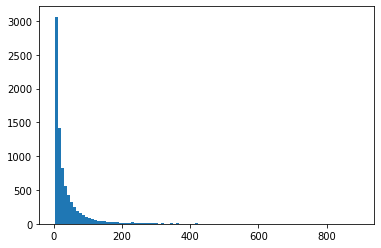

In [316]:
plt.hist(to_split.sort_values('totalLength', ascending=False).totalLength.values, bins=100)

In [245]:
split_sample = to_split.sort_values('totalLength', ascending=False).spid.values


In [276]:
def split_person(spid):
    levels = sillok_people[sillok_people['spid']==spid].sort_values(['rdate','level'], ascending=[True, False]).level.values
    levels = levels[~np.isnan(levels)] # remove NANs
    LDS = extract_dec_subsequence(levels.tolist(), False)
    print(len(LDS), spid, LDS)
    

In [277]:
i = 0
for spid in split_sample:
    split_person(spid)
    i += 1
    if i == 5: break

4 M_0001842 [[17.0, 15.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,

In [265]:
sillok_people[sillok_people['spid']=='M_0001842'].sort_values(['rdate','level'], ascending=[True, False]).level.tolist()



In [ ]:
# sillok_people = sillok_people.merge(sillok_person[['spid', 'chnname']], on='spid', how='outer')

In [ ]:
#     sillok_people[sillok_people['spid']=='M_0005395'].sort_values(['rdate','level'], ascending=[True, False])

In [436]:
to_split = to_split.merge(sillok_person[['spid', 'chnname']], on='spid')

,spid,numErrors,totalLength,errorRate,chnname
0,M_0048165,1,2,0.500000,宋琬
1,M_0046738,1,2,0.500000,朴漑
2,M_0024723,1,4,0.250000,金處漢
3,M_0048179,1,2,0.500000,宋惟醇
4,M_0048299,1,2,0.500000,宋琛
...,...,...,...,...,...
8081,M_0046517,2,46,0.043478,閔瑗
8082,M_0035846,15,79,0.189873,金㙆
8083,M_0009610,5,31,0.161290,李師曾
8084,M_0001134,1,11,0.090909,﻿具人文


In [463]:
to_split[to_split['numErrors'] > 10]

,spid,numErrors,totalLength,errorRate
557,M_0005395,12,41,0.292683
762,M_0002256,13,41,0.317073
860,M_0000097,15,260,0.057692
885,M_0017233,11,40,0.275000
1088,M_0001827,11,92,0.119565
...,...,...,...,...
8003,M_0055212,11,50,0.220000
8025,M_0061058,11,127,0.086614
8043,M_0020121,19,138,0.137681
8059,M_0056551,16,185,0.086486


## Match with Bangmok

In [390]:
bangmok_table = pd.read_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/preprocessing/Merged_Munkwa.csv')
bangmok_lee_person = pd.read_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/preprocessing/bangmok/bangmok_person.csv') 
bangmok_lee = pd.read_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/preprocessing/bangmok/bangmok.csv')
bangmok_lee_dict = pd.read_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/preprocessing/munkwa_lee_uuid_dict.csv')
bangmok_ws = pd.read_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/raw/WS_Munkwa.csv')
bangmok_ws_dict = pd.read_csv('/Users/yenniejun/Documents/code/JoseonMunkwa/data/preprocessing/munkwa_ws_uuid_dict.csv')


In [375]:
bangmok_lee.head()

,bpid,chnname,korname,family_clan,birth,death,plastic
0,G002+AKS-KHF_13D64DC6D0D45CB1868X0,洪元杓,홍원표,남양(南陽[唐]),1868.0,NaN,plastic
1,G002+AKS-KHF_13C870D0DCCC44B1660X0,趙泰采,조태채,양주(楊州),1660.0,1722.0,silver
2,G002+AKS-KHF_13C774D55CCD98B1828X0,李漢春,이한춘,전주(全州),1828.0,NaN,plastic
3,G002+AKS-KHF_13D64DC885D611B1844X0,洪鍾協,홍종협,남양(南陽[唐]),1844.0,NaN,silver
4,G002+AKS-KHF_13D64DC2B9BC94B1528X0,洪承範,홍승범,남양(南陽[唐]),1528.0,NaN,plastic


In [433]:
bangmok = bangmok_table.merge(bangmok_lee_dict, on='lee_uuid', how="inner").drop(columns=['uuid_x', 'uuid_y'])
bangmok = bangmok.merge(bangmok_lee, on='bpid').merge(bangmok_lee_person, on='bpid').filter(['lee_uuid', 'ws_uuid', 'pass_year', 'chnname', 'korname', 'birth', 'death'])
bangmok = bangmok.rename(columns={"pass_year":"lee_pass_year", "chnname":"lee_name", "korname": "lee_kor"})
bangmok = bangmok.merge(bangmok_ws_dict, on='ws_uuid').drop(columns=['uuid'])                                                                           
bangmok = bangmok.merge(bangmok_ws, on='id1').filter(['lee_uuid', 'ws_uuid', 'lee_pass_year', 'lee_name', 'lee_kor', 'year', 'namehj1', 'namehg1', 'birth', 'death'])
bangmok = bangmok.rename(columns={"year": "ws_pass_year", "namehj1": "ws_name", "namehg1": "ws_kor"})
                                                                                            

In [434]:
bangmok.head()

,lee_uuid,ws_uuid,lee_pass_year,lee_name,lee_kor,ws_pass_year,ws_name,ws_kor,birth,death
0,4b854af7-3d4b-51c9-802e-117ff4825291,660a2a20-d407-5ad0-b364-cd9e7edbb82c,1753,李秀得,이수득,1753.0,李秀得,이수득,1697.0,1775.0
1,8a1e8a21-4d10-5ae3-b92d-51acfbb31ba6,85fe658e-5b35-50b1-a41b-aeb916ae13bb,1784,申驥顯,신기현,1784.0,申驥顯,신기현,1747.0,NaN
2,fecc75c4-0045-5485-b47c-851767e002e3,9b6c41ef-f960-5856-9a25-99c0f379e59f,1785,朴宗謙,박종겸,1785.0,朴宗謙,박종겸,1744.0,1799.0
3,8688b608-b1fb-55ab-a77e-a10268ac80af,ceff916a-aab9-58f5-a84e-9f424a5587f0,1864,金昌倫,김창윤,1864.0,金昌倫,김창륜,1843.0,NaN
4,46963c7a-bb8b-52f1-a06a-f128133fe0ab,eb3b33fc-139f-5a8e-952e-c26a1c7b0b48,1885,嚴益祚,엄익조,1885.0,嚴益祚,엄익조,1849.0,NaN


In [704]:
bangmok[bangmok['ws_name'] == ('M_0048130')]

,lee_uuid,ws_uuid,lee_pass_year,lee_name,lee_kor,ws_pass_year,ws_name,ws_kor,birth,death


In [483]:
name.values[0]

'\ufeff金在魯'

In [486]:
name.values[0].replace('\ufeff','')

'金在魯'

In [475]:
name.values[0].replace('\ufeff','')

AttributeError: 'str' object has no attribute 'values'

In [491]:
spid_to_split = to_split.sort_values('totalLength', ascending=False).spid.head(10)
for spid in spid_to_split:
    sillok_entry = sillok_person[sillok_person['spid']==spid]
    name = sillok_entry['chnname'].values[0].replace('\ufeff','')
    bangmok_exists = bangmok[bangmok['lee_name'] == name]
    print(len(bangmok_exists), sillok_entry[['birth', 'death', 'chnname', 'korname']])

1        birth   death chnname korname
1846  1682.0  1759.0    ﻿金在魯     김재노
2        birth   death chnname korname
3145  1417.0  1475.0     申叔舟     신숙주
1        birth   death chnname korname
3046  1689.0  1746.0     宋寅明     송인명
2        birth   death chnname korname
1688  1629.0  1689.0     金壽恒     김수항
0        birth   death chnname korname
6479  1415.0  1487.0     韓明澮     한명회
3        birth   death chnname korname
2231  1427.0  1498.0     盧思愼     노사신
2         birth   death chnname korname
60681  1428.0  1492.0      洪應      홍응
2        birth   death chnname korname
3981  1427.0  1504.0     尹弼商     윤필상
1        birth   death chnname korname
6262  1690.0  1752.0     趙顯命     조현명
1        birth   death chnname korname
1960  1648.0  1722.0    ﻿金昌集     김창집
